In [1]:
from ecell4 import *
%matplotlib inline
import numpy as np
import math
import sys
import matplotlib.pyplot as plt
from ecell4.extra import ensemble
import numpy as np

def wrap(job,job_id,task_id):
    def singlerun(kaf,L,run):
        import numpy as np
        rng = GSLRandomNumberGenerator()
        rng.seed(run)
        rm = 0.005
        R=2*rm
        voxelr=rm
        D = 1
        kd= 4.0*math.pi*D*2*rm
        ka = kaf*kd
        kon = (ka*kd)/(ka+kd)
        tm =(2*voxelr)**2/(6*D)
        #print(tm)
        Vac=spatiocyte.SpatiocyteWorld.calculate_volume(ones()*L,voxelr)
        #print(Vac)
        N = 100
        C=float(N)/Vac
        w = spatiocyte.SpatiocyteWorld(ones()*L,voxelr)

        (c,r,l)=w.shape()
        Nev=(c - 2) * (r - 2) * (l - 2)
        #print('N',N,float(N)/Nev)
        with species_attributes():
            A |  {'D': str(0), 'radius':str(voxelr)}
            B |  {'D': str(D), 'radius':str(voxelr)}

        with reaction_rules():#for spa and egfrd
            A + B > B | ka

        m2 = get_model()

        w = spatiocyte.SpatiocyteWorld(ones()*L,voxelr,rng)
        w.bind_to(m2)
        na=1
        w.add_molecules(Species('A'), na)
        w.add_molecules(Species('B'), N)
        sim = spatiocyte.SpatiocyteSimulator(w)
        sim.initialize()
        simt=0
        while na==1:
            sim.step()
            na = w.num_particles_exact(Species('A'))
            simt=sim.t()
        return simt,C
    job.update({'run':task_id})
    out=singlerun(**job)
    return out

kaf=0.1
simrun=7000
Ls=[3.,2.5,2,1,0.5,0.1]
Ls=[3,1,0.5,0.3]
rxt=[]
conc=[]
for L in Ls:
    jobs=[{'kaf':kaf,'L':L}]
    res=ensemble.run_slurm(wrap,jobs,n=simrun,nproc=350,path='tmp',modules=('numpy','ecell4','math'))[0]
    conc.append(res[0][1])
    rxt.append(np.mean([r[0] for r in res]))
print('finish') 

DEBUG:sge:Submitted batch job 1168967
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[1-7000%35      defq sge-0mfi     chew PD       0:00      1 (None)
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[402-7000%      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:       1168967_397      defq sge-0mfi     chew  R       0:00      1 ibc06
DEBUG:sge:       1168967_398      defq sge-0mfi     chew  R       0:00      1 ibc01
DEBUG:sge:       1168967_399      defq sge-0mfi     chew  R       0:00      1 ibc16
DEBUG:sge:       1168967_400      defq sge-0mfi     chew  R       0:00      1 ibc11
DEBUG:sge:       1168967_401      defq sge-0mfi     chew  R       0:00      1 ibc01
DEBUG:sge:       1168967_388      defq sge-0

DEBUG:sge:        1168967_47      defq sge-0mfi     chew  R       0:10      1 ibc03
DEBUG:sge:        1168967_48      defq sge-0mfi     chew  R       0:10      1 ibc03
DEBUG:sge:        1168967_49      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:        1168967_50      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:        1168967_51      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:        1168967_52      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:        1168967_53      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:        1168967_54      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:        1168967_55      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:        1168967_56      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:        1168967_57      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:        1168967_58      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:       1168967_167      defq sge-0mfi     chew  R       0:10      1 ibc12
DEBUG:sge:       1168967_168      defq sge-0mfi     chew  R       0:10      1 ibc12
DEBUG:sge:       1168967_169      defq sge-0mfi     chew  R       0:10      1 ibc12
DEBUG:sge:       1168967_170      defq sge-0mfi     chew  R       0:10      1 ibc12
DEBUG:sge:       1168967_171      defq sge-0mfi     chew  R       0:10      1 ibc12
DEBUG:sge:       1168967_173      defq sge-0mfi     chew  R       0:10      1 ibc12
DEBUG:sge:       1168967_174      defq sge-0mfi     chew  R       0:10      1 ibc12
DEBUG:sge:       1168967_176      defq sge-0mfi     chew  R       0:10      1 ibc12
DEBUG:sge:       1168967_177      defq sge-0mfi     chew  R       0:10      1 ibc13
DEBUG:sge:       1168967_178      defq sge-0mfi     chew  R       0:10      1 ibc13
DEBUG:sge:       1168967_179      defq sge-0mfi     chew  R       0:10      1 ibc13
DEBUG:sge:       1168967_180      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:       1168967_278      defq sge-0mfi     chew  R       0:10      1 ibc19
DEBUG:sge:       1168967_279      defq sge-0mfi     chew  R       0:10      1 ibc19
DEBUG:sge:       1168967_282      defq sge-0mfi     chew  R       0:10      1 ibc19
DEBUG:sge:       1168967_283      defq sge-0mfi     chew  R       0:10      1 ibc19
DEBUG:sge:       1168967_284      defq sge-0mfi     chew  R       0:10      1 ibc19
DEBUG:sge:       1168967_285      defq sge-0mfi     chew  R       0:10      1 ibc19
DEBUG:sge:       1168967_286      defq sge-0mfi     chew  R       0:10      1 ibc19
DEBUG:sge:       1168967_287      defq sge-0mfi     chew  R       0:10      1 ibc19
DEBUG:sge:       1168967_288      defq sge-0mfi     chew  R       0:10      1 ibc19
DEBUG:sge:       1168967_289      defq sge-0mfi     chew  R       0:10      1 ibc20
DEBUG:sge:       1168967_290      defq sge-0mfi     chew  R       0:10      1 ibc20
DEBUG:sge:       1168967_291      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:       1168967_482      defq sge-0mfi     chew  R       0:03      1 ibc23
DEBUG:sge:       1168967_483      defq sge-0mfi     chew  R       0:03      1 ibc22
DEBUG:sge:       1168967_484      defq sge-0mfi     chew  R       0:03      1 ibc22
DEBUG:sge:       1168967_466      defq sge-0mfi     chew  R       0:04      1 ibc14
DEBUG:sge:       1168967_467      defq sge-0mfi     chew  R       0:04      1 ibc17
DEBUG:sge:       1168967_468      defq sge-0mfi     chew  R       0:04      1 ibc22
DEBUG:sge:       1168967_469      defq sge-0mfi     chew  R       0:04      1 ibc05
DEBUG:sge:       1168967_470      defq sge-0mfi     chew  R       0:04      1 ibc10
DEBUG:sge:       1168967_471      defq sge-0mfi     chew  R       0:04      1 ibc22
DEBUG:sge:       1168967_472      defq sge-0mfi     chew  R       0:04      1 ibc20
DEBUG:sge:       1168967_473      defq sge-0mfi     chew  R       0:04      1 ibc18
DEBUG:sge:       1168967_453      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:       1168967_383      defq sge-0mfi     chew  R       0:12      1 ibc18
DEBUG:sge:       1168967_384      defq sge-0mfi     chew  R       0:12      1 ibc06
DEBUG:sge:       1168967_385      defq sge-0mfi     chew  R       0:12      1 ibc02
DEBUG:sge:       1168967_386      defq sge-0mfi     chew  R       0:12      1 ibc08
DEBUG:sge:       1168967_387      defq sge-0mfi     chew  R       0:12      1 ibc13
DEBUG:sge:       1168967_367      defq sge-0mfi     chew  R       0:13      1 ibc15
DEBUG:sge:       1168967_368      defq sge-0mfi     chew  R       0:13      1 ibc03
DEBUG:sge:       1168967_369      defq sge-0mfi     chew  R       0:13      1 ibc07
DEBUG:sge:       1168967_370      defq sge-0mfi     chew  R       0:13      1 ibc05
DEBUG:sge:       1168967_371      defq sge-0mfi     chew  R       0:13      1 ibc15
DEBUG:sge:       1168967_372      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:       1168967_373      defq sge-0mfi     chew  R       0:13      

DEBUG:sge:       1168967_129      defq sge-0mfi     chew  R       0:20      1 ibc10
DEBUG:sge:       1168967_131      defq sge-0mfi     chew  R       0:20      1 ibc10
DEBUG:sge:       1168967_133      defq sge-0mfi     chew  R       0:20      1 ibc10
DEBUG:sge:       1168967_135      defq sge-0mfi     chew  R       0:20      1 ibc10
DEBUG:sge:       1168967_136      defq sge-0mfi     chew  R       0:20      1 ibc10
DEBUG:sge:       1168967_140      defq sge-0mfi     chew  R       0:20      1 ibc10
DEBUG:sge:       1168967_142      defq sge-0mfi     chew  R       0:20      1 ibc10
DEBUG:sge:       1168967_145      defq sge-0mfi     chew  R       0:20      1 ibc11
DEBUG:sge:       1168967_147      defq sge-0mfi     chew  R       0:20      1 ibc11
DEBUG:sge:       1168967_148      defq sge-0mfi     chew  R       0:20      1 ibc11
DEBUG:sge:       1168967_151      defq sge-0mfi     chew  R       0:20      1 ibc11
DEBUG:sge:       1168967_155      defq sge-0mfi     chew  R       0:20      

DEBUG:sge:       1168967_308      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:       1168967_310      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:       1168967_311      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:       1168967_312      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:       1168967_313      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:       1168967_315      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:       1168967_317      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:       1168967_319      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:       1168967_320      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:       1168967_321      defq sge-0mfi     chew  R       0:20      1 ibc22
DEBUG:sge:       1168967_323      defq sge-0mfi     chew  R       0:20      1 ibc22
DEBUG:sge:       1168967_324      defq sge-0mfi     chew  R       0:20      

DEBUG:sge:       1168967_506      defq sge-0mfi     chew  R       0:11      1 ibc11
DEBUG:sge:       1168967_507      defq sge-0mfi     chew  R       0:11      1 ibc01
DEBUG:sge:       1168967_508      defq sge-0mfi     chew  R       0:11      1 ibc15
DEBUG:sge:       1168967_509      defq sge-0mfi     chew  R       0:11      1 ibc21
DEBUG:sge:       1168967_493      defq sge-0mfi     chew  R       0:12      1 ibc21
DEBUG:sge:       1168967_494      defq sge-0mfi     chew  R       0:12      1 ibc16
DEBUG:sge:       1168967_495      defq sge-0mfi     chew  R       0:12      1 ibc17
DEBUG:sge:       1168967_496      defq sge-0mfi     chew  R       0:12      1 ibc17
DEBUG:sge:       1168967_497      defq sge-0mfi     chew  R       0:12      1 ibc03
DEBUG:sge:       1168967_498      defq sge-0mfi     chew  R       0:12      1 ibc01
DEBUG:sge:       1168967_499      defq sge-0mfi     chew  R       0:12      1 ibc22
DEBUG:sge:       1168967_500      defq sge-0mfi     chew  R       0:12      

DEBUG:sge:       1168967_397      defq sge-0mfi     chew  R       0:21      1 ibc06
DEBUG:sge:       1168967_398      defq sge-0mfi     chew  R       0:21      1 ibc01
DEBUG:sge:       1168967_399      defq sge-0mfi     chew  R       0:21      1 ibc16
DEBUG:sge:       1168967_400      defq sge-0mfi     chew  R       0:21      1 ibc11
DEBUG:sge:       1168967_401      defq sge-0mfi     chew  R       0:21      1 ibc01
DEBUG:sge:       1168967_402      defq sge-0mfi     chew  R       0:21      1 ibc01
DEBUG:sge:       1168967_403      defq sge-0mfi     chew  R       0:21      1 ibc05
DEBUG:sge:       1168967_404      defq sge-0mfi     chew  R       0:21      1 ibc04
DEBUG:sge:       1168967_388      defq sge-0mfi     chew  R       0:22      1 ibc07
DEBUG:sge:       1168967_389      defq sge-0mfi     chew  R       0:22      1 ibc10
DEBUG:sge:       1168967_390      defq sge-0mfi     chew  R       0:22      1 ibc07
DEBUG:sge:       1168967_391      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:       1168967_119      defq sge-0mfi     chew  R       0:31      1 ibc08
DEBUG:sge:       1168967_120      defq sge-0mfi     chew  R       0:31      1 ibc08
DEBUG:sge:       1168967_121      defq sge-0mfi     chew  R       0:31      1 ibc08
DEBUG:sge:       1168967_123      defq sge-0mfi     chew  R       0:31      1 ibc08
DEBUG:sge:       1168967_136      defq sge-0mfi     chew  R       0:31      1 ibc10
DEBUG:sge:       1168967_140      defq sge-0mfi     chew  R       0:31      1 ibc10
DEBUG:sge:       1168967_145      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:       1168967_147      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:       1168967_148      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:       1168967_151      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:       1168967_155      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:       1168967_156      defq sge-0mfi     chew  R       0:31      

DEBUG:sge:       1168967_606      defq sge-0mfi     chew  R       0:05      1 ibc23
DEBUG:sge:       1168967_607      defq sge-0mfi     chew  R       0:05      1 ibc11
DEBUG:sge:       1168967_608      defq sge-0mfi     chew  R       0:05      1 ibc17
DEBUG:sge:       1168967_609      defq sge-0mfi     chew  R       0:05      1 ibc04
DEBUG:sge:       1168967_600      defq sge-0mfi     chew  R       0:06      1 ibc02
DEBUG:sge:       1168967_601      defq sge-0mfi     chew  R       0:06      1 ibc19
DEBUG:sge:       1168967_602      defq sge-0mfi     chew  R       0:06      1 ibc13
DEBUG:sge:       1168967_603      defq sge-0mfi     chew  R       0:06      1 ibc05
DEBUG:sge:       1168967_604      defq sge-0mfi     chew  R       0:06      1 ibc04
DEBUG:sge:       1168967_592      defq sge-0mfi     chew  R       0:07      1 ibc19
DEBUG:sge:       1168967_593      defq sge-0mfi     chew  R       0:07      1 ibc04
DEBUG:sge:       1168967_594      defq sge-0mfi     chew  R       0:07      

DEBUG:sge:       1168967_511      defq sge-0mfi     chew  R       0:20      1 ibc06
DEBUG:sge:       1168967_501      defq sge-0mfi     chew  R       0:21      1 ibc03
DEBUG:sge:       1168967_502      defq sge-0mfi     chew  R       0:21      1 ibc18
DEBUG:sge:       1168967_503      defq sge-0mfi     chew  R       0:21      1 ibc14
DEBUG:sge:       1168967_504      defq sge-0mfi     chew  R       0:21      1 ibc08
DEBUG:sge:       1168967_505      defq sge-0mfi     chew  R       0:21      1 ibc01
DEBUG:sge:       1168967_506      defq sge-0mfi     chew  R       0:21      1 ibc11
DEBUG:sge:       1168967_507      defq sge-0mfi     chew  R       0:21      1 ibc01
DEBUG:sge:       1168967_508      defq sge-0mfi     chew  R       0:21      1 ibc15
DEBUG:sge:       1168967_509      defq sge-0mfi     chew  R       0:21      1 ibc21
DEBUG:sge:       1168967_493      defq sge-0mfi     chew  R       0:22      1 ibc21
DEBUG:sge:       1168967_494      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:       1168967_413      defq sge-0mfi     chew  R       0:30      1 ibc20
DEBUG:sge:       1168967_415      defq sge-0mfi     chew  R       0:30      1 ibc22
DEBUG:sge:       1168967_416      defq sge-0mfi     chew  R       0:30      1 ibc01
DEBUG:sge:       1168967_417      defq sge-0mfi     chew  R       0:30      1 ibc01
DEBUG:sge:       1168967_418      defq sge-0mfi     chew  R       0:30      1 ibc17
DEBUG:sge:       1168967_419      defq sge-0mfi     chew  R       0:30      1 ibc20
DEBUG:sge:       1168967_397      defq sge-0mfi     chew  R       0:31      1 ibc06
DEBUG:sge:       1168967_398      defq sge-0mfi     chew  R       0:31      1 ibc01
DEBUG:sge:       1168967_399      defq sge-0mfi     chew  R       0:31      1 ibc16
DEBUG:sge:       1168967_400      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:       1168967_401      defq sge-0mfi     chew  R       0:31      1 ibc01
DEBUG:sge:       1168967_402      defq sge-0mfi     chew  R       0:31      

DEBUG:sge:       1168967_151      defq sge-0mfi     chew  R       0:41      1 ibc11
DEBUG:sge:       1168967_157      defq sge-0mfi     chew  R       0:41      1 ibc11
DEBUG:sge:       1168967_162      defq sge-0mfi     chew  R       0:41      1 ibc12
DEBUG:sge:       1168967_163      defq sge-0mfi     chew  R       0:41      1 ibc12
DEBUG:sge:       1168967_164      defq sge-0mfi     chew  R       0:41      1 ibc12
DEBUG:sge:       1168967_170      defq sge-0mfi     chew  R       0:41      1 ibc12
DEBUG:sge:       1168967_174      defq sge-0mfi     chew  R       0:41      1 ibc12
DEBUG:sge:       1168967_176      defq sge-0mfi     chew  R       0:41      1 ibc12
DEBUG:sge:       1168967_177      defq sge-0mfi     chew  R       0:41      1 ibc13
DEBUG:sge:       1168967_186      defq sge-0mfi     chew  R       0:41      1 ibc13
DEBUG:sge:       1168967_190      defq sge-0mfi     chew  R       0:41      1 ibc13
DEBUG:sge:       1168967_192      defq sge-0mfi     chew  R       0:41      

DEBUG:sge:       1168967_605      defq sge-0mfi     chew  R       0:15      1 ibc13
DEBUG:sge:       1168967_606      defq sge-0mfi     chew  R       0:15      1 ibc23
DEBUG:sge:       1168967_607      defq sge-0mfi     chew  R       0:15      1 ibc11
DEBUG:sge:       1168967_608      defq sge-0mfi     chew  R       0:15      1 ibc17
DEBUG:sge:       1168967_609      defq sge-0mfi     chew  R       0:15      1 ibc04
DEBUG:sge:       1168967_600      defq sge-0mfi     chew  R       0:16      1 ibc02
DEBUG:sge:       1168967_601      defq sge-0mfi     chew  R       0:16      1 ibc19
DEBUG:sge:       1168967_602      defq sge-0mfi     chew  R       0:16      1 ibc13
DEBUG:sge:       1168967_603      defq sge-0mfi     chew  R       0:16      1 ibc05
DEBUG:sge:       1168967_604      defq sge-0mfi     chew  R       0:16      1 ibc04
DEBUG:sge:       1168967_592      defq sge-0mfi     chew  R       0:17      1 ibc19
DEBUG:sge:       1168967_593      defq sge-0mfi     chew  R       0:17      

DEBUG:sge:       1168967_510      defq sge-0mfi     chew  R       0:30      1 ibc07
DEBUG:sge:       1168967_511      defq sge-0mfi     chew  R       0:30      1 ibc06
DEBUG:sge:       1168967_501      defq sge-0mfi     chew  R       0:31      1 ibc03
DEBUG:sge:       1168967_502      defq sge-0mfi     chew  R       0:31      1 ibc18
DEBUG:sge:       1168967_503      defq sge-0mfi     chew  R       0:31      1 ibc14
DEBUG:sge:       1168967_504      defq sge-0mfi     chew  R       0:31      1 ibc08
DEBUG:sge:       1168967_505      defq sge-0mfi     chew  R       0:31      1 ibc01
DEBUG:sge:       1168967_506      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:       1168967_507      defq sge-0mfi     chew  R       0:31      1 ibc01
DEBUG:sge:       1168967_508      defq sge-0mfi     chew  R       0:31      1 ibc15
DEBUG:sge:       1168967_509      defq sge-0mfi     chew  R       0:31      1 ibc21
DEBUG:sge:       1168967_493      defq sge-0mfi     chew  R       0:32      

DEBUG:sge:       1168967_412      defq sge-0mfi     chew  R       0:40      1 ibc20
DEBUG:sge:       1168967_413      defq sge-0mfi     chew  R       0:40      1 ibc20
DEBUG:sge:       1168967_415      defq sge-0mfi     chew  R       0:40      1 ibc22
DEBUG:sge:       1168967_416      defq sge-0mfi     chew  R       0:40      1 ibc01
DEBUG:sge:       1168967_417      defq sge-0mfi     chew  R       0:40      1 ibc01
DEBUG:sge:       1168967_418      defq sge-0mfi     chew  R       0:40      1 ibc17
DEBUG:sge:       1168967_419      defq sge-0mfi     chew  R       0:40      1 ibc20
DEBUG:sge:       1168967_397      defq sge-0mfi     chew  R       0:41      1 ibc06
DEBUG:sge:       1168967_398      defq sge-0mfi     chew  R       0:41      1 ibc01
DEBUG:sge:       1168967_399      defq sge-0mfi     chew  R       0:41      1 ibc16
DEBUG:sge:       1168967_400      defq sge-0mfi     chew  R       0:41      1 ibc11
DEBUG:sge:       1168967_401      defq sge-0mfi     chew  R       0:41      

DEBUG:sge:       1168967_259      defq sge-0mfi     chew  R       0:51      1 ibc18
DEBUG:sge:       1168967_268      defq sge-0mfi     chew  R       0:51      1 ibc18
DEBUG:sge:       1168967_286      defq sge-0mfi     chew  R       0:51      1 ibc19
DEBUG:sge:       1168967_288      defq sge-0mfi     chew  R       0:51      1 ibc19
DEBUG:sge:       1168967_289      defq sge-0mfi     chew  R       0:51      1 ibc20
DEBUG:sge:       1168967_297      defq sge-0mfi     chew  R       0:51      1 ibc20
DEBUG:sge:       1168967_320      defq sge-0mfi     chew  R       0:51      1 ibc21
DEBUG:sge:       1168967_339      defq sge-0mfi     chew  R       0:51      1 ibc23
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[697-7000%      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:

DEBUG:sge:       1168967_609      defq sge-0mfi     chew  R       0:25      1 ibc04
DEBUG:sge:       1168967_600      defq sge-0mfi     chew  R       0:26      1 ibc02
DEBUG:sge:       1168967_601      defq sge-0mfi     chew  R       0:26      1 ibc19
DEBUG:sge:       1168967_602      defq sge-0mfi     chew  R       0:26      1 ibc13
DEBUG:sge:       1168967_603      defq sge-0mfi     chew  R       0:26      1 ibc05
DEBUG:sge:       1168967_604      defq sge-0mfi     chew  R       0:26      1 ibc04
DEBUG:sge:       1168967_592      defq sge-0mfi     chew  R       0:27      1 ibc19
DEBUG:sge:       1168967_593      defq sge-0mfi     chew  R       0:27      1 ibc04
DEBUG:sge:       1168967_594      defq sge-0mfi     chew  R       0:27      1 ibc12
DEBUG:sge:       1168967_595      defq sge-0mfi     chew  R       0:27      1 ibc16
DEBUG:sge:       1168967_596      defq sge-0mfi     chew  R       0:27      1 ibc14
DEBUG:sge:       1168967_597      defq sge-0mfi     chew  R       0:27      

DEBUG:sge:       1168967_493      defq sge-0mfi     chew  R       0:42      1 ibc21
DEBUG:sge:       1168967_494      defq sge-0mfi     chew  R       0:42      1 ibc16
DEBUG:sge:       1168967_495      defq sge-0mfi     chew  R       0:42      1 ibc17
DEBUG:sge:       1168967_496      defq sge-0mfi     chew  R       0:42      1 ibc17
DEBUG:sge:       1168967_497      defq sge-0mfi     chew  R       0:42      1 ibc03
DEBUG:sge:       1168967_498      defq sge-0mfi     chew  R       0:42      1 ibc01
DEBUG:sge:       1168967_499      defq sge-0mfi     chew  R       0:42      1 ibc22
DEBUG:sge:       1168967_500      defq sge-0mfi     chew  R       0:42      1 ibc01
DEBUG:sge:       1168967_485      defq sge-0mfi     chew  R       0:43      1 ibc05
DEBUG:sge:       1168967_486      defq sge-0mfi     chew  R       0:43      1 ibc20
DEBUG:sge:       1168967_487      defq sge-0mfi     chew  R       0:43      1 ibc04
DEBUG:sge:       1168967_488      defq sge-0mfi     chew  R       0:43      

DEBUG:sge:       1168967_390      defq sge-0mfi     chew  R       0:52      1 ibc07
DEBUG:sge:       1168967_391      defq sge-0mfi     chew  R       0:52      1 ibc22
DEBUG:sge:       1168967_392      defq sge-0mfi     chew  R       0:52      1 ibc15
DEBUG:sge:       1168967_393      defq sge-0mfi     chew  R       0:52      1 ibc10
DEBUG:sge:       1168967_394      defq sge-0mfi     chew  R       0:52      1 ibc22
DEBUG:sge:       1168967_395      defq sge-0mfi     chew  R       0:52      1 ibc05
DEBUG:sge:       1168967_396      defq sge-0mfi     chew  R       0:52      1 ibc11
DEBUG:sge:       1168967_375      defq sge-0mfi     chew  R       0:53      1 ibc16
DEBUG:sge:       1168967_376      defq sge-0mfi     chew  R       0:53      1 ibc08
DEBUG:sge:       1168967_377      defq sge-0mfi     chew  R       0:53      1 ibc16
DEBUG:sge:       1168967_378      defq sge-0mfi     chew  R       0:53      1 ibc21
DEBUG:sge:       1168967_380      defq sge-0mfi     chew  R       0:53      

DEBUG:sge:       1168967_787      defq sge-0mfi     chew  R       0:04      1 ibc04
DEBUG:sge:       1168967_767      defq sge-0mfi     chew  R       0:05      1 ibc03
DEBUG:sge:       1168967_768      defq sge-0mfi     chew  R       0:05      1 ibc11
DEBUG:sge:       1168967_769      defq sge-0mfi     chew  R       0:05      1 ibc07
DEBUG:sge:       1168967_770      defq sge-0mfi     chew  R       0:05      1 ibc22
DEBUG:sge:       1168967_771      defq sge-0mfi     chew  R       0:05      1 ibc08
DEBUG:sge:       1168967_772      defq sge-0mfi     chew  R       0:05      1 ibc10
DEBUG:sge:       1168967_773      defq sge-0mfi     chew  R       0:05      1 ibc08
DEBUG:sge:       1168967_774      defq sge-0mfi     chew  R       0:05      1 ibc05
DEBUG:sge:       1168967_775      defq sge-0mfi     chew  R       0:05      1 ibc02
DEBUG:sge:       1168967_776      defq sge-0mfi     chew  R       0:05      1 ibc23
DEBUG:sge:       1168967_777      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:       1168967_681      defq sge-0mfi     chew  R       0:12      1 ibc13
DEBUG:sge:       1168967_682      defq sge-0mfi     chew  R       0:12      1 ibc20
DEBUG:sge:       1168967_683      defq sge-0mfi     chew  R       0:12      1 ibc03
DEBUG:sge:       1168967_684      defq sge-0mfi     chew  R       0:12      1 ibc12
DEBUG:sge:       1168967_669      defq sge-0mfi     chew  R       0:13      1 ibc22
DEBUG:sge:       1168967_670      defq sge-0mfi     chew  R       0:13      1 ibc12
DEBUG:sge:       1168967_671      defq sge-0mfi     chew  R       0:13      1 ibc16
DEBUG:sge:       1168967_672      defq sge-0mfi     chew  R       0:13      1 ibc02
DEBUG:sge:       1168967_673      defq sge-0mfi     chew  R       0:13      1 ibc20
DEBUG:sge:       1168967_674      defq sge-0mfi     chew  R       0:13      1 ibc14
DEBUG:sge:       1168967_675      defq sge-0mfi     chew  R       0:13      1 ibc07
DEBUG:sge:       1168967_676      defq sge-0mfi     chew  R       0:13      

DEBUG:sge:       1168967_536      defq sge-0mfi     chew  R       0:47      1 ibc21
DEBUG:sge:       1168967_522      defq sge-0mfi     chew  R       0:48      1 ibc11
DEBUG:sge:       1168967_523      defq sge-0mfi     chew  R       0:48      1 ibc21
DEBUG:sge:       1168967_524      defq sge-0mfi     chew  R       0:48      1 ibc06
DEBUG:sge:       1168967_525      defq sge-0mfi     chew  R       0:48      1 ibc19
DEBUG:sge:       1168967_526      defq sge-0mfi     chew  R       0:48      1 ibc10
DEBUG:sge:       1168967_527      defq sge-0mfi     chew  R       0:48      1 ibc14
DEBUG:sge:       1168967_520      defq sge-0mfi     chew  R       0:49      1 ibc16
DEBUG:sge:       1168967_513      defq sge-0mfi     chew  R       0:50      1 ibc12
DEBUG:sge:       1168967_518      defq sge-0mfi     chew  R       0:50      1 ibc18
DEBUG:sge:       1168967_502      defq sge-0mfi     chew  R       0:52      1 ibc18
DEBUG:sge:       1168967_503      defq sge-0mfi     chew  R       0:52      

DEBUG:sge:       1168967_360      defq sge-0mfi     chew  R       1:06      1 ibc10
DEBUG:sge:       1168967_362      defq sge-0mfi     chew  R       1:06      1 ibc20
DEBUG:sge:       1168967_363      defq sge-0mfi     chew  R       1:06      1 ibc05
DEBUG:sge:       1168967_365      defq sge-0mfi     chew  R       1:06      1 ibc23
DEBUG:sge:        1168967_11      defq sge-0mfi     chew  R       1:12      1 ibc01
DEBUG:sge:        1168967_18      defq sge-0mfi     chew  R       1:12      1 ibc02
DEBUG:sge:        1168967_20      defq sge-0mfi     chew  R       1:12      1 ibc02
DEBUG:sge:        1168967_27      defq sge-0mfi     chew  R       1:12      1 ibc02
DEBUG:sge:        1168967_32      defq sge-0mfi     chew  R       1:12      1 ibc02
DEBUG:sge:        1168967_33      defq sge-0mfi     chew  R       1:12      1 ibc03
DEBUG:sge:        1168967_34      defq sge-0mfi     chew  R       1:12      1 ibc03
DEBUG:sge:        1168967_54      defq sge-0mfi     chew  R       1:12      

DEBUG:sge:       1168967_818      defq sge-0mfi     chew  R       0:09      1 ibc19
DEBUG:sge:       1168967_819      defq sge-0mfi     chew  R       0:09      1 ibc23
DEBUG:sge:       1168967_806      defq sge-0mfi     chew  R       0:10      1 ibc14
DEBUG:sge:       1168967_807      defq sge-0mfi     chew  R       0:10      1 ibc18
DEBUG:sge:       1168967_808      defq sge-0mfi     chew  R       0:10      1 ibc20
DEBUG:sge:       1168967_809      defq sge-0mfi     chew  R       0:10      1 ibc13
DEBUG:sge:       1168967_810      defq sge-0mfi     chew  R       0:10      1 ibc08
DEBUG:sge:       1168967_811      defq sge-0mfi     chew  R       0:10      1 ibc20
DEBUG:sge:       1168967_812      defq sge-0mfi     chew  R       0:10      1 ibc20
DEBUG:sge:       1168967_798      defq sge-0mfi     chew  R       0:11      1 ibc13
DEBUG:sge:       1168967_799      defq sge-0mfi     chew  R       0:11      1 ibc18
DEBUG:sge:       1168967_800      defq sge-0mfi     chew  R       0:11      

DEBUG:sge:       1168967_722      defq sge-0mfi     chew  R       0:19      1 ibc10
DEBUG:sge:       1168967_723      defq sge-0mfi     chew  R       0:19      1 ibc18
DEBUG:sge:       1168967_724      defq sge-0mfi     chew  R       0:19      1 ibc12
DEBUG:sge:       1168967_725      defq sge-0mfi     chew  R       0:19      1 ibc06
DEBUG:sge:       1168967_726      defq sge-0mfi     chew  R       0:19      1 ibc08
DEBUG:sge:       1168967_727      defq sge-0mfi     chew  R       0:19      1 ibc03
DEBUG:sge:       1168967_699      defq sge-0mfi     chew  R       0:20      1 ibc03
DEBUG:sge:       1168967_700      defq sge-0mfi     chew  R       0:20      1 ibc16
DEBUG:sge:       1168967_701      defq sge-0mfi     chew  R       0:20      1 ibc17
DEBUG:sge:       1168967_702      defq sge-0mfi     chew  R       0:20      1 ibc05
DEBUG:sge:       1168967_703      defq sge-0mfi     chew  R       0:20      1 ibc17
DEBUG:sge:       1168967_704      defq sge-0mfi     chew  R       0:20      

DEBUG:sge:       1168967_532      defq sge-0mfi     chew  R       0:57      1 ibc07
DEBUG:sge:       1168967_534      defq sge-0mfi     chew  R       0:57      1 ibc18
DEBUG:sge:       1168967_524      defq sge-0mfi     chew  R       0:58      1 ibc06
DEBUG:sge:       1168967_525      defq sge-0mfi     chew  R       0:58      1 ibc19
DEBUG:sge:       1168967_526      defq sge-0mfi     chew  R       0:58      1 ibc10
DEBUG:sge:       1168967_520      defq sge-0mfi     chew  R       0:59      1 ibc16
DEBUG:sge:       1168967_513      defq sge-0mfi     chew  R       1:00      1 ibc12
DEBUG:sge:       1168967_518      defq sge-0mfi     chew  R       1:00      1 ibc18
DEBUG:sge:       1168967_502      defq sge-0mfi     chew  R       1:02      1 ibc18
DEBUG:sge:       1168967_503      defq sge-0mfi     chew  R       1:02      1 ibc14
DEBUG:sge:       1168967_508      defq sge-0mfi     chew  R       1:02      1 ibc15
DEBUG:sge:       1168967_509      defq sge-0mfi     chew  R       1:02      

DEBUG:sge:       1168967_930      defq sge-0mfi     chew  R       0:01      1 ibc03
DEBUG:sge:       1168967_922      defq sge-0mfi     chew  R       0:02      1 ibc08
DEBUG:sge:       1168967_923      defq sge-0mfi     chew  R       0:02      1 ibc24
DEBUG:sge:       1168967_924      defq sge-0mfi     chew  R       0:02      1 ibc15
DEBUG:sge:       1168967_925      defq sge-0mfi     chew  R       0:02      1 ibc22
DEBUG:sge:       1168967_926      defq sge-0mfi     chew  R       0:02      1 ibc02
DEBUG:sge:       1168967_927      defq sge-0mfi     chew  R       0:02      1 ibc21
DEBUG:sge:       1168967_919      defq sge-0mfi     chew  R       0:03      1 ibc02
DEBUG:sge:       1168967_920      defq sge-0mfi     chew  R       0:03      1 ibc04
DEBUG:sge:       1168967_921      defq sge-0mfi     chew  R       0:03      1 ibc10
DEBUG:sge:       1168967_914      defq sge-0mfi     chew  R       0:04      1 ibc13
DEBUG:sge:       1168967_915      defq sge-0mfi     chew  R       0:04      

DEBUG:sge:       1168967_821      defq sge-0mfi     chew  R       0:18      1 ibc10
DEBUG:sge:       1168967_822      defq sge-0mfi     chew  R       0:18      1 ibc06
DEBUG:sge:       1168967_823      defq sge-0mfi     chew  R       0:18      1 ibc05
DEBUG:sge:       1168967_824      defq sge-0mfi     chew  R       0:18      1 ibc05
DEBUG:sge:       1168967_825      defq sge-0mfi     chew  R       0:18      1 ibc14
DEBUG:sge:       1168967_826      defq sge-0mfi     chew  R       0:18      1 ibc20
DEBUG:sge:       1168967_827      defq sge-0mfi     chew  R       0:18      1 ibc14
DEBUG:sge:       1168967_828      defq sge-0mfi     chew  R       0:18      1 ibc06
DEBUG:sge:       1168967_829      defq sge-0mfi     chew  R       0:18      1 ibc07
DEBUG:sge:       1168967_830      defq sge-0mfi     chew  R       0:18      1 ibc01
DEBUG:sge:       1168967_831      defq sge-0mfi     chew  R       0:18      1 ibc16
DEBUG:sge:       1168967_813      defq sge-0mfi     chew  R       0:19      

DEBUG:sge:       1168967_740      defq sge-0mfi     chew  R       0:28      1 ibc11
DEBUG:sge:       1168967_741      defq sge-0mfi     chew  R       0:28      1 ibc15
DEBUG:sge:       1168967_742      defq sge-0mfi     chew  R       0:28      1 ibc01
DEBUG:sge:       1168967_743      defq sge-0mfi     chew  R       0:28      1 ibc01
DEBUG:sge:       1168967_744      defq sge-0mfi     chew  R       0:28      1 ibc22
DEBUG:sge:       1168967_711      defq sge-0mfi     chew  R       0:29      1 ibc17
DEBUG:sge:       1168967_712      defq sge-0mfi     chew  R       0:29      1 ibc23
DEBUG:sge:       1168967_713      defq sge-0mfi     chew  R       0:29      1 ibc10
DEBUG:sge:       1168967_714      defq sge-0mfi     chew  R       0:29      1 ibc11
DEBUG:sge:       1168967_715      defq sge-0mfi     chew  R       0:29      1 ibc11
DEBUG:sge:       1168967_716      defq sge-0mfi     chew  R       0:29      1 ibc11
DEBUG:sge:       1168967_717      defq sge-0mfi     chew  R       0:29      

DEBUG:sge:       1168967_547      defq sge-0mfi     chew  R       1:05      1 ibc10
DEBUG:sge:       1168967_528      defq sge-0mfi     chew  R       1:07      1 ibc17
DEBUG:sge:       1168967_529      defq sge-0mfi     chew  R       1:07      1 ibc13
DEBUG:sge:       1168967_534      defq sge-0mfi     chew  R       1:07      1 ibc18
DEBUG:sge:       1168967_524      defq sge-0mfi     chew  R       1:08      1 ibc06
DEBUG:sge:       1168967_525      defq sge-0mfi     chew  R       1:08      1 ibc19
DEBUG:sge:       1168967_513      defq sge-0mfi     chew  R       1:10      1 ibc12
DEBUG:sge:       1168967_518      defq sge-0mfi     chew  R       1:10      1 ibc18
DEBUG:sge:       1168967_502      defq sge-0mfi     chew  R       1:12      1 ibc18
DEBUG:sge:       1168967_503      defq sge-0mfi     chew  R       1:12      1 ibc14
DEBUG:sge:       1168967_508      defq sge-0mfi     chew  R       1:12      1 ibc15
DEBUG:sge:       1168967_509      defq sge-0mfi     chew  R       1:12      

DEBUG:sge:       1168967_921      defq sge-0mfi     chew  R       0:13      1 ibc10
DEBUG:sge:       1168967_914      defq sge-0mfi     chew  R       0:14      1 ibc13
DEBUG:sge:       1168967_915      defq sge-0mfi     chew  R       0:14      1 ibc23
DEBUG:sge:       1168967_916      defq sge-0mfi     chew  R       0:14      1 ibc16
DEBUG:sge:       1168967_917      defq sge-0mfi     chew  R       0:14      1 ibc15
DEBUG:sge:       1168967_918      defq sge-0mfi     chew  R       0:14      1 ibc02
DEBUG:sge:       1168967_912      defq sge-0mfi     chew  R       0:15      1 ibc20
DEBUG:sge:       1168967_913      defq sge-0mfi     chew  R       0:15      1 ibc03
DEBUG:sge:       1168967_902      defq sge-0mfi     chew  R       0:16      1 ibc16
DEBUG:sge:       1168967_903      defq sge-0mfi     chew  R       0:16      1 ibc03
DEBUG:sge:       1168967_904      defq sge-0mfi     chew  R       0:16      1 ibc20
DEBUG:sge:       1168967_905      defq sge-0mfi     chew  R       0:16      

DEBUG:sge:       1168967_830      defq sge-0mfi     chew  R       0:28      1 ibc01
DEBUG:sge:       1168967_831      defq sge-0mfi     chew  R       0:28      1 ibc16
DEBUG:sge:       1168967_813      defq sge-0mfi     chew  R       0:29      1 ibc11
DEBUG:sge:       1168967_814      defq sge-0mfi     chew  R       0:29      1 ibc19
DEBUG:sge:       1168967_815      defq sge-0mfi     chew  R       0:29      1 ibc19
DEBUG:sge:       1168967_816      defq sge-0mfi     chew  R       0:29      1 ibc08
DEBUG:sge:       1168967_817      defq sge-0mfi     chew  R       0:29      1 ibc19
DEBUG:sge:       1168967_818      defq sge-0mfi     chew  R       0:29      1 ibc19
DEBUG:sge:       1168967_819      defq sge-0mfi     chew  R       0:29      1 ibc23
DEBUG:sge:       1168967_806      defq sge-0mfi     chew  R       0:30      1 ibc14
DEBUG:sge:       1168967_807      defq sge-0mfi     chew  R       0:30      1 ibc18
DEBUG:sge:       1168967_808      defq sge-0mfi     chew  R       0:30      

DEBUG:sge:       1168967_715      defq sge-0mfi     chew  R       0:39      1 ibc11
DEBUG:sge:       1168967_716      defq sge-0mfi     chew  R       0:39      1 ibc11
DEBUG:sge:       1168967_717      defq sge-0mfi     chew  R       0:39      1 ibc04
DEBUG:sge:       1168967_718      defq sge-0mfi     chew  R       0:39      1 ibc15
DEBUG:sge:       1168967_719      defq sge-0mfi     chew  R       0:39      1 ibc02
DEBUG:sge:       1168967_720      defq sge-0mfi     chew  R       0:39      1 ibc16
DEBUG:sge:       1168967_721      defq sge-0mfi     chew  R       0:39      1 ibc07
DEBUG:sge:       1168967_722      defq sge-0mfi     chew  R       0:39      1 ibc10
DEBUG:sge:       1168967_723      defq sge-0mfi     chew  R       0:39      1 ibc18
DEBUG:sge:       1168967_724      defq sge-0mfi     chew  R       0:39      1 ibc12
DEBUG:sge:       1168967_725      defq sge-0mfi     chew  R       0:39      1 ibc06
DEBUG:sge:       1168967_726      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:       1168967_437      defq sge-0mfi     chew  R       1:29      1 ibc04
DEBUG:sge:       1168967_421      defq sge-0mfi     chew  R       1:30      1 ibc18
DEBUG:sge:       1168967_408      defq sge-0mfi     chew  R       1:31      1 ibc13
DEBUG:sge:       1168967_416      defq sge-0mfi     chew  R       1:31      1 ibc01
DEBUG:sge:       1168967_403      defq sge-0mfi     chew  R       1:32      1 ibc05
DEBUG:sge:       1168967_376      defq sge-0mfi     chew  R       1:34      1 ibc08
DEBUG:sge:       1168967_378      defq sge-0mfi     chew  R       1:34      1 ibc21
DEBUG:sge:       1168967_380      defq sge-0mfi     chew  R       1:34      1 ibc12
DEBUG:sge:       1168967_355      defq sge-0mfi     chew  R       1:36      1 ibc21
DEBUG:sge:       1168967_360      defq sge-0mfi     chew  R       1:36      1 ibc10
DEBUG:sge:        1168967_89      defq sge-0mfi     chew  R       1:42      1 ibc06
DEBUG:sge:        1168967_91      defq sge-0mfi     chew  R       1:42      

DEBUG:sge:       1168967_945      defq sge-0mfi     chew  R       0:17      1 ibc08
DEBUG:sge:       1168967_946      defq sge-0mfi     chew  R       0:17      1 ibc13
DEBUG:sge:       1168967_939      defq sge-0mfi     chew  R       0:18      1 ibc01
DEBUG:sge:       1168967_940      defq sge-0mfi     chew  R       0:18      1 ibc06
DEBUG:sge:       1168967_941      defq sge-0mfi     chew  R       0:18      1 ibc20
DEBUG:sge:       1168967_935      defq sge-0mfi     chew  R       0:19      1 ibc15
DEBUG:sge:       1168967_936      defq sge-0mfi     chew  R       0:19      1 ibc12
DEBUG:sge:       1168967_932      defq sge-0mfi     chew  R       0:20      1 ibc06
DEBUG:sge:       1168967_933      defq sge-0mfi     chew  R       0:20      1 ibc05
DEBUG:sge:       1168967_934      defq sge-0mfi     chew  R       0:20      1 ibc16
DEBUG:sge:       1168967_931      defq sge-0mfi     chew  R       0:21      1 ibc10
DEBUG:sge:       1168967_929      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:       1168967_824      defq sge-0mfi     chew  R       0:39      1 ibc05
DEBUG:sge:       1168967_825      defq sge-0mfi     chew  R       0:39      1 ibc14
DEBUG:sge:       1168967_826      defq sge-0mfi     chew  R       0:39      1 ibc20
DEBUG:sge:       1168967_827      defq sge-0mfi     chew  R       0:39      1 ibc14
DEBUG:sge:       1168967_828      defq sge-0mfi     chew  R       0:39      1 ibc06
DEBUG:sge:       1168967_829      defq sge-0mfi     chew  R       0:39      1 ibc07
DEBUG:sge:       1168967_830      defq sge-0mfi     chew  R       0:39      1 ibc01
DEBUG:sge:       1168967_831      defq sge-0mfi     chew  R       0:39      1 ibc16
DEBUG:sge:       1168967_813      defq sge-0mfi     chew  R       0:40      1 ibc11
DEBUG:sge:       1168967_814      defq sge-0mfi     chew  R       0:40      1 ibc19
DEBUG:sge:       1168967_816      defq sge-0mfi     chew  R       0:40      1 ibc08
DEBUG:sge:       1168967_817      defq sge-0mfi     chew  R       0:40      

DEBUG:sge:       1168967_725      defq sge-0mfi     chew  R       0:50      1 ibc06
DEBUG:sge:       1168967_726      defq sge-0mfi     chew  R       0:50      1 ibc08
DEBUG:sge:       1168967_727      defq sge-0mfi     chew  R       0:50      1 ibc03
DEBUG:sge:       1168967_699      defq sge-0mfi     chew  R       0:51      1 ibc03
DEBUG:sge:       1168967_700      defq sge-0mfi     chew  R       0:51      1 ibc16
DEBUG:sge:       1168967_701      defq sge-0mfi     chew  R       0:51      1 ibc17
DEBUG:sge:       1168967_703      defq sge-0mfi     chew  R       0:51      1 ibc17
DEBUG:sge:       1168967_704      defq sge-0mfi     chew  R       0:51      1 ibc01
DEBUG:sge:       1168967_705      defq sge-0mfi     chew  R       0:51      1 ibc10
DEBUG:sge:       1168967_706      defq sge-0mfi     chew  R       0:51      1 ibc03
DEBUG:sge:       1168967_707      defq sge-0mfi     chew  R       0:51      1 ibc15
DEBUG:sge:       1168967_708      defq sge-0mfi     chew  R       0:51      

DEBUG:sge:      1168967_1056      defq sge-0mfi     chew  R       0:03      1 ibc12
DEBUG:sge:      1168967_1057      defq sge-0mfi     chew  R       0:03      1 ibc08
DEBUG:sge:      1168967_1051      defq sge-0mfi     chew  R       0:04      1 ibc05
DEBUG:sge:      1168967_1044      defq sge-0mfi     chew  R       0:05      1 ibc21
DEBUG:sge:      1168967_1045      defq sge-0mfi     chew  R       0:05      1 ibc12
DEBUG:sge:      1168967_1046      defq sge-0mfi     chew  R       0:05      1 ibc19
DEBUG:sge:      1168967_1047      defq sge-0mfi     chew  R       0:05      1 ibc19
DEBUG:sge:      1168967_1048      defq sge-0mfi     chew  R       0:05      1 ibc04
DEBUG:sge:      1168967_1049      defq sge-0mfi     chew  R       0:05      1 ibc15
DEBUG:sge:      1168967_1050      defq sge-0mfi     chew  R       0:05      1 ibc21
DEBUG:sge:      1168967_1040      defq sge-0mfi     chew  R       0:06      1 ibc12
DEBUG:sge:      1168967_1041      defq sge-0mfi     chew  R       0:06      

DEBUG:sge:       1168967_955      defq sge-0mfi     chew  R       0:24      1 ibc17
DEBUG:sge:       1168967_952      defq sge-0mfi     chew  R       0:25      1 ibc17
DEBUG:sge:       1168967_954      defq sge-0mfi     chew  R       0:25      1 ibc18
DEBUG:sge:       1168967_947      defq sge-0mfi     chew  R       0:26      1 ibc02
DEBUG:sge:       1168967_948      defq sge-0mfi     chew  R       0:26      1 ibc07
DEBUG:sge:       1168967_949      defq sge-0mfi     chew  R       0:26      1 ibc03
DEBUG:sge:       1168967_950      defq sge-0mfi     chew  R       0:26      1 ibc04
DEBUG:sge:       1168967_951      defq sge-0mfi     chew  R       0:26      1 ibc07
DEBUG:sge:       1168967_942      defq sge-0mfi     chew  R       0:27      1 ibc13
DEBUG:sge:       1168967_943      defq sge-0mfi     chew  R       0:27      1 ibc01
DEBUG:sge:       1168967_944      defq sge-0mfi     chew  R       0:27      1 ibc03
DEBUG:sge:       1168967_945      defq sge-0mfi     chew  R       0:27      

DEBUG:sge:       1168967_813      defq sge-0mfi     chew  R       0:50      1 ibc11
DEBUG:sge:       1168967_816      defq sge-0mfi     chew  R       0:50      1 ibc08
DEBUG:sge:       1168967_807      defq sge-0mfi     chew  R       0:51      1 ibc18
DEBUG:sge:       1168967_808      defq sge-0mfi     chew  R       0:51      1 ibc20
DEBUG:sge:       1168967_809      defq sge-0mfi     chew  R       0:51      1 ibc13
DEBUG:sge:       1168967_810      defq sge-0mfi     chew  R       0:51      1 ibc08
DEBUG:sge:       1168967_811      defq sge-0mfi     chew  R       0:51      1 ibc20
DEBUG:sge:       1168967_812      defq sge-0mfi     chew  R       0:51      1 ibc20
DEBUG:sge:       1168967_798      defq sge-0mfi     chew  R       0:52      1 ibc13
DEBUG:sge:       1168967_799      defq sge-0mfi     chew  R       0:52      1 ibc18
DEBUG:sge:       1168967_802      defq sge-0mfi     chew  R       0:52      1 ibc07
DEBUG:sge:       1168967_803      defq sge-0mfi     chew  R       0:52      

DEBUG:sge:       1168967_695      defq sge-0mfi     chew  R       1:02      1 ibc01
DEBUG:sge:       1168967_696      defq sge-0mfi     chew  R       1:02      1 ibc18
DEBUG:sge:       1168967_698      defq sge-0mfi     chew  R       1:02      1 ibc13
DEBUG:sge:       1168967_679      defq sge-0mfi     chew  R       1:03      1 ibc20
DEBUG:sge:       1168967_681      defq sge-0mfi     chew  R       1:03      1 ibc13
DEBUG:sge:       1168967_682      defq sge-0mfi     chew  R       1:03      1 ibc20
DEBUG:sge:       1168967_683      defq sge-0mfi     chew  R       1:03      1 ibc03
DEBUG:sge:       1168967_684      defq sge-0mfi     chew  R       1:03      1 ibc12
DEBUG:sge:       1168967_669      defq sge-0mfi     chew  R       1:04      1 ibc22
DEBUG:sge:       1168967_670      defq sge-0mfi     chew  R       1:04      1 ibc12
DEBUG:sge:       1168967_671      defq sge-0mfi     chew  R       1:04      1 ibc16
DEBUG:sge:       1168967_672      defq sge-0mfi     chew  R       1:04      

DEBUG:sge:      1168967_1046      defq sge-0mfi     chew  R       0:15      1 ibc19
DEBUG:sge:      1168967_1047      defq sge-0mfi     chew  R       0:15      1 ibc19
DEBUG:sge:      1168967_1048      defq sge-0mfi     chew  R       0:15      1 ibc04
DEBUG:sge:      1168967_1049      defq sge-0mfi     chew  R       0:15      1 ibc15
DEBUG:sge:      1168967_1050      defq sge-0mfi     chew  R       0:15      1 ibc21
DEBUG:sge:      1168967_1040      defq sge-0mfi     chew  R       0:16      1 ibc12
DEBUG:sge:      1168967_1041      defq sge-0mfi     chew  R       0:16      1 ibc14
DEBUG:sge:      1168967_1042      defq sge-0mfi     chew  R       0:16      1 ibc15
DEBUG:sge:      1168967_1043      defq sge-0mfi     chew  R       0:16      1 ibc19
DEBUG:sge:      1168967_1037      defq sge-0mfi     chew  R       0:17      1 ibc19
DEBUG:sge:      1168967_1038      defq sge-0mfi     chew  R       0:17      1 ibc21
DEBUG:sge:      1168967_1039      defq sge-0mfi     chew  R       0:17      

DEBUG:sge:       1168967_951      defq sge-0mfi     chew  R       0:36      1 ibc07
DEBUG:sge:       1168967_942      defq sge-0mfi     chew  R       0:37      1 ibc13
DEBUG:sge:       1168967_943      defq sge-0mfi     chew  R       0:37      1 ibc01
DEBUG:sge:       1168967_944      defq sge-0mfi     chew  R       0:37      1 ibc03
DEBUG:sge:       1168967_945      defq sge-0mfi     chew  R       0:37      1 ibc08
DEBUG:sge:       1168967_946      defq sge-0mfi     chew  R       0:37      1 ibc13
DEBUG:sge:       1168967_939      defq sge-0mfi     chew  R       0:38      1 ibc01
DEBUG:sge:       1168967_940      defq sge-0mfi     chew  R       0:38      1 ibc06
DEBUG:sge:       1168967_941      defq sge-0mfi     chew  R       0:38      1 ibc20
DEBUG:sge:       1168967_935      defq sge-0mfi     chew  R       0:39      1 ibc15
DEBUG:sge:       1168967_936      defq sge-0mfi     chew  R       0:39      1 ibc12
DEBUG:sge:       1168967_932      defq sge-0mfi     chew  R       0:40      

DEBUG:sge:       1168967_792      defq sge-0mfi     chew  R       1:03      1 ibc04
DEBUG:sge:       1168967_793      defq sge-0mfi     chew  R       1:03      1 ibc03
DEBUG:sge:       1168967_794      defq sge-0mfi     chew  R       1:03      1 ibc06
DEBUG:sge:       1168967_795      defq sge-0mfi     chew  R       1:03      1 ibc10
DEBUG:sge:       1168967_796      defq sge-0mfi     chew  R       1:03      1 ibc19
DEBUG:sge:       1168967_797      defq sge-0mfi     chew  R       1:03      1 ibc01
DEBUG:sge:       1168967_789      defq sge-0mfi     chew  R       1:04      1 ibc10
DEBUG:sge:       1168967_790      defq sge-0mfi     chew  R       1:04      1 ibc08
DEBUG:sge:       1168967_791      defq sge-0mfi     chew  R       1:04      1 ibc07
DEBUG:sge:       1168967_780      defq sge-0mfi     chew  R       1:05      1 ibc16
DEBUG:sge:       1168967_781      defq sge-0mfi     chew  R       1:05      1 ibc01
DEBUG:sge:       1168967_782      defq sge-0mfi     chew  R       1:05      

INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[1158-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_1153      defq sge-0mfi     chew  R       0:01      1 ibc02
DEBUG:sge:      1168967_1154      defq sge-0mfi     chew  R       0:01      1 ibc20
DEBUG:sge:      1168967_1155      defq sge-0mfi     chew  R       0:01      1 ibc06
DEBUG:sge:      1168967_1156      defq sge-0mfi     chew  R       0:01      1 ibc18
DEBUG:sge:      1168967_1157      defq sge-0mfi     chew  R       0:01      1 ibc04
DEBUG:sge:      1168967_1147      defq sge-0mfi     chew  R       0:02      1 ibc07
DEBUG:sge:      1168967_1148      defq sge-0mfi     chew  R       0:02      1 ibc16
DEBUG:sge:      1168967_1149      defq sge-0mfi     chew  R       0:02      1 ibc08
DEBUG:sge:      1168967_1150      defq sge-0mfi     chew  R       0:02      1 ibc08
DEB

DEBUG:sge:      1168967_1068      defq sge-0mfi     chew  R       0:22      1 ibc06
DEBUG:sge:      1168967_1069      defq sge-0mfi     chew  R       0:22      1 ibc12
DEBUG:sge:      1168967_1058      defq sge-0mfi     chew  R       0:23      1 ibc05
DEBUG:sge:      1168967_1059      defq sge-0mfi     chew  R       0:23      1 ibc06
DEBUG:sge:      1168967_1052      defq sge-0mfi     chew  R       0:24      1 ibc22
DEBUG:sge:      1168967_1053      defq sge-0mfi     chew  R       0:24      1 ibc05
DEBUG:sge:      1168967_1054      defq sge-0mfi     chew  R       0:24      1 ibc13
DEBUG:sge:      1168967_1055      defq sge-0mfi     chew  R       0:24      1 ibc15
DEBUG:sge:      1168967_1056      defq sge-0mfi     chew  R       0:24      1 ibc12
DEBUG:sge:      1168967_1057      defq sge-0mfi     chew  R       0:24      1 ibc08
DEBUG:sge:      1168967_1051      defq sge-0mfi     chew  R       0:25      1 ibc05
DEBUG:sge:      1168967_1044      defq sge-0mfi     chew  R       0:26      

DEBUG:sge:       1168967_959      defq sge-0mfi     chew  R       0:42      1 ibc12
DEBUG:sge:       1168967_960      defq sge-0mfi     chew  R       0:42      1 ibc15
DEBUG:sge:       1168967_957      defq sge-0mfi     chew  R       0:43      1 ibc04
DEBUG:sge:       1168967_956      defq sge-0mfi     chew  R       0:44      1 ibc18
DEBUG:sge:       1168967_955      defq sge-0mfi     chew  R       0:45      1 ibc17
DEBUG:sge:       1168967_952      defq sge-0mfi     chew  R       0:46      1 ibc17
DEBUG:sge:       1168967_954      defq sge-0mfi     chew  R       0:46      1 ibc18
DEBUG:sge:       1168967_947      defq sge-0mfi     chew  R       0:47      1 ibc02
DEBUG:sge:       1168967_948      defq sge-0mfi     chew  R       0:47      1 ibc07
DEBUG:sge:       1168967_942      defq sge-0mfi     chew  R       0:48      1 ibc13
DEBUG:sge:       1168967_943      defq sge-0mfi     chew  R       0:48      1 ibc01
DEBUG:sge:       1168967_944      defq sge-0mfi     chew  R       0:48      

DEBUG:sge:       1168967_785      defq sge-0mfi     chew  R       1:16      1 ibc17
DEBUG:sge:       1168967_786      defq sge-0mfi     chew  R       1:16      1 ibc13
DEBUG:sge:       1168967_767      defq sge-0mfi     chew  R       1:17      1 ibc03
DEBUG:sge:       1168967_768      defq sge-0mfi     chew  R       1:17      1 ibc11
DEBUG:sge:       1168967_769      defq sge-0mfi     chew  R       1:17      1 ibc07
DEBUG:sge:       1168967_771      defq sge-0mfi     chew  R       1:17      1 ibc08
DEBUG:sge:       1168967_772      defq sge-0mfi     chew  R       1:17      1 ibc10
DEBUG:sge:       1168967_777      defq sge-0mfi     chew  R       1:17      1 ibc01
DEBUG:sge:       1168967_778      defq sge-0mfi     chew  R       1:17      1 ibc16
DEBUG:sge:       1168967_756      defq sge-0mfi     chew  R       1:18      1 ibc07
DEBUG:sge:       1168967_759      defq sge-0mfi     chew  R       1:18      1 ibc02
DEBUG:sge:       1168967_760      defq sge-0mfi     chew  R       1:18      

DEBUG:sge:      1168967_1179      defq sge-0mfi     chew  R       0:07      1 ibc19
DEBUG:sge:      1168967_1180      defq sge-0mfi     chew  R       0:07      1 ibc20
DEBUG:sge:      1168967_1181      defq sge-0mfi     chew  R       0:07      1 ibc06
DEBUG:sge:      1168967_1182      defq sge-0mfi     chew  R       0:07      1 ibc08
DEBUG:sge:      1168967_1183      defq sge-0mfi     chew  R       0:07      1 ibc02
DEBUG:sge:      1168967_1170      defq sge-0mfi     chew  R       0:08      1 ibc19
DEBUG:sge:      1168967_1171      defq sge-0mfi     chew  R       0:08      1 ibc16
DEBUG:sge:      1168967_1172      defq sge-0mfi     chew  R       0:08      1 ibc20
DEBUG:sge:      1168967_1162      defq sge-0mfi     chew  R       0:09      1 ibc22
DEBUG:sge:      1168967_1163      defq sge-0mfi     chew  R       0:09      1 ibc20
DEBUG:sge:      1168967_1164      defq sge-0mfi     chew  R       0:09      1 ibc20
DEBUG:sge:      1168967_1165      defq sge-0mfi     chew  R       0:09      

DEBUG:sge:      1168967_1078      defq sge-0mfi     chew  R       0:29      1 ibc21
DEBUG:sge:      1168967_1074      defq sge-0mfi     chew  R       0:30      1 ibc11
DEBUG:sge:      1168967_1075      defq sge-0mfi     chew  R       0:30      1 ibc12
DEBUG:sge:      1168967_1076      defq sge-0mfi     chew  R       0:30      1 ibc12
DEBUG:sge:      1168967_1070      defq sge-0mfi     chew  R       0:31      1 ibc10
DEBUG:sge:      1168967_1071      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:      1168967_1072      defq sge-0mfi     chew  R       0:31      1 ibc19
DEBUG:sge:      1168967_1073      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:      1168967_1060      defq sge-0mfi     chew  R       0:32      1 ibc23
DEBUG:sge:      1168967_1061      defq sge-0mfi     chew  R       0:32      1 ibc22
DEBUG:sge:      1168967_1062      defq sge-0mfi     chew  R       0:32      1 ibc14
DEBUG:sge:      1168967_1063      defq sge-0mfi     chew  R       0:32      

DEBUG:sge:       1168967_970      defq sge-0mfi     chew  R       0:49      1 ibc05
DEBUG:sge:       1168967_971      defq sge-0mfi     chew  R       0:49      1 ibc04
DEBUG:sge:       1168967_972      defq sge-0mfi     chew  R       0:49      1 ibc11
DEBUG:sge:       1168967_963      defq sge-0mfi     chew  R       0:50      1 ibc08
DEBUG:sge:       1168967_964      defq sge-0mfi     chew  R       0:50      1 ibc13
DEBUG:sge:       1168967_965      defq sge-0mfi     chew  R       0:50      1 ibc22
DEBUG:sge:       1168967_966      defq sge-0mfi     chew  R       0:50      1 ibc21
DEBUG:sge:       1168967_967      defq sge-0mfi     chew  R       0:50      1 ibc04
DEBUG:sge:       1168967_968      defq sge-0mfi     chew  R       0:50      1 ibc23
DEBUG:sge:       1168967_961      defq sge-0mfi     chew  R       0:51      1 ibc13
DEBUG:sge:       1168967_962      defq sge-0mfi     chew  R       0:51      1 ibc01
DEBUG:sge:       1168967_958      defq sge-0mfi     chew  R       0:52      

DEBUG:sge:       1168967_742      defq sge-0mfi     chew  R       1:30      1 ibc01
DEBUG:sge:       1168967_743      defq sge-0mfi     chew  R       1:30      1 ibc01
DEBUG:sge:       1168967_714      defq sge-0mfi     chew  R       1:31      1 ibc11
DEBUG:sge:       1168967_726      defq sge-0mfi     chew  R       1:31      1 ibc08
DEBUG:sge:       1168967_727      defq sge-0mfi     chew  R       1:31      1 ibc03
DEBUG:sge:       1168967_699      defq sge-0mfi     chew  R       1:32      1 ibc03
DEBUG:sge:       1168967_700      defq sge-0mfi     chew  R       1:32      1 ibc16
DEBUG:sge:       1168967_705      defq sge-0mfi     chew  R       1:32      1 ibc10
DEBUG:sge:       1168967_707      defq sge-0mfi     chew  R       1:32      1 ibc15
DEBUG:sge:       1168967_687      defq sge-0mfi     chew  R       1:33      1 ibc17
DEBUG:sge:       1168967_690      defq sge-0mfi     chew  R       1:33      1 ibc13
DEBUG:sge:       1168967_695      defq sge-0mfi     chew  R       1:33      

DEBUG:sge:      1168967_1181      defq sge-0mfi     chew  R       0:17      1 ibc06
DEBUG:sge:      1168967_1182      defq sge-0mfi     chew  R       0:17      1 ibc08
DEBUG:sge:      1168967_1183      defq sge-0mfi     chew  R       0:17      1 ibc02
DEBUG:sge:      1168967_1170      defq sge-0mfi     chew  R       0:18      1 ibc19
DEBUG:sge:      1168967_1171      defq sge-0mfi     chew  R       0:18      1 ibc16
DEBUG:sge:      1168967_1172      defq sge-0mfi     chew  R       0:18      1 ibc20
DEBUG:sge:      1168967_1162      defq sge-0mfi     chew  R       0:19      1 ibc22
DEBUG:sge:      1168967_1163      defq sge-0mfi     chew  R       0:19      1 ibc20
DEBUG:sge:      1168967_1164      defq sge-0mfi     chew  R       0:19      1 ibc20
DEBUG:sge:      1168967_1165      defq sge-0mfi     chew  R       0:19      1 ibc17
DEBUG:sge:      1168967_1166      defq sge-0mfi     chew  R       0:19      1 ibc03
DEBUG:sge:      1168967_1167      defq sge-0mfi     chew  R       0:19      

DEBUG:sge:      1168967_1073      defq sge-0mfi     chew  R       0:41      1 ibc11
DEBUG:sge:      1168967_1060      defq sge-0mfi     chew  R       0:42      1 ibc23
DEBUG:sge:      1168967_1061      defq sge-0mfi     chew  R       0:42      1 ibc22
DEBUG:sge:      1168967_1062      defq sge-0mfi     chew  R       0:42      1 ibc14
DEBUG:sge:      1168967_1063      defq sge-0mfi     chew  R       0:42      1 ibc11
DEBUG:sge:      1168967_1064      defq sge-0mfi     chew  R       0:42      1 ibc14
DEBUG:sge:      1168967_1065      defq sge-0mfi     chew  R       0:42      1 ibc06
DEBUG:sge:      1168967_1066      defq sge-0mfi     chew  R       0:42      1 ibc18
DEBUG:sge:      1168967_1067      defq sge-0mfi     chew  R       0:42      1 ibc15
DEBUG:sge:      1168967_1068      defq sge-0mfi     chew  R       0:42      1 ibc06
DEBUG:sge:      1168967_1069      defq sge-0mfi     chew  R       0:42      1 ibc12
DEBUG:sge:      1168967_1058      defq sge-0mfi     chew  R       0:43      

DEBUG:sge:       1168967_959      defq sge-0mfi     chew  R       1:02      1 ibc12
DEBUG:sge:       1168967_960      defq sge-0mfi     chew  R       1:02      1 ibc15
DEBUG:sge:       1168967_957      defq sge-0mfi     chew  R       1:03      1 ibc04
DEBUG:sge:       1168967_956      defq sge-0mfi     chew  R       1:04      1 ibc18
DEBUG:sge:       1168967_955      defq sge-0mfi     chew  R       1:05      1 ibc17
DEBUG:sge:       1168967_952      defq sge-0mfi     chew  R       1:06      1 ibc17
DEBUG:sge:       1168967_954      defq sge-0mfi     chew  R       1:06      1 ibc18
DEBUG:sge:       1168967_944      defq sge-0mfi     chew  R       1:08      1 ibc03
DEBUG:sge:       1168967_945      defq sge-0mfi     chew  R       1:08      1 ibc08
DEBUG:sge:       1168967_946      defq sge-0mfi     chew  R       1:08      1 ibc13
DEBUG:sge:       1168967_939      defq sge-0mfi     chew  R       1:09      1 ibc01
DEBUG:sge:       1168967_936      defq sge-0mfi     chew  R       1:10      

DEBUG:sge:      1168967_1286      defq sge-0mfi     chew  R       0:02      1 ibc05
DEBUG:sge:      1168967_1287      defq sge-0mfi     chew  R       0:02      1 ibc07
DEBUG:sge:      1168967_1288      defq sge-0mfi     chew  R       0:02      1 ibc21
DEBUG:sge:      1168967_1274      defq sge-0mfi     chew  R       0:03      1 ibc22
DEBUG:sge:      1168967_1275      defq sge-0mfi     chew  R       0:03      1 ibc23
DEBUG:sge:      1168967_1276      defq sge-0mfi     chew  R       0:03      1 ibc04
DEBUG:sge:      1168967_1277      defq sge-0mfi     chew  R       0:03      1 ibc01
DEBUG:sge:      1168967_1278      defq sge-0mfi     chew  R       0:03      1 ibc04
DEBUG:sge:      1168967_1279      defq sge-0mfi     chew  R       0:03      1 ibc12
DEBUG:sge:      1168967_1267      defq sge-0mfi     chew  R       0:04      1 ibc04
DEBUG:sge:      1168967_1268      defq sge-0mfi     chew  R       0:04      1 ibc17
DEBUG:sge:      1168967_1269      defq sge-0mfi     chew  R       0:04      

DEBUG:sge:      1168967_1174      defq sge-0mfi     chew  R       0:27      1 ibc18
DEBUG:sge:      1168967_1175      defq sge-0mfi     chew  R       0:27      1 ibc03
DEBUG:sge:      1168967_1176      defq sge-0mfi     chew  R       0:27      1 ibc19
DEBUG:sge:      1168967_1177      defq sge-0mfi     chew  R       0:27      1 ibc01
DEBUG:sge:      1168967_1178      defq sge-0mfi     chew  R       0:27      1 ibc20
DEBUG:sge:      1168967_1179      defq sge-0mfi     chew  R       0:27      1 ibc19
DEBUG:sge:      1168967_1180      defq sge-0mfi     chew  R       0:27      1 ibc20
DEBUG:sge:      1168967_1181      defq sge-0mfi     chew  R       0:27      1 ibc06
DEBUG:sge:      1168967_1182      defq sge-0mfi     chew  R       0:27      1 ibc08
DEBUG:sge:      1168967_1183      defq sge-0mfi     chew  R       0:27      1 ibc02
DEBUG:sge:      1168967_1170      defq sge-0mfi     chew  R       0:28      1 ibc19
DEBUG:sge:      1168967_1171      defq sge-0mfi     chew  R       0:28      

DEBUG:sge:      1168967_1070      defq sge-0mfi     chew  R       0:51      1 ibc10
DEBUG:sge:      1168967_1071      defq sge-0mfi     chew  R       0:51      1 ibc11
DEBUG:sge:      1168967_1073      defq sge-0mfi     chew  R       0:51      1 ibc11
DEBUG:sge:      1168967_1060      defq sge-0mfi     chew  R       0:52      1 ibc23
DEBUG:sge:      1168967_1061      defq sge-0mfi     chew  R       0:52      1 ibc22
DEBUG:sge:      1168967_1062      defq sge-0mfi     chew  R       0:52      1 ibc14
DEBUG:sge:      1168967_1063      defq sge-0mfi     chew  R       0:52      1 ibc11
DEBUG:sge:      1168967_1064      defq sge-0mfi     chew  R       0:52      1 ibc14
DEBUG:sge:      1168967_1065      defq sge-0mfi     chew  R       0:52      1 ibc06
DEBUG:sge:      1168967_1066      defq sge-0mfi     chew  R       0:52      1 ibc18
DEBUG:sge:      1168967_1067      defq sge-0mfi     chew  R       0:52      1 ibc15
DEBUG:sge:      1168967_1068      defq sge-0mfi     chew  R       0:52      

DEBUG:sge:       1168967_936      defq sge-0mfi     chew  R       1:20      1 ibc12
DEBUG:sge:       1168967_930      defq sge-0mfi     chew  R       1:23      1 ibc03
DEBUG:sge:       1168967_914      defq sge-0mfi     chew  R       1:26      1 ibc13
DEBUG:sge:       1168967_915      defq sge-0mfi     chew  R       1:26      1 ibc23
DEBUG:sge:       1168967_913      defq sge-0mfi     chew  R       1:27      1 ibc03
DEBUG:sge:       1168967_902      defq sge-0mfi     chew  R       1:28      1 ibc16
DEBUG:sge:       1168967_903      defq sge-0mfi     chew  R       1:28      1 ibc03
DEBUG:sge:       1168967_911      defq sge-0mfi     chew  R       1:28      1 ibc08
DEBUG:sge:       1168967_896      defq sge-0mfi     chew  R       1:29      1 ibc07
DEBUG:sge:       1168967_900      defq sge-0mfi     chew  R       1:29      1 ibc16
DEBUG:sge:       1168967_883      defq sge-0mfi     chew  R       1:31      1 ibc17
DEBUG:sge:       1168967_884      defq sge-0mfi     chew  R       1:31      

DEBUG:sge:      1168967_1300      defq sge-0mfi     chew  R       0:10      1 ibc23
DEBUG:sge:      1168967_1301      defq sge-0mfi     chew  R       0:10      1 ibc17
DEBUG:sge:      1168967_1294      defq sge-0mfi     chew  R       0:11      1 ibc06
DEBUG:sge:      1168967_1295      defq sge-0mfi     chew  R       0:11      1 ibc04
DEBUG:sge:      1168967_1296      defq sge-0mfi     chew  R       0:11      1 ibc15
DEBUG:sge:      1168967_1289      defq sge-0mfi     chew  R       0:12      1 ibc13
DEBUG:sge:      1168967_1290      defq sge-0mfi     chew  R       0:12      1 ibc15
DEBUG:sge:      1168967_1291      defq sge-0mfi     chew  R       0:12      1 ibc23
DEBUG:sge:      1168967_1292      defq sge-0mfi     chew  R       0:12      1 ibc08
DEBUG:sge:      1168967_1293      defq sge-0mfi     chew  R       0:12      1 ibc23
DEBUG:sge:      1168967_1280      defq sge-0mfi     chew  R       0:13      1 ibc05
DEBUG:sge:      1168967_1281      defq sge-0mfi     chew  R       0:13      

DEBUG:sge:      1168967_1193      defq sge-0mfi     chew  R       0:36      1 ibc02
DEBUG:sge:      1168967_1194      defq sge-0mfi     chew  R       0:36      1 ibc17
DEBUG:sge:      1168967_1195      defq sge-0mfi     chew  R       0:36      1 ibc15
DEBUG:sge:      1168967_1196      defq sge-0mfi     chew  R       0:36      1 ibc22
DEBUG:sge:      1168967_1184      defq sge-0mfi     chew  R       0:37      1 ibc19
DEBUG:sge:      1168967_1185      defq sge-0mfi     chew  R       0:37      1 ibc10
DEBUG:sge:      1168967_1186      defq sge-0mfi     chew  R       0:37      1 ibc05
DEBUG:sge:      1168967_1187      defq sge-0mfi     chew  R       0:37      1 ibc14
DEBUG:sge:      1168967_1188      defq sge-0mfi     chew  R       0:37      1 ibc07
DEBUG:sge:      1168967_1189      defq sge-0mfi     chew  R       0:37      1 ibc21
DEBUG:sge:      1168967_1190      defq sge-0mfi     chew  R       0:37      1 ibc07
DEBUG:sge:      1168967_1173      defq sge-0mfi     chew  R       0:38      

DEBUG:sge:      1168967_1084      defq sge-0mfi     chew  R       0:59      1 ibc04
DEBUG:sge:      1168967_1085      defq sge-0mfi     chew  R       0:59      1 ibc03
DEBUG:sge:      1168967_1077      defq sge-0mfi     chew  R       1:00      1 ibc22
DEBUG:sge:      1168967_1078      defq sge-0mfi     chew  R       1:00      1 ibc21
DEBUG:sge:      1168967_1074      defq sge-0mfi     chew  R       1:01      1 ibc11
DEBUG:sge:      1168967_1070      defq sge-0mfi     chew  R       1:02      1 ibc10
DEBUG:sge:      1168967_1071      defq sge-0mfi     chew  R       1:02      1 ibc11
DEBUG:sge:      1168967_1073      defq sge-0mfi     chew  R       1:02      1 ibc11
DEBUG:sge:      1168967_1061      defq sge-0mfi     chew  R       1:03      1 ibc22
DEBUG:sge:      1168967_1062      defq sge-0mfi     chew  R       1:03      1 ibc14
DEBUG:sge:      1168967_1063      defq sge-0mfi     chew  R       1:03      1 ibc11
DEBUG:sge:      1168967_1064      defq sge-0mfi     chew  R       1:03      

DEBUG:sge:       1168967_743      defq sge-0mfi     chew  R       2:01      1 ibc01
DEBUG:sge:       1168967_700      defq sge-0mfi     chew  R       2:03      1 ibc16
DEBUG:sge:       1168967_705      defq sge-0mfi     chew  R       2:03      1 ibc10
DEBUG:sge:       1168967_707      defq sge-0mfi     chew  R       2:03      1 ibc15
DEBUG:sge:       1168967_509      defq sge-0mfi     chew  R       2:45      1 ibc21
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[1402-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_1401      defq sge-0mfi     chew  R       0:00      1 ibc03
DEBUG:sge:      1168967_1394      defq sge-0mfi     chew  R       0:01      1 ibc22
DEBUG:sge:      1168967_1395      defq sge-0mfi     chew  R       0:01      1 ibc16
DEBUG:sge:

DEBUG:sge:      1168967_1319      defq sge-0mfi     chew  R       0:17      1 ibc23
DEBUG:sge:      1168967_1307      defq sge-0mfi     chew  R       0:18      1 ibc17
DEBUG:sge:      1168967_1308      defq sge-0mfi     chew  R       0:18      1 ibc16
DEBUG:sge:      1168967_1309      defq sge-0mfi     chew  R       0:18      1 ibc21
DEBUG:sge:      1168967_1310      defq sge-0mfi     chew  R       0:18      1 ibc07
DEBUG:sge:      1168967_1302      defq sge-0mfi     chew  R       0:19      1 ibc21
DEBUG:sge:      1168967_1303      defq sge-0mfi     chew  R       0:19      1 ibc21
DEBUG:sge:      1168967_1304      defq sge-0mfi     chew  R       0:19      1 ibc18
DEBUG:sge:      1168967_1305      defq sge-0mfi     chew  R       0:19      1 ibc21
DEBUG:sge:      1168967_1306      defq sge-0mfi     chew  R       0:19      1 ibc16
DEBUG:sge:      1168967_1297      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:      1168967_1298      defq sge-0mfi     chew  R       0:20      

DEBUG:sge:      1168967_1209      defq sge-0mfi     chew  R       0:43      1 ibc10
DEBUG:sge:      1168967_1202      defq sge-0mfi     chew  R       0:44      1 ibc18
DEBUG:sge:      1168967_1203      defq sge-0mfi     chew  R       0:44      1 ibc03
DEBUG:sge:      1168967_1197      defq sge-0mfi     chew  R       0:45      1 ibc07
DEBUG:sge:      1168967_1198      defq sge-0mfi     chew  R       0:45      1 ibc19
DEBUG:sge:      1168967_1200      defq sge-0mfi     chew  R       0:45      1 ibc08
DEBUG:sge:      1168967_1191      defq sge-0mfi     chew  R       0:46      1 ibc10
DEBUG:sge:      1168967_1192      defq sge-0mfi     chew  R       0:46      1 ibc07
DEBUG:sge:      1168967_1193      defq sge-0mfi     chew  R       0:46      1 ibc02
DEBUG:sge:      1168967_1194      defq sge-0mfi     chew  R       0:46      1 ibc17
DEBUG:sge:      1168967_1195      defq sge-0mfi     chew  R       0:46      1 ibc15
DEBUG:sge:      1168967_1196      defq sge-0mfi     chew  R       0:46      

DEBUG:sge:      1168967_1071      defq sge-0mfi     chew  R       1:12      1 ibc11
DEBUG:sge:      1168967_1073      defq sge-0mfi     chew  R       1:12      1 ibc11
DEBUG:sge:      1168967_1061      defq sge-0mfi     chew  R       1:13      1 ibc22
DEBUG:sge:      1168967_1063      defq sge-0mfi     chew  R       1:13      1 ibc11
DEBUG:sge:      1168967_1064      defq sge-0mfi     chew  R       1:13      1 ibc14
DEBUG:sge:      1168967_1066      defq sge-0mfi     chew  R       1:13      1 ibc18
DEBUG:sge:      1168967_1067      defq sge-0mfi     chew  R       1:13      1 ibc15
DEBUG:sge:      1168967_1068      defq sge-0mfi     chew  R       1:13      1 ibc06
DEBUG:sge:      1168967_1052      defq sge-0mfi     chew  R       1:15      1 ibc22
DEBUG:sge:      1168967_1053      defq sge-0mfi     chew  R       1:15      1 ibc05
DEBUG:sge:      1168967_1054      defq sge-0mfi     chew  R       1:15      1 ibc13
DEBUG:sge:      1168967_1056      defq sge-0mfi     chew  R       1:15      

DEBUG:sge:      1168967_1411      defq sge-0mfi     chew  R       0:08      1 ibc14
DEBUG:sge:      1168967_1412      defq sge-0mfi     chew  R       0:08      1 ibc04
DEBUG:sge:      1168967_1413      defq sge-0mfi     chew  R       0:08      1 ibc13
DEBUG:sge:      1168967_1403      defq sge-0mfi     chew  R       0:09      1 ibc14
DEBUG:sge:      1168967_1404      defq sge-0mfi     chew  R       0:09      1 ibc22
DEBUG:sge:      1168967_1405      defq sge-0mfi     chew  R       0:09      1 ibc03
DEBUG:sge:      1168967_1406      defq sge-0mfi     chew  R       0:09      1 ibc08
DEBUG:sge:      1168967_1407      defq sge-0mfi     chew  R       0:09      1 ibc21
DEBUG:sge:      1168967_1408      defq sge-0mfi     chew  R       0:09      1 ibc21
DEBUG:sge:      1168967_1409      defq sge-0mfi     chew  R       0:09      1 ibc21
DEBUG:sge:      1168967_1401      defq sge-0mfi     chew  R       0:10      1 ibc03
DEBUG:sge:      1168967_1402      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:      1168967_1317      defq sge-0mfi     chew  R       0:27      1 ibc18
DEBUG:sge:      1168967_1318      defq sge-0mfi     chew  R       0:27      1 ibc18
DEBUG:sge:      1168967_1319      defq sge-0mfi     chew  R       0:27      1 ibc23
DEBUG:sge:      1168967_1307      defq sge-0mfi     chew  R       0:28      1 ibc17
DEBUG:sge:      1168967_1308      defq sge-0mfi     chew  R       0:28      1 ibc16
DEBUG:sge:      1168967_1309      defq sge-0mfi     chew  R       0:28      1 ibc21
DEBUG:sge:      1168967_1310      defq sge-0mfi     chew  R       0:28      1 ibc07
DEBUG:sge:      1168967_1302      defq sge-0mfi     chew  R       0:29      1 ibc21
DEBUG:sge:      1168967_1303      defq sge-0mfi     chew  R       0:29      1 ibc21
DEBUG:sge:      1168967_1304      defq sge-0mfi     chew  R       0:29      1 ibc18
DEBUG:sge:      1168967_1305      defq sge-0mfi     chew  R       0:29      1 ibc21
DEBUG:sge:      1168967_1306      defq sge-0mfi     chew  R       0:29      

DEBUG:sge:      1168967_1209      defq sge-0mfi     chew  R       0:53      1 ibc10
DEBUG:sge:      1168967_1202      defq sge-0mfi     chew  R       0:54      1 ibc18
DEBUG:sge:      1168967_1203      defq sge-0mfi     chew  R       0:54      1 ibc03
DEBUG:sge:      1168967_1197      defq sge-0mfi     chew  R       0:55      1 ibc07
DEBUG:sge:      1168967_1198      defq sge-0mfi     chew  R       0:55      1 ibc19
DEBUG:sge:      1168967_1200      defq sge-0mfi     chew  R       0:55      1 ibc08
DEBUG:sge:      1168967_1191      defq sge-0mfi     chew  R       0:56      1 ibc10
DEBUG:sge:      1168967_1192      defq sge-0mfi     chew  R       0:56      1 ibc07
DEBUG:sge:      1168967_1193      defq sge-0mfi     chew  R       0:56      1 ibc02
DEBUG:sge:      1168967_1194      defq sge-0mfi     chew  R       0:56      1 ibc17
DEBUG:sge:      1168967_1195      defq sge-0mfi     chew  R       0:56      1 ibc15
DEBUG:sge:      1168967_1196      defq sge-0mfi     chew  R       0:56      

DEBUG:sge:      1168967_1017      defq sge-0mfi     chew  R       1:33      1 ibc14
DEBUG:sge:      1168967_1018      defq sge-0mfi     chew  R       1:33      1 ibc05
DEBUG:sge:      1168967_1004      defq sge-0mfi     chew  R       1:35      1 ibc14
DEBUG:sge:      1168967_1008      defq sge-0mfi     chew  R       1:35      1 ibc07
DEBUG:sge:      1168967_1002      defq sge-0mfi     chew  R       1:36      1 ibc23
DEBUG:sge:       1168967_990      defq sge-0mfi     chew  R       1:37      1 ibc06
DEBUG:sge:       1168967_976      defq sge-0mfi     chew  R       1:39      1 ibc11
DEBUG:sge:       1168967_979      defq sge-0mfi     chew  R       1:39      1 ibc23
DEBUG:sge:       1168967_982      defq sge-0mfi     chew  R       1:39      1 ibc10
DEBUG:sge:       1168967_969      defq sge-0mfi     chew  R       1:40      1 ibc04
DEBUG:sge:       1168967_971      defq sge-0mfi     chew  R       1:40      1 ibc04
DEBUG:sge:       1168967_965      defq sge-0mfi     chew  R       1:41      

DEBUG:sge:      1168967_1428      defq sge-0mfi     chew  R       0:13      1 ibc03
DEBUG:sge:      1168967_1424      defq sge-0mfi     chew  R       0:14      1 ibc04
DEBUG:sge:      1168967_1425      defq sge-0mfi     chew  R       0:14      1 ibc03
DEBUG:sge:      1168967_1426      defq sge-0mfi     chew  R       0:14      1 ibc06
DEBUG:sge:      1168967_1427      defq sge-0mfi     chew  R       0:14      1 ibc07
DEBUG:sge:      1168967_1420      defq sge-0mfi     chew  R       0:15      1 ibc10
DEBUG:sge:      1168967_1421      defq sge-0mfi     chew  R       0:15      1 ibc12
DEBUG:sge:      1168967_1422      defq sge-0mfi     chew  R       0:15      1 ibc04
DEBUG:sge:      1168967_1423      defq sge-0mfi     chew  R       0:15      1 ibc23
DEBUG:sge:      1168967_1419      defq sge-0mfi     chew  R       0:16      1 ibc01
DEBUG:sge:      1168967_1414      defq sge-0mfi     chew  R       0:17      1 ibc16
DEBUG:sge:      1168967_1415      defq sge-0mfi     chew  R       0:17      

DEBUG:sge:      1168967_1320      defq sge-0mfi     chew  R       0:36      1 ibc23
DEBUG:sge:      1168967_1322      defq sge-0mfi     chew  R       0:36      1 ibc06
DEBUG:sge:      1168967_1311      defq sge-0mfi     chew  R       0:37      1 ibc19
DEBUG:sge:      1168967_1312      defq sge-0mfi     chew  R       0:37      1 ibc08
DEBUG:sge:      1168967_1314      defq sge-0mfi     chew  R       0:37      1 ibc20
DEBUG:sge:      1168967_1315      defq sge-0mfi     chew  R       0:37      1 ibc21
DEBUG:sge:      1168967_1316      defq sge-0mfi     chew  R       0:37      1 ibc19
DEBUG:sge:      1168967_1317      defq sge-0mfi     chew  R       0:37      1 ibc18
DEBUG:sge:      1168967_1318      defq sge-0mfi     chew  R       0:37      1 ibc18
DEBUG:sge:      1168967_1319      defq sge-0mfi     chew  R       0:37      1 ibc23
DEBUG:sge:      1168967_1307      defq sge-0mfi     chew  R       0:38      1 ibc17
DEBUG:sge:      1168967_1308      defq sge-0mfi     chew  R       0:38      

DEBUG:sge:      1168967_1202      defq sge-0mfi     chew  R       1:04      1 ibc18
DEBUG:sge:      1168967_1203      defq sge-0mfi     chew  R       1:04      1 ibc03
DEBUG:sge:      1168967_1197      defq sge-0mfi     chew  R       1:05      1 ibc07
DEBUG:sge:      1168967_1198      defq sge-0mfi     chew  R       1:05      1 ibc19
DEBUG:sge:      1168967_1200      defq sge-0mfi     chew  R       1:05      1 ibc08
DEBUG:sge:      1168967_1191      defq sge-0mfi     chew  R       1:06      1 ibc10
DEBUG:sge:      1168967_1193      defq sge-0mfi     chew  R       1:06      1 ibc02
DEBUG:sge:      1168967_1194      defq sge-0mfi     chew  R       1:06      1 ibc17
DEBUG:sge:      1168967_1195      defq sge-0mfi     chew  R       1:06      1 ibc15
DEBUG:sge:      1168967_1196      defq sge-0mfi     chew  R       1:06      1 ibc22
DEBUG:sge:      1168967_1184      defq sge-0mfi     chew  R       1:07      1 ibc19
DEBUG:sge:      1168967_1185      defq sge-0mfi     chew  R       1:07      

DEBUG:sge:      1168967_1536      defq sge-0mfi     chew  R       0:01      1 ibc02
DEBUG:sge:      1168967_1528      defq sge-0mfi     chew  R       0:02      1 ibc08
DEBUG:sge:      1168967_1529      defq sge-0mfi     chew  R       0:02      1 ibc18
DEBUG:sge:      1168967_1526      defq sge-0mfi     chew  R       0:03      1 ibc02
DEBUG:sge:      1168967_1527      defq sge-0mfi     chew  R       0:03      1 ibc08
DEBUG:sge:      1168967_1521      defq sge-0mfi     chew  R       0:04      1 ibc13
DEBUG:sge:      1168967_1522      defq sge-0mfi     chew  R       0:04      1 ibc18
DEBUG:sge:      1168967_1523      defq sge-0mfi     chew  R       0:04      1 ibc20
DEBUG:sge:      1168967_1524      defq sge-0mfi     chew  R       0:04      1 ibc23
DEBUG:sge:      1168967_1525      defq sge-0mfi     chew  R       0:04      1 ibc20
DEBUG:sge:      1168967_1517      defq sge-0mfi     chew  R       0:05      1 ibc07
DEBUG:sge:      1168967_1518      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:      1168967_1429      defq sge-0mfi     chew  R       0:23      1 ibc11
DEBUG:sge:      1168967_1430      defq sge-0mfi     chew  R       0:23      1 ibc06
DEBUG:sge:      1168967_1431      defq sge-0mfi     chew  R       0:23      1 ibc13
DEBUG:sge:      1168967_1432      defq sge-0mfi     chew  R       0:23      1 ibc12
DEBUG:sge:      1168967_1428      defq sge-0mfi     chew  R       0:24      1 ibc03
DEBUG:sge:      1168967_1424      defq sge-0mfi     chew  R       0:25      1 ibc04
DEBUG:sge:      1168967_1425      defq sge-0mfi     chew  R       0:25      1 ibc03
DEBUG:sge:      1168967_1426      defq sge-0mfi     chew  R       0:25      1 ibc06
DEBUG:sge:      1168967_1427      defq sge-0mfi     chew  R       0:25      1 ibc07
DEBUG:sge:      1168967_1420      defq sge-0mfi     chew  R       0:26      1 ibc10
DEBUG:sge:      1168967_1421      defq sge-0mfi     chew  R       0:26      1 ibc12
DEBUG:sge:      1168967_1422      defq sge-0mfi     chew  R       0:26      

DEBUG:sge:      1168967_1320      defq sge-0mfi     chew  R       0:47      1 ibc23
DEBUG:sge:      1168967_1322      defq sge-0mfi     chew  R       0:47      1 ibc06
DEBUG:sge:      1168967_1311      defq sge-0mfi     chew  R       0:48      1 ibc19
DEBUG:sge:      1168967_1312      defq sge-0mfi     chew  R       0:48      1 ibc08
DEBUG:sge:      1168967_1314      defq sge-0mfi     chew  R       0:48      1 ibc20
DEBUG:sge:      1168967_1315      defq sge-0mfi     chew  R       0:48      1 ibc21
DEBUG:sge:      1168967_1316      defq sge-0mfi     chew  R       0:48      1 ibc19
DEBUG:sge:      1168967_1317      defq sge-0mfi     chew  R       0:48      1 ibc18
DEBUG:sge:      1168967_1319      defq sge-0mfi     chew  R       0:48      1 ibc23
DEBUG:sge:      1168967_1307      defq sge-0mfi     chew  R       0:49      1 ibc17
DEBUG:sge:      1168967_1308      defq sge-0mfi     chew  R       0:49      1 ibc16
DEBUG:sge:      1168967_1309      defq sge-0mfi     chew  R       0:49      

DEBUG:sge:      1168967_1187      defq sge-0mfi     chew  R       1:18      1 ibc14
DEBUG:sge:      1168967_1175      defq sge-0mfi     chew  R       1:19      1 ibc03
DEBUG:sge:      1168967_1176      defq sge-0mfi     chew  R       1:19      1 ibc19
DEBUG:sge:      1168967_1177      defq sge-0mfi     chew  R       1:19      1 ibc01
DEBUG:sge:      1168967_1179      defq sge-0mfi     chew  R       1:19      1 ibc19
DEBUG:sge:      1168967_1180      defq sge-0mfi     chew  R       1:19      1 ibc20
DEBUG:sge:      1168967_1183      defq sge-0mfi     chew  R       1:19      1 ibc02
DEBUG:sge:      1168967_1172      defq sge-0mfi     chew  R       1:20      1 ibc20
DEBUG:sge:      1168967_1162      defq sge-0mfi     chew  R       1:21      1 ibc22
DEBUG:sge:      1168967_1163      defq sge-0mfi     chew  R       1:21      1 ibc20
DEBUG:sge:      1168967_1166      defq sge-0mfi     chew  R       1:21      1 ibc03
DEBUG:sge:      1168967_1168      defq sge-0mfi     chew  R       1:21      

DEBUG:sge:      1168967_1536      defq sge-0mfi     chew  R       0:11      1 ibc02
DEBUG:sge:      1168967_1528      defq sge-0mfi     chew  R       0:12      1 ibc08
DEBUG:sge:      1168967_1529      defq sge-0mfi     chew  R       0:12      1 ibc18
DEBUG:sge:      1168967_1526      defq sge-0mfi     chew  R       0:13      1 ibc02
DEBUG:sge:      1168967_1527      defq sge-0mfi     chew  R       0:13      1 ibc08
DEBUG:sge:      1168967_1521      defq sge-0mfi     chew  R       0:14      1 ibc13
DEBUG:sge:      1168967_1522      defq sge-0mfi     chew  R       0:14      1 ibc18
DEBUG:sge:      1168967_1523      defq sge-0mfi     chew  R       0:14      1 ibc20
DEBUG:sge:      1168967_1524      defq sge-0mfi     chew  R       0:14      1 ibc23
DEBUG:sge:      1168967_1525      defq sge-0mfi     chew  R       0:14      1 ibc20
DEBUG:sge:      1168967_1517      defq sge-0mfi     chew  R       0:15      1 ibc07
DEBUG:sge:      1168967_1518      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_1431      defq sge-0mfi     chew  R       0:33      1 ibc13
DEBUG:sge:      1168967_1432      defq sge-0mfi     chew  R       0:33      1 ibc12
DEBUG:sge:      1168967_1428      defq sge-0mfi     chew  R       0:34      1 ibc03
DEBUG:sge:      1168967_1424      defq sge-0mfi     chew  R       0:35      1 ibc04
DEBUG:sge:      1168967_1425      defq sge-0mfi     chew  R       0:35      1 ibc03
DEBUG:sge:      1168967_1426      defq sge-0mfi     chew  R       0:35      1 ibc06
DEBUG:sge:      1168967_1427      defq sge-0mfi     chew  R       0:35      1 ibc07
DEBUG:sge:      1168967_1420      defq sge-0mfi     chew  R       0:36      1 ibc10
DEBUG:sge:      1168967_1421      defq sge-0mfi     chew  R       0:36      1 ibc12
DEBUG:sge:      1168967_1422      defq sge-0mfi     chew  R       0:36      1 ibc04
DEBUG:sge:      1168967_1423      defq sge-0mfi     chew  R       0:36      1 ibc23
DEBUG:sge:      1168967_1419      defq sge-0mfi     chew  R       0:37      

DEBUG:sge:      1168967_1319      defq sge-0mfi     chew  R       0:58      1 ibc23
DEBUG:sge:      1168967_1307      defq sge-0mfi     chew  R       0:59      1 ibc17
DEBUG:sge:      1168967_1308      defq sge-0mfi     chew  R       0:59      1 ibc16
DEBUG:sge:      1168967_1309      defq sge-0mfi     chew  R       0:59      1 ibc21
DEBUG:sge:      1168967_1302      defq sge-0mfi     chew  R       1:00      1 ibc21
DEBUG:sge:      1168967_1303      defq sge-0mfi     chew  R       1:00      1 ibc21
DEBUG:sge:      1168967_1304      defq sge-0mfi     chew  R       1:00      1 ibc18
DEBUG:sge:      1168967_1305      defq sge-0mfi     chew  R       1:00      1 ibc21
DEBUG:sge:      1168967_1306      defq sge-0mfi     chew  R       1:00      1 ibc16
DEBUG:sge:      1168967_1299      defq sge-0mfi     chew  R       1:01      1 ibc23
DEBUG:sge:      1168967_1300      defq sge-0mfi     chew  R       1:01      1 ibc23
DEBUG:sge:      1168967_1301      defq sge-0mfi     chew  R       1:01      

DEBUG:sge:      1168967_1123      defq sge-0mfi     chew  R       1:38      1 ibc14
DEBUG:sge:      1168967_1116      defq sge-0mfi     chew  R       1:40      1 ibc08
DEBUG:sge:      1168967_1091      defq sge-0mfi     chew  R       1:48      1 ibc18
DEBUG:sge:      1168967_1088      defq sge-0mfi     chew  R       1:49      1 ibc11
DEBUG:sge:      1168967_1052      defq sge-0mfi     chew  R       1:56      1 ibc22
DEBUG:sge:      1168967_1018      defq sge-0mfi     chew  R       2:04      1 ibc05
DEBUG:sge:       1168967_971      defq sge-0mfi     chew  R       2:11      1 ibc04
DEBUG:sge:       1168967_902      defq sge-0mfi     chew  R       2:30      1 ibc16
DEBUG:sge:       1168967_883      defq sge-0mfi     chew  R       2:33      1 ibc17
DEBUG:sge:       1168967_872      defq sge-0mfi     chew  R       2:35      1 ibc10
DEBUG:sge:       1168967_743      defq sge-0mfi     chew  R       2:52      1 ibc01
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred

DEBUG:sge:      1168967_1540      defq sge-0mfi     chew  R       0:19      1 ibc14
DEBUG:sge:      1168967_1541      defq sge-0mfi     chew  R       0:19      1 ibc08
DEBUG:sge:      1168967_1542      defq sge-0mfi     chew  R       0:19      1 ibc15
DEBUG:sge:      1168967_1543      defq sge-0mfi     chew  R       0:19      1 ibc07
DEBUG:sge:      1168967_1544      defq sge-0mfi     chew  R       0:19      1 ibc12
DEBUG:sge:      1168967_1537      defq sge-0mfi     chew  R       0:20      1 ibc03
DEBUG:sge:      1168967_1538      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:      1168967_1539      defq sge-0mfi     chew  R       0:20      1 ibc22
DEBUG:sge:      1168967_1530      defq sge-0mfi     chew  R       0:21      1 ibc05
DEBUG:sge:      1168967_1531      defq sge-0mfi     chew  R       0:21      1 ibc04
DEBUG:sge:      1168967_1532      defq sge-0mfi     chew  R       0:21      1 ibc02
DEBUG:sge:      1168967_1533      defq sge-0mfi     chew  R       0:21      

DEBUG:sge:      1168967_1439      defq sge-0mfi     chew  R       0:41      1 ibc20
DEBUG:sge:      1168967_1442      defq sge-0mfi     chew  R       0:41      1 ibc23
DEBUG:sge:      1168967_1433      defq sge-0mfi     chew  R       0:42      1 ibc21
DEBUG:sge:      1168967_1434      defq sge-0mfi     chew  R       0:42      1 ibc11
DEBUG:sge:      1168967_1435      defq sge-0mfi     chew  R       0:42      1 ibc11
DEBUG:sge:      1168967_1436      defq sge-0mfi     chew  R       0:42      1 ibc07
DEBUG:sge:      1168967_1429      defq sge-0mfi     chew  R       0:43      1 ibc11
DEBUG:sge:      1168967_1430      defq sge-0mfi     chew  R       0:43      1 ibc06
DEBUG:sge:      1168967_1431      defq sge-0mfi     chew  R       0:43      1 ibc13
DEBUG:sge:      1168967_1432      defq sge-0mfi     chew  R       0:43      1 ibc12
DEBUG:sge:      1168967_1428      defq sge-0mfi     chew  R       0:44      1 ibc03
DEBUG:sge:      1168967_1425      defq sge-0mfi     chew  R       0:45      

DEBUG:sge:      1168967_1296      defq sge-0mfi     chew  R       1:12      1 ibc15
DEBUG:sge:      1168967_1290      defq sge-0mfi     chew  R       1:13      1 ibc15
DEBUG:sge:      1168967_1291      defq sge-0mfi     chew  R       1:13      1 ibc23
DEBUG:sge:      1168967_1292      defq sge-0mfi     chew  R       1:13      1 ibc08
DEBUG:sge:      1168967_1281      defq sge-0mfi     chew  R       1:14      1 ibc16
DEBUG:sge:      1168967_1283      defq sge-0mfi     chew  R       1:14      1 ibc22
DEBUG:sge:      1168967_1285      defq sge-0mfi     chew  R       1:14      1 ibc16
DEBUG:sge:      1168967_1287      defq sge-0mfi     chew  R       1:14      1 ibc07
DEBUG:sge:      1168967_1288      defq sge-0mfi     chew  R       1:14      1 ibc21
DEBUG:sge:      1168967_1275      defq sge-0mfi     chew  R       1:15      1 ibc23
DEBUG:sge:      1168967_1277      defq sge-0mfi     chew  R       1:15      1 ibc01
DEBUG:sge:      1168967_1278      defq sge-0mfi     chew  R       1:15      

DEBUG:sge:      1168967_1674      defq sge-0mfi     chew  R       0:03      1 ibc22
DEBUG:sge:      1168967_1665      defq sge-0mfi     chew  R       0:04      1 ibc21
DEBUG:sge:      1168967_1666      defq sge-0mfi     chew  R       0:04      1 ibc17
DEBUG:sge:      1168967_1667      defq sge-0mfi     chew  R       0:04      1 ibc04
DEBUG:sge:      1168967_1668      defq sge-0mfi     chew  R       0:04      1 ibc14
DEBUG:sge:      1168967_1669      defq sge-0mfi     chew  R       0:04      1 ibc16
DEBUG:sge:      1168967_1670      defq sge-0mfi     chew  R       0:04      1 ibc12
DEBUG:sge:      1168967_1659      defq sge-0mfi     chew  R       0:05      1 ibc01
DEBUG:sge:      1168967_1660      defq sge-0mfi     chew  R       0:05      1 ibc15
DEBUG:sge:      1168967_1661      defq sge-0mfi     chew  R       0:05      1 ibc08
DEBUG:sge:      1168967_1662      defq sge-0mfi     chew  R       0:05      1 ibc11
DEBUG:sge:      1168967_1663      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:      1168967_1574      defq sge-0mfi     chew  R       0:22      1 ibc17
DEBUG:sge:      1168967_1566      defq sge-0mfi     chew  R       0:23      1 ibc17
DEBUG:sge:      1168967_1567      defq sge-0mfi     chew  R       0:23      1 ibc19
DEBUG:sge:      1168967_1569      defq sge-0mfi     chew  R       0:23      1 ibc08
DEBUG:sge:      1168967_1562      defq sge-0mfi     chew  R       0:24      1 ibc16
DEBUG:sge:      1168967_1563      defq sge-0mfi     chew  R       0:24      1 ibc19
DEBUG:sge:      1168967_1564      defq sge-0mfi     chew  R       0:24      1 ibc18
DEBUG:sge:      1168967_1565      defq sge-0mfi     chew  R       0:24      1 ibc03
DEBUG:sge:      1168967_1561      defq sge-0mfi     chew  R       0:25      1 ibc14
DEBUG:sge:      1168967_1558      defq sge-0mfi     chew  R       0:26      1 ibc02
DEBUG:sge:      1168967_1559      defq sge-0mfi     chew  R       0:26      1 ibc10
DEBUG:sge:      1168967_1551      defq sge-0mfi     chew  R       0:27      

DEBUG:sge:      1168967_1462      defq sge-0mfi     chew  R       0:49      1 ibc14
DEBUG:sge:      1168967_1463      defq sge-0mfi     chew  R       0:49      1 ibc20
DEBUG:sge:      1168967_1450      defq sge-0mfi     chew  R       0:50      1 ibc16
DEBUG:sge:      1168967_1452      defq sge-0mfi     chew  R       0:50      1 ibc07
DEBUG:sge:      1168967_1454      defq sge-0mfi     chew  R       0:50      1 ibc07
DEBUG:sge:      1168967_1455      defq sge-0mfi     chew  R       0:50      1 ibc15
DEBUG:sge:      1168967_1444      defq sge-0mfi     chew  R       0:51      1 ibc07
DEBUG:sge:      1168967_1445      defq sge-0mfi     chew  R       0:51      1 ibc04
DEBUG:sge:      1168967_1446      defq sge-0mfi     chew  R       0:51      1 ibc01
DEBUG:sge:      1168967_1447      defq sge-0mfi     chew  R       0:51      1 ibc11
DEBUG:sge:      1168967_1448      defq sge-0mfi     chew  R       0:51      1 ibc06
DEBUG:sge:      1168967_1449      defq sge-0mfi     chew  R       0:51      

DEBUG:sge:      1168967_1269      defq sge-0mfi     chew  R       1:27      1 ibc06
DEBUG:sge:      1168967_1271      defq sge-0mfi     chew  R       1:27      1 ibc16
DEBUG:sge:      1168967_1272      defq sge-0mfi     chew  R       1:27      1 ibc12
DEBUG:sge:      1168967_1265      defq sge-0mfi     chew  R       1:28      1 ibc20
DEBUG:sge:      1168967_1266      defq sge-0mfi     chew  R       1:28      1 ibc15
DEBUG:sge:      1168967_1260      defq sge-0mfi     chew  R       1:29      1 ibc02
DEBUG:sge:      1168967_1262      defq sge-0mfi     chew  R       1:29      1 ibc01
DEBUG:sge:      1168967_1245      defq sge-0mfi     chew  R       1:34      1 ibc02
DEBUG:sge:      1168967_1233      defq sge-0mfi     chew  R       1:36      1 ibc19
DEBUG:sge:      1168967_1235      defq sge-0mfi     chew  R       1:36      1 ibc02
DEBUG:sge:      1168967_1224      defq sge-0mfi     chew  R       1:39      1 ibc01
DEBUG:sge:      1168967_1227      defq sge-0mfi     chew  R       1:39      

DEBUG:sge:      1168967_1673      defq sge-0mfi     chew  R       0:13      1 ibc22
DEBUG:sge:      1168967_1674      defq sge-0mfi     chew  R       0:13      1 ibc22
DEBUG:sge:      1168967_1665      defq sge-0mfi     chew  R       0:14      1 ibc21
DEBUG:sge:      1168967_1666      defq sge-0mfi     chew  R       0:14      1 ibc17
DEBUG:sge:      1168967_1667      defq sge-0mfi     chew  R       0:14      1 ibc04
DEBUG:sge:      1168967_1668      defq sge-0mfi     chew  R       0:14      1 ibc14
DEBUG:sge:      1168967_1669      defq sge-0mfi     chew  R       0:14      1 ibc16
DEBUG:sge:      1168967_1670      defq sge-0mfi     chew  R       0:14      1 ibc12
DEBUG:sge:      1168967_1659      defq sge-0mfi     chew  R       0:15      1 ibc01
DEBUG:sge:      1168967_1660      defq sge-0mfi     chew  R       0:15      1 ibc15
DEBUG:sge:      1168967_1661      defq sge-0mfi     chew  R       0:15      1 ibc08
DEBUG:sge:      1168967_1662      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_1574      defq sge-0mfi     chew  R       0:32      1 ibc17
DEBUG:sge:      1168967_1566      defq sge-0mfi     chew  R       0:33      1 ibc17
DEBUG:sge:      1168967_1567      defq sge-0mfi     chew  R       0:33      1 ibc19
DEBUG:sge:      1168967_1569      defq sge-0mfi     chew  R       0:33      1 ibc08
DEBUG:sge:      1168967_1562      defq sge-0mfi     chew  R       0:34      1 ibc16
DEBUG:sge:      1168967_1563      defq sge-0mfi     chew  R       0:34      1 ibc19
DEBUG:sge:      1168967_1565      defq sge-0mfi     chew  R       0:34      1 ibc03
DEBUG:sge:      1168967_1561      defq sge-0mfi     chew  R       0:35      1 ibc14
DEBUG:sge:      1168967_1558      defq sge-0mfi     chew  R       0:36      1 ibc02
DEBUG:sge:      1168967_1559      defq sge-0mfi     chew  R       0:36      1 ibc10
DEBUG:sge:      1168967_1551      defq sge-0mfi     chew  R       0:37      1 ibc18
DEBUG:sge:      1168967_1553      defq sge-0mfi     chew  R       0:37      

DEBUG:sge:      1168967_1437      defq sge-0mfi     chew  R       1:02      1 ibc11
DEBUG:sge:      1168967_1438      defq sge-0mfi     chew  R       1:02      1 ibc07
DEBUG:sge:      1168967_1439      defq sge-0mfi     chew  R       1:02      1 ibc20
DEBUG:sge:      1168967_1442      defq sge-0mfi     chew  R       1:02      1 ibc23
DEBUG:sge:      1168967_1433      defq sge-0mfi     chew  R       1:03      1 ibc21
DEBUG:sge:      1168967_1434      defq sge-0mfi     chew  R       1:03      1 ibc11
DEBUG:sge:      1168967_1435      defq sge-0mfi     chew  R       1:03      1 ibc11
DEBUG:sge:      1168967_1436      defq sge-0mfi     chew  R       1:03      1 ibc07
DEBUG:sge:      1168967_1429      defq sge-0mfi     chew  R       1:04      1 ibc11
DEBUG:sge:      1168967_1431      defq sge-0mfi     chew  R       1:04      1 ibc13
DEBUG:sge:      1168967_1432      defq sge-0mfi     chew  R       1:04      1 ibc12
DEBUG:sge:      1168967_1428      defq sge-0mfi     chew  R       1:05      

DEBUG:sge:      1168967_1771      defq sge-0mfi     chew  R       0:00      1 ibc11
DEBUG:sge:      1168967_1766      defq sge-0mfi     chew  R       0:01      1 ibc01
DEBUG:sge:      1168967_1767      defq sge-0mfi     chew  R       0:01      1 ibc08
DEBUG:sge:      1168967_1768      defq sge-0mfi     chew  R       0:01      1 ibc17
DEBUG:sge:      1168967_1769      defq sge-0mfi     chew  R       0:01      1 ibc21
DEBUG:sge:      1168967_1770      defq sge-0mfi     chew  R       0:01      1 ibc11
DEBUG:sge:      1168967_1765      defq sge-0mfi     chew  R       0:02      1 ibc23
DEBUG:sge:      1168967_1759      defq sge-0mfi     chew  R       0:03      1 ibc15
DEBUG:sge:      1168967_1760      defq sge-0mfi     chew  R       0:03      1 ibc01
DEBUG:sge:      1168967_1761      defq sge-0mfi     chew  R       0:03      1 ibc01
DEBUG:sge:      1168967_1762      defq sge-0mfi     chew  R       0:03      1 ibc03
DEBUG:sge:      1168967_1763      defq sge-0mfi     chew  R       0:03      

DEBUG:sge:      1168967_1672      defq sge-0mfi     chew  R       0:23      1 ibc06
DEBUG:sge:      1168967_1673      defq sge-0mfi     chew  R       0:23      1 ibc22
DEBUG:sge:      1168967_1674      defq sge-0mfi     chew  R       0:23      1 ibc22
DEBUG:sge:      1168967_1665      defq sge-0mfi     chew  R       0:24      1 ibc21
DEBUG:sge:      1168967_1666      defq sge-0mfi     chew  R       0:24      1 ibc17
DEBUG:sge:      1168967_1667      defq sge-0mfi     chew  R       0:24      1 ibc04
DEBUG:sge:      1168967_1668      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_1669      defq sge-0mfi     chew  R       0:24      1 ibc16
DEBUG:sge:      1168967_1670      defq sge-0mfi     chew  R       0:24      1 ibc12
DEBUG:sge:      1168967_1659      defq sge-0mfi     chew  R       0:25      1 ibc01
DEBUG:sge:      1168967_1660      defq sge-0mfi     chew  R       0:25      1 ibc15
DEBUG:sge:      1168967_1661      defq sge-0mfi     chew  R       0:25      

DEBUG:sge:      1168967_1563      defq sge-0mfi     chew  R       0:44      1 ibc19
DEBUG:sge:      1168967_1565      defq sge-0mfi     chew  R       0:44      1 ibc03
DEBUG:sge:      1168967_1561      defq sge-0mfi     chew  R       0:45      1 ibc14
DEBUG:sge:      1168967_1558      defq sge-0mfi     chew  R       0:46      1 ibc02
DEBUG:sge:      1168967_1559      defq sge-0mfi     chew  R       0:46      1 ibc10
DEBUG:sge:      1168967_1551      defq sge-0mfi     chew  R       0:47      1 ibc18
DEBUG:sge:      1168967_1553      defq sge-0mfi     chew  R       0:47      1 ibc03
DEBUG:sge:      1168967_1554      defq sge-0mfi     chew  R       0:47      1 ibc21
DEBUG:sge:      1168967_1555      defq sge-0mfi     chew  R       0:47      1 ibc11
DEBUG:sge:      1168967_1556      defq sge-0mfi     chew  R       0:47      1 ibc07
DEBUG:sge:      1168967_1557      defq sge-0mfi     chew  R       0:47      1 ibc02
DEBUG:sge:      1168967_1547      defq sge-0mfi     chew  R       0:48      

DEBUG:sge:      1168967_1431      defq sge-0mfi     chew  R       1:14      1 ibc13
DEBUG:sge:      1168967_1432      defq sge-0mfi     chew  R       1:14      1 ibc12
DEBUG:sge:      1168967_1428      defq sge-0mfi     chew  R       1:15      1 ibc03
DEBUG:sge:      1168967_1425      defq sge-0mfi     chew  R       1:16      1 ibc03
DEBUG:sge:      1168967_1427      defq sge-0mfi     chew  R       1:16      1 ibc07
DEBUG:sge:      1168967_1420      defq sge-0mfi     chew  R       1:17      1 ibc10
DEBUG:sge:      1168967_1423      defq sge-0mfi     chew  R       1:17      1 ibc23
DEBUG:sge:      1168967_1410      defq sge-0mfi     chew  R       1:20      1 ibc14
DEBUG:sge:      1168967_1411      defq sge-0mfi     chew  R       1:20      1 ibc14
DEBUG:sge:      1168967_1413      defq sge-0mfi     chew  R       1:20      1 ibc13
DEBUG:sge:      1168967_1405      defq sge-0mfi     chew  R       1:21      1 ibc03
DEBUG:sge:      1168967_1408      defq sge-0mfi     chew  R       1:21      

DEBUG:sge:      1168967_1776      defq sge-0mfi     chew  R       0:09      1 ibc10
DEBUG:sge:      1168967_1777      defq sge-0mfi     chew  R       0:09      1 ibc15
DEBUG:sge:      1168967_1778      defq sge-0mfi     chew  R       0:09      1 ibc10
DEBUG:sge:      1168967_1779      defq sge-0mfi     chew  R       0:09      1 ibc06
DEBUG:sge:      1168967_1780      defq sge-0mfi     chew  R       0:09      1 ibc19
DEBUG:sge:      1168967_1781      defq sge-0mfi     chew  R       0:09      1 ibc07
DEBUG:sge:      1168967_1782      defq sge-0mfi     chew  R       0:09      1 ibc23
DEBUG:sge:      1168967_1783      defq sge-0mfi     chew  R       0:09      1 ibc19
DEBUG:sge:      1168967_1784      defq sge-0mfi     chew  R       0:09      1 ibc16
DEBUG:sge:      1168967_1785      defq sge-0mfi     chew  R       0:09      1 ibc01
DEBUG:sge:      1168967_1786      defq sge-0mfi     chew  R       0:09      1 ibc11
DEBUG:sge:      1168967_1773      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:      1168967_1688      defq sge-0mfi     chew  R       0:32      1 ibc03
DEBUG:sge:      1168967_1689      defq sge-0mfi     chew  R       0:32      1 ibc16
DEBUG:sge:      1168967_1690      defq sge-0mfi     chew  R       0:32      1 ibc07
DEBUG:sge:      1168967_1691      defq sge-0mfi     chew  R       0:32      1 ibc03
DEBUG:sge:      1168967_1675      defq sge-0mfi     chew  R       0:33      1 ibc18
DEBUG:sge:      1168967_1676      defq sge-0mfi     chew  R       0:33      1 ibc06
DEBUG:sge:      1168967_1677      defq sge-0mfi     chew  R       0:33      1 ibc06
DEBUG:sge:      1168967_1678      defq sge-0mfi     chew  R       0:33      1 ibc21
DEBUG:sge:      1168967_1679      defq sge-0mfi     chew  R       0:33      1 ibc14
DEBUG:sge:      1168967_1680      defq sge-0mfi     chew  R       0:33      1 ibc08
DEBUG:sge:      1168967_1681      defq sge-0mfi     chew  R       0:33      1 ibc20
DEBUG:sge:      1168967_1682      defq sge-0mfi     chew  R       0:33      

DEBUG:sge:      1168967_1577      defq sge-0mfi     chew  R       0:51      1 ibc21
DEBUG:sge:      1168967_1570      defq sge-0mfi     chew  R       0:53      1 ibc20
DEBUG:sge:      1168967_1571      defq sge-0mfi     chew  R       0:53      1 ibc11
DEBUG:sge:      1168967_1572      defq sge-0mfi     chew  R       0:53      1 ibc10
DEBUG:sge:      1168967_1574      defq sge-0mfi     chew  R       0:53      1 ibc17
DEBUG:sge:      1168967_1566      defq sge-0mfi     chew  R       0:54      1 ibc17
DEBUG:sge:      1168967_1569      defq sge-0mfi     chew  R       0:54      1 ibc08
DEBUG:sge:      1168967_1562      defq sge-0mfi     chew  R       0:55      1 ibc16
DEBUG:sge:      1168967_1563      defq sge-0mfi     chew  R       0:55      1 ibc19
DEBUG:sge:      1168967_1565      defq sge-0mfi     chew  R       0:55      1 ibc03
DEBUG:sge:      1168967_1561      defq sge-0mfi     chew  R       0:56      1 ibc14
DEBUG:sge:      1168967_1558      defq sge-0mfi     chew  R       0:57      

DEBUG:sge:      1168967_1378      defq sge-0mfi     chew  R       1:37      1 ibc05
DEBUG:sge:      1168967_1371      defq sge-0mfi     chew  R       1:38      1 ibc10
DEBUG:sge:      1168967_1365      defq sge-0mfi     chew  R       1:39      1 ibc15
DEBUG:sge:      1168967_1346      defq sge-0mfi     chew  R       1:44      1 ibc14
DEBUG:sge:      1168967_1342      defq sge-0mfi     chew  R       1:45      1 ibc05
DEBUG:sge:      1168967_1333      defq sge-0mfi     chew  R       1:46      1 ibc19
DEBUG:sge:      1168967_1329      defq sge-0mfi     chew  R       1:47      1 ibc08
DEBUG:sge:      1168967_1308      defq sge-0mfi     chew  R       1:51      1 ibc16
DEBUG:sge:      1168967_1294      defq sge-0mfi     chew  R       1:54      1 ibc06
DEBUG:sge:      1168967_1290      defq sge-0mfi     chew  R       1:55      1 ibc15
DEBUG:sge:      1168967_1278      defq sge-0mfi     chew  R       1:57      1 ibc04
DEBUG:sge:      1168967_1272      defq sge-0mfi     chew  R       1:58      

DEBUG:sge:      1168967_1782      defq sge-0mfi     chew  R       0:19      1 ibc23
DEBUG:sge:      1168967_1783      defq sge-0mfi     chew  R       0:19      1 ibc19
DEBUG:sge:      1168967_1784      defq sge-0mfi     chew  R       0:19      1 ibc16
DEBUG:sge:      1168967_1785      defq sge-0mfi     chew  R       0:19      1 ibc01
DEBUG:sge:      1168967_1786      defq sge-0mfi     chew  R       0:19      1 ibc11
DEBUG:sge:      1168967_1773      defq sge-0mfi     chew  R       0:20      1 ibc14
DEBUG:sge:      1168967_1774      defq sge-0mfi     chew  R       0:20      1 ibc15
DEBUG:sge:      1168967_1775      defq sge-0mfi     chew  R       0:20      1 ibc01
DEBUG:sge:      1168967_1771      defq sge-0mfi     chew  R       0:21      1 ibc11
DEBUG:sge:      1168967_1772      defq sge-0mfi     chew  R       0:21      1 ibc03
DEBUG:sge:      1168967_1766      defq sge-0mfi     chew  R       0:22      1 ibc01
DEBUG:sge:      1168967_1767      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:      1168967_1677      defq sge-0mfi     chew  R       0:43      1 ibc06
DEBUG:sge:      1168967_1678      defq sge-0mfi     chew  R       0:43      1 ibc21
DEBUG:sge:      1168967_1679      defq sge-0mfi     chew  R       0:43      1 ibc14
DEBUG:sge:      1168967_1680      defq sge-0mfi     chew  R       0:43      1 ibc08
DEBUG:sge:      1168967_1681      defq sge-0mfi     chew  R       0:43      1 ibc20
DEBUG:sge:      1168967_1682      defq sge-0mfi     chew  R       0:43      1 ibc17
DEBUG:sge:      1168967_1671      defq sge-0mfi     chew  R       0:44      1 ibc12
DEBUG:sge:      1168967_1672      defq sge-0mfi     chew  R       0:44      1 ibc06
DEBUG:sge:      1168967_1673      defq sge-0mfi     chew  R       0:44      1 ibc22
DEBUG:sge:      1168967_1674      defq sge-0mfi     chew  R       0:44      1 ibc22
DEBUG:sge:      1168967_1665      defq sge-0mfi     chew  R       0:45      1 ibc21
DEBUG:sge:      1168967_1666      defq sge-0mfi     chew  R       0:45      

DEBUG:sge:      1168967_1561      defq sge-0mfi     chew  R       1:06      1 ibc14
DEBUG:sge:      1168967_1558      defq sge-0mfi     chew  R       1:07      1 ibc02
DEBUG:sge:      1168967_1559      defq sge-0mfi     chew  R       1:07      1 ibc10
DEBUG:sge:      1168967_1551      defq sge-0mfi     chew  R       1:08      1 ibc18
DEBUG:sge:      1168967_1553      defq sge-0mfi     chew  R       1:08      1 ibc03
DEBUG:sge:      1168967_1554      defq sge-0mfi     chew  R       1:08      1 ibc21
DEBUG:sge:      1168967_1555      defq sge-0mfi     chew  R       1:08      1 ibc11
DEBUG:sge:      1168967_1556      defq sge-0mfi     chew  R       1:08      1 ibc07
DEBUG:sge:      1168967_1557      defq sge-0mfi     chew  R       1:08      1 ibc02
DEBUG:sge:      1168967_1547      defq sge-0mfi     chew  R       1:09      1 ibc16
DEBUG:sge:      1168967_1548      defq sge-0mfi     chew  R       1:09      1 ibc10
DEBUG:sge:      1168967_1549      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_1872      defq sge-0mfi     chew  R       0:07      1 ibc03
DEBUG:sge:      1168967_1864      defq sge-0mfi     chew  R       0:08      1 ibc03
DEBUG:sge:      1168967_1865      defq sge-0mfi     chew  R       0:08      1 ibc21
DEBUG:sge:      1168967_1866      defq sge-0mfi     chew  R       0:08      1 ibc07
DEBUG:sge:      1168967_1867      defq sge-0mfi     chew  R       0:08      1 ibc13
DEBUG:sge:      1168967_1868      defq sge-0mfi     chew  R       0:08      1 ibc14
DEBUG:sge:      1168967_1869      defq sge-0mfi     chew  R       0:08      1 ibc23
DEBUG:sge:      1168967_1857      defq sge-0mfi     chew  R       0:09      1 ibc13
DEBUG:sge:      1168967_1858      defq sge-0mfi     chew  R       0:09      1 ibc20
DEBUG:sge:      1168967_1859      defq sge-0mfi     chew  R       0:09      1 ibc18
DEBUG:sge:      1168967_1860      defq sge-0mfi     chew  R       0:09      1 ibc03
DEBUG:sge:      1168967_1861      defq sge-0mfi     chew  R       0:09      

DEBUG:sge:      1168967_1771      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:      1168967_1772      defq sge-0mfi     chew  R       0:31      1 ibc03
DEBUG:sge:      1168967_1766      defq sge-0mfi     chew  R       0:32      1 ibc01
DEBUG:sge:      1168967_1767      defq sge-0mfi     chew  R       0:32      1 ibc08
DEBUG:sge:      1168967_1768      defq sge-0mfi     chew  R       0:32      1 ibc17
DEBUG:sge:      1168967_1769      defq sge-0mfi     chew  R       0:32      1 ibc21
DEBUG:sge:      1168967_1770      defq sge-0mfi     chew  R       0:32      1 ibc11
DEBUG:sge:      1168967_1765      defq sge-0mfi     chew  R       0:33      1 ibc23
DEBUG:sge:      1168967_1759      defq sge-0mfi     chew  R       0:34      1 ibc15
DEBUG:sge:      1168967_1760      defq sge-0mfi     chew  R       0:34      1 ibc01
DEBUG:sge:      1168967_1761      defq sge-0mfi     chew  R       0:34      1 ibc01
DEBUG:sge:      1168967_1762      defq sge-0mfi     chew  R       0:34      

DEBUG:sge:      1168967_1673      defq sge-0mfi     chew  R       0:54      1 ibc22
DEBUG:sge:      1168967_1674      defq sge-0mfi     chew  R       0:54      1 ibc22
DEBUG:sge:      1168967_1665      defq sge-0mfi     chew  R       0:55      1 ibc21
DEBUG:sge:      1168967_1666      defq sge-0mfi     chew  R       0:55      1 ibc17
DEBUG:sge:      1168967_1667      defq sge-0mfi     chew  R       0:55      1 ibc04
DEBUG:sge:      1168967_1668      defq sge-0mfi     chew  R       0:55      1 ibc14
DEBUG:sge:      1168967_1669      defq sge-0mfi     chew  R       0:55      1 ibc16
DEBUG:sge:      1168967_1670      defq sge-0mfi     chew  R       0:55      1 ibc12
DEBUG:sge:      1168967_1660      defq sge-0mfi     chew  R       0:56      1 ibc15
DEBUG:sge:      1168967_1661      defq sge-0mfi     chew  R       0:56      1 ibc08
DEBUG:sge:      1168967_1662      defq sge-0mfi     chew  R       0:56      1 ibc11
DEBUG:sge:      1168967_1663      defq sge-0mfi     chew  R       0:56      

DEBUG:sge:      1168967_1541      defq sge-0mfi     chew  R       1:21      1 ibc08
DEBUG:sge:      1168967_1542      defq sge-0mfi     chew  R       1:21      1 ibc15
DEBUG:sge:      1168967_1543      defq sge-0mfi     chew  R       1:21      1 ibc07
DEBUG:sge:      1168967_1537      defq sge-0mfi     chew  R       1:22      1 ibc03
DEBUG:sge:      1168967_1538      defq sge-0mfi     chew  R       1:22      1 ibc21
DEBUG:sge:      1168967_1530      defq sge-0mfi     chew  R       1:23      1 ibc05
DEBUG:sge:      1168967_1533      defq sge-0mfi     chew  R       1:23      1 ibc17
DEBUG:sge:      1168967_1534      defq sge-0mfi     chew  R       1:23      1 ibc11
DEBUG:sge:      1168967_1536      defq sge-0mfi     chew  R       1:23      1 ibc02
DEBUG:sge:      1168967_1528      defq sge-0mfi     chew  R       1:24      1 ibc08
DEBUG:sge:      1168967_1526      defq sge-0mfi     chew  R       1:25      1 ibc02
DEBUG:sge:      1168967_1521      defq sge-0mfi     chew  R       1:26      

DEBUG:sge:      1168967_1859      defq sge-0mfi     chew  R       0:19      1 ibc18
DEBUG:sge:      1168967_1860      defq sge-0mfi     chew  R       0:19      1 ibc03
DEBUG:sge:      1168967_1861      defq sge-0mfi     chew  R       0:19      1 ibc11
DEBUG:sge:      1168967_1862      defq sge-0mfi     chew  R       0:19      1 ibc07
DEBUG:sge:      1168967_1863      defq sge-0mfi     chew  R       0:19      1 ibc18
DEBUG:sge:      1168967_1851      defq sge-0mfi     chew  R       0:21      1 ibc10
DEBUG:sge:      1168967_1852      defq sge-0mfi     chew  R       0:21      1 ibc15
DEBUG:sge:      1168967_1853      defq sge-0mfi     chew  R       0:21      1 ibc03
DEBUG:sge:      1168967_1854      defq sge-0mfi     chew  R       0:21      1 ibc07
DEBUG:sge:      1168967_1855      defq sge-0mfi     chew  R       0:21      1 ibc20
DEBUG:sge:      1168967_1856      defq sge-0mfi     chew  R       0:21      1 ibc19
DEBUG:sge:      1168967_1849      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:      1168967_1760      defq sge-0mfi     chew  R       0:44      1 ibc01
DEBUG:sge:      1168967_1761      defq sge-0mfi     chew  R       0:44      1 ibc01
DEBUG:sge:      1168967_1762      defq sge-0mfi     chew  R       0:44      1 ibc03
DEBUG:sge:      1168967_1763      defq sge-0mfi     chew  R       0:44      1 ibc15
DEBUG:sge:      1168967_1764      defq sge-0mfi     chew  R       0:44      1 ibc17
DEBUG:sge:      1168967_1756      defq sge-0mfi     chew  R       0:45      1 ibc15
DEBUG:sge:      1168967_1757      defq sge-0mfi     chew  R       0:45      1 ibc23
DEBUG:sge:      1168967_1758      defq sge-0mfi     chew  R       0:45      1 ibc23
DEBUG:sge:      1168967_1754      defq sge-0mfi     chew  R       0:46      1 ibc01
DEBUG:sge:      1168967_1755      defq sge-0mfi     chew  R       0:46      1 ibc18
DEBUG:sge:      1168967_1753      defq sge-0mfi     chew  R       0:47      1 ibc02
DEBUG:sge:      1168967_1746      defq sge-0mfi     chew  R       0:48      

DEBUG:sge:      1168967_1663      defq sge-0mfi     chew  R       1:06      1 ibc20
DEBUG:sge:      1168967_1651      defq sge-0mfi     chew  R       1:07      1 ibc04
DEBUG:sge:      1168967_1652      defq sge-0mfi     chew  R       1:07      1 ibc06
DEBUG:sge:      1168967_1654      defq sge-0mfi     chew  R       1:07      1 ibc06
DEBUG:sge:      1168967_1655      defq sge-0mfi     chew  R       1:07      1 ibc03
DEBUG:sge:      1168967_1656      defq sge-0mfi     chew  R       1:07      1 ibc04
DEBUG:sge:      1168967_1657      defq sge-0mfi     chew  R       1:07      1 ibc16
DEBUG:sge:      1168967_1658      defq sge-0mfi     chew  R       1:07      1 ibc06
DEBUG:sge:      1168967_1647      defq sge-0mfi     chew  R       1:08      1 ibc17
DEBUG:sge:      1168967_1648      defq sge-0mfi     chew  R       1:08      1 ibc02
DEBUG:sge:      1168967_1649      defq sge-0mfi     chew  R       1:08      1 ibc16
DEBUG:sge:      1168967_1646      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_1308      defq sge-0mfi     chew  R       2:21      1 ibc16
DEBUG:sge:       1168967_971      defq sge-0mfi     chew  R       3:33      1 ibc04
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[1948-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_1946      defq sge-0mfi     chew  R       0:00      1 ibc04
DEBUG:sge:      1168967_1947      defq sge-0mfi     chew  R       0:00      1 ibc16
DEBUG:sge:      1168967_1940      defq sge-0mfi     chew  R       0:01      1 ibc02
DEBUG:sge:      1168967_1941      defq sge-0mfi     chew  R       0:01      1 ibc06
DEBUG:sge:      1168967_1942      defq sge-0mfi     chew  R       0:01      1 ibc06
DEBUG:sge:      1168967_1943      defq sge-0mfi     chew  R       0:01      1 ibc16
DEBUG:sge:

DEBUG:sge:      1168967_1854      defq sge-0mfi     chew  R       0:32      1 ibc07
DEBUG:sge:      1168967_1855      defq sge-0mfi     chew  R       0:32      1 ibc20
DEBUG:sge:      1168967_1856      defq sge-0mfi     chew  R       0:32      1 ibc19
DEBUG:sge:      1168967_1849      defq sge-0mfi     chew  R       0:33      1 ibc04
DEBUG:sge:      1168967_1850      defq sge-0mfi     chew  R       0:33      1 ibc18
DEBUG:sge:      1168967_1845      defq sge-0mfi     chew  R       0:34      1 ibc11
DEBUG:sge:      1168967_1846      defq sge-0mfi     chew  R       0:34      1 ibc10
DEBUG:sge:      1168967_1847      defq sge-0mfi     chew  R       0:34      1 ibc10
DEBUG:sge:      1168967_1848      defq sge-0mfi     chew  R       0:34      1 ibc21
DEBUG:sge:      1168967_1842      defq sge-0mfi     chew  R       0:35      1 ibc02
DEBUG:sge:      1168967_1843      defq sge-0mfi     chew  R       0:35      1 ibc10
DEBUG:sge:      1168967_1844      defq sge-0mfi     chew  R       0:35      

DEBUG:sge:      1168967_1755      defq sge-0mfi     chew  R       0:57      1 ibc18
DEBUG:sge:      1168967_1753      defq sge-0mfi     chew  R       0:58      1 ibc02
DEBUG:sge:      1168967_1746      defq sge-0mfi     chew  R       0:59      1 ibc19
DEBUG:sge:      1168967_1747      defq sge-0mfi     chew  R       0:59      1 ibc02
DEBUG:sge:      1168967_1748      defq sge-0mfi     chew  R       0:59      1 ibc22
DEBUG:sge:      1168967_1749      defq sge-0mfi     chew  R       0:59      1 ibc22
DEBUG:sge:      1168967_1750      defq sge-0mfi     chew  R       0:59      1 ibc13
DEBUG:sge:      1168967_1751      defq sge-0mfi     chew  R       0:59      1 ibc01
DEBUG:sge:      1168967_1752      defq sge-0mfi     chew  R       0:59      1 ibc01
DEBUG:sge:      1168967_1740      defq sge-0mfi     chew  R       1:00      1 ibc01
DEBUG:sge:      1168967_1741      defq sge-0mfi     chew  R       1:00      1 ibc05
DEBUG:sge:      1168967_1742      defq sge-0mfi     chew  R       1:00      

DEBUG:sge:      1168967_1635      defq sge-0mfi     chew  R       1:22      1 ibc23
DEBUG:sge:      1168967_1636      defq sge-0mfi     chew  R       1:22      1 ibc05
DEBUG:sge:      1168967_1637      defq sge-0mfi     chew  R       1:22      1 ibc07
DEBUG:sge:      1168967_1638      defq sge-0mfi     chew  R       1:22      1 ibc17
DEBUG:sge:      1168967_1639      defq sge-0mfi     chew  R       1:22      1 ibc17
DEBUG:sge:      1168967_1626      defq sge-0mfi     chew  R       1:23      1 ibc19
DEBUG:sge:      1168967_1628      defq sge-0mfi     chew  R       1:23      1 ibc23
DEBUG:sge:      1168967_1632      defq sge-0mfi     chew  R       1:23      1 ibc04
DEBUG:sge:      1168967_1633      defq sge-0mfi     chew  R       1:23      1 ibc12
DEBUG:sge:      1168967_1624      defq sge-0mfi     chew  R       1:24      1 ibc04
DEBUG:sge:      1168967_1625      defq sge-0mfi     chew  R       1:24      1 ibc22
DEBUG:sge:      1168967_1611      defq sge-0mfi     chew  R       1:25      

DEBUG:sge:      1168967_1964      defq sge-0mfi     chew  R       0:07      1 ibc20
DEBUG:sge:      1168967_1957      defq sge-0mfi     chew  R       0:08      1 ibc07
DEBUG:sge:      1168967_1958      defq sge-0mfi     chew  R       0:08      1 ibc10
DEBUG:sge:      1168967_1959      defq sge-0mfi     chew  R       0:08      1 ibc22
DEBUG:sge:      1168967_1954      defq sge-0mfi     chew  R       0:09      1 ibc08
DEBUG:sge:      1168967_1955      defq sge-0mfi     chew  R       0:09      1 ibc06
DEBUG:sge:      1168967_1956      defq sge-0mfi     chew  R       0:09      1 ibc14
DEBUG:sge:      1168967_1946      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:      1168967_1947      defq sge-0mfi     chew  R       0:10      1 ibc16
DEBUG:sge:      1168967_1948      defq sge-0mfi     chew  R       0:10      1 ibc23
DEBUG:sge:      1168967_1949      defq sge-0mfi     chew  R       0:10      1 ibc10
DEBUG:sge:      1168967_1950      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:      1168967_1860      defq sge-0mfi     chew  R       0:40      1 ibc03
DEBUG:sge:      1168967_1861      defq sge-0mfi     chew  R       0:40      1 ibc11
DEBUG:sge:      1168967_1862      defq sge-0mfi     chew  R       0:40      1 ibc07
DEBUG:sge:      1168967_1863      defq sge-0mfi     chew  R       0:40      1 ibc18
DEBUG:sge:      1168967_1851      defq sge-0mfi     chew  R       0:42      1 ibc10
DEBUG:sge:      1168967_1852      defq sge-0mfi     chew  R       0:42      1 ibc15
DEBUG:sge:      1168967_1853      defq sge-0mfi     chew  R       0:42      1 ibc03
DEBUG:sge:      1168967_1854      defq sge-0mfi     chew  R       0:42      1 ibc07
DEBUG:sge:      1168967_1855      defq sge-0mfi     chew  R       0:42      1 ibc20
DEBUG:sge:      1168967_1856      defq sge-0mfi     chew  R       0:42      1 ibc19
DEBUG:sge:      1168967_1850      defq sge-0mfi     chew  R       0:43      1 ibc18
DEBUG:sge:      1168967_1845      defq sge-0mfi     chew  R       0:44      

DEBUG:sge:      1168967_1763      defq sge-0mfi     chew  R       1:05      1 ibc15
DEBUG:sge:      1168967_1764      defq sge-0mfi     chew  R       1:05      1 ibc17
DEBUG:sge:      1168967_1756      defq sge-0mfi     chew  R       1:06      1 ibc15
DEBUG:sge:      1168967_1757      defq sge-0mfi     chew  R       1:06      1 ibc23
DEBUG:sge:      1168967_1758      defq sge-0mfi     chew  R       1:06      1 ibc23
DEBUG:sge:      1168967_1754      defq sge-0mfi     chew  R       1:07      1 ibc01
DEBUG:sge:      1168967_1755      defq sge-0mfi     chew  R       1:07      1 ibc18
DEBUG:sge:      1168967_1753      defq sge-0mfi     chew  R       1:08      1 ibc02
DEBUG:sge:      1168967_1746      defq sge-0mfi     chew  R       1:09      1 ibc19
DEBUG:sge:      1168967_1747      defq sge-0mfi     chew  R       1:09      1 ibc02
DEBUG:sge:      1168967_1748      defq sge-0mfi     chew  R       1:09      1 ibc22
DEBUG:sge:      1168967_1749      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_1608      defq sge-0mfi     chew  R       1:36      1 ibc20
DEBUG:sge:      1168967_1600      defq sge-0mfi     chew  R       1:37      1 ibc22
DEBUG:sge:      1168967_1602      defq sge-0mfi     chew  R       1:37      1 ibc06
DEBUG:sge:      1168967_1604      defq sge-0mfi     chew  R       1:37      1 ibc04
DEBUG:sge:      1168967_1588      defq sge-0mfi     chew  R       1:39      1 ibc04
DEBUG:sge:      1168967_1584      defq sge-0mfi     chew  R       1:40      1 ibc12
DEBUG:sge:      1168967_1585      defq sge-0mfi     chew  R       1:40      1 ibc12
DEBUG:sge:      1168967_1578      defq sge-0mfi     chew  R       1:41      1 ibc12
DEBUG:sge:      1168967_1577      defq sge-0mfi     chew  R       1:42      1 ibc21
DEBUG:sge:      1168967_1571      defq sge-0mfi     chew  R       1:44      1 ibc11
DEBUG:sge:      1168967_1572      defq sge-0mfi     chew  R       1:44      1 ibc10
DEBUG:sge:      1168967_1559      defq sge-0mfi     chew  R       1:48      

DEBUG:sge:      1168967_1954      defq sge-0mfi     chew  R       0:19      1 ibc08
DEBUG:sge:      1168967_1955      defq sge-0mfi     chew  R       0:19      1 ibc06
DEBUG:sge:      1168967_1956      defq sge-0mfi     chew  R       0:19      1 ibc14
DEBUG:sge:      1168967_1946      defq sge-0mfi     chew  R       0:20      1 ibc04
DEBUG:sge:      1168967_1947      defq sge-0mfi     chew  R       0:20      1 ibc16
DEBUG:sge:      1168967_1948      defq sge-0mfi     chew  R       0:20      1 ibc23
DEBUG:sge:      1168967_1949      defq sge-0mfi     chew  R       0:20      1 ibc10
DEBUG:sge:      1168967_1950      defq sge-0mfi     chew  R       0:20      1 ibc03
DEBUG:sge:      1168967_1951      defq sge-0mfi     chew  R       0:20      1 ibc17
DEBUG:sge:      1168967_1952      defq sge-0mfi     chew  R       0:20      1 ibc04
DEBUG:sge:      1168967_1953      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:      1168967_1940      defq sge-0mfi     chew  R       0:21      

DEBUG:sge:      1168967_1852      defq sge-0mfi     chew  R       0:52      1 ibc15
DEBUG:sge:      1168967_1853      defq sge-0mfi     chew  R       0:52      1 ibc03
DEBUG:sge:      1168967_1854      defq sge-0mfi     chew  R       0:52      1 ibc07
DEBUG:sge:      1168967_1855      defq sge-0mfi     chew  R       0:52      1 ibc20
DEBUG:sge:      1168967_1856      defq sge-0mfi     chew  R       0:52      1 ibc19
DEBUG:sge:      1168967_1850      defq sge-0mfi     chew  R       0:53      1 ibc18
DEBUG:sge:      1168967_1845      defq sge-0mfi     chew  R       0:54      1 ibc11
DEBUG:sge:      1168967_1847      defq sge-0mfi     chew  R       0:54      1 ibc10
DEBUG:sge:      1168967_1848      defq sge-0mfi     chew  R       0:54      1 ibc21
DEBUG:sge:      1168967_1842      defq sge-0mfi     chew  R       0:55      1 ibc02
DEBUG:sge:      1168967_1843      defq sge-0mfi     chew  R       0:55      1 ibc10
DEBUG:sge:      1168967_1844      defq sge-0mfi     chew  R       0:55      

DEBUG:sge:      1168967_1749      defq sge-0mfi     chew  R       1:19      1 ibc22
DEBUG:sge:      1168967_1750      defq sge-0mfi     chew  R       1:19      1 ibc13
DEBUG:sge:      1168967_1751      defq sge-0mfi     chew  R       1:19      1 ibc01
DEBUG:sge:      1168967_1752      defq sge-0mfi     chew  R       1:19      1 ibc01
DEBUG:sge:      1168967_1740      defq sge-0mfi     chew  R       1:20      1 ibc01
DEBUG:sge:      1168967_1741      defq sge-0mfi     chew  R       1:20      1 ibc05
DEBUG:sge:      1168967_1742      defq sge-0mfi     chew  R       1:20      1 ibc02
DEBUG:sge:      1168967_1743      defq sge-0mfi     chew  R       1:20      1 ibc15
DEBUG:sge:      1168967_1744      defq sge-0mfi     chew  R       1:20      1 ibc18
DEBUG:sge:      1168967_1745      defq sge-0mfi     chew  R       1:20      1 ibc21
DEBUG:sge:      1168967_1734      defq sge-0mfi     chew  R       1:21      1 ibc21
DEBUG:sge:      1168967_1735      defq sge-0mfi     chew  R       1:21      

DEBUG:sge:      1168967_2064      defq sge-0mfi     chew  R       0:02      1 ibc11
DEBUG:sge:      1168967_2065      defq sge-0mfi     chew  R       0:02      1 ibc08
DEBUG:sge:      1168967_2066      defq sge-0mfi     chew  R       0:02      1 ibc02
DEBUG:sge:      1168967_2067      defq sge-0mfi     chew  R       0:02      1 ibc21
DEBUG:sge:      1168967_2056      defq sge-0mfi     chew  R       0:03      1 ibc12
DEBUG:sge:      1168967_2057      defq sge-0mfi     chew  R       0:03      1 ibc06
DEBUG:sge:      1168967_2058      defq sge-0mfi     chew  R       0:03      1 ibc21
DEBUG:sge:      1168967_2059      defq sge-0mfi     chew  R       0:03      1 ibc17
DEBUG:sge:      1168967_2060      defq sge-0mfi     chew  R       0:03      1 ibc16
DEBUG:sge:      1168967_2052      defq sge-0mfi     chew  R       0:04      1 ibc01
DEBUG:sge:      1168967_2053      defq sge-0mfi     chew  R       0:04      1 ibc13
DEBUG:sge:      1168967_2054      defq sge-0mfi     chew  R       0:04      

DEBUG:sge:      1168967_1967      defq sge-0mfi     chew  R       0:27      1 ibc05
DEBUG:sge:      1168967_1968      defq sge-0mfi     chew  R       0:27      1 ibc07
DEBUG:sge:      1168967_1960      defq sge-0mfi     chew  R       0:28      1 ibc08
DEBUG:sge:      1168967_1961      defq sge-0mfi     chew  R       0:28      1 ibc12
DEBUG:sge:      1168967_1962      defq sge-0mfi     chew  R       0:28      1 ibc06
DEBUG:sge:      1168967_1963      defq sge-0mfi     chew  R       0:28      1 ibc16
DEBUG:sge:      1168967_1964      defq sge-0mfi     chew  R       0:28      1 ibc20
DEBUG:sge:      1168967_1957      defq sge-0mfi     chew  R       0:29      1 ibc07
DEBUG:sge:      1168967_1958      defq sge-0mfi     chew  R       0:29      1 ibc10
DEBUG:sge:      1168967_1959      defq sge-0mfi     chew  R       0:29      1 ibc22
DEBUG:sge:      1168967_1954      defq sge-0mfi     chew  R       0:30      1 ibc08
DEBUG:sge:      1168967_1955      defq sge-0mfi     chew  R       0:30      

DEBUG:sge:      1168967_1867      defq sge-0mfi     chew  R       1:00      1 ibc13
DEBUG:sge:      1168967_1868      defq sge-0mfi     chew  R       1:00      1 ibc14
DEBUG:sge:      1168967_1869      defq sge-0mfi     chew  R       1:00      1 ibc23
DEBUG:sge:      1168967_1857      defq sge-0mfi     chew  R       1:01      1 ibc13
DEBUG:sge:      1168967_1858      defq sge-0mfi     chew  R       1:01      1 ibc20
DEBUG:sge:      1168967_1859      defq sge-0mfi     chew  R       1:01      1 ibc18
DEBUG:sge:      1168967_1860      defq sge-0mfi     chew  R       1:01      1 ibc03
DEBUG:sge:      1168967_1861      defq sge-0mfi     chew  R       1:01      1 ibc11
DEBUG:sge:      1168967_1862      defq sge-0mfi     chew  R       1:01      1 ibc07
DEBUG:sge:      1168967_1863      defq sge-0mfi     chew  R       1:01      1 ibc18
DEBUG:sge:      1168967_1852      defq sge-0mfi     chew  R       1:03      1 ibc15
DEBUG:sge:      1168967_1853      defq sge-0mfi     chew  R       1:03      

DEBUG:sge:      1168967_1742      defq sge-0mfi     chew  R       1:31      1 ibc02
DEBUG:sge:      1168967_1735      defq sge-0mfi     chew  R       1:32      1 ibc16
DEBUG:sge:      1168967_1739      defq sge-0mfi     chew  R       1:32      1 ibc01
DEBUG:sge:      1168967_1733      defq sge-0mfi     chew  R       1:33      1 ibc16
DEBUG:sge:      1168967_1730      defq sge-0mfi     chew  R       1:34      1 ibc11
DEBUG:sge:      1168967_1732      defq sge-0mfi     chew  R       1:34      1 ibc19
DEBUG:sge:      1168967_1724      defq sge-0mfi     chew  R       1:35      1 ibc21
DEBUG:sge:      1168967_1729      defq sge-0mfi     chew  R       1:35      1 ibc19
DEBUG:sge:      1168967_1721      defq sge-0mfi     chew  R       1:36      1 ibc18
DEBUG:sge:      1168967_1723      defq sge-0mfi     chew  R       1:36      1 ibc18
DEBUG:sge:      1168967_1719      defq sge-0mfi     chew  R       1:37      1 ibc20
DEBUG:sge:      1168967_1713      defq sge-0mfi     chew  R       1:38      

DEBUG:sge:      1168967_2063      defq sge-0mfi     chew  R       0:12      1 ibc19
DEBUG:sge:      1168967_2064      defq sge-0mfi     chew  R       0:12      1 ibc11
DEBUG:sge:      1168967_2065      defq sge-0mfi     chew  R       0:12      1 ibc08
DEBUG:sge:      1168967_2066      defq sge-0mfi     chew  R       0:12      1 ibc02
DEBUG:sge:      1168967_2067      defq sge-0mfi     chew  R       0:12      1 ibc21
DEBUG:sge:      1168967_2056      defq sge-0mfi     chew  R       0:13      1 ibc12
DEBUG:sge:      1168967_2057      defq sge-0mfi     chew  R       0:13      1 ibc06
DEBUG:sge:      1168967_2058      defq sge-0mfi     chew  R       0:13      1 ibc21
DEBUG:sge:      1168967_2059      defq sge-0mfi     chew  R       0:13      1 ibc17
DEBUG:sge:      1168967_2060      defq sge-0mfi     chew  R       0:13      1 ibc16
DEBUG:sge:      1168967_2052      defq sge-0mfi     chew  R       0:14      1 ibc01
DEBUG:sge:      1168967_2053      defq sge-0mfi     chew  R       0:14      

DEBUG:sge:      1168967_1966      defq sge-0mfi     chew  R       0:37      1 ibc03
DEBUG:sge:      1168967_1967      defq sge-0mfi     chew  R       0:37      1 ibc05
DEBUG:sge:      1168967_1968      defq sge-0mfi     chew  R       0:37      1 ibc07
DEBUG:sge:      1168967_1960      defq sge-0mfi     chew  R       0:38      1 ibc08
DEBUG:sge:      1168967_1961      defq sge-0mfi     chew  R       0:38      1 ibc12
DEBUG:sge:      1168967_1962      defq sge-0mfi     chew  R       0:38      1 ibc06
DEBUG:sge:      1168967_1963      defq sge-0mfi     chew  R       0:38      1 ibc16
DEBUG:sge:      1168967_1964      defq sge-0mfi     chew  R       0:38      1 ibc20
DEBUG:sge:      1168967_1957      defq sge-0mfi     chew  R       0:39      1 ibc07
DEBUG:sge:      1168967_1958      defq sge-0mfi     chew  R       0:39      1 ibc10
DEBUG:sge:      1168967_1959      defq sge-0mfi     chew  R       0:39      1 ibc22
DEBUG:sge:      1168967_1954      defq sge-0mfi     chew  R       0:40      

DEBUG:sge:      1168967_1866      defq sge-0mfi     chew  R       1:10      1 ibc07
DEBUG:sge:      1168967_1867      defq sge-0mfi     chew  R       1:10      1 ibc13
DEBUG:sge:      1168967_1868      defq sge-0mfi     chew  R       1:10      1 ibc14
DEBUG:sge:      1168967_1869      defq sge-0mfi     chew  R       1:10      1 ibc23
DEBUG:sge:      1168967_1857      defq sge-0mfi     chew  R       1:11      1 ibc13
DEBUG:sge:      1168967_1858      defq sge-0mfi     chew  R       1:11      1 ibc20
DEBUG:sge:      1168967_1859      defq sge-0mfi     chew  R       1:11      1 ibc18
DEBUG:sge:      1168967_1860      defq sge-0mfi     chew  R       1:11      1 ibc03
DEBUG:sge:      1168967_1861      defq sge-0mfi     chew  R       1:11      1 ibc11
DEBUG:sge:      1168967_1862      defq sge-0mfi     chew  R       1:11      1 ibc07
DEBUG:sge:      1168967_1863      defq sge-0mfi     chew  R       1:11      1 ibc18
DEBUG:sge:      1168967_1852      defq sge-0mfi     chew  R       1:13      

DEBUG:sge:      1168967_1611      defq sge-0mfi     chew  R       2:06      1 ibc06
DEBUG:sge:      1168967_1615      defq sge-0mfi     chew  R       2:06      1 ibc17
DEBUG:sge:      1168967_1617      defq sge-0mfi     chew  R       2:06      1 ibc10
DEBUG:sge:      1168967_1608      defq sge-0mfi     chew  R       2:07      1 ibc20
DEBUG:sge:      1168967_1585      defq sge-0mfi     chew  R       2:11      1 ibc12
DEBUG:sge:      1168967_1578      defq sge-0mfi     chew  R       2:12      1 ibc12
DEBUG:sge:      1168967_1571      defq sge-0mfi     chew  R       2:15      1 ibc11
DEBUG:sge:      1168967_1389      defq sge-0mfi     chew  R       2:57      1 ibc15
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[2136-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:

DEBUG:sge:      1168967_2051      defq sge-0mfi     chew  R       0:25      1 ibc20
DEBUG:sge:      1168967_2043      defq sge-0mfi     chew  R       0:26      1 ibc05
DEBUG:sge:      1168967_2044      defq sge-0mfi     chew  R       0:26      1 ibc17
DEBUG:sge:      1168967_2045      defq sge-0mfi     chew  R       0:26      1 ibc15
DEBUG:sge:      1168967_2046      defq sge-0mfi     chew  R       0:26      1 ibc12
DEBUG:sge:      1168967_2047      defq sge-0mfi     chew  R       0:26      1 ibc01
DEBUG:sge:      1168967_2048      defq sge-0mfi     chew  R       0:26      1 ibc16
DEBUG:sge:      1168967_2036      defq sge-0mfi     chew  R       0:27      1 ibc02
DEBUG:sge:      1168967_2037      defq sge-0mfi     chew  R       0:27      1 ibc15
DEBUG:sge:      1168967_2038      defq sge-0mfi     chew  R       0:27      1 ibc22
DEBUG:sge:      1168967_2039      defq sge-0mfi     chew  R       0:27      1 ibc04
DEBUG:sge:      1168967_2040      defq sge-0mfi     chew  R       0:27      

DEBUG:sge:      1168967_1948      defq sge-0mfi     chew  R       0:51      1 ibc23
DEBUG:sge:      1168967_1949      defq sge-0mfi     chew  R       0:51      1 ibc10
DEBUG:sge:      1168967_1950      defq sge-0mfi     chew  R       0:51      1 ibc03
DEBUG:sge:      1168967_1951      defq sge-0mfi     chew  R       0:51      1 ibc17
DEBUG:sge:      1168967_1952      defq sge-0mfi     chew  R       0:51      1 ibc04
DEBUG:sge:      1168967_1953      defq sge-0mfi     chew  R       0:51      1 ibc21
DEBUG:sge:      1168967_1940      defq sge-0mfi     chew  R       0:52      1 ibc02
DEBUG:sge:      1168967_1941      defq sge-0mfi     chew  R       0:52      1 ibc06
DEBUG:sge:      1168967_1942      defq sge-0mfi     chew  R       0:52      1 ibc06
DEBUG:sge:      1168967_1943      defq sge-0mfi     chew  R       0:52      1 ibc16
DEBUG:sge:      1168967_1944      defq sge-0mfi     chew  R       0:52      1 ibc02
DEBUG:sge:      1168967_1945      defq sge-0mfi     chew  R       0:52      

DEBUG:sge:      1168967_1841      defq sge-0mfi     chew  R       1:27      1 ibc06
DEBUG:sge:      1168967_1838      defq sge-0mfi     chew  R       1:28      1 ibc19
DEBUG:sge:      1168967_1839      defq sge-0mfi     chew  R       1:28      1 ibc21
DEBUG:sge:      1168967_1834      defq sge-0mfi     chew  R       1:29      1 ibc08
DEBUG:sge:      1168967_1835      defq sge-0mfi     chew  R       1:29      1 ibc13
DEBUG:sge:      1168967_1837      defq sge-0mfi     chew  R       1:29      1 ibc08
DEBUG:sge:      1168967_1830      defq sge-0mfi     chew  R       1:31      1 ibc12
DEBUG:sge:      1168967_1826      defq sge-0mfi     chew  R       1:32      1 ibc08
DEBUG:sge:      1168967_1827      defq sge-0mfi     chew  R       1:32      1 ibc23
DEBUG:sge:      1168967_1828      defq sge-0mfi     chew  R       1:32      1 ibc05
DEBUG:sge:      1168967_1818      defq sge-0mfi     chew  R       1:33      1 ibc14
DEBUG:sge:      1168967_1820      defq sge-0mfi     chew  R       1:33      

DEBUG:sge:      1168967_2145      defq sge-0mfi     chew  R       0:07      1 ibc13
DEBUG:sge:      1168967_2146      defq sge-0mfi     chew  R       0:07      1 ibc11
DEBUG:sge:      1168967_2147      defq sge-0mfi     chew  R       0:07      1 ibc11
DEBUG:sge:      1168967_2140      defq sge-0mfi     chew  R       0:08      1 ibc16
DEBUG:sge:      1168967_2141      defq sge-0mfi     chew  R       0:08      1 ibc11
DEBUG:sge:      1168967_2142      defq sge-0mfi     chew  R       0:08      1 ibc08
DEBUG:sge:      1168967_2143      defq sge-0mfi     chew  R       0:08      1 ibc08
DEBUG:sge:      1168967_2139      defq sge-0mfi     chew  R       0:09      1 ibc18
DEBUG:sge:      1168967_2133      defq sge-0mfi     chew  R       0:10      1 ibc13
DEBUG:sge:      1168967_2134      defq sge-0mfi     chew  R       0:10      1 ibc15
DEBUG:sge:      1168967_2135      defq sge-0mfi     chew  R       0:10      1 ibc11
DEBUG:sge:      1168967_2136      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:      1168967_2036      defq sge-0mfi     chew  R       0:37      1 ibc02
DEBUG:sge:      1168967_2037      defq sge-0mfi     chew  R       0:37      1 ibc15
DEBUG:sge:      1168967_2038      defq sge-0mfi     chew  R       0:37      1 ibc22
DEBUG:sge:      1168967_2039      defq sge-0mfi     chew  R       0:37      1 ibc04
DEBUG:sge:      1168967_2040      defq sge-0mfi     chew  R       0:37      1 ibc12
DEBUG:sge:      1168967_2041      defq sge-0mfi     chew  R       0:37      1 ibc01
DEBUG:sge:      1168967_2042      defq sge-0mfi     chew  R       0:37      1 ibc21
DEBUG:sge:      1168967_2034      defq sge-0mfi     chew  R       0:38      1 ibc14
DEBUG:sge:      1168967_2035      defq sge-0mfi     chew  R       0:38      1 ibc22
DEBUG:sge:      1168967_2031      defq sge-0mfi     chew  R       0:39      1 ibc03
DEBUG:sge:      1168967_2032      defq sge-0mfi     chew  R       0:39      1 ibc01
DEBUG:sge:      1168967_2033      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:      1168967_1942      defq sge-0mfi     chew  R       1:02      1 ibc06
DEBUG:sge:      1168967_1943      defq sge-0mfi     chew  R       1:02      1 ibc16
DEBUG:sge:      1168967_1944      defq sge-0mfi     chew  R       1:02      1 ibc02
DEBUG:sge:      1168967_1945      defq sge-0mfi     chew  R       1:02      1 ibc06
DEBUG:sge:      1168967_1936      defq sge-0mfi     chew  R       1:03      1 ibc06
DEBUG:sge:      1168967_1937      defq sge-0mfi     chew  R       1:03      1 ibc06
DEBUG:sge:      1168967_1938      defq sge-0mfi     chew  R       1:03      1 ibc20
DEBUG:sge:      1168967_1939      defq sge-0mfi     chew  R       1:03      1 ibc10
DEBUG:sge:      1168967_1932      defq sge-0mfi     chew  R       1:04      1 ibc07
DEBUG:sge:      1168967_1933      defq sge-0mfi     chew  R       1:04      1 ibc22
DEBUG:sge:      1168967_1934      defq sge-0mfi     chew  R       1:04      1 ibc02
DEBUG:sge:      1168967_1935      defq sge-0mfi     chew  R       1:04      

DEBUG:sge:      1168967_1782      defq sge-0mfi     chew  R       1:51      1 ibc23
DEBUG:sge:      1168967_1786      defq sge-0mfi     chew  R       1:51      1 ibc11
DEBUG:sge:      1168967_1775      defq sge-0mfi     chew  R       1:52      1 ibc01
DEBUG:sge:      1168967_1771      defq sge-0mfi     chew  R       1:53      1 ibc11
DEBUG:sge:      1168967_1767      defq sge-0mfi     chew  R       1:54      1 ibc08
DEBUG:sge:      1168967_1759      defq sge-0mfi     chew  R       1:56      1 ibc15
DEBUG:sge:      1168967_1763      defq sge-0mfi     chew  R       1:56      1 ibc15
DEBUG:sge:      1168967_1764      defq sge-0mfi     chew  R       1:56      1 ibc17
DEBUG:sge:      1168967_1758      defq sge-0mfi     chew  R       1:57      1 ibc23
DEBUG:sge:      1168967_1746      defq sge-0mfi     chew  R       2:00      1 ibc19
DEBUG:sge:      1168967_1747      defq sge-0mfi     chew  R       2:00      1 ibc02
DEBUG:sge:      1168967_1741      defq sge-0mfi     chew  R       2:01      

DEBUG:sge:      1168967_2162      defq sge-0mfi     chew  R       0:13      1 ibc21
DEBUG:sge:      1168967_2156      defq sge-0mfi     chew  R       0:14      1 ibc11
DEBUG:sge:      1168967_2157      defq sge-0mfi     chew  R       0:14      1 ibc14
DEBUG:sge:      1168967_2158      defq sge-0mfi     chew  R       0:14      1 ibc20
DEBUG:sge:      1168967_2159      defq sge-0mfi     chew  R       0:14      1 ibc23
DEBUG:sge:      1168967_2150      defq sge-0mfi     chew  R       0:15      1 ibc14
DEBUG:sge:      1168967_2151      defq sge-0mfi     chew  R       0:15      1 ibc21
DEBUG:sge:      1168967_2152      defq sge-0mfi     chew  R       0:15      1 ibc18
DEBUG:sge:      1168967_2153      defq sge-0mfi     chew  R       0:15      1 ibc18
DEBUG:sge:      1168967_2154      defq sge-0mfi     chew  R       0:15      1 ibc02
DEBUG:sge:      1168967_2155      defq sge-0mfi     chew  R       0:15      1 ibc04
DEBUG:sge:      1168967_2149      defq sge-0mfi     chew  R       0:16      

DEBUG:sge:      1168967_2055      defq sge-0mfi     chew  R       0:45      1 ibc01
DEBUG:sge:      1168967_2049      defq sge-0mfi     chew  R       0:46      1 ibc08
DEBUG:sge:      1168967_2051      defq sge-0mfi     chew  R       0:46      1 ibc20
DEBUG:sge:      1168967_2043      defq sge-0mfi     chew  R       0:47      1 ibc05
DEBUG:sge:      1168967_2044      defq sge-0mfi     chew  R       0:47      1 ibc17
DEBUG:sge:      1168967_2045      defq sge-0mfi     chew  R       0:47      1 ibc15
DEBUG:sge:      1168967_2046      defq sge-0mfi     chew  R       0:47      1 ibc12
DEBUG:sge:      1168967_2047      defq sge-0mfi     chew  R       0:47      1 ibc01
DEBUG:sge:      1168967_2048      defq sge-0mfi     chew  R       0:47      1 ibc16
DEBUG:sge:      1168967_2036      defq sge-0mfi     chew  R       0:48      1 ibc02
DEBUG:sge:      1168967_2037      defq sge-0mfi     chew  R       0:48      1 ibc15
DEBUG:sge:      1168967_2038      defq sge-0mfi     chew  R       0:48      

DEBUG:sge:      1168967_1941      defq sge-0mfi     chew  R       1:13      1 ibc06
DEBUG:sge:      1168967_1942      defq sge-0mfi     chew  R       1:13      1 ibc06
DEBUG:sge:      1168967_1943      defq sge-0mfi     chew  R       1:13      1 ibc16
DEBUG:sge:      1168967_1944      defq sge-0mfi     chew  R       1:13      1 ibc02
DEBUG:sge:      1168967_1945      defq sge-0mfi     chew  R       1:13      1 ibc06
DEBUG:sge:      1168967_1936      defq sge-0mfi     chew  R       1:14      1 ibc06
DEBUG:sge:      1168967_1937      defq sge-0mfi     chew  R       1:14      1 ibc06
DEBUG:sge:      1168967_1938      defq sge-0mfi     chew  R       1:14      1 ibc20
DEBUG:sge:      1168967_1939      defq sge-0mfi     chew  R       1:14      1 ibc10
DEBUG:sge:      1168967_1933      defq sge-0mfi     chew  R       1:15      1 ibc22
DEBUG:sge:      1168967_1934      defq sge-0mfi     chew  R       1:15      1 ibc02
DEBUG:sge:      1168967_1935      defq sge-0mfi     chew  R       1:15      

DEBUG:sge:      1168967_2255      defq sge-0mfi     chew  R       0:02      1 ibc21
DEBUG:sge:      1168967_2256      defq sge-0mfi     chew  R       0:02      1 ibc02
DEBUG:sge:      1168967_2257      defq sge-0mfi     chew  R       0:02      1 ibc02
DEBUG:sge:      1168967_2258      defq sge-0mfi     chew  R       0:02      1 ibc08
DEBUG:sge:      1168967_2259      defq sge-0mfi     chew  R       0:02      1 ibc22
DEBUG:sge:      1168967_2260      defq sge-0mfi     chew  R       0:02      1 ibc11
DEBUG:sge:      1168967_2261      defq sge-0mfi     chew  R       0:02      1 ibc10
DEBUG:sge:      1168967_2254      defq sge-0mfi     chew  R       0:03      1 ibc21
DEBUG:sge:      1168967_2251      defq sge-0mfi     chew  R       0:04      1 ibc12
DEBUG:sge:      1168967_2252      defq sge-0mfi     chew  R       0:04      1 ibc19
DEBUG:sge:      1168967_2253      defq sge-0mfi     chew  R       0:04      1 ibc07
DEBUG:sge:      1168967_2246      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:      1168967_2169      defq sge-0mfi     chew  R       0:22      1 ibc12
DEBUG:sge:      1168967_2160      defq sge-0mfi     chew  R       0:23      1 ibc02
DEBUG:sge:      1168967_2161      defq sge-0mfi     chew  R       0:23      1 ibc11
DEBUG:sge:      1168967_2162      defq sge-0mfi     chew  R       0:23      1 ibc21
DEBUG:sge:      1168967_2156      defq sge-0mfi     chew  R       0:24      1 ibc11
DEBUG:sge:      1168967_2157      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_2158      defq sge-0mfi     chew  R       0:24      1 ibc20
DEBUG:sge:      1168967_2159      defq sge-0mfi     chew  R       0:24      1 ibc23
DEBUG:sge:      1168967_2150      defq sge-0mfi     chew  R       0:25      1 ibc14
DEBUG:sge:      1168967_2151      defq sge-0mfi     chew  R       0:25      1 ibc21
DEBUG:sge:      1168967_2152      defq sge-0mfi     chew  R       0:25      1 ibc18
DEBUG:sge:      1168967_2153      defq sge-0mfi     chew  R       0:25      

DEBUG:sge:      1168967_2049      defq sge-0mfi     chew  R       0:56      1 ibc08
DEBUG:sge:      1168967_2051      defq sge-0mfi     chew  R       0:56      1 ibc20
DEBUG:sge:      1168967_2043      defq sge-0mfi     chew  R       0:57      1 ibc05
DEBUG:sge:      1168967_2044      defq sge-0mfi     chew  R       0:57      1 ibc17
DEBUG:sge:      1168967_2045      defq sge-0mfi     chew  R       0:57      1 ibc15
DEBUG:sge:      1168967_2047      defq sge-0mfi     chew  R       0:57      1 ibc01
DEBUG:sge:      1168967_2048      defq sge-0mfi     chew  R       0:57      1 ibc16
DEBUG:sge:      1168967_2036      defq sge-0mfi     chew  R       0:58      1 ibc02
DEBUG:sge:      1168967_2037      defq sge-0mfi     chew  R       0:58      1 ibc15
DEBUG:sge:      1168967_2039      defq sge-0mfi     chew  R       0:58      1 ibc04
DEBUG:sge:      1168967_2040      defq sge-0mfi     chew  R       0:58      1 ibc12
DEBUG:sge:      1168967_2041      defq sge-0mfi     chew  R       0:58      

DEBUG:sge:      1168967_1928      defq sge-0mfi     chew  R       1:27      1 ibc19
DEBUG:sge:      1168967_1923      defq sge-0mfi     chew  R       1:28      1 ibc18
DEBUG:sge:      1168967_1924      defq sge-0mfi     chew  R       1:28      1 ibc13
DEBUG:sge:      1168967_1926      defq sge-0mfi     chew  R       1:28      1 ibc07
DEBUG:sge:      1168967_1921      defq sge-0mfi     chew  R       1:29      1 ibc16
DEBUG:sge:      1168967_1918      defq sge-0mfi     chew  R       1:30      1 ibc13
DEBUG:sge:      1168967_1919      defq sge-0mfi     chew  R       1:30      1 ibc17
DEBUG:sge:      1168967_1917      defq sge-0mfi     chew  R       1:31      1 ibc07
DEBUG:sge:      1168967_1911      defq sge-0mfi     chew  R       1:34      1 ibc12
DEBUG:sge:      1168967_1913      defq sge-0mfi     chew  R       1:34      1 ibc19
DEBUG:sge:      1168967_1908      defq sge-0mfi     chew  R       1:36      1 ibc02
DEBUG:sge:      1168967_1906      defq sge-0mfi     chew  R       1:37      

DEBUG:sge:      1168967_2256      defq sge-0mfi     chew  R       0:12      1 ibc02
DEBUG:sge:      1168967_2257      defq sge-0mfi     chew  R       0:12      1 ibc02
DEBUG:sge:      1168967_2258      defq sge-0mfi     chew  R       0:12      1 ibc08
DEBUG:sge:      1168967_2259      defq sge-0mfi     chew  R       0:12      1 ibc22
DEBUG:sge:      1168967_2260      defq sge-0mfi     chew  R       0:12      1 ibc11
DEBUG:sge:      1168967_2261      defq sge-0mfi     chew  R       0:12      1 ibc10
DEBUG:sge:      1168967_2254      defq sge-0mfi     chew  R       0:13      1 ibc21
DEBUG:sge:      1168967_2251      defq sge-0mfi     chew  R       0:14      1 ibc12
DEBUG:sge:      1168967_2252      defq sge-0mfi     chew  R       0:14      1 ibc19
DEBUG:sge:      1168967_2253      defq sge-0mfi     chew  R       0:14      1 ibc07
DEBUG:sge:      1168967_2246      defq sge-0mfi     chew  R       0:15      1 ibc19
DEBUG:sge:      1168967_2247      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_2160      defq sge-0mfi     chew  R       0:33      1 ibc02
DEBUG:sge:      1168967_2161      defq sge-0mfi     chew  R       0:33      1 ibc11
DEBUG:sge:      1168967_2162      defq sge-0mfi     chew  R       0:33      1 ibc21
DEBUG:sge:      1168967_2156      defq sge-0mfi     chew  R       0:34      1 ibc11
DEBUG:sge:      1168967_2157      defq sge-0mfi     chew  R       0:34      1 ibc14
DEBUG:sge:      1168967_2158      defq sge-0mfi     chew  R       0:34      1 ibc20
DEBUG:sge:      1168967_2159      defq sge-0mfi     chew  R       0:34      1 ibc23
DEBUG:sge:      1168967_2150      defq sge-0mfi     chew  R       0:35      1 ibc14
DEBUG:sge:      1168967_2151      defq sge-0mfi     chew  R       0:35      1 ibc21
DEBUG:sge:      1168967_2152      defq sge-0mfi     chew  R       0:35      1 ibc18
DEBUG:sge:      1168967_2153      defq sge-0mfi     chew  R       0:35      1 ibc18
DEBUG:sge:      1168967_2154      defq sge-0mfi     chew  R       0:35      

DEBUG:sge:      1168967_2047      defq sge-0mfi     chew  R       1:07      1 ibc01
DEBUG:sge:      1168967_2048      defq sge-0mfi     chew  R       1:07      1 ibc16
DEBUG:sge:      1168967_2036      defq sge-0mfi     chew  R       1:08      1 ibc02
DEBUG:sge:      1168967_2037      defq sge-0mfi     chew  R       1:08      1 ibc15
DEBUG:sge:      1168967_2039      defq sge-0mfi     chew  R       1:08      1 ibc04
DEBUG:sge:      1168967_2040      defq sge-0mfi     chew  R       1:08      1 ibc12
DEBUG:sge:      1168967_2041      defq sge-0mfi     chew  R       1:08      1 ibc01
DEBUG:sge:      1168967_2034      defq sge-0mfi     chew  R       1:09      1 ibc14
DEBUG:sge:      1168967_2035      defq sge-0mfi     chew  R       1:09      1 ibc22
DEBUG:sge:      1168967_2032      defq sge-0mfi     chew  R       1:10      1 ibc01
DEBUG:sge:      1168967_2033      defq sge-0mfi     chew  R       1:10      1 ibc16
DEBUG:sge:      1168967_2029      defq sge-0mfi     chew  R       1:11      

DEBUG:sge:      1168967_1838      defq sge-0mfi     chew  R       2:09      1 ibc19
DEBUG:sge:      1168967_1828      defq sge-0mfi     chew  R       2:13      1 ibc05
DEBUG:sge:      1168967_1821      defq sge-0mfi     chew  R       2:14      1 ibc05
DEBUG:sge:      1168967_1815      defq sge-0mfi     chew  R       2:15      1 ibc07
DEBUG:sge:      1168967_1816      defq sge-0mfi     chew  R       2:15      1 ibc22
DEBUG:sge:      1168967_1797      defq sge-0mfi     chew  R       2:18      1 ibc06
DEBUG:sge:      1168967_1799      defq sge-0mfi     chew  R       2:18      1 ibc03
DEBUG:sge:      1168967_1782      defq sge-0mfi     chew  R       2:22      1 ibc23
DEBUG:sge:      1168967_1786      defq sge-0mfi     chew  R       2:22      1 ibc11
DEBUG:sge:      1168967_1759      defq sge-0mfi     chew  R       2:27      1 ibc15
DEBUG:sge:      1168967_1764      defq sge-0mfi     chew  R       2:27      1 ibc17
DEBUG:sge:      1168967_1746      defq sge-0mfi     chew  R       2:31      

DEBUG:sge:      1168967_2259      defq sge-0mfi     chew  R       0:23      1 ibc22
DEBUG:sge:      1168967_2260      defq sge-0mfi     chew  R       0:23      1 ibc11
DEBUG:sge:      1168967_2261      defq sge-0mfi     chew  R       0:23      1 ibc10
DEBUG:sge:      1168967_2254      defq sge-0mfi     chew  R       0:24      1 ibc21
DEBUG:sge:      1168967_2251      defq sge-0mfi     chew  R       0:25      1 ibc12
DEBUG:sge:      1168967_2252      defq sge-0mfi     chew  R       0:25      1 ibc19
DEBUG:sge:      1168967_2253      defq sge-0mfi     chew  R       0:25      1 ibc07
DEBUG:sge:      1168967_2246      defq sge-0mfi     chew  R       0:26      1 ibc19
DEBUG:sge:      1168967_2247      defq sge-0mfi     chew  R       0:26      1 ibc02
DEBUG:sge:      1168967_2248      defq sge-0mfi     chew  R       0:26      1 ibc05
DEBUG:sge:      1168967_2249      defq sge-0mfi     chew  R       0:26      1 ibc08
DEBUG:sge:      1168967_2250      defq sge-0mfi     chew  R       0:26      

DEBUG:sge:      1168967_2156      defq sge-0mfi     chew  R       0:45      1 ibc11
DEBUG:sge:      1168967_2157      defq sge-0mfi     chew  R       0:45      1 ibc14
DEBUG:sge:      1168967_2158      defq sge-0mfi     chew  R       0:45      1 ibc20
DEBUG:sge:      1168967_2159      defq sge-0mfi     chew  R       0:45      1 ibc23
DEBUG:sge:      1168967_2150      defq sge-0mfi     chew  R       0:46      1 ibc14
DEBUG:sge:      1168967_2151      defq sge-0mfi     chew  R       0:46      1 ibc21
DEBUG:sge:      1168967_2152      defq sge-0mfi     chew  R       0:46      1 ibc18
DEBUG:sge:      1168967_2153      defq sge-0mfi     chew  R       0:46      1 ibc18
DEBUG:sge:      1168967_2154      defq sge-0mfi     chew  R       0:46      1 ibc02
DEBUG:sge:      1168967_2155      defq sge-0mfi     chew  R       0:46      1 ibc04
DEBUG:sge:      1168967_2149      defq sge-0mfi     chew  R       0:47      1 ibc11
DEBUG:sge:      1168967_2145      defq sge-0mfi     chew  R       0:49      

DEBUG:sge:      1168967_2040      defq sge-0mfi     chew  R       1:19      1 ibc12
DEBUG:sge:      1168967_2041      defq sge-0mfi     chew  R       1:19      1 ibc01
DEBUG:sge:      1168967_2034      defq sge-0mfi     chew  R       1:20      1 ibc14
DEBUG:sge:      1168967_2035      defq sge-0mfi     chew  R       1:20      1 ibc22
DEBUG:sge:      1168967_2032      defq sge-0mfi     chew  R       1:21      1 ibc01
DEBUG:sge:      1168967_2033      defq sge-0mfi     chew  R       1:21      1 ibc16
DEBUG:sge:      1168967_2029      defq sge-0mfi     chew  R       1:22      1 ibc15
DEBUG:sge:      1168967_2030      defq sge-0mfi     chew  R       1:22      1 ibc10
DEBUG:sge:      1168967_2024      defq sge-0mfi     chew  R       1:23      1 ibc20
DEBUG:sge:      1168967_2025      defq sge-0mfi     chew  R       1:23      1 ibc04
DEBUG:sge:      1168967_2020      defq sge-0mfi     chew  R       1:24      1 ibc15
DEBUG:sge:      1168967_2021      defq sge-0mfi     chew  R       1:24      

DEBUG:sge:      1168967_2346      defq sge-0mfi     chew  R       0:07      1 ibc07
DEBUG:sge:      1168967_2347      defq sge-0mfi     chew  R       0:07      1 ibc15
DEBUG:sge:      1168967_2348      defq sge-0mfi     chew  R       0:07      1 ibc06
DEBUG:sge:      1168967_2349      defq sge-0mfi     chew  R       0:07      1 ibc17
DEBUG:sge:      1168967_2350      defq sge-0mfi     chew  R       0:07      1 ibc22
DEBUG:sge:      1168967_2345      defq sge-0mfi     chew  R       0:08      1 ibc07
DEBUG:sge:      1168967_2341      defq sge-0mfi     chew  R       0:09      1 ibc04
DEBUG:sge:      1168967_2342      defq sge-0mfi     chew  R       0:09      1 ibc17
DEBUG:sge:      1168967_2343      defq sge-0mfi     chew  R       0:09      1 ibc06
DEBUG:sge:      1168967_2344      defq sge-0mfi     chew  R       0:09      1 ibc19
DEBUG:sge:      1168967_2337      defq sge-0mfi     chew  R       0:10      1 ibc22
DEBUG:sge:      1168967_2338      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:      1168967_2252      defq sge-0mfi     chew  R       0:35      1 ibc19
DEBUG:sge:      1168967_2253      defq sge-0mfi     chew  R       0:35      1 ibc07
DEBUG:sge:      1168967_2246      defq sge-0mfi     chew  R       0:36      1 ibc19
DEBUG:sge:      1168967_2247      defq sge-0mfi     chew  R       0:36      1 ibc02
DEBUG:sge:      1168967_2248      defq sge-0mfi     chew  R       0:36      1 ibc05
DEBUG:sge:      1168967_2249      defq sge-0mfi     chew  R       0:36      1 ibc08
DEBUG:sge:      1168967_2250      defq sge-0mfi     chew  R       0:36      1 ibc10
DEBUG:sge:      1168967_2242      defq sge-0mfi     chew  R       0:37      1 ibc19
DEBUG:sge:      1168967_2243      defq sge-0mfi     chew  R       0:37      1 ibc06
DEBUG:sge:      1168967_2244      defq sge-0mfi     chew  R       0:37      1 ibc22
DEBUG:sge:      1168967_2245      defq sge-0mfi     chew  R       0:37      1 ibc23
DEBUG:sge:      1168967_2238      defq sge-0mfi     chew  R       0:38      

DEBUG:sge:      1168967_2151      defq sge-0mfi     chew  R       0:56      1 ibc21
DEBUG:sge:      1168967_2152      defq sge-0mfi     chew  R       0:56      1 ibc18
DEBUG:sge:      1168967_2153      defq sge-0mfi     chew  R       0:56      1 ibc18
DEBUG:sge:      1168967_2154      defq sge-0mfi     chew  R       0:56      1 ibc02
DEBUG:sge:      1168967_2155      defq sge-0mfi     chew  R       0:56      1 ibc04
DEBUG:sge:      1168967_2149      defq sge-0mfi     chew  R       0:57      1 ibc11
DEBUG:sge:      1168967_2145      defq sge-0mfi     chew  R       0:59      1 ibc13
DEBUG:sge:      1168967_2146      defq sge-0mfi     chew  R       0:59      1 ibc11
DEBUG:sge:      1168967_2147      defq sge-0mfi     chew  R       0:59      1 ibc11
DEBUG:sge:      1168967_2140      defq sge-0mfi     chew  R       1:00      1 ibc16
DEBUG:sge:      1168967_2141      defq sge-0mfi     chew  R       1:00      1 ibc11
DEBUG:sge:      1168967_2139      defq sge-0mfi     chew  R       1:01      

DEBUG:sge:      1168967_2006      defq sge-0mfi     chew  R       1:39      1 ibc04
DEBUG:sge:      1168967_2008      defq sge-0mfi     chew  R       1:39      1 ibc16
DEBUG:sge:      1168967_2002      defq sge-0mfi     chew  R       1:40      1 ibc17
DEBUG:sge:      1168967_2003      defq sge-0mfi     chew  R       1:40      1 ibc03
DEBUG:sge:      1168967_2004      defq sge-0mfi     chew  R       1:40      1 ibc10
DEBUG:sge:      1168967_2000      defq sge-0mfi     chew  R       1:41      1 ibc04
DEBUG:sge:      1168967_2001      defq sge-0mfi     chew  R       1:41      1 ibc01
DEBUG:sge:      1168967_1993      defq sge-0mfi     chew  R       1:42      1 ibc16
DEBUG:sge:      1168967_1988      defq sge-0mfi     chew  R       1:44      1 ibc01
DEBUG:sge:      1168967_1989      defq sge-0mfi     chew  R       1:44      1 ibc04
DEBUG:sge:      1168967_1986      defq sge-0mfi     chew  R       1:45      1 ibc04
DEBUG:sge:      1168967_1987      defq sge-0mfi     chew  R       1:45      

DEBUG:sge:      1168967_2337      defq sge-0mfi     chew  R       0:20      1 ibc22
DEBUG:sge:      1168967_2338      defq sge-0mfi     chew  R       0:20      1 ibc03
DEBUG:sge:      1168967_2339      defq sge-0mfi     chew  R       0:20      1 ibc17
DEBUG:sge:      1168967_2340      defq sge-0mfi     chew  R       0:20      1 ibc17
DEBUG:sge:      1168967_2335      defq sge-0mfi     chew  R       0:21      1 ibc02
DEBUG:sge:      1168967_2336      defq sge-0mfi     chew  R       0:21      1 ibc04
DEBUG:sge:      1168967_2333      defq sge-0mfi     chew  R       0:22      1 ibc20
DEBUG:sge:      1168967_2334      defq sge-0mfi     chew  R       0:22      1 ibc22
DEBUG:sge:      1168967_2329      defq sge-0mfi     chew  R       0:23      1 ibc20
DEBUG:sge:      1168967_2330      defq sge-0mfi     chew  R       0:23      1 ibc07
DEBUG:sge:      1168967_2331      defq sge-0mfi     chew  R       0:23      1 ibc22
DEBUG:sge:      1168967_2332      defq sge-0mfi     chew  R       0:23      

DEBUG:sge:      1168967_2245      defq sge-0mfi     chew  R       0:47      1 ibc23
DEBUG:sge:      1168967_2238      defq sge-0mfi     chew  R       0:48      1 ibc07
DEBUG:sge:      1168967_2239      defq sge-0mfi     chew  R       0:48      1 ibc21
DEBUG:sge:      1168967_2240      defq sge-0mfi     chew  R       0:48      1 ibc12
DEBUG:sge:      1168967_2241      defq sge-0mfi     chew  R       0:48      1 ibc15
DEBUG:sge:      1168967_2235      defq sge-0mfi     chew  R       0:49      1 ibc12
DEBUG:sge:      1168967_2236      defq sge-0mfi     chew  R       0:49      1 ibc14
DEBUG:sge:      1168967_2237      defq sge-0mfi     chew  R       0:49      1 ibc11
DEBUG:sge:      1168967_2231      defq sge-0mfi     chew  R       0:50      1 ibc13
DEBUG:sge:      1168967_2232      defq sge-0mfi     chew  R       0:50      1 ibc08
DEBUG:sge:      1168967_2233      defq sge-0mfi     chew  R       0:50      1 ibc17
DEBUG:sge:      1168967_2234      defq sge-0mfi     chew  R       0:50      

DEBUG:sge:      1168967_2141      defq sge-0mfi     chew  R       1:10      1 ibc11
DEBUG:sge:      1168967_2139      defq sge-0mfi     chew  R       1:11      1 ibc18
DEBUG:sge:      1168967_2133      defq sge-0mfi     chew  R       1:12      1 ibc13
DEBUG:sge:      1168967_2134      defq sge-0mfi     chew  R       1:12      1 ibc15
DEBUG:sge:      1168967_2135      defq sge-0mfi     chew  R       1:12      1 ibc11
DEBUG:sge:      1168967_2136      defq sge-0mfi     chew  R       1:12      1 ibc06
DEBUG:sge:      1168967_2137      defq sge-0mfi     chew  R       1:12      1 ibc01
DEBUG:sge:      1168967_2138      defq sge-0mfi     chew  R       1:12      1 ibc05
DEBUG:sge:      1168967_2130      defq sge-0mfi     chew  R       1:14      1 ibc17
DEBUG:sge:      1168967_2131      defq sge-0mfi     chew  R       1:14      1 ibc19
DEBUG:sge:      1168967_2132      defq sge-0mfi     chew  R       1:14      1 ibc19
DEBUG:sge:      1168967_2127      defq sge-0mfi     chew  R       1:15      

DEBUG:sge:1168967_[2418-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_2415      defq sge-0mfi     chew  R       0:00      1 ibc22
DEBUG:sge:      1168967_2416      defq sge-0mfi     chew  R       0:00      1 ibc16
DEBUG:sge:      1168967_2417      defq sge-0mfi     chew  R       0:00      1 ibc16
DEBUG:sge:      1168967_2413      defq sge-0mfi     chew  R       0:01      1 ibc20
DEBUG:sge:      1168967_2414      defq sge-0mfi     chew  R       0:01      1 ibc19
DEBUG:sge:      1168967_2412      defq sge-0mfi     chew  R       0:02      1 ibc07
DEBUG:sge:      1168967_2409      defq sge-0mfi     chew  R       0:03      1 ibc01
DEBUG:sge:      1168967_2410      defq sge-0mfi     chew  R       0:03      1 ibc01
DEBUG:sge:      1168967_2411      defq sge-0mfi     chew  R       0:03      1 ibc01
DEBUG:sge:      1168967_2406      defq sge-0mfi     chew  R       0:04      1 ibc01
DEBUG:sge:      1168967_2407      defq sge-0mfi     chew  R   

DEBUG:sge:      1168967_2320      defq sge-0mfi     chew  R       0:36      1 ibc17
DEBUG:sge:      1168967_2321      defq sge-0mfi     chew  R       0:36      1 ibc16
DEBUG:sge:      1168967_2315      defq sge-0mfi     chew  R       0:37      1 ibc02
DEBUG:sge:      1168967_2316      defq sge-0mfi     chew  R       0:37      1 ibc04
DEBUG:sge:      1168967_2317      defq sge-0mfi     chew  R       0:37      1 ibc07
DEBUG:sge:      1168967_2318      defq sge-0mfi     chew  R       0:37      1 ibc17
DEBUG:sge:      1168967_2310      defq sge-0mfi     chew  R       0:38      1 ibc06
DEBUG:sge:      1168967_2311      defq sge-0mfi     chew  R       0:38      1 ibc03
DEBUG:sge:      1168967_2312      defq sge-0mfi     chew  R       0:38      1 ibc16
DEBUG:sge:      1168967_2313      defq sge-0mfi     chew  R       0:38      1 ibc23
DEBUG:sge:      1168967_2314      defq sge-0mfi     chew  R       0:38      1 ibc19
DEBUG:sge:      1168967_2307      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:      1168967_2217      defq sge-0mfi     chew  R       1:02      1 ibc11
DEBUG:sge:      1168967_2218      defq sge-0mfi     chew  R       1:02      1 ibc20
DEBUG:sge:      1168967_2219      defq sge-0mfi     chew  R       1:02      1 ibc22
DEBUG:sge:      1168967_2220      defq sge-0mfi     chew  R       1:02      1 ibc15
DEBUG:sge:      1168967_2221      defq sge-0mfi     chew  R       1:02      1 ibc05
DEBUG:sge:      1168967_2222      defq sge-0mfi     chew  R       1:02      1 ibc11
DEBUG:sge:      1168967_2210      defq sge-0mfi     chew  R       1:03      1 ibc16
DEBUG:sge:      1168967_2211      defq sge-0mfi     chew  R       1:03      1 ibc05
DEBUG:sge:      1168967_2212      defq sge-0mfi     chew  R       1:03      1 ibc03
DEBUG:sge:      1168967_2213      defq sge-0mfi     chew  R       1:03      1 ibc21
DEBUG:sge:      1168967_2214      defq sge-0mfi     chew  R       1:03      1 ibc01
DEBUG:sge:      1168967_2215      defq sge-0mfi     chew  R       1:03      

DEBUG:sge:      1168967_2116      defq sge-0mfi     chew  R       1:32      1 ibc07
DEBUG:sge:      1168967_2108      defq sge-0mfi     chew  R       1:33      1 ibc18
DEBUG:sge:      1168967_2109      defq sge-0mfi     chew  R       1:33      1 ibc15
DEBUG:sge:      1168967_2107      defq sge-0mfi     chew  R       1:34      1 ibc18
DEBUG:sge:      1168967_2103      defq sge-0mfi     chew  R       1:35      1 ibc13
DEBUG:sge:      1168967_2104      defq sge-0mfi     chew  R       1:35      1 ibc02
DEBUG:sge:      1168967_2105      defq sge-0mfi     chew  R       1:35      1 ibc03
DEBUG:sge:      1168967_2097      defq sge-0mfi     chew  R       1:36      1 ibc06
DEBUG:sge:      1168967_2091      defq sge-0mfi     chew  R       1:37      1 ibc15
DEBUG:sge:      1168967_2093      defq sge-0mfi     chew  R       1:37      1 ibc13
DEBUG:sge:      1168967_2094      defq sge-0mfi     chew  R       1:37      1 ibc16
DEBUG:sge:      1168967_2095      defq sge-0mfi     chew  R       1:37      

DEBUG:sge:      1168967_2406      defq sge-0mfi     chew  R       0:15      1 ibc01
DEBUG:sge:      1168967_2407      defq sge-0mfi     chew  R       0:15      1 ibc05
DEBUG:sge:      1168967_2408      defq sge-0mfi     chew  R       0:15      1 ibc20
DEBUG:sge:      1168967_2405      defq sge-0mfi     chew  R       0:16      1 ibc06
DEBUG:sge:      1168967_2403      defq sge-0mfi     chew  R       0:17      1 ibc20
DEBUG:sge:      1168967_2404      defq sge-0mfi     chew  R       0:17      1 ibc01
DEBUG:sge:      1168967_2402      defq sge-0mfi     chew  R       0:18      1 ibc15
DEBUG:sge:      1168967_2401      defq sge-0mfi     chew  R       0:19      1 ibc14
DEBUG:sge:      1168967_2400      defq sge-0mfi     chew  R       0:20      1 ibc18
DEBUG:sge:      1168967_2398      defq sge-0mfi     chew  R       0:21      1 ibc05
DEBUG:sge:      1168967_2399      defq sge-0mfi     chew  R       0:21      1 ibc15
DEBUG:sge:      1168967_2394      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:      1168967_2314      defq sge-0mfi     chew  R       0:49      1 ibc19
DEBUG:sge:      1168967_2307      defq sge-0mfi     chew  R       0:50      1 ibc08
DEBUG:sge:      1168967_2308      defq sge-0mfi     chew  R       0:50      1 ibc19
DEBUG:sge:      1168967_2309      defq sge-0mfi     chew  R       0:50      1 ibc19
DEBUG:sge:      1168967_2305      defq sge-0mfi     chew  R       0:51      1 ibc13
DEBUG:sge:      1168967_2306      defq sge-0mfi     chew  R       0:51      1 ibc22
DEBUG:sge:      1168967_2299      defq sge-0mfi     chew  R       0:52      1 ibc06
DEBUG:sge:      1168967_2300      defq sge-0mfi     chew  R       0:52      1 ibc18
DEBUG:sge:      1168967_2301      defq sge-0mfi     chew  R       0:52      1 ibc22
DEBUG:sge:      1168967_2302      defq sge-0mfi     chew  R       0:52      1 ibc20
DEBUG:sge:      1168967_2303      defq sge-0mfi     chew  R       0:52      1 ibc23
DEBUG:sge:      1168967_2304      defq sge-0mfi     chew  R       0:52      

DEBUG:sge:      1168967_2214      defq sge-0mfi     chew  R       1:14      1 ibc01
DEBUG:sge:      1168967_2215      defq sge-0mfi     chew  R       1:14      1 ibc02
DEBUG:sge:      1168967_2216      defq sge-0mfi     chew  R       1:14      1 ibc05
DEBUG:sge:      1168967_2207      defq sge-0mfi     chew  R       1:15      1 ibc12
DEBUG:sge:      1168967_2208      defq sge-0mfi     chew  R       1:15      1 ibc13
DEBUG:sge:      1168967_2209      defq sge-0mfi     chew  R       1:15      1 ibc17
DEBUG:sge:      1168967_2203      defq sge-0mfi     chew  R       1:16      1 ibc07
DEBUG:sge:      1168967_2204      defq sge-0mfi     chew  R       1:16      1 ibc18
DEBUG:sge:      1168967_2205      defq sge-0mfi     chew  R       1:16      1 ibc13
DEBUG:sge:      1168967_2206      defq sge-0mfi     chew  R       1:16      1 ibc20
DEBUG:sge:      1168967_2200      defq sge-0mfi     chew  R       1:17      1 ibc08
DEBUG:sge:      1168967_2201      defq sge-0mfi     chew  R       1:17      

DEBUG:sge:      1168967_2033      defq sge-0mfi     chew  R       2:02      1 ibc16
DEBUG:sge:      1168967_2030      defq sge-0mfi     chew  R       2:03      1 ibc10
DEBUG:sge:      1168967_2021      defq sge-0mfi     chew  R       2:05      1 ibc10
DEBUG:sge:      1168967_2022      defq sge-0mfi     chew  R       2:05      1 ibc14
DEBUG:sge:      1168967_2008      defq sge-0mfi     chew  R       2:10      1 ibc16
DEBUG:sge:      1168967_1993      defq sge-0mfi     chew  R       2:13      1 ibc16
DEBUG:sge:      1168967_1988      defq sge-0mfi     chew  R       2:15      1 ibc01
DEBUG:sge:      1168967_1977      defq sge-0mfi     chew  R       2:18      1 ibc16
DEBUG:sge:      1168967_1978      defq sge-0mfi     chew  R       2:18      1 ibc04
DEBUG:sge:      1168967_1981      defq sge-0mfi     chew  R       2:18      1 ibc05
DEBUG:sge:      1168967_1970      defq sge-0mfi     chew  R       2:19      1 ibc23
DEBUG:sge:      1168967_1944      defq sge-0mfi     chew  R       2:25      

DEBUG:sge:      1168967_2416      defq sge-0mfi     chew  R       0:21      1 ibc16
DEBUG:sge:      1168967_2417      defq sge-0mfi     chew  R       0:21      1 ibc16
DEBUG:sge:      1168967_2413      defq sge-0mfi     chew  R       0:22      1 ibc20
DEBUG:sge:      1168967_2414      defq sge-0mfi     chew  R       0:22      1 ibc19
DEBUG:sge:      1168967_2412      defq sge-0mfi     chew  R       0:23      1 ibc07
DEBUG:sge:      1168967_2409      defq sge-0mfi     chew  R       0:24      1 ibc01
DEBUG:sge:      1168967_2410      defq sge-0mfi     chew  R       0:24      1 ibc01
DEBUG:sge:      1168967_2411      defq sge-0mfi     chew  R       0:24      1 ibc01
DEBUG:sge:      1168967_2406      defq sge-0mfi     chew  R       0:25      1 ibc01
DEBUG:sge:      1168967_2407      defq sge-0mfi     chew  R       0:25      1 ibc05
DEBUG:sge:      1168967_2408      defq sge-0mfi     chew  R       0:25      1 ibc20
DEBUG:sge:      1168967_2405      defq sge-0mfi     chew  R       0:26      

DEBUG:sge:      1168967_2312      defq sge-0mfi     chew  R       0:59      1 ibc16
DEBUG:sge:      1168967_2313      defq sge-0mfi     chew  R       0:59      1 ibc23
DEBUG:sge:      1168967_2314      defq sge-0mfi     chew  R       0:59      1 ibc19
DEBUG:sge:      1168967_2307      defq sge-0mfi     chew  R       1:00      1 ibc08
DEBUG:sge:      1168967_2308      defq sge-0mfi     chew  R       1:00      1 ibc19
DEBUG:sge:      1168967_2309      defq sge-0mfi     chew  R       1:00      1 ibc19
DEBUG:sge:      1168967_2305      defq sge-0mfi     chew  R       1:01      1 ibc13
DEBUG:sge:      1168967_2306      defq sge-0mfi     chew  R       1:01      1 ibc22
DEBUG:sge:      1168967_2299      defq sge-0mfi     chew  R       1:02      1 ibc06
DEBUG:sge:      1168967_2300      defq sge-0mfi     chew  R       1:02      1 ibc18
DEBUG:sge:      1168967_2301      defq sge-0mfi     chew  R       1:02      1 ibc22
DEBUG:sge:      1168967_2302      defq sge-0mfi     chew  R       1:02      

DEBUG:sge:      1168967_2202      defq sge-0mfi     chew  R       1:27      1 ibc10
DEBUG:sge:      1168967_2194      defq sge-0mfi     chew  R       1:28      1 ibc14
DEBUG:sge:      1168967_2195      defq sge-0mfi     chew  R       1:28      1 ibc03
DEBUG:sge:      1168967_2196      defq sge-0mfi     chew  R       1:28      1 ibc20
DEBUG:sge:      1168967_2197      defq sge-0mfi     chew  R       1:28      1 ibc21
DEBUG:sge:      1168967_2198      defq sge-0mfi     chew  R       1:28      1 ibc14
DEBUG:sge:      1168967_2199      defq sge-0mfi     chew  R       1:28      1 ibc12
DEBUG:sge:      1168967_2191      defq sge-0mfi     chew  R       1:29      1 ibc11
DEBUG:sge:      1168967_2193      defq sge-0mfi     chew  R       1:29      1 ibc03
DEBUG:sge:      1168967_2187      defq sge-0mfi     chew  R       1:30      1 ibc07
DEBUG:sge:      1168967_2188      defq sge-0mfi     chew  R       1:30      1 ibc04
DEBUG:sge:      1168967_2189      defq sge-0mfi     chew  R       1:30      

DEBUG:sge:      1168967_2528      defq sge-0mfi     chew  R       0:04      1 ibc16
DEBUG:sge:      1168967_2529      defq sge-0mfi     chew  R       0:04      1 ibc18
DEBUG:sge:      1168967_2530      defq sge-0mfi     chew  R       0:04      1 ibc08
DEBUG:sge:      1168967_2531      defq sge-0mfi     chew  R       0:04      1 ibc11
DEBUG:sge:      1168967_2521      defq sge-0mfi     chew  R       0:05      1 ibc15
DEBUG:sge:      1168967_2522      defq sge-0mfi     chew  R       0:05      1 ibc22
DEBUG:sge:      1168967_2523      defq sge-0mfi     chew  R       0:05      1 ibc13
DEBUG:sge:      1168967_2524      defq sge-0mfi     chew  R       0:05      1 ibc02
DEBUG:sge:      1168967_2525      defq sge-0mfi     chew  R       0:05      1 ibc08
DEBUG:sge:      1168967_2526      defq sge-0mfi     chew  R       0:05      1 ibc03
DEBUG:sge:      1168967_2511      defq sge-0mfi     chew  R       0:06      1 ibc21
DEBUG:sge:      1168967_2512      defq sge-0mfi     chew  R       0:06      

DEBUG:sge:      1168967_2432      defq sge-0mfi     chew  R       0:26      1 ibc03
DEBUG:sge:      1168967_2433      defq sge-0mfi     chew  R       0:26      1 ibc02
DEBUG:sge:      1168967_2428      defq sge-0mfi     chew  R       0:27      1 ibc06
DEBUG:sge:      1168967_2429      defq sge-0mfi     chew  R       0:27      1 ibc01
DEBUG:sge:      1168967_2424      defq sge-0mfi     chew  R       0:29      1 ibc03
DEBUG:sge:      1168967_2425      defq sge-0mfi     chew  R       0:29      1 ibc22
DEBUG:sge:      1168967_2426      defq sge-0mfi     chew  R       0:29      1 ibc01
DEBUG:sge:      1168967_2418      defq sge-0mfi     chew  R       0:30      1 ibc02
DEBUG:sge:      1168967_2419      defq sge-0mfi     chew  R       0:30      1 ibc06
DEBUG:sge:      1168967_2420      defq sge-0mfi     chew  R       0:30      1 ibc01
DEBUG:sge:      1168967_2421      defq sge-0mfi     chew  R       0:30      1 ibc19
DEBUG:sge:      1168967_2422      defq sge-0mfi     chew  R       0:30      

DEBUG:sge:      1168967_2322      defq sge-0mfi     chew  R       1:06      1 ibc23
DEBUG:sge:      1168967_2323      defq sge-0mfi     chew  R       1:06      1 ibc03
DEBUG:sge:      1168967_2324      defq sge-0mfi     chew  R       1:06      1 ibc16
DEBUG:sge:      1168967_2326      defq sge-0mfi     chew  R       1:06      1 ibc05
DEBUG:sge:      1168967_2319      defq sge-0mfi     chew  R       1:07      1 ibc04
DEBUG:sge:      1168967_2320      defq sge-0mfi     chew  R       1:07      1 ibc17
DEBUG:sge:      1168967_2321      defq sge-0mfi     chew  R       1:07      1 ibc16
DEBUG:sge:      1168967_2315      defq sge-0mfi     chew  R       1:08      1 ibc02
DEBUG:sge:      1168967_2316      defq sge-0mfi     chew  R       1:08      1 ibc04
DEBUG:sge:      1168967_2317      defq sge-0mfi     chew  R       1:08      1 ibc07
DEBUG:sge:      1168967_2318      defq sge-0mfi     chew  R       1:08      1 ibc17
DEBUG:sge:      1168967_2310      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_2172      defq sge-0mfi     chew  R       1:43      1 ibc07
DEBUG:sge:      1168967_2173      defq sge-0mfi     chew  R       1:43      1 ibc21
DEBUG:sge:      1168967_2174      defq sge-0mfi     chew  R       1:43      1 ibc10
DEBUG:sge:      1168967_2175      defq sge-0mfi     chew  R       1:43      1 ibc23
DEBUG:sge:      1168967_2163      defq sge-0mfi     chew  R       1:44      1 ibc14
DEBUG:sge:      1168967_2164      defq sge-0mfi     chew  R       1:44      1 ibc21
DEBUG:sge:      1168967_2165      defq sge-0mfi     chew  R       1:44      1 ibc21
DEBUG:sge:      1168967_2167      defq sge-0mfi     chew  R       1:44      1 ibc12
DEBUG:sge:      1168967_2161      defq sge-0mfi     chew  R       1:45      1 ibc11
DEBUG:sge:      1168967_2157      defq sge-0mfi     chew  R       1:46      1 ibc14
DEBUG:sge:      1168967_2152      defq sge-0mfi     chew  R       1:47      1 ibc18
DEBUG:sge:      1168967_2154      defq sge-0mfi     chew  R       1:47      

DEBUG:sge:      1168967_2538      defq sge-0mfi     chew  R       0:12      1 ibc11
DEBUG:sge:      1168967_2539      defq sge-0mfi     chew  R       0:12      1 ibc07
DEBUG:sge:      1168967_2535      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:      1168967_2536      defq sge-0mfi     chew  R       0:13      1 ibc08
DEBUG:sge:      1168967_2537      defq sge-0mfi     chew  R       0:13      1 ibc12
DEBUG:sge:      1168967_2532      defq sge-0mfi     chew  R       0:14      1 ibc14
DEBUG:sge:      1168967_2533      defq sge-0mfi     chew  R       0:14      1 ibc11
DEBUG:sge:      1168967_2534      defq sge-0mfi     chew  R       0:14      1 ibc18
DEBUG:sge:      1168967_2527      defq sge-0mfi     chew  R       0:15      1 ibc19
DEBUG:sge:      1168967_2528      defq sge-0mfi     chew  R       0:15      1 ibc16
DEBUG:sge:      1168967_2529      defq sge-0mfi     chew  R       0:15      1 ibc18
DEBUG:sge:      1168967_2530      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_2436      defq sge-0mfi     chew  R       0:34      1 ibc17
DEBUG:sge:      1168967_2437      defq sge-0mfi     chew  R       0:34      1 ibc02
DEBUG:sge:      1168967_2438      defq sge-0mfi     chew  R       0:34      1 ibc10
DEBUG:sge:      1168967_2439      defq sge-0mfi     chew  R       0:34      1 ibc13
DEBUG:sge:      1168967_2434      defq sge-0mfi     chew  R       0:35      1 ibc20
DEBUG:sge:      1168967_2435      defq sge-0mfi     chew  R       0:35      1 ibc01
DEBUG:sge:      1168967_2430      defq sge-0mfi     chew  R       0:37      1 ibc01
DEBUG:sge:      1168967_2431      defq sge-0mfi     chew  R       0:37      1 ibc01
DEBUG:sge:      1168967_2432      defq sge-0mfi     chew  R       0:37      1 ibc03
DEBUG:sge:      1168967_2433      defq sge-0mfi     chew  R       0:37      1 ibc02
DEBUG:sge:      1168967_2428      defq sge-0mfi     chew  R       0:38      1 ibc06
DEBUG:sge:      1168967_2429      defq sge-0mfi     chew  R       0:38      

DEBUG:sge:      1168967_2331      defq sge-0mfi     chew  R       1:15      1 ibc22
DEBUG:sge:      1168967_2332      defq sge-0mfi     chew  R       1:15      1 ibc10
DEBUG:sge:      1168967_2327      defq sge-0mfi     chew  R       1:16      1 ibc04
DEBUG:sge:      1168967_2328      defq sge-0mfi     chew  R       1:16      1 ibc14
DEBUG:sge:      1168967_2322      defq sge-0mfi     chew  R       1:17      1 ibc23
DEBUG:sge:      1168967_2323      defq sge-0mfi     chew  R       1:17      1 ibc03
DEBUG:sge:      1168967_2324      defq sge-0mfi     chew  R       1:17      1 ibc16
DEBUG:sge:      1168967_2326      defq sge-0mfi     chew  R       1:17      1 ibc05
DEBUG:sge:      1168967_2319      defq sge-0mfi     chew  R       1:18      1 ibc04
DEBUG:sge:      1168967_2320      defq sge-0mfi     chew  R       1:18      1 ibc17
DEBUG:sge:      1168967_2315      defq sge-0mfi     chew  R       1:19      1 ibc02
DEBUG:sge:      1168967_2316      defq sge-0mfi     chew  R       1:19      

DEBUG:sge:      1168967_1944      defq sge-0mfi     chew  R       2:56      1 ibc02
DEBUG:sge:      1168967_1930      defq sge-0mfi     chew  R       2:59      1 ibc10
DEBUG:sge:      1168967_1759      defq sge-0mfi     chew  R       3:50      1 ibc15
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[2632-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_2629      defq sge-0mfi     chew  R       0:00      1 ibc03
DEBUG:sge:      1168967_2630      defq sge-0mfi     chew  R       0:00      1 ibc04
DEBUG:sge:      1168967_2631      defq sge-0mfi     chew  R       0:00      1 ibc06
DEBUG:sge:      1168967_2624      defq sge-0mfi     chew  R       0:01      1 ibc15
DEBUG:sge:      1168967_2625      defq sge-0mfi     chew  R       0:01      1 ibc12
DEBUG:sge:

DEBUG:sge:      1168967_2545      defq sge-0mfi     chew  R       0:21      1 ibc11
DEBUG:sge:      1168967_2538      defq sge-0mfi     chew  R       0:22      1 ibc11
DEBUG:sge:      1168967_2539      defq sge-0mfi     chew  R       0:22      1 ibc07
DEBUG:sge:      1168967_2535      defq sge-0mfi     chew  R       0:23      1 ibc19
DEBUG:sge:      1168967_2536      defq sge-0mfi     chew  R       0:23      1 ibc08
DEBUG:sge:      1168967_2537      defq sge-0mfi     chew  R       0:23      1 ibc12
DEBUG:sge:      1168967_2532      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_2533      defq sge-0mfi     chew  R       0:24      1 ibc11
DEBUG:sge:      1168967_2534      defq sge-0mfi     chew  R       0:24      1 ibc18
DEBUG:sge:      1168967_2527      defq sge-0mfi     chew  R       0:25      1 ibc19
DEBUG:sge:      1168967_2528      defq sge-0mfi     chew  R       0:25      1 ibc16
DEBUG:sge:      1168967_2529      defq sge-0mfi     chew  R       0:25      

DEBUG:sge:      1168967_2445      defq sge-0mfi     chew  R       0:43      1 ibc19
DEBUG:sge:      1168967_2436      defq sge-0mfi     chew  R       0:44      1 ibc17
DEBUG:sge:      1168967_2437      defq sge-0mfi     chew  R       0:44      1 ibc02
DEBUG:sge:      1168967_2438      defq sge-0mfi     chew  R       0:44      1 ibc10
DEBUG:sge:      1168967_2439      defq sge-0mfi     chew  R       0:44      1 ibc13
DEBUG:sge:      1168967_2434      defq sge-0mfi     chew  R       0:45      1 ibc20
DEBUG:sge:      1168967_2435      defq sge-0mfi     chew  R       0:45      1 ibc01
DEBUG:sge:      1168967_2430      defq sge-0mfi     chew  R       0:47      1 ibc01
DEBUG:sge:      1168967_2431      defq sge-0mfi     chew  R       0:47      1 ibc01
DEBUG:sge:      1168967_2432      defq sge-0mfi     chew  R       0:47      1 ibc03
DEBUG:sge:      1168967_2433      defq sge-0mfi     chew  R       0:47      1 ibc02
DEBUG:sge:      1168967_2428      defq sge-0mfi     chew  R       0:48      

DEBUG:sge:      1168967_2322      defq sge-0mfi     chew  R       1:27      1 ibc23
DEBUG:sge:      1168967_2323      defq sge-0mfi     chew  R       1:27      1 ibc03
DEBUG:sge:      1168967_2324      defq sge-0mfi     chew  R       1:27      1 ibc16
DEBUG:sge:      1168967_2326      defq sge-0mfi     chew  R       1:27      1 ibc05
DEBUG:sge:      1168967_2319      defq sge-0mfi     chew  R       1:28      1 ibc04
DEBUG:sge:      1168967_2320      defq sge-0mfi     chew  R       1:28      1 ibc17
DEBUG:sge:      1168967_2315      defq sge-0mfi     chew  R       1:29      1 ibc02
DEBUG:sge:      1168967_2316      defq sge-0mfi     chew  R       1:29      1 ibc04
DEBUG:sge:      1168967_2317      defq sge-0mfi     chew  R       1:29      1 ibc07
DEBUG:sge:      1168967_2318      defq sge-0mfi     chew  R       1:29      1 ibc17
DEBUG:sge:      1168967_2310      defq sge-0mfi     chew  R       1:30      1 ibc06
DEBUG:sge:      1168967_2313      defq sge-0mfi     chew  R       1:30      

DEBUG:sge:      1168967_2622      defq sge-0mfi     chew  R       0:12      1 ibc05
DEBUG:sge:      1168967_2623      defq sge-0mfi     chew  R       0:12      1 ibc15
DEBUG:sge:      1168967_2620      defq sge-0mfi     chew  R       0:13      1 ibc16
DEBUG:sge:      1168967_2621      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:      1168967_2618      defq sge-0mfi     chew  R       0:14      1 ibc10
DEBUG:sge:      1168967_2619      defq sge-0mfi     chew  R       0:14      1 ibc12
DEBUG:sge:      1168967_2614      defq sge-0mfi     chew  R       0:15      1 ibc13
DEBUG:sge:      1168967_2615      defq sge-0mfi     chew  R       0:15      1 ibc19
DEBUG:sge:      1168967_2616      defq sge-0mfi     chew  R       0:15      1 ibc07
DEBUG:sge:      1168967_2617      defq sge-0mfi     chew  R       0:15      1 ibc21
DEBUG:sge:      1168967_2612      defq sge-0mfi     chew  R       0:16      1 ibc23
DEBUG:sge:      1168967_2613      defq sge-0mfi     chew  R       0:16      

DEBUG:sge:      1168967_2522      defq sge-0mfi     chew  R       0:36      1 ibc22
DEBUG:sge:      1168967_2523      defq sge-0mfi     chew  R       0:36      1 ibc13
DEBUG:sge:      1168967_2524      defq sge-0mfi     chew  R       0:36      1 ibc02
DEBUG:sge:      1168967_2525      defq sge-0mfi     chew  R       0:36      1 ibc08
DEBUG:sge:      1168967_2526      defq sge-0mfi     chew  R       0:36      1 ibc03
DEBUG:sge:      1168967_2511      defq sge-0mfi     chew  R       0:37      1 ibc21
DEBUG:sge:      1168967_2512      defq sge-0mfi     chew  R       0:37      1 ibc05
DEBUG:sge:      1168967_2513      defq sge-0mfi     chew  R       0:37      1 ibc16
DEBUG:sge:      1168967_2514      defq sge-0mfi     chew  R       0:37      1 ibc19
DEBUG:sge:      1168967_2515      defq sge-0mfi     chew  R       0:37      1 ibc11
DEBUG:sge:      1168967_2516      defq sge-0mfi     chew  R       0:37      1 ibc11
DEBUG:sge:      1168967_2517      defq sge-0mfi     chew  R       0:37      

DEBUG:sge:      1168967_2426      defq sge-0mfi     chew  R       1:00      1 ibc01
DEBUG:sge:      1168967_2418      defq sge-0mfi     chew  R       1:01      1 ibc02
DEBUG:sge:      1168967_2419      defq sge-0mfi     chew  R       1:01      1 ibc06
DEBUG:sge:      1168967_2420      defq sge-0mfi     chew  R       1:01      1 ibc01
DEBUG:sge:      1168967_2421      defq sge-0mfi     chew  R       1:01      1 ibc19
DEBUG:sge:      1168967_2422      defq sge-0mfi     chew  R       1:01      1 ibc19
DEBUG:sge:      1168967_2423      defq sge-0mfi     chew  R       1:01      1 ibc07
DEBUG:sge:      1168967_2415      defq sge-0mfi     chew  R       1:02      1 ibc22
DEBUG:sge:      1168967_2413      defq sge-0mfi     chew  R       1:03      1 ibc20
DEBUG:sge:      1168967_2414      defq sge-0mfi     chew  R       1:03      1 ibc19
DEBUG:sge:      1168967_2412      defq sge-0mfi     chew  R       1:04      1 ibc07
DEBUG:sge:      1168967_2409      defq sge-0mfi     chew  R       1:05      

DEBUG:sge:      1168967_2262      defq sge-0mfi     chew  R       1:54      1 ibc18
DEBUG:sge:      1168967_2255      defq sge-0mfi     chew  R       1:55      1 ibc21
DEBUG:sge:      1168967_2256      defq sge-0mfi     chew  R       1:55      1 ibc02
DEBUG:sge:      1168967_2261      defq sge-0mfi     chew  R       1:55      1 ibc10
DEBUG:sge:      1168967_2254      defq sge-0mfi     chew  R       1:56      1 ibc21
DEBUG:sge:      1168967_2249      defq sge-0mfi     chew  R       1:58      1 ibc08
DEBUG:sge:      1168967_2250      defq sge-0mfi     chew  R       1:58      1 ibc10
DEBUG:sge:      1168967_2245      defq sge-0mfi     chew  R       1:59      1 ibc23
DEBUG:sge:      1168967_2227      defq sge-0mfi     chew  R       2:03      1 ibc21
DEBUG:sge:      1168967_2229      defq sge-0mfi     chew  R       2:03      1 ibc04
DEBUG:sge:      1168967_2213      defq sge-0mfi     chew  R       2:05      1 ibc21
DEBUG:sge:      1168967_2202      defq sge-0mfi     chew  R       2:08      

DEBUG:sge:      1168967_2612      defq sge-0mfi     chew  R       0:26      1 ibc23
DEBUG:sge:      1168967_2613      defq sge-0mfi     chew  R       0:26      1 ibc10
DEBUG:sge:      1168967_2610      defq sge-0mfi     chew  R       0:27      1 ibc22
DEBUG:sge:      1168967_2611      defq sge-0mfi     chew  R       0:27      1 ibc03
DEBUG:sge:      1168967_2604      defq sge-0mfi     chew  R       0:28      1 ibc13
DEBUG:sge:      1168967_2605      defq sge-0mfi     chew  R       0:28      1 ibc15
DEBUG:sge:      1168967_2606      defq sge-0mfi     chew  R       0:28      1 ibc12
DEBUG:sge:      1168967_2607      defq sge-0mfi     chew  R       0:28      1 ibc14
DEBUG:sge:      1168967_2608      defq sge-0mfi     chew  R       0:28      1 ibc18
DEBUG:sge:      1168967_2609      defq sge-0mfi     chew  R       0:28      1 ibc16
DEBUG:sge:      1168967_2601      defq sge-0mfi     chew  R       0:29      1 ibc15
DEBUG:sge:      1168967_2602      defq sge-0mfi     chew  R       0:29      

DEBUG:sge:      1168967_2516      defq sge-0mfi     chew  R       0:47      1 ibc11
DEBUG:sge:      1168967_2517      defq sge-0mfi     chew  R       0:47      1 ibc08
DEBUG:sge:      1168967_2518      defq sge-0mfi     chew  R       0:47      1 ibc13
DEBUG:sge:      1168967_2519      defq sge-0mfi     chew  R       0:47      1 ibc12
DEBUG:sge:      1168967_2520      defq sge-0mfi     chew  R       0:47      1 ibc13
DEBUG:sge:      1168967_2505      defq sge-0mfi     chew  R       0:48      1 ibc20
DEBUG:sge:      1168967_2506      defq sge-0mfi     chew  R       0:48      1 ibc06
DEBUG:sge:      1168967_2507      defq sge-0mfi     chew  R       0:48      1 ibc08
DEBUG:sge:      1168967_2508      defq sge-0mfi     chew  R       0:48      1 ibc14
DEBUG:sge:      1168967_2509      defq sge-0mfi     chew  R       0:48      1 ibc12
DEBUG:sge:      1168967_2510      defq sge-0mfi     chew  R       0:48      1 ibc17
DEBUG:sge:      1168967_2502      defq sge-0mfi     chew  R       0:49      

DEBUG:sge:      1168967_2412      defq sge-0mfi     chew  R       1:14      1 ibc07
DEBUG:sge:      1168967_2409      defq sge-0mfi     chew  R       1:15      1 ibc01
DEBUG:sge:      1168967_2410      defq sge-0mfi     chew  R       1:15      1 ibc01
DEBUG:sge:      1168967_2411      defq sge-0mfi     chew  R       1:15      1 ibc01
DEBUG:sge:      1168967_2406      defq sge-0mfi     chew  R       1:16      1 ibc01
DEBUG:sge:      1168967_2407      defq sge-0mfi     chew  R       1:16      1 ibc05
DEBUG:sge:      1168967_2408      defq sge-0mfi     chew  R       1:16      1 ibc20
DEBUG:sge:      1168967_2405      defq sge-0mfi     chew  R       1:17      1 ibc06
DEBUG:sge:      1168967_2403      defq sge-0mfi     chew  R       1:18      1 ibc20
DEBUG:sge:      1168967_2404      defq sge-0mfi     chew  R       1:18      1 ibc01
DEBUG:sge:      1168967_2401      defq sge-0mfi     chew  R       1:20      1 ibc14
DEBUG:sge:      1168967_2398      defq sge-0mfi     chew  R       1:22      

DEBUG:sge:      1168967_2703      defq sge-0mfi     chew  R       0:03      1 ibc18
DEBUG:sge:      1168967_2700      defq sge-0mfi     chew  R       0:04      1 ibc05
DEBUG:sge:      1168967_2701      defq sge-0mfi     chew  R       0:04      1 ibc12
DEBUG:sge:      1168967_2698      defq sge-0mfi     chew  R       0:05      1 ibc14
DEBUG:sge:      1168967_2699      defq sge-0mfi     chew  R       0:05      1 ibc15
DEBUG:sge:      1168967_2695      defq sge-0mfi     chew  R       0:07      1 ibc22
DEBUG:sge:      1168967_2696      defq sge-0mfi     chew  R       0:07      1 ibc05
DEBUG:sge:      1168967_2697      defq sge-0mfi     chew  R       0:07      1 ibc04
DEBUG:sge:      1168967_2692      defq sge-0mfi     chew  R       0:08      1 ibc20
DEBUG:sge:      1168967_2693      defq sge-0mfi     chew  R       0:08      1 ibc13
DEBUG:sge:      1168967_2694      defq sge-0mfi     chew  R       0:08      1 ibc10
DEBUG:sge:      1168967_2686      defq sge-0mfi     chew  R       0:09      

DEBUG:sge:      1168967_2609      defq sge-0mfi     chew  R       0:39      1 ibc16
DEBUG:sge:      1168967_2601      defq sge-0mfi     chew  R       0:40      1 ibc15
DEBUG:sge:      1168967_2602      defq sge-0mfi     chew  R       0:40      1 ibc15
DEBUG:sge:      1168967_2603      defq sge-0mfi     chew  R       0:40      1 ibc08
DEBUG:sge:      1168967_2593      defq sge-0mfi     chew  R       0:41      1 ibc18
DEBUG:sge:      1168967_2594      defq sge-0mfi     chew  R       0:41      1 ibc19
DEBUG:sge:      1168967_2595      defq sge-0mfi     chew  R       0:41      1 ibc11
DEBUG:sge:      1168967_2596      defq sge-0mfi     chew  R       0:41      1 ibc10
DEBUG:sge:      1168967_2597      defq sge-0mfi     chew  R       0:41      1 ibc22
DEBUG:sge:      1168967_2598      defq sge-0mfi     chew  R       0:41      1 ibc04
DEBUG:sge:      1168967_2599      defq sge-0mfi     chew  R       0:41      1 ibc02
DEBUG:sge:      1168967_2600      defq sge-0mfi     chew  R       0:41      

DEBUG:sge:      1168967_2509      defq sge-0mfi     chew  R       0:59      1 ibc12
DEBUG:sge:      1168967_2510      defq sge-0mfi     chew  R       0:59      1 ibc17
DEBUG:sge:      1168967_2502      defq sge-0mfi     chew  R       1:00      1 ibc21
DEBUG:sge:      1168967_2503      defq sge-0mfi     chew  R       1:00      1 ibc01
DEBUG:sge:      1168967_2504      defq sge-0mfi     chew  R       1:00      1 ibc06
DEBUG:sge:      1168967_2493      defq sge-0mfi     chew  R       1:01      1 ibc08
DEBUG:sge:      1168967_2494      defq sge-0mfi     chew  R       1:01      1 ibc15
DEBUG:sge:      1168967_2495      defq sge-0mfi     chew  R       1:01      1 ibc14
DEBUG:sge:      1168967_2496      defq sge-0mfi     chew  R       1:01      1 ibc11
DEBUG:sge:      1168967_2497      defq sge-0mfi     chew  R       1:01      1 ibc16
DEBUG:sge:      1168967_2498      defq sge-0mfi     chew  R       1:01      1 ibc18
DEBUG:sge:      1168967_2499      defq sge-0mfi     chew  R       1:01      

DEBUG:sge:      1168967_2396      defq sge-0mfi     chew  R       1:34      1 ibc20
DEBUG:sge:      1168967_2397      defq sge-0mfi     chew  R       1:34      1 ibc17
DEBUG:sge:      1168967_2392      defq sge-0mfi     chew  R       1:35      1 ibc19
DEBUG:sge:      1168967_2388      defq sge-0mfi     chew  R       1:37      1 ibc04
DEBUG:sge:      1168967_2385      defq sge-0mfi     chew  R       1:38      1 ibc14
DEBUG:sge:      1168967_2376      defq sge-0mfi     chew  R       1:41      1 ibc10
DEBUG:sge:      1168967_2377      defq sge-0mfi     chew  R       1:41      1 ibc06
DEBUG:sge:      1168967_2380      defq sge-0mfi     chew  R       1:41      1 ibc17
DEBUG:sge:      1168967_2375      defq sge-0mfi     chew  R       1:42      1 ibc04
DEBUG:sge:      1168967_2370      defq sge-0mfi     chew  R       1:43      1 ibc05
DEBUG:sge:      1168967_2372      defq sge-0mfi     chew  R       1:43      1 ibc04
DEBUG:sge:      1168967_2373      defq sge-0mfi     chew  R       1:43      

DEBUG:sge:      1168967_2691      defq sge-0mfi     chew  R       0:19      1 ibc20
DEBUG:sge:      1168967_2683      defq sge-0mfi     chew  R       0:20      1 ibc08
DEBUG:sge:      1168967_2684      defq sge-0mfi     chew  R       0:20      1 ibc12
DEBUG:sge:      1168967_2685      defq sge-0mfi     chew  R       0:20      1 ibc03
DEBUG:sge:      1168967_2681      defq sge-0mfi     chew  R       0:21      1 ibc03
DEBUG:sge:      1168967_2682      defq sge-0mfi     chew  R       0:21      1 ibc17
DEBUG:sge:      1168967_2676      defq sge-0mfi     chew  R       0:22      1 ibc05
DEBUG:sge:      1168967_2677      defq sge-0mfi     chew  R       0:22      1 ibc07
DEBUG:sge:      1168967_2678      defq sge-0mfi     chew  R       0:22      1 ibc07
DEBUG:sge:      1168967_2679      defq sge-0mfi     chew  R       0:22      1 ibc10
DEBUG:sge:      1168967_2680      defq sge-0mfi     chew  R       0:22      1 ibc03
DEBUG:sge:      1168967_2673      defq sge-0mfi     chew  R       0:23      

DEBUG:sge:      1168967_2585      defq sge-0mfi     chew  R       0:53      1 ibc15
DEBUG:sge:      1168967_2586      defq sge-0mfi     chew  R       0:53      1 ibc10
DEBUG:sge:      1168967_2587      defq sge-0mfi     chew  R       0:53      1 ibc02
DEBUG:sge:      1168967_2588      defq sge-0mfi     chew  R       0:53      1 ibc03
DEBUG:sge:      1168967_2578      defq sge-0mfi     chew  R       0:54      1 ibc02
DEBUG:sge:      1168967_2579      defq sge-0mfi     chew  R       0:54      1 ibc23
DEBUG:sge:      1168967_2580      defq sge-0mfi     chew  R       0:54      1 ibc16
DEBUG:sge:      1168967_2581      defq sge-0mfi     chew  R       0:54      1 ibc14
DEBUG:sge:      1168967_2582      defq sge-0mfi     chew  R       0:54      1 ibc16
DEBUG:sge:      1168967_2575      defq sge-0mfi     chew  R       0:55      1 ibc11
DEBUG:sge:      1168967_2576      defq sge-0mfi     chew  R       0:55      1 ibc12
DEBUG:sge:      1168967_2577      defq sge-0mfi     chew  R       0:55      

DEBUG:sge:      1168967_2486      defq sge-0mfi     chew  R       1:13      1 ibc15
DEBUG:sge:      1168967_2487      defq sge-0mfi     chew  R       1:13      1 ibc14
DEBUG:sge:      1168967_2488      defq sge-0mfi     chew  R       1:13      1 ibc21
DEBUG:sge:      1168967_2489      defq sge-0mfi     chew  R       1:13      1 ibc12
DEBUG:sge:      1168967_2490      defq sge-0mfi     chew  R       1:13      1 ibc12
DEBUG:sge:      1168967_2479      defq sge-0mfi     chew  R       1:14      1 ibc21
DEBUG:sge:      1168967_2480      defq sge-0mfi     chew  R       1:14      1 ibc08
DEBUG:sge:      1168967_2481      defq sge-0mfi     chew  R       1:14      1 ibc02
DEBUG:sge:      1168967_2473      defq sge-0mfi     chew  R       1:15      1 ibc11
DEBUG:sge:      1168967_2474      defq sge-0mfi     chew  R       1:15      1 ibc17
DEBUG:sge:      1168967_2475      defq sge-0mfi     chew  R       1:15      1 ibc11
DEBUG:sge:      1168967_2476      defq sge-0mfi     chew  R       1:15      

DEBUG:sge:      1168967_2280      defq sge-0mfi     chew  R       2:21      1 ibc06
DEBUG:sge:      1168967_2274      defq sge-0mfi     chew  R       2:22      1 ibc21
DEBUG:sge:      1168967_2256      defq sge-0mfi     chew  R       2:26      1 ibc02
DEBUG:sge:      1168967_2254      defq sge-0mfi     chew  R       2:27      1 ibc21
DEBUG:sge:      1168967_2249      defq sge-0mfi     chew  R       2:29      1 ibc08
DEBUG:sge:      1168967_2202      defq sge-0mfi     chew  R       2:39      1 ibc10
DEBUG:sge:      1168967_2161      defq sge-0mfi     chew  R       2:47      1 ibc11
DEBUG:sge:      1168967_2061      defq sge-0mfi     chew  R       3:17      1 ibc22
DEBUG:sge:      1168967_1944      defq sge-0mfi     chew  R       3:47      1 ibc02
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[2774-

DEBUG:sge:      1168967_2684      defq sge-0mfi     chew  R       0:30      1 ibc12
DEBUG:sge:      1168967_2685      defq sge-0mfi     chew  R       0:30      1 ibc03
DEBUG:sge:      1168967_2681      defq sge-0mfi     chew  R       0:31      1 ibc03
DEBUG:sge:      1168967_2682      defq sge-0mfi     chew  R       0:31      1 ibc17
DEBUG:sge:      1168967_2676      defq sge-0mfi     chew  R       0:32      1 ibc05
DEBUG:sge:      1168967_2677      defq sge-0mfi     chew  R       0:32      1 ibc07
DEBUG:sge:      1168967_2678      defq sge-0mfi     chew  R       0:32      1 ibc07
DEBUG:sge:      1168967_2679      defq sge-0mfi     chew  R       0:32      1 ibc10
DEBUG:sge:      1168967_2680      defq sge-0mfi     chew  R       0:32      1 ibc03
DEBUG:sge:      1168967_2673      defq sge-0mfi     chew  R       0:33      1 ibc03
DEBUG:sge:      1168967_2674      defq sge-0mfi     chew  R       0:33      1 ibc05
DEBUG:sge:      1168967_2671      defq sge-0mfi     chew  R       0:34      

DEBUG:sge:      1168967_2575      defq sge-0mfi     chew  R       1:05      1 ibc11
DEBUG:sge:      1168967_2576      defq sge-0mfi     chew  R       1:05      1 ibc12
DEBUG:sge:      1168967_2577      defq sge-0mfi     chew  R       1:05      1 ibc07
DEBUG:sge:      1168967_2570      defq sge-0mfi     chew  R       1:06      1 ibc15
DEBUG:sge:      1168967_2571      defq sge-0mfi     chew  R       1:06      1 ibc03
DEBUG:sge:      1168967_2572      defq sge-0mfi     chew  R       1:06      1 ibc16
DEBUG:sge:      1168967_2573      defq sge-0mfi     chew  R       1:06      1 ibc19
DEBUG:sge:      1168967_2574      defq sge-0mfi     chew  R       1:06      1 ibc19
DEBUG:sge:      1168967_2564      defq sge-0mfi     chew  R       1:07      1 ibc21
DEBUG:sge:      1168967_2565      defq sge-0mfi     chew  R       1:07      1 ibc08
DEBUG:sge:      1168967_2566      defq sge-0mfi     chew  R       1:07      1 ibc07
DEBUG:sge:      1168967_2567      defq sge-0mfi     chew  R       1:07      

DEBUG:sge:      1168967_2475      defq sge-0mfi     chew  R       1:25      1 ibc11
DEBUG:sge:      1168967_2476      defq sge-0mfi     chew  R       1:25      1 ibc15
DEBUG:sge:      1168967_2477      defq sge-0mfi     chew  R       1:25      1 ibc13
DEBUG:sge:      1168967_2478      defq sge-0mfi     chew  R       1:25      1 ibc05
DEBUG:sge:      1168967_2470      defq sge-0mfi     chew  R       1:26      1 ibc12
DEBUG:sge:      1168967_2471      defq sge-0mfi     chew  R       1:26      1 ibc16
DEBUG:sge:      1168967_2472      defq sge-0mfi     chew  R       1:26      1 ibc21
DEBUG:sge:      1168967_2465      defq sge-0mfi     chew  R       1:27      1 ibc16
DEBUG:sge:      1168967_2466      defq sge-0mfi     chew  R       1:27      1 ibc08
DEBUG:sge:      1168967_2467      defq sge-0mfi     chew  R       1:27      1 ibc20
DEBUG:sge:      1168967_2468      defq sge-0mfi     chew  R       1:27      1 ibc23
DEBUG:sge:      1168967_2469      defq sge-0mfi     chew  R       1:27      

DEBUG:sge:      1168967_2785      defq sge-0mfi     chew  R       0:07      1 ibc01
DEBUG:sge:      1168967_2786      defq sge-0mfi     chew  R       0:07      1 ibc13
DEBUG:sge:      1168967_2787      defq sge-0mfi     chew  R       0:07      1 ibc12
DEBUG:sge:      1168967_2782      defq sge-0mfi     chew  R       0:08      1 ibc04
DEBUG:sge:      1168967_2783      defq sge-0mfi     chew  R       0:08      1 ibc08
DEBUG:sge:      1168967_2779      defq sge-0mfi     chew  R       0:09      1 ibc01
DEBUG:sge:      1168967_2780      defq sge-0mfi     chew  R       0:09      1 ibc01
DEBUG:sge:      1168967_2781      defq sge-0mfi     chew  R       0:09      1 ibc13
DEBUG:sge:      1168967_2774      defq sge-0mfi     chew  R       0:10      1 ibc03
DEBUG:sge:      1168967_2775      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:      1168967_2776      defq sge-0mfi     chew  R       0:10      1 ibc20
DEBUG:sge:      1168967_2777      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:      1168967_2681      defq sge-0mfi     chew  R       0:42      1 ibc03
DEBUG:sge:      1168967_2682      defq sge-0mfi     chew  R       0:42      1 ibc17
DEBUG:sge:      1168967_2676      defq sge-0mfi     chew  R       0:43      1 ibc05
DEBUG:sge:      1168967_2677      defq sge-0mfi     chew  R       0:43      1 ibc07
DEBUG:sge:      1168967_2678      defq sge-0mfi     chew  R       0:43      1 ibc07
DEBUG:sge:      1168967_2679      defq sge-0mfi     chew  R       0:43      1 ibc10
DEBUG:sge:      1168967_2680      defq sge-0mfi     chew  R       0:43      1 ibc03
DEBUG:sge:      1168967_2673      defq sge-0mfi     chew  R       0:44      1 ibc03
DEBUG:sge:      1168967_2674      defq sge-0mfi     chew  R       0:44      1 ibc05
DEBUG:sge:      1168967_2671      defq sge-0mfi     chew  R       0:45      1 ibc05
DEBUG:sge:      1168967_2672      defq sge-0mfi     chew  R       0:45      1 ibc20
DEBUG:sge:      1168967_2669      defq sge-0mfi     chew  R       0:46      

DEBUG:sge:      1168967_2572      defq sge-0mfi     chew  R       1:17      1 ibc16
DEBUG:sge:      1168967_2573      defq sge-0mfi     chew  R       1:17      1 ibc19
DEBUG:sge:      1168967_2574      defq sge-0mfi     chew  R       1:17      1 ibc19
DEBUG:sge:      1168967_2564      defq sge-0mfi     chew  R       1:18      1 ibc21
DEBUG:sge:      1168967_2565      defq sge-0mfi     chew  R       1:18      1 ibc08
DEBUG:sge:      1168967_2566      defq sge-0mfi     chew  R       1:18      1 ibc07
DEBUG:sge:      1168967_2567      defq sge-0mfi     chew  R       1:18      1 ibc17
DEBUG:sge:      1168967_2568      defq sge-0mfi     chew  R       1:18      1 ibc05
DEBUG:sge:      1168967_2569      defq sge-0mfi     chew  R       1:18      1 ibc13
DEBUG:sge:      1168967_2557      defq sge-0mfi     chew  R       1:19      1 ibc10
DEBUG:sge:      1168967_2558      defq sge-0mfi     chew  R       1:19      1 ibc08
DEBUG:sge:      1168967_2559      defq sge-0mfi     chew  R       1:19      

DEBUG:sge:      1168967_2463      defq sge-0mfi     chew  R       1:39      1 ibc21
DEBUG:sge:      1168967_2456      defq sge-0mfi     chew  R       1:40      1 ibc15
DEBUG:sge:      1168967_2451      defq sge-0mfi     chew  R       1:41      1 ibc18
DEBUG:sge:      1168967_2448      defq sge-0mfi     chew  R       1:42      1 ibc20
DEBUG:sge:      1168967_2447      defq sge-0mfi     chew  R       1:43      1 ibc13
DEBUG:sge:      1168967_2442      defq sge-0mfi     chew  R       1:45      1 ibc23
DEBUG:sge:      1168967_2445      defq sge-0mfi     chew  R       1:45      1 ibc19
DEBUG:sge:      1168967_2436      defq sge-0mfi     chew  R       1:46      1 ibc17
DEBUG:sge:      1168967_2437      defq sge-0mfi     chew  R       1:46      1 ibc02
DEBUG:sge:      1168967_2438      defq sge-0mfi     chew  R       1:46      1 ibc10
DEBUG:sge:      1168967_2439      defq sge-0mfi     chew  R       1:46      1 ibc13
DEBUG:sge:      1168967_2434      defq sge-0mfi     chew  R       1:47      

DEBUG:sge:      1168967_2780      defq sge-0mfi     chew  R       0:19      1 ibc01
DEBUG:sge:      1168967_2781      defq sge-0mfi     chew  R       0:19      1 ibc13
DEBUG:sge:      1168967_2774      defq sge-0mfi     chew  R       0:20      1 ibc03
DEBUG:sge:      1168967_2775      defq sge-0mfi     chew  R       0:20      1 ibc04
DEBUG:sge:      1168967_2776      defq sge-0mfi     chew  R       0:20      1 ibc20
DEBUG:sge:      1168967_2777      defq sge-0mfi     chew  R       0:20      1 ibc04
DEBUG:sge:      1168967_2778      defq sge-0mfi     chew  R       0:20      1 ibc04
DEBUG:sge:      1168967_2771      defq sge-0mfi     chew  R       0:21      1 ibc21
DEBUG:sge:      1168967_2772      defq sge-0mfi     chew  R       0:21      1 ibc20
DEBUG:sge:      1168967_2773      defq sge-0mfi     chew  R       0:21      1 ibc23
DEBUG:sge:      1168967_2767      defq sge-0mfi     chew  R       0:22      1 ibc19
DEBUG:sge:      1168967_2768      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:      1168967_2680      defq sge-0mfi     chew  R       0:53      1 ibc03
DEBUG:sge:      1168967_2673      defq sge-0mfi     chew  R       0:54      1 ibc03
DEBUG:sge:      1168967_2674      defq sge-0mfi     chew  R       0:54      1 ibc05
DEBUG:sge:      1168967_2671      defq sge-0mfi     chew  R       0:55      1 ibc05
DEBUG:sge:      1168967_2672      defq sge-0mfi     chew  R       0:55      1 ibc20
DEBUG:sge:      1168967_2669      defq sge-0mfi     chew  R       0:56      1 ibc05
DEBUG:sge:      1168967_2670      defq sge-0mfi     chew  R       0:56      1 ibc21
DEBUG:sge:      1168967_2667      defq sge-0mfi     chew  R       0:57      1 ibc20
DEBUG:sge:      1168967_2668      defq sge-0mfi     chew  R       0:57      1 ibc06
DEBUG:sge:      1168967_2665      defq sge-0mfi     chew  R       0:58      1 ibc02
DEBUG:sge:      1168967_2666      defq sge-0mfi     chew  R       0:58      1 ibc23
DEBUG:sge:      1168967_2662      defq sge-0mfi     chew  R       0:59      

DEBUG:sge:      1168967_2568      defq sge-0mfi     chew  R       1:28      1 ibc05
DEBUG:sge:      1168967_2557      defq sge-0mfi     chew  R       1:29      1 ibc10
DEBUG:sge:      1168967_2558      defq sge-0mfi     chew  R       1:29      1 ibc08
DEBUG:sge:      1168967_2559      defq sge-0mfi     chew  R       1:29      1 ibc01
DEBUG:sge:      1168967_2560      defq sge-0mfi     chew  R       1:29      1 ibc07
DEBUG:sge:      1168967_2561      defq sge-0mfi     chew  R       1:29      1 ibc07
DEBUG:sge:      1168967_2562      defq sge-0mfi     chew  R       1:29      1 ibc14
DEBUG:sge:      1168967_2563      defq sge-0mfi     chew  R       1:29      1 ibc12
DEBUG:sge:      1168967_2555      defq sge-0mfi     chew  R       1:30      1 ibc07
DEBUG:sge:      1168967_2556      defq sge-0mfi     chew  R       1:30      1 ibc18
DEBUG:sge:      1168967_2551      defq sge-0mfi     chew  R       1:31      1 ibc07
DEBUG:sge:      1168967_2552      defq sge-0mfi     chew  R       1:31      

DEBUG:sge:      1168967_2885      defq sge-0mfi     chew  R       0:00      1 ibc16
DEBUG:sge:      1168967_2878      defq sge-0mfi     chew  R       0:01      1 ibc22
DEBUG:sge:      1168967_2879      defq sge-0mfi     chew  R       0:01      1 ibc12
DEBUG:sge:      1168967_2880      defq sge-0mfi     chew  R       0:01      1 ibc02
DEBUG:sge:      1168967_2881      defq sge-0mfi     chew  R       0:01      1 ibc08
DEBUG:sge:      1168967_2876      defq sge-0mfi     chew  R       0:02      1 ibc07
DEBUG:sge:      1168967_2877      defq sge-0mfi     chew  R       0:02      1 ibc06
DEBUG:sge:      1168967_2875      defq sge-0mfi     chew  R       0:03      1 ibc05
DEBUG:sge:      1168967_2870      defq sge-0mfi     chew  R       0:04      1 ibc14
DEBUG:sge:      1168967_2871      defq sge-0mfi     chew  R       0:04      1 ibc12
DEBUG:sge:      1168967_2872      defq sge-0mfi     chew  R       0:04      1 ibc10
DEBUG:sge:      1168967_2873      defq sge-0mfi     chew  R       0:04      

DEBUG:sge:      1168967_2787      defq sge-0mfi     chew  R       0:27      1 ibc12
DEBUG:sge:      1168967_2782      defq sge-0mfi     chew  R       0:28      1 ibc04
DEBUG:sge:      1168967_2783      defq sge-0mfi     chew  R       0:28      1 ibc08
DEBUG:sge:      1168967_2779      defq sge-0mfi     chew  R       0:29      1 ibc01
DEBUG:sge:      1168967_2780      defq sge-0mfi     chew  R       0:29      1 ibc01
DEBUG:sge:      1168967_2781      defq sge-0mfi     chew  R       0:29      1 ibc13
DEBUG:sge:      1168967_2774      defq sge-0mfi     chew  R       0:30      1 ibc03
DEBUG:sge:      1168967_2775      defq sge-0mfi     chew  R       0:30      1 ibc04
DEBUG:sge:      1168967_2776      defq sge-0mfi     chew  R       0:30      1 ibc20
DEBUG:sge:      1168967_2777      defq sge-0mfi     chew  R       0:30      1 ibc04
DEBUG:sge:      1168967_2778      defq sge-0mfi     chew  R       0:30      1 ibc04
DEBUG:sge:      1168967_2771      defq sge-0mfi     chew  R       0:31      

DEBUG:sge:      1168967_2677      defq sge-0mfi     chew  R       1:03      1 ibc07
DEBUG:sge:      1168967_2678      defq sge-0mfi     chew  R       1:03      1 ibc07
DEBUG:sge:      1168967_2679      defq sge-0mfi     chew  R       1:03      1 ibc10
DEBUG:sge:      1168967_2680      defq sge-0mfi     chew  R       1:03      1 ibc03
DEBUG:sge:      1168967_2673      defq sge-0mfi     chew  R       1:04      1 ibc03
DEBUG:sge:      1168967_2671      defq sge-0mfi     chew  R       1:05      1 ibc05
DEBUG:sge:      1168967_2672      defq sge-0mfi     chew  R       1:05      1 ibc20
DEBUG:sge:      1168967_2670      defq sge-0mfi     chew  R       1:06      1 ibc21
DEBUG:sge:      1168967_2667      defq sge-0mfi     chew  R       1:07      1 ibc20
DEBUG:sge:      1168967_2668      defq sge-0mfi     chew  R       1:07      1 ibc06
DEBUG:sge:      1168967_2665      defq sge-0mfi     chew  R       1:08      1 ibc02
DEBUG:sge:      1168967_2666      defq sge-0mfi     chew  R       1:08      

DEBUG:sge:      1168967_2563      defq sge-0mfi     chew  R       1:39      1 ibc12
DEBUG:sge:      1168967_2555      defq sge-0mfi     chew  R       1:40      1 ibc07
DEBUG:sge:      1168967_2556      defq sge-0mfi     chew  R       1:40      1 ibc18
DEBUG:sge:      1168967_2551      defq sge-0mfi     chew  R       1:41      1 ibc07
DEBUG:sge:      1168967_2552      defq sge-0mfi     chew  R       1:41      1 ibc11
DEBUG:sge:      1168967_2553      defq sge-0mfi     chew  R       1:41      1 ibc16
DEBUG:sge:      1168967_2554      defq sge-0mfi     chew  R       1:41      1 ibc18
DEBUG:sge:      1168967_2546      defq sge-0mfi     chew  R       1:42      1 ibc11
DEBUG:sge:      1168967_2548      defq sge-0mfi     chew  R       1:42      1 ibc23
DEBUG:sge:      1168967_2549      defq sge-0mfi     chew  R       1:42      1 ibc22
DEBUG:sge:      1168967_2550      defq sge-0mfi     chew  R       1:42      1 ibc02
DEBUG:sge:      1168967_2540      defq sge-0mfi     chew  R       1:43      

DEBUG:sge:      1168967_2880      defq sge-0mfi     chew  R       0:12      1 ibc02
DEBUG:sge:      1168967_2881      defq sge-0mfi     chew  R       0:12      1 ibc08
DEBUG:sge:      1168967_2876      defq sge-0mfi     chew  R       0:13      1 ibc07
DEBUG:sge:      1168967_2877      defq sge-0mfi     chew  R       0:13      1 ibc06
DEBUG:sge:      1168967_2875      defq sge-0mfi     chew  R       0:14      1 ibc05
DEBUG:sge:      1168967_2870      defq sge-0mfi     chew  R       0:15      1 ibc14
DEBUG:sge:      1168967_2871      defq sge-0mfi     chew  R       0:15      1 ibc12
DEBUG:sge:      1168967_2872      defq sge-0mfi     chew  R       0:15      1 ibc10
DEBUG:sge:      1168967_2873      defq sge-0mfi     chew  R       0:15      1 ibc11
DEBUG:sge:      1168967_2874      defq sge-0mfi     chew  R       0:15      1 ibc11
DEBUG:sge:      1168967_2862      defq sge-0mfi     chew  R       0:16      1 ibc18
DEBUG:sge:      1168967_2863      defq sge-0mfi     chew  R       0:16      

DEBUG:sge:      1168967_2779      defq sge-0mfi     chew  R       0:40      1 ibc01
DEBUG:sge:      1168967_2780      defq sge-0mfi     chew  R       0:40      1 ibc01
DEBUG:sge:      1168967_2781      defq sge-0mfi     chew  R       0:40      1 ibc13
DEBUG:sge:      1168967_2774      defq sge-0mfi     chew  R       0:41      1 ibc03
DEBUG:sge:      1168967_2775      defq sge-0mfi     chew  R       0:41      1 ibc04
DEBUG:sge:      1168967_2776      defq sge-0mfi     chew  R       0:41      1 ibc20
DEBUG:sge:      1168967_2777      defq sge-0mfi     chew  R       0:41      1 ibc04
DEBUG:sge:      1168967_2778      defq sge-0mfi     chew  R       0:41      1 ibc04
DEBUG:sge:      1168967_2771      defq sge-0mfi     chew  R       0:42      1 ibc21
DEBUG:sge:      1168967_2772      defq sge-0mfi     chew  R       0:42      1 ibc20
DEBUG:sge:      1168967_2773      defq sge-0mfi     chew  R       0:42      1 ibc23
DEBUG:sge:      1168967_2767      defq sge-0mfi     chew  R       0:43      

DEBUG:sge:      1168967_2680      defq sge-0mfi     chew  R       1:14      1 ibc03
DEBUG:sge:      1168967_2673      defq sge-0mfi     chew  R       1:15      1 ibc03
DEBUG:sge:      1168967_2672      defq sge-0mfi     chew  R       1:16      1 ibc20
DEBUG:sge:      1168967_2670      defq sge-0mfi     chew  R       1:17      1 ibc21
DEBUG:sge:      1168967_2667      defq sge-0mfi     chew  R       1:18      1 ibc20
DEBUG:sge:      1168967_2668      defq sge-0mfi     chew  R       1:18      1 ibc06
DEBUG:sge:      1168967_2665      defq sge-0mfi     chew  R       1:19      1 ibc02
DEBUG:sge:      1168967_2666      defq sge-0mfi     chew  R       1:19      1 ibc23
DEBUG:sge:      1168967_2662      defq sge-0mfi     chew  R       1:20      1 ibc11
DEBUG:sge:      1168967_2664      defq sge-0mfi     chew  R       1:20      1 ibc22
DEBUG:sge:      1168967_2657      defq sge-0mfi     chew  R       1:21      1 ibc21
DEBUG:sge:      1168967_2658      defq sge-0mfi     chew  R       1:21      

DEBUG:sge:      1168967_2485      defq sge-0mfi     chew  R       2:05      1 ibc15
DEBUG:sge:      1168967_2487      defq sge-0mfi     chew  R       2:05      1 ibc14
DEBUG:sge:      1168967_2488      defq sge-0mfi     chew  R       2:05      1 ibc21
DEBUG:sge:      1168967_2479      defq sge-0mfi     chew  R       2:06      1 ibc21
DEBUG:sge:      1168967_2481      defq sge-0mfi     chew  R       2:06      1 ibc02
DEBUG:sge:      1168967_2473      defq sge-0mfi     chew  R       2:07      1 ibc11
DEBUG:sge:      1168967_2475      defq sge-0mfi     chew  R       2:07      1 ibc11
DEBUG:sge:      1168967_2471      defq sge-0mfi     chew  R       2:08      1 ibc16
DEBUG:sge:      1168967_2456      defq sge-0mfi     chew  R       2:11      1 ibc15
DEBUG:sge:      1168967_2436      defq sge-0mfi     chew  R       2:17      1 ibc17
DEBUG:sge:      1168967_2434      defq sge-0mfi     chew  R       2:18      1 ibc20
DEBUG:sge:      1168967_2404      defq sge-0mfi     chew  R       2:31      

DEBUG:sge:      1168967_2863      defq sge-0mfi     chew  R       0:26      1 ibc21
DEBUG:sge:      1168967_2864      defq sge-0mfi     chew  R       0:26      1 ibc21
DEBUG:sge:      1168967_2865      defq sge-0mfi     chew  R       0:26      1 ibc14
DEBUG:sge:      1168967_2866      defq sge-0mfi     chew  R       0:26      1 ibc06
DEBUG:sge:      1168967_2867      defq sge-0mfi     chew  R       0:26      1 ibc02
DEBUG:sge:      1168967_2868      defq sge-0mfi     chew  R       0:26      1 ibc21
DEBUG:sge:      1168967_2869      defq sge-0mfi     chew  R       0:26      1 ibc05
DEBUG:sge:      1168967_2856      defq sge-0mfi     chew  R       0:27      1 ibc05
DEBUG:sge:      1168967_2857      defq sge-0mfi     chew  R       0:27      1 ibc22
DEBUG:sge:      1168967_2858      defq sge-0mfi     chew  R       0:27      1 ibc16
DEBUG:sge:      1168967_2859      defq sge-0mfi     chew  R       0:27      1 ibc12
DEBUG:sge:      1168967_2860      defq sge-0mfi     chew  R       0:27      

DEBUG:sge:      1168967_2767      defq sge-0mfi     chew  R       0:53      1 ibc19
DEBUG:sge:      1168967_2768      defq sge-0mfi     chew  R       0:53      1 ibc04
DEBUG:sge:      1168967_2769      defq sge-0mfi     chew  R       0:53      1 ibc13
DEBUG:sge:      1168967_2770      defq sge-0mfi     chew  R       0:53      1 ibc01
DEBUG:sge:      1168967_2765      defq sge-0mfi     chew  R       0:54      1 ibc05
DEBUG:sge:      1168967_2766      defq sge-0mfi     chew  R       0:54      1 ibc20
DEBUG:sge:      1168967_2762      defq sge-0mfi     chew  R       0:55      1 ibc13
DEBUG:sge:      1168967_2763      defq sge-0mfi     chew  R       0:55      1 ibc04
DEBUG:sge:      1168967_2764      defq sge-0mfi     chew  R       0:55      1 ibc03
DEBUG:sge:      1168967_2757      defq sge-0mfi     chew  R       0:56      1 ibc06
DEBUG:sge:      1168967_2758      defq sge-0mfi     chew  R       0:56      1 ibc04
DEBUG:sge:      1168967_2759      defq sge-0mfi     chew  R       0:56      

DEBUG:sge:      1168967_2658      defq sge-0mfi     chew  R       1:31      1 ibc19
DEBUG:sge:      1168967_2659      defq sge-0mfi     chew  R       1:31      1 ibc21
DEBUG:sge:      1168967_2660      defq sge-0mfi     chew  R       1:31      1 ibc12
DEBUG:sge:      1168967_2661      defq sge-0mfi     chew  R       1:31      1 ibc18
DEBUG:sge:      1168967_2654      defq sge-0mfi     chew  R       1:33      1 ibc10
DEBUG:sge:      1168967_2655      defq sge-0mfi     chew  R       1:33      1 ibc23
DEBUG:sge:      1168967_2648      defq sge-0mfi     chew  R       1:34      1 ibc08
DEBUG:sge:      1168967_2649      defq sge-0mfi     chew  R       1:34      1 ibc17
DEBUG:sge:      1168967_2650      defq sge-0mfi     chew  R       1:34      1 ibc10
DEBUG:sge:      1168967_2651      defq sge-0mfi     chew  R       1:34      1 ibc10
DEBUG:sge:      1168967_2652      defq sge-0mfi     chew  R       1:34      1 ibc07
DEBUG:sge:      1168967_2646      defq sge-0mfi     chew  R       1:36      

DEBUG:sge:      1168967_2957      defq sge-0mfi     chew  R       0:06      1 ibc07
DEBUG:sge:      1168967_2958      defq sge-0mfi     chew  R       0:06      1 ibc23
DEBUG:sge:      1168967_2954      defq sge-0mfi     chew  R       0:07      1 ibc18
DEBUG:sge:      1168967_2951      defq sge-0mfi     chew  R       0:08      1 ibc21
DEBUG:sge:      1168967_2952      defq sge-0mfi     chew  R       0:08      1 ibc07
DEBUG:sge:      1168967_2953      defq sge-0mfi     chew  R       0:08      1 ibc18
DEBUG:sge:      1168967_2949      defq sge-0mfi     chew  R       0:09      1 ibc11
DEBUG:sge:      1168967_2950      defq sge-0mfi     chew  R       0:09      1 ibc18
DEBUG:sge:      1168967_2948      defq sge-0mfi     chew  R       0:10      1 ibc14
DEBUG:sge:      1168967_2945      defq sge-0mfi     chew  R       0:11      1 ibc20
DEBUG:sge:      1168967_2946      defq sge-0mfi     chew  R       0:11      1 ibc17
DEBUG:sge:      1168967_2947      defq sge-0mfi     chew  R       0:11      

DEBUG:sge:      1168967_2859      defq sge-0mfi     chew  R       0:37      1 ibc12
DEBUG:sge:      1168967_2860      defq sge-0mfi     chew  R       0:37      1 ibc06
DEBUG:sge:      1168967_2861      defq sge-0mfi     chew  R       0:37      1 ibc11
DEBUG:sge:      1168967_2851      defq sge-0mfi     chew  R       0:38      1 ibc10
DEBUG:sge:      1168967_2852      defq sge-0mfi     chew  R       0:38      1 ibc23
DEBUG:sge:      1168967_2853      defq sge-0mfi     chew  R       0:38      1 ibc11
DEBUG:sge:      1168967_2854      defq sge-0mfi     chew  R       0:38      1 ibc05
DEBUG:sge:      1168967_2855      defq sge-0mfi     chew  R       0:38      1 ibc06
DEBUG:sge:      1168967_2847      defq sge-0mfi     chew  R       0:39      1 ibc08
DEBUG:sge:      1168967_2848      defq sge-0mfi     chew  R       0:39      1 ibc21
DEBUG:sge:      1168967_2849      defq sge-0mfi     chew  R       0:39      1 ibc08
DEBUG:sge:      1168967_2850      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:      1168967_2758      defq sge-0mfi     chew  R       1:06      1 ibc04
DEBUG:sge:      1168967_2759      defq sge-0mfi     chew  R       1:06      1 ibc02
DEBUG:sge:      1168967_2760      defq sge-0mfi     chew  R       1:06      1 ibc01
DEBUG:sge:      1168967_2761      defq sge-0mfi     chew  R       1:06      1 ibc17
DEBUG:sge:      1168967_2755      defq sge-0mfi     chew  R       1:07      1 ibc01
DEBUG:sge:      1168967_2756      defq sge-0mfi     chew  R       1:07      1 ibc02
DEBUG:sge:      1168967_2749      defq sge-0mfi     chew  R       1:08      1 ibc04
DEBUG:sge:      1168967_2750      defq sge-0mfi     chew  R       1:08      1 ibc05
DEBUG:sge:      1168967_2751      defq sge-0mfi     chew  R       1:08      1 ibc05
DEBUG:sge:      1168967_2752      defq sge-0mfi     chew  R       1:08      1 ibc03
DEBUG:sge:      1168967_2753      defq sge-0mfi     chew  R       1:08      1 ibc23
DEBUG:sge:      1168967_2754      defq sge-0mfi     chew  R       1:08      

DEBUG:sge:      1168967_2628      defq sge-0mfi     chew  R       1:54      1 ibc06
DEBUG:sge:      1168967_2623      defq sge-0mfi     chew  R       1:55      1 ibc15
DEBUG:sge:      1168967_2620      defq sge-0mfi     chew  R       1:56      1 ibc16
DEBUG:sge:      1168967_2621      defq sge-0mfi     chew  R       1:56      1 ibc19
DEBUG:sge:      1168967_2618      defq sge-0mfi     chew  R       1:57      1 ibc10
DEBUG:sge:      1168967_2616      defq sge-0mfi     chew  R       1:58      1 ibc07
DEBUG:sge:      1168967_2617      defq sge-0mfi     chew  R       1:58      1 ibc21
DEBUG:sge:      1168967_2613      defq sge-0mfi     chew  R       1:59      1 ibc10
DEBUG:sge:      1168967_2605      defq sge-0mfi     chew  R       2:01      1 ibc15
DEBUG:sge:      1168967_2606      defq sge-0mfi     chew  R       2:01      1 ibc12
DEBUG:sge:      1168967_2607      defq sge-0mfi     chew  R       2:01      1 ibc14
DEBUG:sge:      1168967_2608      defq sge-0mfi     chew  R       2:01      

DEBUG:sge:      1168967_2944      defq sge-0mfi     chew  R       0:23      1 ibc20
DEBUG:sge:      1168967_2940      defq sge-0mfi     chew  R       0:24      1 ibc16
DEBUG:sge:      1168967_2941      defq sge-0mfi     chew  R       0:24      1 ibc16
DEBUG:sge:      1168967_2939      defq sge-0mfi     chew  R       0:25      1 ibc02
DEBUG:sge:      1168967_2936      defq sge-0mfi     chew  R       0:26      1 ibc01
DEBUG:sge:      1168967_2937      defq sge-0mfi     chew  R       0:26      1 ibc21
DEBUG:sge:      1168967_2938      defq sge-0mfi     chew  R       0:26      1 ibc11
DEBUG:sge:      1168967_2935      defq sge-0mfi     chew  R       0:27      1 ibc03
DEBUG:sge:      1168967_2930      defq sge-0mfi     chew  R       0:28      1 ibc07
DEBUG:sge:      1168967_2931      defq sge-0mfi     chew  R       0:28      1 ibc12
DEBUG:sge:      1168967_2932      defq sge-0mfi     chew  R       0:28      1 ibc18
DEBUG:sge:      1168967_2933      defq sge-0mfi     chew  R       0:28      

DEBUG:sge:      1168967_2846      defq sge-0mfi     chew  R       0:51      1 ibc08
DEBUG:sge:      1168967_2843      defq sge-0mfi     chew  R       0:52      1 ibc13
DEBUG:sge:      1168967_2842      defq sge-0mfi     chew  R       0:53      1 ibc15
DEBUG:sge:      1168967_2839      defq sge-0mfi     chew  R       0:54      1 ibc22
DEBUG:sge:      1168967_2840      defq sge-0mfi     chew  R       0:54      1 ibc16
DEBUG:sge:      1168967_2841      defq sge-0mfi     chew  R       0:54      1 ibc13
DEBUG:sge:      1168967_2836      defq sge-0mfi     chew  R       0:55      1 ibc17
DEBUG:sge:      1168967_2837      defq sge-0mfi     chew  R       0:55      1 ibc08
DEBUG:sge:      1168967_2838      defq sge-0mfi     chew  R       0:55      1 ibc16
DEBUG:sge:      1168967_2834      defq sge-0mfi     chew  R       0:56      1 ibc20
DEBUG:sge:      1168967_2835      defq sge-0mfi     chew  R       0:56      1 ibc18
DEBUG:sge:      1168967_2833      defq sge-0mfi     chew  R       0:57      

DEBUG:sge:      1168967_2746      defq sge-0mfi     chew  R       1:20      1 ibc10
DEBUG:sge:      1168967_2747      defq sge-0mfi     chew  R       1:20      1 ibc11
DEBUG:sge:      1168967_2748      defq sge-0mfi     chew  R       1:20      1 ibc19
DEBUG:sge:      1168967_2739      defq sge-0mfi     chew  R       1:21      1 ibc01
DEBUG:sge:      1168967_2740      defq sge-0mfi     chew  R       1:21      1 ibc04
DEBUG:sge:      1168967_2741      defq sge-0mfi     chew  R       1:21      1 ibc19
DEBUG:sge:      1168967_2742      defq sge-0mfi     chew  R       1:21      1 ibc22
DEBUG:sge:      1168967_2743      defq sge-0mfi     chew  R       1:21      1 ibc13
DEBUG:sge:      1168967_2736      defq sge-0mfi     chew  R       1:22      1 ibc13
DEBUG:sge:      1168967_2737      defq sge-0mfi     chew  R       1:22      1 ibc04
DEBUG:sge:      1168967_2738      defq sge-0mfi     chew  R       1:22      1 ibc04
DEBUG:sge:      1168967_2735      defq sge-0mfi     chew  R       1:23      

INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[3023-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_3022      defq sge-0mfi     chew  R       0:00      1 ibc06
DEBUG:sge:      1168967_3019      defq sge-0mfi     chew  R       0:01      1 ibc16
DEBUG:sge:      1168967_3020      defq sge-0mfi     chew  R       0:01      1 ibc12
DEBUG:sge:      1168967_3021      defq sge-0mfi     chew  R       0:01      1 ibc22
DEBUG:sge:      1168967_3016      defq sge-0mfi     chew  R       0:03      1 ibc11
DEBUG:sge:      1168967_3017      defq sge-0mfi     chew  R       0:03      1 ibc20
DEBUG:sge:      1168967_3018      defq sge-0mfi     chew  R       0:03      1 ibc19
DEBUG:sge:      1168967_3015      defq sge-0mfi     chew  R       0:04      1 ibc21
DEBUG:sge:      1168967_3013      defq sge-0mfi     chew  R       0:05      1 ibc03
DEB

DEBUG:sge:      1168967_2924      defq sge-0mfi     chew  R       0:40      1 ibc19
DEBUG:sge:      1168967_2925      defq sge-0mfi     chew  R       0:40      1 ibc06
DEBUG:sge:      1168967_2926      defq sge-0mfi     chew  R       0:40      1 ibc17
DEBUG:sge:      1168967_2927      defq sge-0mfi     chew  R       0:40      1 ibc18
DEBUG:sge:      1168967_2921      defq sge-0mfi     chew  R       0:41      1 ibc23
DEBUG:sge:      1168967_2922      defq sge-0mfi     chew  R       0:41      1 ibc19
DEBUG:sge:      1168967_2923      defq sge-0mfi     chew  R       0:41      1 ibc12
DEBUG:sge:      1168967_2920      defq sge-0mfi     chew  R       0:42      1 ibc07
DEBUG:sge:      1168967_2916      defq sge-0mfi     chew  R       0:43      1 ibc02
DEBUG:sge:      1168967_2917      defq sge-0mfi     chew  R       0:43      1 ibc15
DEBUG:sge:      1168967_2918      defq sge-0mfi     chew  R       0:43      1 ibc23
DEBUG:sge:      1168967_2919      defq sge-0mfi     chew  R       0:43      

DEBUG:sge:      1168967_2831      defq sge-0mfi     chew  R       1:08      1 ibc08
DEBUG:sge:      1168967_2832      defq sge-0mfi     chew  R       1:08      1 ibc19
DEBUG:sge:      1168967_2825      defq sge-0mfi     chew  R       1:09      1 ibc22
DEBUG:sge:      1168967_2826      defq sge-0mfi     chew  R       1:09      1 ibc11
DEBUG:sge:      1168967_2827      defq sge-0mfi     chew  R       1:09      1 ibc23
DEBUG:sge:      1168967_2821      defq sge-0mfi     chew  R       1:10      1 ibc06
DEBUG:sge:      1168967_2822      defq sge-0mfi     chew  R       1:10      1 ibc15
DEBUG:sge:      1168967_2823      defq sge-0mfi     chew  R       1:10      1 ibc03
DEBUG:sge:      1168967_2824      defq sge-0mfi     chew  R       1:10      1 ibc13
DEBUG:sge:      1168967_2819      defq sge-0mfi     chew  R       1:11      1 ibc12
DEBUG:sge:      1168967_2820      defq sge-0mfi     chew  R       1:11      1 ibc12
DEBUG:sge:      1168967_2811      defq sge-0mfi     chew  R       1:12      

DEBUG:sge:      1168967_2730      defq sge-0mfi     chew  R       1:35      1 ibc04
DEBUG:sge:      1168967_2731      defq sge-0mfi     chew  R       1:35      1 ibc13
DEBUG:sge:      1168967_2732      defq sge-0mfi     chew  R       1:35      1 ibc06
DEBUG:sge:      1168967_2727      defq sge-0mfi     chew  R       1:36      1 ibc17
DEBUG:sge:      1168967_2728      defq sge-0mfi     chew  R       1:36      1 ibc13
DEBUG:sge:      1168967_2726      defq sge-0mfi     chew  R       1:37      1 ibc10
DEBUG:sge:      1168967_2722      defq sge-0mfi     chew  R       1:38      1 ibc17
DEBUG:sge:      1168967_2723      defq sge-0mfi     chew  R       1:38      1 ibc10
DEBUG:sge:      1168967_2719      defq sge-0mfi     chew  R       1:41      1 ibc16
DEBUG:sge:      1168967_2720      defq sge-0mfi     chew  R       1:41      1 ibc17
DEBUG:sge:      1168967_2717      defq sge-0mfi     chew  R       1:42      1 ibc21
DEBUG:sge:      1168967_2712      defq sge-0mfi     chew  R       1:43      

DEBUG:sge:      1168967_3007      defq sge-0mfi     chew  R       0:18      1 ibc07
DEBUG:sge:      1168967_3008      defq sge-0mfi     chew  R       0:18      1 ibc12
DEBUG:sge:      1168967_3003      defq sge-0mfi     chew  R       0:19      1 ibc05
DEBUG:sge:      1168967_3004      defq sge-0mfi     chew  R       0:19      1 ibc12
DEBUG:sge:      1168967_3000      defq sge-0mfi     chew  R       0:20      1 ibc17
DEBUG:sge:      1168967_3001      defq sge-0mfi     chew  R       0:20      1 ibc10
DEBUG:sge:      1168967_3002      defq sge-0mfi     chew  R       0:20      1 ibc11
DEBUG:sge:      1168967_2998      defq sge-0mfi     chew  R       0:21      1 ibc20
DEBUG:sge:      1168967_2999      defq sge-0mfi     chew  R       0:21      1 ibc14
DEBUG:sge:      1168967_2996      defq sge-0mfi     chew  R       0:22      1 ibc13
DEBUG:sge:      1168967_2997      defq sge-0mfi     chew  R       0:22      1 ibc15
DEBUG:sge:      1168967_2995      defq sge-0mfi     chew  R       0:23      

DEBUG:sge:      1168967_2913      defq sge-0mfi     chew  R       0:55      1 ibc06
DEBUG:sge:      1168967_2902      defq sge-0mfi     chew  R       0:56      1 ibc15
DEBUG:sge:      1168967_2903      defq sge-0mfi     chew  R       0:56      1 ibc12
DEBUG:sge:      1168967_2904      defq sge-0mfi     chew  R       0:56      1 ibc19
DEBUG:sge:      1168967_2905      defq sge-0mfi     chew  R       0:56      1 ibc20
DEBUG:sge:      1168967_2906      defq sge-0mfi     chew  R       0:56      1 ibc05
DEBUG:sge:      1168967_2907      defq sge-0mfi     chew  R       0:56      1 ibc12
DEBUG:sge:      1168967_2896      defq sge-0mfi     chew  R       0:57      1 ibc16
DEBUG:sge:      1168967_2897      defq sge-0mfi     chew  R       0:57      1 ibc03
DEBUG:sge:      1168967_2898      defq sge-0mfi     chew  R       0:57      1 ibc16
DEBUG:sge:      1168967_2899      defq sge-0mfi     chew  R       0:57      1 ibc07
DEBUG:sge:      1168967_2900      defq sge-0mfi     chew  R       0:57      

DEBUG:sge:      1168967_2806      defq sge-0mfi     chew  R       1:23      1 ibc20
DEBUG:sge:      1168967_2807      defq sge-0mfi     chew  R       1:23      1 ibc18
DEBUG:sge:      1168967_2808      defq sge-0mfi     chew  R       1:23      1 ibc14
DEBUG:sge:      1168967_2809      defq sge-0mfi     chew  R       1:23      1 ibc17
DEBUG:sge:      1168967_2810      defq sge-0mfi     chew  R       1:23      1 ibc23
DEBUG:sge:      1168967_2801      defq sge-0mfi     chew  R       1:24      1 ibc12
DEBUG:sge:      1168967_2802      defq sge-0mfi     chew  R       1:24      1 ibc02
DEBUG:sge:      1168967_2803      defq sge-0mfi     chew  R       1:24      1 ibc22
DEBUG:sge:      1168967_2804      defq sge-0mfi     chew  R       1:24      1 ibc22
DEBUG:sge:      1168967_2805      defq sge-0mfi     chew  R       1:24      1 ibc20
DEBUG:sge:      1168967_2796      defq sge-0mfi     chew  R       1:25      1 ibc03
DEBUG:sge:      1168967_2797      defq sge-0mfi     chew  R       1:25      

DEBUG:sge:      1168967_2672      defq sge-0mfi     chew  R       2:07      1 ibc20
DEBUG:sge:      1168967_2657      defq sge-0mfi     chew  R       2:12      1 ibc21
DEBUG:sge:      1168967_2658      defq sge-0mfi     chew  R       2:12      1 ibc19
DEBUG:sge:      1168967_2659      defq sge-0mfi     chew  R       2:12      1 ibc21
DEBUG:sge:      1168967_2661      defq sge-0mfi     chew  R       2:12      1 ibc18
DEBUG:sge:      1168967_2654      defq sge-0mfi     chew  R       2:14      1 ibc10
DEBUG:sge:      1168967_2655      defq sge-0mfi     chew  R       2:14      1 ibc23
DEBUG:sge:      1168967_2651      defq sge-0mfi     chew  R       2:15      1 ibc10
DEBUG:sge:      1168967_2643      defq sge-0mfi     chew  R       2:18      1 ibc17
DEBUG:sge:      1168967_2642      defq sge-0mfi     chew  R       2:19      1 ibc16
DEBUG:sge:      1168967_2628      defq sge-0mfi     chew  R       2:25      1 ibc06
DEBUG:sge:      1168967_2621      defq sge-0mfi     chew  R       2:27      

DEBUG:sge:      1168967_3000      defq sge-0mfi     chew  R       0:30      1 ibc17
DEBUG:sge:      1168967_3001      defq sge-0mfi     chew  R       0:30      1 ibc10
DEBUG:sge:      1168967_3002      defq sge-0mfi     chew  R       0:30      1 ibc11
DEBUG:sge:      1168967_2998      defq sge-0mfi     chew  R       0:31      1 ibc20
DEBUG:sge:      1168967_2999      defq sge-0mfi     chew  R       0:31      1 ibc14
DEBUG:sge:      1168967_2996      defq sge-0mfi     chew  R       0:32      1 ibc13
DEBUG:sge:      1168967_2997      defq sge-0mfi     chew  R       0:32      1 ibc15
DEBUG:sge:      1168967_2995      defq sge-0mfi     chew  R       0:33      1 ibc16
DEBUG:sge:      1168967_2992      defq sge-0mfi     chew  R       0:34      1 ibc05
DEBUG:sge:      1168967_2993      defq sge-0mfi     chew  R       0:34      1 ibc11
DEBUG:sge:      1168967_2994      defq sge-0mfi     chew  R       0:34      1 ibc07
DEBUG:sge:      1168967_2990      defq sge-0mfi     chew  R       0:35      

DEBUG:sge:      1168967_2905      defq sge-0mfi     chew  R       1:06      1 ibc20
DEBUG:sge:      1168967_2906      defq sge-0mfi     chew  R       1:06      1 ibc05
DEBUG:sge:      1168967_2907      defq sge-0mfi     chew  R       1:06      1 ibc12
DEBUG:sge:      1168967_2896      defq sge-0mfi     chew  R       1:07      1 ibc16
DEBUG:sge:      1168967_2897      defq sge-0mfi     chew  R       1:07      1 ibc03
DEBUG:sge:      1168967_2898      defq sge-0mfi     chew  R       1:07      1 ibc16
DEBUG:sge:      1168967_2899      defq sge-0mfi     chew  R       1:07      1 ibc07
DEBUG:sge:      1168967_2900      defq sge-0mfi     chew  R       1:07      1 ibc08
DEBUG:sge:      1168967_2901      defq sge-0mfi     chew  R       1:07      1 ibc02
DEBUG:sge:      1168967_2895      defq sge-0mfi     chew  R       1:08      1 ibc08
DEBUG:sge:      1168967_2893      defq sge-0mfi     chew  R       1:09      1 ibc17
DEBUG:sge:      1168967_2894      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_2801      defq sge-0mfi     chew  R       1:34      1 ibc12
DEBUG:sge:      1168967_2802      defq sge-0mfi     chew  R       1:34      1 ibc02
DEBUG:sge:      1168967_2803      defq sge-0mfi     chew  R       1:34      1 ibc22
DEBUG:sge:      1168967_2804      defq sge-0mfi     chew  R       1:34      1 ibc22
DEBUG:sge:      1168967_2805      defq sge-0mfi     chew  R       1:34      1 ibc20
DEBUG:sge:      1168967_2796      defq sge-0mfi     chew  R       1:35      1 ibc03
DEBUG:sge:      1168967_2797      defq sge-0mfi     chew  R       1:35      1 ibc21
DEBUG:sge:      1168967_2798      defq sge-0mfi     chew  R       1:35      1 ibc01
DEBUG:sge:      1168967_2799      defq sge-0mfi     chew  R       1:35      1 ibc08
DEBUG:sge:      1168967_2800      defq sge-0mfi     chew  R       1:35      1 ibc06
DEBUG:sge:      1168967_2791      defq sge-0mfi     chew  R       1:36      1 ibc05
DEBUG:sge:      1168967_2792      defq sge-0mfi     chew  R       1:36      

DEBUG:sge:      1168967_3096      defq sge-0mfi     chew  R       0:04      1 ibc23
DEBUG:sge:      1168967_3097      defq sge-0mfi     chew  R       0:04      1 ibc13
DEBUG:sge:      1168967_3089      defq sge-0mfi     chew  R       0:05      1 ibc04
DEBUG:sge:      1168967_3090      defq sge-0mfi     chew  R       0:05      1 ibc22
DEBUG:sge:      1168967_3091      defq sge-0mfi     chew  R       0:05      1 ibc15
DEBUG:sge:      1168967_3092      defq sge-0mfi     chew  R       0:05      1 ibc06
DEBUG:sge:      1168967_3093      defq sge-0mfi     chew  R       0:05      1 ibc21
DEBUG:sge:      1168967_3094      defq sge-0mfi     chew  R       0:05      1 ibc23
DEBUG:sge:      1168967_3095      defq sge-0mfi     chew  R       0:05      1 ibc21
DEBUG:sge:      1168967_3087      defq sge-0mfi     chew  R       0:06      1 ibc15
DEBUG:sge:      1168967_3088      defq sge-0mfi     chew  R       0:06      1 ibc20
DEBUG:sge:      1168967_3084      defq sge-0mfi     chew  R       0:07      

DEBUG:sge:      1168967_2998      defq sge-0mfi     chew  R       0:42      1 ibc20
DEBUG:sge:      1168967_2999      defq sge-0mfi     chew  R       0:42      1 ibc14
DEBUG:sge:      1168967_2996      defq sge-0mfi     chew  R       0:43      1 ibc13
DEBUG:sge:      1168967_2997      defq sge-0mfi     chew  R       0:43      1 ibc15
DEBUG:sge:      1168967_2995      defq sge-0mfi     chew  R       0:44      1 ibc16
DEBUG:sge:      1168967_2992      defq sge-0mfi     chew  R       0:45      1 ibc05
DEBUG:sge:      1168967_2993      defq sge-0mfi     chew  R       0:45      1 ibc11
DEBUG:sge:      1168967_2994      defq sge-0mfi     chew  R       0:45      1 ibc07
DEBUG:sge:      1168967_2990      defq sge-0mfi     chew  R       0:46      1 ibc07
DEBUG:sge:      1168967_2991      defq sge-0mfi     chew  R       0:46      1 ibc11
DEBUG:sge:      1168967_2989      defq sge-0mfi     chew  R       0:47      1 ibc21
DEBUG:sge:      1168967_2987      defq sge-0mfi     chew  R       0:49      

DEBUG:sge:      1168967_2896      defq sge-0mfi     chew  R       1:18      1 ibc16
DEBUG:sge:      1168967_2897      defq sge-0mfi     chew  R       1:18      1 ibc03
DEBUG:sge:      1168967_2898      defq sge-0mfi     chew  R       1:18      1 ibc16
DEBUG:sge:      1168967_2899      defq sge-0mfi     chew  R       1:18      1 ibc07
DEBUG:sge:      1168967_2900      defq sge-0mfi     chew  R       1:18      1 ibc08
DEBUG:sge:      1168967_2901      defq sge-0mfi     chew  R       1:18      1 ibc02
DEBUG:sge:      1168967_2895      defq sge-0mfi     chew  R       1:19      1 ibc08
DEBUG:sge:      1168967_2893      defq sge-0mfi     chew  R       1:20      1 ibc17
DEBUG:sge:      1168967_2894      defq sge-0mfi     chew  R       1:20      1 ibc19
DEBUG:sge:      1168967_2887      defq sge-0mfi     chew  R       1:21      1 ibc18
DEBUG:sge:      1168967_2888      defq sge-0mfi     chew  R       1:21      1 ibc03
DEBUG:sge:      1168967_2889      defq sge-0mfi     chew  R       1:21      

DEBUG:sge:      1168967_2789      defq sge-0mfi     chew  R       1:49      1 ibc13
DEBUG:sge:      1168967_2784      defq sge-0mfi     chew  R       1:50      1 ibc19
DEBUG:sge:      1168967_2785      defq sge-0mfi     chew  R       1:50      1 ibc01
DEBUG:sge:      1168967_2786      defq sge-0mfi     chew  R       1:50      1 ibc13
DEBUG:sge:      1168967_2782      defq sge-0mfi     chew  R       1:51      1 ibc04
DEBUG:sge:      1168967_2783      defq sge-0mfi     chew  R       1:51      1 ibc08
DEBUG:sge:      1168967_2779      defq sge-0mfi     chew  R       1:52      1 ibc01
DEBUG:sge:      1168967_2780      defq sge-0mfi     chew  R       1:52      1 ibc01
DEBUG:sge:      1168967_2776      defq sge-0mfi     chew  R       1:53      1 ibc20
DEBUG:sge:      1168967_2777      defq sge-0mfi     chew  R       1:53      1 ibc04
DEBUG:sge:      1168967_2778      defq sge-0mfi     chew  R       1:53      1 ibc04
DEBUG:sge:      1168967_2771      defq sge-0mfi     chew  R       1:54      

DEBUG:sge:      1168967_3098      defq sge-0mfi     chew  R       0:13      1 ibc22
DEBUG:sge:      1168967_3096      defq sge-0mfi     chew  R       0:14      1 ibc23
DEBUG:sge:      1168967_3097      defq sge-0mfi     chew  R       0:14      1 ibc13
DEBUG:sge:      1168967_3089      defq sge-0mfi     chew  R       0:15      1 ibc04
DEBUG:sge:      1168967_3090      defq sge-0mfi     chew  R       0:15      1 ibc22
DEBUG:sge:      1168967_3091      defq sge-0mfi     chew  R       0:15      1 ibc15
DEBUG:sge:      1168967_3092      defq sge-0mfi     chew  R       0:15      1 ibc06
DEBUG:sge:      1168967_3093      defq sge-0mfi     chew  R       0:15      1 ibc21
DEBUG:sge:      1168967_3094      defq sge-0mfi     chew  R       0:15      1 ibc23
DEBUG:sge:      1168967_3095      defq sge-0mfi     chew  R       0:15      1 ibc21
DEBUG:sge:      1168967_3087      defq sge-0mfi     chew  R       0:16      1 ibc15
DEBUG:sge:      1168967_3088      defq sge-0mfi     chew  R       0:16      

DEBUG:sge:      1168967_3002      defq sge-0mfi     chew  R       0:51      1 ibc11
DEBUG:sge:      1168967_2998      defq sge-0mfi     chew  R       0:52      1 ibc20
DEBUG:sge:      1168967_2999      defq sge-0mfi     chew  R       0:52      1 ibc14
DEBUG:sge:      1168967_2996      defq sge-0mfi     chew  R       0:53      1 ibc13
DEBUG:sge:      1168967_2997      defq sge-0mfi     chew  R       0:53      1 ibc15
DEBUG:sge:      1168967_2995      defq sge-0mfi     chew  R       0:54      1 ibc16
DEBUG:sge:      1168967_2992      defq sge-0mfi     chew  R       0:55      1 ibc05
DEBUG:sge:      1168967_2993      defq sge-0mfi     chew  R       0:55      1 ibc11
DEBUG:sge:      1168967_2994      defq sge-0mfi     chew  R       0:55      1 ibc07
DEBUG:sge:      1168967_2990      defq sge-0mfi     chew  R       0:56      1 ibc07
DEBUG:sge:      1168967_2991      defq sge-0mfi     chew  R       0:56      1 ibc11
DEBUG:sge:      1168967_2989      defq sge-0mfi     chew  R       0:57      

DEBUG:sge:      1168967_2896      defq sge-0mfi     chew  R       1:28      1 ibc16
DEBUG:sge:      1168967_2897      defq sge-0mfi     chew  R       1:28      1 ibc03
DEBUG:sge:      1168967_2898      defq sge-0mfi     chew  R       1:28      1 ibc16
DEBUG:sge:      1168967_2899      defq sge-0mfi     chew  R       1:28      1 ibc07
DEBUG:sge:      1168967_2900      defq sge-0mfi     chew  R       1:28      1 ibc08
DEBUG:sge:      1168967_2901      defq sge-0mfi     chew  R       1:28      1 ibc02
DEBUG:sge:      1168967_2895      defq sge-0mfi     chew  R       1:29      1 ibc08
DEBUG:sge:      1168967_2893      defq sge-0mfi     chew  R       1:30      1 ibc17
DEBUG:sge:      1168967_2894      defq sge-0mfi     chew  R       1:30      1 ibc19
DEBUG:sge:      1168967_2887      defq sge-0mfi     chew  R       1:31      1 ibc18
DEBUG:sge:      1168967_2888      defq sge-0mfi     chew  R       1:31      1 ibc03
DEBUG:sge:      1168967_2889      defq sge-0mfi     chew  R       1:31      

DEBUG:sge:      1168967_2678      defq sge-0mfi     chew  R       2:36      1 ibc07
DEBUG:sge:      1168967_2673      defq sge-0mfi     chew  R       2:37      1 ibc03
DEBUG:sge:      1168967_2661      defq sge-0mfi     chew  R       2:43      1 ibc18
DEBUG:sge:      1168967_2643      defq sge-0mfi     chew  R       2:49      1 ibc17
DEBUG:sge:      1168967_2473      defq sge-0mfi     chew  R       3:29      1 ibc11
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[3178-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_3175      defq sge-0mfi     chew  R       0:00      1 ibc18
DEBUG:sge:      1168967_3176      defq sge-0mfi     chew  R       0:00      1 ibc13
DEBUG:sge:      1168967_3177      defq sge-0mfi     chew  R       0:00      1 ibc11
DEBUG:sge:

DEBUG:sge:      1168967_3087      defq sge-0mfi     chew  R       0:26      1 ibc15
DEBUG:sge:      1168967_3088      defq sge-0mfi     chew  R       0:26      1 ibc20
DEBUG:sge:      1168967_3084      defq sge-0mfi     chew  R       0:27      1 ibc06
DEBUG:sge:      1168967_3085      defq sge-0mfi     chew  R       0:27      1 ibc10
DEBUG:sge:      1168967_3086      defq sge-0mfi     chew  R       0:27      1 ibc23
DEBUG:sge:      1168967_3079      defq sge-0mfi     chew  R       0:28      1 ibc05
DEBUG:sge:      1168967_3080      defq sge-0mfi     chew  R       0:28      1 ibc06
DEBUG:sge:      1168967_3081      defq sge-0mfi     chew  R       0:28      1 ibc10
DEBUG:sge:      1168967_3082      defq sge-0mfi     chew  R       0:28      1 ibc06
DEBUG:sge:      1168967_3083      defq sge-0mfi     chew  R       0:28      1 ibc20
DEBUG:sge:      1168967_3077      defq sge-0mfi     chew  R       0:29      1 ibc20
DEBUG:sge:      1168967_3078      defq sge-0mfi     chew  R       0:29      

DEBUG:sge:      1168967_2991      defq sge-0mfi     chew  R       1:06      1 ibc11
DEBUG:sge:      1168967_2989      defq sge-0mfi     chew  R       1:07      1 ibc21
DEBUG:sge:      1168967_2987      defq sge-0mfi     chew  R       1:09      1 ibc18
DEBUG:sge:      1168967_2988      defq sge-0mfi     chew  R       1:09      1 ibc16
DEBUG:sge:      1168967_2985      defq sge-0mfi     chew  R       1:10      1 ibc22
DEBUG:sge:      1168967_2986      defq sge-0mfi     chew  R       1:10      1 ibc23
DEBUG:sge:      1168967_2978      defq sge-0mfi     chew  R       1:11      1 ibc12
DEBUG:sge:      1168967_2979      defq sge-0mfi     chew  R       1:11      1 ibc14
DEBUG:sge:      1168967_2980      defq sge-0mfi     chew  R       1:11      1 ibc14
DEBUG:sge:      1168967_2981      defq sge-0mfi     chew  R       1:11      1 ibc02
DEBUG:sge:      1168967_2982      defq sge-0mfi     chew  R       1:11      1 ibc02
DEBUG:sge:      1168967_2983      defq sge-0mfi     chew  R       1:11      

DEBUG:sge:      1168967_2890      defq sge-0mfi     chew  R       1:41      1 ibc11
DEBUG:sge:      1168967_2891      defq sge-0mfi     chew  R       1:41      1 ibc11
DEBUG:sge:      1168967_2892      defq sge-0mfi     chew  R       1:41      1 ibc02
DEBUG:sge:      1168967_2886      defq sge-0mfi     chew  R       1:42      1 ibc08
DEBUG:sge:      1168967_2884      defq sge-0mfi     chew  R       1:43      1 ibc20
DEBUG:sge:      1168967_2885      defq sge-0mfi     chew  R       1:43      1 ibc16
DEBUG:sge:      1168967_2878      defq sge-0mfi     chew  R       1:44      1 ibc22
DEBUG:sge:      1168967_2879      defq sge-0mfi     chew  R       1:44      1 ibc12
DEBUG:sge:      1168967_2880      defq sge-0mfi     chew  R       1:44      1 ibc02
DEBUG:sge:      1168967_2881      defq sge-0mfi     chew  R       1:44      1 ibc08
DEBUG:sge:      1168967_2876      defq sge-0mfi     chew  R       1:45      1 ibc07
DEBUG:sge:      1168967_2877      defq sge-0mfi     chew  R       1:45      

DEBUG:sge:      1168967_3180      defq sge-0mfi     chew  R       0:09      1 ibc07
DEBUG:sge:      1168967_3181      defq sge-0mfi     chew  R       0:09      1 ibc11
DEBUG:sge:      1168967_3182      defq sge-0mfi     chew  R       0:09      1 ibc19
DEBUG:sge:      1168967_3183      defq sge-0mfi     chew  R       0:09      1 ibc14
DEBUG:sge:      1168967_3178      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:      1168967_3179      defq sge-0mfi     chew  R       0:10      1 ibc04
DEBUG:sge:      1168967_3175      defq sge-0mfi     chew  R       0:11      1 ibc18
DEBUG:sge:      1168967_3176      defq sge-0mfi     chew  R       0:11      1 ibc13
DEBUG:sge:      1168967_3177      defq sge-0mfi     chew  R       0:11      1 ibc11
DEBUG:sge:      1168967_3171      defq sge-0mfi     chew  R       0:12      1 ibc01
DEBUG:sge:      1168967_3172      defq sge-0mfi     chew  R       0:12      1 ibc22
DEBUG:sge:      1168967_3173      defq sge-0mfi     chew  R       0:12      

DEBUG:sge:      1168967_3085      defq sge-0mfi     chew  R       0:38      1 ibc10
DEBUG:sge:      1168967_3086      defq sge-0mfi     chew  R       0:38      1 ibc23
DEBUG:sge:      1168967_3079      defq sge-0mfi     chew  R       0:39      1 ibc05
DEBUG:sge:      1168967_3080      defq sge-0mfi     chew  R       0:39      1 ibc06
DEBUG:sge:      1168967_3081      defq sge-0mfi     chew  R       0:39      1 ibc10
DEBUG:sge:      1168967_3082      defq sge-0mfi     chew  R       0:39      1 ibc06
DEBUG:sge:      1168967_3083      defq sge-0mfi     chew  R       0:39      1 ibc20
DEBUG:sge:      1168967_3077      defq sge-0mfi     chew  R       0:40      1 ibc20
DEBUG:sge:      1168967_3078      defq sge-0mfi     chew  R       0:40      1 ibc03
DEBUG:sge:      1168967_3076      defq sge-0mfi     chew  R       0:41      1 ibc02
DEBUG:sge:      1168967_3073      defq sge-0mfi     chew  R       0:42      1 ibc04
DEBUG:sge:      1168967_3074      defq sge-0mfi     chew  R       0:42      

DEBUG:sge:      1168967_2988      defq sge-0mfi     chew  R       1:20      1 ibc16
DEBUG:sge:      1168967_2985      defq sge-0mfi     chew  R       1:21      1 ibc22
DEBUG:sge:      1168967_2986      defq sge-0mfi     chew  R       1:21      1 ibc23
DEBUG:sge:      1168967_2978      defq sge-0mfi     chew  R       1:22      1 ibc12
DEBUG:sge:      1168967_2979      defq sge-0mfi     chew  R       1:22      1 ibc14
DEBUG:sge:      1168967_2980      defq sge-0mfi     chew  R       1:22      1 ibc14
DEBUG:sge:      1168967_2981      defq sge-0mfi     chew  R       1:22      1 ibc02
DEBUG:sge:      1168967_2982      defq sge-0mfi     chew  R       1:22      1 ibc02
DEBUG:sge:      1168967_2983      defq sge-0mfi     chew  R       1:22      1 ibc08
DEBUG:sge:      1168967_2984      defq sge-0mfi     chew  R       1:22      1 ibc15
DEBUG:sge:      1168967_2973      defq sge-0mfi     chew  R       1:23      1 ibc03
DEBUG:sge:      1168967_2974      defq sge-0mfi     chew  R       1:23      

DEBUG:sge:      1168967_2849      defq sge-0mfi     chew  R       2:02      1 ibc08
DEBUG:sge:      1168967_2843      defq sge-0mfi     chew  R       2:04      1 ibc13
DEBUG:sge:      1168967_2836      defq sge-0mfi     chew  R       2:07      1 ibc17
DEBUG:sge:      1168967_2837      defq sge-0mfi     chew  R       2:07      1 ibc08
DEBUG:sge:      1168967_2835      defq sge-0mfi     chew  R       2:08      1 ibc18
DEBUG:sge:      1168967_2829      defq sge-0mfi     chew  R       2:10      1 ibc04
DEBUG:sge:      1168967_2831      defq sge-0mfi     chew  R       2:10      1 ibc08
DEBUG:sge:      1168967_2832      defq sge-0mfi     chew  R       2:10      1 ibc19
DEBUG:sge:      1168967_2826      defq sge-0mfi     chew  R       2:11      1 ibc11
DEBUG:sge:      1168967_2821      defq sge-0mfi     chew  R       2:12      1 ibc06
DEBUG:sge:      1168967_2822      defq sge-0mfi     chew  R       2:12      1 ibc15
DEBUG:sge:      1168967_2823      defq sge-0mfi     chew  R       2:12      

DEBUG:sge:      1168967_3166      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_3167      defq sge-0mfi     chew  R       0:24      1 ibc21
DEBUG:sge:      1168967_3163      defq sge-0mfi     chew  R       0:25      1 ibc12
DEBUG:sge:      1168967_3164      defq sge-0mfi     chew  R       0:25      1 ibc07
DEBUG:sge:      1168967_3160      defq sge-0mfi     chew  R       0:26      1 ibc08
DEBUG:sge:      1168967_3161      defq sge-0mfi     chew  R       0:26      1 ibc18
DEBUG:sge:      1168967_3162      defq sge-0mfi     chew  R       0:26      1 ibc13
DEBUG:sge:      1168967_3156      defq sge-0mfi     chew  R       0:27      1 ibc05
DEBUG:sge:      1168967_3157      defq sge-0mfi     chew  R       0:27      1 ibc16
DEBUG:sge:      1168967_3158      defq sge-0mfi     chew  R       0:27      1 ibc04
DEBUG:sge:      1168967_3159      defq sge-0mfi     chew  R       0:27      1 ibc15
DEBUG:sge:      1168967_3154      defq sge-0mfi     chew  R       0:29      

DEBUG:sge:      1168967_3065      defq sge-0mfi     chew  R       0:55      1 ibc02
DEBUG:sge:      1168967_3066      defq sge-0mfi     chew  R       0:55      1 ibc01
DEBUG:sge:      1168967_3067      defq sge-0mfi     chew  R       0:55      1 ibc19
DEBUG:sge:      1168967_3068      defq sge-0mfi     chew  R       0:55      1 ibc10
DEBUG:sge:      1168967_3063      defq sge-0mfi     chew  R       0:56      1 ibc11
DEBUG:sge:      1168967_3064      defq sge-0mfi     chew  R       0:56      1 ibc05
DEBUG:sge:      1168967_3060      defq sge-0mfi     chew  R       0:57      1 ibc10
DEBUG:sge:      1168967_3061      defq sge-0mfi     chew  R       0:57      1 ibc17
DEBUG:sge:      1168967_3062      defq sge-0mfi     chew  R       0:57      1 ibc17
DEBUG:sge:      1168967_3053      defq sge-0mfi     chew  R       0:58      1 ibc14
DEBUG:sge:      1168967_3054      defq sge-0mfi     chew  R       0:58      1 ibc08
DEBUG:sge:      1168967_3055      defq sge-0mfi     chew  R       0:58      

DEBUG:sge:      1168967_2972      defq sge-0mfi     chew  R       1:34      1 ibc10
DEBUG:sge:      1168967_2965      defq sge-0mfi     chew  R       1:35      1 ibc15
DEBUG:sge:      1168967_2966      defq sge-0mfi     chew  R       1:35      1 ibc01
DEBUG:sge:      1168967_2967      defq sge-0mfi     chew  R       1:35      1 ibc22
DEBUG:sge:      1168967_2968      defq sge-0mfi     chew  R       1:35      1 ibc22
DEBUG:sge:      1168967_2969      defq sge-0mfi     chew  R       1:35      1 ibc23
DEBUG:sge:      1168967_2959      defq sge-0mfi     chew  R       1:38      1 ibc02
DEBUG:sge:      1168967_2960      defq sge-0mfi     chew  R       1:38      1 ibc15
DEBUG:sge:      1168967_2961      defq sge-0mfi     chew  R       1:38      1 ibc19
DEBUG:sge:      1168967_2962      defq sge-0mfi     chew  R       1:38      1 ibc14
DEBUG:sge:      1168967_2963      defq sge-0mfi     chew  R       1:38      1 ibc17
DEBUG:sge:      1168967_2955      defq sge-0mfi     chew  R       1:39      

DEBUG:sge:      1168967_3263      defq sge-0mfi     chew  R       0:02      1 ibc14
DEBUG:sge:      1168967_3264      defq sge-0mfi     chew  R       0:02      1 ibc01
DEBUG:sge:      1168967_3265      defq sge-0mfi     chew  R       0:02      1 ibc04
DEBUG:sge:      1168967_3261      defq sge-0mfi     chew  R       0:03      1 ibc22
DEBUG:sge:      1168967_3256      defq sge-0mfi     chew  R       0:04      1 ibc10
DEBUG:sge:      1168967_3257      defq sge-0mfi     chew  R       0:04      1 ibc02
DEBUG:sge:      1168967_3258      defq sge-0mfi     chew  R       0:04      1 ibc16
DEBUG:sge:      1168967_3259      defq sge-0mfi     chew  R       0:04      1 ibc18
DEBUG:sge:      1168967_3260      defq sge-0mfi     chew  R       0:04      1 ibc20
DEBUG:sge:      1168967_3249      defq sge-0mfi     chew  R       0:05      1 ibc02
DEBUG:sge:      1168967_3250      defq sge-0mfi     chew  R       0:05      1 ibc04
DEBUG:sge:      1168967_3251      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:      1168967_3166      defq sge-0mfi     chew  R       0:34      1 ibc14
DEBUG:sge:      1168967_3167      defq sge-0mfi     chew  R       0:34      1 ibc21
DEBUG:sge:      1168967_3163      defq sge-0mfi     chew  R       0:35      1 ibc12
DEBUG:sge:      1168967_3164      defq sge-0mfi     chew  R       0:35      1 ibc07
DEBUG:sge:      1168967_3160      defq sge-0mfi     chew  R       0:36      1 ibc08
DEBUG:sge:      1168967_3161      defq sge-0mfi     chew  R       0:36      1 ibc18
DEBUG:sge:      1168967_3162      defq sge-0mfi     chew  R       0:36      1 ibc13
DEBUG:sge:      1168967_3156      defq sge-0mfi     chew  R       0:37      1 ibc05
DEBUG:sge:      1168967_3157      defq sge-0mfi     chew  R       0:37      1 ibc16
DEBUG:sge:      1168967_3158      defq sge-0mfi     chew  R       0:37      1 ibc04
DEBUG:sge:      1168967_3159      defq sge-0mfi     chew  R       0:37      1 ibc15
DEBUG:sge:      1168967_3154      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:      1168967_3065      defq sge-0mfi     chew  R       1:05      1 ibc02
DEBUG:sge:      1168967_3066      defq sge-0mfi     chew  R       1:05      1 ibc01
DEBUG:sge:      1168967_3067      defq sge-0mfi     chew  R       1:05      1 ibc19
DEBUG:sge:      1168967_3068      defq sge-0mfi     chew  R       1:05      1 ibc10
DEBUG:sge:      1168967_3063      defq sge-0mfi     chew  R       1:06      1 ibc11
DEBUG:sge:      1168967_3064      defq sge-0mfi     chew  R       1:06      1 ibc05
DEBUG:sge:      1168967_3060      defq sge-0mfi     chew  R       1:07      1 ibc10
DEBUG:sge:      1168967_3061      defq sge-0mfi     chew  R       1:07      1 ibc17
DEBUG:sge:      1168967_3062      defq sge-0mfi     chew  R       1:07      1 ibc17
DEBUG:sge:      1168967_3053      defq sge-0mfi     chew  R       1:08      1 ibc14
DEBUG:sge:      1168967_3054      defq sge-0mfi     chew  R       1:08      1 ibc08
DEBUG:sge:      1168967_3055      defq sge-0mfi     chew  R       1:08      

DEBUG:sge:      1168967_2962      defq sge-0mfi     chew  R       1:48      1 ibc14
DEBUG:sge:      1168967_2963      defq sge-0mfi     chew  R       1:48      1 ibc17
DEBUG:sge:      1168967_2955      defq sge-0mfi     chew  R       1:49      1 ibc23
DEBUG:sge:      1168967_2956      defq sge-0mfi     chew  R       1:49      1 ibc10
DEBUG:sge:      1168967_2957      defq sge-0mfi     chew  R       1:49      1 ibc07
DEBUG:sge:      1168967_2958      defq sge-0mfi     chew  R       1:49      1 ibc23
DEBUG:sge:      1168967_2949      defq sge-0mfi     chew  R       1:52      1 ibc11
DEBUG:sge:      1168967_2950      defq sge-0mfi     chew  R       1:52      1 ibc18
DEBUG:sge:      1168967_2948      defq sge-0mfi     chew  R       1:53      1 ibc14
DEBUG:sge:      1168967_2946      defq sge-0mfi     chew  R       1:54      1 ibc17
DEBUG:sge:      1168967_2947      defq sge-0mfi     chew  R       1:54      1 ibc14
DEBUG:sge:      1168967_2942      defq sge-0mfi     chew  R       1:55      

DEBUG:sge:      1168967_3260      defq sge-0mfi     chew  R       0:14      1 ibc20
DEBUG:sge:      1168967_3249      defq sge-0mfi     chew  R       0:15      1 ibc02
DEBUG:sge:      1168967_3250      defq sge-0mfi     chew  R       0:15      1 ibc04
DEBUG:sge:      1168967_3251      defq sge-0mfi     chew  R       0:15      1 ibc02
DEBUG:sge:      1168967_3252      defq sge-0mfi     chew  R       0:15      1 ibc23
DEBUG:sge:      1168967_3253      defq sge-0mfi     chew  R       0:15      1 ibc02
DEBUG:sge:      1168967_3254      defq sge-0mfi     chew  R       0:15      1 ibc07
DEBUG:sge:      1168967_3255      defq sge-0mfi     chew  R       0:15      1 ibc03
DEBUG:sge:      1168967_3248      defq sge-0mfi     chew  R       0:16      1 ibc14
DEBUG:sge:      1168967_3242      defq sge-0mfi     chew  R       0:17      1 ibc08
DEBUG:sge:      1168967_3243      defq sge-0mfi     chew  R       0:17      1 ibc20
DEBUG:sge:      1168967_3244      defq sge-0mfi     chew  R       0:17      

DEBUG:sge:      1168967_3157      defq sge-0mfi     chew  R       0:47      1 ibc16
DEBUG:sge:      1168967_3158      defq sge-0mfi     chew  R       0:47      1 ibc04
DEBUG:sge:      1168967_3159      defq sge-0mfi     chew  R       0:47      1 ibc15
DEBUG:sge:      1168967_3154      defq sge-0mfi     chew  R       0:49      1 ibc08
DEBUG:sge:      1168967_3155      defq sge-0mfi     chew  R       0:49      1 ibc05
DEBUG:sge:      1168967_3151      defq sge-0mfi     chew  R       0:50      1 ibc11
DEBUG:sge:      1168967_3152      defq sge-0mfi     chew  R       0:50      1 ibc03
DEBUG:sge:      1168967_3153      defq sge-0mfi     chew  R       0:50      1 ibc22
DEBUG:sge:      1168967_3148      defq sge-0mfi     chew  R       0:51      1 ibc05
DEBUG:sge:      1168967_3149      defq sge-0mfi     chew  R       0:51      1 ibc08
DEBUG:sge:      1168967_3150      defq sge-0mfi     chew  R       0:51      1 ibc13
DEBUG:sge:      1168967_3146      defq sge-0mfi     chew  R       0:52      

DEBUG:sge:      1168967_3053      defq sge-0mfi     chew  R       1:18      1 ibc14
DEBUG:sge:      1168967_3054      defq sge-0mfi     chew  R       1:18      1 ibc08
DEBUG:sge:      1168967_3055      defq sge-0mfi     chew  R       1:18      1 ibc01
DEBUG:sge:      1168967_3056      defq sge-0mfi     chew  R       1:18      1 ibc14
DEBUG:sge:      1168967_3057      defq sge-0mfi     chew  R       1:18      1 ibc23
DEBUG:sge:      1168967_3058      defq sge-0mfi     chew  R       1:18      1 ibc03
DEBUG:sge:      1168967_3059      defq sge-0mfi     chew  R       1:18      1 ibc21
DEBUG:sge:      1168967_3051      defq sge-0mfi     chew  R       1:19      1 ibc17
DEBUG:sge:      1168967_3052      defq sge-0mfi     chew  R       1:19      1 ibc10
DEBUG:sge:      1168967_3048      defq sge-0mfi     chew  R       1:20      1 ibc23
DEBUG:sge:      1168967_3049      defq sge-0mfi     chew  R       1:20      1 ibc03
DEBUG:sge:      1168967_3050      defq sge-0mfi     chew  R       1:20      

DEBUG:sge:      1168967_2892      defq sge-0mfi     chew  R       2:22      1 ibc02
DEBUG:sge:      1168967_2885      defq sge-0mfi     chew  R       2:24      1 ibc16
DEBUG:sge:      1168967_2876      defq sge-0mfi     chew  R       2:26      1 ibc07
DEBUG:sge:      1168967_2868      defq sge-0mfi     chew  R       2:29      1 ibc21
DEBUG:sge:      1168967_2859      defq sge-0mfi     chew  R       2:30      1 ibc12
DEBUG:sge:      1168967_2851      defq sge-0mfi     chew  R       2:31      1 ibc10
DEBUG:sge:      1168967_2849      defq sge-0mfi     chew  R       2:32      1 ibc08
DEBUG:sge:      1168967_2843      defq sge-0mfi     chew  R       2:34      1 ibc13
DEBUG:sge:      1168967_2836      defq sge-0mfi     chew  R       2:37      1 ibc17
DEBUG:sge:      1168967_2771      defq sge-0mfi     chew  R       2:55      1 ibc21
DEBUG:sge:      1168967_2750      defq sge-0mfi     chew  R       3:01      1 ibc05
DEBUG:sge:      1168967_2740      defq sge-0mfi     chew  R       3:03      

DEBUG:sge:      1168967_3236      defq sge-0mfi     chew  R       0:30      1 ibc19
DEBUG:sge:      1168967_3237      defq sge-0mfi     chew  R       0:30      1 ibc23
DEBUG:sge:      1168967_3232      defq sge-0mfi     chew  R       0:31      1 ibc03
DEBUG:sge:      1168967_3233      defq sge-0mfi     chew  R       0:31      1 ibc06
DEBUG:sge:      1168967_3234      defq sge-0mfi     chew  R       0:31      1 ibc06
DEBUG:sge:      1168967_3235      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:      1168967_3231      defq sge-0mfi     chew  R       0:32      1 ibc03
DEBUG:sge:      1168967_3230      defq sge-0mfi     chew  R       0:33      1 ibc18
DEBUG:sge:      1168967_3221      defq sge-0mfi     chew  R       0:34      1 ibc02
DEBUG:sge:      1168967_3222      defq sge-0mfi     chew  R       0:34      1 ibc12
DEBUG:sge:      1168967_3223      defq sge-0mfi     chew  R       0:34      1 ibc04
DEBUG:sge:      1168967_3224      defq sge-0mfi     chew  R       0:34      

DEBUG:sge:      1168967_3137      defq sge-0mfi     chew  R       1:06      1 ibc16
DEBUG:sge:      1168967_3138      defq sge-0mfi     chew  R       1:06      1 ibc20
DEBUG:sge:      1168967_3139      defq sge-0mfi     chew  R       1:06      1 ibc23
DEBUG:sge:      1168967_3132      defq sge-0mfi     chew  R       1:07      1 ibc03
DEBUG:sge:      1168967_3133      defq sge-0mfi     chew  R       1:07      1 ibc19
DEBUG:sge:      1168967_3134      defq sge-0mfi     chew  R       1:07      1 ibc22
DEBUG:sge:      1168967_3135      defq sge-0mfi     chew  R       1:07      1 ibc07
DEBUG:sge:      1168967_3136      defq sge-0mfi     chew  R       1:07      1 ibc12
DEBUG:sge:      1168967_3127      defq sge-0mfi     chew  R       1:08      1 ibc04
DEBUG:sge:      1168967_3128      defq sge-0mfi     chew  R       1:08      1 ibc13
DEBUG:sge:      1168967_3129      defq sge-0mfi     chew  R       1:08      1 ibc13
DEBUG:sge:      1168967_3130      defq sge-0mfi     chew  R       1:08      

DEBUG:sge:      1168967_3039      defq sge-0mfi     chew  R       1:34      1 ibc21
DEBUG:sge:      1168967_3040      defq sge-0mfi     chew  R       1:34      1 ibc08
DEBUG:sge:      1168967_3035      defq sge-0mfi     chew  R       1:35      1 ibc20
DEBUG:sge:      1168967_3036      defq sge-0mfi     chew  R       1:35      1 ibc18
DEBUG:sge:      1168967_3037      defq sge-0mfi     chew  R       1:35      1 ibc14
DEBUG:sge:      1168967_3034      defq sge-0mfi     chew  R       1:36      1 ibc20
DEBUG:sge:      1168967_3032      defq sge-0mfi     chew  R       1:37      1 ibc16
DEBUG:sge:      1168967_3033      defq sge-0mfi     chew  R       1:37      1 ibc19
DEBUG:sge:      1168967_3031      defq sge-0mfi     chew  R       1:38      1 ibc03
DEBUG:sge:      1168967_3027      defq sge-0mfi     chew  R       1:39      1 ibc03
DEBUG:sge:      1168967_3028      defq sge-0mfi     chew  R       1:39      1 ibc23
DEBUG:sge:      1168967_3029      defq sge-0mfi     chew  R       1:39      

DEBUG:sge:      1168967_3326      defq sge-0mfi     chew  R       0:07      1 ibc05
DEBUG:sge:      1168967_3327      defq sge-0mfi     chew  R       0:07      1 ibc07
DEBUG:sge:      1168967_3325      defq sge-0mfi     chew  R       0:08      1 ibc11
DEBUG:sge:      1168967_3323      defq sge-0mfi     chew  R       0:09      1 ibc19
DEBUG:sge:      1168967_3324      defq sge-0mfi     chew  R       0:09      1 ibc12
DEBUG:sge:      1168967_3320      defq sge-0mfi     chew  R       0:10      1 ibc05
DEBUG:sge:      1168967_3321      defq sge-0mfi     chew  R       0:10      1 ibc08
DEBUG:sge:      1168967_3322      defq sge-0mfi     chew  R       0:10      1 ibc03
DEBUG:sge:      1168967_3317      defq sge-0mfi     chew  R       0:11      1 ibc02
DEBUG:sge:      1168967_3318      defq sge-0mfi     chew  R       0:11      1 ibc21
DEBUG:sge:      1168967_3319      defq sge-0mfi     chew  R       0:11      1 ibc22
DEBUG:sge:      1168967_3313      defq sge-0mfi     chew  R       0:12      

DEBUG:sge:      1168967_3222      defq sge-0mfi     chew  R       0:44      1 ibc12
DEBUG:sge:      1168967_3223      defq sge-0mfi     chew  R       0:44      1 ibc04
DEBUG:sge:      1168967_3224      defq sge-0mfi     chew  R       0:44      1 ibc02
DEBUG:sge:      1168967_3225      defq sge-0mfi     chew  R       0:44      1 ibc17
DEBUG:sge:      1168967_3226      defq sge-0mfi     chew  R       0:44      1 ibc11
DEBUG:sge:      1168967_3227      defq sge-0mfi     chew  R       0:44      1 ibc15
DEBUG:sge:      1168967_3228      defq sge-0mfi     chew  R       0:44      1 ibc07
DEBUG:sge:      1168967_3229      defq sge-0mfi     chew  R       0:44      1 ibc03
DEBUG:sge:      1168967_3220      defq sge-0mfi     chew  R       0:45      1 ibc08
DEBUG:sge:      1168967_3218      defq sge-0mfi     chew  R       0:46      1 ibc16
DEBUG:sge:      1168967_3219      defq sge-0mfi     chew  R       0:46      1 ibc15
DEBUG:sge:      1168967_3217      defq sge-0mfi     chew  R       0:47      

DEBUG:sge:      1168967_3130      defq sge-0mfi     chew  R       1:18      1 ibc18
DEBUG:sge:      1168967_3131      defq sge-0mfi     chew  R       1:18      1 ibc01
DEBUG:sge:      1168967_3126      defq sge-0mfi     chew  R       1:19      1 ibc05
DEBUG:sge:      1168967_3121      defq sge-0mfi     chew  R       1:20      1 ibc17
DEBUG:sge:      1168967_3122      defq sge-0mfi     chew  R       1:20      1 ibc05
DEBUG:sge:      1168967_3123      defq sge-0mfi     chew  R       1:20      1 ibc04
DEBUG:sge:      1168967_3124      defq sge-0mfi     chew  R       1:20      1 ibc22
DEBUG:sge:      1168967_3125      defq sge-0mfi     chew  R       1:20      1 ibc05
DEBUG:sge:      1168967_3117      defq sge-0mfi     chew  R       1:21      1 ibc01
DEBUG:sge:      1168967_3118      defq sge-0mfi     chew  R       1:21      1 ibc01
DEBUG:sge:      1168967_3119      defq sge-0mfi     chew  R       1:21      1 ibc20
DEBUG:sge:      1168967_3120      defq sge-0mfi     chew  R       1:21      

DEBUG:sge:      1168967_3024      defq sge-0mfi     chew  R       1:53      1 ibc07
DEBUG:sge:      1168967_3019      defq sge-0mfi     chew  R       1:54      1 ibc16
DEBUG:sge:      1168967_3020      defq sge-0mfi     chew  R       1:54      1 ibc12
DEBUG:sge:      1168967_3016      defq sge-0mfi     chew  R       1:56      1 ibc11
DEBUG:sge:      1168967_3017      defq sge-0mfi     chew  R       1:56      1 ibc20
DEBUG:sge:      1168967_3014      defq sge-0mfi     chew  R       1:58      1 ibc10
DEBUG:sge:      1168967_3011      defq sge-0mfi     chew  R       1:59      1 ibc15
DEBUG:sge:      1168967_3012      defq sge-0mfi     chew  R       1:59      1 ibc01
DEBUG:sge:      1168967_3009      defq sge-0mfi     chew  R       2:00      1 ibc10
DEBUG:sge:      1168967_3005      defq sge-0mfi     chew  R       2:01      1 ibc22
DEBUG:sge:      1168967_3007      defq sge-0mfi     chew  R       2:01      1 ibc07
DEBUG:sge:      1168967_3008      defq sge-0mfi     chew  R       2:01      

DEBUG:sge:      1168967_3308      defq sge-0mfi     chew  R       0:25      1 ibc14
DEBUG:sge:      1168967_3309      defq sge-0mfi     chew  R       0:25      1 ibc19
DEBUG:sge:      1168967_3310      defq sge-0mfi     chew  R       0:25      1 ibc12
DEBUG:sge:      1168967_3305      defq sge-0mfi     chew  R       0:26      1 ibc19
DEBUG:sge:      1168967_3306      defq sge-0mfi     chew  R       0:26      1 ibc15
DEBUG:sge:      1168967_3307      defq sge-0mfi     chew  R       0:26      1 ibc14
DEBUG:sge:      1168967_3303      defq sge-0mfi     chew  R       0:28      1 ibc13
DEBUG:sge:      1168967_3304      defq sge-0mfi     chew  R       0:28      1 ibc17
DEBUG:sge:      1168967_3301      defq sge-0mfi     chew  R       0:30      1 ibc22
DEBUG:sge:      1168967_3302      defq sge-0mfi     chew  R       0:30      1 ibc17
DEBUG:sge:      1168967_3300      defq sge-0mfi     chew  R       0:31      1 ibc15
DEBUG:sge:      1168967_3298      defq sge-0mfi     chew  R       0:32      

DEBUG:sge:      1168967_3207      defq sge-0mfi     chew  R       1:02      1 ibc21
DEBUG:sge:      1168967_3208      defq sge-0mfi     chew  R       1:02      1 ibc01
DEBUG:sge:      1168967_3209      defq sge-0mfi     chew  R       1:02      1 ibc21
DEBUG:sge:      1168967_3210      defq sge-0mfi     chew  R       1:02      1 ibc08
DEBUG:sge:      1168967_3211      defq sge-0mfi     chew  R       1:02      1 ibc12
DEBUG:sge:      1168967_3204      defq sge-0mfi     chew  R       1:03      1 ibc18
DEBUG:sge:      1168967_3205      defq sge-0mfi     chew  R       1:03      1 ibc18
DEBUG:sge:      1168967_3206      defq sge-0mfi     chew  R       1:03      1 ibc11
DEBUG:sge:      1168967_3198      defq sge-0mfi     chew  R       1:04      1 ibc18
DEBUG:sge:      1168967_3199      defq sge-0mfi     chew  R       1:04      1 ibc11
DEBUG:sge:      1168967_3200      defq sge-0mfi     chew  R       1:04      1 ibc20
DEBUG:sge:      1168967_3201      defq sge-0mfi     chew  R       1:04      

DEBUG:sge:      1168967_3106      defq sge-0mfi     chew  R       1:33      1 ibc01
DEBUG:sge:      1168967_3107      defq sge-0mfi     chew  R       1:33      1 ibc13
DEBUG:sge:      1168967_3108      defq sge-0mfi     chew  R       1:33      1 ibc06
DEBUG:sge:      1168967_3109      defq sge-0mfi     chew  R       1:33      1 ibc04
DEBUG:sge:      1168967_3110      defq sge-0mfi     chew  R       1:33      1 ibc05
DEBUG:sge:      1168967_3099      defq sge-0mfi     chew  R       1:34      1 ibc15
DEBUG:sge:      1168967_3100      defq sge-0mfi     chew  R       1:34      1 ibc06
DEBUG:sge:      1168967_3101      defq sge-0mfi     chew  R       1:34      1 ibc23
DEBUG:sge:      1168967_3102      defq sge-0mfi     chew  R       1:34      1 ibc16
DEBUG:sge:      1168967_3103      defq sge-0mfi     chew  R       1:34      1 ibc20
DEBUG:sge:      1168967_3104      defq sge-0mfi     chew  R       1:34      1 ibc13
DEBUG:sge:      1168967_3105      defq sge-0mfi     chew  R       1:34      

DEBUG:sge:      1168967_3393      defq sge-0mfi     chew  R       0:00      1 ibc17
DEBUG:sge:      1168967_3394      defq sge-0mfi     chew  R       0:00      1 ibc16
DEBUG:sge:      1168967_3391      defq sge-0mfi     chew  R       0:01      1 ibc01
DEBUG:sge:      1168967_3392      defq sge-0mfi     chew  R       0:01      1 ibc11
DEBUG:sge:      1168967_3390      defq sge-0mfi     chew  R       0:02      1 ibc15
DEBUG:sge:      1168967_3385      defq sge-0mfi     chew  R       0:03      1 ibc10
DEBUG:sge:      1168967_3386      defq sge-0mfi     chew  R       0:03      1 ibc07
DEBUG:sge:      1168967_3387      defq sge-0mfi     chew  R       0:03      1 ibc14
DEBUG:sge:      1168967_3388      defq sge-0mfi     chew  R       0:03      1 ibc14
DEBUG:sge:      1168967_3389      defq sge-0mfi     chew  R       0:03      1 ibc07
DEBUG:sge:      1168967_3383      defq sge-0mfi     chew  R       0:04      1 ibc23
DEBUG:sge:      1168967_3384      defq sge-0mfi     chew  R       0:04      

DEBUG:sge:      1168967_3295      defq sge-0mfi     chew  R       0:44      1 ibc19
DEBUG:sge:      1168967_3296      defq sge-0mfi     chew  R       0:44      1 ibc23
DEBUG:sge:      1168967_3297      defq sge-0mfi     chew  R       0:44      1 ibc19
DEBUG:sge:      1168967_3291      defq sge-0mfi     chew  R       0:45      1 ibc18
DEBUG:sge:      1168967_3292      defq sge-0mfi     chew  R       0:45      1 ibc02
DEBUG:sge:      1168967_3293      defq sge-0mfi     chew  R       0:45      1 ibc10
DEBUG:sge:      1168967_3288      defq sge-0mfi     chew  R       0:46      1 ibc07
DEBUG:sge:      1168967_3289      defq sge-0mfi     chew  R       0:46      1 ibc11
DEBUG:sge:      1168967_3290      defq sge-0mfi     chew  R       0:46      1 ibc06
DEBUG:sge:      1168967_3285      defq sge-0mfi     chew  R       0:47      1 ibc19
DEBUG:sge:      1168967_3286      defq sge-0mfi     chew  R       0:47      1 ibc15
DEBUG:sge:      1168967_3287      defq sge-0mfi     chew  R       0:47      

DEBUG:sge:      1168967_3194      defq sge-0mfi     chew  R       1:15      1 ibc06
DEBUG:sge:      1168967_3195      defq sge-0mfi     chew  R       1:15      1 ibc07
DEBUG:sge:      1168967_3196      defq sge-0mfi     chew  R       1:15      1 ibc08
DEBUG:sge:      1168967_3197      defq sge-0mfi     chew  R       1:15      1 ibc11
DEBUG:sge:      1168967_3192      defq sge-0mfi     chew  R       1:16      1 ibc21
DEBUG:sge:      1168967_3193      defq sge-0mfi     chew  R       1:16      1 ibc23
DEBUG:sge:      1168967_3190      defq sge-0mfi     chew  R       1:17      1 ibc14
DEBUG:sge:      1168967_3191      defq sge-0mfi     chew  R       1:17      1 ibc10
DEBUG:sge:      1168967_3186      defq sge-0mfi     chew  R       1:18      1 ibc01
DEBUG:sge:      1168967_3187      defq sge-0mfi     chew  R       1:18      1 ibc12
DEBUG:sge:      1168967_3188      defq sge-0mfi     chew  R       1:18      1 ibc03
DEBUG:sge:      1168967_3189      defq sge-0mfi     chew  R       1:18      

DEBUG:sge:      1168967_3091      defq sge-0mfi     chew  R       1:47      1 ibc15
DEBUG:sge:      1168967_3092      defq sge-0mfi     chew  R       1:47      1 ibc06
DEBUG:sge:      1168967_3094      defq sge-0mfi     chew  R       1:47      1 ibc23
DEBUG:sge:      1168967_3095      defq sge-0mfi     chew  R       1:47      1 ibc21
DEBUG:sge:      1168967_3087      defq sge-0mfi     chew  R       1:48      1 ibc15
DEBUG:sge:      1168967_3088      defq sge-0mfi     chew  R       1:48      1 ibc20
DEBUG:sge:      1168967_3084      defq sge-0mfi     chew  R       1:49      1 ibc06
DEBUG:sge:      1168967_3085      defq sge-0mfi     chew  R       1:49      1 ibc10
DEBUG:sge:      1168967_3086      defq sge-0mfi     chew  R       1:49      1 ibc23
DEBUG:sge:      1168967_3079      defq sge-0mfi     chew  R       1:50      1 ibc05
DEBUG:sge:      1168967_3080      defq sge-0mfi     chew  R       1:50      1 ibc06
DEBUG:sge:      1168967_3082      defq sge-0mfi     chew  R       1:50      

DEBUG:sge:      1168967_3386      defq sge-0mfi     chew  R       0:14      1 ibc07
DEBUG:sge:      1168967_3387      defq sge-0mfi     chew  R       0:14      1 ibc14
DEBUG:sge:      1168967_3388      defq sge-0mfi     chew  R       0:14      1 ibc14
DEBUG:sge:      1168967_3389      defq sge-0mfi     chew  R       0:14      1 ibc07
DEBUG:sge:      1168967_3383      defq sge-0mfi     chew  R       0:15      1 ibc23
DEBUG:sge:      1168967_3384      defq sge-0mfi     chew  R       0:15      1 ibc03
DEBUG:sge:      1168967_3379      defq sge-0mfi     chew  R       0:16      1 ibc03
DEBUG:sge:      1168967_3380      defq sge-0mfi     chew  R       0:16      1 ibc20
DEBUG:sge:      1168967_3381      defq sge-0mfi     chew  R       0:16      1 ibc10
DEBUG:sge:      1168967_3382      defq sge-0mfi     chew  R       0:16      1 ibc07
DEBUG:sge:      1168967_3376      defq sge-0mfi     chew  R       0:17      1 ibc04
DEBUG:sge:      1168967_3377      defq sge-0mfi     chew  R       0:17      

DEBUG:sge:      1168967_3288      defq sge-0mfi     chew  R       0:57      1 ibc07
DEBUG:sge:      1168967_3289      defq sge-0mfi     chew  R       0:57      1 ibc11
DEBUG:sge:      1168967_3290      defq sge-0mfi     chew  R       0:57      1 ibc06
DEBUG:sge:      1168967_3285      defq sge-0mfi     chew  R       0:58      1 ibc19
DEBUG:sge:      1168967_3286      defq sge-0mfi     chew  R       0:58      1 ibc15
DEBUG:sge:      1168967_3287      defq sge-0mfi     chew  R       0:58      1 ibc14
DEBUG:sge:      1168967_3279      defq sge-0mfi     chew  R       0:59      1 ibc01
DEBUG:sge:      1168967_3280      defq sge-0mfi     chew  R       0:59      1 ibc08
DEBUG:sge:      1168967_3281      defq sge-0mfi     chew  R       0:59      1 ibc14
DEBUG:sge:      1168967_3282      defq sge-0mfi     chew  R       0:59      1 ibc02
DEBUG:sge:      1168967_3283      defq sge-0mfi     chew  R       0:59      1 ibc06
DEBUG:sge:      1168967_3284      defq sge-0mfi     chew  R       0:59      

DEBUG:sge:      1168967_3191      defq sge-0mfi     chew  R       1:28      1 ibc10
DEBUG:sge:      1168967_3186      defq sge-0mfi     chew  R       1:29      1 ibc01
DEBUG:sge:      1168967_3187      defq sge-0mfi     chew  R       1:29      1 ibc12
DEBUG:sge:      1168967_3188      defq sge-0mfi     chew  R       1:29      1 ibc03
DEBUG:sge:      1168967_3189      defq sge-0mfi     chew  R       1:29      1 ibc02
DEBUG:sge:      1168967_3184      defq sge-0mfi     chew  R       1:30      1 ibc12
DEBUG:sge:      1168967_3185      defq sge-0mfi     chew  R       1:30      1 ibc21
DEBUG:sge:      1168967_3180      defq sge-0mfi     chew  R       1:31      1 ibc07
DEBUG:sge:      1168967_3181      defq sge-0mfi     chew  R       1:31      1 ibc11
DEBUG:sge:      1168967_3182      defq sge-0mfi     chew  R       1:31      1 ibc19
DEBUG:sge:      1168967_3183      defq sge-0mfi     chew  R       1:31      1 ibc14
DEBUG:sge:      1168967_3178      defq sge-0mfi     chew  R       1:32      

DEBUG:sge:      1168967_3059      defq sge-0mfi     chew  R       2:10      1 ibc21
DEBUG:sge:      1168967_3048      defq sge-0mfi     chew  R       2:12      1 ibc23
DEBUG:sge:      1168967_3050      defq sge-0mfi     chew  R       2:12      1 ibc16
DEBUG:sge:      1168967_3038      defq sge-0mfi     chew  R       2:15      1 ibc17
DEBUG:sge:      1168967_3039      defq sge-0mfi     chew  R       2:15      1 ibc21
DEBUG:sge:      1168967_3030      defq sge-0mfi     chew  R       2:20      1 ibc10
DEBUG:sge:      1168967_3019      defq sge-0mfi     chew  R       2:25      1 ibc16
DEBUG:sge:      1168967_3020      defq sge-0mfi     chew  R       2:25      1 ibc12
DEBUG:sge:      1168967_3002      defq sge-0mfi     chew  R       2:34      1 ibc11
DEBUG:sge:      1168967_2997      defq sge-0mfi     chew  R       2:36      1 ibc15
DEBUG:sge:      1168967_2989      defq sge-0mfi     chew  R       2:40      1 ibc21
DEBUG:sge:      1168967_2988      defq sge-0mfi     chew  R       2:42      

DEBUG:sge:      1168967_3381      defq sge-0mfi     chew  R       0:26      1 ibc10
DEBUG:sge:      1168967_3382      defq sge-0mfi     chew  R       0:26      1 ibc07
DEBUG:sge:      1168967_3376      defq sge-0mfi     chew  R       0:27      1 ibc04
DEBUG:sge:      1168967_3377      defq sge-0mfi     chew  R       0:27      1 ibc05
DEBUG:sge:      1168967_3378      defq sge-0mfi     chew  R       0:27      1 ibc21
DEBUG:sge:      1168967_3374      defq sge-0mfi     chew  R       0:28      1 ibc16
DEBUG:sge:      1168967_3375      defq sge-0mfi     chew  R       0:28      1 ibc14
DEBUG:sge:      1168967_3372      defq sge-0mfi     chew  R       0:29      1 ibc23
DEBUG:sge:      1168967_3373      defq sge-0mfi     chew  R       0:29      1 ibc10
DEBUG:sge:      1168967_3371      defq sge-0mfi     chew  R       0:30      1 ibc12
DEBUG:sge:      1168967_3369      defq sge-0mfi     chew  R       0:31      1 ibc14
DEBUG:sge:      1168967_3370      defq sge-0mfi     chew  R       0:31      

DEBUG:sge:      1168967_3283      defq sge-0mfi     chew  R       1:09      1 ibc06
DEBUG:sge:      1168967_3284      defq sge-0mfi     chew  R       1:09      1 ibc14
DEBUG:sge:      1168967_3277      defq sge-0mfi     chew  R       1:10      1 ibc08
DEBUG:sge:      1168967_3278      defq sge-0mfi     chew  R       1:10      1 ibc18
DEBUG:sge:      1168967_3273      defq sge-0mfi     chew  R       1:11      1 ibc02
DEBUG:sge:      1168967_3274      defq sge-0mfi     chew  R       1:11      1 ibc18
DEBUG:sge:      1168967_3275      defq sge-0mfi     chew  R       1:11      1 ibc04
DEBUG:sge:      1168967_3276      defq sge-0mfi     chew  R       1:11      1 ibc23
DEBUG:sge:      1168967_3270      defq sge-0mfi     chew  R       1:12      1 ibc16
DEBUG:sge:      1168967_3271      defq sge-0mfi     chew  R       1:12      1 ibc03
DEBUG:sge:      1168967_3272      defq sge-0mfi     chew  R       1:12      1 ibc15
DEBUG:sge:      1168967_3266      defq sge-0mfi     chew  R       1:13      

DEBUG:sge:      1168967_3176      defq sge-0mfi     chew  R       1:43      1 ibc13
DEBUG:sge:      1168967_3177      defq sge-0mfi     chew  R       1:43      1 ibc11
DEBUG:sge:      1168967_3171      defq sge-0mfi     chew  R       1:44      1 ibc01
DEBUG:sge:      1168967_3173      defq sge-0mfi     chew  R       1:44      1 ibc19
DEBUG:sge:      1168967_3168      defq sge-0mfi     chew  R       1:45      1 ibc20
DEBUG:sge:      1168967_3169      defq sge-0mfi     chew  R       1:45      1 ibc12
DEBUG:sge:      1168967_3170      defq sge-0mfi     chew  R       1:45      1 ibc19
DEBUG:sge:      1168967_3165      defq sge-0mfi     chew  R       1:46      1 ibc12
DEBUG:sge:      1168967_3166      defq sge-0mfi     chew  R       1:46      1 ibc14
DEBUG:sge:      1168967_3167      defq sge-0mfi     chew  R       1:46      1 ibc21
DEBUG:sge:      1168967_3163      defq sge-0mfi     chew  R       1:47      1 ibc12
DEBUG:sge:      1168967_3164      defq sge-0mfi     chew  R       1:47      

DEBUG:sge:      1168967_3487      defq sge-0mfi     chew  R       0:03      1 ibc21
DEBUG:sge:      1168967_3477      defq sge-0mfi     chew  R       0:04      1 ibc12
DEBUG:sge:      1168967_3478      defq sge-0mfi     chew  R       0:04      1 ibc02
DEBUG:sge:      1168967_3479      defq sge-0mfi     chew  R       0:04      1 ibc07
DEBUG:sge:      1168967_3480      defq sge-0mfi     chew  R       0:04      1 ibc08
DEBUG:sge:      1168967_3481      defq sge-0mfi     chew  R       0:04      1 ibc17
DEBUG:sge:      1168967_3471      defq sge-0mfi     chew  R       0:05      1 ibc18
DEBUG:sge:      1168967_3472      defq sge-0mfi     chew  R       0:05      1 ibc15
DEBUG:sge:      1168967_3473      defq sge-0mfi     chew  R       0:05      1 ibc16
DEBUG:sge:      1168967_3474      defq sge-0mfi     chew  R       0:05      1 ibc13
DEBUG:sge:      1168967_3475      defq sge-0mfi     chew  R       0:05      1 ibc21
DEBUG:sge:      1168967_3476      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:      1168967_3383      defq sge-0mfi     chew  R       0:35      1 ibc23
DEBUG:sge:      1168967_3384      defq sge-0mfi     chew  R       0:35      1 ibc03
DEBUG:sge:      1168967_3379      defq sge-0mfi     chew  R       0:36      1 ibc03
DEBUG:sge:      1168967_3380      defq sge-0mfi     chew  R       0:36      1 ibc20
DEBUG:sge:      1168967_3381      defq sge-0mfi     chew  R       0:36      1 ibc10
DEBUG:sge:      1168967_3382      defq sge-0mfi     chew  R       0:36      1 ibc07
DEBUG:sge:      1168967_3376      defq sge-0mfi     chew  R       0:37      1 ibc04
DEBUG:sge:      1168967_3377      defq sge-0mfi     chew  R       0:37      1 ibc05
DEBUG:sge:      1168967_3378      defq sge-0mfi     chew  R       0:37      1 ibc21
DEBUG:sge:      1168967_3374      defq sge-0mfi     chew  R       0:38      1 ibc16
DEBUG:sge:      1168967_3375      defq sge-0mfi     chew  R       0:38      1 ibc14
DEBUG:sge:      1168967_3372      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:      1168967_3280      defq sge-0mfi     chew  R       1:19      1 ibc08
DEBUG:sge:      1168967_3281      defq sge-0mfi     chew  R       1:19      1 ibc14
DEBUG:sge:      1168967_3282      defq sge-0mfi     chew  R       1:19      1 ibc02
DEBUG:sge:      1168967_3283      defq sge-0mfi     chew  R       1:19      1 ibc06
DEBUG:sge:      1168967_3284      defq sge-0mfi     chew  R       1:19      1 ibc14
DEBUG:sge:      1168967_3277      defq sge-0mfi     chew  R       1:20      1 ibc08
DEBUG:sge:      1168967_3278      defq sge-0mfi     chew  R       1:20      1 ibc18
DEBUG:sge:      1168967_3273      defq sge-0mfi     chew  R       1:21      1 ibc02
DEBUG:sge:      1168967_3274      defq sge-0mfi     chew  R       1:21      1 ibc18
DEBUG:sge:      1168967_3275      defq sge-0mfi     chew  R       1:21      1 ibc04
DEBUG:sge:      1168967_3276      defq sge-0mfi     chew  R       1:21      1 ibc23
DEBUG:sge:      1168967_3270      defq sge-0mfi     chew  R       1:22      

DEBUG:sge:      1168967_3164      defq sge-0mfi     chew  R       1:57      1 ibc07
DEBUG:sge:      1168967_3162      defq sge-0mfi     chew  R       1:58      1 ibc13
DEBUG:sge:      1168967_3156      defq sge-0mfi     chew  R       1:59      1 ibc05
DEBUG:sge:      1168967_3158      defq sge-0mfi     chew  R       1:59      1 ibc04
DEBUG:sge:      1168967_3159      defq sge-0mfi     chew  R       1:59      1 ibc15
DEBUG:sge:      1168967_3152      defq sge-0mfi     chew  R       2:02      1 ibc03
DEBUG:sge:      1168967_3146      defq sge-0mfi     chew  R       2:04      1 ibc04
DEBUG:sge:      1168967_3143      defq sge-0mfi     chew  R       2:05      1 ibc04
DEBUG:sge:      1168967_3144      defq sge-0mfi     chew  R       2:05      1 ibc01
DEBUG:sge:      1168967_3140      defq sge-0mfi     chew  R       2:06      1 ibc07
DEBUG:sge:      1168967_3141      defq sge-0mfi     chew  R       2:06      1 ibc16
DEBUG:sge:      1168967_3138      defq sge-0mfi     chew  R       2:07      

DEBUG:sge:      1168967_3469      defq sge-0mfi     chew  R       0:17      1 ibc20
DEBUG:sge:      1168967_3470      defq sge-0mfi     chew  R       0:17      1 ibc16
DEBUG:sge:      1168967_3464      defq sge-0mfi     chew  R       0:18      1 ibc04
DEBUG:sge:      1168967_3465      defq sge-0mfi     chew  R       0:18      1 ibc07
DEBUG:sge:      1168967_3466      defq sge-0mfi     chew  R       0:18      1 ibc13
DEBUG:sge:      1168967_3460      defq sge-0mfi     chew  R       0:19      1 ibc08
DEBUG:sge:      1168967_3461      defq sge-0mfi     chew  R       0:19      1 ibc07
DEBUG:sge:      1168967_3462      defq sge-0mfi     chew  R       0:19      1 ibc12
DEBUG:sge:      1168967_3463      defq sge-0mfi     chew  R       0:19      1 ibc05
DEBUG:sge:      1168967_3458      defq sge-0mfi     chew  R       0:20      1 ibc20
DEBUG:sge:      1168967_3459      defq sge-0mfi     chew  R       0:20      1 ibc20
DEBUG:sge:      1168967_3455      defq sge-0mfi     chew  R       0:21      

DEBUG:sge:      1168967_3369      defq sge-0mfi     chew  R       0:52      1 ibc14
DEBUG:sge:      1168967_3370      defq sge-0mfi     chew  R       0:52      1 ibc21
DEBUG:sge:      1168967_3367      defq sge-0mfi     chew  R       0:53      1 ibc10
DEBUG:sge:      1168967_3368      defq sge-0mfi     chew  R       0:53      1 ibc11
DEBUG:sge:      1168967_3366      defq sge-0mfi     chew  R       0:54      1 ibc18
DEBUG:sge:      1168967_3364      defq sge-0mfi     chew  R       0:55      1 ibc10
DEBUG:sge:      1168967_3365      defq sge-0mfi     chew  R       0:55      1 ibc10
DEBUG:sge:      1168967_3361      defq sge-0mfi     chew  R       0:56      1 ibc01
DEBUG:sge:      1168967_3362      defq sge-0mfi     chew  R       0:56      1 ibc20
DEBUG:sge:      1168967_3363      defq sge-0mfi     chew  R       0:56      1 ibc05
DEBUG:sge:      1168967_3358      defq sge-0mfi     chew  R       0:57      1 ibc03
DEBUG:sge:      1168967_3359      defq sge-0mfi     chew  R       0:57      

DEBUG:sge:      1168967_3266      defq sge-0mfi     chew  R       1:34      1 ibc15
DEBUG:sge:      1168967_3267      defq sge-0mfi     chew  R       1:34      1 ibc10
DEBUG:sge:      1168967_3268      defq sge-0mfi     chew  R       1:34      1 ibc19
DEBUG:sge:      1168967_3269      defq sge-0mfi     chew  R       1:34      1 ibc15
DEBUG:sge:      1168967_3263      defq sge-0mfi     chew  R       1:35      1 ibc14
DEBUG:sge:      1168967_3264      defq sge-0mfi     chew  R       1:35      1 ibc01
DEBUG:sge:      1168967_3265      defq sge-0mfi     chew  R       1:35      1 ibc04
DEBUG:sge:      1168967_3256      defq sge-0mfi     chew  R       1:37      1 ibc10
DEBUG:sge:      1168967_3257      defq sge-0mfi     chew  R       1:37      1 ibc02
DEBUG:sge:      1168967_3258      defq sge-0mfi     chew  R       1:37      1 ibc16
DEBUG:sge:      1168967_3259      defq sge-0mfi     chew  R       1:37      1 ibc18
DEBUG:sge:      1168967_3260      defq sge-0mfi     chew  R       1:37      

DEBUG:sge:      1168967_3002      defq sge-0mfi     chew  R       3:05      1 ibc11
DEBUG:sge:      1168967_2849      defq sge-0mfi     chew  R       3:55      1 ibc08
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[3552-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_3550      defq sge-0mfi     chew  R       0:00      1 ibc23
DEBUG:sge:      1168967_3551      defq sge-0mfi     chew  R       0:00      1 ibc03
DEBUG:sge:      1168967_3548      defq sge-0mfi     chew  R       0:03      1 ibc12
DEBUG:sge:      1168967_3549      defq sge-0mfi     chew  R       0:03      1 ibc19
DEBUG:sge:      1168967_3543      defq sge-0mfi     chew  R       0:04      1 ibc08
DEBUG:sge:      1168967_3544      defq sge-0mfi     chew  R       0:04      1 ibc13
DEBUG:sge:

DEBUG:sge:      1168967_3458      defq sge-0mfi     chew  R       0:30      1 ibc20
DEBUG:sge:      1168967_3459      defq sge-0mfi     chew  R       0:30      1 ibc20
DEBUG:sge:      1168967_3455      defq sge-0mfi     chew  R       0:31      1 ibc10
DEBUG:sge:      1168967_3456      defq sge-0mfi     chew  R       0:31      1 ibc05
DEBUG:sge:      1168967_3457      defq sge-0mfi     chew  R       0:31      1 ibc04
DEBUG:sge:      1168967_3453      defq sge-0mfi     chew  R       0:32      1 ibc07
DEBUG:sge:      1168967_3454      defq sge-0mfi     chew  R       0:32      1 ibc21
DEBUG:sge:      1168967_3449      defq sge-0mfi     chew  R       0:34      1 ibc13
DEBUG:sge:      1168967_3450      defq sge-0mfi     chew  R       0:34      1 ibc18
DEBUG:sge:      1168967_3451      defq sge-0mfi     chew  R       0:34      1 ibc21
DEBUG:sge:      1168967_3452      defq sge-0mfi     chew  R       0:34      1 ibc06
DEBUG:sge:      1168967_3448      defq sge-0mfi     chew  R       0:35      

DEBUG:sge:      1168967_3363      defq sge-0mfi     chew  R       1:06      1 ibc05
DEBUG:sge:      1168967_3358      defq sge-0mfi     chew  R       1:07      1 ibc03
DEBUG:sge:      1168967_3359      defq sge-0mfi     chew  R       1:07      1 ibc17
DEBUG:sge:      1168967_3360      defq sge-0mfi     chew  R       1:07      1 ibc20
DEBUG:sge:      1168967_3357      defq sge-0mfi     chew  R       1:08      1 ibc12
DEBUG:sge:      1168967_3354      defq sge-0mfi     chew  R       1:09      1 ibc03
DEBUG:sge:      1168967_3355      defq sge-0mfi     chew  R       1:09      1 ibc22
DEBUG:sge:      1168967_3356      defq sge-0mfi     chew  R       1:09      1 ibc10
DEBUG:sge:      1168967_3351      defq sge-0mfi     chew  R       1:10      1 ibc15
DEBUG:sge:      1168967_3352      defq sge-0mfi     chew  R       1:10      1 ibc16
DEBUG:sge:      1168967_3353      defq sge-0mfi     chew  R       1:10      1 ibc22
DEBUG:sge:      1168967_3350      defq sge-0mfi     chew  R       1:12      

DEBUG:sge:      1168967_3259      defq sge-0mfi     chew  R       1:47      1 ibc18
DEBUG:sge:      1168967_3260      defq sge-0mfi     chew  R       1:47      1 ibc20
DEBUG:sge:      1168967_3249      defq sge-0mfi     chew  R       1:48      1 ibc02
DEBUG:sge:      1168967_3251      defq sge-0mfi     chew  R       1:48      1 ibc02
DEBUG:sge:      1168967_3255      defq sge-0mfi     chew  R       1:48      1 ibc03
DEBUG:sge:      1168967_3248      defq sge-0mfi     chew  R       1:49      1 ibc14
DEBUG:sge:      1168967_3242      defq sge-0mfi     chew  R       1:50      1 ibc08
DEBUG:sge:      1168967_3243      defq sge-0mfi     chew  R       1:50      1 ibc20
DEBUG:sge:      1168967_3244      defq sge-0mfi     chew  R       1:50      1 ibc06
DEBUG:sge:      1168967_3245      defq sge-0mfi     chew  R       1:50      1 ibc03
DEBUG:sge:      1168967_3246      defq sge-0mfi     chew  R       1:50      1 ibc04
DEBUG:sge:      1168967_3238      defq sge-0mfi     chew  R       1:51      

DEBUG:sge:      1168967_3562      defq sge-0mfi     chew  R       0:08      1 ibc11
DEBUG:sge:      1168967_3554      defq sge-0mfi     chew  R       0:09      1 ibc06
DEBUG:sge:      1168967_3555      defq sge-0mfi     chew  R       0:09      1 ibc21
DEBUG:sge:      1168967_3556      defq sge-0mfi     chew  R       0:09      1 ibc01
DEBUG:sge:      1168967_3550      defq sge-0mfi     chew  R       0:10      1 ibc23
DEBUG:sge:      1168967_3551      defq sge-0mfi     chew  R       0:10      1 ibc03
DEBUG:sge:      1168967_3552      defq sge-0mfi     chew  R       0:10      1 ibc13
DEBUG:sge:      1168967_3553      defq sge-0mfi     chew  R       0:10      1 ibc01
DEBUG:sge:      1168967_3548      defq sge-0mfi     chew  R       0:13      1 ibc12
DEBUG:sge:      1168967_3549      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:      1168967_3543      defq sge-0mfi     chew  R       0:14      1 ibc08
DEBUG:sge:      1168967_3544      defq sge-0mfi     chew  R       0:14      

DEBUG:sge:      1168967_3459      defq sge-0mfi     chew  R       0:40      1 ibc20
DEBUG:sge:      1168967_3455      defq sge-0mfi     chew  R       0:41      1 ibc10
DEBUG:sge:      1168967_3456      defq sge-0mfi     chew  R       0:41      1 ibc05
DEBUG:sge:      1168967_3457      defq sge-0mfi     chew  R       0:41      1 ibc04
DEBUG:sge:      1168967_3453      defq sge-0mfi     chew  R       0:42      1 ibc07
DEBUG:sge:      1168967_3449      defq sge-0mfi     chew  R       0:44      1 ibc13
DEBUG:sge:      1168967_3450      defq sge-0mfi     chew  R       0:44      1 ibc18
DEBUG:sge:      1168967_3451      defq sge-0mfi     chew  R       0:44      1 ibc21
DEBUG:sge:      1168967_3452      defq sge-0mfi     chew  R       0:44      1 ibc06
DEBUG:sge:      1168967_3448      defq sge-0mfi     chew  R       0:45      1 ibc04
DEBUG:sge:      1168967_3446      defq sge-0mfi     chew  R       0:46      1 ibc12
DEBUG:sge:      1168967_3447      defq sge-0mfi     chew  R       0:46      

DEBUG:sge:      1168967_3357      defq sge-0mfi     chew  R       1:18      1 ibc12
DEBUG:sge:      1168967_3354      defq sge-0mfi     chew  R       1:19      1 ibc03
DEBUG:sge:      1168967_3355      defq sge-0mfi     chew  R       1:19      1 ibc22
DEBUG:sge:      1168967_3356      defq sge-0mfi     chew  R       1:19      1 ibc10
DEBUG:sge:      1168967_3351      defq sge-0mfi     chew  R       1:20      1 ibc15
DEBUG:sge:      1168967_3352      defq sge-0mfi     chew  R       1:20      1 ibc16
DEBUG:sge:      1168967_3353      defq sge-0mfi     chew  R       1:20      1 ibc22
DEBUG:sge:      1168967_3350      defq sge-0mfi     chew  R       1:22      1 ibc22
DEBUG:sge:      1168967_3348      defq sge-0mfi     chew  R       1:23      1 ibc17
DEBUG:sge:      1168967_3349      defq sge-0mfi     chew  R       1:23      1 ibc17
DEBUG:sge:      1168967_3344      defq sge-0mfi     chew  R       1:24      1 ibc17
DEBUG:sge:      1168967_3345      defq sge-0mfi     chew  R       1:24      

DEBUG:sge:      1168967_3226      defq sge-0mfi     chew  R       2:06      1 ibc11
DEBUG:sge:      1168967_3228      defq sge-0mfi     chew  R       2:06      1 ibc07
DEBUG:sge:      1168967_3220      defq sge-0mfi     chew  R       2:07      1 ibc08
DEBUG:sge:      1168967_3208      defq sge-0mfi     chew  R       2:14      1 ibc01
DEBUG:sge:      1168967_3209      defq sge-0mfi     chew  R       2:14      1 ibc21
DEBUG:sge:      1168967_3198      defq sge-0mfi     chew  R       2:16      1 ibc18
DEBUG:sge:      1168967_3197      defq sge-0mfi     chew  R       2:17      1 ibc11
DEBUG:sge:      1168967_3193      defq sge-0mfi     chew  R       2:18      1 ibc23
DEBUG:sge:      1168967_3186      defq sge-0mfi     chew  R       2:20      1 ibc01
DEBUG:sge:      1168967_3177      defq sge-0mfi     chew  R       2:24      1 ibc11
DEBUG:sge:      1168967_3170      defq sge-0mfi     chew  R       2:26      1 ibc19
DEBUG:sge:      1168967_3164      defq sge-0mfi     chew  R       2:28      

DEBUG:sge:      1168967_3553      defq sge-0mfi     chew  R       0:20      1 ibc01
DEBUG:sge:      1168967_3548      defq sge-0mfi     chew  R       0:23      1 ibc12
DEBUG:sge:      1168967_3549      defq sge-0mfi     chew  R       0:23      1 ibc19
DEBUG:sge:      1168967_3543      defq sge-0mfi     chew  R       0:24      1 ibc08
DEBUG:sge:      1168967_3544      defq sge-0mfi     chew  R       0:24      1 ibc13
DEBUG:sge:      1168967_3545      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_3546      defq sge-0mfi     chew  R       0:24      1 ibc12
DEBUG:sge:      1168967_3547      defq sge-0mfi     chew  R       0:24      1 ibc04
DEBUG:sge:      1168967_3541      defq sge-0mfi     chew  R       0:25      1 ibc20
DEBUG:sge:      1168967_3542      defq sge-0mfi     chew  R       0:25      1 ibc08
DEBUG:sge:      1168967_3535      defq sge-0mfi     chew  R       0:26      1 ibc11
DEBUG:sge:      1168967_3536      defq sge-0mfi     chew  R       0:26      

DEBUG:sge:      1168967_3448      defq sge-0mfi     chew  R       0:55      1 ibc04
DEBUG:sge:      1168967_3446      defq sge-0mfi     chew  R       0:56      1 ibc12
DEBUG:sge:      1168967_3447      defq sge-0mfi     chew  R       0:56      1 ibc05
DEBUG:sge:      1168967_3442      defq sge-0mfi     chew  R       0:57      1 ibc19
DEBUG:sge:      1168967_3444      defq sge-0mfi     chew  R       0:57      1 ibc13
DEBUG:sge:      1168967_3445      defq sge-0mfi     chew  R       0:57      1 ibc13
DEBUG:sge:      1168967_3439      defq sge-0mfi     chew  R       0:58      1 ibc05
DEBUG:sge:      1168967_3440      defq sge-0mfi     chew  R       0:58      1 ibc15
DEBUG:sge:      1168967_3441      defq sge-0mfi     chew  R       0:58      1 ibc22
DEBUG:sge:      1168967_3433      defq sge-0mfi     chew  R       1:00      1 ibc13
DEBUG:sge:      1168967_3434      defq sge-0mfi     chew  R       1:00      1 ibc01
DEBUG:sge:      1168967_3435      defq sge-0mfi     chew  R       1:00      

DEBUG:sge:      1168967_3347      defq sge-0mfi     chew  R       1:34      1 ibc08
DEBUG:sge:      1168967_3343      defq sge-0mfi     chew  R       1:35      1 ibc22
DEBUG:sge:      1168967_3339      defq sge-0mfi     chew  R       1:36      1 ibc06
DEBUG:sge:      1168967_3340      defq sge-0mfi     chew  R       1:36      1 ibc18
DEBUG:sge:      1168967_3341      defq sge-0mfi     chew  R       1:36      1 ibc18
DEBUG:sge:      1168967_3334      defq sge-0mfi     chew  R       1:37      1 ibc11
DEBUG:sge:      1168967_3335      defq sge-0mfi     chew  R       1:37      1 ibc13
DEBUG:sge:      1168967_3337      defq sge-0mfi     chew  R       1:37      1 ibc16
DEBUG:sge:      1168967_3338      defq sge-0mfi     chew  R       1:37      1 ibc22
DEBUG:sge:      1168967_3328      defq sge-0mfi     chew  R       1:38      1 ibc20
DEBUG:sge:      1168967_3329      defq sge-0mfi     chew  R       1:38      1 ibc22
DEBUG:sge:      1168967_3330      defq sge-0mfi     chew  R       1:38      

DEBUG:sge:      1168967_3643      defq sge-0mfi     chew  R       0:02      1 ibc16
DEBUG:sge:      1168967_3644      defq sge-0mfi     chew  R       0:02      1 ibc19
DEBUG:sge:      1168967_3645      defq sge-0mfi     chew  R       0:02      1 ibc11
DEBUG:sge:      1168967_3634      defq sge-0mfi     chew  R       0:03      1 ibc02
DEBUG:sge:      1168967_3635      defq sge-0mfi     chew  R       0:03      1 ibc18
DEBUG:sge:      1168967_3636      defq sge-0mfi     chew  R       0:03      1 ibc16
DEBUG:sge:      1168967_3637      defq sge-0mfi     chew  R       0:03      1 ibc19
DEBUG:sge:      1168967_3638      defq sge-0mfi     chew  R       0:03      1 ibc01
DEBUG:sge:      1168967_3639      defq sge-0mfi     chew  R       0:03      1 ibc17
DEBUG:sge:      1168967_3640      defq sge-0mfi     chew  R       0:03      1 ibc19
DEBUG:sge:      1168967_3632      defq sge-0mfi     chew  R       0:04      1 ibc15
DEBUG:sge:      1168967_3633      defq sge-0mfi     chew  R       0:04      

DEBUG:sge:      1168967_3541      defq sge-0mfi     chew  R       0:36      1 ibc20
DEBUG:sge:      1168967_3542      defq sge-0mfi     chew  R       0:36      1 ibc08
DEBUG:sge:      1168967_3535      defq sge-0mfi     chew  R       0:37      1 ibc11
DEBUG:sge:      1168967_3536      defq sge-0mfi     chew  R       0:37      1 ibc03
DEBUG:sge:      1168967_3538      defq sge-0mfi     chew  R       0:37      1 ibc04
DEBUG:sge:      1168967_3539      defq sge-0mfi     chew  R       0:37      1 ibc16
DEBUG:sge:      1168967_3540      defq sge-0mfi     chew  R       0:37      1 ibc07
DEBUG:sge:      1168967_3532      defq sge-0mfi     chew  R       0:38      1 ibc15
DEBUG:sge:      1168967_3533      defq sge-0mfi     chew  R       0:38      1 ibc17
DEBUG:sge:      1168967_3534      defq sge-0mfi     chew  R       0:38      1 ibc03
DEBUG:sge:      1168967_3528      defq sge-0mfi     chew  R       0:39      1 ibc02
DEBUG:sge:      1168967_3529      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:      1168967_3428      defq sge-0mfi     chew  R       1:12      1 ibc22
DEBUG:sge:      1168967_3429      defq sge-0mfi     chew  R       1:12      1 ibc12
DEBUG:sge:      1168967_3430      defq sge-0mfi     chew  R       1:12      1 ibc16
DEBUG:sge:      1168967_3432      defq sge-0mfi     chew  R       1:12      1 ibc21
DEBUG:sge:      1168967_3422      defq sge-0mfi     chew  R       1:13      1 ibc05
DEBUG:sge:      1168967_3423      defq sge-0mfi     chew  R       1:13      1 ibc22
DEBUG:sge:      1168967_3424      defq sge-0mfi     chew  R       1:13      1 ibc18
DEBUG:sge:      1168967_3425      defq sge-0mfi     chew  R       1:13      1 ibc08
DEBUG:sge:      1168967_3426      defq sge-0mfi     chew  R       1:13      1 ibc08
DEBUG:sge:      1168967_3416      defq sge-0mfi     chew  R       1:14      1 ibc06
DEBUG:sge:      1168967_3417      defq sge-0mfi     chew  R       1:14      1 ibc13
DEBUG:sge:      1168967_3418      defq sge-0mfi     chew  R       1:14      

DEBUG:sge:      1168967_3319      defq sge-0mfi     chew  R       1:54      1 ibc22
DEBUG:sge:      1168967_3313      defq sge-0mfi     chew  R       1:55      1 ibc17
DEBUG:sge:      1168967_3314      defq sge-0mfi     chew  R       1:55      1 ibc06
DEBUG:sge:      1168967_3315      defq sge-0mfi     chew  R       1:55      1 ibc08
DEBUG:sge:      1168967_3316      defq sge-0mfi     chew  R       1:55      1 ibc11
DEBUG:sge:      1168967_3311      defq sge-0mfi     chew  R       1:57      1 ibc17
DEBUG:sge:      1168967_3309      defq sge-0mfi     chew  R       1:58      1 ibc19
DEBUG:sge:      1168967_3310      defq sge-0mfi     chew  R       1:58      1 ibc12
DEBUG:sge:      1168967_3306      defq sge-0mfi     chew  R       1:59      1 ibc15
DEBUG:sge:      1168967_3303      defq sge-0mfi     chew  R       2:01      1 ibc13
DEBUG:sge:      1168967_3302      defq sge-0mfi     chew  R       2:03      1 ibc17
DEBUG:sge:      1168967_3299      defq sge-0mfi     chew  R       2:05      

DEBUG:sge:      1168967_3655      defq sge-0mfi     chew  R       0:10      1 ibc03
DEBUG:sge:      1168967_3656      defq sge-0mfi     chew  R       0:10      1 ibc05
DEBUG:sge:      1168967_3657      defq sge-0mfi     chew  R       0:10      1 ibc15
DEBUG:sge:      1168967_3646      defq sge-0mfi     chew  R       0:11      1 ibc14
DEBUG:sge:      1168967_3647      defq sge-0mfi     chew  R       0:11      1 ibc04
DEBUG:sge:      1168967_3648      defq sge-0mfi     chew  R       0:11      1 ibc23
DEBUG:sge:      1168967_3649      defq sge-0mfi     chew  R       0:11      1 ibc10
DEBUG:sge:      1168967_3650      defq sge-0mfi     chew  R       0:11      1 ibc19
DEBUG:sge:      1168967_3651      defq sge-0mfi     chew  R       0:11      1 ibc11
DEBUG:sge:      1168967_3652      defq sge-0mfi     chew  R       0:11      1 ibc03
DEBUG:sge:      1168967_3641      defq sge-0mfi     chew  R       0:12      1 ibc23
DEBUG:sge:      1168967_3642      defq sge-0mfi     chew  R       0:12      

DEBUG:sge:      1168967_3551      defq sge-0mfi     chew  R       0:41      1 ibc03
DEBUG:sge:      1168967_3552      defq sge-0mfi     chew  R       0:41      1 ibc13
DEBUG:sge:      1168967_3553      defq sge-0mfi     chew  R       0:41      1 ibc01
DEBUG:sge:      1168967_3548      defq sge-0mfi     chew  R       0:44      1 ibc12
DEBUG:sge:      1168967_3543      defq sge-0mfi     chew  R       0:45      1 ibc08
DEBUG:sge:      1168967_3544      defq sge-0mfi     chew  R       0:45      1 ibc13
DEBUG:sge:      1168967_3545      defq sge-0mfi     chew  R       0:45      1 ibc14
DEBUG:sge:      1168967_3546      defq sge-0mfi     chew  R       0:45      1 ibc12
DEBUG:sge:      1168967_3547      defq sge-0mfi     chew  R       0:45      1 ibc04
DEBUG:sge:      1168967_3541      defq sge-0mfi     chew  R       0:46      1 ibc20
DEBUG:sge:      1168967_3542      defq sge-0mfi     chew  R       0:46      1 ibc08
DEBUG:sge:      1168967_3535      defq sge-0mfi     chew  R       0:47      

DEBUG:sge:      1168967_3417      defq sge-0mfi     chew  R       1:24      1 ibc13
DEBUG:sge:      1168967_3418      defq sge-0mfi     chew  R       1:24      1 ibc17
DEBUG:sge:      1168967_3419      defq sge-0mfi     chew  R       1:24      1 ibc03
DEBUG:sge:      1168967_3421      defq sge-0mfi     chew  R       1:24      1 ibc01
DEBUG:sge:      1168967_3414      defq sge-0mfi     chew  R       1:25      1 ibc10
DEBUG:sge:      1168967_3411      defq sge-0mfi     chew  R       1:26      1 ibc16
DEBUG:sge:      1168967_3413      defq sge-0mfi     chew  R       1:26      1 ibc23
DEBUG:sge:      1168967_3408      defq sge-0mfi     chew  R       1:27      1 ibc19
DEBUG:sge:      1168967_3409      defq sge-0mfi     chew  R       1:27      1 ibc18
DEBUG:sge:      1168967_3405      defq sge-0mfi     chew  R       1:28      1 ibc10
DEBUG:sge:      1168967_3407      defq sge-0mfi     chew  R       1:28      1 ibc01
DEBUG:sge:      1168967_3401      defq sge-0mfi     chew  R       1:29      

DEBUG:sge:      1168967_3245      defq sge-0mfi     chew  R       2:31      1 ibc03
DEBUG:sge:      1168967_3238      defq sge-0mfi     chew  R       2:32      1 ibc18
DEBUG:sge:      1168967_3228      defq sge-0mfi     chew  R       2:37      1 ibc07
DEBUG:sge:      1168967_3220      defq sge-0mfi     chew  R       2:38      1 ibc08
DEBUG:sge:      1168967_3177      defq sge-0mfi     chew  R       2:55      1 ibc11
DEBUG:sge:      1168967_3086      defq sge-0mfi     chew  R       3:22      1 ibc23
DEBUG:sge:      1168967_3065      defq sge-0mfi     chew  R       3:29      1 ibc02
DEBUG:sge:      1168967_2849      defq sge-0mfi     chew  R       4:46      1 ibc08
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[3733-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:

DEBUG:sge:      1168967_3652      defq sge-0mfi     chew  R       0:21      1 ibc03
DEBUG:sge:      1168967_3641      defq sge-0mfi     chew  R       0:22      1 ibc23
DEBUG:sge:      1168967_3642      defq sge-0mfi     chew  R       0:22      1 ibc21
DEBUG:sge:      1168967_3643      defq sge-0mfi     chew  R       0:22      1 ibc16
DEBUG:sge:      1168967_3644      defq sge-0mfi     chew  R       0:22      1 ibc19
DEBUG:sge:      1168967_3645      defq sge-0mfi     chew  R       0:22      1 ibc11
DEBUG:sge:      1168967_3634      defq sge-0mfi     chew  R       0:23      1 ibc02
DEBUG:sge:      1168967_3635      defq sge-0mfi     chew  R       0:23      1 ibc18
DEBUG:sge:      1168967_3636      defq sge-0mfi     chew  R       0:23      1 ibc16
DEBUG:sge:      1168967_3637      defq sge-0mfi     chew  R       0:23      1 ibc19
DEBUG:sge:      1168967_3638      defq sge-0mfi     chew  R       0:23      1 ibc01
DEBUG:sge:      1168967_3639      defq sge-0mfi     chew  R       0:23      

DEBUG:sge:      1168967_3535      defq sge-0mfi     chew  R       0:57      1 ibc11
DEBUG:sge:      1168967_3536      defq sge-0mfi     chew  R       0:57      1 ibc03
DEBUG:sge:      1168967_3538      defq sge-0mfi     chew  R       0:57      1 ibc04
DEBUG:sge:      1168967_3540      defq sge-0mfi     chew  R       0:57      1 ibc07
DEBUG:sge:      1168967_3533      defq sge-0mfi     chew  R       0:58      1 ibc17
DEBUG:sge:      1168967_3534      defq sge-0mfi     chew  R       0:58      1 ibc03
DEBUG:sge:      1168967_3528      defq sge-0mfi     chew  R       0:59      1 ibc02
DEBUG:sge:      1168967_3529      defq sge-0mfi     chew  R       0:59      1 ibc21
DEBUG:sge:      1168967_3530      defq sge-0mfi     chew  R       0:59      1 ibc22
DEBUG:sge:      1168967_3531      defq sge-0mfi     chew  R       0:59      1 ibc12
DEBUG:sge:      1168967_3525      defq sge-0mfi     chew  R       1:00      1 ibc06
DEBUG:sge:      1168967_3526      defq sge-0mfi     chew  R       1:00      

DEBUG:sge:      1168967_3395      defq sge-0mfi     chew  R       1:42      1 ibc13
DEBUG:sge:      1168967_3397      defq sge-0mfi     chew  R       1:42      1 ibc01
DEBUG:sge:      1168967_3393      defq sge-0mfi     chew  R       1:43      1 ibc17
DEBUG:sge:      1168967_3394      defq sge-0mfi     chew  R       1:43      1 ibc16
DEBUG:sge:      1168967_3391      defq sge-0mfi     chew  R       1:44      1 ibc01
DEBUG:sge:      1168967_3392      defq sge-0mfi     chew  R       1:44      1 ibc11
DEBUG:sge:      1168967_3390      defq sge-0mfi     chew  R       1:45      1 ibc15
DEBUG:sge:      1168967_3385      defq sge-0mfi     chew  R       1:46      1 ibc10
DEBUG:sge:      1168967_3386      defq sge-0mfi     chew  R       1:46      1 ibc07
DEBUG:sge:      1168967_3387      defq sge-0mfi     chew  R       1:46      1 ibc14
DEBUG:sge:      1168967_3389      defq sge-0mfi     chew  R       1:46      1 ibc07
DEBUG:sge:      1168967_3383      defq sge-0mfi     chew  R       1:47      

DEBUG:sge:      1168967_3735      defq sge-0mfi     chew  R       0:10      1 ibc18
DEBUG:sge:      1168967_3736      defq sge-0mfi     chew  R       0:10      1 ibc03
DEBUG:sge:      1168967_3731      defq sge-0mfi     chew  R       0:11      1 ibc16
DEBUG:sge:      1168967_3732      defq sge-0mfi     chew  R       0:11      1 ibc08
DEBUG:sge:      1168967_3733      defq sge-0mfi     chew  R       0:11      1 ibc08
DEBUG:sge:      1168967_3730      defq sge-0mfi     chew  R       0:12      1 ibc03
DEBUG:sge:      1168967_3727      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:      1168967_3728      defq sge-0mfi     chew  R       0:13      1 ibc03
DEBUG:sge:      1168967_3729      defq sge-0mfi     chew  R       0:13      1 ibc07
DEBUG:sge:      1168967_3725      defq sge-0mfi     chew  R       0:14      1 ibc18
DEBUG:sge:      1168967_3726      defq sge-0mfi     chew  R       0:14      1 ibc18
DEBUG:sge:      1168967_3720      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_3637      defq sge-0mfi     chew  R       0:34      1 ibc19
DEBUG:sge:      1168967_3638      defq sge-0mfi     chew  R       0:34      1 ibc01
DEBUG:sge:      1168967_3639      defq sge-0mfi     chew  R       0:34      1 ibc17
DEBUG:sge:      1168967_3640      defq sge-0mfi     chew  R       0:34      1 ibc19
DEBUG:sge:      1168967_3632      defq sge-0mfi     chew  R       0:35      1 ibc15
DEBUG:sge:      1168967_3633      defq sge-0mfi     chew  R       0:35      1 ibc11
DEBUG:sge:      1168967_3627      defq sge-0mfi     chew  R       0:36      1 ibc19
DEBUG:sge:      1168967_3628      defq sge-0mfi     chew  R       0:36      1 ibc21
DEBUG:sge:      1168967_3629      defq sge-0mfi     chew  R       0:36      1 ibc15
DEBUG:sge:      1168967_3630      defq sge-0mfi     chew  R       0:36      1 ibc16
DEBUG:sge:      1168967_3631      defq sge-0mfi     chew  R       0:36      1 ibc04
DEBUG:sge:      1168967_3625      defq sge-0mfi     chew  R       0:37      

DEBUG:sge:      1168967_3527      defq sge-0mfi     chew  R       1:11      1 ibc20
DEBUG:sge:      1168967_3523      defq sge-0mfi     chew  R       1:12      1 ibc01
DEBUG:sge:      1168967_3524      defq sge-0mfi     chew  R       1:12      1 ibc01
DEBUG:sge:      1168967_3519      defq sge-0mfi     chew  R       1:13      1 ibc23
DEBUG:sge:      1168967_3521      defq sge-0mfi     chew  R       1:13      1 ibc07
DEBUG:sge:      1168967_3514      defq sge-0mfi     chew  R       1:14      1 ibc08
DEBUG:sge:      1168967_3516      defq sge-0mfi     chew  R       1:14      1 ibc12
DEBUG:sge:      1168967_3518      defq sge-0mfi     chew  R       1:14      1 ibc04
DEBUG:sge:      1168967_3513      defq sge-0mfi     chew  R       1:15      1 ibc05
DEBUG:sge:      1168967_3511      defq sge-0mfi     chew  R       1:16      1 ibc20
DEBUG:sge:      1168967_3510      defq sge-0mfi     chew  R       1:17      1 ibc02
DEBUG:sge:      1168967_3509      defq sge-0mfi     chew  R       1:18      

DEBUG:sge:      1168967_3367      defq sge-0mfi     chew  R       2:05      1 ibc10
DEBUG:sge:      1168967_3368      defq sge-0mfi     chew  R       2:05      1 ibc11
DEBUG:sge:      1168967_3364      defq sge-0mfi     chew  R       2:07      1 ibc10
DEBUG:sge:      1168967_3365      defq sge-0mfi     chew  R       2:07      1 ibc10
DEBUG:sge:      1168967_3361      defq sge-0mfi     chew  R       2:08      1 ibc01
DEBUG:sge:      1168967_3362      defq sge-0mfi     chew  R       2:08      1 ibc20
DEBUG:sge:      1168967_3363      defq sge-0mfi     chew  R       2:08      1 ibc05
DEBUG:sge:      1168967_3357      defq sge-0mfi     chew  R       2:10      1 ibc12
DEBUG:sge:      1168967_3356      defq sge-0mfi     chew  R       2:11      1 ibc10
DEBUG:sge:      1168967_3350      defq sge-0mfi     chew  R       2:14      1 ibc22
DEBUG:sge:      1168967_3348      defq sge-0mfi     chew  R       2:15      1 ibc17
DEBUG:sge:      1168967_3339      defq sge-0mfi     chew  R       2:18      

DEBUG:sge:      1168967_3722      defq sge-0mfi     chew  R       0:25      1 ibc17
DEBUG:sge:      1168967_3723      defq sge-0mfi     chew  R       0:25      1 ibc10
DEBUG:sge:      1168967_3724      defq sge-0mfi     chew  R       0:25      1 ibc17
DEBUG:sge:      1168967_3718      defq sge-0mfi     chew  R       0:26      1 ibc02
DEBUG:sge:      1168967_3719      defq sge-0mfi     chew  R       0:26      1 ibc22
DEBUG:sge:      1168967_3717      defq sge-0mfi     chew  R       0:27      1 ibc12
DEBUG:sge:      1168967_3712      defq sge-0mfi     chew  R       0:28      1 ibc06
DEBUG:sge:      1168967_3713      defq sge-0mfi     chew  R       0:28      1 ibc16
DEBUG:sge:      1168967_3714      defq sge-0mfi     chew  R       0:28      1 ibc16
DEBUG:sge:      1168967_3715      defq sge-0mfi     chew  R       0:28      1 ibc18
DEBUG:sge:      1168967_3716      defq sge-0mfi     chew  R       0:28      1 ibc18
DEBUG:sge:      1168967_3711      defq sge-0mfi     chew  R       0:29      

DEBUG:sge:      1168967_3623      defq sge-0mfi     chew  R       0:49      1 ibc15
DEBUG:sge:      1168967_3624      defq sge-0mfi     chew  R       0:49      1 ibc04
DEBUG:sge:      1168967_3622      defq sge-0mfi     chew  R       0:50      1 ibc15
DEBUG:sge:      1168967_3621      defq sge-0mfi     chew  R       0:51      1 ibc06
DEBUG:sge:      1168967_3613      defq sge-0mfi     chew  R       0:53      1 ibc14
DEBUG:sge:      1168967_3614      defq sge-0mfi     chew  R       0:53      1 ibc02
DEBUG:sge:      1168967_3615      defq sge-0mfi     chew  R       0:53      1 ibc07
DEBUG:sge:      1168967_3616      defq sge-0mfi     chew  R       0:53      1 ibc01
DEBUG:sge:      1168967_3617      defq sge-0mfi     chew  R       0:53      1 ibc01
DEBUG:sge:      1168967_3618      defq sge-0mfi     chew  R       0:53      1 ibc04
DEBUG:sge:      1168967_3608      defq sge-0mfi     chew  R       0:54      1 ibc23
DEBUG:sge:      1168967_3609      defq sge-0mfi     chew  R       0:54      

DEBUG:sge:      1168967_3506      defq sge-0mfi     chew  R       1:29      1 ibc02
DEBUG:sge:      1168967_3507      defq sge-0mfi     chew  R       1:29      1 ibc10
DEBUG:sge:      1168967_3508      defq sge-0mfi     chew  R       1:29      1 ibc16
DEBUG:sge:      1168967_3504      defq sge-0mfi     chew  R       1:30      1 ibc17
DEBUG:sge:      1168967_3502      defq sge-0mfi     chew  R       1:31      1 ibc06
DEBUG:sge:      1168967_3501      defq sge-0mfi     chew  R       1:32      1 ibc18
DEBUG:sge:      1168967_3498      defq sge-0mfi     chew  R       1:33      1 ibc12
DEBUG:sge:      1168967_3494      defq sge-0mfi     chew  R       1:34      1 ibc12
DEBUG:sge:      1168967_3495      defq sge-0mfi     chew  R       1:34      1 ibc03
DEBUG:sge:      1168967_3497      defq sge-0mfi     chew  R       1:34      1 ibc08
DEBUG:sge:      1168967_3489      defq sge-0mfi     chew  R       1:35      1 ibc04
DEBUG:sge:      1168967_3491      defq sge-0mfi     chew  R       1:35      

DEBUG:sge:      1168967_3810      defq sge-0mfi     chew  R       0:01      1 ibc04
DEBUG:sge:      1168967_3811      defq sge-0mfi     chew  R       0:01      1 ibc01
DEBUG:sge:      1168967_3806      defq sge-0mfi     chew  R       0:02      1 ibc10
DEBUG:sge:      1168967_3805      defq sge-0mfi     chew  R       0:03      1 ibc10
DEBUG:sge:      1168967_3801      defq sge-0mfi     chew  R       0:04      1 ibc13
DEBUG:sge:      1168967_3802      defq sge-0mfi     chew  R       0:04      1 ibc05
DEBUG:sge:      1168967_3803      defq sge-0mfi     chew  R       0:04      1 ibc18
DEBUG:sge:      1168967_3804      defq sge-0mfi     chew  R       0:04      1 ibc20
DEBUG:sge:      1168967_3797      defq sge-0mfi     chew  R       0:05      1 ibc17
DEBUG:sge:      1168967_3798      defq sge-0mfi     chew  R       0:05      1 ibc01
DEBUG:sge:      1168967_3799      defq sge-0mfi     chew  R       0:05      1 ibc02
DEBUG:sge:      1168967_3800      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:      1168967_3707      defq sge-0mfi     chew  R       0:40      1 ibc18
DEBUG:sge:      1168967_3708      defq sge-0mfi     chew  R       0:40      1 ibc02
DEBUG:sge:      1168967_3709      defq sge-0mfi     chew  R       0:40      1 ibc19
DEBUG:sge:      1168967_3710      defq sge-0mfi     chew  R       0:40      1 ibc05
DEBUG:sge:      1168967_3702      defq sge-0mfi     chew  R       0:41      1 ibc21
DEBUG:sge:      1168967_3703      defq sge-0mfi     chew  R       0:41      1 ibc11
DEBUG:sge:      1168967_3704      defq sge-0mfi     chew  R       0:41      1 ibc08
DEBUG:sge:      1168967_3705      defq sge-0mfi     chew  R       0:41      1 ibc15
DEBUG:sge:      1168967_3706      defq sge-0mfi     chew  R       0:41      1 ibc16
DEBUG:sge:      1168967_3698      defq sge-0mfi     chew  R       0:42      1 ibc07
DEBUG:sge:      1168967_3699      defq sge-0mfi     chew  R       0:42      1 ibc05
DEBUG:sge:      1168967_3700      defq sge-0mfi     chew  R       0:42      

DEBUG:sge:      1168967_3606      defq sge-0mfi     chew  R       1:05      1 ibc21
DEBUG:sge:      1168967_3607      defq sge-0mfi     chew  R       1:05      1 ibc02
DEBUG:sge:      1168967_3603      defq sge-0mfi     chew  R       1:06      1 ibc14
DEBUG:sge:      1168967_3604      defq sge-0mfi     chew  R       1:06      1 ibc21
DEBUG:sge:      1168967_3605      defq sge-0mfi     chew  R       1:06      1 ibc14
DEBUG:sge:      1168967_3598      defq sge-0mfi     chew  R       1:07      1 ibc23
DEBUG:sge:      1168967_3599      defq sge-0mfi     chew  R       1:07      1 ibc11
DEBUG:sge:      1168967_3600      defq sge-0mfi     chew  R       1:07      1 ibc14
DEBUG:sge:      1168967_3601      defq sge-0mfi     chew  R       1:07      1 ibc01
DEBUG:sge:      1168967_3597      defq sge-0mfi     chew  R       1:08      1 ibc13
DEBUG:sge:      1168967_3593      defq sge-0mfi     chew  R       1:09      1 ibc17
DEBUG:sge:      1168967_3594      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_3481      defq sge-0mfi     chew  R       1:47      1 ibc17
DEBUG:sge:      1168967_3474      defq sge-0mfi     chew  R       1:48      1 ibc13
DEBUG:sge:      1168967_3476      defq sge-0mfi     chew  R       1:48      1 ibc22
DEBUG:sge:      1168967_3468      defq sge-0mfi     chew  R       1:49      1 ibc20
DEBUG:sge:      1168967_3469      defq sge-0mfi     chew  R       1:49      1 ibc20
DEBUG:sge:      1168967_3466      defq sge-0mfi     chew  R       1:50      1 ibc13
DEBUG:sge:      1168967_3460      defq sge-0mfi     chew  R       1:51      1 ibc08
DEBUG:sge:      1168967_3461      defq sge-0mfi     chew  R       1:51      1 ibc07
DEBUG:sge:      1168967_3462      defq sge-0mfi     chew  R       1:51      1 ibc12
DEBUG:sge:      1168967_3458      defq sge-0mfi     chew  R       1:52      1 ibc20
DEBUG:sge:      1168967_3459      defq sge-0mfi     chew  R       1:52      1 ibc20
DEBUG:sge:      1168967_3457      defq sge-0mfi     chew  R       1:53      

DEBUG:sge:      1168967_3800      defq sge-0mfi     chew  R       0:15      1 ibc22
DEBUG:sge:      1168967_3794      defq sge-0mfi     chew  R       0:16      1 ibc18
DEBUG:sge:      1168967_3795      defq sge-0mfi     chew  R       0:16      1 ibc05
DEBUG:sge:      1168967_3796      defq sge-0mfi     chew  R       0:16      1 ibc11
DEBUG:sge:      1168967_3792      defq sge-0mfi     chew  R       0:17      1 ibc02
DEBUG:sge:      1168967_3793      defq sge-0mfi     chew  R       0:17      1 ibc05
DEBUG:sge:      1168967_3791      defq sge-0mfi     chew  R       0:18      1 ibc12
DEBUG:sge:      1168967_3789      defq sge-0mfi     chew  R       0:19      1 ibc11
DEBUG:sge:      1168967_3790      defq sge-0mfi     chew  R       0:19      1 ibc15
DEBUG:sge:      1168967_3786      defq sge-0mfi     chew  R       0:20      1 ibc17
DEBUG:sge:      1168967_3787      defq sge-0mfi     chew  R       0:20      1 ibc22
DEBUG:sge:      1168967_3788      defq sge-0mfi     chew  R       0:20      

DEBUG:sge:      1168967_3700      defq sge-0mfi     chew  R       0:52      1 ibc16
DEBUG:sge:      1168967_3701      defq sge-0mfi     chew  R       0:52      1 ibc22
DEBUG:sge:      1168967_3695      defq sge-0mfi     chew  R       0:53      1 ibc04
DEBUG:sge:      1168967_3696      defq sge-0mfi     chew  R       0:53      1 ibc22
DEBUG:sge:      1168967_3697      defq sge-0mfi     chew  R       0:53      1 ibc05
DEBUG:sge:      1168967_3690      defq sge-0mfi     chew  R       0:54      1 ibc08
DEBUG:sge:      1168967_3691      defq sge-0mfi     chew  R       0:54      1 ibc14
DEBUG:sge:      1168967_3692      defq sge-0mfi     chew  R       0:54      1 ibc22
DEBUG:sge:      1168967_3693      defq sge-0mfi     chew  R       0:54      1 ibc05
DEBUG:sge:      1168967_3694      defq sge-0mfi     chew  R       0:54      1 ibc22
DEBUG:sge:      1168967_3682      defq sge-0mfi     chew  R       0:55      1 ibc03
DEBUG:sge:      1168967_3683      defq sge-0mfi     chew  R       0:55      

DEBUG:sge:      1168967_3590      defq sge-0mfi     chew  R       1:21      1 ibc23
DEBUG:sge:      1168967_3584      defq sge-0mfi     chew  R       1:23      1 ibc04
DEBUG:sge:      1168967_3586      defq sge-0mfi     chew  R       1:23      1 ibc21
DEBUG:sge:      1168967_3587      defq sge-0mfi     chew  R       1:23      1 ibc10
DEBUG:sge:      1168967_3588      defq sge-0mfi     chew  R       1:23      1 ibc08
DEBUG:sge:      1168967_3583      defq sge-0mfi     chew  R       1:24      1 ibc03
DEBUG:sge:      1168967_3577      defq sge-0mfi     chew  R       1:25      1 ibc12
DEBUG:sge:      1168967_3578      defq sge-0mfi     chew  R       1:25      1 ibc01
DEBUG:sge:      1168967_3579      defq sge-0mfi     chew  R       1:25      1 ibc06
DEBUG:sge:      1168967_3580      defq sge-0mfi     chew  R       1:25      1 ibc14
DEBUG:sge:      1168967_3581      defq sge-0mfi     chew  R       1:25      1 ibc23
DEBUG:sge:      1168967_3582      defq sge-0mfi     chew  R       1:25      

DEBUG:sge:      1168967_3394      defq sge-0mfi     chew  R       2:24      1 ibc16
DEBUG:sge:      1168967_3389      defq sge-0mfi     chew  R       2:27      1 ibc07
DEBUG:sge:      1168967_3384      defq sge-0mfi     chew  R       2:28      1 ibc03
DEBUG:sge:      1168967_3380      defq sge-0mfi     chew  R       2:29      1 ibc20
DEBUG:sge:      1168967_3371      defq sge-0mfi     chew  R       2:33      1 ibc12
DEBUG:sge:      1168967_3356      defq sge-0mfi     chew  R       2:41      1 ibc10
DEBUG:sge:      1168967_3339      defq sge-0mfi     chew  R       2:48      1 ibc06
DEBUG:sge:      1168967_3328      defq sge-0mfi     chew  R       2:50      1 ibc20
DEBUG:sge:      1168967_3325      defq sge-0mfi     chew  R       2:52      1 ibc11
DEBUG:sge:      1168967_3309      defq sge-0mfi     chew  R       2:59      1 ibc19
DEBUG:sge:      1168967_3284      defq sge-0mfi     chew  R       3:12      1 ibc14
DEBUG:sge:      1168967_3263      defq sge-0mfi     chew  R       3:17      

DEBUG:sge:      1168967_3787      defq sge-0mfi     chew  R       0:31      1 ibc22
DEBUG:sge:      1168967_3788      defq sge-0mfi     chew  R       0:31      1 ibc01
DEBUG:sge:      1168967_3784      defq sge-0mfi     chew  R       0:32      1 ibc04
DEBUG:sge:      1168967_3785      defq sge-0mfi     chew  R       0:32      1 ibc18
DEBUG:sge:      1168967_3782      defq sge-0mfi     chew  R       0:34      1 ibc17
DEBUG:sge:      1168967_3783      defq sge-0mfi     chew  R       0:34      1 ibc06
DEBUG:sge:      1168967_3776      defq sge-0mfi     chew  R       0:35      1 ibc08
DEBUG:sge:      1168967_3777      defq sge-0mfi     chew  R       0:35      1 ibc19
DEBUG:sge:      1168967_3778      defq sge-0mfi     chew  R       0:35      1 ibc11
DEBUG:sge:      1168967_3779      defq sge-0mfi     chew  R       0:35      1 ibc10
DEBUG:sge:      1168967_3780      defq sge-0mfi     chew  R       0:35      1 ibc06
DEBUG:sge:      1168967_3781      defq sge-0mfi     chew  R       0:35      

DEBUG:sge:      1168967_3682      defq sge-0mfi     chew  R       1:06      1 ibc03
DEBUG:sge:      1168967_3683      defq sge-0mfi     chew  R       1:06      1 ibc18
DEBUG:sge:      1168967_3684      defq sge-0mfi     chew  R       1:06      1 ibc22
DEBUG:sge:      1168967_3685      defq sge-0mfi     chew  R       1:06      1 ibc18
DEBUG:sge:      1168967_3686      defq sge-0mfi     chew  R       1:06      1 ibc22
DEBUG:sge:      1168967_3687      defq sge-0mfi     chew  R       1:06      1 ibc21
DEBUG:sge:      1168967_3688      defq sge-0mfi     chew  R       1:06      1 ibc08
DEBUG:sge:      1168967_3689      defq sge-0mfi     chew  R       1:06      1 ibc11
DEBUG:sge:      1168967_3680      defq sge-0mfi     chew  R       1:08      1 ibc15
DEBUG:sge:      1168967_3681      defq sge-0mfi     chew  R       1:08      1 ibc15
DEBUG:sge:      1168967_3671      defq sge-0mfi     chew  R       1:09      1 ibc05
DEBUG:sge:      1168967_3672      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_3582      defq sge-0mfi     chew  R       1:36      1 ibc03
DEBUG:sge:      1168967_3571      defq sge-0mfi     chew  R       1:37      1 ibc06
DEBUG:sge:      1168967_3572      defq sge-0mfi     chew  R       1:37      1 ibc14
DEBUG:sge:      1168967_3573      defq sge-0mfi     chew  R       1:37      1 ibc21
DEBUG:sge:      1168967_3574      defq sge-0mfi     chew  R       1:37      1 ibc13
DEBUG:sge:      1168967_3576      defq sge-0mfi     chew  R       1:37      1 ibc21
DEBUG:sge:      1168967_3570      defq sge-0mfi     chew  R       1:38      1 ibc14
DEBUG:sge:      1168967_3565      defq sge-0mfi     chew  R       1:39      1 ibc02
DEBUG:sge:      1168967_3566      defq sge-0mfi     chew  R       1:39      1 ibc19
DEBUG:sge:      1168967_3568      defq sge-0mfi     chew  R       1:39      1 ibc21
DEBUG:sge:      1168967_3564      defq sge-0mfi     chew  R       1:40      1 ibc06
DEBUG:sge:      1168967_3557      defq sge-0mfi     chew  R       1:41      

DEBUG:sge:      1168967_3868      defq sge-0mfi     chew  R       0:09      1 ibc07
DEBUG:sge:      1168967_3869      defq sge-0mfi     chew  R       0:09      1 ibc16
DEBUG:sge:      1168967_3870      defq sge-0mfi     chew  R       0:09      1 ibc12
DEBUG:sge:      1168967_3871      defq sge-0mfi     chew  R       0:09      1 ibc01
DEBUG:sge:      1168967_3872      defq sge-0mfi     chew  R       0:09      1 ibc03
DEBUG:sge:      1168967_3865      defq sge-0mfi     chew  R       0:11      1 ibc03
DEBUG:sge:      1168967_3866      defq sge-0mfi     chew  R       0:11      1 ibc14
DEBUG:sge:      1168967_3864      defq sge-0mfi     chew  R       0:12      1 ibc19
DEBUG:sge:      1168967_3863      defq sge-0mfi     chew  R       0:13      1 ibc20
DEBUG:sge:      1168967_3859      defq sge-0mfi     chew  R       0:14      1 ibc04
DEBUG:sge:      1168967_3860      defq sge-0mfi     chew  R       0:14      1 ibc13
DEBUG:sge:      1168967_3861      defq sge-0mfi     chew  R       0:14      

DEBUG:sge:      1168967_3773      defq sge-0mfi     chew  R       0:46      1 ibc16
DEBUG:sge:      1168967_3774      defq sge-0mfi     chew  R       0:46      1 ibc05
DEBUG:sge:      1168967_3775      defq sge-0mfi     chew  R       0:46      1 ibc14
DEBUG:sge:      1168967_3769      defq sge-0mfi     chew  R       0:47      1 ibc10
DEBUG:sge:      1168967_3770      defq sge-0mfi     chew  R       0:47      1 ibc03
DEBUG:sge:      1168967_3767      defq sge-0mfi     chew  R       0:48      1 ibc16
DEBUG:sge:      1168967_3768      defq sge-0mfi     chew  R       0:48      1 ibc13
DEBUG:sge:      1168967_3762      defq sge-0mfi     chew  R       0:51      1 ibc23
DEBUG:sge:      1168967_3763      defq sge-0mfi     chew  R       0:51      1 ibc11
DEBUG:sge:      1168967_3764      defq sge-0mfi     chew  R       0:51      1 ibc22
DEBUG:sge:      1168967_3765      defq sge-0mfi     chew  R       0:51      1 ibc03
DEBUG:sge:      1168967_3766      defq sge-0mfi     chew  R       0:51      

DEBUG:sge:      1168967_3675      defq sge-0mfi     chew  R       1:19      1 ibc18
DEBUG:sge:      1168967_3676      defq sge-0mfi     chew  R       1:19      1 ibc17
DEBUG:sge:      1168967_3677      defq sge-0mfi     chew  R       1:19      1 ibc07
DEBUG:sge:      1168967_3678      defq sge-0mfi     chew  R       1:19      1 ibc04
DEBUG:sge:      1168967_3679      defq sge-0mfi     chew  R       1:19      1 ibc02
DEBUG:sge:      1168967_3664      defq sge-0mfi     chew  R       1:20      1 ibc11
DEBUG:sge:      1168967_3665      defq sge-0mfi     chew  R       1:20      1 ibc23
DEBUG:sge:      1168967_3666      defq sge-0mfi     chew  R       1:20      1 ibc12
DEBUG:sge:      1168967_3667      defq sge-0mfi     chew  R       1:20      1 ibc21
DEBUG:sge:      1168967_3668      defq sge-0mfi     chew  R       1:20      1 ibc19
DEBUG:sge:      1168967_3669      defq sge-0mfi     chew  R       1:20      1 ibc15
DEBUG:sge:      1168967_3670      defq sge-0mfi     chew  R       1:20      

DEBUG:sge:      1168967_3552      defq sge-0mfi     chew  R       1:53      1 ibc13
DEBUG:sge:      1168967_3553      defq sge-0mfi     chew  R       1:53      1 ibc01
DEBUG:sge:      1168967_3548      defq sge-0mfi     chew  R       1:56      1 ibc12
DEBUG:sge:      1168967_3543      defq sge-0mfi     chew  R       1:57      1 ibc08
DEBUG:sge:      1168967_3542      defq sge-0mfi     chew  R       1:58      1 ibc08
DEBUG:sge:      1168967_3538      defq sge-0mfi     chew  R       1:59      1 ibc04
DEBUG:sge:      1168967_3540      defq sge-0mfi     chew  R       1:59      1 ibc07
DEBUG:sge:      1168967_3533      defq sge-0mfi     chew  R       2:00      1 ibc17
DEBUG:sge:      1168967_3534      defq sge-0mfi     chew  R       2:00      1 ibc03
DEBUG:sge:      1168967_3528      defq sge-0mfi     chew  R       2:01      1 ibc02
DEBUG:sge:      1168967_3527      defq sge-0mfi     chew  R       2:02      1 ibc20
DEBUG:sge:      1168967_3523      defq sge-0mfi     chew  R       2:03      

DEBUG:sge:      1168967_3855      defq sge-0mfi     chew  R       0:25      1 ibc02
DEBUG:sge:      1168967_3856      defq sge-0mfi     chew  R       0:25      1 ibc01
DEBUG:sge:      1168967_3857      defq sge-0mfi     chew  R       0:25      1 ibc06
DEBUG:sge:      1168967_3858      defq sge-0mfi     chew  R       0:25      1 ibc10
DEBUG:sge:      1168967_3849      defq sge-0mfi     chew  R       0:26      1 ibc03
DEBUG:sge:      1168967_3850      defq sge-0mfi     chew  R       0:26      1 ibc12
DEBUG:sge:      1168967_3851      defq sge-0mfi     chew  R       0:26      1 ibc20
DEBUG:sge:      1168967_3852      defq sge-0mfi     chew  R       0:26      1 ibc07
DEBUG:sge:      1168967_3853      defq sge-0mfi     chew  R       0:26      1 ibc13
DEBUG:sge:      1168967_3848      defq sge-0mfi     chew  R       0:27      1 ibc02
DEBUG:sge:      1168967_3846      defq sge-0mfi     chew  R       0:28      1 ibc13
DEBUG:sge:      1168967_3847      defq sge-0mfi     chew  R       0:28      

DEBUG:sge:      1168967_3756      defq sge-0mfi     chew  R       1:03      1 ibc22
DEBUG:sge:      1168967_3757      defq sge-0mfi     chew  R       1:03      1 ibc18
DEBUG:sge:      1168967_3758      defq sge-0mfi     chew  R       1:03      1 ibc16
DEBUG:sge:      1168967_3759      defq sge-0mfi     chew  R       1:03      1 ibc14
DEBUG:sge:      1168967_3760      defq sge-0mfi     chew  R       1:03      1 ibc05
DEBUG:sge:      1168967_3750      defq sge-0mfi     chew  R       1:05      1 ibc15
DEBUG:sge:      1168967_3751      defq sge-0mfi     chew  R       1:05      1 ibc08
DEBUG:sge:      1168967_3752      defq sge-0mfi     chew  R       1:05      1 ibc17
DEBUG:sge:      1168967_3753      defq sge-0mfi     chew  R       1:05      1 ibc04
DEBUG:sge:      1168967_3754      defq sge-0mfi     chew  R       1:05      1 ibc10
DEBUG:sge:      1168967_3747      defq sge-0mfi     chew  R       1:07      1 ibc16
DEBUG:sge:      1168967_3748      defq sge-0mfi     chew  R       1:07      

DEBUG:sge:      1168967_3660      defq sge-0mfi     chew  R       1:31      1 ibc21
DEBUG:sge:      1168967_3661      defq sge-0mfi     chew  R       1:31      1 ibc05
DEBUG:sge:      1168967_3662      defq sge-0mfi     chew  R       1:31      1 ibc14
DEBUG:sge:      1168967_3653      defq sge-0mfi     chew  R       1:32      1 ibc15
DEBUG:sge:      1168967_3654      defq sge-0mfi     chew  R       1:32      1 ibc21
DEBUG:sge:      1168967_3655      defq sge-0mfi     chew  R       1:32      1 ibc03
DEBUG:sge:      1168967_3656      defq sge-0mfi     chew  R       1:32      1 ibc05
DEBUG:sge:      1168967_3657      defq sge-0mfi     chew  R       1:32      1 ibc15
DEBUG:sge:      1168967_3646      defq sge-0mfi     chew  R       1:33      1 ibc14
DEBUG:sge:      1168967_3647      defq sge-0mfi     chew  R       1:33      1 ibc04
DEBUG:sge:      1168967_3648      defq sge-0mfi     chew  R       1:33      1 ibc23
DEBUG:sge:      1168967_3649      defq sge-0mfi     chew  R       1:33      

INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[3936-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_3934      defq sge-0mfi     chew  R       0:00      1 ibc19
DEBUG:sge:      1168967_3935      defq sge-0mfi     chew  R       0:00      1 ibc19
DEBUG:sge:      1168967_3931      defq sge-0mfi     chew  R       0:01      1 ibc06
DEBUG:sge:      1168967_3932      defq sge-0mfi     chew  R       0:01      1 ibc01
DEBUG:sge:      1168967_3933      defq sge-0mfi     chew  R       0:01      1 ibc10
DEBUG:sge:      1168967_3929      defq sge-0mfi     chew  R       0:02      1 ibc04
DEBUG:sge:      1168967_3930      defq sge-0mfi     chew  R       0:02      1 ibc03
DEBUG:sge:      1168967_3927      defq sge-0mfi     chew  R       0:03      1 ibc17
DEBUG:sge:      1168967_3928      defq sge-0mfi     chew  R       0:03      1 ibc01
DEB

DEBUG:sge:      1168967_3841      defq sge-0mfi     chew  R       0:40      1 ibc02
DEBUG:sge:      1168967_3842      defq sge-0mfi     chew  R       0:40      1 ibc17
DEBUG:sge:      1168967_3837      defq sge-0mfi     chew  R       0:41      1 ibc17
DEBUG:sge:      1168967_3838      defq sge-0mfi     chew  R       0:41      1 ibc02
DEBUG:sge:      1168967_3834      defq sge-0mfi     chew  R       0:42      1 ibc23
DEBUG:sge:      1168967_3835      defq sge-0mfi     chew  R       0:42      1 ibc06
DEBUG:sge:      1168967_3836      defq sge-0mfi     chew  R       0:42      1 ibc04
DEBUG:sge:      1168967_3832      defq sge-0mfi     chew  R       0:43      1 ibc20
DEBUG:sge:      1168967_3833      defq sge-0mfi     chew  R       0:43      1 ibc23
DEBUG:sge:      1168967_3830      defq sge-0mfi     chew  R       0:44      1 ibc04
DEBUG:sge:      1168967_3831      defq sge-0mfi     chew  R       0:44      1 ibc13
DEBUG:sge:      1168967_3824      defq sge-0mfi     chew  R       0:45      

DEBUG:sge:      1168967_3737      defq sge-0mfi     chew  R       1:20      1 ibc19
DEBUG:sge:      1168967_3738      defq sge-0mfi     chew  R       1:20      1 ibc20
DEBUG:sge:      1168967_3739      defq sge-0mfi     chew  R       1:20      1 ibc07
DEBUG:sge:      1168967_3740      defq sge-0mfi     chew  R       1:20      1 ibc17
DEBUG:sge:      1168967_3741      defq sge-0mfi     chew  R       1:20      1 ibc15
DEBUG:sge:      1168967_3742      defq sge-0mfi     chew  R       1:20      1 ibc11
DEBUG:sge:      1168967_3734      defq sge-0mfi     chew  R       1:21      1 ibc15
DEBUG:sge:      1168967_3735      defq sge-0mfi     chew  R       1:21      1 ibc18
DEBUG:sge:      1168967_3736      defq sge-0mfi     chew  R       1:21      1 ibc03
DEBUG:sge:      1168967_3731      defq sge-0mfi     chew  R       1:22      1 ibc16
DEBUG:sge:      1168967_3732      defq sge-0mfi     chew  R       1:22      1 ibc08
DEBUG:sge:      1168967_3733      defq sge-0mfi     chew  R       1:22      

DEBUG:sge:      1168967_3634      defq sge-0mfi     chew  R       1:45      1 ibc02
DEBUG:sge:      1168967_3635      defq sge-0mfi     chew  R       1:45      1 ibc18
DEBUG:sge:      1168967_3636      defq sge-0mfi     chew  R       1:45      1 ibc16
DEBUG:sge:      1168967_3637      defq sge-0mfi     chew  R       1:45      1 ibc19
DEBUG:sge:      1168967_3638      defq sge-0mfi     chew  R       1:45      1 ibc01
DEBUG:sge:      1168967_3639      defq sge-0mfi     chew  R       1:45      1 ibc17
DEBUG:sge:      1168967_3632      defq sge-0mfi     chew  R       1:46      1 ibc15
DEBUG:sge:      1168967_3633      defq sge-0mfi     chew  R       1:46      1 ibc11
DEBUG:sge:      1168967_3627      defq sge-0mfi     chew  R       1:47      1 ibc19
DEBUG:sge:      1168967_3628      defq sge-0mfi     chew  R       1:47      1 ibc21
DEBUG:sge:      1168967_3629      defq sge-0mfi     chew  R       1:47      1 ibc15
DEBUG:sge:      1168967_3630      defq sge-0mfi     chew  R       1:47      

DEBUG:sge:      1168967_3913      defq sge-0mfi     chew  R       0:21      1 ibc14
DEBUG:sge:      1168967_3914      defq sge-0mfi     chew  R       0:21      1 ibc06
DEBUG:sge:      1168967_3915      defq sge-0mfi     chew  R       0:21      1 ibc23
DEBUG:sge:      1168967_3908      defq sge-0mfi     chew  R       0:22      1 ibc21
DEBUG:sge:      1168967_3909      defq sge-0mfi     chew  R       0:22      1 ibc17
DEBUG:sge:      1168967_3910      defq sge-0mfi     chew  R       0:22      1 ibc12
DEBUG:sge:      1168967_3911      defq sge-0mfi     chew  R       0:22      1 ibc22
DEBUG:sge:      1168967_3912      defq sge-0mfi     chew  R       0:22      1 ibc20
DEBUG:sge:      1168967_3906      defq sge-0mfi     chew  R       0:23      1 ibc14
DEBUG:sge:      1168967_3907      defq sge-0mfi     chew  R       0:23      1 ibc21
DEBUG:sge:      1168967_3903      defq sge-0mfi     chew  R       0:24      1 ibc13
DEBUG:sge:      1168967_3904      defq sge-0mfi     chew  R       0:24      

DEBUG:sge:      1168967_3816      defq sge-0mfi     chew  R       1:00      1 ibc08
DEBUG:sge:      1168967_3817      defq sge-0mfi     chew  R       1:00      1 ibc20
DEBUG:sge:      1168967_3818      defq sge-0mfi     chew  R       1:00      1 ibc23
DEBUG:sge:      1168967_3812      defq sge-0mfi     chew  R       1:01      1 ibc12
DEBUG:sge:      1168967_3813      defq sge-0mfi     chew  R       1:01      1 ibc21
DEBUG:sge:      1168967_3814      defq sge-0mfi     chew  R       1:01      1 ibc05
DEBUG:sge:      1168967_3807      defq sge-0mfi     chew  R       1:03      1 ibc16
DEBUG:sge:      1168967_3808      defq sge-0mfi     chew  R       1:03      1 ibc07
DEBUG:sge:      1168967_3809      defq sge-0mfi     chew  R       1:03      1 ibc13
DEBUG:sge:      1168967_3810      defq sge-0mfi     chew  R       1:03      1 ibc04
DEBUG:sge:      1168967_3811      defq sge-0mfi     chew  R       1:03      1 ibc01
DEBUG:sge:      1168967_3806      defq sge-0mfi     chew  R       1:04      

DEBUG:sge:      1168967_3719      defq sge-0mfi     chew  R       1:38      1 ibc22
DEBUG:sge:      1168967_3717      defq sge-0mfi     chew  R       1:39      1 ibc12
DEBUG:sge:      1168967_3712      defq sge-0mfi     chew  R       1:40      1 ibc06
DEBUG:sge:      1168967_3713      defq sge-0mfi     chew  R       1:40      1 ibc16
DEBUG:sge:      1168967_3714      defq sge-0mfi     chew  R       1:40      1 ibc16
DEBUG:sge:      1168967_3715      defq sge-0mfi     chew  R       1:40      1 ibc18
DEBUG:sge:      1168967_3716      defq sge-0mfi     chew  R       1:40      1 ibc18
DEBUG:sge:      1168967_3711      defq sge-0mfi     chew  R       1:41      1 ibc22
DEBUG:sge:      1168967_3707      defq sge-0mfi     chew  R       1:42      1 ibc18
DEBUG:sge:      1168967_3708      defq sge-0mfi     chew  R       1:42      1 ibc02
DEBUG:sge:      1168967_3709      defq sge-0mfi     chew  R       1:42      1 ibc19
DEBUG:sge:      1168967_3710      defq sge-0mfi     chew  R       1:42      

DEBUG:sge:      1168967_3584      defq sge-0mfi     chew  R       2:15      1 ibc04
DEBUG:sge:      1168967_3587      defq sge-0mfi     chew  R       2:15      1 ibc10
DEBUG:sge:      1168967_3578      defq sge-0mfi     chew  R       2:17      1 ibc01
DEBUG:sge:      1168967_3581      defq sge-0mfi     chew  R       2:17      1 ibc23
DEBUG:sge:      1168967_3570      defq sge-0mfi     chew  R       2:19      1 ibc14
DEBUG:sge:      1168967_3558      defq sge-0mfi     chew  R       2:22      1 ibc17
DEBUG:sge:      1168967_3560      defq sge-0mfi     chew  R       2:22      1 ibc01
DEBUG:sge:      1168967_3561      defq sge-0mfi     chew  R       2:22      1 ibc02
DEBUG:sge:      1168967_3553      defq sge-0mfi     chew  R       2:24      1 ibc01
DEBUG:sge:      1168967_3548      defq sge-0mfi     chew  R       2:27      1 ibc12
DEBUG:sge:      1168967_3543      defq sge-0mfi     chew  R       2:28      1 ibc08
DEBUG:sge:      1168967_3523      defq sge-0mfi     chew  R       2:34      

DEBUG:sge:      1168967_3897      defq sge-0mfi     chew  R       0:38      1 ibc11
DEBUG:sge:      1168967_3898      defq sge-0mfi     chew  R       0:38      1 ibc17
DEBUG:sge:      1168967_3899      defq sge-0mfi     chew  R       0:38      1 ibc08
DEBUG:sge:      1168967_3893      defq sge-0mfi     chew  R       0:39      1 ibc06
DEBUG:sge:      1168967_3894      defq sge-0mfi     chew  R       0:39      1 ibc23
DEBUG:sge:      1168967_3895      defq sge-0mfi     chew  R       0:39      1 ibc20
DEBUG:sge:      1168967_3896      defq sge-0mfi     chew  R       0:39      1 ibc05
DEBUG:sge:      1168967_3892      defq sge-0mfi     chew  R       0:40      1 ibc07
DEBUG:sge:      1168967_3890      defq sge-0mfi     chew  R       0:41      1 ibc04
DEBUG:sge:      1168967_3891      defq sge-0mfi     chew  R       0:41      1 ibc07
DEBUG:sge:      1168967_3889      defq sge-0mfi     chew  R       0:42      1 ibc12
DEBUG:sge:      1168967_3887      defq sge-0mfi     chew  R       0:43      

DEBUG:sge:      1168967_3804      defq sge-0mfi     chew  R       1:16      1 ibc20
DEBUG:sge:      1168967_3797      defq sge-0mfi     chew  R       1:17      1 ibc17
DEBUG:sge:      1168967_3798      defq sge-0mfi     chew  R       1:17      1 ibc01
DEBUG:sge:      1168967_3799      defq sge-0mfi     chew  R       1:17      1 ibc02
DEBUG:sge:      1168967_3800      defq sge-0mfi     chew  R       1:17      1 ibc22
DEBUG:sge:      1168967_3794      defq sge-0mfi     chew  R       1:18      1 ibc18
DEBUG:sge:      1168967_3795      defq sge-0mfi     chew  R       1:18      1 ibc05
DEBUG:sge:      1168967_3796      defq sge-0mfi     chew  R       1:18      1 ibc11
DEBUG:sge:      1168967_3792      defq sge-0mfi     chew  R       1:19      1 ibc02
DEBUG:sge:      1168967_3793      defq sge-0mfi     chew  R       1:19      1 ibc05
DEBUG:sge:      1168967_3791      defq sge-0mfi     chew  R       1:20      1 ibc12
DEBUG:sge:      1168967_3789      defq sge-0mfi     chew  R       1:21      

DEBUG:sge:      1168967_3698      defq sge-0mfi     chew  R       1:54      1 ibc07
DEBUG:sge:      1168967_3699      defq sge-0mfi     chew  R       1:54      1 ibc05
DEBUG:sge:      1168967_3700      defq sge-0mfi     chew  R       1:54      1 ibc16
DEBUG:sge:      1168967_3701      defq sge-0mfi     chew  R       1:54      1 ibc22
DEBUG:sge:      1168967_3695      defq sge-0mfi     chew  R       1:55      1 ibc04
DEBUG:sge:      1168967_3696      defq sge-0mfi     chew  R       1:55      1 ibc22
DEBUG:sge:      1168967_3697      defq sge-0mfi     chew  R       1:55      1 ibc05
DEBUG:sge:      1168967_3691      defq sge-0mfi     chew  R       1:56      1 ibc14
DEBUG:sge:      1168967_3692      defq sge-0mfi     chew  R       1:56      1 ibc22
DEBUG:sge:      1168967_3693      defq sge-0mfi     chew  R       1:56      1 ibc05
DEBUG:sge:      1168967_3694      defq sge-0mfi     chew  R       1:56      1 ibc22
DEBUG:sge:      1168967_3683      defq sge-0mfi     chew  R       1:57      

DEBUG:sge:      1168967_3992      defq sge-0mfi     chew  R       0:05      1 ibc06
DEBUG:sge:      1168967_3993      defq sge-0mfi     chew  R       0:05      1 ibc10
DEBUG:sge:      1168967_3994      defq sge-0mfi     chew  R       0:05      1 ibc18
DEBUG:sge:      1168967_3986      defq sge-0mfi     chew  R       0:06      1 ibc10
DEBUG:sge:      1168967_3987      defq sge-0mfi     chew  R       0:06      1 ibc05
DEBUG:sge:      1168967_3988      defq sge-0mfi     chew  R       0:06      1 ibc10
DEBUG:sge:      1168967_3989      defq sge-0mfi     chew  R       0:06      1 ibc15
DEBUG:sge:      1168967_3990      defq sge-0mfi     chew  R       0:06      1 ibc12
DEBUG:sge:      1168967_3982      defq sge-0mfi     chew  R       0:07      1 ibc23
DEBUG:sge:      1168967_3983      defq sge-0mfi     chew  R       0:07      1 ibc04
DEBUG:sge:      1168967_3984      defq sge-0mfi     chew  R       0:07      1 ibc18
DEBUG:sge:      1168967_3985      defq sge-0mfi     chew  R       0:07      

DEBUG:sge:      1168967_3894      defq sge-0mfi     chew  R       0:49      1 ibc23
DEBUG:sge:      1168967_3895      defq sge-0mfi     chew  R       0:49      1 ibc20
DEBUG:sge:      1168967_3896      defq sge-0mfi     chew  R       0:49      1 ibc05
DEBUG:sge:      1168967_3892      defq sge-0mfi     chew  R       0:50      1 ibc07
DEBUG:sge:      1168967_3890      defq sge-0mfi     chew  R       0:51      1 ibc04
DEBUG:sge:      1168967_3891      defq sge-0mfi     chew  R       0:51      1 ibc07
DEBUG:sge:      1168967_3889      defq sge-0mfi     chew  R       0:52      1 ibc12
DEBUG:sge:      1168967_3887      defq sge-0mfi     chew  R       0:53      1 ibc07
DEBUG:sge:      1168967_3888      defq sge-0mfi     chew  R       0:53      1 ibc21
DEBUG:sge:      1168967_3885      defq sge-0mfi     chew  R       0:54      1 ibc06
DEBUG:sge:      1168967_3886      defq sge-0mfi     chew  R       0:54      1 ibc16
DEBUG:sge:      1168967_3883      defq sge-0mfi     chew  R       0:55      

DEBUG:sge:      1168967_3796      defq sge-0mfi     chew  R       1:28      1 ibc11
DEBUG:sge:      1168967_3792      defq sge-0mfi     chew  R       1:29      1 ibc02
DEBUG:sge:      1168967_3793      defq sge-0mfi     chew  R       1:29      1 ibc05
DEBUG:sge:      1168967_3791      defq sge-0mfi     chew  R       1:30      1 ibc12
DEBUG:sge:      1168967_3789      defq sge-0mfi     chew  R       1:31      1 ibc11
DEBUG:sge:      1168967_3790      defq sge-0mfi     chew  R       1:31      1 ibc15
DEBUG:sge:      1168967_3786      defq sge-0mfi     chew  R       1:32      1 ibc17
DEBUG:sge:      1168967_3787      defq sge-0mfi     chew  R       1:32      1 ibc22
DEBUG:sge:      1168967_3788      defq sge-0mfi     chew  R       1:32      1 ibc01
DEBUG:sge:      1168967_3784      defq sge-0mfi     chew  R       1:33      1 ibc04
DEBUG:sge:      1168967_3785      defq sge-0mfi     chew  R       1:33      1 ibc18
DEBUG:sge:      1168967_3782      defq sge-0mfi     chew  R       1:35      

DEBUG:sge:      1168967_3689      defq sge-0mfi     chew  R       2:07      1 ibc11
DEBUG:sge:      1168967_3680      defq sge-0mfi     chew  R       2:09      1 ibc15
DEBUG:sge:      1168967_3681      defq sge-0mfi     chew  R       2:09      1 ibc15
DEBUG:sge:      1168967_3671      defq sge-0mfi     chew  R       2:10      1 ibc05
DEBUG:sge:      1168967_3673      defq sge-0mfi     chew  R       2:10      1 ibc22
DEBUG:sge:      1168967_3674      defq sge-0mfi     chew  R       2:10      1 ibc15
DEBUG:sge:      1168967_3677      defq sge-0mfi     chew  R       2:10      1 ibc07
DEBUG:sge:      1168967_3678      defq sge-0mfi     chew  R       2:10      1 ibc04
DEBUG:sge:      1168967_3679      defq sge-0mfi     chew  R       2:10      1 ibc02
DEBUG:sge:      1168967_3664      defq sge-0mfi     chew  R       2:11      1 ibc11
DEBUG:sge:      1168967_3665      defq sge-0mfi     chew  R       2:11      1 ibc23
DEBUG:sge:      1168967_3667      defq sge-0mfi     chew  R       2:11      

DEBUG:sge:      1168967_3986      defq sge-0mfi     chew  R       0:17      1 ibc10
DEBUG:sge:      1168967_3987      defq sge-0mfi     chew  R       0:17      1 ibc05
DEBUG:sge:      1168967_3988      defq sge-0mfi     chew  R       0:17      1 ibc10
DEBUG:sge:      1168967_3989      defq sge-0mfi     chew  R       0:17      1 ibc15
DEBUG:sge:      1168967_3990      defq sge-0mfi     chew  R       0:17      1 ibc12
DEBUG:sge:      1168967_3982      defq sge-0mfi     chew  R       0:18      1 ibc23
DEBUG:sge:      1168967_3983      defq sge-0mfi     chew  R       0:18      1 ibc04
DEBUG:sge:      1168967_3984      defq sge-0mfi     chew  R       0:18      1 ibc18
DEBUG:sge:      1168967_3985      defq sge-0mfi     chew  R       0:18      1 ibc05
DEBUG:sge:      1168967_3977      defq sge-0mfi     chew  R       0:19      1 ibc13
DEBUG:sge:      1168967_3978      defq sge-0mfi     chew  R       0:19      1 ibc17
DEBUG:sge:      1168967_3979      defq sge-0mfi     chew  R       0:19      

DEBUG:sge:      1168967_3892      defq sge-0mfi     chew  R       1:01      1 ibc07
DEBUG:sge:      1168967_3890      defq sge-0mfi     chew  R       1:02      1 ibc04
DEBUG:sge:      1168967_3891      defq sge-0mfi     chew  R       1:02      1 ibc07
DEBUG:sge:      1168967_3889      defq sge-0mfi     chew  R       1:03      1 ibc12
DEBUG:sge:      1168967_3887      defq sge-0mfi     chew  R       1:04      1 ibc07
DEBUG:sge:      1168967_3888      defq sge-0mfi     chew  R       1:04      1 ibc21
DEBUG:sge:      1168967_3885      defq sge-0mfi     chew  R       1:05      1 ibc06
DEBUG:sge:      1168967_3886      defq sge-0mfi     chew  R       1:05      1 ibc16
DEBUG:sge:      1168967_3883      defq sge-0mfi     chew  R       1:06      1 ibc23
DEBUG:sge:      1168967_3884      defq sge-0mfi     chew  R       1:06      1 ibc06
DEBUG:sge:      1168967_3882      defq sge-0mfi     chew  R       1:07      1 ibc04
DEBUG:sge:      1168967_3881      defq sge-0mfi     chew  R       1:08      

DEBUG:sge:      1168967_3790      defq sge-0mfi     chew  R       1:42      1 ibc15
DEBUG:sge:      1168967_3786      defq sge-0mfi     chew  R       1:43      1 ibc17
DEBUG:sge:      1168967_3787      defq sge-0mfi     chew  R       1:43      1 ibc22
DEBUG:sge:      1168967_3788      defq sge-0mfi     chew  R       1:43      1 ibc01
DEBUG:sge:      1168967_3784      defq sge-0mfi     chew  R       1:44      1 ibc04
DEBUG:sge:      1168967_3785      defq sge-0mfi     chew  R       1:44      1 ibc18
DEBUG:sge:      1168967_3782      defq sge-0mfi     chew  R       1:46      1 ibc17
DEBUG:sge:      1168967_3783      defq sge-0mfi     chew  R       1:46      1 ibc06
DEBUG:sge:      1168967_3776      defq sge-0mfi     chew  R       1:47      1 ibc08
DEBUG:sge:      1168967_3777      defq sge-0mfi     chew  R       1:47      1 ibc19
DEBUG:sge:      1168967_3778      defq sge-0mfi     chew  R       1:47      1 ibc11
DEBUG:sge:      1168967_3779      defq sge-0mfi     chew  R       1:47      

DEBUG:sge:      1168967_3590      defq sge-0mfi     chew  R       2:44      1 ibc23
DEBUG:sge:      1168967_3584      defq sge-0mfi     chew  R       2:46      1 ibc04
DEBUG:sge:      1168967_3581      defq sge-0mfi     chew  R       2:48      1 ibc23
DEBUG:sge:      1168967_3570      defq sge-0mfi     chew  R       2:50      1 ibc14
DEBUG:sge:      1168967_3558      defq sge-0mfi     chew  R       2:53      1 ibc17
DEBUG:sge:      1168967_3414      defq sge-0mfi     chew  R       3:39      1 ibc10
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[4071-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_4070      defq sge-0mfi     chew  R       0:01      1 ibc06
DEBUG:sge:      1168967_4068      defq sge-0mfi     chew  R       0:02      1 ibc03
DEBUG:sge:

DEBUG:sge:      1168967_3985      defq sge-0mfi     chew  R       0:28      1 ibc05
DEBUG:sge:      1168967_3977      defq sge-0mfi     chew  R       0:29      1 ibc13
DEBUG:sge:      1168967_3978      defq sge-0mfi     chew  R       0:29      1 ibc17
DEBUG:sge:      1168967_3979      defq sge-0mfi     chew  R       0:29      1 ibc17
DEBUG:sge:      1168967_3980      defq sge-0mfi     chew  R       0:29      1 ibc19
DEBUG:sge:      1168967_3981      defq sge-0mfi     chew  R       0:29      1 ibc06
DEBUG:sge:      1168967_3975      defq sge-0mfi     chew  R       0:30      1 ibc15
DEBUG:sge:      1168967_3976      defq sge-0mfi     chew  R       0:30      1 ibc07
DEBUG:sge:      1168967_3973      defq sge-0mfi     chew  R       0:31      1 ibc18
DEBUG:sge:      1168967_3974      defq sge-0mfi     chew  R       0:31      1 ibc16
DEBUG:sge:      1168967_3971      defq sge-0mfi     chew  R       0:32      1 ibc12
DEBUG:sge:      1168967_3972      defq sge-0mfi     chew  R       0:32      

DEBUG:sge:      1168967_3883      defq sge-0mfi     chew  R       1:16      1 ibc23
DEBUG:sge:      1168967_3884      defq sge-0mfi     chew  R       1:16      1 ibc06
DEBUG:sge:      1168967_3882      defq sge-0mfi     chew  R       1:17      1 ibc04
DEBUG:sge:      1168967_3881      defq sge-0mfi     chew  R       1:18      1 ibc12
DEBUG:sge:      1168967_3880      defq sge-0mfi     chew  R       1:19      1 ibc03
DEBUG:sge:      1168967_3873      defq sge-0mfi     chew  R       1:20      1 ibc08
DEBUG:sge:      1168967_3874      defq sge-0mfi     chew  R       1:20      1 ibc20
DEBUG:sge:      1168967_3875      defq sge-0mfi     chew  R       1:20      1 ibc08
DEBUG:sge:      1168967_3876      defq sge-0mfi     chew  R       1:20      1 ibc13
DEBUG:sge:      1168967_3877      defq sge-0mfi     chew  R       1:20      1 ibc20
DEBUG:sge:      1168967_3878      defq sge-0mfi     chew  R       1:20      1 ibc10
DEBUG:sge:      1168967_3879      defq sge-0mfi     chew  R       1:20      

DEBUG:sge:      1168967_3780      defq sge-0mfi     chew  R       1:57      1 ibc06
DEBUG:sge:      1168967_3771      defq sge-0mfi     chew  R       1:58      1 ibc17
DEBUG:sge:      1168967_3772      defq sge-0mfi     chew  R       1:58      1 ibc10
DEBUG:sge:      1168967_3774      defq sge-0mfi     chew  R       1:58      1 ibc05
DEBUG:sge:      1168967_3775      defq sge-0mfi     chew  R       1:58      1 ibc14
DEBUG:sge:      1168967_3769      defq sge-0mfi     chew  R       1:59      1 ibc10
DEBUG:sge:      1168967_3770      defq sge-0mfi     chew  R       1:59      1 ibc03
DEBUG:sge:      1168967_3767      defq sge-0mfi     chew  R       2:00      1 ibc16
DEBUG:sge:      1168967_3762      defq sge-0mfi     chew  R       2:03      1 ibc23
DEBUG:sge:      1168967_3763      defq sge-0mfi     chew  R       2:03      1 ibc11
DEBUG:sge:      1168967_3764      defq sge-0mfi     chew  R       2:03      1 ibc22
DEBUG:sge:      1168967_3766      defq sge-0mfi     chew  R       2:03      

DEBUG:sge:      1168967_4070      defq sge-0mfi     chew  R       0:11      1 ibc06
DEBUG:sge:      1168967_4068      defq sge-0mfi     chew  R       0:12      1 ibc03
DEBUG:sge:      1168967_4069      defq sge-0mfi     chew  R       0:12      1 ibc18
DEBUG:sge:      1168967_4064      defq sge-0mfi     chew  R       0:13      1 ibc15
DEBUG:sge:      1168967_4065      defq sge-0mfi     chew  R       0:13      1 ibc21
DEBUG:sge:      1168967_4066      defq sge-0mfi     chew  R       0:13      1 ibc21
DEBUG:sge:      1168967_4067      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:      1168967_4062      defq sge-0mfi     chew  R       0:14      1 ibc16
DEBUG:sge:      1168967_4063      defq sge-0mfi     chew  R       0:14      1 ibc22
DEBUG:sge:      1168967_4059      defq sge-0mfi     chew  R       0:15      1 ibc22
DEBUG:sge:      1168967_4060      defq sge-0mfi     chew  R       0:15      1 ibc15
DEBUG:sge:      1168967_4061      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_3971      defq sge-0mfi     chew  R       0:42      1 ibc12
DEBUG:sge:      1168967_3972      defq sge-0mfi     chew  R       0:42      1 ibc15
DEBUG:sge:      1168967_3967      defq sge-0mfi     chew  R       0:45      1 ibc01
DEBUG:sge:      1168967_3968      defq sge-0mfi     chew  R       0:45      1 ibc01
DEBUG:sge:      1168967_3969      defq sge-0mfi     chew  R       0:45      1 ibc15
DEBUG:sge:      1168967_3970      defq sge-0mfi     chew  R       0:45      1 ibc21
DEBUG:sge:      1168967_3964      defq sge-0mfi     chew  R       0:46      1 ibc21
DEBUG:sge:      1168967_3965      defq sge-0mfi     chew  R       0:46      1 ibc01
DEBUG:sge:      1168967_3966      defq sge-0mfi     chew  R       0:46      1 ibc04
DEBUG:sge:      1168967_3961      defq sge-0mfi     chew  R       0:47      1 ibc15
DEBUG:sge:      1168967_3962      defq sge-0mfi     chew  R       0:47      1 ibc03
DEBUG:sge:      1168967_3963      defq sge-0mfi     chew  R       0:47      

DEBUG:sge:      1168967_3867      defq sge-0mfi     chew  R       1:31      1 ibc12
DEBUG:sge:      1168967_3868      defq sge-0mfi     chew  R       1:31      1 ibc07
DEBUG:sge:      1168967_3869      defq sge-0mfi     chew  R       1:31      1 ibc16
DEBUG:sge:      1168967_3870      defq sge-0mfi     chew  R       1:31      1 ibc12
DEBUG:sge:      1168967_3871      defq sge-0mfi     chew  R       1:31      1 ibc01
DEBUG:sge:      1168967_3865      defq sge-0mfi     chew  R       1:33      1 ibc03
DEBUG:sge:      1168967_3866      defq sge-0mfi     chew  R       1:33      1 ibc14
DEBUG:sge:      1168967_3864      defq sge-0mfi     chew  R       1:34      1 ibc19
DEBUG:sge:      1168967_3863      defq sge-0mfi     chew  R       1:35      1 ibc20
DEBUG:sge:      1168967_3859      defq sge-0mfi     chew  R       1:36      1 ibc04
DEBUG:sge:      1168967_3860      defq sge-0mfi     chew  R       1:36      1 ibc13
DEBUG:sge:      1168967_3861      defq sge-0mfi     chew  R       1:36      

DEBUG:sge:      1168967_3743      defq sge-0mfi     chew  R       2:21      1 ibc13
DEBUG:sge:      1168967_3737      defq sge-0mfi     chew  R       2:22      1 ibc19
DEBUG:sge:      1168967_3740      defq sge-0mfi     chew  R       2:22      1 ibc17
DEBUG:sge:      1168967_3735      defq sge-0mfi     chew  R       2:23      1 ibc18
DEBUG:sge:      1168967_3736      defq sge-0mfi     chew  R       2:23      1 ibc03
DEBUG:sge:      1168967_3732      defq sge-0mfi     chew  R       2:24      1 ibc08
DEBUG:sge:      1168967_3730      defq sge-0mfi     chew  R       2:25      1 ibc03
DEBUG:sge:      1168967_3721      defq sge-0mfi     chew  R       2:28      1 ibc22
DEBUG:sge:      1168967_3723      defq sge-0mfi     chew  R       2:28      1 ibc10
DEBUG:sge:      1168967_3724      defq sge-0mfi     chew  R       2:28      1 ibc17
DEBUG:sge:      1168967_3719      defq sge-0mfi     chew  R       2:29      1 ibc22
DEBUG:sge:      1168967_3716      defq sge-0mfi     chew  R       2:31      

DEBUG:sge:      1168967_4061      defq sge-0mfi     chew  R       0:25      1 ibc07
DEBUG:sge:      1168967_4056      defq sge-0mfi     chew  R       0:26      1 ibc04
DEBUG:sge:      1168967_4057      defq sge-0mfi     chew  R       0:26      1 ibc12
DEBUG:sge:      1168967_4058      defq sge-0mfi     chew  R       0:26      1 ibc13
DEBUG:sge:      1168967_4054      defq sge-0mfi     chew  R       0:27      1 ibc14
DEBUG:sge:      1168967_4055      defq sge-0mfi     chew  R       0:27      1 ibc23
DEBUG:sge:      1168967_4046      defq sge-0mfi     chew  R       0:28      1 ibc14
DEBUG:sge:      1168967_4047      defq sge-0mfi     chew  R       0:28      1 ibc02
DEBUG:sge:      1168967_4048      defq sge-0mfi     chew  R       0:28      1 ibc07
DEBUG:sge:      1168967_4049      defq sge-0mfi     chew  R       0:28      1 ibc06
DEBUG:sge:      1168967_4050      defq sge-0mfi     chew  R       0:28      1 ibc11
DEBUG:sge:      1168967_4051      defq sge-0mfi     chew  R       0:28      

DEBUG:sge:      1168967_3963      defq sge-0mfi     chew  R       0:57      1 ibc18
DEBUG:sge:      1168967_3960      defq sge-0mfi     chew  R       0:58      1 ibc08
DEBUG:sge:      1168967_3956      defq sge-0mfi     chew  R       0:59      1 ibc04
DEBUG:sge:      1168967_3957      defq sge-0mfi     chew  R       0:59      1 ibc19
DEBUG:sge:      1168967_3958      defq sge-0mfi     chew  R       0:59      1 ibc16
DEBUG:sge:      1168967_3959      defq sge-0mfi     chew  R       0:59      1 ibc21
DEBUG:sge:      1168967_3953      defq sge-0mfi     chew  R       1:00      1 ibc10
DEBUG:sge:      1168967_3954      defq sge-0mfi     chew  R       1:00      1 ibc20
DEBUG:sge:      1168967_3955      defq sge-0mfi     chew  R       1:00      1 ibc02
DEBUG:sge:      1168967_3951      defq sge-0mfi     chew  R       1:01      1 ibc07
DEBUG:sge:      1168967_3952      defq sge-0mfi     chew  R       1:01      1 ibc01
DEBUG:sge:      1168967_3948      defq sge-0mfi     chew  R       1:02      

DEBUG:sge:      1168967_3861      defq sge-0mfi     chew  R       1:46      1 ibc20
DEBUG:sge:      1168967_3862      defq sge-0mfi     chew  R       1:46      1 ibc20
DEBUG:sge:      1168967_3855      defq sge-0mfi     chew  R       1:47      1 ibc02
DEBUG:sge:      1168967_3857      defq sge-0mfi     chew  R       1:47      1 ibc06
DEBUG:sge:      1168967_3858      defq sge-0mfi     chew  R       1:47      1 ibc10
DEBUG:sge:      1168967_3849      defq sge-0mfi     chew  R       1:48      1 ibc03
DEBUG:sge:      1168967_3850      defq sge-0mfi     chew  R       1:48      1 ibc12
DEBUG:sge:      1168967_3851      defq sge-0mfi     chew  R       1:48      1 ibc20
DEBUG:sge:      1168967_3852      defq sge-0mfi     chew  R       1:48      1 ibc07
DEBUG:sge:      1168967_3853      defq sge-0mfi     chew  R       1:48      1 ibc13
DEBUG:sge:      1168967_3848      defq sge-0mfi     chew  R       1:49      1 ibc02
DEBUG:sge:      1168967_3846      defq sge-0mfi     chew  R       1:50      

DEBUG:sge:      1168967_4148      defq sge-0mfi     chew  R       0:02      1 ibc13
DEBUG:sge:      1168967_4149      defq sge-0mfi     chew  R       0:02      1 ibc17
DEBUG:sge:      1168967_4145      defq sge-0mfi     chew  R       0:03      1 ibc04
DEBUG:sge:      1168967_4146      defq sge-0mfi     chew  R       0:03      1 ibc13
DEBUG:sge:      1168967_4147      defq sge-0mfi     chew  R       0:03      1 ibc21
DEBUG:sge:      1168967_4143      defq sge-0mfi     chew  R       0:04      1 ibc23
DEBUG:sge:      1168967_4144      defq sge-0mfi     chew  R       0:04      1 ibc03
DEBUG:sge:      1168967_4139      defq sge-0mfi     chew  R       0:05      1 ibc10
DEBUG:sge:      1168967_4140      defq sge-0mfi     chew  R       0:05      1 ibc23
DEBUG:sge:      1168967_4141      defq sge-0mfi     chew  R       0:05      1 ibc13
DEBUG:sge:      1168967_4142      defq sge-0mfi     chew  R       0:05      1 ibc13
DEBUG:sge:      1168967_4137      defq sge-0mfi     chew  R       0:06      

DEBUG:sge:      1168967_4049      defq sge-0mfi     chew  R       0:39      1 ibc06
DEBUG:sge:      1168967_4050      defq sge-0mfi     chew  R       0:39      1 ibc11
DEBUG:sge:      1168967_4051      defq sge-0mfi     chew  R       0:39      1 ibc05
DEBUG:sge:      1168967_4052      defq sge-0mfi     chew  R       0:39      1 ibc15
DEBUG:sge:      1168967_4053      defq sge-0mfi     chew  R       0:39      1 ibc14
DEBUG:sge:      1168967_4045      defq sge-0mfi     chew  R       0:40      1 ibc10
DEBUG:sge:      1168967_4041      defq sge-0mfi     chew  R       0:41      1 ibc08
DEBUG:sge:      1168967_4042      defq sge-0mfi     chew  R       0:41      1 ibc23
DEBUG:sge:      1168967_4043      defq sge-0mfi     chew  R       0:41      1 ibc15
DEBUG:sge:      1168967_4044      defq sge-0mfi     chew  R       0:41      1 ibc07
DEBUG:sge:      1168967_4038      defq sge-0mfi     chew  R       0:42      1 ibc05
DEBUG:sge:      1168967_4039      defq sge-0mfi     chew  R       0:42      

DEBUG:sge:      1168967_3951      defq sge-0mfi     chew  R       1:12      1 ibc07
DEBUG:sge:      1168967_3952      defq sge-0mfi     chew  R       1:12      1 ibc01
DEBUG:sge:      1168967_3948      defq sge-0mfi     chew  R       1:13      1 ibc14
DEBUG:sge:      1168967_3949      defq sge-0mfi     chew  R       1:13      1 ibc01
DEBUG:sge:      1168967_3950      defq sge-0mfi     chew  R       1:13      1 ibc14
DEBUG:sge:      1168967_3946      defq sge-0mfi     chew  R       1:14      1 ibc19
DEBUG:sge:      1168967_3947      defq sge-0mfi     chew  R       1:14      1 ibc16
DEBUG:sge:      1168967_3945      defq sge-0mfi     chew  R       1:15      1 ibc19
DEBUG:sge:      1168967_3944      defq sge-0mfi     chew  R       1:16      1 ibc20
DEBUG:sge:      1168967_3941      defq sge-0mfi     chew  R       1:17      1 ibc23
DEBUG:sge:      1168967_3942      defq sge-0mfi     chew  R       1:17      1 ibc03
DEBUG:sge:      1168967_3943      defq sge-0mfi     chew  R       1:17      

DEBUG:sge:      1168967_3838      defq sge-0mfi     chew  R       2:04      1 ibc02
DEBUG:sge:      1168967_3834      defq sge-0mfi     chew  R       2:05      1 ibc23
DEBUG:sge:      1168967_3835      defq sge-0mfi     chew  R       2:05      1 ibc06
DEBUG:sge:      1168967_3836      defq sge-0mfi     chew  R       2:05      1 ibc04
DEBUG:sge:      1168967_3825      defq sge-0mfi     chew  R       2:08      1 ibc04
DEBUG:sge:      1168967_3826      defq sge-0mfi     chew  R       2:08      1 ibc19
DEBUG:sge:      1168967_3827      defq sge-0mfi     chew  R       2:08      1 ibc12
DEBUG:sge:      1168967_3829      defq sge-0mfi     chew  R       2:08      1 ibc04
DEBUG:sge:      1168967_3823      defq sge-0mfi     chew  R       2:10      1 ibc12
DEBUG:sge:      1168967_3815      defq sge-0mfi     chew  R       2:12      1 ibc11
DEBUG:sge:      1168967_3816      defq sge-0mfi     chew  R       2:12      1 ibc08
DEBUG:sge:      1168967_3817      defq sge-0mfi     chew  R       2:12      

DEBUG:sge:      1168967_4147      defq sge-0mfi     chew  R       0:13      1 ibc21
DEBUG:sge:      1168967_4143      defq sge-0mfi     chew  R       0:14      1 ibc23
DEBUG:sge:      1168967_4144      defq sge-0mfi     chew  R       0:14      1 ibc03
DEBUG:sge:      1168967_4139      defq sge-0mfi     chew  R       0:15      1 ibc10
DEBUG:sge:      1168967_4140      defq sge-0mfi     chew  R       0:15      1 ibc23
DEBUG:sge:      1168967_4141      defq sge-0mfi     chew  R       0:15      1 ibc13
DEBUG:sge:      1168967_4142      defq sge-0mfi     chew  R       0:15      1 ibc13
DEBUG:sge:      1168967_4137      defq sge-0mfi     chew  R       0:16      1 ibc10
DEBUG:sge:      1168967_4138      defq sge-0mfi     chew  R       0:16      1 ibc04
DEBUG:sge:      1168967_4133      defq sge-0mfi     chew  R       0:17      1 ibc07
DEBUG:sge:      1168967_4134      defq sge-0mfi     chew  R       0:17      1 ibc02
DEBUG:sge:      1168967_4135      defq sge-0mfi     chew  R       0:17      

DEBUG:sge:      1168967_4053      defq sge-0mfi     chew  R       0:49      1 ibc14
DEBUG:sge:      1168967_4045      defq sge-0mfi     chew  R       0:50      1 ibc10
DEBUG:sge:      1168967_4041      defq sge-0mfi     chew  R       0:51      1 ibc08
DEBUG:sge:      1168967_4042      defq sge-0mfi     chew  R       0:51      1 ibc23
DEBUG:sge:      1168967_4043      defq sge-0mfi     chew  R       0:51      1 ibc15
DEBUG:sge:      1168967_4044      defq sge-0mfi     chew  R       0:51      1 ibc07
DEBUG:sge:      1168967_4038      defq sge-0mfi     chew  R       0:52      1 ibc05
DEBUG:sge:      1168967_4039      defq sge-0mfi     chew  R       0:52      1 ibc11
DEBUG:sge:      1168967_4040      defq sge-0mfi     chew  R       0:52      1 ibc08
DEBUG:sge:      1168967_4035      defq sge-0mfi     chew  R       0:53      1 ibc16
DEBUG:sge:      1168967_4036      defq sge-0mfi     chew  R       0:53      1 ibc16
DEBUG:sge:      1168967_4037      defq sge-0mfi     chew  R       0:53      

DEBUG:sge:      1168967_3950      defq sge-0mfi     chew  R       1:23      1 ibc14
DEBUG:sge:      1168967_3946      defq sge-0mfi     chew  R       1:24      1 ibc19
DEBUG:sge:      1168967_3947      defq sge-0mfi     chew  R       1:24      1 ibc16
DEBUG:sge:      1168967_3945      defq sge-0mfi     chew  R       1:25      1 ibc19
DEBUG:sge:      1168967_3944      defq sge-0mfi     chew  R       1:26      1 ibc20
DEBUG:sge:      1168967_3941      defq sge-0mfi     chew  R       1:27      1 ibc23
DEBUG:sge:      1168967_3942      defq sge-0mfi     chew  R       1:27      1 ibc03
DEBUG:sge:      1168967_3943      defq sge-0mfi     chew  R       1:27      1 ibc06
DEBUG:sge:      1168967_3940      defq sge-0mfi     chew  R       1:28      1 ibc02
DEBUG:sge:      1168967_3939      defq sge-0mfi     chew  R       1:29      1 ibc10
DEBUG:sge:      1168967_3936      defq sge-0mfi     chew  R       1:32      1 ibc13
DEBUG:sge:      1168967_3937      defq sge-0mfi     chew  R       1:32      

DEBUG:sge:      1168967_3769      defq sge-0mfi     chew  R       2:40      1 ibc10
DEBUG:sge:      1168967_3770      defq sge-0mfi     chew  R       2:40      1 ibc03
DEBUG:sge:      1168967_3767      defq sge-0mfi     chew  R       2:41      1 ibc16
DEBUG:sge:      1168967_3760      defq sge-0mfi     chew  R       2:46      1 ibc05
DEBUG:sge:      1168967_3747      defq sge-0mfi     chew  R       2:50      1 ibc16
DEBUG:sge:      1168967_3732      defq sge-0mfi     chew  R       2:55      1 ibc08
DEBUG:sge:      1168967_3730      defq sge-0mfi     chew  R       2:56      1 ibc03
DEBUG:sge:      1168967_3723      defq sge-0mfi     chew  R       2:59      1 ibc10
DEBUG:sge:      1168967_3707      defq sge-0mfi     chew  R       3:04      1 ibc18
DEBUG:sge:      1168967_3703      defq sge-0mfi     chew  R       3:05      1 ibc11
DEBUG:sge:      1168967_3692      defq sge-0mfi     chew  R       3:08      1 ibc22
DEBUG:sge:      1168967_3600      defq sge-0mfi     chew  R       3:31      

DEBUG:sge:      1168967_4129      defq sge-0mfi     chew  R       0:28      1 ibc20
DEBUG:sge:      1168967_4130      defq sge-0mfi     chew  R       0:28      1 ibc08
DEBUG:sge:      1168967_4131      defq sge-0mfi     chew  R       0:28      1 ibc17
DEBUG:sge:      1168967_4132      defq sge-0mfi     chew  R       0:28      1 ibc18
DEBUG:sge:      1168967_4125      defq sge-0mfi     chew  R       0:29      1 ibc17
DEBUG:sge:      1168967_4126      defq sge-0mfi     chew  R       0:29      1 ibc13
DEBUG:sge:      1168967_4127      defq sge-0mfi     chew  R       0:29      1 ibc10
DEBUG:sge:      1168967_4128      defq sge-0mfi     chew  R       0:29      1 ibc21
DEBUG:sge:      1168967_4121      defq sge-0mfi     chew  R       0:31      1 ibc20
DEBUG:sge:      1168967_4122      defq sge-0mfi     chew  R       0:31      1 ibc02
DEBUG:sge:      1168967_4123      defq sge-0mfi     chew  R       0:31      1 ibc05
DEBUG:sge:      1168967_4124      defq sge-0mfi     chew  R       0:31      

DEBUG:sge:      1168967_4029      defq sge-0mfi     chew  R       1:04      1 ibc01
DEBUG:sge:      1168967_4030      defq sge-0mfi     chew  R       1:04      1 ibc01
DEBUG:sge:      1168967_4031      defq sge-0mfi     chew  R       1:04      1 ibc02
DEBUG:sge:      1168967_4032      defq sge-0mfi     chew  R       1:04      1 ibc11
DEBUG:sge:      1168967_4033      defq sge-0mfi     chew  R       1:04      1 ibc03
DEBUG:sge:      1168967_4034      defq sge-0mfi     chew  R       1:04      1 ibc22
DEBUG:sge:      1168967_4025      defq sge-0mfi     chew  R       1:05      1 ibc15
DEBUG:sge:      1168967_4026      defq sge-0mfi     chew  R       1:05      1 ibc02
DEBUG:sge:      1168967_4021      defq sge-0mfi     chew  R       1:06      1 ibc11
DEBUG:sge:      1168967_4022      defq sge-0mfi     chew  R       1:06      1 ibc11
DEBUG:sge:      1168967_4023      defq sge-0mfi     chew  R       1:06      1 ibc05
DEBUG:sge:      1168967_4024      defq sge-0mfi     chew  R       1:06      

DEBUG:sge:      1168967_3929      defq sge-0mfi     chew  R       1:45      1 ibc04
DEBUG:sge:      1168967_3930      defq sge-0mfi     chew  R       1:45      1 ibc03
DEBUG:sge:      1168967_3927      defq sge-0mfi     chew  R       1:46      1 ibc17
DEBUG:sge:      1168967_3928      defq sge-0mfi     chew  R       1:46      1 ibc01
DEBUG:sge:      1168967_3925      defq sge-0mfi     chew  R       1:47      1 ibc03
DEBUG:sge:      1168967_3926      defq sge-0mfi     chew  R       1:47      1 ibc19
DEBUG:sge:      1168967_3923      defq sge-0mfi     chew  R       1:48      1 ibc08
DEBUG:sge:      1168967_3924      defq sge-0mfi     chew  R       1:48      1 ibc02
DEBUG:sge:      1168967_3920      defq sge-0mfi     chew  R       1:49      1 ibc13
DEBUG:sge:      1168967_3921      defq sge-0mfi     chew  R       1:49      1 ibc23
DEBUG:sge:      1168967_3918      defq sge-0mfi     chew  R       1:50      1 ibc21
DEBUG:sge:      1168967_3919      defq sge-0mfi     chew  R       1:50      

DEBUG:sge:      1168967_4217      defq sge-0mfi     chew  R       0:09      1 ibc03
DEBUG:sge:      1168967_4218      defq sge-0mfi     chew  R       0:09      1 ibc22
DEBUG:sge:      1168967_4219      defq sge-0mfi     chew  R       0:09      1 ibc02
DEBUG:sge:      1168967_4215      defq sge-0mfi     chew  R       0:10      1 ibc22
DEBUG:sge:      1168967_4216      defq sge-0mfi     chew  R       0:10      1 ibc22
DEBUG:sge:      1168967_4212      defq sge-0mfi     chew  R       0:11      1 ibc03
DEBUG:sge:      1168967_4213      defq sge-0mfi     chew  R       0:11      1 ibc07
DEBUG:sge:      1168967_4214      defq sge-0mfi     chew  R       0:11      1 ibc20
DEBUG:sge:      1168967_4210      defq sge-0mfi     chew  R       0:12      1 ibc05
DEBUG:sge:      1168967_4211      defq sge-0mfi     chew  R       0:12      1 ibc17
DEBUG:sge:      1168967_4207      defq sge-0mfi     chew  R       0:13      1 ibc20
DEBUG:sge:      1168967_4208      defq sge-0mfi     chew  R       0:13      

DEBUG:sge:      1168967_4124      defq sge-0mfi     chew  R       0:42      1 ibc12
DEBUG:sge:      1168967_4118      defq sge-0mfi     chew  R       0:43      1 ibc08
DEBUG:sge:      1168967_4119      defq sge-0mfi     chew  R       0:43      1 ibc17
DEBUG:sge:      1168967_4120      defq sge-0mfi     chew  R       0:43      1 ibc19
DEBUG:sge:      1168967_4114      defq sge-0mfi     chew  R       0:44      1 ibc14
DEBUG:sge:      1168967_4115      defq sge-0mfi     chew  R       0:44      1 ibc13
DEBUG:sge:      1168967_4116      defq sge-0mfi     chew  R       0:44      1 ibc08
DEBUG:sge:      1168967_4117      defq sge-0mfi     chew  R       0:44      1 ibc22
DEBUG:sge:      1168967_4110      defq sge-0mfi     chew  R       0:45      1 ibc05
DEBUG:sge:      1168967_4111      defq sge-0mfi     chew  R       0:45      1 ibc20
DEBUG:sge:      1168967_4112      defq sge-0mfi     chew  R       0:45      1 ibc11
DEBUG:sge:      1168967_4113      defq sge-0mfi     chew  R       0:45      

DEBUG:sge:      1168967_4014      defq sge-0mfi     chew  R       1:19      1 ibc11
DEBUG:sge:      1168967_4015      defq sge-0mfi     chew  R       1:19      1 ibc16
DEBUG:sge:      1168967_4016      defq sge-0mfi     chew  R       1:19      1 ibc14
DEBUG:sge:      1168967_4017      defq sge-0mfi     chew  R       1:19      1 ibc03
DEBUG:sge:      1168967_4018      defq sge-0mfi     chew  R       1:19      1 ibc22
DEBUG:sge:      1168967_4012      defq sge-0mfi     chew  R       1:20      1 ibc07
DEBUG:sge:      1168967_4013      defq sge-0mfi     chew  R       1:20      1 ibc04
DEBUG:sge:      1168967_4011      defq sge-0mfi     chew  R       1:21      1 ibc01
DEBUG:sge:      1168967_4007      defq sge-0mfi     chew  R       1:22      1 ibc15
DEBUG:sge:      1168967_4008      defq sge-0mfi     chew  R       1:22      1 ibc01
DEBUG:sge:      1168967_4009      defq sge-0mfi     chew  R       1:22      1 ibc21
DEBUG:sge:      1168967_4010      defq sge-0mfi     chew  R       1:22      

DEBUG:sge:      1168967_3906      defq sge-0mfi     chew  R       2:06      1 ibc14
DEBUG:sge:      1168967_3903      defq sge-0mfi     chew  R       2:07      1 ibc13
DEBUG:sge:      1168967_3904      defq sge-0mfi     chew  R       2:07      1 ibc07
DEBUG:sge:      1168967_3905      defq sge-0mfi     chew  R       2:07      1 ibc19
DEBUG:sge:      1168967_3900      defq sge-0mfi     chew  R       2:10      1 ibc06
DEBUG:sge:      1168967_3899      defq sge-0mfi     chew  R       2:11      1 ibc08
DEBUG:sge:      1168967_3893      defq sge-0mfi     chew  R       2:12      1 ibc06
DEBUG:sge:      1168967_3891      defq sge-0mfi     chew  R       2:14      1 ibc07
DEBUG:sge:      1168967_3889      defq sge-0mfi     chew  R       2:15      1 ibc12
DEBUG:sge:      1168967_3887      defq sge-0mfi     chew  R       2:16      1 ibc07
DEBUG:sge:      1168967_3885      defq sge-0mfi     chew  R       2:17      1 ibc06
DEBUG:sge:      1168967_3886      defq sge-0mfi     chew  R       2:17      

DEBUG:sge:      1168967_4211      defq sge-0mfi     chew  R       0:22      1 ibc17
DEBUG:sge:      1168967_4207      defq sge-0mfi     chew  R       0:23      1 ibc20
DEBUG:sge:      1168967_4208      defq sge-0mfi     chew  R       0:23      1 ibc23
DEBUG:sge:      1168967_4209      defq sge-0mfi     chew  R       0:23      1 ibc22
DEBUG:sge:      1168967_4205      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_4206      defq sge-0mfi     chew  R       0:24      1 ibc12
DEBUG:sge:      1168967_4200      defq sge-0mfi     chew  R       0:25      1 ibc22
DEBUG:sge:      1168967_4201      defq sge-0mfi     chew  R       0:25      1 ibc07
DEBUG:sge:      1168967_4202      defq sge-0mfi     chew  R       0:25      1 ibc01
DEBUG:sge:      1168967_4203      defq sge-0mfi     chew  R       0:25      1 ibc20
DEBUG:sge:      1168967_4204      defq sge-0mfi     chew  R       0:25      1 ibc16
DEBUG:sge:      1168967_4199      defq sge-0mfi     chew  R       0:26      

DEBUG:sge:      1168967_4112      defq sge-0mfi     chew  R       0:55      1 ibc11
DEBUG:sge:      1168967_4113      defq sge-0mfi     chew  R       0:55      1 ibc18
DEBUG:sge:      1168967_4109      defq sge-0mfi     chew  R       0:56      1 ibc23
DEBUG:sge:      1168967_4108      defq sge-0mfi     chew  R       0:58      1 ibc05
DEBUG:sge:      1168967_4105      defq sge-0mfi     chew  R       0:59      1 ibc16
DEBUG:sge:      1168967_4106      defq sge-0mfi     chew  R       0:59      1 ibc10
DEBUG:sge:      1168967_4107      defq sge-0mfi     chew  R       0:59      1 ibc13
DEBUG:sge:      1168967_4100      defq sge-0mfi     chew  R       1:00      1 ibc04
DEBUG:sge:      1168967_4101      defq sge-0mfi     chew  R       1:00      1 ibc11
DEBUG:sge:      1168967_4102      defq sge-0mfi     chew  R       1:00      1 ibc11
DEBUG:sge:      1168967_4103      defq sge-0mfi     chew  R       1:00      1 ibc22
DEBUG:sge:      1168967_4099      defq sge-0mfi     chew  R       1:01      

DEBUG:sge:      1168967_4002      defq sge-0mfi     chew  R       1:34      1 ibc03
DEBUG:sge:      1168967_4003      defq sge-0mfi     chew  R       1:34      1 ibc15
DEBUG:sge:      1168967_4004      defq sge-0mfi     chew  R       1:34      1 ibc14
DEBUG:sge:      1168967_3999      defq sge-0mfi     chew  R       1:35      1 ibc18
DEBUG:sge:      1168967_4000      defq sge-0mfi     chew  R       1:35      1 ibc15
DEBUG:sge:      1168967_3998      defq sge-0mfi     chew  R       1:36      1 ibc08
DEBUG:sge:      1168967_3995      defq sge-0mfi     chew  R       1:37      1 ibc08
DEBUG:sge:      1168967_3996      defq sge-0mfi     chew  R       1:37      1 ibc14
DEBUG:sge:      1168967_3991      defq sge-0mfi     chew  R       1:38      1 ibc22
DEBUG:sge:      1168967_3992      defq sge-0mfi     chew  R       1:38      1 ibc06
DEBUG:sge:      1168967_3993      defq sge-0mfi     chew  R       1:38      1 ibc10
DEBUG:sge:      1168967_3994      defq sge-0mfi     chew  R       1:38      

DEBUG:sge:1168967_[4298-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_4297      defq sge-0mfi     chew  R       0:00      1 ibc01
DEBUG:sge:      1168967_4291      defq sge-0mfi     chew  R       0:01      1 ibc19
DEBUG:sge:      1168967_4292      defq sge-0mfi     chew  R       0:01      1 ibc06
DEBUG:sge:      1168967_4293      defq sge-0mfi     chew  R       0:01      1 ibc18
DEBUG:sge:      1168967_4294      defq sge-0mfi     chew  R       0:01      1 ibc19
DEBUG:sge:      1168967_4295      defq sge-0mfi     chew  R       0:01      1 ibc13
DEBUG:sge:      1168967_4296      defq sge-0mfi     chew  R       0:01      1 ibc18
DEBUG:sge:      1168967_4288      defq sge-0mfi     chew  R       0:02      1 ibc19
DEBUG:sge:      1168967_4289      defq sge-0mfi     chew  R       0:02      1 ibc12
DEBUG:sge:      1168967_4290      defq sge-0mfi     chew  R       0:02      1 ibc12
DEBUG:sge:      1168967_4283      defq sge-0mfi     chew  R   

DEBUG:sge:      1168967_4199      defq sge-0mfi     chew  R       0:36      1 ibc10
DEBUG:sge:      1168967_4194      defq sge-0mfi     chew  R       0:37      1 ibc20
DEBUG:sge:      1168967_4195      defq sge-0mfi     chew  R       0:37      1 ibc02
DEBUG:sge:      1168967_4196      defq sge-0mfi     chew  R       0:37      1 ibc12
DEBUG:sge:      1168967_4197      defq sge-0mfi     chew  R       0:37      1 ibc11
DEBUG:sge:      1168967_4198      defq sge-0mfi     chew  R       0:37      1 ibc17
DEBUG:sge:      1168967_4191      defq sge-0mfi     chew  R       0:39      1 ibc22
DEBUG:sge:      1168967_4192      defq sge-0mfi     chew  R       0:39      1 ibc12
DEBUG:sge:      1168967_4193      defq sge-0mfi     chew  R       0:39      1 ibc12
DEBUG:sge:      1168967_4190      defq sge-0mfi     chew  R       0:40      1 ibc14
DEBUG:sge:      1168967_4187      defq sge-0mfi     chew  R       0:41      1 ibc14
DEBUG:sge:      1168967_4188      defq sge-0mfi     chew  R       0:41      

DEBUG:sge:      1168967_4097      defq sge-0mfi     chew  R       1:13      1 ibc15
DEBUG:sge:      1168967_4092      defq sge-0mfi     chew  R       1:14      1 ibc01
DEBUG:sge:      1168967_4093      defq sge-0mfi     chew  R       1:14      1 ibc16
DEBUG:sge:      1168967_4088      defq sge-0mfi     chew  R       1:16      1 ibc14
DEBUG:sge:      1168967_4089      defq sge-0mfi     chew  R       1:16      1 ibc12
DEBUG:sge:      1168967_4090      defq sge-0mfi     chew  R       1:16      1 ibc05
DEBUG:sge:      1168967_4091      defq sge-0mfi     chew  R       1:16      1 ibc03
DEBUG:sge:      1168967_4086      defq sge-0mfi     chew  R       1:17      1 ibc02
DEBUG:sge:      1168967_4087      defq sge-0mfi     chew  R       1:17      1 ibc18
DEBUG:sge:      1168967_4084      defq sge-0mfi     chew  R       1:18      1 ibc20
DEBUG:sge:      1168967_4085      defq sge-0mfi     chew  R       1:18      1 ibc16
DEBUG:sge:      1168967_4080      defq sge-0mfi     chew  R       1:19      

DEBUG:sge:      1168967_3977      defq sge-0mfi     chew  R       1:51      1 ibc13
DEBUG:sge:      1168967_3978      defq sge-0mfi     chew  R       1:51      1 ibc17
DEBUG:sge:      1168967_3979      defq sge-0mfi     chew  R       1:51      1 ibc17
DEBUG:sge:      1168967_3980      defq sge-0mfi     chew  R       1:51      1 ibc19
DEBUG:sge:      1168967_3981      defq sge-0mfi     chew  R       1:51      1 ibc06
DEBUG:sge:      1168967_3975      defq sge-0mfi     chew  R       1:52      1 ibc15
DEBUG:sge:      1168967_3976      defq sge-0mfi     chew  R       1:52      1 ibc07
DEBUG:sge:      1168967_3973      defq sge-0mfi     chew  R       1:53      1 ibc18
DEBUG:sge:      1168967_3974      defq sge-0mfi     chew  R       1:53      1 ibc16
DEBUG:sge:      1168967_3972      defq sge-0mfi     chew  R       1:54      1 ibc15
DEBUG:sge:      1168967_3967      defq sge-0mfi     chew  R       1:57      1 ibc01
DEBUG:sge:      1168967_3968      defq sge-0mfi     chew  R       1:57      

DEBUG:sge:      1168967_4302      defq sge-0mfi     chew  R       0:09      1 ibc01
DEBUG:sge:      1168967_4303      defq sge-0mfi     chew  R       0:09      1 ibc05
DEBUG:sge:      1168967_4304      defq sge-0mfi     chew  R       0:09      1 ibc19
DEBUG:sge:      1168967_4305      defq sge-0mfi     chew  R       0:09      1 ibc10
DEBUG:sge:      1168967_4297      defq sge-0mfi     chew  R       0:10      1 ibc01
DEBUG:sge:      1168967_4298      defq sge-0mfi     chew  R       0:10      1 ibc18
DEBUG:sge:      1168967_4299      defq sge-0mfi     chew  R       0:10      1 ibc15
DEBUG:sge:      1168967_4300      defq sge-0mfi     chew  R       0:10      1 ibc03
DEBUG:sge:      1168967_4291      defq sge-0mfi     chew  R       0:11      1 ibc19
DEBUG:sge:      1168967_4292      defq sge-0mfi     chew  R       0:11      1 ibc06
DEBUG:sge:      1168967_4293      defq sge-0mfi     chew  R       0:11      1 ibc18
DEBUG:sge:      1168967_4294      defq sge-0mfi     chew  R       0:11      

DEBUG:sge:      1168967_4201      defq sge-0mfi     chew  R       0:45      1 ibc07
DEBUG:sge:      1168967_4203      defq sge-0mfi     chew  R       0:45      1 ibc20
DEBUG:sge:      1168967_4204      defq sge-0mfi     chew  R       0:45      1 ibc16
DEBUG:sge:      1168967_4199      defq sge-0mfi     chew  R       0:46      1 ibc10
DEBUG:sge:      1168967_4194      defq sge-0mfi     chew  R       0:47      1 ibc20
DEBUG:sge:      1168967_4195      defq sge-0mfi     chew  R       0:47      1 ibc02
DEBUG:sge:      1168967_4196      defq sge-0mfi     chew  R       0:47      1 ibc12
DEBUG:sge:      1168967_4197      defq sge-0mfi     chew  R       0:47      1 ibc11
DEBUG:sge:      1168967_4198      defq sge-0mfi     chew  R       0:47      1 ibc17
DEBUG:sge:      1168967_4191      defq sge-0mfi     chew  R       0:49      1 ibc22
DEBUG:sge:      1168967_4192      defq sge-0mfi     chew  R       0:49      1 ibc12
DEBUG:sge:      1168967_4190      defq sge-0mfi     chew  R       0:50      

DEBUG:sge:      1168967_4086      defq sge-0mfi     chew  R       1:27      1 ibc02
DEBUG:sge:      1168967_4084      defq sge-0mfi     chew  R       1:28      1 ibc20
DEBUG:sge:      1168967_4085      defq sge-0mfi     chew  R       1:28      1 ibc16
DEBUG:sge:      1168967_4080      defq sge-0mfi     chew  R       1:29      1 ibc17
DEBUG:sge:      1168967_4081      defq sge-0mfi     chew  R       1:29      1 ibc12
DEBUG:sge:      1168967_4083      defq sge-0mfi     chew  R       1:29      1 ibc11
DEBUG:sge:      1168967_4077      defq sge-0mfi     chew  R       1:30      1 ibc15
DEBUG:sge:      1168967_4078      defq sge-0mfi     chew  R       1:30      1 ibc16
DEBUG:sge:      1168967_4079      defq sge-0mfi     chew  R       1:30      1 ibc01
DEBUG:sge:      1168967_4073      defq sge-0mfi     chew  R       1:31      1 ibc17
DEBUG:sge:      1168967_4075      defq sge-0mfi     chew  R       1:31      1 ibc20
DEBUG:sge:      1168967_4076      defq sge-0mfi     chew  R       1:31      

DEBUG:sge:      1168967_3941      defq sge-0mfi     chew  R       2:18      1 ibc23
DEBUG:sge:      1168967_3943      defq sge-0mfi     chew  R       2:18      1 ibc06
DEBUG:sge:      1168967_3940      defq sge-0mfi     chew  R       2:19      1 ibc02
DEBUG:sge:      1168967_3939      defq sge-0mfi     chew  R       2:20      1 ibc10
DEBUG:sge:      1168967_3936      defq sge-0mfi     chew  R       2:23      1 ibc13
DEBUG:sge:      1168967_3934      defq sge-0mfi     chew  R       2:24      1 ibc19
DEBUG:sge:      1168967_3924      defq sge-0mfi     chew  R       2:29      1 ibc02
DEBUG:sge:      1168967_3909      defq sge-0mfi     chew  R       2:35      1 ibc17
DEBUG:sge:      1168967_3906      defq sge-0mfi     chew  R       2:36      1 ibc14
DEBUG:sge:      1168967_3893      defq sge-0mfi     chew  R       2:42      1 ibc06
DEBUG:sge:      1168967_3891      defq sge-0mfi     chew  R       2:44      1 ibc07
DEBUG:sge:      1168967_3885      defq sge-0mfi     chew  R       2:47      

DEBUG:sge:      1168967_4298      defq sge-0mfi     chew  R       0:21      1 ibc18
DEBUG:sge:      1168967_4299      defq sge-0mfi     chew  R       0:21      1 ibc15
DEBUG:sge:      1168967_4300      defq sge-0mfi     chew  R       0:21      1 ibc03
DEBUG:sge:      1168967_4291      defq sge-0mfi     chew  R       0:22      1 ibc19
DEBUG:sge:      1168967_4292      defq sge-0mfi     chew  R       0:22      1 ibc06
DEBUG:sge:      1168967_4293      defq sge-0mfi     chew  R       0:22      1 ibc18
DEBUG:sge:      1168967_4294      defq sge-0mfi     chew  R       0:22      1 ibc19
DEBUG:sge:      1168967_4295      defq sge-0mfi     chew  R       0:22      1 ibc13
DEBUG:sge:      1168967_4296      defq sge-0mfi     chew  R       0:22      1 ibc18
DEBUG:sge:      1168967_4288      defq sge-0mfi     chew  R       0:23      1 ibc19
DEBUG:sge:      1168967_4289      defq sge-0mfi     chew  R       0:23      1 ibc12
DEBUG:sge:      1168967_4290      defq sge-0mfi     chew  R       0:23      

DEBUG:sge:      1168967_4195      defq sge-0mfi     chew  R       0:58      1 ibc02
DEBUG:sge:      1168967_4196      defq sge-0mfi     chew  R       0:58      1 ibc12
DEBUG:sge:      1168967_4197      defq sge-0mfi     chew  R       0:58      1 ibc11
DEBUG:sge:      1168967_4198      defq sge-0mfi     chew  R       0:58      1 ibc17
DEBUG:sge:      1168967_4191      defq sge-0mfi     chew  R       1:00      1 ibc22
DEBUG:sge:      1168967_4192      defq sge-0mfi     chew  R       1:00      1 ibc12
DEBUG:sge:      1168967_4190      defq sge-0mfi     chew  R       1:01      1 ibc14
DEBUG:sge:      1168967_4187      defq sge-0mfi     chew  R       1:02      1 ibc14
DEBUG:sge:      1168967_4188      defq sge-0mfi     chew  R       1:02      1 ibc08
DEBUG:sge:      1168967_4189      defq sge-0mfi     chew  R       1:02      1 ibc20
DEBUG:sge:      1168967_4183      defq sge-0mfi     chew  R       1:03      1 ibc05
DEBUG:sge:      1168967_4184      defq sge-0mfi     chew  R       1:03      

DEBUG:sge:      1168967_4076      defq sge-0mfi     chew  R       1:42      1 ibc11
DEBUG:sge:      1168967_4071      defq sge-0mfi     chew  R       1:43      1 ibc05
DEBUG:sge:      1168967_4072      defq sge-0mfi     chew  R       1:43      1 ibc10
DEBUG:sge:      1168967_4070      defq sge-0mfi     chew  R       1:44      1 ibc06
DEBUG:sge:      1168967_4068      defq sge-0mfi     chew  R       1:45      1 ibc03
DEBUG:sge:      1168967_4064      defq sge-0mfi     chew  R       1:46      1 ibc15
DEBUG:sge:      1168967_4062      defq sge-0mfi     chew  R       1:47      1 ibc16
DEBUG:sge:      1168967_4063      defq sge-0mfi     chew  R       1:47      1 ibc22
DEBUG:sge:      1168967_4061      defq sge-0mfi     chew  R       1:48      1 ibc07
DEBUG:sge:      1168967_4056      defq sge-0mfi     chew  R       1:49      1 ibc04
DEBUG:sge:      1168967_4058      defq sge-0mfi     chew  R       1:49      1 ibc13
DEBUG:sge:      1168967_4054      defq sge-0mfi     chew  R       1:50      

DEBUG:sge:      1168967_4390      defq sge-0mfi     chew  R       0:05      1 ibc06
DEBUG:sge:      1168967_4391      defq sge-0mfi     chew  R       0:05      1 ibc08
DEBUG:sge:      1168967_4387      defq sge-0mfi     chew  R       0:06      1 ibc15
DEBUG:sge:      1168967_4384      defq sge-0mfi     chew  R       0:08      1 ibc02
DEBUG:sge:      1168967_4385      defq sge-0mfi     chew  R       0:08      1 ibc15
DEBUG:sge:      1168967_4386      defq sge-0mfi     chew  R       0:08      1 ibc10
DEBUG:sge:      1168967_4378      defq sge-0mfi     chew  R       0:09      1 ibc18
DEBUG:sge:      1168967_4379      defq sge-0mfi     chew  R       0:09      1 ibc23
DEBUG:sge:      1168967_4380      defq sge-0mfi     chew  R       0:09      1 ibc23
DEBUG:sge:      1168967_4381      defq sge-0mfi     chew  R       0:09      1 ibc15
DEBUG:sge:      1168967_4382      defq sge-0mfi     chew  R       0:09      1 ibc15
DEBUG:sge:      1168967_4383      defq sge-0mfi     chew  R       0:09      

DEBUG:sge:      1168967_4296      defq sge-0mfi     chew  R       0:32      1 ibc18
DEBUG:sge:      1168967_4288      defq sge-0mfi     chew  R       0:33      1 ibc19
DEBUG:sge:      1168967_4289      defq sge-0mfi     chew  R       0:33      1 ibc12
DEBUG:sge:      1168967_4290      defq sge-0mfi     chew  R       0:33      1 ibc12
DEBUG:sge:      1168967_4283      defq sge-0mfi     chew  R       0:34      1 ibc02
DEBUG:sge:      1168967_4284      defq sge-0mfi     chew  R       0:34      1 ibc12
DEBUG:sge:      1168967_4285      defq sge-0mfi     chew  R       0:34      1 ibc18
DEBUG:sge:      1168967_4286      defq sge-0mfi     chew  R       0:34      1 ibc10
DEBUG:sge:      1168967_4287      defq sge-0mfi     chew  R       0:34      1 ibc10
DEBUG:sge:      1168967_4277      defq sge-0mfi     chew  R       0:35      1 ibc23
DEBUG:sge:      1168967_4278      defq sge-0mfi     chew  R       0:35      1 ibc23
DEBUG:sge:      1168967_4279      defq sge-0mfi     chew  R       0:35      

DEBUG:sge:      1168967_4180      defq sge-0mfi     chew  R       1:14      1 ibc23
DEBUG:sge:      1168967_4181      defq sge-0mfi     chew  R       1:14      1 ibc20
DEBUG:sge:      1168967_4176      defq sge-0mfi     chew  R       1:15      1 ibc08
DEBUG:sge:      1168967_4174      defq sge-0mfi     chew  R       1:16      1 ibc03
DEBUG:sge:      1168967_4175      defq sge-0mfi     chew  R       1:16      1 ibc20
DEBUG:sge:      1168967_4171      defq sge-0mfi     chew  R       1:17      1 ibc04
DEBUG:sge:      1168967_4173      defq sge-0mfi     chew  R       1:17      1 ibc23
DEBUG:sge:      1168967_4168      defq sge-0mfi     chew  R       1:18      1 ibc23
DEBUG:sge:      1168967_4169      defq sge-0mfi     chew  R       1:18      1 ibc23
DEBUG:sge:      1168967_4165      defq sge-0mfi     chew  R       1:19      1 ibc08
DEBUG:sge:      1168967_4166      defq sge-0mfi     chew  R       1:19      1 ibc18
DEBUG:sge:      1168967_4167      defq sge-0mfi     chew  R       1:19      

DEBUG:sge:      1168967_4031      defq sge-0mfi     chew  R       2:06      1 ibc02
DEBUG:sge:      1168967_4032      defq sge-0mfi     chew  R       2:06      1 ibc11
DEBUG:sge:      1168967_4033      defq sge-0mfi     chew  R       2:06      1 ibc03
DEBUG:sge:      1168967_4021      defq sge-0mfi     chew  R       2:08      1 ibc11
DEBUG:sge:      1168967_4022      defq sge-0mfi     chew  R       2:08      1 ibc11
DEBUG:sge:      1168967_4023      defq sge-0mfi     chew  R       2:08      1 ibc05
DEBUG:sge:      1168967_4020      defq sge-0mfi     chew  R       2:09      1 ibc19
DEBUG:sge:      1168967_4014      defq sge-0mfi     chew  R       2:10      1 ibc11
DEBUG:sge:      1168967_4012      defq sge-0mfi     chew  R       2:11      1 ibc07
DEBUG:sge:      1168967_4013      defq sge-0mfi     chew  R       2:11      1 ibc04
DEBUG:sge:      1168967_4007      defq sge-0mfi     chew  R       2:13      1 ibc15
DEBUG:sge:      1168967_4009      defq sge-0mfi     chew  R       2:13      

DEBUG:sge:      1168967_4382      defq sge-0mfi     chew  R       0:19      1 ibc15
DEBUG:sge:      1168967_4383      defq sge-0mfi     chew  R       0:19      1 ibc13
DEBUG:sge:      1168967_4375      defq sge-0mfi     chew  R       0:20      1 ibc06
DEBUG:sge:      1168967_4376      defq sge-0mfi     chew  R       0:20      1 ibc02
DEBUG:sge:      1168967_4377      defq sge-0mfi     chew  R       0:20      1 ibc01
DEBUG:sge:      1168967_4370      defq sge-0mfi     chew  R       0:21      1 ibc18
DEBUG:sge:      1168967_4371      defq sge-0mfi     chew  R       0:21      1 ibc16
DEBUG:sge:      1168967_4372      defq sge-0mfi     chew  R       0:21      1 ibc02
DEBUG:sge:      1168967_4373      defq sge-0mfi     chew  R       0:21      1 ibc14
DEBUG:sge:      1168967_4374      defq sge-0mfi     chew  R       0:21      1 ibc04
DEBUG:sge:      1168967_4368      defq sge-0mfi     chew  R       0:22      1 ibc02
DEBUG:sge:      1168967_4369      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:      1168967_4278      defq sge-0mfi     chew  R       0:45      1 ibc23
DEBUG:sge:      1168967_4279      defq sge-0mfi     chew  R       0:45      1 ibc23
DEBUG:sge:      1168967_4280      defq sge-0mfi     chew  R       0:45      1 ibc08
DEBUG:sge:      1168967_4281      defq sge-0mfi     chew  R       0:45      1 ibc10
DEBUG:sge:      1168967_4282      defq sge-0mfi     chew  R       0:45      1 ibc21
DEBUG:sge:      1168967_4273      defq sge-0mfi     chew  R       0:48      1 ibc20
DEBUG:sge:      1168967_4274      defq sge-0mfi     chew  R       0:48      1 ibc21
DEBUG:sge:      1168967_4275      defq sge-0mfi     chew  R       0:48      1 ibc06
DEBUG:sge:      1168967_4276      defq sge-0mfi     chew  R       0:48      1 ibc21
DEBUG:sge:      1168967_4272      defq sge-0mfi     chew  R       0:50      1 ibc02
DEBUG:sge:      1168967_4270      defq sge-0mfi     chew  R       0:51      1 ibc07
DEBUG:sge:      1168967_4265      defq sge-0mfi     chew  R       0:52      

DEBUG:sge:      1168967_4156      defq sge-0mfi     chew  R       1:32      1 ibc22
DEBUG:sge:      1168967_4157      defq sge-0mfi     chew  R       1:32      1 ibc11
DEBUG:sge:      1168967_4150      defq sge-0mfi     chew  R       1:33      1 ibc17
DEBUG:sge:      1168967_4151      defq sge-0mfi     chew  R       1:33      1 ibc04
DEBUG:sge:      1168967_4148      defq sge-0mfi     chew  R       1:34      1 ibc13
DEBUG:sge:      1168967_4149      defq sge-0mfi     chew  R       1:34      1 ibc17
DEBUG:sge:      1168967_4145      defq sge-0mfi     chew  R       1:35      1 ibc04
DEBUG:sge:      1168967_4146      defq sge-0mfi     chew  R       1:35      1 ibc13
DEBUG:sge:      1168967_4147      defq sge-0mfi     chew  R       1:35      1 ibc21
DEBUG:sge:      1168967_4143      defq sge-0mfi     chew  R       1:36      1 ibc23
DEBUG:sge:      1168967_4144      defq sge-0mfi     chew  R       1:36      1 ibc03
DEBUG:sge:      1168967_4140      defq sge-0mfi     chew  R       1:37      

DEBUG:sge:      1168967_3893      defq sge-0mfi     chew  R       3:13      1 ibc06
DEBUG:sge:      1168967_3885      defq sge-0mfi     chew  R       3:18      1 ibc06
DEBUG:sge:      1168967_3844      defq sge-0mfi     chew  R       3:34      1 ibc10
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[4459-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_4458      defq sge-0mfi     chew  R       0:01      1 ibc13
DEBUG:sge:      1168967_4455      defq sge-0mfi     chew  R       0:02      1 ibc08
DEBUG:sge:      1168967_4456      defq sge-0mfi     chew  R       0:02      1 ibc20
DEBUG:sge:      1168967_4457      defq sge-0mfi     chew  R       0:02      1 ibc22
DEBUG:sge:      1168967_4453      defq sge-0mfi     chew  R       0:03      1 ibc11
DEBUG:sge:

DEBUG:sge:      1168967_4367      defq sge-0mfi     chew  R       0:34      1 ibc01
DEBUG:sge:      1168967_4363      defq sge-0mfi     chew  R       0:35      1 ibc14
DEBUG:sge:      1168967_4364      defq sge-0mfi     chew  R       0:35      1 ibc08
DEBUG:sge:      1168967_4365      defq sge-0mfi     chew  R       0:35      1 ibc18
DEBUG:sge:      1168967_4359      defq sge-0mfi     chew  R       0:36      1 ibc01
DEBUG:sge:      1168967_4360      defq sge-0mfi     chew  R       0:36      1 ibc18
DEBUG:sge:      1168967_4361      defq sge-0mfi     chew  R       0:36      1 ibc15
DEBUG:sge:      1168967_4362      defq sge-0mfi     chew  R       0:36      1 ibc05
DEBUG:sge:      1168967_4357      defq sge-0mfi     chew  R       0:37      1 ibc01
DEBUG:sge:      1168967_4358      defq sge-0mfi     chew  R       0:37      1 ibc01
DEBUG:sge:      1168967_4349      defq sge-0mfi     chew  R       0:38      1 ibc02
DEBUG:sge:      1168967_4350      defq sge-0mfi     chew  R       0:38      

DEBUG:sge:      1168967_4262      defq sge-0mfi     chew  R       1:04      1 ibc11
DEBUG:sge:      1168967_4264      defq sge-0mfi     chew  R       1:04      1 ibc21
DEBUG:sge:      1168967_4259      defq sge-0mfi     chew  R       1:05      1 ibc17
DEBUG:sge:      1168967_4254      defq sge-0mfi     chew  R       1:06      1 ibc08
DEBUG:sge:      1168967_4255      defq sge-0mfi     chew  R       1:06      1 ibc13
DEBUG:sge:      1168967_4256      defq sge-0mfi     chew  R       1:06      1 ibc11
DEBUG:sge:      1168967_4258      defq sge-0mfi     chew  R       1:06      1 ibc04
DEBUG:sge:      1168967_4252      defq sge-0mfi     chew  R       1:07      1 ibc03
DEBUG:sge:      1168967_4248      defq sge-0mfi     chew  R       1:08      1 ibc22
DEBUG:sge:      1168967_4249      defq sge-0mfi     chew  R       1:08      1 ibc05
DEBUG:sge:      1168967_4251      defq sge-0mfi     chew  R       1:08      1 ibc10
DEBUG:sge:      1168967_4246      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_4130      defq sge-0mfi     chew  R       1:51      1 ibc08
DEBUG:sge:      1168967_4131      defq sge-0mfi     chew  R       1:51      1 ibc17
DEBUG:sge:      1168967_4125      defq sge-0mfi     chew  R       1:52      1 ibc17
DEBUG:sge:      1168967_4126      defq sge-0mfi     chew  R       1:52      1 ibc13
DEBUG:sge:      1168967_4121      defq sge-0mfi     chew  R       1:54      1 ibc20
DEBUG:sge:      1168967_4123      defq sge-0mfi     chew  R       1:54      1 ibc05
DEBUG:sge:      1168967_4124      defq sge-0mfi     chew  R       1:54      1 ibc12
DEBUG:sge:      1168967_4118      defq sge-0mfi     chew  R       1:55      1 ibc08
DEBUG:sge:      1168967_4119      defq sge-0mfi     chew  R       1:55      1 ibc17
DEBUG:sge:      1168967_4114      defq sge-0mfi     chew  R       1:56      1 ibc14
DEBUG:sge:      1168967_4115      defq sge-0mfi     chew  R       1:56      1 ibc13
DEBUG:sge:      1168967_4116      defq sge-0mfi     chew  R       1:56      

DEBUG:sge:      1168967_4456      defq sge-0mfi     chew  R       0:12      1 ibc20
DEBUG:sge:      1168967_4457      defq sge-0mfi     chew  R       0:12      1 ibc22
DEBUG:sge:      1168967_4453      defq sge-0mfi     chew  R       0:13      1 ibc11
DEBUG:sge:      1168967_4454      defq sge-0mfi     chew  R       0:13      1 ibc13
DEBUG:sge:      1168967_4451      defq sge-0mfi     chew  R       0:14      1 ibc14
DEBUG:sge:      1168967_4452      defq sge-0mfi     chew  R       0:14      1 ibc01
DEBUG:sge:      1168967_4449      defq sge-0mfi     chew  R       0:15      1 ibc21
DEBUG:sge:      1168967_4450      defq sge-0mfi     chew  R       0:15      1 ibc19
DEBUG:sge:      1168967_4446      defq sge-0mfi     chew  R       0:16      1 ibc07
DEBUG:sge:      1168967_4447      defq sge-0mfi     chew  R       0:16      1 ibc22
DEBUG:sge:      1168967_4448      defq sge-0mfi     chew  R       0:16      1 ibc08
DEBUG:sge:      1168967_4443      defq sge-0mfi     chew  R       0:17      

DEBUG:sge:      1168967_4358      defq sge-0mfi     chew  R       0:47      1 ibc01
DEBUG:sge:      1168967_4349      defq sge-0mfi     chew  R       0:48      1 ibc02
DEBUG:sge:      1168967_4350      defq sge-0mfi     chew  R       0:48      1 ibc06
DEBUG:sge:      1168967_4352      defq sge-0mfi     chew  R       0:48      1 ibc17
DEBUG:sge:      1168967_4353      defq sge-0mfi     chew  R       0:48      1 ibc17
DEBUG:sge:      1168967_4354      defq sge-0mfi     chew  R       0:48      1 ibc02
DEBUG:sge:      1168967_4355      defq sge-0mfi     chew  R       0:48      1 ibc12
DEBUG:sge:      1168967_4356      defq sge-0mfi     chew  R       0:48      1 ibc12
DEBUG:sge:      1168967_4348      defq sge-0mfi     chew  R       0:49      1 ibc18
DEBUG:sge:      1168967_4346      defq sge-0mfi     chew  R       0:50      1 ibc03
DEBUG:sge:      1168967_4347      defq sge-0mfi     chew  R       0:50      1 ibc10
DEBUG:sge:      1168967_4342      defq sge-0mfi     chew  R       0:51      

DEBUG:sge:      1168967_4245      defq sge-0mfi     chew  R       1:20      1 ibc07
DEBUG:sge:      1168967_4241      defq sge-0mfi     chew  R       1:21      1 ibc03
DEBUG:sge:      1168967_4243      defq sge-0mfi     chew  R       1:21      1 ibc22
DEBUG:sge:      1168967_4244      defq sge-0mfi     chew  R       1:21      1 ibc12
DEBUG:sge:      1168967_4240      defq sge-0mfi     chew  R       1:23      1 ibc12
DEBUG:sge:      1168967_4238      defq sge-0mfi     chew  R       1:24      1 ibc07
DEBUG:sge:      1168967_4236      defq sge-0mfi     chew  R       1:25      1 ibc06
DEBUG:sge:      1168967_4237      defq sge-0mfi     chew  R       1:25      1 ibc02
DEBUG:sge:      1168967_4233      defq sge-0mfi     chew  R       1:26      1 ibc03
DEBUG:sge:      1168967_4234      defq sge-0mfi     chew  R       1:26      1 ibc06
DEBUG:sge:      1168967_4229      defq sge-0mfi     chew  R       1:27      1 ibc23
DEBUG:sge:      1168967_4231      defq sge-0mfi     chew  R       1:27      

DEBUG:sge:      1168967_4070      defq sge-0mfi     chew  R       2:25      1 ibc06
DEBUG:sge:      1168967_4068      defq sge-0mfi     chew  R       2:26      1 ibc03
DEBUG:sge:      1168967_4062      defq sge-0mfi     chew  R       2:28      1 ibc16
DEBUG:sge:      1168967_4049      defq sge-0mfi     chew  R       2:32      1 ibc06
DEBUG:sge:      1168967_4050      defq sge-0mfi     chew  R       2:32      1 ibc11
DEBUG:sge:      1168967_4041      defq sge-0mfi     chew  R       2:34      1 ibc08
DEBUG:sge:      1168967_4039      defq sge-0mfi     chew  R       2:35      1 ibc11
DEBUG:sge:      1168967_4027      defq sge-0mfi     chew  R       2:37      1 ibc13
DEBUG:sge:      1168967_4033      defq sge-0mfi     chew  R       2:37      1 ibc03
DEBUG:sge:      1168967_4014      defq sge-0mfi     chew  R       2:41      1 ibc11
DEBUG:sge:      1168967_4012      defq sge-0mfi     chew  R       2:42      1 ibc07
DEBUG:sge:      1168967_4013      defq sge-0mfi     chew  R       2:42      

DEBUG:sge:      1168967_4444      defq sge-0mfi     chew  R       0:27      1 ibc16
DEBUG:sge:      1168967_4445      defq sge-0mfi     chew  R       0:27      1 ibc04
DEBUG:sge:      1168967_4441      defq sge-0mfi     chew  R       0:28      1 ibc05
DEBUG:sge:      1168967_4442      defq sge-0mfi     chew  R       0:28      1 ibc19
DEBUG:sge:      1168967_4435      defq sge-0mfi     chew  R       0:29      1 ibc07
DEBUG:sge:      1168967_4436      defq sge-0mfi     chew  R       0:29      1 ibc14
DEBUG:sge:      1168967_4437      defq sge-0mfi     chew  R       0:29      1 ibc10
DEBUG:sge:      1168967_4438      defq sge-0mfi     chew  R       0:29      1 ibc02
DEBUG:sge:      1168967_4439      defq sge-0mfi     chew  R       0:29      1 ibc17
DEBUG:sge:      1168967_4440      defq sge-0mfi     chew  R       0:29      1 ibc14
DEBUG:sge:      1168967_4433      defq sge-0mfi     chew  R       0:30      1 ibc05
DEBUG:sge:      1168967_4434      defq sge-0mfi     chew  R       0:30      

DEBUG:sge:      1168967_4344      defq sge-0mfi     chew  R       1:01      1 ibc19
DEBUG:sge:      1168967_4338      defq sge-0mfi     chew  R       1:02      1 ibc21
DEBUG:sge:      1168967_4339      defq sge-0mfi     chew  R       1:02      1 ibc17
DEBUG:sge:      1168967_4340      defq sge-0mfi     chew  R       1:02      1 ibc16
DEBUG:sge:      1168967_4341      defq sge-0mfi     chew  R       1:02      1 ibc02
DEBUG:sge:      1168967_4335      defq sge-0mfi     chew  R       1:03      1 ibc12
DEBUG:sge:      1168967_4337      defq sge-0mfi     chew  R       1:03      1 ibc19
DEBUG:sge:      1168967_4329      defq sge-0mfi     chew  R       1:04      1 ibc14
DEBUG:sge:      1168967_4330      defq sge-0mfi     chew  R       1:04      1 ibc02
DEBUG:sge:      1168967_4331      defq sge-0mfi     chew  R       1:04      1 ibc07
DEBUG:sge:      1168967_4332      defq sge-0mfi     chew  R       1:04      1 ibc18
DEBUG:sge:      1168967_4333      defq sge-0mfi     chew  R       1:04      

DEBUG:sge:      1168967_4222      defq sge-0mfi     chew  R       1:40      1 ibc05
DEBUG:sge:      1168967_4217      defq sge-0mfi     chew  R       1:41      1 ibc03
DEBUG:sge:      1168967_4212      defq sge-0mfi     chew  R       1:43      1 ibc03
DEBUG:sge:      1168967_4213      defq sge-0mfi     chew  R       1:43      1 ibc07
DEBUG:sge:      1168967_4214      defq sge-0mfi     chew  R       1:43      1 ibc20
DEBUG:sge:      1168967_4210      defq sge-0mfi     chew  R       1:44      1 ibc05
DEBUG:sge:      1168967_4211      defq sge-0mfi     chew  R       1:44      1 ibc17
DEBUG:sge:      1168967_4207      defq sge-0mfi     chew  R       1:45      1 ibc20
DEBUG:sge:      1168967_4208      defq sge-0mfi     chew  R       1:45      1 ibc23
DEBUG:sge:      1168967_4205      defq sge-0mfi     chew  R       1:46      1 ibc14
DEBUG:sge:      1168967_4206      defq sge-0mfi     chew  R       1:46      1 ibc12
DEBUG:sge:      1168967_4201      defq sge-0mfi     chew  R       1:47      

DEBUG:sge:      1168967_4525      defq sge-0mfi     chew  R       0:05      1 ibc06
DEBUG:sge:      1168967_4526      defq sge-0mfi     chew  R       0:05      1 ibc22
DEBUG:sge:      1168967_4527      defq sge-0mfi     chew  R       0:05      1 ibc02
DEBUG:sge:      1168967_4528      defq sge-0mfi     chew  R       0:05      1 ibc10
DEBUG:sge:      1168967_4522      defq sge-0mfi     chew  R       0:06      1 ibc20
DEBUG:sge:      1168967_4523      defq sge-0mfi     chew  R       0:06      1 ibc12
DEBUG:sge:      1168967_4519      defq sge-0mfi     chew  R       0:07      1 ibc03
DEBUG:sge:      1168967_4520      defq sge-0mfi     chew  R       0:07      1 ibc13
DEBUG:sge:      1168967_4521      defq sge-0mfi     chew  R       0:07      1 ibc23
DEBUG:sge:      1168967_4516      defq sge-0mfi     chew  R       0:08      1 ibc16
DEBUG:sge:      1168967_4517      defq sge-0mfi     chew  R       0:08      1 ibc17
DEBUG:sge:      1168967_4518      defq sge-0mfi     chew  R       0:08      

DEBUG:sge:      1168967_4432      defq sge-0mfi     chew  R       0:42      1 ibc19
DEBUG:sge:      1168967_4424      defq sge-0mfi     chew  R       0:43      1 ibc01
DEBUG:sge:      1168967_4425      defq sge-0mfi     chew  R       0:43      1 ibc20
DEBUG:sge:      1168967_4426      defq sge-0mfi     chew  R       0:43      1 ibc02
DEBUG:sge:      1168967_4427      defq sge-0mfi     chew  R       0:43      1 ibc17
DEBUG:sge:      1168967_4423      defq sge-0mfi     chew  R       0:45      1 ibc11
DEBUG:sge:      1168967_4419      defq sge-0mfi     chew  R       0:46      1 ibc15
DEBUG:sge:      1168967_4420      defq sge-0mfi     chew  R       0:46      1 ibc16
DEBUG:sge:      1168967_4421      defq sge-0mfi     chew  R       0:46      1 ibc04
DEBUG:sge:      1168967_4422      defq sge-0mfi     chew  R       0:46      1 ibc11
DEBUG:sge:      1168967_4416      defq sge-0mfi     chew  R       0:47      1 ibc05
DEBUG:sge:      1168967_4417      defq sge-0mfi     chew  R       0:47      

DEBUG:sge:      1168967_4328      defq sge-0mfi     chew  R       1:15      1 ibc01
DEBUG:sge:      1168967_4320      defq sge-0mfi     chew  R       1:16      1 ibc18
DEBUG:sge:      1168967_4321      defq sge-0mfi     chew  R       1:16      1 ibc19
DEBUG:sge:      1168967_4322      defq sge-0mfi     chew  R       1:16      1 ibc04
DEBUG:sge:      1168967_4323      defq sge-0mfi     chew  R       1:16      1 ibc18
DEBUG:sge:      1168967_4324      defq sge-0mfi     chew  R       1:16      1 ibc15
DEBUG:sge:      1168967_4317      defq sge-0mfi     chew  R       1:17      1 ibc21
DEBUG:sge:      1168967_4318      defq sge-0mfi     chew  R       1:17      1 ibc06
DEBUG:sge:      1168967_4319      defq sge-0mfi     chew  R       1:17      1 ibc18
DEBUG:sge:      1168967_4311      defq sge-0mfi     chew  R       1:18      1 ibc16
DEBUG:sge:      1168967_4312      defq sge-0mfi     chew  R       1:18      1 ibc14
DEBUG:sge:      1168967_4313      defq sge-0mfi     chew  R       1:18      

DEBUG:sge:      1168967_4187      defq sge-0mfi     chew  R       2:03      1 ibc14
DEBUG:sge:      1168967_4189      defq sge-0mfi     chew  R       2:03      1 ibc20
DEBUG:sge:      1168967_4183      defq sge-0mfi     chew  R       2:04      1 ibc05
DEBUG:sge:      1168967_4184      defq sge-0mfi     chew  R       2:04      1 ibc07
DEBUG:sge:      1168967_4185      defq sge-0mfi     chew  R       2:04      1 ibc04
DEBUG:sge:      1168967_4180      defq sge-0mfi     chew  R       2:05      1 ibc23
DEBUG:sge:      1168967_4181      defq sge-0mfi     chew  R       2:05      1 ibc20
DEBUG:sge:      1168967_4174      defq sge-0mfi     chew  R       2:07      1 ibc03
DEBUG:sge:      1168967_4175      defq sge-0mfi     chew  R       2:07      1 ibc20
DEBUG:sge:      1168967_4173      defq sge-0mfi     chew  R       2:08      1 ibc23
DEBUG:sge:      1168967_4168      defq sge-0mfi     chew  R       2:09      1 ibc23
DEBUG:sge:      1168967_4167      defq sge-0mfi     chew  R       2:10      

DEBUG:sge:      1168967_4514      defq sge-0mfi     chew  R       0:21      1 ibc05
DEBUG:sge:      1168967_4509      defq sge-0mfi     chew  R       0:22      1 ibc07
DEBUG:sge:      1168967_4510      defq sge-0mfi     chew  R       0:22      1 ibc08
DEBUG:sge:      1168967_4511      defq sge-0mfi     chew  R       0:22      1 ibc11
DEBUG:sge:      1168967_4512      defq sge-0mfi     chew  R       0:22      1 ibc17
DEBUG:sge:      1168967_4513      defq sge-0mfi     chew  R       0:22      1 ibc14
DEBUG:sge:      1168967_4503      defq sge-0mfi     chew  R       0:23      1 ibc20
DEBUG:sge:      1168967_4504      defq sge-0mfi     chew  R       0:23      1 ibc01
DEBUG:sge:      1168967_4505      defq sge-0mfi     chew  R       0:23      1 ibc06
DEBUG:sge:      1168967_4506      defq sge-0mfi     chew  R       0:23      1 ibc04
DEBUG:sge:      1168967_4507      defq sge-0mfi     chew  R       0:23      1 ibc22
DEBUG:sge:      1168967_4508      defq sge-0mfi     chew  R       0:23      

DEBUG:sge:      1168967_4414      defq sge-0mfi     chew  R       0:59      1 ibc19
DEBUG:sge:      1168967_4415      defq sge-0mfi     chew  R       0:59      1 ibc06
DEBUG:sge:      1168967_4412      defq sge-0mfi     chew  R       1:00      1 ibc16
DEBUG:sge:      1168967_4413      defq sge-0mfi     chew  R       1:00      1 ibc10
DEBUG:sge:      1168967_4408      defq sge-0mfi     chew  R       1:01      1 ibc11
DEBUG:sge:      1168967_4409      defq sge-0mfi     chew  R       1:01      1 ibc21
DEBUG:sge:      1168967_4410      defq sge-0mfi     chew  R       1:01      1 ibc11
DEBUG:sge:      1168967_4411      defq sge-0mfi     chew  R       1:01      1 ibc15
DEBUG:sge:      1168967_4405      defq sge-0mfi     chew  R       1:02      1 ibc10
DEBUG:sge:      1168967_4406      defq sge-0mfi     chew  R       1:02      1 ibc18
DEBUG:sge:      1168967_4407      defq sge-0mfi     chew  R       1:02      1 ibc15
DEBUG:sge:      1168967_4404      defq sge-0mfi     chew  R       1:03      

DEBUG:sge:      1168967_4310      defq sge-0mfi     chew  R       1:30      1 ibc01
DEBUG:sge:      1168967_4306      defq sge-0mfi     chew  R       1:31      1 ibc19
DEBUG:sge:      1168967_4308      defq sge-0mfi     chew  R       1:31      1 ibc15
DEBUG:sge:      1168967_4309      defq sge-0mfi     chew  R       1:31      1 ibc21
DEBUG:sge:      1168967_4301      defq sge-0mfi     chew  R       1:32      1 ibc19
DEBUG:sge:      1168967_4302      defq sge-0mfi     chew  R       1:32      1 ibc01
DEBUG:sge:      1168967_4303      defq sge-0mfi     chew  R       1:32      1 ibc05
DEBUG:sge:      1168967_4304      defq sge-0mfi     chew  R       1:32      1 ibc19
DEBUG:sge:      1168967_4305      defq sge-0mfi     chew  R       1:32      1 ibc10
DEBUG:sge:      1168967_4297      defq sge-0mfi     chew  R       1:33      1 ibc01
DEBUG:sge:      1168967_4298      defq sge-0mfi     chew  R       1:33      1 ibc18
DEBUG:sge:      1168967_4299      defq sge-0mfi     chew  R       1:33      

DEBUG:sge:      1168967_4084      defq sge-0mfi     chew  R       2:51      1 ibc20
DEBUG:sge:      1168967_4083      defq sge-0mfi     chew  R       2:52      1 ibc11
DEBUG:sge:      1168967_4073      defq sge-0mfi     chew  R       2:54      1 ibc17
DEBUG:sge:      1168967_4050      defq sge-0mfi     chew  R       3:03      1 ibc11
DEBUG:sge:      1168967_4041      defq sge-0mfi     chew  R       3:05      1 ibc08
DEBUG:sge:      1168967_4027      defq sge-0mfi     chew  R       3:08      1 ibc13
DEBUG:sge:      1168967_4012      defq sge-0mfi     chew  R       3:13      1 ibc07
DEBUG:sge:      1168967_4009      defq sge-0mfi     chew  R       3:15      1 ibc21
DEBUG:sge:      1168967_3944      defq sge-0mfi     chew  R       3:40      1 ibc20
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[4578-

DEBUG:sge:      1168967_4494      defq sge-0mfi     chew  R       0:39      1 ibc17
DEBUG:sge:      1168967_4489      defq sge-0mfi     chew  R       0:40      1 ibc08
DEBUG:sge:      1168967_4490      defq sge-0mfi     chew  R       0:40      1 ibc10
DEBUG:sge:      1168967_4491      defq sge-0mfi     chew  R       0:40      1 ibc11
DEBUG:sge:      1168967_4488      defq sge-0mfi     chew  R       0:41      1 ibc07
DEBUG:sge:      1168967_4484      defq sge-0mfi     chew  R       0:42      1 ibc06
DEBUG:sge:      1168967_4485      defq sge-0mfi     chew  R       0:42      1 ibc04
DEBUG:sge:      1168967_4486      defq sge-0mfi     chew  R       0:42      1 ibc04
DEBUG:sge:      1168967_4487      defq sge-0mfi     chew  R       0:42      1 ibc22
DEBUG:sge:      1168967_4483      defq sge-0mfi     chew  R       0:43      1 ibc20
DEBUG:sge:      1168967_4479      defq sge-0mfi     chew  R       0:44      1 ibc04
DEBUG:sge:      1168967_4480      defq sge-0mfi     chew  R       0:44      

DEBUG:sge:      1168967_4395      defq sge-0mfi     chew  R       1:16      1 ibc21
DEBUG:sge:      1168967_4396      defq sge-0mfi     chew  R       1:16      1 ibc13
DEBUG:sge:      1168967_4388      defq sge-0mfi     chew  R       1:17      1 ibc20
DEBUG:sge:      1168967_4389      defq sge-0mfi     chew  R       1:17      1 ibc02
DEBUG:sge:      1168967_4390      defq sge-0mfi     chew  R       1:17      1 ibc06
DEBUG:sge:      1168967_4387      defq sge-0mfi     chew  R       1:18      1 ibc15
DEBUG:sge:      1168967_4384      defq sge-0mfi     chew  R       1:20      1 ibc02
DEBUG:sge:      1168967_4385      defq sge-0mfi     chew  R       1:20      1 ibc15
DEBUG:sge:      1168967_4386      defq sge-0mfi     chew  R       1:20      1 ibc10
DEBUG:sge:      1168967_4378      defq sge-0mfi     chew  R       1:21      1 ibc18
DEBUG:sge:      1168967_4379      defq sge-0mfi     chew  R       1:21      1 ibc23
DEBUG:sge:      1168967_4380      defq sge-0mfi     chew  R       1:21      

DEBUG:sge:      1168967_4284      defq sge-0mfi     chew  R       1:46      1 ibc12
DEBUG:sge:      1168967_4285      defq sge-0mfi     chew  R       1:46      1 ibc18
DEBUG:sge:      1168967_4286      defq sge-0mfi     chew  R       1:46      1 ibc10
DEBUG:sge:      1168967_4287      defq sge-0mfi     chew  R       1:46      1 ibc10
DEBUG:sge:      1168967_4277      defq sge-0mfi     chew  R       1:47      1 ibc23
DEBUG:sge:      1168967_4278      defq sge-0mfi     chew  R       1:47      1 ibc23
DEBUG:sge:      1168967_4279      defq sge-0mfi     chew  R       1:47      1 ibc23
DEBUG:sge:      1168967_4281      defq sge-0mfi     chew  R       1:47      1 ibc10
DEBUG:sge:      1168967_4282      defq sge-0mfi     chew  R       1:47      1 ibc21
DEBUG:sge:      1168967_4274      defq sge-0mfi     chew  R       1:50      1 ibc21
DEBUG:sge:      1168967_4276      defq sge-0mfi     chew  R       1:50      1 ibc21
DEBUG:sge:      1168967_4272      defq sge-0mfi     chew  R       1:52      

DEBUG:sge:      1168967_4571      defq sge-0mfi     chew  R       0:15      1 ibc23
DEBUG:sge:      1168967_4569      defq sge-0mfi     chew  R       0:16      1 ibc12
DEBUG:sge:      1168967_4566      defq sge-0mfi     chew  R       0:17      1 ibc05
DEBUG:sge:      1168967_4567      defq sge-0mfi     chew  R       0:17      1 ibc13
DEBUG:sge:      1168967_4568      defq sge-0mfi     chew  R       0:17      1 ibc11
DEBUG:sge:      1168967_4565      defq sge-0mfi     chew  R       0:18      1 ibc04
DEBUG:sge:      1168967_4563      defq sge-0mfi     chew  R       0:19      1 ibc12
DEBUG:sge:      1168967_4564      defq sge-0mfi     chew  R       0:19      1 ibc16
DEBUG:sge:      1168967_4562      defq sge-0mfi     chew  R       0:20      1 ibc03
DEBUG:sge:      1168967_4560      defq sge-0mfi     chew  R       0:21      1 ibc17
DEBUG:sge:      1168967_4561      defq sge-0mfi     chew  R       0:21      1 ibc08
DEBUG:sge:      1168967_4557      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:      1168967_4475      defq sge-0mfi     chew  R       0:57      1 ibc16
DEBUG:sge:      1168967_4467      defq sge-0mfi     chew  R       0:58      1 ibc08
DEBUG:sge:      1168967_4468      defq sge-0mfi     chew  R       0:58      1 ibc22
DEBUG:sge:      1168967_4469      defq sge-0mfi     chew  R       0:58      1 ibc11
DEBUG:sge:      1168967_4470      defq sge-0mfi     chew  R       0:58      1 ibc05
DEBUG:sge:      1168967_4471      defq sge-0mfi     chew  R       0:58      1 ibc21
DEBUG:sge:      1168967_4462      defq sge-0mfi     chew  R       0:59      1 ibc01
DEBUG:sge:      1168967_4463      defq sge-0mfi     chew  R       0:59      1 ibc19
DEBUG:sge:      1168967_4464      defq sge-0mfi     chew  R       0:59      1 ibc22
DEBUG:sge:      1168967_4465      defq sge-0mfi     chew  R       0:59      1 ibc22
DEBUG:sge:      1168967_4466      defq sge-0mfi     chew  R       0:59      1 ibc21
DEBUG:sge:      1168967_4461      defq sge-0mfi     chew  R       1:00      

DEBUG:sge:      1168967_4374      defq sge-0mfi     chew  R       1:33      1 ibc04
DEBUG:sge:      1168967_4368      defq sge-0mfi     chew  R       1:34      1 ibc02
DEBUG:sge:      1168967_4369      defq sge-0mfi     chew  R       1:34      1 ibc23
DEBUG:sge:      1168967_4366      defq sge-0mfi     chew  R       1:35      1 ibc15
DEBUG:sge:      1168967_4367      defq sge-0mfi     chew  R       1:35      1 ibc01
DEBUG:sge:      1168967_4363      defq sge-0mfi     chew  R       1:36      1 ibc14
DEBUG:sge:      1168967_4365      defq sge-0mfi     chew  R       1:36      1 ibc18
DEBUG:sge:      1168967_4359      defq sge-0mfi     chew  R       1:37      1 ibc01
DEBUG:sge:      1168967_4360      defq sge-0mfi     chew  R       1:37      1 ibc18
DEBUG:sge:      1168967_4361      defq sge-0mfi     chew  R       1:37      1 ibc15
DEBUG:sge:      1168967_4362      defq sge-0mfi     chew  R       1:37      1 ibc05
DEBUG:sge:      1168967_4357      defq sge-0mfi     chew  R       1:38      

DEBUG:sge:      1168967_4246      defq sge-0mfi     chew  R       2:10      1 ibc12
DEBUG:sge:      1168967_4245      defq sge-0mfi     chew  R       2:11      1 ibc07
DEBUG:sge:      1168967_4241      defq sge-0mfi     chew  R       2:12      1 ibc03
DEBUG:sge:      1168967_4238      defq sge-0mfi     chew  R       2:15      1 ibc07
DEBUG:sge:      1168967_4234      defq sge-0mfi     chew  R       2:17      1 ibc06
DEBUG:sge:      1168967_4231      defq sge-0mfi     chew  R       2:18      1 ibc14
DEBUG:sge:      1168967_4225      defq sge-0mfi     chew  R       2:20      1 ibc17
DEBUG:sge:      1168967_4213      defq sge-0mfi     chew  R       2:24      1 ibc07
DEBUG:sge:      1168967_4211      defq sge-0mfi     chew  R       2:25      1 ibc17
DEBUG:sge:      1168967_4205      defq sge-0mfi     chew  R       2:27      1 ibc14
DEBUG:sge:      1168967_4201      defq sge-0mfi     chew  R       2:28      1 ibc07
DEBUG:sge:      1168967_4196      defq sge-0mfi     chew  R       2:30      

DEBUG:sge:      1168967_4554      defq sge-0mfi     chew  R       0:33      1 ibc14
DEBUG:sge:      1168967_4555      defq sge-0mfi     chew  R       0:33      1 ibc04
DEBUG:sge:      1168967_4556      defq sge-0mfi     chew  R       0:33      1 ibc06
DEBUG:sge:      1168967_4553      defq sge-0mfi     chew  R       0:34      1 ibc07
DEBUG:sge:      1168967_4551      defq sge-0mfi     chew  R       0:35      1 ibc07
DEBUG:sge:      1168967_4552      defq sge-0mfi     chew  R       0:35      1 ibc16
DEBUG:sge:      1168967_4547      defq sge-0mfi     chew  R       0:36      1 ibc03
DEBUG:sge:      1168967_4548      defq sge-0mfi     chew  R       0:36      1 ibc11
DEBUG:sge:      1168967_4549      defq sge-0mfi     chew  R       0:36      1 ibc10
DEBUG:sge:      1168967_4550      defq sge-0mfi     chew  R       0:36      1 ibc22
DEBUG:sge:      1168967_4545      defq sge-0mfi     chew  R       0:37      1 ibc03
DEBUG:sge:      1168967_4546      defq sge-0mfi     chew  R       0:37      

DEBUG:sge:      1168967_4455      defq sge-0mfi     chew  R       1:13      1 ibc08
DEBUG:sge:      1168967_4456      defq sge-0mfi     chew  R       1:13      1 ibc20
DEBUG:sge:      1168967_4457      defq sge-0mfi     chew  R       1:13      1 ibc22
DEBUG:sge:      1168967_4453      defq sge-0mfi     chew  R       1:14      1 ibc11
DEBUG:sge:      1168967_4454      defq sge-0mfi     chew  R       1:14      1 ibc13
DEBUG:sge:      1168967_4451      defq sge-0mfi     chew  R       1:15      1 ibc14
DEBUG:sge:      1168967_4452      defq sge-0mfi     chew  R       1:15      1 ibc01
DEBUG:sge:      1168967_4449      defq sge-0mfi     chew  R       1:16      1 ibc21
DEBUG:sge:      1168967_4450      defq sge-0mfi     chew  R       1:16      1 ibc19
DEBUG:sge:      1168967_4446      defq sge-0mfi     chew  R       1:17      1 ibc07
DEBUG:sge:      1168967_4447      defq sge-0mfi     chew  R       1:17      1 ibc22
DEBUG:sge:      1168967_4448      defq sge-0mfi     chew  R       1:17      

DEBUG:sge:      1168967_4356      defq sge-0mfi     chew  R       1:49      1 ibc12
DEBUG:sge:      1168967_4348      defq sge-0mfi     chew  R       1:50      1 ibc18
DEBUG:sge:      1168967_4346      defq sge-0mfi     chew  R       1:51      1 ibc03
DEBUG:sge:      1168967_4347      defq sge-0mfi     chew  R       1:51      1 ibc10
DEBUG:sge:      1168967_4343      defq sge-0mfi     chew  R       1:52      1 ibc07
DEBUG:sge:      1168967_4344      defq sge-0mfi     chew  R       1:52      1 ibc19
DEBUG:sge:      1168967_4338      defq sge-0mfi     chew  R       1:53      1 ibc21
DEBUG:sge:      1168967_4339      defq sge-0mfi     chew  R       1:53      1 ibc17
DEBUG:sge:      1168967_4340      defq sge-0mfi     chew  R       1:53      1 ibc16
DEBUG:sge:      1168967_4341      defq sge-0mfi     chew  R       1:53      1 ibc02
DEBUG:sge:      1168967_4335      defq sge-0mfi     chew  R       1:54      1 ibc12
DEBUG:sge:      1168967_4337      defq sge-0mfi     chew  R       1:54      

DEBUG:sge:      1168967_4646      defq sge-0mfi     chew  R       0:03      1 ibc23
DEBUG:sge:      1168967_4647      defq sge-0mfi     chew  R       0:03      1 ibc06
DEBUG:sge:      1168967_4648      defq sge-0mfi     chew  R       0:03      1 ibc12
DEBUG:sge:      1168967_4649      defq sge-0mfi     chew  R       0:03      1 ibc03
DEBUG:sge:      1168967_4650      defq sge-0mfi     chew  R       0:03      1 ibc10
DEBUG:sge:      1168967_4643      defq sge-0mfi     chew  R       0:04      1 ibc20
DEBUG:sge:      1168967_4644      defq sge-0mfi     chew  R       0:04      1 ibc03
DEBUG:sge:      1168967_4645      defq sge-0mfi     chew  R       0:04      1 ibc07
DEBUG:sge:      1168967_4639      defq sge-0mfi     chew  R       0:05      1 ibc18
DEBUG:sge:      1168967_4640      defq sge-0mfi     chew  R       0:05      1 ibc20
DEBUG:sge:      1168967_4641      defq sge-0mfi     chew  R       0:05      1 ibc10
DEBUG:sge:      1168967_4642      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:      1168967_4551      defq sge-0mfi     chew  R       0:46      1 ibc07
DEBUG:sge:      1168967_4552      defq sge-0mfi     chew  R       0:46      1 ibc16
DEBUG:sge:      1168967_4547      defq sge-0mfi     chew  R       0:47      1 ibc03
DEBUG:sge:      1168967_4548      defq sge-0mfi     chew  R       0:47      1 ibc11
DEBUG:sge:      1168967_4550      defq sge-0mfi     chew  R       0:47      1 ibc22
DEBUG:sge:      1168967_4545      defq sge-0mfi     chew  R       0:48      1 ibc03
DEBUG:sge:      1168967_4546      defq sge-0mfi     chew  R       0:48      1 ibc04
DEBUG:sge:      1168967_4543      defq sge-0mfi     chew  R       0:49      1 ibc23
DEBUG:sge:      1168967_4544      defq sge-0mfi     chew  R       0:49      1 ibc05
DEBUG:sge:      1168967_4537      defq sge-0mfi     chew  R       0:51      1 ibc17
DEBUG:sge:      1168967_4538      defq sge-0mfi     chew  R       0:51      1 ibc20
DEBUG:sge:      1168967_4539      defq sge-0mfi     chew  R       0:51      

DEBUG:sge:      1168967_4451      defq sge-0mfi     chew  R       1:26      1 ibc14
DEBUG:sge:      1168967_4452      defq sge-0mfi     chew  R       1:26      1 ibc01
DEBUG:sge:      1168967_4449      defq sge-0mfi     chew  R       1:27      1 ibc21
DEBUG:sge:      1168967_4450      defq sge-0mfi     chew  R       1:27      1 ibc19
DEBUG:sge:      1168967_4446      defq sge-0mfi     chew  R       1:28      1 ibc07
DEBUG:sge:      1168967_4447      defq sge-0mfi     chew  R       1:28      1 ibc22
DEBUG:sge:      1168967_4448      defq sge-0mfi     chew  R       1:28      1 ibc08
DEBUG:sge:      1168967_4443      defq sge-0mfi     chew  R       1:29      1 ibc16
DEBUG:sge:      1168967_4444      defq sge-0mfi     chew  R       1:29      1 ibc16
DEBUG:sge:      1168967_4445      defq sge-0mfi     chew  R       1:29      1 ibc04
DEBUG:sge:      1168967_4441      defq sge-0mfi     chew  R       1:30      1 ibc05
DEBUG:sge:      1168967_4442      defq sge-0mfi     chew  R       1:30      

DEBUG:sge:      1168967_4334      defq sge-0mfi     chew  R       2:06      1 ibc12
DEBUG:sge:      1168967_4327      defq sge-0mfi     chew  R       2:07      1 ibc01
DEBUG:sge:      1168967_4328      defq sge-0mfi     chew  R       2:07      1 ibc01
DEBUG:sge:      1168967_4320      defq sge-0mfi     chew  R       2:08      1 ibc18
DEBUG:sge:      1168967_4321      defq sge-0mfi     chew  R       2:08      1 ibc19
DEBUG:sge:      1168967_4322      defq sge-0mfi     chew  R       2:08      1 ibc04
DEBUG:sge:      1168967_4323      defq sge-0mfi     chew  R       2:08      1 ibc18
DEBUG:sge:      1168967_4324      defq sge-0mfi     chew  R       2:08      1 ibc15
DEBUG:sge:      1168967_4317      defq sge-0mfi     chew  R       2:09      1 ibc21
DEBUG:sge:      1168967_4319      defq sge-0mfi     chew  R       2:09      1 ibc18
DEBUG:sge:      1168967_4311      defq sge-0mfi     chew  R       2:10      1 ibc16
DEBUG:sge:      1168967_4312      defq sge-0mfi     chew  R       2:10      

DEBUG:sge:      1168967_4642      defq sge-0mfi     chew  R       0:15      1 ibc18
DEBUG:sge:      1168967_4634      defq sge-0mfi     chew  R       0:16      1 ibc07
DEBUG:sge:      1168967_4635      defq sge-0mfi     chew  R       0:16      1 ibc14
DEBUG:sge:      1168967_4636      defq sge-0mfi     chew  R       0:16      1 ibc17
DEBUG:sge:      1168967_4637      defq sge-0mfi     chew  R       0:16      1 ibc15
DEBUG:sge:      1168967_4638      defq sge-0mfi     chew  R       0:16      1 ibc11
DEBUG:sge:      1168967_4630      defq sge-0mfi     chew  R       0:17      1 ibc19
DEBUG:sge:      1168967_4631      defq sge-0mfi     chew  R       0:17      1 ibc18
DEBUG:sge:      1168967_4632      defq sge-0mfi     chew  R       0:17      1 ibc18
DEBUG:sge:      1168967_4633      defq sge-0mfi     chew  R       0:17      1 ibc18
DEBUG:sge:      1168967_4627      defq sge-0mfi     chew  R       0:18      1 ibc23
DEBUG:sge:      1168967_4628      defq sge-0mfi     chew  R       0:18      

DEBUG:sge:      1168967_4539      defq sge-0mfi     chew  R       1:01      1 ibc23
DEBUG:sge:      1168967_4540      defq sge-0mfi     chew  R       1:01      1 ibc22
DEBUG:sge:      1168967_4541      defq sge-0mfi     chew  R       1:01      1 ibc23
DEBUG:sge:      1168967_4542      defq sge-0mfi     chew  R       1:01      1 ibc08
DEBUG:sge:      1168967_4536      defq sge-0mfi     chew  R       1:03      1 ibc05
DEBUG:sge:      1168967_4534      defq sge-0mfi     chew  R       1:04      1 ibc13
DEBUG:sge:      1168967_4535      defq sge-0mfi     chew  R       1:04      1 ibc14
DEBUG:sge:      1168967_4531      defq sge-0mfi     chew  R       1:05      1 ibc04
DEBUG:sge:      1168967_4532      defq sge-0mfi     chew  R       1:05      1 ibc03
DEBUG:sge:      1168967_4533      defq sge-0mfi     chew  R       1:05      1 ibc20
DEBUG:sge:      1168967_4529      defq sge-0mfi     chew  R       1:06      1 ibc13
DEBUG:sge:      1168967_4530      defq sge-0mfi     chew  R       1:06      

DEBUG:sge:      1168967_4435      defq sge-0mfi     chew  R       1:41      1 ibc07
DEBUG:sge:      1168967_4436      defq sge-0mfi     chew  R       1:41      1 ibc14
DEBUG:sge:      1168967_4438      defq sge-0mfi     chew  R       1:41      1 ibc02
DEBUG:sge:      1168967_4439      defq sge-0mfi     chew  R       1:41      1 ibc17
DEBUG:sge:      1168967_4440      defq sge-0mfi     chew  R       1:41      1 ibc14
DEBUG:sge:      1168967_4433      defq sge-0mfi     chew  R       1:42      1 ibc05
DEBUG:sge:      1168967_4434      defq sge-0mfi     chew  R       1:42      1 ibc19
DEBUG:sge:      1168967_4428      defq sge-0mfi     chew  R       1:44      1 ibc12
DEBUG:sge:      1168967_4429      defq sge-0mfi     chew  R       1:44      1 ibc21
DEBUG:sge:      1168967_4432      defq sge-0mfi     chew  R       1:44      1 ibc19
DEBUG:sge:      1168967_4424      defq sge-0mfi     chew  R       1:45      1 ibc01
DEBUG:sge:      1168967_4425      defq sge-0mfi     chew  R       1:45      

DEBUG:sge:      1168967_4287      defq sge-0mfi     chew  R       2:27      1 ibc10
DEBUG:sge:      1168967_4277      defq sge-0mfi     chew  R       2:28      1 ibc23
DEBUG:sge:      1168967_4276      defq sge-0mfi     chew  R       2:31      1 ibc21
DEBUG:sge:      1168967_4266      defq sge-0mfi     chew  R       2:35      1 ibc04
DEBUG:sge:      1168967_4252      defq sge-0mfi     chew  R       2:39      1 ibc03
DEBUG:sge:      1168967_4241      defq sge-0mfi     chew  R       2:43      1 ibc03
DEBUG:sge:      1168967_4234      defq sge-0mfi     chew  R       2:48      1 ibc06
DEBUG:sge:      1168967_4231      defq sge-0mfi     chew  R       2:49      1 ibc14
DEBUG:sge:      1168967_4225      defq sge-0mfi     chew  R       2:51      1 ibc17
DEBUG:sge:      1168967_4213      defq sge-0mfi     chew  R       2:55      1 ibc07
DEBUG:sge:      1168967_4211      defq sge-0mfi     chew  R       2:56      1 ibc17
DEBUG:sge:      1168967_4197      defq sge-0mfi     chew  R       3:01      

DEBUG:sge:      1168967_4613      defq sge-0mfi     chew  R       0:32      1 ibc23
DEBUG:sge:      1168967_4614      defq sge-0mfi     chew  R       0:32      1 ibc13
DEBUG:sge:      1168967_4615      defq sge-0mfi     chew  R       0:32      1 ibc15
DEBUG:sge:      1168967_4616      defq sge-0mfi     chew  R       0:32      1 ibc15
DEBUG:sge:      1168967_4617      defq sge-0mfi     chew  R       0:32      1 ibc18
DEBUG:sge:      1168967_4610      defq sge-0mfi     chew  R       0:33      1 ibc21
DEBUG:sge:      1168967_4607      defq sge-0mfi     chew  R       0:34      1 ibc14
DEBUG:sge:      1168967_4608      defq sge-0mfi     chew  R       0:34      1 ibc15
DEBUG:sge:      1168967_4609      defq sge-0mfi     chew  R       0:34      1 ibc15
DEBUG:sge:      1168967_4604      defq sge-0mfi     chew  R       0:35      1 ibc23
DEBUG:sge:      1168967_4605      defq sge-0mfi     chew  R       0:35      1 ibc11
DEBUG:sge:      1168967_4606      defq sge-0mfi     chew  R       0:35      

DEBUG:sge:      1168967_4515      defq sge-0mfi     chew  R       1:21      1 ibc13
DEBUG:sge:      1168967_4514      defq sge-0mfi     chew  R       1:22      1 ibc05
DEBUG:sge:      1168967_4509      defq sge-0mfi     chew  R       1:23      1 ibc07
DEBUG:sge:      1168967_4510      defq sge-0mfi     chew  R       1:23      1 ibc08
DEBUG:sge:      1168967_4511      defq sge-0mfi     chew  R       1:23      1 ibc11
DEBUG:sge:      1168967_4512      defq sge-0mfi     chew  R       1:23      1 ibc17
DEBUG:sge:      1168967_4513      defq sge-0mfi     chew  R       1:23      1 ibc14
DEBUG:sge:      1168967_4503      defq sge-0mfi     chew  R       1:24      1 ibc20
DEBUG:sge:      1168967_4504      defq sge-0mfi     chew  R       1:24      1 ibc01
DEBUG:sge:      1168967_4505      defq sge-0mfi     chew  R       1:24      1 ibc06
DEBUG:sge:      1168967_4506      defq sge-0mfi     chew  R       1:24      1 ibc04
DEBUG:sge:      1168967_4507      defq sge-0mfi     chew  R       1:24      

DEBUG:sge:      1168967_4410      defq sge-0mfi     chew  R       2:02      1 ibc11
DEBUG:sge:      1168967_4401      defq sge-0mfi     chew  R       2:05      1 ibc21
DEBUG:sge:      1168967_4402      defq sge-0mfi     chew  R       2:05      1 ibc16
DEBUG:sge:      1168967_4397      defq sge-0mfi     chew  R       2:06      1 ibc06
DEBUG:sge:      1168967_4398      defq sge-0mfi     chew  R       2:06      1 ibc06
DEBUG:sge:      1168967_4399      defq sge-0mfi     chew  R       2:06      1 ibc05
DEBUG:sge:      1168967_4393      defq sge-0mfi     chew  R       2:07      1 ibc07
DEBUG:sge:      1168967_4395      defq sge-0mfi     chew  R       2:07      1 ibc21
DEBUG:sge:      1168967_4389      defq sge-0mfi     chew  R       2:08      1 ibc02
DEBUG:sge:      1168967_4390      defq sge-0mfi     chew  R       2:08      1 ibc06
DEBUG:sge:      1168967_4384      defq sge-0mfi     chew  R       2:11      1 ibc02
DEBUG:sge:      1168967_4385      defq sge-0mfi     chew  R       2:11      

DEBUG:sge:      1168967_4686      defq sge-0mfi     chew  R       0:17      1 ibc19
DEBUG:sge:      1168967_4687      defq sge-0mfi     chew  R       0:17      1 ibc18
DEBUG:sge:      1168967_4688      defq sge-0mfi     chew  R       0:17      1 ibc06
DEBUG:sge:      1168967_4684      defq sge-0mfi     chew  R       0:18      1 ibc18
DEBUG:sge:      1168967_4683      defq sge-0mfi     chew  R       0:19      1 ibc18
DEBUG:sge:      1168967_4682      defq sge-0mfi     chew  R       0:20      1 ibc18
DEBUG:sge:      1168967_4679      defq sge-0mfi     chew  R       0:21      1 ibc12
DEBUG:sge:      1168967_4680      defq sge-0mfi     chew  R       0:21      1 ibc15
DEBUG:sge:      1168967_4681      defq sge-0mfi     chew  R       0:21      1 ibc15
DEBUG:sge:      1168967_4675      defq sge-0mfi     chew  R       0:22      1 ibc12
DEBUG:sge:      1168967_4676      defq sge-0mfi     chew  R       0:22      1 ibc10
DEBUG:sge:      1168967_4677      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:      1168967_4590      defq sge-0mfi     chew  R       0:55      1 ibc21
DEBUG:sge:      1168967_4587      defq sge-0mfi     chew  R       0:56      1 ibc08
DEBUG:sge:      1168967_4588      defq sge-0mfi     chew  R       0:56      1 ibc23
DEBUG:sge:      1168967_4586      defq sge-0mfi     chew  R       0:58      1 ibc22
DEBUG:sge:      1168967_4585      defq sge-0mfi     chew  R       0:59      1 ibc23
DEBUG:sge:      1168967_4580      defq sge-0mfi     chew  R       1:00      1 ibc08
DEBUG:sge:      1168967_4581      defq sge-0mfi     chew  R       1:00      1 ibc03
DEBUG:sge:      1168967_4582      defq sge-0mfi     chew  R       1:00      1 ibc03
DEBUG:sge:      1168967_4583      defq sge-0mfi     chew  R       1:00      1 ibc07
DEBUG:sge:      1168967_4584      defq sge-0mfi     chew  R       1:00      1 ibc08
DEBUG:sge:      1168967_4578      defq sge-0mfi     chew  R       1:01      1 ibc20
DEBUG:sge:      1168967_4579      defq sge-0mfi     chew  R       1:01      

DEBUG:sge:      1168967_4484      defq sge-0mfi     chew  R       1:44      1 ibc06
DEBUG:sge:      1168967_4486      defq sge-0mfi     chew  R       1:44      1 ibc04
DEBUG:sge:      1168967_4487      defq sge-0mfi     chew  R       1:44      1 ibc22
DEBUG:sge:      1168967_4483      defq sge-0mfi     chew  R       1:45      1 ibc20
DEBUG:sge:      1168967_4479      defq sge-0mfi     chew  R       1:46      1 ibc04
DEBUG:sge:      1168967_4480      defq sge-0mfi     chew  R       1:46      1 ibc19
DEBUG:sge:      1168967_4481      defq sge-0mfi     chew  R       1:46      1 ibc13
DEBUG:sge:      1168967_4482      defq sge-0mfi     chew  R       1:46      1 ibc23
DEBUG:sge:      1168967_4476      defq sge-0mfi     chew  R       1:47      1 ibc02
DEBUG:sge:      1168967_4477      defq sge-0mfi     chew  R       1:47      1 ibc13
DEBUG:sge:      1168967_4478      defq sge-0mfi     chew  R       1:47      1 ibc21
DEBUG:sge:      1168967_4472      defq sge-0mfi     chew  R       1:49      

DEBUG:sge:      1168967_4361      defq sge-0mfi     chew  R       2:29      1 ibc15
DEBUG:sge:      1168967_4362      defq sge-0mfi     chew  R       2:29      1 ibc05
DEBUG:sge:      1168967_4357      defq sge-0mfi     chew  R       2:30      1 ibc01
DEBUG:sge:      1168967_4358      defq sge-0mfi     chew  R       2:30      1 ibc01
DEBUG:sge:      1168967_4349      defq sge-0mfi     chew  R       2:31      1 ibc02
DEBUG:sge:      1168967_4354      defq sge-0mfi     chew  R       2:31      1 ibc02
DEBUG:sge:      1168967_4355      defq sge-0mfi     chew  R       2:31      1 ibc12
DEBUG:sge:      1168967_4356      defq sge-0mfi     chew  R       2:31      1 ibc12
DEBUG:sge:      1168967_4343      defq sge-0mfi     chew  R       2:34      1 ibc07
DEBUG:sge:      1168967_4341      defq sge-0mfi     chew  R       2:35      1 ibc02
DEBUG:sge:      1168967_4329      defq sge-0mfi     chew  R       2:37      1 ibc14
DEBUG:sge:      1168967_4330      defq sge-0mfi     chew  R       2:37      

DEBUG:sge:      1168967_4667      defq sge-0mfi     chew  R       0:38      1 ibc21
DEBUG:sge:      1168967_4659      defq sge-0mfi     chew  R       0:39      1 ibc20
DEBUG:sge:      1168967_4660      defq sge-0mfi     chew  R       0:39      1 ibc10
DEBUG:sge:      1168967_4661      defq sge-0mfi     chew  R       0:39      1 ibc10
DEBUG:sge:      1168967_4662      defq sge-0mfi     chew  R       0:39      1 ibc17
DEBUG:sge:      1168967_4656      defq sge-0mfi     chew  R       0:40      1 ibc17
DEBUG:sge:      1168967_4657      defq sge-0mfi     chew  R       0:40      1 ibc13
DEBUG:sge:      1168967_4658      defq sge-0mfi     chew  R       0:40      1 ibc19
DEBUG:sge:      1168967_4654      defq sge-0mfi     chew  R       0:41      1 ibc18
DEBUG:sge:      1168967_4655      defq sge-0mfi     chew  R       0:41      1 ibc02
DEBUG:sge:      1168967_4651      defq sge-0mfi     chew  R       0:42      1 ibc06
DEBUG:sge:      1168967_4652      defq sge-0mfi     chew  R       0:42      

DEBUG:sge:      1168967_4563      defq sge-0mfi     chew  R       1:21      1 ibc12
DEBUG:sge:      1168967_4564      defq sge-0mfi     chew  R       1:21      1 ibc16
DEBUG:sge:      1168967_4562      defq sge-0mfi     chew  R       1:22      1 ibc03
DEBUG:sge:      1168967_4560      defq sge-0mfi     chew  R       1:23      1 ibc17
DEBUG:sge:      1168967_4561      defq sge-0mfi     chew  R       1:23      1 ibc08
DEBUG:sge:      1168967_4557      defq sge-0mfi     chew  R       1:24      1 ibc12
DEBUG:sge:      1168967_4558      defq sge-0mfi     chew  R       1:24      1 ibc03
DEBUG:sge:      1168967_4559      defq sge-0mfi     chew  R       1:24      1 ibc16
DEBUG:sge:      1168967_4554      defq sge-0mfi     chew  R       1:25      1 ibc14
DEBUG:sge:      1168967_4555      defq sge-0mfi     chew  R       1:25      1 ibc04
DEBUG:sge:      1168967_4556      defq sge-0mfi     chew  R       1:25      1 ibc06
DEBUG:sge:      1168967_4553      defq sge-0mfi     chew  R       1:26      

DEBUG:sge:      1168967_4458      defq sge-0mfi     chew  R       2:04      1 ibc13
DEBUG:sge:      1168967_4455      defq sge-0mfi     chew  R       2:05      1 ibc08
DEBUG:sge:      1168967_4456      defq sge-0mfi     chew  R       2:05      1 ibc20
DEBUG:sge:      1168967_4457      defq sge-0mfi     chew  R       2:05      1 ibc22
DEBUG:sge:      1168967_4453      defq sge-0mfi     chew  R       2:06      1 ibc11
DEBUG:sge:      1168967_4454      defq sge-0mfi     chew  R       2:06      1 ibc13
DEBUG:sge:      1168967_4451      defq sge-0mfi     chew  R       2:07      1 ibc14
DEBUG:sge:      1168967_4452      defq sge-0mfi     chew  R       2:07      1 ibc01
DEBUG:sge:      1168967_4449      defq sge-0mfi     chew  R       2:08      1 ibc21
DEBUG:sge:      1168967_4450      defq sge-0mfi     chew  R       2:08      1 ibc19
DEBUG:sge:      1168967_4446      defq sge-0mfi     chew  R       2:09      1 ibc07
DEBUG:sge:      1168967_4447      defq sge-0mfi     chew  R       2:09      

INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[4737-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_4733      defq sge-0mfi     chew  R       0:01      1 ibc04
DEBUG:sge:      1168967_4734      defq sge-0mfi     chew  R       0:01      1 ibc10
DEBUG:sge:      1168967_4735      defq sge-0mfi     chew  R       0:01      1 ibc13
DEBUG:sge:      1168967_4736      defq sge-0mfi     chew  R       0:01      1 ibc06
DEBUG:sge:      1168967_4731      defq sge-0mfi     chew  R       0:02      1 ibc02
DEBUG:sge:      1168967_4732      defq sge-0mfi     chew  R       0:02      1 ibc10
DEBUG:sge:      1168967_4728      defq sge-0mfi     chew  R       0:03      1 ibc01
DEBUG:sge:      1168967_4729      defq sge-0mfi     chew  R       0:03      1 ibc16
DEBUG:sge:      1168967_4730      defq sge-0mfi     chew  R       0:03      1 ibc04
DEB

DEBUG:sge:      1168967_4640      defq sge-0mfi     chew  R       0:56      1 ibc20
DEBUG:sge:      1168967_4641      defq sge-0mfi     chew  R       0:56      1 ibc10
DEBUG:sge:      1168967_4642      defq sge-0mfi     chew  R       0:56      1 ibc18
DEBUG:sge:      1168967_4634      defq sge-0mfi     chew  R       0:57      1 ibc07
DEBUG:sge:      1168967_4635      defq sge-0mfi     chew  R       0:57      1 ibc14
DEBUG:sge:      1168967_4636      defq sge-0mfi     chew  R       0:57      1 ibc17
DEBUG:sge:      1168967_4637      defq sge-0mfi     chew  R       0:57      1 ibc15
DEBUG:sge:      1168967_4638      defq sge-0mfi     chew  R       0:57      1 ibc11
DEBUG:sge:      1168967_4630      defq sge-0mfi     chew  R       0:58      1 ibc19
DEBUG:sge:      1168967_4631      defq sge-0mfi     chew  R       0:58      1 ibc18
DEBUG:sge:      1168967_4632      defq sge-0mfi     chew  R       0:58      1 ibc18
DEBUG:sge:      1168967_4633      defq sge-0mfi     chew  R       0:58      

DEBUG:sge:      1168967_4539      defq sge-0mfi     chew  R       1:42      1 ibc23
DEBUG:sge:      1168967_4540      defq sge-0mfi     chew  R       1:42      1 ibc22
DEBUG:sge:      1168967_4541      defq sge-0mfi     chew  R       1:42      1 ibc23
DEBUG:sge:      1168967_4542      defq sge-0mfi     chew  R       1:42      1 ibc08
DEBUG:sge:      1168967_4536      defq sge-0mfi     chew  R       1:44      1 ibc05
DEBUG:sge:      1168967_4534      defq sge-0mfi     chew  R       1:45      1 ibc13
DEBUG:sge:      1168967_4535      defq sge-0mfi     chew  R       1:45      1 ibc14
DEBUG:sge:      1168967_4532      defq sge-0mfi     chew  R       1:46      1 ibc03
DEBUG:sge:      1168967_4533      defq sge-0mfi     chew  R       1:46      1 ibc20
DEBUG:sge:      1168967_4529      defq sge-0mfi     chew  R       1:47      1 ibc13
DEBUG:sge:      1168967_4530      defq sge-0mfi     chew  R       1:47      1 ibc17
DEBUG:sge:      1168967_4524      defq sge-0mfi     chew  R       1:48      

DEBUG:sge:      1168967_4428      defq sge-0mfi     chew  R       2:25      1 ibc12
DEBUG:sge:      1168967_4429      defq sge-0mfi     chew  R       2:25      1 ibc21
DEBUG:sge:      1168967_4432      defq sge-0mfi     chew  R       2:25      1 ibc19
DEBUG:sge:      1168967_4424      defq sge-0mfi     chew  R       2:26      1 ibc01
DEBUG:sge:      1168967_4425      defq sge-0mfi     chew  R       2:26      1 ibc20
DEBUG:sge:      1168967_4426      defq sge-0mfi     chew  R       2:26      1 ibc02
DEBUG:sge:      1168967_4427      defq sge-0mfi     chew  R       2:26      1 ibc17
DEBUG:sge:      1168967_4420      defq sge-0mfi     chew  R       2:29      1 ibc16
DEBUG:sge:      1168967_4422      defq sge-0mfi     chew  R       2:29      1 ibc11
DEBUG:sge:      1168967_4416      defq sge-0mfi     chew  R       2:30      1 ibc05
DEBUG:sge:      1168967_4418      defq sge-0mfi     chew  R       2:30      1 ibc14
DEBUG:sge:      1168967_4414      defq sge-0mfi     chew  R       2:31      

DEBUG:sge:      1168967_4716      defq sge-0mfi     chew  R       0:24      1 ibc15
DEBUG:sge:      1168967_4717      defq sge-0mfi     chew  R       0:24      1 ibc19
DEBUG:sge:      1168967_4715      defq sge-0mfi     chew  R       0:25      1 ibc10
DEBUG:sge:      1168967_4714      defq sge-0mfi     chew  R       0:28      1 ibc17
DEBUG:sge:      1168967_4711      defq sge-0mfi     chew  R       0:29      1 ibc17
DEBUG:sge:      1168967_4712      defq sge-0mfi     chew  R       0:29      1 ibc04
DEBUG:sge:      1168967_4713      defq sge-0mfi     chew  R       0:29      1 ibc04
DEBUG:sge:      1168967_4707      defq sge-0mfi     chew  R       0:30      1 ibc04
DEBUG:sge:      1168967_4708      defq sge-0mfi     chew  R       0:30      1 ibc14
DEBUG:sge:      1168967_4709      defq sge-0mfi     chew  R       0:30      1 ibc05
DEBUG:sge:      1168967_4710      defq sge-0mfi     chew  R       0:30      1 ibc12
DEBUG:sge:      1168967_4705      defq sge-0mfi     chew  R       0:32      

DEBUG:sge:      1168967_4619      defq sge-0mfi     chew  R       1:13      1 ibc05
DEBUG:sge:      1168967_4620      defq sge-0mfi     chew  R       1:13      1 ibc21
DEBUG:sge:      1168967_4611      defq sge-0mfi     chew  R       1:14      1 ibc20
DEBUG:sge:      1168967_4612      defq sge-0mfi     chew  R       1:14      1 ibc10
DEBUG:sge:      1168967_4613      defq sge-0mfi     chew  R       1:14      1 ibc23
DEBUG:sge:      1168967_4614      defq sge-0mfi     chew  R       1:14      1 ibc13
DEBUG:sge:      1168967_4615      defq sge-0mfi     chew  R       1:14      1 ibc15
DEBUG:sge:      1168967_4616      defq sge-0mfi     chew  R       1:14      1 ibc15
DEBUG:sge:      1168967_4617      defq sge-0mfi     chew  R       1:14      1 ibc18
DEBUG:sge:      1168967_4610      defq sge-0mfi     chew  R       1:15      1 ibc21
DEBUG:sge:      1168967_4607      defq sge-0mfi     chew  R       1:16      1 ibc14
DEBUG:sge:      1168967_4608      defq sge-0mfi     chew  R       1:16      

DEBUG:sge:      1168967_4515      defq sge-0mfi     chew  R       2:03      1 ibc13
DEBUG:sge:      1168967_4514      defq sge-0mfi     chew  R       2:04      1 ibc05
DEBUG:sge:      1168967_4509      defq sge-0mfi     chew  R       2:05      1 ibc07
DEBUG:sge:      1168967_4510      defq sge-0mfi     chew  R       2:05      1 ibc08
DEBUG:sge:      1168967_4511      defq sge-0mfi     chew  R       2:05      1 ibc11
DEBUG:sge:      1168967_4512      defq sge-0mfi     chew  R       2:05      1 ibc17
DEBUG:sge:      1168967_4513      defq sge-0mfi     chew  R       2:05      1 ibc14
DEBUG:sge:      1168967_4503      defq sge-0mfi     chew  R       2:06      1 ibc20
DEBUG:sge:      1168967_4504      defq sge-0mfi     chew  R       2:06      1 ibc01
DEBUG:sge:      1168967_4505      defq sge-0mfi     chew  R       2:06      1 ibc06
DEBUG:sge:      1168967_4507      defq sge-0mfi     chew  R       2:06      1 ibc22
DEBUG:sge:      1168967_4508      defq sge-0mfi     chew  R       2:06      

DEBUG:sge:      1168967_4384      defq sge-0mfi     chew  R       2:53      1 ibc02
DEBUG:sge:      1168967_4386      defq sge-0mfi     chew  R       2:53      1 ibc10
DEBUG:sge:      1168967_4380      defq sge-0mfi     chew  R       2:54      1 ibc23
DEBUG:sge:      1168967_4376      defq sge-0mfi     chew  R       2:55      1 ibc02
DEBUG:sge:      1168967_4377      defq sge-0mfi     chew  R       2:55      1 ibc01
DEBUG:sge:      1168967_4371      defq sge-0mfi     chew  R       2:56      1 ibc16
DEBUG:sge:      1168967_4372      defq sge-0mfi     chew  R       2:56      1 ibc02
DEBUG:sge:      1168967_4373      defq sge-0mfi     chew  R       2:56      1 ibc14
DEBUG:sge:      1168967_4368      defq sge-0mfi     chew  R       2:57      1 ibc02
DEBUG:sge:      1168967_4362      defq sge-0mfi     chew  R       3:00      1 ibc05
DEBUG:sge:      1168967_4357      defq sge-0mfi     chew  R       3:01      1 ibc01
DEBUG:sge:      1168967_4358      defq sge-0mfi     chew  R       3:01      

DEBUG:sge:      1168967_4697      defq sge-0mfi     chew  R       0:48      1 ibc15
DEBUG:sge:      1168967_4695      defq sge-0mfi     chew  R       0:49      1 ibc19
DEBUG:sge:      1168967_4696      defq sge-0mfi     chew  R       0:49      1 ibc03
DEBUG:sge:      1168967_4694      defq sge-0mfi     chew  R       0:52      1 ibc12
DEBUG:sge:      1168967_4693      defq sge-0mfi     chew  R       0:54      1 ibc03
DEBUG:sge:      1168967_4691      defq sge-0mfi     chew  R       0:56      1 ibc10
DEBUG:sge:      1168967_4692      defq sge-0mfi     chew  R       0:56      1 ibc01
DEBUG:sge:      1168967_4689      defq sge-0mfi     chew  R       0:57      1 ibc19
DEBUG:sge:      1168967_4690      defq sge-0mfi     chew  R       0:57      1 ibc11
DEBUG:sge:      1168967_4685      defq sge-0mfi     chew  R       0:58      1 ibc01
DEBUG:sge:      1168967_4686      defq sge-0mfi     chew  R       0:58      1 ibc19
DEBUG:sge:      1168967_4687      defq sge-0mfi     chew  R       0:58      

DEBUG:sge:      1168967_4600      defq sge-0mfi     chew  R       1:30      1 ibc17
DEBUG:sge:      1168967_4601      defq sge-0mfi     chew  R       1:30      1 ibc22
DEBUG:sge:      1168967_4602      defq sge-0mfi     chew  R       1:30      1 ibc07
DEBUG:sge:      1168967_4596      defq sge-0mfi     chew  R       1:33      1 ibc11
DEBUG:sge:      1168967_4595      defq sge-0mfi     chew  R       1:34      1 ibc05
DEBUG:sge:      1168967_4591      defq sge-0mfi     chew  R       1:35      1 ibc13
DEBUG:sge:      1168967_4592      defq sge-0mfi     chew  R       1:35      1 ibc11
DEBUG:sge:      1168967_4593      defq sge-0mfi     chew  R       1:35      1 ibc14
DEBUG:sge:      1168967_4594      defq sge-0mfi     chew  R       1:35      1 ibc07
DEBUG:sge:      1168967_4590      defq sge-0mfi     chew  R       1:36      1 ibc21
DEBUG:sge:      1168967_4587      defq sge-0mfi     chew  R       1:37      1 ibc08
DEBUG:sge:      1168967_4588      defq sge-0mfi     chew  R       1:37      

DEBUG:sge:      1168967_4494      defq sge-0mfi     chew  R       2:22      1 ibc17
DEBUG:sge:      1168967_4489      defq sge-0mfi     chew  R       2:23      1 ibc08
DEBUG:sge:      1168967_4491      defq sge-0mfi     chew  R       2:23      1 ibc11
DEBUG:sge:      1168967_4488      defq sge-0mfi     chew  R       2:24      1 ibc07
DEBUG:sge:      1168967_4484      defq sge-0mfi     chew  R       2:25      1 ibc06
DEBUG:sge:      1168967_4487      defq sge-0mfi     chew  R       2:25      1 ibc22
DEBUG:sge:      1168967_4483      defq sge-0mfi     chew  R       2:26      1 ibc20
DEBUG:sge:      1168967_4480      defq sge-0mfi     chew  R       2:27      1 ibc19
DEBUG:sge:      1168967_4481      defq sge-0mfi     chew  R       2:27      1 ibc13
DEBUG:sge:      1168967_4482      defq sge-0mfi     chew  R       2:27      1 ibc23
DEBUG:sge:      1168967_4476      defq sge-0mfi     chew  R       2:28      1 ibc02
DEBUG:sge:      1168967_4477      defq sge-0mfi     chew  R       2:28      

DEBUG:sge:      1168967_4788      defq sge-0mfi     chew  R       0:04      1 ibc13
DEBUG:sge:      1168967_4789      defq sge-0mfi     chew  R       0:04      1 ibc19
DEBUG:sge:      1168967_4790      defq sge-0mfi     chew  R       0:04      1 ibc04
DEBUG:sge:      1168967_4791      defq sge-0mfi     chew  R       0:04      1 ibc01
DEBUG:sge:      1168967_4785      defq sge-0mfi     chew  R       0:05      1 ibc21
DEBUG:sge:      1168967_4782      defq sge-0mfi     chew  R       0:06      1 ibc16
DEBUG:sge:      1168967_4783      defq sge-0mfi     chew  R       0:06      1 ibc02
DEBUG:sge:      1168967_4784      defq sge-0mfi     chew  R       0:06      1 ibc04
DEBUG:sge:      1168967_4781      defq sge-0mfi     chew  R       0:07      1 ibc04
DEBUG:sge:      1168967_4775      defq sge-0mfi     chew  R       0:08      1 ibc02
DEBUG:sge:      1168967_4776      defq sge-0mfi     chew  R       0:08      1 ibc14
DEBUG:sge:      1168967_4777      defq sge-0mfi     chew  R       0:08      

DEBUG:sge:      1168967_4683      defq sge-0mfi     chew  R       1:10      1 ibc18
DEBUG:sge:      1168967_4682      defq sge-0mfi     chew  R       1:11      1 ibc18
DEBUG:sge:      1168967_4679      defq sge-0mfi     chew  R       1:12      1 ibc12
DEBUG:sge:      1168967_4680      defq sge-0mfi     chew  R       1:12      1 ibc15
DEBUG:sge:      1168967_4681      defq sge-0mfi     chew  R       1:12      1 ibc15
DEBUG:sge:      1168967_4675      defq sge-0mfi     chew  R       1:13      1 ibc12
DEBUG:sge:      1168967_4676      defq sge-0mfi     chew  R       1:13      1 ibc10
DEBUG:sge:      1168967_4677      defq sge-0mfi     chew  R       1:13      1 ibc21
DEBUG:sge:      1168967_4678      defq sge-0mfi     chew  R       1:13      1 ibc17
DEBUG:sge:      1168967_4674      defq sge-0mfi     chew  R       1:15      1 ibc05
DEBUG:sge:      1168967_4671      defq sge-0mfi     chew  R       1:16      1 ibc15
DEBUG:sge:      1168967_4672      defq sge-0mfi     chew  R       1:16      

DEBUG:sge:      1168967_4582      defq sge-0mfi     chew  R       1:51      1 ibc03
DEBUG:sge:      1168967_4583      defq sge-0mfi     chew  R       1:51      1 ibc07
DEBUG:sge:      1168967_4584      defq sge-0mfi     chew  R       1:51      1 ibc08
DEBUG:sge:      1168967_4578      defq sge-0mfi     chew  R       1:52      1 ibc20
DEBUG:sge:      1168967_4579      defq sge-0mfi     chew  R       1:52      1 ibc06
DEBUG:sge:      1168967_4575      defq sge-0mfi     chew  R       1:54      1 ibc17
DEBUG:sge:      1168967_4576      defq sge-0mfi     chew  R       1:54      1 ibc03
DEBUG:sge:      1168967_4577      defq sge-0mfi     chew  R       1:54      1 ibc12
DEBUG:sge:      1168967_4573      defq sge-0mfi     chew  R       1:55      1 ibc05
DEBUG:sge:      1168967_4574      defq sge-0mfi     chew  R       1:55      1 ibc20
DEBUG:sge:      1168967_4572      defq sge-0mfi     chew  R       1:57      1 ibc20
DEBUG:sge:      1168967_4570      defq sge-0mfi     chew  R       1:58      

DEBUG:sge:      1168967_4468      defq sge-0mfi     chew  R       2:41      1 ibc22
DEBUG:sge:      1168967_4469      defq sge-0mfi     chew  R       2:41      1 ibc11
DEBUG:sge:      1168967_4470      defq sge-0mfi     chew  R       2:41      1 ibc05
DEBUG:sge:      1168967_4471      defq sge-0mfi     chew  R       2:41      1 ibc21
DEBUG:sge:      1168967_4462      defq sge-0mfi     chew  R       2:42      1 ibc01
DEBUG:sge:      1168967_4463      defq sge-0mfi     chew  R       2:42      1 ibc19
DEBUG:sge:      1168967_4464      defq sge-0mfi     chew  R       2:42      1 ibc22
DEBUG:sge:      1168967_4465      defq sge-0mfi     chew  R       2:42      1 ibc22
DEBUG:sge:      1168967_4466      defq sge-0mfi     chew  R       2:42      1 ibc21
DEBUG:sge:      1168967_4461      defq sge-0mfi     chew  R       2:43      1 ibc08
DEBUG:sge:      1168967_4459      defq sge-0mfi     chew  R       2:44      1 ibc20
DEBUG:sge:      1168967_4456      defq sge-0mfi     chew  R       2:46      

DEBUG:sge:      1168967_4778      defq sge-0mfi     chew  R       0:18      1 ibc16
DEBUG:sge:      1168967_4779      defq sge-0mfi     chew  R       0:18      1 ibc19
DEBUG:sge:      1168967_4780      defq sge-0mfi     chew  R       0:18      1 ibc04
DEBUG:sge:      1168967_4772      defq sge-0mfi     chew  R       0:19      1 ibc13
DEBUG:sge:      1168967_4773      defq sge-0mfi     chew  R       0:19      1 ibc19
DEBUG:sge:      1168967_4774      defq sge-0mfi     chew  R       0:19      1 ibc06
DEBUG:sge:      1168967_4771      defq sge-0mfi     chew  R       0:20      1 ibc02
DEBUG:sge:      1168967_4770      defq sge-0mfi     chew  R       0:21      1 ibc11
DEBUG:sge:      1168967_4767      defq sge-0mfi     chew  R       0:22      1 ibc05
DEBUG:sge:      1168967_4768      defq sge-0mfi     chew  R       0:22      1 ibc02
DEBUG:sge:      1168967_4769      defq sge-0mfi     chew  R       0:22      1 ibc16
DEBUG:sge:      1168967_4766      defq sge-0mfi     chew  R       0:23      

DEBUG:sge:      1168967_4667      defq sge-0mfi     chew  R       1:29      1 ibc21
DEBUG:sge:      1168967_4659      defq sge-0mfi     chew  R       1:30      1 ibc20
DEBUG:sge:      1168967_4660      defq sge-0mfi     chew  R       1:30      1 ibc10
DEBUG:sge:      1168967_4661      defq sge-0mfi     chew  R       1:30      1 ibc10
DEBUG:sge:      1168967_4662      defq sge-0mfi     chew  R       1:30      1 ibc17
DEBUG:sge:      1168967_4656      defq sge-0mfi     chew  R       1:31      1 ibc17
DEBUG:sge:      1168967_4657      defq sge-0mfi     chew  R       1:31      1 ibc13
DEBUG:sge:      1168967_4658      defq sge-0mfi     chew  R       1:31      1 ibc19
DEBUG:sge:      1168967_4654      defq sge-0mfi     chew  R       1:32      1 ibc18
DEBUG:sge:      1168967_4655      defq sge-0mfi     chew  R       1:32      1 ibc02
DEBUG:sge:      1168967_4651      defq sge-0mfi     chew  R       1:33      1 ibc06
DEBUG:sge:      1168967_4652      defq sge-0mfi     chew  R       1:33      

DEBUG:sge:      1168967_4562      defq sge-0mfi     chew  R       2:13      1 ibc03
DEBUG:sge:      1168967_4560      defq sge-0mfi     chew  R       2:14      1 ibc17
DEBUG:sge:      1168967_4561      defq sge-0mfi     chew  R       2:14      1 ibc08
DEBUG:sge:      1168967_4557      defq sge-0mfi     chew  R       2:15      1 ibc12
DEBUG:sge:      1168967_4558      defq sge-0mfi     chew  R       2:15      1 ibc03
DEBUG:sge:      1168967_4559      defq sge-0mfi     chew  R       2:15      1 ibc16
DEBUG:sge:      1168967_4554      defq sge-0mfi     chew  R       2:16      1 ibc14
DEBUG:sge:      1168967_4556      defq sge-0mfi     chew  R       2:16      1 ibc06
DEBUG:sge:      1168967_4553      defq sge-0mfi     chew  R       2:17      1 ibc07
DEBUG:sge:      1168967_4551      defq sge-0mfi     chew  R       2:18      1 ibc07
DEBUG:sge:      1168967_4552      defq sge-0mfi     chew  R       2:18      1 ibc16
DEBUG:sge:      1168967_4547      defq sge-0mfi     chew  R       2:19      

DEBUG:sge:      1168967_4329      defq sge-0mfi     chew  R       3:38      1 ibc14
DEBUG:sge:      1168967_4315      defq sge-0mfi     chew  R       3:42      1 ibc01
DEBUG:sge:      1168967_4306      defq sge-0mfi     chew  R       3:44      1 ibc19
DEBUG:sge:      1168967_4283      defq sge-0mfi     chew  R       3:49      1 ibc02
DEBUG:sge:      1168967_4276      defq sge-0mfi     chew  R       3:53      1 ibc21
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[4858-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_4857      defq sge-0mfi     chew  R       0:01      1 ibc11
DEBUG:sge:      1168967_4855      defq sge-0mfi     chew  R       0:02      1 ibc04
DEBUG:sge:      1168967_4856      defq sge-0mfi     chew  R       0:02      1 ibc06
DEBUG:sge:

DEBUG:sge:      1168967_4768      defq sge-0mfi     chew  R       0:33      1 ibc02
DEBUG:sge:      1168967_4769      defq sge-0mfi     chew  R       0:33      1 ibc16
DEBUG:sge:      1168967_4766      defq sge-0mfi     chew  R       0:34      1 ibc16
DEBUG:sge:      1168967_4763      defq sge-0mfi     chew  R       0:35      1 ibc02
DEBUG:sge:      1168967_4764      defq sge-0mfi     chew  R       0:35      1 ibc19
DEBUG:sge:      1168967_4765      defq sge-0mfi     chew  R       0:35      1 ibc14
DEBUG:sge:      1168967_4762      defq sge-0mfi     chew  R       0:37      1 ibc05
DEBUG:sge:      1168967_4759      defq sge-0mfi     chew  R       0:38      1 ibc11
DEBUG:sge:      1168967_4760      defq sge-0mfi     chew  R       0:38      1 ibc10
DEBUG:sge:      1168967_4757      defq sge-0mfi     chew  R       0:39      1 ibc21
DEBUG:sge:      1168967_4758      defq sge-0mfi     chew  R       0:39      1 ibc20
DEBUG:sge:      1168967_4755      defq sge-0mfi     chew  R       0:40      

DEBUG:sge:      1168967_4653      defq sge-0mfi     chew  R       1:44      1 ibc18
DEBUG:sge:      1168967_4646      defq sge-0mfi     chew  R       1:46      1 ibc23
DEBUG:sge:      1168967_4647      defq sge-0mfi     chew  R       1:46      1 ibc06
DEBUG:sge:      1168967_4648      defq sge-0mfi     chew  R       1:46      1 ibc12
DEBUG:sge:      1168967_4649      defq sge-0mfi     chew  R       1:46      1 ibc03
DEBUG:sge:      1168967_4650      defq sge-0mfi     chew  R       1:46      1 ibc10
DEBUG:sge:      1168967_4643      defq sge-0mfi     chew  R       1:47      1 ibc20
DEBUG:sge:      1168967_4644      defq sge-0mfi     chew  R       1:47      1 ibc03
DEBUG:sge:      1168967_4645      defq sge-0mfi     chew  R       1:47      1 ibc07
DEBUG:sge:      1168967_4639      defq sge-0mfi     chew  R       1:48      1 ibc18
DEBUG:sge:      1168967_4640      defq sge-0mfi     chew  R       1:48      1 ibc20
DEBUG:sge:      1168967_4641      defq sge-0mfi     chew  R       1:48      

DEBUG:sge:      1168967_4550      defq sge-0mfi     chew  R       2:30      1 ibc22
DEBUG:sge:      1168967_4545      defq sge-0mfi     chew  R       2:31      1 ibc03
DEBUG:sge:      1168967_4543      defq sge-0mfi     chew  R       2:32      1 ibc23
DEBUG:sge:      1168967_4544      defq sge-0mfi     chew  R       2:32      1 ibc05
DEBUG:sge:      1168967_4537      defq sge-0mfi     chew  R       2:34      1 ibc17
DEBUG:sge:      1168967_4538      defq sge-0mfi     chew  R       2:34      1 ibc20
DEBUG:sge:      1168967_4539      defq sge-0mfi     chew  R       2:34      1 ibc23
DEBUG:sge:      1168967_4540      defq sge-0mfi     chew  R       2:34      1 ibc22
DEBUG:sge:      1168967_4541      defq sge-0mfi     chew  R       2:34      1 ibc23
DEBUG:sge:      1168967_4542      defq sge-0mfi     chew  R       2:34      1 ibc08
DEBUG:sge:      1168967_4536      defq sge-0mfi     chew  R       2:36      1 ibc05
DEBUG:sge:      1168967_4534      defq sge-0mfi     chew  R       2:37      

DEBUG:sge:      1168967_4856      defq sge-0mfi     chew  R       0:12      1 ibc06
DEBUG:sge:      1168967_4851      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:      1168967_4852      defq sge-0mfi     chew  R       0:13      1 ibc22
DEBUG:sge:      1168967_4853      defq sge-0mfi     chew  R       0:13      1 ibc23
DEBUG:sge:      1168967_4854      defq sge-0mfi     chew  R       0:13      1 ibc01
DEBUG:sge:      1168967_4846      defq sge-0mfi     chew  R       0:14      1 ibc22
DEBUG:sge:      1168967_4847      defq sge-0mfi     chew  R       0:14      1 ibc02
DEBUG:sge:      1168967_4848      defq sge-0mfi     chew  R       0:14      1 ibc16
DEBUG:sge:      1168967_4849      defq sge-0mfi     chew  R       0:14      1 ibc14
DEBUG:sge:      1168967_4850      defq sge-0mfi     chew  R       0:14      1 ibc19
DEBUG:sge:      1168967_4845      defq sge-0mfi     chew  R       0:15      1 ibc06
DEBUG:sge:      1168967_4841      defq sge-0mfi     chew  R       0:16      

DEBUG:sge:      1168967_4755      defq sge-0mfi     chew  R       0:50      1 ibc01
DEBUG:sge:      1168967_4756      defq sge-0mfi     chew  R       0:50      1 ibc21
DEBUG:sge:      1168967_4753      defq sge-0mfi     chew  R       0:51      1 ibc05
DEBUG:sge:      1168967_4754      defq sge-0mfi     chew  R       0:51      1 ibc02
DEBUG:sge:      1168967_4751      defq sge-0mfi     chew  R       0:52      1 ibc04
DEBUG:sge:      1168967_4752      defq sge-0mfi     chew  R       0:52      1 ibc05
DEBUG:sge:      1168967_4750      defq sge-0mfi     chew  R       0:53      1 ibc21
DEBUG:sge:      1168967_4748      defq sge-0mfi     chew  R       0:54      1 ibc08
DEBUG:sge:      1168967_4749      defq sge-0mfi     chew  R       0:54      1 ibc23
DEBUG:sge:      1168967_4746      defq sge-0mfi     chew  R       0:55      1 ibc16
DEBUG:sge:      1168967_4745      defq sge-0mfi     chew  R       0:56      1 ibc01
DEBUG:sge:      1168967_4744      defq sge-0mfi     chew  R       0:57      

DEBUG:sge:      1168967_4636      defq sge-0mfi     chew  R       1:59      1 ibc17
DEBUG:sge:      1168967_4637      defq sge-0mfi     chew  R       1:59      1 ibc15
DEBUG:sge:      1168967_4638      defq sge-0mfi     chew  R       1:59      1 ibc11
DEBUG:sge:      1168967_4631      defq sge-0mfi     chew  R       2:00      1 ibc18
DEBUG:sge:      1168967_4632      defq sge-0mfi     chew  R       2:00      1 ibc18
DEBUG:sge:      1168967_4633      defq sge-0mfi     chew  R       2:00      1 ibc18
DEBUG:sge:      1168967_4627      defq sge-0mfi     chew  R       2:01      1 ibc23
DEBUG:sge:      1168967_4628      defq sge-0mfi     chew  R       2:01      1 ibc10
DEBUG:sge:      1168967_4629      defq sge-0mfi     chew  R       2:01      1 ibc13
DEBUG:sge:      1168967_4626      defq sge-0mfi     chew  R       2:02      1 ibc07
DEBUG:sge:      1168967_4621      defq sge-0mfi     chew  R       2:03      1 ibc12
DEBUG:sge:      1168967_4622      defq sge-0mfi     chew  R       2:03      

DEBUG:sge:      1168967_4517      defq sge-0mfi     chew  R       2:53      1 ibc17
DEBUG:sge:      1168967_4518      defq sge-0mfi     chew  R       2:53      1 ibc08
DEBUG:sge:      1168967_4514      defq sge-0mfi     chew  R       2:55      1 ibc05
DEBUG:sge:      1168967_4510      defq sge-0mfi     chew  R       2:56      1 ibc08
DEBUG:sge:      1168967_4511      defq sge-0mfi     chew  R       2:56      1 ibc11
DEBUG:sge:      1168967_4512      defq sge-0mfi     chew  R       2:56      1 ibc17
DEBUG:sge:      1168967_4504      defq sge-0mfi     chew  R       2:57      1 ibc01
DEBUG:sge:      1168967_4507      defq sge-0mfi     chew  R       2:57      1 ibc22
DEBUG:sge:      1168967_4508      defq sge-0mfi     chew  R       2:57      1 ibc06
DEBUG:sge:      1168967_4502      defq sge-0mfi     chew  R       2:58      1 ibc08
DEBUG:sge:      1168967_4497      defq sge-0mfi     chew  R       3:01      1 ibc08
DEBUG:sge:      1168967_4496      defq sge-0mfi     chew  R       3:02      

DEBUG:sge:      1168967_4832      defq sge-0mfi     chew  R       0:29      1 ibc06
DEBUG:sge:      1168967_4833      defq sge-0mfi     chew  R       0:29      1 ibc08
DEBUG:sge:      1168967_4829      defq sge-0mfi     chew  R       0:30      1 ibc17
DEBUG:sge:      1168967_4830      defq sge-0mfi     chew  R       0:30      1 ibc07
DEBUG:sge:      1168967_4831      defq sge-0mfi     chew  R       0:30      1 ibc07
DEBUG:sge:      1168967_4827      defq sge-0mfi     chew  R       0:31      1 ibc19
DEBUG:sge:      1168967_4828      defq sge-0mfi     chew  R       0:31      1 ibc19
DEBUG:sge:      1168967_4826      defq sge-0mfi     chew  R       0:32      1 ibc03
DEBUG:sge:      1168967_4822      defq sge-0mfi     chew  R       0:33      1 ibc08
DEBUG:sge:      1168967_4823      defq sge-0mfi     chew  R       0:33      1 ibc22
DEBUG:sge:      1168967_4824      defq sge-0mfi     chew  R       0:33      1 ibc06
DEBUG:sge:      1168967_4825      defq sge-0mfi     chew  R       0:33      

DEBUG:sge:      1168967_4728      defq sge-0mfi     chew  R       1:15      1 ibc01
DEBUG:sge:      1168967_4729      defq sge-0mfi     chew  R       1:15      1 ibc16
DEBUG:sge:      1168967_4727      defq sge-0mfi     chew  R       1:16      1 ibc05
DEBUG:sge:      1168967_4725      defq sge-0mfi     chew  R       1:18      1 ibc07
DEBUG:sge:      1168967_4724      defq sge-0mfi     chew  R       1:19      1 ibc15
DEBUG:sge:      1168967_4722      defq sge-0mfi     chew  R       1:21      1 ibc15
DEBUG:sge:      1168967_4720      defq sge-0mfi     chew  R       1:22      1 ibc07
DEBUG:sge:      1168967_4721      defq sge-0mfi     chew  R       1:22      1 ibc01
DEBUG:sge:      1168967_4718      defq sge-0mfi     chew  R       1:23      1 ibc14
DEBUG:sge:      1168967_4716      defq sge-0mfi     chew  R       1:25      1 ibc15
DEBUG:sge:      1168967_4715      defq sge-0mfi     chew  R       1:26      1 ibc10
DEBUG:sge:      1168967_4714      defq sge-0mfi     chew  R       1:29      

DEBUG:sge:      1168967_4616      defq sge-0mfi     chew  R       2:15      1 ibc15
DEBUG:sge:      1168967_4617      defq sge-0mfi     chew  R       2:15      1 ibc18
DEBUG:sge:      1168967_4610      defq sge-0mfi     chew  R       2:16      1 ibc21
DEBUG:sge:      1168967_4607      defq sge-0mfi     chew  R       2:17      1 ibc14
DEBUG:sge:      1168967_4608      defq sge-0mfi     chew  R       2:17      1 ibc15
DEBUG:sge:      1168967_4609      defq sge-0mfi     chew  R       2:17      1 ibc15
DEBUG:sge:      1168967_4604      defq sge-0mfi     chew  R       2:18      1 ibc23
DEBUG:sge:      1168967_4605      defq sge-0mfi     chew  R       2:18      1 ibc11
DEBUG:sge:      1168967_4606      defq sge-0mfi     chew  R       2:18      1 ibc18
DEBUG:sge:      1168967_4603      defq sge-0mfi     chew  R       2:19      1 ibc12
DEBUG:sge:      1168967_4597      defq sge-0mfi     chew  R       2:21      1 ibc11
DEBUG:sge:      1168967_4598      defq sge-0mfi     chew  R       2:21      

DEBUG:sge:      1168967_4921      defq sge-0mfi     chew  R       0:03      1 ibc17
DEBUG:sge:      1168967_4920      defq sge-0mfi     chew  R       0:04      1 ibc20
DEBUG:sge:      1168967_4915      defq sge-0mfi     chew  R       0:05      1 ibc13
DEBUG:sge:      1168967_4916      defq sge-0mfi     chew  R       0:05      1 ibc08
DEBUG:sge:      1168967_4917      defq sge-0mfi     chew  R       0:05      1 ibc22
DEBUG:sge:      1168967_4918      defq sge-0mfi     chew  R       0:05      1 ibc07
DEBUG:sge:      1168967_4919      defq sge-0mfi     chew  R       0:05      1 ibc18
DEBUG:sge:      1168967_4909      defq sge-0mfi     chew  R       0:07      1 ibc20
DEBUG:sge:      1168967_4910      defq sge-0mfi     chew  R       0:07      1 ibc16
DEBUG:sge:      1168967_4911      defq sge-0mfi     chew  R       0:07      1 ibc11
DEBUG:sge:      1168967_4912      defq sge-0mfi     chew  R       0:07      1 ibc08
DEBUG:sge:      1168967_4913      defq sge-0mfi     chew  R       0:07      

DEBUG:sge:      1168967_4825      defq sge-0mfi     chew  R       0:44      1 ibc19
DEBUG:sge:      1168967_4820      defq sge-0mfi     chew  R       0:45      1 ibc07
DEBUG:sge:      1168967_4821      defq sge-0mfi     chew  R       0:45      1 ibc12
DEBUG:sge:      1168967_4817      defq sge-0mfi     chew  R       0:46      1 ibc11
DEBUG:sge:      1168967_4818      defq sge-0mfi     chew  R       0:46      1 ibc01
DEBUG:sge:      1168967_4819      defq sge-0mfi     chew  R       0:46      1 ibc21
DEBUG:sge:      1168967_4816      defq sge-0mfi     chew  R       0:47      1 ibc20
DEBUG:sge:      1168967_4813      defq sge-0mfi     chew  R       0:48      1 ibc22
DEBUG:sge:      1168967_4814      defq sge-0mfi     chew  R       0:48      1 ibc01
DEBUG:sge:      1168967_4815      defq sge-0mfi     chew  R       0:48      1 ibc04
DEBUG:sge:      1168967_4812      defq sge-0mfi     chew  R       0:49      1 ibc02
DEBUG:sge:      1168967_4810      defq sge-0mfi     chew  R       0:50      

DEBUG:sge:      1168967_4714      defq sge-0mfi     chew  R       1:40      1 ibc17
DEBUG:sge:      1168967_4711      defq sge-0mfi     chew  R       1:41      1 ibc17
DEBUG:sge:      1168967_4708      defq sge-0mfi     chew  R       1:42      1 ibc14
DEBUG:sge:      1168967_4709      defq sge-0mfi     chew  R       1:42      1 ibc05
DEBUG:sge:      1168967_4710      defq sge-0mfi     chew  R       1:42      1 ibc12
DEBUG:sge:      1168967_4706      defq sge-0mfi     chew  R       1:44      1 ibc10
DEBUG:sge:      1168967_4703      defq sge-0mfi     chew  R       1:45      1 ibc22
DEBUG:sge:      1168967_4704      defq sge-0mfi     chew  R       1:45      1 ibc03
DEBUG:sge:      1168967_4698      defq sge-0mfi     chew  R       1:49      1 ibc01
DEBUG:sge:      1168967_4699      defq sge-0mfi     chew  R       1:49      1 ibc22
DEBUG:sge:      1168967_4701      defq sge-0mfi     chew  R       1:49      1 ibc12
DEBUG:sge:      1168967_4697      defq sge-0mfi     chew  R       1:50      

DEBUG:sge:      1168967_4591      defq sge-0mfi     chew  R       2:37      1 ibc13
DEBUG:sge:      1168967_4592      defq sge-0mfi     chew  R       2:37      1 ibc11
DEBUG:sge:      1168967_4593      defq sge-0mfi     chew  R       2:37      1 ibc14
DEBUG:sge:      1168967_4590      defq sge-0mfi     chew  R       2:38      1 ibc21
DEBUG:sge:      1168967_4587      defq sge-0mfi     chew  R       2:39      1 ibc08
DEBUG:sge:      1168967_4588      defq sge-0mfi     chew  R       2:39      1 ibc23
DEBUG:sge:      1168967_4585      defq sge-0mfi     chew  R       2:42      1 ibc23
DEBUG:sge:      1168967_4580      defq sge-0mfi     chew  R       2:43      1 ibc08
DEBUG:sge:      1168967_4581      defq sge-0mfi     chew  R       2:43      1 ibc03
DEBUG:sge:      1168967_4582      defq sge-0mfi     chew  R       2:43      1 ibc03
DEBUG:sge:      1168967_4583      defq sge-0mfi     chew  R       2:43      1 ibc07
DEBUG:sge:      1168967_4584      defq sge-0mfi     chew  R       2:43      

DEBUG:sge:      1168967_4909      defq sge-0mfi     chew  R       0:17      1 ibc20
DEBUG:sge:      1168967_4910      defq sge-0mfi     chew  R       0:17      1 ibc16
DEBUG:sge:      1168967_4911      defq sge-0mfi     chew  R       0:17      1 ibc11
DEBUG:sge:      1168967_4912      defq sge-0mfi     chew  R       0:17      1 ibc08
DEBUG:sge:      1168967_4913      defq sge-0mfi     chew  R       0:17      1 ibc20
DEBUG:sge:      1168967_4914      defq sge-0mfi     chew  R       0:17      1 ibc06
DEBUG:sge:      1168967_4907      defq sge-0mfi     chew  R       0:18      1 ibc03
DEBUG:sge:      1168967_4908      defq sge-0mfi     chew  R       0:18      1 ibc03
DEBUG:sge:      1168967_4906      defq sge-0mfi     chew  R       0:19      1 ibc05
DEBUG:sge:      1168967_4903      defq sge-0mfi     chew  R       0:20      1 ibc14
DEBUG:sge:      1168967_4904      defq sge-0mfi     chew  R       0:20      1 ibc04
DEBUG:sge:      1168967_4905      defq sge-0mfi     chew  R       0:20      

DEBUG:sge:      1168967_4814      defq sge-0mfi     chew  R       0:58      1 ibc01
DEBUG:sge:      1168967_4815      defq sge-0mfi     chew  R       0:58      1 ibc04
DEBUG:sge:      1168967_4810      defq sge-0mfi     chew  R       1:00      1 ibc14
DEBUG:sge:      1168967_4811      defq sge-0mfi     chew  R       1:00      1 ibc04
DEBUG:sge:      1168967_4804      defq sge-0mfi     chew  R       1:01      1 ibc22
DEBUG:sge:      1168967_4805      defq sge-0mfi     chew  R       1:01      1 ibc02
DEBUG:sge:      1168967_4806      defq sge-0mfi     chew  R       1:01      1 ibc19
DEBUG:sge:      1168967_4807      defq sge-0mfi     chew  R       1:01      1 ibc19
DEBUG:sge:      1168967_4808      defq sge-0mfi     chew  R       1:01      1 ibc12
DEBUG:sge:      1168967_4809      defq sge-0mfi     chew  R       1:01      1 ibc11
DEBUG:sge:      1168967_4802      defq sge-0mfi     chew  R       1:02      1 ibc13
DEBUG:sge:      1168967_4803      defq sge-0mfi     chew  R       1:02      

DEBUG:sge:      1168967_4691      defq sge-0mfi     chew  R       2:08      1 ibc10
DEBUG:sge:      1168967_4692      defq sge-0mfi     chew  R       2:08      1 ibc01
DEBUG:sge:      1168967_4690      defq sge-0mfi     chew  R       2:09      1 ibc11
DEBUG:sge:      1168967_4685      defq sge-0mfi     chew  R       2:10      1 ibc01
DEBUG:sge:      1168967_4687      defq sge-0mfi     chew  R       2:10      1 ibc18
DEBUG:sge:      1168967_4688      defq sge-0mfi     chew  R       2:10      1 ibc06
DEBUG:sge:      1168967_4682      defq sge-0mfi     chew  R       2:13      1 ibc18
DEBUG:sge:      1168967_4680      defq sge-0mfi     chew  R       2:14      1 ibc15
DEBUG:sge:      1168967_4681      defq sge-0mfi     chew  R       2:14      1 ibc15
DEBUG:sge:      1168967_4676      defq sge-0mfi     chew  R       2:15      1 ibc10
DEBUG:sge:      1168967_4677      defq sge-0mfi     chew  R       2:15      1 ibc21
DEBUG:sge:      1168967_4678      defq sge-0mfi     chew  R       2:15      

DEBUG:sge:      1168967_4519      defq sge-0mfi     chew  R       3:23      1 ibc03
DEBUG:sge:      1168967_4514      defq sge-0mfi     chew  R       3:26      1 ibc05
DEBUG:sge:      1168967_4510      defq sge-0mfi     chew  R       3:27      1 ibc08
DEBUG:sge:      1168967_4512      defq sge-0mfi     chew  R       3:27      1 ibc17
DEBUG:sge:      1168967_4502      defq sge-0mfi     chew  R       3:29      1 ibc08
DEBUG:sge:      1168967_4491      defq sge-0mfi     chew  R       3:35      1 ibc11
DEBUG:sge:      1168967_4483      defq sge-0mfi     chew  R       3:38      1 ibc20
DEBUG:sge:      1168967_4478      defq sge-0mfi     chew  R       3:40      1 ibc21
DEBUG:sge:      1168967_4424      defq sge-0mfi     chew  R       3:59      1 ibc01
DEBUG:sge:      1168967_4414      defq sge-0mfi     chew  R       4:04      1 ibc19
DEBUG:sge:      1168967_4343      defq sge-0mfi     chew  R       4:27      1 ibc07
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred

DEBUG:sge:      1168967_4907      defq sge-0mfi     chew  R       0:28      1 ibc03
DEBUG:sge:      1168967_4908      defq sge-0mfi     chew  R       0:28      1 ibc03
DEBUG:sge:      1168967_4906      defq sge-0mfi     chew  R       0:29      1 ibc05
DEBUG:sge:      1168967_4903      defq sge-0mfi     chew  R       0:30      1 ibc14
DEBUG:sge:      1168967_4904      defq sge-0mfi     chew  R       0:30      1 ibc04
DEBUG:sge:      1168967_4905      defq sge-0mfi     chew  R       0:30      1 ibc22
DEBUG:sge:      1168967_4900      defq sge-0mfi     chew  R       0:31      1 ibc16
DEBUG:sge:      1168967_4901      defq sge-0mfi     chew  R       0:31      1 ibc07
DEBUG:sge:      1168967_4902      defq sge-0mfi     chew  R       0:31      1 ibc01
DEBUG:sge:      1168967_4897      defq sge-0mfi     chew  R       0:33      1 ibc08
DEBUG:sge:      1168967_4898      defq sge-0mfi     chew  R       0:33      1 ibc04
DEBUG:sge:      1168967_4899      defq sge-0mfi     chew  R       0:33      

DEBUG:sge:      1168967_4802      defq sge-0mfi     chew  R       1:12      1 ibc13
DEBUG:sge:      1168967_4799      defq sge-0mfi     chew  R       1:13      1 ibc16
DEBUG:sge:      1168967_4800      defq sge-0mfi     chew  R       1:13      1 ibc19
DEBUG:sge:      1168967_4801      defq sge-0mfi     chew  R       1:13      1 ibc04
DEBUG:sge:      1168967_4794      defq sge-0mfi     chew  R       1:14      1 ibc06
DEBUG:sge:      1168967_4795      defq sge-0mfi     chew  R       1:14      1 ibc23
DEBUG:sge:      1168967_4796      defq sge-0mfi     chew  R       1:14      1 ibc02
DEBUG:sge:      1168967_4797      defq sge-0mfi     chew  R       1:14      1 ibc04
DEBUG:sge:      1168967_4798      defq sge-0mfi     chew  R       1:14      1 ibc14
DEBUG:sge:      1168967_4792      defq sge-0mfi     chew  R       1:15      1 ibc08
DEBUG:sge:      1168967_4793      defq sge-0mfi     chew  R       1:15      1 ibc05
DEBUG:sge:      1168967_4786      defq sge-0mfi     chew  R       1:16      

DEBUG:sge:      1168967_4670      defq sge-0mfi     chew  R       2:30      1 ibc10
DEBUG:sge:      1168967_4663      defq sge-0mfi     chew  R       2:31      1 ibc10
DEBUG:sge:      1168967_4665      defq sge-0mfi     chew  R       2:31      1 ibc12
DEBUG:sge:      1168967_4666      defq sge-0mfi     chew  R       2:31      1 ibc15
DEBUG:sge:      1168967_4660      defq sge-0mfi     chew  R       2:32      1 ibc10
DEBUG:sge:      1168967_4661      defq sge-0mfi     chew  R       2:32      1 ibc10
DEBUG:sge:      1168967_4657      defq sge-0mfi     chew  R       2:33      1 ibc13
DEBUG:sge:      1168967_4654      defq sge-0mfi     chew  R       2:34      1 ibc18
DEBUG:sge:      1168967_4651      defq sge-0mfi     chew  R       2:35      1 ibc06
DEBUG:sge:      1168967_4653      defq sge-0mfi     chew  R       2:35      1 ibc18
DEBUG:sge:      1168967_4646      defq sge-0mfi     chew  R       2:37      1 ibc23
DEBUG:sge:      1168967_4647      defq sge-0mfi     chew  R       2:37      

DEBUG:sge:      1168967_5000      defq sge-0mfi     chew  R       0:08      1 ibc03
DEBUG:sge:      1168967_4993      defq sge-0mfi     chew  R       0:09      1 ibc02
DEBUG:sge:      1168967_4994      defq sge-0mfi     chew  R       0:09      1 ibc17
DEBUG:sge:      1168967_4995      defq sge-0mfi     chew  R       0:09      1 ibc08
DEBUG:sge:      1168967_4996      defq sge-0mfi     chew  R       0:09      1 ibc20
DEBUG:sge:      1168967_4997      defq sge-0mfi     chew  R       0:09      1 ibc11
DEBUG:sge:      1168967_4998      defq sge-0mfi     chew  R       0:09      1 ibc15
DEBUG:sge:      1168967_4992      defq sge-0mfi     chew  R       0:10      1 ibc03
DEBUG:sge:      1168967_4988      defq sge-0mfi     chew  R       0:11      1 ibc17
DEBUG:sge:      1168967_4989      defq sge-0mfi     chew  R       0:11      1 ibc02
DEBUG:sge:      1168967_4990      defq sge-0mfi     chew  R       0:11      1 ibc21
DEBUG:sge:      1168967_4991      defq sge-0mfi     chew  R       0:11      

DEBUG:sge:      1168967_4901      defq sge-0mfi     chew  R       0:41      1 ibc07
DEBUG:sge:      1168967_4902      defq sge-0mfi     chew  R       0:41      1 ibc01
DEBUG:sge:      1168967_4897      defq sge-0mfi     chew  R       0:43      1 ibc08
DEBUG:sge:      1168967_4898      defq sge-0mfi     chew  R       0:43      1 ibc04
DEBUG:sge:      1168967_4894      defq sge-0mfi     chew  R       0:45      1 ibc01
DEBUG:sge:      1168967_4895      defq sge-0mfi     chew  R       0:45      1 ibc06
DEBUG:sge:      1168967_4896      defq sge-0mfi     chew  R       0:45      1 ibc22
DEBUG:sge:      1168967_4893      defq sge-0mfi     chew  R       0:46      1 ibc14
DEBUG:sge:      1168967_4891      defq sge-0mfi     chew  R       0:47      1 ibc06
DEBUG:sge:      1168967_4892      defq sge-0mfi     chew  R       0:47      1 ibc16
DEBUG:sge:      1168967_4887      defq sge-0mfi     chew  R       0:48      1 ibc22
DEBUG:sge:      1168967_4888      defq sge-0mfi     chew  R       0:48      

DEBUG:sge:      1168967_4793      defq sge-0mfi     chew  R       1:25      1 ibc05
DEBUG:sge:      1168967_4786      defq sge-0mfi     chew  R       1:26      1 ibc22
DEBUG:sge:      1168967_4787      defq sge-0mfi     chew  R       1:26      1 ibc04
DEBUG:sge:      1168967_4788      defq sge-0mfi     chew  R       1:26      1 ibc13
DEBUG:sge:      1168967_4789      defq sge-0mfi     chew  R       1:26      1 ibc19
DEBUG:sge:      1168967_4790      defq sge-0mfi     chew  R       1:26      1 ibc04
DEBUG:sge:      1168967_4791      defq sge-0mfi     chew  R       1:26      1 ibc01
DEBUG:sge:      1168967_4785      defq sge-0mfi     chew  R       1:27      1 ibc21
DEBUG:sge:      1168967_4782      defq sge-0mfi     chew  R       1:28      1 ibc16
DEBUG:sge:      1168967_4784      defq sge-0mfi     chew  R       1:28      1 ibc04
DEBUG:sge:      1168967_4781      defq sge-0mfi     chew  R       1:29      1 ibc04
DEBUG:sge:      1168967_4776      defq sge-0mfi     chew  R       1:30      

DEBUG:sge:      1168967_4640      defq sge-0mfi     chew  R       2:49      1 ibc20
DEBUG:sge:      1168967_4641      defq sge-0mfi     chew  R       2:49      1 ibc10
DEBUG:sge:      1168967_4642      defq sge-0mfi     chew  R       2:49      1 ibc18
DEBUG:sge:      1168967_4634      defq sge-0mfi     chew  R       2:50      1 ibc07
DEBUG:sge:      1168967_4637      defq sge-0mfi     chew  R       2:50      1 ibc15
DEBUG:sge:      1168967_4638      defq sge-0mfi     chew  R       2:50      1 ibc11
DEBUG:sge:      1168967_4627      defq sge-0mfi     chew  R       2:52      1 ibc23
DEBUG:sge:      1168967_4629      defq sge-0mfi     chew  R       2:52      1 ibc13
DEBUG:sge:      1168967_4626      defq sge-0mfi     chew  R       2:53      1 ibc07
DEBUG:sge:      1168967_4621      defq sge-0mfi     chew  R       2:54      1 ibc12
DEBUG:sge:      1168967_4623      defq sge-0mfi     chew  R       2:54      1 ibc15
DEBUG:sge:      1168967_4624      defq sge-0mfi     chew  R       2:54      

DEBUG:sge:      1168967_4986      defq sge-0mfi     chew  R       0:23      1 ibc08
DEBUG:sge:      1168967_4987      defq sge-0mfi     chew  R       0:23      1 ibc05
DEBUG:sge:      1168967_4982      defq sge-0mfi     chew  R       0:24      1 ibc02
DEBUG:sge:      1168967_4983      defq sge-0mfi     chew  R       0:24      1 ibc13
DEBUG:sge:      1168967_4984      defq sge-0mfi     chew  R       0:24      1 ibc20
DEBUG:sge:      1168967_4985      defq sge-0mfi     chew  R       0:24      1 ibc17
DEBUG:sge:      1168967_4980      defq sge-0mfi     chew  R       0:25      1 ibc02
DEBUG:sge:      1168967_4981      defq sge-0mfi     chew  R       0:25      1 ibc14
DEBUG:sge:      1168967_4974      defq sge-0mfi     chew  R       0:26      1 ibc23
DEBUG:sge:      1168967_4975      defq sge-0mfi     chew  R       0:26      1 ibc07
DEBUG:sge:      1168967_4976      defq sge-0mfi     chew  R       0:26      1 ibc12
DEBUG:sge:      1168967_4977      defq sge-0mfi     chew  R       0:26      

DEBUG:sge:      1168967_4889      defq sge-0mfi     chew  R       0:59      1 ibc16
DEBUG:sge:      1168967_4890      defq sge-0mfi     chew  R       0:59      1 ibc08
DEBUG:sge:      1168967_4884      defq sge-0mfi     chew  R       1:02      1 ibc21
DEBUG:sge:      1168967_4885      defq sge-0mfi     chew  R       1:02      1 ibc17
DEBUG:sge:      1168967_4883      defq sge-0mfi     chew  R       1:03      1 ibc08
DEBUG:sge:      1168967_4881      defq sge-0mfi     chew  R       1:04      1 ibc13
DEBUG:sge:      1168967_4882      defq sge-0mfi     chew  R       1:04      1 ibc11
DEBUG:sge:      1168967_4877      defq sge-0mfi     chew  R       1:05      1 ibc20
DEBUG:sge:      1168967_4878      defq sge-0mfi     chew  R       1:05      1 ibc16
DEBUG:sge:      1168967_4879      defq sge-0mfi     chew  R       1:05      1 ibc12
DEBUG:sge:      1168967_4880      defq sge-0mfi     chew  R       1:05      1 ibc08
DEBUG:sge:      1168967_4876      defq sge-0mfi     chew  R       1:06      

DEBUG:sge:      1168967_4780      defq sge-0mfi     chew  R       1:41      1 ibc04
DEBUG:sge:      1168967_4772      defq sge-0mfi     chew  R       1:42      1 ibc13
DEBUG:sge:      1168967_4773      defq sge-0mfi     chew  R       1:42      1 ibc19
DEBUG:sge:      1168967_4774      defq sge-0mfi     chew  R       1:42      1 ibc06
DEBUG:sge:      1168967_4770      defq sge-0mfi     chew  R       1:44      1 ibc11
DEBUG:sge:      1168967_4767      defq sge-0mfi     chew  R       1:45      1 ibc05
DEBUG:sge:      1168967_4768      defq sge-0mfi     chew  R       1:45      1 ibc02
DEBUG:sge:      1168967_4769      defq sge-0mfi     chew  R       1:45      1 ibc16
DEBUG:sge:      1168967_4766      defq sge-0mfi     chew  R       1:46      1 ibc16
DEBUG:sge:      1168967_4764      defq sge-0mfi     chew  R       1:47      1 ibc19
DEBUG:sge:      1168967_4765      defq sge-0mfi     chew  R       1:47      1 ibc14
DEBUG:sge:      1168967_4762      defq sge-0mfi     chew  R       1:49      

DEBUG:sge:      1168967_5069      defq sge-0mfi     chew  R       0:01      1 ibc23
DEBUG:sge:      1168967_5070      defq sge-0mfi     chew  R       0:01      1 ibc10
DEBUG:sge:      1168967_5071      defq sge-0mfi     chew  R       0:01      1 ibc03
DEBUG:sge:      1168967_5072      defq sge-0mfi     chew  R       0:01      1 ibc08
DEBUG:sge:      1168967_5067      defq sge-0mfi     chew  R       0:02      1 ibc17
DEBUG:sge:      1168967_5068      defq sge-0mfi     chew  R       0:02      1 ibc13
DEBUG:sge:      1168967_5065      defq sge-0mfi     chew  R       0:03      1 ibc10
DEBUG:sge:      1168967_5066      defq sge-0mfi     chew  R       0:03      1 ibc16
DEBUG:sge:      1168967_5062      defq sge-0mfi     chew  R       0:04      1 ibc12
DEBUG:sge:      1168967_5063      defq sge-0mfi     chew  R       0:04      1 ibc12
DEBUG:sge:      1168967_5064      defq sge-0mfi     chew  R       0:04      1 ibc15
DEBUG:sge:      1168967_5059      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:      1168967_4979      defq sge-0mfi     chew  R       0:36      1 ibc17
DEBUG:sge:      1168967_4970      defq sge-0mfi     chew  R       0:37      1 ibc18
DEBUG:sge:      1168967_4971      defq sge-0mfi     chew  R       0:37      1 ibc21
DEBUG:sge:      1168967_4972      defq sge-0mfi     chew  R       0:37      1 ibc02
DEBUG:sge:      1168967_4973      defq sge-0mfi     chew  R       0:37      1 ibc14
DEBUG:sge:      1168967_4967      defq sge-0mfi     chew  R       0:38      1 ibc17
DEBUG:sge:      1168967_4968      defq sge-0mfi     chew  R       0:38      1 ibc05
DEBUG:sge:      1168967_4969      defq sge-0mfi     chew  R       0:38      1 ibc18
DEBUG:sge:      1168967_4963      defq sge-0mfi     chew  R       0:39      1 ibc23
DEBUG:sge:      1168967_4964      defq sge-0mfi     chew  R       0:39      1 ibc05
DEBUG:sge:      1168967_4965      defq sge-0mfi     chew  R       0:39      1 ibc03
DEBUG:sge:      1168967_4966      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:      1168967_4872      defq sge-0mfi     chew  R       1:18      1 ibc22
DEBUG:sge:      1168967_4868      defq sge-0mfi     chew  R       1:19      1 ibc04
DEBUG:sge:      1168967_4870      defq sge-0mfi     chew  R       1:19      1 ibc04
DEBUG:sge:      1168967_4871      defq sge-0mfi     chew  R       1:19      1 ibc19
DEBUG:sge:      1168967_4864      defq sge-0mfi     chew  R       1:20      1 ibc20
DEBUG:sge:      1168967_4865      defq sge-0mfi     chew  R       1:20      1 ibc23
DEBUG:sge:      1168967_4866      defq sge-0mfi     chew  R       1:20      1 ibc19
DEBUG:sge:      1168967_4867      defq sge-0mfi     chew  R       1:20      1 ibc23
DEBUG:sge:      1168967_4862      defq sge-0mfi     chew  R       1:21      1 ibc14
DEBUG:sge:      1168967_4863      defq sge-0mfi     chew  R       1:21      1 ibc13
DEBUG:sge:      1168967_4859      defq sge-0mfi     chew  R       1:22      1 ibc13
DEBUG:sge:      1168967_4860      defq sge-0mfi     chew  R       1:22      

DEBUG:sge:      1168967_4758      defq sge-0mfi     chew  R       2:01      1 ibc20
DEBUG:sge:      1168967_4755      defq sge-0mfi     chew  R       2:02      1 ibc01
DEBUG:sge:      1168967_4756      defq sge-0mfi     chew  R       2:02      1 ibc21
DEBUG:sge:      1168967_4753      defq sge-0mfi     chew  R       2:03      1 ibc05
DEBUG:sge:      1168967_4752      defq sge-0mfi     chew  R       2:04      1 ibc05
DEBUG:sge:      1168967_4750      defq sge-0mfi     chew  R       2:05      1 ibc21
DEBUG:sge:      1168967_4749      defq sge-0mfi     chew  R       2:06      1 ibc23
DEBUG:sge:      1168967_4746      defq sge-0mfi     chew  R       2:07      1 ibc16
DEBUG:sge:      1168967_4745      defq sge-0mfi     chew  R       2:08      1 ibc01
DEBUG:sge:      1168967_4744      defq sge-0mfi     chew  R       2:09      1 ibc16
DEBUG:sge:      1168967_4743      defq sge-0mfi     chew  R       2:10      1 ibc13
DEBUG:sge:      1168967_4741      defq sge-0mfi     chew  R       2:11      

DEBUG:sge:      1168967_5055      defq sge-0mfi     chew  R       0:17      1 ibc20
DEBUG:sge:      1168967_5056      defq sge-0mfi     chew  R       0:17      1 ibc18
DEBUG:sge:      1168967_5057      defq sge-0mfi     chew  R       0:17      1 ibc10
DEBUG:sge:      1168967_5051      defq sge-0mfi     chew  R       0:19      1 ibc12
DEBUG:sge:      1168967_5052      defq sge-0mfi     chew  R       0:19      1 ibc10
DEBUG:sge:      1168967_5053      defq sge-0mfi     chew  R       0:19      1 ibc15
DEBUG:sge:      1168967_5054      defq sge-0mfi     chew  R       0:19      1 ibc22
DEBUG:sge:      1168967_5049      defq sge-0mfi     chew  R       0:20      1 ibc06
DEBUG:sge:      1168967_5050      defq sge-0mfi     chew  R       0:20      1 ibc02
DEBUG:sge:      1168967_5046      defq sge-0mfi     chew  R       0:21      1 ibc02
DEBUG:sge:      1168967_5047      defq sge-0mfi     chew  R       0:21      1 ibc13
DEBUG:sge:      1168967_5048      defq sge-0mfi     chew  R       0:21      

DEBUG:sge:      1168967_4958      defq sge-0mfi     chew  R       0:52      1 ibc12
DEBUG:sge:      1168967_4959      defq sge-0mfi     chew  R       0:52      1 ibc18
DEBUG:sge:      1168967_4957      defq sge-0mfi     chew  R       0:53      1 ibc21
DEBUG:sge:      1168967_4953      defq sge-0mfi     chew  R       0:54      1 ibc02
DEBUG:sge:      1168967_4954      defq sge-0mfi     chew  R       0:54      1 ibc02
DEBUG:sge:      1168967_4955      defq sge-0mfi     chew  R       0:54      1 ibc08
DEBUG:sge:      1168967_4956      defq sge-0mfi     chew  R       0:54      1 ibc14
DEBUG:sge:      1168967_4948      defq sge-0mfi     chew  R       0:55      1 ibc07
DEBUG:sge:      1168967_4949      defq sge-0mfi     chew  R       0:55      1 ibc06
DEBUG:sge:      1168967_4950      defq sge-0mfi     chew  R       0:55      1 ibc03
DEBUG:sge:      1168967_4951      defq sge-0mfi     chew  R       0:55      1 ibc23
DEBUG:sge:      1168967_4952      defq sge-0mfi     chew  R       0:55      

DEBUG:sge:      1168967_4852      defq sge-0mfi     chew  R       1:35      1 ibc22
DEBUG:sge:      1168967_4853      defq sge-0mfi     chew  R       1:35      1 ibc23
DEBUG:sge:      1168967_4854      defq sge-0mfi     chew  R       1:35      1 ibc01
DEBUG:sge:      1168967_4846      defq sge-0mfi     chew  R       1:36      1 ibc22
DEBUG:sge:      1168967_4848      defq sge-0mfi     chew  R       1:36      1 ibc16
DEBUG:sge:      1168967_4849      defq sge-0mfi     chew  R       1:36      1 ibc14
DEBUG:sge:      1168967_4850      defq sge-0mfi     chew  R       1:36      1 ibc19
DEBUG:sge:      1168967_4845      defq sge-0mfi     chew  R       1:37      1 ibc06
DEBUG:sge:      1168967_4841      defq sge-0mfi     chew  R       1:38      1 ibc04
DEBUG:sge:      1168967_4842      defq sge-0mfi     chew  R       1:38      1 ibc22
DEBUG:sge:      1168967_4843      defq sge-0mfi     chew  R       1:38      1 ibc20
DEBUG:sge:      1168967_4838      defq sge-0mfi     chew  R       1:39      

DEBUG:sge:      1168967_4720      defq sge-0mfi     chew  R       2:34      1 ibc07
DEBUG:sge:      1168967_4716      defq sge-0mfi     chew  R       2:37      1 ibc15
DEBUG:sge:      1168967_4709      defq sge-0mfi     chew  R       2:43      1 ibc05
DEBUG:sge:      1168967_4710      defq sge-0mfi     chew  R       2:43      1 ibc12
DEBUG:sge:      1168967_4703      defq sge-0mfi     chew  R       2:46      1 ibc22
DEBUG:sge:      1168967_4701      defq sge-0mfi     chew  R       2:50      1 ibc12
DEBUG:sge:      1168967_4697      defq sge-0mfi     chew  R       2:51      1 ibc15
DEBUG:sge:      1168967_4693      defq sge-0mfi     chew  R       2:57      1 ibc03
DEBUG:sge:      1168967_4676      defq sge-0mfi     chew  R       3:06      1 ibc10
DEBUG:sge:      1168967_4650      defq sge-0mfi     chew  R       3:18      1 ibc10
DEBUG:sge:      1168967_4637      defq sge-0mfi     chew  R       3:21      1 ibc15
DEBUG:sge:      1168967_4629      defq sge-0mfi     chew  R       3:23      

DEBUG:sge:      1168967_5038      defq sge-0mfi     chew  R       0:33      1 ibc10
DEBUG:sge:      1168967_5036      defq sge-0mfi     chew  R       0:34      1 ibc21
DEBUG:sge:      1168967_5032      defq sge-0mfi     chew  R       0:35      1 ibc01
DEBUG:sge:      1168967_5033      defq sge-0mfi     chew  R       0:35      1 ibc14
DEBUG:sge:      1168967_5034      defq sge-0mfi     chew  R       0:35      1 ibc11
DEBUG:sge:      1168967_5035      defq sge-0mfi     chew  R       0:35      1 ibc10
DEBUG:sge:      1168967_5029      defq sge-0mfi     chew  R       0:37      1 ibc22
DEBUG:sge:      1168967_5030      defq sge-0mfi     chew  R       0:37      1 ibc18
DEBUG:sge:      1168967_5031      defq sge-0mfi     chew  R       0:37      1 ibc17
DEBUG:sge:      1168967_5028      defq sge-0mfi     chew  R       0:38      1 ibc12
DEBUG:sge:      1168967_5026      defq sge-0mfi     chew  R       0:39      1 ibc03
DEBUG:sge:      1168967_5027      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:      1168967_4937      defq sge-0mfi     chew  R       1:09      1 ibc20
DEBUG:sge:      1168967_4938      defq sge-0mfi     chew  R       1:09      1 ibc20
DEBUG:sge:      1168967_4939      defq sge-0mfi     chew  R       1:09      1 ibc23
DEBUG:sge:      1168967_4930      defq sge-0mfi     chew  R       1:10      1 ibc17
DEBUG:sge:      1168967_4931      defq sge-0mfi     chew  R       1:10      1 ibc18
DEBUG:sge:      1168967_4932      defq sge-0mfi     chew  R       1:10      1 ibc17
DEBUG:sge:      1168967_4933      defq sge-0mfi     chew  R       1:10      1 ibc18
DEBUG:sge:      1168967_4934      defq sge-0mfi     chew  R       1:10      1 ibc18
DEBUG:sge:      1168967_4935      defq sge-0mfi     chew  R       1:10      1 ibc08
DEBUG:sge:      1168967_4936      defq sge-0mfi     chew  R       1:10      1 ibc17
DEBUG:sge:      1168967_4929      defq sge-0mfi     chew  R       1:11      1 ibc05
DEBUG:sge:      1168967_4926      defq sge-0mfi     chew  R       1:12      

DEBUG:sge:      1168967_4830      defq sge-0mfi     chew  R       1:52      1 ibc07
DEBUG:sge:      1168967_4831      defq sge-0mfi     chew  R       1:52      1 ibc07
DEBUG:sge:      1168967_4827      defq sge-0mfi     chew  R       1:53      1 ibc19
DEBUG:sge:      1168967_4828      defq sge-0mfi     chew  R       1:53      1 ibc19
DEBUG:sge:      1168967_4823      defq sge-0mfi     chew  R       1:55      1 ibc22
DEBUG:sge:      1168967_4824      defq sge-0mfi     chew  R       1:55      1 ibc06
DEBUG:sge:      1168967_4820      defq sge-0mfi     chew  R       1:56      1 ibc07
DEBUG:sge:      1168967_4821      defq sge-0mfi     chew  R       1:56      1 ibc12
DEBUG:sge:      1168967_4817      defq sge-0mfi     chew  R       1:57      1 ibc11
DEBUG:sge:      1168967_4818      defq sge-0mfi     chew  R       1:57      1 ibc01
DEBUG:sge:      1168967_4819      defq sge-0mfi     chew  R       1:57      1 ibc21
DEBUG:sge:      1168967_4816      defq sge-0mfi     chew  R       1:58      

DEBUG:sge:      1168967_5120      defq sge-0mfi     chew  R       0:08      1 ibc10
DEBUG:sge:      1168967_5115      defq sge-0mfi     chew  R       0:10      1 ibc15
DEBUG:sge:      1168967_5116      defq sge-0mfi     chew  R       0:10      1 ibc01
DEBUG:sge:      1168967_5117      defq sge-0mfi     chew  R       0:10      1 ibc13
DEBUG:sge:      1168967_5113      defq sge-0mfi     chew  R       0:12      1 ibc19
DEBUG:sge:      1168967_5114      defq sge-0mfi     chew  R       0:12      1 ibc19
DEBUG:sge:      1168967_5112      defq sge-0mfi     chew  R       0:13      1 ibc08
DEBUG:sge:      1168967_5109      defq sge-0mfi     chew  R       0:14      1 ibc13
DEBUG:sge:      1168967_5110      defq sge-0mfi     chew  R       0:14      1 ibc11
DEBUG:sge:      1168967_5111      defq sge-0mfi     chew  R       0:14      1 ibc15
DEBUG:sge:      1168967_5108      defq sge-0mfi     chew  R       0:15      1 ibc05
DEBUG:sge:      1168967_5107      defq sge-0mfi     chew  R       0:16      

DEBUG:sge:      1168967_5018      defq sge-0mfi     chew  R       0:53      1 ibc03
DEBUG:sge:      1168967_5019      defq sge-0mfi     chew  R       0:53      1 ibc01
DEBUG:sge:      1168967_5020      defq sge-0mfi     chew  R       0:53      1 ibc02
DEBUG:sge:      1168967_5015      defq sge-0mfi     chew  R       0:54      1 ibc02
DEBUG:sge:      1168967_5016      defq sge-0mfi     chew  R       0:54      1 ibc12
DEBUG:sge:      1168967_5017      defq sge-0mfi     chew  R       0:54      1 ibc18
DEBUG:sge:      1168967_5013      defq sge-0mfi     chew  R       0:55      1 ibc23
DEBUG:sge:      1168967_5014      defq sge-0mfi     chew  R       0:55      1 ibc17
DEBUG:sge:      1168967_5009      defq sge-0mfi     chew  R       0:56      1 ibc01
DEBUG:sge:      1168967_5010      defq sge-0mfi     chew  R       0:56      1 ibc10
DEBUG:sge:      1168967_5011      defq sge-0mfi     chew  R       0:56      1 ibc13
DEBUG:sge:      1168967_5012      defq sge-0mfi     chew  R       0:56      

DEBUG:sge:      1168967_4925      defq sge-0mfi     chew  R       1:24      1 ibc22
DEBUG:sge:      1168967_4921      defq sge-0mfi     chew  R       1:25      1 ibc17
DEBUG:sge:      1168967_4920      defq sge-0mfi     chew  R       1:26      1 ibc20
DEBUG:sge:      1168967_4915      defq sge-0mfi     chew  R       1:27      1 ibc13
DEBUG:sge:      1168967_4916      defq sge-0mfi     chew  R       1:27      1 ibc08
DEBUG:sge:      1168967_4917      defq sge-0mfi     chew  R       1:27      1 ibc22
DEBUG:sge:      1168967_4918      defq sge-0mfi     chew  R       1:27      1 ibc07
DEBUG:sge:      1168967_4919      defq sge-0mfi     chew  R       1:27      1 ibc18
DEBUG:sge:      1168967_4909      defq sge-0mfi     chew  R       1:29      1 ibc20
DEBUG:sge:      1168967_4910      defq sge-0mfi     chew  R       1:29      1 ibc16
DEBUG:sge:      1168967_4911      defq sge-0mfi     chew  R       1:29      1 ibc11
DEBUG:sge:      1168967_4912      defq sge-0mfi     chew  R       1:29      

DEBUG:sge:      1168967_4809      defq sge-0mfi     chew  R       2:13      1 ibc11
DEBUG:sge:      1168967_4802      defq sge-0mfi     chew  R       2:14      1 ibc13
DEBUG:sge:      1168967_4799      defq sge-0mfi     chew  R       2:15      1 ibc16
DEBUG:sge:      1168967_4801      defq sge-0mfi     chew  R       2:15      1 ibc04
DEBUG:sge:      1168967_4794      defq sge-0mfi     chew  R       2:16      1 ibc06
DEBUG:sge:      1168967_4795      defq sge-0mfi     chew  R       2:16      1 ibc23
DEBUG:sge:      1168967_4797      defq sge-0mfi     chew  R       2:16      1 ibc04
DEBUG:sge:      1168967_4798      defq sge-0mfi     chew  R       2:16      1 ibc14
DEBUG:sge:      1168967_4793      defq sge-0mfi     chew  R       2:17      1 ibc05
DEBUG:sge:      1168967_4786      defq sge-0mfi     chew  R       2:18      1 ibc22
DEBUG:sge:      1168967_4787      defq sge-0mfi     chew  R       2:18      1 ibc04
DEBUG:sge:      1168967_4788      defq sge-0mfi     chew  R       2:18      

DEBUG:sge:      1168967_5098      defq sge-0mfi     chew  R       0:29      1 ibc07
DEBUG:sge:      1168967_5096      defq sge-0mfi     chew  R       0:31      1 ibc08
DEBUG:sge:      1168967_5091      defq sge-0mfi     chew  R       0:33      1 ibc03
DEBUG:sge:      1168967_5092      defq sge-0mfi     chew  R       0:33      1 ibc20
DEBUG:sge:      1168967_5093      defq sge-0mfi     chew  R       0:33      1 ibc21
DEBUG:sge:      1168967_5094      defq sge-0mfi     chew  R       0:33      1 ibc11
DEBUG:sge:      1168967_5095      defq sge-0mfi     chew  R       0:33      1 ibc05
DEBUG:sge:      1168967_5089      defq sge-0mfi     chew  R       0:34      1 ibc19
DEBUG:sge:      1168967_5090      defq sge-0mfi     chew  R       0:34      1 ibc15
DEBUG:sge:      1168967_5082      defq sge-0mfi     chew  R       0:35      1 ibc05
DEBUG:sge:      1168967_5083      defq sge-0mfi     chew  R       0:35      1 ibc05
DEBUG:sge:      1168967_5084      defq sge-0mfi     chew  R       0:35      

DEBUG:sge:      1168967_5000      defq sge-0mfi     chew  R       1:10      1 ibc03
DEBUG:sge:      1168967_4993      defq sge-0mfi     chew  R       1:11      1 ibc02
DEBUG:sge:      1168967_4994      defq sge-0mfi     chew  R       1:11      1 ibc17
DEBUG:sge:      1168967_4995      defq sge-0mfi     chew  R       1:11      1 ibc08
DEBUG:sge:      1168967_4996      defq sge-0mfi     chew  R       1:11      1 ibc20
DEBUG:sge:      1168967_4997      defq sge-0mfi     chew  R       1:11      1 ibc11
DEBUG:sge:      1168967_4998      defq sge-0mfi     chew  R       1:11      1 ibc15
DEBUG:sge:      1168967_4992      defq sge-0mfi     chew  R       1:12      1 ibc03
DEBUG:sge:      1168967_4988      defq sge-0mfi     chew  R       1:13      1 ibc17
DEBUG:sge:      1168967_4989      defq sge-0mfi     chew  R       1:13      1 ibc02
DEBUG:sge:      1168967_4991      defq sge-0mfi     chew  R       1:13      1 ibc03
DEBUG:sge:      1168967_4986      defq sge-0mfi     chew  R       1:14      

DEBUG:sge:      1168967_4902      defq sge-0mfi     chew  R       1:43      1 ibc01
DEBUG:sge:      1168967_4897      defq sge-0mfi     chew  R       1:45      1 ibc08
DEBUG:sge:      1168967_4898      defq sge-0mfi     chew  R       1:45      1 ibc04
DEBUG:sge:      1168967_4894      defq sge-0mfi     chew  R       1:47      1 ibc01
DEBUG:sge:      1168967_4895      defq sge-0mfi     chew  R       1:47      1 ibc06
DEBUG:sge:      1168967_4896      defq sge-0mfi     chew  R       1:47      1 ibc22
DEBUG:sge:      1168967_4893      defq sge-0mfi     chew  R       1:48      1 ibc14
DEBUG:sge:      1168967_4891      defq sge-0mfi     chew  R       1:49      1 ibc06
DEBUG:sge:      1168967_4892      defq sge-0mfi     chew  R       1:49      1 ibc16
DEBUG:sge:      1168967_4887      defq sge-0mfi     chew  R       1:50      1 ibc22
DEBUG:sge:      1168967_4888      defq sge-0mfi     chew  R       1:50      1 ibc21
DEBUG:sge:      1168967_4889      defq sge-0mfi     chew  R       1:50      

DEBUG:sge:      1168967_4624      defq sge-0mfi     chew  R       3:56      1 ibc15
DEBUG:sge:      1168967_4573      defq sge-0mfi     chew  R       4:19      1 ibc05
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[5171-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_5170      defq sge-0mfi     chew  R       0:00      1 ibc16
DEBUG:sge:      1168967_5168      defq sge-0mfi     chew  R       0:01      1 ibc11
DEBUG:sge:      1168967_5169      defq sge-0mfi     chew  R       0:01      1 ibc15
DEBUG:sge:      1168967_5166      defq sge-0mfi     chew  R       0:03      1 ibc05
DEBUG:sge:      1168967_5167      defq sge-0mfi     chew  R       0:03      1 ibc21
DEBUG:sge:      1168967_5162      defq sge-0mfi     chew  R       0:04      1 ibc21
DEBUG:sge:

DEBUG:sge:      1168967_5076      defq sge-0mfi     chew  R       0:48      1 ibc01
DEBUG:sge:      1168967_5077      defq sge-0mfi     chew  R       0:48      1 ibc10
DEBUG:sge:      1168967_5074      defq sge-0mfi     chew  R       0:49      1 ibc23
DEBUG:sge:      1168967_5073      defq sge-0mfi     chew  R       0:51      1 ibc10
DEBUG:sge:      1168967_5069      defq sge-0mfi     chew  R       0:52      1 ibc23
DEBUG:sge:      1168967_5070      defq sge-0mfi     chew  R       0:52      1 ibc10
DEBUG:sge:      1168967_5071      defq sge-0mfi     chew  R       0:52      1 ibc03
DEBUG:sge:      1168967_5072      defq sge-0mfi     chew  R       0:52      1 ibc08
DEBUG:sge:      1168967_5067      defq sge-0mfi     chew  R       0:53      1 ibc17
DEBUG:sge:      1168967_5068      defq sge-0mfi     chew  R       0:53      1 ibc13
DEBUG:sge:      1168967_5065      defq sge-0mfi     chew  R       0:54      1 ibc10
DEBUG:sge:      1168967_5066      defq sge-0mfi     chew  R       0:54      

DEBUG:sge:      1168967_4977      defq sge-0mfi     chew  R       1:27      1 ibc17
DEBUG:sge:      1168967_4978      defq sge-0mfi     chew  R       1:27      1 ibc08
DEBUG:sge:      1168967_4979      defq sge-0mfi     chew  R       1:27      1 ibc17
DEBUG:sge:      1168967_4970      defq sge-0mfi     chew  R       1:28      1 ibc18
DEBUG:sge:      1168967_4971      defq sge-0mfi     chew  R       1:28      1 ibc21
DEBUG:sge:      1168967_4972      defq sge-0mfi     chew  R       1:28      1 ibc02
DEBUG:sge:      1168967_4973      defq sge-0mfi     chew  R       1:28      1 ibc14
DEBUG:sge:      1168967_4967      defq sge-0mfi     chew  R       1:29      1 ibc17
DEBUG:sge:      1168967_4968      defq sge-0mfi     chew  R       1:29      1 ibc05
DEBUG:sge:      1168967_4969      defq sge-0mfi     chew  R       1:29      1 ibc18
DEBUG:sge:      1168967_4963      defq sge-0mfi     chew  R       1:30      1 ibc23
DEBUG:sge:      1168967_4964      defq sge-0mfi     chew  R       1:30      

DEBUG:sge:      1168967_4871      defq sge-0mfi     chew  R       2:10      1 ibc19
DEBUG:sge:      1168967_4864      defq sge-0mfi     chew  R       2:11      1 ibc20
DEBUG:sge:      1168967_4865      defq sge-0mfi     chew  R       2:11      1 ibc23
DEBUG:sge:      1168967_4867      defq sge-0mfi     chew  R       2:11      1 ibc23
DEBUG:sge:      1168967_4862      defq sge-0mfi     chew  R       2:12      1 ibc14
DEBUG:sge:      1168967_4863      defq sge-0mfi     chew  R       2:12      1 ibc13
DEBUG:sge:      1168967_4859      defq sge-0mfi     chew  R       2:13      1 ibc13
DEBUG:sge:      1168967_4860      defq sge-0mfi     chew  R       2:13      1 ibc16
DEBUG:sge:      1168967_4861      defq sge-0mfi     chew  R       2:13      1 ibc20
DEBUG:sge:      1168967_4855      defq sge-0mfi     chew  R       2:15      1 ibc04
DEBUG:sge:      1168967_4856      defq sge-0mfi     chew  R       2:15      1 ibc06
DEBUG:sge:      1168967_4853      defq sge-0mfi     chew  R       2:16      

DEBUG:sge:      1168967_5158      defq sge-0mfi     chew  R       0:17      1 ibc12
DEBUG:sge:      1168967_5159      defq sge-0mfi     chew  R       0:17      1 ibc22
DEBUG:sge:      1168967_5157      defq sge-0mfi     chew  R       0:18      1 ibc21
DEBUG:sge:      1168967_5156      defq sge-0mfi     chew  R       0:19      1 ibc07
DEBUG:sge:      1168967_5155      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:      1168967_5152      defq sge-0mfi     chew  R       0:21      1 ibc11
DEBUG:sge:      1168967_5153      defq sge-0mfi     chew  R       0:21      1 ibc05
DEBUG:sge:      1168967_5154      defq sge-0mfi     chew  R       0:21      1 ibc22
DEBUG:sge:      1168967_5151      defq sge-0mfi     chew  R       0:22      1 ibc14
DEBUG:sge:      1168967_5150      defq sge-0mfi     chew  R       0:23      1 ibc10
DEBUG:sge:      1168967_5147      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_5148      defq sge-0mfi     chew  R       0:24      

DEBUG:sge:      1168967_5061      defq sge-0mfi     chew  R       1:07      1 ibc15
DEBUG:sge:      1168967_5058      defq sge-0mfi     chew  R       1:08      1 ibc11
DEBUG:sge:      1168967_5055      defq sge-0mfi     chew  R       1:09      1 ibc20
DEBUG:sge:      1168967_5056      defq sge-0mfi     chew  R       1:09      1 ibc18
DEBUG:sge:      1168967_5057      defq sge-0mfi     chew  R       1:09      1 ibc10
DEBUG:sge:      1168967_5051      defq sge-0mfi     chew  R       1:11      1 ibc12
DEBUG:sge:      1168967_5052      defq sge-0mfi     chew  R       1:11      1 ibc10
DEBUG:sge:      1168967_5053      defq sge-0mfi     chew  R       1:11      1 ibc15
DEBUG:sge:      1168967_5054      defq sge-0mfi     chew  R       1:11      1 ibc22
DEBUG:sge:      1168967_5049      defq sge-0mfi     chew  R       1:12      1 ibc06
DEBUG:sge:      1168967_5050      defq sge-0mfi     chew  R       1:12      1 ibc02
DEBUG:sge:      1168967_5046      defq sge-0mfi     chew  R       1:13      

DEBUG:sge:      1168967_4957      defq sge-0mfi     chew  R       1:45      1 ibc21
DEBUG:sge:      1168967_4953      defq sge-0mfi     chew  R       1:46      1 ibc02
DEBUG:sge:      1168967_4954      defq sge-0mfi     chew  R       1:46      1 ibc02
DEBUG:sge:      1168967_4955      defq sge-0mfi     chew  R       1:46      1 ibc08
DEBUG:sge:      1168967_4956      defq sge-0mfi     chew  R       1:46      1 ibc14
DEBUG:sge:      1168967_4948      defq sge-0mfi     chew  R       1:47      1 ibc07
DEBUG:sge:      1168967_4949      defq sge-0mfi     chew  R       1:47      1 ibc06
DEBUG:sge:      1168967_4950      defq sge-0mfi     chew  R       1:47      1 ibc03
DEBUG:sge:      1168967_4951      defq sge-0mfi     chew  R       1:47      1 ibc23
DEBUG:sge:      1168967_4952      defq sge-0mfi     chew  R       1:47      1 ibc03
DEBUG:sge:      1168967_4945      defq sge-0mfi     chew  R       1:48      1 ibc03
DEBUG:sge:      1168967_4946      defq sge-0mfi     chew  R       1:48      

DEBUG:sge:      1168967_4833      defq sge-0mfi     chew  R       2:33      1 ibc08
DEBUG:sge:      1168967_4830      defq sge-0mfi     chew  R       2:34      1 ibc07
DEBUG:sge:      1168967_4824      defq sge-0mfi     chew  R       2:37      1 ibc06
DEBUG:sge:      1168967_4816      defq sge-0mfi     chew  R       2:40      1 ibc20
DEBUG:sge:      1168967_4815      defq sge-0mfi     chew  R       2:41      1 ibc04
DEBUG:sge:      1168967_4804      defq sge-0mfi     chew  R       2:44      1 ibc22
DEBUG:sge:      1168967_4808      defq sge-0mfi     chew  R       2:44      1 ibc12
DEBUG:sge:      1168967_4802      defq sge-0mfi     chew  R       2:45      1 ibc13
DEBUG:sge:      1168967_4799      defq sge-0mfi     chew  R       2:46      1 ibc16
DEBUG:sge:      1168967_4795      defq sge-0mfi     chew  R       2:47      1 ibc23
DEBUG:sge:      1168967_4797      defq sge-0mfi     chew  R       2:47      1 ibc04
DEBUG:sge:      1168967_4787      defq sge-0mfi     chew  R       2:49      

DEBUG:sge:      1168967_5150      defq sge-0mfi     chew  R       0:33      1 ibc10
DEBUG:sge:      1168967_5147      defq sge-0mfi     chew  R       0:34      1 ibc14
DEBUG:sge:      1168967_5148      defq sge-0mfi     chew  R       0:34      1 ibc22
DEBUG:sge:      1168967_5149      defq sge-0mfi     chew  R       0:34      1 ibc05
DEBUG:sge:      1168967_5145      defq sge-0mfi     chew  R       0:35      1 ibc04
DEBUG:sge:      1168967_5146      defq sge-0mfi     chew  R       0:35      1 ibc14
DEBUG:sge:      1168967_5144      defq sge-0mfi     chew  R       0:36      1 ibc21
DEBUG:sge:      1168967_5141      defq sge-0mfi     chew  R       0:37      1 ibc16
DEBUG:sge:      1168967_5142      defq sge-0mfi     chew  R       0:37      1 ibc21
DEBUG:sge:      1168967_5143      defq sge-0mfi     chew  R       0:37      1 ibc19
DEBUG:sge:      1168967_5140      defq sge-0mfi     chew  R       0:38      1 ibc19
DEBUG:sge:      1168967_5137      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:      1168967_5050      defq sge-0mfi     chew  R       1:22      1 ibc02
DEBUG:sge:      1168967_5046      defq sge-0mfi     chew  R       1:23      1 ibc02
DEBUG:sge:      1168967_5047      defq sge-0mfi     chew  R       1:23      1 ibc13
DEBUG:sge:      1168967_5048      defq sge-0mfi     chew  R       1:23      1 ibc15
DEBUG:sge:      1168967_5039      defq sge-0mfi     chew  R       1:24      1 ibc15
DEBUG:sge:      1168967_5040      defq sge-0mfi     chew  R       1:24      1 ibc19
DEBUG:sge:      1168967_5041      defq sge-0mfi     chew  R       1:24      1 ibc15
DEBUG:sge:      1168967_5042      defq sge-0mfi     chew  R       1:24      1 ibc15
DEBUG:sge:      1168967_5043      defq sge-0mfi     chew  R       1:24      1 ibc14
DEBUG:sge:      1168967_5044      defq sge-0mfi     chew  R       1:24      1 ibc07
DEBUG:sge:      1168967_5045      defq sge-0mfi     chew  R       1:24      1 ibc07
DEBUG:sge:      1168967_5037      defq sge-0mfi     chew  R       1:25      

DEBUG:sge:      1168967_4946      defq sge-0mfi     chew  R       1:58      1 ibc02
DEBUG:sge:      1168967_4947      defq sge-0mfi     chew  R       1:58      1 ibc17
DEBUG:sge:      1168967_4942      defq sge-0mfi     chew  R       1:59      1 ibc19
DEBUG:sge:      1168967_4943      defq sge-0mfi     chew  R       1:59      1 ibc02
DEBUG:sge:      1168967_4944      defq sge-0mfi     chew  R       1:59      1 ibc04
DEBUG:sge:      1168967_4940      defq sge-0mfi     chew  R       2:00      1 ibc02
DEBUG:sge:      1168967_4941      defq sge-0mfi     chew  R       2:00      1 ibc18
DEBUG:sge:      1168967_4937      defq sge-0mfi     chew  R       2:01      1 ibc20
DEBUG:sge:      1168967_4938      defq sge-0mfi     chew  R       2:01      1 ibc20
DEBUG:sge:      1168967_4939      defq sge-0mfi     chew  R       2:01      1 ibc23
DEBUG:sge:      1168967_4930      defq sge-0mfi     chew  R       2:02      1 ibc17
DEBUG:sge:      1168967_4931      defq sge-0mfi     chew  R       2:02      

DEBUG:sge:      1168967_5232      defq sge-0mfi     chew  R       0:06      1 ibc03
DEBUG:sge:      1168967_5226      defq sge-0mfi     chew  R       0:07      1 ibc06
DEBUG:sge:      1168967_5227      defq sge-0mfi     chew  R       0:07      1 ibc20
DEBUG:sge:      1168967_5228      defq sge-0mfi     chew  R       0:07      1 ibc07
DEBUG:sge:      1168967_5229      defq sge-0mfi     chew  R       0:07      1 ibc20
DEBUG:sge:      1168967_5230      defq sge-0mfi     chew  R       0:07      1 ibc22
DEBUG:sge:      1168967_5223      defq sge-0mfi     chew  R       0:08      1 ibc23
DEBUG:sge:      1168967_5224      defq sge-0mfi     chew  R       0:08      1 ibc23
DEBUG:sge:      1168967_5225      defq sge-0mfi     chew  R       0:08      1 ibc04
DEBUG:sge:      1168967_5220      defq sge-0mfi     chew  R       0:10      1 ibc08
DEBUG:sge:      1168967_5221      defq sge-0mfi     chew  R       0:10      1 ibc08
DEBUG:sge:      1168967_5222      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:      1168967_5132      defq sge-0mfi     chew  R       0:53      1 ibc13
DEBUG:sge:      1168967_5133      defq sge-0mfi     chew  R       0:53      1 ibc06
DEBUG:sge:      1168967_5130      defq sge-0mfi     chew  R       0:54      1 ibc19
DEBUG:sge:      1168967_5131      defq sge-0mfi     chew  R       0:54      1 ibc10
DEBUG:sge:      1168967_5128      defq sge-0mfi     chew  R       0:55      1 ibc13
DEBUG:sge:      1168967_5129      defq sge-0mfi     chew  R       0:55      1 ibc07
DEBUG:sge:      1168967_5127      defq sge-0mfi     chew  R       0:56      1 ibc14
DEBUG:sge:      1168967_5124      defq sge-0mfi     chew  R       0:57      1 ibc14
DEBUG:sge:      1168967_5125      defq sge-0mfi     chew  R       0:57      1 ibc19
DEBUG:sge:      1168967_5126      defq sge-0mfi     chew  R       0:57      1 ibc22
DEBUG:sge:      1168967_5121      defq sge-0mfi     chew  R       0:58      1 ibc19
DEBUG:sge:      1168967_5122      defq sge-0mfi     chew  R       0:58      

DEBUG:sge:      1168967_5029      defq sge-0mfi     chew  R       1:39      1 ibc22
DEBUG:sge:      1168967_5030      defq sge-0mfi     chew  R       1:39      1 ibc18
DEBUG:sge:      1168967_5031      defq sge-0mfi     chew  R       1:39      1 ibc17
DEBUG:sge:      1168967_5028      defq sge-0mfi     chew  R       1:40      1 ibc12
DEBUG:sge:      1168967_5027      defq sge-0mfi     chew  R       1:41      1 ibc01
DEBUG:sge:      1168967_5023      defq sge-0mfi     chew  R       1:42      1 ibc23
DEBUG:sge:      1168967_5024      defq sge-0mfi     chew  R       1:42      1 ibc23
DEBUG:sge:      1168967_5025      defq sge-0mfi     chew  R       1:42      1 ibc14
DEBUG:sge:      1168967_5021      defq sge-0mfi     chew  R       1:43      1 ibc15
DEBUG:sge:      1168967_5022      defq sge-0mfi     chew  R       1:43      1 ibc10
DEBUG:sge:      1168967_5018      defq sge-0mfi     chew  R       1:44      1 ibc03
DEBUG:sge:      1168967_5019      defq sge-0mfi     chew  R       1:44      

DEBUG:sge:      1168967_4926      defq sge-0mfi     chew  R       2:14      1 ibc03
DEBUG:sge:      1168967_4927      defq sge-0mfi     chew  R       2:14      1 ibc17
DEBUG:sge:      1168967_4928      defq sge-0mfi     chew  R       2:14      1 ibc18
DEBUG:sge:      1168967_4922      defq sge-0mfi     chew  R       2:15      1 ibc18
DEBUG:sge:      1168967_4923      defq sge-0mfi     chew  R       2:15      1 ibc18
DEBUG:sge:      1168967_4924      defq sge-0mfi     chew  R       2:15      1 ibc11
DEBUG:sge:      1168967_4925      defq sge-0mfi     chew  R       2:15      1 ibc22
DEBUG:sge:      1168967_4921      defq sge-0mfi     chew  R       2:16      1 ibc17
DEBUG:sge:      1168967_4920      defq sge-0mfi     chew  R       2:17      1 ibc20
DEBUG:sge:      1168967_4915      defq sge-0mfi     chew  R       2:18      1 ibc13
DEBUG:sge:      1168967_4916      defq sge-0mfi     chew  R       2:18      1 ibc08
DEBUG:sge:      1168967_4917      defq sge-0mfi     chew  R       2:18      

DEBUG:sge:      1168967_5215      defq sge-0mfi     chew  R       0:23      1 ibc01
DEBUG:sge:      1168967_5216      defq sge-0mfi     chew  R       0:23      1 ibc13
DEBUG:sge:      1168967_5212      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_5213      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_5209      defq sge-0mfi     chew  R       0:25      1 ibc05
DEBUG:sge:      1168967_5210      defq sge-0mfi     chew  R       0:25      1 ibc04
DEBUG:sge:      1168967_5211      defq sge-0mfi     chew  R       0:25      1 ibc05
DEBUG:sge:      1168967_5208      defq sge-0mfi     chew  R       0:26      1 ibc04
DEBUG:sge:      1168967_5201      defq sge-0mfi     chew  R       0:27      1 ibc08
DEBUG:sge:      1168967_5202      defq sge-0mfi     chew  R       0:27      1 ibc23
DEBUG:sge:      1168967_5203      defq sge-0mfi     chew  R       0:27      1 ibc12
DEBUG:sge:      1168967_5204      defq sge-0mfi     chew  R       0:27      

DEBUG:sge:      1168967_5115      defq sge-0mfi     chew  R       1:11      1 ibc15
DEBUG:sge:      1168967_5116      defq sge-0mfi     chew  R       1:11      1 ibc01
DEBUG:sge:      1168967_5117      defq sge-0mfi     chew  R       1:11      1 ibc13
DEBUG:sge:      1168967_5113      defq sge-0mfi     chew  R       1:13      1 ibc19
DEBUG:sge:      1168967_5114      defq sge-0mfi     chew  R       1:13      1 ibc19
DEBUG:sge:      1168967_5112      defq sge-0mfi     chew  R       1:14      1 ibc08
DEBUG:sge:      1168967_5109      defq sge-0mfi     chew  R       1:15      1 ibc13
DEBUG:sge:      1168967_5110      defq sge-0mfi     chew  R       1:15      1 ibc11
DEBUG:sge:      1168967_5111      defq sge-0mfi     chew  R       1:15      1 ibc15
DEBUG:sge:      1168967_5108      defq sge-0mfi     chew  R       1:16      1 ibc05
DEBUG:sge:      1168967_5107      defq sge-0mfi     chew  R       1:17      1 ibc16
DEBUG:sge:      1168967_5106      defq sge-0mfi     chew  R       1:18      

DEBUG:sge:      1168967_5014      defq sge-0mfi     chew  R       1:56      1 ibc17
DEBUG:sge:      1168967_5009      defq sge-0mfi     chew  R       1:57      1 ibc01
DEBUG:sge:      1168967_5010      defq sge-0mfi     chew  R       1:57      1 ibc10
DEBUG:sge:      1168967_5011      defq sge-0mfi     chew  R       1:57      1 ibc13
DEBUG:sge:      1168967_5012      defq sge-0mfi     chew  R       1:57      1 ibc07
DEBUG:sge:      1168967_5006      defq sge-0mfi     chew  R       1:58      1 ibc06
DEBUG:sge:      1168967_5007      defq sge-0mfi     chew  R       1:58      1 ibc18
DEBUG:sge:      1168967_5008      defq sge-0mfi     chew  R       1:58      1 ibc11
DEBUG:sge:      1168967_5005      defq sge-0mfi     chew  R       1:59      1 ibc02
DEBUG:sge:      1168967_5001      defq sge-0mfi     chew  R       2:00      1 ibc08
DEBUG:sge:      1168967_5002      defq sge-0mfi     chew  R       2:00      1 ibc07
DEBUG:sge:      1168967_5003      defq sge-0mfi     chew  R       2:00      

DEBUG:sge:      1168967_4848      defq sge-0mfi     chew  R       2:58      1 ibc16
DEBUG:sge:      1168967_4843      defq sge-0mfi     chew  R       3:00      1 ibc20
DEBUG:sge:      1168967_4832      defq sge-0mfi     chew  R       3:03      1 ibc06
DEBUG:sge:      1168967_4824      defq sge-0mfi     chew  R       3:07      1 ibc06
DEBUG:sge:      1168967_4816      defq sge-0mfi     chew  R       3:10      1 ibc20
DEBUG:sge:      1168967_4815      defq sge-0mfi     chew  R       3:11      1 ibc04
DEBUG:sge:      1168967_4802      defq sge-0mfi     chew  R       3:15      1 ibc13
DEBUG:sge:      1168967_4790      defq sge-0mfi     chew  R       3:19      1 ibc04
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[5289-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:

DEBUG:sge:      1168967_5206      defq sge-0mfi     chew  R       0:38      1 ibc07
DEBUG:sge:      1168967_5207      defq sge-0mfi     chew  R       0:38      1 ibc11
DEBUG:sge:      1168967_5199      defq sge-0mfi     chew  R       0:39      1 ibc16
DEBUG:sge:      1168967_5200      defq sge-0mfi     chew  R       0:39      1 ibc05
DEBUG:sge:      1168967_5196      defq sge-0mfi     chew  R       0:40      1 ibc04
DEBUG:sge:      1168967_5197      defq sge-0mfi     chew  R       0:40      1 ibc13
DEBUG:sge:      1168967_5198      defq sge-0mfi     chew  R       0:40      1 ibc04
DEBUG:sge:      1168967_5192      defq sge-0mfi     chew  R       0:41      1 ibc13
DEBUG:sge:      1168967_5193      defq sge-0mfi     chew  R       0:41      1 ibc23
DEBUG:sge:      1168967_5194      defq sge-0mfi     chew  R       0:41      1 ibc20
DEBUG:sge:      1168967_5195      defq sge-0mfi     chew  R       0:41      1 ibc04
DEBUG:sge:      1168967_5191      defq sge-0mfi     chew  R       0:42      

DEBUG:sge:      1168967_5100      defq sge-0mfi     chew  R       1:30      1 ibc01
DEBUG:sge:      1168967_5101      defq sge-0mfi     chew  R       1:30      1 ibc19
DEBUG:sge:      1168967_5102      defq sge-0mfi     chew  R       1:30      1 ibc05
DEBUG:sge:      1168967_5103      defq sge-0mfi     chew  R       1:30      1 ibc01
DEBUG:sge:      1168967_5104      defq sge-0mfi     chew  R       1:30      1 ibc22
DEBUG:sge:      1168967_5105      defq sge-0mfi     chew  R       1:30      1 ibc14
DEBUG:sge:      1168967_5098      defq sge-0mfi     chew  R       1:31      1 ibc07
DEBUG:sge:      1168967_5096      defq sge-0mfi     chew  R       1:33      1 ibc08
DEBUG:sge:      1168967_5092      defq sge-0mfi     chew  R       1:35      1 ibc20
DEBUG:sge:      1168967_5094      defq sge-0mfi     chew  R       1:35      1 ibc11
DEBUG:sge:      1168967_5089      defq sge-0mfi     chew  R       1:36      1 ibc19
DEBUG:sge:      1168967_5090      defq sge-0mfi     chew  R       1:36      

DEBUG:sge:      1168967_4993      defq sge-0mfi     chew  R       2:13      1 ibc02
DEBUG:sge:      1168967_4994      defq sge-0mfi     chew  R       2:13      1 ibc17
DEBUG:sge:      1168967_4995      defq sge-0mfi     chew  R       2:13      1 ibc08
DEBUG:sge:      1168967_4997      defq sge-0mfi     chew  R       2:13      1 ibc11
DEBUG:sge:      1168967_4998      defq sge-0mfi     chew  R       2:13      1 ibc15
DEBUG:sge:      1168967_4992      defq sge-0mfi     chew  R       2:14      1 ibc03
DEBUG:sge:      1168967_4988      defq sge-0mfi     chew  R       2:15      1 ibc17
DEBUG:sge:      1168967_4989      defq sge-0mfi     chew  R       2:15      1 ibc02
DEBUG:sge:      1168967_4991      defq sge-0mfi     chew  R       2:15      1 ibc03
DEBUG:sge:      1168967_4986      defq sge-0mfi     chew  R       2:16      1 ibc08
DEBUG:sge:      1168967_4987      defq sge-0mfi     chew  R       2:16      1 ibc05
DEBUG:sge:      1168967_4982      defq sge-0mfi     chew  R       2:17      

DEBUG:sge:      1168967_5284      defq sge-0mfi     chew  R       0:12      1 ibc13
DEBUG:sge:      1168967_5278      defq sge-0mfi     chew  R       0:13      1 ibc23
DEBUG:sge:      1168967_5279      defq sge-0mfi     chew  R       0:13      1 ibc17
DEBUG:sge:      1168967_5280      defq sge-0mfi     chew  R       0:13      1 ibc17
DEBUG:sge:      1168967_5281      defq sge-0mfi     chew  R       0:13      1 ibc03
DEBUG:sge:      1168967_5282      defq sge-0mfi     chew  R       0:13      1 ibc21
DEBUG:sge:      1168967_5283      defq sge-0mfi     chew  R       0:13      1 ibc20
DEBUG:sge:      1168967_5277      defq sge-0mfi     chew  R       0:14      1 ibc06
DEBUG:sge:      1168967_5273      defq sge-0mfi     chew  R       0:15      1 ibc03
DEBUG:sge:      1168967_5274      defq sge-0mfi     chew  R       0:15      1 ibc19
DEBUG:sge:      1168967_5275      defq sge-0mfi     chew  R       0:15      1 ibc20
DEBUG:sge:      1168967_5276      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_5185      defq sge-0mfi     chew  R       0:56      1 ibc04
DEBUG:sge:      1168967_5186      defq sge-0mfi     chew  R       0:56      1 ibc23
DEBUG:sge:      1168967_5187      defq sge-0mfi     chew  R       0:56      1 ibc11
DEBUG:sge:      1168967_5188      defq sge-0mfi     chew  R       0:56      1 ibc16
DEBUG:sge:      1168967_5181      defq sge-0mfi     chew  R       0:57      1 ibc10
DEBUG:sge:      1168967_5182      defq sge-0mfi     chew  R       0:57      1 ibc03
DEBUG:sge:      1168967_5179      defq sge-0mfi     chew  R       0:58      1 ibc22
DEBUG:sge:      1168967_5180      defq sge-0mfi     chew  R       0:58      1 ibc05
DEBUG:sge:      1168967_5175      defq sge-0mfi     chew  R       0:59      1 ibc22
DEBUG:sge:      1168967_5176      defq sge-0mfi     chew  R       0:59      1 ibc19
DEBUG:sge:      1168967_5177      defq sge-0mfi     chew  R       0:59      1 ibc07
DEBUG:sge:      1168967_5178      defq sge-0mfi     chew  R       0:59      

DEBUG:sge:      1168967_5086      defq sge-0mfi     chew  R       1:47      1 ibc10
DEBUG:sge:      1168967_5087      defq sge-0mfi     chew  R       1:47      1 ibc08
DEBUG:sge:      1168967_5088      defq sge-0mfi     chew  R       1:47      1 ibc16
DEBUG:sge:      1168967_5081      defq sge-0mfi     chew  R       1:48      1 ibc02
DEBUG:sge:      1168967_5078      defq sge-0mfi     chew  R       1:49      1 ibc12
DEBUG:sge:      1168967_5079      defq sge-0mfi     chew  R       1:49      1 ibc06
DEBUG:sge:      1168967_5080      defq sge-0mfi     chew  R       1:49      1 ibc18
DEBUG:sge:      1168967_5075      defq sge-0mfi     chew  R       1:50      1 ibc06
DEBUG:sge:      1168967_5076      defq sge-0mfi     chew  R       1:50      1 ibc01
DEBUG:sge:      1168967_5077      defq sge-0mfi     chew  R       1:50      1 ibc10
DEBUG:sge:      1168967_5074      defq sge-0mfi     chew  R       1:51      1 ibc23
DEBUG:sge:      1168967_5073      defq sge-0mfi     chew  R       1:53      

DEBUG:sge:      1168967_4966      defq sge-0mfi     chew  R       2:32      1 ibc12
DEBUG:sge:      1168967_4961      defq sge-0mfi     chew  R       2:33      1 ibc21
DEBUG:sge:      1168967_4955      defq sge-0mfi     chew  R       2:37      1 ibc08
DEBUG:sge:      1168967_4948      defq sge-0mfi     chew  R       2:38      1 ibc07
DEBUG:sge:      1168967_4946      defq sge-0mfi     chew  R       2:39      1 ibc02
DEBUG:sge:      1168967_4947      defq sge-0mfi     chew  R       2:39      1 ibc17
DEBUG:sge:      1168967_4943      defq sge-0mfi     chew  R       2:40      1 ibc02
DEBUG:sge:      1168967_4938      defq sge-0mfi     chew  R       2:42      1 ibc20
DEBUG:sge:      1168967_4939      defq sge-0mfi     chew  R       2:42      1 ibc23
DEBUG:sge:      1168967_4930      defq sge-0mfi     chew  R       2:43      1 ibc17
DEBUG:sge:      1168967_4932      defq sge-0mfi     chew  R       2:43      1 ibc17
DEBUG:sge:      1168967_4934      defq sge-0mfi     chew  R       2:43      

DEBUG:sge:      1168967_5274      defq sge-0mfi     chew  R       0:25      1 ibc19
DEBUG:sge:      1168967_5275      defq sge-0mfi     chew  R       0:25      1 ibc20
DEBUG:sge:      1168967_5276      defq sge-0mfi     chew  R       0:25      1 ibc13
DEBUG:sge:      1168967_5271      defq sge-0mfi     chew  R       0:26      1 ibc05
DEBUG:sge:      1168967_5272      defq sge-0mfi     chew  R       0:26      1 ibc22
DEBUG:sge:      1168967_5270      defq sge-0mfi     chew  R       0:27      1 ibc17
DEBUG:sge:      1168967_5269      defq sge-0mfi     chew  R       0:28      1 ibc06
DEBUG:sge:      1168967_5266      defq sge-0mfi     chew  R       0:29      1 ibc21
DEBUG:sge:      1168967_5267      defq sge-0mfi     chew  R       0:29      1 ibc17
DEBUG:sge:      1168967_5268      defq sge-0mfi     chew  R       0:29      1 ibc04
DEBUG:sge:      1168967_5264      defq sge-0mfi     chew  R       0:30      1 ibc08
DEBUG:sge:      1168967_5265      defq sge-0mfi     chew  R       0:30      

DEBUG:sge:      1168967_5171      defq sge-0mfi     chew  R       1:11      1 ibc15
DEBUG:sge:      1168967_5172      defq sge-0mfi     chew  R       1:11      1 ibc04
DEBUG:sge:      1168967_5170      defq sge-0mfi     chew  R       1:12      1 ibc16
DEBUG:sge:      1168967_5168      defq sge-0mfi     chew  R       1:13      1 ibc11
DEBUG:sge:      1168967_5169      defq sge-0mfi     chew  R       1:13      1 ibc15
DEBUG:sge:      1168967_5166      defq sge-0mfi     chew  R       1:15      1 ibc05
DEBUG:sge:      1168967_5167      defq sge-0mfi     chew  R       1:15      1 ibc21
DEBUG:sge:      1168967_5162      defq sge-0mfi     chew  R       1:16      1 ibc21
DEBUG:sge:      1168967_5163      defq sge-0mfi     chew  R       1:16      1 ibc06
DEBUG:sge:      1168967_5164      defq sge-0mfi     chew  R       1:16      1 ibc07
DEBUG:sge:      1168967_5165      defq sge-0mfi     chew  R       1:16      1 ibc19
DEBUG:sge:      1168967_5160      defq sge-0mfi     chew  R       1:17      

DEBUG:sge:      1168967_5065      defq sge-0mfi     chew  R       2:06      1 ibc10
DEBUG:sge:      1168967_5066      defq sge-0mfi     chew  R       2:06      1 ibc16
DEBUG:sge:      1168967_5062      defq sge-0mfi     chew  R       2:07      1 ibc12
DEBUG:sge:      1168967_5064      defq sge-0mfi     chew  R       2:07      1 ibc15
DEBUG:sge:      1168967_5059      defq sge-0mfi     chew  R       2:08      1 ibc06
DEBUG:sge:      1168967_5060      defq sge-0mfi     chew  R       2:08      1 ibc01
DEBUG:sge:      1168967_5061      defq sge-0mfi     chew  R       2:08      1 ibc15
DEBUG:sge:      1168967_5055      defq sge-0mfi     chew  R       2:10      1 ibc20
DEBUG:sge:      1168967_5056      defq sge-0mfi     chew  R       2:10      1 ibc18
DEBUG:sge:      1168967_5057      defq sge-0mfi     chew  R       2:10      1 ibc10
DEBUG:sge:      1168967_5051      defq sge-0mfi     chew  R       2:12      1 ibc12
DEBUG:sge:      1168967_5052      defq sge-0mfi     chew  R       2:12      

DEBUG:sge:      1168967_5386      defq sge-0mfi     chew  R       0:01      1 ibc19
DEBUG:sge:      1168967_5376      defq sge-0mfi     chew  R       0:02      1 ibc08
DEBUG:sge:      1168967_5377      defq sge-0mfi     chew  R       0:02      1 ibc16
DEBUG:sge:      1168967_5378      defq sge-0mfi     chew  R       0:02      1 ibc18
DEBUG:sge:      1168967_5379      defq sge-0mfi     chew  R       0:02      1 ibc08
DEBUG:sge:      1168967_5380      defq sge-0mfi     chew  R       0:02      1 ibc15
DEBUG:sge:      1168967_5381      defq sge-0mfi     chew  R       0:02      1 ibc19
DEBUG:sge:      1168967_5370      defq sge-0mfi     chew  R       0:03      1 ibc19
DEBUG:sge:      1168967_5371      defq sge-0mfi     chew  R       0:03      1 ibc04
DEBUG:sge:      1168967_5372      defq sge-0mfi     chew  R       0:03      1 ibc04
DEBUG:sge:      1168967_5373      defq sge-0mfi     chew  R       0:03      1 ibc08
DEBUG:sge:      1168967_5374      defq sge-0mfi     chew  R       0:03      

DEBUG:sge:      1168967_5281      defq sge-0mfi     chew  R       0:34      1 ibc03
DEBUG:sge:      1168967_5282      defq sge-0mfi     chew  R       0:34      1 ibc21
DEBUG:sge:      1168967_5283      defq sge-0mfi     chew  R       0:34      1 ibc20
DEBUG:sge:      1168967_5277      defq sge-0mfi     chew  R       0:35      1 ibc06
DEBUG:sge:      1168967_5273      defq sge-0mfi     chew  R       0:36      1 ibc03
DEBUG:sge:      1168967_5274      defq sge-0mfi     chew  R       0:36      1 ibc19
DEBUG:sge:      1168967_5275      defq sge-0mfi     chew  R       0:36      1 ibc20
DEBUG:sge:      1168967_5276      defq sge-0mfi     chew  R       0:36      1 ibc13
DEBUG:sge:      1168967_5271      defq sge-0mfi     chew  R       0:37      1 ibc05
DEBUG:sge:      1168967_5270      defq sge-0mfi     chew  R       0:38      1 ibc17
DEBUG:sge:      1168967_5269      defq sge-0mfi     chew  R       0:39      1 ibc06
DEBUG:sge:      1168967_5266      defq sge-0mfi     chew  R       0:40      

DEBUG:sge:      1168967_5167      defq sge-0mfi     chew  R       1:26      1 ibc21
DEBUG:sge:      1168967_5162      defq sge-0mfi     chew  R       1:27      1 ibc21
DEBUG:sge:      1168967_5163      defq sge-0mfi     chew  R       1:27      1 ibc06
DEBUG:sge:      1168967_5164      defq sge-0mfi     chew  R       1:27      1 ibc07
DEBUG:sge:      1168967_5165      defq sge-0mfi     chew  R       1:27      1 ibc19
DEBUG:sge:      1168967_5160      defq sge-0mfi     chew  R       1:28      1 ibc20
DEBUG:sge:      1168967_5161      defq sge-0mfi     chew  R       1:28      1 ibc03
DEBUG:sge:      1168967_5158      defq sge-0mfi     chew  R       1:29      1 ibc12
DEBUG:sge:      1168967_5159      defq sge-0mfi     chew  R       1:29      1 ibc22
DEBUG:sge:      1168967_5157      defq sge-0mfi     chew  R       1:30      1 ibc21
DEBUG:sge:      1168967_5156      defq sge-0mfi     chew  R       1:31      1 ibc07
DEBUG:sge:      1168967_5155      defq sge-0mfi     chew  R       1:32      

DEBUG:sge:      1168967_5040      defq sge-0mfi     chew  R       2:26      1 ibc19
DEBUG:sge:      1168967_5042      defq sge-0mfi     chew  R       2:26      1 ibc15
DEBUG:sge:      1168967_5043      defq sge-0mfi     chew  R       2:26      1 ibc14
DEBUG:sge:      1168967_5044      defq sge-0mfi     chew  R       2:26      1 ibc07
DEBUG:sge:      1168967_5038      defq sge-0mfi     chew  R       2:27      1 ibc10
DEBUG:sge:      1168967_5036      defq sge-0mfi     chew  R       2:28      1 ibc21
DEBUG:sge:      1168967_5032      defq sge-0mfi     chew  R       2:29      1 ibc01
DEBUG:sge:      1168967_5033      defq sge-0mfi     chew  R       2:29      1 ibc14
DEBUG:sge:      1168967_5029      defq sge-0mfi     chew  R       2:31      1 ibc22
DEBUG:sge:      1168967_5030      defq sge-0mfi     chew  R       2:31      1 ibc18
DEBUG:sge:      1168967_5028      defq sge-0mfi     chew  R       2:32      1 ibc12
DEBUG:sge:      1168967_5027      defq sge-0mfi     chew  R       2:33      

DEBUG:sge:      1168967_5381      defq sge-0mfi     chew  R       0:12      1 ibc19
DEBUG:sge:      1168967_5370      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:      1168967_5371      defq sge-0mfi     chew  R       0:13      1 ibc04
DEBUG:sge:      1168967_5372      defq sge-0mfi     chew  R       0:13      1 ibc04
DEBUG:sge:      1168967_5373      defq sge-0mfi     chew  R       0:13      1 ibc08
DEBUG:sge:      1168967_5374      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:      1168967_5375      defq sge-0mfi     chew  R       0:13      1 ibc22
DEBUG:sge:      1168967_5366      defq sge-0mfi     chew  R       0:14      1 ibc02
DEBUG:sge:      1168967_5367      defq sge-0mfi     chew  R       0:14      1 ibc02
DEBUG:sge:      1168967_5368      defq sge-0mfi     chew  R       0:14      1 ibc03
DEBUG:sge:      1168967_5369      defq sge-0mfi     chew  R       0:14      1 ibc14
DEBUG:sge:      1168967_5359      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_5275      defq sge-0mfi     chew  R       0:46      1 ibc20
DEBUG:sge:      1168967_5276      defq sge-0mfi     chew  R       0:46      1 ibc13
DEBUG:sge:      1168967_5271      defq sge-0mfi     chew  R       0:47      1 ibc05
DEBUG:sge:      1168967_5270      defq sge-0mfi     chew  R       0:48      1 ibc17
DEBUG:sge:      1168967_5269      defq sge-0mfi     chew  R       0:49      1 ibc06
DEBUG:sge:      1168967_5266      defq sge-0mfi     chew  R       0:50      1 ibc21
DEBUG:sge:      1168967_5267      defq sge-0mfi     chew  R       0:50      1 ibc17
DEBUG:sge:      1168967_5264      defq sge-0mfi     chew  R       0:51      1 ibc08
DEBUG:sge:      1168967_5265      defq sge-0mfi     chew  R       0:51      1 ibc13
DEBUG:sge:      1168967_5262      defq sge-0mfi     chew  R       0:52      1 ibc20
DEBUG:sge:      1168967_5263      defq sge-0mfi     chew  R       0:52      1 ibc02
DEBUG:sge:      1168967_5259      defq sge-0mfi     chew  R       0:54      

DEBUG:sge:      1168967_5153      defq sge-0mfi     chew  R       1:43      1 ibc05
DEBUG:sge:      1168967_5151      defq sge-0mfi     chew  R       1:44      1 ibc14
DEBUG:sge:      1168967_5150      defq sge-0mfi     chew  R       1:45      1 ibc10
DEBUG:sge:      1168967_5147      defq sge-0mfi     chew  R       1:46      1 ibc14
DEBUG:sge:      1168967_5149      defq sge-0mfi     chew  R       1:46      1 ibc05
DEBUG:sge:      1168967_5146      defq sge-0mfi     chew  R       1:47      1 ibc14
DEBUG:sge:      1168967_5144      defq sge-0mfi     chew  R       1:48      1 ibc21
DEBUG:sge:      1168967_5141      defq sge-0mfi     chew  R       1:49      1 ibc16
DEBUG:sge:      1168967_5142      defq sge-0mfi     chew  R       1:49      1 ibc21
DEBUG:sge:      1168967_5137      defq sge-0mfi     chew  R       1:51      1 ibc04
DEBUG:sge:      1168967_5138      defq sge-0mfi     chew  R       1:51      1 ibc12
DEBUG:sge:      1168967_5139      defq sge-0mfi     chew  R       1:51      

DEBUG:sge:      1168967_4947      defq sge-0mfi     chew  R       3:10      1 ibc17
DEBUG:sge:      1168967_4943      defq sge-0mfi     chew  R       3:11      1 ibc02
DEBUG:sge:      1168967_4938      defq sge-0mfi     chew  R       3:13      1 ibc20
DEBUG:sge:      1168967_4932      defq sge-0mfi     chew  R       3:14      1 ibc17
DEBUG:sge:      1168967_4926      defq sge-0mfi     chew  R       3:16      1 ibc03
DEBUG:sge:      1168967_4917      defq sge-0mfi     chew  R       3:20      1 ibc22
DEBUG:sge:      1168967_4918      defq sge-0mfi     chew  R       3:20      1 ibc07
DEBUG:sge:      1168967_4900      defq sge-0mfi     chew  R       3:26      1 ibc16
DEBUG:sge:      1168967_4902      defq sge-0mfi     chew  R       3:26      1 ibc01
DEBUG:sge:      1168967_4891      defq sge-0mfi     chew  R       3:32      1 ibc06
DEBUG:sge:      1168967_4856      defq sge-0mfi     chew  R       3:48      1 ibc06
DEBUG:sge:      1168967_4824      defq sge-0mfi     chew  R       3:59      

DEBUG:sge:      1168967_5368      defq sge-0mfi     chew  R       0:24      1 ibc03
DEBUG:sge:      1168967_5369      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_5359      defq sge-0mfi     chew  R       0:25      1 ibc10
DEBUG:sge:      1168967_5360      defq sge-0mfi     chew  R       0:25      1 ibc23
DEBUG:sge:      1168967_5361      defq sge-0mfi     chew  R       0:25      1 ibc20
DEBUG:sge:      1168967_5362      defq sge-0mfi     chew  R       0:25      1 ibc22
DEBUG:sge:      1168967_5363      defq sge-0mfi     chew  R       0:25      1 ibc19
DEBUG:sge:      1168967_5364      defq sge-0mfi     chew  R       0:25      1 ibc15
DEBUG:sge:      1168967_5365      defq sge-0mfi     chew  R       0:25      1 ibc23
DEBUG:sge:      1168967_5356      defq sge-0mfi     chew  R       0:26      1 ibc10
DEBUG:sge:      1168967_5357      defq sge-0mfi     chew  R       0:26      1 ibc04
DEBUG:sge:      1168967_5358      defq sge-0mfi     chew  R       0:26      

DEBUG:sge:      1168967_5262      defq sge-0mfi     chew  R       1:02      1 ibc20
DEBUG:sge:      1168967_5263      defq sge-0mfi     chew  R       1:02      1 ibc02
DEBUG:sge:      1168967_5259      defq sge-0mfi     chew  R       1:04      1 ibc20
DEBUG:sge:      1168967_5260      defq sge-0mfi     chew  R       1:04      1 ibc01
DEBUG:sge:      1168967_5254      defq sge-0mfi     chew  R       1:05      1 ibc18
DEBUG:sge:      1168967_5255      defq sge-0mfi     chew  R       1:05      1 ibc06
DEBUG:sge:      1168967_5256      defq sge-0mfi     chew  R       1:05      1 ibc03
DEBUG:sge:      1168967_5251      defq sge-0mfi     chew  R       1:06      1 ibc16
DEBUG:sge:      1168967_5252      defq sge-0mfi     chew  R       1:06      1 ibc18
DEBUG:sge:      1168967_5253      defq sge-0mfi     chew  R       1:06      1 ibc18
DEBUG:sge:      1168967_5247      defq sge-0mfi     chew  R       1:07      1 ibc20
DEBUG:sge:      1168967_5248      defq sge-0mfi     chew  R       1:07      

DEBUG:sge:      1168967_5139      defq sge-0mfi     chew  R       2:01      1 ibc12
DEBUG:sge:      1168967_5136      defq sge-0mfi     chew  R       2:03      1 ibc16
DEBUG:sge:      1168967_5134      defq sge-0mfi     chew  R       2:04      1 ibc16
DEBUG:sge:      1168967_5135      defq sge-0mfi     chew  R       2:04      1 ibc12
DEBUG:sge:      1168967_5132      defq sge-0mfi     chew  R       2:05      1 ibc13
DEBUG:sge:      1168967_5133      defq sge-0mfi     chew  R       2:05      1 ibc06
DEBUG:sge:      1168967_5131      defq sge-0mfi     chew  R       2:06      1 ibc10
DEBUG:sge:      1168967_5128      defq sge-0mfi     chew  R       2:07      1 ibc13
DEBUG:sge:      1168967_5129      defq sge-0mfi     chew  R       2:07      1 ibc07
DEBUG:sge:      1168967_5127      defq sge-0mfi     chew  R       2:08      1 ibc14
DEBUG:sge:      1168967_5124      defq sge-0mfi     chew  R       2:09      1 ibc14
DEBUG:sge:      1168967_5122      defq sge-0mfi     chew  R       2:10      

DEBUG:sge:      1168967_5458      defq sge-0mfi     chew  R       0:06      1 ibc01
DEBUG:sge:      1168967_5459      defq sge-0mfi     chew  R       0:06      1 ibc13
DEBUG:sge:      1168967_5452      defq sge-0mfi     chew  R       0:07      1 ibc19
DEBUG:sge:      1168967_5453      defq sge-0mfi     chew  R       0:07      1 ibc13
DEBUG:sge:      1168967_5454      defq sge-0mfi     chew  R       0:07      1 ibc08
DEBUG:sge:      1168967_5450      defq sge-0mfi     chew  R       0:08      1 ibc16
DEBUG:sge:      1168967_5451      defq sge-0mfi     chew  R       0:08      1 ibc18
DEBUG:sge:      1168967_5448      defq sge-0mfi     chew  R       0:09      1 ibc16
DEBUG:sge:      1168967_5449      defq sge-0mfi     chew  R       0:09      1 ibc01
DEBUG:sge:      1168967_5446      defq sge-0mfi     chew  R       0:10      1 ibc13
DEBUG:sge:      1168967_5447      defq sge-0mfi     chew  R       0:10      1 ibc10
DEBUG:sge:      1168967_5445      defq sge-0mfi     chew  R       0:11      

DEBUG:sge:      1168967_5356      defq sge-0mfi     chew  R       0:36      1 ibc10
DEBUG:sge:      1168967_5357      defq sge-0mfi     chew  R       0:36      1 ibc04
DEBUG:sge:      1168967_5358      defq sge-0mfi     chew  R       0:36      1 ibc04
DEBUG:sge:      1168967_5351      defq sge-0mfi     chew  R       0:37      1 ibc19
DEBUG:sge:      1168967_5352      defq sge-0mfi     chew  R       0:37      1 ibc02
DEBUG:sge:      1168967_5353      defq sge-0mfi     chew  R       0:37      1 ibc10
DEBUG:sge:      1168967_5354      defq sge-0mfi     chew  R       0:37      1 ibc02
DEBUG:sge:      1168967_5355      defq sge-0mfi     chew  R       0:37      1 ibc08
DEBUG:sge:      1168967_5348      defq sge-0mfi     chew  R       0:38      1 ibc21
DEBUG:sge:      1168967_5349      defq sge-0mfi     chew  R       0:38      1 ibc06
DEBUG:sge:      1168967_5350      defq sge-0mfi     chew  R       0:38      1 ibc04
DEBUG:sge:      1168967_5345      defq sge-0mfi     chew  R       0:39      

DEBUG:sge:      1168967_5253      defq sge-0mfi     chew  R       1:16      1 ibc18
DEBUG:sge:      1168967_5247      defq sge-0mfi     chew  R       1:17      1 ibc20
DEBUG:sge:      1168967_5248      defq sge-0mfi     chew  R       1:17      1 ibc21
DEBUG:sge:      1168967_5249      defq sge-0mfi     chew  R       1:17      1 ibc16
DEBUG:sge:      1168967_5250      defq sge-0mfi     chew  R       1:17      1 ibc16
DEBUG:sge:      1168967_5246      defq sge-0mfi     chew  R       1:18      1 ibc01
DEBUG:sge:      1168967_5242      defq sge-0mfi     chew  R       1:22      1 ibc14
DEBUG:sge:      1168967_5240      defq sge-0mfi     chew  R       1:23      1 ibc07
DEBUG:sge:      1168967_5241      defq sge-0mfi     chew  R       1:23      1 ibc03
DEBUG:sge:      1168967_5238      defq sge-0mfi     chew  R       1:24      1 ibc22
DEBUG:sge:      1168967_5236      defq sge-0mfi     chew  R       1:25      1 ibc12
DEBUG:sge:      1168967_5237      defq sge-0mfi     chew  R       1:25      

DEBUG:sge:      1168967_5118      defq sge-0mfi     chew  R       2:21      1 ibc08
DEBUG:sge:      1168967_5119      defq sge-0mfi     chew  R       2:21      1 ibc15
DEBUG:sge:      1168967_5120      defq sge-0mfi     chew  R       2:21      1 ibc10
DEBUG:sge:      1168967_5115      defq sge-0mfi     chew  R       2:23      1 ibc15
DEBUG:sge:      1168967_5116      defq sge-0mfi     chew  R       2:23      1 ibc01
DEBUG:sge:      1168967_5112      defq sge-0mfi     chew  R       2:26      1 ibc08
DEBUG:sge:      1168967_5111      defq sge-0mfi     chew  R       2:27      1 ibc15
DEBUG:sge:      1168967_5102      defq sge-0mfi     chew  R       2:31      1 ibc05
DEBUG:sge:      1168967_5105      defq sge-0mfi     chew  R       2:31      1 ibc14
DEBUG:sge:      1168967_5083      defq sge-0mfi     chew  R       2:38      1 ibc05
DEBUG:sge:      1168967_5085      defq sge-0mfi     chew  R       2:38      1 ibc15
DEBUG:sge:      1168967_5086      defq sge-0mfi     chew  R       2:38      

DEBUG:sge:      1168967_5436      defq sge-0mfi     chew  R       0:26      1 ibc14
DEBUG:sge:      1168967_5437      defq sge-0mfi     chew  R       0:26      1 ibc12
DEBUG:sge:      1168967_5433      defq sge-0mfi     chew  R       0:27      1 ibc02
DEBUG:sge:      1168967_5434      defq sge-0mfi     chew  R       0:27      1 ibc15
DEBUG:sge:      1168967_5429      defq sge-0mfi     chew  R       0:28      1 ibc19
DEBUG:sge:      1168967_5430      defq sge-0mfi     chew  R       0:28      1 ibc08
DEBUG:sge:      1168967_5431      defq sge-0mfi     chew  R       0:28      1 ibc05
DEBUG:sge:      1168967_5432      defq sge-0mfi     chew  R       0:28      1 ibc17
DEBUG:sge:      1168967_5426      defq sge-0mfi     chew  R       0:29      1 ibc07
DEBUG:sge:      1168967_5427      defq sge-0mfi     chew  R       0:29      1 ibc22
DEBUG:sge:      1168967_5428      defq sge-0mfi     chew  R       0:29      1 ibc19
DEBUG:sge:      1168967_5422      defq sge-0mfi     chew  R       0:30      

DEBUG:sge:      1168967_5333      defq sge-0mfi     chew  R       0:53      1 ibc01
DEBUG:sge:      1168967_5334      defq sge-0mfi     chew  R       0:53      1 ibc17
DEBUG:sge:      1168967_5335      defq sge-0mfi     chew  R       0:53      1 ibc17
DEBUG:sge:      1168967_5336      defq sge-0mfi     chew  R       0:53      1 ibc11
DEBUG:sge:      1168967_5337      defq sge-0mfi     chew  R       0:53      1 ibc04
DEBUG:sge:      1168967_5338      defq sge-0mfi     chew  R       0:53      1 ibc12
DEBUG:sge:      1168967_5329      defq sge-0mfi     chew  R       0:54      1 ibc02
DEBUG:sge:      1168967_5330      defq sge-0mfi     chew  R       0:54      1 ibc11
DEBUG:sge:      1168967_5331      defq sge-0mfi     chew  R       0:54      1 ibc15
DEBUG:sge:      1168967_5332      defq sge-0mfi     chew  R       0:54      1 ibc02
DEBUG:sge:      1168967_5325      defq sge-0mfi     chew  R       0:55      1 ibc19
DEBUG:sge:      1168967_5326      defq sge-0mfi     chew  R       0:55      

DEBUG:sge:      1168967_5230      defq sge-0mfi     chew  R       1:40      1 ibc22
DEBUG:sge:      1168967_5223      defq sge-0mfi     chew  R       1:41      1 ibc23
DEBUG:sge:      1168967_5224      defq sge-0mfi     chew  R       1:41      1 ibc23
DEBUG:sge:      1168967_5220      defq sge-0mfi     chew  R       1:43      1 ibc08
DEBUG:sge:      1168967_5221      defq sge-0mfi     chew  R       1:43      1 ibc08
DEBUG:sge:      1168967_5219      defq sge-0mfi     chew  R       1:44      1 ibc11
DEBUG:sge:      1168967_5217      defq sge-0mfi     chew  R       1:45      1 ibc05
DEBUG:sge:      1168967_5214      defq sge-0mfi     chew  R       1:46      1 ibc21
DEBUG:sge:      1168967_5215      defq sge-0mfi     chew  R       1:46      1 ibc01
DEBUG:sge:      1168967_5216      defq sge-0mfi     chew  R       1:46      1 ibc13
DEBUG:sge:      1168967_5212      defq sge-0mfi     chew  R       1:47      1 ibc14
DEBUG:sge:      1168967_5213      defq sge-0mfi     chew  R       1:47      

DEBUG:sge:1168967_[5535-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_5533      defq sge-0mfi     chew  R       0:00      1 ibc01
DEBUG:sge:      1168967_5534      defq sge-0mfi     chew  R       0:00      1 ibc07
DEBUG:sge:      1168967_5530      defq sge-0mfi     chew  R       0:01      1 ibc14
DEBUG:sge:      1168967_5531      defq sge-0mfi     chew  R       0:01      1 ibc23
DEBUG:sge:      1168967_5532      defq sge-0mfi     chew  R       0:01      1 ibc11
DEBUG:sge:      1168967_5527      defq sge-0mfi     chew  R       0:02      1 ibc14
DEBUG:sge:      1168967_5528      defq sge-0mfi     chew  R       0:02      1 ibc17
DEBUG:sge:      1168967_5529      defq sge-0mfi     chew  R       0:02      1 ibc01
DEBUG:sge:      1168967_5520      defq sge-0mfi     chew  R       0:03      1 ibc17
DEBUG:sge:      1168967_5521      defq sge-0mfi     chew  R       0:03      1 ibc06
DEBUG:sge:      1168967_5522      defq sge-0mfi     chew  R   

DEBUG:sge:      1168967_5433      defq sge-0mfi     chew  R       0:37      1 ibc02
DEBUG:sge:      1168967_5434      defq sge-0mfi     chew  R       0:37      1 ibc15
DEBUG:sge:      1168967_5429      defq sge-0mfi     chew  R       0:38      1 ibc19
DEBUG:sge:      1168967_5430      defq sge-0mfi     chew  R       0:38      1 ibc08
DEBUG:sge:      1168967_5431      defq sge-0mfi     chew  R       0:38      1 ibc05
DEBUG:sge:      1168967_5432      defq sge-0mfi     chew  R       0:38      1 ibc17
DEBUG:sge:      1168967_5426      defq sge-0mfi     chew  R       0:39      1 ibc07
DEBUG:sge:      1168967_5427      defq sge-0mfi     chew  R       0:39      1 ibc22
DEBUG:sge:      1168967_5428      defq sge-0mfi     chew  R       0:39      1 ibc19
DEBUG:sge:      1168967_5422      defq sge-0mfi     chew  R       0:40      1 ibc21
DEBUG:sge:      1168967_5423      defq sge-0mfi     chew  R       0:40      1 ibc20
DEBUG:sge:      1168967_5424      defq sge-0mfi     chew  R       0:40      

DEBUG:sge:      1168967_5332      defq sge-0mfi     chew  R       1:04      1 ibc02
DEBUG:sge:      1168967_5325      defq sge-0mfi     chew  R       1:05      1 ibc19
DEBUG:sge:      1168967_5326      defq sge-0mfi     chew  R       1:05      1 ibc18
DEBUG:sge:      1168967_5327      defq sge-0mfi     chew  R       1:05      1 ibc17
DEBUG:sge:      1168967_5320      defq sge-0mfi     chew  R       1:06      1 ibc22
DEBUG:sge:      1168967_5321      defq sge-0mfi     chew  R       1:06      1 ibc22
DEBUG:sge:      1168967_5322      defq sge-0mfi     chew  R       1:06      1 ibc11
DEBUG:sge:      1168967_5323      defq sge-0mfi     chew  R       1:06      1 ibc12
DEBUG:sge:      1168967_5319      defq sge-0mfi     chew  R       1:07      1 ibc11
DEBUG:sge:      1168967_5314      defq sge-0mfi     chew  R       1:08      1 ibc13
DEBUG:sge:      1168967_5315      defq sge-0mfi     chew  R       1:08      1 ibc17
DEBUG:sge:      1168967_5316      defq sge-0mfi     chew  R       1:08      

DEBUG:sge:      1168967_5207      defq sge-0mfi     chew  R       2:00      1 ibc11
DEBUG:sge:      1168967_5199      defq sge-0mfi     chew  R       2:01      1 ibc16
DEBUG:sge:      1168967_5200      defq sge-0mfi     chew  R       2:01      1 ibc05
DEBUG:sge:      1168967_5197      defq sge-0mfi     chew  R       2:02      1 ibc13
DEBUG:sge:      1168967_5192      defq sge-0mfi     chew  R       2:03      1 ibc13
DEBUG:sge:      1168967_5193      defq sge-0mfi     chew  R       2:03      1 ibc23
DEBUG:sge:      1168967_5195      defq sge-0mfi     chew  R       2:03      1 ibc04
DEBUG:sge:      1168967_5191      defq sge-0mfi     chew  R       2:04      1 ibc01
DEBUG:sge:      1168967_5189      defq sge-0mfi     chew  R       2:07      1 ibc01
DEBUG:sge:      1168967_5190      defq sge-0mfi     chew  R       2:07      1 ibc13
DEBUG:sge:      1168967_5183      defq sge-0mfi     chew  R       2:08      1 ibc21
DEBUG:sge:      1168967_5184      defq sge-0mfi     chew  R       2:08      

DEBUG:sge:      1168967_5522      defq sge-0mfi     chew  R       0:13      1 ibc11
DEBUG:sge:      1168967_5523      defq sge-0mfi     chew  R       0:13      1 ibc10
DEBUG:sge:      1168967_5524      defq sge-0mfi     chew  R       0:13      1 ibc06
DEBUG:sge:      1168967_5525      defq sge-0mfi     chew  R       0:13      1 ibc22
DEBUG:sge:      1168967_5526      defq sge-0mfi     chew  R       0:13      1 ibc20
DEBUG:sge:      1168967_5517      defq sge-0mfi     chew  R       0:14      1 ibc23
DEBUG:sge:      1168967_5518      defq sge-0mfi     chew  R       0:14      1 ibc03
DEBUG:sge:      1168967_5519      defq sge-0mfi     chew  R       0:14      1 ibc03
DEBUG:sge:      1168967_5511      defq sge-0mfi     chew  R       0:15      1 ibc16
DEBUG:sge:      1168967_5512      defq sge-0mfi     chew  R       0:15      1 ibc20
DEBUG:sge:      1168967_5513      defq sge-0mfi     chew  R       0:15      1 ibc11
DEBUG:sge:      1168967_5514      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_5416      defq sge-0mfi     chew  R       0:52      1 ibc22
DEBUG:sge:      1168967_5414      defq sge-0mfi     chew  R       0:53      1 ibc22
DEBUG:sge:      1168967_5415      defq sge-0mfi     chew  R       0:53      1 ibc04
DEBUG:sge:      1168967_5412      defq sge-0mfi     chew  R       0:54      1 ibc18
DEBUG:sge:      1168967_5413      defq sge-0mfi     chew  R       0:54      1 ibc19
DEBUG:sge:      1168967_5408      defq sge-0mfi     chew  R       0:55      1 ibc23
DEBUG:sge:      1168967_5409      defq sge-0mfi     chew  R       0:55      1 ibc06
DEBUG:sge:      1168967_5410      defq sge-0mfi     chew  R       0:55      1 ibc22
DEBUG:sge:      1168967_5402      defq sge-0mfi     chew  R       0:56      1 ibc18
DEBUG:sge:      1168967_5403      defq sge-0mfi     chew  R       0:56      1 ibc07
DEBUG:sge:      1168967_5404      defq sge-0mfi     chew  R       0:56      1 ibc11
DEBUG:sge:      1168967_5405      defq sge-0mfi     chew  R       0:56      

DEBUG:sge:      1168967_5301      defq sge-0mfi     chew  R       1:27      1 ibc15
DEBUG:sge:      1168967_5298      defq sge-0mfi     chew  R       1:28      1 ibc18
DEBUG:sge:      1168967_5299      defq sge-0mfi     chew  R       1:28      1 ibc18
DEBUG:sge:      1168967_5296      defq sge-0mfi     chew  R       1:29      1 ibc01
DEBUG:sge:      1168967_5297      defq sge-0mfi     chew  R       1:29      1 ibc08
DEBUG:sge:      1168967_5292      defq sge-0mfi     chew  R       1:30      1 ibc06
DEBUG:sge:      1168967_5293      defq sge-0mfi     chew  R       1:30      1 ibc08
DEBUG:sge:      1168967_5294      defq sge-0mfi     chew  R       1:30      1 ibc14
DEBUG:sge:      1168967_5290      defq sge-0mfi     chew  R       1:31      1 ibc02
DEBUG:sge:      1168967_5289      defq sge-0mfi     chew  R       1:32      1 ibc03
DEBUG:sge:      1168967_5285      defq sge-0mfi     chew  R       1:33      1 ibc03
DEBUG:sge:      1168967_5286      defq sge-0mfi     chew  R       1:33      

DEBUG:sge:      1168967_5138      defq sge-0mfi     chew  R       2:42      1 ibc12
DEBUG:sge:      1168967_5139      defq sge-0mfi     chew  R       2:42      1 ibc12
DEBUG:sge:      1168967_5135      defq sge-0mfi     chew  R       2:45      1 ibc12
DEBUG:sge:      1168967_5131      defq sge-0mfi     chew  R       2:47      1 ibc10
DEBUG:sge:      1168967_5128      defq sge-0mfi     chew  R       2:48      1 ibc13
DEBUG:sge:      1168967_5129      defq sge-0mfi     chew  R       2:48      1 ibc07
DEBUG:sge:      1168967_5118      defq sge-0mfi     chew  R       2:52      1 ibc08
DEBUG:sge:      1168967_5085      defq sge-0mfi     chew  R       3:09      1 ibc15
DEBUG:sge:      1168967_5086      defq sge-0mfi     chew  R       3:09      1 ibc10
DEBUG:sge:      1168967_5067      defq sge-0mfi     chew  R       3:17      1 ibc17
DEBUG:sge:      1168967_5062      defq sge-0mfi     chew  R       3:19      1 ibc12
DEBUG:sge:      1168967_5060      defq sge-0mfi     chew  R       3:20      

DEBUG:sge:      1168967_5519      defq sge-0mfi     chew  R       0:24      1 ibc03
DEBUG:sge:      1168967_5511      defq sge-0mfi     chew  R       0:25      1 ibc16
DEBUG:sge:      1168967_5512      defq sge-0mfi     chew  R       0:25      1 ibc20
DEBUG:sge:      1168967_5513      defq sge-0mfi     chew  R       0:25      1 ibc11
DEBUG:sge:      1168967_5514      defq sge-0mfi     chew  R       0:25      1 ibc15
DEBUG:sge:      1168967_5515      defq sge-0mfi     chew  R       0:25      1 ibc03
DEBUG:sge:      1168967_5516      defq sge-0mfi     chew  R       0:25      1 ibc05
DEBUG:sge:      1168967_5507      defq sge-0mfi     chew  R       0:26      1 ibc20
DEBUG:sge:      1168967_5508      defq sge-0mfi     chew  R       0:26      1 ibc06
DEBUG:sge:      1168967_5509      defq sge-0mfi     chew  R       0:26      1 ibc10
DEBUG:sge:      1168967_5510      defq sge-0mfi     chew  R       0:26      1 ibc11
DEBUG:sge:      1168967_5505      defq sge-0mfi     chew  R       0:27      

DEBUG:sge:      1168967_5401      defq sge-0mfi     chew  R       1:07      1 ibc15
DEBUG:sge:      1168967_5399      defq sge-0mfi     chew  R       1:08      1 ibc10
DEBUG:sge:      1168967_5395      defq sge-0mfi     chew  R       1:09      1 ibc18
DEBUG:sge:      1168967_5396      defq sge-0mfi     chew  R       1:09      1 ibc12
DEBUG:sge:      1168967_5397      defq sge-0mfi     chew  R       1:09      1 ibc14
DEBUG:sge:      1168967_5398      defq sge-0mfi     chew  R       1:09      1 ibc04
DEBUG:sge:      1168967_5388      defq sge-0mfi     chew  R       1:10      1 ibc04
DEBUG:sge:      1168967_5390      defq sge-0mfi     chew  R       1:10      1 ibc18
DEBUG:sge:      1168967_5391      defq sge-0mfi     chew  R       1:10      1 ibc22
DEBUG:sge:      1168967_5392      defq sge-0mfi     chew  R       1:10      1 ibc06
DEBUG:sge:      1168967_5394      defq sge-0mfi     chew  R       1:10      1 ibc23
DEBUG:sge:      1168967_5387      defq sge-0mfi     chew  R       1:11      

DEBUG:sge:      1168967_5282      defq sge-0mfi     chew  R       1:45      1 ibc21
DEBUG:sge:      1168967_5283      defq sge-0mfi     chew  R       1:45      1 ibc20
DEBUG:sge:      1168967_5276      defq sge-0mfi     chew  R       1:47      1 ibc13
DEBUG:sge:      1168967_5271      defq sge-0mfi     chew  R       1:48      1 ibc05
DEBUG:sge:      1168967_5266      defq sge-0mfi     chew  R       1:51      1 ibc21
DEBUG:sge:      1168967_5267      defq sge-0mfi     chew  R       1:51      1 ibc17
DEBUG:sge:      1168967_5264      defq sge-0mfi     chew  R       1:52      1 ibc08
DEBUG:sge:      1168967_5265      defq sge-0mfi     chew  R       1:52      1 ibc13
DEBUG:sge:      1168967_5262      defq sge-0mfi     chew  R       1:53      1 ibc20
DEBUG:sge:      1168967_5263      defq sge-0mfi     chew  R       1:53      1 ibc02
DEBUG:sge:      1168967_5259      defq sge-0mfi     chew  R       1:55      1 ibc20
DEBUG:sge:      1168967_5260      defq sge-0mfi     chew  R       1:55      

DEBUG:sge:      1168967_5602      defq sge-0mfi     chew  R       0:06      1 ibc12
DEBUG:sge:      1168967_5603      defq sge-0mfi     chew  R       0:06      1 ibc13
DEBUG:sge:      1168967_5595      defq sge-0mfi     chew  R       0:07      1 ibc21
DEBUG:sge:      1168967_5596      defq sge-0mfi     chew  R       0:07      1 ibc03
DEBUG:sge:      1168967_5597      defq sge-0mfi     chew  R       0:07      1 ibc15
DEBUG:sge:      1168967_5598      defq sge-0mfi     chew  R       0:07      1 ibc23
DEBUG:sge:      1168967_5594      defq sge-0mfi     chew  R       0:08      1 ibc23
DEBUG:sge:      1168967_5591      defq sge-0mfi     chew  R       0:11      1 ibc16
DEBUG:sge:      1168967_5592      defq sge-0mfi     chew  R       0:11      1 ibc14
DEBUG:sge:      1168967_5593      defq sge-0mfi     chew  R       0:11      1 ibc11
DEBUG:sge:      1168967_5590      defq sge-0mfi     chew  R       0:12      1 ibc20
DEBUG:sge:      1168967_5589      defq sge-0mfi     chew  R       0:13      

DEBUG:sge:      1168967_5503      defq sge-0mfi     chew  R       0:39      1 ibc07
DEBUG:sge:      1168967_5504      defq sge-0mfi     chew  R       0:39      1 ibc22
DEBUG:sge:      1168967_5499      defq sge-0mfi     chew  R       0:40      1 ibc12
DEBUG:sge:      1168967_5500      defq sge-0mfi     chew  R       0:40      1 ibc11
DEBUG:sge:      1168967_5495      defq sge-0mfi     chew  R       0:41      1 ibc10
DEBUG:sge:      1168967_5496      defq sge-0mfi     chew  R       0:41      1 ibc03
DEBUG:sge:      1168967_5497      defq sge-0mfi     chew  R       0:41      1 ibc20
DEBUG:sge:      1168967_5498      defq sge-0mfi     chew  R       0:41      1 ibc07
DEBUG:sge:      1168967_5494      defq sge-0mfi     chew  R       0:42      1 ibc16
DEBUG:sge:      1168967_5492      defq sge-0mfi     chew  R       0:43      1 ibc11
DEBUG:sge:      1168967_5493      defq sge-0mfi     chew  R       0:43      1 ibc22
DEBUG:sge:      1168967_5490      defq sge-0mfi     chew  R       0:44      

DEBUG:sge:      1168967_5376      defq sge-0mfi     chew  R       1:24      1 ibc08
DEBUG:sge:      1168967_5377      defq sge-0mfi     chew  R       1:24      1 ibc16
DEBUG:sge:      1168967_5378      defq sge-0mfi     chew  R       1:24      1 ibc18
DEBUG:sge:      1168967_5379      defq sge-0mfi     chew  R       1:24      1 ibc08
DEBUG:sge:      1168967_5380      defq sge-0mfi     chew  R       1:24      1 ibc15
DEBUG:sge:      1168967_5381      defq sge-0mfi     chew  R       1:24      1 ibc19
DEBUG:sge:      1168967_5370      defq sge-0mfi     chew  R       1:25      1 ibc19
DEBUG:sge:      1168967_5371      defq sge-0mfi     chew  R       1:25      1 ibc04
DEBUG:sge:      1168967_5372      defq sge-0mfi     chew  R       1:25      1 ibc04
DEBUG:sge:      1168967_5373      defq sge-0mfi     chew  R       1:25      1 ibc08
DEBUG:sge:      1168967_5374      defq sge-0mfi     chew  R       1:25      1 ibc19
DEBUG:sge:      1168967_5375      defq sge-0mfi     chew  R       1:25      

DEBUG:sge:      1168967_5242      defq sge-0mfi     chew  R       2:14      1 ibc14
DEBUG:sge:      1168967_5240      defq sge-0mfi     chew  R       2:15      1 ibc07
DEBUG:sge:      1168967_5236      defq sge-0mfi     chew  R       2:17      1 ibc12
DEBUG:sge:      1168967_5234      defq sge-0mfi     chew  R       2:19      1 ibc01
DEBUG:sge:      1168967_5231      defq sge-0mfi     chew  R       2:20      1 ibc21
DEBUG:sge:      1168967_5220      defq sge-0mfi     chew  R       2:24      1 ibc08
DEBUG:sge:      1168967_5221      defq sge-0mfi     chew  R       2:24      1 ibc08
DEBUG:sge:      1168967_5217      defq sge-0mfi     chew  R       2:26      1 ibc05
DEBUG:sge:      1168967_5214      defq sge-0mfi     chew  R       2:27      1 ibc21
DEBUG:sge:      1168967_5215      defq sge-0mfi     chew  R       2:27      1 ibc01
DEBUG:sge:      1168967_5216      defq sge-0mfi     chew  R       2:27      1 ibc13
DEBUG:sge:      1168967_5213      defq sge-0mfi     chew  R       2:28      

DEBUG:sge:      1168967_5588      defq sge-0mfi     chew  R       0:24      1 ibc11
DEBUG:sge:      1168967_5585      defq sge-0mfi     chew  R       0:25      1 ibc07
DEBUG:sge:      1168967_5584      defq sge-0mfi     chew  R       0:26      1 ibc03
DEBUG:sge:      1168967_5572      defq sge-0mfi     chew  R       0:27      1 ibc06
DEBUG:sge:      1168967_5573      defq sge-0mfi     chew  R       0:27      1 ibc13
DEBUG:sge:      1168967_5574      defq sge-0mfi     chew  R       0:27      1 ibc03
DEBUG:sge:      1168967_5575      defq sge-0mfi     chew  R       0:27      1 ibc03
DEBUG:sge:      1168967_5576      defq sge-0mfi     chew  R       0:27      1 ibc17
DEBUG:sge:      1168967_5577      defq sge-0mfi     chew  R       0:27      1 ibc20
DEBUG:sge:      1168967_5578      defq sge-0mfi     chew  R       0:27      1 ibc15
DEBUG:sge:      1168967_5579      defq sge-0mfi     chew  R       0:27      1 ibc20
DEBUG:sge:      1168967_5580      defq sge-0mfi     chew  R       0:27      

DEBUG:sge:      1168967_5478      defq sge-0mfi     chew  R       1:01      1 ibc10
DEBUG:sge:      1168967_5479      defq sge-0mfi     chew  R       1:01      1 ibc15
DEBUG:sge:      1168967_5480      defq sge-0mfi     chew  R       1:01      1 ibc21
DEBUG:sge:      1168967_5481      defq sge-0mfi     chew  R       1:01      1 ibc22
DEBUG:sge:      1168967_5482      defq sge-0mfi     chew  R       1:01      1 ibc05
DEBUG:sge:      1168967_5483      defq sge-0mfi     chew  R       1:01      1 ibc15
DEBUG:sge:      1168967_5484      defq sge-0mfi     chew  R       1:01      1 ibc04
DEBUG:sge:      1168967_5485      defq sge-0mfi     chew  R       1:01      1 ibc04
DEBUG:sge:      1168967_5486      defq sge-0mfi     chew  R       1:01      1 ibc13
DEBUG:sge:      1168967_5475      defq sge-0mfi     chew  R       1:02      1 ibc19
DEBUG:sge:      1168967_5476      defq sge-0mfi     chew  R       1:02      1 ibc04
DEBUG:sge:      1168967_5477      defq sge-0mfi     chew  R       1:02      

DEBUG:sge:      1168967_5362      defq sge-0mfi     chew  R       1:37      1 ibc22
DEBUG:sge:      1168967_5363      defq sge-0mfi     chew  R       1:37      1 ibc19
DEBUG:sge:      1168967_5364      defq sge-0mfi     chew  R       1:37      1 ibc15
DEBUG:sge:      1168967_5357      defq sge-0mfi     chew  R       1:38      1 ibc04
DEBUG:sge:      1168967_5358      defq sge-0mfi     chew  R       1:38      1 ibc04
DEBUG:sge:      1168967_5351      defq sge-0mfi     chew  R       1:39      1 ibc19
DEBUG:sge:      1168967_5352      defq sge-0mfi     chew  R       1:39      1 ibc02
DEBUG:sge:      1168967_5353      defq sge-0mfi     chew  R       1:39      1 ibc10
DEBUG:sge:      1168967_5354      defq sge-0mfi     chew  R       1:39      1 ibc02
DEBUG:sge:      1168967_5355      defq sge-0mfi     chew  R       1:39      1 ibc08
DEBUG:sge:      1168967_5348      defq sge-0mfi     chew  R       1:40      1 ibc21
DEBUG:sge:      1168967_5349      defq sge-0mfi     chew  R       1:40      

DEBUG:sge:      1168967_5060      defq sge-0mfi     chew  R       3:51      1 ibc01
DEBUG:sge:      1168967_5050      defq sge-0mfi     chew  R       3:56      1 ibc02
DEBUG:sge:      1168967_5032      defq sge-0mfi     chew  R       4:01      1 ibc01
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[5657-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_5656      defq sge-0mfi     chew  R       0:00      1 ibc18
DEBUG:sge:      1168967_5654      defq sge-0mfi     chew  R       0:01      1 ibc03
DEBUG:sge:      1168967_5655      defq sge-0mfi     chew  R       0:01      1 ibc20
DEBUG:sge:      1168967_5651      defq sge-0mfi     chew  R       0:04      1 ibc03
DEBUG:sge:      1168967_5652      defq sge-0mfi     chew  R       0:04      1 ibc17
DEBUG:sge:

DEBUG:sge:      1168967_5566      defq sge-0mfi     chew  R       0:39      1 ibc21
DEBUG:sge:      1168967_5567      defq sge-0mfi     chew  R       0:39      1 ibc10
DEBUG:sge:      1168967_5568      defq sge-0mfi     chew  R       0:39      1 ibc03
DEBUG:sge:      1168967_5562      defq sge-0mfi     chew  R       0:40      1 ibc17
DEBUG:sge:      1168967_5561      defq sge-0mfi     chew  R       0:41      1 ibc17
DEBUG:sge:      1168967_5559      defq sge-0mfi     chew  R       0:42      1 ibc10
DEBUG:sge:      1168967_5560      defq sge-0mfi     chew  R       0:42      1 ibc21
DEBUG:sge:      1168967_5557      defq sge-0mfi     chew  R       0:43      1 ibc15
DEBUG:sge:      1168967_5558      defq sge-0mfi     chew  R       0:43      1 ibc03
DEBUG:sge:      1168967_5556      defq sge-0mfi     chew  R       0:44      1 ibc19
DEBUG:sge:      1168967_5549      defq sge-0mfi     chew  R       0:45      1 ibc17
DEBUG:sge:      1168967_5550      defq sge-0mfi     chew  R       0:45      

DEBUG:sge:      1168967_5460      defq sge-0mfi     chew  R       1:17      1 ibc12
DEBUG:sge:      1168967_5461      defq sge-0mfi     chew  R       1:17      1 ibc06
DEBUG:sge:      1168967_5455      defq sge-0mfi     chew  R       1:18      1 ibc07
DEBUG:sge:      1168967_5456      defq sge-0mfi     chew  R       1:18      1 ibc19
DEBUG:sge:      1168967_5458      defq sge-0mfi     chew  R       1:18      1 ibc01
DEBUG:sge:      1168967_5459      defq sge-0mfi     chew  R       1:18      1 ibc13
DEBUG:sge:      1168967_5452      defq sge-0mfi     chew  R       1:19      1 ibc19
DEBUG:sge:      1168967_5453      defq sge-0mfi     chew  R       1:19      1 ibc13
DEBUG:sge:      1168967_5454      defq sge-0mfi     chew  R       1:19      1 ibc08
DEBUG:sge:      1168967_5450      defq sge-0mfi     chew  R       1:20      1 ibc16
DEBUG:sge:      1168967_5451      defq sge-0mfi     chew  R       1:20      1 ibc18
DEBUG:sge:      1168967_5448      defq sge-0mfi     chew  R       1:21      

DEBUG:sge:      1168967_5332      defq sge-0mfi     chew  R       1:55      1 ibc02
DEBUG:sge:      1168967_5325      defq sge-0mfi     chew  R       1:56      1 ibc19
DEBUG:sge:      1168967_5326      defq sge-0mfi     chew  R       1:56      1 ibc18
DEBUG:sge:      1168967_5320      defq sge-0mfi     chew  R       1:57      1 ibc22
DEBUG:sge:      1168967_5321      defq sge-0mfi     chew  R       1:57      1 ibc22
DEBUG:sge:      1168967_5323      defq sge-0mfi     chew  R       1:57      1 ibc12
DEBUG:sge:      1168967_5314      defq sge-0mfi     chew  R       1:59      1 ibc13
DEBUG:sge:      1168967_5316      defq sge-0mfi     chew  R       1:59      1 ibc02
DEBUG:sge:      1168967_5317      defq sge-0mfi     chew  R       1:59      1 ibc22
DEBUG:sge:      1168967_5318      defq sge-0mfi     chew  R       1:59      1 ibc22
DEBUG:sge:      1168967_5313      defq sge-0mfi     chew  R       2:00      1 ibc05
DEBUG:sge:      1168967_5312      defq sge-0mfi     chew  R       2:01      

DEBUG:sge:      1168967_5633      defq sge-0mfi     chew  R       0:24      1 ibc12
DEBUG:sge:      1168967_5629      defq sge-0mfi     chew  R       0:25      1 ibc17
DEBUG:sge:      1168967_5630      defq sge-0mfi     chew  R       0:25      1 ibc03
DEBUG:sge:      1168967_5631      defq sge-0mfi     chew  R       0:25      1 ibc08
DEBUG:sge:      1168967_5632      defq sge-0mfi     chew  R       0:25      1 ibc10
DEBUG:sge:      1168967_5626      defq sge-0mfi     chew  R       0:26      1 ibc23
DEBUG:sge:      1168967_5627      defq sge-0mfi     chew  R       0:26      1 ibc12
DEBUG:sge:      1168967_5628      defq sge-0mfi     chew  R       0:26      1 ibc11
DEBUG:sge:      1168967_5623      defq sge-0mfi     chew  R       0:27      1 ibc21
DEBUG:sge:      1168967_5624      defq sge-0mfi     chew  R       0:27      1 ibc05
DEBUG:sge:      1168967_5625      defq sge-0mfi     chew  R       0:27      1 ibc12
DEBUG:sge:      1168967_5622      defq sge-0mfi     chew  R       0:28      

DEBUG:sge:      1168967_5533      defq sge-0mfi     chew  R       1:02      1 ibc01
DEBUG:sge:      1168967_5534      defq sge-0mfi     chew  R       1:02      1 ibc07
DEBUG:sge:      1168967_5535      defq sge-0mfi     chew  R       1:02      1 ibc20
DEBUG:sge:      1168967_5530      defq sge-0mfi     chew  R       1:03      1 ibc14
DEBUG:sge:      1168967_5531      defq sge-0mfi     chew  R       1:03      1 ibc23
DEBUG:sge:      1168967_5532      defq sge-0mfi     chew  R       1:03      1 ibc11
DEBUG:sge:      1168967_5527      defq sge-0mfi     chew  R       1:04      1 ibc14
DEBUG:sge:      1168967_5528      defq sge-0mfi     chew  R       1:04      1 ibc17
DEBUG:sge:      1168967_5529      defq sge-0mfi     chew  R       1:04      1 ibc01
DEBUG:sge:      1168967_5520      defq sge-0mfi     chew  R       1:05      1 ibc17
DEBUG:sge:      1168967_5521      defq sge-0mfi     chew  R       1:05      1 ibc06
DEBUG:sge:      1168967_5522      defq sge-0mfi     chew  R       1:05      

DEBUG:sge:      1168967_5422      defq sge-0mfi     chew  R       1:42      1 ibc21
DEBUG:sge:      1168967_5418      defq sge-0mfi     chew  R       1:43      1 ibc07
DEBUG:sge:      1168967_5420      defq sge-0mfi     chew  R       1:43      1 ibc04
DEBUG:sge:      1168967_5416      defq sge-0mfi     chew  R       1:44      1 ibc22
DEBUG:sge:      1168967_5414      defq sge-0mfi     chew  R       1:45      1 ibc22
DEBUG:sge:      1168967_5415      defq sge-0mfi     chew  R       1:45      1 ibc04
DEBUG:sge:      1168967_5412      defq sge-0mfi     chew  R       1:46      1 ibc18
DEBUG:sge:      1168967_5413      defq sge-0mfi     chew  R       1:46      1 ibc19
DEBUG:sge:      1168967_5409      defq sge-0mfi     chew  R       1:47      1 ibc06
DEBUG:sge:      1168967_5410      defq sge-0mfi     chew  R       1:47      1 ibc22
DEBUG:sge:      1168967_5402      defq sge-0mfi     chew  R       1:48      1 ibc18
DEBUG:sge:      1168967_5403      defq sge-0mfi     chew  R       1:48      

DEBUG:sge:      1168967_5282      defq sge-0mfi     chew  R       2:27      1 ibc21
DEBUG:sge:      1168967_5283      defq sge-0mfi     chew  R       2:27      1 ibc20
DEBUG:sge:      1168967_5271      defq sge-0mfi     chew  R       2:30      1 ibc05
DEBUG:sge:      1168967_5264      defq sge-0mfi     chew  R       2:34      1 ibc08
DEBUG:sge:      1168967_5265      defq sge-0mfi     chew  R       2:34      1 ibc13
DEBUG:sge:      1168967_5263      defq sge-0mfi     chew  R       2:35      1 ibc02
DEBUG:sge:      1168967_5260      defq sge-0mfi     chew  R       2:37      1 ibc01
DEBUG:sge:      1168967_5254      defq sge-0mfi     chew  R       2:38      1 ibc18
DEBUG:sge:      1168967_5251      defq sge-0mfi     chew  R       2:39      1 ibc16
DEBUG:sge:      1168967_5249      defq sge-0mfi     chew  R       2:40      1 ibc16
DEBUG:sge:      1168967_5250      defq sge-0mfi     chew  R       2:40      1 ibc16
DEBUG:sge:      1168967_5246      defq sge-0mfi     chew  R       2:41      

DEBUG:sge:      1168967_5692      defq sge-0mfi     chew  R       0:07      1 ibc07
DEBUG:sge:      1168967_5693      defq sge-0mfi     chew  R       0:07      1 ibc20
DEBUG:sge:      1168967_5694      defq sge-0mfi     chew  R       0:07      1 ibc14
DEBUG:sge:      1168967_5695      defq sge-0mfi     chew  R       0:07      1 ibc21
DEBUG:sge:      1168967_5696      defq sge-0mfi     chew  R       0:07      1 ibc14
DEBUG:sge:      1168967_5697      defq sge-0mfi     chew  R       0:07      1 ibc15
DEBUG:sge:      1168967_5678      defq sge-0mfi     chew  R       0:08      1 ibc23
DEBUG:sge:      1168967_5679      defq sge-0mfi     chew  R       0:08      1 ibc21
DEBUG:sge:      1168967_5680      defq sge-0mfi     chew  R       0:08      1 ibc11
DEBUG:sge:      1168967_5681      defq sge-0mfi     chew  R       0:08      1 ibc22
DEBUG:sge:      1168967_5682      defq sge-0mfi     chew  R       0:08      1 ibc04
DEBUG:sge:      1168967_5683      defq sge-0mfi     chew  R       0:08      

DEBUG:sge:      1168967_5561      defq sge-0mfi     chew  R       1:02      1 ibc17
DEBUG:sge:      1168967_5559      defq sge-0mfi     chew  R       1:03      1 ibc10
DEBUG:sge:      1168967_5560      defq sge-0mfi     chew  R       1:03      1 ibc21
DEBUG:sge:      1168967_5557      defq sge-0mfi     chew  R       1:04      1 ibc15
DEBUG:sge:      1168967_5558      defq sge-0mfi     chew  R       1:04      1 ibc03
DEBUG:sge:      1168967_5556      defq sge-0mfi     chew  R       1:05      1 ibc19
DEBUG:sge:      1168967_5550      defq sge-0mfi     chew  R       1:06      1 ibc03
DEBUG:sge:      1168967_5551      defq sge-0mfi     chew  R       1:06      1 ibc02
DEBUG:sge:      1168967_5552      defq sge-0mfi     chew  R       1:06      1 ibc11
DEBUG:sge:      1168967_5554      defq sge-0mfi     chew  R       1:06      1 ibc17
DEBUG:sge:      1168967_5546      defq sge-0mfi     chew  R       1:07      1 ibc16
DEBUG:sge:      1168967_5547      defq sge-0mfi     chew  R       1:07      

DEBUG:sge:      1168967_5409      defq sge-0mfi     chew  R       1:57      1 ibc06
DEBUG:sge:      1168967_5403      defq sge-0mfi     chew  R       1:58      1 ibc07
DEBUG:sge:      1168967_5395      defq sge-0mfi     chew  R       2:01      1 ibc18
DEBUG:sge:      1168967_5396      defq sge-0mfi     chew  R       2:01      1 ibc12
DEBUG:sge:      1168967_5397      defq sge-0mfi     chew  R       2:01      1 ibc14
DEBUG:sge:      1168967_5398      defq sge-0mfi     chew  R       2:01      1 ibc04
DEBUG:sge:      1168967_5388      defq sge-0mfi     chew  R       2:02      1 ibc04
DEBUG:sge:      1168967_5390      defq sge-0mfi     chew  R       2:02      1 ibc18
DEBUG:sge:      1168967_5391      defq sge-0mfi     chew  R       2:02      1 ibc22
DEBUG:sge:      1168967_5392      defq sge-0mfi     chew  R       2:02      1 ibc06
DEBUG:sge:      1168967_5387      defq sge-0mfi     chew  R       2:03      1 ibc08
DEBUG:sge:      1168967_5382      defq sge-0mfi     chew  R       2:04      

DEBUG:sge:      1168967_5842      defq sge-0mfi     chew  R       0:01      1 ibc17
DEBUG:sge:      1168967_5843      defq sge-0mfi     chew  R       0:01      1 ibc07
DEBUG:sge:      1168967_5844      defq sge-0mfi     chew  R       0:01      1 ibc03
DEBUG:sge:      1168967_5824      defq sge-0mfi     chew  R       0:02      1 ibc08
DEBUG:sge:      1168967_5825      defq sge-0mfi     chew  R       0:02      1 ibc13
DEBUG:sge:      1168967_5826      defq sge-0mfi     chew  R       0:02      1 ibc05
DEBUG:sge:      1168967_5827      defq sge-0mfi     chew  R       0:02      1 ibc22
DEBUG:sge:      1168967_5828      defq sge-0mfi     chew  R       0:02      1 ibc06
DEBUG:sge:      1168967_5829      defq sge-0mfi     chew  R       0:02      1 ibc14
DEBUG:sge:      1168967_5830      defq sge-0mfi     chew  R       0:02      1 ibc14
DEBUG:sge:      1168967_5831      defq sge-0mfi     chew  R       0:02      1 ibc04
DEBUG:sge:      1168967_5832      defq sge-0mfi     chew  R       0:02      

DEBUG:sge:      1168967_5729      defq sge-0mfi     chew  R       0:13      1 ibc21
DEBUG:sge:      1168967_5730      defq sge-0mfi     chew  R       0:13      1 ibc07
DEBUG:sge:      1168967_5731      defq sge-0mfi     chew  R       0:13      1 ibc06
DEBUG:sge:      1168967_5732      defq sge-0mfi     chew  R       0:13      1 ibc23
DEBUG:sge:      1168967_5733      defq sge-0mfi     chew  R       0:13      1 ibc01
DEBUG:sge:      1168967_5734      defq sge-0mfi     chew  R       0:13      1 ibc13
DEBUG:sge:      1168967_5735      defq sge-0mfi     chew  R       0:13      1 ibc10
DEBUG:sge:      1168967_5736      defq sge-0mfi     chew  R       0:13      1 ibc18
DEBUG:sge:      1168967_5737      defq sge-0mfi     chew  R       0:13      1 ibc02
DEBUG:sge:      1168967_5738      defq sge-0mfi     chew  R       0:13      1 ibc15
DEBUG:sge:      1168967_5739      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:      1168967_5740      defq sge-0mfi     chew  R       0:13      

DEBUG:sge:      1168967_5603      defq sge-0mfi     chew  R       0:57      1 ibc13
DEBUG:sge:      1168967_5595      defq sge-0mfi     chew  R       0:58      1 ibc21
DEBUG:sge:      1168967_5596      defq sge-0mfi     chew  R       0:58      1 ibc03
DEBUG:sge:      1168967_5591      defq sge-0mfi     chew  R       1:02      1 ibc16
DEBUG:sge:      1168967_5592      defq sge-0mfi     chew  R       1:02      1 ibc14
DEBUG:sge:      1168967_5590      defq sge-0mfi     chew  R       1:03      1 ibc20
DEBUG:sge:      1168967_5589      defq sge-0mfi     chew  R       1:04      1 ibc21
DEBUG:sge:      1168967_5586      defq sge-0mfi     chew  R       1:05      1 ibc10
DEBUG:sge:      1168967_5587      defq sge-0mfi     chew  R       1:05      1 ibc11
DEBUG:sge:      1168967_5588      defq sge-0mfi     chew  R       1:05      1 ibc11
DEBUG:sge:      1168967_5584      defq sge-0mfi     chew  R       1:07      1 ibc03
DEBUG:sge:      1168967_5574      defq sge-0mfi     chew  R       1:08      

DEBUG:sge:      1168967_5376      defq sge-0mfi     chew  R       2:15      1 ibc08
DEBUG:sge:      1168967_5377      defq sge-0mfi     chew  R       2:15      1 ibc16
DEBUG:sge:      1168967_5379      defq sge-0mfi     chew  R       2:15      1 ibc08
DEBUG:sge:      1168967_5380      defq sge-0mfi     chew  R       2:15      1 ibc15
DEBUG:sge:      1168967_5381      defq sge-0mfi     chew  R       2:15      1 ibc19
DEBUG:sge:      1168967_5371      defq sge-0mfi     chew  R       2:16      1 ibc04
DEBUG:sge:      1168967_5372      defq sge-0mfi     chew  R       2:16      1 ibc04
DEBUG:sge:      1168967_5359      defq sge-0mfi     chew  R       2:18      1 ibc10
DEBUG:sge:      1168967_5364      defq sge-0mfi     chew  R       2:18      1 ibc15
DEBUG:sge:      1168967_5357      defq sge-0mfi     chew  R       2:19      1 ibc04
DEBUG:sge:      1168967_5358      defq sge-0mfi     chew  R       2:19      1 ibc04
DEBUG:sge:      1168967_5353      defq sge-0mfi     chew  R       2:20      

DEBUG:sge:      1168967_5859      defq sge-0mfi     chew  R       0:08      1 ibc05
DEBUG:sge:      1168967_5860      defq sge-0mfi     chew  R       0:08      1 ibc11
DEBUG:sge:      1168967_5849      defq sge-0mfi     chew  R       0:09      1 ibc15
DEBUG:sge:      1168967_5850      defq sge-0mfi     chew  R       0:09      1 ibc04
DEBUG:sge:      1168967_5851      defq sge-0mfi     chew  R       0:09      1 ibc04
DEBUG:sge:      1168967_5852      defq sge-0mfi     chew  R       0:09      1 ibc17
DEBUG:sge:      1168967_5853      defq sge-0mfi     chew  R       0:09      1 ibc21
DEBUG:sge:      1168967_5845      defq sge-0mfi     chew  R       0:10      1 ibc14
DEBUG:sge:      1168967_5846      defq sge-0mfi     chew  R       0:10      1 ibc20
DEBUG:sge:      1168967_5847      defq sge-0mfi     chew  R       0:10      1 ibc14
DEBUG:sge:      1168967_5848      defq sge-0mfi     chew  R       0:10      1 ibc17
DEBUG:sge:      1168967_5836      defq sge-0mfi     chew  R       0:11      

DEBUG:sge:      1168967_5751      defq sge-0mfi     chew  R       0:21      1 ibc03
DEBUG:sge:      1168967_5752      defq sge-0mfi     chew  R       0:21      1 ibc07
DEBUG:sge:      1168967_5753      defq sge-0mfi     chew  R       0:21      1 ibc02
DEBUG:sge:      1168967_5754      defq sge-0mfi     chew  R       0:21      1 ibc11
DEBUG:sge:      1168967_5755      defq sge-0mfi     chew  R       0:21      1 ibc06
DEBUG:sge:      1168967_5756      defq sge-0mfi     chew  R       0:21      1 ibc04
DEBUG:sge:      1168967_5757      defq sge-0mfi     chew  R       0:21      1 ibc15
DEBUG:sge:      1168967_5742      defq sge-0mfi     chew  R       0:22      1 ibc19
DEBUG:sge:      1168967_5743      defq sge-0mfi     chew  R       0:22      1 ibc18
DEBUG:sge:      1168967_5744      defq sge-0mfi     chew  R       0:22      1 ibc19
DEBUG:sge:      1168967_5745      defq sge-0mfi     chew  R       0:22      1 ibc13
DEBUG:sge:      1168967_5746      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:      1168967_5639      defq sge-0mfi     chew  R       0:51      1 ibc13
DEBUG:sge:      1168967_5640      defq sge-0mfi     chew  R       0:51      1 ibc06
DEBUG:sge:      1168967_5633      defq sge-0mfi     chew  R       0:54      1 ibc12
DEBUG:sge:      1168967_5624      defq sge-0mfi     chew  R       0:57      1 ibc05
DEBUG:sge:      1168967_5621      defq sge-0mfi     chew  R       0:59      1 ibc03
DEBUG:sge:      1168967_5613      defq sge-0mfi     chew  R       1:02      1 ibc17
DEBUG:sge:      1168967_5608      defq sge-0mfi     chew  R       1:04      1 ibc07
DEBUG:sge:      1168967_5601      defq sge-0mfi     chew  R       1:07      1 ibc17
DEBUG:sge:      1168967_5602      defq sge-0mfi     chew  R       1:07      1 ibc12
DEBUG:sge:      1168967_5596      defq sge-0mfi     chew  R       1:08      1 ibc03
DEBUG:sge:      1168967_5591      defq sge-0mfi     chew  R       1:12      1 ibc16
DEBUG:sge:      1168967_5592      defq sge-0mfi     chew  R       1:12      

DEBUG:sge:      1168967_5288      defq sge-0mfi     chew  R       2:55      1 ibc16
DEBUG:sge:      1168967_5283      defq sge-0mfi     chew  R       2:57      1 ibc20
DEBUG:sge:      1168967_5254      defq sge-0mfi     chew  R       3:08      1 ibc18
DEBUG:sge:      1168967_5250      defq sge-0mfi     chew  R       3:10      1 ibc16
DEBUG:sge:      1168967_5231      defq sge-0mfi     chew  R       3:21      1 ibc21
DEBUG:sge:      1168967_5217      defq sge-0mfi     chew  R       3:27      1 ibc05
DEBUG:sge:      1168967_5200      defq sge-0mfi     chew  R       3:33      1 ibc05
DEBUG:sge:      1168967_5180      defq sge-0mfi     chew  R       3:42      1 ibc05
DEBUG:sge:      1168967_5032      defq sge-0mfi     chew  R       4:52      1 ibc01
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[5943-

DEBUG:sge:      1168967_5857      defq sge-0mfi     chew  R       0:19      1 ibc22
DEBUG:sge:      1168967_5858      defq sge-0mfi     chew  R       0:19      1 ibc08
DEBUG:sge:      1168967_5859      defq sge-0mfi     chew  R       0:19      1 ibc05
DEBUG:sge:      1168967_5860      defq sge-0mfi     chew  R       0:19      1 ibc11
DEBUG:sge:      1168967_5849      defq sge-0mfi     chew  R       0:20      1 ibc15
DEBUG:sge:      1168967_5850      defq sge-0mfi     chew  R       0:20      1 ibc04
DEBUG:sge:      1168967_5851      defq sge-0mfi     chew  R       0:20      1 ibc04
DEBUG:sge:      1168967_5852      defq sge-0mfi     chew  R       0:20      1 ibc17
DEBUG:sge:      1168967_5853      defq sge-0mfi     chew  R       0:20      1 ibc21
DEBUG:sge:      1168967_5845      defq sge-0mfi     chew  R       0:21      1 ibc14
DEBUG:sge:      1168967_5846      defq sge-0mfi     chew  R       0:21      1 ibc20
DEBUG:sge:      1168967_5847      defq sge-0mfi     chew  R       0:21      

DEBUG:sge:      1168967_5769      defq sge-0mfi     chew  R       0:31      1 ibc05
DEBUG:sge:      1168967_5770      defq sge-0mfi     chew  R       0:31      1 ibc02
DEBUG:sge:      1168967_5751      defq sge-0mfi     chew  R       0:32      1 ibc03
DEBUG:sge:      1168967_5752      defq sge-0mfi     chew  R       0:32      1 ibc07
DEBUG:sge:      1168967_5753      defq sge-0mfi     chew  R       0:32      1 ibc02
DEBUG:sge:      1168967_5754      defq sge-0mfi     chew  R       0:32      1 ibc11
DEBUG:sge:      1168967_5755      defq sge-0mfi     chew  R       0:32      1 ibc06
DEBUG:sge:      1168967_5756      defq sge-0mfi     chew  R       0:32      1 ibc04
DEBUG:sge:      1168967_5757      defq sge-0mfi     chew  R       0:32      1 ibc15
DEBUG:sge:      1168967_5742      defq sge-0mfi     chew  R       0:33      1 ibc19
DEBUG:sge:      1168967_5743      defq sge-0mfi     chew  R       0:33      1 ibc18
DEBUG:sge:      1168967_5744      defq sge-0mfi     chew  R       0:33      

DEBUG:sge:      1168967_5641      defq sge-0mfi     chew  R       1:01      1 ibc08
DEBUG:sge:      1168967_5639      defq sge-0mfi     chew  R       1:02      1 ibc13
DEBUG:sge:      1168967_5640      defq sge-0mfi     chew  R       1:02      1 ibc06
DEBUG:sge:      1168967_5624      defq sge-0mfi     chew  R       1:08      1 ibc05
DEBUG:sge:      1168967_5621      defq sge-0mfi     chew  R       1:10      1 ibc03
DEBUG:sge:      1168967_5613      defq sge-0mfi     chew  R       1:13      1 ibc17
DEBUG:sge:      1168967_5608      defq sge-0mfi     chew  R       1:15      1 ibc07
DEBUG:sge:      1168967_5602      defq sge-0mfi     chew  R       1:18      1 ibc12
DEBUG:sge:      1168967_5596      defq sge-0mfi     chew  R       1:19      1 ibc03
DEBUG:sge:      1168967_5591      defq sge-0mfi     chew  R       1:23      1 ibc16
DEBUG:sge:      1168967_5590      defq sge-0mfi     chew  R       1:24      1 ibc20
DEBUG:sge:      1168967_5589      defq sge-0mfi     chew  R       1:25      

DEBUG:sge:      1168967_5938      defq sge-0mfi     chew  R       0:12      1 ibc06
DEBUG:sge:      1168967_5929      defq sge-0mfi     chew  R       0:13      1 ibc16
DEBUG:sge:      1168967_5930      defq sge-0mfi     chew  R       0:13      1 ibc10
DEBUG:sge:      1168967_5931      defq sge-0mfi     chew  R       0:13      1 ibc19
DEBUG:sge:      1168967_5932      defq sge-0mfi     chew  R       0:13      1 ibc15
DEBUG:sge:      1168967_5933      defq sge-0mfi     chew  R       0:13      1 ibc04
DEBUG:sge:      1168967_5934      defq sge-0mfi     chew  R       0:13      1 ibc16
DEBUG:sge:      1168967_5935      defq sge-0mfi     chew  R       0:13      1 ibc18
DEBUG:sge:      1168967_5936      defq sge-0mfi     chew  R       0:13      1 ibc18
DEBUG:sge:      1168967_5925      defq sge-0mfi     chew  R       0:14      1 ibc12
DEBUG:sge:      1168967_5926      defq sge-0mfi     chew  R       0:14      1 ibc04
DEBUG:sge:      1168967_5927      defq sge-0mfi     chew  R       0:14      

DEBUG:sge:      1168967_5841      defq sge-0mfi     chew  R       0:32      1 ibc16
DEBUG:sge:      1168967_5842      defq sge-0mfi     chew  R       0:32      1 ibc17
DEBUG:sge:      1168967_5843      defq sge-0mfi     chew  R       0:32      1 ibc07
DEBUG:sge:      1168967_5844      defq sge-0mfi     chew  R       0:32      1 ibc03
DEBUG:sge:      1168967_5824      defq sge-0mfi     chew  R       0:33      1 ibc08
DEBUG:sge:      1168967_5825      defq sge-0mfi     chew  R       0:33      1 ibc13
DEBUG:sge:      1168967_5826      defq sge-0mfi     chew  R       0:33      1 ibc05
DEBUG:sge:      1168967_5827      defq sge-0mfi     chew  R       0:33      1 ibc22
DEBUG:sge:      1168967_5828      defq sge-0mfi     chew  R       0:33      1 ibc06
DEBUG:sge:      1168967_5829      defq sge-0mfi     chew  R       0:33      1 ibc14
DEBUG:sge:      1168967_5830      defq sge-0mfi     chew  R       0:33      1 ibc14
DEBUG:sge:      1168967_5831      defq sge-0mfi     chew  R       0:33      

DEBUG:sge:      1168967_5728      defq sge-0mfi     chew  R       0:44      1 ibc12
DEBUG:sge:      1168967_5729      defq sge-0mfi     chew  R       0:44      1 ibc21
DEBUG:sge:      1168967_5730      defq sge-0mfi     chew  R       0:44      1 ibc07
DEBUG:sge:      1168967_5731      defq sge-0mfi     chew  R       0:44      1 ibc06
DEBUG:sge:      1168967_5732      defq sge-0mfi     chew  R       0:44      1 ibc23
DEBUG:sge:      1168967_5733      defq sge-0mfi     chew  R       0:44      1 ibc01
DEBUG:sge:      1168967_5734      defq sge-0mfi     chew  R       0:44      1 ibc13
DEBUG:sge:      1168967_5735      defq sge-0mfi     chew  R       0:44      1 ibc10
DEBUG:sge:      1168967_5736      defq sge-0mfi     chew  R       0:44      1 ibc18
DEBUG:sge:      1168967_5737      defq sge-0mfi     chew  R       0:44      1 ibc02
DEBUG:sge:      1168967_5738      defq sge-0mfi     chew  R       0:44      1 ibc15
DEBUG:sge:      1168967_5739      defq sge-0mfi     chew  R       0:44      

DEBUG:sge:      1168967_5537      defq sge-0mfi     chew  R       1:52      1 ibc11
DEBUG:sge:      1168967_5538      defq sge-0mfi     chew  R       1:52      1 ibc15
DEBUG:sge:      1168967_5530      defq sge-0mfi     chew  R       1:54      1 ibc14
DEBUG:sge:      1168967_5520      defq sge-0mfi     chew  R       1:56      1 ibc17
DEBUG:sge:      1168967_5523      defq sge-0mfi     chew  R       1:56      1 ibc10
DEBUG:sge:      1168967_5524      defq sge-0mfi     chew  R       1:56      1 ibc06
DEBUG:sge:      1168967_5517      defq sge-0mfi     chew  R       1:57      1 ibc23
DEBUG:sge:      1168967_5515      defq sge-0mfi     chew  R       1:58      1 ibc03
DEBUG:sge:      1168967_5502      defq sge-0mfi     chew  R       2:01      1 ibc20
DEBUG:sge:      1168967_5500      defq sge-0mfi     chew  R       2:02      1 ibc11
DEBUG:sge:      1168967_5493      defq sge-0mfi     chew  R       2:05      1 ibc22
DEBUG:sge:      1168967_5490      defq sge-0mfi     chew  R       2:06      

DEBUG:sge:      1168967_5923      defq sge-0mfi     chew  R       0:26      1 ibc10
DEBUG:sge:      1168967_5912      defq sge-0mfi     chew  R       0:27      1 ibc04
DEBUG:sge:      1168967_5913      defq sge-0mfi     chew  R       0:27      1 ibc17
DEBUG:sge:      1168967_5914      defq sge-0mfi     chew  R       0:27      1 ibc14
DEBUG:sge:      1168967_5915      defq sge-0mfi     chew  R       0:27      1 ibc16
DEBUG:sge:      1168967_5916      defq sge-0mfi     chew  R       0:27      1 ibc02
DEBUG:sge:      1168967_5917      defq sge-0mfi     chew  R       0:27      1 ibc16
DEBUG:sge:      1168967_5918      defq sge-0mfi     chew  R       0:27      1 ibc03
DEBUG:sge:      1168967_5911      defq sge-0mfi     chew  R       0:28      1 ibc21
DEBUG:sge:      1168967_5906      defq sge-0mfi     chew  R       0:29      1 ibc12
DEBUG:sge:      1168967_5907      defq sge-0mfi     chew  R       0:29      1 ibc20
DEBUG:sge:      1168967_5908      defq sge-0mfi     chew  R       0:29      

DEBUG:sge:      1168967_5818      defq sge-0mfi     chew  R       0:44      1 ibc12
DEBUG:sge:      1168967_5819      defq sge-0mfi     chew  R       0:44      1 ibc13
DEBUG:sge:      1168967_5820      defq sge-0mfi     chew  R       0:44      1 ibc23
DEBUG:sge:      1168967_5821      defq sge-0mfi     chew  R       0:44      1 ibc07
DEBUG:sge:      1168967_5822      defq sge-0mfi     chew  R       0:44      1 ibc19
DEBUG:sge:      1168967_5823      defq sge-0mfi     chew  R       0:44      1 ibc07
DEBUG:sge:      1168967_5812      defq sge-0mfi     chew  R       0:45      1 ibc02
DEBUG:sge:      1168967_5813      defq sge-0mfi     chew  R       0:45      1 ibc16
DEBUG:sge:      1168967_5814      defq sge-0mfi     chew  R       0:45      1 ibc19
DEBUG:sge:      1168967_5815      defq sge-0mfi     chew  R       0:45      1 ibc18
DEBUG:sge:      1168967_5808      defq sge-0mfi     chew  R       0:46      1 ibc13
DEBUG:sge:      1168967_5809      defq sge-0mfi     chew  R       0:46      

DEBUG:sge:      1168967_5720      defq sge-0mfi     chew  R       0:55      1 ibc21
DEBUG:sge:      1168967_5721      defq sge-0mfi     chew  R       0:55      1 ibc19
DEBUG:sge:      1168967_5722      defq sge-0mfi     chew  R       0:55      1 ibc23
DEBUG:sge:      1168967_5723      defq sge-0mfi     chew  R       0:55      1 ibc02
DEBUG:sge:      1168967_5724      defq sge-0mfi     chew  R       0:55      1 ibc21
DEBUG:sge:      1168967_5725      defq sge-0mfi     chew  R       0:55      1 ibc17
DEBUG:sge:      1168967_5726      defq sge-0mfi     chew  R       0:55      1 ibc17
DEBUG:sge:      1168967_5727      defq sge-0mfi     chew  R       0:55      1 ibc22
DEBUG:sge:      1168967_5705      defq sge-0mfi     chew  R       0:56      1 ibc20
DEBUG:sge:      1168967_5706      defq sge-0mfi     chew  R       0:56      1 ibc14
DEBUG:sge:      1168967_5707      defq sge-0mfi     chew  R       0:56      1 ibc23
DEBUG:sge:      1168967_5708      defq sge-0mfi     chew  R       0:56      

DEBUG:sge:      1168967_5991      defq sge-0mfi     chew  R       0:04      1 ibc07
DEBUG:sge:      1168967_5992      defq sge-0mfi     chew  R       0:04      1 ibc15
DEBUG:sge:      1168967_5990      defq sge-0mfi     chew  R       0:05      1 ibc17
DEBUG:sge:      1168967_5989      defq sge-0mfi     chew  R       0:06      1 ibc14
DEBUG:sge:      1168967_5988      defq sge-0mfi     chew  R       0:07      1 ibc16
DEBUG:sge:      1168967_5985      defq sge-0mfi     chew  R       0:08      1 ibc03
DEBUG:sge:      1168967_5986      defq sge-0mfi     chew  R       0:08      1 ibc20
DEBUG:sge:      1168967_5987      defq sge-0mfi     chew  R       0:08      1 ibc03
DEBUG:sge:      1168967_5984      defq sge-0mfi     chew  R       0:09      1 ibc19
DEBUG:sge:      1168967_5983      defq sge-0mfi     chew  R       0:10      1 ibc11
DEBUG:sge:      1168967_5982      defq sge-0mfi     chew  R       0:11      1 ibc14
DEBUG:sge:      1168967_5980      defq sge-0mfi     chew  R       0:12      

DEBUG:sge:      1168967_5894      defq sge-0mfi     chew  R       0:42      1 ibc08
DEBUG:sge:      1168967_5895      defq sge-0mfi     chew  R       0:42      1 ibc06
DEBUG:sge:      1168967_5896      defq sge-0mfi     chew  R       0:42      1 ibc07
DEBUG:sge:      1168967_5889      defq sge-0mfi     chew  R       0:43      1 ibc23
DEBUG:sge:      1168967_5890      defq sge-0mfi     chew  R       0:43      1 ibc01
DEBUG:sge:      1168967_5891      defq sge-0mfi     chew  R       0:43      1 ibc17
DEBUG:sge:      1168967_5885      defq sge-0mfi     chew  R       0:44      1 ibc04
DEBUG:sge:      1168967_5886      defq sge-0mfi     chew  R       0:44      1 ibc10
DEBUG:sge:      1168967_5887      defq sge-0mfi     chew  R       0:44      1 ibc02
DEBUG:sge:      1168967_5888      defq sge-0mfi     chew  R       0:44      1 ibc02
DEBUG:sge:      1168967_5879      defq sge-0mfi     chew  R       0:45      1 ibc18
DEBUG:sge:      1168967_5880      defq sge-0mfi     chew  R       0:45      

DEBUG:sge:      1168967_5804      defq sge-0mfi     chew  R       0:57      1 ibc10
DEBUG:sge:      1168967_5805      defq sge-0mfi     chew  R       0:57      1 ibc01
DEBUG:sge:      1168967_5806      defq sge-0mfi     chew  R       0:57      1 ibc22
DEBUG:sge:      1168967_5807      defq sge-0mfi     chew  R       0:57      1 ibc14
DEBUG:sge:      1168967_5786      defq sge-0mfi     chew  R       0:58      1 ibc03
DEBUG:sge:      1168967_5787      defq sge-0mfi     chew  R       0:58      1 ibc05
DEBUG:sge:      1168967_5788      defq sge-0mfi     chew  R       0:58      1 ibc03
DEBUG:sge:      1168967_5789      defq sge-0mfi     chew  R       0:58      1 ibc17
DEBUG:sge:      1168967_5790      defq sge-0mfi     chew  R       0:58      1 ibc22
DEBUG:sge:      1168967_5791      defq sge-0mfi     chew  R       0:58      1 ibc22
DEBUG:sge:      1168967_5792      defq sge-0mfi     chew  R       0:58      1 ibc01
DEBUG:sge:      1168967_5779      defq sge-0mfi     chew  R       0:59      

DEBUG:sge:      1168967_5704      defq sge-0mfi     chew  R       1:07      1 ibc13
DEBUG:sge:      1168967_5688      defq sge-0mfi     chew  R       1:08      1 ibc03
DEBUG:sge:      1168967_5689      defq sge-0mfi     chew  R       1:08      1 ibc02
DEBUG:sge:      1168967_5690      defq sge-0mfi     chew  R       1:08      1 ibc08
DEBUG:sge:      1168967_5691      defq sge-0mfi     chew  R       1:08      1 ibc07
DEBUG:sge:      1168967_5692      defq sge-0mfi     chew  R       1:08      1 ibc07
DEBUG:sge:      1168967_5693      defq sge-0mfi     chew  R       1:08      1 ibc20
DEBUG:sge:      1168967_5694      defq sge-0mfi     chew  R       1:08      1 ibc14
DEBUG:sge:      1168967_5695      defq sge-0mfi     chew  R       1:08      1 ibc21
DEBUG:sge:      1168967_5696      defq sge-0mfi     chew  R       1:08      1 ibc14
DEBUG:sge:      1168967_5697      defq sge-0mfi     chew  R       1:08      1 ibc15
DEBUG:sge:      1168967_5678      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_5964      defq sge-0mfi     chew  R       0:31      1 ibc13
DEBUG:sge:      1168967_5960      defq sge-0mfi     chew  R       0:32      1 ibc01
DEBUG:sge:      1168967_5961      defq sge-0mfi     chew  R       0:32      1 ibc15
DEBUG:sge:      1168967_5958      defq sge-0mfi     chew  R       0:33      1 ibc17
DEBUG:sge:      1168967_5959      defq sge-0mfi     chew  R       0:33      1 ibc08
DEBUG:sge:      1168967_5957      defq sge-0mfi     chew  R       0:34      1 ibc16
DEBUG:sge:      1168967_5952      defq sge-0mfi     chew  R       0:35      1 ibc05
DEBUG:sge:      1168967_5953      defq sge-0mfi     chew  R       0:35      1 ibc15
DEBUG:sge:      1168967_5954      defq sge-0mfi     chew  R       0:35      1 ibc15
DEBUG:sge:      1168967_5955      defq sge-0mfi     chew  R       0:35      1 ibc21
DEBUG:sge:      1168967_5956      defq sge-0mfi     chew  R       0:35      1 ibc06
DEBUG:sge:      1168967_5950      defq sge-0mfi     chew  R       0:36      

DEBUG:sge:      1168967_5861      defq sge-0mfi     chew  R       0:59      1 ibc22
DEBUG:sge:      1168967_5862      defq sge-0mfi     chew  R       0:59      1 ibc22
DEBUG:sge:      1168967_5863      defq sge-0mfi     chew  R       0:59      1 ibc14
DEBUG:sge:      1168967_5864      defq sge-0mfi     chew  R       0:59      1 ibc20
DEBUG:sge:      1168967_5854      defq sge-0mfi     chew  R       1:00      1 ibc01
DEBUG:sge:      1168967_5855      defq sge-0mfi     chew  R       1:00      1 ibc13
DEBUG:sge:      1168967_5856      defq sge-0mfi     chew  R       1:00      1 ibc13
DEBUG:sge:      1168967_5857      defq sge-0mfi     chew  R       1:00      1 ibc22
DEBUG:sge:      1168967_5858      defq sge-0mfi     chew  R       1:00      1 ibc08
DEBUG:sge:      1168967_5859      defq sge-0mfi     chew  R       1:00      1 ibc05
DEBUG:sge:      1168967_5860      defq sge-0mfi     chew  R       1:00      1 ibc11
DEBUG:sge:      1168967_5849      defq sge-0mfi     chew  R       1:01      

DEBUG:sge:      1168967_5762      defq sge-0mfi     chew  R       1:12      1 ibc11
DEBUG:sge:      1168967_5763      defq sge-0mfi     chew  R       1:12      1 ibc17
DEBUG:sge:      1168967_5764      defq sge-0mfi     chew  R       1:12      1 ibc01
DEBUG:sge:      1168967_5765      defq sge-0mfi     chew  R       1:12      1 ibc01
DEBUG:sge:      1168967_5766      defq sge-0mfi     chew  R       1:12      1 ibc16
DEBUG:sge:      1168967_5767      defq sge-0mfi     chew  R       1:12      1 ibc19
DEBUG:sge:      1168967_5768      defq sge-0mfi     chew  R       1:12      1 ibc02
DEBUG:sge:      1168967_5769      defq sge-0mfi     chew  R       1:12      1 ibc05
DEBUG:sge:      1168967_5770      defq sge-0mfi     chew  R       1:12      1 ibc02
DEBUG:sge:      1168967_5751      defq sge-0mfi     chew  R       1:13      1 ibc03
DEBUG:sge:      1168967_5752      defq sge-0mfi     chew  R       1:13      1 ibc07
DEBUG:sge:      1168967_5753      defq sge-0mfi     chew  R       1:13      

DEBUG:sge:      1168967_5677      defq sge-0mfi     chew  R       1:21      1 ibc18
DEBUG:sge:      1168967_5660      defq sge-0mfi     chew  R       1:30      1 ibc18
DEBUG:sge:      1168967_5654      defq sge-0mfi     chew  R       1:34      1 ibc03
DEBUG:sge:      1168967_5641      defq sge-0mfi     chew  R       1:42      1 ibc08
DEBUG:sge:      1168967_5639      defq sge-0mfi     chew  R       1:43      1 ibc13
DEBUG:sge:      1168967_5621      defq sge-0mfi     chew  R       1:51      1 ibc03
DEBUG:sge:      1168967_5602      defq sge-0mfi     chew  R       1:59      1 ibc12
DEBUG:sge:      1168967_5591      defq sge-0mfi     chew  R       2:04      1 ibc16
DEBUG:sge:      1168967_5588      defq sge-0mfi     chew  R       2:07      1 ibc11
DEBUG:sge:      1168967_5563      defq sge-0mfi     chew  R       2:12      1 ibc21
DEBUG:sge:      1168967_5520      defq sge-0mfi     chew  R       2:27      1 ibc17
DEBUG:sge:      1168967_5500      defq sge-0mfi     chew  R       2:33      

DEBUG:sge:      1168967_5925      defq sge-0mfi     chew  R       0:55      1 ibc12
DEBUG:sge:      1168967_5926      defq sge-0mfi     chew  R       0:55      1 ibc04
DEBUG:sge:      1168967_5927      defq sge-0mfi     chew  R       0:55      1 ibc19
DEBUG:sge:      1168967_5928      defq sge-0mfi     chew  R       0:55      1 ibc19
DEBUG:sge:      1168967_5924      defq sge-0mfi     chew  R       0:56      1 ibc11
DEBUG:sge:      1168967_5919      defq sge-0mfi     chew  R       0:57      1 ibc23
DEBUG:sge:      1168967_5920      defq sge-0mfi     chew  R       0:57      1 ibc16
DEBUG:sge:      1168967_5921      defq sge-0mfi     chew  R       0:57      1 ibc23
DEBUG:sge:      1168967_5922      defq sge-0mfi     chew  R       0:57      1 ibc06
DEBUG:sge:      1168967_5923      defq sge-0mfi     chew  R       0:57      1 ibc10
DEBUG:sge:      1168967_5912      defq sge-0mfi     chew  R       0:58      1 ibc04
DEBUG:sge:      1168967_5913      defq sge-0mfi     chew  R       0:58      

DEBUG:sge:      1168967_5829      defq sge-0mfi     chew  R       1:14      1 ibc14
DEBUG:sge:      1168967_5830      defq sge-0mfi     chew  R       1:14      1 ibc14
DEBUG:sge:      1168967_5831      defq sge-0mfi     chew  R       1:14      1 ibc04
DEBUG:sge:      1168967_5832      defq sge-0mfi     chew  R       1:14      1 ibc01
DEBUG:sge:      1168967_5833      defq sge-0mfi     chew  R       1:14      1 ibc17
DEBUG:sge:      1168967_5834      defq sge-0mfi     chew  R       1:14      1 ibc23
DEBUG:sge:      1168967_5835      defq sge-0mfi     chew  R       1:14      1 ibc21
DEBUG:sge:      1168967_5816      defq sge-0mfi     chew  R       1:15      1 ibc22
DEBUG:sge:      1168967_5817      defq sge-0mfi     chew  R       1:15      1 ibc18
DEBUG:sge:      1168967_5818      defq sge-0mfi     chew  R       1:15      1 ibc12
DEBUG:sge:      1168967_5819      defq sge-0mfi     chew  R       1:15      1 ibc13
DEBUG:sge:      1168967_5820      defq sge-0mfi     chew  R       1:15      

DEBUG:sge:      1168967_5737      defq sge-0mfi     chew  R       1:25      1 ibc02
DEBUG:sge:      1168967_5738      defq sge-0mfi     chew  R       1:25      1 ibc15
DEBUG:sge:      1168967_5739      defq sge-0mfi     chew  R       1:25      1 ibc19
DEBUG:sge:      1168967_5740      defq sge-0mfi     chew  R       1:25      1 ibc04
DEBUG:sge:      1168967_5741      defq sge-0mfi     chew  R       1:25      1 ibc03
DEBUG:sge:      1168967_5716      defq sge-0mfi     chew  R       1:26      1 ibc02
DEBUG:sge:      1168967_5717      defq sge-0mfi     chew  R       1:26      1 ibc02
DEBUG:sge:      1168967_5718      defq sge-0mfi     chew  R       1:26      1 ibc11
DEBUG:sge:      1168967_5719      defq sge-0mfi     chew  R       1:26      1 ibc06
DEBUG:sge:      1168967_5720      defq sge-0mfi     chew  R       1:26      1 ibc21
DEBUG:sge:      1168967_5721      defq sge-0mfi     chew  R       1:26      1 ibc19
DEBUG:sge:      1168967_5722      defq sge-0mfi     chew  R       1:26      

DEBUG:sge:      1168967_6077      defq sge-0mfi     chew  R       0:01      1 ibc02
DEBUG:sge:      1168967_6078      defq sge-0mfi     chew  R       0:01      1 ibc07
DEBUG:sge:      1168967_6051      defq sge-0mfi     chew  R       0:02      1 ibc05
DEBUG:sge:      1168967_6052      defq sge-0mfi     chew  R       0:02      1 ibc05
DEBUG:sge:      1168967_6053      defq sge-0mfi     chew  R       0:02      1 ibc18
DEBUG:sge:      1168967_6054      defq sge-0mfi     chew  R       0:02      1 ibc21
DEBUG:sge:      1168967_6055      defq sge-0mfi     chew  R       0:02      1 ibc01
DEBUG:sge:      1168967_6056      defq sge-0mfi     chew  R       0:02      1 ibc12
DEBUG:sge:      1168967_6057      defq sge-0mfi     chew  R       0:02      1 ibc02
DEBUG:sge:      1168967_6058      defq sge-0mfi     chew  R       0:02      1 ibc19
DEBUG:sge:      1168967_6059      defq sge-0mfi     chew  R       0:02      1 ibc11
DEBUG:sge:      1168967_6060      defq sge-0mfi     chew  R       0:02      

DEBUG:sge:      1168967_5961      defq sge-0mfi     chew  R       0:52      1 ibc15
DEBUG:sge:      1168967_5959      defq sge-0mfi     chew  R       0:53      1 ibc08
DEBUG:sge:      1168967_5952      defq sge-0mfi     chew  R       0:55      1 ibc05
DEBUG:sge:      1168967_5953      defq sge-0mfi     chew  R       0:55      1 ibc15
DEBUG:sge:      1168967_5955      defq sge-0mfi     chew  R       0:55      1 ibc21
DEBUG:sge:      1168967_5956      defq sge-0mfi     chew  R       0:55      1 ibc06
DEBUG:sge:      1168967_5950      defq sge-0mfi     chew  R       0:56      1 ibc12
DEBUG:sge:      1168967_5949      defq sge-0mfi     chew  R       0:57      1 ibc03
DEBUG:sge:      1168967_5948      defq sge-0mfi     chew  R       0:58      1 ibc05
DEBUG:sge:      1168967_5946      defq sge-0mfi     chew  R       0:59      1 ibc06
DEBUG:sge:      1168967_5947      defq sge-0mfi     chew  R       0:59      1 ibc22
DEBUG:sge:      1168967_5943      defq sge-0mfi     chew  R       1:01      

DEBUG:sge:      1168967_5828      defq sge-0mfi     chew  R       1:24      1 ibc06
DEBUG:sge:      1168967_5829      defq sge-0mfi     chew  R       1:24      1 ibc14
DEBUG:sge:      1168967_5830      defq sge-0mfi     chew  R       1:24      1 ibc14
DEBUG:sge:      1168967_5831      defq sge-0mfi     chew  R       1:24      1 ibc04
DEBUG:sge:      1168967_5832      defq sge-0mfi     chew  R       1:24      1 ibc01
DEBUG:sge:      1168967_5833      defq sge-0mfi     chew  R       1:24      1 ibc17
DEBUG:sge:      1168967_5834      defq sge-0mfi     chew  R       1:24      1 ibc23
DEBUG:sge:      1168967_5816      defq sge-0mfi     chew  R       1:25      1 ibc22
DEBUG:sge:      1168967_5817      defq sge-0mfi     chew  R       1:25      1 ibc18
DEBUG:sge:      1168967_5818      defq sge-0mfi     chew  R       1:25      1 ibc12
DEBUG:sge:      1168967_5820      defq sge-0mfi     chew  R       1:25      1 ibc23
DEBUG:sge:      1168967_5822      defq sge-0mfi     chew  R       1:25      

DEBUG:sge:      1168967_5711      defq sge-0mfi     chew  R       1:37      1 ibc08
DEBUG:sge:      1168967_5712      defq sge-0mfi     chew  R       1:37      1 ibc08
DEBUG:sge:      1168967_5713      defq sge-0mfi     chew  R       1:37      1 ibc08
DEBUG:sge:      1168967_5698      defq sge-0mfi     chew  R       1:38      1 ibc06
DEBUG:sge:      1168967_5700      defq sge-0mfi     chew  R       1:38      1 ibc19
DEBUG:sge:      1168967_5701      defq sge-0mfi     chew  R       1:38      1 ibc08
DEBUG:sge:      1168967_5702      defq sge-0mfi     chew  R       1:38      1 ibc04
DEBUG:sge:      1168967_5704      defq sge-0mfi     chew  R       1:38      1 ibc13
DEBUG:sge:      1168967_5688      defq sge-0mfi     chew  R       1:39      1 ibc03
DEBUG:sge:      1168967_5689      defq sge-0mfi     chew  R       1:39      1 ibc02
DEBUG:sge:      1168967_5690      defq sge-0mfi     chew  R       1:39      1 ibc08
DEBUG:sge:      1168967_5691      defq sge-0mfi     chew  R       1:39      

DEBUG:sge:      1168967_6109      defq sge-0mfi     chew  R       0:08      1 ibc18
DEBUG:sge:      1168967_6110      defq sge-0mfi     chew  R       0:08      1 ibc10
DEBUG:sge:      1168967_6111      defq sge-0mfi     chew  R       0:08      1 ibc10
DEBUG:sge:      1168967_6112      defq sge-0mfi     chew  R       0:08      1 ibc19
DEBUG:sge:      1168967_6113      defq sge-0mfi     chew  R       0:08      1 ibc17
DEBUG:sge:      1168967_6114      defq sge-0mfi     chew  R       0:08      1 ibc17
DEBUG:sge:      1168967_6115      defq sge-0mfi     chew  R       0:08      1 ibc19
DEBUG:sge:      1168967_6116      defq sge-0mfi     chew  R       0:08      1 ibc04
DEBUG:sge:      1168967_6117      defq sge-0mfi     chew  R       0:08      1 ibc13
DEBUG:sge:      1168967_6118      defq sge-0mfi     chew  R       0:08      1 ibc13
DEBUG:sge:      1168967_6119      defq sge-0mfi     chew  R       0:08      1 ibc04
DEBUG:sge:      1168967_6120      defq sge-0mfi     chew  R       0:08      

DEBUG:sge:      1168967_6019      defq sge-0mfi     chew  R       0:16      1 ibc07
DEBUG:sge:      1168967_6020      defq sge-0mfi     chew  R       0:16      1 ibc12
DEBUG:sge:      1168967_6021      defq sge-0mfi     chew  R       0:16      1 ibc23
DEBUG:sge:      1168967_6022      defq sge-0mfi     chew  R       0:16      1 ibc11
DEBUG:sge:      1168967_6023      defq sge-0mfi     chew  R       0:16      1 ibc03
DEBUG:sge:      1168967_6024      defq sge-0mfi     chew  R       0:16      1 ibc17
DEBUG:sge:      1168967_6025      defq sge-0mfi     chew  R       0:16      1 ibc05
DEBUG:sge:      1168967_6026      defq sge-0mfi     chew  R       0:16      1 ibc05
DEBUG:sge:      1168967_6027      defq sge-0mfi     chew  R       0:16      1 ibc16
DEBUG:sge:      1168967_6028      defq sge-0mfi     chew  R       0:16      1 ibc16
DEBUG:sge:      1168967_6011      defq sge-0mfi     chew  R       0:17      1 ibc13
DEBUG:sge:      1168967_6012      defq sge-0mfi     chew  R       0:17      

DEBUG:sge:      1168967_5863      defq sge-0mfi     chew  R       1:30      1 ibc14
DEBUG:sge:      1168967_5864      defq sge-0mfi     chew  R       1:30      1 ibc20
DEBUG:sge:      1168967_5857      defq sge-0mfi     chew  R       1:31      1 ibc22
DEBUG:sge:      1168967_5849      defq sge-0mfi     chew  R       1:32      1 ibc15
DEBUG:sge:      1168967_5851      defq sge-0mfi     chew  R       1:32      1 ibc04
DEBUG:sge:      1168967_5852      defq sge-0mfi     chew  R       1:32      1 ibc17
DEBUG:sge:      1168967_5853      defq sge-0mfi     chew  R       1:32      1 ibc21
DEBUG:sge:      1168967_5846      defq sge-0mfi     chew  R       1:33      1 ibc20
DEBUG:sge:      1168967_5837      defq sge-0mfi     chew  R       1:34      1 ibc15
DEBUG:sge:      1168967_5838      defq sge-0mfi     chew  R       1:34      1 ibc20
DEBUG:sge:      1168967_5839      defq sge-0mfi     chew  R       1:34      1 ibc19
DEBUG:sge:      1168967_5824      defq sge-0mfi     chew  R       1:35      

INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[6240-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_6235      defq sge-0mfi     chew  R       0:00      1 ibc08
DEBUG:sge:      1168967_6236      defq sge-0mfi     chew  R       0:00      1 ibc02
DEBUG:sge:      1168967_6237      defq sge-0mfi     chew  R       0:00      1 ibc02
DEBUG:sge:      1168967_6238      defq sge-0mfi     chew  R       0:00      1 ibc21
DEBUG:sge:      1168967_6239      defq sge-0mfi     chew  R       0:00      1 ibc19
DEBUG:sge:      1168967_6226      defq sge-0mfi     chew  R       0:01      1 ibc10
DEBUG:sge:      1168967_6227      defq sge-0mfi     chew  R       0:01      1 ibc04
DEBUG:sge:      1168967_6228      defq sge-0mfi     chew  R       0:01      1 ibc04
DEBUG:sge:      1168967_6229      defq sge-0mfi     chew  R       0:01      1 ibc23
DEB

DEBUG:sge:      1168967_6149      defq sge-0mfi     chew  R       0:15      1 ibc13
DEBUG:sge:      1168967_6150      defq sge-0mfi     chew  R       0:15      1 ibc01
DEBUG:sge:      1168967_6151      defq sge-0mfi     chew  R       0:15      1 ibc22
DEBUG:sge:      1168967_6152      defq sge-0mfi     chew  R       0:15      1 ibc22
DEBUG:sge:      1168967_6134      defq sge-0mfi     chew  R       0:16      1 ibc06
DEBUG:sge:      1168967_6135      defq sge-0mfi     chew  R       0:16      1 ibc06
DEBUG:sge:      1168967_6136      defq sge-0mfi     chew  R       0:16      1 ibc11
DEBUG:sge:      1168967_6137      defq sge-0mfi     chew  R       0:16      1 ibc06
DEBUG:sge:      1168967_6138      defq sge-0mfi     chew  R       0:16      1 ibc19
DEBUG:sge:      1168967_6139      defq sge-0mfi     chew  R       0:16      1 ibc21
DEBUG:sge:      1168967_6140      defq sge-0mfi     chew  R       0:16      1 ibc02
DEBUG:sge:      1168967_6126      defq sge-0mfi     chew  R       0:17      

DEBUG:sge:      1168967_6047      defq sge-0mfi     chew  R       0:24      1 ibc21
DEBUG:sge:      1168967_6048      defq sge-0mfi     chew  R       0:24      1 ibc15
DEBUG:sge:      1168967_6049      defq sge-0mfi     chew  R       0:24      1 ibc14
DEBUG:sge:      1168967_6050      defq sge-0mfi     chew  R       0:24      1 ibc21
DEBUG:sge:      1168967_6029      defq sge-0mfi     chew  R       0:25      1 ibc12
DEBUG:sge:      1168967_6030      defq sge-0mfi     chew  R       0:25      1 ibc03
DEBUG:sge:      1168967_6031      defq sge-0mfi     chew  R       0:25      1 ibc17
DEBUG:sge:      1168967_6032      defq sge-0mfi     chew  R       0:25      1 ibc18
DEBUG:sge:      1168967_6033      defq sge-0mfi     chew  R       0:25      1 ibc19
DEBUG:sge:      1168967_6034      defq sge-0mfi     chew  R       0:25      1 ibc05
DEBUG:sge:      1168967_6035      defq sge-0mfi     chew  R       0:25      1 ibc13
DEBUG:sge:      1168967_6036      defq sge-0mfi     chew  R       0:25      

DEBUG:sge:      1168967_5838      defq sge-0mfi     chew  R       1:44      1 ibc20
DEBUG:sge:      1168967_5839      defq sge-0mfi     chew  R       1:44      1 ibc19
DEBUG:sge:      1168967_5824      defq sge-0mfi     chew  R       1:45      1 ibc08
DEBUG:sge:      1168967_5829      defq sge-0mfi     chew  R       1:45      1 ibc14
DEBUG:sge:      1168967_5832      defq sge-0mfi     chew  R       1:45      1 ibc01
DEBUG:sge:      1168967_5833      defq sge-0mfi     chew  R       1:45      1 ibc17
DEBUG:sge:      1168967_5816      defq sge-0mfi     chew  R       1:46      1 ibc22
DEBUG:sge:      1168967_5817      defq sge-0mfi     chew  R       1:46      1 ibc18
DEBUG:sge:      1168967_5822      defq sge-0mfi     chew  R       1:46      1 ibc19
DEBUG:sge:      1168967_5812      defq sge-0mfi     chew  R       1:47      1 ibc02
DEBUG:sge:      1168967_5813      defq sge-0mfi     chew  R       1:47      1 ibc16
DEBUG:sge:      1168967_5793      defq sge-0mfi     chew  R       1:49      

DEBUG:sge:      1168967_6249      defq sge-0mfi     chew  R       0:08      1 ibc18
DEBUG:sge:      1168967_6250      defq sge-0mfi     chew  R       0:08      1 ibc03
DEBUG:sge:      1168967_6251      defq sge-0mfi     chew  R       0:08      1 ibc20
DEBUG:sge:      1168967_6240      defq sge-0mfi     chew  R       0:09      1 ibc11
DEBUG:sge:      1168967_6241      defq sge-0mfi     chew  R       0:09      1 ibc18
DEBUG:sge:      1168967_6242      defq sge-0mfi     chew  R       0:09      1 ibc19
DEBUG:sge:      1168967_6243      defq sge-0mfi     chew  R       0:09      1 ibc12
DEBUG:sge:      1168967_6244      defq sge-0mfi     chew  R       0:09      1 ibc22
DEBUG:sge:      1168967_6245      defq sge-0mfi     chew  R       0:09      1 ibc05
DEBUG:sge:      1168967_6235      defq sge-0mfi     chew  R       0:10      1 ibc08
DEBUG:sge:      1168967_6236      defq sge-0mfi     chew  R       0:10      1 ibc02
DEBUG:sge:      1168967_6237      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:      1168967_6143      defq sge-0mfi     chew  R       0:25      1 ibc01
DEBUG:sge:      1168967_6144      defq sge-0mfi     chew  R       0:25      1 ibc08
DEBUG:sge:      1168967_6145      defq sge-0mfi     chew  R       0:25      1 ibc02
DEBUG:sge:      1168967_6146      defq sge-0mfi     chew  R       0:25      1 ibc02
DEBUG:sge:      1168967_6147      defq sge-0mfi     chew  R       0:25      1 ibc15
DEBUG:sge:      1168967_6148      defq sge-0mfi     chew  R       0:25      1 ibc13
DEBUG:sge:      1168967_6149      defq sge-0mfi     chew  R       0:25      1 ibc13
DEBUG:sge:      1168967_6150      defq sge-0mfi     chew  R       0:25      1 ibc01
DEBUG:sge:      1168967_6151      defq sge-0mfi     chew  R       0:25      1 ibc22
DEBUG:sge:      1168967_6152      defq sge-0mfi     chew  R       0:25      1 ibc22
DEBUG:sge:      1168967_6134      defq sge-0mfi     chew  R       0:26      1 ibc06
DEBUG:sge:      1168967_6135      defq sge-0mfi     chew  R       0:26      

DEBUG:sge:      1168967_6062      defq sge-0mfi     chew  R       0:33      1 ibc14
DEBUG:sge:      1168967_6063      defq sge-0mfi     chew  R       0:33      1 ibc16
DEBUG:sge:      1168967_6043      defq sge-0mfi     chew  R       0:34      1 ibc13
DEBUG:sge:      1168967_6044      defq sge-0mfi     chew  R       0:34      1 ibc18
DEBUG:sge:      1168967_6045      defq sge-0mfi     chew  R       0:34      1 ibc08
DEBUG:sge:      1168967_6046      defq sge-0mfi     chew  R       0:34      1 ibc10
DEBUG:sge:      1168967_6047      defq sge-0mfi     chew  R       0:34      1 ibc21
DEBUG:sge:      1168967_6048      defq sge-0mfi     chew  R       0:34      1 ibc15
DEBUG:sge:      1168967_6049      defq sge-0mfi     chew  R       0:34      1 ibc14
DEBUG:sge:      1168967_6050      defq sge-0mfi     chew  R       0:34      1 ibc21
DEBUG:sge:      1168967_6029      defq sge-0mfi     chew  R       0:35      1 ibc12
DEBUG:sge:      1168967_6030      defq sge-0mfi     chew  R       0:35      

DEBUG:sge:      1168967_5765      defq sge-0mfi     chew  R       2:03      1 ibc01
DEBUG:sge:      1168967_5769      defq sge-0mfi     chew  R       2:03      1 ibc05
DEBUG:sge:      1168967_5733      defq sge-0mfi     chew  R       2:06      1 ibc01
DEBUG:sge:      1168967_5737      defq sge-0mfi     chew  R       2:06      1 ibc02
DEBUG:sge:      1168967_5739      defq sge-0mfi     chew  R       2:06      1 ibc19
DEBUG:sge:      1168967_5718      defq sge-0mfi     chew  R       2:07      1 ibc11
DEBUG:sge:      1168967_5722      defq sge-0mfi     chew  R       2:07      1 ibc23
DEBUG:sge:      1168967_5724      defq sge-0mfi     chew  R       2:07      1 ibc21
DEBUG:sge:      1168967_5725      defq sge-0mfi     chew  R       2:07      1 ibc17
DEBUG:sge:      1168967_5710      defq sge-0mfi     chew  R       2:08      1 ibc18
DEBUG:sge:      1168967_5698      defq sge-0mfi     chew  R       2:09      1 ibc06
DEBUG:sge:      1168967_5704      defq sge-0mfi     chew  R       2:09      

DEBUG:sge:      1168967_6235      defq sge-0mfi     chew  R       0:21      1 ibc08
DEBUG:sge:      1168967_6236      defq sge-0mfi     chew  R       0:21      1 ibc02
DEBUG:sge:      1168967_6237      defq sge-0mfi     chew  R       0:21      1 ibc02
DEBUG:sge:      1168967_6238      defq sge-0mfi     chew  R       0:21      1 ibc21
DEBUG:sge:      1168967_6239      defq sge-0mfi     chew  R       0:21      1 ibc19
DEBUG:sge:      1168967_6226      defq sge-0mfi     chew  R       0:22      1 ibc10
DEBUG:sge:      1168967_6227      defq sge-0mfi     chew  R       0:22      1 ibc04
DEBUG:sge:      1168967_6228      defq sge-0mfi     chew  R       0:22      1 ibc04
DEBUG:sge:      1168967_6229      defq sge-0mfi     chew  R       0:22      1 ibc23
DEBUG:sge:      1168967_6230      defq sge-0mfi     chew  R       0:22      1 ibc01
DEBUG:sge:      1168967_6231      defq sge-0mfi     chew  R       0:22      1 ibc08
DEBUG:sge:      1168967_6232      defq sge-0mfi     chew  R       0:22      

DEBUG:sge:      1168967_6152      defq sge-0mfi     chew  R       0:36      1 ibc22
DEBUG:sge:      1168967_6134      defq sge-0mfi     chew  R       0:37      1 ibc06
DEBUG:sge:      1168967_6135      defq sge-0mfi     chew  R       0:37      1 ibc06
DEBUG:sge:      1168967_6136      defq sge-0mfi     chew  R       0:37      1 ibc11
DEBUG:sge:      1168967_6137      defq sge-0mfi     chew  R       0:37      1 ibc06
DEBUG:sge:      1168967_6138      defq sge-0mfi     chew  R       0:37      1 ibc19
DEBUG:sge:      1168967_6139      defq sge-0mfi     chew  R       0:37      1 ibc21
DEBUG:sge:      1168967_6140      defq sge-0mfi     chew  R       0:37      1 ibc02
DEBUG:sge:      1168967_6126      defq sge-0mfi     chew  R       0:38      1 ibc16
DEBUG:sge:      1168967_6127      defq sge-0mfi     chew  R       0:38      1 ibc05
DEBUG:sge:      1168967_6128      defq sge-0mfi     chew  R       0:38      1 ibc20
DEBUG:sge:      1168967_6129      defq sge-0mfi     chew  R       0:38      

DEBUG:sge:      1168967_6050      defq sge-0mfi     chew  R       0:45      1 ibc21
DEBUG:sge:      1168967_6029      defq sge-0mfi     chew  R       0:46      1 ibc12
DEBUG:sge:      1168967_6030      defq sge-0mfi     chew  R       0:46      1 ibc03
DEBUG:sge:      1168967_6031      defq sge-0mfi     chew  R       0:46      1 ibc17
DEBUG:sge:      1168967_6032      defq sge-0mfi     chew  R       0:46      1 ibc18
DEBUG:sge:      1168967_6033      defq sge-0mfi     chew  R       0:46      1 ibc19
DEBUG:sge:      1168967_6034      defq sge-0mfi     chew  R       0:46      1 ibc05
DEBUG:sge:      1168967_6035      defq sge-0mfi     chew  R       0:46      1 ibc13
DEBUG:sge:      1168967_6036      defq sge-0mfi     chew  R       0:46      1 ibc20
DEBUG:sge:      1168967_6037      defq sge-0mfi     chew  R       0:46      1 ibc04
DEBUG:sge:      1168967_6038      defq sge-0mfi     chew  R       0:46      1 ibc21
DEBUG:sge:      1168967_6039      defq sge-0mfi     chew  R       0:46      

DEBUG:sge:      1168967_6315      defq sge-0mfi     chew  R       0:09      1 ibc04
DEBUG:sge:      1168967_6312      defq sge-0mfi     chew  R       0:10      1 ibc22
DEBUG:sge:      1168967_6313      defq sge-0mfi     chew  R       0:10      1 ibc02
DEBUG:sge:      1168967_6309      defq sge-0mfi     chew  R       0:11      1 ibc07
DEBUG:sge:      1168967_6310      defq sge-0mfi     chew  R       0:11      1 ibc13
DEBUG:sge:      1168967_6311      defq sge-0mfi     chew  R       0:11      1 ibc03
DEBUG:sge:      1168967_6308      defq sge-0mfi     chew  R       0:12      1 ibc22
DEBUG:sge:      1168967_6304      defq sge-0mfi     chew  R       0:14      1 ibc14
DEBUG:sge:      1168967_6305      defq sge-0mfi     chew  R       0:14      1 ibc07
DEBUG:sge:      1168967_6306      defq sge-0mfi     chew  R       0:14      1 ibc18
DEBUG:sge:      1168967_6307      defq sge-0mfi     chew  R       0:14      1 ibc06
DEBUG:sge:      1168967_6301      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_6214      defq sge-0mfi     chew  R       0:35      1 ibc15
DEBUG:sge:      1168967_6215      defq sge-0mfi     chew  R       0:35      1 ibc21
DEBUG:sge:      1168967_6216      defq sge-0mfi     chew  R       0:35      1 ibc07
DEBUG:sge:      1168967_6208      defq sge-0mfi     chew  R       0:37      1 ibc19
DEBUG:sge:      1168967_6209      defq sge-0mfi     chew  R       0:37      1 ibc19
DEBUG:sge:      1168967_6210      defq sge-0mfi     chew  R       0:37      1 ibc14
DEBUG:sge:      1168967_6211      defq sge-0mfi     chew  R       0:37      1 ibc10
DEBUG:sge:      1168967_6212      defq sge-0mfi     chew  R       0:37      1 ibc03
DEBUG:sge:      1168967_6213      defq sge-0mfi     chew  R       0:37      1 ibc22
DEBUG:sge:      1168967_6201      defq sge-0mfi     chew  R       0:38      1 ibc10
DEBUG:sge:      1168967_6202      defq sge-0mfi     chew  R       0:38      1 ibc10
DEBUG:sge:      1168967_6203      defq sge-0mfi     chew  R       0:38      

DEBUG:sge:      1168967_6114      defq sge-0mfi     chew  R       0:49      1 ibc17
DEBUG:sge:      1168967_6115      defq sge-0mfi     chew  R       0:49      1 ibc19
DEBUG:sge:      1168967_6116      defq sge-0mfi     chew  R       0:49      1 ibc04
DEBUG:sge:      1168967_6117      defq sge-0mfi     chew  R       0:49      1 ibc13
DEBUG:sge:      1168967_6118      defq sge-0mfi     chew  R       0:49      1 ibc13
DEBUG:sge:      1168967_6119      defq sge-0mfi     chew  R       0:49      1 ibc04
DEBUG:sge:      1168967_6120      defq sge-0mfi     chew  R       0:49      1 ibc17
DEBUG:sge:      1168967_6121      defq sge-0mfi     chew  R       0:49      1 ibc21
DEBUG:sge:      1168967_6122      defq sge-0mfi     chew  R       0:49      1 ibc21
DEBUG:sge:      1168967_6123      defq sge-0mfi     chew  R       0:49      1 ibc07
DEBUG:sge:      1168967_6124      defq sge-0mfi     chew  R       0:49      1 ibc07
DEBUG:sge:      1168967_6125      defq sge-0mfi     chew  R       0:49      

DEBUG:sge:      1168967_6024      defq sge-0mfi     chew  R       0:57      1 ibc17
DEBUG:sge:      1168967_6025      defq sge-0mfi     chew  R       0:57      1 ibc05
DEBUG:sge:      1168967_6026      defq sge-0mfi     chew  R       0:57      1 ibc05
DEBUG:sge:      1168967_6027      defq sge-0mfi     chew  R       0:57      1 ibc16
DEBUG:sge:      1168967_6028      defq sge-0mfi     chew  R       0:57      1 ibc16
DEBUG:sge:      1168967_6011      defq sge-0mfi     chew  R       0:58      1 ibc13
DEBUG:sge:      1168967_6012      defq sge-0mfi     chew  R       0:58      1 ibc07
DEBUG:sge:      1168967_6013      defq sge-0mfi     chew  R       0:58      1 ibc14
DEBUG:sge:      1168967_6014      defq sge-0mfi     chew  R       0:58      1 ibc04
DEBUG:sge:      1168967_6015      defq sge-0mfi     chew  R       0:58      1 ibc22
DEBUG:sge:      1168967_6008      defq sge-0mfi     chew  R       0:59      1 ibc18
DEBUG:sge:      1168967_6010      defq sge-0mfi     chew  R       0:59      

DEBUG:sge:      1168967_6284      defq sge-0mfi     chew  R       0:30      1 ibc21
DEBUG:sge:      1168967_6285      defq sge-0mfi     chew  R       0:30      1 ibc16
DEBUG:sge:      1168967_6286      defq sge-0mfi     chew  R       0:30      1 ibc01
DEBUG:sge:      1168967_6287      defq sge-0mfi     chew  R       0:30      1 ibc06
DEBUG:sge:      1168967_6288      defq sge-0mfi     chew  R       0:30      1 ibc18
DEBUG:sge:      1168967_6279      defq sge-0mfi     chew  R       0:32      1 ibc02
DEBUG:sge:      1168967_6280      defq sge-0mfi     chew  R       0:32      1 ibc14
DEBUG:sge:      1168967_6281      defq sge-0mfi     chew  R       0:32      1 ibc16
DEBUG:sge:      1168967_6282      defq sge-0mfi     chew  R       0:32      1 ibc02
DEBUG:sge:      1168967_6283      defq sge-0mfi     chew  R       0:32      1 ibc01
DEBUG:sge:      1168967_6276      defq sge-0mfi     chew  R       0:33      1 ibc18
DEBUG:sge:      1168967_6277      defq sge-0mfi     chew  R       0:33      

DEBUG:sge:      1168967_6200      defq sge-0mfi     chew  R       0:49      1 ibc22
DEBUG:sge:      1168967_6186      defq sge-0mfi     chew  R       0:50      1 ibc15
DEBUG:sge:      1168967_6187      defq sge-0mfi     chew  R       0:50      1 ibc12
DEBUG:sge:      1168967_6188      defq sge-0mfi     chew  R       0:50      1 ibc12
DEBUG:sge:      1168967_6189      defq sge-0mfi     chew  R       0:50      1 ibc16
DEBUG:sge:      1168967_6180      defq sge-0mfi     chew  R       0:51      1 ibc17
DEBUG:sge:      1168967_6181      defq sge-0mfi     chew  R       0:51      1 ibc21
DEBUG:sge:      1168967_6182      defq sge-0mfi     chew  R       0:51      1 ibc23
DEBUG:sge:      1168967_6183      defq sge-0mfi     chew  R       0:51      1 ibc07
DEBUG:sge:      1168967_6184      defq sge-0mfi     chew  R       0:51      1 ibc20
DEBUG:sge:      1168967_6185      defq sge-0mfi     chew  R       0:51      1 ibc20
DEBUG:sge:      1168967_6173      defq sge-0mfi     chew  R       0:52      

DEBUG:sge:      1168967_6087      defq sge-0mfi     chew  R       1:01      1 ibc23
DEBUG:sge:      1168967_6088      defq sge-0mfi     chew  R       1:01      1 ibc03
DEBUG:sge:      1168967_6089      defq sge-0mfi     chew  R       1:01      1 ibc08
DEBUG:sge:      1168967_6090      defq sge-0mfi     chew  R       1:01      1 ibc02
DEBUG:sge:      1168967_6091      defq sge-0mfi     chew  R       1:01      1 ibc04
DEBUG:sge:      1168967_6092      defq sge-0mfi     chew  R       1:01      1 ibc15
DEBUG:sge:      1168967_6093      defq sge-0mfi     chew  R       1:01      1 ibc17
DEBUG:sge:      1168967_6079      defq sge-0mfi     chew  R       1:02      1 ibc11
DEBUG:sge:      1168967_6080      defq sge-0mfi     chew  R       1:02      1 ibc16
DEBUG:sge:      1168967_6081      defq sge-0mfi     chew  R       1:02      1 ibc22
DEBUG:sge:      1168967_6082      defq sge-0mfi     chew  R       1:02      1 ibc03
DEBUG:sge:      1168967_6083      defq sge-0mfi     chew  R       1:02      

DEBUG:sge:      1168967_5765      defq sge-0mfi     chew  R       2:34      1 ibc01
DEBUG:sge:      1168967_5769      defq sge-0mfi     chew  R       2:34      1 ibc05
DEBUG:sge:      1168967_5725      defq sge-0mfi     chew  R       2:38      1 ibc17
DEBUG:sge:      1168967_5698      defq sge-0mfi     chew  R       2:40      1 ibc06
DEBUG:sge:      1168967_5677      defq sge-0mfi     chew  R       2:43      1 ibc18
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[6350-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_6349      defq sge-0mfi     chew  R       0:01      1 ibc19
DEBUG:sge:      1168967_6347      defq sge-0mfi     chew  R       0:02      1 ibc03
DEBUG:sge:      1168967_6348      defq sge-0mfi     chew  R       0:02      1 ibc22
DEBUG:sge:

DEBUG:sge:      1168967_6254      defq sge-0mfi     chew  R       0:48      1 ibc11
DEBUG:sge:      1168967_6255      defq sge-0mfi     chew  R       0:48      1 ibc04
DEBUG:sge:      1168967_6256      defq sge-0mfi     chew  R       0:48      1 ibc21
DEBUG:sge:      1168967_6257      defq sge-0mfi     chew  R       0:48      1 ibc15
DEBUG:sge:      1168967_6258      defq sge-0mfi     chew  R       0:48      1 ibc08
DEBUG:sge:      1168967_6259      defq sge-0mfi     chew  R       0:48      1 ibc05
DEBUG:sge:      1168967_6260      defq sge-0mfi     chew  R       0:48      1 ibc14
DEBUG:sge:      1168967_6252      defq sge-0mfi     chew  R       0:49      1 ibc17
DEBUG:sge:      1168967_6253      defq sge-0mfi     chew  R       0:49      1 ibc01
DEBUG:sge:      1168967_6246      defq sge-0mfi     chew  R       0:50      1 ibc04
DEBUG:sge:      1168967_6247      defq sge-0mfi     chew  R       0:50      1 ibc11
DEBUG:sge:      1168967_6248      defq sge-0mfi     chew  R       0:50      

DEBUG:sge:      1168967_6164      defq sge-0mfi     chew  R       1:05      1 ibc10
DEBUG:sge:      1168967_6165      defq sge-0mfi     chew  R       1:05      1 ibc20
DEBUG:sge:      1168967_6153      defq sge-0mfi     chew  R       1:06      1 ibc15
DEBUG:sge:      1168967_6154      defq sge-0mfi     chew  R       1:06      1 ibc06
DEBUG:sge:      1168967_6155      defq sge-0mfi     chew  R       1:06      1 ibc15
DEBUG:sge:      1168967_6156      defq sge-0mfi     chew  R       1:06      1 ibc11
DEBUG:sge:      1168967_6157      defq sge-0mfi     chew  R       1:06      1 ibc03
DEBUG:sge:      1168967_6158      defq sge-0mfi     chew  R       1:06      1 ibc10
DEBUG:sge:      1168967_6141      defq sge-0mfi     chew  R       1:07      1 ibc04
DEBUG:sge:      1168967_6142      defq sge-0mfi     chew  R       1:07      1 ibc03
DEBUG:sge:      1168967_6143      defq sge-0mfi     chew  R       1:07      1 ibc01
DEBUG:sge:      1168967_6144      defq sge-0mfi     chew  R       1:07      

DEBUG:sge:      1168967_6053      defq sge-0mfi     chew  R       1:15      1 ibc18
DEBUG:sge:      1168967_6054      defq sge-0mfi     chew  R       1:15      1 ibc21
DEBUG:sge:      1168967_6055      defq sge-0mfi     chew  R       1:15      1 ibc01
DEBUG:sge:      1168967_6056      defq sge-0mfi     chew  R       1:15      1 ibc12
DEBUG:sge:      1168967_6057      defq sge-0mfi     chew  R       1:15      1 ibc02
DEBUG:sge:      1168967_6058      defq sge-0mfi     chew  R       1:15      1 ibc19
DEBUG:sge:      1168967_6059      defq sge-0mfi     chew  R       1:15      1 ibc11
DEBUG:sge:      1168967_6060      defq sge-0mfi     chew  R       1:15      1 ibc16
DEBUG:sge:      1168967_6061      defq sge-0mfi     chew  R       1:15      1 ibc06
DEBUG:sge:      1168967_6062      defq sge-0mfi     chew  R       1:15      1 ibc14
DEBUG:sge:      1168967_6063      defq sge-0mfi     chew  R       1:15      1 ibc16
DEBUG:sge:      1168967_6043      defq sge-0mfi     chew  R       1:16      

DEBUG:sge:      1168967_6338      defq sge-0mfi     chew  R       0:23      1 ibc14
DEBUG:sge:      1168967_6333      defq sge-0mfi     chew  R       0:26      1 ibc18
DEBUG:sge:      1168967_6334      defq sge-0mfi     chew  R       0:26      1 ibc23
DEBUG:sge:      1168967_6331      defq sge-0mfi     chew  R       0:27      1 ibc16
DEBUG:sge:      1168967_6332      defq sge-0mfi     chew  R       0:27      1 ibc21
DEBUG:sge:      1168967_6329      defq sge-0mfi     chew  R       0:29      1 ibc20
DEBUG:sge:      1168967_6330      defq sge-0mfi     chew  R       0:29      1 ibc20
DEBUG:sge:      1168967_6328      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:      1168967_6326      defq sge-0mfi     chew  R       0:33      1 ibc20
DEBUG:sge:      1168967_6327      defq sge-0mfi     chew  R       0:33      1 ibc20
DEBUG:sge:      1168967_6325      defq sge-0mfi     chew  R       0:34      1 ibc10
DEBUG:sge:      1168967_6323      defq sge-0mfi     chew  R       0:35      

DEBUG:sge:      1168967_6228      defq sge-0mfi     chew  R       1:03      1 ibc04
DEBUG:sge:      1168967_6229      defq sge-0mfi     chew  R       1:03      1 ibc23
DEBUG:sge:      1168967_6230      defq sge-0mfi     chew  R       1:03      1 ibc01
DEBUG:sge:      1168967_6231      defq sge-0mfi     chew  R       1:03      1 ibc08
DEBUG:sge:      1168967_6232      defq sge-0mfi     chew  R       1:03      1 ibc03
DEBUG:sge:      1168967_6233      defq sge-0mfi     chew  R       1:03      1 ibc08
DEBUG:sge:      1168967_6234      defq sge-0mfi     chew  R       1:03      1 ibc06
DEBUG:sge:      1168967_6222      defq sge-0mfi     chew  R       1:04      1 ibc16
DEBUG:sge:      1168967_6223      defq sge-0mfi     chew  R       1:04      1 ibc17
DEBUG:sge:      1168967_6224      defq sge-0mfi     chew  R       1:04      1 ibc22
DEBUG:sge:      1168967_6225      defq sge-0mfi     chew  R       1:04      1 ibc14
DEBUG:sge:      1168967_6217      defq sge-0mfi     chew  R       1:05      

DEBUG:sge:      1168967_6130      defq sge-0mfi     chew  R       1:19      1 ibc01
DEBUG:sge:      1168967_6131      defq sge-0mfi     chew  R       1:19      1 ibc11
DEBUG:sge:      1168967_6132      defq sge-0mfi     chew  R       1:19      1 ibc20
DEBUG:sge:      1168967_6133      defq sge-0mfi     chew  R       1:19      1 ibc12
DEBUG:sge:      1168967_6107      defq sge-0mfi     chew  R       1:20      1 ibc14
DEBUG:sge:      1168967_6108      defq sge-0mfi     chew  R       1:20      1 ibc05
DEBUG:sge:      1168967_6109      defq sge-0mfi     chew  R       1:20      1 ibc18
DEBUG:sge:      1168967_6110      defq sge-0mfi     chew  R       1:20      1 ibc10
DEBUG:sge:      1168967_6111      defq sge-0mfi     chew  R       1:20      1 ibc10
DEBUG:sge:      1168967_6112      defq sge-0mfi     chew  R       1:20      1 ibc19
DEBUG:sge:      1168967_6113      defq sge-0mfi     chew  R       1:20      1 ibc17
DEBUG:sge:      1168967_6114      defq sge-0mfi     chew  R       1:20      

DEBUG:sge:      1168967_6016      defq sge-0mfi     chew  R       1:28      1 ibc13
DEBUG:sge:      1168967_6017      defq sge-0mfi     chew  R       1:28      1 ibc11
DEBUG:sge:      1168967_6018      defq sge-0mfi     chew  R       1:28      1 ibc01
DEBUG:sge:      1168967_6019      defq sge-0mfi     chew  R       1:28      1 ibc07
DEBUG:sge:      1168967_6020      defq sge-0mfi     chew  R       1:28      1 ibc12
DEBUG:sge:      1168967_6021      defq sge-0mfi     chew  R       1:28      1 ibc23
DEBUG:sge:      1168967_6022      defq sge-0mfi     chew  R       1:28      1 ibc11
DEBUG:sge:      1168967_6023      defq sge-0mfi     chew  R       1:28      1 ibc03
DEBUG:sge:      1168967_6024      defq sge-0mfi     chew  R       1:28      1 ibc17
DEBUG:sge:      1168967_6025      defq sge-0mfi     chew  R       1:28      1 ibc05
DEBUG:sge:      1168967_6026      defq sge-0mfi     chew  R       1:28      1 ibc05
DEBUG:sge:      1168967_6027      defq sge-0mfi     chew  R       1:28      

DEBUG:sge:      1168967_6330      defq sge-0mfi     chew  R       0:39      1 ibc20
DEBUG:sge:      1168967_6328      defq sge-0mfi     chew  R       0:41      1 ibc11
DEBUG:sge:      1168967_6326      defq sge-0mfi     chew  R       0:43      1 ibc20
DEBUG:sge:      1168967_6327      defq sge-0mfi     chew  R       0:43      1 ibc20
DEBUG:sge:      1168967_6325      defq sge-0mfi     chew  R       0:44      1 ibc10
DEBUG:sge:      1168967_6323      defq sge-0mfi     chew  R       0:45      1 ibc01
DEBUG:sge:      1168967_6324      defq sge-0mfi     chew  R       0:45      1 ibc15
DEBUG:sge:      1168967_6321      defq sge-0mfi     chew  R       0:46      1 ibc23
DEBUG:sge:      1168967_6322      defq sge-0mfi     chew  R       0:46      1 ibc04
DEBUG:sge:      1168967_6320      defq sge-0mfi     chew  R       0:47      1 ibc08
DEBUG:sge:      1168967_6316      defq sge-0mfi     chew  R       0:48      1 ibc12
DEBUG:sge:      1168967_6317      defq sge-0mfi     chew  R       0:48      

DEBUG:sge:      1168967_6216      defq sge-0mfi     chew  R       1:16      1 ibc07
DEBUG:sge:      1168967_6208      defq sge-0mfi     chew  R       1:18      1 ibc19
DEBUG:sge:      1168967_6210      defq sge-0mfi     chew  R       1:18      1 ibc14
DEBUG:sge:      1168967_6211      defq sge-0mfi     chew  R       1:18      1 ibc10
DEBUG:sge:      1168967_6213      defq sge-0mfi     chew  R       1:18      1 ibc22
DEBUG:sge:      1168967_6201      defq sge-0mfi     chew  R       1:19      1 ibc10
DEBUG:sge:      1168967_6202      defq sge-0mfi     chew  R       1:19      1 ibc10
DEBUG:sge:      1168967_6203      defq sge-0mfi     chew  R       1:19      1 ibc07
DEBUG:sge:      1168967_6204      defq sge-0mfi     chew  R       1:19      1 ibc14
DEBUG:sge:      1168967_6205      defq sge-0mfi     chew  R       1:19      1 ibc22
DEBUG:sge:      1168967_6206      defq sge-0mfi     chew  R       1:19      1 ibc05
DEBUG:sge:      1168967_6207      defq sge-0mfi     chew  R       1:19      

DEBUG:sge:      1168967_6096      defq sge-0mfi     chew  R       1:31      1 ibc22
DEBUG:sge:      1168967_6097      defq sge-0mfi     chew  R       1:31      1 ibc23
DEBUG:sge:      1168967_6098      defq sge-0mfi     chew  R       1:31      1 ibc12
DEBUG:sge:      1168967_6099      defq sge-0mfi     chew  R       1:31      1 ibc12
DEBUG:sge:      1168967_6100      defq sge-0mfi     chew  R       1:31      1 ibc15
DEBUG:sge:      1168967_6101      defq sge-0mfi     chew  R       1:31      1 ibc15
DEBUG:sge:      1168967_6102      defq sge-0mfi     chew  R       1:31      1 ibc08
DEBUG:sge:      1168967_6104      defq sge-0mfi     chew  R       1:31      1 ibc14
DEBUG:sge:      1168967_6105      defq sge-0mfi     chew  R       1:31      1 ibc18
DEBUG:sge:      1168967_6086      defq sge-0mfi     chew  R       1:32      1 ibc06
DEBUG:sge:      1168967_6087      defq sge-0mfi     chew  R       1:32      1 ibc23
DEBUG:sge:      1168967_6088      defq sge-0mfi     chew  R       1:32      

DEBUG:sge:      1168967_6461      defq sge-0mfi     chew  R       0:02      1 ibc11
DEBUG:sge:      1168967_6462      defq sge-0mfi     chew  R       0:02      1 ibc18
DEBUG:sge:      1168967_6463      defq sge-0mfi     chew  R       0:02      1 ibc08
DEBUG:sge:      1168967_6464      defq sge-0mfi     chew  R       0:02      1 ibc02
DEBUG:sge:      1168967_6465      defq sge-0mfi     chew  R       0:02      1 ibc18
DEBUG:sge:      1168967_6466      defq sge-0mfi     chew  R       0:02      1 ibc03
DEBUG:sge:      1168967_6467      defq sge-0mfi     chew  R       0:02      1 ibc04
DEBUG:sge:      1168967_6468      defq sge-0mfi     chew  R       0:02      1 ibc23
DEBUG:sge:      1168967_6451      defq sge-0mfi     chew  R       0:03      1 ibc11
DEBUG:sge:      1168967_6452      defq sge-0mfi     chew  R       0:03      1 ibc21
DEBUG:sge:      1168967_6453      defq sge-0mfi     chew  R       0:03      1 ibc20
DEBUG:sge:      1168967_6454      defq sge-0mfi     chew  R       0:03      

DEBUG:sge:      1168967_6369      defq sge-0mfi     chew  R       0:15      1 ibc15
DEBUG:sge:      1168967_6370      defq sge-0mfi     chew  R       0:15      1 ibc19
DEBUG:sge:      1168967_6366      defq sge-0mfi     chew  R       0:19      1 ibc12
DEBUG:sge:      1168967_6367      defq sge-0mfi     chew  R       0:19      1 ibc03
DEBUG:sge:      1168967_6365      defq sge-0mfi     chew  R       0:20      1 ibc19
DEBUG:sge:      1168967_6362      defq sge-0mfi     chew  R       0:24      1 ibc03
DEBUG:sge:      1168967_6357      defq sge-0mfi     chew  R       0:26      1 ibc03
DEBUG:sge:      1168967_6358      defq sge-0mfi     chew  R       0:26      1 ibc03
DEBUG:sge:      1168967_6359      defq sge-0mfi     chew  R       0:26      1 ibc19
DEBUG:sge:      1168967_6355      defq sge-0mfi     chew  R       0:27      1 ibc15
DEBUG:sge:      1168967_6356      defq sge-0mfi     chew  R       0:27      1 ibc17
DEBUG:sge:      1168967_6354      defq sge-0mfi     chew  R       0:28      

DEBUG:sge:      1168967_6223      defq sge-0mfi     chew  R       1:24      1 ibc17
DEBUG:sge:      1168967_6224      defq sge-0mfi     chew  R       1:24      1 ibc22
DEBUG:sge:      1168967_6218      defq sge-0mfi     chew  R       1:25      1 ibc23
DEBUG:sge:      1168967_6220      defq sge-0mfi     chew  R       1:25      1 ibc01
DEBUG:sge:      1168967_6221      defq sge-0mfi     chew  R       1:25      1 ibc15
DEBUG:sge:      1168967_6214      defq sge-0mfi     chew  R       1:26      1 ibc15
DEBUG:sge:      1168967_6210      defq sge-0mfi     chew  R       1:28      1 ibc14
DEBUG:sge:      1168967_6211      defq sge-0mfi     chew  R       1:28      1 ibc10
DEBUG:sge:      1168967_6201      defq sge-0mfi     chew  R       1:29      1 ibc10
DEBUG:sge:      1168967_6203      defq sge-0mfi     chew  R       1:29      1 ibc07
DEBUG:sge:      1168967_6204      defq sge-0mfi     chew  R       1:29      1 ibc14
DEBUG:sge:      1168967_6205      defq sge-0mfi     chew  R       1:29      

DEBUG:sge:      1168967_6064      defq sge-0mfi     chew  R       1:44      1 ibc02
DEBUG:sge:      1168967_6066      defq sge-0mfi     chew  R       1:44      1 ibc07
DEBUG:sge:      1168967_6067      defq sge-0mfi     chew  R       1:44      1 ibc12
DEBUG:sge:      1168967_6068      defq sge-0mfi     chew  R       1:44      1 ibc23
DEBUG:sge:      1168967_6069      defq sge-0mfi     chew  R       1:44      1 ibc17
DEBUG:sge:      1168967_6071      defq sge-0mfi     chew  R       1:44      1 ibc17
DEBUG:sge:      1168967_6072      defq sge-0mfi     chew  R       1:44      1 ibc18
DEBUG:sge:      1168967_6075      defq sge-0mfi     chew  R       1:44      1 ibc12
DEBUG:sge:      1168967_6076      defq sge-0mfi     chew  R       1:44      1 ibc12
DEBUG:sge:      1168967_6078      defq sge-0mfi     chew  R       1:44      1 ibc07
DEBUG:sge:      1168967_6052      defq sge-0mfi     chew  R       1:45      1 ibc05
DEBUG:sge:      1168967_6053      defq sge-0mfi     chew  R       1:45      

DEBUG:sge:      1168967_6493      defq sge-0mfi     chew  R       0:07      1 ibc07
DEBUG:sge:      1168967_6494      defq sge-0mfi     chew  R       0:07      1 ibc13
DEBUG:sge:      1168967_6495      defq sge-0mfi     chew  R       0:07      1 ibc23
DEBUG:sge:      1168967_6487      defq sge-0mfi     chew  R       0:08      1 ibc14
DEBUG:sge:      1168967_6488      defq sge-0mfi     chew  R       0:08      1 ibc19
DEBUG:sge:      1168967_6489      defq sge-0mfi     chew  R       0:08      1 ibc20
DEBUG:sge:      1168967_6490      defq sge-0mfi     chew  R       0:08      1 ibc22
DEBUG:sge:      1168967_6491      defq sge-0mfi     chew  R       0:08      1 ibc07
DEBUG:sge:      1168967_6484      defq sge-0mfi     chew  R       0:09      1 ibc08
DEBUG:sge:      1168967_6485      defq sge-0mfi     chew  R       0:09      1 ibc05
DEBUG:sge:      1168967_6486      defq sge-0mfi     chew  R       0:09      1 ibc02
DEBUG:sge:      1168967_6477      defq sge-0mfi     chew  R       0:10      

DEBUG:sge:      1168967_6398      defq sge-0mfi     chew  R       0:21      1 ibc21
DEBUG:sge:      1168967_6399      defq sge-0mfi     chew  R       0:21      1 ibc23
DEBUG:sge:      1168967_6400      defq sge-0mfi     chew  R       0:21      1 ibc14
DEBUG:sge:      1168967_6401      defq sge-0mfi     chew  R       0:21      1 ibc02
DEBUG:sge:      1168967_6386      defq sge-0mfi     chew  R       0:22      1 ibc11
DEBUG:sge:      1168967_6387      defq sge-0mfi     chew  R       0:22      1 ibc23
DEBUG:sge:      1168967_6388      defq sge-0mfi     chew  R       0:22      1 ibc18
DEBUG:sge:      1168967_6389      defq sge-0mfi     chew  R       0:22      1 ibc11
DEBUG:sge:      1168967_6390      defq sge-0mfi     chew  R       0:22      1 ibc20
DEBUG:sge:      1168967_6391      defq sge-0mfi     chew  R       0:22      1 ibc02
DEBUG:sge:      1168967_6392      defq sge-0mfi     chew  R       0:22      1 ibc05
DEBUG:sge:      1168967_6373      defq sge-0mfi     chew  R       0:23      

DEBUG:sge:      1168967_6230      defq sge-0mfi     chew  R       1:34      1 ibc01
DEBUG:sge:      1168967_6231      defq sge-0mfi     chew  R       1:34      1 ibc08
DEBUG:sge:      1168967_6233      defq sge-0mfi     chew  R       1:34      1 ibc08
DEBUG:sge:      1168967_6223      defq sge-0mfi     chew  R       1:35      1 ibc17
DEBUG:sge:      1168967_6224      defq sge-0mfi     chew  R       1:35      1 ibc22
DEBUG:sge:      1168967_6220      defq sge-0mfi     chew  R       1:36      1 ibc01
DEBUG:sge:      1168967_6221      defq sge-0mfi     chew  R       1:36      1 ibc15
DEBUG:sge:      1168967_6214      defq sge-0mfi     chew  R       1:37      1 ibc15
DEBUG:sge:      1168967_6210      defq sge-0mfi     chew  R       1:39      1 ibc14
DEBUG:sge:      1168967_6211      defq sge-0mfi     chew  R       1:39      1 ibc10
DEBUG:sge:      1168967_6203      defq sge-0mfi     chew  R       1:40      1 ibc07
DEBUG:sge:      1168967_6204      defq sge-0mfi     chew  R       1:40      

DEBUG:sge:      1168967_6016      defq sge-0mfi     chew  R       1:59      1 ibc13
DEBUG:sge:      1168967_6017      defq sge-0mfi     chew  R       1:59      1 ibc11
DEBUG:sge:      1168967_6018      defq sge-0mfi     chew  R       1:59      1 ibc01
DEBUG:sge:      1168967_6020      defq sge-0mfi     chew  R       1:59      1 ibc12
DEBUG:sge:      1168967_6021      defq sge-0mfi     chew  R       1:59      1 ibc23
DEBUG:sge:      1168967_6024      defq sge-0mfi     chew  R       1:59      1 ibc17
DEBUG:sge:      1168967_6025      defq sge-0mfi     chew  R       1:59      1 ibc05
DEBUG:sge:      1168967_6026      defq sge-0mfi     chew  R       1:59      1 ibc05
DEBUG:sge:      1168967_6014      defq sge-0mfi     chew  R       2:00      1 ibc04
DEBUG:sge:      1168967_6015      defq sge-0mfi     chew  R       2:00      1 ibc22
DEBUG:sge:      1168967_5872      defq sge-0mfi     chew  R       3:11      1 ibc08
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred

DEBUG:sge:      1168967_6501      defq sge-0mfi     chew  R       0:16      1 ibc11
DEBUG:sge:      1168967_6502      defq sge-0mfi     chew  R       0:16      1 ibc06
DEBUG:sge:      1168967_6503      defq sge-0mfi     chew  R       0:16      1 ibc22
DEBUG:sge:      1168967_6504      defq sge-0mfi     chew  R       0:16      1 ibc18
DEBUG:sge:      1168967_6505      defq sge-0mfi     chew  R       0:16      1 ibc21
DEBUG:sge:      1168967_6492      defq sge-0mfi     chew  R       0:17      1 ibc07
DEBUG:sge:      1168967_6493      defq sge-0mfi     chew  R       0:17      1 ibc07
DEBUG:sge:      1168967_6494      defq sge-0mfi     chew  R       0:17      1 ibc13
DEBUG:sge:      1168967_6495      defq sge-0mfi     chew  R       0:17      1 ibc23
DEBUG:sge:      1168967_6487      defq sge-0mfi     chew  R       0:18      1 ibc14
DEBUG:sge:      1168967_6488      defq sge-0mfi     chew  R       0:18      1 ibc19
DEBUG:sge:      1168967_6489      defq sge-0mfi     chew  R       0:18      

DEBUG:sge:      1168967_6413      defq sge-0mfi     chew  R       0:30      1 ibc16
DEBUG:sge:      1168967_6393      defq sge-0mfi     chew  R       0:31      1 ibc05
DEBUG:sge:      1168967_6394      defq sge-0mfi     chew  R       0:31      1 ibc21
DEBUG:sge:      1168967_6395      defq sge-0mfi     chew  R       0:31      1 ibc14
DEBUG:sge:      1168967_6396      defq sge-0mfi     chew  R       0:31      1 ibc04
DEBUG:sge:      1168967_6397      defq sge-0mfi     chew  R       0:31      1 ibc06
DEBUG:sge:      1168967_6398      defq sge-0mfi     chew  R       0:31      1 ibc21
DEBUG:sge:      1168967_6399      defq sge-0mfi     chew  R       0:31      1 ibc23
DEBUG:sge:      1168967_6400      defq sge-0mfi     chew  R       0:31      1 ibc14
DEBUG:sge:      1168967_6401      defq sge-0mfi     chew  R       0:31      1 ibc02
DEBUG:sge:      1168967_6386      defq sge-0mfi     chew  R       0:32      1 ibc11
DEBUG:sge:      1168967_6387      defq sge-0mfi     chew  R       0:32      

DEBUG:sge:      1168967_6187      defq sge-0mfi     chew  R       1:52      1 ibc12
DEBUG:sge:      1168967_6188      defq sge-0mfi     chew  R       1:52      1 ibc12
DEBUG:sge:      1168967_6180      defq sge-0mfi     chew  R       1:53      1 ibc17
DEBUG:sge:      1168967_6181      defq sge-0mfi     chew  R       1:53      1 ibc21
DEBUG:sge:      1168967_6169      defq sge-0mfi     chew  R       1:55      1 ibc12
DEBUG:sge:      1168967_6171      defq sge-0mfi     chew  R       1:55      1 ibc13
DEBUG:sge:      1168967_6172      defq sge-0mfi     chew  R       1:55      1 ibc18
DEBUG:sge:      1168967_6160      defq sge-0mfi     chew  R       1:56      1 ibc11
DEBUG:sge:      1168967_6161      defq sge-0mfi     chew  R       1:56      1 ibc05
DEBUG:sge:      1168967_6162      defq sge-0mfi     chew  R       1:56      1 ibc01
DEBUG:sge:      1168967_6164      defq sge-0mfi     chew  R       1:56      1 ibc10
DEBUG:sge:      1168967_6153      defq sge-0mfi     chew  R       1:57      

DEBUG:sge:      1168967_6583      defq sge-0mfi     chew  R       0:10      1 ibc22
DEBUG:sge:      1168967_6584      defq sge-0mfi     chew  R       0:10      1 ibc21
DEBUG:sge:      1168967_6582      defq sge-0mfi     chew  R       0:11      1 ibc21
DEBUG:sge:      1168967_6578      defq sge-0mfi     chew  R       0:12      1 ibc20
DEBUG:sge:      1168967_6579      defq sge-0mfi     chew  R       0:12      1 ibc08
DEBUG:sge:      1168967_6580      defq sge-0mfi     chew  R       0:12      1 ibc14
DEBUG:sge:      1168967_6581      defq sge-0mfi     chew  R       0:12      1 ibc11
DEBUG:sge:      1168967_6571      defq sge-0mfi     chew  R       0:13      1 ibc07
DEBUG:sge:      1168967_6572      defq sge-0mfi     chew  R       0:13      1 ibc07
DEBUG:sge:      1168967_6573      defq sge-0mfi     chew  R       0:13      1 ibc21
DEBUG:sge:      1168967_6574      defq sge-0mfi     chew  R       0:13      1 ibc04
DEBUG:sge:      1168967_6575      defq sge-0mfi     chew  R       0:13      

DEBUG:sge:      1168967_6484      defq sge-0mfi     chew  R       0:29      1 ibc08
DEBUG:sge:      1168967_6485      defq sge-0mfi     chew  R       0:29      1 ibc05
DEBUG:sge:      1168967_6486      defq sge-0mfi     chew  R       0:29      1 ibc02
DEBUG:sge:      1168967_6477      defq sge-0mfi     chew  R       0:30      1 ibc04
DEBUG:sge:      1168967_6478      defq sge-0mfi     chew  R       0:30      1 ibc13
DEBUG:sge:      1168967_6479      defq sge-0mfi     chew  R       0:30      1 ibc21
DEBUG:sge:      1168967_6480      defq sge-0mfi     chew  R       0:30      1 ibc23
DEBUG:sge:      1168967_6481      defq sge-0mfi     chew  R       0:30      1 ibc10
DEBUG:sge:      1168967_6482      defq sge-0mfi     chew  R       0:30      1 ibc03
DEBUG:sge:      1168967_6483      defq sge-0mfi     chew  R       0:30      1 ibc22
DEBUG:sge:      1168967_6473      defq sge-0mfi     chew  R       0:31      1 ibc20
DEBUG:sge:      1168967_6474      defq sge-0mfi     chew  R       0:31      

DEBUG:sge:      1168967_6390      defq sge-0mfi     chew  R       0:42      1 ibc20
DEBUG:sge:      1168967_6391      defq sge-0mfi     chew  R       0:42      1 ibc02
DEBUG:sge:      1168967_6392      defq sge-0mfi     chew  R       0:42      1 ibc05
DEBUG:sge:      1168967_6373      defq sge-0mfi     chew  R       0:43      1 ibc23
DEBUG:sge:      1168967_6374      defq sge-0mfi     chew  R       0:43      1 ibc05
DEBUG:sge:      1168967_6375      defq sge-0mfi     chew  R       0:43      1 ibc10
DEBUG:sge:      1168967_6376      defq sge-0mfi     chew  R       0:43      1 ibc06
DEBUG:sge:      1168967_6377      defq sge-0mfi     chew  R       0:43      1 ibc16
DEBUG:sge:      1168967_6378      defq sge-0mfi     chew  R       0:43      1 ibc04
DEBUG:sge:      1168967_6379      defq sge-0mfi     chew  R       0:43      1 ibc16
DEBUG:sge:      1168967_6380      defq sge-0mfi     chew  R       0:43      1 ibc14
DEBUG:sge:      1168967_6381      defq sge-0mfi     chew  R       0:43      

DEBUG:sge:      1168967_6097      defq sge-0mfi     chew  R       2:12      1 ibc23
DEBUG:sge:      1168967_6098      defq sge-0mfi     chew  R       2:12      1 ibc12
DEBUG:sge:      1168967_6099      defq sge-0mfi     chew  R       2:12      1 ibc12
DEBUG:sge:      1168967_6100      defq sge-0mfi     chew  R       2:12      1 ibc15
DEBUG:sge:      1168967_6101      defq sge-0mfi     chew  R       2:12      1 ibc15
DEBUG:sge:      1168967_6087      defq sge-0mfi     chew  R       2:13      1 ibc23
DEBUG:sge:      1168967_6089      defq sge-0mfi     chew  R       2:13      1 ibc08
DEBUG:sge:      1168967_6091      defq sge-0mfi     chew  R       2:13      1 ibc04
DEBUG:sge:      1168967_6093      defq sge-0mfi     chew  R       2:13      1 ibc17
DEBUG:sge:      1168967_6082      defq sge-0mfi     chew  R       2:14      1 ibc03
DEBUG:sge:      1168967_6083      defq sge-0mfi     chew  R       2:14      1 ibc13
DEBUG:sge:      1168967_6084      defq sge-0mfi     chew  R       2:14      

DEBUG:sge:      1168967_6568      defq sge-0mfi     chew  R       0:25      1 ibc05
DEBUG:sge:      1168967_6558      defq sge-0mfi     chew  R       0:26      1 ibc08
DEBUG:sge:      1168967_6559      defq sge-0mfi     chew  R       0:26      1 ibc08
DEBUG:sge:      1168967_6560      defq sge-0mfi     chew  R       0:26      1 ibc07
DEBUG:sge:      1168967_6561      defq sge-0mfi     chew  R       0:26      1 ibc08
DEBUG:sge:      1168967_6562      defq sge-0mfi     chew  R       0:26      1 ibc13
DEBUG:sge:      1168967_6553      defq sge-0mfi     chew  R       0:27      1 ibc06
DEBUG:sge:      1168967_6554      defq sge-0mfi     chew  R       0:27      1 ibc02
DEBUG:sge:      1168967_6555      defq sge-0mfi     chew  R       0:27      1 ibc20
DEBUG:sge:      1168967_6556      defq sge-0mfi     chew  R       0:27      1 ibc02
DEBUG:sge:      1168967_6557      defq sge-0mfi     chew  R       0:27      1 ibc06
DEBUG:sge:      1168967_6547      defq sge-0mfi     chew  R       0:28      

DEBUG:sge:      1168967_6464      defq sge-0mfi     chew  R       0:43      1 ibc02
DEBUG:sge:      1168967_6465      defq sge-0mfi     chew  R       0:43      1 ibc18
DEBUG:sge:      1168967_6466      defq sge-0mfi     chew  R       0:43      1 ibc03
DEBUG:sge:      1168967_6467      defq sge-0mfi     chew  R       0:43      1 ibc04
DEBUG:sge:      1168967_6468      defq sge-0mfi     chew  R       0:43      1 ibc23
DEBUG:sge:      1168967_6451      defq sge-0mfi     chew  R       0:44      1 ibc11
DEBUG:sge:      1168967_6452      defq sge-0mfi     chew  R       0:44      1 ibc21
DEBUG:sge:      1168967_6453      defq sge-0mfi     chew  R       0:44      1 ibc20
DEBUG:sge:      1168967_6454      defq sge-0mfi     chew  R       0:44      1 ibc13
DEBUG:sge:      1168967_6455      defq sge-0mfi     chew  R       0:44      1 ibc06
DEBUG:sge:      1168967_6456      defq sge-0mfi     chew  R       0:44      1 ibc13
DEBUG:sge:      1168967_6457      defq sge-0mfi     chew  R       0:44      

DEBUG:sge:      1168967_6367      defq sge-0mfi     chew  R       1:00      1 ibc03
DEBUG:sge:      1168967_6362      defq sge-0mfi     chew  R       1:05      1 ibc03
DEBUG:sge:      1168967_6357      defq sge-0mfi     chew  R       1:07      1 ibc03
DEBUG:sge:      1168967_6358      defq sge-0mfi     chew  R       1:07      1 ibc03
DEBUG:sge:      1168967_6355      defq sge-0mfi     chew  R       1:08      1 ibc15
DEBUG:sge:      1168967_6356      defq sge-0mfi     chew  R       1:08      1 ibc17
DEBUG:sge:      1168967_6354      defq sge-0mfi     chew  R       1:09      1 ibc19
DEBUG:sge:      1168967_6351      defq sge-0mfi     chew  R       1:10      1 ibc03
DEBUG:sge:      1168967_6352      defq sge-0mfi     chew  R       1:10      1 ibc19
DEBUG:sge:      1168967_6347      defq sge-0mfi     chew  R       1:13      1 ibc03
DEBUG:sge:      1168967_6345      defq sge-0mfi     chew  R       1:16      1 ibc17
DEBUG:sge:      1168967_6342      defq sge-0mfi     chew  R       1:17      

DEBUG:sge:      1168967_6646      defq sge-0mfi     chew  R       0:01      1 ibc19
DEBUG:sge:      1168967_6647      defq sge-0mfi     chew  R       0:01      1 ibc05
DEBUG:sge:      1168967_6644      defq sge-0mfi     chew  R       0:02      1 ibc23
DEBUG:sge:      1168967_6645      defq sge-0mfi     chew  R       0:02      1 ibc19
DEBUG:sge:      1168967_6640      defq sge-0mfi     chew  R       0:03      1 ibc08
DEBUG:sge:      1168967_6641      defq sge-0mfi     chew  R       0:03      1 ibc08
DEBUG:sge:      1168967_6642      defq sge-0mfi     chew  R       0:03      1 ibc08
DEBUG:sge:      1168967_6643      defq sge-0mfi     chew  R       0:03      1 ibc13
DEBUG:sge:      1168967_6637      defq sge-0mfi     chew  R       0:04      1 ibc02
DEBUG:sge:      1168967_6638      defq sge-0mfi     chew  R       0:04      1 ibc08
DEBUG:sge:      1168967_6639      defq sge-0mfi     chew  R       0:04      1 ibc08
DEBUG:sge:      1168967_6635      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:      1168967_6545      defq sge-0mfi     chew  R       0:40      1 ibc20
DEBUG:sge:      1168967_6546      defq sge-0mfi     chew  R       0:40      1 ibc16
DEBUG:sge:      1168967_6538      defq sge-0mfi     chew  R       0:41      1 ibc05
DEBUG:sge:      1168967_6539      defq sge-0mfi     chew  R       0:41      1 ibc05
DEBUG:sge:      1168967_6540      defq sge-0mfi     chew  R       0:41      1 ibc03
DEBUG:sge:      1168967_6541      defq sge-0mfi     chew  R       0:41      1 ibc23
DEBUG:sge:      1168967_6542      defq sge-0mfi     chew  R       0:41      1 ibc22
DEBUG:sge:      1168967_6543      defq sge-0mfi     chew  R       0:41      1 ibc10
DEBUG:sge:      1168967_6544      defq sge-0mfi     chew  R       0:41      1 ibc18
DEBUG:sge:      1168967_6531      defq sge-0mfi     chew  R       0:42      1 ibc19
DEBUG:sge:      1168967_6532      defq sge-0mfi     chew  R       0:42      1 ibc20
DEBUG:sge:      1168967_6533      defq sge-0mfi     chew  R       0:42      

DEBUG:sge:      1168967_6445      defq sge-0mfi     chew  R       0:56      1 ibc18
DEBUG:sge:      1168967_6446      defq sge-0mfi     chew  R       0:56      1 ibc11
DEBUG:sge:      1168967_6447      defq sge-0mfi     chew  R       0:56      1 ibc14
DEBUG:sge:      1168967_6448      defq sge-0mfi     chew  R       0:56      1 ibc10
DEBUG:sge:      1168967_6450      defq sge-0mfi     chew  R       0:56      1 ibc15
DEBUG:sge:      1168967_6439      defq sge-0mfi     chew  R       0:57      1 ibc02
DEBUG:sge:      1168967_6441      defq sge-0mfi     chew  R       0:57      1 ibc15
DEBUG:sge:      1168967_6432      defq sge-0mfi     chew  R       0:58      1 ibc08
DEBUG:sge:      1168967_6433      defq sge-0mfi     chew  R       0:58      1 ibc13
DEBUG:sge:      1168967_6434      defq sge-0mfi     chew  R       0:58      1 ibc11
DEBUG:sge:      1168967_6435      defq sge-0mfi     chew  R       0:58      1 ibc10
DEBUG:sge:      1168967_6436      defq sge-0mfi     chew  R       0:58      

DEBUG:sge:      1168967_6243      defq sge-0mfi     chew  R       2:13      1 ibc12
DEBUG:sge:      1168967_6230      defq sge-0mfi     chew  R       2:15      1 ibc01
DEBUG:sge:      1168967_6223      defq sge-0mfi     chew  R       2:16      1 ibc17
DEBUG:sge:      1168967_6220      defq sge-0mfi     chew  R       2:17      1 ibc01
DEBUG:sge:      1168967_6221      defq sge-0mfi     chew  R       2:17      1 ibc15
DEBUG:sge:      1168967_6214      defq sge-0mfi     chew  R       2:18      1 ibc15
DEBUG:sge:      1168967_6203      defq sge-0mfi     chew  R       2:21      1 ibc07
DEBUG:sge:      1168967_6204      defq sge-0mfi     chew  R       2:21      1 ibc14
DEBUG:sge:      1168967_6191      defq sge-0mfi     chew  R       2:22      1 ibc01
DEBUG:sge:      1168967_6195      defq sge-0mfi     chew  R       2:22      1 ibc01
DEBUG:sge:      1168967_6187      defq sge-0mfi     chew  R       2:23      1 ibc12
DEBUG:sge:      1168967_6188      defq sge-0mfi     chew  R       2:23      

DEBUG:sge:      1168967_6623      defq sge-0mfi     chew  R       0:21      1 ibc14
DEBUG:sge:      1168967_6624      defq sge-0mfi     chew  R       0:21      1 ibc02
DEBUG:sge:      1168967_6618      defq sge-0mfi     chew  R       0:22      1 ibc10
DEBUG:sge:      1168967_6619      defq sge-0mfi     chew  R       0:22      1 ibc22
DEBUG:sge:      1168967_6620      defq sge-0mfi     chew  R       0:22      1 ibc13
DEBUG:sge:      1168967_6621      defq sge-0mfi     chew  R       0:22      1 ibc04
DEBUG:sge:      1168967_6616      defq sge-0mfi     chew  R       0:26      1 ibc02
DEBUG:sge:      1168967_6617      defq sge-0mfi     chew  R       0:26      1 ibc18
DEBUG:sge:      1168967_6615      defq sge-0mfi     chew  R       0:27      1 ibc04
DEBUG:sge:      1168967_6611      defq sge-0mfi     chew  R       0:28      1 ibc03
DEBUG:sge:      1168967_6612      defq sge-0mfi     chew  R       0:28      1 ibc07
DEBUG:sge:      1168967_6613      defq sge-0mfi     chew  R       0:28      

DEBUG:sge:      1168967_6514      defq sge-0mfi     chew  R       0:54      1 ibc07
DEBUG:sge:      1168967_6515      defq sge-0mfi     chew  R       0:54      1 ibc18
DEBUG:sge:      1168967_6516      defq sge-0mfi     chew  R       0:54      1 ibc21
DEBUG:sge:      1168967_6517      defq sge-0mfi     chew  R       0:54      1 ibc06
DEBUG:sge:      1168967_6518      defq sge-0mfi     chew  R       0:54      1 ibc06
DEBUG:sge:      1168967_6519      defq sge-0mfi     chew  R       0:54      1 ibc06
DEBUG:sge:      1168967_6520      defq sge-0mfi     chew  R       0:54      1 ibc10
DEBUG:sge:      1168967_6521      defq sge-0mfi     chew  R       0:54      1 ibc18
DEBUG:sge:      1168967_6522      defq sge-0mfi     chew  R       0:54      1 ibc04
DEBUG:sge:      1168967_6508      defq sge-0mfi     chew  R       0:55      1 ibc22
DEBUG:sge:      1168967_6509      defq sge-0mfi     chew  R       0:55      1 ibc16
DEBUG:sge:      1168967_6510      defq sge-0mfi     chew  R       0:55      

DEBUG:sge:      1168967_6417      defq sge-0mfi     chew  R       1:10      1 ibc15
DEBUG:sge:      1168967_6418      defq sge-0mfi     chew  R       1:10      1 ibc19
DEBUG:sge:      1168967_6419      defq sge-0mfi     chew  R       1:10      1 ibc13
DEBUG:sge:      1168967_6402      defq sge-0mfi     chew  R       1:11      1 ibc05
DEBUG:sge:      1168967_6403      defq sge-0mfi     chew  R       1:11      1 ibc18
DEBUG:sge:      1168967_6404      defq sge-0mfi     chew  R       1:11      1 ibc02
DEBUG:sge:      1168967_6405      defq sge-0mfi     chew  R       1:11      1 ibc19
DEBUG:sge:      1168967_6407      defq sge-0mfi     chew  R       1:11      1 ibc08
DEBUG:sge:      1168967_6408      defq sge-0mfi     chew  R       1:11      1 ibc07
DEBUG:sge:      1168967_6409      defq sge-0mfi     chew  R       1:11      1 ibc18
DEBUG:sge:      1168967_6411      defq sge-0mfi     chew  R       1:11      1 ibc13
DEBUG:sge:      1168967_6412      defq sge-0mfi     chew  R       1:11      

DEBUG:sge:      1168967_6084      defq sge-0mfi     chew  R       2:45      1 ibc17
DEBUG:sge:      1168967_6067      defq sge-0mfi     chew  R       2:46      1 ibc12
DEBUG:sge:      1168967_6069      defq sge-0mfi     chew  R       2:46      1 ibc17
DEBUG:sge:      1168967_6071      defq sge-0mfi     chew  R       2:46      1 ibc17
DEBUG:sge:      1168967_6075      defq sge-0mfi     chew  R       2:46      1 ibc12
DEBUG:sge:      1168967_6076      defq sge-0mfi     chew  R       2:46      1 ibc12
DEBUG:sge:      1168967_6055      defq sge-0mfi     chew  R       2:47      1 ibc01
DEBUG:sge:      1168967_6056      defq sge-0mfi     chew  R       2:47      1 ibc12
DEBUG:sge:      1168967_6060      defq sge-0mfi     chew  R       2:47      1 ibc16
DEBUG:sge:      1168967_6049      defq sge-0mfi     chew  R       2:48      1 ibc14
DEBUG:sge:      1168967_6031      defq sge-0mfi     chew  R       2:49      1 ibc17
DEBUG:sge:      1168967_6035      defq sge-0mfi     chew  R       2:49      

DEBUG:sge:      1168967_6605      defq sge-0mfi     chew  R       0:43      1 ibc18
DEBUG:sge:      1168967_6598      defq sge-0mfi     chew  R       0:44      1 ibc15
DEBUG:sge:      1168967_6599      defq sge-0mfi     chew  R       0:44      1 ibc10
DEBUG:sge:      1168967_6600      defq sge-0mfi     chew  R       0:44      1 ibc10
DEBUG:sge:      1168967_6601      defq sge-0mfi     chew  R       0:44      1 ibc10
DEBUG:sge:      1168967_6602      defq sge-0mfi     chew  R       0:44      1 ibc19
DEBUG:sge:      1168967_6603      defq sge-0mfi     chew  R       0:44      1 ibc13
DEBUG:sge:      1168967_6597      defq sge-0mfi     chew  R       0:45      1 ibc14
DEBUG:sge:      1168967_6595      defq sge-0mfi     chew  R       0:46      1 ibc20
DEBUG:sge:      1168967_6596      defq sge-0mfi     chew  R       0:46      1 ibc05
DEBUG:sge:      1168967_6592      defq sge-0mfi     chew  R       0:47      1 ibc11
DEBUG:sge:      1168967_6593      defq sge-0mfi     chew  R       0:47      

DEBUG:sge:      1168967_6500      defq sge-0mfi     chew  R       1:07      1 ibc14
DEBUG:sge:      1168967_6501      defq sge-0mfi     chew  R       1:07      1 ibc11
DEBUG:sge:      1168967_6502      defq sge-0mfi     chew  R       1:07      1 ibc06
DEBUG:sge:      1168967_6503      defq sge-0mfi     chew  R       1:07      1 ibc22
DEBUG:sge:      1168967_6504      defq sge-0mfi     chew  R       1:07      1 ibc18
DEBUG:sge:      1168967_6505      defq sge-0mfi     chew  R       1:07      1 ibc21
DEBUG:sge:      1168967_6492      defq sge-0mfi     chew  R       1:08      1 ibc07
DEBUG:sge:      1168967_6493      defq sge-0mfi     chew  R       1:08      1 ibc07
DEBUG:sge:      1168967_6494      defq sge-0mfi     chew  R       1:08      1 ibc13
DEBUG:sge:      1168967_6495      defq sge-0mfi     chew  R       1:08      1 ibc23
DEBUG:sge:      1168967_6487      defq sge-0mfi     chew  R       1:09      1 ibc14
DEBUG:sge:      1168967_6488      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_6388      defq sge-0mfi     chew  R       1:23      1 ibc18
DEBUG:sge:      1168967_6389      defq sge-0mfi     chew  R       1:23      1 ibc11
DEBUG:sge:      1168967_6390      defq sge-0mfi     chew  R       1:23      1 ibc20
DEBUG:sge:      1168967_6391      defq sge-0mfi     chew  R       1:23      1 ibc02
DEBUG:sge:      1168967_6392      defq sge-0mfi     chew  R       1:23      1 ibc05
DEBUG:sge:      1168967_6373      defq sge-0mfi     chew  R       1:24      1 ibc23
DEBUG:sge:      1168967_6374      defq sge-0mfi     chew  R       1:24      1 ibc05
DEBUG:sge:      1168967_6375      defq sge-0mfi     chew  R       1:24      1 ibc10
DEBUG:sge:      1168967_6376      defq sge-0mfi     chew  R       1:24      1 ibc06
DEBUG:sge:      1168967_6377      defq sge-0mfi     chew  R       1:24      1 ibc16
DEBUG:sge:      1168967_6378      defq sge-0mfi     chew  R       1:24      1 ibc04
DEBUG:sge:      1168967_6379      defq sge-0mfi     chew  R       1:24      

DEBUG:sge:      1168967_6680      defq sge-0mfi     chew  R       0:12      1 ibc17
DEBUG:sge:      1168967_6679      defq sge-0mfi     chew  R       0:13      1 ibc17
DEBUG:sge:      1168967_6677      defq sge-0mfi     chew  R       0:14      1 ibc12
DEBUG:sge:      1168967_6678      defq sge-0mfi     chew  R       0:14      1 ibc13
DEBUG:sge:      1168967_6674      defq sge-0mfi     chew  R       0:15      1 ibc14
DEBUG:sge:      1168967_6675      defq sge-0mfi     chew  R       0:15      1 ibc20
DEBUG:sge:      1168967_6676      defq sge-0mfi     chew  R       0:15      1 ibc20
DEBUG:sge:      1168967_6671      defq sge-0mfi     chew  R       0:16      1 ibc08
DEBUG:sge:      1168967_6672      defq sge-0mfi     chew  R       0:16      1 ibc20
DEBUG:sge:      1168967_6673      defq sge-0mfi     chew  R       0:16      1 ibc20
DEBUG:sge:      1168967_6669      defq sge-0mfi     chew  R       0:17      1 ibc17
DEBUG:sge:      1168967_6670      defq sge-0mfi     chew  R       0:17      

DEBUG:sge:      1168967_6578      defq sge-0mfi     chew  R       1:04      1 ibc20
DEBUG:sge:      1168967_6580      defq sge-0mfi     chew  R       1:04      1 ibc14
DEBUG:sge:      1168967_6581      defq sge-0mfi     chew  R       1:04      1 ibc11
DEBUG:sge:      1168967_6571      defq sge-0mfi     chew  R       1:05      1 ibc07
DEBUG:sge:      1168967_6572      defq sge-0mfi     chew  R       1:05      1 ibc07
DEBUG:sge:      1168967_6573      defq sge-0mfi     chew  R       1:05      1 ibc21
DEBUG:sge:      1168967_6574      defq sge-0mfi     chew  R       1:05      1 ibc04
DEBUG:sge:      1168967_6575      defq sge-0mfi     chew  R       1:05      1 ibc22
DEBUG:sge:      1168967_6576      defq sge-0mfi     chew  R       1:05      1 ibc16
DEBUG:sge:      1168967_6577      defq sge-0mfi     chew  R       1:05      1 ibc02
DEBUG:sge:      1168967_6569      defq sge-0mfi     chew  R       1:06      1 ibc04
DEBUG:sge:      1168967_6570      defq sge-0mfi     chew  R       1:06      

DEBUG:sge:      1168967_6469      defq sge-0mfi     chew  R       1:24      1 ibc18
DEBUG:sge:      1168967_6470      defq sge-0mfi     chew  R       1:24      1 ibc13
DEBUG:sge:      1168967_6471      defq sge-0mfi     chew  R       1:24      1 ibc06
DEBUG:sge:      1168967_6472      defq sge-0mfi     chew  R       1:24      1 ibc14
DEBUG:sge:      1168967_6461      defq sge-0mfi     chew  R       1:25      1 ibc11
DEBUG:sge:      1168967_6462      defq sge-0mfi     chew  R       1:25      1 ibc18
DEBUG:sge:      1168967_6465      defq sge-0mfi     chew  R       1:25      1 ibc18
DEBUG:sge:      1168967_6466      defq sge-0mfi     chew  R       1:25      1 ibc03
DEBUG:sge:      1168967_6467      defq sge-0mfi     chew  R       1:25      1 ibc04
DEBUG:sge:      1168967_6468      defq sge-0mfi     chew  R       1:25      1 ibc23
DEBUG:sge:      1168967_6451      defq sge-0mfi     chew  R       1:26      1 ibc11
DEBUG:sge:      1168967_6452      defq sge-0mfi     chew  R       1:26      

DEBUG:sge:      1168967_6347      defq sge-0mfi     chew  R       1:55      1 ibc03
DEBUG:sge:      1168967_6342      defq sge-0mfi     chew  R       1:59      1 ibc03
DEBUG:sge:      1168967_6343      defq sge-0mfi     chew  R       1:59      1 ibc03
DEBUG:sge:      1168967_6323      defq sge-0mfi     chew  R       2:18      1 ibc01
DEBUG:sge:      1168967_6303      defq sge-0mfi     chew  R       2:29      1 ibc01
DEBUG:sge:      1168967_6289      defq sge-0mfi     chew  R       2:33      1 ibc12
DEBUG:sge:      1168967_6290      defq sge-0mfi     chew  R       2:33      1 ibc15
DEBUG:sge:      1168967_6286      defq sge-0mfi     chew  R       2:34      1 ibc01
DEBUG:sge:      1168967_6283      defq sge-0mfi     chew  R       2:36      1 ibc01
DEBUG:sge:      1168967_6253      defq sge-0mfi     chew  R       2:42      1 ibc01
DEBUG:sge:      1168967_6243      defq sge-0mfi     chew  R       2:44      1 ibc12
DEBUG:sge:      1168967_6230      defq sge-0mfi     chew  R       2:46      

DEBUG:sge:      1168967_6669      defq sge-0mfi     chew  R       0:27      1 ibc17
DEBUG:sge:      1168967_6670      defq sge-0mfi     chew  R       0:27      1 ibc17
DEBUG:sge:      1168967_6665      defq sge-0mfi     chew  R       0:28      1 ibc17
DEBUG:sge:      1168967_6666      defq sge-0mfi     chew  R       0:28      1 ibc03
DEBUG:sge:      1168967_6667      defq sge-0mfi     chew  R       0:28      1 ibc20
DEBUG:sge:      1168967_6668      defq sge-0mfi     chew  R       0:28      1 ibc05
DEBUG:sge:      1168967_6664      defq sge-0mfi     chew  R       0:29      1 ibc17
DEBUG:sge:      1168967_6663      defq sge-0mfi     chew  R       0:30      1 ibc12
DEBUG:sge:      1168967_6662      defq sge-0mfi     chew  R       0:31      1 ibc02
DEBUG:sge:      1168967_6661      defq sge-0mfi     chew  R       0:32      1 ibc12
DEBUG:sge:      1168967_6660      defq sge-0mfi     chew  R       0:33      1 ibc08
DEBUG:sge:      1168967_6658      defq sge-0mfi     chew  R       0:34      

DEBUG:sge:      1168967_6567      defq sge-0mfi     chew  R       1:17      1 ibc13
DEBUG:sge:      1168967_6568      defq sge-0mfi     chew  R       1:17      1 ibc05
DEBUG:sge:      1168967_6560      defq sge-0mfi     chew  R       1:18      1 ibc07
DEBUG:sge:      1168967_6561      defq sge-0mfi     chew  R       1:18      1 ibc08
DEBUG:sge:      1168967_6562      defq sge-0mfi     chew  R       1:18      1 ibc13
DEBUG:sge:      1168967_6553      defq sge-0mfi     chew  R       1:19      1 ibc06
DEBUG:sge:      1168967_6554      defq sge-0mfi     chew  R       1:19      1 ibc02
DEBUG:sge:      1168967_6556      defq sge-0mfi     chew  R       1:19      1 ibc02
DEBUG:sge:      1168967_6557      defq sge-0mfi     chew  R       1:19      1 ibc06
DEBUG:sge:      1168967_6547      defq sge-0mfi     chew  R       1:20      1 ibc21
DEBUG:sge:      1168967_6548      defq sge-0mfi     chew  R       1:20      1 ibc10
DEBUG:sge:      1168967_6549      defq sge-0mfi     chew  R       1:20      

DEBUG:sge:      1168967_6445      defq sge-0mfi     chew  R       1:37      1 ibc18
DEBUG:sge:      1168967_6446      defq sge-0mfi     chew  R       1:37      1 ibc11
DEBUG:sge:      1168967_6447      defq sge-0mfi     chew  R       1:37      1 ibc14
DEBUG:sge:      1168967_6448      defq sge-0mfi     chew  R       1:37      1 ibc10
DEBUG:sge:      1168967_6450      defq sge-0mfi     chew  R       1:37      1 ibc15
DEBUG:sge:      1168967_6439      defq sge-0mfi     chew  R       1:38      1 ibc02
DEBUG:sge:      1168967_6441      defq sge-0mfi     chew  R       1:38      1 ibc15
DEBUG:sge:      1168967_6433      defq sge-0mfi     chew  R       1:39      1 ibc13
DEBUG:sge:      1168967_6434      defq sge-0mfi     chew  R       1:39      1 ibc11
DEBUG:sge:      1168967_6435      defq sge-0mfi     chew  R       1:39      1 ibc10
DEBUG:sge:      1168967_6436      defq sge-0mfi     chew  R       1:39      1 ibc21
DEBUG:sge:      1168967_6437      defq sge-0mfi     chew  R       1:39      

DEBUG:sge:      1168967_6042      defq sge-0mfi     chew  R       3:20      1 ibc17
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[6750-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_6748      defq sge-0mfi     chew  R       0:00      1 ibc21
DEBUG:sge:      1168967_6749      defq sge-0mfi     chew  R       0:00      1 ibc16
DEBUG:sge:      1168967_6746      defq sge-0mfi     chew  R       0:01      1 ibc08
DEBUG:sge:      1168967_6747      defq sge-0mfi     chew  R       0:01      1 ibc01
DEBUG:sge:      1168967_6744      defq sge-0mfi     chew  R       0:02      1 ibc13
DEBUG:sge:      1168967_6745      defq sge-0mfi     chew  R       0:02      1 ibc19
DEBUG:sge:      1168967_6742      defq sge-0mfi     chew  R       0:03      1 ibc07
DEBUG:sge:

DEBUG:sge:      1168967_6657      defq sge-0mfi     chew  R       0:45      1 ibc07
DEBUG:sge:      1168967_6654      defq sge-0mfi     chew  R       0:46      1 ibc14
DEBUG:sge:      1168967_6653      defq sge-0mfi     chew  R       0:49      1 ibc23
DEBUG:sge:      1168967_6652      defq sge-0mfi     chew  R       0:50      1 ibc08
DEBUG:sge:      1168967_6648      defq sge-0mfi     chew  R       0:51      1 ibc07
DEBUG:sge:      1168967_6649      defq sge-0mfi     chew  R       0:51      1 ibc08
DEBUG:sge:      1168967_6650      defq sge-0mfi     chew  R       0:51      1 ibc12
DEBUG:sge:      1168967_6651      defq sge-0mfi     chew  R       0:51      1 ibc04
DEBUG:sge:      1168967_6647      defq sge-0mfi     chew  R       0:52      1 ibc05
DEBUG:sge:      1168967_6644      defq sge-0mfi     chew  R       0:53      1 ibc23
DEBUG:sge:      1168967_6640      defq sge-0mfi     chew  R       0:54      1 ibc08
DEBUG:sge:      1168967_6641      defq sge-0mfi     chew  R       0:54      

DEBUG:sge:      1168967_6544      defq sge-0mfi     chew  R       1:32      1 ibc18
DEBUG:sge:      1168967_6533      defq sge-0mfi     chew  R       1:33      1 ibc06
DEBUG:sge:      1168967_6534      defq sge-0mfi     chew  R       1:33      1 ibc02
DEBUG:sge:      1168967_6535      defq sge-0mfi     chew  R       1:33      1 ibc11
DEBUG:sge:      1168967_6536      defq sge-0mfi     chew  R       1:33      1 ibc06
DEBUG:sge:      1168967_6523      defq sge-0mfi     chew  R       1:34      1 ibc07
DEBUG:sge:      1168967_6524      defq sge-0mfi     chew  R       1:34      1 ibc14
DEBUG:sge:      1168967_6525      defq sge-0mfi     chew  R       1:34      1 ibc19
DEBUG:sge:      1168967_6526      defq sge-0mfi     chew  R       1:34      1 ibc14
DEBUG:sge:      1168967_6529      defq sge-0mfi     chew  R       1:34      1 ibc10
DEBUG:sge:      1168967_6530      defq sge-0mfi     chew  R       1:34      1 ibc10
DEBUG:sge:      1168967_6514      defq sge-0mfi     chew  R       1:35      

DEBUG:sge:      1168967_6412      defq sge-0mfi     chew  R       1:52      1 ibc16
DEBUG:sge:      1168967_6413      defq sge-0mfi     chew  R       1:52      1 ibc16
DEBUG:sge:      1168967_6393      defq sge-0mfi     chew  R       1:53      1 ibc05
DEBUG:sge:      1168967_6395      defq sge-0mfi     chew  R       1:53      1 ibc14
DEBUG:sge:      1168967_6396      defq sge-0mfi     chew  R       1:53      1 ibc04
DEBUG:sge:      1168967_6397      defq sge-0mfi     chew  R       1:53      1 ibc06
DEBUG:sge:      1168967_6398      defq sge-0mfi     chew  R       1:53      1 ibc21
DEBUG:sge:      1168967_6399      defq sge-0mfi     chew  R       1:53      1 ibc23
DEBUG:sge:      1168967_6400      defq sge-0mfi     chew  R       1:53      1 ibc14
DEBUG:sge:      1168967_6386      defq sge-0mfi     chew  R       1:54      1 ibc11
DEBUG:sge:      1168967_6387      defq sge-0mfi     chew  R       1:54      1 ibc23
DEBUG:sge:      1168967_6388      defq sge-0mfi     chew  R       1:54      

DEBUG:sge:      1168967_6732      defq sge-0mfi     chew  R       0:20      1 ibc16
DEBUG:sge:      1168967_6733      defq sge-0mfi     chew  R       0:20      1 ibc20
DEBUG:sge:      1168967_6726      defq sge-0mfi     chew  R       0:21      1 ibc23
DEBUG:sge:      1168967_6727      defq sge-0mfi     chew  R       0:21      1 ibc19
DEBUG:sge:      1168967_6728      defq sge-0mfi     chew  R       0:21      1 ibc13
DEBUG:sge:      1168967_6729      defq sge-0mfi     chew  R       0:21      1 ibc19
DEBUG:sge:      1168967_6720      defq sge-0mfi     chew  R       0:23      1 ibc02
DEBUG:sge:      1168967_6721      defq sge-0mfi     chew  R       0:23      1 ibc16
DEBUG:sge:      1168967_6722      defq sge-0mfi     chew  R       0:23      1 ibc19
DEBUG:sge:      1168967_6723      defq sge-0mfi     chew  R       0:23      1 ibc16
DEBUG:sge:      1168967_6724      defq sge-0mfi     chew  R       0:23      1 ibc17
DEBUG:sge:      1168967_6725      defq sge-0mfi     chew  R       0:23      

DEBUG:sge:      1168967_6628      defq sge-0mfi     chew  R       1:10      1 ibc22
DEBUG:sge:      1168967_6629      defq sge-0mfi     chew  R       1:10      1 ibc11
DEBUG:sge:      1168967_6627      defq sge-0mfi     chew  R       1:11      1 ibc08
DEBUG:sge:      1168967_6625      defq sge-0mfi     chew  R       1:12      1 ibc23
DEBUG:sge:      1168967_6626      defq sge-0mfi     chew  R       1:12      1 ibc06
DEBUG:sge:      1168967_6622      defq sge-0mfi     chew  R       1:13      1 ibc05
DEBUG:sge:      1168967_6623      defq sge-0mfi     chew  R       1:13      1 ibc14
DEBUG:sge:      1168967_6624      defq sge-0mfi     chew  R       1:13      1 ibc02
DEBUG:sge:      1168967_6618      defq sge-0mfi     chew  R       1:14      1 ibc10
DEBUG:sge:      1168967_6619      defq sge-0mfi     chew  R       1:14      1 ibc22
DEBUG:sge:      1168967_6620      defq sge-0mfi     chew  R       1:14      1 ibc13
DEBUG:sge:      1168967_6621      defq sge-0mfi     chew  R       1:14      

DEBUG:sge:      1168967_6500      defq sge-0mfi     chew  R       1:49      1 ibc14
DEBUG:sge:      1168967_6501      defq sge-0mfi     chew  R       1:49      1 ibc11
DEBUG:sge:      1168967_6502      defq sge-0mfi     chew  R       1:49      1 ibc06
DEBUG:sge:      1168967_6503      defq sge-0mfi     chew  R       1:49      1 ibc22
DEBUG:sge:      1168967_6504      defq sge-0mfi     chew  R       1:49      1 ibc18
DEBUG:sge:      1168967_6505      defq sge-0mfi     chew  R       1:49      1 ibc21
DEBUG:sge:      1168967_6492      defq sge-0mfi     chew  R       1:50      1 ibc07
DEBUG:sge:      1168967_6493      defq sge-0mfi     chew  R       1:50      1 ibc07
DEBUG:sge:      1168967_6494      defq sge-0mfi     chew  R       1:50      1 ibc13
DEBUG:sge:      1168967_6495      defq sge-0mfi     chew  R       1:50      1 ibc23
DEBUG:sge:      1168967_6487      defq sge-0mfi     chew  R       1:51      1 ibc14
DEBUG:sge:      1168967_6490      defq sge-0mfi     chew  R       1:51      

DEBUG:sge:      1168967_6369      defq sge-0mfi     chew  R       2:09      1 ibc15
DEBUG:sge:      1168967_6366      defq sge-0mfi     chew  R       2:13      1 ibc12
DEBUG:sge:      1168967_6367      defq sge-0mfi     chew  R       2:13      1 ibc03
DEBUG:sge:      1168967_6362      defq sge-0mfi     chew  R       2:18      1 ibc03
DEBUG:sge:      1168967_6357      defq sge-0mfi     chew  R       2:20      1 ibc03
DEBUG:sge:      1168967_6358      defq sge-0mfi     chew  R       2:20      1 ibc03
DEBUG:sge:      1168967_6355      defq sge-0mfi     chew  R       2:21      1 ibc15
DEBUG:sge:      1168967_6351      defq sge-0mfi     chew  R       2:23      1 ibc03
DEBUG:sge:      1168967_6347      defq sge-0mfi     chew  R       2:26      1 ibc03
DEBUG:sge:      1168967_6342      defq sge-0mfi     chew  R       2:30      1 ibc03
DEBUG:sge:      1168967_6343      defq sge-0mfi     chew  R       2:30      1 ibc03
DEBUG:sge:      1168967_6323      defq sge-0mfi     chew  R       2:49      

DEBUG:sge:      1168967_6707      defq sge-0mfi     chew  R       0:36      1 ibc01
DEBUG:sge:      1168967_6708      defq sge-0mfi     chew  R       0:36      1 ibc12
DEBUG:sge:      1168967_6709      defq sge-0mfi     chew  R       0:36      1 ibc13
DEBUG:sge:      1168967_6702      defq sge-0mfi     chew  R       0:37      1 ibc17
DEBUG:sge:      1168967_6699      defq sge-0mfi     chew  R       0:39      1 ibc12
DEBUG:sge:      1168967_6700      defq sge-0mfi     chew  R       0:39      1 ibc20
DEBUG:sge:      1168967_6701      defq sge-0mfi     chew  R       0:39      1 ibc13
DEBUG:sge:      1168967_6698      defq sge-0mfi     chew  R       0:41      1 ibc20
DEBUG:sge:      1168967_6693      defq sge-0mfi     chew  R       0:42      1 ibc22
DEBUG:sge:      1168967_6694      defq sge-0mfi     chew  R       0:42      1 ibc13
DEBUG:sge:      1168967_6695      defq sge-0mfi     chew  R       0:42      1 ibc17
DEBUG:sge:      1168967_6696      defq sge-0mfi     chew  R       0:42      

DEBUG:sge:      1168967_6600      defq sge-0mfi     chew  R       1:36      1 ibc10
DEBUG:sge:      1168967_6601      defq sge-0mfi     chew  R       1:36      1 ibc10
DEBUG:sge:      1168967_6597      defq sge-0mfi     chew  R       1:37      1 ibc14
DEBUG:sge:      1168967_6596      defq sge-0mfi     chew  R       1:38      1 ibc05
DEBUG:sge:      1168967_6592      defq sge-0mfi     chew  R       1:39      1 ibc11
DEBUG:sge:      1168967_6593      defq sge-0mfi     chew  R       1:39      1 ibc22
DEBUG:sge:      1168967_6594      defq sge-0mfi     chew  R       1:39      1 ibc16
DEBUG:sge:      1168967_6588      defq sge-0mfi     chew  R       1:40      1 ibc15
DEBUG:sge:      1168967_6589      defq sge-0mfi     chew  R       1:40      1 ibc22
DEBUG:sge:      1168967_6590      defq sge-0mfi     chew  R       1:40      1 ibc18
DEBUG:sge:      1168967_6586      defq sge-0mfi     chew  R       1:41      1 ibc03
DEBUG:sge:      1168967_6587      defq sge-0mfi     chew  R       1:41      

DEBUG:sge:      1168967_6467      defq sge-0mfi     chew  R       2:06      1 ibc04
DEBUG:sge:      1168967_6468      defq sge-0mfi     chew  R       2:06      1 ibc23
DEBUG:sge:      1168967_6451      defq sge-0mfi     chew  R       2:07      1 ibc11
DEBUG:sge:      1168967_6452      defq sge-0mfi     chew  R       2:07      1 ibc21
DEBUG:sge:      1168967_6454      defq sge-0mfi     chew  R       2:07      1 ibc13
DEBUG:sge:      1168967_6455      defq sge-0mfi     chew  R       2:07      1 ibc06
DEBUG:sge:      1168967_6458      defq sge-0mfi     chew  R       2:07      1 ibc02
DEBUG:sge:      1168967_6459      defq sge-0mfi     chew  R       2:07      1 ibc04
DEBUG:sge:      1168967_6460      defq sge-0mfi     chew  R       2:07      1 ibc04
DEBUG:sge:      1168967_6442      defq sge-0mfi     chew  R       2:08      1 ibc14
DEBUG:sge:      1168967_6444      defq sge-0mfi     chew  R       2:08      1 ibc18
DEBUG:sge:      1168967_6445      defq sge-0mfi     chew  R       2:08      

DEBUG:sge:      1168967_6778      defq sge-0mfi     chew  R       0:09      1 ibc16
DEBUG:sge:      1168967_6779      defq sge-0mfi     chew  R       0:09      1 ibc01
DEBUG:sge:      1168967_6775      defq sge-0mfi     chew  R       0:10      1 ibc13
DEBUG:sge:      1168967_6776      defq sge-0mfi     chew  R       0:10      1 ibc20
DEBUG:sge:      1168967_6777      defq sge-0mfi     chew  R       0:10      1 ibc13
DEBUG:sge:      1168967_6774      defq sge-0mfi     chew  R       0:11      1 ibc19
DEBUG:sge:      1168967_6773      defq sge-0mfi     chew  R       0:12      1 ibc06
DEBUG:sge:      1168967_6772      defq sge-0mfi     chew  R       0:13      1 ibc07
DEBUG:sge:      1168967_6770      defq sge-0mfi     chew  R       0:14      1 ibc22
DEBUG:sge:      1168967_6771      defq sge-0mfi     chew  R       0:14      1 ibc22
DEBUG:sge:      1168967_6769      defq sge-0mfi     chew  R       0:17      1 ibc12
DEBUG:sge:      1168967_6767      defq sge-0mfi     chew  R       0:18      

DEBUG:sge:      1168967_6679      defq sge-0mfi     chew  R       1:04      1 ibc17
DEBUG:sge:      1168967_6677      defq sge-0mfi     chew  R       1:05      1 ibc12
DEBUG:sge:      1168967_6678      defq sge-0mfi     chew  R       1:05      1 ibc13
DEBUG:sge:      1168967_6674      defq sge-0mfi     chew  R       1:06      1 ibc14
DEBUG:sge:      1168967_6675      defq sge-0mfi     chew  R       1:06      1 ibc20
DEBUG:sge:      1168967_6676      defq sge-0mfi     chew  R       1:06      1 ibc20
DEBUG:sge:      1168967_6671      defq sge-0mfi     chew  R       1:07      1 ibc08
DEBUG:sge:      1168967_6672      defq sge-0mfi     chew  R       1:07      1 ibc20
DEBUG:sge:      1168967_6673      defq sge-0mfi     chew  R       1:07      1 ibc20
DEBUG:sge:      1168967_6669      defq sge-0mfi     chew  R       1:08      1 ibc17
DEBUG:sge:      1168967_6670      defq sge-0mfi     chew  R       1:08      1 ibc17
DEBUG:sge:      1168967_6665      defq sge-0mfi     chew  R       1:09      

DEBUG:sge:      1168967_6560      defq sge-0mfi     chew  R       1:59      1 ibc07
DEBUG:sge:      1168967_6562      defq sge-0mfi     chew  R       1:59      1 ibc13
DEBUG:sge:      1168967_6553      defq sge-0mfi     chew  R       2:00      1 ibc06
DEBUG:sge:      1168967_6554      defq sge-0mfi     chew  R       2:00      1 ibc02
DEBUG:sge:      1168967_6556      defq sge-0mfi     chew  R       2:00      1 ibc02
DEBUG:sge:      1168967_6557      defq sge-0mfi     chew  R       2:00      1 ibc06
DEBUG:sge:      1168967_6547      defq sge-0mfi     chew  R       2:01      1 ibc21
DEBUG:sge:      1168967_6548      defq sge-0mfi     chew  R       2:01      1 ibc10
DEBUG:sge:      1168967_6549      defq sge-0mfi     chew  R       2:01      1 ibc23
DEBUG:sge:      1168967_6551      defq sge-0mfi     chew  R       2:01      1 ibc04
DEBUG:sge:      1168967_6552      defq sge-0mfi     chew  R       2:01      1 ibc19
DEBUG:sge:      1168967_6538      defq sge-0mfi     chew  R       2:03      

DEBUG:sge:      1168967_6417      defq sge-0mfi     chew  R       2:22      1 ibc15
DEBUG:sge:      1168967_6402      defq sge-0mfi     chew  R       2:23      1 ibc05
DEBUG:sge:      1168967_6404      defq sge-0mfi     chew  R       2:23      1 ibc02
DEBUG:sge:      1168967_6408      defq sge-0mfi     chew  R       2:23      1 ibc07
DEBUG:sge:      1168967_6409      defq sge-0mfi     chew  R       2:23      1 ibc18
DEBUG:sge:      1168967_6412      defq sge-0mfi     chew  R       2:23      1 ibc16
DEBUG:sge:      1168967_6393      defq sge-0mfi     chew  R       2:24      1 ibc05
DEBUG:sge:      1168967_6395      defq sge-0mfi     chew  R       2:24      1 ibc14
DEBUG:sge:      1168967_6396      defq sge-0mfi     chew  R       2:24      1 ibc04
DEBUG:sge:      1168967_6397      defq sge-0mfi     chew  R       2:24      1 ibc06
DEBUG:sge:      1168967_6398      defq sge-0mfi     chew  R       2:24      1 ibc21
DEBUG:sge:      1168967_6399      defq sge-0mfi     chew  R       2:24      

DEBUG:sge:      1168967_6760      defq sge-0mfi     chew  R       0:35      1 ibc06
DEBUG:sge:      1168967_6756      defq sge-0mfi     chew  R       0:36      1 ibc01
DEBUG:sge:      1168967_6754      defq sge-0mfi     chew  R       0:37      1 ibc15
DEBUG:sge:      1168967_6755      defq sge-0mfi     chew  R       0:37      1 ibc21
DEBUG:sge:      1168967_6752      defq sge-0mfi     chew  R       0:38      1 ibc01
DEBUG:sge:      1168967_6753      defq sge-0mfi     chew  R       0:38      1 ibc17
DEBUG:sge:      1168967_6751      defq sge-0mfi     chew  R       0:40      1 ibc15
DEBUG:sge:      1168967_6748      defq sge-0mfi     chew  R       0:41      1 ibc21
DEBUG:sge:      1168967_6749      defq sge-0mfi     chew  R       0:41      1 ibc16
DEBUG:sge:      1168967_6750      defq sge-0mfi     chew  R       0:41      1 ibc19
DEBUG:sge:      1168967_6746      defq sge-0mfi     chew  R       0:42      1 ibc08
DEBUG:sge:      1168967_6747      defq sge-0mfi     chew  R       0:42      

DEBUG:sge:      1168967_6652      defq sge-0mfi     chew  R       1:31      1 ibc08
DEBUG:sge:      1168967_6648      defq sge-0mfi     chew  R       1:32      1 ibc07
DEBUG:sge:      1168967_6649      defq sge-0mfi     chew  R       1:32      1 ibc08
DEBUG:sge:      1168967_6651      defq sge-0mfi     chew  R       1:32      1 ibc04
DEBUG:sge:      1168967_6647      defq sge-0mfi     chew  R       1:33      1 ibc05
DEBUG:sge:      1168967_6644      defq sge-0mfi     chew  R       1:34      1 ibc23
DEBUG:sge:      1168967_6640      defq sge-0mfi     chew  R       1:35      1 ibc08
DEBUG:sge:      1168967_6641      defq sge-0mfi     chew  R       1:35      1 ibc08
DEBUG:sge:      1168967_6642      defq sge-0mfi     chew  R       1:35      1 ibc08
DEBUG:sge:      1168967_6637      defq sge-0mfi     chew  R       1:36      1 ibc02
DEBUG:sge:      1168967_6638      defq sge-0mfi     chew  R       1:36      1 ibc08
DEBUG:sge:      1168967_6639      defq sge-0mfi     chew  R       1:36      

DEBUG:sge:      1168967_6517      defq sge-0mfi     chew  R       2:16      1 ibc06
DEBUG:sge:      1168967_6520      defq sge-0mfi     chew  R       2:16      1 ibc10
DEBUG:sge:      1168967_6522      defq sge-0mfi     chew  R       2:16      1 ibc04
DEBUG:sge:      1168967_6511      defq sge-0mfi     chew  R       2:17      1 ibc21
DEBUG:sge:      1168967_6512      defq sge-0mfi     chew  R       2:17      1 ibc05
DEBUG:sge:      1168967_6513      defq sge-0mfi     chew  R       2:17      1 ibc02
DEBUG:sge:      1168967_6506      defq sge-0mfi     chew  R       2:18      1 ibc03
DEBUG:sge:      1168967_6507      defq sge-0mfi     chew  R       2:18      1 ibc23
DEBUG:sge:      1168967_6497      defq sge-0mfi     chew  R       2:19      1 ibc06
DEBUG:sge:      1168967_6500      defq sge-0mfi     chew  R       2:19      1 ibc14
DEBUG:sge:      1168967_6501      defq sge-0mfi     chew  R       2:19      1 ibc11
DEBUG:sge:      1168967_6502      defq sge-0mfi     chew  R       2:19      

DEBUG:sge:      1168967_6351      defq sge-0mfi     chew  R       2:53      1 ibc03
DEBUG:sge:      1168967_6347      defq sge-0mfi     chew  R       2:56      1 ibc03
DEBUG:sge:      1168967_6342      defq sge-0mfi     chew  R       3:00      1 ibc03
DEBUG:sge:      1168967_6343      defq sge-0mfi     chew  R       3:00      1 ibc03
DEBUG:sge:      1168967_6289      defq sge-0mfi     chew  R       3:34      1 ibc12
DEBUG:sge:      1168967_6283      defq sge-0mfi     chew  R       3:37      1 ibc01
DEBUG:sge:      1168967_6230      defq sge-0mfi     chew  R       3:47      1 ibc01
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1168967_[6877-7000      defq sge-0mfi     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1168967_6872      defq sge-0mfi     chew  R       0:00      1 ibc02
DEBUG:sge:

DEBUG:sge:      1168967_6787      defq sge-0mfi     chew  R       0:23      1 ibc18
DEBUG:sge:      1168967_6784      defq sge-0mfi     chew  R       0:24      1 ibc18
DEBUG:sge:      1168967_6782      defq sge-0mfi     chew  R       0:27      1 ibc15
DEBUG:sge:      1168967_6783      defq sge-0mfi     chew  R       0:27      1 ibc18
DEBUG:sge:      1168967_6780      defq sge-0mfi     chew  R       0:28      1 ibc13
DEBUG:sge:      1168967_6781      defq sge-0mfi     chew  R       0:28      1 ibc19
DEBUG:sge:      1168967_6778      defq sge-0mfi     chew  R       0:30      1 ibc16
DEBUG:sge:      1168967_6779      defq sge-0mfi     chew  R       0:30      1 ibc01
DEBUG:sge:      1168967_6775      defq sge-0mfi     chew  R       0:31      1 ibc13
DEBUG:sge:      1168967_6777      defq sge-0mfi     chew  R       0:31      1 ibc13
DEBUG:sge:      1168967_6774      defq sge-0mfi     chew  R       0:32      1 ibc19
DEBUG:sge:      1168967_6773      defq sge-0mfi     chew  R       0:33      

DEBUG:sge:      1168967_6660      defq sge-0mfi     chew  R       1:35      1 ibc08
DEBUG:sge:      1168967_6658      defq sge-0mfi     chew  R       1:36      1 ibc01
DEBUG:sge:      1168967_6659      defq sge-0mfi     chew  R       1:36      1 ibc02
DEBUG:sge:      1168967_6655      defq sge-0mfi     chew  R       1:37      1 ibc07
DEBUG:sge:      1168967_6657      defq sge-0mfi     chew  R       1:37      1 ibc07
DEBUG:sge:      1168967_6654      defq sge-0mfi     chew  R       1:38      1 ibc14
DEBUG:sge:      1168967_6652      defq sge-0mfi     chew  R       1:42      1 ibc08
DEBUG:sge:      1168967_6648      defq sge-0mfi     chew  R       1:43      1 ibc07
DEBUG:sge:      1168967_6649      defq sge-0mfi     chew  R       1:43      1 ibc08
DEBUG:sge:      1168967_6651      defq sge-0mfi     chew  R       1:43      1 ibc04
DEBUG:sge:      1168967_6647      defq sge-0mfi     chew  R       1:44      1 ibc05
DEBUG:sge:      1168967_6644      defq sge-0mfi     chew  R       1:45      

DEBUG:sge:      1168967_6504      defq sge-0mfi     chew  R       2:30      1 ibc18
DEBUG:sge:      1168967_6492      defq sge-0mfi     chew  R       2:31      1 ibc07
DEBUG:sge:      1168967_6493      defq sge-0mfi     chew  R       2:31      1 ibc07
DEBUG:sge:      1168967_6494      defq sge-0mfi     chew  R       2:31      1 ibc13
DEBUG:sge:      1168967_6495      defq sge-0mfi     chew  R       2:31      1 ibc23
DEBUG:sge:      1168967_6487      defq sge-0mfi     chew  R       2:32      1 ibc14
DEBUG:sge:      1168967_6490      defq sge-0mfi     chew  R       2:32      1 ibc22
DEBUG:sge:      1168967_6491      defq sge-0mfi     chew  R       2:32      1 ibc07
DEBUG:sge:      1168967_6485      defq sge-0mfi     chew  R       2:33      1 ibc05
DEBUG:sge:      1168967_6486      defq sge-0mfi     chew  R       2:33      1 ibc02
DEBUG:sge:      1168967_6477      defq sge-0mfi     chew  R       2:34      1 ibc04
DEBUG:sge:      1168967_6479      defq sge-0mfi     chew  R       2:34      

DEBUG:sge:      1168967_6925      defq sge-0mfi     chew  R       0:04      1 ibc21
DEBUG:sge:      1168967_6926      defq sge-0mfi     chew  R       0:04      1 ibc04
DEBUG:sge:      1168967_6927      defq sge-0mfi     chew  R       0:04      1 ibc03
DEBUG:sge:      1168967_6928      defq sge-0mfi     chew  R       0:04      1 ibc11
DEBUG:sge:      1168967_6929      defq sge-0mfi     chew  R       0:04      1 ibc14
DEBUG:sge:      1168967_6930      defq sge-0mfi     chew  R       0:04      1 ibc18
DEBUG:sge:      1168967_6931      defq sge-0mfi     chew  R       0:04      1 ibc17
DEBUG:sge:      1168967_6932      defq sge-0mfi     chew  R       0:04      1 ibc08
DEBUG:sge:      1168967_6933      defq sge-0mfi     chew  R       0:04      1 ibc21
DEBUG:sge:      1168967_6934      defq sge-0mfi     chew  R       0:04      1 ibc19
DEBUG:sge:      1168967_6914      defq sge-0mfi     chew  R       0:05      1 ibc14
DEBUG:sge:      1168967_6915      defq sge-0mfi     chew  R       0:05      

DEBUG:sge:      1168967_6824      defq sge-0mfi     chew  R       0:15      1 ibc21
DEBUG:sge:      1168967_6825      defq sge-0mfi     chew  R       0:15      1 ibc14
DEBUG:sge:      1168967_6826      defq sge-0mfi     chew  R       0:15      1 ibc11
DEBUG:sge:      1168967_6827      defq sge-0mfi     chew  R       0:15      1 ibc08
DEBUG:sge:      1168967_6828      defq sge-0mfi     chew  R       0:15      1 ibc08
DEBUG:sge:      1168967_6829      defq sge-0mfi     chew  R       0:15      1 ibc23
DEBUG:sge:      1168967_6830      defq sge-0mfi     chew  R       0:15      1 ibc06
DEBUG:sge:      1168967_6831      defq sge-0mfi     chew  R       0:15      1 ibc07
DEBUG:sge:      1168967_6832      defq sge-0mfi     chew  R       0:15      1 ibc03
DEBUG:sge:      1168967_6833      defq sge-0mfi     chew  R       0:15      1 ibc03
DEBUG:sge:      1168967_6834      defq sge-0mfi     chew  R       0:15      1 ibc06
DEBUG:sge:      1168967_6835      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_6692      defq sge-0mfi     chew  R       1:25      1 ibc20
DEBUG:sge:      1168967_6690      defq sge-0mfi     chew  R       1:26      1 ibc22
DEBUG:sge:      1168967_6691      defq sge-0mfi     chew  R       1:26      1 ibc12
DEBUG:sge:      1168967_6687      defq sge-0mfi     chew  R       1:27      1 ibc20
DEBUG:sge:      1168967_6686      defq sge-0mfi     chew  R       1:29      1 ibc12
DEBUG:sge:      1168967_6681      defq sge-0mfi     chew  R       1:33      1 ibc05
DEBUG:sge:      1168967_6680      defq sge-0mfi     chew  R       1:34      1 ibc17
DEBUG:sge:      1168967_6677      defq sge-0mfi     chew  R       1:36      1 ibc12
DEBUG:sge:      1168967_6674      defq sge-0mfi     chew  R       1:37      1 ibc14
DEBUG:sge:      1168967_6675      defq sge-0mfi     chew  R       1:37      1 ibc20
DEBUG:sge:      1168967_6676      defq sge-0mfi     chew  R       1:37      1 ibc20
DEBUG:sge:      1168967_6672      defq sge-0mfi     chew  R       1:38      

DEBUG:sge:      1168967_6452      defq sge-0mfi     chew  R       2:48      1 ibc21
DEBUG:sge:      1168967_6458      defq sge-0mfi     chew  R       2:48      1 ibc02
DEBUG:sge:      1168967_6446      defq sge-0mfi     chew  R       2:49      1 ibc11
DEBUG:sge:      1168967_6450      defq sge-0mfi     chew  R       2:49      1 ibc15
DEBUG:sge:      1168967_6435      defq sge-0mfi     chew  R       2:51      1 ibc10
DEBUG:sge:      1168967_6436      defq sge-0mfi     chew  R       2:51      1 ibc21
DEBUG:sge:      1168967_6437      defq sge-0mfi     chew  R       2:51      1 ibc04
DEBUG:sge:      1168967_6438      defq sge-0mfi     chew  R       2:51      1 ibc05
DEBUG:sge:      1168967_6425      defq sge-0mfi     chew  R       2:52      1 ibc10
DEBUG:sge:      1168967_6417      defq sge-0mfi     chew  R       2:53      1 ibc15
DEBUG:sge:      1168967_6402      defq sge-0mfi     chew  R       2:54      1 ibc05
DEBUG:sge:      1168967_6404      defq sge-0mfi     chew  R       2:54      

DEBUG:sge:      1168967_6924      defq sge-0mfi     chew  R       0:14      1 ibc11
DEBUG:sge:      1168967_6925      defq sge-0mfi     chew  R       0:14      1 ibc21
DEBUG:sge:      1168967_6926      defq sge-0mfi     chew  R       0:14      1 ibc04
DEBUG:sge:      1168967_6927      defq sge-0mfi     chew  R       0:14      1 ibc03
DEBUG:sge:      1168967_6928      defq sge-0mfi     chew  R       0:14      1 ibc11
DEBUG:sge:      1168967_6929      defq sge-0mfi     chew  R       0:14      1 ibc14
DEBUG:sge:      1168967_6930      defq sge-0mfi     chew  R       0:14      1 ibc18
DEBUG:sge:      1168967_6931      defq sge-0mfi     chew  R       0:14      1 ibc17
DEBUG:sge:      1168967_6932      defq sge-0mfi     chew  R       0:14      1 ibc08
DEBUG:sge:      1168967_6933      defq sge-0mfi     chew  R       0:14      1 ibc21
DEBUG:sge:      1168967_6934      defq sge-0mfi     chew  R       0:14      1 ibc19
DEBUG:sge:      1168967_6914      defq sge-0mfi     chew  R       0:15      

DEBUG:sge:      1168967_6844      defq sge-0mfi     chew  R       0:24      1 ibc03
DEBUG:sge:      1168967_6824      defq sge-0mfi     chew  R       0:25      1 ibc21
DEBUG:sge:      1168967_6825      defq sge-0mfi     chew  R       0:25      1 ibc14
DEBUG:sge:      1168967_6826      defq sge-0mfi     chew  R       0:25      1 ibc11
DEBUG:sge:      1168967_6827      defq sge-0mfi     chew  R       0:25      1 ibc08
DEBUG:sge:      1168967_6828      defq sge-0mfi     chew  R       0:25      1 ibc08
DEBUG:sge:      1168967_6829      defq sge-0mfi     chew  R       0:25      1 ibc23
DEBUG:sge:      1168967_6830      defq sge-0mfi     chew  R       0:25      1 ibc06
DEBUG:sge:      1168967_6831      defq sge-0mfi     chew  R       0:25      1 ibc07
DEBUG:sge:      1168967_6832      defq sge-0mfi     chew  R       0:25      1 ibc03
DEBUG:sge:      1168967_6833      defq sge-0mfi     chew  R       0:25      1 ibc03
DEBUG:sge:      1168967_6834      defq sge-0mfi     chew  R       0:25      

DEBUG:sge:      1168967_6665      defq sge-0mfi     chew  R       1:50      1 ibc17
DEBUG:sge:      1168967_6667      defq sge-0mfi     chew  R       1:50      1 ibc20
DEBUG:sge:      1168967_6663      defq sge-0mfi     chew  R       1:52      1 ibc12
DEBUG:sge:      1168967_6661      defq sge-0mfi     chew  R       1:54      1 ibc12
DEBUG:sge:      1168967_6660      defq sge-0mfi     chew  R       1:55      1 ibc08
DEBUG:sge:      1168967_6658      defq sge-0mfi     chew  R       1:56      1 ibc01
DEBUG:sge:      1168967_6657      defq sge-0mfi     chew  R       1:57      1 ibc07
DEBUG:sge:      1168967_6648      defq sge-0mfi     chew  R       2:03      1 ibc07
DEBUG:sge:      1168967_6649      defq sge-0mfi     chew  R       2:03      1 ibc08
DEBUG:sge:      1168967_6644      defq sge-0mfi     chew  R       2:05      1 ibc23
DEBUG:sge:      1168967_6637      defq sge-0mfi     chew  R       2:07      1 ibc02
DEBUG:sge:      1168967_6638      defq sge-0mfi     chew  R       2:07      

DEBUG:sge:      1168967_6985      defq sge-0mfi     chew  R       0:17      1 ibc11
DEBUG:sge:      1168967_6986      defq sge-0mfi     chew  R       0:17      1 ibc04
DEBUG:sge:      1168967_6987      defq sge-0mfi     chew  R       0:17      1 ibc16
DEBUG:sge:      1168967_6976      defq sge-0mfi     chew  R       0:18      1 ibc15
DEBUG:sge:      1168967_6977      defq sge-0mfi     chew  R       0:18      1 ibc03
DEBUG:sge:      1168967_6978      defq sge-0mfi     chew  R       0:18      1 ibc16
DEBUG:sge:      1168967_6979      defq sge-0mfi     chew  R       0:18      1 ibc18
DEBUG:sge:      1168967_6980      defq sge-0mfi     chew  R       0:18      1 ibc04
DEBUG:sge:      1168967_6981      defq sge-0mfi     chew  R       0:18      1 ibc14
DEBUG:sge:      1168967_6968      defq sge-0mfi     chew  R       0:19      1 ibc06
DEBUG:sge:      1168967_6969      defq sge-0mfi     chew  R       0:19      1 ibc07
DEBUG:sge:      1168967_6970      defq sge-0mfi     chew  R       0:19      

DEBUG:sge:      1168967_6878      defq sge-0mfi     chew  R       0:31      1 ibc22
DEBUG:sge:      1168967_6879      defq sge-0mfi     chew  R       0:31      1 ibc11
DEBUG:sge:      1168967_6880      defq sge-0mfi     chew  R       0:31      1 ibc08
DEBUG:sge:      1168967_6881      defq sge-0mfi     chew  R       0:31      1 ibc16
DEBUG:sge:      1168967_6882      defq sge-0mfi     chew  R       0:31      1 ibc16
DEBUG:sge:      1168967_6884      defq sge-0mfi     chew  R       0:31      1 ibc02
DEBUG:sge:      1168967_6885      defq sge-0mfi     chew  R       0:31      1 ibc06
DEBUG:sge:      1168967_6886      defq sge-0mfi     chew  R       0:31      1 ibc06
DEBUG:sge:      1168967_6887      defq sge-0mfi     chew  R       0:31      1 ibc22
DEBUG:sge:      1168967_6864      defq sge-0mfi     chew  R       0:32      1 ibc21
DEBUG:sge:      1168967_6865      defq sge-0mfi     chew  R       0:32      1 ibc10
DEBUG:sge:      1168967_6866      defq sge-0mfi     chew  R       0:32      

DEBUG:sge:      1168967_6752      defq sge-0mfi     chew  R       1:20      1 ibc01
DEBUG:sge:      1168967_6747      defq sge-0mfi     chew  R       1:24      1 ibc01
DEBUG:sge:      1168967_6745      defq sge-0mfi     chew  R       1:25      1 ibc19
DEBUG:sge:      1168967_6742      defq sge-0mfi     chew  R       1:26      1 ibc07
DEBUG:sge:      1168967_6743      defq sge-0mfi     chew  R       1:26      1 ibc15
DEBUG:sge:      1168967_6740      defq sge-0mfi     chew  R       1:27      1 ibc17
DEBUG:sge:      1168967_6736      defq sge-0mfi     chew  R       1:29      1 ibc20
DEBUG:sge:      1168967_6730      defq sge-0mfi     chew  R       1:32      1 ibc16
DEBUG:sge:      1168967_6732      defq sge-0mfi     chew  R       1:32      1 ibc16
DEBUG:sge:      1168967_6727      defq sge-0mfi     chew  R       1:33      1 ibc19
DEBUG:sge:      1168967_6720      defq sge-0mfi     chew  R       1:35      1 ibc02
DEBUG:sge:      1168967_6716      defq sge-0mfi     chew  R       1:36      

DEBUG:sge:      1168967_6976      defq sge-0mfi     chew  R       0:28      1 ibc15
DEBUG:sge:      1168967_6978      defq sge-0mfi     chew  R       0:28      1 ibc16
DEBUG:sge:      1168967_6979      defq sge-0mfi     chew  R       0:28      1 ibc18
DEBUG:sge:      1168967_6981      defq sge-0mfi     chew  R       0:28      1 ibc14
DEBUG:sge:      1168967_6968      defq sge-0mfi     chew  R       0:29      1 ibc06
DEBUG:sge:      1168967_6969      defq sge-0mfi     chew  R       0:29      1 ibc07
DEBUG:sge:      1168967_6970      defq sge-0mfi     chew  R       0:29      1 ibc17
DEBUG:sge:      1168967_6971      defq sge-0mfi     chew  R       0:29      1 ibc03
DEBUG:sge:      1168967_6972      defq sge-0mfi     chew  R       0:29      1 ibc05
DEBUG:sge:      1168967_6973      defq sge-0mfi     chew  R       0:29      1 ibc05
DEBUG:sge:      1168967_6974      defq sge-0mfi     chew  R       0:29      1 ibc23
DEBUG:sge:      1168967_6962      defq sge-0mfi     chew  R       0:30      

DEBUG:sge:      1168967_6827      defq sge-0mfi     chew  R       0:46      1 ibc08
DEBUG:sge:      1168967_6829      defq sge-0mfi     chew  R       0:46      1 ibc23
DEBUG:sge:      1168967_6830      defq sge-0mfi     chew  R       0:46      1 ibc06
DEBUG:sge:      1168967_6831      defq sge-0mfi     chew  R       0:46      1 ibc07
DEBUG:sge:      1168967_6832      defq sge-0mfi     chew  R       0:46      1 ibc03
DEBUG:sge:      1168967_6833      defq sge-0mfi     chew  R       0:46      1 ibc03
DEBUG:sge:      1168967_6834      defq sge-0mfi     chew  R       0:46      1 ibc06
DEBUG:sge:      1168967_6835      defq sge-0mfi     chew  R       0:46      1 ibc02
DEBUG:sge:      1168967_6816      defq sge-0mfi     chew  R       0:47      1 ibc20
DEBUG:sge:      1168967_6818      defq sge-0mfi     chew  R       0:47      1 ibc03
DEBUG:sge:      1168967_6819      defq sge-0mfi     chew  R       0:47      1 ibc14
DEBUG:sge:      1168967_6821      defq sge-0mfi     chew  R       0:47      

DEBUG:sge:      1168967_6989      defq sge-0mfi     chew  R       0:36      1 ibc07
DEBUG:sge:      1168967_6991      defq sge-0mfi     chew  R       0:36      1 ibc06
DEBUG:sge:      1168967_6995      defq sge-0mfi     chew  R       0:36      1 ibc11
DEBUG:sge:      1168967_6982      defq sge-0mfi     chew  R       0:37      1 ibc20
DEBUG:sge:      1168967_6984      defq sge-0mfi     chew  R       0:37      1 ibc20
DEBUG:sge:      1168967_6986      defq sge-0mfi     chew  R       0:37      1 ibc04
DEBUG:sge:      1168967_6978      defq sge-0mfi     chew  R       0:38      1 ibc16
DEBUG:sge:      1168967_6979      defq sge-0mfi     chew  R       0:38      1 ibc18
DEBUG:sge:      1168967_6969      defq sge-0mfi     chew  R       0:39      1 ibc07
DEBUG:sge:      1168967_6971      defq sge-0mfi     chew  R       0:39      1 ibc03
DEBUG:sge:      1168967_6974      defq sge-0mfi     chew  R       0:39      1 ibc23
DEBUG:sge:      1168967_6962      defq sge-0mfi     chew  R       0:40      

DEBUG:sge:      1168967_6765      defq sge-0mfi     chew  R       1:31      1 ibc01
DEBUG:sge:      1168967_6766      defq sge-0mfi     chew  R       1:31      1 ibc01
DEBUG:sge:      1168967_6764      defq sge-0mfi     chew  R       1:33      1 ibc19
DEBUG:sge:      1168967_6756      defq sge-0mfi     chew  R       1:38      1 ibc01
DEBUG:sge:      1168967_6747      defq sge-0mfi     chew  R       1:44      1 ibc01
DEBUG:sge:      1168967_6742      defq sge-0mfi     chew  R       1:46      1 ibc07
DEBUG:sge:      1168967_6743      defq sge-0mfi     chew  R       1:46      1 ibc15
DEBUG:sge:      1168967_6740      defq sge-0mfi     chew  R       1:47      1 ibc17
DEBUG:sge:      1168967_6736      defq sge-0mfi     chew  R       1:49      1 ibc20
DEBUG:sge:      1168967_6727      defq sge-0mfi     chew  R       1:53      1 ibc19
DEBUG:sge:      1168967_6717      defq sge-0mfi     chew  R       1:56      1 ibc19
DEBUG:sge:      1168967_6687      defq sge-0mfi     chew  R       2:08      

DEBUG:sge:      1168967_6815      defq sge-0mfi     chew  R       1:08      1 ibc13
DEBUG:sge:      1168967_6808      defq sge-0mfi     chew  R       1:09      1 ibc12
DEBUG:sge:      1168967_6797      defq sge-0mfi     chew  R       1:20      1 ibc18
DEBUG:sge:      1168967_6793      defq sge-0mfi     chew  R       1:21      1 ibc13
DEBUG:sge:      1168967_6794      defq sge-0mfi     chew  R       1:21      1 ibc13
DEBUG:sge:      1168967_6779      defq sge-0mfi     chew  R       1:31      1 ibc01
DEBUG:sge:      1168967_6777      defq sge-0mfi     chew  R       1:32      1 ibc13
DEBUG:sge:      1168967_6774      defq sge-0mfi     chew  R       1:33      1 ibc19
DEBUG:sge:      1168967_6765      defq sge-0mfi     chew  R       1:41      1 ibc01
DEBUG:sge:      1168967_6766      defq sge-0mfi     chew  R       1:41      1 ibc01
DEBUG:sge:      1168967_6764      defq sge-0mfi     chew  R       1:43      1 ibc19
DEBUG:sge:      1168967_6756      defq sge-0mfi     chew  R       1:48      

DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:      1168967_6991      defq sge-0mfi     chew  R       1:06      1 ibc06
DEBUG:sge:      1168967_6982      defq sge-0mfi     chew  R       1:07      1 ibc20
DEBUG:sge:      1168967_6978      defq sge-0mfi     chew  R       1:08      1 ibc16
DEBUG:sge:      1168967_6964      defq sge-0mfi     chew  R       1:10      1 ibc22
DEBUG:sge:      1168967_6961      defq sge-0mfi     chew  R       1:11      1 ibc22
DEBUG:sge:      1168967_6950      defq sge-0mfi     chew  R       1:12      1 ibc22
DEBUG:sge:      1168967_6955      defq sge-0mfi     chew  R       1:12      1 ibc19
DEBUG:sge:      1168967_6941      defq sge-0mfi     chew  R       1:13      1 ibc21
DEBUG:sge:      1168967_6938      defq sge-0mfi     chew  R       1:14      1 ibc04
DEBUG:sge:      1168967_

DEBUG:sge:      1168967_6813      defq sge-0mfi     chew  R       1:49      1 ibc18
DEBUG:sge:      1168967_6777      defq sge-0mfi     chew  R       2:13      1 ibc13
DEBUG:sge:      1168967_6766      defq sge-0mfi     chew  R       2:22      1 ibc01
DEBUG:sge:      1168967_6680      defq sge-0mfi     chew  R       3:06      1 ibc17
DEBUG:sge:      1168967_6624      defq sge-0mfi     chew  R       3:36      1 ibc02
DEBUG:sge:      1168967_6616      defq sge-0mfi     chew  R       3:41      1 ibc02
DEBUG:sge:      1168967_6606      defq sge-0mfi     chew  R       3:47      1 ibc21
DEBUG:sge:      1168967_6485      defq sge-0mfi     chew  R       4:15      1 ibc05
DEBUG:sge:      1168967_6378      defq sge-0mfi     chew  R       4:29      1 ibc04
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:      1168967_

DEBUG:sge:      1168967_6856      defq sge-0mfi     chew  R       3:04      1 ibc14
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:      1168967_6900      defq sge-0mfi     chew  R       3:10      1 ibc03
DEBUG:sge:      1168967_6856      defq sge-0mfi     chew  R       3:14      1 ibc14
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:      1168967_6900      defq sge-0mfi     chew  R       3:20      1 ibc03
DEBUG:sge:      1168967_6856      defq sge-0mfi     chew  R       3:24      1 ibc14
DEBUG:sge:
INFO:sge:Job 1168967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1168967] to finish
DEBUG:sge:     

DEBUG:sge:       1175967_419      defq sge-sd4x     chew  R       0:07      1 ibc04
DEBUG:sge:       1175967_420      defq sge-sd4x     chew  R       0:07      1 ibc01
DEBUG:sge:       1175967_102      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:       1175967_103      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:       1175967_104      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:       1175967_105      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:       1175967_106      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:       1175967_107      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:       1175967_108      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:       1175967_109      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:       1175967_110      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:       1175967_111      defq sge-sd4x     chew  R       0:08      

DEBUG:sge:       1175967_198      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:       1175967_199      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:       1175967_200      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:       1175967_201      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:       1175967_202      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:       1175967_203      defq sge-sd4x     chew  R       0:08      1 ibc06
DEBUG:sge:       1175967_204      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:       1175967_205      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:       1175967_206      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:       1175967_207      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:       1175967_208      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:       1175967_209      defq sge-sd4x     chew  R       0:08      

DEBUG:sge:       1175967_296      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:       1175967_297      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:       1175967_298      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:       1175967_299      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:       1175967_300      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:       1175967_301      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:       1175967_302      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:       1175967_303      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:       1175967_304      defq sge-sd4x     chew  R       0:08      1 ibc05
DEBUG:sge:       1175967_305      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:       1175967_306      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:       1175967_307      defq sge-sd4x     chew  R       0:08      

DEBUG:sge:       1175967_485      defq sge-sd4x     chew  R       0:01      1 ibc06
DEBUG:sge:       1175967_480      defq sge-sd4x     chew  R       0:03      1 ibc18
DEBUG:sge:       1175967_481      defq sge-sd4x     chew  R       0:03      1 ibc18
DEBUG:sge:       1175967_482      defq sge-sd4x     chew  R       0:03      1 ibc18
DEBUG:sge:       1175967_483      defq sge-sd4x     chew  R       0:03      1 ibc18
DEBUG:sge:       1175967_484      defq sge-sd4x     chew  R       0:03      1 ibc06
DEBUG:sge:       1175967_477      defq sge-sd4x     chew  R       0:05      1 ibc18
DEBUG:sge:       1175967_478      defq sge-sd4x     chew  R       0:05      1 ibc18
DEBUG:sge:       1175967_479      defq sge-sd4x     chew  R       0:05      1 ibc16
DEBUG:sge:       1175967_471      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:       1175967_472      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:       1175967_473      defq sge-sd4x     chew  R       0:06      

DEBUG:sge:       1175967_419      defq sge-sd4x     chew  R       0:17      1 ibc04
DEBUG:sge:       1175967_420      defq sge-sd4x     chew  R       0:17      1 ibc01
DEBUG:sge:       1175967_102      defq sge-sd4x     chew  R       0:18      1 ibc07
DEBUG:sge:       1175967_103      defq sge-sd4x     chew  R       0:18      1 ibc07
DEBUG:sge:       1175967_104      defq sge-sd4x     chew  R       0:18      1 ibc07
DEBUG:sge:       1175967_105      defq sge-sd4x     chew  R       0:18      1 ibc07
DEBUG:sge:       1175967_106      defq sge-sd4x     chew  R       0:18      1 ibc07
DEBUG:sge:       1175967_107      defq sge-sd4x     chew  R       0:18      1 ibc07
DEBUG:sge:       1175967_108      defq sge-sd4x     chew  R       0:18      1 ibc07
DEBUG:sge:       1175967_109      defq sge-sd4x     chew  R       0:18      1 ibc07
DEBUG:sge:       1175967_110      defq sge-sd4x     chew  R       0:18      1 ibc07
DEBUG:sge:       1175967_111      defq sge-sd4x     chew  R       0:18      

DEBUG:sge:       1175967_198      defq sge-sd4x     chew  R       0:18      1 ibc14
DEBUG:sge:       1175967_199      defq sge-sd4x     chew  R       0:18      1 ibc14
DEBUG:sge:       1175967_200      defq sge-sd4x     chew  R       0:18      1 ibc14
DEBUG:sge:       1175967_201      defq sge-sd4x     chew  R       0:18      1 ibc14
DEBUG:sge:       1175967_202      defq sge-sd4x     chew  R       0:18      1 ibc14
DEBUG:sge:       1175967_203      defq sge-sd4x     chew  R       0:18      1 ibc06
DEBUG:sge:       1175967_204      defq sge-sd4x     chew  R       0:18      1 ibc14
DEBUG:sge:       1175967_205      defq sge-sd4x     chew  R       0:18      1 ibc14
DEBUG:sge:       1175967_206      defq sge-sd4x     chew  R       0:18      1 ibc14
DEBUG:sge:       1175967_207      defq sge-sd4x     chew  R       0:18      1 ibc14
DEBUG:sge:       1175967_208      defq sge-sd4x     chew  R       0:18      1 ibc14
DEBUG:sge:       1175967_209      defq sge-sd4x     chew  R       0:18      

DEBUG:sge:       1175967_328      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_329      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_330      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_331      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_332      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_333      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_334      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_335      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_336      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_337      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_338      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_339      defq sge-sd4x     chew  R       0:18      

DEBUG:sge:       1175967_624      defq sge-sd4x     chew  R       0:01      1 ibc13
DEBUG:sge:       1175967_625      defq sge-sd4x     chew  R       0:01      1 ibc08
DEBUG:sge:       1175967_556      defq sge-sd4x     chew  R       0:02      1 ibc06
DEBUG:sge:       1175967_557      defq sge-sd4x     chew  R       0:02      1 ibc06
DEBUG:sge:       1175967_558      defq sge-sd4x     chew  R       0:02      1 ibc01
DEBUG:sge:       1175967_559      defq sge-sd4x     chew  R       0:02      1 ibc01
DEBUG:sge:       1175967_560      defq sge-sd4x     chew  R       0:02      1 ibc01
DEBUG:sge:       1175967_561      defq sge-sd4x     chew  R       0:02      1 ibc01
DEBUG:sge:       1175967_562      defq sge-sd4x     chew  R       0:02      1 ibc18
DEBUG:sge:       1175967_563      defq sge-sd4x     chew  R       0:02      1 ibc18
DEBUG:sge:       1175967_564      defq sge-sd4x     chew  R       0:02      1 ibc07
DEBUG:sge:       1175967_565      defq sge-sd4x     chew  R       0:02      

DEBUG:sge:       1175967_489      defq sge-sd4x     chew  R       0:11      1 ibc04
DEBUG:sge:       1175967_490      defq sge-sd4x     chew  R       0:11      1 ibc04
DEBUG:sge:       1175967_480      defq sge-sd4x     chew  R       0:14      1 ibc18
DEBUG:sge:       1175967_481      defq sge-sd4x     chew  R       0:14      1 ibc18
DEBUG:sge:       1175967_479      defq sge-sd4x     chew  R       0:16      1 ibc16
DEBUG:sge:       1175967_471      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:       1175967_472      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:       1175967_473      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:       1175967_474      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:       1175967_457      defq sge-sd4x     chew  R       0:18      1 ibc18
DEBUG:sge:       1175967_458      defq sge-sd4x     chew  R       0:18      1 ibc16
DEBUG:sge:       1175967_459      defq sge-sd4x     chew  R       0:18      

DEBUG:sge:       1175967_157      defq sge-sd4x     chew  R       0:29      1 ibc11
DEBUG:sge:       1175967_158      defq sge-sd4x     chew  R       0:29      1 ibc11
DEBUG:sge:       1175967_159      defq sge-sd4x     chew  R       0:29      1 ibc11
DEBUG:sge:       1175967_160      defq sge-sd4x     chew  R       0:29      1 ibc11
DEBUG:sge:       1175967_161      defq sge-sd4x     chew  R       0:29      1 ibc11
DEBUG:sge:       1175967_162      defq sge-sd4x     chew  R       0:29      1 ibc12
DEBUG:sge:       1175967_163      defq sge-sd4x     chew  R       0:29      1 ibc12
DEBUG:sge:       1175967_164      defq sge-sd4x     chew  R       0:29      1 ibc12
DEBUG:sge:       1175967_165      defq sge-sd4x     chew  R       0:29      1 ibc12
DEBUG:sge:       1175967_166      defq sge-sd4x     chew  R       0:29      1 ibc12
DEBUG:sge:       1175967_167      defq sge-sd4x     chew  R       0:29      1 ibc12
DEBUG:sge:       1175967_168      defq sge-sd4x     chew  R       0:29      

DEBUG:sge:       1175967_322      defq sge-sd4x     chew  R       0:29      1 ibc21
DEBUG:sge:       1175967_323      defq sge-sd4x     chew  R       0:29      1 ibc21
DEBUG:sge:       1175967_357      defq sge-sd4x     chew  R       0:29      1 ibc03
DEBUG:sge:       1175967_358      defq sge-sd4x     chew  R       0:29      1 ibc05
DEBUG:sge:       1175967_359      defq sge-sd4x     chew  R       0:29      1 ibc01
DEBUG:sge:       1175967_364      defq sge-sd4x     chew  R       0:29      1 ibc03
DEBUG:sge:       1175967_366      defq sge-sd4x     chew  R       0:29      1 ibc05
DEBUG:sge:       1175967_369      defq sge-sd4x     chew  R       0:29      1 ibc01
DEBUG:sge:       1175967_370      defq sge-sd4x     chew  R       0:29      1 ibc05
DEBUG:sge:       1175967_376      defq sge-sd4x     chew  R       0:29      1 ibc03
DEBUG:sge:       1175967_378      defq sge-sd4x     chew  R       0:29      1 ibc05
DEBUG:sge:       1175967_379      defq sge-sd4x     chew  R       0:29      

DEBUG:sge:       1175967_637      defq sge-sd4x     chew  R       0:10      1 ibc24
DEBUG:sge:       1175967_638      defq sge-sd4x     chew  R       0:10      1 ibc15
DEBUG:sge:       1175967_639      defq sge-sd4x     chew  R       0:10      1 ibc07
DEBUG:sge:       1175967_640      defq sge-sd4x     chew  R       0:10      1 ibc06
DEBUG:sge:       1175967_641      defq sge-sd4x     chew  R       0:10      1 ibc18
DEBUG:sge:       1175967_642      defq sge-sd4x     chew  R       0:10      1 ibc13
DEBUG:sge:       1175967_643      defq sge-sd4x     chew  R       0:10      1 ibc06
DEBUG:sge:       1175967_644      defq sge-sd4x     chew  R       0:10      1 ibc13
DEBUG:sge:       1175967_645      defq sge-sd4x     chew  R       0:10      1 ibc07
DEBUG:sge:       1175967_646      defq sge-sd4x     chew  R       0:10      1 ibc08
DEBUG:sge:       1175967_647      defq sge-sd4x     chew  R       0:10      1 ibc15
DEBUG:sge:       1175967_648      defq sge-sd4x     chew  R       0:10      

DEBUG:sge:       1175967_532      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_534      defq sge-sd4x     chew  R       0:18      1 ibc23
DEBUG:sge:       1175967_536      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_537      defq sge-sd4x     chew  R       0:18      1 ibc04
DEBUG:sge:       1175967_538      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:       1175967_539      defq sge-sd4x     chew  R       0:18      1 ibc23
DEBUG:sge:       1175967_540      defq sge-sd4x     chew  R       0:18      1 ibc23
DEBUG:sge:       1175967_541      defq sge-sd4x     chew  R       0:18      1 ibc20
DEBUG:sge:       1175967_509      defq sge-sd4x     chew  R       0:19      1 ibc23
DEBUG:sge:       1175967_510      defq sge-sd4x     chew  R       0:19      1 ibc23
DEBUG:sge:       1175967_512      defq sge-sd4x     chew  R       0:19      1 ibc23
DEBUG:sge:       1175967_513      defq sge-sd4x     chew  R       0:19      

DEBUG:sge:       1175967_159      defq sge-sd4x     chew  R       0:39      1 ibc11
DEBUG:sge:       1175967_160      defq sge-sd4x     chew  R       0:39      1 ibc11
DEBUG:sge:       1175967_161      defq sge-sd4x     chew  R       0:39      1 ibc11
DEBUG:sge:       1175967_162      defq sge-sd4x     chew  R       0:39      1 ibc12
DEBUG:sge:       1175967_163      defq sge-sd4x     chew  R       0:39      1 ibc12
DEBUG:sge:       1175967_164      defq sge-sd4x     chew  R       0:39      1 ibc12
DEBUG:sge:       1175967_165      defq sge-sd4x     chew  R       0:39      1 ibc12
DEBUG:sge:       1175967_166      defq sge-sd4x     chew  R       0:39      1 ibc12
DEBUG:sge:       1175967_167      defq sge-sd4x     chew  R       0:39      1 ibc12
DEBUG:sge:       1175967_168      defq sge-sd4x     chew  R       0:39      1 ibc12
DEBUG:sge:       1175967_169      defq sge-sd4x     chew  R       0:39      1 ibc12
DEBUG:sge:       1175967_170      defq sge-sd4x     chew  R       0:39      

DEBUG:sge:       1175967_726      defq sge-sd4x     chew  R       0:09      1 ibc21
DEBUG:sge:       1175967_727      defq sge-sd4x     chew  R       0:09      1 ibc21
DEBUG:sge:       1175967_728      defq sge-sd4x     chew  R       0:09      1 ibc21
DEBUG:sge:       1175967_729      defq sge-sd4x     chew  R       0:09      1 ibc21
DEBUG:sge:       1175967_714      defq sge-sd4x     chew  R       0:10      1 ibc03
DEBUG:sge:       1175967_715      defq sge-sd4x     chew  R       0:10      1 ibc03
DEBUG:sge:       1175967_716      defq sge-sd4x     chew  R       0:10      1 ibc21
DEBUG:sge:       1175967_717      defq sge-sd4x     chew  R       0:10      1 ibc20
DEBUG:sge:       1175967_718      defq sge-sd4x     chew  R       0:10      1 ibc10
DEBUG:sge:       1175967_719      defq sge-sd4x     chew  R       0:10      1 ibc03
DEBUG:sge:       1175967_720      defq sge-sd4x     chew  R       0:10      1 ibc21
DEBUG:sge:       1175967_721      defq sge-sd4x     chew  R       0:10      

DEBUG:sge:       1175967_586      defq sge-sd4x     chew  R       0:21      1 ibc01
DEBUG:sge:       1175967_587      defq sge-sd4x     chew  R       0:21      1 ibc13
DEBUG:sge:       1175967_588      defq sge-sd4x     chew  R       0:21      1 ibc06
DEBUG:sge:       1175967_589      defq sge-sd4x     chew  R       0:21      1 ibc18
DEBUG:sge:       1175967_590      defq sge-sd4x     chew  R       0:21      1 ibc08
DEBUG:sge:       1175967_591      defq sge-sd4x     chew  R       0:21      1 ibc08
DEBUG:sge:       1175967_592      defq sge-sd4x     chew  R       0:21      1 ibc18
DEBUG:sge:       1175967_593      defq sge-sd4x     chew  R       0:21      1 ibc07
DEBUG:sge:       1175967_594      defq sge-sd4x     chew  R       0:21      1 ibc08
DEBUG:sge:       1175967_595      defq sge-sd4x     chew  R       0:21      1 ibc15
DEBUG:sge:       1175967_596      defq sge-sd4x     chew  R       0:21      1 ibc15
DEBUG:sge:       1175967_597      defq sge-sd4x     chew  R       0:21      

DEBUG:sge:       1175967_522      defq sge-sd4x     chew  R       0:29      1 ibc22
DEBUG:sge:       1175967_523      defq sge-sd4x     chew  R       0:29      1 ibc20
DEBUG:sge:       1175967_524      defq sge-sd4x     chew  R       0:29      1 ibc20
DEBUG:sge:       1175967_525      defq sge-sd4x     chew  R       0:29      1 ibc20
DEBUG:sge:       1175967_526      defq sge-sd4x     chew  R       0:29      1 ibc22
DEBUG:sge:       1175967_491      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:       1175967_492      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:       1175967_493      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:       1175967_494      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:       1175967_497      defq sge-sd4x     chew  R       0:30      1 ibc16
DEBUG:sge:       1175967_498      defq sge-sd4x     chew  R       0:30      1 ibc16
DEBUG:sge:       1175967_499      defq sge-sd4x     chew  R       0:30      

DEBUG:sge:       1175967_243      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_244      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_245      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_246      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_247      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_248      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_249      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_250      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_251      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_252      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_253      defq sge-sd4x     chew  R       0:49      1 ibc17
DEBUG:sge:       1175967_254      defq sge-sd4x     chew  R       0:49      

DEBUG:sge:       1175967_747      defq sge-sd4x     chew  R       0:09      1 ibc10
DEBUG:sge:       1175967_748      defq sge-sd4x     chew  R       0:09      1 ibc19
DEBUG:sge:       1175967_741      defq sge-sd4x     chew  R       0:10      1 ibc19
DEBUG:sge:       1175967_742      defq sge-sd4x     chew  R       0:10      1 ibc23
DEBUG:sge:       1175967_743      defq sge-sd4x     chew  R       0:10      1 ibc10
DEBUG:sge:       1175967_744      defq sge-sd4x     chew  R       0:10      1 ibc19
DEBUG:sge:       1175967_745      defq sge-sd4x     chew  R       0:10      1 ibc10
DEBUG:sge:       1175967_738      defq sge-sd4x     chew  R       0:11      1 ibc14
DEBUG:sge:       1175967_739      defq sge-sd4x     chew  R       0:11      1 ibc10
DEBUG:sge:       1175967_740      defq sge-sd4x     chew  R       0:11      1 ibc10
DEBUG:sge:       1175967_737      defq sge-sd4x     chew  R       0:12      1 ibc10
DEBUG:sge:       1175967_736      defq sge-sd4x     chew  R       0:13      

DEBUG:sge:       1175967_629      defq sge-sd4x     chew  R       0:30      1 ibc15
DEBUG:sge:       1175967_630      defq sge-sd4x     chew  R       0:30      1 ibc08
DEBUG:sge:       1175967_631      defq sge-sd4x     chew  R       0:30      1 ibc18
DEBUG:sge:       1175967_632      defq sge-sd4x     chew  R       0:30      1 ibc15
DEBUG:sge:       1175967_633      defq sge-sd4x     chew  R       0:30      1 ibc13
DEBUG:sge:       1175967_634      defq sge-sd4x     chew  R       0:30      1 ibc13
DEBUG:sge:       1175967_635      defq sge-sd4x     chew  R       0:30      1 ibc08
DEBUG:sge:       1175967_636      defq sge-sd4x     chew  R       0:30      1 ibc15
DEBUG:sge:       1175967_637      defq sge-sd4x     chew  R       0:30      1 ibc24
DEBUG:sge:       1175967_638      defq sge-sd4x     chew  R       0:30      1 ibc15
DEBUG:sge:       1175967_639      defq sge-sd4x     chew  R       0:30      1 ibc07
DEBUG:sge:       1175967_640      defq sge-sd4x     chew  R       0:30      

DEBUG:sge:       1175967_528      defq sge-sd4x     chew  R       0:38      1 ibc23
DEBUG:sge:       1175967_529      defq sge-sd4x     chew  R       0:38      1 ibc20
DEBUG:sge:       1175967_530      defq sge-sd4x     chew  R       0:38      1 ibc23
DEBUG:sge:       1175967_531      defq sge-sd4x     chew  R       0:38      1 ibc22
DEBUG:sge:       1175967_532      defq sge-sd4x     chew  R       0:38      1 ibc22
DEBUG:sge:       1175967_534      defq sge-sd4x     chew  R       0:38      1 ibc23
DEBUG:sge:       1175967_536      defq sge-sd4x     chew  R       0:38      1 ibc22
DEBUG:sge:       1175967_537      defq sge-sd4x     chew  R       0:38      1 ibc04
DEBUG:sge:       1175967_538      defq sge-sd4x     chew  R       0:38      1 ibc22
DEBUG:sge:       1175967_539      defq sge-sd4x     chew  R       0:38      1 ibc23
DEBUG:sge:       1175967_541      defq sge-sd4x     chew  R       0:38      1 ibc20
DEBUG:sge:       1175967_510      defq sge-sd4x     chew  R       0:39      

DEBUG:sge:1175967_[865-7000%      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:       1175967_854      defq sge-sd4x     chew  R       0:00      1 ibc21
DEBUG:sge:       1175967_855      defq sge-sd4x     chew  R       0:00      1 ibc15
DEBUG:sge:       1175967_856      defq sge-sd4x     chew  R       0:00      1 ibc15
DEBUG:sge:       1175967_857      defq sge-sd4x     chew  R       0:00      1 ibc22
DEBUG:sge:       1175967_858      defq sge-sd4x     chew  R       0:00      1 ibc23
DEBUG:sge:       1175967_859      defq sge-sd4x     chew  R       0:00      1 ibc13
DEBUG:sge:       1175967_860      defq sge-sd4x     chew  R       0:00      1 ibc13
DEBUG:sge:       1175967_861      defq sge-sd4x     chew  R       0:00      1 ibc23
DEBUG:sge:       1175967_862      defq sge-sd4x     chew  R       0:00      1 ibc24
DEBUG:sge:       1175967_863      defq sge-sd4x     chew  R       0:00      1 ibc13
DEBUG:sge:       1175967_864      defq sge-sd4x     chew  R   

DEBUG:sge:       1175967_772      defq sge-sd4x     chew  R       0:14      1 ibc11
DEBUG:sge:       1175967_773      defq sge-sd4x     chew  R       0:14      1 ibc14
DEBUG:sge:       1175967_761      defq sge-sd4x     chew  R       0:15      1 ibc17
DEBUG:sge:       1175967_762      defq sge-sd4x     chew  R       0:15      1 ibc11
DEBUG:sge:       1175967_763      defq sge-sd4x     chew  R       0:15      1 ibc11
DEBUG:sge:       1175967_757      defq sge-sd4x     chew  R       0:16      1 ibc17
DEBUG:sge:       1175967_758      defq sge-sd4x     chew  R       0:16      1 ibc19
DEBUG:sge:       1175967_759      defq sge-sd4x     chew  R       0:16      1 ibc14
DEBUG:sge:       1175967_760      defq sge-sd4x     chew  R       0:16      1 ibc19
DEBUG:sge:       1175967_753      defq sge-sd4x     chew  R       0:17      1 ibc17
DEBUG:sge:       1175967_754      defq sge-sd4x     chew  R       0:17      1 ibc10
DEBUG:sge:       1175967_755      defq sge-sd4x     chew  R       0:17      

DEBUG:sge:       1175967_651      defq sge-sd4x     chew  R       0:40      1 ibc01
DEBUG:sge:       1175967_652      defq sge-sd4x     chew  R       0:40      1 ibc01
DEBUG:sge:       1175967_653      defq sge-sd4x     chew  R       0:40      1 ibc18
DEBUG:sge:       1175967_654      defq sge-sd4x     chew  R       0:40      1 ibc08
DEBUG:sge:       1175967_655      defq sge-sd4x     chew  R       0:40      1 ibc08
DEBUG:sge:       1175967_656      defq sge-sd4x     chew  R       0:40      1 ibc13
DEBUG:sge:       1175967_657      defq sge-sd4x     chew  R       0:40      1 ibc15
DEBUG:sge:       1175967_658      defq sge-sd4x     chew  R       0:40      1 ibc13
DEBUG:sge:       1175967_659      defq sge-sd4x     chew  R       0:40      1 ibc13
DEBUG:sge:       1175967_661      defq sge-sd4x     chew  R       0:40      1 ibc13
DEBUG:sge:       1175967_662      defq sge-sd4x     chew  R       0:40      1 ibc01
DEBUG:sge:       1175967_626      defq sge-sd4x     chew  R       0:41      

DEBUG:sge:       1175967_554      defq sge-sd4x     chew  R       0:44      1 ibc06
DEBUG:sge:       1175967_555      defq sge-sd4x     chew  R       0:44      1 ibc06
DEBUG:sge:       1175967_553      defq sge-sd4x     chew  R       0:45      1 ibc20
DEBUG:sge:       1175967_551      defq sge-sd4x     chew  R       0:46      1 ibc22
DEBUG:sge:       1175967_552      defq sge-sd4x     chew  R       0:46      1 ibc22
DEBUG:sge:       1175967_549      defq sge-sd4x     chew  R       0:47      1 ibc22
DEBUG:sge:       1175967_543      defq sge-sd4x     chew  R       0:48      1 ibc04
DEBUG:sge:       1175967_544      defq sge-sd4x     chew  R       0:48      1 ibc22
DEBUG:sge:       1175967_527      defq sge-sd4x     chew  R       0:49      1 ibc04
DEBUG:sge:       1175967_528      defq sge-sd4x     chew  R       0:49      1 ibc23
DEBUG:sge:       1175967_529      defq sge-sd4x     chew  R       0:49      1 ibc20
DEBUG:sge:       1175967_530      defq sge-sd4x     chew  R       0:49      

DEBUG:sge:      1175967_1001      defq sge-sd4x     chew  R       0:08      1 ibc23
DEBUG:sge:      1175967_1002      defq sge-sd4x     chew  R       0:08      1 ibc10
DEBUG:sge:      1175967_1003      defq sge-sd4x     chew  R       0:08      1 ibc02
DEBUG:sge:      1175967_1004      defq sge-sd4x     chew  R       0:08      1 ibc04
DEBUG:sge:      1175967_1005      defq sge-sd4x     chew  R       0:08      1 ibc06
DEBUG:sge:      1175967_1006      defq sge-sd4x     chew  R       0:08      1 ibc13
DEBUG:sge:      1175967_1007      defq sge-sd4x     chew  R       0:08      1 ibc02
DEBUG:sge:      1175967_1008      defq sge-sd4x     chew  R       0:08      1 ibc13
DEBUG:sge:      1175967_1009      defq sge-sd4x     chew  R       0:08      1 ibc22
DEBUG:sge:      1175967_1010      defq sge-sd4x     chew  R       0:08      1 ibc08
DEBUG:sge:      1175967_1011      defq sge-sd4x     chew  R       0:08      1 ibc13
DEBUG:sge:      1175967_1012      defq sge-sd4x     chew  R       0:08      

DEBUG:sge:       1175967_982      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:       1175967_983      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:       1175967_984      defq sge-sd4x     chew  R       0:09      1 ibc06
DEBUG:sge:       1175967_985      defq sge-sd4x     chew  R       0:09      1 ibc18
DEBUG:sge:       1175967_986      defq sge-sd4x     chew  R       0:09      1 ibc08
DEBUG:sge:       1175967_987      defq sge-sd4x     chew  R       0:09      1 ibc18
DEBUG:sge:       1175967_988      defq sge-sd4x     chew  R       0:09      1 ibc08
DEBUG:sge:       1175967_989      defq sge-sd4x     chew  R       0:09      1 ibc08
DEBUG:sge:       1175967_990      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:       1175967_991      defq sge-sd4x     chew  R       0:09      1 ibc23
DEBUG:sge:       1175967_992      defq sge-sd4x     chew  R       0:09      1 ibc04
DEBUG:sge:       1175967_993      defq sge-sd4x     chew  R       0:09      

DEBUG:sge:       1175967_838      defq sge-sd4x     chew  R       0:16      1 ibc20
DEBUG:sge:       1175967_840      defq sge-sd4x     chew  R       0:16      1 ibc11
DEBUG:sge:       1175967_841      defq sge-sd4x     chew  R       0:16      1 ibc16
DEBUG:sge:       1175967_842      defq sge-sd4x     chew  R       0:16      1 ibc14
DEBUG:sge:       1175967_831      defq sge-sd4x     chew  R       0:17      1 ibc20
DEBUG:sge:       1175967_833      defq sge-sd4x     chew  R       0:17      1 ibc20
DEBUG:sge:       1175967_834      defq sge-sd4x     chew  R       0:17      1 ibc17
DEBUG:sge:       1175967_835      defq sge-sd4x     chew  R       0:17      1 ibc17
DEBUG:sge:       1175967_836      defq sge-sd4x     chew  R       0:17      1 ibc05
DEBUG:sge:       1175967_837      defq sge-sd4x     chew  R       0:17      1 ibc14
DEBUG:sge:       1175967_823      defq sge-sd4x     chew  R       0:18      1 ibc12
DEBUG:sge:       1175967_824      defq sge-sd4x     chew  R       0:18      

DEBUG:sge:       1175967_662      defq sge-sd4x     chew  R       0:50      1 ibc01
DEBUG:sge:       1175967_648      defq sge-sd4x     chew  R       0:51      1 ibc01
DEBUG:sge:       1175967_586      defq sge-sd4x     chew  R       0:52      1 ibc01
DEBUG:sge:       1175967_618      defq sge-sd4x     chew  R       0:52      1 ibc01
DEBUG:sge:       1175967_558      defq sge-sd4x     chew  R       0:53      1 ibc01
DEBUG:sge:       1175967_559      defq sge-sd4x     chew  R       0:53      1 ibc01
DEBUG:sge:       1175967_560      defq sge-sd4x     chew  R       0:53      1 ibc01
DEBUG:sge:       1175967_561      defq sge-sd4x     chew  R       0:53      1 ibc01
DEBUG:sge:       1175967_568      defq sge-sd4x     chew  R       0:53      1 ibc01
DEBUG:sge:       1175967_577      defq sge-sd4x     chew  R       0:53      1 ibc01
DEBUG:sge:       1175967_579      defq sge-sd4x     chew  R       0:53      1 ibc01
DEBUG:sge:       1175967_581      defq sge-sd4x     chew  R       0:53      

DEBUG:sge:      1175967_1107      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:      1175967_1108      defq sge-sd4x     chew  R       0:06      1 ibc01
DEBUG:sge:      1175967_1109      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:      1175967_1110      defq sge-sd4x     chew  R       0:06      1 ibc19
DEBUG:sge:      1175967_1111      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:      1175967_1112      defq sge-sd4x     chew  R       0:06      1 ibc12
DEBUG:sge:      1175967_1113      defq sge-sd4x     chew  R       0:06      1 ibc12
DEBUG:sge:      1175967_1114      defq sge-sd4x     chew  R       0:06      1 ibc02
DEBUG:sge:      1175967_1115      defq sge-sd4x     chew  R       0:06      1 ibc17
DEBUG:sge:      1175967_1116      defq sge-sd4x     chew  R       0:06      1 ibc12
DEBUG:sge:      1175967_1117      defq sge-sd4x     chew  R       0:06      1 ibc19
DEBUG:sge:      1175967_1118      defq sge-sd4x     chew  R       0:06      

DEBUG:sge:       1175967_941      defq sge-sd4x     chew  R       0:19      1 ibc06
DEBUG:sge:       1175967_942      defq sge-sd4x     chew  R       0:19      1 ibc14
DEBUG:sge:       1175967_943      defq sge-sd4x     chew  R       0:19      1 ibc21
DEBUG:sge:       1175967_944      defq sge-sd4x     chew  R       0:19      1 ibc22
DEBUG:sge:       1175967_945      defq sge-sd4x     chew  R       0:19      1 ibc13
DEBUG:sge:       1175967_946      defq sge-sd4x     chew  R       0:19      1 ibc21
DEBUG:sge:       1175967_947      defq sge-sd4x     chew  R       0:19      1 ibc23
DEBUG:sge:       1175967_948      defq sge-sd4x     chew  R       0:19      1 ibc13
DEBUG:sge:       1175967_949      defq sge-sd4x     chew  R       0:19      1 ibc13
DEBUG:sge:       1175967_950      defq sge-sd4x     chew  R       0:19      1 ibc23
DEBUG:sge:       1175967_951      defq sge-sd4x     chew  R       0:19      1 ibc21
DEBUG:sge:       1175967_952      defq sge-sd4x     chew  R       0:19      

DEBUG:sge:       1175967_905      defq sge-sd4x     chew  R       0:20      1 ibc15
DEBUG:sge:       1175967_906      defq sge-sd4x     chew  R       0:20      1 ibc10
DEBUG:sge:       1175967_907      defq sge-sd4x     chew  R       0:20      1 ibc03
DEBUG:sge:       1175967_908      defq sge-sd4x     chew  R       0:20      1 ibc03
DEBUG:sge:       1175967_909      defq sge-sd4x     chew  R       0:20      1 ibc04
DEBUG:sge:       1175967_910      defq sge-sd4x     chew  R       0:20      1 ibc21
DEBUG:sge:       1175967_911      defq sge-sd4x     chew  R       0:20      1 ibc10
DEBUG:sge:       1175967_912      defq sge-sd4x     chew  R       0:20      1 ibc15
DEBUG:sge:       1175967_913      defq sge-sd4x     chew  R       0:20      1 ibc08
DEBUG:sge:       1175967_914      defq sge-sd4x     chew  R       0:20      1 ibc10
DEBUG:sge:       1175967_916      defq sge-sd4x     chew  R       0:20      1 ibc18
DEBUG:sge:       1175967_917      defq sge-sd4x     chew  R       0:20      

DEBUG:sge:      1175967_1193      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_1194      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_1195      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_1196      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_1197      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_1198      defq sge-sd4x     chew  R       0:06      1 ibc23
DEBUG:sge:      1175967_1199      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_1200      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_1201      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_1202      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_1203      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_1182      defq sge-sd4x     chew  R       0:07      

DEBUG:sge:      1175967_1105      defq sge-sd4x     chew  R       0:17      1 ibc17
DEBUG:sge:      1175967_1106      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:      1175967_1107      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:      1175967_1108      defq sge-sd4x     chew  R       0:17      1 ibc01
DEBUG:sge:      1175967_1109      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:      1175967_1110      defq sge-sd4x     chew  R       0:17      1 ibc19
DEBUG:sge:      1175967_1111      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:      1175967_1112      defq sge-sd4x     chew  R       0:17      1 ibc12
DEBUG:sge:      1175967_1113      defq sge-sd4x     chew  R       0:17      1 ibc12
DEBUG:sge:      1175967_1114      defq sge-sd4x     chew  R       0:17      1 ibc02
DEBUG:sge:      1175967_1115      defq sge-sd4x     chew  R       0:17      1 ibc17
DEBUG:sge:      1175967_1117      defq sge-sd4x     chew  R       0:17      

DEBUG:sge:       1175967_952      defq sge-sd4x     chew  R       0:30      1 ibc21
DEBUG:sge:       1175967_955      defq sge-sd4x     chew  R       0:30      1 ibc06
DEBUG:sge:       1175967_956      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:       1175967_957      defq sge-sd4x     chew  R       0:30      1 ibc10
DEBUG:sge:       1175967_959      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:       1175967_961      defq sge-sd4x     chew  R       0:30      1 ibc18
DEBUG:sge:       1175967_962      defq sge-sd4x     chew  R       0:30      1 ibc03
DEBUG:sge:       1175967_963      defq sge-sd4x     chew  R       0:30      1 ibc18
DEBUG:sge:       1175967_964      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:       1175967_965      defq sge-sd4x     chew  R       0:30      1 ibc03
DEBUG:sge:       1175967_967      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:       1175967_968      defq sge-sd4x     chew  R       0:30      

DEBUG:sge:       1175967_836      defq sge-sd4x     chew  R       0:38      1 ibc05
DEBUG:sge:       1175967_826      defq sge-sd4x     chew  R       0:39      1 ibc05
DEBUG:sge:       1175967_816      defq sge-sd4x     chew  R       0:40      1 ibc05
DEBUG:sge:       1175967_817      defq sge-sd4x     chew  R       0:40      1 ibc11
DEBUG:sge:       1175967_818      defq sge-sd4x     chew  R       0:40      1 ibc05
DEBUG:sge:       1175967_819      defq sge-sd4x     chew  R       0:40      1 ibc05
DEBUG:sge:       1175967_820      defq sge-sd4x     chew  R       0:40      1 ibc14
DEBUG:sge:       1175967_821      defq sge-sd4x     chew  R       0:40      1 ibc16
DEBUG:sge:       1175967_808      defq sge-sd4x     chew  R       0:41      1 ibc16
DEBUG:sge:       1175967_810      defq sge-sd4x     chew  R       0:41      1 ibc05
DEBUG:sge:       1175967_801      defq sge-sd4x     chew  R       0:42      1 ibc16
DEBUG:sge:       1175967_786      defq sge-sd4x     chew  R       0:43      

DEBUG:sge:      1175967_1244      defq sge-sd4x     chew  R       0:09      1 ibc05
DEBUG:sge:      1175967_1245      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:      1175967_1246      defq sge-sd4x     chew  R       0:09      1 ibc20
DEBUG:sge:      1175967_1247      defq sge-sd4x     chew  R       0:09      1 ibc18
DEBUG:sge:      1175967_1248      defq sge-sd4x     chew  R       0:09      1 ibc23
DEBUG:sge:      1175967_1249      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:      1175967_1250      defq sge-sd4x     chew  R       0:09      1 ibc23
DEBUG:sge:      1175967_1251      defq sge-sd4x     chew  R       0:09      1 ibc19
DEBUG:sge:      1175967_1252      defq sge-sd4x     chew  R       0:09      1 ibc19
DEBUG:sge:      1175967_1253      defq sge-sd4x     chew  R       0:09      1 ibc18
DEBUG:sge:      1175967_1254      defq sge-sd4x     chew  R       0:09      1 ibc19
DEBUG:sge:      1175967_1255      defq sge-sd4x     chew  R       0:09      

DEBUG:sge:      1175967_1146      defq sge-sd4x     chew  R       0:25      1 ibc01
DEBUG:sge:      1175967_1147      defq sge-sd4x     chew  R       0:25      1 ibc17
DEBUG:sge:      1175967_1149      defq sge-sd4x     chew  R       0:25      1 ibc20
DEBUG:sge:      1175967_1156      defq sge-sd4x     chew  R       0:25      1 ibc16
DEBUG:sge:      1175967_1124      defq sge-sd4x     chew  R       0:26      1 ibc01
DEBUG:sge:      1175967_1125      defq sge-sd4x     chew  R       0:26      1 ibc01
DEBUG:sge:      1175967_1126      defq sge-sd4x     chew  R       0:26      1 ibc01
DEBUG:sge:      1175967_1127      defq sge-sd4x     chew  R       0:26      1 ibc12
DEBUG:sge:      1175967_1128      defq sge-sd4x     chew  R       0:26      1 ibc01
DEBUG:sge:      1175967_1129      defq sge-sd4x     chew  R       0:26      1 ibc16
DEBUG:sge:      1175967_1131      defq sge-sd4x     chew  R       0:26      1 ibc01
DEBUG:sge:      1175967_1132      defq sge-sd4x     chew  R       0:26      

DEBUG:sge:       1175967_940      defq sge-sd4x     chew  R       0:40      1 ibc13
DEBUG:sge:       1175967_941      defq sge-sd4x     chew  R       0:40      1 ibc06
DEBUG:sge:       1175967_942      defq sge-sd4x     chew  R       0:40      1 ibc14
DEBUG:sge:       1175967_943      defq sge-sd4x     chew  R       0:40      1 ibc21
DEBUG:sge:       1175967_944      defq sge-sd4x     chew  R       0:40      1 ibc22
DEBUG:sge:       1175967_945      defq sge-sd4x     chew  R       0:40      1 ibc13
DEBUG:sge:       1175967_946      defq sge-sd4x     chew  R       0:40      1 ibc21
DEBUG:sge:       1175967_948      defq sge-sd4x     chew  R       0:40      1 ibc13
DEBUG:sge:       1175967_949      defq sge-sd4x     chew  R       0:40      1 ibc13
DEBUG:sge:       1175967_951      defq sge-sd4x     chew  R       0:40      1 ibc21
DEBUG:sge:       1175967_952      defq sge-sd4x     chew  R       0:40      1 ibc21
DEBUG:sge:       1175967_955      defq sge-sd4x     chew  R       0:40      

DEBUG:sge:       1175967_716      defq sge-sd4x     chew  R       1:12      1 ibc21
DEBUG:sge:       1175967_720      defq sge-sd4x     chew  R       1:12      1 ibc21
DEBUG:sge:       1175967_707      defq sge-sd4x     chew  R       1:13      1 ibc20
DEBUG:sge:       1175967_673      defq sge-sd4x     chew  R       1:15      1 ibc20
DEBUG:sge:
INFO:sge:Job 1175967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1175967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1175967_[1356-7000      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1175967_1352      defq sge-sd4x     chew  R       0:00      1 ibc11
DEBUG:sge:      1175967_1353      defq sge-sd4x     chew  R       0:00      1 ibc11
DEBUG:sge:      1175967_1354      defq sge-sd4x     chew  R       0:00      1 ibc11
DEBUG:sge:      1175967_1355      defq sge-sd4x     chew  R       0:00      1 ibc11
DEBUG:sge:

DEBUG:sge:      1175967_1280      defq sge-sd4x     chew  R       0:18      1 ibc15
DEBUG:sge:      1175967_1281      defq sge-sd4x     chew  R       0:18      1 ibc05
DEBUG:sge:      1175967_1240      defq sge-sd4x     chew  R       0:19      1 ibc19
DEBUG:sge:      1175967_1241      defq sge-sd4x     chew  R       0:19      1 ibc05
DEBUG:sge:      1175967_1242      defq sge-sd4x     chew  R       0:19      1 ibc05
DEBUG:sge:      1175967_1243      defq sge-sd4x     chew  R       0:19      1 ibc02
DEBUG:sge:      1175967_1244      defq sge-sd4x     chew  R       0:19      1 ibc05
DEBUG:sge:      1175967_1245      defq sge-sd4x     chew  R       0:19      1 ibc02
DEBUG:sge:      1175967_1246      defq sge-sd4x     chew  R       0:19      1 ibc20
DEBUG:sge:      1175967_1247      defq sge-sd4x     chew  R       0:19      1 ibc18
DEBUG:sge:      1175967_1248      defq sge-sd4x     chew  R       0:19      1 ibc23
DEBUG:sge:      1175967_1249      defq sge-sd4x     chew  R       0:19      

DEBUG:sge:      1175967_1167      defq sge-sd4x     chew  R       0:34      1 ibc01
DEBUG:sge:      1175967_1142      defq sge-sd4x     chew  R       0:35      1 ibc12
DEBUG:sge:      1175967_1143      defq sge-sd4x     chew  R       0:35      1 ibc12
DEBUG:sge:      1175967_1144      defq sge-sd4x     chew  R       0:35      1 ibc01
DEBUG:sge:      1175967_1145      defq sge-sd4x     chew  R       0:35      1 ibc17
DEBUG:sge:      1175967_1146      defq sge-sd4x     chew  R       0:35      1 ibc01
DEBUG:sge:      1175967_1149      defq sge-sd4x     chew  R       0:35      1 ibc20
DEBUG:sge:      1175967_1156      defq sge-sd4x     chew  R       0:35      1 ibc16
DEBUG:sge:      1175967_1124      defq sge-sd4x     chew  R       0:36      1 ibc01
DEBUG:sge:      1175967_1125      defq sge-sd4x     chew  R       0:36      1 ibc01
DEBUG:sge:      1175967_1126      defq sge-sd4x     chew  R       0:36      1 ibc01
DEBUG:sge:      1175967_1127      defq sge-sd4x     chew  R       0:36      

DEBUG:sge:       1175967_971      defq sge-sd4x     chew  R       0:50      1 ibc10
DEBUG:sge:       1175967_976      defq sge-sd4x     chew  R       0:50      1 ibc06
DEBUG:sge:       1175967_981      defq sge-sd4x     chew  R       0:50      1 ibc03
DEBUG:sge:       1175967_984      defq sge-sd4x     chew  R       0:50      1 ibc06
DEBUG:sge:       1175967_992      defq sge-sd4x     chew  R       0:50      1 ibc04
DEBUG:sge:       1175967_993      defq sge-sd4x     chew  R       0:50      1 ibc20
DEBUG:sge:       1175967_996      defq sge-sd4x     chew  R       0:50      1 ibc10
DEBUG:sge:       1175967_854      defq sge-sd4x     chew  R       0:51      1 ibc21
DEBUG:sge:       1175967_859      defq sge-sd4x     chew  R       0:51      1 ibc13
DEBUG:sge:       1175967_860      defq sge-sd4x     chew  R       0:51      1 ibc13
DEBUG:sge:       1175967_863      defq sge-sd4x     chew  R       0:51      1 ibc13
DEBUG:sge:       1175967_867      defq sge-sd4x     chew  R       0:51      

DEBUG:sge:      1175967_1346      defq sge-sd4x     chew  R       0:14      1 ibc17
DEBUG:sge:      1175967_1347      defq sge-sd4x     chew  R       0:14      1 ibc17
DEBUG:sge:      1175967_1348      defq sge-sd4x     chew  R       0:14      1 ibc17
DEBUG:sge:      1175967_1349      defq sge-sd4x     chew  R       0:14      1 ibc17
DEBUG:sge:      1175967_1350      defq sge-sd4x     chew  R       0:14      1 ibc17
DEBUG:sge:      1175967_1339      defq sge-sd4x     chew  R       0:15      1 ibc17
DEBUG:sge:      1175967_1340      defq sge-sd4x     chew  R       0:15      1 ibc17
DEBUG:sge:      1175967_1341      defq sge-sd4x     chew  R       0:15      1 ibc17
DEBUG:sge:      1175967_1342      defq sge-sd4x     chew  R       0:15      1 ibc20
DEBUG:sge:      1175967_1343      defq sge-sd4x     chew  R       0:15      1 ibc17
DEBUG:sge:      1175967_1338      defq sge-sd4x     chew  R       0:17      1 ibc22
DEBUG:sge:      1175967_1330      defq sge-sd4x     chew  R       0:18      

DEBUG:sge:      1175967_1253      defq sge-sd4x     chew  R       0:30      1 ibc18
DEBUG:sge:      1175967_1254      defq sge-sd4x     chew  R       0:30      1 ibc19
DEBUG:sge:      1175967_1255      defq sge-sd4x     chew  R       0:30      1 ibc02
DEBUG:sge:      1175967_1256      defq sge-sd4x     chew  R       0:30      1 ibc05
DEBUG:sge:      1175967_1257      defq sge-sd4x     chew  R       0:30      1 ibc02
DEBUG:sge:      1175967_1258      defq sge-sd4x     chew  R       0:30      1 ibc19
DEBUG:sge:      1175967_1259      defq sge-sd4x     chew  R       0:30      1 ibc02
DEBUG:sge:      1175967_1260      defq sge-sd4x     chew  R       0:30      1 ibc02
DEBUG:sge:      1175967_1261      defq sge-sd4x     chew  R       0:30      1 ibc02
DEBUG:sge:      1175967_1262      defq sge-sd4x     chew  R       0:30      1 ibc19
DEBUG:sge:      1175967_1263      defq sge-sd4x     chew  R       0:30      1 ibc19
DEBUG:sge:      1175967_1216      defq sge-sd4x     chew  R       0:31      

DEBUG:sge:      1175967_1082      defq sge-sd4x     chew  R       0:48      1 ibc01
DEBUG:sge:      1175967_1084      defq sge-sd4x     chew  R       0:48      1 ibc12
DEBUG:sge:      1175967_1088      defq sge-sd4x     chew  R       0:48      1 ibc01
DEBUG:sge:      1175967_1090      defq sge-sd4x     chew  R       0:48      1 ibc01
DEBUG:sge:      1175967_1092      defq sge-sd4x     chew  R       0:48      1 ibc01
DEBUG:sge:      1175967_1093      defq sge-sd4x     chew  R       0:48      1 ibc16
DEBUG:sge:      1175967_1104      defq sge-sd4x     chew  R       0:48      1 ibc01
DEBUG:sge:      1175967_1106      defq sge-sd4x     chew  R       0:48      1 ibc16
DEBUG:sge:      1175967_1107      defq sge-sd4x     chew  R       0:48      1 ibc16
DEBUG:sge:      1175967_1108      defq sge-sd4x     chew  R       0:48      1 ibc01
DEBUG:sge:      1175967_1109      defq sge-sd4x     chew  R       0:48      1 ibc16
DEBUG:sge:      1175967_1111      defq sge-sd4x     chew  R       0:48      

DEBUG:sge:       1175967_896      defq sge-sd4x     chew  R       1:02      1 ibc04
DEBUG:sge:       1175967_898      defq sge-sd4x     chew  R       1:02      1 ibc04
DEBUG:sge:       1175967_899      defq sge-sd4x     chew  R       1:02      1 ibc13
DEBUG:sge:       1175967_906      defq sge-sd4x     chew  R       1:02      1 ibc10
DEBUG:sge:       1175967_907      defq sge-sd4x     chew  R       1:02      1 ibc03
DEBUG:sge:       1175967_908      defq sge-sd4x     chew  R       1:02      1 ibc03
DEBUG:sge:       1175967_909      defq sge-sd4x     chew  R       1:02      1 ibc04
DEBUG:sge:       1175967_910      defq sge-sd4x     chew  R       1:02      1 ibc21
DEBUG:sge:       1175967_911      defq sge-sd4x     chew  R       1:02      1 ibc10
DEBUG:sge:       1175967_914      defq sge-sd4x     chew  R       1:02      1 ibc10
DEBUG:sge:       1175967_919      defq sge-sd4x     chew  R       1:02      1 ibc06
DEBUG:sge:       1175967_925      defq sge-sd4x     chew  R       1:02      

DEBUG:sge:      1175967_1347      defq sge-sd4x     chew  R       0:24      1 ibc17
DEBUG:sge:      1175967_1348      defq sge-sd4x     chew  R       0:24      1 ibc17
DEBUG:sge:      1175967_1349      defq sge-sd4x     chew  R       0:24      1 ibc17
DEBUG:sge:      1175967_1350      defq sge-sd4x     chew  R       0:24      1 ibc17
DEBUG:sge:      1175967_1339      defq sge-sd4x     chew  R       0:25      1 ibc17
DEBUG:sge:      1175967_1340      defq sge-sd4x     chew  R       0:25      1 ibc17
DEBUG:sge:      1175967_1341      defq sge-sd4x     chew  R       0:25      1 ibc17
DEBUG:sge:      1175967_1342      defq sge-sd4x     chew  R       0:25      1 ibc20
DEBUG:sge:      1175967_1343      defq sge-sd4x     chew  R       0:25      1 ibc17
DEBUG:sge:      1175967_1338      defq sge-sd4x     chew  R       0:27      1 ibc22
DEBUG:sge:      1175967_1330      defq sge-sd4x     chew  R       0:28      1 ibc07
DEBUG:sge:      1175967_1331      defq sge-sd4x     chew  R       0:28      

DEBUG:sge:      1175967_1254      defq sge-sd4x     chew  R       0:40      1 ibc19
DEBUG:sge:      1175967_1255      defq sge-sd4x     chew  R       0:40      1 ibc02
DEBUG:sge:      1175967_1256      defq sge-sd4x     chew  R       0:40      1 ibc05
DEBUG:sge:      1175967_1257      defq sge-sd4x     chew  R       0:40      1 ibc02
DEBUG:sge:      1175967_1258      defq sge-sd4x     chew  R       0:40      1 ibc19
DEBUG:sge:      1175967_1259      defq sge-sd4x     chew  R       0:40      1 ibc02
DEBUG:sge:      1175967_1260      defq sge-sd4x     chew  R       0:40      1 ibc02
DEBUG:sge:      1175967_1261      defq sge-sd4x     chew  R       0:40      1 ibc02
DEBUG:sge:      1175967_1262      defq sge-sd4x     chew  R       0:40      1 ibc19
DEBUG:sge:      1175967_1263      defq sge-sd4x     chew  R       0:40      1 ibc19
DEBUG:sge:      1175967_1216      defq sge-sd4x     chew  R       0:41      1 ibc05
DEBUG:sge:      1175967_1217      defq sge-sd4x     chew  R       0:41      

DEBUG:sge:      1175967_1088      defq sge-sd4x     chew  R       0:58      1 ibc01
DEBUG:sge:      1175967_1090      defq sge-sd4x     chew  R       0:58      1 ibc01
DEBUG:sge:      1175967_1092      defq sge-sd4x     chew  R       0:58      1 ibc01
DEBUG:sge:      1175967_1093      defq sge-sd4x     chew  R       0:58      1 ibc16
DEBUG:sge:      1175967_1104      defq sge-sd4x     chew  R       0:58      1 ibc01
DEBUG:sge:      1175967_1106      defq sge-sd4x     chew  R       0:58      1 ibc16
DEBUG:sge:      1175967_1107      defq sge-sd4x     chew  R       0:58      1 ibc16
DEBUG:sge:      1175967_1108      defq sge-sd4x     chew  R       0:58      1 ibc01
DEBUG:sge:      1175967_1109      defq sge-sd4x     chew  R       0:58      1 ibc16
DEBUG:sge:      1175967_1111      defq sge-sd4x     chew  R       0:58      1 ibc16
DEBUG:sge:      1175967_1112      defq sge-sd4x     chew  R       0:58      1 ibc12
DEBUG:sge:      1175967_1113      defq sge-sd4x     chew  R       0:58      

DEBUG:sge:      1175967_1479      defq sge-sd4x     chew  R       0:02      1 ibc04
DEBUG:sge:      1175967_1480      defq sge-sd4x     chew  R       0:02      1 ibc10
DEBUG:sge:      1175967_1467      defq sge-sd4x     chew  R       0:03      1 ibc13
DEBUG:sge:      1175967_1468      defq sge-sd4x     chew  R       0:03      1 ibc03
DEBUG:sge:      1175967_1469      defq sge-sd4x     chew  R       0:03      1 ibc13
DEBUG:sge:      1175967_1470      defq sge-sd4x     chew  R       0:03      1 ibc04
DEBUG:sge:      1175967_1471      defq sge-sd4x     chew  R       0:03      1 ibc04
DEBUG:sge:      1175967_1472      defq sge-sd4x     chew  R       0:03      1 ibc03
DEBUG:sge:      1175967_1473      defq sge-sd4x     chew  R       0:03      1 ibc10
DEBUG:sge:      1175967_1474      defq sge-sd4x     chew  R       0:03      1 ibc21
DEBUG:sge:      1175967_1475      defq sge-sd4x     chew  R       0:03      1 ibc22
DEBUG:sge:      1175967_1460      defq sge-sd4x     chew  R       0:04      

DEBUG:sge:      1175967_1383      defq sge-sd4x     chew  R       0:20      1 ibc11
DEBUG:sge:      1175967_1378      defq sge-sd4x     chew  R       0:21      1 ibc11
DEBUG:sge:      1175967_1377      defq sge-sd4x     chew  R       0:22      1 ibc06
DEBUG:sge:      1175967_1374      defq sge-sd4x     chew  R       0:23      1 ibc14
DEBUG:sge:      1175967_1375      defq sge-sd4x     chew  R       0:23      1 ibc14
DEBUG:sge:      1175967_1376      defq sge-sd4x     chew  R       0:23      1 ibc03
DEBUG:sge:      1175967_1370      defq sge-sd4x     chew  R       0:25      1 ibc11
DEBUG:sge:      1175967_1371      defq sge-sd4x     chew  R       0:25      1 ibc11
DEBUG:sge:      1175967_1372      defq sge-sd4x     chew  R       0:25      1 ibc11
DEBUG:sge:      1175967_1373      defq sge-sd4x     chew  R       0:25      1 ibc16
DEBUG:sge:      1175967_1368      defq sge-sd4x     chew  R       0:26      1 ibc06
DEBUG:sge:      1175967_1369      defq sge-sd4x     chew  R       0:26      

DEBUG:sge:      1175967_1264      defq sge-sd4x     chew  R       0:49      1 ibc14
DEBUG:sge:      1175967_1265      defq sge-sd4x     chew  R       0:49      1 ibc05
DEBUG:sge:      1175967_1266      defq sge-sd4x     chew  R       0:49      1 ibc18
DEBUG:sge:      1175967_1267      defq sge-sd4x     chew  R       0:49      1 ibc19
DEBUG:sge:      1175967_1268      defq sge-sd4x     chew  R       0:49      1 ibc18
DEBUG:sge:      1175967_1269      defq sge-sd4x     chew  R       0:49      1 ibc18
DEBUG:sge:      1175967_1270      defq sge-sd4x     chew  R       0:49      1 ibc18
DEBUG:sge:      1175967_1271      defq sge-sd4x     chew  R       0:49      1 ibc15
DEBUG:sge:      1175967_1272      defq sge-sd4x     chew  R       0:49      1 ibc15
DEBUG:sge:      1175967_1273      defq sge-sd4x     chew  R       0:49      1 ibc15
DEBUG:sge:      1175967_1274      defq sge-sd4x     chew  R       0:49      1 ibc19
DEBUG:sge:      1175967_1275      defq sge-sd4x     chew  R       0:49      

DEBUG:sge:      1175967_1175      defq sge-sd4x     chew  R       1:00      1 ibc12
DEBUG:sge:      1175967_1176      defq sge-sd4x     chew  R       1:00      1 ibc12
DEBUG:sge:      1175967_1178      defq sge-sd4x     chew  R       1:00      1 ibc12
DEBUG:sge:      1175967_1179      defq sge-sd4x     chew  R       1:00      1 ibc12
DEBUG:sge:      1175967_1180      defq sge-sd4x     chew  R       1:00      1 ibc12
DEBUG:sge:      1175967_1172      defq sge-sd4x     chew  R       1:01      1 ibc14
DEBUG:sge:      1175967_1173      defq sge-sd4x     chew  R       1:01      1 ibc14
DEBUG:sge:      1175967_1174      defq sge-sd4x     chew  R       1:01      1 ibc12
DEBUG:sge:      1175967_1171      defq sge-sd4x     chew  R       1:03      1 ibc14
DEBUG:sge:      1175967_1168      defq sge-sd4x     chew  R       1:04      1 ibc21
DEBUG:sge:      1175967_1169      defq sge-sd4x     chew  R       1:04      1 ibc21
DEBUG:sge:      1175967_1165      defq sge-sd4x     chew  R       1:05      

DEBUG:sge:      1175967_1468      defq sge-sd4x     chew  R       0:13      1 ibc03
DEBUG:sge:      1175967_1469      defq sge-sd4x     chew  R       0:13      1 ibc13
DEBUG:sge:      1175967_1470      defq sge-sd4x     chew  R       0:13      1 ibc04
DEBUG:sge:      1175967_1471      defq sge-sd4x     chew  R       0:13      1 ibc04
DEBUG:sge:      1175967_1472      defq sge-sd4x     chew  R       0:13      1 ibc03
DEBUG:sge:      1175967_1473      defq sge-sd4x     chew  R       0:13      1 ibc10
DEBUG:sge:      1175967_1474      defq sge-sd4x     chew  R       0:13      1 ibc21
DEBUG:sge:      1175967_1475      defq sge-sd4x     chew  R       0:13      1 ibc22
DEBUG:sge:      1175967_1460      defq sge-sd4x     chew  R       0:14      1 ibc03
DEBUG:sge:      1175967_1461      defq sge-sd4x     chew  R       0:14      1 ibc16
DEBUG:sge:      1175967_1462      defq sge-sd4x     chew  R       0:14      1 ibc03
DEBUG:sge:      1175967_1463      defq sge-sd4x     chew  R       0:14      

DEBUG:sge:      1175967_1374      defq sge-sd4x     chew  R       0:33      1 ibc14
DEBUG:sge:      1175967_1375      defq sge-sd4x     chew  R       0:33      1 ibc14
DEBUG:sge:      1175967_1376      defq sge-sd4x     chew  R       0:33      1 ibc03
DEBUG:sge:      1175967_1370      defq sge-sd4x     chew  R       0:35      1 ibc11
DEBUG:sge:      1175967_1371      defq sge-sd4x     chew  R       0:35      1 ibc11
DEBUG:sge:      1175967_1372      defq sge-sd4x     chew  R       0:35      1 ibc11
DEBUG:sge:      1175967_1373      defq sge-sd4x     chew  R       0:35      1 ibc16
DEBUG:sge:      1175967_1368      defq sge-sd4x     chew  R       0:36      1 ibc06
DEBUG:sge:      1175967_1369      defq sge-sd4x     chew  R       0:36      1 ibc11
DEBUG:sge:      1175967_1364      defq sge-sd4x     chew  R       0:37      1 ibc11
DEBUG:sge:      1175967_1365      defq sge-sd4x     chew  R       0:37      1 ibc16
DEBUG:sge:      1175967_1366      defq sge-sd4x     chew  R       0:37      

DEBUG:sge:      1175967_1267      defq sge-sd4x     chew  R       0:59      1 ibc19
DEBUG:sge:      1175967_1268      defq sge-sd4x     chew  R       0:59      1 ibc18
DEBUG:sge:      1175967_1269      defq sge-sd4x     chew  R       0:59      1 ibc18
DEBUG:sge:      1175967_1270      defq sge-sd4x     chew  R       0:59      1 ibc18
DEBUG:sge:      1175967_1271      defq sge-sd4x     chew  R       0:59      1 ibc15
DEBUG:sge:      1175967_1272      defq sge-sd4x     chew  R       0:59      1 ibc15
DEBUG:sge:      1175967_1273      defq sge-sd4x     chew  R       0:59      1 ibc15
DEBUG:sge:      1175967_1274      defq sge-sd4x     chew  R       0:59      1 ibc19
DEBUG:sge:      1175967_1275      defq sge-sd4x     chew  R       0:59      1 ibc18
DEBUG:sge:      1175967_1276      defq sge-sd4x     chew  R       0:59      1 ibc18
DEBUG:sge:      1175967_1277      defq sge-sd4x     chew  R       0:59      1 ibc18
DEBUG:sge:      1175967_1278      defq sge-sd4x     chew  R       0:59      

DEBUG:sge:      1175967_1146      defq sge-sd4x     chew  R       1:16      1 ibc01
DEBUG:sge:      1175967_1149      defq sge-sd4x     chew  R       1:16      1 ibc20
DEBUG:sge:      1175967_1125      defq sge-sd4x     chew  R       1:17      1 ibc01
DEBUG:sge:      1175967_1131      defq sge-sd4x     chew  R       1:17      1 ibc01
DEBUG:sge:      1175967_1139      defq sge-sd4x     chew  R       1:17      1 ibc01
DEBUG:sge:      1175967_1088      defq sge-sd4x     chew  R       1:18      1 ibc01
DEBUG:sge:      1175967_1090      defq sge-sd4x     chew  R       1:18      1 ibc01
DEBUG:sge:      1175967_1104      defq sge-sd4x     chew  R       1:18      1 ibc01
DEBUG:sge:      1175967_1108      defq sge-sd4x     chew  R       1:18      1 ibc01
DEBUG:sge:      1175967_1041      defq sge-sd4x     chew  R       1:30      1 ibc06
DEBUG:sge:
INFO:sge:Job 1175967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1175967] to finish
DEBUG:sge:             JOBID PARTIT

DEBUG:sge:      1175967_1487      defq sge-sd4x     chew  R       0:20      1 ibc06
DEBUG:sge:      1175967_1488      defq sge-sd4x     chew  R       0:20      1 ibc12
DEBUG:sge:      1175967_1484      defq sge-sd4x     chew  R       0:21      1 ibc16
DEBUG:sge:      1175967_1485      defq sge-sd4x     chew  R       0:21      1 ibc16
DEBUG:sge:      1175967_1481      defq sge-sd4x     chew  R       0:22      1 ibc13
DEBUG:sge:      1175967_1482      defq sge-sd4x     chew  R       0:22      1 ibc13
DEBUG:sge:      1175967_1483      defq sge-sd4x     chew  R       0:22      1 ibc13
DEBUG:sge:      1175967_1476      defq sge-sd4x     chew  R       0:23      1 ibc04
DEBUG:sge:      1175967_1477      defq sge-sd4x     chew  R       0:23      1 ibc16
DEBUG:sge:      1175967_1478      defq sge-sd4x     chew  R       0:23      1 ibc13
DEBUG:sge:      1175967_1479      defq sge-sd4x     chew  R       0:23      1 ibc04
DEBUG:sge:      1175967_1480      defq sge-sd4x     chew  R       0:23      

DEBUG:sge:      1175967_1389      defq sge-sd4x     chew  R       0:38      1 ibc16
DEBUG:sge:      1175967_1390      defq sge-sd4x     chew  R       0:38      1 ibc06
DEBUG:sge:      1175967_1385      defq sge-sd4x     chew  R       0:39      1 ibc03
DEBUG:sge:      1175967_1386      defq sge-sd4x     chew  R       0:39      1 ibc03
DEBUG:sge:      1175967_1387      defq sge-sd4x     chew  R       0:39      1 ibc14
DEBUG:sge:      1175967_1384      defq sge-sd4x     chew  R       0:40      1 ibc14
DEBUG:sge:      1175967_1379      defq sge-sd4x     chew  R       0:41      1 ibc14
DEBUG:sge:      1175967_1380      defq sge-sd4x     chew  R       0:41      1 ibc22
DEBUG:sge:      1175967_1381      defq sge-sd4x     chew  R       0:41      1 ibc06
DEBUG:sge:      1175967_1382      defq sge-sd4x     chew  R       0:41      1 ibc11
DEBUG:sge:      1175967_1383      defq sge-sd4x     chew  R       0:41      1 ibc11
DEBUG:sge:      1175967_1378      defq sge-sd4x     chew  R       0:42      

DEBUG:sge:      1175967_1285      defq sge-sd4x     chew  R       1:09      1 ibc15
DEBUG:sge:      1175967_1286      defq sge-sd4x     chew  R       1:09      1 ibc15
DEBUG:sge:      1175967_1287      defq sge-sd4x     chew  R       1:09      1 ibc15
DEBUG:sge:      1175967_1288      defq sge-sd4x     chew  R       1:09      1 ibc15
DEBUG:sge:      1175967_1289      defq sge-sd4x     chew  R       1:09      1 ibc20
DEBUG:sge:      1175967_1290      defq sge-sd4x     chew  R       1:09      1 ibc15
DEBUG:sge:      1175967_1264      defq sge-sd4x     chew  R       1:10      1 ibc14
DEBUG:sge:      1175967_1265      defq sge-sd4x     chew  R       1:10      1 ibc05
DEBUG:sge:      1175967_1267      defq sge-sd4x     chew  R       1:10      1 ibc19
DEBUG:sge:      1175967_1268      defq sge-sd4x     chew  R       1:10      1 ibc18
DEBUG:sge:      1175967_1269      defq sge-sd4x     chew  R       1:10      1 ibc18
DEBUG:sge:      1175967_1270      defq sge-sd4x     chew  R       1:10      

DEBUG:sge:      1175967_1618      defq sge-sd4x     chew  R       0:05      1 ibc02
DEBUG:sge:      1175967_1619      defq sge-sd4x     chew  R       0:05      1 ibc15
DEBUG:sge:      1175967_1620      defq sge-sd4x     chew  R       0:05      1 ibc05
DEBUG:sge:      1175967_1621      defq sge-sd4x     chew  R       0:05      1 ibc22
DEBUG:sge:      1175967_1622      defq sge-sd4x     chew  R       0:05      1 ibc15
DEBUG:sge:      1175967_1623      defq sge-sd4x     chew  R       0:05      1 ibc15
DEBUG:sge:      1175967_1624      defq sge-sd4x     chew  R       0:05      1 ibc18
DEBUG:sge:      1175967_1625      defq sge-sd4x     chew  R       0:05      1 ibc19
DEBUG:sge:      1175967_1626      defq sge-sd4x     chew  R       0:05      1 ibc19
DEBUG:sge:      1175967_1627      defq sge-sd4x     chew  R       0:05      1 ibc05
DEBUG:sge:      1175967_1628      defq sge-sd4x     chew  R       0:05      1 ibc18
DEBUG:sge:      1175967_1607      defq sge-sd4x     chew  R       0:06      

DEBUG:sge:      1175967_1530      defq sge-sd4x     chew  R       0:19      1 ibc06
DEBUG:sge:      1175967_1531      defq sge-sd4x     chew  R       0:19      1 ibc23
DEBUG:sge:      1175967_1532      defq sge-sd4x     chew  R       0:19      1 ibc12
DEBUG:sge:      1175967_1522      defq sge-sd4x     chew  R       0:20      1 ibc01
DEBUG:sge:      1175967_1523      defq sge-sd4x     chew  R       0:20      1 ibc23
DEBUG:sge:      1175967_1524      defq sge-sd4x     chew  R       0:20      1 ibc08
DEBUG:sge:      1175967_1525      defq sge-sd4x     chew  R       0:20      1 ibc08
DEBUG:sge:      1175967_1526      defq sge-sd4x     chew  R       0:20      1 ibc23
DEBUG:sge:      1175967_1515      defq sge-sd4x     chew  R       0:21      1 ibc12
DEBUG:sge:      1175967_1516      defq sge-sd4x     chew  R       0:21      1 ibc08
DEBUG:sge:      1175967_1517      defq sge-sd4x     chew  R       0:21      1 ibc08
DEBUG:sge:      1175967_1518      defq sge-sd4x     chew  R       0:21      

DEBUG:sge:      1175967_1438      defq sge-sd4x     chew  R       0:39      1 ibc04
DEBUG:sge:      1175967_1439      defq sge-sd4x     chew  R       0:39      1 ibc23
DEBUG:sge:      1175967_1440      defq sge-sd4x     chew  R       0:39      1 ibc03
DEBUG:sge:      1175967_1441      defq sge-sd4x     chew  R       0:39      1 ibc10
DEBUG:sge:      1175967_1420      defq sge-sd4x     chew  R       0:40      1 ibc13
DEBUG:sge:      1175967_1421      defq sge-sd4x     chew  R       0:40      1 ibc04
DEBUG:sge:      1175967_1422      defq sge-sd4x     chew  R       0:40      1 ibc13
DEBUG:sge:      1175967_1423      defq sge-sd4x     chew  R       0:40      1 ibc21
DEBUG:sge:      1175967_1424      defq sge-sd4x     chew  R       0:40      1 ibc04
DEBUG:sge:      1175967_1425      defq sge-sd4x     chew  R       0:40      1 ibc16
DEBUG:sge:      1175967_1426      defq sge-sd4x     chew  R       0:40      1 ibc04
DEBUG:sge:      1175967_1427      defq sge-sd4x     chew  R       0:40      

DEBUG:sge:      1175967_1318      defq sge-sd4x     chew  R       1:10      1 ibc19
DEBUG:sge:      1175967_1322      defq sge-sd4x     chew  R       1:10      1 ibc07
DEBUG:sge:      1175967_1324      defq sge-sd4x     chew  R       1:10      1 ibc06
DEBUG:sge:      1175967_1315      defq sge-sd4x     chew  R       1:11      1 ibc06
DEBUG:sge:      1175967_1316      defq sge-sd4x     chew  R       1:11      1 ibc07
DEBUG:sge:      1175967_1309      defq sge-sd4x     chew  R       1:12      1 ibc07
DEBUG:sge:      1175967_1310      defq sge-sd4x     chew  R       1:12      1 ibc07
DEBUG:sge:      1175967_1311      defq sge-sd4x     chew  R       1:12      1 ibc07
DEBUG:sge:      1175967_1312      defq sge-sd4x     chew  R       1:12      1 ibc07
DEBUG:sge:      1175967_1313      defq sge-sd4x     chew  R       1:12      1 ibc07
DEBUG:sge:      1175967_1314      defq sge-sd4x     chew  R       1:12      1 ibc07
DEBUG:sge:      1175967_1303      defq sge-sd4x     chew  R       1:13      

DEBUG:sge:      1175967_1625      defq sge-sd4x     chew  R       0:15      1 ibc19
DEBUG:sge:      1175967_1626      defq sge-sd4x     chew  R       0:15      1 ibc19
DEBUG:sge:      1175967_1627      defq sge-sd4x     chew  R       0:15      1 ibc05
DEBUG:sge:      1175967_1628      defq sge-sd4x     chew  R       0:15      1 ibc18
DEBUG:sge:      1175967_1607      defq sge-sd4x     chew  R       0:16      1 ibc22
DEBUG:sge:      1175967_1608      defq sge-sd4x     chew  R       0:16      1 ibc22
DEBUG:sge:      1175967_1609      defq sge-sd4x     chew  R       0:16      1 ibc02
DEBUG:sge:      1175967_1610      defq sge-sd4x     chew  R       0:16      1 ibc02
DEBUG:sge:      1175967_1611      defq sge-sd4x     chew  R       0:16      1 ibc02
DEBUG:sge:      1175967_1612      defq sge-sd4x     chew  R       0:16      1 ibc05
DEBUG:sge:      1175967_1613      defq sge-sd4x     chew  R       0:16      1 ibc23
DEBUG:sge:      1175967_1614      defq sge-sd4x     chew  R       0:16      

DEBUG:sge:      1175967_1526      defq sge-sd4x     chew  R       0:30      1 ibc23
DEBUG:sge:      1175967_1515      defq sge-sd4x     chew  R       0:31      1 ibc12
DEBUG:sge:      1175967_1516      defq sge-sd4x     chew  R       0:31      1 ibc08
DEBUG:sge:      1175967_1517      defq sge-sd4x     chew  R       0:31      1 ibc08
DEBUG:sge:      1175967_1518      defq sge-sd4x     chew  R       0:31      1 ibc12
DEBUG:sge:      1175967_1519      defq sge-sd4x     chew  R       0:31      1 ibc23
DEBUG:sge:      1175967_1520      defq sge-sd4x     chew  R       0:31      1 ibc23
DEBUG:sge:      1175967_1521      defq sge-sd4x     chew  R       0:31      1 ibc12
DEBUG:sge:      1175967_1510      defq sge-sd4x     chew  R       0:32      1 ibc05
DEBUG:sge:      1175967_1511      defq sge-sd4x     chew  R       0:32      1 ibc12
DEBUG:sge:      1175967_1512      defq sge-sd4x     chew  R       0:32      1 ibc05
DEBUG:sge:      1175967_1513      defq sge-sd4x     chew  R       0:32      

DEBUG:sge:      1175967_1423      defq sge-sd4x     chew  R       0:50      1 ibc21
DEBUG:sge:      1175967_1424      defq sge-sd4x     chew  R       0:50      1 ibc04
DEBUG:sge:      1175967_1425      defq sge-sd4x     chew  R       0:50      1 ibc16
DEBUG:sge:      1175967_1426      defq sge-sd4x     chew  R       0:50      1 ibc04
DEBUG:sge:      1175967_1427      defq sge-sd4x     chew  R       0:50      1 ibc04
DEBUG:sge:      1175967_1414      defq sge-sd4x     chew  R       0:51      1 ibc03
DEBUG:sge:      1175967_1415      defq sge-sd4x     chew  R       0:51      1 ibc13
DEBUG:sge:      1175967_1416      defq sge-sd4x     chew  R       0:51      1 ibc10
DEBUG:sge:      1175967_1417      defq sge-sd4x     chew  R       0:51      1 ibc10
DEBUG:sge:      1175967_1418      defq sge-sd4x     chew  R       0:51      1 ibc04
DEBUG:sge:      1175967_1419      defq sge-sd4x     chew  R       0:51      1 ibc04
DEBUG:sge:      1175967_1410      defq sge-sd4x     chew  R       0:52      

DEBUG:sge:      1175967_1709      defq sge-sd4x     chew  R       0:02      1 ibc17
DEBUG:sge:      1175967_1710      defq sge-sd4x     chew  R       0:02      1 ibc22
DEBUG:sge:      1175967_1707      defq sge-sd4x     chew  R       0:03      1 ibc21
DEBUG:sge:      1175967_1708      defq sge-sd4x     chew  R       0:03      1 ibc17
DEBUG:sge:      1175967_1706      defq sge-sd4x     chew  R       0:04      1 ibc17
DEBUG:sge:      1175967_1705      defq sge-sd4x     chew  R       0:05      1 ibc21
DEBUG:sge:      1175967_1703      defq sge-sd4x     chew  R       0:06      1 ibc17
DEBUG:sge:      1175967_1704      defq sge-sd4x     chew  R       0:06      1 ibc20
DEBUG:sge:      1175967_1701      defq sge-sd4x     chew  R       0:07      1 ibc11
DEBUG:sge:      1175967_1702      defq sge-sd4x     chew  R       0:07      1 ibc11
DEBUG:sge:      1175967_1697      defq sge-sd4x     chew  R       0:08      1 ibc19
DEBUG:sge:      1175967_1698      defq sge-sd4x     chew  R       0:08      

DEBUG:sge:      1175967_1611      defq sge-sd4x     chew  R       0:27      1 ibc02
DEBUG:sge:      1175967_1612      defq sge-sd4x     chew  R       0:27      1 ibc05
DEBUG:sge:      1175967_1613      defq sge-sd4x     chew  R       0:27      1 ibc23
DEBUG:sge:      1175967_1614      defq sge-sd4x     chew  R       0:27      1 ibc19
DEBUG:sge:      1175967_1615      defq sge-sd4x     chew  R       0:27      1 ibc22
DEBUG:sge:      1175967_1616      defq sge-sd4x     chew  R       0:27      1 ibc19
DEBUG:sge:      1175967_1598      defq sge-sd4x     chew  R       0:28      1 ibc19
DEBUG:sge:      1175967_1599      defq sge-sd4x     chew  R       0:28      1 ibc17
DEBUG:sge:      1175967_1600      defq sge-sd4x     chew  R       0:28      1 ibc22
DEBUG:sge:      1175967_1601      defq sge-sd4x     chew  R       0:28      1 ibc23
DEBUG:sge:      1175967_1602      defq sge-sd4x     chew  R       0:28      1 ibc02
DEBUG:sge:      1175967_1603      defq sge-sd4x     chew  R       0:28      

DEBUG:sge:      1175967_1510      defq sge-sd4x     chew  R       0:43      1 ibc05
DEBUG:sge:      1175967_1511      defq sge-sd4x     chew  R       0:43      1 ibc12
DEBUG:sge:      1175967_1512      defq sge-sd4x     chew  R       0:43      1 ibc05
DEBUG:sge:      1175967_1513      defq sge-sd4x     chew  R       0:43      1 ibc01
DEBUG:sge:      1175967_1514      defq sge-sd4x     chew  R       0:43      1 ibc23
DEBUG:sge:      1175967_1506      defq sge-sd4x     chew  R       0:44      1 ibc20
DEBUG:sge:      1175967_1507      defq sge-sd4x     chew  R       0:44      1 ibc01
DEBUG:sge:      1175967_1508      defq sge-sd4x     chew  R       0:44      1 ibc01
DEBUG:sge:      1175967_1509      defq sge-sd4x     chew  R       0:44      1 ibc12
DEBUG:sge:      1175967_1504      defq sge-sd4x     chew  R       0:45      1 ibc21
DEBUG:sge:      1175967_1505      defq sge-sd4x     chew  R       0:45      1 ibc21
DEBUG:sge:      1175967_1502      defq sge-sd4x     chew  R       0:46      

DEBUG:sge:      1175967_1417      defq sge-sd4x     chew  R       1:02      1 ibc10
DEBUG:sge:      1175967_1418      defq sge-sd4x     chew  R       1:02      1 ibc04
DEBUG:sge:      1175967_1419      defq sge-sd4x     chew  R       1:02      1 ibc04
DEBUG:sge:      1175967_1410      defq sge-sd4x     chew  R       1:03      1 ibc03
DEBUG:sge:      1175967_1411      defq sge-sd4x     chew  R       1:03      1 ibc20
DEBUG:sge:      1175967_1412      defq sge-sd4x     chew  R       1:03      1 ibc04
DEBUG:sge:      1175967_1413      defq sge-sd4x     chew  R       1:03      1 ibc13
DEBUG:sge:      1175967_1404      defq sge-sd4x     chew  R       1:04      1 ibc13
DEBUG:sge:      1175967_1405      defq sge-sd4x     chew  R       1:04      1 ibc20
DEBUG:sge:      1175967_1406      defq sge-sd4x     chew  R       1:04      1 ibc04
DEBUG:sge:      1175967_1407      defq sge-sd4x     chew  R       1:04      1 ibc13
DEBUG:sge:      1175967_1408      defq sge-sd4x     chew  R       1:04      

DEBUG:sge:      1175967_1700      defq sge-sd4x     chew  R       0:18      1 ibc07
DEBUG:sge:      1175967_1693      defq sge-sd4x     chew  R       0:19      1 ibc11
DEBUG:sge:      1175967_1694      defq sge-sd4x     chew  R       0:19      1 ibc17
DEBUG:sge:      1175967_1695      defq sge-sd4x     chew  R       0:19      1 ibc11
DEBUG:sge:      1175967_1696      defq sge-sd4x     chew  R       0:19      1 ibc07
DEBUG:sge:      1175967_1683      defq sge-sd4x     chew  R       0:20      1 ibc07
DEBUG:sge:      1175967_1684      defq sge-sd4x     chew  R       0:20      1 ibc07
DEBUG:sge:      1175967_1685      defq sge-sd4x     chew  R       0:20      1 ibc11
DEBUG:sge:      1175967_1686      defq sge-sd4x     chew  R       0:20      1 ibc17
DEBUG:sge:      1175967_1687      defq sge-sd4x     chew  R       0:20      1 ibc11
DEBUG:sge:      1175967_1688      defq sge-sd4x     chew  R       0:20      1 ibc11
DEBUG:sge:      1175967_1689      defq sge-sd4x     chew  R       0:20      

DEBUG:sge:      1175967_1591      defq sge-sd4x     chew  R       0:39      1 ibc02
DEBUG:sge:      1175967_1592      defq sge-sd4x     chew  R       0:39      1 ibc05
DEBUG:sge:      1175967_1593      defq sge-sd4x     chew  R       0:39      1 ibc05
DEBUG:sge:      1175967_1594      defq sge-sd4x     chew  R       0:39      1 ibc05
DEBUG:sge:      1175967_1595      defq sge-sd4x     chew  R       0:39      1 ibc05
DEBUG:sge:      1175967_1596      defq sge-sd4x     chew  R       0:39      1 ibc22
DEBUG:sge:      1175967_1597      defq sge-sd4x     chew  R       0:39      1 ibc18
DEBUG:sge:      1175967_1580      defq sge-sd4x     chew  R       0:40      1 ibc19
DEBUG:sge:      1175967_1581      defq sge-sd4x     chew  R       0:40      1 ibc19
DEBUG:sge:      1175967_1582      defq sge-sd4x     chew  R       0:40      1 ibc19
DEBUG:sge:      1175967_1583      defq sge-sd4x     chew  R       0:40      1 ibc05
DEBUG:sge:      1175967_1584      defq sge-sd4x     chew  R       0:40      

DEBUG:sge:      1175967_1494      defq sge-sd4x     chew  R       0:59      1 ibc12
DEBUG:sge:      1175967_1495      defq sge-sd4x     chew  R       0:59      1 ibc12
DEBUG:sge:      1175967_1496      defq sge-sd4x     chew  R       0:59      1 ibc20
DEBUG:sge:      1175967_1497      defq sge-sd4x     chew  R       0:59      1 ibc20
DEBUG:sge:      1175967_1498      defq sge-sd4x     chew  R       0:59      1 ibc16
DEBUG:sge:      1175967_1489      defq sge-sd4x     chew  R       1:00      1 ibc12
DEBUG:sge:      1175967_1490      defq sge-sd4x     chew  R       1:00      1 ibc16
DEBUG:sge:      1175967_1491      defq sge-sd4x     chew  R       1:00      1 ibc16
DEBUG:sge:      1175967_1486      defq sge-sd4x     chew  R       1:01      1 ibc16
DEBUG:sge:      1175967_1487      defq sge-sd4x     chew  R       1:01      1 ibc06
DEBUG:sge:      1175967_1488      defq sge-sd4x     chew  R       1:01      1 ibc12
DEBUG:sge:      1175967_1484      defq sge-sd4x     chew  R       1:02      

DEBUG:sge:      1175967_1401      defq sge-sd4x     chew  R       1:16      1 ibc13
DEBUG:sge:      1175967_1402      defq sge-sd4x     chew  R       1:16      1 ibc10
DEBUG:sge:      1175967_1395      defq sge-sd4x     chew  R       1:17      1 ibc16
DEBUG:sge:      1175967_1396      defq sge-sd4x     chew  R       1:17      1 ibc16
DEBUG:sge:      1175967_1391      defq sge-sd4x     chew  R       1:18      1 ibc06
DEBUG:sge:      1175967_1392      defq sge-sd4x     chew  R       1:18      1 ibc16
DEBUG:sge:      1175967_1393      defq sge-sd4x     chew  R       1:18      1 ibc10
DEBUG:sge:      1175967_1394      defq sge-sd4x     chew  R       1:18      1 ibc14
DEBUG:sge:      1175967_1388      defq sge-sd4x     chew  R       1:19      1 ibc06
DEBUG:sge:      1175967_1389      defq sge-sd4x     chew  R       1:19      1 ibc16
DEBUG:sge:      1175967_1390      defq sge-sd4x     chew  R       1:19      1 ibc06
DEBUG:sge:      1175967_1385      defq sge-sd4x     chew  R       1:20      

DEBUG:sge:      1175967_1714      defq sge-sd4x     chew  R       0:20      1 ibc17
DEBUG:sge:      1175967_1711      defq sge-sd4x     chew  R       0:21      1 ibc06
DEBUG:sge:      1175967_1709      defq sge-sd4x     chew  R       0:22      1 ibc17
DEBUG:sge:      1175967_1707      defq sge-sd4x     chew  R       0:23      1 ibc21
DEBUG:sge:      1175967_1708      defq sge-sd4x     chew  R       0:23      1 ibc17
DEBUG:sge:      1175967_1706      defq sge-sd4x     chew  R       0:24      1 ibc17
DEBUG:sge:      1175967_1705      defq sge-sd4x     chew  R       0:25      1 ibc21
DEBUG:sge:      1175967_1703      defq sge-sd4x     chew  R       0:26      1 ibc17
DEBUG:sge:      1175967_1704      defq sge-sd4x     chew  R       0:26      1 ibc20
DEBUG:sge:      1175967_1697      defq sge-sd4x     chew  R       0:28      1 ibc19
DEBUG:sge:      1175967_1699      defq sge-sd4x     chew  R       0:28      1 ibc20
DEBUG:sge:      1175967_1700      defq sge-sd4x     chew  R       0:28      

DEBUG:sge:      1175967_1589      defq sge-sd4x     chew  R       0:49      1 ibc18
DEBUG:sge:      1175967_1590      defq sge-sd4x     chew  R       0:49      1 ibc15
DEBUG:sge:      1175967_1591      defq sge-sd4x     chew  R       0:49      1 ibc02
DEBUG:sge:      1175967_1592      defq sge-sd4x     chew  R       0:49      1 ibc05
DEBUG:sge:      1175967_1593      defq sge-sd4x     chew  R       0:49      1 ibc05
DEBUG:sge:      1175967_1594      defq sge-sd4x     chew  R       0:49      1 ibc05
DEBUG:sge:      1175967_1595      defq sge-sd4x     chew  R       0:49      1 ibc05
DEBUG:sge:      1175967_1597      defq sge-sd4x     chew  R       0:49      1 ibc18
DEBUG:sge:      1175967_1580      defq sge-sd4x     chew  R       0:50      1 ibc19
DEBUG:sge:      1175967_1581      defq sge-sd4x     chew  R       0:50      1 ibc19
DEBUG:sge:      1175967_1582      defq sge-sd4x     chew  R       0:50      1 ibc19
DEBUG:sge:      1175967_1583      defq sge-sd4x     chew  R       0:50      

DEBUG:sge:      1175967_1497      defq sge-sd4x     chew  R       1:09      1 ibc20
DEBUG:sge:      1175967_1498      defq sge-sd4x     chew  R       1:09      1 ibc16
DEBUG:sge:      1175967_1489      defq sge-sd4x     chew  R       1:10      1 ibc12
DEBUG:sge:      1175967_1490      defq sge-sd4x     chew  R       1:10      1 ibc16
DEBUG:sge:      1175967_1491      defq sge-sd4x     chew  R       1:10      1 ibc16
DEBUG:sge:      1175967_1486      defq sge-sd4x     chew  R       1:11      1 ibc16
DEBUG:sge:      1175967_1487      defq sge-sd4x     chew  R       1:11      1 ibc06
DEBUG:sge:      1175967_1488      defq sge-sd4x     chew  R       1:11      1 ibc12
DEBUG:sge:      1175967_1484      defq sge-sd4x     chew  R       1:12      1 ibc16
DEBUG:sge:      1175967_1485      defq sge-sd4x     chew  R       1:12      1 ibc16
DEBUG:sge:      1175967_1482      defq sge-sd4x     chew  R       1:13      1 ibc13
DEBUG:sge:      1175967_1483      defq sge-sd4x     chew  R       1:13      

DEBUG:sge:      1175967_1841      defq sge-sd4x     chew  R       0:02      1 ibc10
DEBUG:sge:      1175967_1842      defq sge-sd4x     chew  R       0:02      1 ibc06
DEBUG:sge:      1175967_1843      defq sge-sd4x     chew  R       0:02      1 ibc21
DEBUG:sge:      1175967_1835      defq sge-sd4x     chew  R       0:03      1 ibc04
DEBUG:sge:      1175967_1836      defq sge-sd4x     chew  R       0:03      1 ibc21
DEBUG:sge:      1175967_1837      defq sge-sd4x     chew  R       0:03      1 ibc23
DEBUG:sge:      1175967_1833      defq sge-sd4x     chew  R       0:04      1 ibc03
DEBUG:sge:      1175967_1834      defq sge-sd4x     chew  R       0:04      1 ibc04
DEBUG:sge:      1175967_1829      defq sge-sd4x     chew  R       0:05      1 ibc16
DEBUG:sge:      1175967_1830      defq sge-sd4x     chew  R       0:05      1 ibc03
DEBUG:sge:      1175967_1831      defq sge-sd4x     chew  R       0:05      1 ibc03
DEBUG:sge:      1175967_1832      defq sge-sd4x     chew  R       0:05      

DEBUG:sge:      1175967_1741      defq sge-sd4x     chew  R       0:20      1 ibc11
DEBUG:sge:      1175967_1742      defq sge-sd4x     chew  R       0:20      1 ibc22
DEBUG:sge:      1175967_1743      defq sge-sd4x     chew  R       0:20      1 ibc22
DEBUG:sge:      1175967_1744      defq sge-sd4x     chew  R       0:20      1 ibc22
DEBUG:sge:      1175967_1745      defq sge-sd4x     chew  R       0:20      1 ibc11
DEBUG:sge:      1175967_1746      defq sge-sd4x     chew  R       0:20      1 ibc11
DEBUG:sge:      1175967_1747      defq sge-sd4x     chew  R       0:20      1 ibc11
DEBUG:sge:      1175967_1748      defq sge-sd4x     chew  R       0:20      1 ibc11
DEBUG:sge:      1175967_1732      defq sge-sd4x     chew  R       0:21      1 ibc06
DEBUG:sge:      1175967_1733      defq sge-sd4x     chew  R       0:21      1 ibc22
DEBUG:sge:      1175967_1734      defq sge-sd4x     chew  R       0:21      1 ibc22
DEBUG:sge:      1175967_1729      defq sge-sd4x     chew  R       0:23      

DEBUG:sge:      1175967_1620      defq sge-sd4x     chew  R       0:56      1 ibc05
DEBUG:sge:      1175967_1622      defq sge-sd4x     chew  R       0:56      1 ibc15
DEBUG:sge:      1175967_1623      defq sge-sd4x     chew  R       0:56      1 ibc15
DEBUG:sge:      1175967_1624      defq sge-sd4x     chew  R       0:56      1 ibc18
DEBUG:sge:      1175967_1625      defq sge-sd4x     chew  R       0:56      1 ibc19
DEBUG:sge:      1175967_1626      defq sge-sd4x     chew  R       0:56      1 ibc19
DEBUG:sge:      1175967_1627      defq sge-sd4x     chew  R       0:56      1 ibc05
DEBUG:sge:      1175967_1628      defq sge-sd4x     chew  R       0:56      1 ibc18
DEBUG:sge:      1175967_1609      defq sge-sd4x     chew  R       0:57      1 ibc02
DEBUG:sge:      1175967_1610      defq sge-sd4x     chew  R       0:57      1 ibc02
DEBUG:sge:      1175967_1611      defq sge-sd4x     chew  R       0:57      1 ibc02
DEBUG:sge:      1175967_1612      defq sge-sd4x     chew  R       0:57      

DEBUG:sge:      1175967_1506      defq sge-sd4x     chew  R       1:14      1 ibc20
DEBUG:sge:      1175967_1507      defq sge-sd4x     chew  R       1:14      1 ibc01
DEBUG:sge:      1175967_1508      defq sge-sd4x     chew  R       1:14      1 ibc01
DEBUG:sge:      1175967_1509      defq sge-sd4x     chew  R       1:14      1 ibc12
DEBUG:sge:      1175967_1504      defq sge-sd4x     chew  R       1:15      1 ibc21
DEBUG:sge:      1175967_1505      defq sge-sd4x     chew  R       1:15      1 ibc21
DEBUG:sge:      1175967_1502      defq sge-sd4x     chew  R       1:16      1 ibc01
DEBUG:sge:      1175967_1503      defq sge-sd4x     chew  R       1:16      1 ibc01
DEBUG:sge:      1175967_1501      defq sge-sd4x     chew  R       1:17      1 ibc16
DEBUG:sge:      1175967_1499      defq sge-sd4x     chew  R       1:18      1 ibc12
DEBUG:sge:      1175967_1500      defq sge-sd4x     chew  R       1:18      1 ibc01
DEBUG:sge:      1175967_1493      defq sge-sd4x     chew  R       1:19      

DEBUG:sge:      1175967_1866      defq sge-sd4x     chew  R       0:10      1 ibc01
DEBUG:sge:      1175967_1854      defq sge-sd4x     chew  R       0:11      1 ibc04
DEBUG:sge:      1175967_1855      defq sge-sd4x     chew  R       0:11      1 ibc13
DEBUG:sge:      1175967_1856      defq sge-sd4x     chew  R       0:11      1 ibc05
DEBUG:sge:      1175967_1857      defq sge-sd4x     chew  R       0:11      1 ibc12
DEBUG:sge:      1175967_1858      defq sge-sd4x     chew  R       0:11      1 ibc21
DEBUG:sge:      1175967_1859      defq sge-sd4x     chew  R       0:11      1 ibc21
DEBUG:sge:      1175967_1844      defq sge-sd4x     chew  R       0:12      1 ibc21
DEBUG:sge:      1175967_1845      defq sge-sd4x     chew  R       0:12      1 ibc23
DEBUG:sge:      1175967_1846      defq sge-sd4x     chew  R       0:12      1 ibc23
DEBUG:sge:      1175967_1847      defq sge-sd4x     chew  R       0:12      1 ibc23
DEBUG:sge:      1175967_1848      defq sge-sd4x     chew  R       0:12      

DEBUG:sge:      1175967_1762      defq sge-sd4x     chew  R       0:29      1 ibc22
DEBUG:sge:      1175967_1763      defq sge-sd4x     chew  R       0:29      1 ibc03
DEBUG:sge:      1175967_1764      defq sge-sd4x     chew  R       0:29      1 ibc11
DEBUG:sge:      1175967_1765      defq sge-sd4x     chew  R       0:29      1 ibc11
DEBUG:sge:      1175967_1749      defq sge-sd4x     chew  R       0:30      1 ibc11
DEBUG:sge:      1175967_1750      defq sge-sd4x     chew  R       0:30      1 ibc22
DEBUG:sge:      1175967_1751      defq sge-sd4x     chew  R       0:30      1 ibc03
DEBUG:sge:      1175967_1752      defq sge-sd4x     chew  R       0:30      1 ibc16
DEBUG:sge:      1175967_1753      defq sge-sd4x     chew  R       0:30      1 ibc22
DEBUG:sge:      1175967_1754      defq sge-sd4x     chew  R       0:30      1 ibc11
DEBUG:sge:      1175967_1755      defq sge-sd4x     chew  R       0:30      1 ibc22
DEBUG:sge:      1175967_1756      defq sge-sd4x     chew  R       0:30      

DEBUG:sge:      1175967_1647      defq sge-sd4x     chew  R       1:04      1 ibc02
DEBUG:sge:      1175967_1648      defq sge-sd4x     chew  R       1:04      1 ibc15
DEBUG:sge:      1175967_1649      defq sge-sd4x     chew  R       1:04      1 ibc15
DEBUG:sge:      1175967_1632      defq sge-sd4x     chew  R       1:05      1 ibc05
DEBUG:sge:      1175967_1633      defq sge-sd4x     chew  R       1:05      1 ibc23
DEBUG:sge:      1175967_1634      defq sge-sd4x     chew  R       1:05      1 ibc19
DEBUG:sge:      1175967_1635      defq sge-sd4x     chew  R       1:05      1 ibc15
DEBUG:sge:      1175967_1636      defq sge-sd4x     chew  R       1:05      1 ibc20
DEBUG:sge:      1175967_1637      defq sge-sd4x     chew  R       1:05      1 ibc15
DEBUG:sge:      1175967_1638      defq sge-sd4x     chew  R       1:05      1 ibc15
DEBUG:sge:      1175967_1639      defq sge-sd4x     chew  R       1:05      1 ibc02
DEBUG:sge:      1175967_1640      defq sge-sd4x     chew  R       1:05      

DEBUG:sge:      1175967_1485      defq sge-sd4x     chew  R       1:33      1 ibc16
DEBUG:sge:
INFO:sge:Job 1175967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1175967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1175967_[1969-7000      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1175967_1963      defq sge-sd4x     chew  R       0:00      1 ibc19
DEBUG:sge:      1175967_1964      defq sge-sd4x     chew  R       0:00      1 ibc18
DEBUG:sge:      1175967_1965      defq sge-sd4x     chew  R       0:00      1 ibc19
DEBUG:sge:      1175967_1966      defq sge-sd4x     chew  R       0:00      1 ibc15
DEBUG:sge:      1175967_1967      defq sge-sd4x     chew  R       0:00      1 ibc18
DEBUG:sge:      1175967_1968      defq sge-sd4x     chew  R       0:00      1 ibc18
DEBUG:sge:      1175967_1958      defq sge-sd4x     chew  R       0:01      1 ibc05
DEBUG:sge:

DEBUG:sge:      1175967_1867      defq sge-sd4x     chew  R       0:19      1 ibc03
DEBUG:sge:      1175967_1868      defq sge-sd4x     chew  R       0:19      1 ibc04
DEBUG:sge:      1175967_1869      defq sge-sd4x     chew  R       0:19      1 ibc05
DEBUG:sge:      1175967_1870      defq sge-sd4x     chew  R       0:19      1 ibc20
DEBUG:sge:      1175967_1871      defq sge-sd4x     chew  R       0:19      1 ibc12
DEBUG:sge:      1175967_1872      defq sge-sd4x     chew  R       0:19      1 ibc12
DEBUG:sge:      1175967_1873      defq sge-sd4x     chew  R       0:19      1 ibc01
DEBUG:sge:      1175967_1874      defq sge-sd4x     chew  R       0:19      1 ibc01
DEBUG:sge:      1175967_1875      defq sge-sd4x     chew  R       0:19      1 ibc01
DEBUG:sge:      1175967_1860      defq sge-sd4x     chew  R       0:20      1 ibc04
DEBUG:sge:      1175967_1861      defq sge-sd4x     chew  R       0:20      1 ibc12
DEBUG:sge:      1175967_1862      defq sge-sd4x     chew  R       0:20      

DEBUG:sge:      1175967_1777      defq sge-sd4x     chew  R       0:35      1 ibc10
DEBUG:sge:      1175967_1778      defq sge-sd4x     chew  R       0:35      1 ibc10
DEBUG:sge:      1175967_1772      defq sge-sd4x     chew  R       0:36      1 ibc13
DEBUG:sge:      1175967_1773      defq sge-sd4x     chew  R       0:36      1 ibc13
DEBUG:sge:      1175967_1774      defq sge-sd4x     chew  R       0:36      1 ibc14
DEBUG:sge:      1175967_1775      defq sge-sd4x     chew  R       0:36      1 ibc22
DEBUG:sge:      1175967_1767      defq sge-sd4x     chew  R       0:37      1 ibc11
DEBUG:sge:      1175967_1768      defq sge-sd4x     chew  R       0:37      1 ibc13
DEBUG:sge:      1175967_1769      defq sge-sd4x     chew  R       0:37      1 ibc10
DEBUG:sge:      1175967_1770      defq sge-sd4x     chew  R       0:37      1 ibc11
DEBUG:sge:      1175967_1771      defq sge-sd4x     chew  R       0:37      1 ibc11
DEBUG:sge:      1175967_1766      defq sge-sd4x     chew  R       0:38      

DEBUG:sge:      1175967_1661      defq sge-sd4x     chew  R       1:09      1 ibc07
DEBUG:sge:      1175967_1659      defq sge-sd4x     chew  R       1:10      1 ibc07
DEBUG:sge:      1175967_1660      defq sge-sd4x     chew  R       1:10      1 ibc19
DEBUG:sge:      1175967_1652      defq sge-sd4x     chew  R       1:11      1 ibc15
DEBUG:sge:      1175967_1653      defq sge-sd4x     chew  R       1:11      1 ibc15
DEBUG:sge:      1175967_1654      defq sge-sd4x     chew  R       1:11      1 ibc15
DEBUG:sge:      1175967_1655      defq sge-sd4x     chew  R       1:11      1 ibc15
DEBUG:sge:      1175967_1656      defq sge-sd4x     chew  R       1:11      1 ibc02
DEBUG:sge:      1175967_1657      defq sge-sd4x     chew  R       1:11      1 ibc18
DEBUG:sge:      1175967_1658      defq sge-sd4x     chew  R       1:11      1 ibc18
DEBUG:sge:      1175967_1650      defq sge-sd4x     chew  R       1:13      1 ibc19
DEBUG:sge:      1175967_1651      defq sge-sd4x     chew  R       1:13      

DEBUG:sge:      1175967_1982      defq sge-sd4x     chew  R       0:08      1 ibc02
DEBUG:sge:      1175967_1983      defq sge-sd4x     chew  R       0:08      1 ibc05
DEBUG:sge:      1175967_1984      defq sge-sd4x     chew  R       0:08      1 ibc19
DEBUG:sge:      1175967_1985      defq sge-sd4x     chew  R       0:08      1 ibc15
DEBUG:sge:      1175967_1986      defq sge-sd4x     chew  R       0:08      1 ibc05
DEBUG:sge:      1175967_1970      defq sge-sd4x     chew  R       0:09      1 ibc19
DEBUG:sge:      1175967_1971      defq sge-sd4x     chew  R       0:09      1 ibc23
DEBUG:sge:      1175967_1972      defq sge-sd4x     chew  R       0:09      1 ibc23
DEBUG:sge:      1175967_1973      defq sge-sd4x     chew  R       0:09      1 ibc15
DEBUG:sge:      1175967_1974      defq sge-sd4x     chew  R       0:09      1 ibc15
DEBUG:sge:      1175967_1975      defq sge-sd4x     chew  R       0:09      1 ibc15
DEBUG:sge:      1175967_1976      defq sge-sd4x     chew  R       0:09      

DEBUG:sge:      1175967_1884      defq sge-sd4x     chew  R       0:27      1 ibc22
DEBUG:sge:      1175967_1885      defq sge-sd4x     chew  R       0:27      1 ibc08
DEBUG:sge:      1175967_1886      defq sge-sd4x     chew  R       0:27      1 ibc08
DEBUG:sge:      1175967_1887      defq sge-sd4x     chew  R       0:27      1 ibc22
DEBUG:sge:      1175967_1888      defq sge-sd4x     chew  R       0:27      1 ibc08
DEBUG:sge:      1175967_1876      defq sge-sd4x     chew  R       0:28      1 ibc04
DEBUG:sge:      1175967_1877      defq sge-sd4x     chew  R       0:28      1 ibc04
DEBUG:sge:      1175967_1878      defq sge-sd4x     chew  R       0:28      1 ibc08
DEBUG:sge:      1175967_1879      defq sge-sd4x     chew  R       0:28      1 ibc01
DEBUG:sge:      1175967_1880      defq sge-sd4x     chew  R       0:28      1 ibc08
DEBUG:sge:      1175967_1881      defq sge-sd4x     chew  R       0:28      1 ibc03
DEBUG:sge:      1175967_1882      defq sge-sd4x     chew  R       0:28      

DEBUG:sge:      1175967_1789      defq sge-sd4x     chew  R       0:42      1 ibc10
DEBUG:sge:      1175967_1790      defq sge-sd4x     chew  R       0:42      1 ibc20
DEBUG:sge:      1175967_1791      defq sge-sd4x     chew  R       0:42      1 ibc03
DEBUG:sge:      1175967_1792      defq sge-sd4x     chew  R       0:42      1 ibc03
DEBUG:sge:      1175967_1782      defq sge-sd4x     chew  R       0:43      1 ibc13
DEBUG:sge:      1175967_1783      defq sge-sd4x     chew  R       0:43      1 ibc06
DEBUG:sge:      1175967_1784      defq sge-sd4x     chew  R       0:43      1 ibc16
DEBUG:sge:      1175967_1785      defq sge-sd4x     chew  R       0:43      1 ibc12
DEBUG:sge:      1175967_1779      defq sge-sd4x     chew  R       0:44      1 ibc13
DEBUG:sge:      1175967_1780      defq sge-sd4x     chew  R       0:44      1 ibc10
DEBUG:sge:      1175967_1781      defq sge-sd4x     chew  R       0:44      1 ibc16
DEBUG:sge:      1175967_1776      defq sge-sd4x     chew  R       0:45      

DEBUG:sge:      1175967_1673      defq sge-sd4x     chew  R       1:15      1 ibc17
DEBUG:sge:      1175967_1670      defq sge-sd4x     chew  R       1:16      1 ibc02
DEBUG:sge:      1175967_1671      defq sge-sd4x     chew  R       1:16      1 ibc19
DEBUG:sge:      1175967_1672      defq sge-sd4x     chew  R       1:16      1 ibc17
DEBUG:sge:      1175967_1666      defq sge-sd4x     chew  R       1:17      1 ibc15
DEBUG:sge:      1175967_1667      defq sge-sd4x     chew  R       1:17      1 ibc20
DEBUG:sge:      1175967_1668      defq sge-sd4x     chew  R       1:17      1 ibc07
DEBUG:sge:      1175967_1669      defq sge-sd4x     chew  R       1:17      1 ibc20
DEBUG:sge:      1175967_1663      defq sge-sd4x     chew  R       1:18      1 ibc07
DEBUG:sge:      1175967_1664      defq sge-sd4x     chew  R       1:18      1 ibc20
DEBUG:sge:      1175967_1665      defq sge-sd4x     chew  R       1:18      1 ibc21
DEBUG:sge:      1175967_1660      defq sge-sd4x     chew  R       1:20      

DEBUG:sge:      1175967_1978      defq sge-sd4x     chew  R       0:20      1 ibc19
DEBUG:sge:      1175967_1979      defq sge-sd4x     chew  R       0:20      1 ibc15
DEBUG:sge:      1175967_1980      defq sge-sd4x     chew  R       0:20      1 ibc19
DEBUG:sge:      1175967_1963      defq sge-sd4x     chew  R       0:21      1 ibc19
DEBUG:sge:      1175967_1964      defq sge-sd4x     chew  R       0:21      1 ibc18
DEBUG:sge:      1175967_1965      defq sge-sd4x     chew  R       0:21      1 ibc19
DEBUG:sge:      1175967_1966      defq sge-sd4x     chew  R       0:21      1 ibc15
DEBUG:sge:      1175967_1967      defq sge-sd4x     chew  R       0:21      1 ibc18
DEBUG:sge:      1175967_1968      defq sge-sd4x     chew  R       0:21      1 ibc18
DEBUG:sge:      1175967_1969      defq sge-sd4x     chew  R       0:21      1 ibc19
DEBUG:sge:      1175967_1958      defq sge-sd4x     chew  R       0:22      1 ibc05
DEBUG:sge:      1175967_1959      defq sge-sd4x     chew  R       0:22      

DEBUG:sge:      1175967_1868      defq sge-sd4x     chew  R       0:40      1 ibc04
DEBUG:sge:      1175967_1869      defq sge-sd4x     chew  R       0:40      1 ibc05
DEBUG:sge:      1175967_1870      defq sge-sd4x     chew  R       0:40      1 ibc20
DEBUG:sge:      1175967_1871      defq sge-sd4x     chew  R       0:40      1 ibc12
DEBUG:sge:      1175967_1872      defq sge-sd4x     chew  R       0:40      1 ibc12
DEBUG:sge:      1175967_1873      defq sge-sd4x     chew  R       0:40      1 ibc01
DEBUG:sge:      1175967_1874      defq sge-sd4x     chew  R       0:40      1 ibc01
DEBUG:sge:      1175967_1875      defq sge-sd4x     chew  R       0:40      1 ibc01
DEBUG:sge:      1175967_1860      defq sge-sd4x     chew  R       0:41      1 ibc04
DEBUG:sge:      1175967_1861      defq sge-sd4x     chew  R       0:41      1 ibc12
DEBUG:sge:      1175967_1862      defq sge-sd4x     chew  R       0:41      1 ibc06
DEBUG:sge:      1175967_1863      defq sge-sd4x     chew  R       0:41      

DEBUG:sge:      1175967_1778      defq sge-sd4x     chew  R       0:56      1 ibc10
DEBUG:sge:      1175967_1772      defq sge-sd4x     chew  R       0:57      1 ibc13
DEBUG:sge:      1175967_1773      defq sge-sd4x     chew  R       0:57      1 ibc13
DEBUG:sge:      1175967_1774      defq sge-sd4x     chew  R       0:57      1 ibc14
DEBUG:sge:      1175967_1775      defq sge-sd4x     chew  R       0:57      1 ibc22
DEBUG:sge:      1175967_1767      defq sge-sd4x     chew  R       0:58      1 ibc11
DEBUG:sge:      1175967_1768      defq sge-sd4x     chew  R       0:58      1 ibc13
DEBUG:sge:      1175967_1769      defq sge-sd4x     chew  R       0:58      1 ibc10
DEBUG:sge:      1175967_1770      defq sge-sd4x     chew  R       0:58      1 ibc11
DEBUG:sge:      1175967_1771      defq sge-sd4x     chew  R       0:58      1 ibc11
DEBUG:sge:      1175967_1766      defq sge-sd4x     chew  R       0:59      1 ibc10
DEBUG:sge:      1175967_1759      defq sge-sd4x     chew  R       1:00      

DEBUG:sge:      1175967_2056      defq sge-sd4x     chew  R       0:06      1 ibc07
DEBUG:sge:      1175967_2049      defq sge-sd4x     chew  R       0:07      1 ibc20
DEBUG:sge:      1175967_2050      defq sge-sd4x     chew  R       0:07      1 ibc20
DEBUG:sge:      1175967_2051      defq sge-sd4x     chew  R       0:07      1 ibc19
DEBUG:sge:      1175967_2052      defq sge-sd4x     chew  R       0:07      1 ibc17
DEBUG:sge:      1175967_2048      defq sge-sd4x     chew  R       0:08      1 ibc17
DEBUG:sge:      1175967_2046      defq sge-sd4x     chew  R       0:09      1 ibc17
DEBUG:sge:      1175967_2047      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:      1175967_2044      defq sge-sd4x     chew  R       0:10      1 ibc07
DEBUG:sge:      1175967_2045      defq sge-sd4x     chew  R       0:10      1 ibc17
DEBUG:sge:      1175967_2043      defq sge-sd4x     chew  R       0:11      1 ibc07
DEBUG:sge:      1175967_2041      defq sge-sd4x     chew  R       0:12      

DEBUG:sge:      1175967_1955      defq sge-sd4x     chew  R       0:33      1 ibc05
DEBUG:sge:      1175967_1956      defq sge-sd4x     chew  R       0:33      1 ibc05
DEBUG:sge:      1175967_1957      defq sge-sd4x     chew  R       0:33      1 ibc06
DEBUG:sge:      1175967_1948      defq sge-sd4x     chew  R       0:34      1 ibc17
DEBUG:sge:      1175967_1949      defq sge-sd4x     chew  R       0:34      1 ibc18
DEBUG:sge:      1175967_1950      defq sge-sd4x     chew  R       0:34      1 ibc23
DEBUG:sge:      1175967_1951      defq sge-sd4x     chew  R       0:34      1 ibc18
DEBUG:sge:      1175967_1952      defq sge-sd4x     chew  R       0:34      1 ibc18
DEBUG:sge:      1175967_1942      defq sge-sd4x     chew  R       0:35      1 ibc23
DEBUG:sge:      1175967_1943      defq sge-sd4x     chew  R       0:35      1 ibc18
DEBUG:sge:      1175967_1944      defq sge-sd4x     chew  R       0:35      1 ibc19
DEBUG:sge:      1175967_1945      defq sge-sd4x     chew  R       0:35      

DEBUG:sge:      1175967_1856      defq sge-sd4x     chew  R       0:52      1 ibc05
DEBUG:sge:      1175967_1857      defq sge-sd4x     chew  R       0:52      1 ibc12
DEBUG:sge:      1175967_1858      defq sge-sd4x     chew  R       0:52      1 ibc21
DEBUG:sge:      1175967_1859      defq sge-sd4x     chew  R       0:52      1 ibc21
DEBUG:sge:      1175967_1844      defq sge-sd4x     chew  R       0:53      1 ibc21
DEBUG:sge:      1175967_1845      defq sge-sd4x     chew  R       0:53      1 ibc23
DEBUG:sge:      1175967_1846      defq sge-sd4x     chew  R       0:53      1 ibc23
DEBUG:sge:      1175967_1847      defq sge-sd4x     chew  R       0:53      1 ibc23
DEBUG:sge:      1175967_1848      defq sge-sd4x     chew  R       0:53      1 ibc13
DEBUG:sge:      1175967_1849      defq sge-sd4x     chew  R       0:53      1 ibc13
DEBUG:sge:      1175967_1850      defq sge-sd4x     chew  R       0:53      1 ibc04
DEBUG:sge:      1175967_1851      defq sge-sd4x     chew  R       0:53      

DEBUG:sge:      1175967_1765      defq sge-sd4x     chew  R       1:10      1 ibc11
DEBUG:sge:      1175967_1749      defq sge-sd4x     chew  R       1:11      1 ibc11
DEBUG:sge:      1175967_1750      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_1751      defq sge-sd4x     chew  R       1:11      1 ibc03
DEBUG:sge:      1175967_1752      defq sge-sd4x     chew  R       1:11      1 ibc16
DEBUG:sge:      1175967_1753      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_1754      defq sge-sd4x     chew  R       1:11      1 ibc11
DEBUG:sge:      1175967_1755      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_1756      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_1757      defq sge-sd4x     chew  R       1:11      1 ibc23
DEBUG:sge:      1175967_1758      defq sge-sd4x     chew  R       1:11      1 ibc11
DEBUG:sge:      1175967_1735      defq sge-sd4x     chew  R       1:12      

DEBUG:sge:      1175967_2216      defq sge-sd4x     chew  R       0:05      1 ibc12
DEBUG:sge:      1175967_2217      defq sge-sd4x     chew  R       0:05      1 ibc11
DEBUG:sge:      1175967_2218      defq sge-sd4x     chew  R       0:05      1 ibc12
DEBUG:sge:      1175967_2219      defq sge-sd4x     chew  R       0:05      1 ibc03
DEBUG:sge:      1175967_2220      defq sge-sd4x     chew  R       0:05      1 ibc16
DEBUG:sge:      1175967_2221      defq sge-sd4x     chew  R       0:05      1 ibc01
DEBUG:sge:      1175967_2222      defq sge-sd4x     chew  R       0:05      1 ibc19
DEBUG:sge:      1175967_2223      defq sge-sd4x     chew  R       0:05      1 ibc19
DEBUG:sge:      1175967_2224      defq sge-sd4x     chew  R       0:05      1 ibc19
DEBUG:sge:      1175967_2225      defq sge-sd4x     chew  R       0:05      1 ibc06
DEBUG:sge:      1175967_2226      defq sge-sd4x     chew  R       0:05      1 ibc02
DEBUG:sge:      1175967_2227      defq sge-sd4x     chew  R       0:05      

DEBUG:sge:      1175967_2191      defq sge-sd4x     chew  R       0:06      1 ibc23
DEBUG:sge:      1175967_2192      defq sge-sd4x     chew  R       0:06      1 ibc08
DEBUG:sge:      1175967_2193      defq sge-sd4x     chew  R       0:06      1 ibc11
DEBUG:sge:      1175967_2068      defq sge-sd4x     chew  R       0:07      1 ibc14
DEBUG:sge:      1175967_2069      defq sge-sd4x     chew  R       0:07      1 ibc06
DEBUG:sge:      1175967_2070      defq sge-sd4x     chew  R       0:07      1 ibc03
DEBUG:sge:      1175967_2071      defq sge-sd4x     chew  R       0:07      1 ibc23
DEBUG:sge:      1175967_2072      defq sge-sd4x     chew  R       0:07      1 ibc11
DEBUG:sge:      1175967_2073      defq sge-sd4x     chew  R       0:07      1 ibc17
DEBUG:sge:      1175967_2074      defq sge-sd4x     chew  R       0:07      1 ibc08
DEBUG:sge:      1175967_2075      defq sge-sd4x     chew  R       0:07      1 ibc23
DEBUG:sge:      1175967_2076      defq sge-sd4x     chew  R       0:07      

DEBUG:sge:      1175967_1999      defq sge-sd4x     chew  R       0:36      1 ibc15
DEBUG:sge:      1175967_2000      defq sge-sd4x     chew  R       0:36      1 ibc20
DEBUG:sge:      1175967_1993      defq sge-sd4x     chew  R       0:37      1 ibc05
DEBUG:sge:      1175967_1994      defq sge-sd4x     chew  R       0:37      1 ibc05
DEBUG:sge:      1175967_1987      defq sge-sd4x     chew  R       0:38      1 ibc15
DEBUG:sge:      1175967_1988      defq sge-sd4x     chew  R       0:38      1 ibc18
DEBUG:sge:      1175967_1989      defq sge-sd4x     chew  R       0:38      1 ibc15
DEBUG:sge:      1175967_1990      defq sge-sd4x     chew  R       0:38      1 ibc18
DEBUG:sge:      1175967_1991      defq sge-sd4x     chew  R       0:38      1 ibc18
DEBUG:sge:      1175967_1992      defq sge-sd4x     chew  R       0:38      1 ibc18
DEBUG:sge:      1175967_1981      defq sge-sd4x     chew  R       0:39      1 ibc05
DEBUG:sge:      1175967_1983      defq sge-sd4x     chew  R       0:39      

DEBUG:sge:      1175967_1780      defq sge-sd4x     chew  R       1:15      1 ibc10
DEBUG:sge:      1175967_1776      defq sge-sd4x     chew  R       1:16      1 ibc10
DEBUG:sge:      1175967_1777      defq sge-sd4x     chew  R       1:16      1 ibc10
DEBUG:sge:      1175967_1769      defq sge-sd4x     chew  R       1:18      1 ibc10
DEBUG:sge:      1175967_1759      defq sge-sd4x     chew  R       1:20      1 ibc14
DEBUG:sge:      1175967_1760      defq sge-sd4x     chew  R       1:20      1 ibc14
DEBUG:sge:      1175967_1729      defq sge-sd4x     chew  R       1:25      1 ibc14
DEBUG:sge:
INFO:sge:Job 1175967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1175967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1175967_[2387-7000      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1175967_2310      defq sge-sd4x     chew  R       0:00      1 ibc11
DEBUG:sge:

DEBUG:sge:      1175967_2286      defq sge-sd4x     chew  R       0:01      1 ibc23
DEBUG:sge:      1175967_2287      defq sge-sd4x     chew  R       0:01      1 ibc23
DEBUG:sge:      1175967_2288      defq sge-sd4x     chew  R       0:01      1 ibc15
DEBUG:sge:      1175967_2289      defq sge-sd4x     chew  R       0:01      1 ibc17
DEBUG:sge:      1175967_2290      defq sge-sd4x     chew  R       0:01      1 ibc18
DEBUG:sge:      1175967_2291      defq sge-sd4x     chew  R       0:01      1 ibc11
DEBUG:sge:      1175967_2292      defq sge-sd4x     chew  R       0:01      1 ibc07
DEBUG:sge:      1175967_2293      defq sge-sd4x     chew  R       0:01      1 ibc02
DEBUG:sge:      1175967_2294      defq sge-sd4x     chew  R       0:01      1 ibc18
DEBUG:sge:      1175967_2295      defq sge-sd4x     chew  R       0:01      1 ibc23
DEBUG:sge:      1175967_2296      defq sge-sd4x     chew  R       0:01      1 ibc14
DEBUG:sge:      1175967_2297      defq sge-sd4x     chew  R       0:01      

DEBUG:sge:      1175967_2129      defq sge-sd4x     chew  R       0:16      1 ibc16
DEBUG:sge:      1175967_2131      defq sge-sd4x     chew  R       0:16      1 ibc06
DEBUG:sge:      1175967_2133      defq sge-sd4x     chew  R       0:16      1 ibc01
DEBUG:sge:      1175967_2134      defq sge-sd4x     chew  R       0:16      1 ibc06
DEBUG:sge:      1175967_2135      defq sge-sd4x     chew  R       0:16      1 ibc13
DEBUG:sge:      1175967_2136      defq sge-sd4x     chew  R       0:16      1 ibc12
DEBUG:sge:      1175967_2137      defq sge-sd4x     chew  R       0:16      1 ibc16
DEBUG:sge:      1175967_2138      defq sge-sd4x     chew  R       0:16      1 ibc01
DEBUG:sge:      1175967_2139      defq sge-sd4x     chew  R       0:16      1 ibc02
DEBUG:sge:      1175967_2140      defq sge-sd4x     chew  R       0:16      1 ibc19
DEBUG:sge:      1175967_2141      defq sge-sd4x     chew  R       0:16      1 ibc19
DEBUG:sge:      1175967_2142      defq sge-sd4x     chew  R       0:16      

DEBUG:sge:      1175967_2039      defq sge-sd4x     chew  R       0:33      1 ibc07
DEBUG:sge:      1175967_2026      defq sge-sd4x     chew  R       0:37      1 ibc07
DEBUG:sge:      1175967_2029      defq sge-sd4x     chew  R       0:37      1 ibc17
DEBUG:sge:      1175967_2018      defq sge-sd4x     chew  R       0:41      1 ibc15
DEBUG:sge:      1175967_2014      defq sge-sd4x     chew  R       0:42      1 ibc05
DEBUG:sge:      1175967_2016      defq sge-sd4x     chew  R       0:42      1 ibc05
DEBUG:sge:      1175967_2011      defq sge-sd4x     chew  R       0:43      1 ibc14
DEBUG:sge:      1175967_2012      defq sge-sd4x     chew  R       0:43      1 ibc15
DEBUG:sge:      1175967_2013      defq sge-sd4x     chew  R       0:43      1 ibc07
DEBUG:sge:      1175967_2004      defq sge-sd4x     chew  R       0:44      1 ibc18
DEBUG:sge:      1175967_1999      defq sge-sd4x     chew  R       0:46      1 ibc15
DEBUG:sge:      1175967_1993      defq sge-sd4x     chew  R       0:47      

DEBUG:sge:      1175967_2442      defq sge-sd4x     chew  R       0:09      1 ibc14
DEBUG:sge:      1175967_2443      defq sge-sd4x     chew  R       0:09      1 ibc18
DEBUG:sge:      1175967_2444      defq sge-sd4x     chew  R       0:09      1 ibc14
DEBUG:sge:      1175967_2445      defq sge-sd4x     chew  R       0:09      1 ibc14
DEBUG:sge:      1175967_2446      defq sge-sd4x     chew  R       0:09      1 ibc10
DEBUG:sge:      1175967_2447      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:      1175967_2448      defq sge-sd4x     chew  R       0:09      1 ibc15
DEBUG:sge:      1175967_2449      defq sge-sd4x     chew  R       0:09      1 ibc14
DEBUG:sge:      1175967_2450      defq sge-sd4x     chew  R       0:09      1 ibc08
DEBUG:sge:      1175967_2451      defq sge-sd4x     chew  R       0:09      1 ibc17
DEBUG:sge:      1175967_2452      defq sge-sd4x     chew  R       0:09      1 ibc22
DEBUG:sge:      1175967_2453      defq sge-sd4x     chew  R       0:09      

DEBUG:sge:      1175967_2335      defq sge-sd4x     chew  R       0:11      1 ibc15
DEBUG:sge:      1175967_2336      defq sge-sd4x     chew  R       0:11      1 ibc16
DEBUG:sge:      1175967_2337      defq sge-sd4x     chew  R       0:11      1 ibc07
DEBUG:sge:      1175967_2338      defq sge-sd4x     chew  R       0:11      1 ibc14
DEBUG:sge:      1175967_2339      defq sge-sd4x     chew  R       0:11      1 ibc11
DEBUG:sge:      1175967_2340      defq sge-sd4x     chew  R       0:11      1 ibc16
DEBUG:sge:      1175967_2341      defq sge-sd4x     chew  R       0:11      1 ibc24
DEBUG:sge:      1175967_2342      defq sge-sd4x     chew  R       0:11      1 ibc24
DEBUG:sge:      1175967_2343      defq sge-sd4x     chew  R       0:11      1 ibc24
DEBUG:sge:      1175967_2344      defq sge-sd4x     chew  R       0:11      1 ibc07
DEBUG:sge:      1175967_2345      defq sge-sd4x     chew  R       0:11      1 ibc11
DEBUG:sge:      1175967_2346      defq sge-sd4x     chew  R       0:11      

DEBUG:sge:      1175967_2242      defq sge-sd4x     chew  R       0:25      1 ibc12
DEBUG:sge:      1175967_2243      defq sge-sd4x     chew  R       0:25      1 ibc16
DEBUG:sge:      1175967_2245      defq sge-sd4x     chew  R       0:25      1 ibc03
DEBUG:sge:      1175967_2248      defq sge-sd4x     chew  R       0:25      1 ibc06
DEBUG:sge:      1175967_2249      defq sge-sd4x     chew  R       0:25      1 ibc01
DEBUG:sge:      1175967_2251      defq sge-sd4x     chew  R       0:25      1 ibc06
DEBUG:sge:      1175967_2195      defq sge-sd4x     chew  R       0:26      1 ibc13
DEBUG:sge:      1175967_2196      defq sge-sd4x     chew  R       0:26      1 ibc19
DEBUG:sge:      1175967_2199      defq sge-sd4x     chew  R       0:26      1 ibc03
DEBUG:sge:      1175967_2200      defq sge-sd4x     chew  R       0:26      1 ibc01
DEBUG:sge:      1175967_2201      defq sge-sd4x     chew  R       0:26      1 ibc19
DEBUG:sge:      1175967_2204      defq sge-sd4x     chew  R       0:26      

DEBUG:sge:      1175967_2101      defq sge-sd4x     chew  R       0:28      1 ibc01
DEBUG:sge:      1175967_2103      defq sge-sd4x     chew  R       0:28      1 ibc06
DEBUG:sge:      1175967_2106      defq sge-sd4x     chew  R       0:28      1 ibc13
DEBUG:sge:      1175967_2107      defq sge-sd4x     chew  R       0:28      1 ibc03
DEBUG:sge:      1175967_2108      defq sge-sd4x     chew  R       0:28      1 ibc06
DEBUG:sge:      1175967_2014      defq sge-sd4x     chew  R       0:53      1 ibc05
DEBUG:sge:      1175967_2016      defq sge-sd4x     chew  R       0:53      1 ibc05
DEBUG:sge:      1175967_1993      defq sge-sd4x     chew  R       0:58      1 ibc05
DEBUG:sge:      1175967_1994      defq sge-sd4x     chew  R       0:58      1 ibc05
DEBUG:sge:      1175967_1981      defq sge-sd4x     chew  R       1:00      1 ibc05
DEBUG:sge:      1175967_1983      defq sge-sd4x     chew  R       1:00      1 ibc05
DEBUG:sge:      1175967_1984      defq sge-sd4x     chew  R       1:00      

DEBUG:sge:      1175967_2448      defq sge-sd4x     chew  R       0:19      1 ibc15
DEBUG:sge:      1175967_2449      defq sge-sd4x     chew  R       0:19      1 ibc14
DEBUG:sge:      1175967_2450      defq sge-sd4x     chew  R       0:19      1 ibc08
DEBUG:sge:      1175967_2451      defq sge-sd4x     chew  R       0:19      1 ibc17
DEBUG:sge:      1175967_2452      defq sge-sd4x     chew  R       0:19      1 ibc22
DEBUG:sge:      1175967_2453      defq sge-sd4x     chew  R       0:19      1 ibc04
DEBUG:sge:      1175967_2454      defq sge-sd4x     chew  R       0:19      1 ibc15
DEBUG:sge:      1175967_2455      defq sge-sd4x     chew  R       0:19      1 ibc02
DEBUG:sge:      1175967_2456      defq sge-sd4x     chew  R       0:19      1 ibc21
DEBUG:sge:      1175967_2457      defq sge-sd4x     chew  R       0:19      1 ibc10
DEBUG:sge:      1175967_2458      defq sge-sd4x     chew  R       0:19      1 ibc10
DEBUG:sge:      1175967_2459      defq sge-sd4x     chew  R       0:19      

DEBUG:sge:      1175967_2341      defq sge-sd4x     chew  R       0:21      1 ibc24
DEBUG:sge:      1175967_2344      defq sge-sd4x     chew  R       0:21      1 ibc07
DEBUG:sge:      1175967_2345      defq sge-sd4x     chew  R       0:21      1 ibc11
DEBUG:sge:      1175967_2346      defq sge-sd4x     chew  R       0:21      1 ibc02
DEBUG:sge:      1175967_2347      defq sge-sd4x     chew  R       0:21      1 ibc14
DEBUG:sge:      1175967_2348      defq sge-sd4x     chew  R       0:21      1 ibc17
DEBUG:sge:      1175967_2349      defq sge-sd4x     chew  R       0:21      1 ibc18
DEBUG:sge:      1175967_2350      defq sge-sd4x     chew  R       0:21      1 ibc17
DEBUG:sge:      1175967_2351      defq sge-sd4x     chew  R       0:21      1 ibc20
DEBUG:sge:      1175967_2352      defq sge-sd4x     chew  R       0:21      1 ibc11
DEBUG:sge:      1175967_2353      defq sge-sd4x     chew  R       0:21      1 ibc17
DEBUG:sge:      1175967_2354      defq sge-sd4x     chew  R       0:21      

DEBUG:sge:      1175967_2205      defq sge-sd4x     chew  R       0:36      1 ibc01
DEBUG:sge:      1175967_2206      defq sge-sd4x     chew  R       0:36      1 ibc13
DEBUG:sge:      1175967_2207      defq sge-sd4x     chew  R       0:36      1 ibc03
DEBUG:sge:      1175967_2208      defq sge-sd4x     chew  R       0:36      1 ibc03
DEBUG:sge:      1175967_2210      defq sge-sd4x     chew  R       0:36      1 ibc19
DEBUG:sge:      1175967_2211      defq sge-sd4x     chew  R       0:36      1 ibc22
DEBUG:sge:      1175967_2218      defq sge-sd4x     chew  R       0:36      1 ibc12
DEBUG:sge:      1175967_2219      defq sge-sd4x     chew  R       0:36      1 ibc03
DEBUG:sge:      1175967_2220      defq sge-sd4x     chew  R       0:36      1 ibc16
DEBUG:sge:      1175967_2221      defq sge-sd4x     chew  R       0:36      1 ibc01
DEBUG:sge:      1175967_2222      defq sge-sd4x     chew  R       0:36      1 ibc19
DEBUG:sge:      1175967_2224      defq sge-sd4x     chew  R       0:36      

DEBUG:sge:      1175967_2566      defq sge-sd4x     chew  R       0:01      1 ibc07
DEBUG:sge:      1175967_2567      defq sge-sd4x     chew  R       0:01      1 ibc15
DEBUG:sge:      1175967_2554      defq sge-sd4x     chew  R       0:02      1 ibc15
DEBUG:sge:      1175967_2555      defq sge-sd4x     chew  R       0:02      1 ibc15
DEBUG:sge:      1175967_2556      defq sge-sd4x     chew  R       0:02      1 ibc12
DEBUG:sge:      1175967_2557      defq sge-sd4x     chew  R       0:02      1 ibc12
DEBUG:sge:      1175967_2558      defq sge-sd4x     chew  R       0:02      1 ibc07
DEBUG:sge:      1175967_2559      defq sge-sd4x     chew  R       0:02      1 ibc15
DEBUG:sge:      1175967_2560      defq sge-sd4x     chew  R       0:02      1 ibc07
DEBUG:sge:      1175967_2561      defq sge-sd4x     chew  R       0:02      1 ibc07
DEBUG:sge:      1175967_2562      defq sge-sd4x     chew  R       0:02      1 ibc07
DEBUG:sge:      1175967_2544      defq sge-sd4x     chew  R       0:03      

DEBUG:sge:      1175967_2464      defq sge-sd4x     chew  R       0:28      1 ibc20
DEBUG:sge:      1175967_2465      defq sge-sd4x     chew  R       0:28      1 ibc11
DEBUG:sge:      1175967_2467      defq sge-sd4x     chew  R       0:28      1 ibc02
DEBUG:sge:      1175967_2468      defq sge-sd4x     chew  R       0:28      1 ibc20
DEBUG:sge:      1175967_2442      defq sge-sd4x     chew  R       0:29      1 ibc14
DEBUG:sge:      1175967_2443      defq sge-sd4x     chew  R       0:29      1 ibc18
DEBUG:sge:      1175967_2444      defq sge-sd4x     chew  R       0:29      1 ibc14
DEBUG:sge:      1175967_2445      defq sge-sd4x     chew  R       0:29      1 ibc14
DEBUG:sge:      1175967_2446      defq sge-sd4x     chew  R       0:29      1 ibc10
DEBUG:sge:      1175967_2447      defq sge-sd4x     chew  R       0:29      1 ibc02
DEBUG:sge:      1175967_2449      defq sge-sd4x     chew  R       0:29      1 ibc14
DEBUG:sge:      1175967_2450      defq sge-sd4x     chew  R       0:29      

DEBUG:sge:      1175967_2346      defq sge-sd4x     chew  R       0:31      1 ibc02
DEBUG:sge:      1175967_2347      defq sge-sd4x     chew  R       0:31      1 ibc14
DEBUG:sge:      1175967_2348      defq sge-sd4x     chew  R       0:31      1 ibc17
DEBUG:sge:      1175967_2349      defq sge-sd4x     chew  R       0:31      1 ibc18
DEBUG:sge:      1175967_2350      defq sge-sd4x     chew  R       0:31      1 ibc17
DEBUG:sge:      1175967_2351      defq sge-sd4x     chew  R       0:31      1 ibc20
DEBUG:sge:      1175967_2352      defq sge-sd4x     chew  R       0:31      1 ibc11
DEBUG:sge:      1175967_2353      defq sge-sd4x     chew  R       0:31      1 ibc17
DEBUG:sge:      1175967_2356      defq sge-sd4x     chew  R       0:31      1 ibc17
DEBUG:sge:      1175967_2358      defq sge-sd4x     chew  R       0:31      1 ibc21
DEBUG:sge:      1175967_2359      defq sge-sd4x     chew  R       0:31      1 ibc21
DEBUG:sge:      1175967_2360      defq sge-sd4x     chew  R       0:31      

DEBUG:sge:      1175967_2122      defq sge-sd4x     chew  R       0:47      1 ibc16
DEBUG:sge:      1175967_2124      defq sge-sd4x     chew  R       0:47      1 ibc01
DEBUG:sge:      1175967_2126      defq sge-sd4x     chew  R       0:47      1 ibc03
DEBUG:sge:      1175967_2133      defq sge-sd4x     chew  R       0:47      1 ibc01
DEBUG:sge:      1175967_2138      defq sge-sd4x     chew  R       0:47      1 ibc01
DEBUG:sge:      1175967_2142      defq sge-sd4x     chew  R       0:47      1 ibc03
DEBUG:sge:      1175967_2144      defq sge-sd4x     chew  R       0:47      1 ibc03
DEBUG:sge:      1175967_2146      defq sge-sd4x     chew  R       0:47      1 ibc22
DEBUG:sge:      1175967_2147      defq sge-sd4x     chew  R       0:47      1 ibc01
DEBUG:sge:      1175967_2157      defq sge-sd4x     chew  R       0:47      1 ibc22
DEBUG:sge:      1175967_2158      defq sge-sd4x     chew  R       0:47      1 ibc03
DEBUG:sge:      1175967_2159      defq sge-sd4x     chew  R       0:47      

DEBUG:sge:      1175967_2592      defq sge-sd4x     chew  R       0:06      1 ibc22
DEBUG:sge:      1175967_2593      defq sge-sd4x     chew  R       0:06      1 ibc14
DEBUG:sge:      1175967_2594      defq sge-sd4x     chew  R       0:06      1 ibc18
DEBUG:sge:      1175967_2595      defq sge-sd4x     chew  R       0:06      1 ibc22
DEBUG:sge:      1175967_2596      defq sge-sd4x     chew  R       0:06      1 ibc10
DEBUG:sge:      1175967_2597      defq sge-sd4x     chew  R       0:06      1 ibc10
DEBUG:sge:      1175967_2598      defq sge-sd4x     chew  R       0:06      1 ibc10
DEBUG:sge:      1175967_2599      defq sge-sd4x     chew  R       0:06      1 ibc10
DEBUG:sge:      1175967_2600      defq sge-sd4x     chew  R       0:06      1 ibc22
DEBUG:sge:      1175967_2601      defq sge-sd4x     chew  R       0:06      1 ibc22
DEBUG:sge:      1175967_2602      defq sge-sd4x     chew  R       0:06      1 ibc10
DEBUG:sge:      1175967_2603      defq sge-sd4x     chew  R       0:06      

DEBUG:sge:      1175967_2513      defq sge-sd4x     chew  R       0:22      1 ibc21
DEBUG:sge:      1175967_2514      defq sge-sd4x     chew  R       0:22      1 ibc12
DEBUG:sge:      1175967_2495      defq sge-sd4x     chew  R       0:23      1 ibc19
DEBUG:sge:      1175967_2496      defq sge-sd4x     chew  R       0:23      1 ibc19
DEBUG:sge:      1175967_2493      defq sge-sd4x     chew  R       0:25      1 ibc19
DEBUG:sge:      1175967_2494      defq sge-sd4x     chew  R       0:25      1 ibc19
DEBUG:sge:      1175967_2492      defq sge-sd4x     chew  R       0:28      1 ibc04
DEBUG:sge:      1175967_2491      defq sge-sd4x     chew  R       0:29      1 ibc04
DEBUG:sge:      1175967_2487      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:      1175967_2488      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:      1175967_2489      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:      1175967_2490      defq sge-sd4x     chew  R       0:30      

DEBUG:sge:      1175967_2348      defq sge-sd4x     chew  R       0:42      1 ibc17
DEBUG:sge:      1175967_2350      defq sge-sd4x     chew  R       0:42      1 ibc17
DEBUG:sge:      1175967_2351      defq sge-sd4x     chew  R       0:42      1 ibc20
DEBUG:sge:      1175967_2352      defq sge-sd4x     chew  R       0:42      1 ibc11
DEBUG:sge:      1175967_2353      defq sge-sd4x     chew  R       0:42      1 ibc17
DEBUG:sge:      1175967_2356      defq sge-sd4x     chew  R       0:42      1 ibc17
DEBUG:sge:      1175967_2358      defq sge-sd4x     chew  R       0:42      1 ibc21
DEBUG:sge:      1175967_2359      defq sge-sd4x     chew  R       0:42      1 ibc21
DEBUG:sge:      1175967_2364      defq sge-sd4x     chew  R       0:42      1 ibc13
DEBUG:sge:      1175967_2365      defq sge-sd4x     chew  R       0:42      1 ibc13
DEBUG:sge:      1175967_2366      defq sge-sd4x     chew  R       0:42      1 ibc08
DEBUG:sge:      1175967_2367      defq sge-sd4x     chew  R       0:42      

DEBUG:sge:      1175967_2101      defq sge-sd4x     chew  R       0:59      1 ibc01
DEBUG:sge:      1175967_2106      defq sge-sd4x     chew  R       0:59      1 ibc13
DEBUG:sge:      1175967_2107      defq sge-sd4x     chew  R       0:59      1 ibc03
DEBUG:sge:      1175967_2014      defq sge-sd4x     chew  R       1:24      1 ibc05
DEBUG:sge:      1175967_2016      defq sge-sd4x     chew  R       1:24      1 ibc05
DEBUG:sge:      1175967_1994      defq sge-sd4x     chew  R       1:29      1 ibc05
DEBUG:sge:      1175967_1983      defq sge-sd4x     chew  R       1:31      1 ibc05
DEBUG:sge:      1175967_1984      defq sge-sd4x     chew  R       1:31      1 ibc19
DEBUG:sge:      1175967_1986      defq sge-sd4x     chew  R       1:31      1 ibc05
DEBUG:sge:      1175967_1958      defq sge-sd4x     chew  R       1:34      1 ibc05
DEBUG:sge:      1175967_1955      defq sge-sd4x     chew  R       1:35      1 ibc05
DEBUG:sge:      1175967_1956      defq sge-sd4x     chew  R       1:35      

DEBUG:sge:      1175967_2766      defq sge-sd4x     chew  R       0:03      1 ibc04
DEBUG:sge:      1175967_2767      defq sge-sd4x     chew  R       0:03      1 ibc23
DEBUG:sge:      1175967_2768      defq sge-sd4x     chew  R       0:03      1 ibc23
DEBUG:sge:      1175967_2769      defq sge-sd4x     chew  R       0:03      1 ibc06
DEBUG:sge:      1175967_2770      defq sge-sd4x     chew  R       0:03      1 ibc22
DEBUG:sge:      1175967_2771      defq sge-sd4x     chew  R       0:03      1 ibc21
DEBUG:sge:      1175967_2772      defq sge-sd4x     chew  R       0:03      1 ibc17
DEBUG:sge:      1175967_2773      defq sge-sd4x     chew  R       0:03      1 ibc19
DEBUG:sge:      1175967_2774      defq sge-sd4x     chew  R       0:03      1 ibc20
DEBUG:sge:      1175967_2775      defq sge-sd4x     chew  R       0:03      1 ibc21
DEBUG:sge:      1175967_2776      defq sge-sd4x     chew  R       0:03      1 ibc17
DEBUG:sge:      1175967_2777      defq sge-sd4x     chew  R       0:03      

DEBUG:sge:      1175967_2669      defq sge-sd4x     chew  R       0:04      1 ibc20
DEBUG:sge:      1175967_2670      defq sge-sd4x     chew  R       0:04      1 ibc01
DEBUG:sge:      1175967_2671      defq sge-sd4x     chew  R       0:04      1 ibc11
DEBUG:sge:      1175967_2672      defq sge-sd4x     chew  R       0:04      1 ibc13
DEBUG:sge:      1175967_2673      defq sge-sd4x     chew  R       0:04      1 ibc20
DEBUG:sge:      1175967_2674      defq sge-sd4x     chew  R       0:04      1 ibc19
DEBUG:sge:      1175967_2675      defq sge-sd4x     chew  R       0:04      1 ibc21
DEBUG:sge:      1175967_2676      defq sge-sd4x     chew  R       0:04      1 ibc04
DEBUG:sge:      1175967_2677      defq sge-sd4x     chew  R       0:04      1 ibc04
DEBUG:sge:      1175967_2678      defq sge-sd4x     chew  R       0:04      1 ibc02
DEBUG:sge:      1175967_2679      defq sge-sd4x     chew  R       0:04      1 ibc08
DEBUG:sge:      1175967_2680      defq sge-sd4x     chew  R       0:04      

DEBUG:sge:      1175967_2633      defq sge-sd4x     chew  R       0:14      1 ibc22
DEBUG:sge:      1175967_2634      defq sge-sd4x     chew  R       0:14      1 ibc10
DEBUG:sge:      1175967_2608      defq sge-sd4x     chew  R       0:15      1 ibc10
DEBUG:sge:      1175967_2609      defq sge-sd4x     chew  R       0:15      1 ibc10
DEBUG:sge:      1175967_2610      defq sge-sd4x     chew  R       0:15      1 ibc10
DEBUG:sge:      1175967_2611      defq sge-sd4x     chew  R       0:15      1 ibc18
DEBUG:sge:      1175967_2612      defq sge-sd4x     chew  R       0:15      1 ibc22
DEBUG:sge:      1175967_2613      defq sge-sd4x     chew  R       0:15      1 ibc22
DEBUG:sge:      1175967_2614      defq sge-sd4x     chew  R       0:15      1 ibc18
DEBUG:sge:      1175967_2616      defq sge-sd4x     chew  R       0:15      1 ibc10
DEBUG:sge:      1175967_2617      defq sge-sd4x     chew  R       0:15      1 ibc18
DEBUG:sge:      1175967_2618      defq sge-sd4x     chew  R       0:15      

DEBUG:sge:      1175967_3003      defq sge-sd4x     chew  R       0:01      1 ibc18
DEBUG:sge:      1175967_3004      defq sge-sd4x     chew  R       0:01      1 ibc18
DEBUG:sge:      1175967_3005      defq sge-sd4x     chew  R       0:01      1 ibc07
DEBUG:sge:      1175967_3006      defq sge-sd4x     chew  R       0:01      1 ibc10
DEBUG:sge:      1175967_3007      defq sge-sd4x     chew  R       0:01      1 ibc10
DEBUG:sge:      1175967_3008      defq sge-sd4x     chew  R       0:01      1 ibc06
DEBUG:sge:      1175967_3009      defq sge-sd4x     chew  R       0:01      1 ibc17
DEBUG:sge:      1175967_3010      defq sge-sd4x     chew  R       0:01      1 ibc14
DEBUG:sge:      1175967_3011      defq sge-sd4x     chew  R       0:01      1 ibc14
DEBUG:sge:      1175967_3012      defq sge-sd4x     chew  R       0:01      1 ibc14
DEBUG:sge:      1175967_3013      defq sge-sd4x     chew  R       0:01      1 ibc18
DEBUG:sge:      1175967_3014      defq sge-sd4x     chew  R       0:01      

DEBUG:sge:      1175967_2888      defq sge-sd4x     chew  R       0:11      1 ibc02
DEBUG:sge:      1175967_2890      defq sge-sd4x     chew  R       0:11      1 ibc02
DEBUG:sge:      1175967_2891      defq sge-sd4x     chew  R       0:11      1 ibc11
DEBUG:sge:      1175967_2892      defq sge-sd4x     chew  R       0:11      1 ibc19
DEBUG:sge:      1175967_2893      defq sge-sd4x     chew  R       0:11      1 ibc19
DEBUG:sge:      1175967_2894      defq sge-sd4x     chew  R       0:11      1 ibc19
DEBUG:sge:      1175967_2895      defq sge-sd4x     chew  R       0:11      1 ibc12
DEBUG:sge:      1175967_2896      defq sge-sd4x     chew  R       0:11      1 ibc20
DEBUG:sge:      1175967_2898      defq sge-sd4x     chew  R       0:11      1 ibc19
DEBUG:sge:      1175967_2899      defq sge-sd4x     chew  R       0:11      1 ibc08
DEBUG:sge:      1175967_2900      defq sge-sd4x     chew  R       0:11      1 ibc03
DEBUG:sge:      1175967_2901      defq sge-sd4x     chew  R       0:11      

DEBUG:sge:      1175967_2801      defq sge-sd4x     chew  R       0:13      1 ibc12
DEBUG:sge:      1175967_2802      defq sge-sd4x     chew  R       0:13      1 ibc05
DEBUG:sge:      1175967_2803      defq sge-sd4x     chew  R       0:13      1 ibc14
DEBUG:sge:      1175967_2807      defq sge-sd4x     chew  R       0:13      1 ibc12
DEBUG:sge:      1175967_2808      defq sge-sd4x     chew  R       0:13      1 ibc04
DEBUG:sge:      1175967_2809      defq sge-sd4x     chew  R       0:13      1 ibc12
DEBUG:sge:      1175967_2810      defq sge-sd4x     chew  R       0:13      1 ibc02
DEBUG:sge:      1175967_2811      defq sge-sd4x     chew  R       0:13      1 ibc12
DEBUG:sge:      1175967_2812      defq sge-sd4x     chew  R       0:13      1 ibc14
DEBUG:sge:      1175967_2814      defq sge-sd4x     chew  R       0:13      1 ibc14
DEBUG:sge:      1175967_2816      defq sge-sd4x     chew  R       0:13      1 ibc06
DEBUG:sge:      1175967_2817      defq sge-sd4x     chew  R       0:13      

DEBUG:sge:      1175967_2731      defq sge-sd4x     chew  R       0:14      1 ibc24
DEBUG:sge:      1175967_2732      defq sge-sd4x     chew  R       0:14      1 ibc24
DEBUG:sge:      1175967_2736      defq sge-sd4x     chew  R       0:14      1 ibc01
DEBUG:sge:      1175967_2737      defq sge-sd4x     chew  R       0:14      1 ibc02
DEBUG:sge:      1175967_2738      defq sge-sd4x     chew  R       0:14      1 ibc24
DEBUG:sge:      1175967_2739      defq sge-sd4x     chew  R       0:14      1 ibc13
DEBUG:sge:      1175967_2740      defq sge-sd4x     chew  R       0:14      1 ibc19
DEBUG:sge:      1175967_2741      defq sge-sd4x     chew  R       0:14      1 ibc12
DEBUG:sge:      1175967_2742      defq sge-sd4x     chew  R       0:14      1 ibc21
DEBUG:sge:      1175967_2744      defq sge-sd4x     chew  R       0:14      1 ibc01
DEBUG:sge:      1175967_2745      defq sge-sd4x     chew  R       0:14      1 ibc11
DEBUG:sge:      1175967_2746      defq sge-sd4x     chew  R       0:14      

DEBUG:sge:      1175967_3026      defq sge-sd4x     chew  R       0:11      1 ibc16
DEBUG:sge:      1175967_3027      defq sge-sd4x     chew  R       0:11      1 ibc15
DEBUG:sge:      1175967_3028      defq sge-sd4x     chew  R       0:11      1 ibc15
DEBUG:sge:      1175967_3029      defq sge-sd4x     chew  R       0:11      1 ibc14
DEBUG:sge:      1175967_3030      defq sge-sd4x     chew  R       0:11      1 ibc07
DEBUG:sge:      1175967_2989      defq sge-sd4x     chew  R       0:12      1 ibc15
DEBUG:sge:      1175967_2990      defq sge-sd4x     chew  R       0:12      1 ibc14
DEBUG:sge:      1175967_2991      defq sge-sd4x     chew  R       0:12      1 ibc14
DEBUG:sge:      1175967_2992      defq sge-sd4x     chew  R       0:12      1 ibc16
DEBUG:sge:      1175967_2993      defq sge-sd4x     chew  R       0:12      1 ibc10
DEBUG:sge:      1175967_2994      defq sge-sd4x     chew  R       0:12      1 ibc18
DEBUG:sge:      1175967_2995      defq sge-sd4x     chew  R       0:12      

DEBUG:sge:      1175967_2936      defq sge-sd4x     chew  R       0:14      1 ibc16
DEBUG:sge:      1175967_2937      defq sge-sd4x     chew  R       0:14      1 ibc15
DEBUG:sge:      1175967_2938      defq sge-sd4x     chew  R       0:14      1 ibc10
DEBUG:sge:      1175967_2939      defq sge-sd4x     chew  R       0:14      1 ibc15
DEBUG:sge:      1175967_2941      defq sge-sd4x     chew  R       0:14      1 ibc16
DEBUG:sge:      1175967_2942      defq sge-sd4x     chew  R       0:14      1 ibc16
DEBUG:sge:      1175967_2943      defq sge-sd4x     chew  R       0:14      1 ibc17
DEBUG:sge:      1175967_2917      defq sge-sd4x     chew  R       0:19      1 ibc11
DEBUG:sge:      1175967_2914      defq sge-sd4x     chew  R       0:20      1 ibc20
DEBUG:sge:      1175967_2915      defq sge-sd4x     chew  R       0:20      1 ibc02
DEBUG:sge:      1175967_2916      defq sge-sd4x     chew  R       0:20      1 ibc13
DEBUG:sge:      1175967_2907      defq sge-sd4x     chew  R       0:21      

DEBUG:sge:      1175967_2802      defq sge-sd4x     chew  R       0:24      1 ibc05
DEBUG:sge:      1175967_2803      defq sge-sd4x     chew  R       0:24      1 ibc14
DEBUG:sge:      1175967_2808      defq sge-sd4x     chew  R       0:24      1 ibc04
DEBUG:sge:      1175967_2810      defq sge-sd4x     chew  R       0:24      1 ibc02
DEBUG:sge:      1175967_2812      defq sge-sd4x     chew  R       0:24      1 ibc14
DEBUG:sge:      1175967_2814      defq sge-sd4x     chew  R       0:24      1 ibc14
DEBUG:sge:      1175967_2816      defq sge-sd4x     chew  R       0:24      1 ibc06
DEBUG:sge:      1175967_2818      defq sge-sd4x     chew  R       0:24      1 ibc13
DEBUG:sge:      1175967_2819      defq sge-sd4x     chew  R       0:24      1 ibc19
DEBUG:sge:      1175967_2820      defq sge-sd4x     chew  R       0:24      1 ibc03
DEBUG:sge:      1175967_2821      defq sge-sd4x     chew  R       0:24      1 ibc01
DEBUG:sge:      1175967_2822      defq sge-sd4x     chew  R       0:24      

DEBUG:sge:1175967_[3109-7000      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1175967_3107      defq sge-sd4x     chew  R       0:00      1 ibc20
DEBUG:sge:      1175967_3108      defq sge-sd4x     chew  R       0:00      1 ibc21
DEBUG:sge:      1175967_3105      defq sge-sd4x     chew  R       0:01      1 ibc01
DEBUG:sge:      1175967_3106      defq sge-sd4x     chew  R       0:01      1 ibc13
DEBUG:sge:      1175967_3101      defq sge-sd4x     chew  R       0:02      1 ibc11
DEBUG:sge:      1175967_3102      defq sge-sd4x     chew  R       0:02      1 ibc11
DEBUG:sge:      1175967_3103      defq sge-sd4x     chew  R       0:02      1 ibc11
DEBUG:sge:      1175967_3104      defq sge-sd4x     chew  R       0:02      1 ibc21
DEBUG:sge:      1175967_3099      defq sge-sd4x     chew  R       0:03      1 ibc03
DEBUG:sge:      1175967_3100      defq sge-sd4x     chew  R       0:03      1 ibc03
DEBUG:sge:      1175967_3098      defq sge-sd4x     chew  R   

DEBUG:sge:      1175967_2997      defq sge-sd4x     chew  R       0:22      1 ibc14
DEBUG:sge:      1175967_2998      defq sge-sd4x     chew  R       0:22      1 ibc14
DEBUG:sge:      1175967_2999      defq sge-sd4x     chew  R       0:22      1 ibc17
DEBUG:sge:      1175967_3000      defq sge-sd4x     chew  R       0:22      1 ibc14
DEBUG:sge:      1175967_3001      defq sge-sd4x     chew  R       0:22      1 ibc10
DEBUG:sge:      1175967_3002      defq sge-sd4x     chew  R       0:22      1 ibc10
DEBUG:sge:      1175967_3003      defq sge-sd4x     chew  R       0:22      1 ibc18
DEBUG:sge:      1175967_3004      defq sge-sd4x     chew  R       0:22      1 ibc18
DEBUG:sge:      1175967_3005      defq sge-sd4x     chew  R       0:22      1 ibc07
DEBUG:sge:      1175967_3006      defq sge-sd4x     chew  R       0:22      1 ibc10
DEBUG:sge:      1175967_3007      defq sge-sd4x     chew  R       0:22      1 ibc10
DEBUG:sge:      1175967_3008      defq sge-sd4x     chew  R       0:22      

DEBUG:sge:      1175967_2888      defq sge-sd4x     chew  R       0:32      1 ibc02
DEBUG:sge:      1175967_2890      defq sge-sd4x     chew  R       0:32      1 ibc02
DEBUG:sge:      1175967_2892      defq sge-sd4x     chew  R       0:32      1 ibc19
DEBUG:sge:      1175967_2893      defq sge-sd4x     chew  R       0:32      1 ibc19
DEBUG:sge:      1175967_2894      defq sge-sd4x     chew  R       0:32      1 ibc19
DEBUG:sge:      1175967_2898      defq sge-sd4x     chew  R       0:32      1 ibc19
DEBUG:sge:      1175967_2899      defq sge-sd4x     chew  R       0:32      1 ibc08
DEBUG:sge:      1175967_2900      defq sge-sd4x     chew  R       0:32      1 ibc03
DEBUG:sge:      1175967_2901      defq sge-sd4x     chew  R       0:32      1 ibc02
DEBUG:sge:      1175967_2902      defq sge-sd4x     chew  R       0:32      1 ibc03
DEBUG:sge:      1175967_2903      defq sge-sd4x     chew  R       0:32      1 ibc08
DEBUG:sge:      1175967_2904      defq sge-sd4x     chew  R       0:32      

DEBUG:sge:      1175967_2659      defq sge-sd4x     chew  R       0:35      1 ibc02
DEBUG:sge:      1175967_2660      defq sge-sd4x     chew  R       0:35      1 ibc24
DEBUG:sge:      1175967_2662      defq sge-sd4x     chew  R       0:35      1 ibc20
DEBUG:sge:      1175967_2663      defq sge-sd4x     chew  R       0:35      1 ibc19
DEBUG:sge:      1175967_2664      defq sge-sd4x     chew  R       0:35      1 ibc19
DEBUG:sge:      1175967_2670      defq sge-sd4x     chew  R       0:35      1 ibc01
DEBUG:sge:      1175967_2671      defq sge-sd4x     chew  R       0:35      1 ibc11
DEBUG:sge:      1175967_2672      defq sge-sd4x     chew  R       0:35      1 ibc13
DEBUG:sge:      1175967_2674      defq sge-sd4x     chew  R       0:35      1 ibc19
DEBUG:sge:      1175967_2675      defq sge-sd4x     chew  R       0:35      1 ibc21
DEBUG:sge:      1175967_2676      defq sge-sd4x     chew  R       0:35      1 ibc04
DEBUG:sge:      1175967_2677      defq sge-sd4x     chew  R       0:35      

DEBUG:sge:      1175967_3098      defq sge-sd4x     chew  R       0:14      1 ibc20
DEBUG:sge:      1175967_3097      defq sge-sd4x     chew  R       0:15      1 ibc20
DEBUG:sge:      1175967_3095      defq sge-sd4x     chew  R       0:16      1 ibc20
DEBUG:sge:      1175967_3096      defq sge-sd4x     chew  R       0:16      1 ibc20
DEBUG:sge:      1175967_3094      defq sge-sd4x     chew  R       0:17      1 ibc11
DEBUG:sge:      1175967_3091      defq sge-sd4x     chew  R       0:19      1 ibc05
DEBUG:sge:      1175967_3092      defq sge-sd4x     chew  R       0:19      1 ibc12
DEBUG:sge:      1175967_3093      defq sge-sd4x     chew  R       0:19      1 ibc05
DEBUG:sge:      1175967_3084      defq sge-sd4x     chew  R       0:20      1 ibc05
DEBUG:sge:      1175967_3085      defq sge-sd4x     chew  R       0:20      1 ibc22
DEBUG:sge:      1175967_3086      defq sge-sd4x     chew  R       0:20      1 ibc05
DEBUG:sge:      1175967_3087      defq sge-sd4x     chew  R       0:20      

DEBUG:sge:      1175967_3008      defq sge-sd4x     chew  R       0:32      1 ibc06
DEBUG:sge:      1175967_3009      defq sge-sd4x     chew  R       0:32      1 ibc17
DEBUG:sge:      1175967_3010      defq sge-sd4x     chew  R       0:32      1 ibc14
DEBUG:sge:      1175967_3011      defq sge-sd4x     chew  R       0:32      1 ibc14
DEBUG:sge:      1175967_3012      defq sge-sd4x     chew  R       0:32      1 ibc14
DEBUG:sge:      1175967_3013      defq sge-sd4x     chew  R       0:32      1 ibc18
DEBUG:sge:      1175967_3014      defq sge-sd4x     chew  R       0:32      1 ibc06
DEBUG:sge:      1175967_3015      defq sge-sd4x     chew  R       0:32      1 ibc07
DEBUG:sge:      1175967_3016      defq sge-sd4x     chew  R       0:32      1 ibc18
DEBUG:sge:      1175967_3017      defq sge-sd4x     chew  R       0:32      1 ibc06
DEBUG:sge:      1175967_3018      defq sge-sd4x     chew  R       0:32      1 ibc14
DEBUG:sge:      1175967_3019      defq sge-sd4x     chew  R       0:32      

DEBUG:sge:      1175967_2906      defq sge-sd4x     chew  R       0:42      1 ibc08
DEBUG:sge:      1175967_2847      defq sge-sd4x     chew  R       0:43      1 ibc02
DEBUG:sge:      1175967_2848      defq sge-sd4x     chew  R       0:43      1 ibc02
DEBUG:sge:      1175967_2849      defq sge-sd4x     chew  R       0:43      1 ibc03
DEBUG:sge:      1175967_2850      defq sge-sd4x     chew  R       0:43      1 ibc11
DEBUG:sge:      1175967_2852      defq sge-sd4x     chew  R       0:43      1 ibc13
DEBUG:sge:      1175967_2853      defq sge-sd4x     chew  R       0:43      1 ibc04
DEBUG:sge:      1175967_2855      defq sge-sd4x     chew  R       0:43      1 ibc04
DEBUG:sge:      1175967_2856      defq sge-sd4x     chew  R       0:43      1 ibc13
DEBUG:sge:      1175967_2857      defq sge-sd4x     chew  R       0:43      1 ibc19
DEBUG:sge:      1175967_2858      defq sge-sd4x     chew  R       0:43      1 ibc21
DEBUG:sge:      1175967_2859      defq sge-sd4x     chew  R       0:43      

DEBUG:sge:      1175967_2721      defq sge-sd4x     chew  R       0:45      1 ibc17
DEBUG:sge:      1175967_2722      defq sge-sd4x     chew  R       0:45      1 ibc01
DEBUG:sge:      1175967_2729      defq sge-sd4x     chew  R       0:45      1 ibc04
DEBUG:sge:      1175967_2730      defq sge-sd4x     chew  R       0:45      1 ibc21
DEBUG:sge:      1175967_2731      defq sge-sd4x     chew  R       0:45      1 ibc24
DEBUG:sge:      1175967_2732      defq sge-sd4x     chew  R       0:45      1 ibc24
DEBUG:sge:      1175967_2736      defq sge-sd4x     chew  R       0:45      1 ibc01
DEBUG:sge:      1175967_2737      defq sge-sd4x     chew  R       0:45      1 ibc02
DEBUG:sge:      1175967_2738      defq sge-sd4x     chew  R       0:45      1 ibc24
DEBUG:sge:      1175967_2739      defq sge-sd4x     chew  R       0:45      1 ibc13
DEBUG:sge:      1175967_2740      defq sge-sd4x     chew  R       0:45      1 ibc19
DEBUG:sge:      1175967_2742      defq sge-sd4x     chew  R       0:45      

DEBUG:sge:      1175967_3204      defq sge-sd4x     chew  R       0:07      1 ibc08
DEBUG:sge:      1175967_3205      defq sge-sd4x     chew  R       0:07      1 ibc22
DEBUG:sge:      1175967_3206      defq sge-sd4x     chew  R       0:07      1 ibc22
DEBUG:sge:      1175967_3136      defq sge-sd4x     chew  R       0:08      1 ibc24
DEBUG:sge:      1175967_3137      defq sge-sd4x     chew  R       0:08      1 ibc16
DEBUG:sge:      1175967_3138      defq sge-sd4x     chew  R       0:08      1 ibc24
DEBUG:sge:      1175967_3139      defq sge-sd4x     chew  R       0:08      1 ibc06
DEBUG:sge:      1175967_3140      defq sge-sd4x     chew  R       0:08      1 ibc06
DEBUG:sge:      1175967_3141      defq sge-sd4x     chew  R       0:08      1 ibc24
DEBUG:sge:      1175967_3142      defq sge-sd4x     chew  R       0:08      1 ibc16
DEBUG:sge:      1175967_3143      defq sge-sd4x     chew  R       0:08      1 ibc24
DEBUG:sge:      1175967_3144      defq sge-sd4x     chew  R       0:08      

DEBUG:sge:      1175967_3069      defq sge-sd4x     chew  R       0:32      1 ibc05
DEBUG:sge:      1175967_3070      defq sge-sd4x     chew  R       0:32      1 ibc05
DEBUG:sge:      1175967_3071      defq sge-sd4x     chew  R       0:32      1 ibc12
DEBUG:sge:      1175967_3072      defq sge-sd4x     chew  R       0:32      1 ibc12
DEBUG:sge:      1175967_3041      defq sge-sd4x     chew  R       0:33      1 ibc11
DEBUG:sge:      1175967_3042      defq sge-sd4x     chew  R       0:33      1 ibc12
DEBUG:sge:      1175967_3043      defq sge-sd4x     chew  R       0:33      1 ibc11
DEBUG:sge:      1175967_3046      defq sge-sd4x     chew  R       0:33      1 ibc12
DEBUG:sge:      1175967_3047      defq sge-sd4x     chew  R       0:33      1 ibc12
DEBUG:sge:      1175967_3048      defq sge-sd4x     chew  R       0:33      1 ibc12
DEBUG:sge:      1175967_3049      defq sge-sd4x     chew  R       0:33      1 ibc12
DEBUG:sge:      1175967_3050      defq sge-sd4x     chew  R       0:33      

DEBUG:sge:      1175967_2857      defq sge-sd4x     chew  R       0:53      1 ibc19
DEBUG:sge:      1175967_2858      defq sge-sd4x     chew  R       0:53      1 ibc21
DEBUG:sge:      1175967_2859      defq sge-sd4x     chew  R       0:53      1 ibc20
DEBUG:sge:      1175967_2860      defq sge-sd4x     chew  R       0:53      1 ibc20
DEBUG:sge:      1175967_2861      defq sge-sd4x     chew  R       0:53      1 ibc13
DEBUG:sge:      1175967_2864      defq sge-sd4x     chew  R       0:53      1 ibc14
DEBUG:sge:      1175967_2866      defq sge-sd4x     chew  R       0:53      1 ibc19
DEBUG:sge:      1175967_2867      defq sge-sd4x     chew  R       0:53      1 ibc04
DEBUG:sge:      1175967_2873      defq sge-sd4x     chew  R       0:53      1 ibc01
DEBUG:sge:      1175967_2874      defq sge-sd4x     chew  R       0:53      1 ibc01
DEBUG:sge:      1175967_2875      defq sge-sd4x     chew  R       0:53      1 ibc19
DEBUG:sge:      1175967_2878      defq sge-sd4x     chew  R       0:53      

DEBUG:sge:      1175967_3418      defq sge-sd4x     chew  R       0:07      1 ibc20
DEBUG:sge:      1175967_3419      defq sge-sd4x     chew  R       0:07      1 ibc18
DEBUG:sge:      1175967_3420      defq sge-sd4x     chew  R       0:07      1 ibc02
DEBUG:sge:      1175967_3421      defq sge-sd4x     chew  R       0:07      1 ibc07
DEBUG:sge:      1175967_3422      defq sge-sd4x     chew  R       0:07      1 ibc21
DEBUG:sge:      1175967_3423      defq sge-sd4x     chew  R       0:07      1 ibc22
DEBUG:sge:      1175967_3382      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:      1175967_3383      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:      1175967_3384      defq sge-sd4x     chew  R       0:08      1 ibc20
DEBUG:sge:      1175967_3385      defq sge-sd4x     chew  R       0:08      1 ibc24
DEBUG:sge:      1175967_3386      defq sge-sd4x     chew  R       0:08      1 ibc05
DEBUG:sge:      1175967_3387      defq sge-sd4x     chew  R       0:08      

DEBUG:sge:      1175967_3379      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:      1175967_3380      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:      1175967_3381      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:      1175967_3250      defq sge-sd4x     chew  R       0:10      1 ibc20
DEBUG:sge:      1175967_3251      defq sge-sd4x     chew  R       0:10      1 ibc22
DEBUG:sge:      1175967_3252      defq sge-sd4x     chew  R       0:10      1 ibc22
DEBUG:sge:      1175967_3253      defq sge-sd4x     chew  R       0:10      1 ibc04
DEBUG:sge:      1175967_3254      defq sge-sd4x     chew  R       0:10      1 ibc20
DEBUG:sge:      1175967_3255      defq sge-sd4x     chew  R       0:10      1 ibc05
DEBUG:sge:      1175967_3256      defq sge-sd4x     chew  R       0:10      1 ibc19
DEBUG:sge:      1175967_3257      defq sge-sd4x     chew  R       0:10      1 ibc23
DEBUG:sge:      1175967_3258      defq sge-sd4x     chew  R       0:10      

DEBUG:sge:      1175967_3173      defq sge-sd4x     chew  R       0:18      1 ibc08
DEBUG:sge:      1175967_3174      defq sge-sd4x     chew  R       0:18      1 ibc08
DEBUG:sge:      1175967_3175      defq sge-sd4x     chew  R       0:18      1 ibc17
DEBUG:sge:      1175967_3176      defq sge-sd4x     chew  R       0:18      1 ibc06
DEBUG:sge:      1175967_3177      defq sge-sd4x     chew  R       0:18      1 ibc16
DEBUG:sge:      1175967_3178      defq sge-sd4x     chew  R       0:18      1 ibc16
DEBUG:sge:      1175967_3179      defq sge-sd4x     chew  R       0:18      1 ibc17
DEBUG:sge:      1175967_3180      defq sge-sd4x     chew  R       0:18      1 ibc08
DEBUG:sge:      1175967_3183      defq sge-sd4x     chew  R       0:18      1 ibc16
DEBUG:sge:      1175967_3184      defq sge-sd4x     chew  R       0:18      1 ibc17
DEBUG:sge:      1175967_3186      defq sge-sd4x     chew  R       0:18      1 ibc17
DEBUG:sge:      1175967_3187      defq sge-sd4x     chew  R       0:18      

DEBUG:sge:      1175967_2968      defq sge-sd4x     chew  R       0:54      1 ibc15
DEBUG:sge:      1175967_2975      defq sge-sd4x     chew  R       0:54      1 ibc15
DEBUG:sge:      1175967_2976      defq sge-sd4x     chew  R       0:54      1 ibc10
DEBUG:sge:      1175967_2977      defq sge-sd4x     chew  R       0:54      1 ibc15
DEBUG:sge:      1175967_2921      defq sge-sd4x     chew  R       0:55      1 ibc10
DEBUG:sge:      1175967_2923      defq sge-sd4x     chew  R       0:55      1 ibc10
DEBUG:sge:      1175967_2927      defq sge-sd4x     chew  R       0:55      1 ibc15
DEBUG:sge:      1175967_2928      defq sge-sd4x     chew  R       0:55      1 ibc10
DEBUG:sge:      1175967_2929      defq sge-sd4x     chew  R       0:55      1 ibc10
DEBUG:sge:      1175967_2933      defq sge-sd4x     chew  R       0:55      1 ibc15
DEBUG:sge:      1175967_2937      defq sge-sd4x     chew  R       0:55      1 ibc15
DEBUG:sge:      1175967_2938      defq sge-sd4x     chew  R       0:55      

DEBUG:sge:      1175967_3468      defq sge-sd4x     chew  R       0:09      1 ibc22
DEBUG:sge:      1175967_3469      defq sge-sd4x     chew  R       0:09      1 ibc01
DEBUG:sge:      1175967_3470      defq sge-sd4x     chew  R       0:09      1 ibc14
DEBUG:sge:      1175967_3471      defq sge-sd4x     chew  R       0:09      1 ibc17
DEBUG:sge:      1175967_3472      defq sge-sd4x     chew  R       0:09      1 ibc15
DEBUG:sge:      1175967_3473      defq sge-sd4x     chew  R       0:09      1 ibc10
DEBUG:sge:      1175967_3474      defq sge-sd4x     chew  R       0:09      1 ibc22
DEBUG:sge:      1175967_3475      defq sge-sd4x     chew  R       0:09      1 ibc10
DEBUG:sge:      1175967_3476      defq sge-sd4x     chew  R       0:09      1 ibc10
DEBUG:sge:      1175967_3477      defq sge-sd4x     chew  R       0:09      1 ibc01
DEBUG:sge:      1175967_3478      defq sge-sd4x     chew  R       0:09      1 ibc01
DEBUG:sge:      1175967_3479      defq sge-sd4x     chew  R       0:09      

DEBUG:sge:      1175967_3331      defq sge-sd4x     chew  R       0:19      1 ibc12
DEBUG:sge:      1175967_3332      defq sge-sd4x     chew  R       0:19      1 ibc01
DEBUG:sge:      1175967_3333      defq sge-sd4x     chew  R       0:19      1 ibc01
DEBUG:sge:      1175967_3334      defq sge-sd4x     chew  R       0:19      1 ibc01
DEBUG:sge:      1175967_3339      defq sge-sd4x     chew  R       0:19      1 ibc12
DEBUG:sge:      1175967_3340      defq sge-sd4x     chew  R       0:19      1 ibc04
DEBUG:sge:      1175967_3341      defq sge-sd4x     chew  R       0:19      1 ibc05
DEBUG:sge:      1175967_3342      defq sge-sd4x     chew  R       0:19      1 ibc12
DEBUG:sge:      1175967_3343      defq sge-sd4x     chew  R       0:19      1 ibc17
DEBUG:sge:      1175967_3344      defq sge-sd4x     chew  R       0:19      1 ibc02
DEBUG:sge:      1175967_3345      defq sge-sd4x     chew  R       0:19      1 ibc02
DEBUG:sge:      1175967_3346      defq sge-sd4x     chew  R       0:19      

DEBUG:sge:      1175967_3249      defq sge-sd4x     chew  R       0:21      1 ibc13
DEBUG:sge:      1175967_3241      defq sge-sd4x     chew  R       0:25      1 ibc17
DEBUG:sge:      1175967_3229      defq sge-sd4x     chew  R       0:26      1 ibc07
DEBUG:sge:      1175967_3230      defq sge-sd4x     chew  R       0:26      1 ibc16
DEBUG:sge:      1175967_3232      defq sge-sd4x     chew  R       0:26      1 ibc07
DEBUG:sge:      1175967_3239      defq sge-sd4x     chew  R       0:26      1 ibc07
DEBUG:sge:      1175967_3240      defq sge-sd4x     chew  R       0:26      1 ibc08
DEBUG:sge:      1175967_3207      defq sge-sd4x     chew  R       0:27      1 ibc17
DEBUG:sge:      1175967_3209      defq sge-sd4x     chew  R       0:27      1 ibc06
DEBUG:sge:      1175967_3210      defq sge-sd4x     chew  R       0:27      1 ibc08
DEBUG:sge:      1175967_3212      defq sge-sd4x     chew  R       0:27      1 ibc17
DEBUG:sge:      1175967_3213      defq sge-sd4x     chew  R       0:27      

DEBUG:sge:      1175967_2742      defq sge-sd4x     chew  R       1:16      1 ibc21
DEBUG:sge:      1175967_2750      defq sge-sd4x     chew  R       1:16      1 ibc13
DEBUG:sge:      1175967_2751      defq sge-sd4x     chew  R       1:16      1 ibc13
DEBUG:sge:
INFO:sge:Job 1175967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1175967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1175967_[3580-7000      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1175967_3578      defq sge-sd4x     chew  R       0:02      1 ibc20
DEBUG:sge:      1175967_3579      defq sge-sd4x     chew  R       0:02      1 ibc20
DEBUG:sge:      1175967_3576      defq sge-sd4x     chew  R       0:03      1 ibc04
DEBUG:sge:      1175967_3577      defq sge-sd4x     chew  R       0:03      1 ibc21
DEBUG:sge:      1175967_3572      defq sge-sd4x     chew  R       0:05      1 ibc07
DEBUG:sge:

DEBUG:sge:      1175967_3507      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:      1175967_3457      defq sge-sd4x     chew  R       0:19      1 ibc11
DEBUG:sge:      1175967_3458      defq sge-sd4x     chew  R       0:19      1 ibc10
DEBUG:sge:      1175967_3459      defq sge-sd4x     chew  R       0:19      1 ibc11
DEBUG:sge:      1175967_3460      defq sge-sd4x     chew  R       0:19      1 ibc14
DEBUG:sge:      1175967_3461      defq sge-sd4x     chew  R       0:19      1 ibc22
DEBUG:sge:      1175967_3462      defq sge-sd4x     chew  R       0:19      1 ibc24
DEBUG:sge:      1175967_3463      defq sge-sd4x     chew  R       0:19      1 ibc10
DEBUG:sge:      1175967_3464      defq sge-sd4x     chew  R       0:19      1 ibc24
DEBUG:sge:      1175967_3465      defq sge-sd4x     chew  R       0:19      1 ibc17
DEBUG:sge:      1175967_3466      defq sge-sd4x     chew  R       0:19      1 ibc17
DEBUG:sge:      1175967_3467      defq sge-sd4x     chew  R       0:19      

DEBUG:sge:      1175967_3322      defq sge-sd4x     chew  R       0:29      1 ibc05
DEBUG:sge:      1175967_3323      defq sge-sd4x     chew  R       0:29      1 ibc03
DEBUG:sge:      1175967_3324      defq sge-sd4x     chew  R       0:29      1 ibc05
DEBUG:sge:      1175967_3326      defq sge-sd4x     chew  R       0:29      1 ibc12
DEBUG:sge:      1175967_3328      defq sge-sd4x     chew  R       0:29      1 ibc22
DEBUG:sge:      1175967_3329      defq sge-sd4x     chew  R       0:29      1 ibc22
DEBUG:sge:      1175967_3331      defq sge-sd4x     chew  R       0:29      1 ibc12
DEBUG:sge:      1175967_3332      defq sge-sd4x     chew  R       0:29      1 ibc01
DEBUG:sge:      1175967_3333      defq sge-sd4x     chew  R       0:29      1 ibc01
DEBUG:sge:      1175967_3334      defq sge-sd4x     chew  R       0:29      1 ibc01
DEBUG:sge:      1175967_3339      defq sge-sd4x     chew  R       0:29      1 ibc12
DEBUG:sge:      1175967_3341      defq sge-sd4x     chew  R       0:29      

DEBUG:sge:      1175967_3176      defq sge-sd4x     chew  R       0:38      1 ibc06
DEBUG:sge:      1175967_3177      defq sge-sd4x     chew  R       0:38      1 ibc16
DEBUG:sge:      1175967_3178      defq sge-sd4x     chew  R       0:38      1 ibc16
DEBUG:sge:      1175967_3183      defq sge-sd4x     chew  R       0:38      1 ibc16
DEBUG:sge:      1175967_3189      defq sge-sd4x     chew  R       0:38      1 ibc16
DEBUG:sge:      1175967_3190      defq sge-sd4x     chew  R       0:38      1 ibc06
DEBUG:sge:      1175967_3191      defq sge-sd4x     chew  R       0:38      1 ibc06
DEBUG:sge:      1175967_3193      defq sge-sd4x     chew  R       0:38      1 ibc16
DEBUG:sge:      1175967_3194      defq sge-sd4x     chew  R       0:38      1 ibc17
DEBUG:sge:      1175967_3196      defq sge-sd4x     chew  R       0:38      1 ibc06
DEBUG:sge:      1175967_3198      defq sge-sd4x     chew  R       0:38      1 ibc16
DEBUG:sge:      1175967_3203      defq sge-sd4x     chew  R       0:38      

DEBUG:sge:      1175967_3656      defq sge-sd4x     chew  R       0:06      1 ibc02
DEBUG:sge:      1175967_3657      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:      1175967_3658      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:      1175967_3659      defq sge-sd4x     chew  R       0:06      1 ibc02
DEBUG:sge:      1175967_3660      defq sge-sd4x     chew  R       0:06      1 ibc20
DEBUG:sge:      1175967_3661      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:      1175967_3662      defq sge-sd4x     chew  R       0:06      1 ibc06
DEBUG:sge:      1175967_3663      defq sge-sd4x     chew  R       0:06      1 ibc06
DEBUG:sge:      1175967_3664      defq sge-sd4x     chew  R       0:06      1 ibc06
DEBUG:sge:      1175967_3665      defq sge-sd4x     chew  R       0:06      1 ibc03
DEBUG:sge:      1175967_3666      defq sge-sd4x     chew  R       0:06      1 ibc01
DEBUG:sge:      1175967_3667      defq sge-sd4x     chew  R       0:06      

DEBUG:sge:      1175967_3575      defq sge-sd4x     chew  R       0:16      1 ibc04
DEBUG:sge:      1175967_3570      defq sge-sd4x     chew  R       0:17      1 ibc08
DEBUG:sge:      1175967_3571      defq sge-sd4x     chew  R       0:17      1 ibc12
DEBUG:sge:      1175967_3567      defq sge-sd4x     chew  R       0:18      1 ibc04
DEBUG:sge:      1175967_3568      defq sge-sd4x     chew  R       0:18      1 ibc04
DEBUG:sge:      1175967_3569      defq sge-sd4x     chew  R       0:18      1 ibc08
DEBUG:sge:      1175967_3555      defq sge-sd4x     chew  R       0:19      1 ibc08
DEBUG:sge:      1175967_3556      defq sge-sd4x     chew  R       0:19      1 ibc13
DEBUG:sge:      1175967_3557      defq sge-sd4x     chew  R       0:19      1 ibc04
DEBUG:sge:      1175967_3558      defq sge-sd4x     chew  R       0:19      1 ibc04
DEBUG:sge:      1175967_3559      defq sge-sd4x     chew  R       0:19      1 ibc08
DEBUG:sge:      1175967_3560      defq sge-sd4x     chew  R       0:19      

DEBUG:sge:      1175967_3435      defq sge-sd4x     chew  R       0:31      1 ibc14
DEBUG:sge:      1175967_3436      defq sge-sd4x     chew  R       0:31      1 ibc14
DEBUG:sge:      1175967_3437      defq sge-sd4x     chew  R       0:31      1 ibc19
DEBUG:sge:      1175967_3438      defq sge-sd4x     chew  R       0:31      1 ibc22
DEBUG:sge:      1175967_3439      defq sge-sd4x     chew  R       0:31      1 ibc19
DEBUG:sge:      1175967_3440      defq sge-sd4x     chew  R       0:31      1 ibc11
DEBUG:sge:      1175967_3441      defq sge-sd4x     chew  R       0:31      1 ibc11
DEBUG:sge:      1175967_3442      defq sge-sd4x     chew  R       0:31      1 ibc18
DEBUG:sge:      1175967_3443      defq sge-sd4x     chew  R       0:31      1 ibc14
DEBUG:sge:      1175967_3444      defq sge-sd4x     chew  R       0:31      1 ibc24
DEBUG:sge:      1175967_3445      defq sge-sd4x     chew  R       0:31      1 ibc11
DEBUG:sge:      1175967_3446      defq sge-sd4x     chew  R       0:31      

DEBUG:sge:      1175967_3167      defq sge-sd4x     chew  R       0:50      1 ibc24
DEBUG:sge:      1175967_3131      defq sge-sd4x     chew  R       0:54      1 ibc21
DEBUG:sge:      1175967_3126      defq sge-sd4x     chew  R       0:57      1 ibc13
DEBUG:sge:      1175967_3127      defq sge-sd4x     chew  R       0:57      1 ibc13
DEBUG:sge:      1175967_3117      defq sge-sd4x     chew  R       0:59      1 ibc13
DEBUG:sge:      1175967_3119      defq sge-sd4x     chew  R       0:59      1 ibc13
DEBUG:sge:      1175967_3120      defq sge-sd4x     chew  R       0:59      1 ibc13
DEBUG:sge:      1175967_3108      defq sge-sd4x     chew  R       1:02      1 ibc21
DEBUG:sge:      1175967_3106      defq sge-sd4x     chew  R       1:03      1 ibc13
DEBUG:sge:      1175967_3104      defq sge-sd4x     chew  R       1:04      1 ibc21
DEBUG:sge:      1175967_2916      defq sge-sd4x     chew  R       1:32      1 ibc13
DEBUG:sge:      1175967_2852      defq sge-sd4x     chew  R       1:35      

DEBUG:sge:      1175967_3778      defq sge-sd4x     chew  R       0:03      1 ibc19
DEBUG:sge:      1175967_3779      defq sge-sd4x     chew  R       0:03      1 ibc23
DEBUG:sge:      1175967_3780      defq sge-sd4x     chew  R       0:03      1 ibc02
DEBUG:sge:      1175967_3781      defq sge-sd4x     chew  R       0:03      1 ibc06
DEBUG:sge:      1175967_3782      defq sge-sd4x     chew  R       0:03      1 ibc14
DEBUG:sge:      1175967_3783      defq sge-sd4x     chew  R       0:03      1 ibc02
DEBUG:sge:      1175967_3784      defq sge-sd4x     chew  R       0:03      1 ibc15
DEBUG:sge:      1175967_3785      defq sge-sd4x     chew  R       0:03      1 ibc13
DEBUG:sge:      1175967_3786      defq sge-sd4x     chew  R       0:03      1 ibc17
DEBUG:sge:      1175967_3787      defq sge-sd4x     chew  R       0:03      1 ibc18
DEBUG:sge:      1175967_3788      defq sge-sd4x     chew  R       0:03      1 ibc03
DEBUG:sge:      1175967_3789      defq sge-sd4x     chew  R       0:03      

DEBUG:sge:      1175967_3731      defq sge-sd4x     chew  R       0:04      1 ibc05
DEBUG:sge:      1175967_3732      defq sge-sd4x     chew  R       0:04      1 ibc03
DEBUG:sge:      1175967_3733      defq sge-sd4x     chew  R       0:04      1 ibc07
DEBUG:sge:      1175967_3734      defq sge-sd4x     chew  R       0:04      1 ibc10
DEBUG:sge:      1175967_3735      defq sge-sd4x     chew  R       0:04      1 ibc19
DEBUG:sge:      1175967_3736      defq sge-sd4x     chew  R       0:04      1 ibc05
DEBUG:sge:      1175967_3737      defq sge-sd4x     chew  R       0:04      1 ibc07
DEBUG:sge:      1175967_3738      defq sge-sd4x     chew  R       0:04      1 ibc13
DEBUG:sge:      1175967_3739      defq sge-sd4x     chew  R       0:04      1 ibc13
DEBUG:sge:      1175967_3740      defq sge-sd4x     chew  R       0:04      1 ibc19
DEBUG:sge:      1175967_3741      defq sge-sd4x     chew  R       0:04      1 ibc02
DEBUG:sge:      1175967_3742      defq sge-sd4x     chew  R       0:04      

DEBUG:sge:      1175967_3566      defq sge-sd4x     chew  R       0:29      1 ibc08
DEBUG:sge:      1175967_3533      defq sge-sd4x     chew  R       0:30      1 ibc08
DEBUG:sge:      1175967_3534      defq sge-sd4x     chew  R       0:30      1 ibc22
DEBUG:sge:      1175967_3535      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:      1175967_3536      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:      1175967_3537      defq sge-sd4x     chew  R       0:30      1 ibc08
DEBUG:sge:      1175967_3539      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:      1175967_3540      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:      1175967_3541      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:      1175967_3542      defq sge-sd4x     chew  R       0:30      1 ibc08
DEBUG:sge:      1175967_3543      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:      1175967_3544      defq sge-sd4x     chew  R       0:30      

DEBUG:sge:      1175967_4005      defq sge-sd4x     chew  R       0:00      1 ibc08
DEBUG:sge:      1175967_4006      defq sge-sd4x     chew  R       0:00      1 ibc08
DEBUG:sge:      1175967_4007      defq sge-sd4x     chew  R       0:00      1 ibc10
DEBUG:sge:      1175967_4008      defq sge-sd4x     chew  R       0:00      1 ibc08
DEBUG:sge:      1175967_3928      defq sge-sd4x     chew  R       0:01      1 ibc04
DEBUG:sge:      1175967_3929      defq sge-sd4x     chew  R       0:01      1 ibc05
DEBUG:sge:      1175967_3930      defq sge-sd4x     chew  R       0:01      1 ibc08
DEBUG:sge:      1175967_3931      defq sge-sd4x     chew  R       0:01      1 ibc11
DEBUG:sge:      1175967_3932      defq sge-sd4x     chew  R       0:01      1 ibc11
DEBUG:sge:      1175967_3933      defq sge-sd4x     chew  R       0:01      1 ibc06
DEBUG:sge:      1175967_3934      defq sge-sd4x     chew  R       0:01      1 ibc04
DEBUG:sge:      1175967_3935      defq sge-sd4x     chew  R       0:01      

DEBUG:sge:      1175967_3888      defq sge-sd4x     chew  R       0:11      1 ibc06
DEBUG:sge:      1175967_3889      defq sge-sd4x     chew  R       0:11      1 ibc07
DEBUG:sge:      1175967_3891      defq sge-sd4x     chew  R       0:11      1 ibc02
DEBUG:sge:      1175967_3892      defq sge-sd4x     chew  R       0:11      1 ibc19
DEBUG:sge:      1175967_3893      defq sge-sd4x     chew  R       0:11      1 ibc18
DEBUG:sge:      1175967_3895      defq sge-sd4x     chew  R       0:11      1 ibc14
DEBUG:sge:      1175967_3896      defq sge-sd4x     chew  R       0:11      1 ibc18
DEBUG:sge:      1175967_3897      defq sge-sd4x     chew  R       0:11      1 ibc03
DEBUG:sge:      1175967_3898      defq sge-sd4x     chew  R       0:11      1 ibc05
DEBUG:sge:      1175967_3899      defq sge-sd4x     chew  R       0:11      1 ibc17
DEBUG:sge:      1175967_3856      defq sge-sd4x     chew  R       0:12      1 ibc13
DEBUG:sge:      1175967_3857      defq sge-sd4x     chew  R       0:12      

DEBUG:sge:      1175967_3825      defq sge-sd4x     chew  R       0:13      1 ibc17
DEBUG:sge:      1175967_3827      defq sge-sd4x     chew  R       0:13      1 ibc20
DEBUG:sge:      1175967_3828      defq sge-sd4x     chew  R       0:13      1 ibc06
DEBUG:sge:      1175967_3829      defq sge-sd4x     chew  R       0:13      1 ibc03
DEBUG:sge:      1175967_3831      defq sge-sd4x     chew  R       0:13      1 ibc14
DEBUG:sge:      1175967_3832      defq sge-sd4x     chew  R       0:13      1 ibc03
DEBUG:sge:      1175967_3833      defq sge-sd4x     chew  R       0:13      1 ibc05
DEBUG:sge:      1175967_3834      defq sge-sd4x     chew  R       0:13      1 ibc03
DEBUG:sge:      1175967_3835      defq sge-sd4x     chew  R       0:13      1 ibc03
DEBUG:sge:      1175967_3837      defq sge-sd4x     chew  R       0:13      1 ibc17
DEBUG:sge:      1175967_3838      defq sge-sd4x     chew  R       0:13      1 ibc07
DEBUG:sge:      1175967_3839      defq sge-sd4x     chew  R       0:13      

DEBUG:sge:      1175967_3590      defq sge-sd4x     chew  R       0:28      1 ibc12
DEBUG:sge:      1175967_3591      defq sge-sd4x     chew  R       0:28      1 ibc01
DEBUG:sge:      1175967_3592      defq sge-sd4x     chew  R       0:28      1 ibc12
DEBUG:sge:      1175967_3597      defq sge-sd4x     chew  R       0:28      1 ibc01
DEBUG:sge:      1175967_3600      defq sge-sd4x     chew  R       0:28      1 ibc22
DEBUG:sge:      1175967_3604      defq sge-sd4x     chew  R       0:28      1 ibc20
DEBUG:sge:      1175967_3605      defq sge-sd4x     chew  R       0:28      1 ibc20
DEBUG:sge:      1175967_3607      defq sge-sd4x     chew  R       0:28      1 ibc20
DEBUG:sge:      1175967_3608      defq sge-sd4x     chew  R       0:28      1 ibc20
DEBUG:sge:      1175967_3580      defq sge-sd4x     chew  R       0:29      1 ibc18
DEBUG:sge:      1175967_3576      defq sge-sd4x     chew  R       0:34      1 ibc04
DEBUG:sge:      1175967_3571      defq sge-sd4x     chew  R       0:37      

DEBUG:sge:      1175967_4018      defq sge-sd4x     chew  R       0:09      1 ibc11
DEBUG:sge:      1175967_4020      defq sge-sd4x     chew  R       0:09      1 ibc24
DEBUG:sge:      1175967_4021      defq sge-sd4x     chew  R       0:09      1 ibc24
DEBUG:sge:      1175967_4023      defq sge-sd4x     chew  R       0:09      1 ibc11
DEBUG:sge:      1175967_4025      defq sge-sd4x     chew  R       0:09      1 ibc13
DEBUG:sge:      1175967_3996      defq sge-sd4x     chew  R       0:10      1 ibc05
DEBUG:sge:      1175967_3997      defq sge-sd4x     chew  R       0:10      1 ibc04
DEBUG:sge:      1175967_3998      defq sge-sd4x     chew  R       0:10      1 ibc04
DEBUG:sge:      1175967_3999      defq sge-sd4x     chew  R       0:10      1 ibc16
DEBUG:sge:      1175967_4000      defq sge-sd4x     chew  R       0:10      1 ibc21
DEBUG:sge:      1175967_4001      defq sge-sd4x     chew  R       0:10      1 ibc10
DEBUG:sge:      1175967_4002      defq sge-sd4x     chew  R       0:10      

DEBUG:sge:      1175967_3924      defq sge-sd4x     chew  R       0:12      1 ibc08
DEBUG:sge:      1175967_3925      defq sge-sd4x     chew  R       0:12      1 ibc07
DEBUG:sge:      1175967_3926      defq sge-sd4x     chew  R       0:12      1 ibc21
DEBUG:sge:      1175967_3927      defq sge-sd4x     chew  R       0:12      1 ibc21
DEBUG:sge:      1175967_3906      defq sge-sd4x     chew  R       0:19      1 ibc02
DEBUG:sge:      1175967_3907      defq sge-sd4x     chew  R       0:19      1 ibc17
DEBUG:sge:      1175967_3900      defq sge-sd4x     chew  R       0:20      1 ibc19
DEBUG:sge:      1175967_3901      defq sge-sd4x     chew  R       0:20      1 ibc19
DEBUG:sge:      1175967_3903      defq sge-sd4x     chew  R       0:20      1 ibc19
DEBUG:sge:      1175967_3905      defq sge-sd4x     chew  R       0:20      1 ibc06
DEBUG:sge:      1175967_3888      defq sge-sd4x     chew  R       0:21      1 ibc06
DEBUG:sge:      1175967_3889      defq sge-sd4x     chew  R       0:21      

DEBUG:sge:      1175967_3821      defq sge-sd4x     chew  R       0:23      1 ibc10
DEBUG:sge:      1175967_3822      defq sge-sd4x     chew  R       0:23      1 ibc10
DEBUG:sge:      1175967_3823      defq sge-sd4x     chew  R       0:23      1 ibc06
DEBUG:sge:      1175967_3824      defq sge-sd4x     chew  R       0:23      1 ibc17
DEBUG:sge:      1175967_3825      defq sge-sd4x     chew  R       0:23      1 ibc17
DEBUG:sge:      1175967_3827      defq sge-sd4x     chew  R       0:23      1 ibc20
DEBUG:sge:      1175967_3828      defq sge-sd4x     chew  R       0:23      1 ibc06
DEBUG:sge:      1175967_3829      defq sge-sd4x     chew  R       0:23      1 ibc03
DEBUG:sge:      1175967_3831      defq sge-sd4x     chew  R       0:23      1 ibc14
DEBUG:sge:      1175967_3833      defq sge-sd4x     chew  R       0:23      1 ibc05
DEBUG:sge:      1175967_3837      defq sge-sd4x     chew  R       0:23      1 ibc17
DEBUG:sge:      1175967_3838      defq sge-sd4x     chew  R       0:23      

DEBUG:sge:      1175967_3553      defq sge-sd4x     chew  R       0:50      1 ibc12
DEBUG:sge:      1175967_3531      defq sge-sd4x     chew  R       0:51      1 ibc22
DEBUG:sge:      1175967_3532      defq sge-sd4x     chew  R       0:51      1 ibc22
DEBUG:sge:      1175967_3468      defq sge-sd4x     chew  R       1:00      1 ibc22
DEBUG:sge:      1175967_3413      defq sge-sd4x     chew  R       1:08      1 ibc12
DEBUG:sge:      1175967_3326      defq sge-sd4x     chew  R       1:10      1 ibc12
DEBUG:sge:      1175967_3378      defq sge-sd4x     chew  R       1:10      1 ibc18
DEBUG:sge:      1175967_3272      defq sge-sd4x     chew  R       1:11      1 ibc12
DEBUG:sge:      1175967_3313      defq sge-sd4x     chew  R       1:11      1 ibc12
DEBUG:sge:
INFO:sge:Job 1175967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1175967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1175967_[4141-

DEBUG:sge:      1175967_4070      defq sge-sd4x     chew  R       0:11      1 ibc01
DEBUG:sge:      1175967_4071      defq sge-sd4x     chew  R       0:11      1 ibc01
DEBUG:sge:      1175967_4072      defq sge-sd4x     chew  R       0:11      1 ibc21
DEBUG:sge:      1175967_4073      defq sge-sd4x     chew  R       0:11      1 ibc16
DEBUG:sge:      1175967_4074      defq sge-sd4x     chew  R       0:11      1 ibc03
DEBUG:sge:      1175967_4075      defq sge-sd4x     chew  R       0:11      1 ibc08
DEBUG:sge:      1175967_4037      defq sge-sd4x     chew  R       0:12      1 ibc04
DEBUG:sge:      1175967_4038      defq sge-sd4x     chew  R       0:12      1 ibc04
DEBUG:sge:      1175967_4039      defq sge-sd4x     chew  R       0:12      1 ibc23
DEBUG:sge:      1175967_4040      defq sge-sd4x     chew  R       0:12      1 ibc23
DEBUG:sge:      1175967_4041      defq sge-sd4x     chew  R       0:12      1 ibc03
DEBUG:sge:      1175967_4042      defq sge-sd4x     chew  R       0:12      

DEBUG:sge:      1175967_3927      defq sge-sd4x     chew  R       0:23      1 ibc21
DEBUG:sge:      1175967_3906      defq sge-sd4x     chew  R       0:30      1 ibc02
DEBUG:sge:      1175967_3907      defq sge-sd4x     chew  R       0:30      1 ibc17
DEBUG:sge:      1175967_3900      defq sge-sd4x     chew  R       0:31      1 ibc19
DEBUG:sge:      1175967_3901      defq sge-sd4x     chew  R       0:31      1 ibc19
DEBUG:sge:      1175967_3903      defq sge-sd4x     chew  R       0:31      1 ibc19
DEBUG:sge:      1175967_3905      defq sge-sd4x     chew  R       0:31      1 ibc06
DEBUG:sge:      1175967_3888      defq sge-sd4x     chew  R       0:32      1 ibc06
DEBUG:sge:      1175967_3889      defq sge-sd4x     chew  R       0:32      1 ibc07
DEBUG:sge:      1175967_3891      defq sge-sd4x     chew  R       0:32      1 ibc02
DEBUG:sge:      1175967_3895      defq sge-sd4x     chew  R       0:32      1 ibc14
DEBUG:sge:      1175967_3897      defq sge-sd4x     chew  R       0:32      

DEBUG:sge:      1175967_3851      defq sge-sd4x     chew  R       0:34      1 ibc14
DEBUG:sge:      1175967_3853      defq sge-sd4x     chew  R       0:34      1 ibc03
DEBUG:sge:      1175967_3854      defq sge-sd4x     chew  R       0:34      1 ibc20
DEBUG:sge:      1175967_3855      defq sge-sd4x     chew  R       0:34      1 ibc16
DEBUG:sge:      1175967_3711      defq sge-sd4x     chew  R       0:35      1 ibc02
DEBUG:sge:      1175967_3712      defq sge-sd4x     chew  R       0:35      1 ibc02
DEBUG:sge:      1175967_3714      defq sge-sd4x     chew  R       0:35      1 ibc17
DEBUG:sge:      1175967_3717      defq sge-sd4x     chew  R       0:35      1 ibc19
DEBUG:sge:      1175967_3718      defq sge-sd4x     chew  R       0:35      1 ibc14
DEBUG:sge:      1175967_3719      defq sge-sd4x     chew  R       0:35      1 ibc16
DEBUG:sge:      1175967_3720      defq sge-sd4x     chew  R       0:35      1 ibc17
DEBUG:sge:      1175967_3721      defq sge-sd4x     chew  R       0:35      

DEBUG:sge:      1175967_4135      defq sge-sd4x     chew  R       0:17      1 ibc18
DEBUG:sge:      1175967_4136      defq sge-sd4x     chew  R       0:17      1 ibc08
DEBUG:sge:      1175967_4137      defq sge-sd4x     chew  R       0:17      1 ibc18
DEBUG:sge:      1175967_4138      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:      1175967_4119      defq sge-sd4x     chew  R       0:18      1 ibc18
DEBUG:sge:      1175967_4120      defq sge-sd4x     chew  R       0:18      1 ibc15
DEBUG:sge:      1175967_4121      defq sge-sd4x     chew  R       0:18      1 ibc18
DEBUG:sge:      1175967_4122      defq sge-sd4x     chew  R       0:18      1 ibc15
DEBUG:sge:      1175967_4123      defq sge-sd4x     chew  R       0:18      1 ibc15
DEBUG:sge:      1175967_4124      defq sge-sd4x     chew  R       0:18      1 ibc15
DEBUG:sge:      1175967_4125      defq sge-sd4x     chew  R       0:18      1 ibc18
DEBUG:sge:      1175967_4126      defq sge-sd4x     chew  R       0:18      

DEBUG:sge:      1175967_4035      defq sge-sd4x     chew  R       0:27      1 ibc16
DEBUG:sge:      1175967_4032      defq sge-sd4x     chew  R       0:28      1 ibc08
DEBUG:sge:      1175967_4033      defq sge-sd4x     chew  R       0:28      1 ibc13
DEBUG:sge:      1175967_4027      defq sge-sd4x     chew  R       0:29      1 ibc21
DEBUG:sge:      1175967_4029      defq sge-sd4x     chew  R       0:29      1 ibc13
DEBUG:sge:      1175967_4030      defq sge-sd4x     chew  R       0:29      1 ibc08
DEBUG:sge:      1175967_4016      defq sge-sd4x     chew  R       0:30      1 ibc04
DEBUG:sge:      1175967_4017      defq sge-sd4x     chew  R       0:30      1 ibc10
DEBUG:sge:      1175967_4018      defq sge-sd4x     chew  R       0:30      1 ibc11
DEBUG:sge:      1175967_4021      defq sge-sd4x     chew  R       0:30      1 ibc24
DEBUG:sge:      1175967_4023      defq sge-sd4x     chew  R       0:30      1 ibc11
DEBUG:sge:      1175967_4025      defq sge-sd4x     chew  R       0:30      

DEBUG:sge:      1175967_3869      defq sge-sd4x     chew  R       0:43      1 ibc10
DEBUG:sge:      1175967_3870      defq sge-sd4x     chew  R       0:43      1 ibc16
DEBUG:sge:      1175967_3871      defq sge-sd4x     chew  R       0:43      1 ibc02
DEBUG:sge:      1175967_3872      defq sge-sd4x     chew  R       0:43      1 ibc05
DEBUG:sge:      1175967_3873      defq sge-sd4x     chew  R       0:43      1 ibc10
DEBUG:sge:      1175967_3875      defq sge-sd4x     chew  R       0:43      1 ibc10
DEBUG:sge:      1175967_3876      defq sge-sd4x     chew  R       0:43      1 ibc02
DEBUG:sge:      1175967_3879      defq sge-sd4x     chew  R       0:43      1 ibc16
DEBUG:sge:      1175967_3881      defq sge-sd4x     chew  R       0:43      1 ibc02
DEBUG:sge:      1175967_3885      defq sge-sd4x     chew  R       0:43      1 ibc02
DEBUG:sge:      1175967_3758      defq sge-sd4x     chew  R       0:44      1 ibc02
DEBUG:sge:      1175967_3761      defq sge-sd4x     chew  R       0:44      

DEBUG:sge:      1175967_3701      defq sge-sd4x     chew  R       0:54      1 ibc06
DEBUG:sge:      1175967_3703      defq sge-sd4x     chew  R       0:54      1 ibc12
DEBUG:sge:      1175967_3704      defq sge-sd4x     chew  R       0:54      1 ibc06
DEBUG:sge:      1175967_3680      defq sge-sd4x     chew  R       0:56      1 ibc20
DEBUG:sge:      1175967_3682      defq sge-sd4x     chew  R       0:56      1 ibc06
DEBUG:sge:      1175967_3683      defq sge-sd4x     chew  R       0:56      1 ibc06
DEBUG:sge:      1175967_3655      defq sge-sd4x     chew  R       0:57      1 ibc06
DEBUG:sge:      1175967_3660      defq sge-sd4x     chew  R       0:57      1 ibc20
DEBUG:sge:      1175967_3666      defq sge-sd4x     chew  R       0:57      1 ibc01
DEBUG:sge:      1175967_3610      defq sge-sd4x     chew  R       0:58      1 ibc12
DEBUG:sge:      1175967_3615      defq sge-sd4x     chew  R       0:58      1 ibc12
DEBUG:sge:      1175967_3617      defq sge-sd4x     chew  R       0:58      

DEBUG:sge:      1175967_4105      defq sge-sd4x     chew  R       0:29      1 ibc15
DEBUG:sge:      1175967_4106      defq sge-sd4x     chew  R       0:29      1 ibc15
DEBUG:sge:      1175967_4107      defq sge-sd4x     chew  R       0:29      1 ibc18
DEBUG:sge:      1175967_4108      defq sge-sd4x     chew  R       0:29      1 ibc15
DEBUG:sge:      1175967_4109      defq sge-sd4x     chew  R       0:29      1 ibc15
DEBUG:sge:      1175967_4110      defq sge-sd4x     chew  R       0:29      1 ibc18
DEBUG:sge:      1175967_4111      defq sge-sd4x     chew  R       0:29      1 ibc15
DEBUG:sge:      1175967_4112      defq sge-sd4x     chew  R       0:29      1 ibc18
DEBUG:sge:      1175967_4113      defq sge-sd4x     chew  R       0:29      1 ibc22
DEBUG:sge:      1175967_4114      defq sge-sd4x     chew  R       0:29      1 ibc18
DEBUG:sge:      1175967_4115      defq sge-sd4x     chew  R       0:29      1 ibc15
DEBUG:sge:      1175967_4116      defq sge-sd4x     chew  R       0:29      

DEBUG:sge:      1175967_4013      defq sge-sd4x     chew  R       0:41      1 ibc04
DEBUG:sge:      1175967_4015      defq sge-sd4x     chew  R       0:41      1 ibc04
DEBUG:sge:      1175967_3928      defq sge-sd4x     chew  R       0:42      1 ibc04
DEBUG:sge:      1175967_3929      defq sge-sd4x     chew  R       0:42      1 ibc05
DEBUG:sge:      1175967_3932      defq sge-sd4x     chew  R       0:42      1 ibc11
DEBUG:sge:      1175967_3933      defq sge-sd4x     chew  R       0:42      1 ibc06
DEBUG:sge:      1175967_3934      defq sge-sd4x     chew  R       0:42      1 ibc04
DEBUG:sge:      1175967_3936      defq sge-sd4x     chew  R       0:42      1 ibc07
DEBUG:sge:      1175967_3937      defq sge-sd4x     chew  R       0:42      1 ibc07
DEBUG:sge:      1175967_3938      defq sge-sd4x     chew  R       0:42      1 ibc11
DEBUG:sge:      1175967_3939      defq sge-sd4x     chew  R       0:42      1 ibc08
DEBUG:sge:      1175967_3943      defq sge-sd4x     chew  R       0:42      

DEBUG:sge:      1175967_3801      defq sge-sd4x     chew  R       0:54      1 ibc14
DEBUG:sge:      1175967_3802      defq sge-sd4x     chew  R       0:54      1 ibc06
DEBUG:sge:      1175967_3804      defq sge-sd4x     chew  R       0:54      1 ibc19
DEBUG:sge:      1175967_3805      defq sge-sd4x     chew  R       0:54      1 ibc13
DEBUG:sge:      1175967_3809      defq sge-sd4x     chew  R       0:54      1 ibc17
DEBUG:sge:      1175967_3810      defq sge-sd4x     chew  R       0:54      1 ibc03
DEBUG:sge:      1175967_3811      defq sge-sd4x     chew  R       0:54      1 ibc14
DEBUG:sge:      1175967_3812      defq sge-sd4x     chew  R       0:54      1 ibc19
DEBUG:sge:      1175967_3813      defq sge-sd4x     chew  R       0:54      1 ibc03
DEBUG:sge:      1175967_3814      defq sge-sd4x     chew  R       0:54      1 ibc14
DEBUG:sge:      1175967_3815      defq sge-sd4x     chew  R       0:54      1 ibc20
DEBUG:sge:      1175967_3816      defq sge-sd4x     chew  R       0:54      

DEBUG:sge:      1175967_4315      defq sge-sd4x     chew  R       0:01      1 ibc21
DEBUG:sge:      1175967_4316      defq sge-sd4x     chew  R       0:01      1 ibc22
DEBUG:sge:      1175967_4317      defq sge-sd4x     chew  R       0:01      1 ibc02
DEBUG:sge:      1175967_4318      defq sge-sd4x     chew  R       0:01      1 ibc03
DEBUG:sge:      1175967_4319      defq sge-sd4x     chew  R       0:01      1 ibc08
DEBUG:sge:      1175967_4320      defq sge-sd4x     chew  R       0:01      1 ibc08
DEBUG:sge:      1175967_4295      defq sge-sd4x     chew  R       0:02      1 ibc02
DEBUG:sge:      1175967_4296      defq sge-sd4x     chew  R       0:02      1 ibc03
DEBUG:sge:      1175967_4297      defq sge-sd4x     chew  R       0:02      1 ibc13
DEBUG:sge:      1175967_4298      defq sge-sd4x     chew  R       0:02      1 ibc02
DEBUG:sge:      1175967_4299      defq sge-sd4x     chew  R       0:02      1 ibc02
DEBUG:sge:      1175967_4300      defq sge-sd4x     chew  R       0:02      

DEBUG:sge:      1175967_4224      defq sge-sd4x     chew  R       0:04      1 ibc15
DEBUG:sge:      1175967_4225      defq sge-sd4x     chew  R       0:04      1 ibc15
DEBUG:sge:      1175967_4226      defq sge-sd4x     chew  R       0:04      1 ibc23
DEBUG:sge:      1175967_4227      defq sge-sd4x     chew  R       0:04      1 ibc15
DEBUG:sge:      1175967_4228      defq sge-sd4x     chew  R       0:04      1 ibc08
DEBUG:sge:      1175967_4229      defq sge-sd4x     chew  R       0:04      1 ibc21
DEBUG:sge:      1175967_4230      defq sge-sd4x     chew  R       0:04      1 ibc21
DEBUG:sge:      1175967_4231      defq sge-sd4x     chew  R       0:04      1 ibc21
DEBUG:sge:      1175967_4232      defq sge-sd4x     chew  R       0:04      1 ibc08
DEBUG:sge:      1175967_4233      defq sge-sd4x     chew  R       0:04      1 ibc11
DEBUG:sge:      1175967_4234      defq sge-sd4x     chew  R       0:04      1 ibc13
DEBUG:sge:      1175967_4235      defq sge-sd4x     chew  R       0:04      

DEBUG:sge:      1175967_4093      defq sge-sd4x     chew  R       0:41      1 ibc04
DEBUG:sge:      1175967_4094      defq sge-sd4x     chew  R       0:41      1 ibc01
DEBUG:sge:      1175967_4096      defq sge-sd4x     chew  R       0:41      1 ibc04
DEBUG:sge:      1175967_4098      defq sge-sd4x     chew  R       0:41      1 ibc01
DEBUG:sge:      1175967_4099      defq sge-sd4x     chew  R       0:41      1 ibc01
DEBUG:sge:      1175967_4052      defq sge-sd4x     chew  R       0:42      1 ibc04
DEBUG:sge:      1175967_4055      defq sge-sd4x     chew  R       0:42      1 ibc04
DEBUG:sge:      1175967_4060      defq sge-sd4x     chew  R       0:42      1 ibc22
DEBUG:sge:      1175967_4061      defq sge-sd4x     chew  R       0:42      1 ibc01
DEBUG:sge:      1175967_4062      defq sge-sd4x     chew  R       0:42      1 ibc01
DEBUG:sge:      1175967_4065      defq sge-sd4x     chew  R       0:42      1 ibc01
DEBUG:sge:      1175967_4067      defq sge-sd4x     chew  R       0:42      

DEBUG:sge:      1175967_3827      defq sge-sd4x     chew  R       1:05      1 ibc20
DEBUG:sge:      1175967_3828      defq sge-sd4x     chew  R       1:05      1 ibc06
DEBUG:sge:      1175967_3831      defq sge-sd4x     chew  R       1:05      1 ibc14
DEBUG:sge:      1175967_3833      defq sge-sd4x     chew  R       1:05      1 ibc05
DEBUG:sge:      1175967_3840      defq sge-sd4x     chew  R       1:05      1 ibc20
DEBUG:sge:      1175967_3846      defq sge-sd4x     chew  R       1:05      1 ibc16
DEBUG:sge:      1175967_3848      defq sge-sd4x     chew  R       1:05      1 ibc10
DEBUG:sge:      1175967_3851      defq sge-sd4x     chew  R       1:05      1 ibc14
DEBUG:sge:      1175967_3853      defq sge-sd4x     chew  R       1:05      1 ibc03
DEBUG:sge:      1175967_3854      defq sge-sd4x     chew  R       1:05      1 ibc20
DEBUG:sge:      1175967_3855      defq sge-sd4x     chew  R       1:05      1 ibc16
DEBUG:sge:      1175967_3718      defq sge-sd4x     chew  R       1:06      

DEBUG:sge:      1175967_4375      defq sge-sd4x     chew  R       0:01      1 ibc19
DEBUG:sge:      1175967_4376      defq sge-sd4x     chew  R       0:01      1 ibc05
DEBUG:sge:      1175967_4377      defq sge-sd4x     chew  R       0:01      1 ibc07
DEBUG:sge:      1175967_4328      defq sge-sd4x     chew  R       0:02      1 ibc05
DEBUG:sge:      1175967_4329      defq sge-sd4x     chew  R       0:02      1 ibc12
DEBUG:sge:      1175967_4330      defq sge-sd4x     chew  R       0:02      1 ibc05
DEBUG:sge:      1175967_4331      defq sge-sd4x     chew  R       0:02      1 ibc12
DEBUG:sge:      1175967_4332      defq sge-sd4x     chew  R       0:02      1 ibc05
DEBUG:sge:      1175967_4333      defq sge-sd4x     chew  R       0:02      1 ibc12
DEBUG:sge:      1175967_4334      defq sge-sd4x     chew  R       0:02      1 ibc05
DEBUG:sge:      1175967_4335      defq sge-sd4x     chew  R       0:02      1 ibc12
DEBUG:sge:      1175967_4336      defq sge-sd4x     chew  R       0:02      

DEBUG:sge:      1175967_4201      defq sge-sd4x     chew  R       0:14      1 ibc17
DEBUG:sge:      1175967_4202      defq sge-sd4x     chew  R       0:14      1 ibc08
DEBUG:sge:      1175967_4203      defq sge-sd4x     chew  R       0:14      1 ibc21
DEBUG:sge:      1175967_4204      defq sge-sd4x     chew  R       0:14      1 ibc22
DEBUG:sge:      1175967_4205      defq sge-sd4x     chew  R       0:14      1 ibc22
DEBUG:sge:      1175967_4206      defq sge-sd4x     chew  R       0:14      1 ibc15
DEBUG:sge:      1175967_4207      defq sge-sd4x     chew  R       0:14      1 ibc15
DEBUG:sge:      1175967_4208      defq sge-sd4x     chew  R       0:14      1 ibc24
DEBUG:sge:      1175967_4209      defq sge-sd4x     chew  R       0:14      1 ibc24
DEBUG:sge:      1175967_4210      defq sge-sd4x     chew  R       0:14      1 ibc24
DEBUG:sge:      1175967_4211      defq sge-sd4x     chew  R       0:14      1 ibc24
DEBUG:sge:      1175967_4212      defq sge-sd4x     chew  R       0:14      

DEBUG:sge:      1175967_4094      defq sge-sd4x     chew  R       0:51      1 ibc01
DEBUG:sge:      1175967_4096      defq sge-sd4x     chew  R       0:51      1 ibc04
DEBUG:sge:      1175967_4098      defq sge-sd4x     chew  R       0:51      1 ibc01
DEBUG:sge:      1175967_4099      defq sge-sd4x     chew  R       0:51      1 ibc01
DEBUG:sge:      1175967_4052      defq sge-sd4x     chew  R       0:52      1 ibc04
DEBUG:sge:      1175967_4055      defq sge-sd4x     chew  R       0:52      1 ibc04
DEBUG:sge:      1175967_4061      defq sge-sd4x     chew  R       0:52      1 ibc01
DEBUG:sge:      1175967_4062      defq sge-sd4x     chew  R       0:52      1 ibc01
DEBUG:sge:      1175967_4065      defq sge-sd4x     chew  R       0:52      1 ibc01
DEBUG:sge:      1175967_4067      defq sge-sd4x     chew  R       0:52      1 ibc01
DEBUG:sge:      1175967_4068      defq sge-sd4x     chew  R       0:52      1 ibc01
DEBUG:sge:      1175967_4070      defq sge-sd4x     chew  R       0:52      

DEBUG:sge:      1175967_3683      defq sge-sd4x     chew  R       1:27      1 ibc06
DEBUG:sge:      1175967_3655      defq sge-sd4x     chew  R       1:28      1 ibc06
DEBUG:sge:      1175967_3660      defq sge-sd4x     chew  R       1:28      1 ibc20
DEBUG:sge:      1175967_3615      defq sge-sd4x     chew  R       1:29      1 ibc12
DEBUG:sge:      1175967_3620      defq sge-sd4x     chew  R       1:29      1 ibc20
DEBUG:sge:      1175967_3645      defq sge-sd4x     chew  R       1:29      1 ibc06
DEBUG:sge:      1175967_3646      defq sge-sd4x     chew  R       1:29      1 ibc06
DEBUG:sge:      1175967_3651      defq sge-sd4x     chew  R       1:29      1 ibc06
DEBUG:sge:      1175967_3583      defq sge-sd4x     chew  R       1:30      1 ibc20
DEBUG:sge:      1175967_3590      defq sge-sd4x     chew  R       1:30      1 ibc12
DEBUG:sge:      1175967_3604      defq sge-sd4x     chew  R       1:30      1 ibc20
DEBUG:sge:      1175967_3605      defq sge-sd4x     chew  R       1:30      

DEBUG:sge:      1175967_4449      defq sge-sd4x     chew  R       0:02      1 ibc24
DEBUG:sge:      1175967_4450      defq sge-sd4x     chew  R       0:02      1 ibc07
DEBUG:sge:      1175967_4451      defq sge-sd4x     chew  R       0:02      1 ibc22
DEBUG:sge:      1175967_4452      defq sge-sd4x     chew  R       0:02      1 ibc07
DEBUG:sge:      1175967_4453      defq sge-sd4x     chew  R       0:02      1 ibc07
DEBUG:sge:      1175967_4454      defq sge-sd4x     chew  R       0:02      1 ibc24
DEBUG:sge:      1175967_4455      defq sge-sd4x     chew  R       0:02      1 ibc20
DEBUG:sge:      1175967_4456      defq sge-sd4x     chew  R       0:02      1 ibc24
DEBUG:sge:      1175967_4457      defq sge-sd4x     chew  R       0:02      1 ibc22
DEBUG:sge:      1175967_4458      defq sge-sd4x     chew  R       0:02      1 ibc20
DEBUG:sge:      1175967_4459      defq sge-sd4x     chew  R       0:02      1 ibc17
DEBUG:sge:      1175967_4460      defq sge-sd4x     chew  R       0:02      

DEBUG:sge:      1175967_4386      defq sge-sd4x     chew  R       0:10      1 ibc19
DEBUG:sge:      1175967_4387      defq sge-sd4x     chew  R       0:10      1 ibc07
DEBUG:sge:      1175967_4388      defq sge-sd4x     chew  R       0:10      1 ibc05
DEBUG:sge:      1175967_4389      defq sge-sd4x     chew  R       0:10      1 ibc19
DEBUG:sge:      1175967_4390      defq sge-sd4x     chew  R       0:10      1 ibc22
DEBUG:sge:      1175967_4392      defq sge-sd4x     chew  R       0:10      1 ibc19
DEBUG:sge:      1175967_4393      defq sge-sd4x     chew  R       0:10      1 ibc19
DEBUG:sge:      1175967_4394      defq sge-sd4x     chew  R       0:10      1 ibc12
DEBUG:sge:      1175967_4344      defq sge-sd4x     chew  R       0:11      1 ibc22
DEBUG:sge:      1175967_4346      defq sge-sd4x     chew  R       0:11      1 ibc05
DEBUG:sge:      1175967_4347      defq sge-sd4x     chew  R       0:11      1 ibc19
DEBUG:sge:      1175967_4348      defq sge-sd4x     chew  R       0:11      

DEBUG:sge:      1175967_4205      defq sge-sd4x     chew  R       0:24      1 ibc22
DEBUG:sge:      1175967_4206      defq sge-sd4x     chew  R       0:24      1 ibc15
DEBUG:sge:      1175967_4207      defq sge-sd4x     chew  R       0:24      1 ibc15
DEBUG:sge:      1175967_4208      defq sge-sd4x     chew  R       0:24      1 ibc24
DEBUG:sge:      1175967_4209      defq sge-sd4x     chew  R       0:24      1 ibc24
DEBUG:sge:      1175967_4211      defq sge-sd4x     chew  R       0:24      1 ibc24
DEBUG:sge:      1175967_4212      defq sge-sd4x     chew  R       0:24      1 ibc15
DEBUG:sge:      1175967_4213      defq sge-sd4x     chew  R       0:24      1 ibc08
DEBUG:sge:      1175967_4214      defq sge-sd4x     chew  R       0:24      1 ibc17
DEBUG:sge:      1175967_4215      defq sge-sd4x     chew  R       0:24      1 ibc17
DEBUG:sge:      1175967_4216      defq sge-sd4x     chew  R       0:24      1 ibc17
DEBUG:sge:      1175967_4217      defq sge-sd4x     chew  R       0:24      

DEBUG:sge:      1175967_4691      defq sge-sd4x     chew  R       0:00      1 ibc15
DEBUG:sge:      1175967_4692      defq sge-sd4x     chew  R       0:00      1 ibc20
DEBUG:sge:      1175967_4693      defq sge-sd4x     chew  R       0:00      1 ibc21
DEBUG:sge:      1175967_4694      defq sge-sd4x     chew  R       0:00      1 ibc21
DEBUG:sge:      1175967_4621      defq sge-sd4x     chew  R       0:01      1 ibc07
DEBUG:sge:      1175967_4622      defq sge-sd4x     chew  R       0:01      1 ibc07
DEBUG:sge:      1175967_4623      defq sge-sd4x     chew  R       0:01      1 ibc24
DEBUG:sge:      1175967_4624      defq sge-sd4x     chew  R       0:01      1 ibc17
DEBUG:sge:      1175967_4625      defq sge-sd4x     chew  R       0:01      1 ibc13
DEBUG:sge:      1175967_4626      defq sge-sd4x     chew  R       0:01      1 ibc21
DEBUG:sge:      1175967_4627      defq sge-sd4x     chew  R       0:01      1 ibc10
DEBUG:sge:      1175967_4628      defq sge-sd4x     chew  R       0:01      

DEBUG:sge:      1175967_4555      defq sge-sd4x     chew  R       0:10      1 ibc24
DEBUG:sge:      1175967_4556      defq sge-sd4x     chew  R       0:10      1 ibc04
DEBUG:sge:      1175967_4557      defq sge-sd4x     chew  R       0:10      1 ibc10
DEBUG:sge:      1175967_4558      defq sge-sd4x     chew  R       0:10      1 ibc22
DEBUG:sge:      1175967_4559      defq sge-sd4x     chew  R       0:10      1 ibc16
DEBUG:sge:      1175967_4560      defq sge-sd4x     chew  R       0:10      1 ibc04
DEBUG:sge:      1175967_4563      defq sge-sd4x     chew  R       0:10      1 ibc07
DEBUG:sge:      1175967_4565      defq sge-sd4x     chew  R       0:10      1 ibc14
DEBUG:sge:      1175967_4566      defq sge-sd4x     chew  R       0:10      1 ibc16
DEBUG:sge:      1175967_4567      defq sge-sd4x     chew  R       0:10      1 ibc06
DEBUG:sge:      1175967_4570      defq sge-sd4x     chew  R       0:10      1 ibc10
DEBUG:sge:      1175967_4571      defq sge-sd4x     chew  R       0:10      

DEBUG:sge:      1175967_4406      defq sge-sd4x     chew  R       0:13      1 ibc12
DEBUG:sge:      1175967_4407      defq sge-sd4x     chew  R       0:13      1 ibc05
DEBUG:sge:      1175967_4408      defq sge-sd4x     chew  R       0:13      1 ibc18
DEBUG:sge:      1175967_4409      defq sge-sd4x     chew  R       0:13      1 ibc18
DEBUG:sge:      1175967_4410      defq sge-sd4x     chew  R       0:13      1 ibc18
DEBUG:sge:      1175967_4411      defq sge-sd4x     chew  R       0:13      1 ibc11
DEBUG:sge:      1175967_4412      defq sge-sd4x     chew  R       0:13      1 ibc11
DEBUG:sge:      1175967_4413      defq sge-sd4x     chew  R       0:13      1 ibc24
DEBUG:sge:      1175967_4414      defq sge-sd4x     chew  R       0:13      1 ibc05
DEBUG:sge:      1175967_4415      defq sge-sd4x     chew  R       0:13      1 ibc05
DEBUG:sge:      1175967_4416      defq sge-sd4x     chew  R       0:13      1 ibc18
DEBUG:sge:      1175967_4417      defq sge-sd4x     chew  R       0:13      

DEBUG:sge:      1175967_4266      defq sge-sd4x     chew  R       0:33      1 ibc03
DEBUG:sge:      1175967_4270      defq sge-sd4x     chew  R       0:33      1 ibc15
DEBUG:sge:      1175967_4271      defq sge-sd4x     chew  R       0:33      1 ibc03
DEBUG:sge:      1175967_4274      defq sge-sd4x     chew  R       0:33      1 ibc03
DEBUG:sge:      1175967_4275      defq sge-sd4x     chew  R       0:33      1 ibc22
DEBUG:sge:      1175967_4276      defq sge-sd4x     chew  R       0:33      1 ibc03
DEBUG:sge:      1175967_4280      defq sge-sd4x     chew  R       0:33      1 ibc22
DEBUG:sge:      1175967_4282      defq sge-sd4x     chew  R       0:33      1 ibc03
DEBUG:sge:      1175967_4286      defq sge-sd4x     chew  R       0:33      1 ibc17
DEBUG:sge:      1175967_4288      defq sge-sd4x     chew  R       0:33      1 ibc08
DEBUG:sge:      1175967_4290      defq sge-sd4x     chew  R       0:33      1 ibc17
DEBUG:sge:      1175967_4293      defq sge-sd4x     chew  R       0:33      

DEBUG:sge:      1175967_4633      defq sge-sd4x     chew  R       0:12      1 ibc02
DEBUG:sge:      1175967_4634      defq sge-sd4x     chew  R       0:12      1 ibc17
DEBUG:sge:      1175967_4635      defq sge-sd4x     chew  R       0:12      1 ibc08
DEBUG:sge:      1175967_4636      defq sge-sd4x     chew  R       0:12      1 ibc17
DEBUG:sge:      1175967_4637      defq sge-sd4x     chew  R       0:12      1 ibc08
DEBUG:sge:      1175967_4638      defq sge-sd4x     chew  R       0:12      1 ibc08
DEBUG:sge:      1175967_4639      defq sge-sd4x     chew  R       0:12      1 ibc07
DEBUG:sge:      1175967_4640      defq sge-sd4x     chew  R       0:12      1 ibc15
DEBUG:sge:      1175967_4641      defq sge-sd4x     chew  R       0:12      1 ibc02
DEBUG:sge:      1175967_4642      defq sge-sd4x     chew  R       0:12      1 ibc14
DEBUG:sge:      1175967_4643      defq sge-sd4x     chew  R       0:12      1 ibc23
DEBUG:sge:      1175967_4644      defq sge-sd4x     chew  R       0:12      

DEBUG:sge:      1175967_4506      defq sge-sd4x     chew  R       0:22      1 ibc06
DEBUG:sge:      1175967_4507      defq sge-sd4x     chew  R       0:22      1 ibc20
DEBUG:sge:      1175967_4508      defq sge-sd4x     chew  R       0:22      1 ibc10
DEBUG:sge:      1175967_4509      defq sge-sd4x     chew  R       0:22      1 ibc06
DEBUG:sge:      1175967_4510      defq sge-sd4x     chew  R       0:22      1 ibc16
DEBUG:sge:      1175967_4511      defq sge-sd4x     chew  R       0:22      1 ibc16
DEBUG:sge:      1175967_4513      defq sge-sd4x     chew  R       0:22      1 ibc04
DEBUG:sge:      1175967_4514      defq sge-sd4x     chew  R       0:22      1 ibc14
DEBUG:sge:      1175967_4517      defq sge-sd4x     chew  R       0:22      1 ibc24
DEBUG:sge:      1175967_4519      defq sge-sd4x     chew  R       0:22      1 ibc04
DEBUG:sge:      1175967_4520      defq sge-sd4x     chew  R       0:22      1 ibc06
DEBUG:sge:      1175967_4522      defq sge-sd4x     chew  R       0:22      

DEBUG:sge:      1175967_4431      defq sge-sd4x     chew  R       0:24      1 ibc01
DEBUG:sge:      1175967_4432      defq sge-sd4x     chew  R       0:24      1 ibc01
DEBUG:sge:      1175967_4433      defq sge-sd4x     chew  R       0:24      1 ibc01
DEBUG:sge:      1175967_4434      defq sge-sd4x     chew  R       0:24      1 ibc12
DEBUG:sge:      1175967_4435      defq sge-sd4x     chew  R       0:24      1 ibc12
DEBUG:sge:      1175967_4436      defq sge-sd4x     chew  R       0:24      1 ibc01
DEBUG:sge:      1175967_4404      defq sge-sd4x     chew  R       0:29      1 ibc22
DEBUG:sge:      1175967_4399      defq sge-sd4x     chew  R       0:30      1 ibc19
DEBUG:sge:      1175967_4400      defq sge-sd4x     chew  R       0:30      1 ibc19
DEBUG:sge:      1175967_4401      defq sge-sd4x     chew  R       0:30      1 ibc05
DEBUG:sge:      1175967_4403      defq sge-sd4x     chew  R       0:30      1 ibc07
DEBUG:sge:      1175967_4379      defq sge-sd4x     chew  R       0:31      

INFO:sge:Waiting for jobids [1175967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1175967_[4839-7000      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1175967_4833      defq sge-sd4x     chew  R       0:00      1 ibc15
DEBUG:sge:      1175967_4834      defq sge-sd4x     chew  R       0:00      1 ibc08
DEBUG:sge:      1175967_4835      defq sge-sd4x     chew  R       0:00      1 ibc15
DEBUG:sge:      1175967_4836      defq sge-sd4x     chew  R       0:00      1 ibc12
DEBUG:sge:      1175967_4837      defq sge-sd4x     chew  R       0:00      1 ibc12
DEBUG:sge:      1175967_4838      defq sge-sd4x     chew  R       0:00      1 ibc07
DEBUG:sge:      1175967_4823      defq sge-sd4x     chew  R       0:01      1 ibc01
DEBUG:sge:      1175967_4824      defq sge-sd4x     chew  R       0:01      1 ibc14
DEBUG:sge:      1175967_4825      defq sge-sd4x     chew  R       0:01      1 ibc14
DEB

DEBUG:sge:      1175967_4743      defq sge-sd4x     chew  R       0:04      1 ibc03
DEBUG:sge:      1175967_4744      defq sge-sd4x     chew  R       0:04      1 ibc08
DEBUG:sge:      1175967_4745      defq sge-sd4x     chew  R       0:04      1 ibc07
DEBUG:sge:      1175967_4746      defq sge-sd4x     chew  R       0:04      1 ibc12
DEBUG:sge:      1175967_4747      defq sge-sd4x     chew  R       0:04      1 ibc19
DEBUG:sge:      1175967_4748      defq sge-sd4x     chew  R       0:04      1 ibc15
DEBUG:sge:      1175967_4749      defq sge-sd4x     chew  R       0:04      1 ibc08
DEBUG:sge:      1175967_4750      defq sge-sd4x     chew  R       0:04      1 ibc07
DEBUG:sge:      1175967_4751      defq sge-sd4x     chew  R       0:04      1 ibc03
DEBUG:sge:      1175967_4752      defq sge-sd4x     chew  R       0:04      1 ibc15
DEBUG:sge:      1175967_4753      defq sge-sd4x     chew  R       0:04      1 ibc19
DEBUG:sge:      1175967_4754      defq sge-sd4x     chew  R       0:04      

DEBUG:sge:      1175967_4610      defq sge-sd4x     chew  R       0:23      1 ibc24
DEBUG:sge:      1175967_4612      defq sge-sd4x     chew  R       0:23      1 ibc13
DEBUG:sge:      1175967_4613      defq sge-sd4x     chew  R       0:23      1 ibc17
DEBUG:sge:      1175967_4614      defq sge-sd4x     chew  R       0:23      1 ibc17
DEBUG:sge:      1175967_4615      defq sge-sd4x     chew  R       0:23      1 ibc17
DEBUG:sge:      1175967_4616      defq sge-sd4x     chew  R       0:23      1 ibc13
DEBUG:sge:      1175967_4617      defq sge-sd4x     chew  R       0:23      1 ibc21
DEBUG:sge:      1175967_4618      defq sge-sd4x     chew  R       0:23      1 ibc21
DEBUG:sge:      1175967_4619      defq sge-sd4x     chew  R       0:23      1 ibc13
DEBUG:sge:      1175967_4597      defq sge-sd4x     chew  R       0:24      1 ibc24
DEBUG:sge:      1175967_4593      defq sge-sd4x     chew  R       0:29      1 ibc16
DEBUG:sge:      1175967_4594      defq sge-sd4x     chew  R       0:29      

DEBUG:sge:      1175967_4410      defq sge-sd4x     chew  R       0:34      1 ibc18
DEBUG:sge:      1175967_4411      defq sge-sd4x     chew  R       0:34      1 ibc11
DEBUG:sge:      1175967_4412      defq sge-sd4x     chew  R       0:34      1 ibc11
DEBUG:sge:      1175967_4413      defq sge-sd4x     chew  R       0:34      1 ibc24
DEBUG:sge:      1175967_4414      defq sge-sd4x     chew  R       0:34      1 ibc05
DEBUG:sge:      1175967_4415      defq sge-sd4x     chew  R       0:34      1 ibc05
DEBUG:sge:      1175967_4416      defq sge-sd4x     chew  R       0:34      1 ibc18
DEBUG:sge:      1175967_4417      defq sge-sd4x     chew  R       0:34      1 ibc05
DEBUG:sge:      1175967_4418      defq sge-sd4x     chew  R       0:34      1 ibc11
DEBUG:sge:      1175967_4419      defq sge-sd4x     chew  R       0:34      1 ibc20
DEBUG:sge:      1175967_4420      defq sge-sd4x     chew  R       0:34      1 ibc18
DEBUG:sge:      1175967_4421      defq sge-sd4x     chew  R       0:34      

DEBUG:sge:      1175967_4839      defq sge-sd4x     chew  R       0:10      1 ibc03
DEBUG:sge:      1175967_4823      defq sge-sd4x     chew  R       0:11      1 ibc01
DEBUG:sge:      1175967_4824      defq sge-sd4x     chew  R       0:11      1 ibc14
DEBUG:sge:      1175967_4825      defq sge-sd4x     chew  R       0:11      1 ibc14
DEBUG:sge:      1175967_4826      defq sge-sd4x     chew  R       0:11      1 ibc21
DEBUG:sge:      1175967_4827      defq sge-sd4x     chew  R       0:11      1 ibc14
DEBUG:sge:      1175967_4828      defq sge-sd4x     chew  R       0:11      1 ibc19
DEBUG:sge:      1175967_4829      defq sge-sd4x     chew  R       0:11      1 ibc03
DEBUG:sge:      1175967_4830      defq sge-sd4x     chew  R       0:11      1 ibc08
DEBUG:sge:      1175967_4831      defq sge-sd4x     chew  R       0:11      1 ibc08
DEBUG:sge:      1175967_4832      defq sge-sd4x     chew  R       0:11      1 ibc08
DEBUG:sge:      1175967_4803      defq sge-sd4x     chew  R       0:12      

DEBUG:sge:      1175967_4751      defq sge-sd4x     chew  R       0:14      1 ibc03
DEBUG:sge:      1175967_4752      defq sge-sd4x     chew  R       0:14      1 ibc15
DEBUG:sge:      1175967_4753      defq sge-sd4x     chew  R       0:14      1 ibc19
DEBUG:sge:      1175967_4754      defq sge-sd4x     chew  R       0:14      1 ibc07
DEBUG:sge:      1175967_4755      defq sge-sd4x     chew  R       0:14      1 ibc15
DEBUG:sge:      1175967_4756      defq sge-sd4x     chew  R       0:14      1 ibc19
DEBUG:sge:      1175967_4757      defq sge-sd4x     chew  R       0:14      1 ibc07
DEBUG:sge:      1175967_4758      defq sge-sd4x     chew  R       0:14      1 ibc01
DEBUG:sge:      1175967_4759      defq sge-sd4x     chew  R       0:14      1 ibc19
DEBUG:sge:      1175967_4760      defq sge-sd4x     chew  R       0:14      1 ibc19
DEBUG:sge:      1175967_4761      defq sge-sd4x     chew  R       0:14      1 ibc01
DEBUG:sge:      1175967_4762      defq sge-sd4x     chew  R       0:14      

DEBUG:sge:      1175967_4585      defq sge-sd4x     chew  R       0:40      1 ibc04
DEBUG:sge:      1175967_4587      defq sge-sd4x     chew  R       0:40      1 ibc24
DEBUG:sge:      1175967_4590      defq sge-sd4x     chew  R       0:40      1 ibc24
DEBUG:sge:      1175967_4591      defq sge-sd4x     chew  R       0:40      1 ibc22
DEBUG:sge:      1175967_4549      defq sge-sd4x     chew  R       0:41      1 ibc20
DEBUG:sge:      1175967_4550      defq sge-sd4x     chew  R       0:41      1 ibc06
DEBUG:sge:      1175967_4552      defq sge-sd4x     chew  R       0:41      1 ibc04
DEBUG:sge:      1175967_4553      defq sge-sd4x     chew  R       0:41      1 ibc20
DEBUG:sge:      1175967_4554      defq sge-sd4x     chew  R       0:41      1 ibc04
DEBUG:sge:      1175967_4555      defq sge-sd4x     chew  R       0:41      1 ibc24
DEBUG:sge:      1175967_4556      defq sge-sd4x     chew  R       0:41      1 ibc04
DEBUG:sge:      1175967_4558      defq sge-sd4x     chew  R       0:41      

DEBUG:sge:      1175967_4359      defq sge-sd4x     chew  R       0:52      1 ibc05
DEBUG:sge:      1175967_4360      defq sge-sd4x     chew  R       0:52      1 ibc11
DEBUG:sge:      1175967_4376      defq sge-sd4x     chew  R       0:52      1 ibc05
DEBUG:sge:      1175967_4334      defq sge-sd4x     chew  R       0:53      1 ibc05
DEBUG:sge:      1175967_4300      defq sge-sd4x     chew  R       1:03      1 ibc17
DEBUG:sge:      1175967_4248      defq sge-sd4x     chew  R       1:04      1 ibc02
DEBUG:sge:      1175967_4251      defq sge-sd4x     chew  R       1:04      1 ibc02
DEBUG:sge:      1175967_4275      defq sge-sd4x     chew  R       1:04      1 ibc22
DEBUG:sge:      1175967_4280      defq sge-sd4x     chew  R       1:04      1 ibc22
DEBUG:sge:      1175967_4286      defq sge-sd4x     chew  R       1:04      1 ibc17
DEBUG:sge:      1175967_4290      defq sge-sd4x     chew  R       1:04      1 ibc17
DEBUG:sge:      1175967_4197      defq sge-sd4x     chew  R       1:05      

DEBUG:sge:      1175967_4828      defq sge-sd4x     chew  R       0:22      1 ibc19
DEBUG:sge:      1175967_4829      defq sge-sd4x     chew  R       0:22      1 ibc03
DEBUG:sge:      1175967_4830      defq sge-sd4x     chew  R       0:22      1 ibc08
DEBUG:sge:      1175967_4831      defq sge-sd4x     chew  R       0:22      1 ibc08
DEBUG:sge:      1175967_4832      defq sge-sd4x     chew  R       0:22      1 ibc08
DEBUG:sge:      1175967_4803      defq sge-sd4x     chew  R       0:23      1 ibc07
DEBUG:sge:      1175967_4804      defq sge-sd4x     chew  R       0:23      1 ibc02
DEBUG:sge:      1175967_4805      defq sge-sd4x     chew  R       0:23      1 ibc14
DEBUG:sge:      1175967_4806      defq sge-sd4x     chew  R       0:23      1 ibc07
DEBUG:sge:      1175967_4807      defq sge-sd4x     chew  R       0:23      1 ibc07
DEBUG:sge:      1175967_4808      defq sge-sd4x     chew  R       0:23      1 ibc19
DEBUG:sge:      1175967_4809      defq sge-sd4x     chew  R       0:23      

DEBUG:sge:      1175967_4757      defq sge-sd4x     chew  R       0:25      1 ibc07
DEBUG:sge:      1175967_4758      defq sge-sd4x     chew  R       0:25      1 ibc01
DEBUG:sge:      1175967_4759      defq sge-sd4x     chew  R       0:25      1 ibc19
DEBUG:sge:      1175967_4760      defq sge-sd4x     chew  R       0:25      1 ibc19
DEBUG:sge:      1175967_4761      defq sge-sd4x     chew  R       0:25      1 ibc01
DEBUG:sge:      1175967_4762      defq sge-sd4x     chew  R       0:25      1 ibc02
DEBUG:sge:      1175967_4718      defq sge-sd4x     chew  R       0:26      1 ibc11
DEBUG:sge:      1175967_4719      defq sge-sd4x     chew  R       0:26      1 ibc21
DEBUG:sge:      1175967_4720      defq sge-sd4x     chew  R       0:26      1 ibc21
DEBUG:sge:      1175967_4721      defq sge-sd4x     chew  R       0:26      1 ibc03
DEBUG:sge:      1175967_4722      defq sge-sd4x     chew  R       0:26      1 ibc03
DEBUG:sge:      1175967_4723      defq sge-sd4x     chew  R       0:26      

DEBUG:sge:      1175967_4517      defq sge-sd4x     chew  R       0:53      1 ibc24
DEBUG:sge:      1175967_4519      defq sge-sd4x     chew  R       0:53      1 ibc04
DEBUG:sge:      1175967_4523      defq sge-sd4x     chew  R       0:53      1 ibc04
DEBUG:sge:      1175967_4529      defq sge-sd4x     chew  R       0:53      1 ibc18
DEBUG:sge:      1175967_4535      defq sge-sd4x     chew  R       0:53      1 ibc18
DEBUG:sge:      1175967_4536      defq sge-sd4x     chew  R       0:53      1 ibc04
DEBUG:sge:      1175967_4547      defq sge-sd4x     chew  R       0:53      1 ibc05
DEBUG:sge:      1175967_4437      defq sge-sd4x     chew  R       0:54      1 ibc05
DEBUG:sge:      1175967_4438      defq sge-sd4x     chew  R       0:54      1 ibc05
DEBUG:sge:      1175967_4441      defq sge-sd4x     chew  R       0:54      1 ibc22
DEBUG:sge:      1175967_4449      defq sge-sd4x     chew  R       0:54      1 ibc24
DEBUG:sge:      1175967_4451      defq sge-sd4x     chew  R       0:54      

DEBUG:sge:      1175967_4991      defq sge-sd4x     chew  R       0:04      1 ibc18
DEBUG:sge:      1175967_4992      defq sge-sd4x     chew  R       0:04      1 ibc24
DEBUG:sge:      1175967_4993      defq sge-sd4x     chew  R       0:04      1 ibc11
DEBUG:sge:      1175967_4994      defq sge-sd4x     chew  R       0:04      1 ibc10
DEBUG:sge:      1175967_4995      defq sge-sd4x     chew  R       0:04      1 ibc11
DEBUG:sge:      1175967_4996      defq sge-sd4x     chew  R       0:04      1 ibc11
DEBUG:sge:      1175967_4997      defq sge-sd4x     chew  R       0:04      1 ibc11
DEBUG:sge:      1175967_4998      defq sge-sd4x     chew  R       0:04      1 ibc24
DEBUG:sge:      1175967_4999      defq sge-sd4x     chew  R       0:04      1 ibc01
DEBUG:sge:      1175967_5000      defq sge-sd4x     chew  R       0:04      1 ibc10
DEBUG:sge:      1175967_5001      defq sge-sd4x     chew  R       0:04      1 ibc04
DEBUG:sge:      1175967_5002      defq sge-sd4x     chew  R       0:04      

DEBUG:sge:      1175967_4900      defq sge-sd4x     chew  R       0:11      1 ibc16
DEBUG:sge:      1175967_4896      defq sge-sd4x     chew  R       0:12      1 ibc10
DEBUG:sge:      1175967_4897      defq sge-sd4x     chew  R       0:12      1 ibc10
DEBUG:sge:      1175967_4898      defq sge-sd4x     chew  R       0:12      1 ibc15
DEBUG:sge:      1175967_4893      defq sge-sd4x     chew  R       0:13      1 ibc10
DEBUG:sge:      1175967_4894      defq sge-sd4x     chew  R       0:13      1 ibc10
DEBUG:sge:      1175967_4895      defq sge-sd4x     chew  R       0:13      1 ibc10
DEBUG:sge:      1175967_4885      defq sge-sd4x     chew  R       0:14      1 ibc10
DEBUG:sge:      1175967_4886      defq sge-sd4x     chew  R       0:14      1 ibc10
DEBUG:sge:      1175967_4887      defq sge-sd4x     chew  R       0:14      1 ibc10
DEBUG:sge:      1175967_4888      defq sge-sd4x     chew  R       0:14      1 ibc10
DEBUG:sge:      1175967_4889      defq sge-sd4x     chew  R       0:14      

DEBUG:sge:      1175967_4727      defq sge-sd4x     chew  R       0:35      1 ibc13
DEBUG:sge:      1175967_4728      defq sge-sd4x     chew  R       0:35      1 ibc12
DEBUG:sge:      1175967_4729      defq sge-sd4x     chew  R       0:35      1 ibc12
DEBUG:sge:      1175967_4730      defq sge-sd4x     chew  R       0:35      1 ibc12
DEBUG:sge:      1175967_4731      defq sge-sd4x     chew  R       0:35      1 ibc15
DEBUG:sge:      1175967_4732      defq sge-sd4x     chew  R       0:35      1 ibc12
DEBUG:sge:      1175967_4733      defq sge-sd4x     chew  R       0:35      1 ibc13
DEBUG:sge:      1175967_4734      defq sge-sd4x     chew  R       0:35      1 ibc13
DEBUG:sge:      1175967_4735      defq sge-sd4x     chew  R       0:35      1 ibc03
DEBUG:sge:      1175967_4736      defq sge-sd4x     chew  R       0:35      1 ibc03
DEBUG:sge:      1175967_4737      defq sge-sd4x     chew  R       0:35      1 ibc02
DEBUG:sge:      1175967_4738      defq sge-sd4x     chew  R       0:35      

DEBUG:sge:      1175967_4438      defq sge-sd4x     chew  R       1:04      1 ibc05
DEBUG:sge:      1175967_4441      defq sge-sd4x     chew  R       1:04      1 ibc22
DEBUG:sge:      1175967_4451      defq sge-sd4x     chew  R       1:04      1 ibc22
DEBUG:sge:      1175967_4457      defq sge-sd4x     chew  R       1:04      1 ibc22
DEBUG:sge:      1175967_4460      defq sge-sd4x     chew  R       1:04      1 ibc14
DEBUG:sge:      1175967_4471      defq sge-sd4x     chew  R       1:04      1 ibc14
DEBUG:sge:      1175967_4480      defq sge-sd4x     chew  R       1:04      1 ibc08
DEBUG:sge:      1175967_4495      defq sge-sd4x     chew  R       1:04      1 ibc17
DEBUG:sge:      1175967_4407      defq sge-sd4x     chew  R       1:05      1 ibc05
DEBUG:sge:      1175967_4414      defq sge-sd4x     chew  R       1:05      1 ibc05
DEBUG:sge:      1175967_4415      defq sge-sd4x     chew  R       1:05      1 ibc05
DEBUG:sge:      1175967_4417      defq sge-sd4x     chew  R       1:05      

DEBUG:sge:      1175967_4974      defq sge-sd4x     chew  R       0:15      1 ibc19
DEBUG:sge:      1175967_4975      defq sge-sd4x     chew  R       0:15      1 ibc07
DEBUG:sge:      1175967_4976      defq sge-sd4x     chew  R       0:15      1 ibc01
DEBUG:sge:      1175967_4977      defq sge-sd4x     chew  R       0:15      1 ibc18
DEBUG:sge:      1175967_4978      defq sge-sd4x     chew  R       0:15      1 ibc11
DEBUG:sge:      1175967_4979      defq sge-sd4x     chew  R       0:15      1 ibc19
DEBUG:sge:      1175967_4980      defq sge-sd4x     chew  R       0:15      1 ibc19
DEBUG:sge:      1175967_4981      defq sge-sd4x     chew  R       0:15      1 ibc24
DEBUG:sge:      1175967_4982      defq sge-sd4x     chew  R       0:15      1 ibc10
DEBUG:sge:      1175967_4983      defq sge-sd4x     chew  R       0:15      1 ibc11
DEBUG:sge:      1175967_4984      defq sge-sd4x     chew  R       0:15      1 ibc04
DEBUG:sge:      1175967_4985      defq sge-sd4x     chew  R       0:15      

DEBUG:sge:      1175967_4863      defq sge-sd4x     chew  R       0:31      1 ibc15
DEBUG:sge:      1175967_4864      defq sge-sd4x     chew  R       0:31      1 ibc15
DEBUG:sge:      1175967_4867      defq sge-sd4x     chew  R       0:31      1 ibc15
DEBUG:sge:      1175967_4868      defq sge-sd4x     chew  R       0:31      1 ibc15
DEBUG:sge:      1175967_4869      defq sge-sd4x     chew  R       0:31      1 ibc06
DEBUG:sge:      1175967_4848      defq sge-sd4x     chew  R       0:32      1 ibc06
DEBUG:sge:      1175967_4849      defq sge-sd4x     chew  R       0:32      1 ibc06
DEBUG:sge:      1175967_4850      defq sge-sd4x     chew  R       0:32      1 ibc06
DEBUG:sge:      1175967_4851      defq sge-sd4x     chew  R       0:32      1 ibc06
DEBUG:sge:      1175967_4852      defq sge-sd4x     chew  R       0:32      1 ibc16
DEBUG:sge:      1175967_4853      defq sge-sd4x     chew  R       0:32      1 ibc06
DEBUG:sge:      1175967_4854      defq sge-sd4x     chew  R       0:32      

DEBUG:sge:      1175967_4719      defq sge-sd4x     chew  R       0:46      1 ibc21
DEBUG:sge:      1175967_4720      defq sge-sd4x     chew  R       0:46      1 ibc21
DEBUG:sge:      1175967_4721      defq sge-sd4x     chew  R       0:46      1 ibc03
DEBUG:sge:      1175967_4722      defq sge-sd4x     chew  R       0:46      1 ibc03
DEBUG:sge:      1175967_4723      defq sge-sd4x     chew  R       0:46      1 ibc02
DEBUG:sge:      1175967_4716      defq sge-sd4x     chew  R       0:54      1 ibc20
DEBUG:sge:      1175967_4717      defq sge-sd4x     chew  R       0:54      1 ibc20
DEBUG:sge:      1175967_4715      defq sge-sd4x     chew  R       0:55      1 ibc20
DEBUG:sge:      1175967_4708      defq sge-sd4x     chew  R       1:00      1 ibc15
DEBUG:sge:      1175967_4710      defq sge-sd4x     chew  R       1:00      1 ibc17
DEBUG:sge:      1175967_4698      defq sge-sd4x     chew  R       1:01      1 ibc13
DEBUG:sge:      1175967_4701      defq sge-sd4x     chew  R       1:01      

DEBUG:sge:      1175967_4205      defq sge-sd4x     chew  R       1:36      1 ibc22
DEBUG:sge:      1175967_4216      defq sge-sd4x     chew  R       1:36      1 ibc17
DEBUG:sge:      1175967_4240      defq sge-sd4x     chew  R       1:36      1 ibc02
DEBUG:sge:      1175967_4183      defq sge-sd4x     chew  R       1:37      1 ibc22
DEBUG:sge:      1175967_4186      defq sge-sd4x     chew  R       1:37      1 ibc22
DEBUG:sge:
INFO:sge:Job 1175967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1175967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1175967_[5049-7000      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1175967_5047      defq sge-sd4x     chew  R       0:01      1 ibc14
DEBUG:sge:      1175967_5048      defq sge-sd4x     chew  R       0:01      1 ibc14
DEBUG:sge:      1175967_5044      defq sge-sd4x     chew  R       0:02      1 ibc14
DEBUG:sge:

DEBUG:sge:      1175967_4922      defq sge-sd4x     chew  R       0:27      1 ibc01
DEBUG:sge:      1175967_4923      defq sge-sd4x     chew  R       0:27      1 ibc18
DEBUG:sge:      1175967_4924      defq sge-sd4x     chew  R       0:27      1 ibc01
DEBUG:sge:      1175967_4925      defq sge-sd4x     chew  R       0:27      1 ibc19
DEBUG:sge:      1175967_4926      defq sge-sd4x     chew  R       0:27      1 ibc18
DEBUG:sge:      1175967_4927      defq sge-sd4x     chew  R       0:27      1 ibc01
DEBUG:sge:      1175967_4928      defq sge-sd4x     chew  R       0:27      1 ibc19
DEBUG:sge:      1175967_4929      defq sge-sd4x     chew  R       0:27      1 ibc18
DEBUG:sge:      1175967_4930      defq sge-sd4x     chew  R       0:27      1 ibc18
DEBUG:sge:      1175967_4931      defq sge-sd4x     chew  R       0:27      1 ibc18
DEBUG:sge:      1175967_4932      defq sge-sd4x     chew  R       0:27      1 ibc11
DEBUG:sge:      1175967_4933      defq sge-sd4x     chew  R       0:27      

DEBUG:sge:      1175967_4840      defq sge-sd4x     chew  R       0:51      1 ibc15
DEBUG:sge:      1175967_4833      defq sge-sd4x     chew  R       0:52      1 ibc15
DEBUG:sge:      1175967_4834      defq sge-sd4x     chew  R       0:52      1 ibc08
DEBUG:sge:      1175967_4836      defq sge-sd4x     chew  R       0:52      1 ibc12
DEBUG:sge:      1175967_4837      defq sge-sd4x     chew  R       0:52      1 ibc12
DEBUG:sge:      1175967_4838      defq sge-sd4x     chew  R       0:52      1 ibc07
DEBUG:sge:      1175967_4839      defq sge-sd4x     chew  R       0:52      1 ibc03
DEBUG:sge:      1175967_4826      defq sge-sd4x     chew  R       0:53      1 ibc21
DEBUG:sge:      1175967_4829      defq sge-sd4x     chew  R       0:53      1 ibc03
DEBUG:sge:      1175967_4830      defq sge-sd4x     chew  R       0:53      1 ibc08
DEBUG:sge:      1175967_4831      defq sge-sd4x     chew  R       0:53      1 ibc08
DEBUG:sge:      1175967_4832      defq sge-sd4x     chew  R       0:53      

DEBUG:sge:      1175967_4647      defq sge-sd4x     chew  R       1:14      1 ibc08
DEBUG:sge:      1175967_4649      defq sge-sd4x     chew  R       1:14      1 ibc02
DEBUG:sge:      1175967_4650      defq sge-sd4x     chew  R       1:14      1 ibc02
DEBUG:sge:      1175967_4651      defq sge-sd4x     chew  R       1:14      1 ibc02
DEBUG:sge:      1175967_4652      defq sge-sd4x     chew  R       1:14      1 ibc08
DEBUG:sge:      1175967_4654      defq sge-sd4x     chew  R       1:14      1 ibc08
DEBUG:sge:      1175967_4658      defq sge-sd4x     chew  R       1:14      1 ibc02
DEBUG:sge:      1175967_4659      defq sge-sd4x     chew  R       1:14      1 ibc02
DEBUG:sge:      1175967_4661      defq sge-sd4x     chew  R       1:14      1 ibc08
DEBUG:sge:      1175967_4667      defq sge-sd4x     chew  R       1:14      1 ibc20
DEBUG:sge:      1175967_4668      defq sge-sd4x     chew  R       1:14      1 ibc20
DEBUG:sge:      1175967_4669      defq sge-sd4x     chew  R       1:14      

DEBUG:sge:      1175967_5081      defq sge-sd4x     chew  R       0:03      1 ibc20
DEBUG:sge:      1175967_5082      defq sge-sd4x     chew  R       0:03      1 ibc20
DEBUG:sge:      1175967_5083      defq sge-sd4x     chew  R       0:03      1 ibc20
DEBUG:sge:      1175967_5084      defq sge-sd4x     chew  R       0:03      1 ibc11
DEBUG:sge:      1175967_5085      defq sge-sd4x     chew  R       0:03      1 ibc20
DEBUG:sge:      1175967_5086      defq sge-sd4x     chew  R       0:03      1 ibc11
DEBUG:sge:      1175967_5087      defq sge-sd4x     chew  R       0:03      1 ibc11
DEBUG:sge:      1175967_5058      defq sge-sd4x     chew  R       0:04      1 ibc19
DEBUG:sge:      1175967_5059      defq sge-sd4x     chew  R       0:04      1 ibc19
DEBUG:sge:      1175967_5060      defq sge-sd4x     chew  R       0:04      1 ibc19
DEBUG:sge:      1175967_5061      defq sge-sd4x     chew  R       0:04      1 ibc24
DEBUG:sge:      1175967_5062      defq sge-sd4x     chew  R       0:04      

DEBUG:sge:      1175967_4929      defq sge-sd4x     chew  R       0:37      1 ibc18
DEBUG:sge:      1175967_4930      defq sge-sd4x     chew  R       0:37      1 ibc18
DEBUG:sge:      1175967_4931      defq sge-sd4x     chew  R       0:37      1 ibc18
DEBUG:sge:      1175967_4933      defq sge-sd4x     chew  R       0:37      1 ibc07
DEBUG:sge:      1175967_4934      defq sge-sd4x     chew  R       0:37      1 ibc18
DEBUG:sge:      1175967_4935      defq sge-sd4x     chew  R       0:37      1 ibc04
DEBUG:sge:      1175967_4936      defq sge-sd4x     chew  R       0:37      1 ibc04
DEBUG:sge:      1175967_4937      defq sge-sd4x     chew  R       0:37      1 ibc01
DEBUG:sge:      1175967_4938      defq sge-sd4x     chew  R       0:37      1 ibc01
DEBUG:sge:      1175967_4939      defq sge-sd4x     chew  R       0:37      1 ibc10
DEBUG:sge:      1175967_4940      defq sge-sd4x     chew  R       0:37      1 ibc10
DEBUG:sge:      1175967_4941      defq sge-sd4x     chew  R       0:37      

DEBUG:sge:      1175967_4821      defq sge-sd4x     chew  R       1:04      1 ibc21
DEBUG:sge:      1175967_4763      defq sge-sd4x     chew  R       1:05      1 ibc03
DEBUG:sge:      1175967_4764      defq sge-sd4x     chew  R       1:05      1 ibc07
DEBUG:sge:      1175967_4765      defq sge-sd4x     chew  R       1:05      1 ibc12
DEBUG:sge:      1175967_4769      defq sge-sd4x     chew  R       1:05      1 ibc08
DEBUG:sge:      1175967_4770      defq sge-sd4x     chew  R       1:05      1 ibc12
DEBUG:sge:      1175967_4771      defq sge-sd4x     chew  R       1:05      1 ibc12
DEBUG:sge:      1175967_4773      defq sge-sd4x     chew  R       1:05      1 ibc12
DEBUG:sge:      1175967_4776      defq sge-sd4x     chew  R       1:05      1 ibc12
DEBUG:sge:      1175967_4777      defq sge-sd4x     chew  R       1:05      1 ibc21
DEBUG:sge:      1175967_4778      defq sge-sd4x     chew  R       1:05      1 ibc21
DEBUG:sge:      1175967_4780      defq sge-sd4x     chew  R       1:05      

DEBUG:sge:      1175967_4480      defq sge-sd4x     chew  R       1:35      1 ibc08
DEBUG:sge:      1175967_4495      defq sge-sd4x     chew  R       1:35      1 ibc17
DEBUG:sge:      1175967_4407      defq sge-sd4x     chew  R       1:36      1 ibc05
DEBUG:sge:      1175967_4414      defq sge-sd4x     chew  R       1:36      1 ibc05
DEBUG:sge:      1175967_4415      defq sge-sd4x     chew  R       1:36      1 ibc05
DEBUG:sge:      1175967_4417      defq sge-sd4x     chew  R       1:36      1 ibc05
DEBUG:sge:      1175967_4423      defq sge-sd4x     chew  R       1:36      1 ibc05
DEBUG:sge:      1175967_4428      defq sge-sd4x     chew  R       1:36      1 ibc05
DEBUG:sge:      1175967_4404      defq sge-sd4x     chew  R       1:41      1 ibc22
DEBUG:sge:      1175967_4401      defq sge-sd4x     chew  R       1:42      1 ibc05
DEBUG:sge:      1175967_4382      defq sge-sd4x     chew  R       1:43      1 ibc22
DEBUG:sge:      1175967_4388      defq sge-sd4x     chew  R       1:43      

DEBUG:sge:      1175967_5041      defq sge-sd4x     chew  R       0:23      1 ibc14
DEBUG:sge:      1175967_5042      defq sge-sd4x     chew  R       0:23      1 ibc14
DEBUG:sge:      1175967_5043      defq sge-sd4x     chew  R       0:23      1 ibc14
DEBUG:sge:      1175967_5032      defq sge-sd4x     chew  R       0:24      1 ibc15
DEBUG:sge:      1175967_5033      defq sge-sd4x     chew  R       0:24      1 ibc14
DEBUG:sge:      1175967_5034      defq sge-sd4x     chew  R       0:24      1 ibc14
DEBUG:sge:      1175967_5035      defq sge-sd4x     chew  R       0:24      1 ibc14
DEBUG:sge:      1175967_5036      defq sge-sd4x     chew  R       0:24      1 ibc14
DEBUG:sge:      1175967_5037      defq sge-sd4x     chew  R       0:24      1 ibc14
DEBUG:sge:      1175967_5038      defq sge-sd4x     chew  R       0:24      1 ibc14
DEBUG:sge:      1175967_5031      defq sge-sd4x     chew  R       0:25      1 ibc06
DEBUG:sge:      1175967_5030      defq sge-sd4x     chew  R       0:26      

DEBUG:sge:      1175967_4907      defq sge-sd4x     chew  R       0:48      1 ibc17
DEBUG:sge:      1175967_4909      defq sge-sd4x     chew  R       0:48      1 ibc22
DEBUG:sge:      1175967_4910      defq sge-sd4x     chew  R       0:48      1 ibc24
DEBUG:sge:      1175967_4911      defq sge-sd4x     chew  R       0:48      1 ibc24
DEBUG:sge:      1175967_4913      defq sge-sd4x     chew  R       0:48      1 ibc24
DEBUG:sge:      1175967_4914      defq sge-sd4x     chew  R       0:48      1 ibc04
DEBUG:sge:      1175967_4915      defq sge-sd4x     chew  R       0:48      1 ibc04
DEBUG:sge:      1175967_4900      defq sge-sd4x     chew  R       0:52      1 ibc16
DEBUG:sge:      1175967_4896      defq sge-sd4x     chew  R       0:53      1 ibc10
DEBUG:sge:      1175967_4897      defq sge-sd4x     chew  R       0:53      1 ibc10
DEBUG:sge:      1175967_4898      defq sge-sd4x     chew  R       0:53      1 ibc15
DEBUG:sge:      1175967_4893      defq sge-sd4x     chew  R       0:54      

DEBUG:sge:      1175967_4740      defq sge-sd4x     chew  R       1:16      1 ibc08
DEBUG:sge:      1175967_4741      defq sge-sd4x     chew  R       1:16      1 ibc12
DEBUG:sge:      1175967_4742      defq sge-sd4x     chew  R       1:16      1 ibc03
DEBUG:sge:      1175967_4743      defq sge-sd4x     chew  R       1:16      1 ibc03
DEBUG:sge:      1175967_4744      defq sge-sd4x     chew  R       1:16      1 ibc08
DEBUG:sge:      1175967_4745      defq sge-sd4x     chew  R       1:16      1 ibc07
DEBUG:sge:      1175967_4746      defq sge-sd4x     chew  R       1:16      1 ibc12
DEBUG:sge:      1175967_4749      defq sge-sd4x     chew  R       1:16      1 ibc08
DEBUG:sge:      1175967_4750      defq sge-sd4x     chew  R       1:16      1 ibc07
DEBUG:sge:      1175967_4751      defq sge-sd4x     chew  R       1:16      1 ibc03
DEBUG:sge:      1175967_4752      defq sge-sd4x     chew  R       1:16      1 ibc15
DEBUG:sge:      1175967_4755      defq sge-sd4x     chew  R       1:16      

DEBUG:sge:      1175967_5328      defq sge-sd4x     chew  R       0:05      1 ibc16
DEBUG:sge:      1175967_5329      defq sge-sd4x     chew  R       0:05      1 ibc04
DEBUG:sge:      1175967_5330      defq sge-sd4x     chew  R       0:05      1 ibc05
DEBUG:sge:      1175967_5331      defq sge-sd4x     chew  R       0:05      1 ibc07
DEBUG:sge:      1175967_5332      defq sge-sd4x     chew  R       0:05      1 ibc08
DEBUG:sge:      1175967_5306      defq sge-sd4x     chew  R       0:06      1 ibc22
DEBUG:sge:      1175967_5307      defq sge-sd4x     chew  R       0:06      1 ibc02
DEBUG:sge:      1175967_5308      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:      1175967_5309      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:      1175967_5310      defq sge-sd4x     chew  R       0:06      1 ibc22
DEBUG:sge:      1175967_5311      defq sge-sd4x     chew  R       0:06      1 ibc16
DEBUG:sge:      1175967_5312      defq sge-sd4x     chew  R       0:06      

DEBUG:sge:      1175967_5249      defq sge-sd4x     chew  R       0:08      1 ibc11
DEBUG:sge:      1175967_5250      defq sge-sd4x     chew  R       0:08      1 ibc11
DEBUG:sge:      1175967_5251      defq sge-sd4x     chew  R       0:08      1 ibc08
DEBUG:sge:      1175967_5252      defq sge-sd4x     chew  R       0:08      1 ibc21
DEBUG:sge:      1175967_5253      defq sge-sd4x     chew  R       0:08      1 ibc08
DEBUG:sge:      1175967_5254      defq sge-sd4x     chew  R       0:08      1 ibc14
DEBUG:sge:      1175967_5255      defq sge-sd4x     chew  R       0:08      1 ibc02
DEBUG:sge:      1175967_5256      defq sge-sd4x     chew  R       0:08      1 ibc02
DEBUG:sge:      1175967_5257      defq sge-sd4x     chew  R       0:08      1 ibc12
DEBUG:sge:      1175967_5258      defq sge-sd4x     chew  R       0:08      1 ibc05
DEBUG:sge:      1175967_5259      defq sge-sd4x     chew  R       0:08      1 ibc08
DEBUG:sge:      1175967_5260      defq sge-sd4x     chew  R       0:08      

DEBUG:sge:      1175967_5183      defq sge-sd4x     chew  R       0:09      1 ibc05
DEBUG:sge:      1175967_5184      defq sge-sd4x     chew  R       0:09      1 ibc05
DEBUG:sge:      1175967_5185      defq sge-sd4x     chew  R       0:09      1 ibc08
DEBUG:sge:      1175967_5186      defq sge-sd4x     chew  R       0:09      1 ibc16
DEBUG:sge:      1175967_5187      defq sge-sd4x     chew  R       0:09      1 ibc04
DEBUG:sge:      1175967_5188      defq sge-sd4x     chew  R       0:09      1 ibc10
DEBUG:sge:      1175967_5189      defq sge-sd4x     chew  R       0:09      1 ibc04
DEBUG:sge:      1175967_5190      defq sge-sd4x     chew  R       0:09      1 ibc21
DEBUG:sge:      1175967_5191      defq sge-sd4x     chew  R       0:09      1 ibc01
DEBUG:sge:      1175967_5192      defq sge-sd4x     chew  R       0:09      1 ibc08
DEBUG:sge:      1175967_5193      defq sge-sd4x     chew  R       0:09      1 ibc01
DEBUG:sge:      1175967_5194      defq sge-sd4x     chew  R       0:09      

DEBUG:sge:      1175967_4854      defq sge-sd4x     chew  R       1:13      1 ibc15
DEBUG:sge:      1175967_4857      defq sge-sd4x     chew  R       1:13      1 ibc16
DEBUG:sge:      1175967_4859      defq sge-sd4x     chew  R       1:13      1 ibc06
DEBUG:sge:      1175967_4860      defq sge-sd4x     chew  R       1:13      1 ibc16
DEBUG:sge:      1175967_4847      defq sge-sd4x     chew  R       1:14      1 ibc06
DEBUG:sge:      1175967_4840      defq sge-sd4x     chew  R       1:21      1 ibc15
DEBUG:sge:      1175967_4833      defq sge-sd4x     chew  R       1:22      1 ibc15
DEBUG:sge:      1175967_4839      defq sge-sd4x     chew  R       1:22      1 ibc03
DEBUG:sge:      1175967_4829      defq sge-sd4x     chew  R       1:23      1 ibc03
DEBUG:sge:      1175967_4813      defq sge-sd4x     chew  R       1:24      1 ibc03
DEBUG:sge:      1175967_4814      defq sge-sd4x     chew  R       1:24      1 ibc03
DEBUG:sge:      1175967_4817      defq sge-sd4x     chew  R       1:24      

DEBUG:sge:      1175967_5384      defq sge-sd4x     chew  R       0:08      1 ibc17
DEBUG:sge:      1175967_5385      defq sge-sd4x     chew  R       0:08      1 ibc13
DEBUG:sge:      1175967_5386      defq sge-sd4x     chew  R       0:08      1 ibc24
DEBUG:sge:      1175967_5387      defq sge-sd4x     chew  R       0:08      1 ibc15
DEBUG:sge:      1175967_5388      defq sge-sd4x     chew  R       0:08      1 ibc24
DEBUG:sge:      1175967_5389      defq sge-sd4x     chew  R       0:08      1 ibc24
DEBUG:sge:      1175967_5390      defq sge-sd4x     chew  R       0:08      1 ibc15
DEBUG:sge:      1175967_5391      defq sge-sd4x     chew  R       0:08      1 ibc23
DEBUG:sge:      1175967_5392      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:      1175967_5393      defq sge-sd4x     chew  R       0:08      1 ibc15
DEBUG:sge:      1175967_5394      defq sge-sd4x     chew  R       0:08      1 ibc15
DEBUG:sge:      1175967_5395      defq sge-sd4x     chew  R       0:08      

DEBUG:sge:      1175967_5301      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:      1175967_5302      defq sge-sd4x     chew  R       0:18      1 ibc20
DEBUG:sge:      1175967_5303      defq sge-sd4x     chew  R       0:18      1 ibc21
DEBUG:sge:      1175967_5305      defq sge-sd4x     chew  R       0:18      1 ibc22
DEBUG:sge:      1175967_5205      defq sge-sd4x     chew  R       0:19      1 ibc04
DEBUG:sge:      1175967_5206      defq sge-sd4x     chew  R       0:19      1 ibc08
DEBUG:sge:      1175967_5207      defq sge-sd4x     chew  R       0:19      1 ibc22
DEBUG:sge:      1175967_5208      defq sge-sd4x     chew  R       0:19      1 ibc20
DEBUG:sge:      1175967_5210      defq sge-sd4x     chew  R       0:19      1 ibc08
DEBUG:sge:      1175967_5211      defq sge-sd4x     chew  R       0:19      1 ibc20
DEBUG:sge:      1175967_5212      defq sge-sd4x     chew  R       0:19      1 ibc22
DEBUG:sge:      1175967_5213      defq sge-sd4x     chew  R       0:19      

DEBUG:sge:      1175967_5156      defq sge-sd4x     chew  R       0:20      1 ibc05
DEBUG:sge:      1175967_5157      defq sge-sd4x     chew  R       0:20      1 ibc16
DEBUG:sge:      1175967_5158      defq sge-sd4x     chew  R       0:20      1 ibc18
DEBUG:sge:      1175967_5159      defq sge-sd4x     chew  R       0:20      1 ibc07
DEBUG:sge:      1175967_5160      defq sge-sd4x     chew  R       0:20      1 ibc08
DEBUG:sge:      1175967_5161      defq sge-sd4x     chew  R       0:20      1 ibc14
DEBUG:sge:      1175967_5163      defq sge-sd4x     chew  R       0:20      1 ibc08
DEBUG:sge:      1175967_5164      defq sge-sd4x     chew  R       0:20      1 ibc10
DEBUG:sge:      1175967_5165      defq sge-sd4x     chew  R       0:20      1 ibc12
DEBUG:sge:      1175967_5167      defq sge-sd4x     chew  R       0:20      1 ibc04
DEBUG:sge:      1175967_5168      defq sge-sd4x     chew  R       0:20      1 ibc01
DEBUG:sge:      1175967_5169      defq sge-sd4x     chew  R       0:20      

DEBUG:sge:      1175967_4736      defq sge-sd4x     chew  R       1:37      1 ibc03
DEBUG:sge:      1175967_4738      defq sge-sd4x     chew  R       1:37      1 ibc03
DEBUG:sge:      1175967_4739      defq sge-sd4x     chew  R       1:37      1 ibc03
DEBUG:sge:      1175967_4742      defq sge-sd4x     chew  R       1:37      1 ibc03
DEBUG:sge:      1175967_4743      defq sge-sd4x     chew  R       1:37      1 ibc03
DEBUG:sge:      1175967_4751      defq sge-sd4x     chew  R       1:37      1 ibc03
DEBUG:sge:      1175967_4721      defq sge-sd4x     chew  R       1:38      1 ibc03
DEBUG:sge:      1175967_4722      defq sge-sd4x     chew  R       1:38      1 ibc03
DEBUG:sge:      1175967_4702      defq sge-sd4x     chew  R       1:53      1 ibc13
DEBUG:sge:      1175967_4616      defq sge-sd4x     chew  R       1:56      1 ibc13
DEBUG:sge:      1175967_4619      defq sge-sd4x     chew  R       1:56      1 ibc13
DEBUG:sge:
INFO:sge:Job 1175967 must be queued, running or being transferred

DEBUG:sge:      1175967_5404      defq sge-sd4x     chew  R       0:17      1 ibc17
DEBUG:sge:      1175967_5405      defq sge-sd4x     chew  R       0:17      1 ibc15
DEBUG:sge:      1175967_5406      defq sge-sd4x     chew  R       0:17      1 ibc19
DEBUG:sge:      1175967_5407      defq sge-sd4x     chew  R       0:17      1 ibc19
DEBUG:sge:      1175967_5408      defq sge-sd4x     chew  R       0:17      1 ibc17
DEBUG:sge:      1175967_5409      defq sge-sd4x     chew  R       0:17      1 ibc17
DEBUG:sge:      1175967_5410      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:      1175967_5411      defq sge-sd4x     chew  R       0:17      1 ibc16
DEBUG:sge:      1175967_5412      defq sge-sd4x     chew  R       0:17      1 ibc14
DEBUG:sge:      1175967_5413      defq sge-sd4x     chew  R       0:17      1 ibc21
DEBUG:sge:      1175967_5414      defq sge-sd4x     chew  R       0:17      1 ibc21
DEBUG:sge:      1175967_5415      defq sge-sd4x     chew  R       0:17      

DEBUG:sge:      1175967_5282      defq sge-sd4x     chew  R       0:28      1 ibc18
DEBUG:sge:      1175967_5283      defq sge-sd4x     chew  R       0:28      1 ibc14
DEBUG:sge:      1175967_5284      defq sge-sd4x     chew  R       0:28      1 ibc22
DEBUG:sge:      1175967_5285      defq sge-sd4x     chew  R       0:28      1 ibc07
DEBUG:sge:      1175967_5288      defq sge-sd4x     chew  R       0:28      1 ibc05
DEBUG:sge:      1175967_5289      defq sge-sd4x     chew  R       0:28      1 ibc18
DEBUG:sge:      1175967_5290      defq sge-sd4x     chew  R       0:28      1 ibc10
DEBUG:sge:      1175967_5291      defq sge-sd4x     chew  R       0:28      1 ibc04
DEBUG:sge:      1175967_5292      defq sge-sd4x     chew  R       0:28      1 ibc18
DEBUG:sge:      1175967_5293      defq sge-sd4x     chew  R       0:28      1 ibc08
DEBUG:sge:      1175967_5294      defq sge-sd4x     chew  R       0:28      1 ibc04
DEBUG:sge:      1175967_5295      defq sge-sd4x     chew  R       0:28      

DEBUG:sge:      1175967_5145      defq sge-sd4x     chew  R       0:30      1 ibc02
DEBUG:sge:      1175967_5146      defq sge-sd4x     chew  R       0:30      1 ibc08
DEBUG:sge:      1175967_5147      defq sge-sd4x     chew  R       0:30      1 ibc12
DEBUG:sge:      1175967_5148      defq sge-sd4x     chew  R       0:30      1 ibc05
DEBUG:sge:      1175967_5149      defq sge-sd4x     chew  R       0:30      1 ibc14
DEBUG:sge:      1175967_5150      defq sge-sd4x     chew  R       0:30      1 ibc10
DEBUG:sge:      1175967_5151      defq sge-sd4x     chew  R       0:30      1 ibc18
DEBUG:sge:      1175967_5152      defq sge-sd4x     chew  R       0:30      1 ibc02
DEBUG:sge:      1175967_5154      defq sge-sd4x     chew  R       0:30      1 ibc02
DEBUG:sge:      1175967_5156      defq sge-sd4x     chew  R       0:30      1 ibc05
DEBUG:sge:      1175967_5157      defq sge-sd4x     chew  R       0:30      1 ibc16
DEBUG:sge:      1175967_5158      defq sge-sd4x     chew  R       0:30      

DEBUG:sge:      1175967_5490      defq sge-sd4x     chew  R       0:15      1 ibc18
DEBUG:sge:      1175967_5491      defq sge-sd4x     chew  R       0:15      1 ibc03
DEBUG:sge:      1175967_5492      defq sge-sd4x     chew  R       0:15      1 ibc03
DEBUG:sge:      1175967_5493      defq sge-sd4x     chew  R       0:15      1 ibc24
DEBUG:sge:      1175967_5494      defq sge-sd4x     chew  R       0:15      1 ibc14
DEBUG:sge:      1175967_5495      defq sge-sd4x     chew  R       0:15      1 ibc03
DEBUG:sge:      1175967_5457      defq sge-sd4x     chew  R       0:16      1 ibc03
DEBUG:sge:      1175967_5458      defq sge-sd4x     chew  R       0:16      1 ibc20
DEBUG:sge:      1175967_5459      defq sge-sd4x     chew  R       0:16      1 ibc17
DEBUG:sge:      1175967_5460      defq sge-sd4x     chew  R       0:16      1 ibc03
DEBUG:sge:      1175967_5461      defq sge-sd4x     chew  R       0:16      1 ibc06
DEBUG:sge:      1175967_5462      defq sge-sd4x     chew  R       0:16      

DEBUG:sge:      1175967_5380      defq sge-sd4x     chew  R       0:28      1 ibc01
DEBUG:sge:      1175967_5381      defq sge-sd4x     chew  R       0:28      1 ibc17
DEBUG:sge:      1175967_5382      defq sge-sd4x     chew  R       0:28      1 ibc15
DEBUG:sge:      1175967_5383      defq sge-sd4x     chew  R       0:28      1 ibc13
DEBUG:sge:      1175967_5384      defq sge-sd4x     chew  R       0:28      1 ibc17
DEBUG:sge:      1175967_5385      defq sge-sd4x     chew  R       0:28      1 ibc13
DEBUG:sge:      1175967_5387      defq sge-sd4x     chew  R       0:28      1 ibc15
DEBUG:sge:      1175967_5390      defq sge-sd4x     chew  R       0:28      1 ibc15
DEBUG:sge:      1175967_5392      defq sge-sd4x     chew  R       0:28      1 ibc07
DEBUG:sge:      1175967_5393      defq sge-sd4x     chew  R       0:28      1 ibc15
DEBUG:sge:      1175967_5394      defq sge-sd4x     chew  R       0:28      1 ibc15
DEBUG:sge:      1175967_5396      defq sge-sd4x     chew  R       0:28      

DEBUG:sge:      1175967_5220      defq sge-sd4x     chew  R       0:39      1 ibc10
DEBUG:sge:      1175967_5221      defq sge-sd4x     chew  R       0:39      1 ibc01
DEBUG:sge:      1175967_5226      defq sge-sd4x     chew  R       0:39      1 ibc02
DEBUG:sge:      1175967_5228      defq sge-sd4x     chew  R       0:39      1 ibc21
DEBUG:sge:      1175967_5229      defq sge-sd4x     chew  R       0:39      1 ibc10
DEBUG:sge:      1175967_5230      defq sge-sd4x     chew  R       0:39      1 ibc05
DEBUG:sge:      1175967_5233      defq sge-sd4x     chew  R       0:39      1 ibc14
DEBUG:sge:      1175967_5234      defq sge-sd4x     chew  R       0:39      1 ibc01
DEBUG:sge:      1175967_5235      defq sge-sd4x     chew  R       0:39      1 ibc05
DEBUG:sge:      1175967_5237      defq sge-sd4x     chew  R       0:39      1 ibc04
DEBUG:sge:      1175967_5238      defq sge-sd4x     chew  R       0:39      1 ibc04
DEBUG:sge:      1175967_5239      defq sge-sd4x     chew  R       0:39      

DEBUG:sge:      1175967_5188      defq sge-sd4x     chew  R       0:40      1 ibc10
DEBUG:sge:      1175967_5189      defq sge-sd4x     chew  R       0:40      1 ibc04
DEBUG:sge:      1175967_5191      defq sge-sd4x     chew  R       0:40      1 ibc01
DEBUG:sge:      1175967_5192      defq sge-sd4x     chew  R       0:40      1 ibc08
DEBUG:sge:      1175967_5193      defq sge-sd4x     chew  R       0:40      1 ibc01
DEBUG:sge:      1175967_5196      defq sge-sd4x     chew  R       0:40      1 ibc07
DEBUG:sge:      1175967_5199      defq sge-sd4x     chew  R       0:40      1 ibc22
DEBUG:sge:      1175967_5200      defq sge-sd4x     chew  R       0:40      1 ibc21
DEBUG:sge:      1175967_5201      defq sge-sd4x     chew  R       0:40      1 ibc18
DEBUG:sge:      1175967_5202      defq sge-sd4x     chew  R       0:40      1 ibc21
DEBUG:sge:      1175967_5108      defq sge-sd4x     chew  R       0:44      1 ibc16
DEBUG:sge:      1175967_5107      defq sge-sd4x     chew  R       0:45      

DEBUG:sge:      1175967_5505      defq sge-sd4x     chew  R       0:17      1 ibc12
DEBUG:sge:      1175967_5506      defq sge-sd4x     chew  R       0:17      1 ibc12
DEBUG:sge:      1175967_5507      defq sge-sd4x     chew  R       0:17      1 ibc12
DEBUG:sge:      1175967_5508      defq sge-sd4x     chew  R       0:17      1 ibc12
DEBUG:sge:      1175967_5509      defq sge-sd4x     chew  R       0:17      1 ibc12
DEBUG:sge:      1175967_5510      defq sge-sd4x     chew  R       0:17      1 ibc12
DEBUG:sge:      1175967_5500      defq sge-sd4x     chew  R       0:18      1 ibc12
DEBUG:sge:      1175967_5501      defq sge-sd4x     chew  R       0:18      1 ibc12
DEBUG:sge:      1175967_5502      defq sge-sd4x     chew  R       0:18      1 ibc12
DEBUG:sge:      1175967_5503      defq sge-sd4x     chew  R       0:18      1 ibc12
DEBUG:sge:      1175967_5498      defq sge-sd4x     chew  R       0:24      1 ibc03
DEBUG:sge:      1175967_5499      defq sge-sd4x     chew  R       0:24      

DEBUG:sge:      1175967_5414      defq sge-sd4x     chew  R       0:38      1 ibc21
DEBUG:sge:      1175967_5415      defq sge-sd4x     chew  R       0:38      1 ibc01
DEBUG:sge:      1175967_5416      defq sge-sd4x     chew  R       0:38      1 ibc01
DEBUG:sge:      1175967_5417      defq sge-sd4x     chew  R       0:38      1 ibc01
DEBUG:sge:      1175967_5418      defq sge-sd4x     chew  R       0:38      1 ibc19
DEBUG:sge:      1175967_5370      defq sge-sd4x     chew  R       0:39      1 ibc19
DEBUG:sge:      1175967_5371      defq sge-sd4x     chew  R       0:39      1 ibc19
DEBUG:sge:      1175967_5372      defq sge-sd4x     chew  R       0:39      1 ibc15
DEBUG:sge:      1175967_5373      defq sge-sd4x     chew  R       0:39      1 ibc15
DEBUG:sge:      1175967_5375      defq sge-sd4x     chew  R       0:39      1 ibc17
DEBUG:sge:      1175967_5377      defq sge-sd4x     chew  R       0:39      1 ibc17
DEBUG:sge:      1175967_5378      defq sge-sd4x     chew  R       0:39      

DEBUG:sge:      1175967_5243      defq sge-sd4x     chew  R       0:50      1 ibc05
DEBUG:sge:      1175967_5245      defq sge-sd4x     chew  R       0:50      1 ibc21
DEBUG:sge:      1175967_5247      defq sge-sd4x     chew  R       0:50      1 ibc11
DEBUG:sge:      1175967_5248      defq sge-sd4x     chew  R       0:50      1 ibc11
DEBUG:sge:      1175967_5249      defq sge-sd4x     chew  R       0:50      1 ibc11
DEBUG:sge:      1175967_5250      defq sge-sd4x     chew  R       0:50      1 ibc11
DEBUG:sge:      1175967_5254      defq sge-sd4x     chew  R       0:50      1 ibc14
DEBUG:sge:      1175967_5255      defq sge-sd4x     chew  R       0:50      1 ibc02
DEBUG:sge:      1175967_5256      defq sge-sd4x     chew  R       0:50      1 ibc02
DEBUG:sge:      1175967_5258      defq sge-sd4x     chew  R       0:50      1 ibc05
DEBUG:sge:      1175967_5260      defq sge-sd4x     chew  R       0:50      1 ibc02
DEBUG:sge:      1175967_5261      defq sge-sd4x     chew  R       0:50      

DEBUG:sge:      1175967_5597      defq sge-sd4x     chew  R       0:02      1 ibc15
DEBUG:sge:      1175967_5598      defq sge-sd4x     chew  R       0:02      1 ibc15
DEBUG:sge:      1175967_5599      defq sge-sd4x     chew  R       0:02      1 ibc15
DEBUG:sge:      1175967_5600      defq sge-sd4x     chew  R       0:02      1 ibc13
DEBUG:sge:      1175967_5601      defq sge-sd4x     chew  R       0:02      1 ibc13
DEBUG:sge:      1175967_5602      defq sge-sd4x     chew  R       0:02      1 ibc15
DEBUG:sge:      1175967_5595      defq sge-sd4x     chew  R       0:03      1 ibc15
DEBUG:sge:      1175967_5596      defq sge-sd4x     chew  R       0:03      1 ibc19
DEBUG:sge:      1175967_5593      defq sge-sd4x     chew  R       0:04      1 ibc15
DEBUG:sge:      1175967_5594      defq sge-sd4x     chew  R       0:04      1 ibc15
DEBUG:sge:      1175967_5583      defq sge-sd4x     chew  R       0:05      1 ibc15
DEBUG:sge:      1175967_5584      defq sge-sd4x     chew  R       0:05      

DEBUG:sge:      1175967_5510      defq sge-sd4x     chew  R       0:27      1 ibc12
DEBUG:sge:      1175967_5500      defq sge-sd4x     chew  R       0:28      1 ibc12
DEBUG:sge:      1175967_5501      defq sge-sd4x     chew  R       0:28      1 ibc12
DEBUG:sge:      1175967_5502      defq sge-sd4x     chew  R       0:28      1 ibc12
DEBUG:sge:      1175967_5503      defq sge-sd4x     chew  R       0:28      1 ibc12
DEBUG:sge:      1175967_5498      defq sge-sd4x     chew  R       0:34      1 ibc03
DEBUG:sge:      1175967_5499      defq sge-sd4x     chew  R       0:34      1 ibc06
DEBUG:sge:      1175967_5496      defq sge-sd4x     chew  R       0:35      1 ibc06
DEBUG:sge:      1175967_5497      defq sge-sd4x     chew  R       0:35      1 ibc03
DEBUG:sge:      1175967_5489      defq sge-sd4x     chew  R       0:36      1 ibc24
DEBUG:sge:      1175967_5490      defq sge-sd4x     chew  R       0:36      1 ibc18
DEBUG:sge:      1175967_5491      defq sge-sd4x     chew  R       0:36      

DEBUG:sge:      1175967_5339      defq sge-sd4x     chew  R       0:50      1 ibc01
DEBUG:sge:      1175967_5341      defq sge-sd4x     chew  R       0:50      1 ibc17
DEBUG:sge:      1175967_5342      defq sge-sd4x     chew  R       0:50      1 ibc01
DEBUG:sge:      1175967_5343      defq sge-sd4x     chew  R       0:50      1 ibc17
DEBUG:sge:      1175967_5344      defq sge-sd4x     chew  R       0:50      1 ibc19
DEBUG:sge:      1175967_5347      defq sge-sd4x     chew  R       0:50      1 ibc14
DEBUG:sge:      1175967_5349      defq sge-sd4x     chew  R       0:50      1 ibc19
DEBUG:sge:      1175967_5352      defq sge-sd4x     chew  R       0:50      1 ibc01
DEBUG:sge:      1175967_5357      defq sge-sd4x     chew  R       0:50      1 ibc17
DEBUG:sge:      1175967_5359      defq sge-sd4x     chew  R       0:50      1 ibc19
DEBUG:sge:      1175967_5362      defq sge-sd4x     chew  R       0:50      1 ibc17
DEBUG:sge:      1175967_5363      defq sge-sd4x     chew  R       0:50      

DEBUG:sge:      1175967_5138      defq sge-sd4x     chew  R       1:01      1 ibc14
DEBUG:sge:      1175967_5140      defq sge-sd4x     chew  R       1:01      1 ibc05
DEBUG:sge:      1175967_5141      defq sge-sd4x     chew  R       1:01      1 ibc10
DEBUG:sge:      1175967_5142      defq sge-sd4x     chew  R       1:01      1 ibc16
DEBUG:sge:      1175967_5143      defq sge-sd4x     chew  R       1:01      1 ibc02
DEBUG:sge:      1175967_5144      defq sge-sd4x     chew  R       1:01      1 ibc05
DEBUG:sge:      1175967_5145      defq sge-sd4x     chew  R       1:01      1 ibc02
DEBUG:sge:      1175967_5148      defq sge-sd4x     chew  R       1:01      1 ibc05
DEBUG:sge:      1175967_5149      defq sge-sd4x     chew  R       1:01      1 ibc14
DEBUG:sge:      1175967_5150      defq sge-sd4x     chew  R       1:01      1 ibc10
DEBUG:sge:      1175967_5152      defq sge-sd4x     chew  R       1:01      1 ibc02
DEBUG:sge:      1175967_5154      defq sge-sd4x     chew  R       1:01      

DEBUG:sge:      1175967_5660      defq sge-sd4x     chew  R       0:01      1 ibc20
DEBUG:sge:      1175967_5661      defq sge-sd4x     chew  R       0:01      1 ibc10
DEBUG:sge:      1175967_5662      defq sge-sd4x     chew  R       0:01      1 ibc14
DEBUG:sge:      1175967_5663      defq sge-sd4x     chew  R       0:01      1 ibc14
DEBUG:sge:      1175967_5664      defq sge-sd4x     chew  R       0:01      1 ibc01
DEBUG:sge:      1175967_5665      defq sge-sd4x     chew  R       0:01      1 ibc02
DEBUG:sge:      1175967_5666      defq sge-sd4x     chew  R       0:01      1 ibc01
DEBUG:sge:      1175967_5667      defq sge-sd4x     chew  R       0:01      1 ibc10
DEBUG:sge:      1175967_5668      defq sge-sd4x     chew  R       0:01      1 ibc14
DEBUG:sge:      1175967_5669      defq sge-sd4x     chew  R       0:01      1 ibc20
DEBUG:sge:      1175967_5670      defq sge-sd4x     chew  R       0:01      1 ibc01
DEBUG:sge:      1175967_5671      defq sge-sd4x     chew  R       0:01      

DEBUG:sge:      1175967_5593      defq sge-sd4x     chew  R       0:14      1 ibc15
DEBUG:sge:      1175967_5594      defq sge-sd4x     chew  R       0:14      1 ibc15
DEBUG:sge:      1175967_5583      defq sge-sd4x     chew  R       0:15      1 ibc15
DEBUG:sge:      1175967_5584      defq sge-sd4x     chew  R       0:15      1 ibc19
DEBUG:sge:      1175967_5585      defq sge-sd4x     chew  R       0:15      1 ibc15
DEBUG:sge:      1175967_5586      defq sge-sd4x     chew  R       0:15      1 ibc15
DEBUG:sge:      1175967_5587      defq sge-sd4x     chew  R       0:15      1 ibc15
DEBUG:sge:      1175967_5588      defq sge-sd4x     chew  R       0:15      1 ibc15
DEBUG:sge:      1175967_5589      defq sge-sd4x     chew  R       0:15      1 ibc15
DEBUG:sge:      1175967_5590      defq sge-sd4x     chew  R       0:15      1 ibc15
DEBUG:sge:      1175967_5591      defq sge-sd4x     chew  R       0:15      1 ibc15
DEBUG:sge:      1175967_5592      defq sge-sd4x     chew  R       0:15      

DEBUG:sge:      1175967_5493      defq sge-sd4x     chew  R       0:46      1 ibc24
DEBUG:sge:      1175967_5494      defq sge-sd4x     chew  R       0:46      1 ibc14
DEBUG:sge:      1175967_5458      defq sge-sd4x     chew  R       0:47      1 ibc20
DEBUG:sge:      1175967_5459      defq sge-sd4x     chew  R       0:47      1 ibc17
DEBUG:sge:      1175967_5461      defq sge-sd4x     chew  R       0:47      1 ibc06
DEBUG:sge:      1175967_5466      defq sge-sd4x     chew  R       0:47      1 ibc06
DEBUG:sge:      1175967_5467      defq sge-sd4x     chew  R       0:47      1 ibc06
DEBUG:sge:      1175967_5468      defq sge-sd4x     chew  R       0:47      1 ibc06
DEBUG:sge:      1175967_5470      defq sge-sd4x     chew  R       0:47      1 ibc13
DEBUG:sge:      1175967_5472      defq sge-sd4x     chew  R       0:47      1 ibc06
DEBUG:sge:      1175967_5473      defq sge-sd4x     chew  R       0:47      1 ibc06
DEBUG:sge:      1175967_5474      defq sge-sd4x     chew  R       0:47      

DEBUG:sge:      1175967_5156      defq sge-sd4x     chew  R       1:11      1 ibc05
DEBUG:sge:      1175967_5157      defq sge-sd4x     chew  R       1:11      1 ibc16
DEBUG:sge:      1175967_5158      defq sge-sd4x     chew  R       1:11      1 ibc18
DEBUG:sge:      1175967_5177      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_5183      defq sge-sd4x     chew  R       1:11      1 ibc05
DEBUG:sge:      1175967_5184      defq sge-sd4x     chew  R       1:11      1 ibc05
DEBUG:sge:      1175967_5186      defq sge-sd4x     chew  R       1:11      1 ibc16
DEBUG:sge:      1175967_5108      defq sge-sd4x     chew  R       1:15      1 ibc16
DEBUG:sge:      1175967_5107      defq sge-sd4x     chew  R       1:16      1 ibc16
DEBUG:sge:      1175967_5067      defq sge-sd4x     chew  R       1:25      1 ibc11
DEBUG:sge:      1175967_5069      defq sge-sd4x     chew  R       1:25      1 ibc11
DEBUG:sge:      1175967_5084      defq sge-sd4x     chew  R       1:25      

DEBUG:sge:      1175967_5653      defq sge-sd4x     chew  R       0:12      1 ibc21
DEBUG:sge:      1175967_5654      defq sge-sd4x     chew  R       0:12      1 ibc20
DEBUG:sge:      1175967_5655      defq sge-sd4x     chew  R       0:12      1 ibc20
DEBUG:sge:      1175967_5656      defq sge-sd4x     chew  R       0:12      1 ibc01
DEBUG:sge:      1175967_5657      defq sge-sd4x     chew  R       0:12      1 ibc02
DEBUG:sge:      1175967_5658      defq sge-sd4x     chew  R       0:12      1 ibc20
DEBUG:sge:      1175967_5659      defq sge-sd4x     chew  R       0:12      1 ibc17
DEBUG:sge:      1175967_5660      defq sge-sd4x     chew  R       0:12      1 ibc20
DEBUG:sge:      1175967_5661      defq sge-sd4x     chew  R       0:12      1 ibc10
DEBUG:sge:      1175967_5662      defq sge-sd4x     chew  R       0:12      1 ibc14
DEBUG:sge:      1175967_5663      defq sge-sd4x     chew  R       0:12      1 ibc14
DEBUG:sge:      1175967_5664      defq sge-sd4x     chew  R       0:12      

DEBUG:sge:      1175967_5598      defq sge-sd4x     chew  R       0:23      1 ibc15
DEBUG:sge:      1175967_5599      defq sge-sd4x     chew  R       0:23      1 ibc15
DEBUG:sge:      1175967_5600      defq sge-sd4x     chew  R       0:23      1 ibc13
DEBUG:sge:      1175967_5601      defq sge-sd4x     chew  R       0:23      1 ibc13
DEBUG:sge:      1175967_5602      defq sge-sd4x     chew  R       0:23      1 ibc15
DEBUG:sge:      1175967_5595      defq sge-sd4x     chew  R       0:24      1 ibc15
DEBUG:sge:      1175967_5596      defq sge-sd4x     chew  R       0:24      1 ibc19
DEBUG:sge:      1175967_5593      defq sge-sd4x     chew  R       0:25      1 ibc15
DEBUG:sge:      1175967_5594      defq sge-sd4x     chew  R       0:25      1 ibc15
DEBUG:sge:      1175967_5583      defq sge-sd4x     chew  R       0:26      1 ibc15
DEBUG:sge:      1175967_5584      defq sge-sd4x     chew  R       0:26      1 ibc19
DEBUG:sge:      1175967_5585      defq sge-sd4x     chew  R       0:26      

DEBUG:sge:      1175967_5502      defq sge-sd4x     chew  R       0:49      1 ibc12
DEBUG:sge:      1175967_5503      defq sge-sd4x     chew  R       0:49      1 ibc12
DEBUG:sge:      1175967_5499      defq sge-sd4x     chew  R       0:55      1 ibc06
DEBUG:sge:      1175967_5496      defq sge-sd4x     chew  R       0:56      1 ibc06
DEBUG:sge:      1175967_5490      defq sge-sd4x     chew  R       0:57      1 ibc18
DEBUG:sge:      1175967_5493      defq sge-sd4x     chew  R       0:57      1 ibc24
DEBUG:sge:      1175967_5461      defq sge-sd4x     chew  R       0:58      1 ibc06
DEBUG:sge:      1175967_5466      defq sge-sd4x     chew  R       0:58      1 ibc06
DEBUG:sge:      1175967_5467      defq sge-sd4x     chew  R       0:58      1 ibc06
DEBUG:sge:      1175967_5468      defq sge-sd4x     chew  R       0:58      1 ibc06
DEBUG:sge:      1175967_5472      defq sge-sd4x     chew  R       0:58      1 ibc06
DEBUG:sge:      1175967_5473      defq sge-sd4x     chew  R       0:58      

DEBUG:sge:      1175967_5858      defq sge-sd4x     chew  R       0:05      1 ibc12
DEBUG:sge:      1175967_5859      defq sge-sd4x     chew  R       0:05      1 ibc12
DEBUG:sge:      1175967_5860      defq sge-sd4x     chew  R       0:05      1 ibc13
DEBUG:sge:      1175967_5861      defq sge-sd4x     chew  R       0:05      1 ibc19
DEBUG:sge:      1175967_5862      defq sge-sd4x     chew  R       0:05      1 ibc12
DEBUG:sge:      1175967_5863      defq sge-sd4x     chew  R       0:05      1 ibc10
DEBUG:sge:      1175967_5864      defq sge-sd4x     chew  R       0:05      1 ibc07
DEBUG:sge:      1175967_5831      defq sge-sd4x     chew  R       0:06      1 ibc07
DEBUG:sge:      1175967_5832      defq sge-sd4x     chew  R       0:06      1 ibc01
DEBUG:sge:      1175967_5833      defq sge-sd4x     chew  R       0:06      1 ibc01
DEBUG:sge:      1175967_5834      defq sge-sd4x     chew  R       0:06      1 ibc12
DEBUG:sge:      1175967_5835      defq sge-sd4x     chew  R       0:06      

DEBUG:sge:      1175967_5739      defq sge-sd4x     chew  R       0:20      1 ibc21
DEBUG:sge:      1175967_5740      defq sge-sd4x     chew  R       0:20      1 ibc10
DEBUG:sge:      1175967_5741      defq sge-sd4x     chew  R       0:20      1 ibc05
DEBUG:sge:      1175967_5742      defq sge-sd4x     chew  R       0:20      1 ibc18
DEBUG:sge:      1175967_5743      defq sge-sd4x     chew  R       0:20      1 ibc17
DEBUG:sge:      1175967_5744      defq sge-sd4x     chew  R       0:20      1 ibc22
DEBUG:sge:      1175967_5745      defq sge-sd4x     chew  R       0:20      1 ibc05
DEBUG:sge:      1175967_5746      defq sge-sd4x     chew  R       0:20      1 ibc14
DEBUG:sge:      1175967_5747      defq sge-sd4x     chew  R       0:20      1 ibc05
DEBUG:sge:      1175967_5748      defq sge-sd4x     chew  R       0:20      1 ibc20
DEBUG:sge:      1175967_5749      defq sge-sd4x     chew  R       0:20      1 ibc17
DEBUG:sge:      1175967_5750      defq sge-sd4x     chew  R       0:20      

DEBUG:sge:      1175967_5632      defq sge-sd4x     chew  R       0:23      1 ibc03
DEBUG:sge:      1175967_5635      defq sge-sd4x     chew  R       0:23      1 ibc18
DEBUG:sge:      1175967_5636      defq sge-sd4x     chew  R       0:23      1 ibc21
DEBUG:sge:      1175967_5637      defq sge-sd4x     chew  R       0:23      1 ibc17
DEBUG:sge:      1175967_5638      defq sge-sd4x     chew  R       0:23      1 ibc17
DEBUG:sge:      1175967_5639      defq sge-sd4x     chew  R       0:23      1 ibc03
DEBUG:sge:      1175967_5640      defq sge-sd4x     chew  R       0:23      1 ibc21
DEBUG:sge:      1175967_5642      defq sge-sd4x     chew  R       0:23      1 ibc10
DEBUG:sge:      1175967_5643      defq sge-sd4x     chew  R       0:23      1 ibc18
DEBUG:sge:      1175967_5644      defq sge-sd4x     chew  R       0:23      1 ibc21
DEBUG:sge:      1175967_5645      defq sge-sd4x     chew  R       0:23      1 ibc24
DEBUG:sge:      1175967_5646      defq sge-sd4x     chew  R       0:23      

DEBUG:sge:      1175967_5431      defq sge-sd4x     chew  R       1:15      1 ibc16
DEBUG:sge:      1175967_5402      defq sge-sd4x     chew  R       1:19      1 ibc16
DEBUG:sge:      1175967_5410      defq sge-sd4x     chew  R       1:19      1 ibc16
DEBUG:sge:      1175967_5411      defq sge-sd4x     chew  R       1:19      1 ibc16
DEBUG:sge:      1175967_5383      defq sge-sd4x     chew  R       1:20      1 ibc13
DEBUG:sge:      1175967_5385      defq sge-sd4x     chew  R       1:20      1 ibc13
DEBUG:sge:      1175967_5400      defq sge-sd4x     chew  R       1:20      1 ibc16
DEBUG:sge:      1175967_5349      defq sge-sd4x     chew  R       1:21      1 ibc19
DEBUG:sge:      1175967_5359      defq sge-sd4x     chew  R       1:21      1 ibc19
DEBUG:sge:      1175967_5333      defq sge-sd4x     chew  R       1:22      1 ibc16
DEBUG:sge:      1175967_5334      defq sge-sd4x     chew  R       1:22      1 ibc16
DEBUG:sge:      1175967_5325      defq sge-sd4x     chew  R       1:28      

DEBUG:sge:      1175967_5858      defq sge-sd4x     chew  R       0:15      1 ibc12
DEBUG:sge:      1175967_5859      defq sge-sd4x     chew  R       0:15      1 ibc12
DEBUG:sge:      1175967_5860      defq sge-sd4x     chew  R       0:15      1 ibc13
DEBUG:sge:      1175967_5861      defq sge-sd4x     chew  R       0:15      1 ibc19
DEBUG:sge:      1175967_5862      defq sge-sd4x     chew  R       0:15      1 ibc12
DEBUG:sge:      1175967_5863      defq sge-sd4x     chew  R       0:15      1 ibc10
DEBUG:sge:      1175967_5864      defq sge-sd4x     chew  R       0:15      1 ibc07
DEBUG:sge:      1175967_5831      defq sge-sd4x     chew  R       0:16      1 ibc07
DEBUG:sge:      1175967_5832      defq sge-sd4x     chew  R       0:16      1 ibc01
DEBUG:sge:      1175967_5833      defq sge-sd4x     chew  R       0:16      1 ibc01
DEBUG:sge:      1175967_5834      defq sge-sd4x     chew  R       0:16      1 ibc12
DEBUG:sge:      1175967_5835      defq sge-sd4x     chew  R       0:16      

DEBUG:sge:      1175967_5739      defq sge-sd4x     chew  R       0:30      1 ibc21
DEBUG:sge:      1175967_5740      defq sge-sd4x     chew  R       0:30      1 ibc10
DEBUG:sge:      1175967_5741      defq sge-sd4x     chew  R       0:30      1 ibc05
DEBUG:sge:      1175967_5742      defq sge-sd4x     chew  R       0:30      1 ibc18
DEBUG:sge:      1175967_5743      defq sge-sd4x     chew  R       0:30      1 ibc17
DEBUG:sge:      1175967_5744      defq sge-sd4x     chew  R       0:30      1 ibc22
DEBUG:sge:      1175967_5745      defq sge-sd4x     chew  R       0:30      1 ibc05
DEBUG:sge:      1175967_5746      defq sge-sd4x     chew  R       0:30      1 ibc14
DEBUG:sge:      1175967_5747      defq sge-sd4x     chew  R       0:30      1 ibc05
DEBUG:sge:      1175967_5748      defq sge-sd4x     chew  R       0:30      1 ibc20
DEBUG:sge:      1175967_5749      defq sge-sd4x     chew  R       0:30      1 ibc17
DEBUG:sge:      1175967_5750      defq sge-sd4x     chew  R       0:30      

DEBUG:sge:      1175967_5632      defq sge-sd4x     chew  R       0:33      1 ibc03
DEBUG:sge:      1175967_5635      defq sge-sd4x     chew  R       0:33      1 ibc18
DEBUG:sge:      1175967_5636      defq sge-sd4x     chew  R       0:33      1 ibc21
DEBUG:sge:      1175967_5637      defq sge-sd4x     chew  R       0:33      1 ibc17
DEBUG:sge:      1175967_5638      defq sge-sd4x     chew  R       0:33      1 ibc17
DEBUG:sge:      1175967_5639      defq sge-sd4x     chew  R       0:33      1 ibc03
DEBUG:sge:      1175967_5640      defq sge-sd4x     chew  R       0:33      1 ibc21
DEBUG:sge:      1175967_5642      defq sge-sd4x     chew  R       0:33      1 ibc10
DEBUG:sge:      1175967_5643      defq sge-sd4x     chew  R       0:33      1 ibc18
DEBUG:sge:      1175967_5644      defq sge-sd4x     chew  R       0:33      1 ibc21
DEBUG:sge:      1175967_5645      defq sge-sd4x     chew  R       0:33      1 ibc24
DEBUG:sge:      1175967_5646      defq sge-sd4x     chew  R       0:33      

DEBUG:sge:      1175967_5064      defq sge-sd4x     chew  R       1:57      1 ibc11
DEBUG:sge:      1175967_5066      defq sge-sd4x     chew  R       1:57      1 ibc11
DEBUG:sge:
INFO:sge:Job 1175967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1175967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1175967_[5965-7000      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1175967_5949      defq sge-sd4x     chew  R       0:00      1 ibc05
DEBUG:sge:      1175967_5950      defq sge-sd4x     chew  R       0:00      1 ibc13
DEBUG:sge:      1175967_5951      defq sge-sd4x     chew  R       0:00      1 ibc13
DEBUG:sge:      1175967_5952      defq sge-sd4x     chew  R       0:00      1 ibc13
DEBUG:sge:      1175967_5953      defq sge-sd4x     chew  R       0:00      1 ibc20
DEBUG:sge:      1175967_5954      defq sge-sd4x     chew  R       0:00      1 ibc13
DEBUG:sge:

DEBUG:sge:      1175967_5866      defq sge-sd4x     chew  R       0:24      1 ibc12
DEBUG:sge:      1175967_5867      defq sge-sd4x     chew  R       0:24      1 ibc07
DEBUG:sge:      1175967_5868      defq sge-sd4x     chew  R       0:24      1 ibc18
DEBUG:sge:      1175967_5850      defq sge-sd4x     chew  R       0:25      1 ibc07
DEBUG:sge:      1175967_5851      defq sge-sd4x     chew  R       0:25      1 ibc12
DEBUG:sge:      1175967_5852      defq sge-sd4x     chew  R       0:25      1 ibc12
DEBUG:sge:      1175967_5853      defq sge-sd4x     chew  R       0:25      1 ibc12
DEBUG:sge:      1175967_5854      defq sge-sd4x     chew  R       0:25      1 ibc06
DEBUG:sge:      1175967_5855      defq sge-sd4x     chew  R       0:25      1 ibc12
DEBUG:sge:      1175967_5856      defq sge-sd4x     chew  R       0:25      1 ibc12
DEBUG:sge:      1175967_5857      defq sge-sd4x     chew  R       0:25      1 ibc07
DEBUG:sge:      1175967_5858      defq sge-sd4x     chew  R       0:25      

DEBUG:sge:      1175967_5736      defq sge-sd4x     chew  R       0:40      1 ibc02
DEBUG:sge:      1175967_5737      defq sge-sd4x     chew  R       0:40      1 ibc02
DEBUG:sge:      1175967_5738      defq sge-sd4x     chew  R       0:40      1 ibc21
DEBUG:sge:      1175967_5739      defq sge-sd4x     chew  R       0:40      1 ibc21
DEBUG:sge:      1175967_5740      defq sge-sd4x     chew  R       0:40      1 ibc10
DEBUG:sge:      1175967_5741      defq sge-sd4x     chew  R       0:40      1 ibc05
DEBUG:sge:      1175967_5742      defq sge-sd4x     chew  R       0:40      1 ibc18
DEBUG:sge:      1175967_5743      defq sge-sd4x     chew  R       0:40      1 ibc17
DEBUG:sge:      1175967_5744      defq sge-sd4x     chew  R       0:40      1 ibc22
DEBUG:sge:      1175967_5746      defq sge-sd4x     chew  R       0:40      1 ibc14
DEBUG:sge:      1175967_5749      defq sge-sd4x     chew  R       0:40      1 ibc17
DEBUG:sge:      1175967_5750      defq sge-sd4x     chew  R       0:40      

DEBUG:sge:      1175967_5610      defq sge-sd4x     chew  R       0:44      1 ibc03
DEBUG:sge:      1175967_5611      defq sge-sd4x     chew  R       0:44      1 ibc03
DEBUG:sge:      1175967_5614      defq sge-sd4x     chew  R       0:44      1 ibc19
DEBUG:sge:      1175967_5615      defq sge-sd4x     chew  R       0:44      1 ibc03
DEBUG:sge:      1175967_5616      defq sge-sd4x     chew  R       0:44      1 ibc03
DEBUG:sge:      1175967_5605      defq sge-sd4x     chew  R       0:51      1 ibc13
DEBUG:sge:      1175967_5603      defq sge-sd4x     chew  R       0:52      1 ibc13
DEBUG:sge:      1175967_5596      defq sge-sd4x     chew  R       0:54      1 ibc19
DEBUG:sge:      1175967_5584      defq sge-sd4x     chew  R       0:56      1 ibc19
DEBUG:sge:      1175967_5591      defq sge-sd4x     chew  R       0:56      1 ibc15
DEBUG:sge:      1175967_5592      defq sge-sd4x     chew  R       0:56      1 ibc19
DEBUG:sge:      1175967_5578      defq sge-sd4x     chew  R       0:57      

DEBUG:sge:      1175967_5974      defq sge-sd4x     chew  R       0:03      1 ibc02
DEBUG:sge:      1175967_5975      defq sge-sd4x     chew  R       0:03      1 ibc02
DEBUG:sge:      1175967_5976      defq sge-sd4x     chew  R       0:03      1 ibc21
DEBUG:sge:      1175967_5977      defq sge-sd4x     chew  R       0:03      1 ibc21
DEBUG:sge:      1175967_5978      defq sge-sd4x     chew  R       0:03      1 ibc02
DEBUG:sge:      1175967_5979      defq sge-sd4x     chew  R       0:03      1 ibc21
DEBUG:sge:      1175967_5980      defq sge-sd4x     chew  R       0:03      1 ibc21
DEBUG:sge:      1175967_5967      defq sge-sd4x     chew  R       0:09      1 ibc15
DEBUG:sge:      1175967_5966      defq sge-sd4x     chew  R       0:10      1 ibc05
DEBUG:sge:      1175967_5949      defq sge-sd4x     chew  R       0:11      1 ibc05
DEBUG:sge:      1175967_5950      defq sge-sd4x     chew  R       0:11      1 ibc13
DEBUG:sge:      1175967_5951      defq sge-sd4x     chew  R       0:11      

DEBUG:sge:      1175967_5869      defq sge-sd4x     chew  R       0:34      1 ibc13
DEBUG:sge:      1175967_5870      defq sge-sd4x     chew  R       0:34      1 ibc12
DEBUG:sge:      1175967_5865      defq sge-sd4x     chew  R       0:35      1 ibc01
DEBUG:sge:      1175967_5866      defq sge-sd4x     chew  R       0:35      1 ibc12
DEBUG:sge:      1175967_5867      defq sge-sd4x     chew  R       0:35      1 ibc07
DEBUG:sge:      1175967_5868      defq sge-sd4x     chew  R       0:35      1 ibc18
DEBUG:sge:      1175967_5850      defq sge-sd4x     chew  R       0:36      1 ibc07
DEBUG:sge:      1175967_5851      defq sge-sd4x     chew  R       0:36      1 ibc12
DEBUG:sge:      1175967_5852      defq sge-sd4x     chew  R       0:36      1 ibc12
DEBUG:sge:      1175967_5853      defq sge-sd4x     chew  R       0:36      1 ibc12
DEBUG:sge:      1175967_5855      defq sge-sd4x     chew  R       0:36      1 ibc12
DEBUG:sge:      1175967_5856      defq sge-sd4x     chew  R       0:36      

DEBUG:sge:      1175967_5705      defq sge-sd4x     chew  R       0:52      1 ibc01
DEBUG:sge:      1175967_5709      defq sge-sd4x     chew  R       0:52      1 ibc01
DEBUG:sge:      1175967_5711      defq sge-sd4x     chew  R       0:52      1 ibc10
DEBUG:sge:      1175967_5712      defq sge-sd4x     chew  R       0:52      1 ibc20
DEBUG:sge:      1175967_5716      defq sge-sd4x     chew  R       0:52      1 ibc03
DEBUG:sge:      1175967_5717      defq sge-sd4x     chew  R       0:52      1 ibc22
DEBUG:sge:      1175967_5725      defq sge-sd4x     chew  R       0:52      1 ibc03
DEBUG:sge:      1175967_5726      defq sge-sd4x     chew  R       0:52      1 ibc03
DEBUG:sge:      1175967_5729      defq sge-sd4x     chew  R       0:52      1 ibc17
DEBUG:sge:      1175967_5730      defq sge-sd4x     chew  R       0:52      1 ibc17
DEBUG:sge:      1175967_5731      defq sge-sd4x     chew  R       0:52      1 ibc20
DEBUG:sge:      1175967_5733      defq sge-sd4x     chew  R       0:52      

DEBUG:sge:      1175967_5487      defq sge-sd4x     chew  R       1:39      1 ibc18
DEBUG:sge:      1175967_5488      defq sge-sd4x     chew  R       1:39      1 ibc24
DEBUG:sge:      1175967_5440      defq sge-sd4x     chew  R       1:40      1 ibc24
DEBUG:sge:      1175967_5441      defq sge-sd4x     chew  R       1:40      1 ibc24
DEBUG:sge:      1175967_5438      defq sge-sd4x     chew  R       1:41      1 ibc24
DEBUG:sge:      1175967_5383      defq sge-sd4x     chew  R       1:51      1 ibc13
DEBUG:sge:      1175967_5325      defq sge-sd4x     chew  R       1:59      1 ibc11
DEBUG:sge:      1175967_5274      defq sge-sd4x     chew  R       2:01      1 ibc11
DEBUG:sge:      1175967_5280      defq sge-sd4x     chew  R       2:01      1 ibc11
DEBUG:sge:      1175967_5282      defq sge-sd4x     chew  R       2:01      1 ibc18
DEBUG:sge:      1175967_5289      defq sge-sd4x     chew  R       2:01      1 ibc18
DEBUG:sge:      1175967_5247      defq sge-sd4x     chew  R       2:02      

DEBUG:sge:      1175967_6003      defq sge-sd4x     chew  R       0:11      1 ibc02
DEBUG:sge:      1175967_6004      defq sge-sd4x     chew  R       0:11      1 ibc06
DEBUG:sge:      1175967_5981      defq sge-sd4x     chew  R       0:12      1 ibc02
DEBUG:sge:      1175967_5982      defq sge-sd4x     chew  R       0:12      1 ibc21
DEBUG:sge:      1175967_5983      defq sge-sd4x     chew  R       0:12      1 ibc02
DEBUG:sge:      1175967_5984      defq sge-sd4x     chew  R       0:12      1 ibc21
DEBUG:sge:      1175967_5985      defq sge-sd4x     chew  R       0:12      1 ibc21
DEBUG:sge:      1175967_5986      defq sge-sd4x     chew  R       0:12      1 ibc21
DEBUG:sge:      1175967_5987      defq sge-sd4x     chew  R       0:12      1 ibc24
DEBUG:sge:      1175967_5988      defq sge-sd4x     chew  R       0:12      1 ibc21
DEBUG:sge:      1175967_5989      defq sge-sd4x     chew  R       0:12      1 ibc02
DEBUG:sge:      1175967_5990      defq sge-sd4x     chew  R       0:12      

DEBUG:sge:      1175967_5900      defq sge-sd4x     chew  R       0:34      1 ibc16
DEBUG:sge:      1175967_5901      defq sge-sd4x     chew  R       0:34      1 ibc04
DEBUG:sge:      1175967_5882      defq sge-sd4x     chew  R       0:35      1 ibc04
DEBUG:sge:      1175967_5883      defq sge-sd4x     chew  R       0:35      1 ibc04
DEBUG:sge:      1175967_5884      defq sge-sd4x     chew  R       0:35      1 ibc04
DEBUG:sge:      1175967_5885      defq sge-sd4x     chew  R       0:35      1 ibc04
DEBUG:sge:      1175967_5886      defq sge-sd4x     chew  R       0:35      1 ibc04
DEBUG:sge:      1175967_5887      defq sge-sd4x     chew  R       0:35      1 ibc04
DEBUG:sge:      1175967_5888      defq sge-sd4x     chew  R       0:35      1 ibc04
DEBUG:sge:      1175967_5878      defq sge-sd4x     chew  R       0:36      1 ibc19
DEBUG:sge:      1175967_5879      defq sge-sd4x     chew  R       0:36      1 ibc19
DEBUG:sge:      1175967_5877      defq sge-sd4x     chew  R       0:39      

DEBUG:sge:      1175967_5651      defq sge-sd4x     chew  R       1:03      1 ibc18
DEBUG:sge:      1175967_5655      defq sge-sd4x     chew  R       1:03      1 ibc20
DEBUG:sge:      1175967_5658      defq sge-sd4x     chew  R       1:03      1 ibc20
DEBUG:sge:      1175967_5661      defq sge-sd4x     chew  R       1:03      1 ibc10
DEBUG:sge:      1175967_5662      defq sge-sd4x     chew  R       1:03      1 ibc14
DEBUG:sge:      1175967_5663      defq sge-sd4x     chew  R       1:03      1 ibc14
DEBUG:sge:      1175967_5666      defq sge-sd4x     chew  R       1:03      1 ibc01
DEBUG:sge:      1175967_5670      defq sge-sd4x     chew  R       1:03      1 ibc01
DEBUG:sge:      1175967_5671      defq sge-sd4x     chew  R       1:03      1 ibc14
DEBUG:sge:      1175967_5672      defq sge-sd4x     chew  R       1:03      1 ibc22
DEBUG:sge:      1175967_5676      defq sge-sd4x     chew  R       1:03      1 ibc14
DEBUG:sge:      1175967_5680      defq sge-sd4x     chew  R       1:03      

DEBUG:sge:      1175967_6084      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:      1175967_6085      defq sge-sd4x     chew  R       0:08      1 ibc17
DEBUG:sge:      1175967_6086      defq sge-sd4x     chew  R       0:08      1 ibc17
DEBUG:sge:      1175967_6069      defq sge-sd4x     chew  R       0:09      1 ibc03
DEBUG:sge:      1175967_6070      defq sge-sd4x     chew  R       0:09      1 ibc17
DEBUG:sge:      1175967_6071      defq sge-sd4x     chew  R       0:09      1 ibc03
DEBUG:sge:      1175967_6072      defq sge-sd4x     chew  R       0:09      1 ibc03
DEBUG:sge:      1175967_6073      defq sge-sd4x     chew  R       0:09      1 ibc03
DEBUG:sge:      1175967_6074      defq sge-sd4x     chew  R       0:09      1 ibc07
DEBUG:sge:      1175967_6075      defq sge-sd4x     chew  R       0:09      1 ibc17
DEBUG:sge:      1175967_6076      defq sge-sd4x     chew  R       0:09      1 ibc03
DEBUG:sge:      1175967_6077      defq sge-sd4x     chew  R       0:09      

DEBUG:sge:      1175967_5987      defq sge-sd4x     chew  R       0:22      1 ibc24
DEBUG:sge:      1175967_5988      defq sge-sd4x     chew  R       0:22      1 ibc21
DEBUG:sge:      1175967_5989      defq sge-sd4x     chew  R       0:22      1 ibc02
DEBUG:sge:      1175967_5990      defq sge-sd4x     chew  R       0:22      1 ibc06
DEBUG:sge:      1175967_5991      defq sge-sd4x     chew  R       0:22      1 ibc06
DEBUG:sge:      1175967_5968      defq sge-sd4x     chew  R       0:23      1 ibc20
DEBUG:sge:      1175967_5969      defq sge-sd4x     chew  R       0:23      1 ibc02
DEBUG:sge:      1175967_5970      defq sge-sd4x     chew  R       0:23      1 ibc02
DEBUG:sge:      1175967_5971      defq sge-sd4x     chew  R       0:23      1 ibc21
DEBUG:sge:      1175967_5972      defq sge-sd4x     chew  R       0:23      1 ibc21
DEBUG:sge:      1175967_5973      defq sge-sd4x     chew  R       0:23      1 ibc02
DEBUG:sge:      1175967_5974      defq sge-sd4x     chew  R       0:23      

DEBUG:sge:      1175967_5888      defq sge-sd4x     chew  R       0:45      1 ibc04
DEBUG:sge:      1175967_5878      defq sge-sd4x     chew  R       0:46      1 ibc19
DEBUG:sge:      1175967_5879      defq sge-sd4x     chew  R       0:46      1 ibc19
DEBUG:sge:      1175967_5877      defq sge-sd4x     chew  R       0:49      1 ibc19
DEBUG:sge:      1175967_5875      defq sge-sd4x     chew  R       0:50      1 ibc18
DEBUG:sge:      1175967_5873      defq sge-sd4x     chew  R       0:51      1 ibc18
DEBUG:sge:      1175967_5871      defq sge-sd4x     chew  R       0:53      1 ibc19
DEBUG:sge:      1175967_5869      defq sge-sd4x     chew  R       0:54      1 ibc13
DEBUG:sge:      1175967_5870      defq sge-sd4x     chew  R       0:54      1 ibc12
DEBUG:sge:      1175967_5865      defq sge-sd4x     chew  R       0:55      1 ibc01
DEBUG:sge:      1175967_5866      defq sge-sd4x     chew  R       0:55      1 ibc12
DEBUG:sge:      1175967_5868      defq sge-sd4x     chew  R       0:55      

DEBUG:sge:      1175967_5617      defq sge-sd4x     chew  R       1:14      1 ibc10
DEBUG:sge:      1175967_5619      defq sge-sd4x     chew  R       1:14      1 ibc10
DEBUG:sge:      1175967_5620      defq sge-sd4x     chew  R       1:14      1 ibc18
DEBUG:sge:      1175967_5622      defq sge-sd4x     chew  R       1:14      1 ibc14
DEBUG:sge:      1175967_5624      defq sge-sd4x     chew  R       1:14      1 ibc10
DEBUG:sge:      1175967_5626      defq sge-sd4x     chew  R       1:14      1 ibc14
DEBUG:sge:      1175967_5627      defq sge-sd4x     chew  R       1:14      1 ibc14
DEBUG:sge:      1175967_5628      defq sge-sd4x     chew  R       1:14      1 ibc10
DEBUG:sge:      1175967_5635      defq sge-sd4x     chew  R       1:14      1 ibc18
DEBUG:sge:      1175967_5642      defq sge-sd4x     chew  R       1:14      1 ibc10
DEBUG:sge:      1175967_5643      defq sge-sd4x     chew  R       1:14      1 ibc18
DEBUG:sge:      1175967_5645      defq sge-sd4x     chew  R       1:14      

DEBUG:sge:      1175967_6064      defq sge-sd4x     chew  R       0:21      1 ibc03
DEBUG:sge:      1175967_6065      defq sge-sd4x     chew  R       0:21      1 ibc17
DEBUG:sge:      1175967_6066      defq sge-sd4x     chew  R       0:21      1 ibc03
DEBUG:sge:      1175967_6067      defq sge-sd4x     chew  R       0:21      1 ibc17
DEBUG:sge:      1175967_6068      defq sge-sd4x     chew  R       0:21      1 ibc03
DEBUG:sge:      1175967_6038      defq sge-sd4x     chew  R       0:22      1 ibc08
DEBUG:sge:      1175967_6039      defq sge-sd4x     chew  R       0:22      1 ibc07
DEBUG:sge:      1175967_6040      defq sge-sd4x     chew  R       0:22      1 ibc13
DEBUG:sge:      1175967_6041      defq sge-sd4x     chew  R       0:22      1 ibc13
DEBUG:sge:      1175967_6042      defq sge-sd4x     chew  R       0:22      1 ibc08
DEBUG:sge:      1175967_6043      defq sge-sd4x     chew  R       0:22      1 ibc07
DEBUG:sge:      1175967_6044      defq sge-sd4x     chew  R       0:22      

DEBUG:sge:      1175967_5949      defq sge-sd4x     chew  R       0:42      1 ibc05
DEBUG:sge:      1175967_5950      defq sge-sd4x     chew  R       0:42      1 ibc13
DEBUG:sge:      1175967_5951      defq sge-sd4x     chew  R       0:42      1 ibc13
DEBUG:sge:      1175967_5952      defq sge-sd4x     chew  R       0:42      1 ibc13
DEBUG:sge:      1175967_5953      defq sge-sd4x     chew  R       0:42      1 ibc20
DEBUG:sge:      1175967_5957      defq sge-sd4x     chew  R       0:42      1 ibc05
DEBUG:sge:      1175967_5958      defq sge-sd4x     chew  R       0:42      1 ibc20
DEBUG:sge:      1175967_5959      defq sge-sd4x     chew  R       0:42      1 ibc20
DEBUG:sge:      1175967_5960      defq sge-sd4x     chew  R       0:42      1 ibc15
DEBUG:sge:      1175967_5961      defq sge-sd4x     chew  R       0:42      1 ibc04
DEBUG:sge:      1175967_5962      defq sge-sd4x     chew  R       0:42      1 ibc05
DEBUG:sge:      1175967_5963      defq sge-sd4x     chew  R       0:42      

DEBUG:sge:      1175967_5832      defq sge-sd4x     chew  R       1:08      1 ibc01
DEBUG:sge:      1175967_5833      defq sge-sd4x     chew  R       1:08      1 ibc01
DEBUG:sge:      1175967_5834      defq sge-sd4x     chew  R       1:08      1 ibc12
DEBUG:sge:      1175967_5839      defq sge-sd4x     chew  R       1:08      1 ibc12
DEBUG:sge:      1175967_5840      defq sge-sd4x     chew  R       1:08      1 ibc12
DEBUG:sge:      1175967_5841      defq sge-sd4x     chew  R       1:08      1 ibc12
DEBUG:sge:      1175967_5846      defq sge-sd4x     chew  R       1:08      1 ibc12
DEBUG:sge:      1175967_5847      defq sge-sd4x     chew  R       1:08      1 ibc12
DEBUG:sge:      1175967_5792      defq sge-sd4x     chew  R       1:09      1 ibc10
DEBUG:sge:      1175967_5793      defq sge-sd4x     chew  R       1:09      1 ibc10
DEBUG:sge:      1175967_5795      defq sge-sd4x     chew  R       1:09      1 ibc10
DEBUG:sge:      1175967_5797      defq sge-sd4x     chew  R       1:09      

DEBUG:sge:      1175967_5248      defq sge-sd4x     chew  R       2:33      1 ibc11
DEBUG:sge:      1175967_5249      defq sge-sd4x     chew  R       2:33      1 ibc11
DEBUG:sge:      1175967_5250      defq sge-sd4x     chew  R       2:33      1 ibc11
DEBUG:sge:      1175967_5267      defq sge-sd4x     chew  R       2:33      1 ibc11
DEBUG:sge:      1175967_5273      defq sge-sd4x     chew  R       2:33      1 ibc11
DEBUG:sge:      1175967_5067      defq sge-sd4x     chew  R       2:48      1 ibc11
DEBUG:sge:      1175967_5086      defq sge-sd4x     chew  R       2:48      1 ibc11
DEBUG:sge:      1175967_5066      defq sge-sd4x     chew  R       2:49      1 ibc11
DEBUG:sge:
INFO:sge:Job 1175967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1175967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1175967_[6265-7000      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:

DEBUG:sge:      1175967_6136      defq sge-sd4x     chew  R       0:03      1 ibc06
DEBUG:sge:      1175967_6137      defq sge-sd4x     chew  R       0:03      1 ibc12
DEBUG:sge:      1175967_6138      defq sge-sd4x     chew  R       0:03      1 ibc12
DEBUG:sge:      1175967_6139      defq sge-sd4x     chew  R       0:03      1 ibc12
DEBUG:sge:      1175967_6140      defq sge-sd4x     chew  R       0:03      1 ibc12
DEBUG:sge:      1175967_6141      defq sge-sd4x     chew  R       0:03      1 ibc06
DEBUG:sge:      1175967_6142      defq sge-sd4x     chew  R       0:03      1 ibc18
DEBUG:sge:      1175967_6143      defq sge-sd4x     chew  R       0:03      1 ibc18
DEBUG:sge:      1175967_6144      defq sge-sd4x     chew  R       0:03      1 ibc19
DEBUG:sge:      1175967_6145      defq sge-sd4x     chew  R       0:03      1 ibc06
DEBUG:sge:      1175967_6146      defq sge-sd4x     chew  R       0:03      1 ibc06
DEBUG:sge:      1175967_6147      defq sge-sd4x     chew  R       0:03      

DEBUG:sge:      1175967_6073      defq sge-sd4x     chew  R       0:30      1 ibc03
DEBUG:sge:      1175967_6074      defq sge-sd4x     chew  R       0:30      1 ibc07
DEBUG:sge:      1175967_6075      defq sge-sd4x     chew  R       0:30      1 ibc17
DEBUG:sge:      1175967_6076      defq sge-sd4x     chew  R       0:30      1 ibc03
DEBUG:sge:      1175967_6077      defq sge-sd4x     chew  R       0:30      1 ibc17
DEBUG:sge:      1175967_6078      defq sge-sd4x     chew  R       0:30      1 ibc03
DEBUG:sge:      1175967_6079      defq sge-sd4x     chew  R       0:30      1 ibc03
DEBUG:sge:      1175967_6080      defq sge-sd4x     chew  R       0:30      1 ibc03
DEBUG:sge:      1175967_6060      defq sge-sd4x     chew  R       0:31      1 ibc07
DEBUG:sge:      1175967_6061      defq sge-sd4x     chew  R       0:31      1 ibc17
DEBUG:sge:      1175967_6062      defq sge-sd4x     chew  R       0:31      1 ibc17
DEBUG:sge:      1175967_6063      defq sge-sd4x     chew  R       0:31      

DEBUG:sge:      1175967_5931      defq sge-sd4x     chew  R       0:54      1 ibc05
DEBUG:sge:      1175967_5914      defq sge-sd4x     chew  R       1:01      1 ibc13
DEBUG:sge:      1175967_5902      defq sge-sd4x     chew  R       1:04      1 ibc04
DEBUG:sge:      1175967_5903      defq sge-sd4x     chew  R       1:04      1 ibc16
DEBUG:sge:      1175967_5906      defq sge-sd4x     chew  R       1:04      1 ibc16
DEBUG:sge:      1175967_5908      defq sge-sd4x     chew  R       1:04      1 ibc04
DEBUG:sge:      1175967_5894      defq sge-sd4x     chew  R       1:05      1 ibc16
DEBUG:sge:      1175967_5895      defq sge-sd4x     chew  R       1:05      1 ibc04
DEBUG:sge:      1175967_5897      defq sge-sd4x     chew  R       1:05      1 ibc04
DEBUG:sge:      1175967_5901      defq sge-sd4x     chew  R       1:05      1 ibc04
DEBUG:sge:      1175967_5882      defq sge-sd4x     chew  R       1:06      1 ibc04
DEBUG:sge:      1175967_5883      defq sge-sd4x     chew  R       1:06      

DEBUG:sge:      1175967_6242      defq sge-sd4x     chew  R       0:11      1 ibc23
DEBUG:sge:      1175967_6243      defq sge-sd4x     chew  R       0:11      1 ibc10
DEBUG:sge:      1175967_6244      defq sge-sd4x     chew  R       0:11      1 ibc20
DEBUG:sge:      1175967_6245      defq sge-sd4x     chew  R       0:11      1 ibc10
DEBUG:sge:      1175967_6246      defq sge-sd4x     chew  R       0:11      1 ibc10
DEBUG:sge:      1175967_6247      defq sge-sd4x     chew  R       0:11      1 ibc10
DEBUG:sge:      1175967_6248      defq sge-sd4x     chew  R       0:11      1 ibc12
DEBUG:sge:      1175967_6249      defq sge-sd4x     chew  R       0:11      1 ibc20
DEBUG:sge:      1175967_6250      defq sge-sd4x     chew  R       0:11      1 ibc20
DEBUG:sge:      1175967_6251      defq sge-sd4x     chew  R       0:11      1 ibc15
DEBUG:sge:      1175967_6252      defq sge-sd4x     chew  R       0:11      1 ibc02
DEBUG:sge:      1175967_6253      defq sge-sd4x     chew  R       0:11      

DEBUG:sge:      1175967_6158      defq sge-sd4x     chew  R       0:13      1 ibc06
DEBUG:sge:      1175967_6159      defq sge-sd4x     chew  R       0:13      1 ibc06
DEBUG:sge:      1175967_6160      defq sge-sd4x     chew  R       0:13      1 ibc15
DEBUG:sge:      1175967_6161      defq sge-sd4x     chew  R       0:13      1 ibc16
DEBUG:sge:      1175967_6162      defq sge-sd4x     chew  R       0:13      1 ibc15
DEBUG:sge:      1175967_6163      defq sge-sd4x     chew  R       0:13      1 ibc20
DEBUG:sge:      1175967_6164      defq sge-sd4x     chew  R       0:13      1 ibc24
DEBUG:sge:      1175967_6165      defq sge-sd4x     chew  R       0:13      1 ibc11
DEBUG:sge:      1175967_6166      defq sge-sd4x     chew  R       0:13      1 ibc14
DEBUG:sge:      1175967_6167      defq sge-sd4x     chew  R       0:13      1 ibc16
DEBUG:sge:      1175967_6168      defq sge-sd4x     chew  R       0:13      1 ibc15
DEBUG:sge:      1175967_6169      defq sge-sd4x     chew  R       0:13      

DEBUG:sge:      1175967_6043      defq sge-sd4x     chew  R       0:42      1 ibc07
DEBUG:sge:      1175967_6044      defq sge-sd4x     chew  R       0:42      1 ibc07
DEBUG:sge:      1175967_6045      defq sge-sd4x     chew  R       0:42      1 ibc08
DEBUG:sge:      1175967_6046      defq sge-sd4x     chew  R       0:42      1 ibc08
DEBUG:sge:      1175967_6047      defq sge-sd4x     chew  R       0:42      1 ibc08
DEBUG:sge:      1175967_6048      defq sge-sd4x     chew  R       0:42      1 ibc24
DEBUG:sge:      1175967_6050      defq sge-sd4x     chew  R       0:42      1 ibc13
DEBUG:sge:      1175967_6051      defq sge-sd4x     chew  R       0:42      1 ibc13
DEBUG:sge:      1175967_6052      defq sge-sd4x     chew  R       0:42      1 ibc07
DEBUG:sge:      1175967_6053      defq sge-sd4x     chew  R       0:42      1 ibc17
DEBUG:sge:      1175967_6054      defq sge-sd4x     chew  R       0:42      1 ibc17
DEBUG:sge:      1175967_6055      defq sge-sd4x     chew  R       0:42      

DEBUG:sge:      1175967_5806      defq sge-sd4x     chew  R       1:29      1 ibc01
DEBUG:sge:      1175967_5807      defq sge-sd4x     chew  R       1:29      1 ibc01
DEBUG:sge:      1175967_5809      defq sge-sd4x     chew  R       1:29      1 ibc13
DEBUG:sge:      1175967_5810      defq sge-sd4x     chew  R       1:29      1 ibc01
DEBUG:sge:      1175967_5812      defq sge-sd4x     chew  R       1:29      1 ibc22
DEBUG:sge:      1175967_5825      defq sge-sd4x     chew  R       1:29      1 ibc01
DEBUG:sge:      1175967_5826      defq sge-sd4x     chew  R       1:29      1 ibc01
DEBUG:sge:      1175967_5786      defq sge-sd4x     chew  R       1:30      1 ibc22
DEBUG:sge:      1175967_5789      defq sge-sd4x     chew  R       1:30      1 ibc22
DEBUG:sge:      1175967_5777      defq sge-sd4x     chew  R       1:31      1 ibc22
DEBUG:sge:      1175967_5764      defq sge-sd4x     chew  R       1:41      1 ibc22
DEBUG:sge:      1175967_5744      defq sge-sd4x     chew  R       1:42      

DEBUG:sge:      1175967_6308      defq sge-sd4x     chew  R       0:02      1 ibc23
DEBUG:sge:      1175967_6297      defq sge-sd4x     chew  R       0:05      1 ibc23
DEBUG:sge:      1175967_6296      defq sge-sd4x     chew  R       0:07      1 ibc11
DEBUG:sge:      1175967_6295      defq sge-sd4x     chew  R       0:08      1 ibc23
DEBUG:sge:      1175967_6286      defq sge-sd4x     chew  R       0:09      1 ibc02
DEBUG:sge:      1175967_6287      defq sge-sd4x     chew  R       0:09      1 ibc24
DEBUG:sge:      1175967_6281      defq sge-sd4x     chew  R       0:10      1 ibc02
DEBUG:sge:      1175967_6282      defq sge-sd4x     chew  R       0:10      1 ibc02
DEBUG:sge:      1175967_6283      defq sge-sd4x     chew  R       0:10      1 ibc02
DEBUG:sge:      1175967_6284      defq sge-sd4x     chew  R       0:10      1 ibc02
DEBUG:sge:      1175967_6285      defq sge-sd4x     chew  R       0:10      1 ibc02
DEBUG:sge:      1175967_6280      defq sge-sd4x     chew  R       0:14      

DEBUG:sge:      1175967_6139      defq sge-sd4x     chew  R       0:23      1 ibc12
DEBUG:sge:      1175967_6140      defq sge-sd4x     chew  R       0:23      1 ibc12
DEBUG:sge:      1175967_6141      defq sge-sd4x     chew  R       0:23      1 ibc06
DEBUG:sge:      1175967_6142      defq sge-sd4x     chew  R       0:23      1 ibc18
DEBUG:sge:      1175967_6143      defq sge-sd4x     chew  R       0:23      1 ibc18
DEBUG:sge:      1175967_6145      defq sge-sd4x     chew  R       0:23      1 ibc06
DEBUG:sge:      1175967_6146      defq sge-sd4x     chew  R       0:23      1 ibc06
DEBUG:sge:      1175967_6148      defq sge-sd4x     chew  R       0:23      1 ibc02
DEBUG:sge:      1175967_6150      defq sge-sd4x     chew  R       0:23      1 ibc12
DEBUG:sge:      1175967_6151      defq sge-sd4x     chew  R       0:23      1 ibc20
DEBUG:sge:      1175967_6152      defq sge-sd4x     chew  R       0:23      1 ibc12
DEBUG:sge:      1175967_6154      defq sge-sd4x     chew  R       0:23      

DEBUG:sge:      1175967_6058      defq sge-sd4x     chew  R       0:52      1 ibc17
DEBUG:sge:      1175967_6059      defq sge-sd4x     chew  R       0:52      1 ibc08
DEBUG:sge:      1175967_6031      defq sge-sd4x     chew  R       0:53      1 ibc08
DEBUG:sge:      1175967_6032      defq sge-sd4x     chew  R       0:53      1 ibc08
DEBUG:sge:      1175967_6033      defq sge-sd4x     chew  R       0:53      1 ibc08
DEBUG:sge:      1175967_6034      defq sge-sd4x     chew  R       0:53      1 ibc08
DEBUG:sge:      1175967_6035      defq sge-sd4x     chew  R       0:53      1 ibc07
DEBUG:sge:      1175967_6036      defq sge-sd4x     chew  R       0:53      1 ibc07
DEBUG:sge:      1175967_6037      defq sge-sd4x     chew  R       0:53      1 ibc07
DEBUG:sge:      1175967_6019      defq sge-sd4x     chew  R       0:54      1 ibc08
DEBUG:sge:      1175967_6020      defq sge-sd4x     chew  R       0:54      1 ibc08
DEBUG:sge:      1175967_6021      defq sge-sd4x     chew  R       0:54      

DEBUG:sge:      1175967_6403      defq sge-sd4x     chew  R       0:07      1 ibc07
DEBUG:sge:      1175967_6396      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:      1175967_6397      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:      1175967_6398      defq sge-sd4x     chew  R       0:08      1 ibc02
DEBUG:sge:      1175967_6399      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:      1175967_6400      defq sge-sd4x     chew  R       0:08      1 ibc02
DEBUG:sge:      1175967_6401      defq sge-sd4x     chew  R       0:08      1 ibc07
DEBUG:sge:      1175967_6389      defq sge-sd4x     chew  R       0:09      1 ibc06
DEBUG:sge:      1175967_6390      defq sge-sd4x     chew  R       0:09      1 ibc06
DEBUG:sge:      1175967_6391      defq sge-sd4x     chew  R       0:09      1 ibc07
DEBUG:sge:      1175967_6392      defq sge-sd4x     chew  R       0:09      1 ibc21
DEBUG:sge:      1175967_6393      defq sge-sd4x     chew  R       0:09      

DEBUG:sge:      1175967_6303      defq sge-sd4x     chew  R       0:13      1 ibc23
DEBUG:sge:      1175967_6304      defq sge-sd4x     chew  R       0:13      1 ibc23
DEBUG:sge:      1175967_6305      defq sge-sd4x     chew  R       0:13      1 ibc23
DEBUG:sge:      1175967_6306      defq sge-sd4x     chew  R       0:13      1 ibc19
DEBUG:sge:      1175967_6307      defq sge-sd4x     chew  R       0:13      1 ibc03
DEBUG:sge:      1175967_6308      defq sge-sd4x     chew  R       0:13      1 ibc23
DEBUG:sge:      1175967_6296      defq sge-sd4x     chew  R       0:18      1 ibc11
DEBUG:sge:      1175967_6295      defq sge-sd4x     chew  R       0:19      1 ibc23
DEBUG:sge:      1175967_6286      defq sge-sd4x     chew  R       0:20      1 ibc02
DEBUG:sge:      1175967_6287      defq sge-sd4x     chew  R       0:20      1 ibc24
DEBUG:sge:      1175967_6281      defq sge-sd4x     chew  R       0:21      1 ibc02
DEBUG:sge:      1175967_6282      defq sge-sd4x     chew  R       0:21      

DEBUG:sge:      1175967_6138      defq sge-sd4x     chew  R       0:34      1 ibc12
DEBUG:sge:      1175967_6139      defq sge-sd4x     chew  R       0:34      1 ibc12
DEBUG:sge:      1175967_6140      defq sge-sd4x     chew  R       0:34      1 ibc12
DEBUG:sge:      1175967_6141      defq sge-sd4x     chew  R       0:34      1 ibc06
DEBUG:sge:      1175967_6142      defq sge-sd4x     chew  R       0:34      1 ibc18
DEBUG:sge:      1175967_6143      defq sge-sd4x     chew  R       0:34      1 ibc18
DEBUG:sge:      1175967_6146      defq sge-sd4x     chew  R       0:34      1 ibc06
DEBUG:sge:      1175967_6148      defq sge-sd4x     chew  R       0:34      1 ibc02
DEBUG:sge:      1175967_6150      defq sge-sd4x     chew  R       0:34      1 ibc12
DEBUG:sge:      1175967_6151      defq sge-sd4x     chew  R       0:34      1 ibc20
DEBUG:sge:      1175967_6152      defq sge-sd4x     chew  R       0:34      1 ibc12
DEBUG:sge:      1175967_6154      defq sge-sd4x     chew  R       0:34      

DEBUG:sge:      1175967_5961      defq sge-sd4x     chew  R       1:23      1 ibc04
DEBUG:sge:      1175967_5962      defq sge-sd4x     chew  R       1:23      1 ibc05
DEBUG:sge:      1175967_5964      defq sge-sd4x     chew  R       1:23      1 ibc05
DEBUG:sge:      1175967_5965      defq sge-sd4x     chew  R       1:23      1 ibc04
DEBUG:sge:      1175967_5933      defq sge-sd4x     chew  R       1:24      1 ibc05
DEBUG:sge:      1175967_5935      defq sge-sd4x     chew  R       1:24      1 ibc05
DEBUG:sge:      1175967_5943      defq sge-sd4x     chew  R       1:24      1 ibc04
DEBUG:sge:      1175967_5944      defq sge-sd4x     chew  R       1:24      1 ibc04
DEBUG:sge:      1175967_5946      defq sge-sd4x     chew  R       1:24      1 ibc05
DEBUG:sge:      1175967_5947      defq sge-sd4x     chew  R       1:24      1 ibc13
DEBUG:sge:      1175967_5948      defq sge-sd4x     chew  R       1:24      1 ibc05
DEBUG:sge:      1175967_5921      defq sge-sd4x     chew  R       1:25      

DEBUG:sge:      1175967_6506      defq sge-sd4x     chew  R       0:08      1 ibc19
DEBUG:sge:      1175967_6507      defq sge-sd4x     chew  R       0:08      1 ibc13
DEBUG:sge:      1175967_6508      defq sge-sd4x     chew  R       0:08      1 ibc19
DEBUG:sge:      1175967_6509      defq sge-sd4x     chew  R       0:08      1 ibc13
DEBUG:sge:      1175967_6510      defq sge-sd4x     chew  R       0:08      1 ibc19
DEBUG:sge:      1175967_6511      defq sge-sd4x     chew  R       0:08      1 ibc13
DEBUG:sge:      1175967_6512      defq sge-sd4x     chew  R       0:08      1 ibc19
DEBUG:sge:      1175967_6513      defq sge-sd4x     chew  R       0:08      1 ibc19
DEBUG:sge:      1175967_6514      defq sge-sd4x     chew  R       0:08      1 ibc13
DEBUG:sge:      1175967_6515      defq sge-sd4x     chew  R       0:08      1 ibc11
DEBUG:sge:      1175967_6516      defq sge-sd4x     chew  R       0:08      1 ibc04
DEBUG:sge:      1175967_6517      defq sge-sd4x     chew  R       0:08      

DEBUG:sge:      1175967_6433      defq sge-sd4x     chew  R       0:10      1 ibc15
DEBUG:sge:      1175967_6434      defq sge-sd4x     chew  R       0:10      1 ibc21
DEBUG:sge:      1175967_6435      defq sge-sd4x     chew  R       0:10      1 ibc17
DEBUG:sge:      1175967_6436      defq sge-sd4x     chew  R       0:10      1 ibc05
DEBUG:sge:      1175967_6437      defq sge-sd4x     chew  R       0:10      1 ibc23
DEBUG:sge:      1175967_6438      defq sge-sd4x     chew  R       0:10      1 ibc08
DEBUG:sge:      1175967_6439      defq sge-sd4x     chew  R       0:10      1 ibc22
DEBUG:sge:      1175967_6440      defq sge-sd4x     chew  R       0:10      1 ibc08
DEBUG:sge:      1175967_6441      defq sge-sd4x     chew  R       0:10      1 ibc22
DEBUG:sge:      1175967_6442      defq sge-sd4x     chew  R       0:10      1 ibc22
DEBUG:sge:      1175967_6404      defq sge-sd4x     chew  R       0:11      1 ibc11
DEBUG:sge:      1175967_6405      defq sge-sd4x     chew  R       0:11      

DEBUG:sge:      1175967_6260      defq sge-sd4x     chew  R       0:41      1 ibc15
DEBUG:sge:      1175967_6261      defq sge-sd4x     chew  R       0:41      1 ibc06
DEBUG:sge:      1175967_6262      defq sge-sd4x     chew  R       0:41      1 ibc18
DEBUG:sge:      1175967_6264      defq sge-sd4x     chew  R       0:41      1 ibc06
DEBUG:sge:      1175967_6266      defq sge-sd4x     chew  R       0:41      1 ibc16
DEBUG:sge:      1175967_6267      defq sge-sd4x     chew  R       0:41      1 ibc16
DEBUG:sge:      1175967_6268      defq sge-sd4x     chew  R       0:41      1 ibc15
DEBUG:sge:      1175967_6269      defq sge-sd4x     chew  R       0:41      1 ibc16
DEBUG:sge:      1175967_6270      defq sge-sd4x     chew  R       0:41      1 ibc20
DEBUG:sge:      1175967_6237      defq sge-sd4x     chew  R       0:42      1 ibc15
DEBUG:sge:      1175967_6239      defq sge-sd4x     chew  R       0:42      1 ibc14
DEBUG:sge:      1175967_6240      defq sge-sd4x     chew  R       0:42      

DEBUG:sge:      1175967_6122      defq sge-sd4x     chew  R       0:45      1 ibc12
DEBUG:sge:      1175967_6123      defq sge-sd4x     chew  R       0:45      1 ibc12
DEBUG:sge:      1175967_6124      defq sge-sd4x     chew  R       0:45      1 ibc02
DEBUG:sge:      1175967_6125      defq sge-sd4x     chew  R       0:45      1 ibc12
DEBUG:sge:      1175967_6127      defq sge-sd4x     chew  R       0:45      1 ibc18
DEBUG:sge:      1175967_6129      defq sge-sd4x     chew  R       0:45      1 ibc18
DEBUG:sge:      1175967_6130      defq sge-sd4x     chew  R       0:45      1 ibc02
DEBUG:sge:      1175967_6131      defq sge-sd4x     chew  R       0:45      1 ibc18
DEBUG:sge:      1175967_6133      defq sge-sd4x     chew  R       0:45      1 ibc02
DEBUG:sge:      1175967_6114      defq sge-sd4x     chew  R       0:51      1 ibc24
DEBUG:sge:      1175967_6109      defq sge-sd4x     chew  R       0:53      1 ibc24
DEBUG:sge:      1175967_6101      defq sge-sd4x     chew  R       0:56      

DEBUG:sge:      1175967_6511      defq sge-sd4x     chew  R       0:18      1 ibc13
DEBUG:sge:      1175967_6512      defq sge-sd4x     chew  R       0:18      1 ibc19
DEBUG:sge:      1175967_6513      defq sge-sd4x     chew  R       0:18      1 ibc19
DEBUG:sge:      1175967_6514      defq sge-sd4x     chew  R       0:18      1 ibc13
DEBUG:sge:      1175967_6515      defq sge-sd4x     chew  R       0:18      1 ibc11
DEBUG:sge:      1175967_6516      defq sge-sd4x     chew  R       0:18      1 ibc04
DEBUG:sge:      1175967_6517      defq sge-sd4x     chew  R       0:18      1 ibc13
DEBUG:sge:      1175967_6518      defq sge-sd4x     chew  R       0:18      1 ibc13
DEBUG:sge:      1175967_6519      defq sge-sd4x     chew  R       0:18      1 ibc04
DEBUG:sge:      1175967_6520      defq sge-sd4x     chew  R       0:18      1 ibc04
DEBUG:sge:      1175967_6521      defq sge-sd4x     chew  R       0:18      1 ibc04
DEBUG:sge:      1175967_6522      defq sge-sd4x     chew  R       0:18      

DEBUG:sge:      1175967_6442      defq sge-sd4x     chew  R       0:20      1 ibc22
DEBUG:sge:      1175967_6404      defq sge-sd4x     chew  R       0:21      1 ibc11
DEBUG:sge:      1175967_6405      defq sge-sd4x     chew  R       0:21      1 ibc11
DEBUG:sge:      1175967_6402      defq sge-sd4x     chew  R       0:27      1 ibc07
DEBUG:sge:      1175967_6403      defq sge-sd4x     chew  R       0:27      1 ibc07
DEBUG:sge:      1175967_6396      defq sge-sd4x     chew  R       0:28      1 ibc07
DEBUG:sge:      1175967_6397      defq sge-sd4x     chew  R       0:28      1 ibc07
DEBUG:sge:      1175967_6398      defq sge-sd4x     chew  R       0:28      1 ibc02
DEBUG:sge:      1175967_6399      defq sge-sd4x     chew  R       0:28      1 ibc07
DEBUG:sge:      1175967_6401      defq sge-sd4x     chew  R       0:28      1 ibc07
DEBUG:sge:      1175967_6389      defq sge-sd4x     chew  R       0:29      1 ibc06
DEBUG:sge:      1175967_6391      defq sge-sd4x     chew  R       0:29      

DEBUG:sge:      1175967_6253      defq sge-sd4x     chew  R       0:52      1 ibc10
DEBUG:sge:      1175967_6255      defq sge-sd4x     chew  R       0:52      1 ibc14
DEBUG:sge:      1175967_6259      defq sge-sd4x     chew  R       0:52      1 ibc12
DEBUG:sge:      1175967_6181      defq sge-sd4x     chew  R       0:53      1 ibc10
DEBUG:sge:      1175967_6182      defq sge-sd4x     chew  R       0:53      1 ibc14
DEBUG:sge:      1175967_6184      defq sge-sd4x     chew  R       0:53      1 ibc14
DEBUG:sge:      1175967_6185      defq sge-sd4x     chew  R       0:53      1 ibc16
DEBUG:sge:      1175967_6187      defq sge-sd4x     chew  R       0:53      1 ibc06
DEBUG:sge:      1175967_6188      defq sge-sd4x     chew  R       0:53      1 ibc16
DEBUG:sge:      1175967_6191      defq sge-sd4x     chew  R       0:53      1 ibc14
DEBUG:sge:      1175967_6193      defq sge-sd4x     chew  R       0:53      1 ibc10
DEBUG:sge:      1175967_6194      defq sge-sd4x     chew  R       0:53      

DEBUG:sge:      1175967_6635      defq sge-sd4x     chew  R       0:07      1 ibc21
DEBUG:sge:      1175967_6636      defq sge-sd4x     chew  R       0:07      1 ibc21
DEBUG:sge:      1175967_6637      defq sge-sd4x     chew  R       0:07      1 ibc21
DEBUG:sge:      1175967_6638      defq sge-sd4x     chew  R       0:07      1 ibc23
DEBUG:sge:      1175967_6639      defq sge-sd4x     chew  R       0:07      1 ibc23
DEBUG:sge:      1175967_6640      defq sge-sd4x     chew  R       0:07      1 ibc05
DEBUG:sge:      1175967_6641      defq sge-sd4x     chew  R       0:07      1 ibc15
DEBUG:sge:      1175967_6642      defq sge-sd4x     chew  R       0:07      1 ibc11
DEBUG:sge:      1175967_6643      defq sge-sd4x     chew  R       0:07      1 ibc12
DEBUG:sge:      1175967_6644      defq sge-sd4x     chew  R       0:07      1 ibc23
DEBUG:sge:      1175967_6645      defq sge-sd4x     chew  R       0:07      1 ibc05
DEBUG:sge:      1175967_6646      defq sge-sd4x     chew  R       0:07      

DEBUG:sge:      1175967_6531      defq sge-sd4x     chew  R       0:28      1 ibc22
DEBUG:sge:      1175967_6532      defq sge-sd4x     chew  R       0:28      1 ibc22
DEBUG:sge:      1175967_6534      defq sge-sd4x     chew  R       0:28      1 ibc13
DEBUG:sge:      1175967_6535      defq sge-sd4x     chew  R       0:28      1 ibc13
DEBUG:sge:      1175967_6536      defq sge-sd4x     chew  R       0:28      1 ibc08
DEBUG:sge:      1175967_6538      defq sge-sd4x     chew  R       0:28      1 ibc04
DEBUG:sge:      1175967_6539      defq sge-sd4x     chew  R       0:28      1 ibc08
DEBUG:sge:      1175967_6541      defq sge-sd4x     chew  R       0:28      1 ibc04
DEBUG:sge:      1175967_6543      defq sge-sd4x     chew  R       0:28      1 ibc04
DEBUG:sge:      1175967_6545      defq sge-sd4x     chew  R       0:28      1 ibc04
DEBUG:sge:      1175967_6494      defq sge-sd4x     chew  R       0:29      1 ibc04
DEBUG:sge:      1175967_6496      defq sge-sd4x     chew  R       0:29      

DEBUG:sge:      1175967_6405      defq sge-sd4x     chew  R       0:32      1 ibc11
DEBUG:sge:      1175967_6402      defq sge-sd4x     chew  R       0:38      1 ibc07
DEBUG:sge:      1175967_6403      defq sge-sd4x     chew  R       0:38      1 ibc07
DEBUG:sge:      1175967_6396      defq sge-sd4x     chew  R       0:39      1 ibc07
DEBUG:sge:      1175967_6397      defq sge-sd4x     chew  R       0:39      1 ibc07
DEBUG:sge:      1175967_6398      defq sge-sd4x     chew  R       0:39      1 ibc02
DEBUG:sge:      1175967_6399      defq sge-sd4x     chew  R       0:39      1 ibc07
DEBUG:sge:      1175967_6401      defq sge-sd4x     chew  R       0:39      1 ibc07
DEBUG:sge:      1175967_6389      defq sge-sd4x     chew  R       0:40      1 ibc06
DEBUG:sge:      1175967_6391      defq sge-sd4x     chew  R       0:40      1 ibc07
DEBUG:sge:      1175967_6370      defq sge-sd4x     chew  R       0:41      1 ibc07
DEBUG:sge:      1175967_6371      defq sge-sd4x     chew  R       0:41      

DEBUG:sge:      1175967_6206      defq sge-sd4x     chew  R       1:04      1 ibc18
DEBUG:sge:      1175967_6209      defq sge-sd4x     chew  R       1:04      1 ibc18
DEBUG:sge:      1175967_6211      defq sge-sd4x     chew  R       1:04      1 ibc10
DEBUG:sge:      1175967_6213      defq sge-sd4x     chew  R       1:04      1 ibc16
DEBUG:sge:      1175967_6217      defq sge-sd4x     chew  R       1:04      1 ibc16
DEBUG:sge:      1175967_6218      defq sge-sd4x     chew  R       1:04      1 ibc16
DEBUG:sge:      1175967_6220      defq sge-sd4x     chew  R       1:04      1 ibc14
DEBUG:sge:      1175967_6222      defq sge-sd4x     chew  R       1:04      1 ibc14
DEBUG:sge:      1175967_6224      defq sge-sd4x     chew  R       1:04      1 ibc16
DEBUG:sge:      1175967_6225      defq sge-sd4x     chew  R       1:04      1 ibc16
DEBUG:sge:      1175967_6227      defq sge-sd4x     chew  R       1:04      1 ibc18
DEBUG:sge:      1175967_6229      defq sge-sd4x     chew  R       1:04      

DEBUG:sge:      1175967_6654      defq sge-sd4x     chew  R       0:17      1 ibc15
DEBUG:sge:      1175967_6655      defq sge-sd4x     chew  R       0:17      1 ibc05
DEBUG:sge:      1175967_6656      defq sge-sd4x     chew  R       0:17      1 ibc15
DEBUG:sge:      1175967_6657      defq sge-sd4x     chew  R       0:17      1 ibc15
DEBUG:sge:      1175967_6658      defq sge-sd4x     chew  R       0:17      1 ibc11
DEBUG:sge:      1175967_6659      defq sge-sd4x     chew  R       0:17      1 ibc11
DEBUG:sge:      1175967_6610      defq sge-sd4x     chew  R       0:18      1 ibc13
DEBUG:sge:      1175967_6611      defq sge-sd4x     chew  R       0:18      1 ibc12
DEBUG:sge:      1175967_6612      defq sge-sd4x     chew  R       0:18      1 ibc12
DEBUG:sge:      1175967_6613      defq sge-sd4x     chew  R       0:18      1 ibc20
DEBUG:sge:      1175967_6614      defq sge-sd4x     chew  R       0:18      1 ibc20
DEBUG:sge:      1175967_6615      defq sge-sd4x     chew  R       0:18      

DEBUG:sge:      1175967_6504      defq sge-sd4x     chew  R       0:39      1 ibc17
DEBUG:sge:      1175967_6505      defq sge-sd4x     chew  R       0:39      1 ibc19
DEBUG:sge:      1175967_6506      defq sge-sd4x     chew  R       0:39      1 ibc19
DEBUG:sge:      1175967_6508      defq sge-sd4x     chew  R       0:39      1 ibc19
DEBUG:sge:      1175967_6510      defq sge-sd4x     chew  R       0:39      1 ibc19
DEBUG:sge:      1175967_6511      defq sge-sd4x     chew  R       0:39      1 ibc13
DEBUG:sge:      1175967_6512      defq sge-sd4x     chew  R       0:39      1 ibc19
DEBUG:sge:      1175967_6513      defq sge-sd4x     chew  R       0:39      1 ibc19
DEBUG:sge:      1175967_6514      defq sge-sd4x     chew  R       0:39      1 ibc13
DEBUG:sge:      1175967_6516      defq sge-sd4x     chew  R       0:39      1 ibc04
DEBUG:sge:      1175967_6517      defq sge-sd4x     chew  R       0:39      1 ibc13
DEBUG:sge:      1175967_6519      defq sge-sd4x     chew  R       0:39      

DEBUG:sge:      1175967_6352      defq sge-sd4x     chew  R       0:52      1 ibc03
DEBUG:sge:      1175967_6356      defq sge-sd4x     chew  R       0:52      1 ibc18
DEBUG:sge:      1175967_6358      defq sge-sd4x     chew  R       0:52      1 ibc18
DEBUG:sge:      1175967_6359      defq sge-sd4x     chew  R       0:52      1 ibc18
DEBUG:sge:      1175967_6361      defq sge-sd4x     chew  R       0:52      1 ibc10
DEBUG:sge:      1175967_6362      defq sge-sd4x     chew  R       0:52      1 ibc03
DEBUG:sge:      1175967_6367      defq sge-sd4x     chew  R       0:52      1 ibc19
DEBUG:sge:      1175967_6309      defq sge-sd4x     chew  R       0:53      1 ibc03
DEBUG:sge:      1175967_6311      defq sge-sd4x     chew  R       0:53      1 ibc19
DEBUG:sge:      1175967_6312      defq sge-sd4x     chew  R       0:53      1 ibc03
DEBUG:sge:      1175967_6313      defq sge-sd4x     chew  R       0:53      1 ibc03
DEBUG:sge:      1175967_6314      defq sge-sd4x     chew  R       0:53      

DEBUG:sge:1175967_[6777-7000      defq sge-sd4x     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1175967_6772      defq sge-sd4x     chew  R       0:00      1 ibc03
DEBUG:sge:      1175967_6773      defq sge-sd4x     chew  R       0:00      1 ibc18
DEBUG:sge:      1175967_6774      defq sge-sd4x     chew  R       0:00      1 ibc10
DEBUG:sge:      1175967_6775      defq sge-sd4x     chew  R       0:00      1 ibc10
DEBUG:sge:      1175967_6776      defq sge-sd4x     chew  R       0:00      1 ibc10
DEBUG:sge:      1175967_6765      defq sge-sd4x     chew  R       0:01      1 ibc03
DEBUG:sge:      1175967_6766      defq sge-sd4x     chew  R       0:01      1 ibc10
DEBUG:sge:      1175967_6767      defq sge-sd4x     chew  R       0:01      1 ibc10
DEBUG:sge:      1175967_6768      defq sge-sd4x     chew  R       0:01      1 ibc03
DEBUG:sge:      1175967_6769      defq sge-sd4x     chew  R       0:01      1 ibc03
DEBUG:sge:      1175967_6770      defq sge-sd4x     chew  R   

DEBUG:sge:      1175967_6676      defq sge-sd4x     chew  R       0:16      1 ibc07
DEBUG:sge:      1175967_6672      defq sge-sd4x     chew  R       0:22      1 ibc12
DEBUG:sge:      1175967_6670      defq sge-sd4x     chew  R       0:24      1 ibc17
DEBUG:sge:      1175967_6669      defq sge-sd4x     chew  R       0:25      1 ibc12
DEBUG:sge:      1175967_6660      defq sge-sd4x     chew  R       0:26      1 ibc12
DEBUG:sge:      1175967_6661      defq sge-sd4x     chew  R       0:26      1 ibc12
DEBUG:sge:      1175967_6662      defq sge-sd4x     chew  R       0:26      1 ibc11
DEBUG:sge:      1175967_6663      defq sge-sd4x     chew  R       0:26      1 ibc11
DEBUG:sge:      1175967_6664      defq sge-sd4x     chew  R       0:26      1 ibc05
DEBUG:sge:      1175967_6665      defq sge-sd4x     chew  R       0:26      1 ibc05
DEBUG:sge:      1175967_6666      defq sge-sd4x     chew  R       0:26      1 ibc12
DEBUG:sge:      1175967_6667      defq sge-sd4x     chew  R       0:26      

DEBUG:sge:      1175967_6569      defq sge-sd4x     chew  R       0:39      1 ibc15
DEBUG:sge:      1175967_6570      defq sge-sd4x     chew  R       0:39      1 ibc15
DEBUG:sge:      1175967_6571      defq sge-sd4x     chew  R       0:39      1 ibc15
DEBUG:sge:      1175967_6558      defq sge-sd4x     chew  R       0:40      1 ibc15
DEBUG:sge:      1175967_6560      defq sge-sd4x     chew  R       0:40      1 ibc15
DEBUG:sge:      1175967_6561      defq sge-sd4x     chew  R       0:40      1 ibc15
DEBUG:sge:      1175967_6562      defq sge-sd4x     chew  R       0:40      1 ibc15
DEBUG:sge:      1175967_6563      defq sge-sd4x     chew  R       0:40      1 ibc15
DEBUG:sge:      1175967_6554      defq sge-sd4x     chew  R       0:45      1 ibc05
DEBUG:sge:      1175967_6555      defq sge-sd4x     chew  R       0:45      1 ibc04
DEBUG:sge:      1175967_6551      defq sge-sd4x     chew  R       0:46      1 ibc08
DEBUG:sge:      1175967_6547      defq sge-sd4x     chew  R       0:47      

DEBUG:sge:      1175967_6439      defq sge-sd4x     chew  R       0:51      1 ibc22
DEBUG:sge:      1175967_6440      defq sge-sd4x     chew  R       0:51      1 ibc08
DEBUG:sge:      1175967_6441      defq sge-sd4x     chew  R       0:51      1 ibc22
DEBUG:sge:      1175967_6442      defq sge-sd4x     chew  R       0:51      1 ibc22
DEBUG:sge:      1175967_6405      defq sge-sd4x     chew  R       0:52      1 ibc11
DEBUG:sge:      1175967_6398      defq sge-sd4x     chew  R       0:59      1 ibc02
DEBUG:sge:      1175967_6389      defq sge-sd4x     chew  R       1:00      1 ibc06
DEBUG:sge:      1175967_6374      defq sge-sd4x     chew  R       1:01      1 ibc19
DEBUG:sge:      1175967_6377      defq sge-sd4x     chew  R       1:01      1 ibc21
DEBUG:sge:      1175967_6379      defq sge-sd4x     chew  R       1:01      1 ibc21
DEBUG:sge:      1175967_6381      defq sge-sd4x     chew  R       1:01      1 ibc03
DEBUG:sge:      1175967_6383      defq sge-sd4x     chew  R       1:01      

DEBUG:sge:      1175967_6763      defq sge-sd4x     chew  R       0:13      1 ibc03
DEBUG:sge:      1175967_6764      defq sge-sd4x     chew  R       0:13      1 ibc03
DEBUG:sge:      1175967_6728      defq sge-sd4x     chew  R       0:14      1 ibc01
DEBUG:sge:      1175967_6729      defq sge-sd4x     chew  R       0:14      1 ibc07
DEBUG:sge:      1175967_6730      defq sge-sd4x     chew  R       0:14      1 ibc07
DEBUG:sge:      1175967_6731      defq sge-sd4x     chew  R       0:14      1 ibc10
DEBUG:sge:      1175967_6732      defq sge-sd4x     chew  R       0:14      1 ibc07
DEBUG:sge:      1175967_6733      defq sge-sd4x     chew  R       0:14      1 ibc10
DEBUG:sge:      1175967_6734      defq sge-sd4x     chew  R       0:14      1 ibc07
DEBUG:sge:      1175967_6735      defq sge-sd4x     chew  R       0:14      1 ibc14
DEBUG:sge:      1175967_6736      defq sge-sd4x     chew  R       0:14      1 ibc14
DEBUG:sge:      1175967_6737      defq sge-sd4x     chew  R       0:14      

DEBUG:sge:      1175967_6640      defq sge-sd4x     chew  R       0:38      1 ibc05
DEBUG:sge:      1175967_6641      defq sge-sd4x     chew  R       0:38      1 ibc15
DEBUG:sge:      1175967_6642      defq sge-sd4x     chew  R       0:38      1 ibc11
DEBUG:sge:      1175967_6643      defq sge-sd4x     chew  R       0:38      1 ibc12
DEBUG:sge:      1175967_6644      defq sge-sd4x     chew  R       0:38      1 ibc23
DEBUG:sge:      1175967_6645      defq sge-sd4x     chew  R       0:38      1 ibc05
DEBUG:sge:      1175967_6646      defq sge-sd4x     chew  R       0:38      1 ibc12
DEBUG:sge:      1175967_6647      defq sge-sd4x     chew  R       0:38      1 ibc23
DEBUG:sge:      1175967_6648      defq sge-sd4x     chew  R       0:38      1 ibc15
DEBUG:sge:      1175967_6649      defq sge-sd4x     chew  R       0:38      1 ibc23
DEBUG:sge:      1175967_6650      defq sge-sd4x     chew  R       0:38      1 ibc05
DEBUG:sge:      1175967_6651      defq sge-sd4x     chew  R       0:38      

DEBUG:sge:      1175967_6543      defq sge-sd4x     chew  R       0:59      1 ibc04
DEBUG:sge:      1175967_6545      defq sge-sd4x     chew  R       0:59      1 ibc04
DEBUG:sge:      1175967_6494      defq sge-sd4x     chew  R       1:00      1 ibc04
DEBUG:sge:      1175967_6496      defq sge-sd4x     chew  R       1:00      1 ibc17
DEBUG:sge:      1175967_6498      defq sge-sd4x     chew  R       1:00      1 ibc17
DEBUG:sge:      1175967_6499      defq sge-sd4x     chew  R       1:00      1 ibc04
DEBUG:sge:      1175967_6500      defq sge-sd4x     chew  R       1:00      1 ibc11
DEBUG:sge:      1175967_6501      defq sge-sd4x     chew  R       1:00      1 ibc17
DEBUG:sge:      1175967_6504      defq sge-sd4x     chew  R       1:00      1 ibc17
DEBUG:sge:      1175967_6505      defq sge-sd4x     chew  R       1:00      1 ibc19
DEBUG:sge:      1175967_6506      defq sge-sd4x     chew  R       1:00      1 ibc19
DEBUG:sge:      1175967_6508      defq sge-sd4x     chew  R       1:00      

DEBUG:sge:      1175967_6282      defq sge-sd4x     chew  R       1:23      1 ibc02
DEBUG:sge:      1175967_6283      defq sge-sd4x     chew  R       1:23      1 ibc02
DEBUG:sge:      1175967_6284      defq sge-sd4x     chew  R       1:23      1 ibc02
DEBUG:sge:      1175967_6261      defq sge-sd4x     chew  R       1:33      1 ibc06
DEBUG:sge:      1175967_6262      defq sge-sd4x     chew  R       1:33      1 ibc18
DEBUG:sge:      1175967_6264      defq sge-sd4x     chew  R       1:33      1 ibc06
DEBUG:sge:      1175967_6252      defq sge-sd4x     chew  R       1:34      1 ibc02
DEBUG:sge:      1175967_6187      defq sge-sd4x     chew  R       1:35      1 ibc06
DEBUG:sge:      1175967_6194      defq sge-sd4x     chew  R       1:35      1 ibc02
DEBUG:sge:      1175967_6209      defq sge-sd4x     chew  R       1:35      1 ibc18
DEBUG:sge:      1175967_6227      defq sge-sd4x     chew  R       1:35      1 ibc18
DEBUG:sge:      1175967_6236      defq sge-sd4x     chew  R       1:35      

DEBUG:sge:      1175967_6709      defq sge-sd4x     chew  R       0:25      1 ibc16
DEBUG:sge:      1175967_6710      defq sge-sd4x     chew  R       0:25      1 ibc14
DEBUG:sge:      1175967_6711      defq sge-sd4x     chew  R       0:25      1 ibc16
DEBUG:sge:      1175967_6712      defq sge-sd4x     chew  R       0:25      1 ibc16
DEBUG:sge:      1175967_6713      defq sge-sd4x     chew  R       0:25      1 ibc16
DEBUG:sge:      1175967_6714      defq sge-sd4x     chew  R       0:25      1 ibc14
DEBUG:sge:      1175967_6715      defq sge-sd4x     chew  R       0:25      1 ibc16
DEBUG:sge:      1175967_6716      defq sge-sd4x     chew  R       0:25      1 ibc16
DEBUG:sge:      1175967_6717      defq sge-sd4x     chew  R       0:25      1 ibc14
DEBUG:sge:      1175967_6718      defq sge-sd4x     chew  R       0:25      1 ibc07
DEBUG:sge:      1175967_6719      defq sge-sd4x     chew  R       0:25      1 ibc07
DEBUG:sge:      1175967_6720      defq sge-sd4x     chew  R       0:25      

DEBUG:sge:      1175967_6616      defq sge-sd4x     chew  R       0:49      1 ibc20
DEBUG:sge:      1175967_6617      defq sge-sd4x     chew  R       0:49      1 ibc23
DEBUG:sge:      1175967_6618      defq sge-sd4x     chew  R       0:49      1 ibc23
DEBUG:sge:      1175967_6619      defq sge-sd4x     chew  R       0:49      1 ibc23
DEBUG:sge:      1175967_6620      defq sge-sd4x     chew  R       0:49      1 ibc13
DEBUG:sge:      1175967_6621      defq sge-sd4x     chew  R       0:49      1 ibc13
DEBUG:sge:      1175967_6622      defq sge-sd4x     chew  R       0:49      1 ibc12
DEBUG:sge:      1175967_6623      defq sge-sd4x     chew  R       0:49      1 ibc13
DEBUG:sge:      1175967_6624      defq sge-sd4x     chew  R       0:49      1 ibc12
DEBUG:sge:      1175967_6625      defq sge-sd4x     chew  R       0:49      1 ibc12
DEBUG:sge:      1175967_6626      defq sge-sd4x     chew  R       0:49      1 ibc13
DEBUG:sge:      1175967_6592      defq sge-sd4x     chew  R       0:50      

DEBUG:sge:      1175967_6456      defq sge-sd4x     chew  R       1:11      1 ibc13
DEBUG:sge:      1175967_6457      defq sge-sd4x     chew  R       1:11      1 ibc11
DEBUG:sge:      1175967_6460      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_6461      defq sge-sd4x     chew  R       1:11      1 ibc11
DEBUG:sge:      1175967_6462      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_6463      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_6464      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_6467      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_6470      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_6471      defq sge-sd4x     chew  R       1:11      1 ibc22
DEBUG:sge:      1175967_6472      defq sge-sd4x     chew  R       1:11      1 ibc05
DEBUG:sge:      1175967_6473      defq sge-sd4x     chew  R       1:11      

DEBUG:sge:      1175967_6983      defq sge-sd4x     chew  R       0:01      1 ibc13
DEBUG:sge:      1175967_6984      defq sge-sd4x     chew  R       0:01      1 ibc11
DEBUG:sge:      1175967_6985      defq sge-sd4x     chew  R       0:01      1 ibc01
DEBUG:sge:      1175967_6986      defq sge-sd4x     chew  R       0:01      1 ibc11
DEBUG:sge:      1175967_6987      defq sge-sd4x     chew  R       0:01      1 ibc03
DEBUG:sge:      1175967_6988      defq sge-sd4x     chew  R       0:01      1 ibc11
DEBUG:sge:      1175967_6989      defq sge-sd4x     chew  R       0:01      1 ibc22
DEBUG:sge:      1175967_6990      defq sge-sd4x     chew  R       0:01      1 ibc06
DEBUG:sge:      1175967_6991      defq sge-sd4x     chew  R       0:01      1 ibc21
DEBUG:sge:      1175967_6942      defq sge-sd4x     chew  R       0:02      1 ibc11
DEBUG:sge:      1175967_6943      defq sge-sd4x     chew  R       0:02      1 ibc01
DEBUG:sge:      1175967_6944      defq sge-sd4x     chew  R       0:02      

DEBUG:sge:      1175967_6805      defq sge-sd4x     chew  R       0:04      1 ibc21
DEBUG:sge:      1175967_6806      defq sge-sd4x     chew  R       0:04      1 ibc04
DEBUG:sge:      1175967_6807      defq sge-sd4x     chew  R       0:04      1 ibc10
DEBUG:sge:      1175967_6808      defq sge-sd4x     chew  R       0:04      1 ibc04
DEBUG:sge:      1175967_6809      defq sge-sd4x     chew  R       0:04      1 ibc04
DEBUG:sge:      1175967_6810      defq sge-sd4x     chew  R       0:04      1 ibc06
DEBUG:sge:      1175967_6811      defq sge-sd4x     chew  R       0:04      1 ibc10
DEBUG:sge:      1175967_6812      defq sge-sd4x     chew  R       0:04      1 ibc23
DEBUG:sge:      1175967_6813      defq sge-sd4x     chew  R       0:04      1 ibc24
DEBUG:sge:      1175967_6814      defq sge-sd4x     chew  R       0:04      1 ibc12
DEBUG:sge:      1175967_6815      defq sge-sd4x     chew  R       0:04      1 ibc11
DEBUG:sge:      1175967_6816      defq sge-sd4x     chew  R       0:04      

DEBUG:sge:      1175967_6780      defq sge-sd4x     chew  R       0:30      1 ibc18
DEBUG:sge:      1175967_6781      defq sge-sd4x     chew  R       0:30      1 ibc14
DEBUG:sge:      1175967_6772      defq sge-sd4x     chew  R       0:31      1 ibc03
DEBUG:sge:      1175967_6773      defq sge-sd4x     chew  R       0:31      1 ibc18
DEBUG:sge:      1175967_6774      defq sge-sd4x     chew  R       0:31      1 ibc10
DEBUG:sge:      1175967_6775      defq sge-sd4x     chew  R       0:31      1 ibc10
DEBUG:sge:      1175967_6776      defq sge-sd4x     chew  R       0:31      1 ibc10
DEBUG:sge:      1175967_6777      defq sge-sd4x     chew  R       0:31      1 ibc18
DEBUG:sge:      1175967_6778      defq sge-sd4x     chew  R       0:31      1 ibc03
DEBUG:sge:      1175967_6765      defq sge-sd4x     chew  R       0:32      1 ibc03
DEBUG:sge:      1175967_6766      defq sge-sd4x     chew  R       0:32      1 ibc10
DEBUG:sge:      1175967_6767      defq sge-sd4x     chew  R       0:32      

DEBUG:sge:      1175967_6581      defq sge-sd4x     chew  R       1:09      1 ibc02
DEBUG:sge:      1175967_6582      defq sge-sd4x     chew  R       1:09      1 ibc02
DEBUG:sge:      1175967_6567      defq sge-sd4x     chew  R       1:10      1 ibc20
DEBUG:sge:      1175967_6568      defq sge-sd4x     chew  R       1:10      1 ibc20
DEBUG:sge:      1175967_6554      defq sge-sd4x     chew  R       1:16      1 ibc05
DEBUG:sge:      1175967_6549      defq sge-sd4x     chew  R       1:18      1 ibc17
DEBUG:sge:      1175967_6496      defq sge-sd4x     chew  R       1:20      1 ibc17
DEBUG:sge:      1175967_6498      defq sge-sd4x     chew  R       1:20      1 ibc17
DEBUG:sge:      1175967_6501      defq sge-sd4x     chew  R       1:20      1 ibc17
DEBUG:sge:      1175967_6504      defq sge-sd4x     chew  R       1:20      1 ibc17
DEBUG:sge:      1175967_6505      defq sge-sd4x     chew  R       1:20      1 ibc19
DEBUG:sge:      1175967_6508      defq sge-sd4x     chew  R       1:20      

DEBUG:sge:      1175967_6882      defq sge-sd4x     chew  R       0:13      1 ibc21
DEBUG:sge:      1175967_6883      defq sge-sd4x     chew  R       0:13      1 ibc12
DEBUG:sge:      1175967_6884      defq sge-sd4x     chew  R       0:13      1 ibc11
DEBUG:sge:      1175967_6885      defq sge-sd4x     chew  R       0:13      1 ibc06
DEBUG:sge:      1175967_6886      defq sge-sd4x     chew  R       0:13      1 ibc21
DEBUG:sge:      1175967_6887      defq sge-sd4x     chew  R       0:13      1 ibc06
DEBUG:sge:      1175967_6888      defq sge-sd4x     chew  R       0:13      1 ibc23
DEBUG:sge:      1175967_6889      defq sge-sd4x     chew  R       0:13      1 ibc04
DEBUG:sge:      1175967_6890      defq sge-sd4x     chew  R       0:13      1 ibc15
DEBUG:sge:      1175967_6891      defq sge-sd4x     chew  R       0:13      1 ibc06
DEBUG:sge:      1175967_6892      defq sge-sd4x     chew  R       0:13      1 ibc22
DEBUG:sge:      1175967_6893      defq sge-sd4x     chew  R       0:13      

DEBUG:sge:      1175967_6853      defq sge-sd4x     chew  R       0:14      1 ibc11
DEBUG:sge:      1175967_6854      defq sge-sd4x     chew  R       0:14      1 ibc23
DEBUG:sge:      1175967_6855      defq sge-sd4x     chew  R       0:14      1 ibc11
DEBUG:sge:      1175967_6856      defq sge-sd4x     chew  R       0:14      1 ibc08
DEBUG:sge:      1175967_6857      defq sge-sd4x     chew  R       0:14      1 ibc12
DEBUG:sge:      1175967_6858      defq sge-sd4x     chew  R       0:14      1 ibc13
DEBUG:sge:      1175967_6859      defq sge-sd4x     chew  R       0:14      1 ibc15
DEBUG:sge:      1175967_6860      defq sge-sd4x     chew  R       0:14      1 ibc08
DEBUG:sge:      1175967_6861      defq sge-sd4x     chew  R       0:14      1 ibc04
DEBUG:sge:      1175967_6862      defq sge-sd4x     chew  R       0:14      1 ibc11
DEBUG:sge:      1175967_6863      defq sge-sd4x     chew  R       0:14      1 ibc13
DEBUG:sge:      1175967_6864      defq sge-sd4x     chew  R       0:14      

DEBUG:sge:      1175967_6721      defq sge-sd4x     chew  R       0:45      1 ibc14
DEBUG:sge:      1175967_6724      defq sge-sd4x     chew  R       0:45      1 ibc16
DEBUG:sge:      1175967_6725      defq sge-sd4x     chew  R       0:45      1 ibc16
DEBUG:sge:      1175967_6726      defq sge-sd4x     chew  R       0:45      1 ibc14
DEBUG:sge:      1175967_6727      defq sge-sd4x     chew  R       0:45      1 ibc14
DEBUG:sge:      1175967_6695      defq sge-sd4x     chew  R       0:46      1 ibc20
DEBUG:sge:      1175967_6698      defq sge-sd4x     chew  R       0:46      1 ibc16
DEBUG:sge:      1175967_6700      defq sge-sd4x     chew  R       0:46      1 ibc16
DEBUG:sge:      1175967_6703      defq sge-sd4x     chew  R       0:46      1 ibc16
DEBUG:sge:      1175967_6705      defq sge-sd4x     chew  R       0:46      1 ibc16
DEBUG:sge:      1175967_6692      defq sge-sd4x     chew  R       0:52      1 ibc02
DEBUG:sge:      1175967_6691      defq sge-sd4x     chew  R       0:53      

DEBUG:sge:       1182967_487      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:       1182967_488      defq sge-lsam     chew  R       0:03      1 ibc06
DEBUG:sge:       1182967_489      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:       1182967_490      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:       1182967_491      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:       1182967_492      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:       1182967_493      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:       1182967_494      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:       1182967_495      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:       1182967_496      defq sge-lsam     chew  R       0:03      1 ibc24
DEBUG:sge:       1182967_497      defq sge-lsam     chew  R       0:03      1 ibc24
DEBUG:sge:       1182967_498      defq sge-lsam     chew  R       0:03      

DEBUG:sge:       1182967_109      defq sge-lsam     chew  R       0:08      1 ibc07
DEBUG:sge:       1182967_110      defq sge-lsam     chew  R       0:08      1 ibc07
DEBUG:sge:       1182967_111      defq sge-lsam     chew  R       0:08      1 ibc07
DEBUG:sge:       1182967_112      defq sge-lsam     chew  R       0:09      1 ibc07
DEBUG:sge:       1182967_113      defq sge-lsam     chew  R       0:09      1 ibc07
DEBUG:sge:       1182967_114      defq sge-lsam     chew  R       0:09      1 ibc07
DEBUG:sge:       1182967_115      defq sge-lsam     chew  R       0:09      1 ibc08
DEBUG:sge:       1182967_116      defq sge-lsam     chew  R       0:09      1 ibc08
DEBUG:sge:       1182967_117      defq sge-lsam     chew  R       0:09      1 ibc08
DEBUG:sge:       1182967_118      defq sge-lsam     chew  R       0:09      1 ibc08
DEBUG:sge:       1182967_119      defq sge-lsam     chew  R       0:09      1 ibc08
DEBUG:sge:       1182967_120      defq sge-lsam     chew  R       0:09      

DEBUG:sge:       1182967_207      defq sge-lsam     chew  R       0:09      1 ibc14
DEBUG:sge:       1182967_208      defq sge-lsam     chew  R       0:09      1 ibc14
DEBUG:sge:       1182967_209      defq sge-lsam     chew  R       0:09      1 ibc14
DEBUG:sge:       1182967_210      defq sge-lsam     chew  R       0:09      1 ibc14
DEBUG:sge:       1182967_211      defq sge-lsam     chew  R       0:09      1 ibc14
DEBUG:sge:       1182967_212      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:       1182967_213      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:       1182967_214      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:       1182967_215      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:       1182967_216      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:       1182967_217      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:       1182967_218      defq sge-lsam     chew  R       0:09      

DEBUG:sge:       1182967_368      defq sge-lsam     chew  R       0:09      1 ibc01
DEBUG:sge:       1182967_369      defq sge-lsam     chew  R       0:09      1 ibc01
DEBUG:sge:       1182967_370      defq sge-lsam     chew  R       0:09      1 ibc01
DEBUG:sge:       1182967_371      defq sge-lsam     chew  R       0:09      1 ibc01
DEBUG:sge:       1182967_372      defq sge-lsam     chew  R       0:09      1 ibc03
DEBUG:sge:       1182967_374      defq sge-lsam     chew  R       0:09      1 ibc03
DEBUG:sge:       1182967_376      defq sge-lsam     chew  R       0:09      1 ibc01
DEBUG:sge:       1182967_380      defq sge-lsam     chew  R       0:09      1 ibc01
DEBUG:sge:        1182967_17      defq sge-lsam     chew  R       0:10      1 ibc02
DEBUG:sge:        1182967_18      defq sge-lsam     chew  R       0:10      1 ibc02
DEBUG:sge:        1182967_19      defq sge-lsam     chew  R       0:10      1 ibc02
DEBUG:sge:        1182967_20      defq sge-lsam     chew  R       0:10      

DEBUG:sge:       1182967_593      defq sge-lsam     chew  R       0:05      1 ibc04
DEBUG:sge:       1182967_594      defq sge-lsam     chew  R       0:05      1 ibc01
DEBUG:sge:       1182967_595      defq sge-lsam     chew  R       0:05      1 ibc01
DEBUG:sge:       1182967_596      defq sge-lsam     chew  R       0:05      1 ibc01
DEBUG:sge:       1182967_568      defq sge-lsam     chew  R       0:07      1 ibc05
DEBUG:sge:       1182967_535      defq sge-lsam     chew  R       0:08      1 ibc21
DEBUG:sge:       1182967_536      defq sge-lsam     chew  R       0:08      1 ibc21
DEBUG:sge:       1182967_537      defq sge-lsam     chew  R       0:08      1 ibc20
DEBUG:sge:       1182967_538      defq sge-lsam     chew  R       0:08      1 ibc21
DEBUG:sge:       1182967_539      defq sge-lsam     chew  R       0:08      1 ibc21
DEBUG:sge:       1182967_540      defq sge-lsam     chew  R       0:08      1 ibc21
DEBUG:sge:       1182967_541      defq sge-lsam     chew  R       0:08      

DEBUG:sge:       1182967_433      defq sge-lsam     chew  R       0:15      1 ibc06
DEBUG:sge:       1182967_434      defq sge-lsam     chew  R       0:15      1 ibc06
DEBUG:sge:       1182967_436      defq sge-lsam     chew  R       0:15      1 ibc06
DEBUG:sge:       1182967_437      defq sge-lsam     chew  R       0:15      1 ibc06
DEBUG:sge:       1182967_438      defq sge-lsam     chew  R       0:15      1 ibc18
DEBUG:sge:       1182967_439      defq sge-lsam     chew  R       0:15      1 ibc06
DEBUG:sge:       1182967_441      defq sge-lsam     chew  R       0:15      1 ibc06
DEBUG:sge:       1182967_445      defq sge-lsam     chew  R       0:15      1 ibc18
DEBUG:sge:       1182967_446      defq sge-lsam     chew  R       0:15      1 ibc06
DEBUG:sge:       1182967_449      defq sge-lsam     chew  R       0:15      1 ibc06
DEBUG:sge:       1182967_450      defq sge-lsam     chew  R       0:15      1 ibc06
DEBUG:sge:       1182967_452      defq sge-lsam     chew  R       0:15      

DEBUG:sge:       1182967_189      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:       1182967_190      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:       1182967_191      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:       1182967_192      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:       1182967_193      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:       1182967_194      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:       1182967_195      defq sge-lsam     chew  R       0:19      1 ibc14
DEBUG:sge:       1182967_196      defq sge-lsam     chew  R       0:19      1 ibc14
DEBUG:sge:       1182967_197      defq sge-lsam     chew  R       0:19      1 ibc14
DEBUG:sge:       1182967_198      defq sge-lsam     chew  R       0:19      1 ibc14
DEBUG:sge:       1182967_199      defq sge-lsam     chew  R       0:19      1 ibc14
DEBUG:sge:       1182967_200      defq sge-lsam     chew  R       0:19      

DEBUG:sge:        1182967_80      defq sge-lsam     chew  R       0:20      1 ibc05
DEBUG:sge:
INFO:sge:Job 1182967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1182967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1182967_[831-7000%      defq sge-lsam     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:       1182967_829      defq sge-lsam     chew  R       0:00      1 ibc17
DEBUG:sge:       1182967_830      defq sge-lsam     chew  R       0:00      1 ibc05
DEBUG:sge:       1182967_811      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:       1182967_812      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:       1182967_813      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:       1182967_814      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:       1182967_815      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:

DEBUG:sge:       1182967_755      defq sge-lsam     chew  R       0:03      1 ibc21
DEBUG:sge:       1182967_756      defq sge-lsam     chew  R       0:03      1 ibc02
DEBUG:sge:       1182967_757      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:       1182967_758      defq sge-lsam     chew  R       0:03      1 ibc02
DEBUG:sge:       1182967_759      defq sge-lsam     chew  R       0:03      1 ibc18
DEBUG:sge:       1182967_760      defq sge-lsam     chew  R       0:03      1 ibc18
DEBUG:sge:       1182967_761      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:       1182967_762      defq sge-lsam     chew  R       0:03      1 ibc21
DEBUG:sge:       1182967_763      defq sge-lsam     chew  R       0:03      1 ibc05
DEBUG:sge:       1182967_764      defq sge-lsam     chew  R       0:03      1 ibc10
DEBUG:sge:       1182967_765      defq sge-lsam     chew  R       0:03      1 ibc21
DEBUG:sge:       1182967_766      defq sge-lsam     chew  R       0:03      

DEBUG:sge:       1182967_649      defq sge-lsam     chew  R       0:10      1 ibc08
DEBUG:sge:       1182967_650      defq sge-lsam     chew  R       0:10      1 ibc08
DEBUG:sge:       1182967_651      defq sge-lsam     chew  R       0:10      1 ibc02
DEBUG:sge:       1182967_652      defq sge-lsam     chew  R       0:10      1 ibc01
DEBUG:sge:       1182967_653      defq sge-lsam     chew  R       0:10      1 ibc01
DEBUG:sge:       1182967_654      defq sge-lsam     chew  R       0:10      1 ibc02
DEBUG:sge:       1182967_655      defq sge-lsam     chew  R       0:10      1 ibc03
DEBUG:sge:       1182967_656      defq sge-lsam     chew  R       0:10      1 ibc19
DEBUG:sge:       1182967_597      defq sge-lsam     chew  R       0:14      1 ibc04
DEBUG:sge:       1182967_601      defq sge-lsam     chew  R       0:14      1 ibc04
DEBUG:sge:       1182967_602      defq sge-lsam     chew  R       0:14      1 ibc04
DEBUG:sge:       1182967_603      defq sge-lsam     chew  R       0:14      

DEBUG:sge:       1182967_180      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_181      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_182      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_183      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_184      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_185      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_186      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_187      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_188      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_189      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_190      defq sge-lsam     chew  R       0:29      1 ibc13
DEBUG:sge:       1182967_191      defq sge-lsam     chew  R       0:29      

DEBUG:sge:      1182967_1056      defq sge-lsam     chew  R       0:04      1 ibc01
DEBUG:sge:      1182967_1057      defq sge-lsam     chew  R       0:04      1 ibc01
DEBUG:sge:      1182967_1058      defq sge-lsam     chew  R       0:04      1 ibc12
DEBUG:sge:      1182967_1059      defq sge-lsam     chew  R       0:04      1 ibc15
DEBUG:sge:      1182967_1060      defq sge-lsam     chew  R       0:04      1 ibc05
DEBUG:sge:      1182967_1061      defq sge-lsam     chew  R       0:04      1 ibc16
DEBUG:sge:      1182967_1062      defq sge-lsam     chew  R       0:04      1 ibc16
DEBUG:sge:      1182967_1063      defq sge-lsam     chew  R       0:04      1 ibc01
DEBUG:sge:      1182967_1028      defq sge-lsam     chew  R       0:07      1 ibc06
DEBUG:sge:      1182967_1029      defq sge-lsam     chew  R       0:07      1 ibc15
DEBUG:sge:      1182967_1030      defq sge-lsam     chew  R       0:07      1 ibc08
DEBUG:sge:      1182967_1031      defq sge-lsam     chew  R       0:07      

DEBUG:sge:       1182967_899      defq sge-lsam     chew  R       0:08      1 ibc12
DEBUG:sge:       1182967_900      defq sge-lsam     chew  R       0:08      1 ibc18
DEBUG:sge:       1182967_901      defq sge-lsam     chew  R       0:08      1 ibc02
DEBUG:sge:       1182967_902      defq sge-lsam     chew  R       0:08      1 ibc13
DEBUG:sge:       1182967_903      defq sge-lsam     chew  R       0:08      1 ibc13
DEBUG:sge:       1182967_904      defq sge-lsam     chew  R       0:08      1 ibc02
DEBUG:sge:       1182967_905      defq sge-lsam     chew  R       0:08      1 ibc19
DEBUG:sge:       1182967_906      defq sge-lsam     chew  R       0:08      1 ibc22
DEBUG:sge:       1182967_907      defq sge-lsam     chew  R       0:08      1 ibc02
DEBUG:sge:       1182967_908      defq sge-lsam     chew  R       0:08      1 ibc24
DEBUG:sge:       1182967_909      defq sge-lsam     chew  R       0:08      1 ibc04
DEBUG:sge:       1182967_910      defq sge-lsam     chew  R       0:08      

DEBUG:sge:       1182967_998      defq sge-lsam     chew  R       0:08      1 ibc04
DEBUG:sge:       1182967_999      defq sge-lsam     chew  R       0:08      1 ibc12
DEBUG:sge:      1182967_1000      defq sge-lsam     chew  R       0:08      1 ibc08
DEBUG:sge:      1182967_1001      defq sge-lsam     chew  R       0:08      1 ibc15
DEBUG:sge:      1182967_1002      defq sge-lsam     chew  R       0:08      1 ibc15
DEBUG:sge:      1182967_1003      defq sge-lsam     chew  R       0:08      1 ibc15
DEBUG:sge:      1182967_1004      defq sge-lsam     chew  R       0:08      1 ibc04
DEBUG:sge:      1182967_1005      defq sge-lsam     chew  R       0:08      1 ibc08
DEBUG:sge:      1182967_1006      defq sge-lsam     chew  R       0:08      1 ibc19
DEBUG:sge:      1182967_1007      defq sge-lsam     chew  R       0:08      1 ibc18
DEBUG:sge:      1182967_1008      defq sge-lsam     chew  R       0:08      1 ibc19
DEBUG:sge:      1182967_1009      defq sge-lsam     chew  R       0:08      

DEBUG:sge:       1182967_780      defq sge-lsam     chew  R       0:13      1 ibc20
DEBUG:sge:       1182967_781      defq sge-lsam     chew  R       0:13      1 ibc20
DEBUG:sge:       1182967_706      defq sge-lsam     chew  R       0:16      1 ibc01
DEBUG:sge:       1182967_691      defq sge-lsam     chew  R       0:18      1 ibc10
DEBUG:sge:       1182967_692      defq sge-lsam     chew  R       0:18      1 ibc10
DEBUG:sge:       1182967_696      defq sge-lsam     chew  R       0:18      1 ibc10
DEBUG:sge:       1182967_697      defq sge-lsam     chew  R       0:18      1 ibc10
DEBUG:sge:       1182967_698      defq sge-lsam     chew  R       0:18      1 ibc10
DEBUG:sge:       1182967_657      defq sge-lsam     chew  R       0:19      1 ibc01
DEBUG:sge:       1182967_678      defq sge-lsam     chew  R       0:19      1 ibc03
DEBUG:sge:       1182967_628      defq sge-lsam     chew  R       0:20      1 ibc03
DEBUG:sge:       1182967_632      defq sge-lsam     chew  R       0:20      

DEBUG:sge:      1182967_1297      defq sge-lsam     chew  R       0:01      1 ibc23
DEBUG:sge:      1182967_1298      defq sge-lsam     chew  R       0:01      1 ibc23
DEBUG:sge:      1182967_1299      defq sge-lsam     chew  R       0:01      1 ibc23
DEBUG:sge:      1182967_1300      defq sge-lsam     chew  R       0:01      1 ibc23
DEBUG:sge:      1182967_1301      defq sge-lsam     chew  R       0:01      1 ibc24
DEBUG:sge:      1182967_1302      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:      1182967_1303      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:      1182967_1304      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_1305      defq sge-lsam     chew  R       0:01      1 ibc12
DEBUG:sge:      1182967_1306      defq sge-lsam     chew  R       0:01      1 ibc21
DEBUG:sge:      1182967_1307      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_1308      defq sge-lsam     chew  R       0:01      

DEBUG:sge:      1182967_1145      defq sge-lsam     chew  R       0:06      1 ibc22
DEBUG:sge:      1182967_1146      defq sge-lsam     chew  R       0:06      1 ibc17
DEBUG:sge:      1182967_1147      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_1148      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_1149      defq sge-lsam     chew  R       0:06      1 ibc20
DEBUG:sge:      1182967_1150      defq sge-lsam     chew  R       0:06      1 ibc20
DEBUG:sge:      1182967_1151      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_1152      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_1153      defq sge-lsam     chew  R       0:06      1 ibc04
DEBUG:sge:      1182967_1154      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_1155      defq sge-lsam     chew  R       0:06      1 ibc04
DEBUG:sge:      1182967_1156      defq sge-lsam     chew  R       0:06      

DEBUG:sge:      1182967_1069      defq sge-lsam     chew  R       0:12      1 ibc21
DEBUG:sge:      1182967_1056      defq sge-lsam     chew  R       0:15      1 ibc01
DEBUG:sge:      1182967_1057      defq sge-lsam     chew  R       0:15      1 ibc01
DEBUG:sge:      1182967_1059      defq sge-lsam     chew  R       0:15      1 ibc15
DEBUG:sge:      1182967_1060      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_1063      defq sge-lsam     chew  R       0:15      1 ibc01
DEBUG:sge:      1182967_1029      defq sge-lsam     chew  R       0:18      1 ibc15
DEBUG:sge:      1182967_1032      defq sge-lsam     chew  R       0:18      1 ibc15
DEBUG:sge:      1182967_1048      defq sge-lsam     chew  R       0:18      1 ibc01
DEBUG:sge:      1182967_1049      defq sge-lsam     chew  R       0:18      1 ibc15
DEBUG:sge:       1182967_833      defq sge-lsam     chew  R       0:19      1 ibc05
DEBUG:sge:       1182967_839      defq sge-lsam     chew  R       0:19      

DEBUG:sge:      1182967_1405      defq sge-lsam     chew  R       0:01      1 ibc05
DEBUG:sge:      1182967_1406      defq sge-lsam     chew  R       0:01      1 ibc03
DEBUG:sge:      1182967_1407      defq sge-lsam     chew  R       0:01      1 ibc03
DEBUG:sge:      1182967_1408      defq sge-lsam     chew  R       0:01      1 ibc03
DEBUG:sge:      1182967_1409      defq sge-lsam     chew  R       0:01      1 ibc16
DEBUG:sge:      1182967_1362      defq sge-lsam     chew  R       0:02      1 ibc01
DEBUG:sge:      1182967_1363      defq sge-lsam     chew  R       0:02      1 ibc05
DEBUG:sge:      1182967_1364      defq sge-lsam     chew  R       0:02      1 ibc05
DEBUG:sge:      1182967_1365      defq sge-lsam     chew  R       0:02      1 ibc23
DEBUG:sge:      1182967_1366      defq sge-lsam     chew  R       0:02      1 ibc13
DEBUG:sge:      1182967_1367      defq sge-lsam     chew  R       0:02      1 ibc13
DEBUG:sge:      1182967_1368      defq sge-lsam     chew  R       0:02      

DEBUG:sge:      1182967_1274      defq sge-lsam     chew  R       0:11      1 ibc10
DEBUG:sge:      1182967_1275      defq sge-lsam     chew  R       0:11      1 ibc08
DEBUG:sge:      1182967_1276      defq sge-lsam     chew  R       0:11      1 ibc19
DEBUG:sge:      1182967_1277      defq sge-lsam     chew  R       0:11      1 ibc12
DEBUG:sge:      1182967_1278      defq sge-lsam     chew  R       0:11      1 ibc12
DEBUG:sge:      1182967_1279      defq sge-lsam     chew  R       0:11      1 ibc10
DEBUG:sge:      1182967_1280      defq sge-lsam     chew  R       0:11      1 ibc19
DEBUG:sge:      1182967_1281      defq sge-lsam     chew  R       0:11      1 ibc14
DEBUG:sge:      1182967_1282      defq sge-lsam     chew  R       0:11      1 ibc21
DEBUG:sge:      1182967_1283      defq sge-lsam     chew  R       0:11      1 ibc06
DEBUG:sge:      1182967_1284      defq sge-lsam     chew  R       0:11      1 ibc06
DEBUG:sge:      1182967_1285      defq sge-lsam     chew  R       0:11      

DEBUG:sge:      1182967_1122      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_1123      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_1124      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_1125      defq sge-lsam     chew  R       0:16      1 ibc22
DEBUG:sge:      1182967_1126      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_1127      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_1128      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_1129      defq sge-lsam     chew  R       0:16      1 ibc22
DEBUG:sge:      1182967_1130      defq sge-lsam     chew  R       0:16      1 ibc22
DEBUG:sge:      1182967_1131      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_1132      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_1133      defq sge-lsam     chew  R       0:16      

DEBUG:sge:      1182967_1069      defq sge-lsam     chew  R       0:22      1 ibc21
DEBUG:sge:      1182967_1057      defq sge-lsam     chew  R       0:25      1 ibc01
DEBUG:sge:      1182967_1059      defq sge-lsam     chew  R       0:25      1 ibc15
DEBUG:sge:      1182967_1029      defq sge-lsam     chew  R       0:28      1 ibc15
DEBUG:sge:      1182967_1032      defq sge-lsam     chew  R       0:28      1 ibc15
DEBUG:sge:      1182967_1049      defq sge-lsam     chew  R       0:28      1 ibc15
DEBUG:sge:       1182967_833      defq sge-lsam     chew  R       0:29      1 ibc05
DEBUG:sge:       1182967_839      defq sge-lsam     chew  R       0:29      1 ibc21
DEBUG:sge:       1182967_897      defq sge-lsam     chew  R       0:29      1 ibc02
DEBUG:sge:       1182967_901      defq sge-lsam     chew  R       0:29      1 ibc02
DEBUG:sge:       1182967_904      defq sge-lsam     chew  R       0:29      1 ibc02
DEBUG:sge:       1182967_907      defq sge-lsam     chew  R       0:29      

DEBUG:sge:      1182967_1524      defq sge-lsam     chew  R       0:01      1 ibc11
DEBUG:sge:      1182967_1525      defq sge-lsam     chew  R       0:01      1 ibc11
DEBUG:sge:      1182967_1509      defq sge-lsam     chew  R       0:03      1 ibc08
DEBUG:sge:      1182967_1510      defq sge-lsam     chew  R       0:03      1 ibc21
DEBUG:sge:      1182967_1511      defq sge-lsam     chew  R       0:03      1 ibc21
DEBUG:sge:      1182967_1512      defq sge-lsam     chew  R       0:03      1 ibc08
DEBUG:sge:      1182967_1513      defq sge-lsam     chew  R       0:03      1 ibc08
DEBUG:sge:      1182967_1514      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:      1182967_1515      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:      1182967_1516      defq sge-lsam     chew  R       0:03      1 ibc21
DEBUG:sge:      1182967_1477      defq sge-lsam     chew  R       0:04      1 ibc16
DEBUG:sge:      1182967_1478      defq sge-lsam     chew  R       0:04      

DEBUG:sge:      1182967_1423      defq sge-lsam     chew  R       0:09      1 ibc04
DEBUG:sge:      1182967_1424      defq sge-lsam     chew  R       0:09      1 ibc04
DEBUG:sge:      1182967_1426      defq sge-lsam     chew  R       0:09      1 ibc16
DEBUG:sge:      1182967_1427      defq sge-lsam     chew  R       0:09      1 ibc16
DEBUG:sge:      1182967_1428      defq sge-lsam     chew  R       0:09      1 ibc21
DEBUG:sge:      1182967_1394      defq sge-lsam     chew  R       0:11      1 ibc03
DEBUG:sge:      1182967_1395      defq sge-lsam     chew  R       0:11      1 ibc13
DEBUG:sge:      1182967_1396      defq sge-lsam     chew  R       0:11      1 ibc13
DEBUG:sge:      1182967_1397      defq sge-lsam     chew  R       0:11      1 ibc13
DEBUG:sge:      1182967_1398      defq sge-lsam     chew  R       0:11      1 ibc23
DEBUG:sge:      1182967_1399      defq sge-lsam     chew  R       0:11      1 ibc23
DEBUG:sge:      1182967_1400      defq sge-lsam     chew  R       0:11      

DEBUG:sge:      1182967_1283      defq sge-lsam     chew  R       0:21      1 ibc06
DEBUG:sge:      1182967_1284      defq sge-lsam     chew  R       0:21      1 ibc06
DEBUG:sge:      1182967_1285      defq sge-lsam     chew  R       0:21      1 ibc06
DEBUG:sge:      1182967_1286      defq sge-lsam     chew  R       0:21      1 ibc06
DEBUG:sge:      1182967_1287      defq sge-lsam     chew  R       0:21      1 ibc06
DEBUG:sge:      1182967_1288      defq sge-lsam     chew  R       0:21      1 ibc10
DEBUG:sge:      1182967_1291      defq sge-lsam     chew  R       0:21      1 ibc20
DEBUG:sge:      1182967_1292      defq sge-lsam     chew  R       0:21      1 ibc20
DEBUG:sge:      1182967_1293      defq sge-lsam     chew  R       0:21      1 ibc20
DEBUG:sge:      1182967_1295      defq sge-lsam     chew  R       0:21      1 ibc10
DEBUG:sge:      1182967_1297      defq sge-lsam     chew  R       0:21      1 ibc23
DEBUG:sge:      1182967_1298      defq sge-lsam     chew  R       0:21      

DEBUG:sge:      1182967_1016      defq sge-lsam     chew  R       0:39      1 ibc02
DEBUG:sge:       1182967_749      defq sge-lsam     chew  R       0:44      1 ibc01
DEBUG:sge:       1182967_768      defq sge-lsam     chew  R       0:44      1 ibc01
DEBUG:sge:       1182967_706      defq sge-lsam     chew  R       0:47      1 ibc01
DEBUG:sge:       1182967_632      defq sge-lsam     chew  R       0:51      1 ibc01
DEBUG:sge:       1182967_652      defq sge-lsam     chew  R       0:51      1 ibc01
DEBUG:sge:       1182967_653      defq sge-lsam     chew  R       0:51      1 ibc01
DEBUG:sge:
INFO:sge:Job 1182967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1182967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1182967_[1729-7000      defq sge-lsam     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1182967_1727      defq sge-lsam     chew  R       0:00      1 ibc08
DEBUG:sge:

DEBUG:sge:      1182967_1619      defq sge-lsam     chew  R       0:05      1 ibc13
DEBUG:sge:      1182967_1620      defq sge-lsam     chew  R       0:05      1 ibc12
DEBUG:sge:      1182967_1621      defq sge-lsam     chew  R       0:05      1 ibc12
DEBUG:sge:      1182967_1622      defq sge-lsam     chew  R       0:05      1 ibc10
DEBUG:sge:      1182967_1623      defq sge-lsam     chew  R       0:05      1 ibc14
DEBUG:sge:      1182967_1624      defq sge-lsam     chew  R       0:05      1 ibc14
DEBUG:sge:      1182967_1625      defq sge-lsam     chew  R       0:05      1 ibc13
DEBUG:sge:      1182967_1626      defq sge-lsam     chew  R       0:05      1 ibc13
DEBUG:sge:      1182967_1627      defq sge-lsam     chew  R       0:05      1 ibc13
DEBUG:sge:      1182967_1628      defq sge-lsam     chew  R       0:05      1 ibc14
DEBUG:sge:      1182967_1629      defq sge-lsam     chew  R       0:05      1 ibc14
DEBUG:sge:      1182967_1630      defq sge-lsam     chew  R       0:05      

DEBUG:sge:      1182967_1556      defq sge-lsam     chew  R       0:10      1 ibc18
DEBUG:sge:      1182967_1558      defq sge-lsam     chew  R       0:10      1 ibc18
DEBUG:sge:      1182967_1559      defq sge-lsam     chew  R       0:10      1 ibc11
DEBUG:sge:      1182967_1560      defq sge-lsam     chew  R       0:10      1 ibc11
DEBUG:sge:      1182967_1561      defq sge-lsam     chew  R       0:10      1 ibc18
DEBUG:sge:      1182967_1562      defq sge-lsam     chew  R       0:10      1 ibc22
DEBUG:sge:      1182967_1563      defq sge-lsam     chew  R       0:10      1 ibc22
DEBUG:sge:      1182967_1564      defq sge-lsam     chew  R       0:10      1 ibc22
DEBUG:sge:      1182967_1566      defq sge-lsam     chew  R       0:10      1 ibc24
DEBUG:sge:      1182967_1567      defq sge-lsam     chew  R       0:10      1 ibc24
DEBUG:sge:      1182967_1568      defq sge-lsam     chew  R       0:10      1 ibc22
DEBUG:sge:      1182967_1569      defq sge-lsam     chew  R       0:10      

DEBUG:sge:      1182967_1387      defq sge-lsam     chew  R       0:22      1 ibc01
DEBUG:sge:      1182967_1390      defq sge-lsam     chew  R       0:22      1 ibc05
DEBUG:sge:      1182967_1391      defq sge-lsam     chew  R       0:22      1 ibc05
DEBUG:sge:      1182967_1358      defq sge-lsam     chew  R       0:25      1 ibc01
DEBUG:sge:      1182967_1353      defq sge-lsam     chew  R       0:26      1 ibc05
DEBUG:sge:      1182967_1357      defq sge-lsam     chew  R       0:26      1 ibc01
DEBUG:sge:      1182967_1351      defq sge-lsam     chew  R       0:27      1 ibc01
DEBUG:sge:      1182967_1352      defq sge-lsam     chew  R       0:27      1 ibc01
DEBUG:sge:      1182967_1349      defq sge-lsam     chew  R       0:29      1 ibc01
DEBUG:sge:      1182967_1262      defq sge-lsam     chew  R       0:31      1 ibc08
DEBUG:sge:      1182967_1291      defq sge-lsam     chew  R       0:31      1 ibc20
DEBUG:sge:      1182967_1292      defq sge-lsam     chew  R       0:31      

DEBUG:sge:      1182967_1762      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:      1182967_1763      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:      1182967_1764      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:      1182967_1765      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:      1182967_1766      defq sge-lsam     chew  R       0:03      1 ibc01
DEBUG:sge:      1182967_1767      defq sge-lsam     chew  R       0:03      1 ibc01
DEBUG:sge:      1182967_1768      defq sge-lsam     chew  R       0:03      1 ibc01
DEBUG:sge:      1182967_1769      defq sge-lsam     chew  R       0:03      1 ibc01
DEBUG:sge:      1182967_1770      defq sge-lsam     chew  R       0:03      1 ibc01
DEBUG:sge:      1182967_1771      defq sge-lsam     chew  R       0:03      1 ibc01
DEBUG:sge:      1182967_1772      defq sge-lsam     chew  R       0:03      1 ibc01
DEBUG:sge:      1182967_1773      defq sge-lsam     chew  R       0:03      

DEBUG:sge:      1182967_1593      defq sge-lsam     chew  R       0:16      1 ibc13
DEBUG:sge:      1182967_1594      defq sge-lsam     chew  R       0:16      1 ibc10
DEBUG:sge:      1182967_1595      defq sge-lsam     chew  R       0:16      1 ibc12
DEBUG:sge:      1182967_1596      defq sge-lsam     chew  R       0:16      1 ibc10
DEBUG:sge:      1182967_1597      defq sge-lsam     chew  R       0:16      1 ibc22
DEBUG:sge:      1182967_1598      defq sge-lsam     chew  R       0:16      1 ibc22
DEBUG:sge:      1182967_1599      defq sge-lsam     chew  R       0:16      1 ibc22
DEBUG:sge:      1182967_1600      defq sge-lsam     chew  R       0:16      1 ibc22
DEBUG:sge:      1182967_1601      defq sge-lsam     chew  R       0:16      1 ibc10
DEBUG:sge:      1182967_1602      defq sge-lsam     chew  R       0:16      1 ibc12
DEBUG:sge:      1182967_1603      defq sge-lsam     chew  R       0:16      1 ibc12
DEBUG:sge:      1182967_1604      defq sge-lsam     chew  R       0:16      

DEBUG:sge:      1182967_1528      defq sge-lsam     chew  R       0:21      1 ibc22
DEBUG:sge:      1182967_1529      defq sge-lsam     chew  R       0:21      1 ibc17
DEBUG:sge:      1182967_1532      defq sge-lsam     chew  R       0:21      1 ibc22
DEBUG:sge:      1182967_1533      defq sge-lsam     chew  R       0:21      1 ibc18
DEBUG:sge:      1182967_1534      defq sge-lsam     chew  R       0:21      1 ibc22
DEBUG:sge:      1182967_1535      defq sge-lsam     chew  R       0:21      1 ibc18
DEBUG:sge:      1182967_1536      defq sge-lsam     chew  R       0:21      1 ibc11
DEBUG:sge:      1182967_1540      defq sge-lsam     chew  R       0:21      1 ibc18
DEBUG:sge:      1182967_1541      defq sge-lsam     chew  R       0:21      1 ibc11
DEBUG:sge:      1182967_1543      defq sge-lsam     chew  R       0:21      1 ibc18
DEBUG:sge:      1182967_1545      defq sge-lsam     chew  R       0:21      1 ibc11
DEBUG:sge:      1182967_1546      defq sge-lsam     chew  R       0:21      

DEBUG:sge:      1182967_1382      defq sge-lsam     chew  R       0:33      1 ibc05
DEBUG:sge:      1182967_1291      defq sge-lsam     chew  R       0:42      1 ibc20
DEBUG:sge:      1182967_1292      defq sge-lsam     chew  R       0:42      1 ibc20
DEBUG:sge:      1182967_1293      defq sge-lsam     chew  R       0:42      1 ibc20
DEBUG:sge:      1182967_1335      defq sge-lsam     chew  R       0:42      1 ibc20
DEBUG:sge:      1182967_1205      defq sge-lsam     chew  R       0:46      1 ibc20
DEBUG:sge:      1182967_1142      defq sge-lsam     chew  R       0:47      1 ibc20
DEBUG:sge:      1182967_1149      defq sge-lsam     chew  R       0:47      1 ibc20
DEBUG:sge:      1182967_1150      defq sge-lsam     chew  R       0:47      1 ibc20
DEBUG:sge:      1182967_1157      defq sge-lsam     chew  R       0:47      1 ibc20
DEBUG:sge:      1182967_1158      defq sge-lsam     chew  R       0:47      1 ibc20
DEBUG:sge:      1182967_1163      defq sge-lsam     chew  R       0:47      

DEBUG:sge:      1182967_1918      defq sge-lsam     chew  R       0:05      1 ibc11
DEBUG:sge:      1182967_1919      defq sge-lsam     chew  R       0:05      1 ibc11
DEBUG:sge:      1182967_1920      defq sge-lsam     chew  R       0:05      1 ibc12
DEBUG:sge:      1182967_1921      defq sge-lsam     chew  R       0:05      1 ibc12
DEBUG:sge:      1182967_1922      defq sge-lsam     chew  R       0:05      1 ibc20
DEBUG:sge:      1182967_1923      defq sge-lsam     chew  R       0:05      1 ibc04
DEBUG:sge:      1182967_1924      defq sge-lsam     chew  R       0:05      1 ibc13
DEBUG:sge:      1182967_1925      defq sge-lsam     chew  R       0:05      1 ibc17
DEBUG:sge:      1182967_1926      defq sge-lsam     chew  R       0:05      1 ibc16
DEBUG:sge:      1182967_1927      defq sge-lsam     chew  R       0:05      1 ibc12
DEBUG:sge:      1182967_1928      defq sge-lsam     chew  R       0:05      1 ibc16
DEBUG:sge:      1182967_1929      defq sge-lsam     chew  R       0:05      

DEBUG:sge:      1182967_1846      defq sge-lsam     chew  R       0:06      1 ibc10
DEBUG:sge:      1182967_1847      defq sge-lsam     chew  R       0:06      1 ibc13
DEBUG:sge:      1182967_1848      defq sge-lsam     chew  R       0:06      1 ibc04
DEBUG:sge:      1182967_1849      defq sge-lsam     chew  R       0:06      1 ibc22
DEBUG:sge:      1182967_1850      defq sge-lsam     chew  R       0:06      1 ibc22
DEBUG:sge:      1182967_1851      defq sge-lsam     chew  R       0:06      1 ibc10
DEBUG:sge:      1182967_1852      defq sge-lsam     chew  R       0:06      1 ibc10
DEBUG:sge:      1182967_1853      defq sge-lsam     chew  R       0:06      1 ibc13
DEBUG:sge:      1182967_1854      defq sge-lsam     chew  R       0:06      1 ibc13
DEBUG:sge:      1182967_1855      defq sge-lsam     chew  R       0:06      1 ibc10
DEBUG:sge:      1182967_1856      defq sge-lsam     chew  R       0:06      1 ibc23
DEBUG:sge:      1182967_1857      defq sge-lsam     chew  R       0:06      

DEBUG:sge:      1182967_1729      defq sge-lsam     chew  R       0:20      1 ibc08
DEBUG:sge:      1182967_1727      defq sge-lsam     chew  R       0:21      1 ibc08
DEBUG:sge:      1182967_1728      defq sge-lsam     chew  R       0:21      1 ibc05
DEBUG:sge:      1182967_1721      defq sge-lsam     chew  R       0:23      1 ibc05
DEBUG:sge:      1182967_1722      defq sge-lsam     chew  R       0:23      1 ibc05
DEBUG:sge:      1182967_1723      defq sge-lsam     chew  R       0:23      1 ibc05
DEBUG:sge:      1182967_1713      defq sge-lsam     chew  R       0:24      1 ibc06
DEBUG:sge:      1182967_1714      defq sge-lsam     chew  R       0:24      1 ibc23
DEBUG:sge:      1182967_1715      defq sge-lsam     chew  R       0:24      1 ibc23
DEBUG:sge:      1182967_1716      defq sge-lsam     chew  R       0:24      1 ibc23
DEBUG:sge:      1182967_1717      defq sge-lsam     chew  R       0:24      1 ibc23
DEBUG:sge:      1182967_1718      defq sge-lsam     chew  R       0:24      

DEBUG:sge:      1182967_2038      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_2039      defq sge-lsam     chew  R       0:01      1 ibc19
DEBUG:sge:      1182967_2040      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_2041      defq sge-lsam     chew  R       0:01      1 ibc02
DEBUG:sge:      1182967_2042      defq sge-lsam     chew  R       0:01      1 ibc04
DEBUG:sge:      1182967_2043      defq sge-lsam     chew  R       0:01      1 ibc02
DEBUG:sge:      1182967_2044      defq sge-lsam     chew  R       0:01      1 ibc16
DEBUG:sge:      1182967_2045      defq sge-lsam     chew  R       0:01      1 ibc04
DEBUG:sge:      1182967_2046      defq sge-lsam     chew  R       0:01      1 ibc04
DEBUG:sge:      1182967_2047      defq sge-lsam     chew  R       0:01      1 ibc04
DEBUG:sge:      1182967_2048      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_2049      defq sge-lsam     chew  R       0:01      

DEBUG:sge:      1182967_2016      defq sge-lsam     chew  R       0:08      1 ibc21
DEBUG:sge:      1182967_2017      defq sge-lsam     chew  R       0:08      1 ibc21
DEBUG:sge:      1182967_2018      defq sge-lsam     chew  R       0:08      1 ibc21
DEBUG:sge:      1182967_1992      defq sge-lsam     chew  R       0:10      1 ibc11
DEBUG:sge:      1182967_1993      defq sge-lsam     chew  R       0:10      1 ibc19
DEBUG:sge:      1182967_1994      defq sge-lsam     chew  R       0:10      1 ibc19
DEBUG:sge:      1182967_1995      defq sge-lsam     chew  R       0:10      1 ibc08
DEBUG:sge:      1182967_1996      defq sge-lsam     chew  R       0:10      1 ibc08
DEBUG:sge:      1182967_1997      defq sge-lsam     chew  R       0:10      1 ibc08
DEBUG:sge:      1182967_1998      defq sge-lsam     chew  R       0:10      1 ibc19
DEBUG:sge:      1182967_1999      defq sge-lsam     chew  R       0:10      1 ibc19
DEBUG:sge:      1182967_2000      defq sge-lsam     chew  R       0:10      

DEBUG:sge:      1182967_1957      defq sge-lsam     chew  R       0:15      1 ibc14
DEBUG:sge:      1182967_1958      defq sge-lsam     chew  R       0:15      1 ibc10
DEBUG:sge:      1182967_1960      defq sge-lsam     chew  R       0:15      1 ibc14
DEBUG:sge:      1182967_1961      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_1962      defq sge-lsam     chew  R       0:15      1 ibc20
DEBUG:sge:      1182967_1963      defq sge-lsam     chew  R       0:15      1 ibc14
DEBUG:sge:      1182967_1964      defq sge-lsam     chew  R       0:15      1 ibc14
DEBUG:sge:      1182967_1965      defq sge-lsam     chew  R       0:15      1 ibc14
DEBUG:sge:      1182967_1966      defq sge-lsam     chew  R       0:15      1 ibc14
DEBUG:sge:      1182967_1967      defq sge-lsam     chew  R       0:15      1 ibc12
DEBUG:sge:      1182967_1968      defq sge-lsam     chew  R       0:15      1 ibc14
DEBUG:sge:      1182967_1969      defq sge-lsam     chew  R       0:15      

DEBUG:sge:      1182967_1736      defq sge-lsam     chew  R       0:27      1 ibc18
DEBUG:sge:      1182967_1737      defq sge-lsam     chew  R       0:27      1 ibc05
DEBUG:sge:      1182967_1734      defq sge-lsam     chew  R       0:28      1 ibc05
DEBUG:sge:      1182967_1729      defq sge-lsam     chew  R       0:30      1 ibc08
DEBUG:sge:      1182967_1727      defq sge-lsam     chew  R       0:31      1 ibc08
DEBUG:sge:      1182967_1728      defq sge-lsam     chew  R       0:31      1 ibc05
DEBUG:sge:      1182967_1721      defq sge-lsam     chew  R       0:33      1 ibc05
DEBUG:sge:      1182967_1723      defq sge-lsam     chew  R       0:33      1 ibc05
DEBUG:sge:      1182967_1714      defq sge-lsam     chew  R       0:34      1 ibc23
DEBUG:sge:      1182967_1715      defq sge-lsam     chew  R       0:34      1 ibc23
DEBUG:sge:      1182967_1716      defq sge-lsam     chew  R       0:34      1 ibc23
DEBUG:sge:      1182967_1717      defq sge-lsam     chew  R       0:34      

DEBUG:sge:      1182967_2202      defq sge-lsam     chew  R       0:04      1 ibc20
DEBUG:sge:      1182967_2203      defq sge-lsam     chew  R       0:04      1 ibc20
DEBUG:sge:      1182967_2204      defq sge-lsam     chew  R       0:04      1 ibc22
DEBUG:sge:      1182967_2205      defq sge-lsam     chew  R       0:04      1 ibc20
DEBUG:sge:      1182967_2206      defq sge-lsam     chew  R       0:04      1 ibc03
DEBUG:sge:      1182967_2207      defq sge-lsam     chew  R       0:04      1 ibc03
DEBUG:sge:      1182967_2208      defq sge-lsam     chew  R       0:04      1 ibc13
DEBUG:sge:      1182967_2209      defq sge-lsam     chew  R       0:04      1 ibc11
DEBUG:sge:      1182967_2210      defq sge-lsam     chew  R       0:04      1 ibc12
DEBUG:sge:      1182967_2211      defq sge-lsam     chew  R       0:04      1 ibc12
DEBUG:sge:      1182967_2212      defq sge-lsam     chew  R       0:04      1 ibc12
DEBUG:sge:      1182967_2213      defq sge-lsam     chew  R       0:04      

DEBUG:sge:      1182967_2165      defq sge-lsam     chew  R       0:05      1 ibc13
DEBUG:sge:      1182967_2118      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_2116      defq sge-lsam     chew  R       0:07      1 ibc11
DEBUG:sge:      1182967_2111      defq sge-lsam     chew  R       0:09      1 ibc05
DEBUG:sge:      1182967_2112      defq sge-lsam     chew  R       0:09      1 ibc05
DEBUG:sge:      1182967_2113      defq sge-lsam     chew  R       0:09      1 ibc08
DEBUG:sge:      1182967_2114      defq sge-lsam     chew  R       0:09      1 ibc16
DEBUG:sge:      1182967_2115      defq sge-lsam     chew  R       0:09      1 ibc16
DEBUG:sge:      1182967_2108      defq sge-lsam     chew  R       0:11      1 ibc05
DEBUG:sge:      1182967_2109      defq sge-lsam     chew  R       0:11      1 ibc16
DEBUG:sge:      1182967_2110      defq sge-lsam     chew  R       0:11      1 ibc16
DEBUG:sge:      1182967_2036      defq sge-lsam     chew  R       0:12      

DEBUG:sge:      1182967_2026      defq sge-lsam     chew  R       0:18      1 ibc18
DEBUG:sge:      1182967_2005      defq sge-lsam     chew  R       0:19      1 ibc18
DEBUG:sge:      1182967_2006      defq sge-lsam     chew  R       0:19      1 ibc18
DEBUG:sge:      1182967_2007      defq sge-lsam     chew  R       0:19      1 ibc21
DEBUG:sge:      1182967_2008      defq sge-lsam     chew  R       0:19      1 ibc21
DEBUG:sge:      1182967_2009      defq sge-lsam     chew  R       0:19      1 ibc21
DEBUG:sge:      1182967_2010      defq sge-lsam     chew  R       0:19      1 ibc21
DEBUG:sge:      1182967_2011      defq sge-lsam     chew  R       0:19      1 ibc21
DEBUG:sge:      1182967_2012      defq sge-lsam     chew  R       0:19      1 ibc21
DEBUG:sge:      1182967_2013      defq sge-lsam     chew  R       0:19      1 ibc21
DEBUG:sge:      1182967_2014      defq sge-lsam     chew  R       0:19      1 ibc21
DEBUG:sge:      1182967_2015      defq sge-lsam     chew  R       0:19      

DEBUG:sge:      1182967_1753      defq sge-lsam     chew  R       0:35      1 ibc15
DEBUG:sge:      1182967_1754      defq sge-lsam     chew  R       0:35      1 ibc15
DEBUG:sge:      1182967_1736      defq sge-lsam     chew  R       0:38      1 ibc18
DEBUG:sge:      1182967_1729      defq sge-lsam     chew  R       0:41      1 ibc08
DEBUG:sge:      1182967_1721      defq sge-lsam     chew  R       0:44      1 ibc05
DEBUG:sge:      1182967_1723      defq sge-lsam     chew  R       0:44      1 ibc05
DEBUG:sge:      1182967_1684      defq sge-lsam     chew  R       0:46      1 ibc18
DEBUG:sge:      1182967_1649      defq sge-lsam     chew  R       0:47      1 ibc18
DEBUG:sge:      1182967_1533      defq sge-lsam     chew  R       0:52      1 ibc18
DEBUG:sge:      1182967_1535      defq sge-lsam     chew  R       0:52      1 ibc18
DEBUG:sge:      1182967_1547      defq sge-lsam     chew  R       0:52      1 ibc18
DEBUG:sge:      1182967_1405      defq sge-lsam     chew  R       1:03      

DEBUG:sge:      1182967_2300      defq sge-lsam     chew  R       0:05      1 ibc10
DEBUG:sge:      1182967_2301      defq sge-lsam     chew  R       0:05      1 ibc14
DEBUG:sge:      1182967_2302      defq sge-lsam     chew  R       0:05      1 ibc15
DEBUG:sge:      1182967_2303      defq sge-lsam     chew  R       0:05      1 ibc18
DEBUG:sge:      1182967_2304      defq sge-lsam     chew  R       0:05      1 ibc10
DEBUG:sge:      1182967_2305      defq sge-lsam     chew  R       0:05      1 ibc15
DEBUG:sge:      1182967_2306      defq sge-lsam     chew  R       0:05      1 ibc14
DEBUG:sge:      1182967_2307      defq sge-lsam     chew  R       0:05      1 ibc15
DEBUG:sge:      1182967_2308      defq sge-lsam     chew  R       0:05      1 ibc21
DEBUG:sge:      1182967_2309      defq sge-lsam     chew  R       0:05      1 ibc14
DEBUG:sge:      1182967_2310      defq sge-lsam     chew  R       0:05      1 ibc15
DEBUG:sge:      1182967_2311      defq sge-lsam     chew  R       0:05      

DEBUG:sge:      1182967_2241      defq sge-lsam     chew  R       0:14      1 ibc08
DEBUG:sge:      1182967_2242      defq sge-lsam     chew  R       0:14      1 ibc17
DEBUG:sge:      1182967_2243      defq sge-lsam     chew  R       0:14      1 ibc13
DEBUG:sge:      1182967_2244      defq sge-lsam     chew  R       0:14      1 ibc03
DEBUG:sge:      1182967_2245      defq sge-lsam     chew  R       0:14      1 ibc19
DEBUG:sge:      1182967_2246      defq sge-lsam     chew  R       0:14      1 ibc17
DEBUG:sge:      1182967_2247      defq sge-lsam     chew  R       0:14      1 ibc20
DEBUG:sge:      1182967_2248      defq sge-lsam     chew  R       0:14      1 ibc11
DEBUG:sge:      1182967_2249      defq sge-lsam     chew  R       0:14      1 ibc05
DEBUG:sge:      1182967_2250      defq sge-lsam     chew  R       0:14      1 ibc05
DEBUG:sge:      1182967_2251      defq sge-lsam     chew  R       0:14      1 ibc05
DEBUG:sge:      1182967_2252      defq sge-lsam     chew  R       0:14      

DEBUG:sge:      1182967_2069      defq sge-lsam     chew  R       0:22      1 ibc01
DEBUG:sge:      1182967_2070      defq sge-lsam     chew  R       0:22      1 ibc02
DEBUG:sge:      1182967_2071      defq sge-lsam     chew  R       0:22      1 ibc02
DEBUG:sge:      1182967_2072      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_2073      defq sge-lsam     chew  R       0:22      1 ibc06
DEBUG:sge:      1182967_2074      defq sge-lsam     chew  R       0:22      1 ibc06
DEBUG:sge:      1182967_2076      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_2077      defq sge-lsam     chew  R       0:22      1 ibc19
DEBUG:sge:      1182967_2079      defq sge-lsam     chew  R       0:22      1 ibc06
DEBUG:sge:      1182967_2080      defq sge-lsam     chew  R       0:22      1 ibc02
DEBUG:sge:      1182967_2081      defq sge-lsam     chew  R       0:22      1 ibc06
DEBUG:sge:      1182967_2082      defq sge-lsam     chew  R       0:22      

DEBUG:sge:      1182967_2440      defq sge-lsam     chew  R       0:01      1 ibc16
DEBUG:sge:      1182967_2441      defq sge-lsam     chew  R       0:01      1 ibc02
DEBUG:sge:      1182967_2442      defq sge-lsam     chew  R       0:01      1 ibc02
DEBUG:sge:      1182967_2443      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:      1182967_2444      defq sge-lsam     chew  R       0:01      1 ibc02
DEBUG:sge:      1182967_2445      defq sge-lsam     chew  R       0:01      1 ibc16
DEBUG:sge:      1182967_2446      defq sge-lsam     chew  R       0:01      1 ibc16
DEBUG:sge:      1182967_2447      defq sge-lsam     chew  R       0:01      1 ibc05
DEBUG:sge:      1182967_2448      defq sge-lsam     chew  R       0:01      1 ibc05
DEBUG:sge:      1182967_2449      defq sge-lsam     chew  R       0:01      1 ibc02
DEBUG:sge:      1182967_2450      defq sge-lsam     chew  R       0:01      1 ibc08
DEBUG:sge:      1182967_2451      defq sge-lsam     chew  R       0:01      

DEBUG:sge:      1182967_2361      defq sge-lsam     chew  R       0:08      1 ibc13
DEBUG:sge:      1182967_2360      defq sge-lsam     chew  R       0:09      1 ibc19
DEBUG:sge:      1182967_2359      defq sge-lsam     chew  R       0:10      1 ibc13
DEBUG:sge:      1182967_2358      defq sge-lsam     chew  R       0:13      1 ibc11
DEBUG:sge:      1182967_2312      defq sge-lsam     chew  R       0:14      1 ibc10
DEBUG:sge:      1182967_2315      defq sge-lsam     chew  R       0:14      1 ibc07
DEBUG:sge:      1182967_2316      defq sge-lsam     chew  R       0:14      1 ibc18
DEBUG:sge:      1182967_2317      defq sge-lsam     chew  R       0:14      1 ibc19
DEBUG:sge:      1182967_2318      defq sge-lsam     chew  R       0:14      1 ibc21
DEBUG:sge:      1182967_2319      defq sge-lsam     chew  R       0:14      1 ibc10
DEBUG:sge:      1182967_2320      defq sge-lsam     chew  R       0:14      1 ibc21
DEBUG:sge:      1182967_2321      defq sge-lsam     chew  R       0:14      

DEBUG:sge:      1182967_2191      defq sge-lsam     chew  R       0:24      1 ibc17
DEBUG:sge:      1182967_2193      defq sge-lsam     chew  R       0:24      1 ibc20
DEBUG:sge:      1182967_2194      defq sge-lsam     chew  R       0:24      1 ibc23
DEBUG:sge:      1182967_2195      defq sge-lsam     chew  R       0:24      1 ibc24
DEBUG:sge:      1182967_2196      defq sge-lsam     chew  R       0:24      1 ibc24
DEBUG:sge:      1182967_2197      defq sge-lsam     chew  R       0:24      1 ibc24
DEBUG:sge:      1182967_2198      defq sge-lsam     chew  R       0:24      1 ibc17
DEBUG:sge:      1182967_2199      defq sge-lsam     chew  R       0:24      1 ibc13
DEBUG:sge:      1182967_2200      defq sge-lsam     chew  R       0:24      1 ibc20
DEBUG:sge:      1182967_2201      defq sge-lsam     chew  R       0:24      1 ibc13
DEBUG:sge:      1182967_2202      defq sge-lsam     chew  R       0:24      1 ibc20
DEBUG:sge:      1182967_2203      defq sge-lsam     chew  R       0:24      

DEBUG:sge:      1182967_2081      defq sge-lsam     chew  R       0:32      1 ibc06
DEBUG:sge:      1182967_2082      defq sge-lsam     chew  R       0:32      1 ibc04
DEBUG:sge:      1182967_2085      defq sge-lsam     chew  R       0:32      1 ibc06
DEBUG:sge:      1182967_2086      defq sge-lsam     chew  R       0:32      1 ibc01
DEBUG:sge:      1182967_2089      defq sge-lsam     chew  R       0:32      1 ibc01
DEBUG:sge:      1182967_2092      defq sge-lsam     chew  R       0:32      1 ibc01
DEBUG:sge:      1182967_2097      defq sge-lsam     chew  R       0:32      1 ibc04
DEBUG:sge:      1182967_2101      defq sge-lsam     chew  R       0:32      1 ibc06
DEBUG:sge:      1182967_2104      defq sge-lsam     chew  R       0:32      1 ibc04
DEBUG:sge:      1182967_2032      defq sge-lsam     chew  R       0:33      1 ibc01
DEBUG:sge:      1182967_2033      defq sge-lsam     chew  R       0:33      1 ibc01
DEBUG:sge:      1182967_2034      defq sge-lsam     chew  R       0:33      

DEBUG:sge:      1182967_2521      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_2522      defq sge-lsam     chew  R       0:06      1 ibc14
DEBUG:sge:      1182967_2523      defq sge-lsam     chew  R       0:06      1 ibc07
DEBUG:sge:      1182967_2524      defq sge-lsam     chew  R       0:06      1 ibc17
DEBUG:sge:      1182967_2525      defq sge-lsam     chew  R       0:06      1 ibc07
DEBUG:sge:      1182967_2526      defq sge-lsam     chew  R       0:06      1 ibc07
DEBUG:sge:      1182967_2527      defq sge-lsam     chew  R       0:06      1 ibc07
DEBUG:sge:      1182967_2528      defq sge-lsam     chew  R       0:06      1 ibc17
DEBUG:sge:      1182967_2529      defq sge-lsam     chew  R       0:06      1 ibc14
DEBUG:sge:      1182967_2530      defq sge-lsam     chew  R       0:06      1 ibc14
DEBUG:sge:      1182967_2531      defq sge-lsam     chew  R       0:06      1 ibc01
DEBUG:sge:      1182967_2532      defq sge-lsam     chew  R       0:06      

DEBUG:sge:      1182967_2406      defq sge-lsam     chew  R       0:13      1 ibc08
DEBUG:sge:      1182967_2407      defq sge-lsam     chew  R       0:13      1 ibc02
DEBUG:sge:      1182967_2408      defq sge-lsam     chew  R       0:13      1 ibc22
DEBUG:sge:      1182967_2409      defq sge-lsam     chew  R       0:13      1 ibc02
DEBUG:sge:      1182967_2410      defq sge-lsam     chew  R       0:13      1 ibc22
DEBUG:sge:      1182967_2411      defq sge-lsam     chew  R       0:13      1 ibc14
DEBUG:sge:      1182967_2412      defq sge-lsam     chew  R       0:13      1 ibc22
DEBUG:sge:      1182967_2413      defq sge-lsam     chew  R       0:13      1 ibc08
DEBUG:sge:      1182967_2414      defq sge-lsam     chew  R       0:13      1 ibc08
DEBUG:sge:      1182967_2415      defq sge-lsam     chew  R       0:13      1 ibc02
DEBUG:sge:      1182967_2416      defq sge-lsam     chew  R       0:13      1 ibc16
DEBUG:sge:      1182967_2417      defq sge-lsam     chew  R       0:13      

DEBUG:sge:      1182967_2300      defq sge-lsam     chew  R       0:26      1 ibc10
DEBUG:sge:      1182967_2302      defq sge-lsam     chew  R       0:26      1 ibc15
DEBUG:sge:      1182967_2303      defq sge-lsam     chew  R       0:26      1 ibc18
DEBUG:sge:      1182967_2304      defq sge-lsam     chew  R       0:26      1 ibc10
DEBUG:sge:      1182967_2305      defq sge-lsam     chew  R       0:26      1 ibc15
DEBUG:sge:      1182967_2307      defq sge-lsam     chew  R       0:26      1 ibc15
DEBUG:sge:      1182967_2308      defq sge-lsam     chew  R       0:26      1 ibc21
DEBUG:sge:      1182967_2310      defq sge-lsam     chew  R       0:26      1 ibc15
DEBUG:sge:      1182967_2311      defq sge-lsam     chew  R       0:26      1 ibc21
DEBUG:sge:      1182967_2263      defq sge-lsam     chew  R       0:31      1 ibc01
DEBUG:sge:      1182967_2260      defq sge-lsam     chew  R       0:32      1 ibc01
DEBUG:sge:      1182967_2258      defq sge-lsam     chew  R       0:34      

DEBUG:sge:1182967_[2750-7000      defq sge-lsam     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1182967_2737      defq sge-lsam     chew  R       0:00      1 ibc21
DEBUG:sge:      1182967_2738      defq sge-lsam     chew  R       0:00      1 ibc21
DEBUG:sge:      1182967_2739      defq sge-lsam     chew  R       0:00      1 ibc21
DEBUG:sge:      1182967_2740      defq sge-lsam     chew  R       0:00      1 ibc04
DEBUG:sge:      1182967_2741      defq sge-lsam     chew  R       0:00      1 ibc04
DEBUG:sge:      1182967_2742      defq sge-lsam     chew  R       0:00      1 ibc20
DEBUG:sge:      1182967_2743      defq sge-lsam     chew  R       0:00      1 ibc21
DEBUG:sge:      1182967_2744      defq sge-lsam     chew  R       0:00      1 ibc21
DEBUG:sge:      1182967_2745      defq sge-lsam     chew  R       0:00      1 ibc18
DEBUG:sge:      1182967_2746      defq sge-lsam     chew  R       0:00      1 ibc20
DEBUG:sge:      1182967_2747      defq sge-lsam     chew  R   

DEBUG:sge:      1182967_2659      defq sge-lsam     chew  R       0:07      1 ibc15
DEBUG:sge:      1182967_2660      defq sge-lsam     chew  R       0:07      1 ibc15
DEBUG:sge:      1182967_2661      defq sge-lsam     chew  R       0:07      1 ibc01
DEBUG:sge:      1182967_2662      defq sge-lsam     chew  R       0:07      1 ibc15
DEBUG:sge:      1182967_2663      defq sge-lsam     chew  R       0:07      1 ibc15
DEBUG:sge:      1182967_2664      defq sge-lsam     chew  R       0:07      1 ibc15
DEBUG:sge:      1182967_2665      defq sge-lsam     chew  R       0:07      1 ibc18
DEBUG:sge:      1182967_2666      defq sge-lsam     chew  R       0:07      1 ibc01
DEBUG:sge:      1182967_2667      defq sge-lsam     chew  R       0:07      1 ibc01
DEBUG:sge:      1182967_2609      defq sge-lsam     chew  R       0:08      1 ibc13
DEBUG:sge:      1182967_2610      defq sge-lsam     chew  R       0:08      1 ibc03
DEBUG:sge:      1182967_2611      defq sge-lsam     chew  R       0:08      

DEBUG:sge:      1182967_2501      defq sge-lsam     chew  R       0:16      1 ibc19
DEBUG:sge:      1182967_2502      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_2503      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_2504      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_2505      defq sge-lsam     chew  R       0:16      1 ibc22
DEBUG:sge:      1182967_2506      defq sge-lsam     chew  R       0:16      1 ibc22
DEBUG:sge:      1182967_2507      defq sge-lsam     chew  R       0:16      1 ibc19
DEBUG:sge:      1182967_2508      defq sge-lsam     chew  R       0:16      1 ibc19
DEBUG:sge:      1182967_2509      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_2510      defq sge-lsam     chew  R       0:16      1 ibc19
DEBUG:sge:      1182967_2511      defq sge-lsam     chew  R       0:16      1 ibc14
DEBUG:sge:      1182967_2512      defq sge-lsam     chew  R       0:16      

DEBUG:sge:      1182967_2428      defq sge-lsam     chew  R       0:23      1 ibc14
DEBUG:sge:      1182967_2429      defq sge-lsam     chew  R       0:23      1 ibc14
DEBUG:sge:      1182967_2375      defq sge-lsam     chew  R       0:27      1 ibc12
DEBUG:sge:      1182967_2377      defq sge-lsam     chew  R       0:27      1 ibc12
DEBUG:sge:      1182967_2362      defq sge-lsam     chew  R       0:28      1 ibc13
DEBUG:sge:      1182967_2364      defq sge-lsam     chew  R       0:28      1 ibc12
DEBUG:sge:      1182967_2366      defq sge-lsam     chew  R       0:28      1 ibc12
DEBUG:sge:      1182967_2367      defq sge-lsam     chew  R       0:28      1 ibc12
DEBUG:sge:      1182967_2369      defq sge-lsam     chew  R       0:28      1 ibc12
DEBUG:sge:      1182967_2370      defq sge-lsam     chew  R       0:28      1 ibc12
DEBUG:sge:      1182967_2371      defq sge-lsam     chew  R       0:28      1 ibc12
DEBUG:sge:      1182967_2372      defq sge-lsam     chew  R       0:28      

DEBUG:sge:      1182967_2879      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:      1182967_2824      defq sge-lsam     chew  R       0:02      1 ibc11
DEBUG:sge:      1182967_2825      defq sge-lsam     chew  R       0:02      1 ibc11
DEBUG:sge:      1182967_2826      defq sge-lsam     chew  R       0:02      1 ibc11
DEBUG:sge:      1182967_2827      defq sge-lsam     chew  R       0:02      1 ibc11
DEBUG:sge:      1182967_2828      defq sge-lsam     chew  R       0:02      1 ibc11
DEBUG:sge:      1182967_2829      defq sge-lsam     chew  R       0:02      1 ibc11
DEBUG:sge:      1182967_2830      defq sge-lsam     chew  R       0:02      1 ibc11
DEBUG:sge:      1182967_2831      defq sge-lsam     chew  R       0:02      1 ibc12
DEBUG:sge:      1182967_2832      defq sge-lsam     chew  R       0:02      1 ibc12
DEBUG:sge:      1182967_2833      defq sge-lsam     chew  R       0:02      1 ibc16
DEBUG:sge:      1182967_2834      defq sge-lsam     chew  R       0:02      

DEBUG:sge:      1182967_2766      defq sge-lsam     chew  R       0:10      1 ibc02
DEBUG:sge:      1182967_2767      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_2768      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_2769      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_2770      defq sge-lsam     chew  R       0:10      1 ibc02
DEBUG:sge:      1182967_2771      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_2772      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_2773      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_2774      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_2698      defq sge-lsam     chew  R       0:11      1 ibc12
DEBUG:sge:      1182967_2699      defq sge-lsam     chew  R       0:11      1 ibc08
DEBUG:sge:      1182967_2700      defq sge-lsam     chew  R       0:11      

DEBUG:sge:      1182967_2611      defq sge-lsam     chew  R       0:18      1 ibc03
DEBUG:sge:      1182967_2612      defq sge-lsam     chew  R       0:18      1 ibc03
DEBUG:sge:      1182967_2614      defq sge-lsam     chew  R       0:18      1 ibc07
DEBUG:sge:      1182967_2615      defq sge-lsam     chew  R       0:18      1 ibc07
DEBUG:sge:      1182967_2616      defq sge-lsam     chew  R       0:18      1 ibc07
DEBUG:sge:      1182967_2617      defq sge-lsam     chew  R       0:18      1 ibc07
DEBUG:sge:      1182967_2618      defq sge-lsam     chew  R       0:18      1 ibc07
DEBUG:sge:      1182967_2619      defq sge-lsam     chew  R       0:18      1 ibc07
DEBUG:sge:      1182967_2620      defq sge-lsam     chew  R       0:18      1 ibc07
DEBUG:sge:      1182967_2621      defq sge-lsam     chew  R       0:18      1 ibc13
DEBUG:sge:      1182967_2622      defq sge-lsam     chew  R       0:18      1 ibc03
DEBUG:sge:      1182967_2623      defq sge-lsam     chew  R       0:18      

DEBUG:sge:      1182967_2468      defq sge-lsam     chew  R       0:32      1 ibc05
DEBUG:sge:      1182967_2469      defq sge-lsam     chew  R       0:32      1 ibc05
DEBUG:sge:      1182967_2470      defq sge-lsam     chew  R       0:32      1 ibc05
DEBUG:sge:      1182967_2394      defq sge-lsam     chew  R       0:33      1 ibc22
DEBUG:sge:      1182967_2396      defq sge-lsam     chew  R       0:33      1 ibc22
DEBUG:sge:      1182967_2404      defq sge-lsam     chew  R       0:33      1 ibc13
DEBUG:sge:      1182967_2408      defq sge-lsam     chew  R       0:33      1 ibc22
DEBUG:sge:      1182967_2410      defq sge-lsam     chew  R       0:33      1 ibc22
DEBUG:sge:      1182967_2412      defq sge-lsam     chew  R       0:33      1 ibc22
DEBUG:sge:      1182967_2418      defq sge-lsam     chew  R       0:33      1 ibc22
DEBUG:sge:      1182967_2422      defq sge-lsam     chew  R       0:33      1 ibc22
DEBUG:sge:      1182967_2362      defq sge-lsam     chew  R       0:38      

DEBUG:sge:      1182967_2879      defq sge-lsam     chew  R       0:12      1 ibc10
DEBUG:sge:      1182967_2824      defq sge-lsam     chew  R       0:13      1 ibc11
DEBUG:sge:      1182967_2825      defq sge-lsam     chew  R       0:13      1 ibc11
DEBUG:sge:      1182967_2826      defq sge-lsam     chew  R       0:13      1 ibc11
DEBUG:sge:      1182967_2827      defq sge-lsam     chew  R       0:13      1 ibc11
DEBUG:sge:      1182967_2828      defq sge-lsam     chew  R       0:13      1 ibc11
DEBUG:sge:      1182967_2829      defq sge-lsam     chew  R       0:13      1 ibc11
DEBUG:sge:      1182967_2830      defq sge-lsam     chew  R       0:13      1 ibc11
DEBUG:sge:      1182967_2833      defq sge-lsam     chew  R       0:13      1 ibc16
DEBUG:sge:      1182967_2834      defq sge-lsam     chew  R       0:13      1 ibc11
DEBUG:sge:      1182967_2835      defq sge-lsam     chew  R       0:13      1 ibc12
DEBUG:sge:      1182967_2837      defq sge-lsam     chew  R       0:13      

DEBUG:sge:      1182967_2699      defq sge-lsam     chew  R       0:22      1 ibc08
DEBUG:sge:      1182967_2700      defq sge-lsam     chew  R       0:22      1 ibc08
DEBUG:sge:      1182967_2701      defq sge-lsam     chew  R       0:22      1 ibc08
DEBUG:sge:      1182967_2702      defq sge-lsam     chew  R       0:22      1 ibc08
DEBUG:sge:      1182967_2703      defq sge-lsam     chew  R       0:22      1 ibc24
DEBUG:sge:      1182967_2704      defq sge-lsam     chew  R       0:22      1 ibc08
DEBUG:sge:      1182967_2705      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_2706      defq sge-lsam     chew  R       0:22      1 ibc24
DEBUG:sge:      1182967_2707      defq sge-lsam     chew  R       0:22      1 ibc24
DEBUG:sge:      1182967_2708      defq sge-lsam     chew  R       0:22      1 ibc23
DEBUG:sge:      1182967_2709      defq sge-lsam     chew  R       0:22      1 ibc24
DEBUG:sge:      1182967_2710      defq sge-lsam     chew  R       0:22      

DEBUG:sge:      1182967_2578      defq sge-lsam     chew  R       0:30      1 ibc20
DEBUG:sge:      1182967_2585      defq sge-lsam     chew  R       0:30      1 ibc01
DEBUG:sge:      1182967_2587      defq sge-lsam     chew  R       0:30      1 ibc01
DEBUG:sge:      1182967_2588      defq sge-lsam     chew  R       0:30      1 ibc01
DEBUG:sge:      1182967_2589      defq sge-lsam     chew  R       0:30      1 ibc20
DEBUG:sge:      1182967_2590      defq sge-lsam     chew  R       0:30      1 ibc20
DEBUG:sge:      1182967_2594      defq sge-lsam     chew  R       0:30      1 ibc20
DEBUG:sge:      1182967_2598      defq sge-lsam     chew  R       0:30      1 ibc20
DEBUG:sge:      1182967_2600      defq sge-lsam     chew  R       0:30      1 ibc20
DEBUG:sge:      1182967_2601      defq sge-lsam     chew  R       0:30      1 ibc20
DEBUG:sge:      1182967_2606      defq sge-lsam     chew  R       0:30      1 ibc03
DEBUG:sge:      1182967_2569      defq sge-lsam     chew  R       0:32      

DEBUG:sge:      1182967_3062      defq sge-lsam     chew  R       0:00      1 ibc08
DEBUG:sge:      1182967_3063      defq sge-lsam     chew  R       0:00      1 ibc08
DEBUG:sge:      1182967_3064      defq sge-lsam     chew  R       0:00      1 ibc16
DEBUG:sge:      1182967_2960      defq sge-lsam     chew  R       0:01      1 ibc04
DEBUG:sge:      1182967_2961      defq sge-lsam     chew  R       0:01      1 ibc19
DEBUG:sge:      1182967_2962      defq sge-lsam     chew  R       0:01      1 ibc04
DEBUG:sge:      1182967_2963      defq sge-lsam     chew  R       0:01      1 ibc12
DEBUG:sge:      1182967_2964      defq sge-lsam     chew  R       0:01      1 ibc12
DEBUG:sge:      1182967_2965      defq sge-lsam     chew  R       0:01      1 ibc12
DEBUG:sge:      1182967_2966      defq sge-lsam     chew  R       0:01      1 ibc12
DEBUG:sge:      1182967_2967      defq sge-lsam     chew  R       0:01      1 ibc04
DEBUG:sge:      1182967_2968      defq sge-lsam     chew  R       0:01      

DEBUG:sge:      1182967_2950      defq sge-lsam     chew  R       0:05      1 ibc12
DEBUG:sge:      1182967_2951      defq sge-lsam     chew  R       0:05      1 ibc01
DEBUG:sge:      1182967_2952      defq sge-lsam     chew  R       0:05      1 ibc01
DEBUG:sge:      1182967_2953      defq sge-lsam     chew  R       0:05      1 ibc01
DEBUG:sge:      1182967_2954      defq sge-lsam     chew  R       0:05      1 ibc19
DEBUG:sge:      1182967_2955      defq sge-lsam     chew  R       0:05      1 ibc01
DEBUG:sge:      1182967_2956      defq sge-lsam     chew  R       0:05      1 ibc01
DEBUG:sge:      1182967_2957      defq sge-lsam     chew  R       0:05      1 ibc19
DEBUG:sge:      1182967_2958      defq sge-lsam     chew  R       0:05      1 ibc01
DEBUG:sge:      1182967_2935      defq sge-lsam     chew  R       0:06      1 ibc03
DEBUG:sge:      1182967_2936      defq sge-lsam     chew  R       0:06      1 ibc03
DEBUG:sge:      1182967_2937      defq sge-lsam     chew  R       0:06      

DEBUG:sge:      1182967_2785      defq sge-lsam     chew  R       0:30      1 ibc06
DEBUG:sge:      1182967_2786      defq sge-lsam     chew  R       0:30      1 ibc21
DEBUG:sge:      1182967_2789      defq sge-lsam     chew  R       0:30      1 ibc02
DEBUG:sge:      1182967_2791      defq sge-lsam     chew  R       0:30      1 ibc06
DEBUG:sge:      1182967_2792      defq sge-lsam     chew  R       0:30      1 ibc02
DEBUG:sge:      1182967_2796      defq sge-lsam     chew  R       0:30      1 ibc02
DEBUG:sge:      1182967_2801      defq sge-lsam     chew  R       0:30      1 ibc02
DEBUG:sge:      1182967_2737      defq sge-lsam     chew  R       0:31      1 ibc21
DEBUG:sge:      1182967_2738      defq sge-lsam     chew  R       0:31      1 ibc21
DEBUG:sge:      1182967_2739      defq sge-lsam     chew  R       0:31      1 ibc21
DEBUG:sge:      1182967_2742      defq sge-lsam     chew  R       0:31      1 ibc20
DEBUG:sge:      1182967_2743      defq sge-lsam     chew  R       0:31      

DEBUG:sge:      1182967_2502      defq sge-lsam     chew  R       0:47      1 ibc17
DEBUG:sge:      1182967_2503      defq sge-lsam     chew  R       0:47      1 ibc17
DEBUG:sge:      1182967_2504      defq sge-lsam     chew  R       0:47      1 ibc17
DEBUG:sge:      1182967_2505      defq sge-lsam     chew  R       0:47      1 ibc22
DEBUG:sge:      1182967_2506      defq sge-lsam     chew  R       0:47      1 ibc22
DEBUG:sge:      1182967_2507      defq sge-lsam     chew  R       0:47      1 ibc19
DEBUG:sge:      1182967_2509      defq sge-lsam     chew  R       0:47      1 ibc17
DEBUG:sge:      1182967_2510      defq sge-lsam     chew  R       0:47      1 ibc19
DEBUG:sge:      1182967_2517      defq sge-lsam     chew  R       0:47      1 ibc17
DEBUG:sge:      1182967_2519      defq sge-lsam     chew  R       0:47      1 ibc17
DEBUG:sge:      1182967_2521      defq sge-lsam     chew  R       0:47      1 ibc19
DEBUG:sge:      1182967_2523      defq sge-lsam     chew  R       0:47      

DEBUG:sge:      1182967_3104      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_3105      defq sge-lsam     chew  R       0:06      1 ibc01
DEBUG:sge:      1182967_3106      defq sge-lsam     chew  R       0:06      1 ibc13
DEBUG:sge:      1182967_3107      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_3108      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_3109      defq sge-lsam     chew  R       0:06      1 ibc13
DEBUG:sge:      1182967_3110      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_3111      defq sge-lsam     chew  R       0:06      1 ibc13
DEBUG:sge:      1182967_3112      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_3113      defq sge-lsam     chew  R       0:06      1 ibc13
DEBUG:sge:      1182967_3114      defq sge-lsam     chew  R       0:06      1 ibc13
DEBUG:sge:      1182967_3115      defq sge-lsam     chew  R       0:06      

DEBUG:sge:      1182967_3018      defq sge-lsam     chew  R       0:11      1 ibc10
DEBUG:sge:      1182967_3019      defq sge-lsam     chew  R       0:11      1 ibc04
DEBUG:sge:      1182967_3020      defq sge-lsam     chew  R       0:11      1 ibc10
DEBUG:sge:      1182967_3021      defq sge-lsam     chew  R       0:11      1 ibc14
DEBUG:sge:      1182967_3022      defq sge-lsam     chew  R       0:11      1 ibc16
DEBUG:sge:      1182967_3023      defq sge-lsam     chew  R       0:11      1 ibc10
DEBUG:sge:      1182967_3024      defq sge-lsam     chew  R       0:11      1 ibc08
DEBUG:sge:      1182967_3025      defq sge-lsam     chew  R       0:11      1 ibc20
DEBUG:sge:      1182967_3026      defq sge-lsam     chew  R       0:11      1 ibc14
DEBUG:sge:      1182967_3027      defq sge-lsam     chew  R       0:11      1 ibc10
DEBUG:sge:      1182967_3028      defq sge-lsam     chew  R       0:11      1 ibc08
DEBUG:sge:      1182967_3029      defq sge-lsam     chew  R       0:11      

DEBUG:sge:      1182967_2778      defq sge-lsam     chew  R       0:40      1 ibc02
DEBUG:sge:      1182967_2781      defq sge-lsam     chew  R       0:40      1 ibc02
DEBUG:sge:      1182967_2782      defq sge-lsam     chew  R       0:40      1 ibc21
DEBUG:sge:      1182967_2784      defq sge-lsam     chew  R       0:40      1 ibc02
DEBUG:sge:      1182967_2786      defq sge-lsam     chew  R       0:40      1 ibc21
DEBUG:sge:      1182967_2789      defq sge-lsam     chew  R       0:40      1 ibc02
DEBUG:sge:      1182967_2792      defq sge-lsam     chew  R       0:40      1 ibc02
DEBUG:sge:      1182967_2796      defq sge-lsam     chew  R       0:40      1 ibc02
DEBUG:sge:      1182967_2801      defq sge-lsam     chew  R       0:40      1 ibc02
DEBUG:sge:      1182967_2737      defq sge-lsam     chew  R       0:41      1 ibc21
DEBUG:sge:      1182967_2738      defq sge-lsam     chew  R       0:41      1 ibc21
DEBUG:sge:      1182967_2739      defq sge-lsam     chew  R       0:41      

DEBUG:sge:      1182967_2469      defq sge-lsam     chew  R       1:03      1 ibc05
DEBUG:sge:      1182967_2470      defq sge-lsam     chew  R       1:03      1 ibc05
DEBUG:sge:      1182967_2315      defq sge-lsam     chew  R       1:16      1 ibc07
DEBUG:sge:
INFO:sge:Job 1182967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1182967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1182967_[3359-7000      defq sge-lsam     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1182967_3344      defq sge-lsam     chew  R       0:00      1 ibc21
DEBUG:sge:      1182967_3345      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_3346      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_3347      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_3348      defq sge-lsam     chew  R       0:00      1 ibc22
DEBUG:sge:

DEBUG:sge:      1182967_3308      defq sge-lsam     chew  R       0:01      1 ibc12
DEBUG:sge:      1182967_3309      defq sge-lsam     chew  R       0:01      1 ibc12
DEBUG:sge:      1182967_3310      defq sge-lsam     chew  R       0:01      1 ibc01
DEBUG:sge:      1182967_3311      defq sge-lsam     chew  R       0:01      1 ibc01
DEBUG:sge:      1182967_3312      defq sge-lsam     chew  R       0:01      1 ibc19
DEBUG:sge:      1182967_3313      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:      1182967_3314      defq sge-lsam     chew  R       0:01      1 ibc02
DEBUG:sge:      1182967_3315      defq sge-lsam     chew  R       0:01      1 ibc07
DEBUG:sge:      1182967_3316      defq sge-lsam     chew  R       0:01      1 ibc16
DEBUG:sge:      1182967_3317      defq sge-lsam     chew  R       0:01      1 ibc03
DEBUG:sge:      1182967_3318      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:      1182967_3319      defq sge-lsam     chew  R       0:01      

DEBUG:sge:      1182967_3152      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:      1182967_3154      defq sge-lsam     chew  R       0:09      1 ibc11
DEBUG:sge:      1182967_3155      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:      1182967_3156      defq sge-lsam     chew  R       0:09      1 ibc06
DEBUG:sge:      1182967_3157      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:      1182967_3158      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:      1182967_3159      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:      1182967_3160      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:      1182967_3161      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:      1182967_3162      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:      1182967_3163      defq sge-lsam     chew  R       0:09      1 ibc15
DEBUG:sge:      1182967_3164      defq sge-lsam     chew  R       0:09      

DEBUG:sge:      1182967_3056      defq sge-lsam     chew  R       0:20      1 ibc11
DEBUG:sge:      1182967_3060      defq sge-lsam     chew  R       0:20      1 ibc20
DEBUG:sge:      1182967_3062      defq sge-lsam     chew  R       0:20      1 ibc08
DEBUG:sge:      1182967_3063      defq sge-lsam     chew  R       0:20      1 ibc08
DEBUG:sge:      1182967_3066      defq sge-lsam     chew  R       0:20      1 ibc10
DEBUG:sge:      1182967_3067      defq sge-lsam     chew  R       0:20      1 ibc20
DEBUG:sge:      1182967_3068      defq sge-lsam     chew  R       0:20      1 ibc20
DEBUG:sge:      1182967_2960      defq sge-lsam     chew  R       0:21      1 ibc04
DEBUG:sge:      1182967_2962      defq sge-lsam     chew  R       0:21      1 ibc04
DEBUG:sge:      1182967_2967      defq sge-lsam     chew  R       0:21      1 ibc04
DEBUG:sge:      1182967_2968      defq sge-lsam     chew  R       0:21      1 ibc11
DEBUG:sge:      1182967_2969      defq sge-lsam     chew  R       0:21      

DEBUG:sge:      1182967_3461      defq sge-lsam     chew  R       0:05      1 ibc04
DEBUG:sge:      1182967_3462      defq sge-lsam     chew  R       0:05      1 ibc04
DEBUG:sge:      1182967_3463      defq sge-lsam     chew  R       0:05      1 ibc04
DEBUG:sge:      1182967_3464      defq sge-lsam     chew  R       0:05      1 ibc18
DEBUG:sge:      1182967_3465      defq sge-lsam     chew  R       0:05      1 ibc18
DEBUG:sge:      1182967_3466      defq sge-lsam     chew  R       0:05      1 ibc18
DEBUG:sge:      1182967_3467      defq sge-lsam     chew  R       0:05      1 ibc04
DEBUG:sge:      1182967_3468      defq sge-lsam     chew  R       0:05      1 ibc07
DEBUG:sge:      1182967_3469      defq sge-lsam     chew  R       0:05      1 ibc18
DEBUG:sge:      1182967_3470      defq sge-lsam     chew  R       0:05      1 ibc18
DEBUG:sge:      1182967_3471      defq sge-lsam     chew  R       0:05      1 ibc18
DEBUG:sge:      1182967_3472      defq sge-lsam     chew  R       0:05      

DEBUG:sge:      1182967_3349      defq sge-lsam     chew  R       0:11      1 ibc23
DEBUG:sge:      1182967_3351      defq sge-lsam     chew  R       0:11      1 ibc17
DEBUG:sge:      1182967_3352      defq sge-lsam     chew  R       0:11      1 ibc17
DEBUG:sge:      1182967_3353      defq sge-lsam     chew  R       0:11      1 ibc17
DEBUG:sge:      1182967_3354      defq sge-lsam     chew  R       0:11      1 ibc17
DEBUG:sge:      1182967_3357      defq sge-lsam     chew  R       0:11      1 ibc17
DEBUG:sge:      1182967_3232      defq sge-lsam     chew  R       0:12      1 ibc07
DEBUG:sge:      1182967_3235      defq sge-lsam     chew  R       0:12      1 ibc07
DEBUG:sge:      1182967_3238      defq sge-lsam     chew  R       0:12      1 ibc23
DEBUG:sge:      1182967_3239      defq sge-lsam     chew  R       0:12      1 ibc23
DEBUG:sge:      1182967_3241      defq sge-lsam     chew  R       0:12      1 ibc14
DEBUG:sge:      1182967_3242      defq sge-lsam     chew  R       0:12      

DEBUG:sge:      1182967_3208      defq sge-lsam     chew  R       0:13      1 ibc05
DEBUG:sge:      1182967_3209      defq sge-lsam     chew  R       0:13      1 ibc05
DEBUG:sge:      1182967_3210      defq sge-lsam     chew  R       0:13      1 ibc21
DEBUG:sge:      1182967_3214      defq sge-lsam     chew  R       0:13      1 ibc19
DEBUG:sge:      1182967_3215      defq sge-lsam     chew  R       0:13      1 ibc14
DEBUG:sge:      1182967_3216      defq sge-lsam     chew  R       0:13      1 ibc14
DEBUG:sge:      1182967_3217      defq sge-lsam     chew  R       0:13      1 ibc19
DEBUG:sge:      1182967_3218      defq sge-lsam     chew  R       0:13      1 ibc16
DEBUG:sge:      1182967_3219      defq sge-lsam     chew  R       0:13      1 ibc23
DEBUG:sge:      1182967_3220      defq sge-lsam     chew  R       0:13      1 ibc23
DEBUG:sge:      1182967_3223      defq sge-lsam     chew  R       0:13      1 ibc21
DEBUG:sge:      1182967_3224      defq sge-lsam     chew  R       0:13      

DEBUG:sge:      1182967_2985      defq sge-lsam     chew  R       0:32      1 ibc10
DEBUG:sge:      1182967_2989      defq sge-lsam     chew  R       0:32      1 ibc10
DEBUG:sge:      1182967_2990      defq sge-lsam     chew  R       0:32      1 ibc11
DEBUG:sge:      1182967_2998      defq sge-lsam     chew  R       0:32      1 ibc10
DEBUG:sge:      1182967_2999      defq sge-lsam     chew  R       0:32      1 ibc10
DEBUG:sge:      1182967_3002      defq sge-lsam     chew  R       0:32      1 ibc20
DEBUG:sge:      1182967_3007      defq sge-lsam     chew  R       0:32      1 ibc20
DEBUG:sge:      1182967_3008      defq sge-lsam     chew  R       0:32      1 ibc20
DEBUG:sge:      1182967_3009      defq sge-lsam     chew  R       0:32      1 ibc20
DEBUG:sge:      1182967_3011      defq sge-lsam     chew  R       0:32      1 ibc10
DEBUG:sge:      1182967_3016      defq sge-lsam     chew  R       0:32      1 ibc10
DEBUG:sge:      1182967_3017      defq sge-lsam     chew  R       0:32      

DEBUG:sge:      1182967_3485      defq sge-lsam     chew  R       0:10      1 ibc22
DEBUG:sge:      1182967_3486      defq sge-lsam     chew  R       0:10      1 ibc07
DEBUG:sge:      1182967_3488      defq sge-lsam     chew  R       0:10      1 ibc20
DEBUG:sge:      1182967_3489      defq sge-lsam     chew  R       0:10      1 ibc20
DEBUG:sge:      1182967_3490      defq sge-lsam     chew  R       0:10      1 ibc20
DEBUG:sge:      1182967_3491      defq sge-lsam     chew  R       0:10      1 ibc20
DEBUG:sge:      1182967_3474      defq sge-lsam     chew  R       0:14      1 ibc18
DEBUG:sge:      1182967_3475      defq sge-lsam     chew  R       0:14      1 ibc18
DEBUG:sge:      1182967_3476      defq sge-lsam     chew  R       0:14      1 ibc18
DEBUG:sge:      1182967_3477      defq sge-lsam     chew  R       0:14      1 ibc18
DEBUG:sge:      1182967_3480      defq sge-lsam     chew  R       0:14      1 ibc18
DEBUG:sge:      1182967_3440      defq sge-lsam     chew  R       0:15      

DEBUG:sge:      1182967_3382      defq sge-lsam     chew  R       0:17      1 ibc16
DEBUG:sge:      1182967_3383      defq sge-lsam     chew  R       0:17      1 ibc11
DEBUG:sge:      1182967_3384      defq sge-lsam     chew  R       0:17      1 ibc11
DEBUG:sge:      1182967_3385      defq sge-lsam     chew  R       0:17      1 ibc16
DEBUG:sge:      1182967_3386      defq sge-lsam     chew  R       0:17      1 ibc16
DEBUG:sge:      1182967_3387      defq sge-lsam     chew  R       0:17      1 ibc11
DEBUG:sge:      1182967_3388      defq sge-lsam     chew  R       0:17      1 ibc16
DEBUG:sge:      1182967_3389      defq sge-lsam     chew  R       0:17      1 ibc11
DEBUG:sge:      1182967_3390      defq sge-lsam     chew  R       0:17      1 ibc11
DEBUG:sge:      1182967_3391      defq sge-lsam     chew  R       0:17      1 ibc23
DEBUG:sge:      1182967_3392      defq sge-lsam     chew  R       0:17      1 ibc11
DEBUG:sge:      1182967_3393      defq sge-lsam     chew  R       0:17      

DEBUG:sge:      1182967_3201      defq sge-lsam     chew  R       0:23      1 ibc19
DEBUG:sge:      1182967_3202      defq sge-lsam     chew  R       0:23      1 ibc07
DEBUG:sge:      1182967_3206      defq sge-lsam     chew  R       0:23      1 ibc05
DEBUG:sge:      1182967_3208      defq sge-lsam     chew  R       0:23      1 ibc05
DEBUG:sge:      1182967_3209      defq sge-lsam     chew  R       0:23      1 ibc05
DEBUG:sge:      1182967_3210      defq sge-lsam     chew  R       0:23      1 ibc21
DEBUG:sge:      1182967_3214      defq sge-lsam     chew  R       0:23      1 ibc19
DEBUG:sge:      1182967_3215      defq sge-lsam     chew  R       0:23      1 ibc14
DEBUG:sge:      1182967_3216      defq sge-lsam     chew  R       0:23      1 ibc14
DEBUG:sge:      1182967_3217      defq sge-lsam     chew  R       0:23      1 ibc19
DEBUG:sge:      1182967_3218      defq sge-lsam     chew  R       0:23      1 ibc16
DEBUG:sge:      1182967_3219      defq sge-lsam     chew  R       0:23      

DEBUG:sge:      1182967_3667      defq sge-lsam     chew  R       0:00      1 ibc01
DEBUG:sge:      1182967_3668      defq sge-lsam     chew  R       0:00      1 ibc11
DEBUG:sge:      1182967_3669      defq sge-lsam     chew  R       0:00      1 ibc11
DEBUG:sge:      1182967_3670      defq sge-lsam     chew  R       0:00      1 ibc01
DEBUG:sge:      1182967_3671      defq sge-lsam     chew  R       0:00      1 ibc11
DEBUG:sge:      1182967_3672      defq sge-lsam     chew  R       0:00      1 ibc11
DEBUG:sge:      1182967_3673      defq sge-lsam     chew  R       0:00      1 ibc06
DEBUG:sge:      1182967_3674      defq sge-lsam     chew  R       0:00      1 ibc11
DEBUG:sge:      1182967_3675      defq sge-lsam     chew  R       0:00      1 ibc06
DEBUG:sge:      1182967_3676      defq sge-lsam     chew  R       0:00      1 ibc06
DEBUG:sge:      1182967_3677      defq sge-lsam     chew  R       0:00      1 ibc11
DEBUG:sge:      1182967_3678      defq sge-lsam     chew  R       0:00      

DEBUG:sge:      1182967_3543      defq sge-lsam     chew  R       0:11      1 ibc18
DEBUG:sge:      1182967_3544      defq sge-lsam     chew  R       0:11      1 ibc12
DEBUG:sge:      1182967_3545      defq sge-lsam     chew  R       0:11      1 ibc18
DEBUG:sge:      1182967_3546      defq sge-lsam     chew  R       0:11      1 ibc13
DEBUG:sge:      1182967_3547      defq sge-lsam     chew  R       0:11      1 ibc18
DEBUG:sge:      1182967_3548      defq sge-lsam     chew  R       0:11      1 ibc18
DEBUG:sge:      1182967_3549      defq sge-lsam     chew  R       0:11      1 ibc18
DEBUG:sge:      1182967_3550      defq sge-lsam     chew  R       0:11      1 ibc20
DEBUG:sge:      1182967_3551      defq sge-lsam     chew  R       0:11      1 ibc20
DEBUG:sge:      1182967_3552      defq sge-lsam     chew  R       0:11      1 ibc12
DEBUG:sge:      1182967_3553      defq sge-lsam     chew  R       0:11      1 ibc13
DEBUG:sge:      1182967_3554      defq sge-lsam     chew  R       0:11      

DEBUG:sge:      1182967_3406      defq sge-lsam     chew  R       0:26      1 ibc19
DEBUG:sge:      1182967_3407      defq sge-lsam     chew  R       0:26      1 ibc05
DEBUG:sge:      1182967_3410      defq sge-lsam     chew  R       0:26      1 ibc19
DEBUG:sge:      1182967_3412      defq sge-lsam     chew  R       0:26      1 ibc19
DEBUG:sge:      1182967_3413      defq sge-lsam     chew  R       0:26      1 ibc02
DEBUG:sge:      1182967_3414      defq sge-lsam     chew  R       0:26      1 ibc02
DEBUG:sge:      1182967_3415      defq sge-lsam     chew  R       0:26      1 ibc02
DEBUG:sge:      1182967_3416      defq sge-lsam     chew  R       0:26      1 ibc02
DEBUG:sge:      1182967_3417      defq sge-lsam     chew  R       0:26      1 ibc02
DEBUG:sge:      1182967_3418      defq sge-lsam     chew  R       0:26      1 ibc19
DEBUG:sge:      1182967_3419      defq sge-lsam     chew  R       0:26      1 ibc19
DEBUG:sge:      1182967_3420      defq sge-lsam     chew  R       0:26      

DEBUG:sge:      1182967_3307      defq sge-lsam     chew  R       0:32      1 ibc02
DEBUG:sge:      1182967_3311      defq sge-lsam     chew  R       0:32      1 ibc01
DEBUG:sge:      1182967_3313      defq sge-lsam     chew  R       0:32      1 ibc14
DEBUG:sge:      1182967_3316      defq sge-lsam     chew  R       0:32      1 ibc16
DEBUG:sge:      1182967_3317      defq sge-lsam     chew  R       0:32      1 ibc03
DEBUG:sge:      1182967_3318      defq sge-lsam     chew  R       0:32      1 ibc14
DEBUG:sge:      1182967_3319      defq sge-lsam     chew  R       0:32      1 ibc19
DEBUG:sge:      1182967_3321      defq sge-lsam     chew  R       0:32      1 ibc05
DEBUG:sge:      1182967_3325      defq sge-lsam     chew  R       0:32      1 ibc21
DEBUG:sge:      1182967_3326      defq sge-lsam     chew  R       0:32      1 ibc03
DEBUG:sge:      1182967_3327      defq sge-lsam     chew  R       0:32      1 ibc03
DEBUG:sge:      1182967_3328      defq sge-lsam     chew  R       0:32      

DEBUG:sge:      1182967_3659      defq sge-lsam     chew  R       0:11      1 ibc06
DEBUG:sge:      1182967_3660      defq sge-lsam     chew  R       0:11      1 ibc22
DEBUG:sge:      1182967_3661      defq sge-lsam     chew  R       0:11      1 ibc22
DEBUG:sge:      1182967_3662      defq sge-lsam     chew  R       0:11      1 ibc06
DEBUG:sge:      1182967_3663      defq sge-lsam     chew  R       0:11      1 ibc24
DEBUG:sge:      1182967_3664      defq sge-lsam     chew  R       0:11      1 ibc24
DEBUG:sge:      1182967_3665      defq sge-lsam     chew  R       0:11      1 ibc01
DEBUG:sge:      1182967_3666      defq sge-lsam     chew  R       0:11      1 ibc01
DEBUG:sge:      1182967_3667      defq sge-lsam     chew  R       0:11      1 ibc01
DEBUG:sge:      1182967_3668      defq sge-lsam     chew  R       0:11      1 ibc11
DEBUG:sge:      1182967_3669      defq sge-lsam     chew  R       0:11      1 ibc11
DEBUG:sge:      1182967_3670      defq sge-lsam     chew  R       0:11      

DEBUG:sge:      1182967_3583      defq sge-lsam     chew  R       0:21      1 ibc15
DEBUG:sge:      1182967_3584      defq sge-lsam     chew  R       0:21      1 ibc15
DEBUG:sge:      1182967_3537      defq sge-lsam     chew  R       0:22      1 ibc12
DEBUG:sge:      1182967_3538      defq sge-lsam     chew  R       0:22      1 ibc18
DEBUG:sge:      1182967_3539      defq sge-lsam     chew  R       0:22      1 ibc13
DEBUG:sge:      1182967_3540      defq sge-lsam     chew  R       0:22      1 ibc13
DEBUG:sge:      1182967_3541      defq sge-lsam     chew  R       0:22      1 ibc13
DEBUG:sge:      1182967_3542      defq sge-lsam     chew  R       0:22      1 ibc12
DEBUG:sge:      1182967_3543      defq sge-lsam     chew  R       0:22      1 ibc18
DEBUG:sge:      1182967_3544      defq sge-lsam     chew  R       0:22      1 ibc12
DEBUG:sge:      1182967_3545      defq sge-lsam     chew  R       0:22      1 ibc18
DEBUG:sge:      1182967_3546      defq sge-lsam     chew  R       0:22      

DEBUG:sge:      1182967_3403      defq sge-lsam     chew  R       0:37      1 ibc05
DEBUG:sge:      1182967_3405      defq sge-lsam     chew  R       0:37      1 ibc05
DEBUG:sge:      1182967_3407      defq sge-lsam     chew  R       0:37      1 ibc05
DEBUG:sge:      1182967_3413      defq sge-lsam     chew  R       0:37      1 ibc02
DEBUG:sge:      1182967_3414      defq sge-lsam     chew  R       0:37      1 ibc02
DEBUG:sge:      1182967_3415      defq sge-lsam     chew  R       0:37      1 ibc02
DEBUG:sge:      1182967_3416      defq sge-lsam     chew  R       0:37      1 ibc02
DEBUG:sge:      1182967_3417      defq sge-lsam     chew  R       0:37      1 ibc02
DEBUG:sge:      1182967_3422      defq sge-lsam     chew  R       0:37      1 ibc02
DEBUG:sge:      1182967_3423      defq sge-lsam     chew  R       0:37      1 ibc08
DEBUG:sge:      1182967_3424      defq sge-lsam     chew  R       0:37      1 ibc08
DEBUG:sge:      1182967_3425      defq sge-lsam     chew  R       0:37      

DEBUG:sge:      1182967_3215      defq sge-lsam     chew  R       0:44      1 ibc14
DEBUG:sge:      1182967_3216      defq sge-lsam     chew  R       0:44      1 ibc14
DEBUG:sge:      1182967_3223      defq sge-lsam     chew  R       0:44      1 ibc21
DEBUG:sge:      1182967_3224      defq sge-lsam     chew  R       0:44      1 ibc21
DEBUG:sge:      1182967_3225      defq sge-lsam     chew  R       0:44      1 ibc14
DEBUG:sge:      1182967_3227      defq sge-lsam     chew  R       0:44      1 ibc21
DEBUG:sge:      1182967_3228      defq sge-lsam     chew  R       0:44      1 ibc21
DEBUG:sge:      1182967_3229      defq sge-lsam     chew  R       0:44      1 ibc21
DEBUG:sge:      1182967_3173      defq sge-lsam     chew  R       0:48      1 ibc03
DEBUG:sge:
INFO:sge:Job 1182967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1182967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1182967_[3809-

DEBUG:sge:      1182967_3721      defq sge-lsam     chew  R       0:14      1 ibc19
DEBUG:sge:      1182967_3722      defq sge-lsam     chew  R       0:14      1 ibc11
DEBUG:sge:      1182967_3723      defq sge-lsam     chew  R       0:14      1 ibc18
DEBUG:sge:      1182967_3719      defq sge-lsam     chew  R       0:15      1 ibc19
DEBUG:sge:      1182967_3720      defq sge-lsam     chew  R       0:15      1 ibc19
DEBUG:sge:      1182967_3708      defq sge-lsam     chew  R       0:16      1 ibc16
DEBUG:sge:      1182967_3709      defq sge-lsam     chew  R       0:16      1 ibc16
DEBUG:sge:      1182967_3710      defq sge-lsam     chew  R       0:16      1 ibc19
DEBUG:sge:      1182967_3711      defq sge-lsam     chew  R       0:16      1 ibc16
DEBUG:sge:      1182967_3712      defq sge-lsam     chew  R       0:16      1 ibc19
DEBUG:sge:      1182967_3713      defq sge-lsam     chew  R       0:16      1 ibc19
DEBUG:sge:      1182967_3714      defq sge-lsam     chew  R       0:16      

DEBUG:sge:      1182967_3654      defq sge-lsam     chew  R       0:22      1 ibc01
DEBUG:sge:      1182967_3655      defq sge-lsam     chew  R       0:22      1 ibc01
DEBUG:sge:      1182967_3657      defq sge-lsam     chew  R       0:22      1 ibc01
DEBUG:sge:      1182967_3618      defq sge-lsam     chew  R       0:25      1 ibc13
DEBUG:sge:      1182967_3613      defq sge-lsam     chew  R       0:26      1 ibc03
DEBUG:sge:      1182967_3614      defq sge-lsam     chew  R       0:26      1 ibc03
DEBUG:sge:      1182967_3615      defq sge-lsam     chew  R       0:26      1 ibc03
DEBUG:sge:      1182967_3616      defq sge-lsam     chew  R       0:26      1 ibc03
DEBUG:sge:      1182967_3617      defq sge-lsam     chew  R       0:26      1 ibc03
DEBUG:sge:      1182967_3610      defq sge-lsam     chew  R       0:27      1 ibc01
DEBUG:sge:      1182967_3611      defq sge-lsam     chew  R       0:27      1 ibc03
DEBUG:sge:      1182967_3612      defq sge-lsam     chew  R       0:27      

DEBUG:sge:      1182967_3449      defq sge-lsam     chew  R       0:46      1 ibc04
DEBUG:sge:      1182967_3451      defq sge-lsam     chew  R       0:46      1 ibc07
DEBUG:sge:      1182967_3455      defq sge-lsam     chew  R       0:46      1 ibc04
DEBUG:sge:      1182967_3456      defq sge-lsam     chew  R       0:46      1 ibc04
DEBUG:sge:      1182967_3458      defq sge-lsam     chew  R       0:46      1 ibc04
DEBUG:sge:      1182967_3459      defq sge-lsam     chew  R       0:46      1 ibc04
DEBUG:sge:      1182967_3461      defq sge-lsam     chew  R       0:46      1 ibc04
DEBUG:sge:      1182967_3462      defq sge-lsam     chew  R       0:46      1 ibc04
DEBUG:sge:      1182967_3464      defq sge-lsam     chew  R       0:46      1 ibc18
DEBUG:sge:      1182967_3467      defq sge-lsam     chew  R       0:46      1 ibc04
DEBUG:sge:      1182967_3469      defq sge-lsam     chew  R       0:46      1 ibc18
DEBUG:sge:      1182967_3473      defq sge-lsam     chew  R       0:46      

DEBUG:sge:      1182967_3870      defq sge-lsam     chew  R       0:04      1 ibc23
DEBUG:sge:      1182967_3871      defq sge-lsam     chew  R       0:04      1 ibc05
DEBUG:sge:      1182967_3872      defq sge-lsam     chew  R       0:04      1 ibc05
DEBUG:sge:      1182967_3873      defq sge-lsam     chew  R       0:04      1 ibc05
DEBUG:sge:      1182967_3874      defq sge-lsam     chew  R       0:04      1 ibc05
DEBUG:sge:      1182967_3875      defq sge-lsam     chew  R       0:04      1 ibc14
DEBUG:sge:      1182967_3850      defq sge-lsam     chew  R       0:05      1 ibc04
DEBUG:sge:      1182967_3851      defq sge-lsam     chew  R       0:05      1 ibc21
DEBUG:sge:      1182967_3852      defq sge-lsam     chew  R       0:05      1 ibc21
DEBUG:sge:      1182967_3853      defq sge-lsam     chew  R       0:05      1 ibc04
DEBUG:sge:      1182967_3854      defq sge-lsam     chew  R       0:05      1 ibc17
DEBUG:sge:      1182967_3855      defq sge-lsam     chew  R       0:05      

DEBUG:sge:      1182967_3741      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_3743      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_3744      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_3745      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_3746      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_3747      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_3748      defq sge-lsam     chew  R       0:17      1 ibc23
DEBUG:sge:      1182967_3750      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_3751      defq sge-lsam     chew  R       0:17      1 ibc02
DEBUG:sge:      1182967_3752      defq sge-lsam     chew  R       0:17      1 ibc02
DEBUG:sge:      1182967_3753      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_3754      defq sge-lsam     chew  R       0:17      

DEBUG:sge:      1182967_3677      defq sge-lsam     chew  R       0:31      1 ibc11
DEBUG:sge:      1182967_3678      defq sge-lsam     chew  R       0:31      1 ibc11
DEBUG:sge:      1182967_3620      defq sge-lsam     chew  R       0:32      1 ibc11
DEBUG:sge:      1182967_3621      defq sge-lsam     chew  R       0:32      1 ibc11
DEBUG:sge:      1182967_3622      defq sge-lsam     chew  R       0:32      1 ibc22
DEBUG:sge:      1182967_3623      defq sge-lsam     chew  R       0:32      1 ibc15
DEBUG:sge:      1182967_3624      defq sge-lsam     chew  R       0:32      1 ibc11
DEBUG:sge:      1182967_3625      defq sge-lsam     chew  R       0:32      1 ibc15
DEBUG:sge:      1182967_3626      defq sge-lsam     chew  R       0:32      1 ibc11
DEBUG:sge:      1182967_3627      defq sge-lsam     chew  R       0:32      1 ibc15
DEBUG:sge:      1182967_3628      defq sge-lsam     chew  R       0:32      1 ibc11
DEBUG:sge:      1182967_3629      defq sge-lsam     chew  R       0:32      

DEBUG:sge:      1182967_3536      defq sge-lsam     chew  R       0:43      1 ibc12
DEBUG:sge:      1182967_3504      defq sge-lsam     chew  R       0:50      1 ibc07
DEBUG:sge:      1182967_3511      defq sge-lsam     chew  R       0:50      1 ibc13
DEBUG:sge:      1182967_3522      defq sge-lsam     chew  R       0:50      1 ibc13
DEBUG:sge:      1182967_3486      defq sge-lsam     chew  R       0:51      1 ibc07
DEBUG:sge:      1182967_3474      defq sge-lsam     chew  R       0:55      1 ibc18
DEBUG:sge:      1182967_3475      defq sge-lsam     chew  R       0:55      1 ibc18
DEBUG:sge:      1182967_3476      defq sge-lsam     chew  R       0:55      1 ibc18
DEBUG:sge:      1182967_3477      defq sge-lsam     chew  R       0:55      1 ibc18
DEBUG:sge:      1182967_3480      defq sge-lsam     chew  R       0:55      1 ibc18
DEBUG:sge:      1182967_3442      defq sge-lsam     chew  R       0:56      1 ibc08
DEBUG:sge:      1182967_3444      defq sge-lsam     chew  R       0:56      

DEBUG:sge:      1182967_3857      defq sge-lsam     chew  R       0:15      1 ibc24
DEBUG:sge:      1182967_3858      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_3859      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_3832      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_3833      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_3834      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_3835      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_3836      defq sge-lsam     chew  R       0:16      1 ibc02
DEBUG:sge:      1182967_3837      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_3838      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_3839      defq sge-lsam     chew  R       0:16      1 ibc04
DEBUG:sge:      1182967_3840      defq sge-lsam     chew  R       0:16      

DEBUG:sge:      1182967_3756      defq sge-lsam     chew  R       0:27      1 ibc02
DEBUG:sge:      1182967_3757      defq sge-lsam     chew  R       0:27      1 ibc02
DEBUG:sge:      1182967_3758      defq sge-lsam     chew  R       0:27      1 ibc02
DEBUG:sge:      1182967_3759      defq sge-lsam     chew  R       0:27      1 ibc21
DEBUG:sge:      1182967_3760      defq sge-lsam     chew  R       0:27      1 ibc21
DEBUG:sge:      1182967_3761      defq sge-lsam     chew  R       0:27      1 ibc02
DEBUG:sge:      1182967_3762      defq sge-lsam     chew  R       0:27      1 ibc02
DEBUG:sge:      1182967_3763      defq sge-lsam     chew  R       0:27      1 ibc02
DEBUG:sge:      1182967_3764      defq sge-lsam     chew  R       0:27      1 ibc21
DEBUG:sge:      1182967_3765      defq sge-lsam     chew  R       0:27      1 ibc02
DEBUG:sge:      1182967_3766      defq sge-lsam     chew  R       0:27      1 ibc02
DEBUG:sge:      1182967_3730      defq sge-lsam     chew  R       0:29      

DEBUG:sge:      1182967_3634      defq sge-lsam     chew  R       0:42      1 ibc01
DEBUG:sge:      1182967_3635      defq sge-lsam     chew  R       0:42      1 ibc06
DEBUG:sge:      1182967_3636      defq sge-lsam     chew  R       0:42      1 ibc06
DEBUG:sge:      1182967_3637      defq sge-lsam     chew  R       0:42      1 ibc24
DEBUG:sge:      1182967_3638      defq sge-lsam     chew  R       0:42      1 ibc06
DEBUG:sge:      1182967_3639      defq sge-lsam     chew  R       0:42      1 ibc11
DEBUG:sge:      1182967_3640      defq sge-lsam     chew  R       0:42      1 ibc22
DEBUG:sge:      1182967_3642      defq sge-lsam     chew  R       0:42      1 ibc06
DEBUG:sge:      1182967_3643      defq sge-lsam     chew  R       0:42      1 ibc22
DEBUG:sge:      1182967_3644      defq sge-lsam     chew  R       0:42      1 ibc22
DEBUG:sge:      1182967_3645      defq sge-lsam     chew  R       0:42      1 ibc22
DEBUG:sge:      1182967_3646      defq sge-lsam     chew  R       0:42      

DEBUG:sge:      1182967_4045      defq sge-lsam     chew  R       0:00      1 ibc01
DEBUG:sge:      1182967_4013      defq sge-lsam     chew  R       0:01      1 ibc07
DEBUG:sge:      1182967_4014      defq sge-lsam     chew  R       0:01      1 ibc07
DEBUG:sge:      1182967_4015      defq sge-lsam     chew  R       0:01      1 ibc01
DEBUG:sge:      1182967_4016      defq sge-lsam     chew  R       0:01      1 ibc01
DEBUG:sge:      1182967_4017      defq sge-lsam     chew  R       0:01      1 ibc01
DEBUG:sge:      1182967_4018      defq sge-lsam     chew  R       0:01      1 ibc18
DEBUG:sge:      1182967_4019      defq sge-lsam     chew  R       0:01      1 ibc18
DEBUG:sge:      1182967_4020      defq sge-lsam     chew  R       0:01      1 ibc07
DEBUG:sge:      1182967_4021      defq sge-lsam     chew  R       0:01      1 ibc07
DEBUG:sge:      1182967_4022      defq sge-lsam     chew  R       0:01      1 ibc24
DEBUG:sge:      1182967_4023      defq sge-lsam     chew  R       0:01      

DEBUG:sge:      1182967_3929      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_3930      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_3931      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_3932      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_3933      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_3934      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_3936      defq sge-lsam     chew  R       0:10      1 ibc23
DEBUG:sge:      1182967_3937      defq sge-lsam     chew  R       0:10      1 ibc03
DEBUG:sge:      1182967_3938      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_3939      defq sge-lsam     chew  R       0:10      1 ibc03
DEBUG:sge:      1182967_3940      defq sge-lsam     chew  R       0:10      1 ibc03
DEBUG:sge:      1182967_3941      defq sge-lsam     chew  R       0:10      

DEBUG:sge:      1182967_3849      defq sge-lsam     chew  R       0:27      1 ibc04
DEBUG:sge:      1182967_3831      defq sge-lsam     chew  R       0:28      1 ibc16
DEBUG:sge:      1182967_3809      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_3810      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_3812      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_3813      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_3814      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_3815      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_3816      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_3817      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_3818      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_3819      defq sge-lsam     chew  R       0:31      

DEBUG:sge:      1182967_3702      defq sge-lsam     chew  R       0:48      1 ibc16
DEBUG:sge:      1182967_3703      defq sge-lsam     chew  R       0:48      1 ibc16
DEBUG:sge:      1182967_3704      defq sge-lsam     chew  R       0:48      1 ibc19
DEBUG:sge:      1182967_3705      defq sge-lsam     chew  R       0:48      1 ibc16
DEBUG:sge:      1182967_3706      defq sge-lsam     chew  R       0:48      1 ibc19
DEBUG:sge:      1182967_3707      defq sge-lsam     chew  R       0:48      1 ibc16
DEBUG:sge:      1182967_3658      defq sge-lsam     chew  R       0:52      1 ibc01
DEBUG:sge:      1182967_3660      defq sge-lsam     chew  R       0:52      1 ibc22
DEBUG:sge:      1182967_3661      defq sge-lsam     chew  R       0:52      1 ibc22
DEBUG:sge:      1182967_3668      defq sge-lsam     chew  R       0:52      1 ibc11
DEBUG:sge:      1182967_3669      defq sge-lsam     chew  R       0:52      1 ibc11
DEBUG:sge:      1182967_3671      defq sge-lsam     chew  R       0:52      

DEBUG:sge:      1182967_4052      defq sge-lsam     chew  R       0:10      1 ibc23
DEBUG:sge:      1182967_4053      defq sge-lsam     chew  R       0:10      1 ibc17
DEBUG:sge:      1182967_4054      defq sge-lsam     chew  R       0:10      1 ibc19
DEBUG:sge:      1182967_4055      defq sge-lsam     chew  R       0:10      1 ibc19
DEBUG:sge:      1182967_4056      defq sge-lsam     chew  R       0:10      1 ibc17
DEBUG:sge:      1182967_4057      defq sge-lsam     chew  R       0:10      1 ibc17
DEBUG:sge:      1182967_4058      defq sge-lsam     chew  R       0:10      1 ibc17
DEBUG:sge:      1182967_4059      defq sge-lsam     chew  R       0:10      1 ibc17
DEBUG:sge:      1182967_4060      defq sge-lsam     chew  R       0:10      1 ibc17
DEBUG:sge:      1182967_4061      defq sge-lsam     chew  R       0:10      1 ibc19
DEBUG:sge:      1182967_4062      defq sge-lsam     chew  R       0:10      1 ibc17
DEBUG:sge:      1182967_4063      defq sge-lsam     chew  R       0:10      

DEBUG:sge:      1182967_3975      defq sge-lsam     chew  R       0:19      1 ibc12
DEBUG:sge:      1182967_3976      defq sge-lsam     chew  R       0:19      1 ibc06
DEBUG:sge:      1182967_3977      defq sge-lsam     chew  R       0:19      1 ibc24
DEBUG:sge:      1182967_3978      defq sge-lsam     chew  R       0:19      1 ibc12
DEBUG:sge:      1182967_3979      defq sge-lsam     chew  R       0:19      1 ibc18
DEBUG:sge:      1182967_3980      defq sge-lsam     chew  R       0:19      1 ibc18
DEBUG:sge:      1182967_3981      defq sge-lsam     chew  R       0:19      1 ibc18
DEBUG:sge:      1182967_3982      defq sge-lsam     chew  R       0:19      1 ibc18
DEBUG:sge:      1182967_3983      defq sge-lsam     chew  R       0:19      1 ibc18
DEBUG:sge:      1182967_3984      defq sge-lsam     chew  R       0:19      1 ibc18
DEBUG:sge:      1182967_3985      defq sge-lsam     chew  R       0:19      1 ibc12
DEBUG:sge:      1182967_3986      defq sge-lsam     chew  R       0:19      

DEBUG:sge:      1182967_3833      defq sge-lsam     chew  R       0:37      1 ibc04
DEBUG:sge:      1182967_3834      defq sge-lsam     chew  R       0:37      1 ibc04
DEBUG:sge:      1182967_3835      defq sge-lsam     chew  R       0:37      1 ibc04
DEBUG:sge:      1182967_3837      defq sge-lsam     chew  R       0:37      1 ibc04
DEBUG:sge:      1182967_3838      defq sge-lsam     chew  R       0:37      1 ibc04
DEBUG:sge:      1182967_3839      defq sge-lsam     chew  R       0:37      1 ibc04
DEBUG:sge:      1182967_3840      defq sge-lsam     chew  R       0:37      1 ibc04
DEBUG:sge:      1182967_3841      defq sge-lsam     chew  R       0:37      1 ibc04
DEBUG:sge:      1182967_3842      defq sge-lsam     chew  R       0:37      1 ibc04
DEBUG:sge:      1182967_3843      defq sge-lsam     chew  R       0:37      1 ibc01
DEBUG:sge:      1182967_3844      defq sge-lsam     chew  R       0:37      1 ibc04
DEBUG:sge:      1182967_3845      defq sge-lsam     chew  R       0:37      

DEBUG:sge:      1182967_3652      defq sge-lsam     chew  R       1:03      1 ibc22
DEBUG:sge:      1182967_3653      defq sge-lsam     chew  R       1:03      1 ibc22
DEBUG:sge:      1182967_3585      defq sge-lsam     chew  R       1:11      1 ibc15
DEBUG:sge:      1182967_3586      defq sge-lsam     chew  R       1:11      1 ibc15
DEBUG:sge:      1182967_3587      defq sge-lsam     chew  R       1:11      1 ibc15
DEBUG:sge:      1182967_3597      defq sge-lsam     chew  R       1:11      1 ibc15
DEBUG:sge:      1182967_3599      defq sge-lsam     chew  R       1:11      1 ibc15
DEBUG:sge:      1182967_3577      defq sge-lsam     chew  R       1:12      1 ibc15
DEBUG:sge:      1182967_3578      defq sge-lsam     chew  R       1:12      1 ibc15
DEBUG:sge:      1182967_3579      defq sge-lsam     chew  R       1:12      1 ibc15
DEBUG:sge:      1182967_3580      defq sge-lsam     chew  R       1:12      1 ibc15
DEBUG:sge:      1182967_3581      defq sge-lsam     chew  R       1:12      

DEBUG:sge:      1182967_4132      defq sge-lsam     chew  R       0:08      1 ibc14
DEBUG:sge:      1182967_4133      defq sge-lsam     chew  R       0:08      1 ibc21
DEBUG:sge:      1182967_4108      defq sge-lsam     chew  R       0:09      1 ibc14
DEBUG:sge:      1182967_4105      defq sge-lsam     chew  R       0:11      1 ibc05
DEBUG:sge:      1182967_4106      defq sge-lsam     chew  R       0:11      1 ibc07
DEBUG:sge:      1182967_4107      defq sge-lsam     chew  R       0:11      1 ibc16
DEBUG:sge:      1182967_4104      defq sge-lsam     chew  R       0:13      1 ibc20
DEBUG:sge:      1182967_4103      defq sge-lsam     chew  R       0:15      1 ibc21
DEBUG:sge:      1182967_4102      defq sge-lsam     chew  R       0:16      1 ibc21
DEBUG:sge:      1182967_4101      defq sge-lsam     chew  R       0:17      1 ibc11
DEBUG:sge:      1182967_4084      defq sge-lsam     chew  R       0:18      1 ibc11
DEBUG:sge:      1182967_4085      defq sge-lsam     chew  R       0:18      

DEBUG:sge:      1182967_3987      defq sge-lsam     chew  R       0:28      1 ibc12
DEBUG:sge:      1182967_3988      defq sge-lsam     chew  R       0:28      1 ibc08
DEBUG:sge:      1182967_3989      defq sge-lsam     chew  R       0:28      1 ibc12
DEBUG:sge:      1182967_3990      defq sge-lsam     chew  R       0:28      1 ibc08
DEBUG:sge:      1182967_3991      defq sge-lsam     chew  R       0:28      1 ibc08
DEBUG:sge:      1182967_3992      defq sge-lsam     chew  R       0:28      1 ibc18
DEBUG:sge:      1182967_3993      defq sge-lsam     chew  R       0:28      1 ibc08
DEBUG:sge:      1182967_3994      defq sge-lsam     chew  R       0:28      1 ibc08
DEBUG:sge:      1182967_3995      defq sge-lsam     chew  R       0:28      1 ibc08
DEBUG:sge:      1182967_3996      defq sge-lsam     chew  R       0:28      1 ibc18
DEBUG:sge:      1182967_3997      defq sge-lsam     chew  R       0:28      1 ibc08
DEBUG:sge:      1182967_3998      defq sge-lsam     chew  R       0:28      

DEBUG:sge:      1182967_3871      defq sge-lsam     chew  R       0:45      1 ibc05
DEBUG:sge:      1182967_3872      defq sge-lsam     chew  R       0:45      1 ibc05
DEBUG:sge:      1182967_3874      defq sge-lsam     chew  R       0:45      1 ibc05
DEBUG:sge:      1182967_3851      defq sge-lsam     chew  R       0:46      1 ibc21
DEBUG:sge:      1182967_3852      defq sge-lsam     chew  R       0:46      1 ibc21
DEBUG:sge:      1182967_3858      defq sge-lsam     chew  R       0:46      1 ibc05
DEBUG:sge:      1182967_3859      defq sge-lsam     chew  R       0:46      1 ibc05
DEBUG:sge:      1182967_3843      defq sge-lsam     chew  R       0:47      1 ibc01
DEBUG:sge:      1182967_3845      defq sge-lsam     chew  R       0:47      1 ibc01
DEBUG:sge:      1182967_3848      defq sge-lsam     chew  R       0:47      1 ibc01
DEBUG:sge:      1182967_3799      defq sge-lsam     chew  R       0:53      1 ibc10
DEBUG:sge:      1182967_3802      defq sge-lsam     chew  R       0:53      

DEBUG:sge:      1182967_4189      defq sge-lsam     chew  R       0:11      1 ibc03
DEBUG:sge:      1182967_4190      defq sge-lsam     chew  R       0:11      1 ibc19
DEBUG:sge:      1182967_4191      defq sge-lsam     chew  R       0:11      1 ibc19
DEBUG:sge:      1182967_4192      defq sge-lsam     chew  R       0:11      1 ibc03
DEBUG:sge:      1182967_4193      defq sge-lsam     chew  R       0:11      1 ibc03
DEBUG:sge:      1182967_4145      defq sge-lsam     chew  R       0:12      1 ibc02
DEBUG:sge:      1182967_4146      defq sge-lsam     chew  R       0:12      1 ibc02
DEBUG:sge:      1182967_4147      defq sge-lsam     chew  R       0:12      1 ibc02
DEBUG:sge:      1182967_4148      defq sge-lsam     chew  R       0:12      1 ibc04
DEBUG:sge:      1182967_4149      defq sge-lsam     chew  R       0:12      1 ibc04
DEBUG:sge:      1182967_4150      defq sge-lsam     chew  R       0:12      1 ibc04
DEBUG:sge:      1182967_4151      defq sge-lsam     chew  R       0:12      

DEBUG:sge:      1182967_4099      defq sge-lsam     chew  R       0:29      1 ibc11
DEBUG:sge:      1182967_4100      defq sge-lsam     chew  R       0:29      1 ibc11
DEBUG:sge:      1182967_4076      defq sge-lsam     chew  R       0:30      1 ibc17
DEBUG:sge:      1182967_4077      defq sge-lsam     chew  R       0:30      1 ibc05
DEBUG:sge:      1182967_4078      defq sge-lsam     chew  R       0:30      1 ibc19
DEBUG:sge:      1182967_4080      defq sge-lsam     chew  R       0:30      1 ibc05
DEBUG:sge:      1182967_4081      defq sge-lsam     chew  R       0:30      1 ibc05
DEBUG:sge:      1182967_4082      defq sge-lsam     chew  R       0:30      1 ibc14
DEBUG:sge:      1182967_4083      defq sge-lsam     chew  R       0:30      1 ibc11
DEBUG:sge:      1182967_4043      defq sge-lsam     chew  R       0:31      1 ibc17
DEBUG:sge:      1182967_4044      defq sge-lsam     chew  R       0:31      1 ibc23
DEBUG:sge:      1182967_4045      defq sge-lsam     chew  R       0:31      

DEBUG:sge:      1182967_3975      defq sge-lsam     chew  R       0:40      1 ibc12
DEBUG:sge:      1182967_3976      defq sge-lsam     chew  R       0:40      1 ibc06
DEBUG:sge:      1182967_3978      defq sge-lsam     chew  R       0:40      1 ibc12
DEBUG:sge:      1182967_3979      defq sge-lsam     chew  R       0:40      1 ibc18
DEBUG:sge:      1182967_3980      defq sge-lsam     chew  R       0:40      1 ibc18
DEBUG:sge:      1182967_3982      defq sge-lsam     chew  R       0:40      1 ibc18
DEBUG:sge:      1182967_3983      defq sge-lsam     chew  R       0:40      1 ibc18
DEBUG:sge:      1182967_3984      defq sge-lsam     chew  R       0:40      1 ibc18
DEBUG:sge:      1182967_3985      defq sge-lsam     chew  R       0:40      1 ibc12
DEBUG:sge:      1182967_3986      defq sge-lsam     chew  R       0:40      1 ibc12
DEBUG:sge:      1182967_3917      defq sge-lsam     chew  R       0:41      1 ibc13
DEBUG:sge:      1182967_3918      defq sge-lsam     chew  R       0:41      

DEBUG:sge:      1182967_3690      defq sge-lsam     chew  R       1:19      1 ibc16
DEBUG:sge:      1182967_3693      defq sge-lsam     chew  R       1:19      1 ibc16
DEBUG:sge:      1182967_3696      defq sge-lsam     chew  R       1:19      1 ibc16
DEBUG:sge:      1182967_3701      defq sge-lsam     chew  R       1:19      1 ibc16
DEBUG:sge:      1182967_3703      defq sge-lsam     chew  R       1:19      1 ibc16
DEBUG:sge:      1182967_3660      defq sge-lsam     chew  R       1:23      1 ibc22
DEBUG:sge:      1182967_3661      defq sge-lsam     chew  R       1:23      1 ibc22
DEBUG:sge:      1182967_3622      defq sge-lsam     chew  R       1:24      1 ibc22
DEBUG:sge:      1182967_3623      defq sge-lsam     chew  R       1:24      1 ibc15
DEBUG:sge:      1182967_3625      defq sge-lsam     chew  R       1:24      1 ibc15
DEBUG:sge:      1182967_3627      defq sge-lsam     chew  R       1:24      1 ibc15
DEBUG:sge:      1182967_3629      defq sge-lsam     chew  R       1:24      

DEBUG:sge:      1182967_4279      defq sge-lsam     chew  R       0:06      1 ibc15
DEBUG:sge:      1182967_4266      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_4267      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_4268      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_4269      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_4270      defq sge-lsam     chew  R       0:07      1 ibc15
DEBUG:sge:      1182967_4271      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_4272      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_4273      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_4274      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_4275      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_4276      defq sge-lsam     chew  R       0:07      

DEBUG:sge:      1182967_4149      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_4150      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_4151      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_4152      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_4153      defq sge-lsam     chew  R       0:22      1 ibc14
DEBUG:sge:      1182967_4154      defq sge-lsam     chew  R       0:22      1 ibc02
DEBUG:sge:      1182967_4155      defq sge-lsam     chew  R       0:22      1 ibc02
DEBUG:sge:      1182967_4156      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_4157      defq sge-lsam     chew  R       0:22      1 ibc02
DEBUG:sge:      1182967_4158      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_4159      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_4160      defq sge-lsam     chew  R       0:22      

DEBUG:sge:      1182967_4060      defq sge-lsam     chew  R       0:41      1 ibc17
DEBUG:sge:      1182967_4061      defq sge-lsam     chew  R       0:41      1 ibc19
DEBUG:sge:      1182967_4062      defq sge-lsam     chew  R       0:41      1 ibc17
DEBUG:sge:      1182967_4065      defq sge-lsam     chew  R       0:41      1 ibc17
DEBUG:sge:      1182967_4068      defq sge-lsam     chew  R       0:41      1 ibc19
DEBUG:sge:      1182967_4072      defq sge-lsam     chew  R       0:41      1 ibc17
DEBUG:sge:      1182967_4074      defq sge-lsam     chew  R       0:41      1 ibc19
DEBUG:sge:      1182967_4013      defq sge-lsam     chew  R       0:42      1 ibc07
DEBUG:sge:      1182967_4014      defq sge-lsam     chew  R       0:42      1 ibc07
DEBUG:sge:      1182967_4020      defq sge-lsam     chew  R       0:42      1 ibc07
DEBUG:sge:      1182967_4021      defq sge-lsam     chew  R       0:42      1 ibc07
DEBUG:sge:      1182967_4024      defq sge-lsam     chew  R       0:42      

INFO:sge:Job 1182967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1182967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1182967_[4445-7000      defq sge-lsam     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1182967_4435      defq sge-lsam     chew  R       0:02      1 ibc06
DEBUG:sge:      1182967_4436      defq sge-lsam     chew  R       0:02      1 ibc06
DEBUG:sge:      1182967_4437      defq sge-lsam     chew  R       0:02      1 ibc06
DEBUG:sge:      1182967_4438      defq sge-lsam     chew  R       0:02      1 ibc21
DEBUG:sge:      1182967_4439      defq sge-lsam     chew  R       0:02      1 ibc06
DEBUG:sge:      1182967_4440      defq sge-lsam     chew  R       0:02      1 ibc06
DEBUG:sge:      1182967_4441      defq sge-lsam     chew  R       0:02      1 ibc06
DEBUG:sge:      1182967_4442      defq sge-lsam     chew  R       0:02      1 ibc06
DEBUG:sge:      11829

DEBUG:sge:      1182967_4405      defq sge-lsam     chew  R       0:04      1 ibc14
DEBUG:sge:      1182967_4406      defq sge-lsam     chew  R       0:04      1 ibc14
DEBUG:sge:      1182967_4345      defq sge-lsam     chew  R       0:06      1 ibc14
DEBUG:sge:      1182967_4346      defq sge-lsam     chew  R       0:06      1 ibc14
DEBUG:sge:      1182967_4347      defq sge-lsam     chew  R       0:06      1 ibc14
DEBUG:sge:      1182967_4348      defq sge-lsam     chew  R       0:06      1 ibc14
DEBUG:sge:      1182967_4344      defq sge-lsam     chew  R       0:07      1 ibc15
DEBUG:sge:      1182967_4342      defq sge-lsam     chew  R       0:09      1 ibc21
DEBUG:sge:      1182967_4343      defq sge-lsam     chew  R       0:09      1 ibc21
DEBUG:sge:      1182967_4331      defq sge-lsam     chew  R       0:10      1 ibc12
DEBUG:sge:      1182967_4332      defq sge-lsam     chew  R       0:10      1 ibc12
DEBUG:sge:      1182967_4333      defq sge-lsam     chew  R       0:10      

DEBUG:sge:      1182967_4243      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_4244      defq sge-lsam     chew  R       0:19      1 ibc08
DEBUG:sge:      1182967_4245      defq sge-lsam     chew  R       0:19      1 ibc08
DEBUG:sge:      1182967_4246      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_4247      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_4248      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_4249      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_4250      defq sge-lsam     chew  R       0:19      1 ibc01
DEBUG:sge:      1182967_4251      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_4252      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_4253      defq sge-lsam     chew  R       0:19      1 ibc19
DEBUG:sge:      1182967_4254      defq sge-lsam     chew  R       0:19      

DEBUG:sge:      1182967_4058      defq sge-lsam     chew  R       0:51      1 ibc17
DEBUG:sge:      1182967_4059      defq sge-lsam     chew  R       0:51      1 ibc17
DEBUG:sge:      1182967_4060      defq sge-lsam     chew  R       0:51      1 ibc17
DEBUG:sge:      1182967_4062      defq sge-lsam     chew  R       0:51      1 ibc17
DEBUG:sge:      1182967_4065      defq sge-lsam     chew  R       0:51      1 ibc17
DEBUG:sge:      1182967_4068      defq sge-lsam     chew  R       0:51      1 ibc19
DEBUG:sge:      1182967_4072      defq sge-lsam     chew  R       0:51      1 ibc17
DEBUG:sge:      1182967_4074      defq sge-lsam     chew  R       0:51      1 ibc19
DEBUG:sge:      1182967_4013      defq sge-lsam     chew  R       0:52      1 ibc07
DEBUG:sge:      1182967_4014      defq sge-lsam     chew  R       0:52      1 ibc07
DEBUG:sge:      1182967_4020      defq sge-lsam     chew  R       0:52      1 ibc07
DEBUG:sge:      1182967_4021      defq sge-lsam     chew  R       0:52      

DEBUG:sge:      1182967_4512      defq sge-lsam     chew  R       0:00      1 ibc03
DEBUG:sge:      1182967_4513      defq sge-lsam     chew  R       0:00      1 ibc03
DEBUG:sge:      1182967_4514      defq sge-lsam     chew  R       0:00      1 ibc03
DEBUG:sge:      1182967_4515      defq sge-lsam     chew  R       0:00      1 ibc16
DEBUG:sge:      1182967_4516      defq sge-lsam     chew  R       0:00      1 ibc03
DEBUG:sge:      1182967_4517      defq sge-lsam     chew  R       0:00      1 ibc16
DEBUG:sge:      1182967_4475      defq sge-lsam     chew  R       0:01      1 ibc16
DEBUG:sge:      1182967_4476      defq sge-lsam     chew  R       0:01      1 ibc16
DEBUG:sge:      1182967_4477      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:      1182967_4472      defq sge-lsam     chew  R       0:04      1 ibc23
DEBUG:sge:      1182967_4473      defq sge-lsam     chew  R       0:04      1 ibc23
DEBUG:sge:      1182967_4451      defq sge-lsam     chew  R       0:05      

DEBUG:sge:      1182967_4390      defq sge-lsam     chew  R       0:14      1 ibc24
DEBUG:sge:      1182967_4391      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_4392      defq sge-lsam     chew  R       0:14      1 ibc05
DEBUG:sge:      1182967_4393      defq sge-lsam     chew  R       0:14      1 ibc04
DEBUG:sge:      1182967_4394      defq sge-lsam     chew  R       0:14      1 ibc05
DEBUG:sge:      1182967_4395      defq sge-lsam     chew  R       0:14      1 ibc11
DEBUG:sge:      1182967_4396      defq sge-lsam     chew  R       0:14      1 ibc11
DEBUG:sge:      1182967_4397      defq sge-lsam     chew  R       0:14      1 ibc11
DEBUG:sge:      1182967_4398      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_4399      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_4400      defq sge-lsam     chew  R       0:14      1 ibc03
DEBUG:sge:      1182967_4401      defq sge-lsam     chew  R       0:14      

DEBUG:sge:      1182967_4260      defq sge-lsam     chew  R       0:28      1 ibc22
DEBUG:sge:      1182967_4261      defq sge-lsam     chew  R       0:28      1 ibc22
DEBUG:sge:      1182967_4262      defq sge-lsam     chew  R       0:28      1 ibc22
DEBUG:sge:      1182967_4263      defq sge-lsam     chew  R       0:28      1 ibc22
DEBUG:sge:      1182967_4264      defq sge-lsam     chew  R       0:28      1 ibc22
DEBUG:sge:      1182967_4265      defq sge-lsam     chew  R       0:28      1 ibc22
DEBUG:sge:      1182967_4239      defq sge-lsam     chew  R       0:29      1 ibc01
DEBUG:sge:      1182967_4240      defq sge-lsam     chew  R       0:29      1 ibc01
DEBUG:sge:      1182967_4242      defq sge-lsam     chew  R       0:29      1 ibc08
DEBUG:sge:      1182967_4245      defq sge-lsam     chew  R       0:29      1 ibc08
DEBUG:sge:      1182967_4247      defq sge-lsam     chew  R       0:29      1 ibc10
DEBUG:sge:      1182967_4250      defq sge-lsam     chew  R       0:29      

DEBUG:sge:      1182967_3900      defq sge-lsam     chew  R       1:18      1 ibc13
DEBUG:sge:      1182967_3901      defq sge-lsam     chew  R       1:18      1 ibc13
DEBUG:sge:      1182967_3881      defq sge-lsam     chew  R       1:22      1 ibc20
DEBUG:sge:      1182967_3882      defq sge-lsam     chew  R       1:22      1 ibc20
DEBUG:sge:      1182967_3883      defq sge-lsam     chew  R       1:22      1 ibc20
DEBUG:sge:      1182967_3884      defq sge-lsam     chew  R       1:22      1 ibc20
DEBUG:sge:      1182967_3885      defq sge-lsam     chew  R       1:22      1 ibc20
DEBUG:sge:      1182967_3886      defq sge-lsam     chew  R       1:22      1 ibc20
DEBUG:sge:      1182967_3887      defq sge-lsam     chew  R       1:22      1 ibc20
DEBUG:sge:      1182967_3888      defq sge-lsam     chew  R       1:22      1 ibc20
DEBUG:sge:      1182967_3889      defq sge-lsam     chew  R       1:22      1 ibc20
DEBUG:sge:      1182967_3890      defq sge-lsam     chew  R       1:22      

DEBUG:sge:      1182967_4567      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_4564      defq sge-lsam     chew  R       0:08      1 ibc13
DEBUG:sge:      1182967_4558      defq sge-lsam     chew  R       0:09      1 ibc13
DEBUG:sge:      1182967_4559      defq sge-lsam     chew  R       0:09      1 ibc07
DEBUG:sge:      1182967_4560      defq sge-lsam     chew  R       0:09      1 ibc13
DEBUG:sge:      1182967_4561      defq sge-lsam     chew  R       0:09      1 ibc13
DEBUG:sge:      1182967_4562      defq sge-lsam     chew  R       0:09      1 ibc07
DEBUG:sge:      1182967_4563      defq sge-lsam     chew  R       0:09      1 ibc07
DEBUG:sge:      1182967_4522      defq sge-lsam     chew  R       0:10      1 ibc08
DEBUG:sge:      1182967_4523      defq sge-lsam     chew  R       0:10      1 ibc08
DEBUG:sge:      1182967_4524      defq sge-lsam     chew  R       0:10      1 ibc08
DEBUG:sge:      1182967_4525      defq sge-lsam     chew  R       0:10      

DEBUG:sge:      1182967_4446      defq sge-lsam     chew  R       0:17      1 ibc02
DEBUG:sge:      1182967_4448      defq sge-lsam     chew  R       0:17      1 ibc02
DEBUG:sge:      1182967_4450      defq sge-lsam     chew  R       0:17      1 ibc02
DEBUG:sge:      1182967_4445      defq sge-lsam     chew  R       0:20      1 ibc14
DEBUG:sge:      1182967_4443      defq sge-lsam     chew  R       0:23      1 ibc19
DEBUG:sge:      1182967_4407      defq sge-lsam     chew  R       0:24      1 ibc05
DEBUG:sge:      1182967_4408      defq sge-lsam     chew  R       0:24      1 ibc11
DEBUG:sge:      1182967_4413      defq sge-lsam     chew  R       0:24      1 ibc04
DEBUG:sge:      1182967_4414      defq sge-lsam     chew  R       0:24      1 ibc05
DEBUG:sge:      1182967_4415      defq sge-lsam     chew  R       0:24      1 ibc14
DEBUG:sge:      1182967_4416      defq sge-lsam     chew  R       0:24      1 ibc05
DEBUG:sge:      1182967_4417      defq sge-lsam     chew  R       0:24      

DEBUG:sge:      1182967_4327      defq sge-lsam     chew  R       0:32      1 ibc12
DEBUG:sge:      1182967_4329      defq sge-lsam     chew  R       0:32      1 ibc12
DEBUG:sge:      1182967_4330      defq sge-lsam     chew  R       0:32      1 ibc12
DEBUG:sge:      1182967_4284      defq sge-lsam     chew  R       0:33      1 ibc18
DEBUG:sge:      1182967_4289      defq sge-lsam     chew  R       0:33      1 ibc18
DEBUG:sge:      1182967_4290      defq sge-lsam     chew  R       0:33      1 ibc18
DEBUG:sge:      1182967_4291      defq sge-lsam     chew  R       0:33      1 ibc15
DEBUG:sge:      1182967_4292      defq sge-lsam     chew  R       0:33      1 ibc18
DEBUG:sge:      1182967_4294      defq sge-lsam     chew  R       0:33      1 ibc15
DEBUG:sge:      1182967_4297      defq sge-lsam     chew  R       0:33      1 ibc15
DEBUG:sge:      1182967_4298      defq sge-lsam     chew  R       0:33      1 ibc15
DEBUG:sge:      1182967_4300      defq sge-lsam     chew  R       0:33      

DEBUG:sge:      1182967_4694      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_4695      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_4696      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_4697      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_4698      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_4699      defq sge-lsam     chew  R       0:00      1 ibc24
DEBUG:sge:      1182967_4700      defq sge-lsam     chew  R       0:00      1 ibc12
DEBUG:sge:      1182967_4701      defq sge-lsam     chew  R       0:00      1 ibc12
DEBUG:sge:      1182967_4702      defq sge-lsam     chew  R       0:00      1 ibc24
DEBUG:sge:      1182967_4703      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_4704      defq sge-lsam     chew  R       0:00      1 ibc12
DEBUG:sge:      1182967_4705      defq sge-lsam     chew  R       0:00      

DEBUG:sge:      1182967_4614      defq sge-lsam     chew  R       0:12      1 ibc21
DEBUG:sge:      1182967_4615      defq sge-lsam     chew  R       0:12      1 ibc02
DEBUG:sge:      1182967_4616      defq sge-lsam     chew  R       0:12      1 ibc21
DEBUG:sge:      1182967_4617      defq sge-lsam     chew  R       0:12      1 ibc02
DEBUG:sge:      1182967_4618      defq sge-lsam     chew  R       0:12      1 ibc21
DEBUG:sge:      1182967_4568      defq sge-lsam     chew  R       0:13      1 ibc22
DEBUG:sge:      1182967_4569      defq sge-lsam     chew  R       0:13      1 ibc22
DEBUG:sge:      1182967_4570      defq sge-lsam     chew  R       0:13      1 ibc06
DEBUG:sge:      1182967_4572      defq sge-lsam     chew  R       0:13      1 ibc06
DEBUG:sge:      1182967_4573      defq sge-lsam     chew  R       0:13      1 ibc22
DEBUG:sge:      1182967_4574      defq sge-lsam     chew  R       0:13      1 ibc06
DEBUG:sge:      1182967_4575      defq sge-lsam     chew  R       0:13      

DEBUG:sge:      1182967_4510      defq sge-lsam     chew  R       0:21      1 ibc03
DEBUG:sge:      1182967_4511      defq sge-lsam     chew  R       0:21      1 ibc08
DEBUG:sge:      1182967_4512      defq sge-lsam     chew  R       0:21      1 ibc03
DEBUG:sge:      1182967_4513      defq sge-lsam     chew  R       0:21      1 ibc03
DEBUG:sge:      1182967_4514      defq sge-lsam     chew  R       0:21      1 ibc03
DEBUG:sge:      1182967_4515      defq sge-lsam     chew  R       0:21      1 ibc16
DEBUG:sge:      1182967_4516      defq sge-lsam     chew  R       0:21      1 ibc03
DEBUG:sge:      1182967_4517      defq sge-lsam     chew  R       0:21      1 ibc16
DEBUG:sge:      1182967_4518      defq sge-lsam     chew  R       0:21      1 ibc03
DEBUG:sge:      1182967_4519      defq sge-lsam     chew  R       0:21      1 ibc16
DEBUG:sge:      1182967_4520      defq sge-lsam     chew  R       0:21      1 ibc16
DEBUG:sge:      1182967_4521      defq sge-lsam     chew  R       0:21      

DEBUG:sge:      1182967_4211      defq sge-lsam     chew  R       0:51      1 ibc01
DEBUG:sge:      1182967_4212      defq sge-lsam     chew  R       0:51      1 ibc01
DEBUG:sge:      1182967_4221      defq sge-lsam     chew  R       0:51      1 ibc01
DEBUG:sge:      1182967_4222      defq sge-lsam     chew  R       0:51      1 ibc01
DEBUG:sge:      1182967_4223      defq sge-lsam     chew  R       0:51      1 ibc01
DEBUG:sge:      1182967_4227      defq sge-lsam     chew  R       0:51      1 ibc01
DEBUG:sge:      1182967_4228      defq sge-lsam     chew  R       0:51      1 ibc19
DEBUG:sge:      1182967_4229      defq sge-lsam     chew  R       0:51      1 ibc19
DEBUG:sge:      1182967_4232      defq sge-lsam     chew  R       0:51      1 ibc01
DEBUG:sge:      1182967_4191      defq sge-lsam     chew  R       1:02      1 ibc19
DEBUG:sge:      1182967_4154      defq sge-lsam     chew  R       1:03      1 ibc02
DEBUG:sge:      1182967_4112      defq sge-lsam     chew  R       1:10      

DEBUG:sge:      1182967_4677      defq sge-lsam     chew  R       0:11      1 ibc24
DEBUG:sge:      1182967_4678      defq sge-lsam     chew  R       0:11      1 ibc24
DEBUG:sge:      1182967_4679      defq sge-lsam     chew  R       0:11      1 ibc06
DEBUG:sge:      1182967_4680      defq sge-lsam     chew  R       0:11      1 ibc24
DEBUG:sge:      1182967_4681      defq sge-lsam     chew  R       0:11      1 ibc06
DEBUG:sge:      1182967_4682      defq sge-lsam     chew  R       0:11      1 ibc24
DEBUG:sge:      1182967_4651      defq sge-lsam     chew  R       0:16      1 ibc23
DEBUG:sge:      1182967_4652      defq sge-lsam     chew  R       0:16      1 ibc23
DEBUG:sge:      1182967_4653      defq sge-lsam     chew  R       0:16      1 ibc20
DEBUG:sge:      1182967_4654      defq sge-lsam     chew  R       0:16      1 ibc23
DEBUG:sge:      1182967_4655      defq sge-lsam     chew  R       0:16      1 ibc23
DEBUG:sge:      1182967_4656      defq sge-lsam     chew  R       0:16      

DEBUG:sge:      1182967_4524      defq sge-lsam     chew  R       0:30      1 ibc08
DEBUG:sge:      1182967_4525      defq sge-lsam     chew  R       0:30      1 ibc10
DEBUG:sge:      1182967_4526      defq sge-lsam     chew  R       0:30      1 ibc07
DEBUG:sge:      1182967_4527      defq sge-lsam     chew  R       0:30      1 ibc07
DEBUG:sge:      1182967_4528      defq sge-lsam     chew  R       0:30      1 ibc08
DEBUG:sge:      1182967_4529      defq sge-lsam     chew  R       0:30      1 ibc08
DEBUG:sge:      1182967_4530      defq sge-lsam     chew  R       0:30      1 ibc04
DEBUG:sge:      1182967_4531      defq sge-lsam     chew  R       0:30      1 ibc07
DEBUG:sge:      1182967_4533      defq sge-lsam     chew  R       0:30      1 ibc07
DEBUG:sge:      1182967_4534      defq sge-lsam     chew  R       0:30      1 ibc08
DEBUG:sge:      1182967_4536      defq sge-lsam     chew  R       0:30      1 ibc07
DEBUG:sge:      1182967_4539      defq sge-lsam     chew  R       0:30      

DEBUG:sge:      1182967_4431      defq sge-lsam     chew  R       0:44      1 ibc04
DEBUG:sge:      1182967_4432      defq sge-lsam     chew  R       0:44      1 ibc04
DEBUG:sge:      1182967_4353      defq sge-lsam     chew  R       0:45      1 ibc04
DEBUG:sge:      1182967_4354      defq sge-lsam     chew  R       0:45      1 ibc03
DEBUG:sge:      1182967_4355      defq sge-lsam     chew  R       0:45      1 ibc04
DEBUG:sge:      1182967_4356      defq sge-lsam     chew  R       0:45      1 ibc04
DEBUG:sge:      1182967_4357      defq sge-lsam     chew  R       0:45      1 ibc05
DEBUG:sge:      1182967_4363      defq sge-lsam     chew  R       0:45      1 ibc04
DEBUG:sge:      1182967_4364      defq sge-lsam     chew  R       0:45      1 ibc04
DEBUG:sge:      1182967_4368      defq sge-lsam     chew  R       0:45      1 ibc15
DEBUG:sge:      1182967_4372      defq sge-lsam     chew  R       0:45      1 ibc04
DEBUG:sge:      1182967_4379      defq sge-lsam     chew  R       0:45      

DEBUG:sge:      1182967_3887      defq sge-lsam     chew  R       1:53      1 ibc20
DEBUG:sge:      1182967_3888      defq sge-lsam     chew  R       1:53      1 ibc20
DEBUG:sge:      1182967_3889      defq sge-lsam     chew  R       1:53      1 ibc20
DEBUG:sge:      1182967_3890      defq sge-lsam     chew  R       1:53      1 ibc20
DEBUG:sge:      1182967_3877      defq sge-lsam     chew  R       1:54      1 ibc20
DEBUG:sge:      1182967_3878      defq sge-lsam     chew  R       1:54      1 ibc20
DEBUG:sge:      1182967_3879      defq sge-lsam     chew  R       1:54      1 ibc20
DEBUG:sge:      1182967_3880      defq sge-lsam     chew  R       1:54      1 ibc20
DEBUG:sge:
INFO:sge:Job 1182967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1182967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1182967_[4792-7000      defq sge-lsam     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:

DEBUG:sge:      1182967_4689      defq sge-lsam     chew  R       0:21      1 ibc14
DEBUG:sge:      1182967_4690      defq sge-lsam     chew  R       0:21      1 ibc06
DEBUG:sge:      1182967_4691      defq sge-lsam     chew  R       0:21      1 ibc24
DEBUG:sge:      1182967_4692      defq sge-lsam     chew  R       0:21      1 ibc24
DEBUG:sge:      1182967_4693      defq sge-lsam     chew  R       0:21      1 ibc24
DEBUG:sge:      1182967_4694      defq sge-lsam     chew  R       0:21      1 ibc14
DEBUG:sge:      1182967_4695      defq sge-lsam     chew  R       0:21      1 ibc14
DEBUG:sge:      1182967_4696      defq sge-lsam     chew  R       0:21      1 ibc14
DEBUG:sge:      1182967_4697      defq sge-lsam     chew  R       0:21      1 ibc14
DEBUG:sge:      1182967_4698      defq sge-lsam     chew  R       0:21      1 ibc14
DEBUG:sge:      1182967_4699      defq sge-lsam     chew  R       0:21      1 ibc24
DEBUG:sge:      1182967_4700      defq sge-lsam     chew  R       0:21      

DEBUG:sge:      1182967_4618      defq sge-lsam     chew  R       0:33      1 ibc21
DEBUG:sge:      1182967_4568      defq sge-lsam     chew  R       0:34      1 ibc22
DEBUG:sge:      1182967_4569      defq sge-lsam     chew  R       0:34      1 ibc22
DEBUG:sge:      1182967_4570      defq sge-lsam     chew  R       0:34      1 ibc06
DEBUG:sge:      1182967_4572      defq sge-lsam     chew  R       0:34      1 ibc06
DEBUG:sge:      1182967_4573      defq sge-lsam     chew  R       0:34      1 ibc22
DEBUG:sge:      1182967_4574      defq sge-lsam     chew  R       0:34      1 ibc06
DEBUG:sge:      1182967_4575      defq sge-lsam     chew  R       0:34      1 ibc22
DEBUG:sge:      1182967_4576      defq sge-lsam     chew  R       0:34      1 ibc13
DEBUG:sge:      1182967_4577      defq sge-lsam     chew  R       0:34      1 ibc06
DEBUG:sge:      1182967_4578      defq sge-lsam     chew  R       0:34      1 ibc06
DEBUG:sge:      1182967_4580      defq sge-lsam     chew  R       0:34      

DEBUG:sge:      1182967_4330      defq sge-lsam     chew  R       1:03      1 ibc12
DEBUG:sge:      1182967_4291      defq sge-lsam     chew  R       1:04      1 ibc15
DEBUG:sge:      1182967_4294      defq sge-lsam     chew  R       1:04      1 ibc15
DEBUG:sge:      1182967_4297      defq sge-lsam     chew  R       1:04      1 ibc15
DEBUG:sge:      1182967_4298      defq sge-lsam     chew  R       1:04      1 ibc15
DEBUG:sge:      1182967_4300      defq sge-lsam     chew  R       1:04      1 ibc15
DEBUG:sge:      1182967_4302      defq sge-lsam     chew  R       1:04      1 ibc15
DEBUG:sge:      1182967_4303      defq sge-lsam     chew  R       1:04      1 ibc01
DEBUG:sge:      1182967_4304      defq sge-lsam     chew  R       1:04      1 ibc15
DEBUG:sge:      1182967_4306      defq sge-lsam     chew  R       1:04      1 ibc15
DEBUG:sge:      1182967_4280      defq sge-lsam     chew  R       1:07      1 ibc15
DEBUG:sge:      1182967_4281      defq sge-lsam     chew  R       1:07      

DEBUG:sge:      1182967_4802      defq sge-lsam     chew  R       0:10      1 ibc15
DEBUG:sge:      1182967_4803      defq sge-lsam     chew  R       0:10      1 ibc15
DEBUG:sge:      1182967_4804      defq sge-lsam     chew  R       0:10      1 ibc15
DEBUG:sge:      1182967_4805      defq sge-lsam     chew  R       0:10      1 ibc15
DEBUG:sge:      1182967_4806      defq sge-lsam     chew  R       0:10      1 ibc15
DEBUG:sge:      1182967_4807      defq sge-lsam     chew  R       0:10      1 ibc15
DEBUG:sge:      1182967_4790      defq sge-lsam     chew  R       0:11      1 ibc07
DEBUG:sge:      1182967_4791      defq sge-lsam     chew  R       0:11      1 ibc12
DEBUG:sge:      1182967_4754      defq sge-lsam     chew  R       0:12      1 ibc17
DEBUG:sge:      1182967_4755      defq sge-lsam     chew  R       0:12      1 ibc08
DEBUG:sge:      1182967_4756      defq sge-lsam     chew  R       0:12      1 ibc08
DEBUG:sge:      1182967_4757      defq sge-lsam     chew  R       0:12      

DEBUG:sge:      1182967_4695      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_4696      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_4697      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_4698      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_4699      defq sge-lsam     chew  R       0:31      1 ibc24
DEBUG:sge:      1182967_4700      defq sge-lsam     chew  R       0:31      1 ibc12
DEBUG:sge:      1182967_4701      defq sge-lsam     chew  R       0:31      1 ibc12
DEBUG:sge:      1182967_4702      defq sge-lsam     chew  R       0:31      1 ibc24
DEBUG:sge:      1182967_4703      defq sge-lsam     chew  R       0:31      1 ibc14
DEBUG:sge:      1182967_4704      defq sge-lsam     chew  R       0:31      1 ibc12
DEBUG:sge:      1182967_4705      defq sge-lsam     chew  R       0:31      1 ibc12
DEBUG:sge:      1182967_4706      defq sge-lsam     chew  R       0:31      

DEBUG:sge:      1182967_4575      defq sge-lsam     chew  R       0:44      1 ibc22
DEBUG:sge:      1182967_4576      defq sge-lsam     chew  R       0:44      1 ibc13
DEBUG:sge:      1182967_4577      defq sge-lsam     chew  R       0:44      1 ibc06
DEBUG:sge:      1182967_4578      defq sge-lsam     chew  R       0:44      1 ibc06
DEBUG:sge:      1182967_4580      defq sge-lsam     chew  R       0:44      1 ibc22
DEBUG:sge:      1182967_4581      defq sge-lsam     chew  R       0:44      1 ibc06
DEBUG:sge:      1182967_4582      defq sge-lsam     chew  R       0:44      1 ibc22
DEBUG:sge:      1182967_4583      defq sge-lsam     chew  R       0:44      1 ibc22
DEBUG:sge:      1182967_4584      defq sge-lsam     chew  R       0:44      1 ibc22
DEBUG:sge:      1182967_4585      defq sge-lsam     chew  R       0:44      1 ibc06
DEBUG:sge:      1182967_4586      defq sge-lsam     chew  R       0:44      1 ibc22
DEBUG:sge:      1182967_4587      defq sge-lsam     chew  R       0:44      

DEBUG:sge:      1182967_4212      defq sge-lsam     chew  R       1:22      1 ibc01
DEBUG:sge:      1182967_4221      defq sge-lsam     chew  R       1:22      1 ibc01
DEBUG:sge:      1182967_4222      defq sge-lsam     chew  R       1:22      1 ibc01
DEBUG:sge:      1182967_4223      defq sge-lsam     chew  R       1:22      1 ibc01
DEBUG:sge:      1182967_4227      defq sge-lsam     chew  R       1:22      1 ibc01
DEBUG:sge:      1182967_4228      defq sge-lsam     chew  R       1:22      1 ibc19
DEBUG:sge:      1182967_4229      defq sge-lsam     chew  R       1:22      1 ibc19
DEBUG:sge:      1182967_4232      defq sge-lsam     chew  R       1:22      1 ibc01
DEBUG:sge:      1182967_4191      defq sge-lsam     chew  R       1:33      1 ibc19
DEBUG:sge:      1182967_4112      defq sge-lsam     chew  R       1:41      1 ibc19
DEBUG:sge:      1182967_4104      defq sge-lsam     chew  R       1:46      1 ibc20
DEBUG:sge:      1182967_4046      defq sge-lsam     chew  R       1:53      

DEBUG:sge:      1182967_4819      defq sge-lsam     chew  R       0:13      1 ibc15
DEBUG:sge:      1182967_4817      defq sge-lsam     chew  R       0:14      1 ibc17
DEBUG:sge:      1182967_4818      defq sge-lsam     chew  R       0:14      1 ibc15
DEBUG:sge:      1182967_4811      defq sge-lsam     chew  R       0:15      1 ibc20
DEBUG:sge:      1182967_4812      defq sge-lsam     chew  R       0:15      1 ibc20
DEBUG:sge:      1182967_4813      defq sge-lsam     chew  R       0:15      1 ibc20
DEBUG:sge:      1182967_4814      defq sge-lsam     chew  R       0:15      1 ibc17
DEBUG:sge:      1182967_4815      defq sge-lsam     chew  R       0:15      1 ibc17
DEBUG:sge:      1182967_4816      defq sge-lsam     chew  R       0:15      1 ibc17
DEBUG:sge:      1182967_4810      defq sge-lsam     chew  R       0:16      1 ibc20
DEBUG:sge:      1182967_4808      defq sge-lsam     chew  R       0:19      1 ibc02
DEBUG:sge:      1182967_4809      defq sge-lsam     chew  R       0:19      

DEBUG:sge:      1182967_4713      defq sge-lsam     chew  R       0:40      1 ibc18
DEBUG:sge:      1182967_4714      defq sge-lsam     chew  R       0:40      1 ibc18
DEBUG:sge:      1182967_4715      defq sge-lsam     chew  R       0:40      1 ibc18
DEBUG:sge:      1182967_4716      defq sge-lsam     chew  R       0:40      1 ibc18
DEBUG:sge:      1182967_4683      defq sge-lsam     chew  R       0:41      1 ibc12
DEBUG:sge:      1182967_4685      defq sge-lsam     chew  R       0:41      1 ibc14
DEBUG:sge:      1182967_4687      defq sge-lsam     chew  R       0:41      1 ibc14
DEBUG:sge:      1182967_4688      defq sge-lsam     chew  R       0:41      1 ibc14
DEBUG:sge:      1182967_4689      defq sge-lsam     chew  R       0:41      1 ibc14
DEBUG:sge:      1182967_4690      defq sge-lsam     chew  R       0:41      1 ibc06
DEBUG:sge:      1182967_4694      defq sge-lsam     chew  R       0:41      1 ibc14
DEBUG:sge:      1182967_4695      defq sge-lsam     chew  R       0:41      

DEBUG:sge:      1182967_4561      defq sge-lsam     chew  R       1:00      1 ibc13
DEBUG:sge:      1182967_4530      defq sge-lsam     chew  R       1:01      1 ibc04
DEBUG:sge:      1182967_4547      defq sge-lsam     chew  R       1:01      1 ibc13
DEBUG:sge:      1182967_4548      defq sge-lsam     chew  R       1:01      1 ibc13
DEBUG:sge:      1182967_4549      defq sge-lsam     chew  R       1:01      1 ibc13
DEBUG:sge:      1182967_4550      defq sge-lsam     chew  R       1:01      1 ibc13
DEBUG:sge:      1182967_4551      defq sge-lsam     chew  R       1:01      1 ibc13
DEBUG:sge:      1182967_4555      defq sge-lsam     chew  R       1:01      1 ibc13
DEBUG:sge:      1182967_4557      defq sge-lsam     chew  R       1:01      1 ibc13
DEBUG:sge:      1182967_4482      defq sge-lsam     chew  R       1:02      1 ibc16
DEBUG:sge:      1182967_4483      defq sge-lsam     chew  R       1:02      1 ibc16
DEBUG:sge:      1182967_4484      defq sge-lsam     chew  R       1:02      

DEBUG:sge:      1182967_5175      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_5176      defq sge-lsam     chew  R       0:00      1 ibc14
DEBUG:sge:      1182967_5177      defq sge-lsam     chew  R       0:00      1 ibc07
DEBUG:sge:      1182967_5136      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:      1182967_5137      defq sge-lsam     chew  R       0:01      1 ibc22
DEBUG:sge:      1182967_5138      defq sge-lsam     chew  R       0:01      1 ibc22
DEBUG:sge:      1182967_5139      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:      1182967_5140      defq sge-lsam     chew  R       0:01      1 ibc22
DEBUG:sge:      1182967_5141      defq sge-lsam     chew  R       0:01      1 ibc22
DEBUG:sge:      1182967_5142      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:      1182967_5143      defq sge-lsam     chew  R       0:01      1 ibc07
DEBUG:sge:      1182967_5144      defq sge-lsam     chew  R       0:01      

DEBUG:sge:      1182967_5086      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:      1182967_5087      defq sge-lsam     chew  R       0:03      1 ibc13
DEBUG:sge:      1182967_5088      defq sge-lsam     chew  R       0:03      1 ibc13
DEBUG:sge:      1182967_5089      defq sge-lsam     chew  R       0:03      1 ibc01
DEBUG:sge:      1182967_5090      defq sge-lsam     chew  R       0:03      1 ibc01
DEBUG:sge:      1182967_5091      defq sge-lsam     chew  R       0:03      1 ibc16
DEBUG:sge:      1182967_5092      defq sge-lsam     chew  R       0:03      1 ibc13
DEBUG:sge:      1182967_5093      defq sge-lsam     chew  R       0:03      1 ibc01
DEBUG:sge:      1182967_5094      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:      1182967_5095      defq sge-lsam     chew  R       0:03      1 ibc15
DEBUG:sge:      1182967_5096      defq sge-lsam     chew  R       0:03      1 ibc13
DEBUG:sge:      1182967_5097      defq sge-lsam     chew  R       0:03      

DEBUG:sge:      1182967_4962      defq sge-lsam     chew  R       0:09      1 ibc23
DEBUG:sge:      1182967_4963      defq sge-lsam     chew  R       0:09      1 ibc23
DEBUG:sge:      1182967_4964      defq sge-lsam     chew  R       0:09      1 ibc23
DEBUG:sge:      1182967_4965      defq sge-lsam     chew  R       0:09      1 ibc23
DEBUG:sge:      1182967_4966      defq sge-lsam     chew  R       0:09      1 ibc03
DEBUG:sge:      1182967_4967      defq sge-lsam     chew  R       0:09      1 ibc08
DEBUG:sge:      1182967_4968      defq sge-lsam     chew  R       0:09      1 ibc16
DEBUG:sge:      1182967_4969      defq sge-lsam     chew  R       0:09      1 ibc03
DEBUG:sge:      1182967_4970      defq sge-lsam     chew  R       0:09      1 ibc16
DEBUG:sge:      1182967_4973      defq sge-lsam     chew  R       0:09      1 ibc03
DEBUG:sge:      1182967_4974      defq sge-lsam     chew  R       0:09      1 ibc06
DEBUG:sge:      1182967_4975      defq sge-lsam     chew  R       0:09      

DEBUG:sge:      1182967_4813      defq sge-lsam     chew  R       0:25      1 ibc20
DEBUG:sge:      1182967_4814      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_4815      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_4816      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_4810      defq sge-lsam     chew  R       0:26      1 ibc20
DEBUG:sge:      1182967_4808      defq sge-lsam     chew  R       0:29      1 ibc02
DEBUG:sge:      1182967_4791      defq sge-lsam     chew  R       0:31      1 ibc12
DEBUG:sge:      1182967_4754      defq sge-lsam     chew  R       0:32      1 ibc17
DEBUG:sge:      1182967_4768      defq sge-lsam     chew  R       0:32      1 ibc10
DEBUG:sge:      1182967_4738      defq sge-lsam     chew  R       0:33      1 ibc05
DEBUG:sge:      1182967_4739      defq sge-lsam     chew  R       0:33      1 ibc05
DEBUG:sge:      1182967_4740      defq sge-lsam     chew  R       0:33      

DEBUG:sge:      1182967_5285      defq sge-lsam     chew  R       0:03      1 ibc20
DEBUG:sge:      1182967_5286      defq sge-lsam     chew  R       0:03      1 ibc13
DEBUG:sge:      1182967_5287      defq sge-lsam     chew  R       0:03      1 ibc08
DEBUG:sge:      1182967_5288      defq sge-lsam     chew  R       0:03      1 ibc08
DEBUG:sge:      1182967_5289      defq sge-lsam     chew  R       0:03      1 ibc08
DEBUG:sge:      1182967_5290      defq sge-lsam     chew  R       0:03      1 ibc08
DEBUG:sge:      1182967_5291      defq sge-lsam     chew  R       0:03      1 ibc08
DEBUG:sge:      1182967_5292      defq sge-lsam     chew  R       0:03      1 ibc08
DEBUG:sge:      1182967_5293      defq sge-lsam     chew  R       0:03      1 ibc05
DEBUG:sge:      1182967_5294      defq sge-lsam     chew  R       0:03      1 ibc13
DEBUG:sge:      1182967_5295      defq sge-lsam     chew  R       0:03      1 ibc13
DEBUG:sge:      1182967_5296      defq sge-lsam     chew  R       0:03      

DEBUG:sge:      1182967_5136      defq sge-lsam     chew  R       0:12      1 ibc10
DEBUG:sge:      1182967_5139      defq sge-lsam     chew  R       0:12      1 ibc10
DEBUG:sge:      1182967_5141      defq sge-lsam     chew  R       0:12      1 ibc22
DEBUG:sge:      1182967_5142      defq sge-lsam     chew  R       0:12      1 ibc10
DEBUG:sge:      1182967_5143      defq sge-lsam     chew  R       0:12      1 ibc07
DEBUG:sge:      1182967_5144      defq sge-lsam     chew  R       0:12      1 ibc10
DEBUG:sge:      1182967_5146      defq sge-lsam     chew  R       0:12      1 ibc10
DEBUG:sge:      1182967_5147      defq sge-lsam     chew  R       0:12      1 ibc10
DEBUG:sge:      1182967_5149      defq sge-lsam     chew  R       0:12      1 ibc07
DEBUG:sge:      1182967_5150      defq sge-lsam     chew  R       0:12      1 ibc14
DEBUG:sge:      1182967_5151      defq sge-lsam     chew  R       0:12      1 ibc07
DEBUG:sge:      1182967_5153      defq sge-lsam     chew  R       0:12      

DEBUG:sge:      1182967_5041      defq sge-lsam     chew  R       0:19      1 ibc12
DEBUG:sge:      1182967_5045      defq sge-lsam     chew  R       0:19      1 ibc06
DEBUG:sge:      1182967_5048      defq sge-lsam     chew  R       0:19      1 ibc04
DEBUG:sge:      1182967_5049      defq sge-lsam     chew  R       0:19      1 ibc04
DEBUG:sge:      1182967_5050      defq sge-lsam     chew  R       0:19      1 ibc06
DEBUG:sge:      1182967_5052      defq sge-lsam     chew  R       0:19      1 ibc04
DEBUG:sge:      1182967_5053      defq sge-lsam     chew  R       0:19      1 ibc04
DEBUG:sge:      1182967_4905      defq sge-lsam     chew  R       0:20      1 ibc20
DEBUG:sge:      1182967_4910      defq sge-lsam     chew  R       0:20      1 ibc20
DEBUG:sge:      1182967_4913      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_4916      defq sge-lsam     chew  R       0:20      1 ibc20
DEBUG:sge:      1182967_4917      defq sge-lsam     chew  R       0:20      

DEBUG:sge:      1182967_4739      defq sge-lsam     chew  R       0:44      1 ibc05
DEBUG:sge:      1182967_4740      defq sge-lsam     chew  R       0:44      1 ibc12
DEBUG:sge:      1182967_4735      defq sge-lsam     chew  R       0:49      1 ibc05
DEBUG:sge:      1182967_4729      defq sge-lsam     chew  R       0:51      1 ibc05
DEBUG:sge:      1182967_4726      defq sge-lsam     chew  R       0:52      1 ibc05
DEBUG:sge:      1182967_4700      defq sge-lsam     chew  R       1:02      1 ibc12
DEBUG:sge:      1182967_4704      defq sge-lsam     chew  R       1:02      1 ibc12
DEBUG:sge:      1182967_4664      defq sge-lsam     chew  R       1:03      1 ibc12
DEBUG:sge:      1182967_4666      defq sge-lsam     chew  R       1:03      1 ibc12
DEBUG:sge:      1182967_4653      defq sge-lsam     chew  R       1:08      1 ibc20
DEBUG:sge:      1182967_4104      defq sge-lsam     chew  R       2:17      1 ibc20
DEBUG:sge:      1182967_4046      defq sge-lsam     chew  R       2:24      

DEBUG:sge:      1182967_5280      defq sge-lsam     chew  R       0:13      1 ibc02
DEBUG:sge:      1182967_5281      defq sge-lsam     chew  R       0:13      1 ibc13
DEBUG:sge:      1182967_5282      defq sge-lsam     chew  R       0:13      1 ibc13
DEBUG:sge:      1182967_5283      defq sge-lsam     chew  R       0:13      1 ibc19
DEBUG:sge:      1182967_5285      defq sge-lsam     chew  R       0:13      1 ibc20
DEBUG:sge:      1182967_5286      defq sge-lsam     chew  R       0:13      1 ibc13
DEBUG:sge:      1182967_5287      defq sge-lsam     chew  R       0:13      1 ibc08
DEBUG:sge:      1182967_5288      defq sge-lsam     chew  R       0:13      1 ibc08
DEBUG:sge:      1182967_5289      defq sge-lsam     chew  R       0:13      1 ibc08
DEBUG:sge:      1182967_5290      defq sge-lsam     chew  R       0:13      1 ibc08
DEBUG:sge:      1182967_5291      defq sge-lsam     chew  R       0:13      1 ibc08
DEBUG:sge:      1182967_5292      defq sge-lsam     chew  R       0:13      

DEBUG:sge:      1182967_5176      defq sge-lsam     chew  R       0:21      1 ibc14
DEBUG:sge:      1182967_5136      defq sge-lsam     chew  R       0:22      1 ibc10
DEBUG:sge:      1182967_5141      defq sge-lsam     chew  R       0:22      1 ibc22
DEBUG:sge:      1182967_5143      defq sge-lsam     chew  R       0:22      1 ibc07
DEBUG:sge:      1182967_5147      defq sge-lsam     chew  R       0:22      1 ibc10
DEBUG:sge:      1182967_5150      defq sge-lsam     chew  R       0:22      1 ibc14
DEBUG:sge:      1182967_5151      defq sge-lsam     chew  R       0:22      1 ibc07
DEBUG:sge:      1182967_5153      defq sge-lsam     chew  R       0:22      1 ibc14
DEBUG:sge:      1182967_5154      defq sge-lsam     chew  R       0:22      1 ibc14
DEBUG:sge:      1182967_5155      defq sge-lsam     chew  R       0:22      1 ibc10
DEBUG:sge:      1182967_5161      defq sge-lsam     chew  R       0:22      1 ibc07
DEBUG:sge:      1182967_5163      defq sge-lsam     chew  R       0:22      

DEBUG:sge:      1182967_4944      defq sge-lsam     chew  R       0:30      1 ibc23
DEBUG:sge:      1182967_4945      defq sge-lsam     chew  R       0:30      1 ibc23
DEBUG:sge:      1182967_4947      defq sge-lsam     chew  R       0:30      1 ibc16
DEBUG:sge:      1182967_4951      defq sge-lsam     chew  R       0:30      1 ibc23
DEBUG:sge:      1182967_4953      defq sge-lsam     chew  R       0:30      1 ibc08
DEBUG:sge:      1182967_4957      defq sge-lsam     chew  R       0:30      1 ibc03
DEBUG:sge:      1182967_4960      defq sge-lsam     chew  R       0:30      1 ibc03
DEBUG:sge:      1182967_4961      defq sge-lsam     chew  R       0:30      1 ibc03
DEBUG:sge:      1182967_4962      defq sge-lsam     chew  R       0:30      1 ibc23
DEBUG:sge:      1182967_4965      defq sge-lsam     chew  R       0:30      1 ibc23
DEBUG:sge:      1182967_4967      defq sge-lsam     chew  R       0:30      1 ibc08
DEBUG:sge:      1182967_4969      defq sge-lsam     chew  R       0:30      

DEBUG:sge:      1182967_5368      defq sge-lsam     chew  R       0:12      1 ibc20
DEBUG:sge:      1182967_5369      defq sge-lsam     chew  R       0:12      1 ibc20
DEBUG:sge:      1182967_5337      defq sge-lsam     chew  R       0:13      1 ibc13
DEBUG:sge:      1182967_5338      defq sge-lsam     chew  R       0:13      1 ibc07
DEBUG:sge:      1182967_5339      defq sge-lsam     chew  R       0:13      1 ibc07
DEBUG:sge:      1182967_5340      defq sge-lsam     chew  R       0:13      1 ibc05
DEBUG:sge:      1182967_5341      defq sge-lsam     chew  R       0:13      1 ibc05
DEBUG:sge:      1182967_5342      defq sge-lsam     chew  R       0:13      1 ibc05
DEBUG:sge:      1182967_5343      defq sge-lsam     chew  R       0:13      1 ibc05
DEBUG:sge:      1182967_5344      defq sge-lsam     chew  R       0:13      1 ibc05
DEBUG:sge:      1182967_5345      defq sge-lsam     chew  R       0:13      1 ibc05
DEBUG:sge:      1182967_5346      defq sge-lsam     chew  R       0:13      

DEBUG:sge:      1182967_5192      defq sge-lsam     chew  R       0:24      1 ibc04
DEBUG:sge:      1182967_5193      defq sge-lsam     chew  R       0:24      1 ibc04
DEBUG:sge:      1182967_5195      defq sge-lsam     chew  R       0:24      1 ibc19
DEBUG:sge:      1182967_5196      defq sge-lsam     chew  R       0:24      1 ibc02
DEBUG:sge:      1182967_5197      defq sge-lsam     chew  R       0:24      1 ibc19
DEBUG:sge:      1182967_5198      defq sge-lsam     chew  R       0:24      1 ibc22
DEBUG:sge:      1182967_5199      defq sge-lsam     chew  R       0:24      1 ibc22
DEBUG:sge:      1182967_5200      defq sge-lsam     chew  R       0:24      1 ibc02
DEBUG:sge:      1182967_5201      defq sge-lsam     chew  R       0:24      1 ibc14
DEBUG:sge:      1182967_5202      defq sge-lsam     chew  R       0:24      1 ibc23
DEBUG:sge:      1182967_5203      defq sge-lsam     chew  R       0:24      1 ibc02
DEBUG:sge:      1182967_5204      defq sge-lsam     chew  R       0:24      

DEBUG:sge:      1182967_5125      defq sge-lsam     chew  R       0:33      1 ibc18
DEBUG:sge:      1182967_5126      defq sge-lsam     chew  R       0:33      1 ibc01
DEBUG:sge:      1182967_5127      defq sge-lsam     chew  R       0:33      1 ibc16
DEBUG:sge:      1182967_5128      defq sge-lsam     chew  R       0:33      1 ibc15
DEBUG:sge:      1182967_5129      defq sge-lsam     chew  R       0:33      1 ibc15
DEBUG:sge:      1182967_5130      defq sge-lsam     chew  R       0:33      1 ibc15
DEBUG:sge:      1182967_5131      defq sge-lsam     chew  R       0:33      1 ibc15
DEBUG:sge:      1182967_5133      defq sge-lsam     chew  R       0:33      1 ibc22
DEBUG:sge:      1182967_5056      defq sge-lsam     chew  R       0:34      1 ibc04
DEBUG:sge:      1182967_5057      defq sge-lsam     chew  R       0:34      1 ibc20
DEBUG:sge:      1182967_5058      defq sge-lsam     chew  R       0:34      1 ibc12
DEBUG:sge:      1182967_5062      defq sge-lsam     chew  R       0:34      

DEBUG:sge:      1182967_5013      defq sge-lsam     chew  R       0:40      1 ibc04
DEBUG:sge:      1182967_5016      defq sge-lsam     chew  R       0:40      1 ibc04
DEBUG:sge:      1182967_5018      defq sge-lsam     chew  R       0:40      1 ibc06
DEBUG:sge:      1182967_4884      defq sge-lsam     chew  R       0:41      1 ibc18
DEBUG:sge:      1182967_4885      defq sge-lsam     chew  R       0:41      1 ibc18
DEBUG:sge:      1182967_4888      defq sge-lsam     chew  R       0:41      1 ibc18
DEBUG:sge:      1182967_4891      defq sge-lsam     chew  R       0:41      1 ibc18
DEBUG:sge:      1182967_4882      defq sge-lsam     chew  R       0:45      1 ibc22
DEBUG:sge:      1182967_4867      defq sge-lsam     chew  R       0:46      1 ibc11
DEBUG:sge:      1182967_4868      defq sge-lsam     chew  R       0:46      1 ibc11
DEBUG:sge:      1182967_4873      defq sge-lsam     chew  R       0:46      1 ibc20
DEBUG:sge:      1182967_4877      defq sge-lsam     chew  R       0:46      

DEBUG:sge:      1182967_5385      defq sge-lsam     chew  R       0:07      1 ibc06
DEBUG:sge:      1182967_5386      defq sge-lsam     chew  R       0:07      1 ibc21
DEBUG:sge:      1182967_5387      defq sge-lsam     chew  R       0:07      1 ibc21
DEBUG:sge:      1182967_5388      defq sge-lsam     chew  R       0:07      1 ibc06
DEBUG:sge:      1182967_5389      defq sge-lsam     chew  R       0:07      1 ibc06
DEBUG:sge:      1182967_5390      defq sge-lsam     chew  R       0:07      1 ibc24
DEBUG:sge:      1182967_5391      defq sge-lsam     chew  R       0:07      1 ibc24
DEBUG:sge:      1182967_5392      defq sge-lsam     chew  R       0:07      1 ibc06
DEBUG:sge:      1182967_5393      defq sge-lsam     chew  R       0:07      1 ibc06
DEBUG:sge:      1182967_5394      defq sge-lsam     chew  R       0:07      1 ibc14
DEBUG:sge:      1182967_5395      defq sge-lsam     chew  R       0:07      1 ibc06
DEBUG:sge:      1182967_5396      defq sge-lsam     chew  R       0:07      

DEBUG:sge:      1182967_5307      defq sge-lsam     chew  R       0:33      1 ibc07
DEBUG:sge:      1182967_5308      defq sge-lsam     chew  R       0:33      1 ibc07
DEBUG:sge:      1182967_5309      defq sge-lsam     chew  R       0:33      1 ibc07
DEBUG:sge:      1182967_5313      defq sge-lsam     chew  R       0:33      1 ibc07
DEBUG:sge:      1182967_5314      defq sge-lsam     chew  R       0:33      1 ibc07
DEBUG:sge:      1182967_5263      defq sge-lsam     chew  R       0:34      1 ibc03
DEBUG:sge:      1182967_5264      defq sge-lsam     chew  R       0:34      1 ibc03
DEBUG:sge:      1182967_5272      defq sge-lsam     chew  R       0:34      1 ibc03
DEBUG:sge:      1182967_5276      defq sge-lsam     chew  R       0:34      1 ibc19
DEBUG:sge:      1182967_5279      defq sge-lsam     chew  R       0:34      1 ibc02
DEBUG:sge:      1182967_5280      defq sge-lsam     chew  R       0:34      1 ibc02
DEBUG:sge:      1182967_5281      defq sge-lsam     chew  R       0:34      

DEBUG:sge:      1182967_5165      defq sge-lsam     chew  R       0:43      1 ibc07
DEBUG:sge:      1182967_5106      defq sge-lsam     chew  R       0:44      1 ibc15
DEBUG:sge:      1182967_5108      defq sge-lsam     chew  R       0:44      1 ibc15
DEBUG:sge:      1182967_5115      defq sge-lsam     chew  R       0:44      1 ibc15
DEBUG:sge:      1182967_5116      defq sge-lsam     chew  R       0:44      1 ibc18
DEBUG:sge:      1182967_5118      defq sge-lsam     chew  R       0:44      1 ibc18
DEBUG:sge:      1182967_5119      defq sge-lsam     chew  R       0:44      1 ibc18
DEBUG:sge:      1182967_5121      defq sge-lsam     chew  R       0:44      1 ibc18
DEBUG:sge:      1182967_5122      defq sge-lsam     chew  R       0:44      1 ibc18
DEBUG:sge:      1182967_5124      defq sge-lsam     chew  R       0:44      1 ibc18
DEBUG:sge:      1182967_5125      defq sge-lsam     chew  R       0:44      1 ibc18
DEBUG:sge:      1182967_5127      defq sge-lsam     chew  R       0:44      

DEBUG:sge:1182967_[5540-7000      defq sge-lsam     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1182967_5539      defq sge-lsam     chew  R       0:00      1 ibc23
DEBUG:sge:      1182967_5538      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:      1182967_5524      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:      1182967_5525      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:      1182967_5526      defq sge-lsam     chew  R       0:03      1 ibc23
DEBUG:sge:      1182967_5527      defq sge-lsam     chew  R       0:03      1 ibc23
DEBUG:sge:      1182967_5528      defq sge-lsam     chew  R       0:03      1 ibc23
DEBUG:sge:      1182967_5529      defq sge-lsam     chew  R       0:03      1 ibc23
DEBUG:sge:      1182967_5530      defq sge-lsam     chew  R       0:03      1 ibc22
DEBUG:sge:      1182967_5531      defq sge-lsam     chew  R       0:03      1 ibc22
DEBUG:sge:      1182967_5532      defq sge-lsam     chew  R   

DEBUG:sge:      1182967_5435      defq sge-lsam     chew  R       0:16      1 ibc01
DEBUG:sge:      1182967_5436      defq sge-lsam     chew  R       0:16      1 ibc01
DEBUG:sge:      1182967_5437      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_5438      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_5439      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_5440      defq sge-lsam     chew  R       0:16      1 ibc01
DEBUG:sge:      1182967_5441      defq sge-lsam     chew  R       0:16      1 ibc01
DEBUG:sge:      1182967_5442      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_5443      defq sge-lsam     chew  R       0:16      1 ibc20
DEBUG:sge:      1182967_5444      defq sge-lsam     chew  R       0:16      1 ibc17
DEBUG:sge:      1182967_5445      defq sge-lsam     chew  R       0:16      1 ibc20
DEBUG:sge:      1182967_5446      defq sge-lsam     chew  R       0:16      

DEBUG:sge:      1182967_5327      defq sge-lsam     chew  R       0:35      1 ibc10
DEBUG:sge:      1182967_5328      defq sge-lsam     chew  R       0:35      1 ibc10
DEBUG:sge:      1182967_5329      defq sge-lsam     chew  R       0:35      1 ibc10
DEBUG:sge:      1182967_5330      defq sge-lsam     chew  R       0:35      1 ibc10
DEBUG:sge:      1182967_5331      defq sge-lsam     chew  R       0:35      1 ibc10
DEBUG:sge:      1182967_5332      defq sge-lsam     chew  R       0:35      1 ibc10
DEBUG:sge:      1182967_5333      defq sge-lsam     chew  R       0:35      1 ibc10
DEBUG:sge:      1182967_5334      defq sge-lsam     chew  R       0:35      1 ibc10
DEBUG:sge:      1182967_5335      defq sge-lsam     chew  R       0:35      1 ibc10
DEBUG:sge:      1182967_5336      defq sge-lsam     chew  R       0:35      1 ibc10
DEBUG:sge:      1182967_5321      defq sge-lsam     chew  R       0:36      1 ibc07
DEBUG:sge:      1182967_5322      defq sge-lsam     chew  R       0:36      

DEBUG:sge:      1182967_5058      defq sge-lsam     chew  R       0:55      1 ibc12
DEBUG:sge:      1182967_5062      defq sge-lsam     chew  R       0:55      1 ibc04
DEBUG:sge:      1182967_5063      defq sge-lsam     chew  R       0:55      1 ibc04
DEBUG:sge:      1182967_5065      defq sge-lsam     chew  R       0:55      1 ibc12
DEBUG:sge:      1182967_5071      defq sge-lsam     chew  R       0:55      1 ibc15
DEBUG:sge:      1182967_5074      defq sge-lsam     chew  R       0:55      1 ibc15
DEBUG:sge:      1182967_5085      defq sge-lsam     chew  R       0:55      1 ibc15
DEBUG:sge:      1182967_5091      defq sge-lsam     chew  R       0:55      1 ibc16
DEBUG:sge:      1182967_5094      defq sge-lsam     chew  R       0:55      1 ibc15
DEBUG:sge:      1182967_5095      defq sge-lsam     chew  R       0:55      1 ibc15
DEBUG:sge:      1182967_5098      defq sge-lsam     chew  R       0:55      1 ibc15
DEBUG:sge:      1182967_5022      defq sge-lsam     chew  R       1:00      

DEBUG:sge:      1182967_5639      defq sge-lsam     chew  R       0:03      1 ibc16
DEBUG:sge:      1182967_5640      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:      1182967_5641      defq sge-lsam     chew  R       0:03      1 ibc17
DEBUG:sge:      1182967_5642      defq sge-lsam     chew  R       0:03      1 ibc16
DEBUG:sge:      1182967_5643      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:      1182967_5644      defq sge-lsam     chew  R       0:03      1 ibc19
DEBUG:sge:      1182967_5645      defq sge-lsam     chew  R       0:03      1 ibc16
DEBUG:sge:      1182967_5646      defq sge-lsam     chew  R       0:03      1 ibc16
DEBUG:sge:      1182967_5647      defq sge-lsam     chew  R       0:03      1 ibc16
DEBUG:sge:      1182967_5648      defq sge-lsam     chew  R       0:03      1 ibc02
DEBUG:sge:      1182967_5649      defq sge-lsam     chew  R       0:03      1 ibc14
DEBUG:sge:      1182967_5650      defq sge-lsam     chew  R       0:03      

DEBUG:sge:      1182967_5592      defq sge-lsam     chew  R       0:04      1 ibc01
DEBUG:sge:      1182967_5593      defq sge-lsam     chew  R       0:04      1 ibc02
DEBUG:sge:      1182967_5594      defq sge-lsam     chew  R       0:04      1 ibc01
DEBUG:sge:      1182967_5595      defq sge-lsam     chew  R       0:04      1 ibc01
DEBUG:sge:      1182967_5596      defq sge-lsam     chew  R       0:04      1 ibc14
DEBUG:sge:      1182967_5597      defq sge-lsam     chew  R       0:04      1 ibc14
DEBUG:sge:      1182967_5598      defq sge-lsam     chew  R       0:04      1 ibc02
DEBUG:sge:      1182967_5599      defq sge-lsam     chew  R       0:04      1 ibc14
DEBUG:sge:      1182967_5600      defq sge-lsam     chew  R       0:04      1 ibc14
DEBUG:sge:      1182967_5601      defq sge-lsam     chew  R       0:04      1 ibc01
DEBUG:sge:      1182967_5602      defq sge-lsam     chew  R       0:04      1 ibc21
DEBUG:sge:      1182967_5603      defq sge-lsam     chew  R       0:04      

DEBUG:sge:      1182967_5366      defq sge-lsam     chew  R       0:43      1 ibc20
DEBUG:sge:      1182967_5367      defq sge-lsam     chew  R       0:43      1 ibc20
DEBUG:sge:      1182967_5368      defq sge-lsam     chew  R       0:43      1 ibc20
DEBUG:sge:      1182967_5369      defq sge-lsam     chew  R       0:43      1 ibc20
DEBUG:sge:      1182967_5338      defq sge-lsam     chew  R       0:44      1 ibc07
DEBUG:sge:      1182967_5339      defq sge-lsam     chew  R       0:44      1 ibc07
DEBUG:sge:      1182967_5340      defq sge-lsam     chew  R       0:44      1 ibc05
DEBUG:sge:      1182967_5341      defq sge-lsam     chew  R       0:44      1 ibc05
DEBUG:sge:      1182967_5342      defq sge-lsam     chew  R       0:44      1 ibc05
DEBUG:sge:      1182967_5343      defq sge-lsam     chew  R       0:44      1 ibc05
DEBUG:sge:      1182967_5344      defq sge-lsam     chew  R       0:44      1 ibc05
DEBUG:sge:      1182967_5345      defq sge-lsam     chew  R       0:44      

DEBUG:sge:      1182967_4951      defq sge-lsam     chew  R       1:11      1 ibc23
DEBUG:sge:      1182967_4957      defq sge-lsam     chew  R       1:11      1 ibc03
DEBUG:sge:      1182967_4960      defq sge-lsam     chew  R       1:11      1 ibc03
DEBUG:sge:      1182967_4961      defq sge-lsam     chew  R       1:11      1 ibc03
DEBUG:sge:      1182967_4962      defq sge-lsam     chew  R       1:11      1 ibc23
DEBUG:sge:      1182967_4969      defq sge-lsam     chew  R       1:11      1 ibc03
DEBUG:sge:      1182967_4973      defq sge-lsam     chew  R       1:11      1 ibc03
DEBUG:sge:      1182967_4980      defq sge-lsam     chew  R       1:11      1 ibc08
DEBUG:sge:      1182967_4995      defq sge-lsam     chew  R       1:11      1 ibc05
DEBUG:sge:      1182967_4998      defq sge-lsam     chew  R       1:11      1 ibc03
DEBUG:sge:      1182967_5007      defq sge-lsam     chew  R       1:11      1 ibc03
DEBUG:sge:      1182967_4884      defq sge-lsam     chew  R       1:12      

DEBUG:sge:      1182967_5634      defq sge-lsam     chew  R       0:14      1 ibc22
DEBUG:sge:      1182967_5635      defq sge-lsam     chew  R       0:14      1 ibc01
DEBUG:sge:      1182967_5636      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_5637      defq sge-lsam     chew  R       0:14      1 ibc19
DEBUG:sge:      1182967_5638      defq sge-lsam     chew  R       0:14      1 ibc17
DEBUG:sge:      1182967_5639      defq sge-lsam     chew  R       0:14      1 ibc16
DEBUG:sge:      1182967_5640      defq sge-lsam     chew  R       0:14      1 ibc19
DEBUG:sge:      1182967_5641      defq sge-lsam     chew  R       0:14      1 ibc17
DEBUG:sge:      1182967_5642      defq sge-lsam     chew  R       0:14      1 ibc16
DEBUG:sge:      1182967_5643      defq sge-lsam     chew  R       0:14      1 ibc19
DEBUG:sge:      1182967_5644      defq sge-lsam     chew  R       0:14      1 ibc19
DEBUG:sge:      1182967_5645      defq sge-lsam     chew  R       0:14      

DEBUG:sge:      1182967_5588      defq sge-lsam     chew  R       0:15      1 ibc22
DEBUG:sge:      1182967_5589      defq sge-lsam     chew  R       0:15      1 ibc01
DEBUG:sge:      1182967_5590      defq sge-lsam     chew  R       0:15      1 ibc02
DEBUG:sge:      1182967_5591      defq sge-lsam     chew  R       0:15      1 ibc01
DEBUG:sge:      1182967_5592      defq sge-lsam     chew  R       0:15      1 ibc01
DEBUG:sge:      1182967_5593      defq sge-lsam     chew  R       0:15      1 ibc02
DEBUG:sge:      1182967_5594      defq sge-lsam     chew  R       0:15      1 ibc01
DEBUG:sge:      1182967_5595      defq sge-lsam     chew  R       0:15      1 ibc01
DEBUG:sge:      1182967_5596      defq sge-lsam     chew  R       0:15      1 ibc14
DEBUG:sge:      1182967_5597      defq sge-lsam     chew  R       0:15      1 ibc14
DEBUG:sge:      1182967_5598      defq sge-lsam     chew  R       0:15      1 ibc02
DEBUG:sge:      1182967_5599      defq sge-lsam     chew  R       0:15      

DEBUG:sge:      1182967_5367      defq sge-lsam     chew  R       0:54      1 ibc20
DEBUG:sge:      1182967_5368      defq sge-lsam     chew  R       0:54      1 ibc20
DEBUG:sge:      1182967_5369      defq sge-lsam     chew  R       0:54      1 ibc20
DEBUG:sge:      1182967_5338      defq sge-lsam     chew  R       0:55      1 ibc07
DEBUG:sge:      1182967_5339      defq sge-lsam     chew  R       0:55      1 ibc07
DEBUG:sge:      1182967_5324      defq sge-lsam     chew  R       0:56      1 ibc12
DEBUG:sge:      1182967_5327      defq sge-lsam     chew  R       0:56      1 ibc10
DEBUG:sge:      1182967_5328      defq sge-lsam     chew  R       0:56      1 ibc10
DEBUG:sge:      1182967_5329      defq sge-lsam     chew  R       0:56      1 ibc10
DEBUG:sge:      1182967_5330      defq sge-lsam     chew  R       0:56      1 ibc10
DEBUG:sge:      1182967_5331      defq sge-lsam     chew  R       0:56      1 ibc10
DEBUG:sge:      1182967_5332      defq sge-lsam     chew  R       0:56      

DEBUG:sge:      1182967_5817      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_5818      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_5819      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_5820      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_5821      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_5822      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_5823      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_5824      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_5825      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_5826      defq sge-lsam     chew  R       0:06      1 ibc06
DEBUG:sge:      1182967_5790      defq sge-lsam     chew  R       0:07      1 ibc07
DEBUG:sge:      1182967_5791      defq sge-lsam     chew  R       0:07      

DEBUG:sge:      1182967_5744      defq sge-lsam     chew  R       0:14      1 ibc03
DEBUG:sge:      1182967_5745      defq sge-lsam     chew  R       0:14      1 ibc03
DEBUG:sge:      1182967_5746      defq sge-lsam     chew  R       0:14      1 ibc03
DEBUG:sge:      1182967_5747      defq sge-lsam     chew  R       0:14      1 ibc05
DEBUG:sge:      1182967_5717      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_5718      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_5702      defq sge-lsam     chew  R       0:17      1 ibc08
DEBUG:sge:      1182967_5708      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_5709      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_5710      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_5711      defq sge-lsam     chew  R       0:17      1 ibc21
DEBUG:sge:      1182967_5712      defq sge-lsam     chew  R       0:17      

DEBUG:sge:      1182967_5548      defq sge-lsam     chew  R       0:25      1 ibc24
DEBUG:sge:      1182967_5549      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_5550      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_5551      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_5552      defq sge-lsam     chew  R       0:25      1 ibc22
DEBUG:sge:      1182967_5553      defq sge-lsam     chew  R       0:25      1 ibc22
DEBUG:sge:      1182967_5554      defq sge-lsam     chew  R       0:25      1 ibc22
DEBUG:sge:      1182967_5555      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_5556      defq sge-lsam     chew  R       0:25      1 ibc22
DEBUG:sge:      1182967_5557      defq sge-lsam     chew  R       0:25      1 ibc22
DEBUG:sge:      1182967_5558      defq sge-lsam     chew  R       0:25      1 ibc02
DEBUG:sge:      1182967_5560      defq sge-lsam     chew  R       0:25      

DEBUG:sge:      1182967_5401      defq sge-lsam     chew  R       0:48      1 ibc08
DEBUG:sge:      1182967_5410      defq sge-lsam     chew  R       0:48      1 ibc08
DEBUG:sge:      1182967_5411      defq sge-lsam     chew  R       0:48      1 ibc08
DEBUG:sge:      1182967_5414      defq sge-lsam     chew  R       0:48      1 ibc24
DEBUG:sge:      1182967_5415      defq sge-lsam     chew  R       0:48      1 ibc24
DEBUG:sge:      1182967_5416      defq sge-lsam     chew  R       0:48      1 ibc08
DEBUG:sge:      1182967_5378      defq sge-lsam     chew  R       0:53      1 ibc11
DEBUG:sge:      1182967_5370      defq sge-lsam     chew  R       1:02      1 ibc20
DEBUG:sge:      1182967_5364      defq sge-lsam     chew  R       1:04      1 ibc20
DEBUG:sge:      1182967_5365      defq sge-lsam     chew  R       1:04      1 ibc20
DEBUG:sge:      1182967_5366      defq sge-lsam     chew  R       1:04      1 ibc20
DEBUG:sge:      1182967_5367      defq sge-lsam     chew  R       1:04      

DEBUG:sge:      1182967_5873      defq sge-lsam     chew  R       0:02      1 ibc18
DEBUG:sge:      1182967_5859      defq sge-lsam     chew  R       0:04      1 ibc08
DEBUG:sge:      1182967_5854      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_5855      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_5857      defq sge-lsam     chew  R       0:06      1 ibc18
DEBUG:sge:      1182967_5844      defq sge-lsam     chew  R       0:07      1 ibc11
DEBUG:sge:      1182967_5845      defq sge-lsam     chew  R       0:07      1 ibc11
DEBUG:sge:      1182967_5846      defq sge-lsam     chew  R       0:07      1 ibc13
DEBUG:sge:      1182967_5847      defq sge-lsam     chew  R       0:07      1 ibc12
DEBUG:sge:      1182967_5848      defq sge-lsam     chew  R       0:07      1 ibc12
DEBUG:sge:      1182967_5849      defq sge-lsam     chew  R       0:07      1 ibc13
DEBUG:sge:      1182967_5850      defq sge-lsam     chew  R       0:07      

DEBUG:sge:      1182967_5763      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_5764      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_5765      defq sge-lsam     chew  R       0:19      1 ibc04
DEBUG:sge:      1182967_5766      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_5767      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_5768      defq sge-lsam     chew  R       0:19      1 ibc04
DEBUG:sge:      1182967_5769      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_5770      defq sge-lsam     chew  R       0:19      1 ibc10
DEBUG:sge:      1182967_5748      defq sge-lsam     chew  R       0:23      1 ibc03
DEBUG:sge:      1182967_5750      defq sge-lsam     chew  R       0:23      1 ibc08
DEBUG:sge:      1182967_5751      defq sge-lsam     chew  R       0:23      1 ibc08
DEBUG:sge:      1182967_5719      defq sge-lsam     chew  R       0:24      

DEBUG:sge:      1182967_5684      defq sge-lsam     chew  R       0:34      1 ibc22
DEBUG:sge:      1182967_5548      defq sge-lsam     chew  R       0:35      1 ibc24
DEBUG:sge:      1182967_5552      defq sge-lsam     chew  R       0:35      1 ibc22
DEBUG:sge:      1182967_5553      defq sge-lsam     chew  R       0:35      1 ibc22
DEBUG:sge:      1182967_5554      defq sge-lsam     chew  R       0:35      1 ibc22
DEBUG:sge:      1182967_5556      defq sge-lsam     chew  R       0:35      1 ibc22
DEBUG:sge:      1182967_5557      defq sge-lsam     chew  R       0:35      1 ibc22
DEBUG:sge:      1182967_5558      defq sge-lsam     chew  R       0:35      1 ibc02
DEBUG:sge:      1182967_5560      defq sge-lsam     chew  R       0:35      1 ibc01
DEBUG:sge:      1182967_5561      defq sge-lsam     chew  R       0:35      1 ibc02
DEBUG:sge:      1182967_5562      defq sge-lsam     chew  R       0:35      1 ibc02
DEBUG:sge:      1182967_5564      defq sge-lsam     chew  R       0:35      

DEBUG:sge:      1182967_5098      defq sge-lsam     chew  R       1:36      1 ibc15
DEBUG:sge:      1182967_4951      defq sge-lsam     chew  R       1:42      1 ibc23
DEBUG:sge:      1182967_4962      defq sge-lsam     chew  R       1:42      1 ibc23
DEBUG:sge:
INFO:sge:Job 1182967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1182967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1182967_[5939-7000      defq sge-lsam     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1182967_5935      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_5936      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_5937      defq sge-lsam     chew  R       0:01      1 ibc18
DEBUG:sge:      1182967_5938      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_5934      defq sge-lsam     chew  R       0:02      1 ibc21
DEBUG:sge:

DEBUG:sge:      1182967_5853      defq sge-lsam     chew  R       0:18      1 ibc13
DEBUG:sge:      1182967_5836      defq sge-lsam     chew  R       0:19      1 ibc06
DEBUG:sge:      1182967_5837      defq sge-lsam     chew  R       0:19      1 ibc06
DEBUG:sge:      1182967_5838      defq sge-lsam     chew  R       0:19      1 ibc18
DEBUG:sge:      1182967_5839      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:      1182967_5840      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:      1182967_5841      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:      1182967_5842      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:      1182967_5843      defq sge-lsam     chew  R       0:19      1 ibc13
DEBUG:sge:      1182967_5827      defq sge-lsam     chew  R       0:23      1 ibc18
DEBUG:sge:      1182967_5828      defq sge-lsam     chew  R       0:23      1 ibc18
DEBUG:sge:      1182967_5829      defq sge-lsam     chew  R       0:23      

DEBUG:sge:      1182967_5725      defq sge-lsam     chew  R       0:35      1 ibc05
DEBUG:sge:      1182967_5726      defq sge-lsam     chew  R       0:35      1 ibc03
DEBUG:sge:      1182967_5727      defq sge-lsam     chew  R       0:35      1 ibc05
DEBUG:sge:      1182967_5728      defq sge-lsam     chew  R       0:35      1 ibc03
DEBUG:sge:      1182967_5729      defq sge-lsam     chew  R       0:35      1 ibc03
DEBUG:sge:      1182967_5730      defq sge-lsam     chew  R       0:35      1 ibc05
DEBUG:sge:      1182967_5731      defq sge-lsam     chew  R       0:35      1 ibc05
DEBUG:sge:      1182967_5732      defq sge-lsam     chew  R       0:35      1 ibc05
DEBUG:sge:      1182967_5733      defq sge-lsam     chew  R       0:35      1 ibc03
DEBUG:sge:      1182967_5734      defq sge-lsam     chew  R       0:35      1 ibc03
DEBUG:sge:      1182967_5735      defq sge-lsam     chew  R       0:35      1 ibc03
DEBUG:sge:      1182967_5736      defq sge-lsam     chew  R       0:35      

DEBUG:sge:      1182967_5592      defq sge-lsam     chew  R       0:46      1 ibc01
DEBUG:sge:      1182967_5594      defq sge-lsam     chew  R       0:46      1 ibc01
DEBUG:sge:      1182967_5595      defq sge-lsam     chew  R       0:46      1 ibc01
DEBUG:sge:      1182967_5596      defq sge-lsam     chew  R       0:46      1 ibc14
DEBUG:sge:      1182967_5597      defq sge-lsam     chew  R       0:46      1 ibc14
DEBUG:sge:      1182967_5598      defq sge-lsam     chew  R       0:46      1 ibc02
DEBUG:sge:      1182967_5599      defq sge-lsam     chew  R       0:46      1 ibc14
DEBUG:sge:      1182967_5600      defq sge-lsam     chew  R       0:46      1 ibc14
DEBUG:sge:      1182967_5601      defq sge-lsam     chew  R       0:46      1 ibc01
DEBUG:sge:      1182967_5603      defq sge-lsam     chew  R       0:46      1 ibc01
DEBUG:sge:      1182967_5604      defq sge-lsam     chew  R       0:46      1 ibc02
DEBUG:sge:      1182967_5605      defq sge-lsam     chew  R       0:46      

DEBUG:sge:      1182967_5976      defq sge-lsam     chew  R       0:05      1 ibc14
DEBUG:sge:      1182967_5977      defq sge-lsam     chew  R       0:05      1 ibc22
DEBUG:sge:      1182967_5978      defq sge-lsam     chew  R       0:05      1 ibc05
DEBUG:sge:      1182967_5979      defq sge-lsam     chew  R       0:05      1 ibc22
DEBUG:sge:      1182967_5980      defq sge-lsam     chew  R       0:05      1 ibc05
DEBUG:sge:      1182967_5981      defq sge-lsam     chew  R       0:05      1 ibc12
DEBUG:sge:      1182967_5982      defq sge-lsam     chew  R       0:05      1 ibc05
DEBUG:sge:      1182967_5983      defq sge-lsam     chew  R       0:05      1 ibc12
DEBUG:sge:      1182967_5984      defq sge-lsam     chew  R       0:05      1 ibc05
DEBUG:sge:      1182967_5985      defq sge-lsam     chew  R       0:05      1 ibc05
DEBUG:sge:      1182967_5986      defq sge-lsam     chew  R       0:05      1 ibc05
DEBUG:sge:      1182967_5987      defq sge-lsam     chew  R       0:05      

DEBUG:sge:      1182967_5889      defq sge-lsam     chew  R       0:21      1 ibc19
DEBUG:sge:      1182967_5890      defq sge-lsam     chew  R       0:21      1 ibc19
DEBUG:sge:      1182967_5891      defq sge-lsam     chew  R       0:21      1 ibc17
DEBUG:sge:      1182967_5892      defq sge-lsam     chew  R       0:21      1 ibc20
DEBUG:sge:      1182967_5893      defq sge-lsam     chew  R       0:21      1 ibc17
DEBUG:sge:      1182967_5894      defq sge-lsam     chew  R       0:21      1 ibc19
DEBUG:sge:      1182967_5895      defq sge-lsam     chew  R       0:21      1 ibc17
DEBUG:sge:      1182967_5896      defq sge-lsam     chew  R       0:21      1 ibc17
DEBUG:sge:      1182967_5897      defq sge-lsam     chew  R       0:21      1 ibc17
DEBUG:sge:      1182967_5898      defq sge-lsam     chew  R       0:21      1 ibc17
DEBUG:sge:      1182967_5899      defq sge-lsam     chew  R       0:21      1 ibc19
DEBUG:sge:      1182967_5900      defq sge-lsam     chew  R       0:21      

DEBUG:sge:      1182967_5808      defq sge-lsam     chew  R       0:38      1 ibc02
DEBUG:sge:      1182967_5810      defq sge-lsam     chew  R       0:38      1 ibc08
DEBUG:sge:      1182967_5771      defq sge-lsam     chew  R       0:39      1 ibc10
DEBUG:sge:      1182967_5772      defq sge-lsam     chew  R       0:39      1 ibc10
DEBUG:sge:      1182967_5773      defq sge-lsam     chew  R       0:39      1 ibc10
DEBUG:sge:      1182967_5774      defq sge-lsam     chew  R       0:39      1 ibc07
DEBUG:sge:      1182967_5776      defq sge-lsam     chew  R       0:39      1 ibc07
DEBUG:sge:      1182967_5777      defq sge-lsam     chew  R       0:39      1 ibc07
DEBUG:sge:      1182967_5778      defq sge-lsam     chew  R       0:39      1 ibc07
DEBUG:sge:      1182967_5780      defq sge-lsam     chew  R       0:39      1 ibc07
DEBUG:sge:      1182967_5781      defq sge-lsam     chew  R       0:39      1 ibc07
DEBUG:sge:      1182967_5782      defq sge-lsam     chew  R       0:39      

DEBUG:sge:      1182967_5526      defq sge-lsam     chew  R       1:05      1 ibc23
DEBUG:sge:      1182967_5527      defq sge-lsam     chew  R       1:05      1 ibc23
DEBUG:sge:      1182967_5528      defq sge-lsam     chew  R       1:05      1 ibc23
DEBUG:sge:      1182967_5518      defq sge-lsam     chew  R       1:07      1 ibc11
DEBUG:sge:      1182967_5486      defq sge-lsam     chew  R       1:08      1 ibc11
DEBUG:sge:      1182967_5488      defq sge-lsam     chew  R       1:08      1 ibc11
DEBUG:sge:      1182967_5492      defq sge-lsam     chew  R       1:08      1 ibc11
DEBUG:sge:      1182967_5495      defq sge-lsam     chew  R       1:08      1 ibc11
DEBUG:sge:      1182967_5496      defq sge-lsam     chew  R       1:08      1 ibc11
DEBUG:sge:      1182967_5497      defq sge-lsam     chew  R       1:08      1 ibc11
DEBUG:sge:      1182967_5499      defq sge-lsam     chew  R       1:08      1 ibc11
DEBUG:sge:      1182967_5471      defq sge-lsam     chew  R       1:17      

DEBUG:sge:      1182967_5978      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_5979      defq sge-lsam     chew  R       0:15      1 ibc22
DEBUG:sge:      1182967_5980      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_5981      defq sge-lsam     chew  R       0:15      1 ibc12
DEBUG:sge:      1182967_5982      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_5983      defq sge-lsam     chew  R       0:15      1 ibc12
DEBUG:sge:      1182967_5984      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_5985      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_5986      defq sge-lsam     chew  R       0:15      1 ibc05
DEBUG:sge:      1182967_5987      defq sge-lsam     chew  R       0:15      1 ibc22
DEBUG:sge:      1182967_5988      defq sge-lsam     chew  R       0:15      1 ibc22
DEBUG:sge:      1182967_5989      defq sge-lsam     chew  R       0:15      

DEBUG:sge:      1182967_5897      defq sge-lsam     chew  R       0:31      1 ibc17
DEBUG:sge:      1182967_5898      defq sge-lsam     chew  R       0:31      1 ibc17
DEBUG:sge:      1182967_5899      defq sge-lsam     chew  R       0:31      1 ibc19
DEBUG:sge:      1182967_5900      defq sge-lsam     chew  R       0:31      1 ibc19
DEBUG:sge:      1182967_5901      defq sge-lsam     chew  R       0:31      1 ibc19
DEBUG:sge:      1182967_5902      defq sge-lsam     chew  R       0:31      1 ibc17
DEBUG:sge:      1182967_5903      defq sge-lsam     chew  R       0:31      1 ibc17
DEBUG:sge:      1182967_5904      defq sge-lsam     chew  R       0:31      1 ibc19
DEBUG:sge:      1182967_5905      defq sge-lsam     chew  R       0:31      1 ibc17
DEBUG:sge:      1182967_5906      defq sge-lsam     chew  R       0:31      1 ibc17
DEBUG:sge:      1182967_5907      defq sge-lsam     chew  R       0:31      1 ibc19
DEBUG:sge:      1182967_5908      defq sge-lsam     chew  R       0:31      

DEBUG:sge:      1182967_5767      defq sge-lsam     chew  R       0:50      1 ibc10
DEBUG:sge:      1182967_5768      defq sge-lsam     chew  R       0:50      1 ibc04
DEBUG:sge:      1182967_5769      defq sge-lsam     chew  R       0:50      1 ibc10
DEBUG:sge:      1182967_5770      defq sge-lsam     chew  R       0:50      1 ibc10
DEBUG:sge:      1182967_5748      defq sge-lsam     chew  R       0:54      1 ibc03
DEBUG:sge:      1182967_5724      defq sge-lsam     chew  R       0:55      1 ibc03
DEBUG:sge:      1182967_5726      defq sge-lsam     chew  R       0:55      1 ibc03
DEBUG:sge:      1182967_5728      defq sge-lsam     chew  R       0:55      1 ibc03
DEBUG:sge:      1182967_5729      defq sge-lsam     chew  R       0:55      1 ibc03
DEBUG:sge:      1182967_5733      defq sge-lsam     chew  R       0:55      1 ibc03
DEBUG:sge:      1182967_5734      defq sge-lsam     chew  R       0:55      1 ibc03
DEBUG:sge:      1182967_5735      defq sge-lsam     chew  R       0:55      

DEBUG:sge:      1182967_6075      defq sge-lsam     chew  R       0:10      1 ibc11
DEBUG:sge:      1182967_6076      defq sge-lsam     chew  R       0:10      1 ibc18
DEBUG:sge:      1182967_6074      defq sge-lsam     chew  R       0:11      1 ibc11
DEBUG:sge:      1182967_6069      defq sge-lsam     chew  R       0:15      1 ibc08
DEBUG:sge:      1182967_6070      defq sge-lsam     chew  R       0:15      1 ibc08
DEBUG:sge:      1182967_6071      defq sge-lsam     chew  R       0:15      1 ibc08
DEBUG:sge:      1182967_6072      defq sge-lsam     chew  R       0:15      1 ibc21
DEBUG:sge:      1182967_6073      defq sge-lsam     chew  R       0:15      1 ibc21
DEBUG:sge:      1182967_6068      defq sge-lsam     chew  R       0:16      1 ibc08
DEBUG:sge:      1182967_6036      defq sge-lsam     chew  R       0:17      1 ibc02
DEBUG:sge:      1182967_6037      defq sge-lsam     chew  R       0:17      1 ibc02
DEBUG:sge:      1182967_6038      defq sge-lsam     chew  R       0:17      

DEBUG:sge:      1182967_6005      defq sge-lsam     chew  R       0:26      1 ibc12
DEBUG:sge:      1182967_6007      defq sge-lsam     chew  R       0:26      1 ibc15
DEBUG:sge:      1182967_6008      defq sge-lsam     chew  R       0:26      1 ibc15
DEBUG:sge:      1182967_6009      defq sge-lsam     chew  R       0:26      1 ibc22
DEBUG:sge:      1182967_6010      defq sge-lsam     chew  R       0:26      1 ibc12
DEBUG:sge:      1182967_6011      defq sge-lsam     chew  R       0:26      1 ibc12
DEBUG:sge:      1182967_6012      defq sge-lsam     chew  R       0:26      1 ibc14
DEBUG:sge:      1182967_6013      defq sge-lsam     chew  R       0:26      1 ibc15
DEBUG:sge:      1182967_6016      defq sge-lsam     chew  R       0:26      1 ibc15
DEBUG:sge:      1182967_6017      defq sge-lsam     chew  R       0:26      1 ibc15
DEBUG:sge:      1182967_6018      defq sge-lsam     chew  R       0:26      1 ibc15
DEBUG:sge:      1182967_5940      defq sge-lsam     chew  R       0:27      

DEBUG:sge:      1182967_5865      defq sge-lsam     chew  R       0:44      1 ibc20
DEBUG:sge:      1182967_5866      defq sge-lsam     chew  R       0:44      1 ibc20
DEBUG:sge:      1182967_5867      defq sge-lsam     chew  R       0:44      1 ibc20
DEBUG:sge:      1182967_5868      defq sge-lsam     chew  R       0:44      1 ibc13
DEBUG:sge:      1182967_5869      defq sge-lsam     chew  R       0:44      1 ibc13
DEBUG:sge:      1182967_5872      defq sge-lsam     chew  R       0:44      1 ibc20
DEBUG:sge:      1182967_5846      defq sge-lsam     chew  R       0:49      1 ibc13
DEBUG:sge:      1182967_5849      defq sge-lsam     chew  R       0:49      1 ibc13
DEBUG:sge:      1182967_5850      defq sge-lsam     chew  R       0:49      1 ibc13
DEBUG:sge:      1182967_5851      defq sge-lsam     chew  R       0:49      1 ibc13
DEBUG:sge:      1182967_5852      defq sge-lsam     chew  R       0:49      1 ibc13
DEBUG:sge:      1182967_5853      defq sge-lsam     chew  R       0:49      

DEBUG:sge:      1182967_5650      defq sge-lsam     chew  R       1:16      1 ibc16
DEBUG:sge:      1182967_5651      defq sge-lsam     chew  R       1:16      1 ibc16
DEBUG:sge:      1182967_5652      defq sge-lsam     chew  R       1:16      1 ibc16
DEBUG:sge:      1182967_5653      defq sge-lsam     chew  R       1:16      1 ibc16
DEBUG:sge:      1182967_5654      defq sge-lsam     chew  R       1:16      1 ibc16
DEBUG:sge:      1182967_5658      defq sge-lsam     chew  R       1:16      1 ibc16
DEBUG:sge:      1182967_5659      defq sge-lsam     chew  R       1:16      1 ibc16
DEBUG:sge:      1182967_5664      defq sge-lsam     chew  R       1:16      1 ibc16
DEBUG:sge:      1182967_5665      defq sge-lsam     chew  R       1:16      1 ibc16
DEBUG:sge:      1182967_5678      defq sge-lsam     chew  R       1:16      1 ibc23
DEBUG:sge:      1182967_5679      defq sge-lsam     chew  R       1:16      1 ibc23
DEBUG:sge:      1182967_5683      defq sge-lsam     chew  R       1:16      

DEBUG:sge:      1182967_6082      defq sge-lsam     chew  R       0:15      1 ibc18
DEBUG:sge:      1182967_6079      defq sge-lsam     chew  R       0:17      1 ibc18
DEBUG:sge:      1182967_6080      defq sge-lsam     chew  R       0:17      1 ibc11
DEBUG:sge:      1182967_6078      defq sge-lsam     chew  R       0:18      1 ibc08
DEBUG:sge:      1182967_6077      defq sge-lsam     chew  R       0:19      1 ibc08
DEBUG:sge:      1182967_6075      defq sge-lsam     chew  R       0:20      1 ibc11
DEBUG:sge:      1182967_6076      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_6074      defq sge-lsam     chew  R       0:21      1 ibc11
DEBUG:sge:      1182967_6069      defq sge-lsam     chew  R       0:25      1 ibc08
DEBUG:sge:      1182967_6070      defq sge-lsam     chew  R       0:25      1 ibc08
DEBUG:sge:      1182967_6071      defq sge-lsam     chew  R       0:25      1 ibc08
DEBUG:sge:      1182967_6072      defq sge-lsam     chew  R       0:25      

DEBUG:sge:      1182967_6001      defq sge-lsam     chew  R       0:36      1 ibc05
DEBUG:sge:      1182967_6002      defq sge-lsam     chew  R       0:36      1 ibc05
DEBUG:sge:      1182967_6003      defq sge-lsam     chew  R       0:36      1 ibc02
DEBUG:sge:      1182967_6004      defq sge-lsam     chew  R       0:36      1 ibc15
DEBUG:sge:      1182967_6005      defq sge-lsam     chew  R       0:36      1 ibc12
DEBUG:sge:      1182967_6007      defq sge-lsam     chew  R       0:36      1 ibc15
DEBUG:sge:      1182967_6008      defq sge-lsam     chew  R       0:36      1 ibc15
DEBUG:sge:      1182967_6009      defq sge-lsam     chew  R       0:36      1 ibc22
DEBUG:sge:      1182967_6010      defq sge-lsam     chew  R       0:36      1 ibc12
DEBUG:sge:      1182967_6011      defq sge-lsam     chew  R       0:36      1 ibc12
DEBUG:sge:      1182967_6012      defq sge-lsam     chew  R       0:36      1 ibc14
DEBUG:sge:      1182967_6013      defq sge-lsam     chew  R       0:36      

DEBUG:sge:      1182967_5868      defq sge-lsam     chew  R       0:54      1 ibc13
DEBUG:sge:      1182967_5869      defq sge-lsam     chew  R       0:54      1 ibc13
DEBUG:sge:      1182967_5872      defq sge-lsam     chew  R       0:54      1 ibc20
DEBUG:sge:      1182967_5846      defq sge-lsam     chew  R       0:59      1 ibc13
DEBUG:sge:      1182967_5849      defq sge-lsam     chew  R       0:59      1 ibc13
DEBUG:sge:      1182967_5850      defq sge-lsam     chew  R       0:59      1 ibc13
DEBUG:sge:      1182967_5851      defq sge-lsam     chew  R       0:59      1 ibc13
DEBUG:sge:      1182967_5852      defq sge-lsam     chew  R       0:59      1 ibc13
DEBUG:sge:      1182967_5853      defq sge-lsam     chew  R       0:59      1 ibc13
DEBUG:sge:      1182967_5836      defq sge-lsam     chew  R       1:00      1 ibc06
DEBUG:sge:      1182967_5839      defq sge-lsam     chew  R       1:00      1 ibc13
DEBUG:sge:      1182967_5840      defq sge-lsam     chew  R       1:00      

DEBUG:sge:      1182967_5473      defq sge-lsam     chew  R       1:48      1 ibc23
DEBUG:sge:      1182967_5424      defq sge-lsam     chew  R       1:49      1 ibc08
DEBUG:sge:      1182967_5431      defq sge-lsam     chew  R       1:49      1 ibc08
DEBUG:sge:      1182967_5400      defq sge-lsam     chew  R       1:50      1 ibc08
DEBUG:sge:      1182967_5410      defq sge-lsam     chew  R       1:50      1 ibc08
DEBUG:sge:      1182967_5411      defq sge-lsam     chew  R       1:50      1 ibc08
DEBUG:sge:      1182967_5416      defq sge-lsam     chew  R       1:50      1 ibc08
DEBUG:sge:      1182967_4951      defq sge-lsam     chew  R       2:34      1 ibc23
DEBUG:sge:      1182967_4962      defq sge-lsam     chew  R       2:34      1 ibc23
DEBUG:sge:
INFO:sge:Job 1182967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1182967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1182967_[6151-

DEBUG:sge:      1182967_6038      defq sge-lsam     chew  R       0:37      1 ibc18
DEBUG:sge:      1182967_6039      defq sge-lsam     chew  R       0:37      1 ibc02
DEBUG:sge:      1182967_6040      defq sge-lsam     chew  R       0:37      1 ibc02
DEBUG:sge:      1182967_6041      defq sge-lsam     chew  R       0:37      1 ibc07
DEBUG:sge:      1182967_6042      defq sge-lsam     chew  R       0:37      1 ibc07
DEBUG:sge:      1182967_6043      defq sge-lsam     chew  R       0:37      1 ibc07
DEBUG:sge:      1182967_6044      defq sge-lsam     chew  R       0:37      1 ibc07
DEBUG:sge:      1182967_6045      defq sge-lsam     chew  R       0:37      1 ibc07
DEBUG:sge:      1182967_6046      defq sge-lsam     chew  R       0:37      1 ibc07
DEBUG:sge:      1182967_6047      defq sge-lsam     chew  R       0:37      1 ibc15
DEBUG:sge:      1182967_6048      defq sge-lsam     chew  R       0:37      1 ibc18
DEBUG:sge:      1182967_6049      defq sge-lsam     chew  R       0:37      

DEBUG:sge:      1182967_5946      defq sge-lsam     chew  R       0:47      1 ibc14
DEBUG:sge:      1182967_5947      defq sge-lsam     chew  R       0:47      1 ibc14
DEBUG:sge:      1182967_5948      defq sge-lsam     chew  R       0:47      1 ibc14
DEBUG:sge:      1182967_5949      defq sge-lsam     chew  R       0:47      1 ibc14
DEBUG:sge:      1182967_5950      defq sge-lsam     chew  R       0:47      1 ibc14
DEBUG:sge:      1182967_5951      defq sge-lsam     chew  R       0:47      1 ibc12
DEBUG:sge:      1182967_5952      defq sge-lsam     chew  R       0:47      1 ibc12
DEBUG:sge:      1182967_5953      defq sge-lsam     chew  R       0:47      1 ibc12
DEBUG:sge:      1182967_5954      defq sge-lsam     chew  R       0:47      1 ibc12
DEBUG:sge:      1182967_5955      defq sge-lsam     chew  R       0:47      1 ibc12
DEBUG:sge:      1182967_5956      defq sge-lsam     chew  R       0:47      1 ibc14
DEBUG:sge:      1182967_5957      defq sge-lsam     chew  R       0:47      

DEBUG:sge:      1182967_5806      defq sge-lsam     chew  R       1:19      1 ibc04
DEBUG:sge:      1182967_5752      defq sge-lsam     chew  R       1:21      1 ibc04
DEBUG:sge:      1182967_5753      defq sge-lsam     chew  R       1:21      1 ibc04
DEBUG:sge:      1182967_5754      defq sge-lsam     chew  R       1:21      1 ibc04
DEBUG:sge:      1182967_5755      defq sge-lsam     chew  R       1:21      1 ibc04
DEBUG:sge:      1182967_5765      defq sge-lsam     chew  R       1:21      1 ibc04
DEBUG:sge:      1182967_5768      defq sge-lsam     chew  R       1:21      1 ibc04
DEBUG:sge:      1182967_5748      defq sge-lsam     chew  R       1:25      1 ibc03
DEBUG:sge:      1182967_5724      defq sge-lsam     chew  R       1:26      1 ibc03
DEBUG:sge:      1182967_5726      defq sge-lsam     chew  R       1:26      1 ibc03
DEBUG:sge:      1182967_5728      defq sge-lsam     chew  R       1:26      1 ibc03
DEBUG:sge:      1182967_5729      defq sge-lsam     chew  R       1:26      

DEBUG:sge:      1182967_6175      defq sge-lsam     chew  R       0:06      1 ibc07
DEBUG:sge:      1182967_6176      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_6177      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_6178      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_6179      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_6180      defq sge-lsam     chew  R       0:06      1 ibc07
DEBUG:sge:      1182967_6181      defq sge-lsam     chew  R       0:06      1 ibc07
DEBUG:sge:      1182967_6182      defq sge-lsam     chew  R       0:06      1 ibc16
DEBUG:sge:      1182967_6183      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_6184      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_6185      defq sge-lsam     chew  R       0:06      1 ibc07
DEBUG:sge:      1182967_6186      defq sge-lsam     chew  R       0:06      

DEBUG:sge:      1182967_6087      defq sge-lsam     chew  R       0:29      1 ibc02
DEBUG:sge:      1182967_6086      defq sge-lsam     chew  R       0:30      1 ibc17
DEBUG:sge:      1182967_6084      defq sge-lsam     chew  R       0:31      1 ibc18
DEBUG:sge:      1182967_6085      defq sge-lsam     chew  R       0:31      1 ibc11
DEBUG:sge:      1182967_6083      defq sge-lsam     chew  R       0:34      1 ibc08
DEBUG:sge:      1182967_6082      defq sge-lsam     chew  R       0:35      1 ibc18
DEBUG:sge:      1182967_6079      defq sge-lsam     chew  R       0:37      1 ibc18
DEBUG:sge:      1182967_6080      defq sge-lsam     chew  R       0:37      1 ibc11
DEBUG:sge:      1182967_6078      defq sge-lsam     chew  R       0:38      1 ibc08
DEBUG:sge:      1182967_6077      defq sge-lsam     chew  R       0:39      1 ibc08
DEBUG:sge:      1182967_6075      defq sge-lsam     chew  R       0:40      1 ibc11
DEBUG:sge:      1182967_6076      defq sge-lsam     chew  R       0:40      

DEBUG:sge:      1182967_5944      defq sge-lsam     chew  R       0:57      1 ibc12
DEBUG:sge:      1182967_5945      defq sge-lsam     chew  R       0:57      1 ibc05
DEBUG:sge:      1182967_5946      defq sge-lsam     chew  R       0:57      1 ibc14
DEBUG:sge:      1182967_5947      defq sge-lsam     chew  R       0:57      1 ibc14
DEBUG:sge:      1182967_5948      defq sge-lsam     chew  R       0:57      1 ibc14
DEBUG:sge:      1182967_5949      defq sge-lsam     chew  R       0:57      1 ibc14
DEBUG:sge:      1182967_5950      defq sge-lsam     chew  R       0:57      1 ibc14
DEBUG:sge:      1182967_5951      defq sge-lsam     chew  R       0:57      1 ibc12
DEBUG:sge:      1182967_5952      defq sge-lsam     chew  R       0:57      1 ibc12
DEBUG:sge:      1182967_5953      defq sge-lsam     chew  R       0:57      1 ibc12
DEBUG:sge:      1182967_5954      defq sge-lsam     chew  R       0:57      1 ibc12
DEBUG:sge:      1182967_5955      defq sge-lsam     chew  R       0:57      

DEBUG:sge:      1182967_5741      defq sge-lsam     chew  R       1:36      1 ibc03
DEBUG:sge:      1182967_5744      defq sge-lsam     chew  R       1:36      1 ibc03
DEBUG:sge:      1182967_5745      defq sge-lsam     chew  R       1:36      1 ibc03
DEBUG:sge:      1182967_5746      defq sge-lsam     chew  R       1:36      1 ibc03
DEBUG:sge:      1182967_5618      defq sge-lsam     chew  R       1:46      1 ibc23
DEBUG:sge:      1182967_5619      defq sge-lsam     chew  R       1:46      1 ibc23
DEBUG:sge:      1182967_5620      defq sge-lsam     chew  R       1:46      1 ibc23
DEBUG:sge:      1182967_5621      defq sge-lsam     chew  R       1:46      1 ibc23
DEBUG:sge:      1182967_5622      defq sge-lsam     chew  R       1:46      1 ibc23
DEBUG:sge:      1182967_5678      defq sge-lsam     chew  R       1:46      1 ibc23
DEBUG:sge:      1182967_5679      defq sge-lsam     chew  R       1:46      1 ibc23
DEBUG:sge:      1182967_5612      defq sge-lsam     chew  R       1:47      

DEBUG:sge:      1182967_6180      defq sge-lsam     chew  R       0:17      1 ibc07
DEBUG:sge:      1182967_6181      defq sge-lsam     chew  R       0:17      1 ibc07
DEBUG:sge:      1182967_6182      defq sge-lsam     chew  R       0:17      1 ibc16
DEBUG:sge:      1182967_6183      defq sge-lsam     chew  R       0:17      1 ibc19
DEBUG:sge:      1182967_6184      defq sge-lsam     chew  R       0:17      1 ibc19
DEBUG:sge:      1182967_6185      defq sge-lsam     chew  R       0:17      1 ibc07
DEBUG:sge:      1182967_6186      defq sge-lsam     chew  R       0:17      1 ibc16
DEBUG:sge:      1182967_6187      defq sge-lsam     chew  R       0:17      1 ibc07
DEBUG:sge:      1182967_6188      defq sge-lsam     chew  R       0:17      1 ibc16
DEBUG:sge:      1182967_6189      defq sge-lsam     chew  R       0:17      1 ibc07
DEBUG:sge:      1182967_6190      defq sge-lsam     chew  R       0:17      1 ibc16
DEBUG:sge:      1182967_6191      defq sge-lsam     chew  R       0:17      

DEBUG:sge:      1182967_6072      defq sge-lsam     chew  R       0:56      1 ibc21
DEBUG:sge:      1182967_6073      defq sge-lsam     chew  R       0:56      1 ibc21
DEBUG:sge:      1182967_6068      defq sge-lsam     chew  R       0:57      1 ibc08
DEBUG:sge:      1182967_6036      defq sge-lsam     chew  R       0:58      1 ibc02
DEBUG:sge:      1182967_6037      defq sge-lsam     chew  R       0:58      1 ibc02
DEBUG:sge:      1182967_6038      defq sge-lsam     chew  R       0:58      1 ibc18
DEBUG:sge:      1182967_6039      defq sge-lsam     chew  R       0:58      1 ibc02
DEBUG:sge:      1182967_6040      defq sge-lsam     chew  R       0:58      1 ibc02
DEBUG:sge:      1182967_6047      defq sge-lsam     chew  R       0:58      1 ibc15
DEBUG:sge:      1182967_6048      defq sge-lsam     chew  R       0:58      1 ibc18
DEBUG:sge:      1182967_6053      defq sge-lsam     chew  R       0:58      1 ibc02
DEBUG:sge:      1182967_6054      defq sge-lsam     chew  R       0:58      

DEBUG:sge:      1182967_5938      defq sge-lsam     chew  R       1:13      1 ibc06
DEBUG:sge:      1182967_5919      defq sge-lsam     chew  R       1:15      1 ibc21
DEBUG:sge:      1182967_5920      defq sge-lsam     chew  R       1:15      1 ibc21
DEBUG:sge:      1182967_5921      defq sge-lsam     chew  R       1:15      1 ibc21
DEBUG:sge:      1182967_5922      defq sge-lsam     chew  R       1:15      1 ibc21
DEBUG:sge:      1182967_5923      defq sge-lsam     chew  R       1:15      1 ibc21
DEBUG:sge:      1182967_5924      defq sge-lsam     chew  R       1:15      1 ibc21
DEBUG:sge:      1182967_5925      defq sge-lsam     chew  R       1:15      1 ibc21
DEBUG:sge:      1182967_5926      defq sge-lsam     chew  R       1:15      1 ibc21
DEBUG:sge:      1182967_5927      defq sge-lsam     chew  R       1:15      1 ibc21
DEBUG:sge:      1182967_5928      defq sge-lsam     chew  R       1:15      1 ibc21
DEBUG:sge:      1182967_5929      defq sge-lsam     chew  R       1:15      

DEBUG:sge:      1182967_6316      defq sge-lsam     chew  R       0:00      1 ibc22
DEBUG:sge:      1182967_6317      defq sge-lsam     chew  R       0:00      1 ibc04
DEBUG:sge:      1182967_6318      defq sge-lsam     chew  R       0:00      1 ibc04
DEBUG:sge:      1182967_6319      defq sge-lsam     chew  R       0:00      1 ibc04
DEBUG:sge:      1182967_6320      defq sge-lsam     chew  R       0:00      1 ibc04
DEBUG:sge:      1182967_6321      defq sge-lsam     chew  R       0:00      1 ibc17
DEBUG:sge:      1182967_6322      defq sge-lsam     chew  R       0:00      1 ibc23
DEBUG:sge:      1182967_6323      defq sge-lsam     chew  R       0:00      1 ibc23
DEBUG:sge:      1182967_6297      defq sge-lsam     chew  R       0:01      1 ibc08
DEBUG:sge:      1182967_6298      defq sge-lsam     chew  R       0:01      1 ibc08
DEBUG:sge:      1182967_6299      defq sge-lsam     chew  R       0:01      1 ibc08
DEBUG:sge:      1182967_6300      defq sge-lsam     chew  R       0:01      

DEBUG:sge:      1182967_6215      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_6216      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_6217      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_6218      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_6219      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_6220      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_6221      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_6222      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_6210      defq sge-lsam     chew  R       0:21      1 ibc19
DEBUG:sge:      1182967_6211      defq sge-lsam     chew  R       0:21      1 ibc19
DEBUG:sge:      1182967_6209      defq sge-lsam     chew  R       0:25      1 ibc02
DEBUG:sge:      1182967_6203      defq sge-lsam     chew  R       0:26      

DEBUG:sge:      1182967_6047      defq sge-lsam     chew  R       1:08      1 ibc15
DEBUG:sge:      1182967_6048      defq sge-lsam     chew  R       1:08      1 ibc18
DEBUG:sge:      1182967_6053      defq sge-lsam     chew  R       1:08      1 ibc02
DEBUG:sge:      1182967_6054      defq sge-lsam     chew  R       1:08      1 ibc02
DEBUG:sge:      1182967_6058      defq sge-lsam     chew  R       1:08      1 ibc02
DEBUG:sge:      1182967_6062      defq sge-lsam     chew  R       1:08      1 ibc02
DEBUG:sge:      1182967_6023      defq sge-lsam     chew  R       1:15      1 ibc11
DEBUG:sge:      1182967_6025      defq sge-lsam     chew  R       1:15      1 ibc15
DEBUG:sge:      1182967_6027      defq sge-lsam     chew  R       1:15      1 ibc11
DEBUG:sge:      1182967_6031      defq sge-lsam     chew  R       1:15      1 ibc11
DEBUG:sge:      1182967_6032      defq sge-lsam     chew  R       1:15      1 ibc15
DEBUG:sge:      1182967_6019      defq sge-lsam     chew  R       1:16      

DEBUG:sge:      1182967_5933      defq sge-lsam     chew  R       1:25      1 ibc21
DEBUG:sge:      1182967_5886      defq sge-lsam     chew  R       1:33      1 ibc17
DEBUG:sge:      1182967_5898      defq sge-lsam     chew  R       1:33      1 ibc17
DEBUG:sge:      1182967_5903      defq sge-lsam     chew  R       1:33      1 ibc17
DEBUG:sge:      1182967_5909      defq sge-lsam     chew  R       1:33      1 ibc17
DEBUG:sge:      1182967_5913      defq sge-lsam     chew  R       1:33      1 ibc17
DEBUG:sge:      1182967_5860      defq sge-lsam     chew  R       1:35      1 ibc11
DEBUG:sge:      1182967_5836      defq sge-lsam     chew  R       1:41      1 ibc06
DEBUG:sge:      1182967_5811      defq sge-lsam     chew  R       1:49      1 ibc06
DEBUG:sge:      1182967_5814      defq sge-lsam     chew  R       1:49      1 ibc06
DEBUG:sge:      1182967_5815      defq sge-lsam     chew  R       1:49      1 ibc06
DEBUG:sge:      1182967_5816      defq sge-lsam     chew  R       1:49      

DEBUG:sge:      1182967_6363      defq sge-lsam     chew  R       0:04      1 ibc17
DEBUG:sge:      1182967_6364      defq sge-lsam     chew  R       0:04      1 ibc17
DEBUG:sge:      1182967_6365      defq sge-lsam     chew  R       0:04      1 ibc17
DEBUG:sge:      1182967_6366      defq sge-lsam     chew  R       0:04      1 ibc11
DEBUG:sge:      1182967_6367      defq sge-lsam     chew  R       0:04      1 ibc17
DEBUG:sge:      1182967_6368      defq sge-lsam     chew  R       0:04      1 ibc11
DEBUG:sge:      1182967_6369      defq sge-lsam     chew  R       0:04      1 ibc17
DEBUG:sge:      1182967_6370      defq sge-lsam     chew  R       0:04      1 ibc11
DEBUG:sge:      1182967_6371      defq sge-lsam     chew  R       0:04      1 ibc11
DEBUG:sge:      1182967_6372      defq sge-lsam     chew  R       0:04      1 ibc17
DEBUG:sge:      1182967_6373      defq sge-lsam     chew  R       0:04      1 ibc11
DEBUG:sge:      1182967_6374      defq sge-lsam     chew  R       0:04      

DEBUG:sge:      1182967_6261      defq sge-lsam     chew  R       0:17      1 ibc20
DEBUG:sge:      1182967_6262      defq sge-lsam     chew  R       0:17      1 ibc20
DEBUG:sge:      1182967_6263      defq sge-lsam     chew  R       0:17      1 ibc20
DEBUG:sge:      1182967_6264      defq sge-lsam     chew  R       0:17      1 ibc23
DEBUG:sge:      1182967_6265      defq sge-lsam     chew  R       0:17      1 ibc23
DEBUG:sge:      1182967_6266      defq sge-lsam     chew  R       0:17      1 ibc20
DEBUG:sge:      1182967_6253      defq sge-lsam     chew  R       0:18      1 ibc20
DEBUG:sge:      1182967_6254      defq sge-lsam     chew  R       0:18      1 ibc20
DEBUG:sge:      1182967_6252      defq sge-lsam     chew  R       0:19      1 ibc20
DEBUG:sge:      1182967_6250      defq sge-lsam     chew  R       0:20      1 ibc20
DEBUG:sge:      1182967_6251      defq sge-lsam     chew  R       0:20      1 ibc18
DEBUG:sge:      1182967_6248      defq sge-lsam     chew  R       0:21      

DEBUG:sge:      1182967_6072      defq sge-lsam     chew  R       1:16      1 ibc21
DEBUG:sge:      1182967_6073      defq sge-lsam     chew  R       1:16      1 ibc21
DEBUG:sge:      1182967_6036      defq sge-lsam     chew  R       1:18      1 ibc02
DEBUG:sge:      1182967_6037      defq sge-lsam     chew  R       1:18      1 ibc02
DEBUG:sge:      1182967_6039      defq sge-lsam     chew  R       1:18      1 ibc02
DEBUG:sge:      1182967_6040      defq sge-lsam     chew  R       1:18      1 ibc02
DEBUG:sge:      1182967_6047      defq sge-lsam     chew  R       1:18      1 ibc15
DEBUG:sge:      1182967_6053      defq sge-lsam     chew  R       1:18      1 ibc02
DEBUG:sge:      1182967_6054      defq sge-lsam     chew  R       1:18      1 ibc02
DEBUG:sge:      1182967_6058      defq sge-lsam     chew  R       1:18      1 ibc02
DEBUG:sge:      1182967_6062      defq sge-lsam     chew  R       1:18      1 ibc02
DEBUG:sge:      1182967_6025      defq sge-lsam     chew  R       1:25      

DEBUG:sge:      1182967_5738      defq sge-lsam     chew  R       2:07      1 ibc03
DEBUG:sge:      1182967_5739      defq sge-lsam     chew  R       2:07      1 ibc03
DEBUG:sge:      1182967_5740      defq sge-lsam     chew  R       2:07      1 ibc03
DEBUG:sge:      1182967_5741      defq sge-lsam     chew  R       2:07      1 ibc03
DEBUG:sge:      1182967_5744      defq sge-lsam     chew  R       2:07      1 ibc03
DEBUG:sge:      1182967_5745      defq sge-lsam     chew  R       2:07      1 ibc03
DEBUG:sge:      1182967_5746      defq sge-lsam     chew  R       2:07      1 ibc03
DEBUG:sge:      1182967_5618      defq sge-lsam     chew  R       2:17      1 ibc23
DEBUG:sge:      1182967_5619      defq sge-lsam     chew  R       2:17      1 ibc23
DEBUG:sge:      1182967_5621      defq sge-lsam     chew  R       2:17      1 ibc23
DEBUG:sge:      1182967_5622      defq sge-lsam     chew  R       2:17      1 ibc23
DEBUG:sge:      1182967_5678      defq sge-lsam     chew  R       2:17      

DEBUG:sge:      1182967_6380      defq sge-lsam     chew  R       0:14      1 ibc11
DEBUG:sge:      1182967_6381      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_6382      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_6383      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_6384      defq sge-lsam     chew  R       0:14      1 ibc11
DEBUG:sge:      1182967_6385      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_6386      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_6387      defq sge-lsam     chew  R       0:14      1 ibc11
DEBUG:sge:      1182967_6388      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_6389      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_6390      defq sge-lsam     chew  R       0:14      1 ibc14
DEBUG:sge:      1182967_6391      defq sge-lsam     chew  R       0:14      

DEBUG:sge:      1182967_6275      defq sge-lsam     chew  R       0:23      1 ibc01
DEBUG:sge:      1182967_6276      defq sge-lsam     chew  R       0:23      1 ibc01
DEBUG:sge:      1182967_6277      defq sge-lsam     chew  R       0:23      1 ibc01
DEBUG:sge:      1182967_6278      defq sge-lsam     chew  R       0:23      1 ibc01
DEBUG:sge:      1182967_6279      defq sge-lsam     chew  R       0:23      1 ibc18
DEBUG:sge:      1182967_6280      defq sge-lsam     chew  R       0:23      1 ibc01
DEBUG:sge:      1182967_6281      defq sge-lsam     chew  R       0:23      1 ibc01
DEBUG:sge:      1182967_6282      defq sge-lsam     chew  R       0:23      1 ibc01
DEBUG:sge:      1182967_6283      defq sge-lsam     chew  R       0:23      1 ibc01
DEBUG:sge:      1182967_6284      defq sge-lsam     chew  R       0:23      1 ibc08
DEBUG:sge:      1182967_6285      defq sge-lsam     chew  R       0:23      1 ibc08
DEBUG:sge:      1182967_6286      defq sge-lsam     chew  R       0:23      

DEBUG:sge:      1182967_5975      defq sge-lsam     chew  R       1:38      1 ibc12
DEBUG:sge:      1182967_5978      defq sge-lsam     chew  R       1:38      1 ibc05
DEBUG:sge:      1182967_5980      defq sge-lsam     chew  R       1:38      1 ibc05
DEBUG:sge:      1182967_5981      defq sge-lsam     chew  R       1:38      1 ibc12
DEBUG:sge:      1182967_5982      defq sge-lsam     chew  R       1:38      1 ibc05
DEBUG:sge:      1182967_5983      defq sge-lsam     chew  R       1:38      1 ibc12
DEBUG:sge:      1182967_5984      defq sge-lsam     chew  R       1:38      1 ibc05
DEBUG:sge:      1182967_5985      defq sge-lsam     chew  R       1:38      1 ibc05
DEBUG:sge:      1182967_5986      defq sge-lsam     chew  R       1:38      1 ibc05
DEBUG:sge:      1182967_5989      defq sge-lsam     chew  R       1:38      1 ibc05
DEBUG:sge:      1182967_5990      defq sge-lsam     chew  R       1:38      1 ibc12
DEBUG:sge:      1182967_5993      defq sge-lsam     chew  R       1:38      

DEBUG:sge:      1182967_6561      defq sge-lsam     chew  R       0:07      1 ibc21
DEBUG:sge:      1182967_6562      defq sge-lsam     chew  R       0:07      1 ibc02
DEBUG:sge:      1182967_6563      defq sge-lsam     chew  R       0:07      1 ibc23
DEBUG:sge:      1182967_6564      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_6565      defq sge-lsam     chew  R       0:07      1 ibc15
DEBUG:sge:      1182967_6566      defq sge-lsam     chew  R       0:07      1 ibc10
DEBUG:sge:      1182967_6567      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_6568      defq sge-lsam     chew  R       0:07      1 ibc12
DEBUG:sge:      1182967_6569      defq sge-lsam     chew  R       0:07      1 ibc21
DEBUG:sge:      1182967_6570      defq sge-lsam     chew  R       0:07      1 ibc21
DEBUG:sge:      1182967_6571      defq sge-lsam     chew  R       0:07      1 ibc22
DEBUG:sge:      1182967_6572      defq sge-lsam     chew  R       0:07      

DEBUG:sge:      1182967_6531      defq sge-lsam     chew  R       0:08      1 ibc11
DEBUG:sge:      1182967_6532      defq sge-lsam     chew  R       0:08      1 ibc12
DEBUG:sge:      1182967_6533      defq sge-lsam     chew  R       0:08      1 ibc12
DEBUG:sge:      1182967_6534      defq sge-lsam     chew  R       0:08      1 ibc15
DEBUG:sge:      1182967_6535      defq sge-lsam     chew  R       0:08      1 ibc01
DEBUG:sge:      1182967_6536      defq sge-lsam     chew  R       0:08      1 ibc15
DEBUG:sge:      1182967_6537      defq sge-lsam     chew  R       0:08      1 ibc04
DEBUG:sge:      1182967_6538      defq sge-lsam     chew  R       0:08      1 ibc15
DEBUG:sge:      1182967_6539      defq sge-lsam     chew  R       0:08      1 ibc04
DEBUG:sge:      1182967_6540      defq sge-lsam     chew  R       0:08      1 ibc15
DEBUG:sge:      1182967_6541      defq sge-lsam     chew  R       0:08      1 ibc04
DEBUG:sge:      1182967_6542      defq sge-lsam     chew  R       0:08      

DEBUG:sge:      1182967_6359      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_6360      defq sge-lsam     chew  R       0:25      1 ibc19
DEBUG:sge:      1182967_6361      defq sge-lsam     chew  R       0:25      1 ibc10
DEBUG:sge:      1182967_6362      defq sge-lsam     chew  R       0:25      1 ibc10
DEBUG:sge:      1182967_6363      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_6364      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_6365      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_6366      defq sge-lsam     chew  R       0:25      1 ibc11
DEBUG:sge:      1182967_6367      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_6368      defq sge-lsam     chew  R       0:25      1 ibc11
DEBUG:sge:      1182967_6369      defq sge-lsam     chew  R       0:25      1 ibc17
DEBUG:sge:      1182967_6370      defq sge-lsam     chew  R       0:25      

DEBUG:sge:      1182967_6220      defq sge-lsam     chew  R       0:51      1 ibc18
DEBUG:sge:      1182967_6221      defq sge-lsam     chew  R       0:51      1 ibc18
DEBUG:sge:      1182967_6222      defq sge-lsam     chew  R       0:51      1 ibc18
DEBUG:sge:      1182967_6211      defq sge-lsam     chew  R       0:52      1 ibc19
DEBUG:sge:      1182967_6195      defq sge-lsam     chew  R       0:58      1 ibc19
DEBUG:sge:      1182967_6157      defq sge-lsam     chew  R       0:59      1 ibc18
DEBUG:sge:      1182967_6153      defq sge-lsam     chew  R       1:02      1 ibc17
DEBUG:sge:      1182967_6125      defq sge-lsam     chew  R       1:14      1 ibc18
DEBUG:sge:      1182967_6122      defq sge-lsam     chew  R       1:18      1 ibc06
DEBUG:sge:      1182967_6099      defq sge-lsam     chew  R       1:20      1 ibc10
DEBUG:sge:      1182967_6102      defq sge-lsam     chew  R       1:20      1 ibc10
DEBUG:sge:      1182967_6105      defq sge-lsam     chew  R       1:20      

DEBUG:sge:      1182967_6646      defq sge-lsam     chew  R       0:01      1 ibc07
DEBUG:sge:      1182967_6647      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:      1182967_6648      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_6649      defq sge-lsam     chew  R       0:01      1 ibc19
DEBUG:sge:      1182967_6650      defq sge-lsam     chew  R       0:01      1 ibc08
DEBUG:sge:      1182967_6651      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_6652      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:      1182967_6653      defq sge-lsam     chew  R       0:01      1 ibc04
DEBUG:sge:      1182967_6654      defq sge-lsam     chew  R       0:01      1 ibc06
DEBUG:sge:      1182967_6655      defq sge-lsam     chew  R       0:01      1 ibc07
DEBUG:sge:      1182967_6656      defq sge-lsam     chew  R       0:01      1 ibc10
DEBUG:sge:      1182967_6657      defq sge-lsam     chew  R       0:01      

DEBUG:sge:      1182967_6594      defq sge-lsam     chew  R       0:17      1 ibc13
DEBUG:sge:      1182967_6595      defq sge-lsam     chew  R       0:17      1 ibc13
DEBUG:sge:      1182967_6471      defq sge-lsam     chew  R       0:18      1 ibc05
DEBUG:sge:      1182967_6473      defq sge-lsam     chew  R       0:18      1 ibc01
DEBUG:sge:      1182967_6474      defq sge-lsam     chew  R       0:18      1 ibc05
DEBUG:sge:      1182967_6475      defq sge-lsam     chew  R       0:18      1 ibc18
DEBUG:sge:      1182967_6477      defq sge-lsam     chew  R       0:18      1 ibc01
DEBUG:sge:      1182967_6478      defq sge-lsam     chew  R       0:18      1 ibc01
DEBUG:sge:      1182967_6479      defq sge-lsam     chew  R       0:18      1 ibc01
DEBUG:sge:      1182967_6480      defq sge-lsam     chew  R       0:18      1 ibc01
DEBUG:sge:      1182967_6481      defq sge-lsam     chew  R       0:18      1 ibc05
DEBUG:sge:      1182967_6482      defq sge-lsam     chew  R       0:18      

DEBUG:sge:      1182967_6396      defq sge-lsam     chew  R       0:33      1 ibc14
DEBUG:sge:      1182967_6397      defq sge-lsam     chew  R       0:33      1 ibc14
DEBUG:sge:      1182967_6398      defq sge-lsam     chew  R       0:33      1 ibc14
DEBUG:sge:      1182967_6399      defq sge-lsam     chew  R       0:33      1 ibc14
DEBUG:sge:      1182967_6400      defq sge-lsam     chew  R       0:33      1 ibc14
DEBUG:sge:      1182967_6377      defq sge-lsam     chew  R       0:34      1 ibc11
DEBUG:sge:      1182967_6379      defq sge-lsam     chew  R       0:34      1 ibc11
DEBUG:sge:      1182967_6380      defq sge-lsam     chew  R       0:34      1 ibc11
DEBUG:sge:      1182967_6381      defq sge-lsam     chew  R       0:34      1 ibc14
DEBUG:sge:      1182967_6382      defq sge-lsam     chew  R       0:34      1 ibc14
DEBUG:sge:      1182967_6383      defq sge-lsam     chew  R       0:34      1 ibc14
DEBUG:sge:      1182967_6384      defq sge-lsam     chew  R       0:34      

INFO:sge:Waiting for jobids [1182967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1182967_[6774-7000      defq sge-lsam     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1182967_6743      defq sge-lsam     chew  R       0:01      1 ibc03
DEBUG:sge:      1182967_6744      defq sge-lsam     chew  R       0:01      1 ibc03
DEBUG:sge:      1182967_6745      defq sge-lsam     chew  R       0:01      1 ibc23
DEBUG:sge:      1182967_6746      defq sge-lsam     chew  R       0:01      1 ibc23
DEBUG:sge:      1182967_6747      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:      1182967_6748      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:      1182967_6749      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:      1182967_6750      defq sge-lsam     chew  R       0:01      1 ibc14
DEBUG:sge:      1182967_6751      defq sge-lsam     chew  R       0:01      1 ibc14
DEB

DEBUG:sge:      1182967_6636      defq sge-lsam     chew  R       0:12      1 ibc04
DEBUG:sge:      1182967_6637      defq sge-lsam     chew  R       0:12      1 ibc10
DEBUG:sge:      1182967_6638      defq sge-lsam     chew  R       0:12      1 ibc06
DEBUG:sge:      1182967_6639      defq sge-lsam     chew  R       0:12      1 ibc08
DEBUG:sge:      1182967_6640      defq sge-lsam     chew  R       0:12      1 ibc04
DEBUG:sge:      1182967_6641      defq sge-lsam     chew  R       0:12      1 ibc08
DEBUG:sge:      1182967_6642      defq sge-lsam     chew  R       0:12      1 ibc06
DEBUG:sge:      1182967_6643      defq sge-lsam     chew  R       0:12      1 ibc07
DEBUG:sge:      1182967_6645      defq sge-lsam     chew  R       0:12      1 ibc10
DEBUG:sge:      1182967_6646      defq sge-lsam     chew  R       0:12      1 ibc07
DEBUG:sge:      1182967_6647      defq sge-lsam     chew  R       0:12      1 ibc10
DEBUG:sge:      1182967_6648      defq sge-lsam     chew  R       0:12      

DEBUG:sge:      1182967_6588      defq sge-lsam     chew  R       0:28      1 ibc21
DEBUG:sge:      1182967_6590      defq sge-lsam     chew  R       0:28      1 ibc21
DEBUG:sge:      1182967_6591      defq sge-lsam     chew  R       0:28      1 ibc16
DEBUG:sge:      1182967_6592      defq sge-lsam     chew  R       0:28      1 ibc13
DEBUG:sge:      1182967_6593      defq sge-lsam     chew  R       0:28      1 ibc13
DEBUG:sge:      1182967_6594      defq sge-lsam     chew  R       0:28      1 ibc13
DEBUG:sge:      1182967_6595      defq sge-lsam     chew  R       0:28      1 ibc13
DEBUG:sge:      1182967_6471      defq sge-lsam     chew  R       0:29      1 ibc05
DEBUG:sge:      1182967_6474      defq sge-lsam     chew  R       0:29      1 ibc05
DEBUG:sge:      1182967_6475      defq sge-lsam     chew  R       0:29      1 ibc18
DEBUG:sge:      1182967_6477      defq sge-lsam     chew  R       0:29      1 ibc01
DEBUG:sge:      1182967_6479      defq sge-lsam     chew  R       0:29      

DEBUG:sge:      1182967_6365      defq sge-lsam     chew  R       0:46      1 ibc17
DEBUG:sge:      1182967_6366      defq sge-lsam     chew  R       0:46      1 ibc11
DEBUG:sge:      1182967_6367      defq sge-lsam     chew  R       0:46      1 ibc17
DEBUG:sge:      1182967_6368      defq sge-lsam     chew  R       0:46      1 ibc11
DEBUG:sge:      1182967_6369      defq sge-lsam     chew  R       0:46      1 ibc17
DEBUG:sge:      1182967_6370      defq sge-lsam     chew  R       0:46      1 ibc11
DEBUG:sge:      1182967_6372      defq sge-lsam     chew  R       0:46      1 ibc17
DEBUG:sge:      1182967_6373      defq sge-lsam     chew  R       0:46      1 ibc11
DEBUG:sge:      1182967_6374      defq sge-lsam     chew  R       0:46      1 ibc11
DEBUG:sge:      1182967_6375      defq sge-lsam     chew  R       0:46      1 ibc11
DEBUG:sge:      1182967_6344      defq sge-lsam     chew  R       0:47      1 ibc19
DEBUG:sge:      1182967_6346      defq sge-lsam     chew  R       0:47      

DEBUG:sge:      1182967_6775      defq sge-lsam     chew  R       0:10      1 ibc22
DEBUG:sge:      1182967_6776      defq sge-lsam     chew  R       0:10      1 ibc19
DEBUG:sge:      1182967_6777      defq sge-lsam     chew  R       0:10      1 ibc19
DEBUG:sge:      1182967_6778      defq sge-lsam     chew  R       0:10      1 ibc03
DEBUG:sge:      1182967_6779      defq sge-lsam     chew  R       0:10      1 ibc03
DEBUG:sge:      1182967_6780      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_6781      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_6782      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_6783      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_6784      defq sge-lsam     chew  R       0:10      1 ibc06
DEBUG:sge:      1182967_6743      defq sge-lsam     chew  R       0:11      1 ibc03
DEBUG:sge:      1182967_6744      defq sge-lsam     chew  R       0:11      

DEBUG:sge:      1182967_6631      defq sge-lsam     chew  R       0:22      1 ibc19
DEBUG:sge:      1182967_6632      defq sge-lsam     chew  R       0:22      1 ibc19
DEBUG:sge:      1182967_6633      defq sge-lsam     chew  R       0:22      1 ibc08
DEBUG:sge:      1182967_6634      defq sge-lsam     chew  R       0:22      1 ibc10
DEBUG:sge:      1182967_6635      defq sge-lsam     chew  R       0:22      1 ibc08
DEBUG:sge:      1182967_6636      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_6637      defq sge-lsam     chew  R       0:22      1 ibc10
DEBUG:sge:      1182967_6639      defq sge-lsam     chew  R       0:22      1 ibc08
DEBUG:sge:      1182967_6640      defq sge-lsam     chew  R       0:22      1 ibc04
DEBUG:sge:      1182967_6641      defq sge-lsam     chew  R       0:22      1 ibc08
DEBUG:sge:      1182967_6643      defq sge-lsam     chew  R       0:22      1 ibc07
DEBUG:sge:      1182967_6645      defq sge-lsam     chew  R       0:22      

DEBUG:sge:      1182967_6595      defq sge-lsam     chew  R       0:38      1 ibc13
DEBUG:sge:      1182967_6471      defq sge-lsam     chew  R       0:39      1 ibc05
DEBUG:sge:      1182967_6474      defq sge-lsam     chew  R       0:39      1 ibc05
DEBUG:sge:      1182967_6475      defq sge-lsam     chew  R       0:39      1 ibc18
DEBUG:sge:      1182967_6477      defq sge-lsam     chew  R       0:39      1 ibc01
DEBUG:sge:      1182967_6479      defq sge-lsam     chew  R       0:39      1 ibc01
DEBUG:sge:      1182967_6480      defq sge-lsam     chew  R       0:39      1 ibc01
DEBUG:sge:      1182967_6481      defq sge-lsam     chew  R       0:39      1 ibc05
DEBUG:sge:      1182967_6482      defq sge-lsam     chew  R       0:39      1 ibc05
DEBUG:sge:      1182967_6485      defq sge-lsam     chew  R       0:39      1 ibc01
DEBUG:sge:      1182967_6486      defq sge-lsam     chew  R       0:39      1 ibc01
DEBUG:sge:      1182967_6488      defq sge-lsam     chew  R       0:39      

DEBUG:sge:      1182967_6321      defq sge-lsam     chew  R       1:02      1 ibc17
DEBUG:sge:      1182967_6330      defq sge-lsam     chew  R       1:02      1 ibc23
DEBUG:sge:      1182967_6334      defq sge-lsam     chew  R       1:02      1 ibc22
DEBUG:sge:      1182967_6335      defq sge-lsam     chew  R       1:02      1 ibc22
DEBUG:sge:      1182967_6337      defq sge-lsam     chew  R       1:02      1 ibc22
DEBUG:sge:      1182967_6279      defq sge-lsam     chew  R       1:04      1 ibc18
DEBUG:sge:      1182967_6264      defq sge-lsam     chew  R       1:09      1 ibc23
DEBUG:sge:      1182967_6251      defq sge-lsam     chew  R       1:12      1 ibc18
DEBUG:sge:      1182967_6246      defq sge-lsam     chew  R       1:17      1 ibc18
DEBUG:sge:      1182967_6245      defq sge-lsam     chew  R       1:18      1 ibc18
DEBUG:sge:      1182967_6215      defq sge-lsam     chew  R       1:22      1 ibc18
DEBUG:sge:      1182967_6216      defq sge-lsam     chew  R       1:22      

DEBUG:sge:      1182967_6829      defq sge-lsam     chew  R       0:08      1 ibc14
DEBUG:sge:      1182967_6830      defq sge-lsam     chew  R       0:08      1 ibc14
DEBUG:sge:      1182967_6831      defq sge-lsam     chew  R       0:08      1 ibc18
DEBUG:sge:      1182967_6832      defq sge-lsam     chew  R       0:08      1 ibc23
DEBUG:sge:      1182967_6833      defq sge-lsam     chew  R       0:08      1 ibc23
DEBUG:sge:      1182967_6834      defq sge-lsam     chew  R       0:08      1 ibc12
DEBUG:sge:      1182967_6835      defq sge-lsam     chew  R       0:08      1 ibc12
DEBUG:sge:      1182967_6836      defq sge-lsam     chew  R       0:08      1 ibc12
DEBUG:sge:      1182967_6837      defq sge-lsam     chew  R       0:08      1 ibc18
DEBUG:sge:      1182967_6838      defq sge-lsam     chew  R       0:08      1 ibc18
DEBUG:sge:      1182967_6839      defq sge-lsam     chew  R       0:08      1 ibc18
DEBUG:sge:      1182967_6840      defq sge-lsam     chew  R       0:08      

DEBUG:sge:      1182967_6766      defq sge-lsam     chew  R       0:21      1 ibc14
DEBUG:sge:      1182967_6767      defq sge-lsam     chew  R       0:21      1 ibc14
DEBUG:sge:      1182967_6768      defq sge-lsam     chew  R       0:21      1 ibc03
DEBUG:sge:      1182967_6769      defq sge-lsam     chew  R       0:21      1 ibc14
DEBUG:sge:      1182967_6770      defq sge-lsam     chew  R       0:21      1 ibc22
DEBUG:sge:      1182967_6771      defq sge-lsam     chew  R       0:21      1 ibc22
DEBUG:sge:      1182967_6772      defq sge-lsam     chew  R       0:21      1 ibc22
DEBUG:sge:      1182967_6773      defq sge-lsam     chew  R       0:21      1 ibc22
DEBUG:sge:      1182967_6741      defq sge-lsam     chew  R       0:28      1 ibc19
DEBUG:sge:      1182967_6725      defq sge-lsam     chew  R       0:30      1 ibc01
DEBUG:sge:      1182967_6726      defq sge-lsam     chew  R       0:30      1 ibc01
DEBUG:sge:      1182967_6727      defq sge-lsam     chew  R       0:30      

DEBUG:sge:      1182967_6601      defq sge-lsam     chew  R       0:47      1 ibc13
DEBUG:sge:      1182967_6602      defq sge-lsam     chew  R       0:47      1 ibc13
DEBUG:sge:      1182967_6603      defq sge-lsam     chew  R       0:47      1 ibc21
DEBUG:sge:      1182967_6554      defq sge-lsam     chew  R       0:48      1 ibc15
DEBUG:sge:      1182967_6555      defq sge-lsam     chew  R       0:48      1 ibc21
DEBUG:sge:      1182967_6561      defq sge-lsam     chew  R       0:48      1 ibc21
DEBUG:sge:      1182967_6566      defq sge-lsam     chew  R       0:48      1 ibc10
DEBUG:sge:      1182967_6567      defq sge-lsam     chew  R       0:48      1 ibc22
DEBUG:sge:      1182967_6569      defq sge-lsam     chew  R       0:48      1 ibc21
DEBUG:sge:      1182967_6570      defq sge-lsam     chew  R       0:48      1 ibc21
DEBUG:sge:      1182967_6572      defq sge-lsam     chew  R       0:48      1 ibc10
DEBUG:sge:      1182967_6573      defq sge-lsam     chew  R       0:48      

DEBUG:sge:      1182967_6994      defq sge-lsam     chew  R       0:05      1 ibc08
DEBUG:sge:      1182967_6995      defq sge-lsam     chew  R       0:05      1 ibc18
DEBUG:sge:      1182967_6996      defq sge-lsam     chew  R       0:05      1 ibc18
DEBUG:sge:      1182967_6997      defq sge-lsam     chew  R       0:05      1 ibc19
DEBUG:sge:      1182967_6998      defq sge-lsam     chew  R       0:05      1 ibc08
DEBUG:sge:      1182967_6999      defq sge-lsam     chew  R       0:05      1 ibc08
DEBUG:sge:      1182967_6962      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_6963      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_6964      defq sge-lsam     chew  R       0:06      1 ibc11
DEBUG:sge:      1182967_6965      defq sge-lsam     chew  R       0:06      1 ibc19
DEBUG:sge:      1182967_6966      defq sge-lsam     chew  R       0:06      1 ibc11
DEBUG:sge:      1182967_6967      defq sge-lsam     chew  R       0:06      

DEBUG:sge:      1182967_6827      defq sge-lsam     chew  R       0:18      1 ibc12
DEBUG:sge:      1182967_6829      defq sge-lsam     chew  R       0:18      1 ibc14
DEBUG:sge:      1182967_6830      defq sge-lsam     chew  R       0:18      1 ibc14
DEBUG:sge:      1182967_6832      defq sge-lsam     chew  R       0:18      1 ibc23
DEBUG:sge:      1182967_6833      defq sge-lsam     chew  R       0:18      1 ibc23
DEBUG:sge:      1182967_6834      defq sge-lsam     chew  R       0:18      1 ibc12
DEBUG:sge:      1182967_6835      defq sge-lsam     chew  R       0:18      1 ibc12
DEBUG:sge:      1182967_6836      defq sge-lsam     chew  R       0:18      1 ibc12
DEBUG:sge:      1182967_6837      defq sge-lsam     chew  R       0:18      1 ibc18
DEBUG:sge:      1182967_6839      defq sge-lsam     chew  R       0:18      1 ibc18
DEBUG:sge:      1182967_6840      defq sge-lsam     chew  R       0:18      1 ibc12
DEBUG:sge:      1182967_6841      defq sge-lsam     chew  R       0:18      

DEBUG:sge:      1182967_6609      defq sge-lsam     chew  R       0:42      1 ibc04
DEBUG:sge:      1182967_6611      defq sge-lsam     chew  R       0:42      1 ibc04
DEBUG:sge:      1182967_6617      defq sge-lsam     chew  R       0:42      1 ibc04
DEBUG:sge:      1182967_6618      defq sge-lsam     chew  R       0:42      1 ibc04
DEBUG:sge:      1182967_6619      defq sge-lsam     chew  R       0:42      1 ibc04
DEBUG:sge:      1182967_6620      defq sge-lsam     chew  R       0:42      1 ibc04
DEBUG:sge:      1182967_6622      defq sge-lsam     chew  R       0:42      1 ibc16
DEBUG:sge:      1182967_6624      defq sge-lsam     chew  R       0:42      1 ibc08
DEBUG:sge:      1182967_6625      defq sge-lsam     chew  R       0:42      1 ibc08
DEBUG:sge:      1182967_6626      defq sge-lsam     chew  R       0:42      1 ibc04
DEBUG:sge:      1182967_6627      defq sge-lsam     chew  R       0:42      1 ibc04
DEBUG:sge:      1182967_6628      defq sge-lsam     chew  R       0:42      

DEBUG:sge:       1189967_493      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:       1189967_490      defq sge-3ab2     chew  R       0:03      1 ibc06
DEBUG:sge:       1189967_474      defq sge-3ab2     chew  R       0:04      1 ibc17
DEBUG:sge:       1189967_475      defq sge-3ab2     chew  R       0:04      1 ibc17
DEBUG:sge:       1189967_476      defq sge-3ab2     chew  R       0:04      1 ibc14
DEBUG:sge:       1189967_477      defq sge-3ab2     chew  R       0:04      1 ibc14
DEBUG:sge:       1189967_478      defq sge-3ab2     chew  R       0:04      1 ibc14
DEBUG:sge:       1189967_479      defq sge-3ab2     chew  R       0:04      1 ibc14
DEBUG:sge:       1189967_480      defq sge-3ab2     chew  R       0:04      1 ibc14
DEBUG:sge:       1189967_481      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:       1189967_482      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:       1189967_483      defq sge-3ab2     chew  R       0:04      

DEBUG:sge:       1189967_282      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:       1189967_283      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:       1189967_284      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:       1189967_285      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:       1189967_286      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:       1189967_287      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:       1189967_288      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:       1189967_289      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:       1189967_290      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:       1189967_291      defq sge-3ab2     chew  R       0:08      1 ibc20
DEBUG:sge:       1189967_292      defq sge-3ab2     chew  R       0:08      1 ibc20
DEBUG:sge:       1189967_293      defq sge-3ab2     chew  R       0:08      

DEBUG:sge:       1189967_380      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:       1189967_381      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:       1189967_382      defq sge-3ab2     chew  R       0:08      1 ibc24
DEBUG:sge:       1189967_383      defq sge-3ab2     chew  R       0:08      1 ibc03
DEBUG:sge:       1189967_386      defq sge-3ab2     chew  R       0:08      1 ibc03
DEBUG:sge:       1189967_387      defq sge-3ab2     chew  R       0:08      1 ibc03
DEBUG:sge:       1189967_388      defq sge-3ab2     chew  R       0:08      1 ibc03
DEBUG:sge:       1189967_389      defq sge-3ab2     chew  R       0:08      1 ibc24
DEBUG:sge:       1189967_390      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:       1189967_391      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:       1189967_392      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:       1189967_393      defq sge-3ab2     chew  R       0:08      

DEBUG:sge:       1189967_162      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_163      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_164      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_165      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_166      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_167      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_168      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_169      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_170      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_171      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_172      defq sge-3ab2     chew  R       0:09      1 ibc12
DEBUG:sge:       1189967_173      defq sge-3ab2     chew  R       0:09      

DEBUG:sge:       1189967_735      defq sge-3ab2     chew  R       0:02      1 ibc18
DEBUG:sge:       1189967_736      defq sge-3ab2     chew  R       0:02      1 ibc18
DEBUG:sge:       1189967_737      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:       1189967_738      defq sge-3ab2     chew  R       0:02      1 ibc13
DEBUG:sge:       1189967_739      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:       1189967_740      defq sge-3ab2     chew  R       0:02      1 ibc13
DEBUG:sge:       1189967_741      defq sge-3ab2     chew  R       0:02      1 ibc13
DEBUG:sge:       1189967_742      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:       1189967_743      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:       1189967_744      defq sge-3ab2     chew  R       0:02      1 ibc19
DEBUG:sge:       1189967_745      defq sge-3ab2     chew  R       0:02      1 ibc02
DEBUG:sge:       1189967_746      defq sge-3ab2     chew  R       0:02      

DEBUG:sge:       1189967_833      defq sge-3ab2     chew  R       0:02      1 ibc03
DEBUG:sge:       1189967_834      defq sge-3ab2     chew  R       0:02      1 ibc01
DEBUG:sge:       1189967_835      defq sge-3ab2     chew  R       0:02      1 ibc03
DEBUG:sge:       1189967_836      defq sge-3ab2     chew  R       0:02      1 ibc16
DEBUG:sge:       1189967_837      defq sge-3ab2     chew  R       0:02      1 ibc16
DEBUG:sge:       1189967_838      defq sge-3ab2     chew  R       0:02      1 ibc03
DEBUG:sge:       1189967_839      defq sge-3ab2     chew  R       0:02      1 ibc16
DEBUG:sge:       1189967_840      defq sge-3ab2     chew  R       0:02      1 ibc16
DEBUG:sge:       1189967_841      defq sge-3ab2     chew  R       0:02      1 ibc16
DEBUG:sge:       1189967_842      defq sge-3ab2     chew  R       0:02      1 ibc16
DEBUG:sge:       1189967_843      defq sge-3ab2     chew  R       0:02      1 ibc01
DEBUG:sge:       1189967_844      defq sge-3ab2     chew  R       0:02      

DEBUG:sge:       1189967_727      defq sge-3ab2     chew  R       0:05      1 ibc25
DEBUG:sge:       1189967_728      defq sge-3ab2     chew  R       0:05      1 ibc25
DEBUG:sge:       1189967_729      defq sge-3ab2     chew  R       0:05      1 ibc25
DEBUG:sge:       1189967_511      defq sge-3ab2     chew  R       0:07      1 ibc08
DEBUG:sge:       1189967_512      defq sge-3ab2     chew  R       0:07      1 ibc08
DEBUG:sge:       1189967_513      defq sge-3ab2     chew  R       0:07      1 ibc08
DEBUG:sge:       1189967_514      defq sge-3ab2     chew  R       0:07      1 ibc08
DEBUG:sge:       1189967_515      defq sge-3ab2     chew  R       0:07      1 ibc17
DEBUG:sge:       1189967_516      defq sge-3ab2     chew  R       0:07      1 ibc17
DEBUG:sge:       1189967_517      defq sge-3ab2     chew  R       0:07      1 ibc17
DEBUG:sge:       1189967_518      defq sge-3ab2     chew  R       0:07      1 ibc08
DEBUG:sge:       1189967_520      defq sge-3ab2     chew  R       0:07      

DEBUG:sge:       1189967_151      defq sge-3ab2     chew  R       0:19      1 ibc11
DEBUG:sge:       1189967_152      defq sge-3ab2     chew  R       0:19      1 ibc11
DEBUG:sge:       1189967_153      defq sge-3ab2     chew  R       0:19      1 ibc11
DEBUG:sge:       1189967_154      defq sge-3ab2     chew  R       0:19      1 ibc11
DEBUG:sge:       1189967_155      defq sge-3ab2     chew  R       0:19      1 ibc11
DEBUG:sge:       1189967_156      defq sge-3ab2     chew  R       0:19      1 ibc11
DEBUG:sge:       1189967_157      defq sge-3ab2     chew  R       0:19      1 ibc11
DEBUG:sge:       1189967_158      defq sge-3ab2     chew  R       0:19      1 ibc11
DEBUG:sge:       1189967_159      defq sge-3ab2     chew  R       0:19      1 ibc11
DEBUG:sge:       1189967_160      defq sge-3ab2     chew  R       0:19      1 ibc11
DEBUG:sge:        1189967_24      defq sge-3ab2     chew  R       0:20      1 ibc02
DEBUG:sge:        1189967_86      defq sge-3ab2     chew  R       0:20      

DEBUG:sge:       1189967_918      defq sge-3ab2     chew  R       0:07      1 ibc17
DEBUG:sge:       1189967_919      defq sge-3ab2     chew  R       0:07      1 ibc19
DEBUG:sge:       1189967_920      defq sge-3ab2     chew  R       0:07      1 ibc19
DEBUG:sge:       1189967_921      defq sge-3ab2     chew  R       0:07      1 ibc13
DEBUG:sge:       1189967_922      defq sge-3ab2     chew  R       0:07      1 ibc19
DEBUG:sge:       1189967_923      defq sge-3ab2     chew  R       0:07      1 ibc23
DEBUG:sge:       1189967_924      defq sge-3ab2     chew  R       0:07      1 ibc23
DEBUG:sge:       1189967_925      defq sge-3ab2     chew  R       0:07      1 ibc19
DEBUG:sge:       1189967_926      defq sge-3ab2     chew  R       0:07      1 ibc13
DEBUG:sge:       1189967_927      defq sge-3ab2     chew  R       0:07      1 ibc13
DEBUG:sge:       1189967_928      defq sge-3ab2     chew  R       0:07      1 ibc13
DEBUG:sge:       1189967_929      defq sge-3ab2     chew  R       0:07      

DEBUG:sge:       1189967_781      defq sge-3ab2     chew  R       0:13      1 ibc18
DEBUG:sge:       1189967_783      defq sge-3ab2     chew  R       0:13      1 ibc16
DEBUG:sge:       1189967_784      defq sge-3ab2     chew  R       0:13      1 ibc18
DEBUG:sge:       1189967_785      defq sge-3ab2     chew  R       0:13      1 ibc22
DEBUG:sge:       1189967_786      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:       1189967_787      defq sge-3ab2     chew  R       0:13      1 ibc16
DEBUG:sge:       1189967_788      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:       1189967_789      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:       1189967_790      defq sge-3ab2     chew  R       0:13      1 ibc22
DEBUG:sge:       1189967_792      defq sge-3ab2     chew  R       0:13      1 ibc01
DEBUG:sge:       1189967_793      defq sge-3ab2     chew  R       0:13      1 ibc01
DEBUG:sge:       1189967_794      defq sge-3ab2     chew  R       0:13      

DEBUG:sge:       1189967_676      defq sge-3ab2     chew  R       0:16      1 ibc05
DEBUG:sge:       1189967_677      defq sge-3ab2     chew  R       0:16      1 ibc05
DEBUG:sge:       1189967_678      defq sge-3ab2     chew  R       0:16      1 ibc07
DEBUG:sge:       1189967_679      defq sge-3ab2     chew  R       0:16      1 ibc25
DEBUG:sge:       1189967_682      defq sge-3ab2     chew  R       0:16      1 ibc07
DEBUG:sge:       1189967_686      defq sge-3ab2     chew  R       0:16      1 ibc05
DEBUG:sge:       1189967_687      defq sge-3ab2     chew  R       0:16      1 ibc02
DEBUG:sge:       1189967_688      defq sge-3ab2     chew  R       0:16      1 ibc05
DEBUG:sge:       1189967_689      defq sge-3ab2     chew  R       0:16      1 ibc05
DEBUG:sge:       1189967_690      defq sge-3ab2     chew  R       0:16      1 ibc05
DEBUG:sge:       1189967_691      defq sge-3ab2     chew  R       0:16      1 ibc05
DEBUG:sge:       1189967_692      defq sge-3ab2     chew  R       0:16      

DEBUG:sge:      1189967_1159      defq sge-3ab2     chew  R       0:01      1 ibc15
DEBUG:sge:      1189967_1160      defq sge-3ab2     chew  R       0:01      1 ibc15
DEBUG:sge:      1189967_1161      defq sge-3ab2     chew  R       0:01      1 ibc15
DEBUG:sge:      1189967_1162      defq sge-3ab2     chew  R       0:01      1 ibc22
DEBUG:sge:      1189967_1163      defq sge-3ab2     chew  R       0:01      1 ibc10
DEBUG:sge:      1189967_1164      defq sge-3ab2     chew  R       0:01      1 ibc10
DEBUG:sge:      1189967_1165      defq sge-3ab2     chew  R       0:01      1 ibc15
DEBUG:sge:      1189967_1102      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_1103      defq sge-3ab2     chew  R       0:02      1 ibc10
DEBUG:sge:      1189967_1104      defq sge-3ab2     chew  R       0:02      1 ibc02
DEBUG:sge:      1189967_1105      defq sge-3ab2     chew  R       0:02      1 ibc02
DEBUG:sge:      1189967_1106      defq sge-3ab2     chew  R       0:02      

DEBUG:sge:      1189967_1071      defq sge-3ab2     chew  R       0:08      1 ibc04
DEBUG:sge:      1189967_1072      defq sge-3ab2     chew  R       0:08      1 ibc04
DEBUG:sge:      1189967_1073      defq sge-3ab2     chew  R       0:08      1 ibc04
DEBUG:sge:      1189967_1074      defq sge-3ab2     chew  R       0:08      1 ibc04
DEBUG:sge:      1189967_1075      defq sge-3ab2     chew  R       0:08      1 ibc23
DEBUG:sge:      1189967_1076      defq sge-3ab2     chew  R       0:08      1 ibc23
DEBUG:sge:      1189967_1077      defq sge-3ab2     chew  R       0:08      1 ibc23
DEBUG:sge:      1189967_1078      defq sge-3ab2     chew  R       0:08      1 ibc23
DEBUG:sge:       1189967_991      defq sge-3ab2     chew  R       0:09      1 ibc01
DEBUG:sge:       1189967_992      defq sge-3ab2     chew  R       0:09      1 ibc01
DEBUG:sge:       1189967_995      defq sge-3ab2     chew  R       0:09      1 ibc01
DEBUG:sge:       1189967_996      defq sge-3ab2     chew  R       0:09      

DEBUG:sge:       1189967_938      defq sge-3ab2     chew  R       0:16      1 ibc19
DEBUG:sge:       1189967_898      defq sge-3ab2     chew  R       0:17      1 ibc18
DEBUG:sge:       1189967_899      defq sge-3ab2     chew  R       0:17      1 ibc18
DEBUG:sge:       1189967_900      defq sge-3ab2     chew  R       0:17      1 ibc17
DEBUG:sge:       1189967_903      defq sge-3ab2     chew  R       0:17      1 ibc18
DEBUG:sge:       1189967_904      defq sge-3ab2     chew  R       0:17      1 ibc17
DEBUG:sge:       1189967_905      defq sge-3ab2     chew  R       0:17      1 ibc17
DEBUG:sge:       1189967_906      defq sge-3ab2     chew  R       0:17      1 ibc17
DEBUG:sge:       1189967_907      defq sge-3ab2     chew  R       0:17      1 ibc17
DEBUG:sge:       1189967_908      defq sge-3ab2     chew  R       0:17      1 ibc02
DEBUG:sge:       1189967_909      defq sge-3ab2     chew  R       0:17      1 ibc02
DEBUG:sge:       1189967_911      defq sge-3ab2     chew  R       0:17      

DEBUG:sge:       1189967_537      defq sge-3ab2     chew  R       0:26      1 ibc08
DEBUG:sge:       1189967_698      defq sge-3ab2     chew  R       0:26      1 ibc06
DEBUG:sge:       1189967_700      defq sge-3ab2     chew  R       0:26      1 ibc02
DEBUG:sge:       1189967_712      defq sge-3ab2     chew  R       0:26      1 ibc06
DEBUG:sge:       1189967_713      defq sge-3ab2     chew  R       0:26      1 ibc06
DEBUG:sge:       1189967_513      defq sge-3ab2     chew  R       0:28      1 ibc08
DEBUG:sge:       1189967_515      defq sge-3ab2     chew  R       0:28      1 ibc17
DEBUG:sge:       1189967_516      defq sge-3ab2     chew  R       0:28      1 ibc17
DEBUG:sge:       1189967_521      defq sge-3ab2     chew  R       0:28      1 ibc17
DEBUG:sge:       1189967_498      defq sge-3ab2     chew  R       0:30      1 ibc17
DEBUG:sge:       1189967_499      defq sge-3ab2     chew  R       0:30      1 ibc17
DEBUG:sge:       1189967_502      defq sge-3ab2     chew  R       0:30      

DEBUG:sge:      1189967_1178      defq sge-3ab2     chew  R       0:07      1 ibc20
DEBUG:sge:      1189967_1179      defq sge-3ab2     chew  R       0:07      1 ibc20
DEBUG:sge:      1189967_1180      defq sge-3ab2     chew  R       0:07      1 ibc03
DEBUG:sge:      1189967_1181      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_1182      defq sge-3ab2     chew  R       0:07      1 ibc03
DEBUG:sge:      1189967_1183      defq sge-3ab2     chew  R       0:07      1 ibc03
DEBUG:sge:      1189967_1184      defq sge-3ab2     chew  R       0:07      1 ibc03
DEBUG:sge:      1189967_1185      defq sge-3ab2     chew  R       0:07      1 ibc03
DEBUG:sge:      1189967_1186      defq sge-3ab2     chew  R       0:07      1 ibc18
DEBUG:sge:      1189967_1187      defq sge-3ab2     chew  R       0:07      1 ibc24
DEBUG:sge:      1189967_1188      defq sge-3ab2     chew  R       0:07      1 ibc24
DEBUG:sge:      1189967_1189      defq sge-3ab2     chew  R       0:07      

DEBUG:sge:      1189967_1122      defq sge-3ab2     chew  R       0:12      1 ibc22
DEBUG:sge:      1189967_1123      defq sge-3ab2     chew  R       0:12      1 ibc15
DEBUG:sge:      1189967_1124      defq sge-3ab2     chew  R       0:12      1 ibc24
DEBUG:sge:      1189967_1126      defq sge-3ab2     chew  R       0:12      1 ibc24
DEBUG:sge:      1189967_1127      defq sge-3ab2     chew  R       0:12      1 ibc15
DEBUG:sge:      1189967_1128      defq sge-3ab2     chew  R       0:12      1 ibc15
DEBUG:sge:      1189967_1129      defq sge-3ab2     chew  R       0:12      1 ibc15
DEBUG:sge:      1189967_1130      defq sge-3ab2     chew  R       0:12      1 ibc20
DEBUG:sge:      1189967_1131      defq sge-3ab2     chew  R       0:12      1 ibc20
DEBUG:sge:      1189967_1132      defq sge-3ab2     chew  R       0:12      1 ibc15
DEBUG:sge:      1189967_1133      defq sge-3ab2     chew  R       0:12      1 ibc22
DEBUG:sge:      1189967_1134      defq sge-3ab2     chew  R       0:12      

DEBUG:sge:       1189967_985      defq sge-3ab2     chew  R       0:22      1 ibc07
DEBUG:sge:       1189967_986      defq sge-3ab2     chew  R       0:22      1 ibc08
DEBUG:sge:       1189967_979      defq sge-3ab2     chew  R       0:24      1 ibc16
DEBUG:sge:       1189967_980      defq sge-3ab2     chew  R       0:24      1 ibc07
DEBUG:sge:       1189967_981      defq sge-3ab2     chew  R       0:24      1 ibc08
DEBUG:sge:       1189967_983      defq sge-3ab2     chew  R       0:24      1 ibc06
DEBUG:sge:       1189967_939      defq sge-3ab2     chew  R       0:25      1 ibc23
DEBUG:sge:       1189967_940      defq sge-3ab2     chew  R       0:25      1 ibc23
DEBUG:sge:       1189967_941      defq sge-3ab2     chew  R       0:25      1 ibc23
DEBUG:sge:       1189967_942      defq sge-3ab2     chew  R       0:25      1 ibc23
DEBUG:sge:       1189967_943      defq sge-3ab2     chew  R       0:25      1 ibc23
DEBUG:sge:       1189967_944      defq sge-3ab2     chew  R       0:25      

DEBUG:sge:1189967_[1427-7000      defq sge-3ab2     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1189967_1426      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_1418      defq sge-3ab2     chew  R       0:02      1 ibc18
DEBUG:sge:      1189967_1419      defq sge-3ab2     chew  R       0:02      1 ibc18
DEBUG:sge:      1189967_1420      defq sge-3ab2     chew  R       0:02      1 ibc18
DEBUG:sge:      1189967_1421      defq sge-3ab2     chew  R       0:02      1 ibc18
DEBUG:sge:      1189967_1422      defq sge-3ab2     chew  R       0:02      1 ibc18
DEBUG:sge:      1189967_1423      defq sge-3ab2     chew  R       0:02      1 ibc18
DEBUG:sge:      1189967_1424      defq sge-3ab2     chew  R       0:02      1 ibc18
DEBUG:sge:      1189967_1425      defq sge-3ab2     chew  R       0:02      1 ibc19
DEBUG:sge:      1189967_1358      defq sge-3ab2     chew  R       0:03      1 ibc07
DEBUG:sge:      1189967_1359      defq sge-3ab2     chew  R   

DEBUG:sge:      1189967_1311      defq sge-3ab2     chew  R       0:07      1 ibc06
DEBUG:sge:      1189967_1312      defq sge-3ab2     chew  R       0:07      1 ibc14
DEBUG:sge:      1189967_1313      defq sge-3ab2     chew  R       0:07      1 ibc15
DEBUG:sge:      1189967_1314      defq sge-3ab2     chew  R       0:07      1 ibc15
DEBUG:sge:      1189967_1315      defq sge-3ab2     chew  R       0:07      1 ibc12
DEBUG:sge:      1189967_1316      defq sge-3ab2     chew  R       0:07      1 ibc15
DEBUG:sge:      1189967_1317      defq sge-3ab2     chew  R       0:07      1 ibc15
DEBUG:sge:      1189967_1318      defq sge-3ab2     chew  R       0:07      1 ibc14
DEBUG:sge:      1189967_1319      defq sge-3ab2     chew  R       0:07      1 ibc14
DEBUG:sge:      1189967_1320      defq sge-3ab2     chew  R       0:07      1 ibc22
DEBUG:sge:      1189967_1321      defq sge-3ab2     chew  R       0:07      1 ibc21
DEBUG:sge:      1189967_1322      defq sge-3ab2     chew  R       0:07      

DEBUG:sge:      1189967_1169      defq sge-3ab2     chew  R       0:18      1 ibc20
DEBUG:sge:      1189967_1170      defq sge-3ab2     chew  R       0:18      1 ibc20
DEBUG:sge:      1189967_1171      defq sge-3ab2     chew  R       0:18      1 ibc20
DEBUG:sge:      1189967_1175      defq sge-3ab2     chew  R       0:18      1 ibc19
DEBUG:sge:      1189967_1176      defq sge-3ab2     chew  R       0:18      1 ibc20
DEBUG:sge:      1189967_1177      defq sge-3ab2     chew  R       0:18      1 ibc16
DEBUG:sge:      1189967_1178      defq sge-3ab2     chew  R       0:18      1 ibc20
DEBUG:sge:      1189967_1179      defq sge-3ab2     chew  R       0:18      1 ibc20
DEBUG:sge:      1189967_1180      defq sge-3ab2     chew  R       0:18      1 ibc03
DEBUG:sge:      1189967_1181      defq sge-3ab2     chew  R       0:18      1 ibc16
DEBUG:sge:      1189967_1182      defq sge-3ab2     chew  R       0:18      1 ibc03
DEBUG:sge:      1189967_1183      defq sge-3ab2     chew  R       0:18      

DEBUG:sge:      1189967_1087      defq sge-3ab2     chew  R       0:27      1 ibc16
DEBUG:sge:      1189967_1040      defq sge-3ab2     chew  R       0:29      1 ibc01
DEBUG:sge:      1189967_1048      defq sge-3ab2     chew  R       0:29      1 ibc06
DEBUG:sge:      1189967_1050      defq sge-3ab2     chew  R       0:29      1 ibc08
DEBUG:sge:      1189967_1075      defq sge-3ab2     chew  R       0:29      1 ibc23
DEBUG:sge:      1189967_1076      defq sge-3ab2     chew  R       0:29      1 ibc23
DEBUG:sge:      1189967_1077      defq sge-3ab2     chew  R       0:29      1 ibc23
DEBUG:sge:      1189967_1078      defq sge-3ab2     chew  R       0:29      1 ibc23
DEBUG:sge:       1189967_992      defq sge-3ab2     chew  R       0:30      1 ibc01
DEBUG:sge:       1189967_995      defq sge-3ab2     chew  R       0:30      1 ibc01
DEBUG:sge:       1189967_996      defq sge-3ab2     chew  R       0:30      1 ibc01
DEBUG:sge:      1189967_1003      defq sge-3ab2     chew  R       0:30      

DEBUG:sge:      1189967_1477      defq sge-3ab2     chew  R       0:03      1 ibc04
DEBUG:sge:      1189967_1478      defq sge-3ab2     chew  R       0:03      1 ibc04
DEBUG:sge:      1189967_1479      defq sge-3ab2     chew  R       0:03      1 ibc04
DEBUG:sge:      1189967_1480      defq sge-3ab2     chew  R       0:03      1 ibc05
DEBUG:sge:      1189967_1481      defq sge-3ab2     chew  R       0:03      1 ibc05
DEBUG:sge:      1189967_1482      defq sge-3ab2     chew  R       0:03      1 ibc05
DEBUG:sge:      1189967_1483      defq sge-3ab2     chew  R       0:03      1 ibc20
DEBUG:sge:      1189967_1484      defq sge-3ab2     chew  R       0:03      1 ibc20
DEBUG:sge:      1189967_1485      defq sge-3ab2     chew  R       0:03      1 ibc20
DEBUG:sge:      1189967_1486      defq sge-3ab2     chew  R       0:03      1 ibc20
DEBUG:sge:      1189967_1487      defq sge-3ab2     chew  R       0:03      1 ibc05
DEBUG:sge:      1189967_1488      defq sge-3ab2     chew  R       0:03      

DEBUG:sge:      1189967_1411      defq sge-3ab2     chew  R       0:13      1 ibc13
DEBUG:sge:      1189967_1412      defq sge-3ab2     chew  R       0:13      1 ibc11
DEBUG:sge:      1189967_1413      defq sge-3ab2     chew  R       0:13      1 ibc13
DEBUG:sge:      1189967_1414      defq sge-3ab2     chew  R       0:13      1 ibc18
DEBUG:sge:      1189967_1415      defq sge-3ab2     chew  R       0:13      1 ibc13
DEBUG:sge:      1189967_1416      defq sge-3ab2     chew  R       0:13      1 ibc19
DEBUG:sge:      1189967_1417      defq sge-3ab2     chew  R       0:13      1 ibc13
DEBUG:sge:      1189967_1356      defq sge-3ab2     chew  R       0:14      1 ibc06
DEBUG:sge:      1189967_1357      defq sge-3ab2     chew  R       0:14      1 ibc06
DEBUG:sge:      1189967_1353      defq sge-3ab2     chew  R       0:16      1 ibc14
DEBUG:sge:      1189967_1354      defq sge-3ab2     chew  R       0:16      1 ibc08
DEBUG:sge:      1189967_1355      defq sge-3ab2     chew  R       0:16      

DEBUG:sge:      1189967_1243      defq sge-3ab2     chew  R       0:25      1 ibc03
DEBUG:sge:      1189967_1244      defq sge-3ab2     chew  R       0:25      1 ibc03
DEBUG:sge:      1189967_1245      defq sge-3ab2     chew  R       0:25      1 ibc03
DEBUG:sge:      1189967_1246      defq sge-3ab2     chew  R       0:25      1 ibc03
DEBUG:sge:      1189967_1247      defq sge-3ab2     chew  R       0:25      1 ibc03
DEBUG:sge:      1189967_1248      defq sge-3ab2     chew  R       0:25      1 ibc03
DEBUG:sge:      1189967_1249      defq sge-3ab2     chew  R       0:25      1 ibc03
DEBUG:sge:      1189967_1250      defq sge-3ab2     chew  R       0:25      1 ibc03
DEBUG:sge:      1189967_1251      defq sge-3ab2     chew  R       0:25      1 ibc03
DEBUG:sge:      1189967_1252      defq sge-3ab2     chew  R       0:25      1 ibc24
DEBUG:sge:      1189967_1253      defq sge-3ab2     chew  R       0:25      1 ibc21
DEBUG:sge:      1189967_1254      defq sge-3ab2     chew  R       0:25      

DEBUG:sge:       1189967_923      defq sge-3ab2     chew  R       0:48      1 ibc23
DEBUG:sge:       1189967_924      defq sge-3ab2     chew  R       0:48      1 ibc23
DEBUG:sge:       1189967_929      defq sge-3ab2     chew  R       0:48      1 ibc23
DEBUG:sge:       1189967_930      defq sge-3ab2     chew  R       0:48      1 ibc23
DEBUG:sge:       1189967_896      defq sge-3ab2     chew  R       0:49      1 ibc17
DEBUG:sge:       1189967_897      defq sge-3ab2     chew  R       0:49      1 ibc17
DEBUG:sge:       1189967_759      defq sge-3ab2     chew  R       0:54      1 ibc16
DEBUG:sge:       1189967_787      defq sge-3ab2     chew  R       0:54      1 ibc16
DEBUG:sge:       1189967_822      defq sge-3ab2     chew  R       0:54      1 ibc16
DEBUG:sge:       1189967_839      defq sge-3ab2     chew  R       0:54      1 ibc16
DEBUG:sge:       1189967_841      defq sge-3ab2     chew  R       0:54      1 ibc16
DEBUG:sge:       1189967_533      defq sge-3ab2     chew  R       0:57      

DEBUG:sge:      1189967_1632      defq sge-3ab2     chew  R       0:05      1 ibc22
DEBUG:sge:      1189967_1633      defq sge-3ab2     chew  R       0:05      1 ibc22
DEBUG:sge:      1189967_1593      defq sge-3ab2     chew  R       0:06      1 ibc02
DEBUG:sge:      1189967_1594      defq sge-3ab2     chew  R       0:06      1 ibc20
DEBUG:sge:      1189967_1595      defq sge-3ab2     chew  R       0:06      1 ibc01
DEBUG:sge:      1189967_1596      defq sge-3ab2     chew  R       0:06      1 ibc01
DEBUG:sge:      1189967_1597      defq sge-3ab2     chew  R       0:06      1 ibc01
DEBUG:sge:      1189967_1598      defq sge-3ab2     chew  R       0:06      1 ibc16
DEBUG:sge:      1189967_1599      defq sge-3ab2     chew  R       0:06      1 ibc16
DEBUG:sge:      1189967_1600      defq sge-3ab2     chew  R       0:06      1 ibc20
DEBUG:sge:      1189967_1601      defq sge-3ab2     chew  R       0:06      1 ibc20
DEBUG:sge:      1189967_1602      defq sge-3ab2     chew  R       0:06      

DEBUG:sge:      1189967_1591      defq sge-3ab2     chew  R       0:07      1 ibc11
DEBUG:sge:      1189967_1592      defq sge-3ab2     chew  R       0:07      1 ibc11
DEBUG:sge:      1189967_1512      defq sge-3ab2     chew  R       0:09      1 ibc04
DEBUG:sge:      1189967_1513      defq sge-3ab2     chew  R       0:09      1 ibc04
DEBUG:sge:      1189967_1514      defq sge-3ab2     chew  R       0:09      1 ibc04
DEBUG:sge:      1189967_1515      defq sge-3ab2     chew  R       0:09      1 ibc04
DEBUG:sge:      1189967_1516      defq sge-3ab2     chew  R       0:09      1 ibc04
DEBUG:sge:      1189967_1521      defq sge-3ab2     chew  R       0:09      1 ibc04
DEBUG:sge:      1189967_1522      defq sge-3ab2     chew  R       0:09      1 ibc04
DEBUG:sge:      1189967_1528      defq sge-3ab2     chew  R       0:09      1 ibc24
DEBUG:sge:      1189967_1529      defq sge-3ab2     chew  R       0:09      1 ibc24
DEBUG:sge:      1189967_1530      defq sge-3ab2     chew  R       0:09      

DEBUG:sge:      1189967_1411      defq sge-3ab2     chew  R       0:23      1 ibc13
DEBUG:sge:      1189967_1413      defq sge-3ab2     chew  R       0:23      1 ibc13
DEBUG:sge:      1189967_1415      defq sge-3ab2     chew  R       0:23      1 ibc13
DEBUG:sge:      1189967_1417      defq sge-3ab2     chew  R       0:23      1 ibc13
DEBUG:sge:      1189967_1353      defq sge-3ab2     chew  R       0:26      1 ibc14
DEBUG:sge:      1189967_1354      defq sge-3ab2     chew  R       0:26      1 ibc08
DEBUG:sge:      1189967_1289      defq sge-3ab2     chew  R       0:27      1 ibc21
DEBUG:sge:      1189967_1291      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_1294      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_1296      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_1297      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_1298      defq sge-3ab2     chew  R       0:27      

DEBUG:sge:      1189967_1734      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_1735      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_1736      defq sge-3ab2     chew  R       0:04      1 ibc01
DEBUG:sge:      1189967_1737      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_1738      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_1739      defq sge-3ab2     chew  R       0:04      1 ibc01
DEBUG:sge:      1189967_1740      defq sge-3ab2     chew  R       0:04      1 ibc19
DEBUG:sge:      1189967_1741      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_1742      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_1723      defq sge-3ab2     chew  R       0:05      1 ibc02
DEBUG:sge:      1189967_1722      defq sge-3ab2     chew  R       0:06      1 ibc13
DEBUG:sge:      1189967_1718      defq sge-3ab2     chew  R       0:07      

DEBUG:sge:      1189967_1634      defq sge-3ab2     chew  R       0:14      1 ibc21
DEBUG:sge:      1189967_1631      defq sge-3ab2     chew  R       0:16      1 ibc02
DEBUG:sge:      1189967_1632      defq sge-3ab2     chew  R       0:16      1 ibc22
DEBUG:sge:      1189967_1633      defq sge-3ab2     chew  R       0:16      1 ibc22
DEBUG:sge:      1189967_1593      defq sge-3ab2     chew  R       0:17      1 ibc02
DEBUG:sge:      1189967_1594      defq sge-3ab2     chew  R       0:17      1 ibc20
DEBUG:sge:      1189967_1595      defq sge-3ab2     chew  R       0:17      1 ibc01
DEBUG:sge:      1189967_1596      defq sge-3ab2     chew  R       0:17      1 ibc01
DEBUG:sge:      1189967_1597      defq sge-3ab2     chew  R       0:17      1 ibc01
DEBUG:sge:      1189967_1598      defq sge-3ab2     chew  R       0:17      1 ibc16
DEBUG:sge:      1189967_1600      defq sge-3ab2     chew  R       0:17      1 ibc20
DEBUG:sge:      1189967_1601      defq sge-3ab2     chew  R       0:17      

DEBUG:sge:      1189967_1592      defq sge-3ab2     chew  R       0:18      1 ibc11
DEBUG:sge:      1189967_1513      defq sge-3ab2     chew  R       0:20      1 ibc04
DEBUG:sge:      1189967_1514      defq sge-3ab2     chew  R       0:20      1 ibc04
DEBUG:sge:      1189967_1515      defq sge-3ab2     chew  R       0:20      1 ibc04
DEBUG:sge:      1189967_1516      defq sge-3ab2     chew  R       0:20      1 ibc04
DEBUG:sge:      1189967_1528      defq sge-3ab2     chew  R       0:20      1 ibc24
DEBUG:sge:      1189967_1529      defq sge-3ab2     chew  R       0:20      1 ibc24
DEBUG:sge:      1189967_1530      defq sge-3ab2     chew  R       0:20      1 ibc24
DEBUG:sge:      1189967_1531      defq sge-3ab2     chew  R       0:20      1 ibc24
DEBUG:sge:      1189967_1532      defq sge-3ab2     chew  R       0:20      1 ibc24
DEBUG:sge:      1189967_1506      defq sge-3ab2     chew  R       0:21      1 ibc01
DEBUG:sge:      1189967_1493      defq sge-3ab2     chew  R       0:23      

DEBUG:sge:      1189967_1318      defq sge-3ab2     chew  R       0:38      1 ibc14
DEBUG:sge:      1189967_1319      defq sge-3ab2     chew  R       0:38      1 ibc14
DEBUG:sge:      1189967_1321      defq sge-3ab2     chew  R       0:38      1 ibc21
DEBUG:sge:      1189967_1322      defq sge-3ab2     chew  R       0:38      1 ibc12
DEBUG:sge:      1189967_1323      defq sge-3ab2     chew  R       0:38      1 ibc12
DEBUG:sge:      1189967_1327      defq sge-3ab2     chew  R       0:38      1 ibc12
DEBUG:sge:      1189967_1328      defq sge-3ab2     chew  R       0:38      1 ibc14
DEBUG:sge:      1189967_1329      defq sge-3ab2     chew  R       0:38      1 ibc14
DEBUG:sge:      1189967_1332      defq sge-3ab2     chew  R       0:38      1 ibc14
DEBUG:sge:      1189967_1333      defq sge-3ab2     chew  R       0:38      1 ibc14
DEBUG:sge:      1189967_1335      defq sge-3ab2     chew  R       0:38      1 ibc14
DEBUG:sge:      1189967_1336      defq sge-3ab2     chew  R       0:38      

DEBUG:sge:      1189967_1848      defq sge-3ab2     chew  R       0:03      1 ibc23
DEBUG:sge:      1189967_1849      defq sge-3ab2     chew  R       0:03      1 ibc23
DEBUG:sge:      1189967_1850      defq sge-3ab2     chew  R       0:03      1 ibc23
DEBUG:sge:      1189967_1851      defq sge-3ab2     chew  R       0:03      1 ibc23
DEBUG:sge:      1189967_1852      defq sge-3ab2     chew  R       0:03      1 ibc23
DEBUG:sge:      1189967_1853      defq sge-3ab2     chew  R       0:03      1 ibc23
DEBUG:sge:      1189967_1854      defq sge-3ab2     chew  R       0:03      1 ibc23
DEBUG:sge:      1189967_1855      defq sge-3ab2     chew  R       0:03      1 ibc13
DEBUG:sge:      1189967_1856      defq sge-3ab2     chew  R       0:03      1 ibc23
DEBUG:sge:      1189967_1857      defq sge-3ab2     chew  R       0:03      1 ibc23
DEBUG:sge:      1189967_1831      defq sge-3ab2     chew  R       0:04      1 ibc01
DEBUG:sge:      1189967_1832      defq sge-3ab2     chew  R       0:04      

DEBUG:sge:      1189967_1744      defq sge-3ab2     chew  R       0:13      1 ibc04
DEBUG:sge:      1189967_1745      defq sge-3ab2     chew  R       0:13      1 ibc07
DEBUG:sge:      1189967_1746      defq sge-3ab2     chew  R       0:13      1 ibc07
DEBUG:sge:      1189967_1724      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_1729      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_1730      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_1732      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_1733      defq sge-3ab2     chew  R       0:14      1 ibc05
DEBUG:sge:      1189967_1734      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_1735      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_1736      defq sge-3ab2     chew  R       0:14      1 ibc01
DEBUG:sge:      1189967_1737      defq sge-3ab2     chew  R       0:14      

DEBUG:sge:      1189967_1612      defq sge-3ab2     chew  R       0:27      1 ibc07
DEBUG:sge:      1189967_1613      defq sge-3ab2     chew  R       0:27      1 ibc07
DEBUG:sge:      1189967_1620      defq sge-3ab2     chew  R       0:27      1 ibc07
DEBUG:sge:      1189967_1621      defq sge-3ab2     chew  R       0:27      1 ibc07
DEBUG:sge:      1189967_1536      defq sge-3ab2     chew  R       0:28      1 ibc24
DEBUG:sge:      1189967_1537      defq sge-3ab2     chew  R       0:28      1 ibc24
DEBUG:sge:      1189967_1545      defq sge-3ab2     chew  R       0:28      1 ibc01
DEBUG:sge:      1189967_1547      defq sge-3ab2     chew  R       0:28      1 ibc01
DEBUG:sge:      1189967_1556      defq sge-3ab2     chew  R       0:28      1 ibc01
DEBUG:sge:      1189967_1559      defq sge-3ab2     chew  R       0:28      1 ibc24
DEBUG:sge:      1189967_1560      defq sge-3ab2     chew  R       0:28      1 ibc24
DEBUG:sge:      1189967_1561      defq sge-3ab2     chew  R       0:28      

DEBUG:sge:      1189967_1313      defq sge-3ab2     chew  R       0:48      1 ibc15
DEBUG:sge:      1189967_1316      defq sge-3ab2     chew  R       0:48      1 ibc15
DEBUG:sge:      1189967_1317      defq sge-3ab2     chew  R       0:48      1 ibc15
DEBUG:sge:
INFO:sge:Job 1189967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1189967_[1918-7000      defq sge-3ab2     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1189967_1916      defq sge-3ab2     chew  R       0:00      1 ibc03
DEBUG:sge:      1189967_1917      defq sge-3ab2     chew  R       0:00      1 ibc05
DEBUG:sge:      1189967_1912      defq sge-3ab2     chew  R       0:02      1 ibc15
DEBUG:sge:      1189967_1913      defq sge-3ab2     chew  R       0:02      1 ibc15
DEBUG:sge:      1189967_1914      defq sge-3ab2     chew  R       0:02      1 ibc15
DEBUG:sge:

DEBUG:sge:      1189967_1824      defq sge-3ab2     chew  R       0:16      1 ibc21
DEBUG:sge:      1189967_1825      defq sge-3ab2     chew  R       0:16      1 ibc21
DEBUG:sge:      1189967_1827      defq sge-3ab2     chew  R       0:16      1 ibc21
DEBUG:sge:      1189967_1828      defq sge-3ab2     chew  R       0:16      1 ibc21
DEBUG:sge:      1189967_1829      defq sge-3ab2     chew  R       0:16      1 ibc03
DEBUG:sge:      1189967_1818      defq sge-3ab2     chew  R       0:18      1 ibc15
DEBUG:sge:      1189967_1819      defq sge-3ab2     chew  R       0:18      1 ibc21
DEBUG:sge:      1189967_1780      defq sge-3ab2     chew  R       0:19      1 ibc17
DEBUG:sge:      1189967_1781      defq sge-3ab2     chew  R       0:19      1 ibc03
DEBUG:sge:      1189967_1782      defq sge-3ab2     chew  R       0:19      1 ibc13
DEBUG:sge:      1189967_1783      defq sge-3ab2     chew  R       0:19      1 ibc13
DEBUG:sge:      1189967_1784      defq sge-3ab2     chew  R       0:19      

DEBUG:sge:      1189967_1721      defq sge-3ab2     chew  R       0:27      1 ibc01
DEBUG:sge:      1189967_1717      defq sge-3ab2     chew  R       0:28      1 ibc20
DEBUG:sge:      1189967_1711      defq sge-3ab2     chew  R       0:29      1 ibc08
DEBUG:sge:      1189967_1712      defq sge-3ab2     chew  R       0:29      1 ibc08
DEBUG:sge:      1189967_1713      defq sge-3ab2     chew  R       0:29      1 ibc08
DEBUG:sge:      1189967_1714      defq sge-3ab2     chew  R       0:29      1 ibc08
DEBUG:sge:      1189967_1715      defq sge-3ab2     chew  R       0:29      1 ibc08
DEBUG:sge:      1189967_1716      defq sge-3ab2     chew  R       0:29      1 ibc08
DEBUG:sge:      1189967_1658      defq sge-3ab2     chew  R       0:31      1 ibc19
DEBUG:sge:      1189967_1659      defq sge-3ab2     chew  R       0:31      1 ibc19
DEBUG:sge:      1189967_1660      defq sge-3ab2     chew  R       0:31      1 ibc16
DEBUG:sge:      1189967_1661      defq sge-3ab2     chew  R       0:31      

DEBUG:sge:      1189967_1581      defq sge-3ab2     chew  R       0:38      1 ibc22
DEBUG:sge:      1189967_1582      defq sge-3ab2     chew  R       0:38      1 ibc20
DEBUG:sge:      1189967_1528      defq sge-3ab2     chew  R       0:40      1 ibc24
DEBUG:sge:      1189967_1529      defq sge-3ab2     chew  R       0:40      1 ibc24
DEBUG:sge:      1189967_1530      defq sge-3ab2     chew  R       0:40      1 ibc24
DEBUG:sge:      1189967_1531      defq sge-3ab2     chew  R       0:40      1 ibc24
DEBUG:sge:      1189967_1532      defq sge-3ab2     chew  R       0:40      1 ibc24
DEBUG:sge:      1189967_1493      defq sge-3ab2     chew  R       0:43      1 ibc05
DEBUG:sge:      1189967_1451      defq sge-3ab2     chew  R       0:44      1 ibc05
DEBUG:sge:      1189967_1452      defq sge-3ab2     chew  R       0:44      1 ibc02
DEBUG:sge:      1189967_1454      defq sge-3ab2     chew  R       0:44      1 ibc05
DEBUG:sge:      1189967_1455      defq sge-3ab2     chew  R       0:44      

DEBUG:sge:      1189967_1979      defq sge-3ab2     chew  R       0:00      1 ibc07
DEBUG:sge:      1189967_1980      defq sge-3ab2     chew  R       0:00      1 ibc07
DEBUG:sge:      1189967_1981      defq sge-3ab2     chew  R       0:00      1 ibc23
DEBUG:sge:      1189967_1982      defq sge-3ab2     chew  R       0:00      1 ibc13
DEBUG:sge:      1189967_1983      defq sge-3ab2     chew  R       0:00      1 ibc13
DEBUG:sge:      1189967_1984      defq sge-3ab2     chew  R       0:00      1 ibc15
DEBUG:sge:      1189967_1985      defq sge-3ab2     chew  R       0:00      1 ibc14
DEBUG:sge:      1189967_1986      defq sge-3ab2     chew  R       0:00      1 ibc14
DEBUG:sge:      1189967_1987      defq sge-3ab2     chew  R       0:00      1 ibc11
DEBUG:sge:      1189967_1988      defq sge-3ab2     chew  R       0:00      1 ibc11
DEBUG:sge:      1189967_1989      defq sge-3ab2     chew  R       0:00      1 ibc11
DEBUG:sge:      1189967_1990      defq sge-3ab2     chew  R       0:00      

DEBUG:sge:      1189967_2077      defq sge-3ab2     chew  R       0:00      1 ibc13
DEBUG:sge:      1189967_2078      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_2079      defq sge-3ab2     chew  R       0:00      1 ibc07
DEBUG:sge:      1189967_2080      defq sge-3ab2     chew  R       0:00      1 ibc20
DEBUG:sge:      1189967_2081      defq sge-3ab2     chew  R       0:00      1 ibc20
DEBUG:sge:      1189967_2082      defq sge-3ab2     chew  R       0:00      1 ibc20
DEBUG:sge:      1189967_2083      defq sge-3ab2     chew  R       0:00      1 ibc07
DEBUG:sge:      1189967_2084      defq sge-3ab2     chew  R       0:00      1 ibc15
DEBUG:sge:      1189967_2085      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_2086      defq sge-3ab2     chew  R       0:00      1 ibc07
DEBUG:sge:      1189967_2087      defq sge-3ab2     chew  R       0:00      1 ibc07
DEBUG:sge:      1189967_2088      defq sge-3ab2     chew  R       0:00      

DEBUG:sge:      1189967_1865      defq sge-3ab2     chew  R       0:22      1 ibc04
DEBUG:sge:      1189967_1836      defq sge-3ab2     chew  R       0:23      1 ibc21
DEBUG:sge:      1189967_1841      defq sge-3ab2     chew  R       0:23      1 ibc16
DEBUG:sge:      1189967_1842      defq sge-3ab2     chew  R       0:23      1 ibc16
DEBUG:sge:      1189967_1843      defq sge-3ab2     chew  R       0:23      1 ibc17
DEBUG:sge:      1189967_1844      defq sge-3ab2     chew  R       0:23      1 ibc17
DEBUG:sge:      1189967_1831      defq sge-3ab2     chew  R       0:24      1 ibc01
DEBUG:sge:      1189967_1833      defq sge-3ab2     chew  R       0:24      1 ibc21
DEBUG:sge:      1189967_1834      defq sge-3ab2     chew  R       0:24      1 ibc21
DEBUG:sge:      1189967_1835      defq sge-3ab2     chew  R       0:24      1 ibc21
DEBUG:sge:      1189967_1829      defq sge-3ab2     chew  R       0:26      1 ibc03
DEBUG:sge:      1189967_1780      defq sge-3ab2     chew  R       0:29      

DEBUG:sge:      1189967_1451      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_1452      defq sge-3ab2     chew  R       0:54      1 ibc02
DEBUG:sge:      1189967_1454      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_1455      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_1456      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_1460      defq sge-3ab2     chew  R       0:54      1 ibc02
DEBUG:sge:      1189967_1461      defq sge-3ab2     chew  R       0:54      1 ibc02
DEBUG:sge:      1189967_1462      defq sge-3ab2     chew  R       0:54      1 ibc02
DEBUG:sge:      1189967_1463      defq sge-3ab2     chew  R       0:54      1 ibc02
DEBUG:sge:      1189967_1465      defq sge-3ab2     chew  R       0:54      1 ibc02
DEBUG:sge:      1189967_1466      defq sge-3ab2     chew  R       0:54      1 ibc02
DEBUG:sge:      1189967_1467      defq sge-3ab2     chew  R       0:54      

DEBUG:sge:      1189967_2001      defq sge-3ab2     chew  R       0:11      1 ibc15
DEBUG:sge:      1189967_2002      defq sge-3ab2     chew  R       0:11      1 ibc20
DEBUG:sge:      1189967_2003      defq sge-3ab2     chew  R       0:11      1 ibc14
DEBUG:sge:      1189967_2004      defq sge-3ab2     chew  R       0:11      1 ibc13
DEBUG:sge:      1189967_2005      defq sge-3ab2     chew  R       0:11      1 ibc14
DEBUG:sge:      1189967_2006      defq sge-3ab2     chew  R       0:11      1 ibc20
DEBUG:sge:      1189967_2007      defq sge-3ab2     chew  R       0:11      1 ibc23
DEBUG:sge:      1189967_2008      defq sge-3ab2     chew  R       0:11      1 ibc19
DEBUG:sge:      1189967_2009      defq sge-3ab2     chew  R       0:11      1 ibc19
DEBUG:sge:      1189967_2010      defq sge-3ab2     chew  R       0:11      1 ibc20
DEBUG:sge:      1189967_2011      defq sge-3ab2     chew  R       0:11      1 ibc11
DEBUG:sge:      1189967_2012      defq sge-3ab2     chew  R       0:11      

DEBUG:sge:      1189967_2099      defq sge-3ab2     chew  R       0:11      1 ibc23
DEBUG:sge:      1189967_2100      defq sge-3ab2     chew  R       0:11      1 ibc22
DEBUG:sge:      1189967_2101      defq sge-3ab2     chew  R       0:11      1 ibc15
DEBUG:sge:      1189967_2102      defq sge-3ab2     chew  R       0:11      1 ibc19
DEBUG:sge:      1189967_2103      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_2104      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_2105      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_2106      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_2107      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_2108      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_2109      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_2110      defq sge-3ab2     chew  R       0:11      

DEBUG:sge:      1189967_1756      defq sge-3ab2     chew  R       0:41      1 ibc17
DEBUG:sge:      1189967_1757      defq sge-3ab2     chew  R       0:41      1 ibc17
DEBUG:sge:      1189967_1762      defq sge-3ab2     chew  R       0:41      1 ibc17
DEBUG:sge:      1189967_1763      defq sge-3ab2     chew  R       0:41      1 ibc17
DEBUG:sge:      1189967_1769      defq sge-3ab2     chew  R       0:41      1 ibc03
DEBUG:sge:      1189967_1771      defq sge-3ab2     chew  R       0:41      1 ibc03
DEBUG:sge:      1189967_1743      defq sge-3ab2     chew  R       0:44      1 ibc02
DEBUG:sge:      1189967_1744      defq sge-3ab2     chew  R       0:44      1 ibc04
DEBUG:sge:      1189967_1729      defq sge-3ab2     chew  R       0:45      1 ibc04
DEBUG:sge:      1189967_1730      defq sge-3ab2     chew  R       0:45      1 ibc04
DEBUG:sge:      1189967_1732      defq sge-3ab2     chew  R       0:45      1 ibc04
DEBUG:sge:      1189967_1733      defq sge-3ab2     chew  R       0:45      

DEBUG:sge:      1189967_2233      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_2234      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_2235      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_2236      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_2237      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_2238      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_2239      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_2240      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_2241      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_2242      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_2207      defq sge-3ab2     chew  R       0:03      1 ibc18
DEBUG:sge:      1189967_2208      defq sge-3ab2     chew  R       0:03      

DEBUG:sge:      1189967_2202      defq sge-3ab2     chew  R       0:04      1 ibc19
DEBUG:sge:      1189967_2203      defq sge-3ab2     chew  R       0:04      1 ibc19
DEBUG:sge:      1189967_2204      defq sge-3ab2     chew  R       0:04      1 ibc19
DEBUG:sge:      1189967_2205      defq sge-3ab2     chew  R       0:04      1 ibc18
DEBUG:sge:      1189967_2206      defq sge-3ab2     chew  R       0:04      1 ibc18
DEBUG:sge:      1189967_2132      defq sge-3ab2     chew  R       0:06      1 ibc02
DEBUG:sge:      1189967_2130      defq sge-3ab2     chew  R       0:07      1 ibc03
DEBUG:sge:      1189967_2131      defq sge-3ab2     chew  R       0:07      1 ibc02
DEBUG:sge:      1189967_2129      defq sge-3ab2     chew  R       0:08      1 ibc05
DEBUG:sge:      1189967_2127      defq sge-3ab2     chew  R       0:10      1 ibc16
DEBUG:sge:      1189967_2126      defq sge-3ab2     chew  R       0:12      1 ibc05
DEBUG:sge:      1189967_2124      defq sge-3ab2     chew  R       0:13      

DEBUG:sge:      1189967_2046      defq sge-3ab2     chew  R       0:21      1 ibc25
DEBUG:sge:      1189967_2047      defq sge-3ab2     chew  R       0:21      1 ibc25
DEBUG:sge:      1189967_2048      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_2049      defq sge-3ab2     chew  R       0:21      1 ibc07
DEBUG:sge:      1189967_2052      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_2053      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_2054      defq sge-3ab2     chew  R       0:21      1 ibc07
DEBUG:sge:      1189967_2056      defq sge-3ab2     chew  R       0:21      1 ibc15
DEBUG:sge:      1189967_2057      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_2060      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_2062      defq sge-3ab2     chew  R       0:21      1 ibc15
DEBUG:sge:      1189967_2064      defq sge-3ab2     chew  R       0:21      

DEBUG:sge:      1189967_1762      defq sge-3ab2     chew  R       0:51      1 ibc17
DEBUG:sge:      1189967_1763      defq sge-3ab2     chew  R       0:51      1 ibc17
DEBUG:sge:      1189967_1769      defq sge-3ab2     chew  R       0:51      1 ibc03
DEBUG:sge:      1189967_1771      defq sge-3ab2     chew  R       0:51      1 ibc03
DEBUG:sge:      1189967_1743      defq sge-3ab2     chew  R       0:54      1 ibc02
DEBUG:sge:      1189967_1744      defq sge-3ab2     chew  R       0:54      1 ibc04
DEBUG:sge:      1189967_1729      defq sge-3ab2     chew  R       0:55      1 ibc04
DEBUG:sge:      1189967_1730      defq sge-3ab2     chew  R       0:55      1 ibc04
DEBUG:sge:      1189967_1732      defq sge-3ab2     chew  R       0:55      1 ibc04
DEBUG:sge:      1189967_1733      defq sge-3ab2     chew  R       0:55      1 ibc05
DEBUG:sge:      1189967_1734      defq sge-3ab2     chew  R       0:55      1 ibc04
DEBUG:sge:      1189967_1735      defq sge-3ab2     chew  R       0:55      

DEBUG:sge:      1189967_2277      defq sge-3ab2     chew  R       0:03      1 ibc20
DEBUG:sge:      1189967_2278      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2279      defq sge-3ab2     chew  R       0:03      1 ibc15
DEBUG:sge:      1189967_2280      defq sge-3ab2     chew  R       0:03      1 ibc15
DEBUG:sge:      1189967_2281      defq sge-3ab2     chew  R       0:03      1 ibc15
DEBUG:sge:      1189967_2282      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2283      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2284      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2285      defq sge-3ab2     chew  R       0:03      1 ibc15
DEBUG:sge:      1189967_2286      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2287      defq sge-3ab2     chew  R       0:03      1 ibc15
DEBUG:sge:      1189967_2288      defq sge-3ab2     chew  R       0:03      

DEBUG:sge:      1189967_2162      defq sge-3ab2     chew  R       0:14      1 ibc01
DEBUG:sge:      1189967_2163      defq sge-3ab2     chew  R       0:14      1 ibc07
DEBUG:sge:      1189967_2164      defq sge-3ab2     chew  R       0:14      1 ibc14
DEBUG:sge:      1189967_2165      defq sge-3ab2     chew  R       0:14      1 ibc14
DEBUG:sge:      1189967_2166      defq sge-3ab2     chew  R       0:14      1 ibc14
DEBUG:sge:      1189967_2167      defq sge-3ab2     chew  R       0:14      1 ibc01
DEBUG:sge:      1189967_2168      defq sge-3ab2     chew  R       0:14      1 ibc01
DEBUG:sge:      1189967_2169      defq sge-3ab2     chew  R       0:14      1 ibc14
DEBUG:sge:      1189967_2170      defq sge-3ab2     chew  R       0:14      1 ibc14
DEBUG:sge:      1189967_2171      defq sge-3ab2     chew  R       0:14      1 ibc14
DEBUG:sge:      1189967_2172      defq sge-3ab2     chew  R       0:14      1 ibc22
DEBUG:sge:      1189967_2173      defq sge-3ab2     chew  R       0:14      

DEBUG:sge:      1189967_2012      defq sge-3ab2     chew  R       0:31      1 ibc11
DEBUG:sge:      1189967_2013      defq sge-3ab2     chew  R       0:31      1 ibc11
DEBUG:sge:      1189967_2015      defq sge-3ab2     chew  R       0:31      1 ibc11
DEBUG:sge:      1189967_2019      defq sge-3ab2     chew  R       0:31      1 ibc23
DEBUG:sge:      1189967_2020      defq sge-3ab2     chew  R       0:31      1 ibc23
DEBUG:sge:      1189967_2021      defq sge-3ab2     chew  R       0:31      1 ibc23
DEBUG:sge:      1189967_2038      defq sge-3ab2     chew  R       0:31      1 ibc23
DEBUG:sge:      1189967_2040      defq sge-3ab2     chew  R       0:31      1 ibc13
DEBUG:sge:      1189967_2041      defq sge-3ab2     chew  R       0:31      1 ibc23
DEBUG:sge:      1189967_2042      defq sge-3ab2     chew  R       0:31      1 ibc23
DEBUG:sge:      1189967_2043      defq sge-3ab2     chew  R       0:31      1 ibc23
DEBUG:sge:      1189967_2049      defq sge-3ab2     chew  R       0:31      

DEBUG:sge:      1189967_1706      defq sge-3ab2     chew  R       1:12      1 ibc08
DEBUG:sge:      1189967_1708      defq sge-3ab2     chew  R       1:12      1 ibc08
DEBUG:sge:      1189967_1709      defq sge-3ab2     chew  R       1:12      1 ibc08
DEBUG:sge:      1189967_1710      defq sge-3ab2     chew  R       1:12      1 ibc08
DEBUG:sge:      1189967_1646      defq sge-3ab2     chew  R       1:13      1 ibc08
DEBUG:sge:      1189967_1640      defq sge-3ab2     chew  R       1:14      1 ibc08
DEBUG:sge:      1189967_1461      defq sge-3ab2     chew  R       1:25      1 ibc02
DEBUG:sge:      1189967_1463      defq sge-3ab2     chew  R       1:25      1 ibc02
DEBUG:sge:      1189967_1466      defq sge-3ab2     chew  R       1:25      1 ibc02
DEBUG:sge:
INFO:sge:Job 1189967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1189967_[2555-

DEBUG:sge:      1189967_2523      defq sge-3ab2     chew  R       0:04      1 ibc21
DEBUG:sge:      1189967_2524      defq sge-3ab2     chew  R       0:04      1 ibc13
DEBUG:sge:      1189967_2525      defq sge-3ab2     chew  R       0:04      1 ibc21
DEBUG:sge:      1189967_2526      defq sge-3ab2     chew  R       0:04      1 ibc21
DEBUG:sge:      1189967_2527      defq sge-3ab2     chew  R       0:04      1 ibc21
DEBUG:sge:      1189967_2528      defq sge-3ab2     chew  R       0:04      1 ibc13
DEBUG:sge:      1189967_2529      defq sge-3ab2     chew  R       0:04      1 ibc07
DEBUG:sge:      1189967_2530      defq sge-3ab2     chew  R       0:04      1 ibc21
DEBUG:sge:      1189967_2531      defq sge-3ab2     chew  R       0:04      1 ibc22
DEBUG:sge:      1189967_2532      defq sge-3ab2     chew  R       0:04      1 ibc13
DEBUG:sge:      1189967_2533      defq sge-3ab2     chew  R       0:04      1 ibc10
DEBUG:sge:      1189967_2534      defq sge-3ab2     chew  R       0:04      

DEBUG:sge:      1189967_2408      defq sge-3ab2     chew  R       0:05      1 ibc18
DEBUG:sge:      1189967_2409      defq sge-3ab2     chew  R       0:05      1 ibc18
DEBUG:sge:      1189967_2410      defq sge-3ab2     chew  R       0:05      1 ibc04
DEBUG:sge:      1189967_2411      defq sge-3ab2     chew  R       0:05      1 ibc21
DEBUG:sge:      1189967_2412      defq sge-3ab2     chew  R       0:05      1 ibc11
DEBUG:sge:      1189967_2413      defq sge-3ab2     chew  R       0:05      1 ibc21
DEBUG:sge:      1189967_2414      defq sge-3ab2     chew  R       0:05      1 ibc07
DEBUG:sge:      1189967_2415      defq sge-3ab2     chew  R       0:05      1 ibc21
DEBUG:sge:      1189967_2416      defq sge-3ab2     chew  R       0:05      1 ibc22
DEBUG:sge:      1189967_2417      defq sge-3ab2     chew  R       0:05      1 ibc18
DEBUG:sge:      1189967_2418      defq sge-3ab2     chew  R       0:05      1 ibc14
DEBUG:sge:      1189967_2419      defq sge-3ab2     chew  R       0:05      

DEBUG:sge:      1189967_2255      defq sge-3ab2     chew  R       0:17      1 ibc05
DEBUG:sge:      1189967_2256      defq sge-3ab2     chew  R       0:17      1 ibc16
DEBUG:sge:      1189967_2257      defq sge-3ab2     chew  R       0:17      1 ibc16
DEBUG:sge:      1189967_2258      defq sge-3ab2     chew  R       0:17      1 ibc16
DEBUG:sge:      1189967_2251      defq sge-3ab2     chew  R       0:18      1 ibc08
DEBUG:sge:      1189967_2252      defq sge-3ab2     chew  R       0:18      1 ibc08
DEBUG:sge:      1189967_2250      defq sge-3ab2     chew  R       0:19      1 ibc16
DEBUG:sge:      1189967_2244      defq sge-3ab2     chew  R       0:21      1 ibc16
DEBUG:sge:      1189967_2245      defq sge-3ab2     chew  R       0:21      1 ibc02
DEBUG:sge:      1189967_2246      defq sge-3ab2     chew  R       0:21      1 ibc16
DEBUG:sge:      1189967_2247      defq sge-3ab2     chew  R       0:21      1 ibc08
DEBUG:sge:      1189967_2248      defq sge-3ab2     chew  R       0:21      

DEBUG:sge:      1189967_2625      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2626      defq sge-3ab2     chew  R       0:03      1 ibc18
DEBUG:sge:      1189967_2627      defq sge-3ab2     chew  R       0:03      1 ibc18
DEBUG:sge:      1189967_2628      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2629      defq sge-3ab2     chew  R       0:03      1 ibc18
DEBUG:sge:      1189967_2630      defq sge-3ab2     chew  R       0:03      1 ibc18
DEBUG:sge:      1189967_2631      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2632      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2633      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2634      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2635      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_2636      defq sge-3ab2     chew  R       0:03      

DEBUG:sge:      1189967_2475      defq sge-3ab2     chew  R       0:14      1 ibc07
DEBUG:sge:      1189967_2476      defq sge-3ab2     chew  R       0:14      1 ibc01
DEBUG:sge:      1189967_2477      defq sge-3ab2     chew  R       0:14      1 ibc01
DEBUG:sge:      1189967_2478      defq sge-3ab2     chew  R       0:14      1 ibc01
DEBUG:sge:      1189967_2479      defq sge-3ab2     chew  R       0:14      1 ibc07
DEBUG:sge:      1189967_2480      defq sge-3ab2     chew  R       0:14      1 ibc01
DEBUG:sge:      1189967_2481      defq sge-3ab2     chew  R       0:14      1 ibc01
DEBUG:sge:      1189967_2482      defq sge-3ab2     chew  R       0:14      1 ibc19
DEBUG:sge:      1189967_2483      defq sge-3ab2     chew  R       0:14      1 ibc19
DEBUG:sge:      1189967_2484      defq sge-3ab2     chew  R       0:14      1 ibc19
DEBUG:sge:      1189967_2485      defq sge-3ab2     chew  R       0:14      1 ibc07
DEBUG:sge:      1189967_2486      defq sge-3ab2     chew  R       0:14      

DEBUG:sge:      1189967_2384      defq sge-3ab2     chew  R       0:15      1 ibc04
DEBUG:sge:      1189967_2385      defq sge-3ab2     chew  R       0:15      1 ibc11
DEBUG:sge:      1189967_2386      defq sge-3ab2     chew  R       0:15      1 ibc14
DEBUG:sge:      1189967_2387      defq sge-3ab2     chew  R       0:15      1 ibc14
DEBUG:sge:      1189967_2388      defq sge-3ab2     chew  R       0:15      1 ibc04
DEBUG:sge:      1189967_2389      defq sge-3ab2     chew  R       0:15      1 ibc04
DEBUG:sge:      1189967_2390      defq sge-3ab2     chew  R       0:15      1 ibc04
DEBUG:sge:      1189967_2391      defq sge-3ab2     chew  R       0:15      1 ibc22
DEBUG:sge:      1189967_2392      defq sge-3ab2     chew  R       0:15      1 ibc04
DEBUG:sge:      1189967_2393      defq sge-3ab2     chew  R       0:15      1 ibc04
DEBUG:sge:      1189967_2394      defq sge-3ab2     chew  R       0:15      1 ibc04
DEBUG:sge:      1189967_2395      defq sge-3ab2     chew  R       0:15      

DEBUG:sge:      1189967_2232      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2233      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2234      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2235      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2236      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2237      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2238      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2239      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2240      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2241      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2242      defq sge-3ab2     chew  R       0:33      1 ibc06
DEBUG:sge:      1189967_2217      defq sge-3ab2     chew  R       0:34      

DEBUG:sge:      1189967_2628      defq sge-3ab2     chew  R       0:13      1 ibc12
DEBUG:sge:      1189967_2629      defq sge-3ab2     chew  R       0:13      1 ibc18
DEBUG:sge:      1189967_2630      defq sge-3ab2     chew  R       0:13      1 ibc18
DEBUG:sge:      1189967_2631      defq sge-3ab2     chew  R       0:13      1 ibc12
DEBUG:sge:      1189967_2632      defq sge-3ab2     chew  R       0:13      1 ibc12
DEBUG:sge:      1189967_2633      defq sge-3ab2     chew  R       0:13      1 ibc12
DEBUG:sge:      1189967_2634      defq sge-3ab2     chew  R       0:13      1 ibc12
DEBUG:sge:      1189967_2635      defq sge-3ab2     chew  R       0:13      1 ibc12
DEBUG:sge:      1189967_2636      defq sge-3ab2     chew  R       0:13      1 ibc12
DEBUG:sge:      1189967_2618      defq sge-3ab2     chew  R       0:14      1 ibc18
DEBUG:sge:      1189967_2619      defq sge-3ab2     chew  R       0:14      1 ibc18
DEBUG:sge:      1189967_2616      defq sge-3ab2     chew  R       0:15      

DEBUG:sge:      1189967_2481      defq sge-3ab2     chew  R       0:24      1 ibc01
DEBUG:sge:      1189967_2482      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_2483      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_2484      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_2485      defq sge-3ab2     chew  R       0:24      1 ibc07
DEBUG:sge:      1189967_2486      defq sge-3ab2     chew  R       0:24      1 ibc03
DEBUG:sge:      1189967_2487      defq sge-3ab2     chew  R       0:24      1 ibc01
DEBUG:sge:      1189967_2488      defq sge-3ab2     chew  R       0:24      1 ibc07
DEBUG:sge:      1189967_2489      defq sge-3ab2     chew  R       0:24      1 ibc01
DEBUG:sge:      1189967_2490      defq sge-3ab2     chew  R       0:24      1 ibc01
DEBUG:sge:      1189967_2491      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_2492      defq sge-3ab2     chew  R       0:24      

DEBUG:sge:      1189967_2393      defq sge-3ab2     chew  R       0:25      1 ibc04
DEBUG:sge:      1189967_2394      defq sge-3ab2     chew  R       0:25      1 ibc04
DEBUG:sge:      1189967_2395      defq sge-3ab2     chew  R       0:25      1 ibc04
DEBUG:sge:      1189967_2396      defq sge-3ab2     chew  R       0:25      1 ibc04
DEBUG:sge:      1189967_2397      defq sge-3ab2     chew  R       0:25      1 ibc11
DEBUG:sge:      1189967_2398      defq sge-3ab2     chew  R       0:25      1 ibc11
DEBUG:sge:      1189967_2399      defq sge-3ab2     chew  R       0:25      1 ibc22
DEBUG:sge:      1189967_2400      defq sge-3ab2     chew  R       0:25      1 ibc04
DEBUG:sge:      1189967_2401      defq sge-3ab2     chew  R       0:25      1 ibc14
DEBUG:sge:      1189967_2402      defq sge-3ab2     chew  R       0:25      1 ibc22
DEBUG:sge:      1189967_2403      defq sge-3ab2     chew  R       0:25      1 ibc04
DEBUG:sge:      1189967_2404      defq sge-3ab2     chew  R       0:25      

DEBUG:sge:      1189967_2751      defq sge-3ab2     chew  R       0:02      1 ibc14
DEBUG:sge:      1189967_2749      defq sge-3ab2     chew  R       0:03      1 ibc14
DEBUG:sge:      1189967_2748      defq sge-3ab2     chew  R       0:04      1 ibc05
DEBUG:sge:      1189967_2747      defq sge-3ab2     chew  R       0:05      1 ibc05
DEBUG:sge:      1189967_2743      defq sge-3ab2     chew  R       0:06      1 ibc14
DEBUG:sge:      1189967_2744      defq sge-3ab2     chew  R       0:06      1 ibc20
DEBUG:sge:      1189967_2745      defq sge-3ab2     chew  R       0:06      1 ibc20
DEBUG:sge:      1189967_2746      defq sge-3ab2     chew  R       0:06      1 ibc07
DEBUG:sge:      1189967_2742      defq sge-3ab2     chew  R       0:08      1 ibc05
DEBUG:sge:      1189967_2713      defq sge-3ab2     chew  R       0:09      1 ibc21
DEBUG:sge:      1189967_2714      defq sge-3ab2     chew  R       0:09      1 ibc20
DEBUG:sge:      1189967_2715      defq sge-3ab2     chew  R       0:09      

DEBUG:sge:      1189967_2642      defq sge-3ab2     chew  R       0:22      1 ibc12
DEBUG:sge:      1189967_2643      defq sge-3ab2     chew  R       0:22      1 ibc12
DEBUG:sge:      1189967_2644      defq sge-3ab2     chew  R       0:22      1 ibc17
DEBUG:sge:      1189967_2645      defq sge-3ab2     chew  R       0:22      1 ibc18
DEBUG:sge:      1189967_2646      defq sge-3ab2     chew  R       0:22      1 ibc18
DEBUG:sge:      1189967_2647      defq sge-3ab2     chew  R       0:22      1 ibc18
DEBUG:sge:      1189967_2648      defq sge-3ab2     chew  R       0:22      1 ibc18
DEBUG:sge:      1189967_2649      defq sge-3ab2     chew  R       0:22      1 ibc18
DEBUG:sge:      1189967_2650      defq sge-3ab2     chew  R       0:22      1 ibc18
DEBUG:sge:      1189967_2651      defq sge-3ab2     chew  R       0:22      1 ibc15
DEBUG:sge:      1189967_2652      defq sge-3ab2     chew  R       0:22      1 ibc15
DEBUG:sge:      1189967_2653      defq sge-3ab2     chew  R       0:22      

DEBUG:sge:      1189967_2477      defq sge-3ab2     chew  R       0:34      1 ibc01
DEBUG:sge:      1189967_2478      defq sge-3ab2     chew  R       0:34      1 ibc01
DEBUG:sge:      1189967_2479      defq sge-3ab2     chew  R       0:34      1 ibc07
DEBUG:sge:      1189967_2480      defq sge-3ab2     chew  R       0:34      1 ibc01
DEBUG:sge:      1189967_2481      defq sge-3ab2     chew  R       0:34      1 ibc01
DEBUG:sge:      1189967_2482      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_2483      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_2484      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_2485      defq sge-3ab2     chew  R       0:34      1 ibc07
DEBUG:sge:      1189967_2486      defq sge-3ab2     chew  R       0:34      1 ibc03
DEBUG:sge:      1189967_2487      defq sge-3ab2     chew  R       0:34      1 ibc01
DEBUG:sge:      1189967_2488      defq sge-3ab2     chew  R       0:34      

DEBUG:sge:      1189967_2405      defq sge-3ab2     chew  R       0:35      1 ibc11
DEBUG:sge:      1189967_2406      defq sge-3ab2     chew  R       0:35      1 ibc22
DEBUG:sge:      1189967_2410      defq sge-3ab2     chew  R       0:35      1 ibc04
DEBUG:sge:      1189967_2412      defq sge-3ab2     chew  R       0:35      1 ibc11
DEBUG:sge:      1189967_2414      defq sge-3ab2     chew  R       0:35      1 ibc07
DEBUG:sge:      1189967_2416      defq sge-3ab2     chew  R       0:35      1 ibc22
DEBUG:sge:      1189967_2421      defq sge-3ab2     chew  R       0:35      1 ibc11
DEBUG:sge:      1189967_2422      defq sge-3ab2     chew  R       0:35      1 ibc11
DEBUG:sge:      1189967_2423      defq sge-3ab2     chew  R       0:35      1 ibc22
DEBUG:sge:      1189967_2424      defq sge-3ab2     chew  R       0:35      1 ibc11
DEBUG:sge:      1189967_2431      defq sge-3ab2     chew  R       0:35      1 ibc22
DEBUG:sge:      1189967_2435      defq sge-3ab2     chew  R       0:35      

DEBUG:sge:      1189967_2832      defq sge-3ab2     chew  R       0:04      1 ibc13
DEBUG:sge:      1189967_2833      defq sge-3ab2     chew  R       0:04      1 ibc13
DEBUG:sge:      1189967_2834      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_2835      defq sge-3ab2     chew  R       0:04      1 ibc13
DEBUG:sge:      1189967_2836      defq sge-3ab2     chew  R       0:04      1 ibc13
DEBUG:sge:      1189967_2837      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_2838      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_2839      defq sge-3ab2     chew  R       0:04      1 ibc16
DEBUG:sge:      1189967_2840      defq sge-3ab2     chew  R       0:04      1 ibc16
DEBUG:sge:      1189967_2841      defq sge-3ab2     chew  R       0:04      1 ibc16
DEBUG:sge:      1189967_2842      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_2843      defq sge-3ab2     chew  R       0:04      

DEBUG:sge:      1189967_2719      defq sge-3ab2     chew  R       0:20      1 ibc08
DEBUG:sge:      1189967_2720      defq sge-3ab2     chew  R       0:20      1 ibc21
DEBUG:sge:      1189967_2721      defq sge-3ab2     chew  R       0:20      1 ibc21
DEBUG:sge:      1189967_2722      defq sge-3ab2     chew  R       0:20      1 ibc24
DEBUG:sge:      1189967_2723      defq sge-3ab2     chew  R       0:20      1 ibc21
DEBUG:sge:      1189967_2724      defq sge-3ab2     chew  R       0:20      1 ibc08
DEBUG:sge:      1189967_2725      defq sge-3ab2     chew  R       0:20      1 ibc14
DEBUG:sge:      1189967_2726      defq sge-3ab2     chew  R       0:20      1 ibc05
DEBUG:sge:      1189967_2727      defq sge-3ab2     chew  R       0:20      1 ibc23
DEBUG:sge:      1189967_2728      defq sge-3ab2     chew  R       0:20      1 ibc14
DEBUG:sge:      1189967_2729      defq sge-3ab2     chew  R       0:20      1 ibc21
DEBUG:sge:      1189967_2730      defq sge-3ab2     chew  R       0:20      

DEBUG:sge:      1189967_2636      defq sge-3ab2     chew  R       0:34      1 ibc12
DEBUG:sge:      1189967_2618      defq sge-3ab2     chew  R       0:35      1 ibc18
DEBUG:sge:      1189967_2619      defq sge-3ab2     chew  R       0:35      1 ibc18
DEBUG:sge:      1189967_2616      defq sge-3ab2     chew  R       0:36      1 ibc18
DEBUG:sge:      1189967_2597      defq sge-3ab2     chew  R       0:37      1 ibc08
DEBUG:sge:      1189967_2598      defq sge-3ab2     chew  R       0:37      1 ibc08
DEBUG:sge:      1189967_2599      defq sge-3ab2     chew  R       0:37      1 ibc08
DEBUG:sge:      1189967_2600      defq sge-3ab2     chew  R       0:37      1 ibc08
DEBUG:sge:      1189967_2601      defq sge-3ab2     chew  R       0:37      1 ibc08
DEBUG:sge:      1189967_2602      defq sge-3ab2     chew  R       0:37      1 ibc08
DEBUG:sge:      1189967_2603      defq sge-3ab2     chew  R       0:37      1 ibc17
DEBUG:sge:      1189967_2604      defq sge-3ab2     chew  R       0:37      

DEBUG:sge:      1189967_2414      defq sge-3ab2     chew  R       0:46      1 ibc07
DEBUG:sge:      1189967_2435      defq sge-3ab2     chew  R       0:46      1 ibc07
DEBUG:sge:      1189967_2324      defq sge-3ab2     chew  R       0:52      1 ibc05
DEBUG:sge:      1189967_2313      defq sge-3ab2     chew  R       0:53      1 ibc20
DEBUG:sge:      1189967_2318      defq sge-3ab2     chew  R       0:53      1 ibc19
DEBUG:sge:      1189967_2319      defq sge-3ab2     chew  R       0:53      1 ibc19
DEBUG:sge:      1189967_2320      defq sge-3ab2     chew  R       0:53      1 ibc19
DEBUG:sge:      1189967_2261      defq sge-3ab2     chew  R       0:55      1 ibc20
DEBUG:sge:      1189967_2265      defq sge-3ab2     chew  R       0:55      1 ibc20
DEBUG:sge:      1189967_2266      defq sge-3ab2     chew  R       0:55      1 ibc20
DEBUG:sge:      1189967_2268      defq sge-3ab2     chew  R       0:55      1 ibc20
DEBUG:sge:      1189967_2271      defq sge-3ab2     chew  R       0:55      

DEBUG:sge:      1189967_2813      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_2814      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_2815      defq sge-3ab2     chew  R       0:14      1 ibc06
DEBUG:sge:      1189967_2816      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_2817      defq sge-3ab2     chew  R       0:14      1 ibc22
DEBUG:sge:      1189967_2818      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_2819      defq sge-3ab2     chew  R       0:14      1 ibc06
DEBUG:sge:      1189967_2820      defq sge-3ab2     chew  R       0:14      1 ibc22
DEBUG:sge:      1189967_2821      defq sge-3ab2     chew  R       0:14      1 ibc22
DEBUG:sge:      1189967_2822      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_2823      defq sge-3ab2     chew  R       0:14      1 ibc22
DEBUG:sge:      1189967_2824      defq sge-3ab2     chew  R       0:14      

DEBUG:sge:      1189967_2755      defq sge-3ab2     chew  R       0:20      1 ibc06
DEBUG:sge:      1189967_2756      defq sge-3ab2     chew  R       0:20      1 ibc06
DEBUG:sge:      1189967_2752      defq sge-3ab2     chew  R       0:22      1 ibc05
DEBUG:sge:      1189967_2750      defq sge-3ab2     chew  R       0:23      1 ibc14
DEBUG:sge:      1189967_2751      defq sge-3ab2     chew  R       0:23      1 ibc14
DEBUG:sge:      1189967_2749      defq sge-3ab2     chew  R       0:24      1 ibc14
DEBUG:sge:      1189967_2748      defq sge-3ab2     chew  R       0:25      1 ibc05
DEBUG:sge:      1189967_2747      defq sge-3ab2     chew  R       0:26      1 ibc05
DEBUG:sge:      1189967_2743      defq sge-3ab2     chew  R       0:27      1 ibc14
DEBUG:sge:      1189967_2744      defq sge-3ab2     chew  R       0:27      1 ibc20
DEBUG:sge:      1189967_2745      defq sge-3ab2     chew  R       0:27      1 ibc20
DEBUG:sge:      1189967_2746      defq sge-3ab2     chew  R       0:27      

DEBUG:sge:      1189967_2608      defq sge-3ab2     chew  R       0:47      1 ibc18
DEBUG:sge:      1189967_2591      defq sge-3ab2     chew  R       0:50      1 ibc17
DEBUG:sge:      1189967_2592      defq sge-3ab2     chew  R       0:50      1 ibc17
DEBUG:sge:      1189967_2593      defq sge-3ab2     chew  R       0:50      1 ibc17
DEBUG:sge:      1189967_2594      defq sge-3ab2     chew  R       0:50      1 ibc17
DEBUG:sge:      1189967_2595      defq sge-3ab2     chew  R       0:50      1 ibc17
DEBUG:sge:      1189967_2596      defq sge-3ab2     chew  R       0:50      1 ibc17
DEBUG:sge:      1189967_2576      defq sge-3ab2     chew  R       0:51      1 ibc05
DEBUG:sge:      1189967_2581      defq sge-3ab2     chew  R       0:51      1 ibc05
DEBUG:sge:      1189967_2582      defq sge-3ab2     chew  R       0:51      1 ibc05
DEBUG:sge:      1189967_2587      defq sge-3ab2     chew  R       0:51      1 ibc05
DEBUG:sge:      1189967_2589      defq sge-3ab2     chew  R       0:51      

DEBUG:sge:      1189967_2939      defq sge-3ab2     chew  R       0:10      1 ibc12
DEBUG:sge:      1189967_2940      defq sge-3ab2     chew  R       0:10      1 ibc12
DEBUG:sge:      1189967_2941      defq sge-3ab2     chew  R       0:10      1 ibc12
DEBUG:sge:      1189967_2942      defq sge-3ab2     chew  R       0:10      1 ibc12
DEBUG:sge:      1189967_2943      defq sge-3ab2     chew  R       0:10      1 ibc12
DEBUG:sge:      1189967_2944      defq sge-3ab2     chew  R       0:10      1 ibc12
DEBUG:sge:      1189967_2908      defq sge-3ab2     chew  R       0:11      1 ibc10
DEBUG:sge:      1189967_2909      defq sge-3ab2     chew  R       0:11      1 ibc10
DEBUG:sge:      1189967_2910      defq sge-3ab2     chew  R       0:11      1 ibc10
DEBUG:sge:      1189967_2911      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_2912      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_2913      defq sge-3ab2     chew  R       0:11      

DEBUG:sge:      1189967_2833      defq sge-3ab2     chew  R       0:24      1 ibc13
DEBUG:sge:      1189967_2834      defq sge-3ab2     chew  R       0:24      1 ibc04
DEBUG:sge:      1189967_2835      defq sge-3ab2     chew  R       0:24      1 ibc13
DEBUG:sge:      1189967_2836      defq sge-3ab2     chew  R       0:24      1 ibc13
DEBUG:sge:      1189967_2837      defq sge-3ab2     chew  R       0:24      1 ibc04
DEBUG:sge:      1189967_2838      defq sge-3ab2     chew  R       0:24      1 ibc04
DEBUG:sge:      1189967_2839      defq sge-3ab2     chew  R       0:24      1 ibc16
DEBUG:sge:      1189967_2840      defq sge-3ab2     chew  R       0:24      1 ibc16
DEBUG:sge:      1189967_2841      defq sge-3ab2     chew  R       0:24      1 ibc16
DEBUG:sge:      1189967_2842      defq sge-3ab2     chew  R       0:24      1 ibc04
DEBUG:sge:      1189967_2843      defq sge-3ab2     chew  R       0:24      1 ibc16
DEBUG:sge:      1189967_2844      defq sge-3ab2     chew  R       0:24      

DEBUG:sge:      1189967_2724      defq sge-3ab2     chew  R       0:40      1 ibc08
DEBUG:sge:      1189967_2725      defq sge-3ab2     chew  R       0:40      1 ibc14
DEBUG:sge:      1189967_2727      defq sge-3ab2     chew  R       0:40      1 ibc23
DEBUG:sge:      1189967_2728      defq sge-3ab2     chew  R       0:40      1 ibc14
DEBUG:sge:      1189967_2729      defq sge-3ab2     chew  R       0:40      1 ibc21
DEBUG:sge:      1189967_2730      defq sge-3ab2     chew  R       0:40      1 ibc23
DEBUG:sge:      1189967_2731      defq sge-3ab2     chew  R       0:40      1 ibc14
DEBUG:sge:      1189967_2732      defq sge-3ab2     chew  R       0:40      1 ibc08
DEBUG:sge:      1189967_2733      defq sge-3ab2     chew  R       0:40      1 ibc14
DEBUG:sge:      1189967_2734      defq sge-3ab2     chew  R       0:40      1 ibc08
DEBUG:sge:      1189967_2735      defq sge-3ab2     chew  R       0:40      1 ibc21
DEBUG:sge:      1189967_2736      defq sge-3ab2     chew  R       0:40      

DEBUG:sge:      1189967_2481      defq sge-3ab2     chew  R       1:05      1 ibc01
DEBUG:sge:      1189967_2482      defq sge-3ab2     chew  R       1:05      1 ibc19
DEBUG:sge:      1189967_2483      defq sge-3ab2     chew  R       1:05      1 ibc19
DEBUG:sge:      1189967_2484      defq sge-3ab2     chew  R       1:05      1 ibc19
DEBUG:sge:      1189967_2485      defq sge-3ab2     chew  R       1:05      1 ibc07
DEBUG:sge:      1189967_2487      defq sge-3ab2     chew  R       1:05      1 ibc01
DEBUG:sge:      1189967_2488      defq sge-3ab2     chew  R       1:05      1 ibc07
DEBUG:sge:      1189967_2489      defq sge-3ab2     chew  R       1:05      1 ibc01
DEBUG:sge:      1189967_2490      defq sge-3ab2     chew  R       1:05      1 ibc01
DEBUG:sge:      1189967_2491      defq sge-3ab2     chew  R       1:05      1 ibc19
DEBUG:sge:      1189967_2492      defq sge-3ab2     chew  R       1:05      1 ibc19
DEBUG:sge:      1189967_2494      defq sge-3ab2     chew  R       1:05      

DEBUG:sge:      1189967_3001      defq sge-3ab2     chew  R       0:04      1 ibc24
DEBUG:sge:      1189967_3002      defq sge-3ab2     chew  R       0:04      1 ibc24
DEBUG:sge:      1189967_3003      defq sge-3ab2     chew  R       0:04      1 ibc24
DEBUG:sge:      1189967_3004      defq sge-3ab2     chew  R       0:04      1 ibc24
DEBUG:sge:      1189967_3005      defq sge-3ab2     chew  R       0:04      1 ibc24
DEBUG:sge:      1189967_3006      defq sge-3ab2     chew  R       0:04      1 ibc17
DEBUG:sge:      1189967_3007      defq sge-3ab2     chew  R       0:04      1 ibc06
DEBUG:sge:      1189967_3008      defq sge-3ab2     chew  R       0:04      1 ibc02
DEBUG:sge:      1189967_3009      defq sge-3ab2     chew  R       0:04      1 ibc19
DEBUG:sge:      1189967_3010      defq sge-3ab2     chew  R       0:04      1 ibc06
DEBUG:sge:      1189967_3011      defq sge-3ab2     chew  R       0:04      1 ibc06
DEBUG:sge:      1189967_3012      defq sge-3ab2     chew  R       0:04      

DEBUG:sge:      1189967_3099      defq sge-3ab2     chew  R       0:04      1 ibc19
DEBUG:sge:      1189967_3100      defq sge-3ab2     chew  R       0:04      1 ibc19
DEBUG:sge:      1189967_3101      defq sge-3ab2     chew  R       0:04      1 ibc14
DEBUG:sge:      1189967_3102      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_3103      defq sge-3ab2     chew  R       0:04      1 ibc06
DEBUG:sge:      1189967_3104      defq sge-3ab2     chew  R       0:04      1 ibc08
DEBUG:sge:      1189967_3105      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_3106      defq sge-3ab2     chew  R       0:04      1 ibc08
DEBUG:sge:      1189967_3107      defq sge-3ab2     chew  R       0:04      1 ibc19
DEBUG:sge:      1189967_3108      defq sge-3ab2     chew  R       0:04      1 ibc04
DEBUG:sge:      1189967_3109      defq sge-3ab2     chew  R       0:04      1 ibc12
DEBUG:sge:      1189967_3110      defq sge-3ab2     chew  R       0:04      

DEBUG:sge:      1189967_2931      defq sge-3ab2     chew  R       0:22      1 ibc10
DEBUG:sge:      1189967_2906      defq sge-3ab2     chew  R       0:25      1 ibc10
DEBUG:sge:      1189967_2907      defq sge-3ab2     chew  R       0:25      1 ibc10
DEBUG:sge:      1189967_2903      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_2880      defq sge-3ab2     chew  R       0:34      1 ibc05
DEBUG:sge:      1189967_2802      defq sge-3ab2     chew  R       0:35      1 ibc03
DEBUG:sge:      1189967_2803      defq sge-3ab2     chew  R       0:35      1 ibc03
DEBUG:sge:      1189967_2804      defq sge-3ab2     chew  R       0:35      1 ibc22
DEBUG:sge:      1189967_2805      defq sge-3ab2     chew  R       0:35      1 ibc22
DEBUG:sge:      1189967_2806      defq sge-3ab2     chew  R       0:35      1 ibc22
DEBUG:sge:      1189967_2807      defq sge-3ab2     chew  R       0:35      1 ibc22
DEBUG:sge:      1189967_2808      defq sge-3ab2     chew  R       0:35      

DEBUG:sge:
INFO:sge:Job 1189967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1189967_[3238-7000      defq sge-3ab2     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1189967_3237      defq sge-3ab2     chew  R       0:01      1 ibc10
DEBUG:sge:      1189967_3187      defq sge-3ab2     chew  R       0:02      1 ibc20
DEBUG:sge:      1189967_3188      defq sge-3ab2     chew  R       0:02      1 ibc20
DEBUG:sge:      1189967_3189      defq sge-3ab2     chew  R       0:02      1 ibc20
DEBUG:sge:      1189967_3190      defq sge-3ab2     chew  R       0:02      1 ibc11
DEBUG:sge:      1189967_3191      defq sge-3ab2     chew  R       0:02      1 ibc11
DEBUG:sge:      1189967_3192      defq sge-3ab2     chew  R       0:02      1 ibc15
DEBUG:sge:      1189967_3193      defq sge-3ab2     chew  R       0:02      1 ibc15
DEBUG:sge:

DEBUG:sge:      1189967_2998      defq sge-3ab2     chew  R       0:14      1 ibc06
DEBUG:sge:      1189967_2999      defq sge-3ab2     chew  R       0:14      1 ibc14
DEBUG:sge:      1189967_3000      defq sge-3ab2     chew  R       0:14      1 ibc14
DEBUG:sge:      1189967_3001      defq sge-3ab2     chew  R       0:14      1 ibc24
DEBUG:sge:      1189967_3002      defq sge-3ab2     chew  R       0:14      1 ibc24
DEBUG:sge:      1189967_3003      defq sge-3ab2     chew  R       0:14      1 ibc24
DEBUG:sge:      1189967_3004      defq sge-3ab2     chew  R       0:14      1 ibc24
DEBUG:sge:      1189967_3005      defq sge-3ab2     chew  R       0:14      1 ibc24
DEBUG:sge:      1189967_3006      defq sge-3ab2     chew  R       0:14      1 ibc17
DEBUG:sge:      1189967_3007      defq sge-3ab2     chew  R       0:14      1 ibc06
DEBUG:sge:      1189967_3008      defq sge-3ab2     chew  R       0:14      1 ibc02
DEBUG:sge:      1189967_3009      defq sge-3ab2     chew  R       0:14      

DEBUG:sge:      1189967_3101      defq sge-3ab2     chew  R       0:14      1 ibc14
DEBUG:sge:      1189967_3102      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_3103      defq sge-3ab2     chew  R       0:14      1 ibc06
DEBUG:sge:      1189967_3104      defq sge-3ab2     chew  R       0:14      1 ibc08
DEBUG:sge:      1189967_3105      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_3106      defq sge-3ab2     chew  R       0:14      1 ibc08
DEBUG:sge:      1189967_3107      defq sge-3ab2     chew  R       0:14      1 ibc19
DEBUG:sge:      1189967_3108      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_3109      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_3110      defq sge-3ab2     chew  R       0:14      1 ibc18
DEBUG:sge:      1189967_3111      defq sge-3ab2     chew  R       0:14      1 ibc08
DEBUG:sge:      1189967_3112      defq sge-3ab2     chew  R       0:14      

DEBUG:sge:      1189967_2824      defq sge-3ab2     chew  R       0:45      1 ibc22
DEBUG:sge:      1189967_2825      defq sge-3ab2     chew  R       0:45      1 ibc22
DEBUG:sge:      1189967_2826      defq sge-3ab2     chew  R       0:45      1 ibc22
DEBUG:sge:      1189967_2827      defq sge-3ab2     chew  R       0:45      1 ibc22
DEBUG:sge:      1189967_2861      defq sge-3ab2     chew  R       0:45      1 ibc03
DEBUG:sge:      1189967_2865      defq sge-3ab2     chew  R       0:45      1 ibc03
DEBUG:sge:      1189967_2874      defq sge-3ab2     chew  R       0:45      1 ibc03
DEBUG:sge:      1189967_2790      defq sge-3ab2     chew  R       0:48      1 ibc23
DEBUG:sge:      1189967_2791      defq sge-3ab2     chew  R       0:48      1 ibc23
DEBUG:sge:      1189967_2799      defq sge-3ab2     chew  R       0:48      1 ibc23
DEBUG:sge:      1189967_2800      defq sge-3ab2     chew  R       0:48      1 ibc23
DEBUG:sge:      1189967_2762      defq sge-3ab2     chew  R       0:50      

DEBUG:sge:      1189967_3205      defq sge-3ab2     chew  R       0:12      1 ibc16
DEBUG:sge:      1189967_3206      defq sge-3ab2     chew  R       0:12      1 ibc20
DEBUG:sge:      1189967_3207      defq sge-3ab2     chew  R       0:12      1 ibc11
DEBUG:sge:      1189967_3208      defq sge-3ab2     chew  R       0:12      1 ibc11
DEBUG:sge:      1189967_3209      defq sge-3ab2     chew  R       0:12      1 ibc19
DEBUG:sge:      1189967_3210      defq sge-3ab2     chew  R       0:12      1 ibc11
DEBUG:sge:      1189967_3211      defq sge-3ab2     chew  R       0:12      1 ibc11
DEBUG:sge:      1189967_3212      defq sge-3ab2     chew  R       0:12      1 ibc10
DEBUG:sge:      1189967_3213      defq sge-3ab2     chew  R       0:12      1 ibc11
DEBUG:sge:      1189967_3214      defq sge-3ab2     chew  R       0:12      1 ibc10
DEBUG:sge:      1189967_3215      defq sge-3ab2     chew  R       0:12      1 ibc10
DEBUG:sge:      1189967_3216      defq sge-3ab2     chew  R       0:12      

DEBUG:sge:      1189967_3024      defq sge-3ab2     chew  R       0:24      1 ibc14
DEBUG:sge:      1189967_3025      defq sge-3ab2     chew  R       0:24      1 ibc13
DEBUG:sge:      1189967_3026      defq sge-3ab2     chew  R       0:24      1 ibc02
DEBUG:sge:      1189967_3027      defq sge-3ab2     chew  R       0:24      1 ibc04
DEBUG:sge:      1189967_3028      defq sge-3ab2     chew  R       0:24      1 ibc17
DEBUG:sge:      1189967_3029      defq sge-3ab2     chew  R       0:24      1 ibc17
DEBUG:sge:      1189967_3030      defq sge-3ab2     chew  R       0:24      1 ibc17
DEBUG:sge:      1189967_3031      defq sge-3ab2     chew  R       0:24      1 ibc12
DEBUG:sge:      1189967_3032      defq sge-3ab2     chew  R       0:24      1 ibc08
DEBUG:sge:      1189967_3033      defq sge-3ab2     chew  R       0:24      1 ibc15
DEBUG:sge:      1189967_3034      defq sge-3ab2     chew  R       0:24      1 ibc14
DEBUG:sge:      1189967_3035      defq sge-3ab2     chew  R       0:24      

DEBUG:sge:      1189967_3127      defq sge-3ab2     chew  R       0:24      1 ibc06
DEBUG:sge:      1189967_3128      defq sge-3ab2     chew  R       0:24      1 ibc14
DEBUG:sge:      1189967_3129      defq sge-3ab2     chew  R       0:24      1 ibc17
DEBUG:sge:      1189967_3130      defq sge-3ab2     chew  R       0:24      1 ibc15
DEBUG:sge:      1189967_3131      defq sge-3ab2     chew  R       0:24      1 ibc04
DEBUG:sge:      1189967_3132      defq sge-3ab2     chew  R       0:24      1 ibc04
DEBUG:sge:      1189967_3133      defq sge-3ab2     chew  R       0:24      1 ibc15
DEBUG:sge:      1189967_3134      defq sge-3ab2     chew  R       0:24      1 ibc15
DEBUG:sge:      1189967_3135      defq sge-3ab2     chew  R       0:24      1 ibc08
DEBUG:sge:      1189967_3137      defq sge-3ab2     chew  R       0:24      1 ibc08
DEBUG:sge:      1189967_3138      defq sge-3ab2     chew  R       0:24      1 ibc15
DEBUG:sge:      1189967_3139      defq sge-3ab2     chew  R       0:24      

DEBUG:sge:      1189967_2727      defq sge-3ab2     chew  R       1:11      1 ibc23
DEBUG:sge:      1189967_2729      defq sge-3ab2     chew  R       1:11      1 ibc21
DEBUG:sge:      1189967_2730      defq sge-3ab2     chew  R       1:11      1 ibc23
DEBUG:sge:      1189967_2738      defq sge-3ab2     chew  R       1:11      1 ibc21
DEBUG:sge:      1189967_2739      defq sge-3ab2     chew  R       1:11      1 ibc21
DEBUG:sge:      1189967_2740      defq sge-3ab2     chew  R       1:11      1 ibc21
DEBUG:sge:      1189967_2711      defq sge-3ab2     chew  R       1:12      1 ibc07
DEBUG:sge:      1189967_2712      defq sge-3ab2     chew  R       1:12      1 ibc21
DEBUG:sge:      1189967_2582      defq sge-3ab2     chew  R       1:32      1 ibc05
DEBUG:sge:      1189967_2446      defq sge-3ab2     chew  R       1:36      1 ibc07
DEBUG:sge:      1189967_2447      defq sge-3ab2     chew  R       1:36      1 ibc07
DEBUG:sge:      1189967_2464      defq sge-3ab2     chew  R       1:36      

DEBUG:sge:      1189967_3228      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_3229      defq sge-3ab2     chew  R       0:23      1 ibc19
DEBUG:sge:      1189967_3230      defq sge-3ab2     chew  R       0:23      1 ibc20
DEBUG:sge:      1189967_3231      defq sge-3ab2     chew  R       0:23      1 ibc20
DEBUG:sge:      1189967_3232      defq sge-3ab2     chew  R       0:23      1 ibc20
DEBUG:sge:      1189967_3233      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_3234      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_3235      defq sge-3ab2     chew  R       0:23      1 ibc19
DEBUG:sge:      1189967_3236      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_3185      defq sge-3ab2     chew  R       0:28      1 ibc01
DEBUG:sge:      1189967_3182      defq sge-3ab2     chew  R       0:29      1 ibc01
DEBUG:sge:      1189967_3178      defq sge-3ab2     chew  R       0:33      

DEBUG:sge:      1189967_3050      defq sge-3ab2     chew  R       0:35      1 ibc02
DEBUG:sge:      1189967_3051      defq sge-3ab2     chew  R       0:35      1 ibc04
DEBUG:sge:      1189967_3052      defq sge-3ab2     chew  R       0:35      1 ibc08
DEBUG:sge:      1189967_3053      defq sge-3ab2     chew  R       0:35      1 ibc13
DEBUG:sge:      1189967_3054      defq sge-3ab2     chew  R       0:35      1 ibc14
DEBUG:sge:      1189967_3055      defq sge-3ab2     chew  R       0:35      1 ibc14
DEBUG:sge:      1189967_3056      defq sge-3ab2     chew  R       0:35      1 ibc12
DEBUG:sge:      1189967_3057      defq sge-3ab2     chew  R       0:35      1 ibc14
DEBUG:sge:      1189967_3058      defq sge-3ab2     chew  R       0:35      1 ibc14
DEBUG:sge:      1189967_3059      defq sge-3ab2     chew  R       0:35      1 ibc14
DEBUG:sge:      1189967_3060      defq sge-3ab2     chew  R       0:35      1 ibc12
DEBUG:sge:      1189967_3061      defq sge-3ab2     chew  R       0:35      

DEBUG:sge:      1189967_2965      defq sge-3ab2     chew  R       0:39      1 ibc18
DEBUG:sge:      1189967_2966      defq sge-3ab2     chew  R       0:39      1 ibc18
DEBUG:sge:      1189967_2963      defq sge-3ab2     chew  R       0:41      1 ibc21
DEBUG:sge:      1189967_2962      defq sge-3ab2     chew  R       0:42      1 ibc05
DEBUG:sge:      1189967_2959      defq sge-3ab2     chew  R       0:43      1 ibc18
DEBUG:sge:      1189967_2960      defq sge-3ab2     chew  R       0:43      1 ibc18
DEBUG:sge:      1189967_2956      defq sge-3ab2     chew  R       0:45      1 ibc18
DEBUG:sge:      1189967_2957      defq sge-3ab2     chew  R       0:45      1 ibc18
DEBUG:sge:      1189967_2950      defq sge-3ab2     chew  R       0:47      1 ibc18
DEBUG:sge:      1189967_2951      defq sge-3ab2     chew  R       0:47      1 ibc07
DEBUG:sge:      1189967_2952      defq sge-3ab2     chew  R       0:47      1 ibc21
DEBUG:sge:      1189967_2953      defq sge-3ab2     chew  R       0:47      

DEBUG:sge:      1189967_3376      defq sge-3ab2     chew  R       0:01      1 ibc03
DEBUG:sge:      1189967_3377      defq sge-3ab2     chew  R       0:01      1 ibc03
DEBUG:sge:      1189967_3378      defq sge-3ab2     chew  R       0:01      1 ibc03
DEBUG:sge:      1189967_3379      defq sge-3ab2     chew  R       0:01      1 ibc22
DEBUG:sge:      1189967_3380      defq sge-3ab2     chew  R       0:01      1 ibc23
DEBUG:sge:      1189967_3381      defq sge-3ab2     chew  R       0:01      1 ibc22
DEBUG:sge:      1189967_3355      defq sge-3ab2     chew  R       0:02      1 ibc11
DEBUG:sge:      1189967_3356      defq sge-3ab2     chew  R       0:02      1 ibc11
DEBUG:sge:      1189967_3357      defq sge-3ab2     chew  R       0:02      1 ibc11
DEBUG:sge:      1189967_3358      defq sge-3ab2     chew  R       0:02      1 ibc11
DEBUG:sge:      1189967_3359      defq sge-3ab2     chew  R       0:02      1 ibc11
DEBUG:sge:      1189967_3360      defq sge-3ab2     chew  R       0:02      

DEBUG:sge:      1189967_3262      defq sge-3ab2     chew  R       0:14      1 ibc19
DEBUG:sge:      1189967_3261      defq sge-3ab2     chew  R       0:15      1 ibc01
DEBUG:sge:      1189967_3258      defq sge-3ab2     chew  R       0:16      1 ibc01
DEBUG:sge:      1189967_3259      defq sge-3ab2     chew  R       0:16      1 ibc07
DEBUG:sge:      1189967_3260      defq sge-3ab2     chew  R       0:16      1 ibc20
DEBUG:sge:      1189967_3256      defq sge-3ab2     chew  R       0:17      1 ibc07
DEBUG:sge:      1189967_3254      defq sge-3ab2     chew  R       0:19      1 ibc07
DEBUG:sge:      1189967_3255      defq sge-3ab2     chew  R       0:19      1 ibc07
DEBUG:sge:      1189967_3253      defq sge-3ab2     chew  R       0:20      1 ibc01
DEBUG:sge:      1189967_3250      defq sge-3ab2     chew  R       0:22      1 ibc21
DEBUG:sge:      1189967_3251      defq sge-3ab2     chew  R       0:22      1 ibc20
DEBUG:sge:      1189967_3252      defq sge-3ab2     chew  R       0:22      

DEBUG:sge:      1189967_3016      defq sge-3ab2     chew  R       0:45      1 ibc24
DEBUG:sge:      1189967_3017      defq sge-3ab2     chew  R       0:45      1 ibc24
DEBUG:sge:      1189967_3018      defq sge-3ab2     chew  R       0:45      1 ibc24
DEBUG:sge:      1189967_3020      defq sge-3ab2     chew  R       0:45      1 ibc17
DEBUG:sge:      1189967_3021      defq sge-3ab2     chew  R       0:45      1 ibc02
DEBUG:sge:      1189967_3022      defq sge-3ab2     chew  R       0:45      1 ibc04
DEBUG:sge:      1189967_3023      defq sge-3ab2     chew  R       0:45      1 ibc14
DEBUG:sge:      1189967_3024      defq sge-3ab2     chew  R       0:45      1 ibc14
DEBUG:sge:      1189967_3026      defq sge-3ab2     chew  R       0:45      1 ibc02
DEBUG:sge:      1189967_3027      defq sge-3ab2     chew  R       0:45      1 ibc04
DEBUG:sge:      1189967_3028      defq sge-3ab2     chew  R       0:45      1 ibc17
DEBUG:sge:      1189967_3029      defq sge-3ab2     chew  R       0:45      

DEBUG:sge:      1189967_3143      defq sge-3ab2     chew  R       0:45      1 ibc02
DEBUG:sge:      1189967_3145      defq sge-3ab2     chew  R       0:45      1 ibc06
DEBUG:sge:      1189967_3147      defq sge-3ab2     chew  R       0:45      1 ibc08
DEBUG:sge:      1189967_3148      defq sge-3ab2     chew  R       0:45      1 ibc08
DEBUG:sge:      1189967_3149      defq sge-3ab2     chew  R       0:45      1 ibc15
DEBUG:sge:      1189967_3150      defq sge-3ab2     chew  R       0:45      1 ibc15
DEBUG:sge:      1189967_3151      defq sge-3ab2     chew  R       0:45      1 ibc01
DEBUG:sge:      1189967_3152      defq sge-3ab2     chew  R       0:45      1 ibc01
DEBUG:sge:      1189967_2967      defq sge-3ab2     chew  R       0:48      1 ibc01
DEBUG:sge:      1189967_2968      defq sge-3ab2     chew  R       0:48      1 ibc01
DEBUG:sge:      1189967_2965      defq sge-3ab2     chew  R       0:49      1 ibc18
DEBUG:sge:      1189967_2966      defq sge-3ab2     chew  R       0:49      

DEBUG:sge:      1189967_3440      defq sge-3ab2     chew  R       0:06      1 ibc12
DEBUG:sge:      1189967_3441      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_3442      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_3443      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_3444      defq sge-3ab2     chew  R       0:06      1 ibc05
DEBUG:sge:      1189967_3445      defq sge-3ab2     chew  R       0:06      1 ibc14
DEBUG:sge:      1189967_3446      defq sge-3ab2     chew  R       0:06      1 ibc05
DEBUG:sge:      1189967_3447      defq sge-3ab2     chew  R       0:06      1 ibc02
DEBUG:sge:      1189967_3448      defq sge-3ab2     chew  R       0:06      1 ibc04
DEBUG:sge:      1189967_3449      defq sge-3ab2     chew  R       0:06      1 ibc04
DEBUG:sge:      1189967_3450      defq sge-3ab2     chew  R       0:06      1 ibc04
DEBUG:sge:      1189967_3451      defq sge-3ab2     chew  R       0:06      

DEBUG:sge:      1189967_3398      defq sge-3ab2     chew  R       0:07      1 ibc04
DEBUG:sge:      1189967_3399      defq sge-3ab2     chew  R       0:07      1 ibc04
DEBUG:sge:      1189967_3400      defq sge-3ab2     chew  R       0:07      1 ibc04
DEBUG:sge:      1189967_3401      defq sge-3ab2     chew  R       0:07      1 ibc04
DEBUG:sge:      1189967_3402      defq sge-3ab2     chew  R       0:07      1 ibc04
DEBUG:sge:      1189967_3403      defq sge-3ab2     chew  R       0:07      1 ibc04
DEBUG:sge:      1189967_3404      defq sge-3ab2     chew  R       0:07      1 ibc14
DEBUG:sge:      1189967_3405      defq sge-3ab2     chew  R       0:07      1 ibc14
DEBUG:sge:      1189967_3406      defq sge-3ab2     chew  R       0:07      1 ibc04
DEBUG:sge:      1189967_3407      defq sge-3ab2     chew  R       0:07      1 ibc14
DEBUG:sge:      1189967_3408      defq sge-3ab2     chew  R       0:07      1 ibc15
DEBUG:sge:      1189967_3409      defq sge-3ab2     chew  R       0:07      

DEBUG:sge:      1189967_3322      defq sge-3ab2     chew  R       0:18      1 ibc16
DEBUG:sge:      1189967_3323      defq sge-3ab2     chew  R       0:18      1 ibc16
DEBUG:sge:      1189967_3324      defq sge-3ab2     chew  R       0:18      1 ibc19
DEBUG:sge:      1189967_3325      defq sge-3ab2     chew  R       0:18      1 ibc13
DEBUG:sge:      1189967_3326      defq sge-3ab2     chew  R       0:18      1 ibc13
DEBUG:sge:      1189967_3327      defq sge-3ab2     chew  R       0:18      1 ibc13
DEBUG:sge:      1189967_3328      defq sge-3ab2     chew  R       0:18      1 ibc13
DEBUG:sge:      1189967_3329      defq sge-3ab2     chew  R       0:18      1 ibc13
DEBUG:sge:      1189967_3330      defq sge-3ab2     chew  R       0:18      1 ibc13
DEBUG:sge:      1189967_3268      defq sge-3ab2     chew  R       0:19      1 ibc07
DEBUG:sge:      1189967_3269      defq sge-3ab2     chew  R       0:19      1 ibc21
DEBUG:sge:      1189967_3270      defq sge-3ab2     chew  R       0:19      

DEBUG:sge:      1189967_2769      defq sge-3ab2     chew  R       1:31      1 ibc23
DEBUG:sge:      1189967_2770      defq sge-3ab2     chew  R       1:31      1 ibc23
DEBUG:sge:      1189967_2771      defq sge-3ab2     chew  R       1:31      1 ibc23
DEBUG:sge:      1189967_2773      defq sge-3ab2     chew  R       1:31      1 ibc23
DEBUG:sge:      1189967_2727      defq sge-3ab2     chew  R       1:42      1 ibc23
DEBUG:sge:      1189967_2730      defq sge-3ab2     chew  R       1:42      1 ibc23
DEBUG:sge:
INFO:sge:Job 1189967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1189967_[3650-7000      defq sge-3ab2     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1189967_3649      defq sge-3ab2     chew  R       0:01      1 ibc10
DEBUG:sge:      1189967_3647      defq sge-3ab2     chew  R       0:02      1 ibc07
DEBUG:sge:

DEBUG:sge:      1189967_3572      defq sge-3ab2     chew  R       0:10      1 ibc07
DEBUG:sge:      1189967_3573      defq sge-3ab2     chew  R       0:10      1 ibc14
DEBUG:sge:      1189967_3574      defq sge-3ab2     chew  R       0:10      1 ibc14
DEBUG:sge:      1189967_3575      defq sge-3ab2     chew  R       0:10      1 ibc14
DEBUG:sge:      1189967_3576      defq sge-3ab2     chew  R       0:10      1 ibc14
DEBUG:sge:      1189967_3541      defq sge-3ab2     chew  R       0:11      1 ibc05
DEBUG:sge:      1189967_3542      defq sge-3ab2     chew  R       0:11      1 ibc05
DEBUG:sge:      1189967_3543      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_3544      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_3545      defq sge-3ab2     chew  R       0:11      1 ibc05
DEBUG:sge:      1189967_3546      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_3547      defq sge-3ab2     chew  R       0:11      

DEBUG:sge:      1189967_3485      defq sge-3ab2     chew  R       0:17      1 ibc02
DEBUG:sge:      1189967_3486      defq sge-3ab2     chew  R       0:17      1 ibc02
DEBUG:sge:      1189967_3487      defq sge-3ab2     chew  R       0:17      1 ibc02
DEBUG:sge:      1189967_3488      defq sge-3ab2     chew  R       0:17      1 ibc12
DEBUG:sge:      1189967_3489      defq sge-3ab2     chew  R       0:17      1 ibc05
DEBUG:sge:      1189967_3490      defq sge-3ab2     chew  R       0:17      1 ibc07
DEBUG:sge:      1189967_3492      defq sge-3ab2     chew  R       0:17      1 ibc08
DEBUG:sge:      1189967_3493      defq sge-3ab2     chew  R       0:17      1 ibc08
DEBUG:sge:      1189967_3494      defq sge-3ab2     chew  R       0:17      1 ibc08
DEBUG:sge:      1189967_3495      defq sge-3ab2     chew  R       0:17      1 ibc05
DEBUG:sge:      1189967_3496      defq sge-3ab2     chew  R       0:17      1 ibc05
DEBUG:sge:      1189967_3497      defq sge-3ab2     chew  R       0:17      

DEBUG:sge:      1189967_3282      defq sge-3ab2     chew  R       0:29      1 ibc13
DEBUG:sge:      1189967_3286      defq sge-3ab2     chew  R       0:29      1 ibc13
DEBUG:sge:      1189967_3288      defq sge-3ab2     chew  R       0:29      1 ibc13
DEBUG:sge:      1189967_3289      defq sge-3ab2     chew  R       0:29      1 ibc13
DEBUG:sge:      1189967_3290      defq sge-3ab2     chew  R       0:29      1 ibc13
DEBUG:sge:      1189967_3292      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_3293      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_3294      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_3295      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_3296      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_3297      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_3299      defq sge-3ab2     chew  R       0:29      

DEBUG:sge:      1189967_3659      defq sge-3ab2     chew  R       0:06      1 ibc18
DEBUG:sge:      1189967_3660      defq sge-3ab2     chew  R       0:06      1 ibc18
DEBUG:sge:      1189967_3661      defq sge-3ab2     chew  R       0:06      1 ibc18
DEBUG:sge:      1189967_3650      defq sge-3ab2     chew  R       0:09      1 ibc21
DEBUG:sge:      1189967_3651      defq sge-3ab2     chew  R       0:09      1 ibc21
DEBUG:sge:      1189967_3649      defq sge-3ab2     chew  R       0:11      1 ibc10
DEBUG:sge:      1189967_3647      defq sge-3ab2     chew  R       0:12      1 ibc07
DEBUG:sge:      1189967_3648      defq sge-3ab2     chew  R       0:12      1 ibc07
DEBUG:sge:      1189967_3632      defq sge-3ab2     chew  R       0:13      1 ibc01
DEBUG:sge:      1189967_3633      defq sge-3ab2     chew  R       0:13      1 ibc01
DEBUG:sge:      1189967_3634      defq sge-3ab2     chew  R       0:13      1 ibc01
DEBUG:sge:      1189967_3635      defq sge-3ab2     chew  R       0:13      

DEBUG:sge:      1189967_3526      defq sge-3ab2     chew  R       0:26      1 ibc06
DEBUG:sge:      1189967_3529      defq sge-3ab2     chew  R       0:26      1 ibc06
DEBUG:sge:      1189967_3530      defq sge-3ab2     chew  R       0:26      1 ibc06
DEBUG:sge:      1189967_3531      defq sge-3ab2     chew  R       0:26      1 ibc06
DEBUG:sge:      1189967_3532      defq sge-3ab2     chew  R       0:26      1 ibc06
DEBUG:sge:      1189967_3533      defq sge-3ab2     chew  R       0:26      1 ibc06
DEBUG:sge:      1189967_3534      defq sge-3ab2     chew  R       0:26      1 ibc06
DEBUG:sge:      1189967_3535      defq sge-3ab2     chew  R       0:26      1 ibc02
DEBUG:sge:      1189967_3536      defq sge-3ab2     chew  R       0:26      1 ibc03
DEBUG:sge:      1189967_3537      defq sge-3ab2     chew  R       0:26      1 ibc03
DEBUG:sge:      1189967_3416      defq sge-3ab2     chew  R       0:27      1 ibc05
DEBUG:sge:      1189967_3417      defq sge-3ab2     chew  R       0:27      

DEBUG:sge:      1189967_3516      defq sge-3ab2     chew  R       0:27      1 ibc06
DEBUG:sge:      1189967_3517      defq sge-3ab2     chew  R       0:27      1 ibc06
DEBUG:sge:      1189967_3518      defq sge-3ab2     chew  R       0:27      1 ibc06
DEBUG:sge:      1189967_3519      defq sge-3ab2     chew  R       0:27      1 ibc02
DEBUG:sge:      1189967_3520      defq sge-3ab2     chew  R       0:27      1 ibc02
DEBUG:sge:      1189967_3521      defq sge-3ab2     chew  R       0:27      1 ibc06
DEBUG:sge:      1189967_3522      defq sge-3ab2     chew  R       0:27      1 ibc06
DEBUG:sge:      1189967_3383      defq sge-3ab2     chew  R       0:28      1 ibc22
DEBUG:sge:      1189967_3384      defq sge-3ab2     chew  R       0:28      1 ibc22
DEBUG:sge:      1189967_3385      defq sge-3ab2     chew  R       0:28      1 ibc22
DEBUG:sge:      1189967_3386      defq sge-3ab2     chew  R       0:28      1 ibc22
DEBUG:sge:      1189967_3387      defq sge-3ab2     chew  R       0:28      

DEBUG:sge:      1189967_3329      defq sge-3ab2     chew  R       0:39      1 ibc13
DEBUG:sge:      1189967_3269      defq sge-3ab2     chew  R       0:40      1 ibc21
DEBUG:sge:      1189967_3270      defq sge-3ab2     chew  R       0:40      1 ibc07
DEBUG:sge:      1189967_3271      defq sge-3ab2     chew  R       0:40      1 ibc21
DEBUG:sge:      1189967_3272      defq sge-3ab2     chew  R       0:40      1 ibc21
DEBUG:sge:      1189967_3273      defq sge-3ab2     chew  R       0:40      1 ibc21
DEBUG:sge:      1189967_3274      defq sge-3ab2     chew  R       0:40      1 ibc21
DEBUG:sge:      1189967_3255      defq sge-3ab2     chew  R       0:50      1 ibc07
DEBUG:sge:      1189967_3203      defq sge-3ab2     chew  R       1:04      1 ibc16
DEBUG:sge:      1189967_3204      defq sge-3ab2     chew  R       1:04      1 ibc16
DEBUG:sge:      1189967_3229      defq sge-3ab2     chew  R       1:04      1 ibc19
DEBUG:sge:      1189967_3235      defq sge-3ab2     chew  R       1:04      

DEBUG:sge:      1189967_3767      defq sge-3ab2     chew  R       0:06      1 ibc12
DEBUG:sge:      1189967_3768      defq sge-3ab2     chew  R       0:06      1 ibc12
DEBUG:sge:      1189967_3769      defq sge-3ab2     chew  R       0:06      1 ibc12
DEBUG:sge:      1189967_3770      defq sge-3ab2     chew  R       0:06      1 ibc21
DEBUG:sge:      1189967_3771      defq sge-3ab2     chew  R       0:06      1 ibc21
DEBUG:sge:      1189967_3772      defq sge-3ab2     chew  R       0:06      1 ibc21
DEBUG:sge:      1189967_3773      defq sge-3ab2     chew  R       0:06      1 ibc21
DEBUG:sge:      1189967_3774      defq sge-3ab2     chew  R       0:06      1 ibc21
DEBUG:sge:      1189967_3775      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_3776      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_3777      defq sge-3ab2     chew  R       0:06      1 ibc12
DEBUG:sge:      1189967_3778      defq sge-3ab2     chew  R       0:06      

DEBUG:sge:      1189967_3687      defq sge-3ab2     chew  R       0:08      1 ibc02
DEBUG:sge:      1189967_3688      defq sge-3ab2     chew  R       0:08      1 ibc02
DEBUG:sge:      1189967_3689      defq sge-3ab2     chew  R       0:08      1 ibc02
DEBUG:sge:      1189967_3690      defq sge-3ab2     chew  R       0:08      1 ibc14
DEBUG:sge:      1189967_3691      defq sge-3ab2     chew  R       0:08      1 ibc14
DEBUG:sge:      1189967_3666      defq sge-3ab2     chew  R       0:13      1 ibc14
DEBUG:sge:      1189967_3667      defq sge-3ab2     chew  R       0:13      1 ibc14
DEBUG:sge:      1189967_3668      defq sge-3ab2     chew  R       0:13      1 ibc14
DEBUG:sge:      1189967_3669      defq sge-3ab2     chew  R       0:13      1 ibc14
DEBUG:sge:      1189967_3670      defq sge-3ab2     chew  R       0:13      1 ibc14
DEBUG:sge:      1189967_3671      defq sge-3ab2     chew  R       0:13      1 ibc14
DEBUG:sge:      1189967_3672      defq sge-3ab2     chew  R       0:13      

DEBUG:sge:      1189967_3470      defq sge-3ab2     chew  R       0:37      1 ibc02
DEBUG:sge:      1189967_3473      defq sge-3ab2     chew  R       0:37      1 ibc07
DEBUG:sge:      1189967_3477      defq sge-3ab2     chew  R       0:37      1 ibc07
DEBUG:sge:      1189967_3478      defq sge-3ab2     chew  R       0:37      1 ibc05
DEBUG:sge:      1189967_3479      defq sge-3ab2     chew  R       0:37      1 ibc08
DEBUG:sge:      1189967_3480      defq sge-3ab2     chew  R       0:37      1 ibc08
DEBUG:sge:      1189967_3481      defq sge-3ab2     chew  R       0:37      1 ibc07
DEBUG:sge:      1189967_3483      defq sge-3ab2     chew  R       0:37      1 ibc05
DEBUG:sge:      1189967_3484      defq sge-3ab2     chew  R       0:37      1 ibc08
DEBUG:sge:      1189967_3485      defq sge-3ab2     chew  R       0:37      1 ibc02
DEBUG:sge:      1189967_3487      defq sge-3ab2     chew  R       0:37      1 ibc02
DEBUG:sge:      1189967_3489      defq sge-3ab2     chew  R       0:37      

DEBUG:sge:      1189967_3931      defq sge-3ab2     chew  R       0:04      1 ibc23
DEBUG:sge:      1189967_3932      defq sge-3ab2     chew  R       0:04      1 ibc23
DEBUG:sge:      1189967_3933      defq sge-3ab2     chew  R       0:04      1 ibc23
DEBUG:sge:      1189967_3934      defq sge-3ab2     chew  R       0:04      1 ibc23
DEBUG:sge:      1189967_3935      defq sge-3ab2     chew  R       0:04      1 ibc23
DEBUG:sge:      1189967_3936      defq sge-3ab2     chew  R       0:04      1 ibc06
DEBUG:sge:      1189967_3937      defq sge-3ab2     chew  R       0:04      1 ibc23
DEBUG:sge:      1189967_3938      defq sge-3ab2     chew  R       0:04      1 ibc06
DEBUG:sge:      1189967_3939      defq sge-3ab2     chew  R       0:04      1 ibc06
DEBUG:sge:      1189967_3940      defq sge-3ab2     chew  R       0:04      1 ibc17
DEBUG:sge:      1189967_3941      defq sge-3ab2     chew  R       0:04      1 ibc17
DEBUG:sge:      1189967_3942      defq sge-3ab2     chew  R       0:04      

DEBUG:sge:      1189967_3830      defq sge-3ab2     chew  R       0:11      1 ibc01
DEBUG:sge:      1189967_3831      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_3832      defq sge-3ab2     chew  R       0:11      1 ibc22
DEBUG:sge:      1189967_3833      defq sge-3ab2     chew  R       0:11      1 ibc01
DEBUG:sge:      1189967_3834      defq sge-3ab2     chew  R       0:11      1 ibc01
DEBUG:sge:      1189967_3835      defq sge-3ab2     chew  R       0:11      1 ibc17
DEBUG:sge:      1189967_3836      defq sge-3ab2     chew  R       0:11      1 ibc16
DEBUG:sge:      1189967_3837      defq sge-3ab2     chew  R       0:11      1 ibc01
DEBUG:sge:      1189967_3838      defq sge-3ab2     chew  R       0:11      1 ibc16
DEBUG:sge:      1189967_3839      defq sge-3ab2     chew  R       0:11      1 ibc03
DEBUG:sge:      1189967_3840      defq sge-3ab2     chew  R       0:11      1 ibc16
DEBUG:sge:      1189967_3841      defq sge-3ab2     chew  R       0:11      

DEBUG:sge:      1189967_3792      defq sge-3ab2     chew  R       0:17      1 ibc12
DEBUG:sge:      1189967_3793      defq sge-3ab2     chew  R       0:17      1 ibc12
DEBUG:sge:      1189967_3794      defq sge-3ab2     chew  R       0:17      1 ibc12
DEBUG:sge:      1189967_3795      defq sge-3ab2     chew  R       0:17      1 ibc12
DEBUG:sge:      1189967_3796      defq sge-3ab2     chew  R       0:17      1 ibc15
DEBUG:sge:      1189967_3797      defq sge-3ab2     chew  R       0:17      1 ibc12
DEBUG:sge:      1189967_3692      defq sge-3ab2     chew  R       0:18      1 ibc07
DEBUG:sge:      1189967_3693      defq sge-3ab2     chew  R       0:18      1 ibc07
DEBUG:sge:      1189967_3694      defq sge-3ab2     chew  R       0:18      1 ibc02
DEBUG:sge:      1189967_3695      defq sge-3ab2     chew  R       0:18      1 ibc02
DEBUG:sge:      1189967_3696      defq sge-3ab2     chew  R       0:18      1 ibc07
DEBUG:sge:      1189967_3697      defq sge-3ab2     chew  R       0:18      

DEBUG:sge:      1189967_3608      defq sge-3ab2     chew  R       0:36      1 ibc18
DEBUG:sge:      1189967_3594      defq sge-3ab2     chew  R       0:40      1 ibc04
DEBUG:sge:      1189967_3560      defq sge-3ab2     chew  R       0:41      1 ibc03
DEBUG:sge:      1189967_3563      defq sge-3ab2     chew  R       0:41      1 ibc03
DEBUG:sge:      1189967_3564      defq sge-3ab2     chew  R       0:41      1 ibc03
DEBUG:sge:      1189967_3565      defq sge-3ab2     chew  R       0:41      1 ibc03
DEBUG:sge:      1189967_3543      defq sge-3ab2     chew  R       0:42      1 ibc03
DEBUG:sge:      1189967_3544      defq sge-3ab2     chew  R       0:42      1 ibc03
DEBUG:sge:      1189967_3547      defq sge-3ab2     chew  R       0:42      1 ibc03
DEBUG:sge:      1189967_3535      defq sge-3ab2     chew  R       0:47      1 ibc02
DEBUG:sge:      1189967_3536      defq sge-3ab2     chew  R       0:47      1 ibc03
DEBUG:sge:      1189967_3449      defq sge-3ab2     chew  R       0:48      

DEBUG:sge:      1189967_3939      defq sge-3ab2     chew  R       0:14      1 ibc06
DEBUG:sge:      1189967_3940      defq sge-3ab2     chew  R       0:14      1 ibc17
DEBUG:sge:      1189967_3941      defq sge-3ab2     chew  R       0:14      1 ibc17
DEBUG:sge:      1189967_3942      defq sge-3ab2     chew  R       0:14      1 ibc17
DEBUG:sge:      1189967_3943      defq sge-3ab2     chew  R       0:14      1 ibc17
DEBUG:sge:      1189967_3944      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_3945      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_3946      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_3947      defq sge-3ab2     chew  R       0:14      1 ibc23
DEBUG:sge:      1189967_3948      defq sge-3ab2     chew  R       0:14      1 ibc23
DEBUG:sge:      1189967_3949      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_3950      defq sge-3ab2     chew  R       0:14      

DEBUG:sge:      1189967_3842      defq sge-3ab2     chew  R       0:21      1 ibc16
DEBUG:sge:      1189967_3843      defq sge-3ab2     chew  R       0:21      1 ibc05
DEBUG:sge:      1189967_3844      defq sge-3ab2     chew  R       0:21      1 ibc16
DEBUG:sge:      1189967_3845      defq sge-3ab2     chew  R       0:21      1 ibc16
DEBUG:sge:      1189967_3846      defq sge-3ab2     chew  R       0:21      1 ibc16
DEBUG:sge:      1189967_3847      defq sge-3ab2     chew  R       0:21      1 ibc05
DEBUG:sge:      1189967_3848      defq sge-3ab2     chew  R       0:21      1 ibc16
DEBUG:sge:      1189967_3849      defq sge-3ab2     chew  R       0:21      1 ibc16
DEBUG:sge:      1189967_3850      defq sge-3ab2     chew  R       0:21      1 ibc05
DEBUG:sge:      1189967_3851      defq sge-3ab2     chew  R       0:21      1 ibc05
DEBUG:sge:      1189967_3852      defq sge-3ab2     chew  R       0:21      1 ibc05
DEBUG:sge:      1189967_3853      defq sge-3ab2     chew  R       0:21      

DEBUG:sge:      1189967_3698      defq sge-3ab2     chew  R       0:28      1 ibc20
DEBUG:sge:      1189967_3699      defq sge-3ab2     chew  R       0:28      1 ibc20
DEBUG:sge:      1189967_3700      defq sge-3ab2     chew  R       0:28      1 ibc02
DEBUG:sge:      1189967_3701      defq sge-3ab2     chew  R       0:28      1 ibc02
DEBUG:sge:      1189967_3702      defq sge-3ab2     chew  R       0:28      1 ibc02
DEBUG:sge:      1189967_3703      defq sge-3ab2     chew  R       0:28      1 ibc04
DEBUG:sge:      1189967_3704      defq sge-3ab2     chew  R       0:28      1 ibc04
DEBUG:sge:      1189967_3705      defq sge-3ab2     chew  R       0:28      1 ibc04
DEBUG:sge:      1189967_3706      defq sge-3ab2     chew  R       0:28      1 ibc04
DEBUG:sge:      1189967_3707      defq sge-3ab2     chew  R       0:28      1 ibc04
DEBUG:sge:      1189967_3708      defq sge-3ab2     chew  R       0:28      1 ibc11
DEBUG:sge:      1189967_3709      defq sge-3ab2     chew  R       0:28      

DEBUG:sge:      1189967_3512      defq sge-3ab2     chew  R       0:58      1 ibc07
DEBUG:sge:      1189967_3383      defq sge-3ab2     chew  R       0:59      1 ibc22
DEBUG:sge:      1189967_3391      defq sge-3ab2     chew  R       0:59      1 ibc04
DEBUG:sge:      1189967_3396      defq sge-3ab2     chew  R       0:59      1 ibc04
DEBUG:sge:      1189967_3369      defq sge-3ab2     chew  R       1:03      1 ibc22
DEBUG:sge:      1189967_3372      defq sge-3ab2     chew  R       1:03      1 ibc03
DEBUG:sge:      1189967_3374      defq sge-3ab2     chew  R       1:03      1 ibc22
DEBUG:sge:      1189967_3376      defq sge-3ab2     chew  R       1:03      1 ibc03
DEBUG:sge:      1189967_3379      defq sge-3ab2     chew  R       1:03      1 ibc22
DEBUG:sge:      1189967_3255      defq sge-3ab2     chew  R       1:21      1 ibc07
DEBUG:sge:
INFO:sge:Job 1189967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTIT

DEBUG:sge:      1189967_3979      defq sge-3ab2     chew  R       0:16      1 ibc07
DEBUG:sge:      1189967_3980      defq sge-3ab2     chew  R       0:16      1 ibc21
DEBUG:sge:      1189967_3981      defq sge-3ab2     chew  R       0:16      1 ibc21
DEBUG:sge:      1189967_3976      defq sge-3ab2     chew  R       0:17      1 ibc22
DEBUG:sge:      1189967_3975      defq sge-3ab2     chew  R       0:18      1 ibc22
DEBUG:sge:      1189967_3973      defq sge-3ab2     chew  R       0:19      1 ibc21
DEBUG:sge:      1189967_3974      defq sge-3ab2     chew  R       0:19      1 ibc21
DEBUG:sge:      1189967_3971      defq sge-3ab2     chew  R       0:20      1 ibc08
DEBUG:sge:      1189967_3969      defq sge-3ab2     chew  R       0:21      1 ibc21
DEBUG:sge:      1189967_3970      defq sge-3ab2     chew  R       0:21      1 ibc07
DEBUG:sge:      1189967_3967      defq sge-3ab2     chew  R       0:23      1 ibc23
DEBUG:sge:      1189967_3968      defq sge-3ab2     chew  R       0:23      

DEBUG:sge:      1189967_3819      defq sge-3ab2     chew  R       0:31      1 ibc20
DEBUG:sge:      1189967_3820      defq sge-3ab2     chew  R       0:31      1 ibc20
DEBUG:sge:      1189967_3821      defq sge-3ab2     chew  R       0:31      1 ibc20
DEBUG:sge:      1189967_3822      defq sge-3ab2     chew  R       0:31      1 ibc22
DEBUG:sge:      1189967_3823      defq sge-3ab2     chew  R       0:31      1 ibc16
DEBUG:sge:      1189967_3824      defq sge-3ab2     chew  R       0:31      1 ibc16
DEBUG:sge:      1189967_3825      defq sge-3ab2     chew  R       0:31      1 ibc17
DEBUG:sge:      1189967_3826      defq sge-3ab2     chew  R       0:31      1 ibc17
DEBUG:sge:      1189967_3827      defq sge-3ab2     chew  R       0:31      1 ibc01
DEBUG:sge:      1189967_3828      defq sge-3ab2     chew  R       0:31      1 ibc01
DEBUG:sge:      1189967_3830      defq sge-3ab2     chew  R       0:31      1 ibc01
DEBUG:sge:      1189967_3832      defq sge-3ab2     chew  R       0:31      

DEBUG:sge:      1189967_3793      defq sge-3ab2     chew  R       0:37      1 ibc12
DEBUG:sge:      1189967_3794      defq sge-3ab2     chew  R       0:37      1 ibc12
DEBUG:sge:      1189967_3795      defq sge-3ab2     chew  R       0:37      1 ibc12
DEBUG:sge:      1189967_3796      defq sge-3ab2     chew  R       0:37      1 ibc15
DEBUG:sge:      1189967_3797      defq sge-3ab2     chew  R       0:37      1 ibc12
DEBUG:sge:      1189967_3692      defq sge-3ab2     chew  R       0:38      1 ibc07
DEBUG:sge:      1189967_3693      defq sge-3ab2     chew  R       0:38      1 ibc07
DEBUG:sge:      1189967_3694      defq sge-3ab2     chew  R       0:38      1 ibc02
DEBUG:sge:      1189967_3695      defq sge-3ab2     chew  R       0:38      1 ibc02
DEBUG:sge:      1189967_3696      defq sge-3ab2     chew  R       0:38      1 ibc07
DEBUG:sge:      1189967_3697      defq sge-3ab2     chew  R       0:38      1 ibc04
DEBUG:sge:      1189967_3698      defq sge-3ab2     chew  R       0:38      

DEBUG:sge:      1189967_4116      defq sge-3ab2     chew  R       0:01      1 ibc11
DEBUG:sge:      1189967_4117      defq sge-3ab2     chew  R       0:01      1 ibc11
DEBUG:sge:      1189967_4118      defq sge-3ab2     chew  R       0:01      1 ibc11
DEBUG:sge:      1189967_4119      defq sge-3ab2     chew  R       0:01      1 ibc11
DEBUG:sge:      1189967_4120      defq sge-3ab2     chew  R       0:01      1 ibc04
DEBUG:sge:      1189967_4121      defq sge-3ab2     chew  R       0:01      1 ibc04
DEBUG:sge:      1189967_4122      defq sge-3ab2     chew  R       0:01      1 ibc11
DEBUG:sge:      1189967_4123      defq sge-3ab2     chew  R       0:01      1 ibc01
DEBUG:sge:      1189967_4124      defq sge-3ab2     chew  R       0:01      1 ibc01
DEBUG:sge:      1189967_4125      defq sge-3ab2     chew  R       0:01      1 ibc01
DEBUG:sge:      1189967_4126      defq sge-3ab2     chew  R       0:01      1 ibc04
DEBUG:sge:      1189967_4089      defq sge-3ab2     chew  R       0:02      

DEBUG:sge:      1189967_4002      defq sge-3ab2     chew  R       0:17      1 ibc22
DEBUG:sge:      1189967_4003      defq sge-3ab2     chew  R       0:17      1 ibc22
DEBUG:sge:      1189967_4004      defq sge-3ab2     chew  R       0:17      1 ibc22
DEBUG:sge:      1189967_4005      defq sge-3ab2     chew  R       0:17      1 ibc19
DEBUG:sge:      1189967_4001      defq sge-3ab2     chew  R       0:20      1 ibc02
DEBUG:sge:      1189967_3995      defq sge-3ab2     chew  R       0:21      1 ibc14
DEBUG:sge:      1189967_3996      defq sge-3ab2     chew  R       0:21      1 ibc14
DEBUG:sge:      1189967_3997      defq sge-3ab2     chew  R       0:21      1 ibc14
DEBUG:sge:      1189967_3998      defq sge-3ab2     chew  R       0:21      1 ibc14
DEBUG:sge:      1189967_3999      defq sge-3ab2     chew  R       0:21      1 ibc14
DEBUG:sge:      1189967_4000      defq sge-3ab2     chew  R       0:21      1 ibc14
DEBUG:sge:      1189967_3984      defq sge-3ab2     chew  R       0:22      

DEBUG:sge:      1189967_3923      defq sge-3ab2     chew  R       0:35      1 ibc10
DEBUG:sge:      1189967_3924      defq sge-3ab2     chew  R       0:35      1 ibc10
DEBUG:sge:      1189967_3925      defq sge-3ab2     chew  R       0:35      1 ibc06
DEBUG:sge:      1189967_3926      defq sge-3ab2     chew  R       0:35      1 ibc22
DEBUG:sge:      1189967_3899      defq sge-3ab2     chew  R       0:39      1 ibc02
DEBUG:sge:      1189967_3879      defq sge-3ab2     chew  R       0:40      1 ibc05
DEBUG:sge:      1189967_3880      defq sge-3ab2     chew  R       0:40      1 ibc15
DEBUG:sge:      1189967_3881      defq sge-3ab2     chew  R       0:40      1 ibc15
DEBUG:sge:      1189967_3882      defq sge-3ab2     chew  R       0:40      1 ibc15
DEBUG:sge:      1189967_3883      defq sge-3ab2     chew  R       0:40      1 ibc15
DEBUG:sge:      1189967_3885      defq sge-3ab2     chew  R       0:40      1 ibc13
DEBUG:sge:      1189967_3886      defq sge-3ab2     chew  R       0:40      

DEBUG:sge:      1189967_3716      defq sge-3ab2     chew  R       0:48      1 ibc07
DEBUG:sge:      1189967_3720      defq sge-3ab2     chew  R       0:48      1 ibc07
DEBUG:sge:      1189967_3721      defq sge-3ab2     chew  R       0:48      1 ibc07
DEBUG:sge:      1189967_3724      defq sge-3ab2     chew  R       0:48      1 ibc04
DEBUG:sge:      1189967_3725      defq sge-3ab2     chew  R       0:48      1 ibc04
DEBUG:sge:      1189967_3729      defq sge-3ab2     chew  R       0:48      1 ibc06
DEBUG:sge:      1189967_3736      defq sge-3ab2     chew  R       0:48      1 ibc19
DEBUG:sge:      1189967_3739      defq sge-3ab2     chew  R       0:48      1 ibc19
DEBUG:sge:      1189967_3740      defq sge-3ab2     chew  R       0:48      1 ibc19
DEBUG:sge:      1189967_3741      defq sge-3ab2     chew  R       0:48      1 ibc20
DEBUG:sge:      1189967_3742      defq sge-3ab2     chew  R       0:48      1 ibc20
DEBUG:sge:      1189967_3743      defq sge-3ab2     chew  R       0:48      

DEBUG:sge:      1189967_4127      defq sge-3ab2     chew  R       0:11      1 ibc14
DEBUG:sge:      1189967_4093      defq sge-3ab2     chew  R       0:12      1 ibc18
DEBUG:sge:      1189967_4094      defq sge-3ab2     chew  R       0:12      1 ibc18
DEBUG:sge:      1189967_4095      defq sge-3ab2     chew  R       0:12      1 ibc18
DEBUG:sge:      1189967_4096      defq sge-3ab2     chew  R       0:12      1 ibc11
DEBUG:sge:      1189967_4097      defq sge-3ab2     chew  R       0:12      1 ibc04
DEBUG:sge:      1189967_4098      defq sge-3ab2     chew  R       0:12      1 ibc04
DEBUG:sge:      1189967_4099      defq sge-3ab2     chew  R       0:12      1 ibc04
DEBUG:sge:      1189967_4100      defq sge-3ab2     chew  R       0:12      1 ibc06
DEBUG:sge:      1189967_4101      defq sge-3ab2     chew  R       0:12      1 ibc06
DEBUG:sge:      1189967_4102      defq sge-3ab2     chew  R       0:12      1 ibc01
DEBUG:sge:      1189967_4103      defq sge-3ab2     chew  R       0:12      

DEBUG:sge:      1189967_4018      defq sge-3ab2     chew  R       0:27      1 ibc24
DEBUG:sge:      1189967_4019      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_4020      defq sge-3ab2     chew  R       0:27      1 ibc11
DEBUG:sge:      1189967_4021      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_4022      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_4023      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_4024      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_4025      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_4026      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_4027      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_4028      defq sge-3ab2     chew  R       0:27      1 ibc24
DEBUG:sge:      1189967_4029      defq sge-3ab2     chew  R       0:27      

DEBUG:sge:      1189967_3905      defq sge-3ab2     chew  R       0:46      1 ibc06
DEBUG:sge:      1189967_3906      defq sge-3ab2     chew  R       0:46      1 ibc10
DEBUG:sge:      1189967_3909      defq sge-3ab2     chew  R       0:46      1 ibc10
DEBUG:sge:      1189967_3910      defq sge-3ab2     chew  R       0:46      1 ibc10
DEBUG:sge:      1189967_3911      defq sge-3ab2     chew  R       0:46      1 ibc10
DEBUG:sge:      1189967_3912      defq sge-3ab2     chew  R       0:46      1 ibc10
DEBUG:sge:      1189967_3913      defq sge-3ab2     chew  R       0:46      1 ibc10
DEBUG:sge:      1189967_3914      defq sge-3ab2     chew  R       0:46      1 ibc10
DEBUG:sge:      1189967_3915      defq sge-3ab2     chew  R       0:46      1 ibc10
DEBUG:sge:      1189967_3916      defq sge-3ab2     chew  R       0:46      1 ibc10
DEBUG:sge:      1189967_3917      defq sge-3ab2     chew  R       0:46      1 ibc10
DEBUG:sge:      1189967_3918      defq sge-3ab2     chew  R       0:46      

DEBUG:sge:      1189967_4262      defq sge-3ab2     chew  R       0:02      1 ibc24
DEBUG:sge:      1189967_4263      defq sge-3ab2     chew  R       0:02      1 ibc24
DEBUG:sge:      1189967_4264      defq sge-3ab2     chew  R       0:02      1 ibc08
DEBUG:sge:      1189967_4265      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:      1189967_4266      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:      1189967_4267      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:      1189967_4268      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:      1189967_4269      defq sge-3ab2     chew  R       0:02      1 ibc01
DEBUG:sge:      1189967_4270      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:      1189967_4271      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:      1189967_4272      defq sge-3ab2     chew  R       0:02      1 ibc22
DEBUG:sge:      1189967_4273      defq sge-3ab2     chew  R       0:02      

DEBUG:sge:      1189967_4158      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_4159      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_4160      defq sge-3ab2     chew  R       0:14      1 ibc07
DEBUG:sge:      1189967_4161      defq sge-3ab2     chew  R       0:14      1 ibc07
DEBUG:sge:      1189967_4162      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_4163      defq sge-3ab2     chew  R       0:14      1 ibc07
DEBUG:sge:      1189967_4164      defq sge-3ab2     chew  R       0:14      1 ibc07
DEBUG:sge:      1189967_4165      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_4166      defq sge-3ab2     chew  R       0:14      1 ibc07
DEBUG:sge:      1189967_4167      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_4168      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_4134      defq sge-3ab2     chew  R       0:15      

DEBUG:sge:      1189967_4056      defq sge-3ab2     chew  R       0:35      1 ibc18
DEBUG:sge:      1189967_4057      defq sge-3ab2     chew  R       0:35      1 ibc18
DEBUG:sge:      1189967_4058      defq sge-3ab2     chew  R       0:35      1 ibc18
DEBUG:sge:      1189967_4059      defq sge-3ab2     chew  R       0:35      1 ibc18
DEBUG:sge:      1189967_4042      defq sge-3ab2     chew  R       0:36      1 ibc02
DEBUG:sge:      1189967_4043      defq sge-3ab2     chew  R       0:36      1 ibc02
DEBUG:sge:      1189967_4006      defq sge-3ab2     chew  R       0:37      1 ibc21
DEBUG:sge:      1189967_4007      defq sge-3ab2     chew  R       0:37      1 ibc21
DEBUG:sge:      1189967_4008      defq sge-3ab2     chew  R       0:37      1 ibc21
DEBUG:sge:      1189967_4020      defq sge-3ab2     chew  R       0:37      1 ibc11
DEBUG:sge:      1189967_4025      defq sge-3ab2     chew  R       0:37      1 ibc03
DEBUG:sge:      1189967_4029      defq sge-3ab2     chew  R       0:37      

DEBUG:sge:      1189967_3890      defq sge-3ab2     chew  R       1:01      1 ibc13
DEBUG:sge:      1189967_3898      defq sge-3ab2     chew  R       1:01      1 ibc08
DEBUG:sge:      1189967_3843      defq sge-3ab2     chew  R       1:02      1 ibc05
DEBUG:sge:      1189967_3847      defq sge-3ab2     chew  R       1:02      1 ibc05
DEBUG:sge:      1189967_3850      defq sge-3ab2     chew  R       1:02      1 ibc05
DEBUG:sge:      1189967_3851      defq sge-3ab2     chew  R       1:02      1 ibc05
DEBUG:sge:      1189967_3852      defq sge-3ab2     chew  R       1:02      1 ibc05
DEBUG:sge:      1189967_3854      defq sge-3ab2     chew  R       1:02      1 ibc05
DEBUG:sge:      1189967_3862      defq sge-3ab2     chew  R       1:02      1 ibc05
DEBUG:sge:      1189967_3863      defq sge-3ab2     chew  R       1:02      1 ibc05
DEBUG:sge:      1189967_3864      defq sge-3ab2     chew  R       1:02      1 ibc05
DEBUG:sge:      1189967_3865      defq sge-3ab2     chew  R       1:02      

DEBUG:sge:      1189967_4311      defq sge-3ab2     chew  R       0:06      1 ibc18
DEBUG:sge:      1189967_4312      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_4313      defq sge-3ab2     chew  R       0:06      1 ibc05
DEBUG:sge:      1189967_4314      defq sge-3ab2     chew  R       0:06      1 ibc05
DEBUG:sge:      1189967_4315      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_4316      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_4317      defq sge-3ab2     chew  R       0:06      1 ibc05
DEBUG:sge:      1189967_4318      defq sge-3ab2     chew  R       0:06      1 ibc18
DEBUG:sge:      1189967_4319      defq sge-3ab2     chew  R       0:06      1 ibc18
DEBUG:sge:      1189967_4320      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_4321      defq sge-3ab2     chew  R       0:06      1 ibc18
DEBUG:sge:      1189967_4322      defq sge-3ab2     chew  R       0:06      

DEBUG:sge:      1189967_4226      defq sge-3ab2     chew  R       0:17      1 ibc22
DEBUG:sge:      1189967_4190      defq sge-3ab2     chew  R       0:18      1 ibc02
DEBUG:sge:      1189967_4191      defq sge-3ab2     chew  R       0:18      1 ibc20
DEBUG:sge:      1189967_4192      defq sge-3ab2     chew  R       0:18      1 ibc20
DEBUG:sge:      1189967_4193      defq sge-3ab2     chew  R       0:18      1 ibc20
DEBUG:sge:      1189967_4194      defq sge-3ab2     chew  R       0:18      1 ibc20
DEBUG:sge:      1189967_4184      defq sge-3ab2     chew  R       0:21      1 ibc01
DEBUG:sge:      1189967_4185      defq sge-3ab2     chew  R       0:21      1 ibc01
DEBUG:sge:      1189967_4189      defq sge-3ab2     chew  R       0:21      1 ibc21
DEBUG:sge:      1189967_4172      defq sge-3ab2     chew  R       0:22      1 ibc19
DEBUG:sge:      1189967_4173      defq sge-3ab2     chew  R       0:22      1 ibc12
DEBUG:sge:      1189967_4174      defq sge-3ab2     chew  R       0:22      

DEBUG:sge:      1189967_4082      defq sge-3ab2     chew  R       0:39      1 ibc17
DEBUG:sge:      1189967_4083      defq sge-3ab2     chew  R       0:39      1 ibc17
DEBUG:sge:      1189967_4064      defq sge-3ab2     chew  R       0:40      1 ibc06
DEBUG:sge:      1189967_4065      defq sge-3ab2     chew  R       0:40      1 ibc16
DEBUG:sge:      1189967_4066      defq sge-3ab2     chew  R       0:40      1 ibc16
DEBUG:sge:      1189967_4067      defq sge-3ab2     chew  R       0:40      1 ibc16
DEBUG:sge:      1189967_4068      defq sge-3ab2     chew  R       0:40      1 ibc16
DEBUG:sge:      1189967_4069      defq sge-3ab2     chew  R       0:40      1 ibc16
DEBUG:sge:      1189967_4070      defq sge-3ab2     chew  R       0:40      1 ibc16
DEBUG:sge:      1189967_4071      defq sge-3ab2     chew  R       0:40      1 ibc16
DEBUG:sge:      1189967_4072      defq sge-3ab2     chew  R       0:40      1 ibc16
DEBUG:sge:      1189967_4073      defq sge-3ab2     chew  R       0:40      

DEBUG:sge:      1189967_3757      defq sge-3ab2     chew  R       1:18      1 ibc21
DEBUG:sge:      1189967_3770      defq sge-3ab2     chew  R       1:18      1 ibc21
DEBUG:sge:      1189967_3772      defq sge-3ab2     chew  R       1:18      1 ibc21
DEBUG:sge:      1189967_3773      defq sge-3ab2     chew  R       1:18      1 ibc21
DEBUG:sge:      1189967_3774      defq sge-3ab2     chew  R       1:18      1 ibc21
DEBUG:sge:      1189967_3775      defq sge-3ab2     chew  R       1:18      1 ibc15
DEBUG:sge:      1189967_3782      defq sge-3ab2     chew  R       1:18      1 ibc15
DEBUG:sge:      1189967_3783      defq sge-3ab2     chew  R       1:18      1 ibc15
DEBUG:sge:      1189967_3786      defq sge-3ab2     chew  R       1:18      1 ibc21
DEBUG:sge:      1189967_3789      defq sge-3ab2     chew  R       1:18      1 ibc15
DEBUG:sge:      1189967_3796      defq sge-3ab2     chew  R       1:18      1 ibc15
DEBUG:sge:      1189967_3743      defq sge-3ab2     chew  R       1:19      

DEBUG:sge:      1189967_4373      defq sge-3ab2     chew  R       0:10      1 ibc02
DEBUG:sge:      1189967_4374      defq sge-3ab2     chew  R       0:10      1 ibc02
DEBUG:sge:      1189967_4375      defq sge-3ab2     chew  R       0:10      1 ibc19
DEBUG:sge:      1189967_4376      defq sge-3ab2     chew  R       0:10      1 ibc02
DEBUG:sge:      1189967_4377      defq sge-3ab2     chew  R       0:10      1 ibc19
DEBUG:sge:      1189967_4378      defq sge-3ab2     chew  R       0:10      1 ibc19
DEBUG:sge:      1189967_4379      defq sge-3ab2     chew  R       0:10      1 ibc01
DEBUG:sge:      1189967_4380      defq sge-3ab2     chew  R       0:10      1 ibc19
DEBUG:sge:      1189967_4381      defq sge-3ab2     chew  R       0:10      1 ibc19
DEBUG:sge:      1189967_4382      defq sge-3ab2     chew  R       0:10      1 ibc19
DEBUG:sge:      1189967_4383      defq sge-3ab2     chew  R       0:10      1 ibc19
DEBUG:sge:      1189967_4384      defq sge-3ab2     chew  R       0:10      

DEBUG:sge:      1189967_4295      defq sge-3ab2     chew  R       0:20      1 ibc08
DEBUG:sge:      1189967_4296      defq sge-3ab2     chew  R       0:20      1 ibc08
DEBUG:sge:      1189967_4297      defq sge-3ab2     chew  R       0:20      1 ibc08
DEBUG:sge:      1189967_4298      defq sge-3ab2     chew  R       0:20      1 ibc08
DEBUG:sge:      1189967_4299      defq sge-3ab2     chew  R       0:20      1 ibc08
DEBUG:sge:      1189967_4300      defq sge-3ab2     chew  R       0:20      1 ibc08
DEBUG:sge:      1189967_4277      defq sge-3ab2     chew  R       0:21      1 ibc03
DEBUG:sge:      1189967_4264      defq sge-3ab2     chew  R       0:23      1 ibc08
DEBUG:sge:      1189967_4265      defq sge-3ab2     chew  R       0:23      1 ibc22
DEBUG:sge:      1189967_4266      defq sge-3ab2     chew  R       0:23      1 ibc22
DEBUG:sge:      1189967_4267      defq sge-3ab2     chew  R       0:23      1 ibc22
DEBUG:sge:      1189967_4268      defq sge-3ab2     chew  R       0:23      

DEBUG:sge:      1189967_4072      defq sge-3ab2     chew  R       0:51      1 ibc16
DEBUG:sge:      1189967_4073      defq sge-3ab2     chew  R       0:51      1 ibc16
DEBUG:sge:      1189967_4074      defq sge-3ab2     chew  R       0:51      1 ibc16
DEBUG:sge:      1189967_4075      defq sge-3ab2     chew  R       0:51      1 ibc16
DEBUG:sge:      1189967_4076      defq sge-3ab2     chew  R       0:51      1 ibc16
DEBUG:sge:      1189967_4077      defq sge-3ab2     chew  R       0:51      1 ibc16
DEBUG:sge:      1189967_4078      defq sge-3ab2     chew  R       0:51      1 ibc16
DEBUG:sge:      1189967_4079      defq sge-3ab2     chew  R       0:51      1 ibc16
DEBUG:sge:      1189967_4080      defq sge-3ab2     chew  R       0:51      1 ibc16
DEBUG:sge:      1189967_4044      defq sge-3ab2     chew  R       0:56      1 ibc14
DEBUG:sge:      1189967_4045      defq sge-3ab2     chew  R       0:56      1 ibc18
DEBUG:sge:      1189967_4050      defq sge-3ab2     chew  R       0:56      

DEBUG:sge:      1189967_4520      defq sge-3ab2     chew  R       0:06      1 ibc17
DEBUG:sge:      1189967_4521      defq sge-3ab2     chew  R       0:06      1 ibc06
DEBUG:sge:      1189967_4522      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_4523      defq sge-3ab2     chew  R       0:06      1 ibc21
DEBUG:sge:      1189967_4524      defq sge-3ab2     chew  R       0:06      1 ibc21
DEBUG:sge:      1189967_4525      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_4526      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_4527      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_4528      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_4529      defq sge-3ab2     chew  R       0:06      1 ibc15
DEBUG:sge:      1189967_4530      defq sge-3ab2     chew  R       0:06      1 ibc23
DEBUG:sge:      1189967_4531      defq sge-3ab2     chew  R       0:06      

DEBUG:sge:      1189967_4438      defq sge-3ab2     chew  R       0:12      1 ibc20
DEBUG:sge:      1189967_4439      defq sge-3ab2     chew  R       0:12      1 ibc12
DEBUG:sge:      1189967_4440      defq sge-3ab2     chew  R       0:12      1 ibc20
DEBUG:sge:      1189967_4423      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_4422      defq sge-3ab2     chew  R       0:15      1 ibc10
DEBUG:sge:      1189967_4421      defq sge-3ab2     chew  R       0:16      1 ibc03
DEBUG:sge:      1189967_4419      defq sge-3ab2     chew  R       0:18      1 ibc01
DEBUG:sge:      1189967_4420      defq sge-3ab2     chew  R       0:18      1 ibc01
DEBUG:sge:      1189967_4403      defq sge-3ab2     chew  R       0:19      1 ibc12
DEBUG:sge:      1189967_4405      defq sge-3ab2     chew  R       0:19      1 ibc12
DEBUG:sge:      1189967_4408      defq sge-3ab2     chew  R       0:19      1 ibc12
DEBUG:sge:      1189967_4409      defq sge-3ab2     chew  R       0:19      

DEBUG:sge:      1189967_4325      defq sge-3ab2     chew  R       0:27      1 ibc18
DEBUG:sge:      1189967_4326      defq sge-3ab2     chew  R       0:27      1 ibc18
DEBUG:sge:      1189967_4327      defq sge-3ab2     chew  R       0:27      1 ibc18
DEBUG:sge:      1189967_4301      defq sge-3ab2     chew  R       0:28      1 ibc05
DEBUG:sge:      1189967_4302      defq sge-3ab2     chew  R       0:28      1 ibc05
DEBUG:sge:      1189967_4303      defq sge-3ab2     chew  R       0:28      1 ibc05
DEBUG:sge:      1189967_4304      defq sge-3ab2     chew  R       0:28      1 ibc05
DEBUG:sge:      1189967_4305      defq sge-3ab2     chew  R       0:28      1 ibc05
DEBUG:sge:      1189967_4306      defq sge-3ab2     chew  R       0:28      1 ibc05
DEBUG:sge:      1189967_4307      defq sge-3ab2     chew  R       0:28      1 ibc05
DEBUG:sge:      1189967_4308      defq sge-3ab2     chew  R       0:28      1 ibc18
DEBUG:sge:      1189967_4309      defq sge-3ab2     chew  R       0:28      

DEBUG:sge:      1189967_4069      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4070      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4071      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4072      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4073      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4074      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4075      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4076      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4077      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4078      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4079      defq sge-3ab2     chew  R       1:01      1 ibc16
DEBUG:sge:      1189967_4080      defq sge-3ab2     chew  R       1:01      

DEBUG:sge:      1189967_4589      defq sge-3ab2     chew  R       0:04      1 ibc20
DEBUG:sge:      1189967_4590      defq sge-3ab2     chew  R       0:04      1 ibc20
DEBUG:sge:      1189967_4560      defq sge-3ab2     chew  R       0:08      1 ibc04
DEBUG:sge:      1189967_4558      defq sge-3ab2     chew  R       0:11      1 ibc12
DEBUG:sge:      1189967_4555      defq sge-3ab2     chew  R       0:12      1 ibc01
DEBUG:sge:      1189967_4556      defq sge-3ab2     chew  R       0:12      1 ibc19
DEBUG:sge:      1189967_4554      defq sge-3ab2     chew  R       0:14      1 ibc08
DEBUG:sge:      1189967_4549      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_4550      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_4551      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_4552      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_4553      defq sge-3ab2     chew  R       0:15      

DEBUG:sge:      1189967_4428      defq sge-3ab2     chew  R       0:22      1 ibc03
DEBUG:sge:      1189967_4431      defq sge-3ab2     chew  R       0:22      1 ibc12
DEBUG:sge:      1189967_4432      defq sge-3ab2     chew  R       0:22      1 ibc12
DEBUG:sge:      1189967_4433      defq sge-3ab2     chew  R       0:22      1 ibc12
DEBUG:sge:      1189967_4436      defq sge-3ab2     chew  R       0:22      1 ibc12
DEBUG:sge:      1189967_4437      defq sge-3ab2     chew  R       0:22      1 ibc12
DEBUG:sge:      1189967_4439      defq sge-3ab2     chew  R       0:22      1 ibc12
DEBUG:sge:      1189967_4423      defq sge-3ab2     chew  R       0:24      1 ibc12
DEBUG:sge:      1189967_4422      defq sge-3ab2     chew  R       0:25      1 ibc10
DEBUG:sge:      1189967_4421      defq sge-3ab2     chew  R       0:26      1 ibc03
DEBUG:sge:      1189967_4419      defq sge-3ab2     chew  R       0:28      1 ibc01
DEBUG:sge:      1189967_4420      defq sge-3ab2     chew  R       0:28      

DEBUG:sge:      1189967_4274      defq sge-3ab2     chew  R       0:43      1 ibc22
DEBUG:sge:      1189967_4275      defq sge-3ab2     chew  R       0:43      1 ibc22
DEBUG:sge:      1189967_4276      defq sge-3ab2     chew  R       0:43      1 ibc22
DEBUG:sge:      1189967_4227      defq sge-3ab2     chew  R       0:47      1 ibc17
DEBUG:sge:      1189967_4229      defq sge-3ab2     chew  R       0:47      1 ibc17
DEBUG:sge:      1189967_4196      defq sge-3ab2     chew  R       0:48      1 ibc03
DEBUG:sge:      1189967_4202      defq sge-3ab2     chew  R       0:48      1 ibc03
DEBUG:sge:      1189967_4210      defq sge-3ab2     chew  R       0:48      1 ibc03
DEBUG:sge:      1189967_4211      defq sge-3ab2     chew  R       0:48      1 ibc03
DEBUG:sge:      1189967_4212      defq sge-3ab2     chew  R       0:48      1 ibc03
DEBUG:sge:      1189967_4213      defq sge-3ab2     chew  R       0:48      1 ibc03
DEBUG:sge:      1189967_4217      defq sge-3ab2     chew  R       0:48      

DEBUG:sge:      1189967_3936      defq sge-3ab2     chew  R       1:36      1 ibc06
DEBUG:sge:
INFO:sge:Job 1189967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1189967_[4632-7000      defq sge-3ab2     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1189967_4630      defq sge-3ab2     chew  R       0:01      1 ibc18
DEBUG:sge:      1189967_4631      defq sge-3ab2     chew  R       0:01      1 ibc18
DEBUG:sge:      1189967_4625      defq sge-3ab2     chew  R       0:02      1 ibc03
DEBUG:sge:      1189967_4626      defq sge-3ab2     chew  R       0:02      1 ibc03
DEBUG:sge:      1189967_4627      defq sge-3ab2     chew  R       0:02      1 ibc06
DEBUG:sge:      1189967_4628      defq sge-3ab2     chew  R       0:02      1 ibc03
DEBUG:sge:      1189967_4629      defq sge-3ab2     chew  R       0:02      1 ibc03
DEBUG:sge:

DEBUG:sge:      1189967_4524      defq sge-3ab2     chew  R       0:27      1 ibc21
DEBUG:sge:      1189967_4525      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_4526      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_4527      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_4528      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_4529      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_4530      defq sge-3ab2     chew  R       0:27      1 ibc23
DEBUG:sge:      1189967_4531      defq sge-3ab2     chew  R       0:27      1 ibc23
DEBUG:sge:      1189967_4532      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_4533      defq sge-3ab2     chew  R       0:27      1 ibc06
DEBUG:sge:      1189967_4534      defq sge-3ab2     chew  R       0:27      1 ibc15
DEBUG:sge:      1189967_4535      defq sge-3ab2     chew  R       0:27      

DEBUG:sge:      1189967_4373      defq sge-3ab2     chew  R       0:41      1 ibc02
DEBUG:sge:      1189967_4374      defq sge-3ab2     chew  R       0:41      1 ibc02
DEBUG:sge:      1189967_4376      defq sge-3ab2     chew  R       0:41      1 ibc02
DEBUG:sge:      1189967_4377      defq sge-3ab2     chew  R       0:41      1 ibc19
DEBUG:sge:      1189967_4379      defq sge-3ab2     chew  R       0:41      1 ibc01
DEBUG:sge:      1189967_4380      defq sge-3ab2     chew  R       0:41      1 ibc19
DEBUG:sge:      1189967_4381      defq sge-3ab2     chew  R       0:41      1 ibc19
DEBUG:sge:      1189967_4383      defq sge-3ab2     chew  R       0:41      1 ibc19
DEBUG:sge:      1189967_4384      defq sge-3ab2     chew  R       0:41      1 ibc01
DEBUG:sge:      1189967_4385      defq sge-3ab2     chew  R       0:41      1 ibc01
DEBUG:sge:      1189967_4386      defq sge-3ab2     chew  R       0:41      1 ibc01
DEBUG:sge:      1189967_4387      defq sge-3ab2     chew  R       0:41      

DEBUG:sge:      1189967_4107      defq sge-3ab2     chew  R       1:14      1 ibc08
DEBUG:sge:      1189967_4108      defq sge-3ab2     chew  R       1:14      1 ibc04
DEBUG:sge:      1189967_4109      defq sge-3ab2     chew  R       1:14      1 ibc04
DEBUG:sge:      1189967_4111      defq sge-3ab2     chew  R       1:14      1 ibc01
DEBUG:sge:      1189967_4113      defq sge-3ab2     chew  R       1:14      1 ibc04
DEBUG:sge:      1189967_4114      defq sge-3ab2     chew  R       1:14      1 ibc11
DEBUG:sge:      1189967_4115      defq sge-3ab2     chew  R       1:14      1 ibc11
DEBUG:sge:      1189967_4116      defq sge-3ab2     chew  R       1:14      1 ibc11
DEBUG:sge:      1189967_4117      defq sge-3ab2     chew  R       1:14      1 ibc11
DEBUG:sge:      1189967_4118      defq sge-3ab2     chew  R       1:14      1 ibc11
DEBUG:sge:      1189967_4119      defq sge-3ab2     chew  R       1:14      1 ibc11
DEBUG:sge:      1189967_4120      defq sge-3ab2     chew  R       1:14      

DEBUG:sge:      1189967_4630      defq sge-3ab2     chew  R       0:11      1 ibc18
DEBUG:sge:      1189967_4631      defq sge-3ab2     chew  R       0:11      1 ibc18
DEBUG:sge:      1189967_4625      defq sge-3ab2     chew  R       0:12      1 ibc03
DEBUG:sge:      1189967_4626      defq sge-3ab2     chew  R       0:12      1 ibc03
DEBUG:sge:      1189967_4627      defq sge-3ab2     chew  R       0:12      1 ibc06
DEBUG:sge:      1189967_4628      defq sge-3ab2     chew  R       0:12      1 ibc03
DEBUG:sge:      1189967_4629      defq sge-3ab2     chew  R       0:12      1 ibc03
DEBUG:sge:      1189967_4624      defq sge-3ab2     chew  R       0:14      1 ibc08
DEBUG:sge:      1189967_4622      defq sge-3ab2     chew  R       0:16      1 ibc08
DEBUG:sge:      1189967_4623      defq sge-3ab2     chew  R       0:16      1 ibc12
DEBUG:sge:      1189967_4621      defq sge-3ab2     chew  R       0:19      1 ibc03
DEBUG:sge:      1189967_4620      defq sge-3ab2     chew  R       0:20      

DEBUG:sge:      1189967_4529      defq sge-3ab2     chew  R       0:37      1 ibc15
DEBUG:sge:      1189967_4530      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_4531      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_4532      defq sge-3ab2     chew  R       0:37      1 ibc15
DEBUG:sge:      1189967_4533      defq sge-3ab2     chew  R       0:37      1 ibc06
DEBUG:sge:      1189967_4534      defq sge-3ab2     chew  R       0:37      1 ibc15
DEBUG:sge:      1189967_4535      defq sge-3ab2     chew  R       0:37      1 ibc15
DEBUG:sge:      1189967_4536      defq sge-3ab2     chew  R       0:37      1 ibc15
DEBUG:sge:      1189967_4537      defq sge-3ab2     chew  R       0:37      1 ibc06
DEBUG:sge:      1189967_4538      defq sge-3ab2     chew  R       0:37      1 ibc15
DEBUG:sge:      1189967_4539      defq sge-3ab2     chew  R       0:37      1 ibc15
DEBUG:sge:      1189967_4540      defq sge-3ab2     chew  R       0:37      

DEBUG:sge:      1189967_4389      defq sge-3ab2     chew  R       0:51      1 ibc19
DEBUG:sge:      1189967_4390      defq sge-3ab2     chew  R       0:51      1 ibc10
DEBUG:sge:      1189967_4391      defq sge-3ab2     chew  R       0:51      1 ibc13
DEBUG:sge:      1189967_4392      defq sge-3ab2     chew  R       0:51      1 ibc13
DEBUG:sge:      1189967_4393      defq sge-3ab2     chew  R       0:51      1 ibc13
DEBUG:sge:      1189967_4394      defq sge-3ab2     chew  R       0:51      1 ibc13
DEBUG:sge:      1189967_4395      defq sge-3ab2     chew  R       0:51      1 ibc13
DEBUG:sge:      1189967_4397      defq sge-3ab2     chew  R       0:51      1 ibc10
DEBUG:sge:      1189967_4401      defq sge-3ab2     chew  R       0:51      1 ibc10
DEBUG:sge:      1189967_4402      defq sge-3ab2     chew  R       0:51      1 ibc10
DEBUG:sge:      1189967_4350      defq sge-3ab2     chew  R       0:52      1 ibc08
DEBUG:sge:      1189967_4351      defq sge-3ab2     chew  R       0:52      

DEBUG:sge:      1189967_4074      defq sge-3ab2     chew  R       1:32      1 ibc16
DEBUG:sge:      1189967_4075      defq sge-3ab2     chew  R       1:32      1 ibc16
DEBUG:sge:      1189967_4076      defq sge-3ab2     chew  R       1:32      1 ibc16
DEBUG:sge:      1189967_4077      defq sge-3ab2     chew  R       1:32      1 ibc16
DEBUG:sge:      1189967_4078      defq sge-3ab2     chew  R       1:32      1 ibc16
DEBUG:sge:      1189967_4079      defq sge-3ab2     chew  R       1:32      1 ibc16
DEBUG:sge:      1189967_4080      defq sge-3ab2     chew  R       1:32      1 ibc16
DEBUG:sge:      1189967_4044      defq sge-3ab2     chew  R       1:37      1 ibc14
DEBUG:sge:      1189967_3995      defq sge-3ab2     chew  R       1:44      1 ibc14
DEBUG:sge:      1189967_3996      defq sge-3ab2     chew  R       1:44      1 ibc14
DEBUG:sge:      1189967_3997      defq sge-3ab2     chew  R       1:44      1 ibc14
DEBUG:sge:      1189967_3998      defq sge-3ab2     chew  R       1:44      

DEBUG:sge:      1189967_4719      defq sge-3ab2     chew  R       0:05      1 ibc04
DEBUG:sge:      1189967_4720      defq sge-3ab2     chew  R       0:05      1 ibc02
DEBUG:sge:      1189967_4721      defq sge-3ab2     chew  R       0:05      1 ibc02
DEBUG:sge:      1189967_4722      defq sge-3ab2     chew  R       0:05      1 ibc02
DEBUG:sge:      1189967_4723      defq sge-3ab2     chew  R       0:05      1 ibc02
DEBUG:sge:      1189967_4724      defq sge-3ab2     chew  R       0:05      1 ibc04
DEBUG:sge:      1189967_4673      defq sge-3ab2     chew  R       0:06      1 ibc05
DEBUG:sge:      1189967_4674      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_4675      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_4676      defq sge-3ab2     chew  R       0:06      1 ibc05
DEBUG:sge:      1189967_4677      defq sge-3ab2     chew  R       0:06      1 ibc10
DEBUG:sge:      1189967_4678      defq sge-3ab2     chew  R       0:06      

DEBUG:sge:      1189967_4570      defq sge-3ab2     chew  R       0:35      1 ibc22
DEBUG:sge:      1189967_4571      defq sge-3ab2     chew  R       0:35      1 ibc20
DEBUG:sge:      1189967_4572      defq sge-3ab2     chew  R       0:35      1 ibc20
DEBUG:sge:      1189967_4573      defq sge-3ab2     chew  R       0:35      1 ibc05
DEBUG:sge:      1189967_4574      defq sge-3ab2     chew  R       0:35      1 ibc05
DEBUG:sge:      1189967_4575      defq sge-3ab2     chew  R       0:35      1 ibc05
DEBUG:sge:      1189967_4576      defq sge-3ab2     chew  R       0:35      1 ibc05
DEBUG:sge:      1189967_4578      defq sge-3ab2     chew  R       0:35      1 ibc05
DEBUG:sge:      1189967_4579      defq sge-3ab2     chew  R       0:35      1 ibc20
DEBUG:sge:      1189967_4580      defq sge-3ab2     chew  R       0:35      1 ibc20
DEBUG:sge:      1189967_4581      defq sge-3ab2     chew  R       0:35      1 ibc20
DEBUG:sge:      1189967_4582      defq sge-3ab2     chew  R       0:35      

DEBUG:sge:      1189967_4433      defq sge-3ab2     chew  R       0:53      1 ibc12
DEBUG:sge:      1189967_4436      defq sge-3ab2     chew  R       0:53      1 ibc12
DEBUG:sge:      1189967_4437      defq sge-3ab2     chew  R       0:53      1 ibc12
DEBUG:sge:      1189967_4439      defq sge-3ab2     chew  R       0:53      1 ibc12
DEBUG:sge:      1189967_4421      defq sge-3ab2     chew  R       0:57      1 ibc03
DEBUG:sge:      1189967_4419      defq sge-3ab2     chew  R       0:59      1 ibc01
DEBUG:sge:      1189967_4420      defq sge-3ab2     chew  R       0:59      1 ibc01
DEBUG:sge:      1189967_4414      defq sge-3ab2     chew  R       1:00      1 ibc10
DEBUG:sge:      1189967_4415      defq sge-3ab2     chew  R       1:00      1 ibc10
DEBUG:sge:      1189967_4416      defq sge-3ab2     chew  R       1:00      1 ibc10
DEBUG:sge:      1189967_4370      defq sge-3ab2     chew  R       1:01      1 ibc19
DEBUG:sge:      1189967_4377      defq sge-3ab2     chew  R       1:01      

DEBUG:sge:      1189967_4844      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_4845      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_4846      defq sge-3ab2     chew  R       0:00      1 ibc08
DEBUG:sge:      1189967_4847      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_4848      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_4849      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_4850      defq sge-3ab2     chew  R       0:00      1 ibc08
DEBUG:sge:      1189967_4851      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_4852      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_4853      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_4854      defq sge-3ab2     chew  R       0:00      1 ibc19
DEBUG:sge:      1189967_4855      defq sge-3ab2     chew  R       0:00      

DEBUG:sge:      1189967_4750      defq sge-3ab2     chew  R       0:11      1 ibc13
DEBUG:sge:      1189967_4751      defq sge-3ab2     chew  R       0:11      1 ibc13
DEBUG:sge:      1189967_4725      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_4726      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_4727      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_4728      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_4730      defq sge-3ab2     chew  R       0:14      1 ibc04
DEBUG:sge:      1189967_4731      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_4732      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_4733      defq sge-3ab2     chew  R       0:14      1 ibc13
DEBUG:sge:      1189967_4734      defq sge-3ab2     chew  R       0:14      1 ibc02
DEBUG:sge:      1189967_4735      defq sge-3ab2     chew  R       0:14      

DEBUG:sge:      1189967_4636      defq sge-3ab2     chew  R       0:27      1 ibc12
DEBUG:sge:      1189967_4637      defq sge-3ab2     chew  R       0:27      1 ibc12
DEBUG:sge:      1189967_4638      defq sge-3ab2     chew  R       0:27      1 ibc12
DEBUG:sge:      1189967_4634      defq sge-3ab2     chew  R       0:29      1 ibc12
DEBUG:sge:      1189967_4632      defq sge-3ab2     chew  R       0:30      1 ibc10
DEBUG:sge:      1189967_4625      defq sge-3ab2     chew  R       0:32      1 ibc03
DEBUG:sge:      1189967_4626      defq sge-3ab2     chew  R       0:32      1 ibc03
DEBUG:sge:      1189967_4628      defq sge-3ab2     chew  R       0:32      1 ibc03
DEBUG:sge:      1189967_4629      defq sge-3ab2     chew  R       0:32      1 ibc03
DEBUG:sge:      1189967_4623      defq sge-3ab2     chew  R       0:36      1 ibc12
DEBUG:sge:      1189967_4621      defq sge-3ab2     chew  R       0:39      1 ibc03
DEBUG:sge:      1189967_4619      defq sge-3ab2     chew  R       0:41      

DEBUG:sge:      1189967_4184      defq sge-3ab2     chew  R       1:33      1 ibc01
DEBUG:sge:      1189967_4180      defq sge-3ab2     chew  R       1:34      1 ibc01
DEBUG:sge:      1189967_4182      defq sge-3ab2     chew  R       1:34      1 ibc01
DEBUG:sge:      1189967_4170      defq sge-3ab2     chew  R       1:35      1 ibc17
DEBUG:sge:      1189967_4136      defq sge-3ab2     chew  R       1:37      1 ibc17
DEBUG:sge:      1189967_4137      defq sge-3ab2     chew  R       1:37      1 ibc17
DEBUG:sge:      1189967_4138      defq sge-3ab2     chew  R       1:37      1 ibc17
DEBUG:sge:      1189967_4132      defq sge-3ab2     chew  R       1:39      1 ibc17
DEBUG:sge:      1189967_4127      defq sge-3ab2     chew  R       1:43      1 ibc14
DEBUG:sge:      1189967_4106      defq sge-3ab2     chew  R       1:44      1 ibc01
DEBUG:sge:      1189967_4111      defq sge-3ab2     chew  R       1:44      1 ibc01
DEBUG:sge:      1189967_4091      defq sge-3ab2     chew  R       1:45      

DEBUG:sge:      1189967_4870      defq sge-3ab2     chew  R       0:04      1 ibc03
DEBUG:sge:      1189967_4871      defq sge-3ab2     chew  R       0:04      1 ibc17
DEBUG:sge:      1189967_4872      defq sge-3ab2     chew  R       0:04      1 ibc03
DEBUG:sge:      1189967_4873      defq sge-3ab2     chew  R       0:04      1 ibc03
DEBUG:sge:      1189967_4874      defq sge-3ab2     chew  R       0:04      1 ibc03
DEBUG:sge:      1189967_4875      defq sge-3ab2     chew  R       0:04      1 ibc03
DEBUG:sge:      1189967_4876      defq sge-3ab2     chew  R       0:04      1 ibc03
DEBUG:sge:      1189967_4877      defq sge-3ab2     chew  R       0:04      1 ibc03
DEBUG:sge:      1189967_4878      defq sge-3ab2     chew  R       0:04      1 ibc03
DEBUG:sge:      1189967_4879      defq sge-3ab2     chew  R       0:04      1 ibc14
DEBUG:sge:      1189967_4880      defq sge-3ab2     chew  R       0:04      1 ibc03
DEBUG:sge:      1189967_4881      defq sge-3ab2     chew  R       0:04      

DEBUG:sge:      1189967_4800      defq sge-3ab2     chew  R       0:19      1 ibc23
DEBUG:sge:      1189967_4801      defq sge-3ab2     chew  R       0:19      1 ibc23
DEBUG:sge:      1189967_4761      defq sge-3ab2     chew  R       0:20      1 ibc04
DEBUG:sge:      1189967_4762      defq sge-3ab2     chew  R       0:20      1 ibc04
DEBUG:sge:      1189967_4763      defq sge-3ab2     chew  R       0:20      1 ibc07
DEBUG:sge:      1189967_4764      defq sge-3ab2     chew  R       0:20      1 ibc07
DEBUG:sge:      1189967_4765      defq sge-3ab2     chew  R       0:20      1 ibc08
DEBUG:sge:      1189967_4766      defq sge-3ab2     chew  R       0:20      1 ibc22
DEBUG:sge:      1189967_4767      defq sge-3ab2     chew  R       0:20      1 ibc07
DEBUG:sge:      1189967_4768      defq sge-3ab2     chew  R       0:20      1 ibc07
DEBUG:sge:      1189967_4769      defq sge-3ab2     chew  R       0:20      1 ibc23
DEBUG:sge:      1189967_4770      defq sge-3ab2     chew  R       0:20      

DEBUG:sge:      1189967_4660      defq sge-3ab2     chew  R       0:32      1 ibc11
DEBUG:sge:      1189967_4661      defq sge-3ab2     chew  R       0:32      1 ibc17
DEBUG:sge:      1189967_4663      defq sge-3ab2     chew  R       0:32      1 ibc11
DEBUG:sge:      1189967_4664      defq sge-3ab2     chew  R       0:32      1 ibc10
DEBUG:sge:      1189967_4643      defq sge-3ab2     chew  R       0:34      1 ibc12
DEBUG:sge:      1189967_4644      defq sge-3ab2     chew  R       0:34      1 ibc12
DEBUG:sge:      1189967_4645      defq sge-3ab2     chew  R       0:34      1 ibc22
DEBUG:sge:      1189967_4641      defq sge-3ab2     chew  R       0:35      1 ibc17
DEBUG:sge:      1189967_4642      defq sge-3ab2     chew  R       0:35      1 ibc17
DEBUG:sge:      1189967_4636      defq sge-3ab2     chew  R       0:38      1 ibc12
DEBUG:sge:      1189967_4637      defq sge-3ab2     chew  R       0:38      1 ibc12
DEBUG:sge:      1189967_4638      defq sge-3ab2     chew  R       0:38      

DEBUG:sge:      1189967_3998      defq sge-3ab2     chew  R       2:15      1 ibc14
DEBUG:sge:      1189967_4000      defq sge-3ab2     chew  R       2:15      1 ibc14
DEBUG:sge:      1189967_3987      defq sge-3ab2     chew  R       2:16      1 ibc14
DEBUG:sge:      1189967_3988      defq sge-3ab2     chew  R       2:16      1 ibc14
DEBUG:sge:      1189967_3990      defq sge-3ab2     chew  R       2:16      1 ibc14
DEBUG:sge:      1189967_3992      defq sge-3ab2     chew  R       2:16      1 ibc14
DEBUG:sge:      1189967_3994      defq sge-3ab2     chew  R       2:16      1 ibc14
DEBUG:sge:
INFO:sge:Job 1189967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1189967_[5007-7000      defq sge-3ab2     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1189967_5004      defq sge-3ab2     chew  R       0:03      1 ibc11
DEBUG:sge:

DEBUG:sge:      1189967_4924      defq sge-3ab2     chew  R       0:11      1 ibc20
DEBUG:sge:      1189967_4925      defq sge-3ab2     chew  R       0:11      1 ibc20
DEBUG:sge:      1189967_4926      defq sge-3ab2     chew  R       0:11      1 ibc20
DEBUG:sge:      1189967_4927      defq sge-3ab2     chew  R       0:11      1 ibc20
DEBUG:sge:      1189967_4928      defq sge-3ab2     chew  R       0:11      1 ibc20
DEBUG:sge:      1189967_4929      defq sge-3ab2     chew  R       0:11      1 ibc20
DEBUG:sge:      1189967_4910      defq sge-3ab2     chew  R       0:12      1 ibc15
DEBUG:sge:      1189967_4911      defq sge-3ab2     chew  R       0:12      1 ibc15
DEBUG:sge:      1189967_4912      defq sge-3ab2     chew  R       0:12      1 ibc15
DEBUG:sge:      1189967_4913      defq sge-3ab2     chew  R       0:12      1 ibc15
DEBUG:sge:      1189967_4888      defq sge-3ab2     chew  R       0:13      1 ibc17
DEBUG:sge:      1189967_4889      defq sge-3ab2     chew  R       0:13      

DEBUG:sge:      1189967_4826      defq sge-3ab2     chew  R       0:22      1 ibc19
DEBUG:sge:      1189967_4827      defq sge-3ab2     chew  R       0:22      1 ibc06
DEBUG:sge:      1189967_4828      defq sge-3ab2     chew  R       0:22      1 ibc06
DEBUG:sge:      1189967_4829      defq sge-3ab2     chew  R       0:22      1 ibc06
DEBUG:sge:      1189967_4830      defq sge-3ab2     chew  R       0:22      1 ibc06
DEBUG:sge:      1189967_4831      defq sge-3ab2     chew  R       0:22      1 ibc06
DEBUG:sge:      1189967_4832      defq sge-3ab2     chew  R       0:22      1 ibc06
DEBUG:sge:      1189967_4803      defq sge-3ab2     chew  R       0:23      1 ibc03
DEBUG:sge:      1189967_4804      defq sge-3ab2     chew  R       0:23      1 ibc05
DEBUG:sge:      1189967_4805      defq sge-3ab2     chew  R       0:23      1 ibc23
DEBUG:sge:      1189967_4806      defq sge-3ab2     chew  R       0:23      1 ibc23
DEBUG:sge:      1189967_4807      defq sge-3ab2     chew  R       0:23      

DEBUG:sge:      1189967_4653      defq sge-3ab2     chew  R       0:42      1 ibc22
DEBUG:sge:      1189967_4659      defq sge-3ab2     chew  R       0:42      1 ibc11
DEBUG:sge:      1189967_4660      defq sge-3ab2     chew  R       0:42      1 ibc11
DEBUG:sge:      1189967_4661      defq sge-3ab2     chew  R       0:42      1 ibc17
DEBUG:sge:      1189967_4663      defq sge-3ab2     chew  R       0:42      1 ibc11
DEBUG:sge:      1189967_4664      defq sge-3ab2     chew  R       0:42      1 ibc10
DEBUG:sge:      1189967_4645      defq sge-3ab2     chew  R       0:44      1 ibc22
DEBUG:sge:      1189967_4641      defq sge-3ab2     chew  R       0:45      1 ibc17
DEBUG:sge:      1189967_4642      defq sge-3ab2     chew  R       0:45      1 ibc17
DEBUG:sge:      1189967_4632      defq sge-3ab2     chew  R       0:51      1 ibc10
DEBUG:sge:      1189967_4619      defq sge-3ab2     chew  R       1:02      1 ibc01
DEBUG:sge:      1189967_4617      defq sge-3ab2     chew  R       1:03      

DEBUG:sge:      1189967_5025      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5026      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5027      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5028      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5029      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5030      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5031      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5032      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5033      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5034      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5035      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_5036      defq sge-3ab2     chew  R       0:08      

DEBUG:sge:      1189967_4921      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_4922      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_4923      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_4924      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_4925      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_4926      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_4927      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_4928      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_4929      defq sge-3ab2     chew  R       0:21      1 ibc20
DEBUG:sge:      1189967_4910      defq sge-3ab2     chew  R       0:22      1 ibc15
DEBUG:sge:      1189967_4911      defq sge-3ab2     chew  R       0:22      1 ibc15
DEBUG:sge:      1189967_4912      defq sge-3ab2     chew  R       0:22      

DEBUG:sge:      1189967_4830      defq sge-3ab2     chew  R       0:32      1 ibc06
DEBUG:sge:      1189967_4831      defq sge-3ab2     chew  R       0:32      1 ibc06
DEBUG:sge:      1189967_4832      defq sge-3ab2     chew  R       0:32      1 ibc06
DEBUG:sge:      1189967_4803      defq sge-3ab2     chew  R       0:33      1 ibc03
DEBUG:sge:      1189967_4804      defq sge-3ab2     chew  R       0:33      1 ibc05
DEBUG:sge:      1189967_4805      defq sge-3ab2     chew  R       0:33      1 ibc23
DEBUG:sge:      1189967_4806      defq sge-3ab2     chew  R       0:33      1 ibc23
DEBUG:sge:      1189967_4807      defq sge-3ab2     chew  R       0:33      1 ibc18
DEBUG:sge:      1189967_4808      defq sge-3ab2     chew  R       0:33      1 ibc18
DEBUG:sge:      1189967_4809      defq sge-3ab2     chew  R       0:33      1 ibc18
DEBUG:sge:      1189967_4810      defq sge-3ab2     chew  R       0:33      1 ibc18
DEBUG:sge:      1189967_4811      defq sge-3ab2     chew  R       0:33      

DEBUG:sge:      1189967_4513      defq sge-3ab2     chew  R       1:28      1 ibc21
DEBUG:sge:      1189967_4514      defq sge-3ab2     chew  R       1:28      1 ibc21
DEBUG:sge:      1189967_4515      defq sge-3ab2     chew  R       1:28      1 ibc21
DEBUG:sge:      1189967_4516      defq sge-3ab2     chew  R       1:28      1 ibc21
DEBUG:sge:      1189967_4523      defq sge-3ab2     chew  R       1:28      1 ibc21
DEBUG:sge:      1189967_4524      defq sge-3ab2     chew  R       1:28      1 ibc21
DEBUG:sge:      1189967_4496      defq sge-3ab2     chew  R       1:29      1 ibc21
DEBUG:sge:      1189967_4502      defq sge-3ab2     chew  R       1:29      1 ibc21
DEBUG:sge:      1189967_4505      defq sge-3ab2     chew  R       1:29      1 ibc21
DEBUG:sge:      1189967_4506      defq sge-3ab2     chew  R       1:29      1 ibc21
DEBUG:sge:      1189967_4507      defq sge-3ab2     chew  R       1:29      1 ibc21
DEBUG:sge:      1189967_4508      defq sge-3ab2     chew  R       1:29      

DEBUG:sge:      1189967_5041      defq sge-3ab2     chew  R       0:18      1 ibc08
DEBUG:sge:      1189967_5042      defq sge-3ab2     chew  R       0:18      1 ibc08
DEBUG:sge:      1189967_5043      defq sge-3ab2     chew  R       0:18      1 ibc08
DEBUG:sge:      1189967_5044      defq sge-3ab2     chew  R       0:18      1 ibc08
DEBUG:sge:      1189967_5045      defq sge-3ab2     chew  R       0:18      1 ibc13
DEBUG:sge:      1189967_5046      defq sge-3ab2     chew  R       0:18      1 ibc13
DEBUG:sge:      1189967_5013      defq sge-3ab2     chew  R       0:19      1 ibc12
DEBUG:sge:      1189967_5014      defq sge-3ab2     chew  R       0:19      1 ibc12
DEBUG:sge:      1189967_5015      defq sge-3ab2     chew  R       0:19      1 ibc04
DEBUG:sge:      1189967_5016      defq sge-3ab2     chew  R       0:19      1 ibc04
DEBUG:sge:      1189967_5017      defq sge-3ab2     chew  R       0:19      1 ibc04
DEBUG:sge:      1189967_5018      defq sge-3ab2     chew  R       0:19      

DEBUG:sge:      1189967_4916      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4917      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4918      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4919      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4920      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4921      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4922      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4923      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4924      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4925      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4926      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_4927      defq sge-3ab2     chew  R       0:32      

DEBUG:sge:      1189967_4780      defq sge-3ab2     chew  R       0:50      1 ibc05
DEBUG:sge:      1189967_4781      defq sge-3ab2     chew  R       0:50      1 ibc05
DEBUG:sge:      1189967_4784      defq sge-3ab2     chew  R       0:50      1 ibc05
DEBUG:sge:      1189967_4785      defq sge-3ab2     chew  R       0:50      1 ibc14
DEBUG:sge:      1189967_4790      defq sge-3ab2     chew  R       0:50      1 ibc23
DEBUG:sge:      1189967_4791      defq sge-3ab2     chew  R       0:50      1 ibc23
DEBUG:sge:      1189967_4792      defq sge-3ab2     chew  R       0:50      1 ibc23
DEBUG:sge:      1189967_4793      defq sge-3ab2     chew  R       0:50      1 ibc23
DEBUG:sge:      1189967_4794      defq sge-3ab2     chew  R       0:50      1 ibc23
DEBUG:sge:      1189967_4795      defq sge-3ab2     chew  R       0:50      1 ibc23
DEBUG:sge:      1189967_4796      defq sge-3ab2     chew  R       0:50      1 ibc23
DEBUG:sge:      1189967_4797      defq sge-3ab2     chew  R       0:50      

DEBUG:sge:      1189967_5207      defq sge-3ab2     chew  R       0:01      1 ibc11
DEBUG:sge:      1189967_5208      defq sge-3ab2     chew  R       0:01      1 ibc11
DEBUG:sge:      1189967_5204      defq sge-3ab2     chew  R       0:02      1 ibc04
DEBUG:sge:      1189967_5202      defq sge-3ab2     chew  R       0:03      1 ibc14
DEBUG:sge:      1189967_5203      defq sge-3ab2     chew  R       0:03      1 ibc04
DEBUG:sge:      1189967_5201      defq sge-3ab2     chew  R       0:04      1 ibc22
DEBUG:sge:      1189967_5196      defq sge-3ab2     chew  R       0:06      1 ibc24
DEBUG:sge:      1189967_5197      defq sge-3ab2     chew  R       0:06      1 ibc24
DEBUG:sge:      1189967_5198      defq sge-3ab2     chew  R       0:06      1 ibc03
DEBUG:sge:      1189967_5199      defq sge-3ab2     chew  R       0:06      1 ibc22
DEBUG:sge:      1189967_5200      defq sge-3ab2     chew  R       0:06      1 ibc13
DEBUG:sge:      1189967_5150      defq sge-3ab2     chew  R       0:07      

DEBUG:sge:      1189967_5108      defq sge-3ab2     chew  R       0:12      1 ibc03
DEBUG:sge:      1189967_5109      defq sge-3ab2     chew  R       0:12      1 ibc11
DEBUG:sge:      1189967_5091      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:      1189967_5092      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:      1189967_5093      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:      1189967_5094      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:      1189967_5095      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:      1189967_5096      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:      1189967_5097      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:      1189967_5098      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:      1189967_5099      defq sge-3ab2     chew  R       0:13      1 ibc10
DEBUG:sge:      1189967_5100      defq sge-3ab2     chew  R       0:13      

DEBUG:sge:      1189967_5011      defq sge-3ab2     chew  R       0:30      1 ibc14
DEBUG:sge:      1189967_5012      defq sge-3ab2     chew  R       0:30      1 ibc11
DEBUG:sge:      1189967_5004      defq sge-3ab2     chew  R       0:34      1 ibc11
DEBUG:sge:      1189967_4998      defq sge-3ab2     chew  R       0:35      1 ibc16
DEBUG:sge:      1189967_4999      defq sge-3ab2     chew  R       0:35      1 ibc12
DEBUG:sge:      1189967_5001      defq sge-3ab2     chew  R       0:35      1 ibc12
DEBUG:sge:      1189967_5002      defq sge-3ab2     chew  R       0:35      1 ibc12
DEBUG:sge:      1189967_5003      defq sge-3ab2     chew  R       0:35      1 ibc12
DEBUG:sge:      1189967_4984      defq sge-3ab2     chew  R       0:36      1 ibc07
DEBUG:sge:      1189967_4987      defq sge-3ab2     chew  R       0:36      1 ibc12
DEBUG:sge:      1189967_4988      defq sge-3ab2     chew  R       0:36      1 ibc12
DEBUG:sge:      1189967_4989      defq sge-3ab2     chew  R       0:36      

DEBUG:sge:      1189967_4822      defq sge-3ab2     chew  R       0:53      1 ibc19
DEBUG:sge:      1189967_4823      defq sge-3ab2     chew  R       0:53      1 ibc06
DEBUG:sge:      1189967_4824      defq sge-3ab2     chew  R       0:53      1 ibc06
DEBUG:sge:      1189967_4826      defq sge-3ab2     chew  R       0:53      1 ibc19
DEBUG:sge:      1189967_4827      defq sge-3ab2     chew  R       0:53      1 ibc06
DEBUG:sge:      1189967_4828      defq sge-3ab2     chew  R       0:53      1 ibc06
DEBUG:sge:      1189967_4829      defq sge-3ab2     chew  R       0:53      1 ibc06
DEBUG:sge:      1189967_4830      defq sge-3ab2     chew  R       0:53      1 ibc06
DEBUG:sge:      1189967_4831      defq sge-3ab2     chew  R       0:53      1 ibc06
DEBUG:sge:      1189967_4832      defq sge-3ab2     chew  R       0:53      1 ibc06
DEBUG:sge:      1189967_4803      defq sge-3ab2     chew  R       0:54      1 ibc03
DEBUG:sge:      1189967_4785      defq sge-3ab2     chew  R       1:00      

DEBUG:sge:      1189967_5201      defq sge-3ab2     chew  R       0:14      1 ibc22
DEBUG:sge:      1189967_5196      defq sge-3ab2     chew  R       0:16      1 ibc24
DEBUG:sge:      1189967_5197      defq sge-3ab2     chew  R       0:16      1 ibc24
DEBUG:sge:      1189967_5198      defq sge-3ab2     chew  R       0:16      1 ibc03
DEBUG:sge:      1189967_5199      defq sge-3ab2     chew  R       0:16      1 ibc22
DEBUG:sge:      1189967_5200      defq sge-3ab2     chew  R       0:16      1 ibc13
DEBUG:sge:      1189967_5150      defq sge-3ab2     chew  R       0:17      1 ibc02
DEBUG:sge:      1189967_5151      defq sge-3ab2     chew  R       0:17      1 ibc02
DEBUG:sge:      1189967_5152      defq sge-3ab2     chew  R       0:17      1 ibc02
DEBUG:sge:      1189967_5153      defq sge-3ab2     chew  R       0:17      1 ibc15
DEBUG:sge:      1189967_5154      defq sge-3ab2     chew  R       0:17      1 ibc15
DEBUG:sge:      1189967_5155      defq sge-3ab2     chew  R       0:17      

DEBUG:sge:      1189967_5094      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_5095      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_5096      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_5097      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_5098      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_5099      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_5100      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_5101      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_5102      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_5103      defq sge-3ab2     chew  R       0:23      1 ibc10
DEBUG:sge:      1189967_5104      defq sge-3ab2     chew  R       0:23      1 ibc18
DEBUG:sge:      1189967_5105      defq sge-3ab2     chew  R       0:23      

DEBUG:sge:      1189967_4991      defq sge-3ab2     chew  R       0:46      1 ibc14
DEBUG:sge:      1189967_4949      defq sge-3ab2     chew  R       0:47      1 ibc15
DEBUG:sge:      1189967_4953      defq sge-3ab2     chew  R       0:47      1 ibc15
DEBUG:sge:      1189967_4958      defq sge-3ab2     chew  R       0:47      1 ibc13
DEBUG:sge:      1189967_4965      defq sge-3ab2     chew  R       0:47      1 ibc16
DEBUG:sge:      1189967_4967      defq sge-3ab2     chew  R       0:47      1 ibc08
DEBUG:sge:      1189967_4969      defq sge-3ab2     chew  R       0:47      1 ibc07
DEBUG:sge:      1189967_4974      defq sge-3ab2     chew  R       0:47      1 ibc08
DEBUG:sge:      1189967_4982      defq sge-3ab2     chew  R       0:47      1 ibc16
DEBUG:sge:      1189967_4934      defq sge-3ab2     chew  R       0:48      1 ibc13
DEBUG:sge:      1189967_4936      defq sge-3ab2     chew  R       0:48      1 ibc13
DEBUG:sge:      1189967_4939      defq sge-3ab2     chew  R       0:48      

DEBUG:sge:      1189967_4512      defq sge-3ab2     chew  R       1:59      1 ibc21
DEBUG:sge:      1189967_4513      defq sge-3ab2     chew  R       1:59      1 ibc21
DEBUG:sge:      1189967_4514      defq sge-3ab2     chew  R       1:59      1 ibc21
DEBUG:sge:      1189967_4515      defq sge-3ab2     chew  R       1:59      1 ibc21
DEBUG:sge:      1189967_4516      defq sge-3ab2     chew  R       1:59      1 ibc21
DEBUG:sge:      1189967_4524      defq sge-3ab2     chew  R       1:59      1 ibc21
DEBUG:sge:      1189967_4496      defq sge-3ab2     chew  R       2:00      1 ibc21
DEBUG:sge:      1189967_4502      defq sge-3ab2     chew  R       2:00      1 ibc21
DEBUG:sge:      1189967_4505      defq sge-3ab2     chew  R       2:00      1 ibc21
DEBUG:sge:      1189967_4506      defq sge-3ab2     chew  R       2:00      1 ibc21
DEBUG:sge:      1189967_4508      defq sge-3ab2     chew  R       2:00      1 ibc21
DEBUG:sge:      1189967_4510      defq sge-3ab2     chew  R       2:00      

DEBUG:sge:      1189967_5226      defq sge-3ab2     chew  R       0:18      1 ibc16
DEBUG:sge:      1189967_5227      defq sge-3ab2     chew  R       0:18      1 ibc16
DEBUG:sge:      1189967_5212      defq sge-3ab2     chew  R       0:19      1 ibc13
DEBUG:sge:      1189967_5213      defq sge-3ab2     chew  R       0:19      1 ibc23
DEBUG:sge:      1189967_5214      defq sge-3ab2     chew  R       0:19      1 ibc23
DEBUG:sge:      1189967_5216      defq sge-3ab2     chew  R       0:19      1 ibc18
DEBUG:sge:      1189967_5217      defq sge-3ab2     chew  R       0:19      1 ibc12
DEBUG:sge:      1189967_5218      defq sge-3ab2     chew  R       0:19      1 ibc12
DEBUG:sge:      1189967_5219      defq sge-3ab2     chew  R       0:19      1 ibc12
DEBUG:sge:      1189967_5209      defq sge-3ab2     chew  R       0:20      1 ibc22
DEBUG:sge:      1189967_5210      defq sge-3ab2     chew  R       0:20      1 ibc11
DEBUG:sge:      1189967_5211      defq sge-3ab2     chew  R       0:20      

DEBUG:sge:      1189967_5117      defq sge-3ab2     chew  R       0:29      1 ibc11
DEBUG:sge:      1189967_5107      defq sge-3ab2     chew  R       0:32      1 ibc04
DEBUG:sge:      1189967_5108      defq sge-3ab2     chew  R       0:32      1 ibc03
DEBUG:sge:      1189967_5109      defq sge-3ab2     chew  R       0:32      1 ibc11
DEBUG:sge:      1189967_5091      defq sge-3ab2     chew  R       0:33      1 ibc10
DEBUG:sge:      1189967_5092      defq sge-3ab2     chew  R       0:33      1 ibc10
DEBUG:sge:      1189967_5093      defq sge-3ab2     chew  R       0:33      1 ibc10
DEBUG:sge:      1189967_5094      defq sge-3ab2     chew  R       0:33      1 ibc10
DEBUG:sge:      1189967_5095      defq sge-3ab2     chew  R       0:33      1 ibc10
DEBUG:sge:      1189967_5096      defq sge-3ab2     chew  R       0:33      1 ibc10
DEBUG:sge:      1189967_5097      defq sge-3ab2     chew  R       0:33      1 ibc10
DEBUG:sge:      1189967_5098      defq sge-3ab2     chew  R       0:33      

DEBUG:sge:      1189967_4942      defq sge-3ab2     chew  R       0:58      1 ibc08
DEBUG:sge:      1189967_4943      defq sge-3ab2     chew  R       0:58      1 ibc08
DEBUG:sge:      1189967_4945      defq sge-3ab2     chew  R       0:58      1 ibc08
DEBUG:sge:      1189967_4946      defq sge-3ab2     chew  R       0:58      1 ibc08
DEBUG:sge:      1189967_4947      defq sge-3ab2     chew  R       0:58      1 ibc13
DEBUG:sge:      1189967_4948      defq sge-3ab2     chew  R       0:58      1 ibc13
DEBUG:sge:      1189967_4930      defq sge-3ab2     chew  R       1:01      1 ibc14
DEBUG:sge:      1189967_4931      defq sge-3ab2     chew  R       1:01      1 ibc14
DEBUG:sge:      1189967_4932      defq sge-3ab2     chew  R       1:01      1 ibc14
DEBUG:sge:      1189967_4910      defq sge-3ab2     chew  R       1:03      1 ibc15
DEBUG:sge:      1189967_4911      defq sge-3ab2     chew  R       1:03      1 ibc15
DEBUG:sge:      1189967_4913      defq sge-3ab2     chew  R       1:03      

DEBUG:sge:      1189967_5395      defq sge-3ab2     chew  R       0:06      1 ibc04
DEBUG:sge:      1189967_5396      defq sge-3ab2     chew  R       0:06      1 ibc11
DEBUG:sge:      1189967_5397      defq sge-3ab2     chew  R       0:06      1 ibc11
DEBUG:sge:      1189967_5398      defq sge-3ab2     chew  R       0:06      1 ibc17
DEBUG:sge:      1189967_5399      defq sge-3ab2     chew  R       0:06      1 ibc22
DEBUG:sge:      1189967_5400      defq sge-3ab2     chew  R       0:06      1 ibc24
DEBUG:sge:      1189967_5401      defq sge-3ab2     chew  R       0:06      1 ibc24
DEBUG:sge:      1189967_5402      defq sge-3ab2     chew  R       0:06      1 ibc23
DEBUG:sge:      1189967_5403      defq sge-3ab2     chew  R       0:06      1 ibc23
DEBUG:sge:      1189967_5404      defq sge-3ab2     chew  R       0:06      1 ibc17
DEBUG:sge:      1189967_5405      defq sge-3ab2     chew  R       0:06      1 ibc17
DEBUG:sge:      1189967_5406      defq sge-3ab2     chew  R       0:06      

DEBUG:sge:      1189967_5291      defq sge-3ab2     chew  R       0:14      1 ibc19
DEBUG:sge:      1189967_5292      defq sge-3ab2     chew  R       0:14      1 ibc19
DEBUG:sge:      1189967_5293      defq sge-3ab2     chew  R       0:14      1 ibc19
DEBUG:sge:      1189967_5294      defq sge-3ab2     chew  R       0:14      1 ibc19
DEBUG:sge:      1189967_5295      defq sge-3ab2     chew  R       0:14      1 ibc21
DEBUG:sge:      1189967_5296      defq sge-3ab2     chew  R       0:14      1 ibc03
DEBUG:sge:      1189967_5297      defq sge-3ab2     chew  R       0:14      1 ibc03
DEBUG:sge:      1189967_5279      defq sge-3ab2     chew  R       0:15      1 ibc19
DEBUG:sge:      1189967_5280      defq sge-3ab2     chew  R       0:15      1 ibc19
DEBUG:sge:      1189967_5281      defq sge-3ab2     chew  R       0:15      1 ibc19
DEBUG:sge:      1189967_5282      defq sge-3ab2     chew  R       0:15      1 ibc19
DEBUG:sge:      1189967_5263      defq sge-3ab2     chew  R       0:16      

DEBUG:sge:      1189967_5118      defq sge-3ab2     chew  R       0:39      1 ibc11
DEBUG:sge:      1189967_5119      defq sge-3ab2     chew  R       0:39      1 ibc18
DEBUG:sge:      1189967_5120      defq sge-3ab2     chew  R       0:39      1 ibc18
DEBUG:sge:      1189967_5121      defq sge-3ab2     chew  R       0:39      1 ibc18
DEBUG:sge:      1189967_5122      defq sge-3ab2     chew  R       0:39      1 ibc18
DEBUG:sge:      1189967_5123      defq sge-3ab2     chew  R       0:39      1 ibc18
DEBUG:sge:      1189967_5125      defq sge-3ab2     chew  R       0:39      1 ibc15
DEBUG:sge:      1189967_5127      defq sge-3ab2     chew  R       0:39      1 ibc15
DEBUG:sge:      1189967_5128      defq sge-3ab2     chew  R       0:39      1 ibc15
DEBUG:sge:      1189967_5136      defq sge-3ab2     chew  R       0:39      1 ibc22
DEBUG:sge:      1189967_5140      defq sge-3ab2     chew  R       0:39      1 ibc20
DEBUG:sge:      1189967_5141      defq sge-3ab2     chew  R       0:39      

DEBUG:sge:      1189967_4883      defq sge-3ab2     chew  R       1:16      1 ibc03
DEBUG:sge:      1189967_4884      defq sge-3ab2     chew  R       1:16      1 ibc03
DEBUG:sge:      1189967_4861      defq sge-3ab2     chew  R       1:19      1 ibc14
DEBUG:sge:      1189967_4862      defq sge-3ab2     chew  R       1:19      1 ibc14
DEBUG:sge:      1189967_4858      defq sge-3ab2     chew  R       1:22      1 ibc14
DEBUG:sge:      1189967_4833      defq sge-3ab2     chew  R       1:23      1 ibc06
DEBUG:sge:      1189967_4834      defq sge-3ab2     chew  R       1:23      1 ibc06
DEBUG:sge:      1189967_4835      defq sge-3ab2     chew  R       1:23      1 ibc06
DEBUG:sge:      1189967_4836      defq sge-3ab2     chew  R       1:23      1 ibc06
DEBUG:sge:      1189967_4838      defq sge-3ab2     chew  R       1:23      1 ibc06
DEBUG:sge:      1189967_4815      defq sge-3ab2     chew  R       1:24      1 ibc06
DEBUG:sge:      1189967_4816      defq sge-3ab2     chew  R       1:24      

DEBUG:sge:      1189967_5380      defq sge-3ab2     chew  R       0:16      1 ibc05
DEBUG:sge:      1189967_5381      defq sge-3ab2     chew  R       0:16      1 ibc24
DEBUG:sge:      1189967_5382      defq sge-3ab2     chew  R       0:16      1 ibc24
DEBUG:sge:      1189967_5383      defq sge-3ab2     chew  R       0:16      1 ibc24
DEBUG:sge:      1189967_5384      defq sge-3ab2     chew  R       0:16      1 ibc24
DEBUG:sge:      1189967_5385      defq sge-3ab2     chew  R       0:16      1 ibc01
DEBUG:sge:      1189967_5386      defq sge-3ab2     chew  R       0:16      1 ibc04
DEBUG:sge:      1189967_5387      defq sge-3ab2     chew  R       0:16      1 ibc04
DEBUG:sge:      1189967_5388      defq sge-3ab2     chew  R       0:16      1 ibc04
DEBUG:sge:      1189967_5389      defq sge-3ab2     chew  R       0:16      1 ibc24
DEBUG:sge:      1189967_5390      defq sge-3ab2     chew  R       0:16      1 ibc11
DEBUG:sge:      1189967_5391      defq sge-3ab2     chew  R       0:16      

DEBUG:sge:      1189967_5301      defq sge-3ab2     chew  R       0:23      1 ibc03
DEBUG:sge:      1189967_5302      defq sge-3ab2     chew  R       0:23      1 ibc03
DEBUG:sge:      1189967_5285      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_5286      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_5291      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_5292      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_5293      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_5294      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_5295      defq sge-3ab2     chew  R       0:24      1 ibc21
DEBUG:sge:      1189967_5296      defq sge-3ab2     chew  R       0:24      1 ibc03
DEBUG:sge:      1189967_5297      defq sge-3ab2     chew  R       0:24      1 ibc03
DEBUG:sge:      1189967_5279      defq sge-3ab2     chew  R       0:25      

DEBUG:sge:      1189967_5147      defq sge-3ab2     chew  R       0:49      1 ibc15
DEBUG:sge:      1189967_5148      defq sge-3ab2     chew  R       0:49      1 ibc18
DEBUG:sge:      1189967_5149      defq sge-3ab2     chew  R       0:49      1 ibc18
DEBUG:sge:      1189967_5110      defq sge-3ab2     chew  R       0:50      1 ibc14
DEBUG:sge:      1189967_5112      defq sge-3ab2     chew  R       0:50      1 ibc11
DEBUG:sge:      1189967_5113      defq sge-3ab2     chew  R       0:50      1 ibc10
DEBUG:sge:      1189967_5114      defq sge-3ab2     chew  R       0:50      1 ibc10
DEBUG:sge:      1189967_5115      defq sge-3ab2     chew  R       0:50      1 ibc18
DEBUG:sge:      1189967_5116      defq sge-3ab2     chew  R       0:50      1 ibc18
DEBUG:sge:      1189967_5117      defq sge-3ab2     chew  R       0:50      1 ibc11
DEBUG:sge:      1189967_5109      defq sge-3ab2     chew  R       0:53      1 ibc11
DEBUG:sge:      1189967_5091      defq sge-3ab2     chew  R       0:54      

DEBUG:sge:1189967_[5538-7000      defq sge-3ab2     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1189967_5537      defq sge-3ab2     chew  R       0:01      1 ibc21
DEBUG:sge:      1189967_5535      defq sge-3ab2     chew  R       0:02      1 ibc15
DEBUG:sge:      1189967_5536      defq sge-3ab2     chew  R       0:02      1 ibc15
DEBUG:sge:      1189967_5523      defq sge-3ab2     chew  R       0:03      1 ibc15
DEBUG:sge:      1189967_5524      defq sge-3ab2     chew  R       0:03      1 ibc04
DEBUG:sge:      1189967_5525      defq sge-3ab2     chew  R       0:03      1 ibc04
DEBUG:sge:      1189967_5526      defq sge-3ab2     chew  R       0:03      1 ibc04
DEBUG:sge:      1189967_5527      defq sge-3ab2     chew  R       0:03      1 ibc04
DEBUG:sge:      1189967_5528      defq sge-3ab2     chew  R       0:03      1 ibc04
DEBUG:sge:      1189967_5529      defq sge-3ab2     chew  R       0:03      1 ibc01
DEBUG:sge:      1189967_5530      defq sge-3ab2     chew  R   

DEBUG:sge:      1189967_5415      defq sge-3ab2     chew  R       0:21      1 ibc18
DEBUG:sge:      1189967_5414      defq sge-3ab2     chew  R       0:23      1 ibc15
DEBUG:sge:      1189967_5413      defq sge-3ab2     chew  R       0:24      1 ibc21
DEBUG:sge:      1189967_5377      defq sge-3ab2     chew  R       0:26      1 ibc05
DEBUG:sge:      1189967_5378      defq sge-3ab2     chew  R       0:26      1 ibc05
DEBUG:sge:      1189967_5379      defq sge-3ab2     chew  R       0:26      1 ibc05
DEBUG:sge:      1189967_5380      defq sge-3ab2     chew  R       0:26      1 ibc05
DEBUG:sge:      1189967_5381      defq sge-3ab2     chew  R       0:26      1 ibc24
DEBUG:sge:      1189967_5382      defq sge-3ab2     chew  R       0:26      1 ibc24
DEBUG:sge:      1189967_5383      defq sge-3ab2     chew  R       0:26      1 ibc24
DEBUG:sge:      1189967_5384      defq sge-3ab2     chew  R       0:26      1 ibc24
DEBUG:sge:      1189967_5385      defq sge-3ab2     chew  R       0:26      

DEBUG:sge:      1189967_5299      defq sge-3ab2     chew  R       0:33      1 ibc20
DEBUG:sge:      1189967_5300      defq sge-3ab2     chew  R       0:33      1 ibc03
DEBUG:sge:      1189967_5301      defq sge-3ab2     chew  R       0:33      1 ibc03
DEBUG:sge:      1189967_5302      defq sge-3ab2     chew  R       0:33      1 ibc03
DEBUG:sge:      1189967_5286      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_5294      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_5295      defq sge-3ab2     chew  R       0:34      1 ibc21
DEBUG:sge:      1189967_5296      defq sge-3ab2     chew  R       0:34      1 ibc03
DEBUG:sge:      1189967_5297      defq sge-3ab2     chew  R       0:34      1 ibc03
DEBUG:sge:      1189967_5280      defq sge-3ab2     chew  R       0:35      1 ibc19
DEBUG:sge:      1189967_5264      defq sge-3ab2     chew  R       0:36      1 ibc01
DEBUG:sge:      1189967_5265      defq sge-3ab2     chew  R       0:36      

DEBUG:sge:      1189967_5102      defq sge-3ab2     chew  R       1:04      1 ibc10
DEBUG:sge:      1189967_5103      defq sge-3ab2     chew  R       1:04      1 ibc10
DEBUG:sge:      1189967_5104      defq sge-3ab2     chew  R       1:04      1 ibc18
DEBUG:sge:      1189967_5106      defq sge-3ab2     chew  R       1:04      1 ibc10
DEBUG:sge:      1189967_5090      defq sge-3ab2     chew  R       1:05      1 ibc18
DEBUG:sge:      1189967_5072      defq sge-3ab2     chew  R       1:06      1 ibc03
DEBUG:sge:      1189967_5054      defq sge-3ab2     chew  R       1:11      1 ibc14
DEBUG:sge:      1189967_5050      defq sge-3ab2     chew  R       1:13      1 ibc14
DEBUG:sge:      1189967_5039      defq sge-3ab2     chew  R       1:19      1 ibc13
DEBUG:sge:      1189967_5040      defq sge-3ab2     chew  R       1:19      1 ibc13
DEBUG:sge:      1189967_5045      defq sge-3ab2     chew  R       1:19      1 ibc13
DEBUG:sge:      1189967_5046      defq sge-3ab2     chew  R       1:19      

DEBUG:sge:      1189967_5549      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_5550      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_5551      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_5552      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_5553      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_5554      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_5555      defq sge-3ab2     chew  R       0:06      1 ibc08
DEBUG:sge:      1189967_5556      defq sge-3ab2     chew  R       0:06      1 ibc12
DEBUG:sge:      1189967_5557      defq sge-3ab2     chew  R       0:06      1 ibc12
DEBUG:sge:      1189967_5558      defq sge-3ab2     chew  R       0:06      1 ibc12
DEBUG:sge:      1189967_5538      defq sge-3ab2     chew  R       0:07      1 ibc23
DEBUG:sge:      1189967_5539      defq sge-3ab2     chew  R       0:07      

DEBUG:sge:      1189967_5448      defq sge-3ab2     chew  R       0:24      1 ibc12
DEBUG:sge:      1189967_5449      defq sge-3ab2     chew  R       0:24      1 ibc12
DEBUG:sge:      1189967_5423      defq sge-3ab2     chew  R       0:28      1 ibc01
DEBUG:sge:      1189967_5424      defq sge-3ab2     chew  R       0:28      1 ibc21
DEBUG:sge:      1189967_5425      defq sge-3ab2     chew  R       0:28      1 ibc18
DEBUG:sge:      1189967_5416      defq sge-3ab2     chew  R       0:31      1 ibc03
DEBUG:sge:      1189967_5415      defq sge-3ab2     chew  R       0:32      1 ibc18
DEBUG:sge:      1189967_5413      defq sge-3ab2     chew  R       0:35      1 ibc21
DEBUG:sge:      1189967_5377      defq sge-3ab2     chew  R       0:37      1 ibc05
DEBUG:sge:      1189967_5378      defq sge-3ab2     chew  R       0:37      1 ibc05
DEBUG:sge:      1189967_5379      defq sge-3ab2     chew  R       0:37      1 ibc05
DEBUG:sge:      1189967_5380      defq sge-3ab2     chew  R       0:37      

DEBUG:sge:      1189967_5276      defq sge-3ab2     chew  R       0:47      1 ibc01
DEBUG:sge:      1189967_5247      defq sge-3ab2     chew  R       0:48      1 ibc20
DEBUG:sge:      1189967_5248      defq sge-3ab2     chew  R       0:48      1 ibc20
DEBUG:sge:      1189967_5249      defq sge-3ab2     chew  R       0:48      1 ibc20
DEBUG:sge:      1189967_5250      defq sge-3ab2     chew  R       0:48      1 ibc20
DEBUG:sge:      1189967_5251      defq sge-3ab2     chew  R       0:48      1 ibc13
DEBUG:sge:      1189967_5252      defq sge-3ab2     chew  R       0:48      1 ibc13
DEBUG:sge:      1189967_5253      defq sge-3ab2     chew  R       0:48      1 ibc21
DEBUG:sge:      1189967_5254      defq sge-3ab2     chew  R       0:48      1 ibc20
DEBUG:sge:      1189967_5255      defq sge-3ab2     chew  R       0:48      1 ibc21
DEBUG:sge:      1189967_5256      defq sge-3ab2     chew  R       0:48      1 ibc20
DEBUG:sge:      1189967_5257      defq sge-3ab2     chew  R       0:48      

DEBUG:sge:      1189967_4833      defq sge-3ab2     chew  R       1:54      1 ibc06
DEBUG:sge:      1189967_4834      defq sge-3ab2     chew  R       1:54      1 ibc06
DEBUG:sge:      1189967_4835      defq sge-3ab2     chew  R       1:54      1 ibc06
DEBUG:sge:      1189967_4836      defq sge-3ab2     chew  R       1:54      1 ibc06
DEBUG:sge:      1189967_4838      defq sge-3ab2     chew  R       1:54      1 ibc06
DEBUG:sge:      1189967_4815      defq sge-3ab2     chew  R       1:55      1 ibc06
DEBUG:sge:      1189967_4816      defq sge-3ab2     chew  R       1:55      1 ibc06
DEBUG:sge:      1189967_4817      defq sge-3ab2     chew  R       1:55      1 ibc06
DEBUG:sge:      1189967_4823      defq sge-3ab2     chew  R       1:55      1 ibc06
DEBUG:sge:      1189967_4824      defq sge-3ab2     chew  R       1:55      1 ibc06
DEBUG:sge:      1189967_4827      defq sge-3ab2     chew  R       1:55      1 ibc06
DEBUG:sge:      1189967_4828      defq sge-3ab2     chew  R       1:55      

DEBUG:sge:      1189967_5560      defq sge-3ab2     chew  R       0:15      1 ibc12
DEBUG:sge:      1189967_5561      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_5562      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_5563      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_5564      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_5565      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_5566      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_5567      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_5568      defq sge-3ab2     chew  R       0:15      1 ibc15
DEBUG:sge:      1189967_5569      defq sge-3ab2     chew  R       0:15      1 ibc08
DEBUG:sge:      1189967_5570      defq sge-3ab2     chew  R       0:15      1 ibc08
DEBUG:sge:      1189967_5571      defq sge-3ab2     chew  R       0:15      

DEBUG:sge:      1189967_5450      defq sge-3ab2     chew  R       0:33      1 ibc12
DEBUG:sge:      1189967_5452      defq sge-3ab2     chew  R       0:33      1 ibc12
DEBUG:sge:      1189967_5454      defq sge-3ab2     chew  R       0:33      1 ibc12
DEBUG:sge:      1189967_5455      defq sge-3ab2     chew  R       0:33      1 ibc12
DEBUG:sge:      1189967_5456      defq sge-3ab2     chew  R       0:33      1 ibc17
DEBUG:sge:      1189967_5457      defq sge-3ab2     chew  R       0:33      1 ibc17
DEBUG:sge:      1189967_5458      defq sge-3ab2     chew  R       0:33      1 ibc17
DEBUG:sge:      1189967_5459      defq sge-3ab2     chew  R       0:33      1 ibc17
DEBUG:sge:      1189967_5460      defq sge-3ab2     chew  R       0:33      1 ibc17
DEBUG:sge:      1189967_5461      defq sge-3ab2     chew  R       0:33      1 ibc17
DEBUG:sge:      1189967_5462      defq sge-3ab2     chew  R       0:33      1 ibc17
DEBUG:sge:      1189967_5463      defq sge-3ab2     chew  R       0:33      

DEBUG:sge:      1189967_5203      defq sge-3ab2     chew  R       1:15      1 ibc04
DEBUG:sge:      1189967_5200      defq sge-3ab2     chew  R       1:18      1 ibc13
DEBUG:sge:      1189967_5118      defq sge-3ab2     chew  R       1:20      1 ibc11
DEBUG:sge:      1189967_5119      defq sge-3ab2     chew  R       1:20      1 ibc18
DEBUG:sge:      1189967_5120      defq sge-3ab2     chew  R       1:20      1 ibc18
DEBUG:sge:      1189967_5121      defq sge-3ab2     chew  R       1:20      1 ibc18
DEBUG:sge:      1189967_5122      defq sge-3ab2     chew  R       1:20      1 ibc18
DEBUG:sge:      1189967_5148      defq sge-3ab2     chew  R       1:20      1 ibc18
DEBUG:sge:      1189967_5110      defq sge-3ab2     chew  R       1:21      1 ibc14
DEBUG:sge:      1189967_5112      defq sge-3ab2     chew  R       1:21      1 ibc11
DEBUG:sge:      1189967_5113      defq sge-3ab2     chew  R       1:21      1 ibc10
DEBUG:sge:      1189967_5114      defq sge-3ab2     chew  R       1:21      

DEBUG:sge:      1189967_5646      defq sge-3ab2     chew  R       0:10      1 ibc18
DEBUG:sge:      1189967_5647      defq sge-3ab2     chew  R       0:10      1 ibc03
DEBUG:sge:      1189967_5648      defq sge-3ab2     chew  R       0:10      1 ibc03
DEBUG:sge:      1189967_5649      defq sge-3ab2     chew  R       0:10      1 ibc03
DEBUG:sge:      1189967_5650      defq sge-3ab2     chew  R       0:10      1 ibc01
DEBUG:sge:      1189967_5651      defq sge-3ab2     chew  R       0:10      1 ibc01
DEBUG:sge:      1189967_5599      defq sge-3ab2     chew  R       0:11      1 ibc18
DEBUG:sge:      1189967_5600      defq sge-3ab2     chew  R       0:11      1 ibc22
DEBUG:sge:      1189967_5601      defq sge-3ab2     chew  R       0:11      1 ibc22
DEBUG:sge:      1189967_5602      defq sge-3ab2     chew  R       0:11      1 ibc22
DEBUG:sge:      1189967_5603      defq sge-3ab2     chew  R       0:11      1 ibc22
DEBUG:sge:      1189967_5604      defq sge-3ab2     chew  R       0:11      

DEBUG:sge:      1189967_5552      defq sge-3ab2     chew  R       0:26      1 ibc08
DEBUG:sge:      1189967_5553      defq sge-3ab2     chew  R       0:26      1 ibc08
DEBUG:sge:      1189967_5554      defq sge-3ab2     chew  R       0:26      1 ibc08
DEBUG:sge:      1189967_5555      defq sge-3ab2     chew  R       0:26      1 ibc08
DEBUG:sge:      1189967_5556      defq sge-3ab2     chew  R       0:26      1 ibc12
DEBUG:sge:      1189967_5557      defq sge-3ab2     chew  R       0:26      1 ibc12
DEBUG:sge:      1189967_5558      defq sge-3ab2     chew  R       0:26      1 ibc12
DEBUG:sge:      1189967_5538      defq sge-3ab2     chew  R       0:27      1 ibc23
DEBUG:sge:      1189967_5539      defq sge-3ab2     chew  R       0:27      1 ibc23
DEBUG:sge:      1189967_5540      defq sge-3ab2     chew  R       0:27      1 ibc08
DEBUG:sge:      1189967_5541      defq sge-3ab2     chew  R       0:27      1 ibc08
DEBUG:sge:      1189967_5542      defq sge-3ab2     chew  R       0:27      

DEBUG:sge:      1189967_5377      defq sge-3ab2     chew  R       0:57      1 ibc05
DEBUG:sge:      1189967_5378      defq sge-3ab2     chew  R       0:57      1 ibc05
DEBUG:sge:      1189967_5379      defq sge-3ab2     chew  R       0:57      1 ibc05
DEBUG:sge:      1189967_5380      defq sge-3ab2     chew  R       0:57      1 ibc05
DEBUG:sge:      1189967_5386      defq sge-3ab2     chew  R       0:57      1 ibc04
DEBUG:sge:      1189967_5387      defq sge-3ab2     chew  R       0:57      1 ibc04
DEBUG:sge:      1189967_5390      defq sge-3ab2     chew  R       0:57      1 ibc11
DEBUG:sge:      1189967_5391      defq sge-3ab2     chew  R       0:57      1 ibc11
DEBUG:sge:      1189967_5392      defq sge-3ab2     chew  R       0:57      1 ibc04
DEBUG:sge:      1189967_5393      defq sge-3ab2     chew  R       0:57      1 ibc04
DEBUG:sge:      1189967_5395      defq sge-3ab2     chew  R       0:57      1 ibc04
DEBUG:sge:      1189967_5396      defq sge-3ab2     chew  R       0:57      

DEBUG:sge:      1189967_5045      defq sge-3ab2     chew  R       1:50      1 ibc13
DEBUG:sge:      1189967_5046      defq sge-3ab2     chew  R       1:50      1 ibc13
DEBUG:sge:      1189967_5018      defq sge-3ab2     chew  R       1:51      1 ibc04
DEBUG:sge:      1189967_5007      defq sge-3ab2     chew  R       1:52      1 ibc11
DEBUG:sge:      1189967_5008      defq sge-3ab2     chew  R       1:52      1 ibc11
DEBUG:sge:      1189967_5009      defq sge-3ab2     chew  R       1:52      1 ibc11
DEBUG:sge:      1189967_5010      defq sge-3ab2     chew  R       1:52      1 ibc11
DEBUG:sge:      1189967_5011      defq sge-3ab2     chew  R       1:52      1 ibc14
DEBUG:sge:      1189967_4991      defq sge-3ab2     chew  R       1:58      1 ibc14
DEBUG:sge:      1189967_4958      defq sge-3ab2     chew  R       1:59      1 ibc13
DEBUG:sge:      1189967_4934      defq sge-3ab2     chew  R       2:00      1 ibc13
DEBUG:sge:      1189967_4936      defq sge-3ab2     chew  R       2:00      

DEBUG:sge:      1189967_5609      defq sge-3ab2     chew  R       0:21      1 ibc01
DEBUG:sge:      1189967_5610      defq sge-3ab2     chew  R       0:21      1 ibc01
DEBUG:sge:      1189967_5611      defq sge-3ab2     chew  R       0:21      1 ibc01
DEBUG:sge:      1189967_5612      defq sge-3ab2     chew  R       0:21      1 ibc02
DEBUG:sge:      1189967_5613      defq sge-3ab2     chew  R       0:21      1 ibc02
DEBUG:sge:      1189967_5614      defq sge-3ab2     chew  R       0:21      1 ibc07
DEBUG:sge:      1189967_5615      defq sge-3ab2     chew  R       0:21      1 ibc07
DEBUG:sge:      1189967_5616      defq sge-3ab2     chew  R       0:21      1 ibc07
DEBUG:sge:      1189967_5617      defq sge-3ab2     chew  R       0:21      1 ibc07
DEBUG:sge:      1189967_5618      defq sge-3ab2     chew  R       0:21      1 ibc02
DEBUG:sge:      1189967_5619      defq sge-3ab2     chew  R       0:21      1 ibc02
DEBUG:sge:      1189967_5620      defq sge-3ab2     chew  R       0:21      

DEBUG:sge:      1189967_5524      defq sge-3ab2     chew  R       0:44      1 ibc04
DEBUG:sge:      1189967_5525      defq sge-3ab2     chew  R       0:44      1 ibc04
DEBUG:sge:      1189967_5526      defq sge-3ab2     chew  R       0:44      1 ibc04
DEBUG:sge:      1189967_5527      defq sge-3ab2     chew  R       0:44      1 ibc04
DEBUG:sge:      1189967_5528      defq sge-3ab2     chew  R       0:44      1 ibc04
DEBUG:sge:      1189967_5530      defq sge-3ab2     chew  R       0:44      1 ibc01
DEBUG:sge:      1189967_5531      defq sge-3ab2     chew  R       0:44      1 ibc01
DEBUG:sge:      1189967_5533      defq sge-3ab2     chew  R       0:44      1 ibc01
DEBUG:sge:      1189967_5534      defq sge-3ab2     chew  R       0:44      1 ibc01
DEBUG:sge:      1189967_5501      defq sge-3ab2     chew  R       0:45      1 ibc16
DEBUG:sge:      1189967_5502      defq sge-3ab2     chew  R       0:45      1 ibc16
DEBUG:sge:      1189967_5503      defq sge-3ab2     chew  R       0:45      

DEBUG:sge:      1189967_5368      defq sge-3ab2     chew  R       1:08      1 ibc20
DEBUG:sge:      1189967_5369      defq sge-3ab2     chew  R       1:08      1 ibc20
DEBUG:sge:      1189967_5371      defq sge-3ab2     chew  R       1:08      1 ibc05
DEBUG:sge:      1189967_5372      defq sge-3ab2     chew  R       1:08      1 ibc05
DEBUG:sge:      1189967_5373      defq sge-3ab2     chew  R       1:08      1 ibc05
DEBUG:sge:      1189967_5306      defq sge-3ab2     chew  R       1:09      1 ibc05
DEBUG:sge:      1189967_5315      defq sge-3ab2     chew  R       1:09      1 ibc05
DEBUG:sge:      1189967_5316      defq sge-3ab2     chew  R       1:09      1 ibc05
DEBUG:sge:      1189967_5317      defq sge-3ab2     chew  R       1:09      1 ibc05
DEBUG:sge:      1189967_5318      defq sge-3ab2     chew  R       1:09      1 ibc05
DEBUG:sge:      1189967_5319      defq sge-3ab2     chew  R       1:09      1 ibc05
DEBUG:sge:      1189967_5322      defq sge-3ab2     chew  R       1:09      

DEBUG:sge:      1189967_4832      defq sge-3ab2     chew  R       2:25      1 ibc06
DEBUG:sge:      1189967_4762      defq sge-3ab2     chew  R       2:33      1 ibc04
DEBUG:sge:      1189967_4725      defq sge-3ab2     chew  R       2:38      1 ibc04
DEBUG:sge:
INFO:sge:Job 1189967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1189967_[5752-7000      defq sge-3ab2     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1189967_5751      defq sge-3ab2     chew  R       0:01      1 ibc11
DEBUG:sge:      1189967_5733      defq sge-3ab2     chew  R       0:03      1 ibc05
DEBUG:sge:      1189967_5734      defq sge-3ab2     chew  R       0:03      1 ibc05
DEBUG:sge:      1189967_5735      defq sge-3ab2     chew  R       0:03      1 ibc05
DEBUG:sge:      1189967_5736      defq sge-3ab2     chew  R       0:03      1 ibc05
DEBUG:sge:

DEBUG:sge:      1189967_5654      defq sge-3ab2     chew  R       0:29      1 ibc08
DEBUG:sge:      1189967_5652      defq sge-3ab2     chew  R       0:30      1 ibc04
DEBUG:sge:      1189967_5653      defq sge-3ab2     chew  R       0:30      1 ibc04
DEBUG:sge:      1189967_5646      defq sge-3ab2     chew  R       0:31      1 ibc18
DEBUG:sge:      1189967_5647      defq sge-3ab2     chew  R       0:31      1 ibc03
DEBUG:sge:      1189967_5648      defq sge-3ab2     chew  R       0:31      1 ibc03
DEBUG:sge:      1189967_5649      defq sge-3ab2     chew  R       0:31      1 ibc03
DEBUG:sge:      1189967_5650      defq sge-3ab2     chew  R       0:31      1 ibc01
DEBUG:sge:      1189967_5651      defq sge-3ab2     chew  R       0:31      1 ibc01
DEBUG:sge:      1189967_5599      defq sge-3ab2     chew  R       0:32      1 ibc18
DEBUG:sge:      1189967_5600      defq sge-3ab2     chew  R       0:32      1 ibc22
DEBUG:sge:      1189967_5601      defq sge-3ab2     chew  R       0:32      

DEBUG:sge:      1189967_5551      defq sge-3ab2     chew  R       0:47      1 ibc08
DEBUG:sge:      1189967_5552      defq sge-3ab2     chew  R       0:47      1 ibc08
DEBUG:sge:      1189967_5553      defq sge-3ab2     chew  R       0:47      1 ibc08
DEBUG:sge:      1189967_5554      defq sge-3ab2     chew  R       0:47      1 ibc08
DEBUG:sge:      1189967_5556      defq sge-3ab2     chew  R       0:47      1 ibc12
DEBUG:sge:      1189967_5557      defq sge-3ab2     chew  R       0:47      1 ibc12
DEBUG:sge:      1189967_5558      defq sge-3ab2     chew  R       0:47      1 ibc12
DEBUG:sge:      1189967_5538      defq sge-3ab2     chew  R       0:48      1 ibc23
DEBUG:sge:      1189967_5539      defq sge-3ab2     chew  R       0:48      1 ibc23
DEBUG:sge:      1189967_5540      defq sge-3ab2     chew  R       0:48      1 ibc08
DEBUG:sge:      1189967_5543      defq sge-3ab2     chew  R       0:48      1 ibc08
DEBUG:sge:      1189967_5544      defq sge-3ab2     chew  R       0:48      

DEBUG:sge:      1189967_5397      defq sge-3ab2     chew  R       1:18      1 ibc11
DEBUG:sge:      1189967_5368      defq sge-3ab2     chew  R       1:19      1 ibc20
DEBUG:sge:      1189967_5336      defq sge-3ab2     chew  R       1:20      1 ibc18
DEBUG:sge:      1189967_5265      defq sge-3ab2     chew  R       1:28      1 ibc01
DEBUG:sge:      1189967_5247      defq sge-3ab2     chew  R       1:29      1 ibc20
DEBUG:sge:      1189967_5249      defq sge-3ab2     chew  R       1:29      1 ibc20
DEBUG:sge:      1189967_5245      defq sge-3ab2     chew  R       1:30      1 ibc11
DEBUG:sge:      1189967_5237      defq sge-3ab2     chew  R       1:35      1 ibc11
DEBUG:sge:      1189967_5231      defq sge-3ab2     chew  R       1:38      1 ibc13
DEBUG:sge:      1189967_5216      defq sge-3ab2     chew  R       1:42      1 ibc18
DEBUG:sge:      1189967_5210      defq sge-3ab2     chew  R       1:43      1 ibc11
DEBUG:sge:      1189967_5211      defq sge-3ab2     chew  R       1:43      

DEBUG:sge:      1189967_5806      defq sge-3ab2     chew  R       0:04      1 ibc10
DEBUG:sge:      1189967_5807      defq sge-3ab2     chew  R       0:04      1 ibc10
DEBUG:sge:      1189967_5773      defq sge-3ab2     chew  R       0:05      1 ibc02
DEBUG:sge:      1189967_5774      defq sge-3ab2     chew  R       0:05      1 ibc22
DEBUG:sge:      1189967_5775      defq sge-3ab2     chew  R       0:05      1 ibc22
DEBUG:sge:      1189967_5776      defq sge-3ab2     chew  R       0:05      1 ibc04
DEBUG:sge:      1189967_5777      defq sge-3ab2     chew  R       0:05      1 ibc04
DEBUG:sge:      1189967_5778      defq sge-3ab2     chew  R       0:05      1 ibc02
DEBUG:sge:      1189967_5779      defq sge-3ab2     chew  R       0:05      1 ibc02
DEBUG:sge:      1189967_5780      defq sge-3ab2     chew  R       0:05      1 ibc02
DEBUG:sge:      1189967_5781      defq sge-3ab2     chew  R       0:05      1 ibc02
DEBUG:sge:      1189967_5782      defq sge-3ab2     chew  R       0:05      

DEBUG:sge:      1189967_5694      defq sge-3ab2     chew  R       0:17      1 ibc08
DEBUG:sge:      1189967_5695      defq sge-3ab2     chew  R       0:17      1 ibc08
DEBUG:sge:      1189967_5690      defq sge-3ab2     chew  R       0:20      1 ibc14
DEBUG:sge:      1189967_5691      defq sge-3ab2     chew  R       0:20      1 ibc14
DEBUG:sge:      1189967_5689      defq sge-3ab2     chew  R       0:21      1 ibc06
DEBUG:sge:      1189967_5688      defq sge-3ab2     chew  R       0:23      1 ibc01
DEBUG:sge:      1189967_5683      defq sge-3ab2     chew  R       0:24      1 ibc06
DEBUG:sge:      1189967_5684      defq sge-3ab2     chew  R       0:24      1 ibc06
DEBUG:sge:      1189967_5685      defq sge-3ab2     chew  R       0:24      1 ibc19
DEBUG:sge:      1189967_5686      defq sge-3ab2     chew  R       0:24      1 ibc14
DEBUG:sge:      1189967_5687      defq sge-3ab2     chew  R       0:24      1 ibc14
DEBUG:sge:      1189967_5677      defq sge-3ab2     chew  R       0:25      

DEBUG:sge:      1189967_5568      defq sge-3ab2     chew  R       0:56      1 ibc15
DEBUG:sge:      1189967_5571      defq sge-3ab2     chew  R       0:56      1 ibc15
DEBUG:sge:      1189967_5572      defq sge-3ab2     chew  R       0:56      1 ibc15
DEBUG:sge:      1189967_5573      defq sge-3ab2     chew  R       0:56      1 ibc19
DEBUG:sge:      1189967_5574      defq sge-3ab2     chew  R       0:56      1 ibc19
DEBUG:sge:      1189967_5546      defq sge-3ab2     chew  R       0:57      1 ibc08
DEBUG:sge:      1189967_5547      defq sge-3ab2     chew  R       0:57      1 ibc23
DEBUG:sge:      1189967_5548      defq sge-3ab2     chew  R       0:57      1 ibc23
DEBUG:sge:      1189967_5549      defq sge-3ab2     chew  R       0:57      1 ibc08
DEBUG:sge:      1189967_5550      defq sge-3ab2     chew  R       0:57      1 ibc08
DEBUG:sge:      1189967_5551      defq sge-3ab2     chew  R       0:57      1 ibc08
DEBUG:sge:      1189967_5552      defq sge-3ab2     chew  R       0:57      

DEBUG:sge:      1189967_5120      defq sge-3ab2     chew  R       2:01      1 ibc18
DEBUG:sge:      1189967_5121      defq sge-3ab2     chew  R       2:01      1 ibc18
DEBUG:sge:      1189967_5122      defq sge-3ab2     chew  R       2:01      1 ibc18
DEBUG:sge:      1189967_5148      defq sge-3ab2     chew  R       2:01      1 ibc18
DEBUG:sge:      1189967_5110      defq sge-3ab2     chew  R       2:02      1 ibc14
DEBUG:sge:      1189967_5112      defq sge-3ab2     chew  R       2:02      1 ibc11
DEBUG:sge:      1189967_5115      defq sge-3ab2     chew  R       2:02      1 ibc18
DEBUG:sge:      1189967_5117      defq sge-3ab2     chew  R       2:02      1 ibc11
DEBUG:sge:      1189967_5109      defq sge-3ab2     chew  R       2:05      1 ibc11
DEBUG:sge:      1189967_5054      defq sge-3ab2     chew  R       2:13      1 ibc14
DEBUG:sge:      1189967_5050      defq sge-3ab2     chew  R       2:15      1 ibc14
DEBUG:sge:      1189967_5039      defq sge-3ab2     chew  R       2:21      

DEBUG:sge:      1189967_5849      defq sge-3ab2     chew  R       0:08      1 ibc17
DEBUG:sge:      1189967_5850      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:      1189967_5851      defq sge-3ab2     chew  R       0:08      1 ibc17
DEBUG:sge:      1189967_5852      defq sge-3ab2     chew  R       0:08      1 ibc12
DEBUG:sge:      1189967_5853      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:      1189967_5854      defq sge-3ab2     chew  R       0:08      1 ibc17
DEBUG:sge:      1189967_5855      defq sge-3ab2     chew  R       0:08      1 ibc17
DEBUG:sge:      1189967_5856      defq sge-3ab2     chew  R       0:08      1 ibc17
DEBUG:sge:      1189967_5857      defq sge-3ab2     chew  R       0:08      1 ibc08
DEBUG:sge:      1189967_5858      defq sge-3ab2     chew  R       0:08      1 ibc19
DEBUG:sge:      1189967_5859      defq sge-3ab2     chew  R       0:08      1 ibc08
DEBUG:sge:      1189967_5860      defq sge-3ab2     chew  R       0:08      

DEBUG:sge:      1189967_5761      defq sge-3ab2     chew  R       0:16      1 ibc02
DEBUG:sge:      1189967_5762      defq sge-3ab2     chew  R       0:16      1 ibc18
DEBUG:sge:      1189967_5763      defq sge-3ab2     chew  R       0:16      1 ibc22
DEBUG:sge:      1189967_5764      defq sge-3ab2     chew  R       0:16      1 ibc18
DEBUG:sge:      1189967_5765      defq sge-3ab2     chew  R       0:16      1 ibc22
DEBUG:sge:      1189967_5766      defq sge-3ab2     chew  R       0:16      1 ibc02
DEBUG:sge:      1189967_5767      defq sge-3ab2     chew  R       0:16      1 ibc02
DEBUG:sge:      1189967_5768      defq sge-3ab2     chew  R       0:16      1 ibc02
DEBUG:sge:      1189967_5770      defq sge-3ab2     chew  R       0:16      1 ibc02
DEBUG:sge:      1189967_5771      defq sge-3ab2     chew  R       0:16      1 ibc02
DEBUG:sge:      1189967_5753      defq sge-3ab2     chew  R       0:19      1 ibc06
DEBUG:sge:      1189967_5752      defq sge-3ab2     chew  R       0:20      

DEBUG:sge:      1189967_5605      defq sge-3ab2     chew  R       0:52      1 ibc07
DEBUG:sge:      1189967_5606      defq sge-3ab2     chew  R       0:52      1 ibc07
DEBUG:sge:      1189967_5607      defq sge-3ab2     chew  R       0:52      1 ibc07
DEBUG:sge:      1189967_5608      defq sge-3ab2     chew  R       0:52      1 ibc22
DEBUG:sge:      1189967_5609      defq sge-3ab2     chew  R       0:52      1 ibc01
DEBUG:sge:      1189967_5610      defq sge-3ab2     chew  R       0:52      1 ibc01
DEBUG:sge:      1189967_5611      defq sge-3ab2     chew  R       0:52      1 ibc01
DEBUG:sge:      1189967_5614      defq sge-3ab2     chew  R       0:52      1 ibc07
DEBUG:sge:      1189967_5615      defq sge-3ab2     chew  R       0:52      1 ibc07
DEBUG:sge:      1189967_5616      defq sge-3ab2     chew  R       0:52      1 ibc07
DEBUG:sge:      1189967_5617      defq sge-3ab2     chew  R       0:52      1 ibc07
DEBUG:sge:      1189967_5627      defq sge-3ab2     chew  R       0:52      

DEBUG:sge:      1189967_5964      defq sge-3ab2     chew  R       0:05      1 ibc11
DEBUG:sge:      1189967_5965      defq sge-3ab2     chew  R       0:05      1 ibc11
DEBUG:sge:      1189967_5966      defq sge-3ab2     chew  R       0:05      1 ibc11
DEBUG:sge:      1189967_5967      defq sge-3ab2     chew  R       0:05      1 ibc11
DEBUG:sge:      1189967_5968      defq sge-3ab2     chew  R       0:05      1 ibc11
DEBUG:sge:      1189967_5969      defq sge-3ab2     chew  R       0:05      1 ibc14
DEBUG:sge:      1189967_5970      defq sge-3ab2     chew  R       0:05      1 ibc14
DEBUG:sge:      1189967_5971      defq sge-3ab2     chew  R       0:05      1 ibc14
DEBUG:sge:      1189967_5972      defq sge-3ab2     chew  R       0:05      1 ibc21
DEBUG:sge:      1189967_5973      defq sge-3ab2     chew  R       0:05      1 ibc21
DEBUG:sge:      1189967_5974      defq sge-3ab2     chew  R       0:05      1 ibc21
DEBUG:sge:      1189967_5975      defq sge-3ab2     chew  R       0:05      

DEBUG:sge:      1189967_5947      defq sge-3ab2     chew  R       0:18      1 ibc13
DEBUG:sge:      1189967_5948      defq sge-3ab2     chew  R       0:18      1 ibc15
DEBUG:sge:      1189967_5949      defq sge-3ab2     chew  R       0:18      1 ibc13
DEBUG:sge:      1189967_5950      defq sge-3ab2     chew  R       0:18      1 ibc15
DEBUG:sge:      1189967_5951      defq sge-3ab2     chew  R       0:18      1 ibc15
DEBUG:sge:      1189967_5847      defq sge-3ab2     chew  R       0:19      1 ibc19
DEBUG:sge:      1189967_5848      defq sge-3ab2     chew  R       0:19      1 ibc17
DEBUG:sge:      1189967_5849      defq sge-3ab2     chew  R       0:19      1 ibc17
DEBUG:sge:      1189967_5850      defq sge-3ab2     chew  R       0:19      1 ibc19
DEBUG:sge:      1189967_5851      defq sge-3ab2     chew  R       0:19      1 ibc17
DEBUG:sge:      1189967_5852      defq sge-3ab2     chew  R       0:19      1 ibc12
DEBUG:sge:      1189967_5853      defq sge-3ab2     chew  R       0:19      

DEBUG:sge:      1189967_5790      defq sge-3ab2     chew  R       0:26      1 ibc04
DEBUG:sge:      1189967_5755      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_5756      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_5757      defq sge-3ab2     chew  R       0:27      1 ibc03
DEBUG:sge:      1189967_5761      defq sge-3ab2     chew  R       0:27      1 ibc02
DEBUG:sge:      1189967_5762      defq sge-3ab2     chew  R       0:27      1 ibc18
DEBUG:sge:      1189967_5763      defq sge-3ab2     chew  R       0:27      1 ibc22
DEBUG:sge:      1189967_5764      defq sge-3ab2     chew  R       0:27      1 ibc18
DEBUG:sge:      1189967_5765      defq sge-3ab2     chew  R       0:27      1 ibc22
DEBUG:sge:      1189967_5766      defq sge-3ab2     chew  R       0:27      1 ibc02
DEBUG:sge:      1189967_5767      defq sge-3ab2     chew  R       0:27      1 ibc02
DEBUG:sge:      1189967_5768      defq sge-3ab2     chew  R       0:27      

DEBUG:sge:      1189967_5635      defq sge-3ab2     chew  R       1:03      1 ibc03
DEBUG:sge:      1189967_5636      defq sge-3ab2     chew  R       1:03      1 ibc03
DEBUG:sge:      1189967_5637      defq sge-3ab2     chew  R       1:03      1 ibc03
DEBUG:sge:      1189967_5638      defq sge-3ab2     chew  R       1:03      1 ibc03
DEBUG:sge:      1189967_5639      defq sge-3ab2     chew  R       1:03      1 ibc03
DEBUG:sge:      1189967_5640      defq sge-3ab2     chew  R       1:03      1 ibc03
DEBUG:sge:      1189967_5641      defq sge-3ab2     chew  R       1:03      1 ibc07
DEBUG:sge:      1189967_5642      defq sge-3ab2     chew  R       1:03      1 ibc07
DEBUG:sge:      1189967_5643      defq sge-3ab2     chew  R       1:03      1 ibc07
DEBUG:sge:      1189967_5644      defq sge-3ab2     chew  R       1:03      1 ibc07
DEBUG:sge:      1189967_5645      defq sge-3ab2     chew  R       1:03      1 ibc18
DEBUG:sge:      1189967_5594      defq sge-3ab2     chew  R       1:10      

DEBUG:sge:      1189967_6015      defq sge-3ab2     chew  R       0:05      1 ibc18
DEBUG:sge:      1189967_6012      defq sge-3ab2     chew  R       0:08      1 ibc01
DEBUG:sge:      1189967_6009      defq sge-3ab2     chew  R       0:09      1 ibc18
DEBUG:sge:      1189967_6010      defq sge-3ab2     chew  R       0:09      1 ibc18
DEBUG:sge:      1189967_6011      defq sge-3ab2     chew  R       0:09      1 ibc18
DEBUG:sge:      1189967_6008      defq sge-3ab2     chew  R       0:10      1 ibc18
DEBUG:sge:      1189967_6003      defq sge-3ab2     chew  R       0:13      1 ibc22
DEBUG:sge:      1189967_6004      defq sge-3ab2     chew  R       0:13      1 ibc22
DEBUG:sge:      1189967_6005      defq sge-3ab2     chew  R       0:13      1 ibc22
DEBUG:sge:      1189967_6006      defq sge-3ab2     chew  R       0:13      1 ibc22
DEBUG:sge:      1189967_6007      defq sge-3ab2     chew  R       0:13      1 ibc22
DEBUG:sge:      1189967_5999      defq sge-3ab2     chew  R       0:14      

DEBUG:sge:      1189967_5937      defq sge-3ab2     chew  R       0:28      1 ibc15
DEBUG:sge:      1189967_5938      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_5939      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_5940      defq sge-3ab2     chew  R       0:28      1 ibc15
DEBUG:sge:      1189967_5941      defq sge-3ab2     chew  R       0:28      1 ibc15
DEBUG:sge:      1189967_5942      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_5943      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_5944      defq sge-3ab2     chew  R       0:28      1 ibc15
DEBUG:sge:      1189967_5945      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_5946      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_5947      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_5948      defq sge-3ab2     chew  R       0:28      

DEBUG:sge:      1189967_5782      defq sge-3ab2     chew  R       0:36      1 ibc02
DEBUG:sge:      1189967_5785      defq sge-3ab2     chew  R       0:36      1 ibc04
DEBUG:sge:      1189967_5786      defq sge-3ab2     chew  R       0:36      1 ibc04
DEBUG:sge:      1189967_5787      defq sge-3ab2     chew  R       0:36      1 ibc04
DEBUG:sge:      1189967_5790      defq sge-3ab2     chew  R       0:36      1 ibc04
DEBUG:sge:      1189967_5755      defq sge-3ab2     chew  R       0:37      1 ibc03
DEBUG:sge:      1189967_5756      defq sge-3ab2     chew  R       0:37      1 ibc03
DEBUG:sge:      1189967_5757      defq sge-3ab2     chew  R       0:37      1 ibc03
DEBUG:sge:      1189967_5761      defq sge-3ab2     chew  R       0:37      1 ibc02
DEBUG:sge:      1189967_5762      defq sge-3ab2     chew  R       0:37      1 ibc18
DEBUG:sge:      1189967_5763      defq sge-3ab2     chew  R       0:37      1 ibc22
DEBUG:sge:      1189967_5764      defq sge-3ab2     chew  R       0:37      

DEBUG:sge:      1189967_5265      defq sge-3ab2     chew  R       2:09      1 ibc01
DEBUG:sge:      1189967_5231      defq sge-3ab2     chew  R       2:19      1 ibc13
DEBUG:sge:      1189967_5216      defq sge-3ab2     chew  R       2:23      1 ibc18
DEBUG:sge:      1189967_5200      defq sge-3ab2     chew  R       2:30      1 ibc13
DEBUG:sge:      1189967_5120      defq sge-3ab2     chew  R       2:32      1 ibc18
DEBUG:sge:      1189967_5148      defq sge-3ab2     chew  R       2:32      1 ibc18
DEBUG:sge:      1189967_5112      defq sge-3ab2     chew  R       2:33      1 ibc11
DEBUG:sge:      1189967_5109      defq sge-3ab2     chew  R       2:36      1 ibc11
DEBUG:sge:      1189967_4762      defq sge-3ab2     chew  R       3:25      1 ibc04
DEBUG:sge:
INFO:sge:Job 1189967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1189967_[6078-

DEBUG:sge:      1189967_5971      defq sge-3ab2     chew  R       0:25      1 ibc14
DEBUG:sge:      1189967_5972      defq sge-3ab2     chew  R       0:25      1 ibc21
DEBUG:sge:      1189967_5973      defq sge-3ab2     chew  R       0:25      1 ibc21
DEBUG:sge:      1189967_5974      defq sge-3ab2     chew  R       0:25      1 ibc21
DEBUG:sge:      1189967_5975      defq sge-3ab2     chew  R       0:25      1 ibc21
DEBUG:sge:      1189967_5976      defq sge-3ab2     chew  R       0:25      1 ibc21
DEBUG:sge:      1189967_5977      defq sge-3ab2     chew  R       0:25      1 ibc21
DEBUG:sge:      1189967_5978      defq sge-3ab2     chew  R       0:25      1 ibc11
DEBUG:sge:      1189967_5979      defq sge-3ab2     chew  R       0:25      1 ibc21
DEBUG:sge:      1189967_5980      defq sge-3ab2     chew  R       0:25      1 ibc21
DEBUG:sge:      1189967_5981      defq sge-3ab2     chew  R       0:25      1 ibc14
DEBUG:sge:      1189967_5982      defq sge-3ab2     chew  R       0:25      

DEBUG:sge:      1189967_5855      defq sge-3ab2     chew  R       0:39      1 ibc17
DEBUG:sge:      1189967_5857      defq sge-3ab2     chew  R       0:39      1 ibc08
DEBUG:sge:      1189967_5858      defq sge-3ab2     chew  R       0:39      1 ibc19
DEBUG:sge:      1189967_5859      defq sge-3ab2     chew  R       0:39      1 ibc08
DEBUG:sge:      1189967_5860      defq sge-3ab2     chew  R       0:39      1 ibc08
DEBUG:sge:      1189967_5862      defq sge-3ab2     chew  R       0:39      1 ibc08
DEBUG:sge:      1189967_5863      defq sge-3ab2     chew  R       0:39      1 ibc08
DEBUG:sge:      1189967_5864      defq sge-3ab2     chew  R       0:39      1 ibc12
DEBUG:sge:      1189967_5865      defq sge-3ab2     chew  R       0:39      1 ibc12
DEBUG:sge:      1189967_5868      defq sge-3ab2     chew  R       0:39      1 ibc12
DEBUG:sge:      1189967_5869      defq sge-3ab2     chew  R       0:39      1 ibc19
DEBUG:sge:      1189967_5871      defq sge-3ab2     chew  R       0:39      

DEBUG:sge:      1189967_5740      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_5741      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_5742      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_5743      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_5744      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_5745      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_5746      defq sge-3ab2     chew  R       0:54      1 ibc05
DEBUG:sge:      1189967_5748      defq sge-3ab2     chew  R       0:54      1 ibc06
DEBUG:sge:      1189967_5749      defq sge-3ab2     chew  R       0:54      1 ibc06
DEBUG:sge:      1189967_5750      defq sge-3ab2     chew  R       0:54      1 ibc06
DEBUG:sge:      1189967_5723      defq sge-3ab2     chew  R       0:55      1 ibc13
DEBUG:sge:      1189967_5725      defq sge-3ab2     chew  R       0:55      

DEBUG:sge:      1189967_6063      defq sge-3ab2     chew  R       0:20      1 ibc17
DEBUG:sge:      1189967_6064      defq sge-3ab2     chew  R       0:20      1 ibc17
DEBUG:sge:      1189967_6065      defq sge-3ab2     chew  R       0:20      1 ibc17
DEBUG:sge:      1189967_6066      defq sge-3ab2     chew  R       0:20      1 ibc18
DEBUG:sge:      1189967_6061      defq sge-3ab2     chew  R       0:21      1 ibc07
DEBUG:sge:      1189967_6062      defq sge-3ab2     chew  R       0:21      1 ibc07
DEBUG:sge:      1189967_6045      defq sge-3ab2     chew  R       0:22      1 ibc07
DEBUG:sge:      1189967_6046      defq sge-3ab2     chew  R       0:22      1 ibc07
DEBUG:sge:      1189967_6047      defq sge-3ab2     chew  R       0:22      1 ibc07
DEBUG:sge:      1189967_6048      defq sge-3ab2     chew  R       0:22      1 ibc22
DEBUG:sge:      1189967_6049      defq sge-3ab2     chew  R       0:22      1 ibc17
DEBUG:sge:      1189967_6050      defq sge-3ab2     chew  R       0:22      

DEBUG:sge:      1189967_5998      defq sge-3ab2     chew  R       0:36      1 ibc14
DEBUG:sge:      1189967_5958      defq sge-3ab2     chew  R       0:41      1 ibc16
DEBUG:sge:      1189967_5959      defq sge-3ab2     chew  R       0:41      1 ibc16
DEBUG:sge:      1189967_5960      defq sge-3ab2     chew  R       0:41      1 ibc16
DEBUG:sge:      1189967_5961      defq sge-3ab2     chew  R       0:41      1 ibc16
DEBUG:sge:      1189967_5955      defq sge-3ab2     chew  R       0:42      1 ibc15
DEBUG:sge:      1189967_5956      defq sge-3ab2     chew  R       0:42      1 ibc23
DEBUG:sge:      1189967_5957      defq sge-3ab2     chew  R       0:42      1 ibc23
DEBUG:sge:      1189967_5954      defq sge-3ab2     chew  R       0:43      1 ibc15
DEBUG:sge:      1189967_5889      defq sge-3ab2     chew  R       0:49      1 ibc04
DEBUG:sge:      1189967_5890      defq sge-3ab2     chew  R       0:49      1 ibc02
DEBUG:sge:      1189967_5891      defq sge-3ab2     chew  R       0:49      

DEBUG:sge:      1189967_5886      defq sge-3ab2     chew  R       0:50      1 ibc12
DEBUG:sge:      1189967_5887      defq sge-3ab2     chew  R       0:50      1 ibc04
DEBUG:sge:      1189967_5888      defq sge-3ab2     chew  R       0:50      1 ibc04
DEBUG:sge:      1189967_5824      defq sge-3ab2     chew  R       0:51      1 ibc19
DEBUG:sge:      1189967_5825      defq sge-3ab2     chew  R       0:51      1 ibc19
DEBUG:sge:      1189967_5826      defq sge-3ab2     chew  R       0:51      1 ibc19
DEBUG:sge:      1189967_5827      defq sge-3ab2     chew  R       0:51      1 ibc08
DEBUG:sge:      1189967_5828      defq sge-3ab2     chew  R       0:51      1 ibc08
DEBUG:sge:      1189967_5829      defq sge-3ab2     chew  R       0:51      1 ibc19
DEBUG:sge:      1189967_5831      defq sge-3ab2     chew  R       0:51      1 ibc17
DEBUG:sge:      1189967_5832      defq sge-3ab2     chew  R       0:51      1 ibc10
DEBUG:sge:      1189967_5833      defq sge-3ab2     chew  R       0:51      

DEBUG:sge:      1189967_5681      defq sge-3ab2     chew  R       1:17      1 ibc06
DEBUG:sge:      1189967_5682      defq sge-3ab2     chew  R       1:17      1 ibc06
DEBUG:sge:      1189967_5671      defq sge-3ab2     chew  R       1:20      1 ibc01
DEBUG:sge:      1189967_5673      defq sge-3ab2     chew  R       1:20      1 ibc03
DEBUG:sge:      1189967_5674      defq sge-3ab2     chew  R       1:20      1 ibc01
DEBUG:sge:      1189967_5670      defq sge-3ab2     chew  R       1:21      1 ibc01
DEBUG:sge:      1189967_5660      defq sge-3ab2     chew  R       1:26      1 ibc01
DEBUG:sge:      1189967_5647      defq sge-3ab2     chew  R       1:33      1 ibc03
DEBUG:sge:      1189967_5649      defq sge-3ab2     chew  R       1:33      1 ibc03
DEBUG:sge:      1189967_5650      defq sge-3ab2     chew  R       1:33      1 ibc01
DEBUG:sge:      1189967_5651      defq sge-3ab2     chew  R       1:33      1 ibc01
DEBUG:sge:      1189967_5601      defq sge-3ab2     chew  R       1:34      

DEBUG:sge:      1189967_6041      defq sge-3ab2     chew  R       0:33      1 ibc14
DEBUG:sge:      1189967_6042      defq sge-3ab2     chew  R       0:33      1 ibc19
DEBUG:sge:      1189967_6043      defq sge-3ab2     chew  R       0:33      1 ibc19
DEBUG:sge:      1189967_6044      defq sge-3ab2     chew  R       0:33      1 ibc19
DEBUG:sge:      1189967_6029      defq sge-3ab2     chew  R       0:34      1 ibc24
DEBUG:sge:      1189967_6030      defq sge-3ab2     chew  R       0:34      1 ibc24
DEBUG:sge:      1189967_6031      defq sge-3ab2     chew  R       0:34      1 ibc14
DEBUG:sge:      1189967_6032      defq sge-3ab2     chew  R       0:34      1 ibc14
DEBUG:sge:      1189967_6033      defq sge-3ab2     chew  R       0:34      1 ibc14
DEBUG:sge:      1189967_6034      defq sge-3ab2     chew  R       0:34      1 ibc14
DEBUG:sge:      1189967_6035      defq sge-3ab2     chew  R       0:34      1 ibc11
DEBUG:sge:      1189967_6036      defq sge-3ab2     chew  R       0:34      

DEBUG:sge:      1189967_5907      defq sge-3ab2     chew  R       0:59      1 ibc16
DEBUG:sge:      1189967_5909      defq sge-3ab2     chew  R       0:59      1 ibc16
DEBUG:sge:      1189967_5911      defq sge-3ab2     chew  R       0:59      1 ibc23
DEBUG:sge:      1189967_5912      defq sge-3ab2     chew  R       0:59      1 ibc23
DEBUG:sge:      1189967_5914      defq sge-3ab2     chew  R       0:59      1 ibc16
DEBUG:sge:      1189967_5915      defq sge-3ab2     chew  R       0:59      1 ibc23
DEBUG:sge:      1189967_5916      defq sge-3ab2     chew  R       0:59      1 ibc16
DEBUG:sge:      1189967_5917      defq sge-3ab2     chew  R       0:59      1 ibc16
DEBUG:sge:      1189967_5918      defq sge-3ab2     chew  R       0:59      1 ibc23
DEBUG:sge:      1189967_5921      defq sge-3ab2     chew  R       0:59      1 ibc23
DEBUG:sge:      1189967_5922      defq sge-3ab2     chew  R       0:59      1 ibc16
DEBUG:sge:      1189967_5923      defq sge-3ab2     chew  R       0:59      

DEBUG:sge:      1189967_5818      defq sge-3ab2     chew  R       1:05      1 ibc04
DEBUG:sge:      1189967_5821      defq sge-3ab2     chew  R       1:05      1 ibc17
DEBUG:sge:      1189967_5822      defq sge-3ab2     chew  R       1:05      1 ibc17
DEBUG:sge:      1189967_5823      defq sge-3ab2     chew  R       1:05      1 ibc17
DEBUG:sge:      1189967_5791      defq sge-3ab2     chew  R       1:06      1 ibc06
DEBUG:sge:      1189967_5792      defq sge-3ab2     chew  R       1:06      1 ibc10
DEBUG:sge:      1189967_5793      defq sge-3ab2     chew  R       1:06      1 ibc10
DEBUG:sge:      1189967_5796      defq sge-3ab2     chew  R       1:06      1 ibc10
DEBUG:sge:      1189967_5797      defq sge-3ab2     chew  R       1:06      1 ibc10
DEBUG:sge:      1189967_5798      defq sge-3ab2     chew  R       1:06      1 ibc10
DEBUG:sge:      1189967_5799      defq sge-3ab2     chew  R       1:06      1 ibc10
DEBUG:sge:      1189967_5800      defq sge-3ab2     chew  R       1:06      

DEBUG:sge:      1189967_6293      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6294      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6295      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6296      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6297      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6298      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6299      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6300      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6301      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6302      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6303      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6304      defq sge-3ab2     chew  R       0:07      

DEBUG:sge:      1189967_6126      defq sge-3ab2     chew  R       0:09      1 ibc19
DEBUG:sge:      1189967_6127      defq sge-3ab2     chew  R       0:09      1 ibc15
DEBUG:sge:      1189967_6128      defq sge-3ab2     chew  R       0:09      1 ibc05
DEBUG:sge:      1189967_6129      defq sge-3ab2     chew  R       0:09      1 ibc05
DEBUG:sge:      1189967_6130      defq sge-3ab2     chew  R       0:09      1 ibc05
DEBUG:sge:      1189967_6131      defq sge-3ab2     chew  R       0:09      1 ibc24
DEBUG:sge:      1189967_6132      defq sge-3ab2     chew  R       0:09      1 ibc24
DEBUG:sge:      1189967_6133      defq sge-3ab2     chew  R       0:09      1 ibc17
DEBUG:sge:      1189967_6134      defq sge-3ab2     chew  R       0:09      1 ibc15
DEBUG:sge:      1189967_6135      defq sge-3ab2     chew  R       0:09      1 ibc15
DEBUG:sge:      1189967_6136      defq sge-3ab2     chew  R       0:09      1 ibc24
DEBUG:sge:      1189967_6137      defq sge-3ab2     chew  R       0:09      

DEBUG:sge:      1189967_6224      defq sge-3ab2     chew  R       0:09      1 ibc04
DEBUG:sge:      1189967_6225      defq sge-3ab2     chew  R       0:09      1 ibc01
DEBUG:sge:      1189967_6226      defq sge-3ab2     chew  R       0:09      1 ibc05
DEBUG:sge:      1189967_6227      defq sge-3ab2     chew  R       0:09      1 ibc05
DEBUG:sge:      1189967_6228      defq sge-3ab2     chew  R       0:09      1 ibc07
DEBUG:sge:      1189967_6229      defq sge-3ab2     chew  R       0:09      1 ibc05
DEBUG:sge:      1189967_6102      defq sge-3ab2     chew  R       0:14      1 ibc11
DEBUG:sge:      1189967_6098      defq sge-3ab2     chew  R       0:17      1 ibc13
DEBUG:sge:      1189967_6100      defq sge-3ab2     chew  R       0:17      1 ibc08
DEBUG:sge:      1189967_6101      defq sge-3ab2     chew  R       0:17      1 ibc08
DEBUG:sge:      1189967_6097      defq sge-3ab2     chew  R       0:18      1 ibc03
DEBUG:sge:      1189967_6094      defq sge-3ab2     chew  R       0:19      

DEBUG:sge:      1189967_5852      defq sge-3ab2     chew  R       1:10      1 ibc12
DEBUG:sge:      1189967_5857      defq sge-3ab2     chew  R       1:10      1 ibc08
DEBUG:sge:      1189967_5859      defq sge-3ab2     chew  R       1:10      1 ibc08
DEBUG:sge:      1189967_5860      defq sge-3ab2     chew  R       1:10      1 ibc08
DEBUG:sge:      1189967_5862      defq sge-3ab2     chew  R       1:10      1 ibc08
DEBUG:sge:      1189967_5863      defq sge-3ab2     chew  R       1:10      1 ibc08
DEBUG:sge:      1189967_5864      defq sge-3ab2     chew  R       1:10      1 ibc12
DEBUG:sge:      1189967_5865      defq sge-3ab2     chew  R       1:10      1 ibc12
DEBUG:sge:      1189967_5868      defq sge-3ab2     chew  R       1:10      1 ibc12
DEBUG:sge:      1189967_5872      defq sge-3ab2     chew  R       1:10      1 ibc12
DEBUG:sge:      1189967_5873      defq sge-3ab2     chew  R       1:10      1 ibc12
DEBUG:sge:      1189967_5875      defq sge-3ab2     chew  R       1:10      

DEBUG:sge:      1189967_6350      defq sge-3ab2     chew  R       0:07      1 ibc06
DEBUG:sge:      1189967_6351      defq sge-3ab2     chew  R       0:07      1 ibc06
DEBUG:sge:      1189967_6352      defq sge-3ab2     chew  R       0:07      1 ibc21
DEBUG:sge:      1189967_6353      defq sge-3ab2     chew  R       0:07      1 ibc21
DEBUG:sge:      1189967_6354      defq sge-3ab2     chew  R       0:07      1 ibc06
DEBUG:sge:      1189967_6355      defq sge-3ab2     chew  R       0:07      1 ibc21
DEBUG:sge:      1189967_6356      defq sge-3ab2     chew  R       0:07      1 ibc21
DEBUG:sge:      1189967_6314      defq sge-3ab2     chew  R       0:08      1 ibc23
DEBUG:sge:      1189967_6315      defq sge-3ab2     chew  R       0:08      1 ibc23
DEBUG:sge:      1189967_6316      defq sge-3ab2     chew  R       0:08      1 ibc23
DEBUG:sge:      1189967_6317      defq sge-3ab2     chew  R       0:08      1 ibc23
DEBUG:sge:      1189967_6318      defq sge-3ab2     chew  R       0:08      

DEBUG:sge:      1189967_6121      defq sge-3ab2     chew  R       0:19      1 ibc17
DEBUG:sge:      1189967_6122      defq sge-3ab2     chew  R       0:19      1 ibc17
DEBUG:sge:      1189967_6123      defq sge-3ab2     chew  R       0:19      1 ibc17
DEBUG:sge:      1189967_6124      defq sge-3ab2     chew  R       0:19      1 ibc17
DEBUG:sge:      1189967_6125      defq sge-3ab2     chew  R       0:19      1 ibc19
DEBUG:sge:      1189967_6126      defq sge-3ab2     chew  R       0:19      1 ibc19
DEBUG:sge:      1189967_6127      defq sge-3ab2     chew  R       0:19      1 ibc15
DEBUG:sge:      1189967_6128      defq sge-3ab2     chew  R       0:19      1 ibc05
DEBUG:sge:      1189967_6129      defq sge-3ab2     chew  R       0:19      1 ibc05
DEBUG:sge:      1189967_6130      defq sge-3ab2     chew  R       0:19      1 ibc05
DEBUG:sge:      1189967_6132      defq sge-3ab2     chew  R       0:19      1 ibc24
DEBUG:sge:      1189967_6133      defq sge-3ab2     chew  R       0:19      

DEBUG:sge:      1189967_6102      defq sge-3ab2     chew  R       0:24      1 ibc11
DEBUG:sge:      1189967_6100      defq sge-3ab2     chew  R       0:27      1 ibc08
DEBUG:sge:      1189967_6101      defq sge-3ab2     chew  R       0:27      1 ibc08
DEBUG:sge:      1189967_6097      defq sge-3ab2     chew  R       0:28      1 ibc03
DEBUG:sge:      1189967_6094      defq sge-3ab2     chew  R       0:29      1 ibc22
DEBUG:sge:      1189967_6095      defq sge-3ab2     chew  R       0:29      1 ibc22
DEBUG:sge:      1189967_6092      defq sge-3ab2     chew  R       0:30      1 ibc20
DEBUG:sge:      1189967_6093      defq sge-3ab2     chew  R       0:30      1 ibc20
DEBUG:sge:      1189967_6089      defq sge-3ab2     chew  R       0:32      1 ibc20
DEBUG:sge:      1189967_6088      defq sge-3ab2     chew  R       0:33      1 ibc08
DEBUG:sge:      1189967_6085      defq sge-3ab2     chew  R       0:35      1 ibc03
DEBUG:sge:      1189967_6083      defq sge-3ab2     chew  R       0:36      

DEBUG:sge:      1189967_5843      defq sge-3ab2     chew  R       1:21      1 ibc08
DEBUG:sge:      1189967_5844      defq sge-3ab2     chew  R       1:21      1 ibc08
DEBUG:sge:      1189967_5845      defq sge-3ab2     chew  R       1:21      1 ibc08
DEBUG:sge:      1189967_5756      defq sge-3ab2     chew  R       1:28      1 ibc03
DEBUG:sge:      1189967_5762      defq sge-3ab2     chew  R       1:28      1 ibc18
DEBUG:sge:      1189967_5763      defq sge-3ab2     chew  R       1:28      1 ibc22
DEBUG:sge:      1189967_5765      defq sge-3ab2     chew  R       1:28      1 ibc22
DEBUG:sge:      1189967_5729      defq sge-3ab2     chew  R       1:36      1 ibc13
DEBUG:sge:      1189967_5673      defq sge-3ab2     chew  R       1:50      1 ibc03
DEBUG:sge:      1189967_5649      defq sge-3ab2     chew  R       2:03      1 ibc03
DEBUG:sge:      1189967_5633      defq sge-3ab2     chew  R       2:04      1 ibc03
DEBUG:sge:      1189967_5635      defq sge-3ab2     chew  R       2:04      

DEBUG:sge:      1189967_6393      defq sge-3ab2     chew  R       0:10      1 ibc05
DEBUG:sge:      1189967_6394      defq sge-3ab2     chew  R       0:10      1 ibc20
DEBUG:sge:      1189967_6395      defq sge-3ab2     chew  R       0:10      1 ibc05
DEBUG:sge:      1189967_6396      defq sge-3ab2     chew  R       0:10      1 ibc11
DEBUG:sge:      1189967_6397      defq sge-3ab2     chew  R       0:10      1 ibc05
DEBUG:sge:      1189967_6398      defq sge-3ab2     chew  R       0:10      1 ibc20
DEBUG:sge:      1189967_6399      defq sge-3ab2     chew  R       0:10      1 ibc11
DEBUG:sge:      1189967_6400      defq sge-3ab2     chew  R       0:10      1 ibc11
DEBUG:sge:      1189967_6401      defq sge-3ab2     chew  R       0:10      1 ibc11
DEBUG:sge:      1189967_6402      defq sge-3ab2     chew  R       0:10      1 ibc05
DEBUG:sge:      1189967_6403      defq sge-3ab2     chew  R       0:10      1 ibc11
DEBUG:sge:      1189967_6404      defq sge-3ab2     chew  R       0:10      

DEBUG:sge:      1189967_6305      defq sge-3ab2     chew  R       0:28      1 ibc16
DEBUG:sge:      1189967_6230      defq sge-3ab2     chew  R       0:29      1 ibc01
DEBUG:sge:      1189967_6232      defq sge-3ab2     chew  R       0:29      1 ibc01
DEBUG:sge:      1189967_6233      defq sge-3ab2     chew  R       0:29      1 ibc15
DEBUG:sge:      1189967_6234      defq sge-3ab2     chew  R       0:29      1 ibc07
DEBUG:sge:      1189967_6235      defq sge-3ab2     chew  R       0:29      1 ibc07
DEBUG:sge:      1189967_6239      defq sge-3ab2     chew  R       0:29      1 ibc23
DEBUG:sge:      1189967_6241      defq sge-3ab2     chew  R       0:29      1 ibc17
DEBUG:sge:      1189967_6242      defq sge-3ab2     chew  R       0:29      1 ibc07
DEBUG:sge:      1189967_6246      defq sge-3ab2     chew  R       0:29      1 ibc23
DEBUG:sge:      1189967_6247      defq sge-3ab2     chew  R       0:29      1 ibc23
DEBUG:sge:      1189967_6248      defq sge-3ab2     chew  R       0:29      

DEBUG:sge:      1189967_6195      defq sge-3ab2     chew  R       0:30      1 ibc24
DEBUG:sge:      1189967_6197      defq sge-3ab2     chew  R       0:30      1 ibc17
DEBUG:sge:      1189967_6198      defq sge-3ab2     chew  R       0:30      1 ibc17
DEBUG:sge:      1189967_6201      defq sge-3ab2     chew  R       0:30      1 ibc19
DEBUG:sge:      1189967_6202      defq sge-3ab2     chew  R       0:30      1 ibc15
DEBUG:sge:      1189967_6203      defq sge-3ab2     chew  R       0:30      1 ibc23
DEBUG:sge:      1189967_6206      defq sge-3ab2     chew  R       0:30      1 ibc23
DEBUG:sge:      1189967_6207      defq sge-3ab2     chew  R       0:30      1 ibc01
DEBUG:sge:      1189967_6208      defq sge-3ab2     chew  R       0:30      1 ibc15
DEBUG:sge:      1189967_6209      defq sge-3ab2     chew  R       0:30      1 ibc10
DEBUG:sge:      1189967_6210      defq sge-3ab2     chew  R       0:30      1 ibc10
DEBUG:sge:      1189967_6211      defq sge-3ab2     chew  R       0:30      

DEBUG:sge:      1189967_6596      defq sge-3ab2     chew  R       0:02      1 ibc20
DEBUG:sge:      1189967_6597      defq sge-3ab2     chew  R       0:02      1 ibc13
DEBUG:sge:      1189967_6556      defq sge-3ab2     chew  R       0:03      1 ibc02
DEBUG:sge:      1189967_6557      defq sge-3ab2     chew  R       0:03      1 ibc02
DEBUG:sge:      1189967_6558      defq sge-3ab2     chew  R       0:03      1 ibc02
DEBUG:sge:      1189967_6559      defq sge-3ab2     chew  R       0:03      1 ibc02
DEBUG:sge:      1189967_6560      defq sge-3ab2     chew  R       0:03      1 ibc01
DEBUG:sge:      1189967_6561      defq sge-3ab2     chew  R       0:03      1 ibc01
DEBUG:sge:      1189967_6562      defq sge-3ab2     chew  R       0:03      1 ibc19
DEBUG:sge:      1189967_6563      defq sge-3ab2     chew  R       0:03      1 ibc19
DEBUG:sge:      1189967_6564      defq sge-3ab2     chew  R       0:03      1 ibc19
DEBUG:sge:      1189967_6565      defq sge-3ab2     chew  R       0:03      

DEBUG:sge:      1189967_6478      defq sge-3ab2     chew  R       0:13      1 ibc05
DEBUG:sge:      1189967_6479      defq sge-3ab2     chew  R       0:13      1 ibc15
DEBUG:sge:      1189967_6468      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_6469      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_6470      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_6473      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_6474      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_6475      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_6476      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_6477      defq sge-3ab2     chew  R       0:14      1 ibc12
DEBUG:sge:      1189967_6467      defq sge-3ab2     chew  R       0:15      1 ibc14
DEBUG:sge:      1189967_6456      defq sge-3ab2     chew  R       0:18      

DEBUG:sge:      1189967_6373      defq sge-3ab2     chew  R       0:27      1 ibc06
DEBUG:sge:      1189967_6374      defq sge-3ab2     chew  R       0:27      1 ibc06
DEBUG:sge:      1189967_6332      defq sge-3ab2     chew  R       0:28      1 ibc07
DEBUG:sge:      1189967_6335      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_6336      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_6337      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_6338      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_6339      defq sge-3ab2     chew  R       0:28      1 ibc13
DEBUG:sge:      1189967_6344      defq sge-3ab2     chew  R       0:28      1 ibc07
DEBUG:sge:      1189967_6347      defq sge-3ab2     chew  R       0:28      1 ibc06
DEBUG:sge:      1189967_6348      defq sge-3ab2     chew  R       0:28      1 ibc06
DEBUG:sge:      1189967_6350      defq sge-3ab2     chew  R       0:28      

DEBUG:sge:      1189967_6202      defq sge-3ab2     chew  R       0:40      1 ibc15
DEBUG:sge:      1189967_6203      defq sge-3ab2     chew  R       0:40      1 ibc23
DEBUG:sge:      1189967_6206      defq sge-3ab2     chew  R       0:40      1 ibc23
DEBUG:sge:      1189967_6208      defq sge-3ab2     chew  R       0:40      1 ibc15
DEBUG:sge:      1189967_6209      defq sge-3ab2     chew  R       0:40      1 ibc10
DEBUG:sge:      1189967_6214      defq sge-3ab2     chew  R       0:40      1 ibc07
DEBUG:sge:      1189967_6215      defq sge-3ab2     chew  R       0:40      1 ibc07
DEBUG:sge:      1189967_6216      defq sge-3ab2     chew  R       0:40      1 ibc04
DEBUG:sge:      1189967_6219      defq sge-3ab2     chew  R       0:40      1 ibc07
DEBUG:sge:      1189967_6220      defq sge-3ab2     chew  R       0:40      1 ibc04
DEBUG:sge:      1189967_6221      defq sge-3ab2     chew  R       0:40      1 ibc05
DEBUG:sge:      1189967_6224      defq sge-3ab2     chew  R       0:40      

DEBUG:sge:      1189967_6571      defq sge-3ab2     chew  R       0:13      1 ibc19
DEBUG:sge:      1189967_6572      defq sge-3ab2     chew  R       0:13      1 ibc19
DEBUG:sge:      1189967_6573      defq sge-3ab2     chew  R       0:13      1 ibc19
DEBUG:sge:      1189967_6574      defq sge-3ab2     chew  R       0:13      1 ibc01
DEBUG:sge:      1189967_6575      defq sge-3ab2     chew  R       0:13      1 ibc01
DEBUG:sge:      1189967_6576      defq sge-3ab2     chew  R       0:13      1 ibc02
DEBUG:sge:      1189967_6506      defq sge-3ab2     chew  R       0:14      1 ibc16
DEBUG:sge:      1189967_6507      defq sge-3ab2     chew  R       0:14      1 ibc16
DEBUG:sge:      1189967_6508      defq sge-3ab2     chew  R       0:14      1 ibc16
DEBUG:sge:      1189967_6509      defq sge-3ab2     chew  R       0:14      1 ibc16
DEBUG:sge:      1189967_6510      defq sge-3ab2     chew  R       0:14      1 ibc16
DEBUG:sge:      1189967_6511      defq sge-3ab2     chew  R       0:14      

DEBUG:sge:      1189967_6424      defq sge-3ab2     chew  R       0:29      1 ibc05
DEBUG:sge:      1189967_6425      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_6427      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_6429      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_6430      defq sge-3ab2     chew  R       0:29      1 ibc15
DEBUG:sge:      1189967_6431      defq sge-3ab2     chew  R       0:29      1 ibc15
DEBUG:sge:      1189967_6432      defq sge-3ab2     chew  R       0:29      1 ibc15
DEBUG:sge:      1189967_6433      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_6434      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_6435      defq sge-3ab2     chew  R       0:29      1 ibc21
DEBUG:sge:      1189967_6436      defq sge-3ab2     chew  R       0:29      1 ibc15
DEBUG:sge:      1189967_6437      defq sge-3ab2     chew  R       0:29      

DEBUG:sge:      1189967_6313      defq sge-3ab2     chew  R       0:40      1 ibc07
DEBUG:sge:      1189967_6308      defq sge-3ab2     chew  R       0:45      1 ibc14
DEBUG:sge:      1189967_6233      defq sge-3ab2     chew  R       0:49      1 ibc15
DEBUG:sge:      1189967_6234      defq sge-3ab2     chew  R       0:49      1 ibc07
DEBUG:sge:      1189967_6235      defq sge-3ab2     chew  R       0:49      1 ibc07
DEBUG:sge:      1189967_6239      defq sge-3ab2     chew  R       0:49      1 ibc23
DEBUG:sge:      1189967_6241      defq sge-3ab2     chew  R       0:49      1 ibc17
DEBUG:sge:      1189967_6242      defq sge-3ab2     chew  R       0:49      1 ibc07
DEBUG:sge:      1189967_6246      defq sge-3ab2     chew  R       0:49      1 ibc23
DEBUG:sge:      1189967_6247      defq sge-3ab2     chew  R       0:49      1 ibc23
DEBUG:sge:      1189967_6248      defq sge-3ab2     chew  R       0:49      1 ibc23
DEBUG:sge:      1189967_6250      defq sge-3ab2     chew  R       0:49      

INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1189967_[6655-7000      defq sge-3ab2     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1189967_6647      defq sge-3ab2     chew  R       0:03      1 ibc11
DEBUG:sge:      1189967_6648      defq sge-3ab2     chew  R       0:03      1 ibc01
DEBUG:sge:      1189967_6649      defq sge-3ab2     chew  R       0:03      1 ibc01
DEBUG:sge:      1189967_6650      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_6651      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_6652      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_6653      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_6654      defq sge-3ab2     chew  R       0:03      1 ibc12
DEBUG:sge:      1189967_6632      defq sge-3ab2     chew  R       0:05      1 ibc06
DEB

DEBUG:sge:      1189967_6511      defq sge-3ab2     chew  R       0:25      1 ibc22
DEBUG:sge:      1189967_6512      defq sge-3ab2     chew  R       0:25      1 ibc22
DEBUG:sge:      1189967_6513      defq sge-3ab2     chew  R       0:25      1 ibc24
DEBUG:sge:      1189967_6514      defq sge-3ab2     chew  R       0:25      1 ibc16
DEBUG:sge:      1189967_6515      defq sge-3ab2     chew  R       0:25      1 ibc16
DEBUG:sge:      1189967_6516      defq sge-3ab2     chew  R       0:25      1 ibc08
DEBUG:sge:      1189967_6517      defq sge-3ab2     chew  R       0:25      1 ibc24
DEBUG:sge:      1189967_6518      defq sge-3ab2     chew  R       0:25      1 ibc16
DEBUG:sge:      1189967_6519      defq sge-3ab2     chew  R       0:25      1 ibc16
DEBUG:sge:      1189967_6520      defq sge-3ab2     chew  R       0:25      1 ibc08
DEBUG:sge:      1189967_6521      defq sge-3ab2     chew  R       0:25      1 ibc08
DEBUG:sge:      1189967_6522      defq sge-3ab2     chew  R       0:25      

DEBUG:sge:      1189967_6450      defq sge-3ab2     chew  R       0:40      1 ibc18
DEBUG:sge:      1189967_6380      defq sge-3ab2     chew  R       0:41      1 ibc20
DEBUG:sge:      1189967_6381      defq sge-3ab2     chew  R       0:41      1 ibc20
DEBUG:sge:      1189967_6382      defq sge-3ab2     chew  R       0:41      1 ibc20
DEBUG:sge:      1189967_6383      defq sge-3ab2     chew  R       0:41      1 ibc20
DEBUG:sge:      1189967_6385      defq sge-3ab2     chew  R       0:41      1 ibc20
DEBUG:sge:      1189967_6387      defq sge-3ab2     chew  R       0:41      1 ibc20
DEBUG:sge:      1189967_6389      defq sge-3ab2     chew  R       0:41      1 ibc20
DEBUG:sge:      1189967_6390      defq sge-3ab2     chew  R       0:41      1 ibc02
DEBUG:sge:      1189967_6391      defq sge-3ab2     chew  R       0:41      1 ibc02
DEBUG:sge:      1189967_6392      defq sge-3ab2     chew  R       0:41      1 ibc20
DEBUG:sge:      1189967_6393      defq sge-3ab2     chew  R       0:41      

DEBUG:sge:      1189967_6127      defq sge-3ab2     chew  R       1:01      1 ibc15
DEBUG:sge:      1189967_6133      defq sge-3ab2     chew  R       1:01      1 ibc17
DEBUG:sge:      1189967_6137      defq sge-3ab2     chew  R       1:01      1 ibc04
DEBUG:sge:      1189967_6139      defq sge-3ab2     chew  R       1:01      1 ibc17
DEBUG:sge:      1189967_6140      defq sge-3ab2     chew  R       1:01      1 ibc17
DEBUG:sge:      1189967_6141      defq sge-3ab2     chew  R       1:01      1 ibc17
DEBUG:sge:      1189967_6142      defq sge-3ab2     chew  R       1:01      1 ibc17
DEBUG:sge:      1189967_6144      defq sge-3ab2     chew  R       1:01      1 ibc04
DEBUG:sge:      1189967_6145      defq sge-3ab2     chew  R       1:01      1 ibc17
DEBUG:sge:      1189967_6146      defq sge-3ab2     chew  R       1:01      1 ibc15
DEBUG:sge:      1189967_6150      defq sge-3ab2     chew  R       1:01      1 ibc15
DEBUG:sge:      1189967_6151      defq sge-3ab2     chew  R       1:01      

DEBUG:sge:      1189967_6674      defq sge-3ab2     chew  R       0:07      1 ibc22
DEBUG:sge:      1189967_6675      defq sge-3ab2     chew  R       0:07      1 ibc22
DEBUG:sge:      1189967_6676      defq sge-3ab2     chew  R       0:07      1 ibc22
DEBUG:sge:      1189967_6677      defq sge-3ab2     chew  R       0:07      1 ibc22
DEBUG:sge:      1189967_6678      defq sge-3ab2     chew  R       0:07      1 ibc22
DEBUG:sge:      1189967_6679      defq sge-3ab2     chew  R       0:07      1 ibc14
DEBUG:sge:      1189967_6680      defq sge-3ab2     chew  R       0:07      1 ibc01
DEBUG:sge:      1189967_6681      defq sge-3ab2     chew  R       0:07      1 ibc01
DEBUG:sge:      1189967_6682      defq sge-3ab2     chew  R       0:07      1 ibc01
DEBUG:sge:      1189967_6683      defq sge-3ab2     chew  R       0:07      1 ibc01
DEBUG:sge:      1189967_6684      defq sge-3ab2     chew  R       0:07      1 ibc01
DEBUG:sge:      1189967_6685      defq sge-3ab2     chew  R       0:07      

DEBUG:sge:      1189967_6559      defq sge-3ab2     chew  R       0:34      1 ibc02
DEBUG:sge:      1189967_6562      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_6563      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_6564      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_6565      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_6566      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_6568      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_6569      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_6570      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_6571      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_6572      defq sge-3ab2     chew  R       0:34      1 ibc19
DEBUG:sge:      1189967_6573      defq sge-3ab2     chew  R       0:34      

DEBUG:sge:      1189967_6383      defq sge-3ab2     chew  R       0:51      1 ibc20
DEBUG:sge:      1189967_6385      defq sge-3ab2     chew  R       0:51      1 ibc20
DEBUG:sge:      1189967_6387      defq sge-3ab2     chew  R       0:51      1 ibc20
DEBUG:sge:      1189967_6389      defq sge-3ab2     chew  R       0:51      1 ibc20
DEBUG:sge:      1189967_6390      defq sge-3ab2     chew  R       0:51      1 ibc02
DEBUG:sge:      1189967_6391      defq sge-3ab2     chew  R       0:51      1 ibc02
DEBUG:sge:      1189967_6392      defq sge-3ab2     chew  R       0:51      1 ibc20
DEBUG:sge:      1189967_6393      defq sge-3ab2     chew  R       0:51      1 ibc05
DEBUG:sge:      1189967_6394      defq sge-3ab2     chew  R       0:51      1 ibc20
DEBUG:sge:      1189967_6397      defq sge-3ab2     chew  R       0:51      1 ibc05
DEBUG:sge:      1189967_6398      defq sge-3ab2     chew  R       0:51      1 ibc20
DEBUG:sge:      1189967_6402      defq sge-3ab2     chew  R       0:51      

DEBUG:sge:      1189967_6175      defq sge-3ab2     chew  R       1:11      1 ibc04
DEBUG:sge:      1189967_6176      defq sge-3ab2     chew  R       1:11      1 ibc04
DEBUG:sge:      1189967_6186      defq sge-3ab2     chew  R       1:11      1 ibc17
DEBUG:sge:      1189967_6187      defq sge-3ab2     chew  R       1:11      1 ibc04
DEBUG:sge:      1189967_6188      defq sge-3ab2     chew  R       1:11      1 ibc04
DEBUG:sge:      1189967_6190      defq sge-3ab2     chew  R       1:11      1 ibc15
DEBUG:sge:      1189967_6197      defq sge-3ab2     chew  R       1:11      1 ibc17
DEBUG:sge:      1189967_6198      defq sge-3ab2     chew  R       1:11      1 ibc17
DEBUG:sge:      1189967_6202      defq sge-3ab2     chew  R       1:11      1 ibc15
DEBUG:sge:      1189967_6203      defq sge-3ab2     chew  R       1:11      1 ibc23
DEBUG:sge:      1189967_6206      defq sge-3ab2     chew  R       1:11      1 ibc23
DEBUG:sge:      1189967_6208      defq sge-3ab2     chew  R       1:11      

DEBUG:sge:      1189967_6725      defq sge-3ab2     chew  R       0:09      1 ibc07
DEBUG:sge:      1189967_6726      defq sge-3ab2     chew  R       0:09      1 ibc07
DEBUG:sge:      1189967_6727      defq sge-3ab2     chew  R       0:09      1 ibc14
DEBUG:sge:      1189967_6728      defq sge-3ab2     chew  R       0:09      1 ibc14
DEBUG:sge:      1189967_6729      defq sge-3ab2     chew  R       0:09      1 ibc14
DEBUG:sge:      1189967_6730      defq sge-3ab2     chew  R       0:09      1 ibc14
DEBUG:sge:      1189967_6704      defq sge-3ab2     chew  R       0:15      1 ibc07
DEBUG:sge:      1189967_6706      defq sge-3ab2     chew  R       0:15      1 ibc12
DEBUG:sge:      1189967_6707      defq sge-3ab2     chew  R       0:15      1 ibc12
DEBUG:sge:      1189967_6712      defq sge-3ab2     chew  R       0:15      1 ibc07
DEBUG:sge:      1189967_6716      defq sge-3ab2     chew  R       0:15      1 ibc07
DEBUG:sge:      1189967_6717      defq sge-3ab2     chew  R       0:15      

DEBUG:sge:      1189967_6599      defq sge-3ab2     chew  R       0:38      1 ibc11
DEBUG:sge:      1189967_6602      defq sge-3ab2     chew  R       0:38      1 ibc11
DEBUG:sge:      1189967_6603      defq sge-3ab2     chew  R       0:38      1 ibc11
DEBUG:sge:      1189967_6577      defq sge-3ab2     chew  R       0:43      1 ibc03
DEBUG:sge:      1189967_6582      defq sge-3ab2     chew  R       0:43      1 ibc03
DEBUG:sge:      1189967_6583      defq sge-3ab2     chew  R       0:43      1 ibc03
DEBUG:sge:      1189967_6584      defq sge-3ab2     chew  R       0:43      1 ibc03
DEBUG:sge:      1189967_6585      defq sge-3ab2     chew  R       0:43      1 ibc03
DEBUG:sge:      1189967_6586      defq sge-3ab2     chew  R       0:43      1 ibc03
DEBUG:sge:      1189967_6587      defq sge-3ab2     chew  R       0:43      1 ibc03
DEBUG:sge:      1189967_6588      defq sge-3ab2     chew  R       0:43      1 ibc03
DEBUG:sge:      1189967_6589      defq sge-3ab2     chew  R       0:43      

DEBUG:sge:      1189967_6414      defq sge-3ab2     chew  R       1:01      1 ibc05
DEBUG:sge:      1189967_6415      defq sge-3ab2     chew  R       1:01      1 ibc05
DEBUG:sge:      1189967_6416      defq sge-3ab2     chew  R       1:01      1 ibc05
DEBUG:sge:      1189967_6417      defq sge-3ab2     chew  R       1:01      1 ibc05
DEBUG:sge:      1189967_6420      defq sge-3ab2     chew  R       1:01      1 ibc05
DEBUG:sge:      1189967_6358      defq sge-3ab2     chew  R       1:08      1 ibc10
DEBUG:sge:      1189967_6360      defq sge-3ab2     chew  R       1:08      1 ibc10
DEBUG:sge:      1189967_6361      defq sge-3ab2     chew  R       1:08      1 ibc10
DEBUG:sge:      1189967_6363      defq sge-3ab2     chew  R       1:08      1 ibc06
DEBUG:sge:      1189967_6366      defq sge-3ab2     chew  R       1:08      1 ibc10
DEBUG:sge:      1189967_6335      defq sge-3ab2     chew  R       1:09      1 ibc13
DEBUG:sge:      1189967_6336      defq sge-3ab2     chew  R       1:09      

DEBUG:sge:      1189967_6840      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6841      defq sge-3ab2     chew  R       0:07      1 ibc16
DEBUG:sge:      1189967_6842      defq sge-3ab2     chew  R       0:07      1 ibc17
DEBUG:sge:      1189967_6843      defq sge-3ab2     chew  R       0:07      1 ibc17
DEBUG:sge:      1189967_6844      defq sge-3ab2     chew  R       0:07      1 ibc17
DEBUG:sge:      1189967_6845      defq sge-3ab2     chew  R       0:07      1 ibc17
DEBUG:sge:      1189967_6846      defq sge-3ab2     chew  R       0:07      1 ibc17
DEBUG:sge:      1189967_6847      defq sge-3ab2     chew  R       0:07      1 ibc17
DEBUG:sge:      1189967_6826      defq sge-3ab2     chew  R       0:08      1 ibc10
DEBUG:sge:      1189967_6827      defq sge-3ab2     chew  R       0:08      1 ibc10
DEBUG:sge:      1189967_6828      defq sge-3ab2     chew  R       0:08      1 ibc10
DEBUG:sge:      1189967_6829      defq sge-3ab2     chew  R       0:08      

DEBUG:sge:      1189967_6739      defq sge-3ab2     chew  R       0:19      1 ibc02
DEBUG:sge:      1189967_6740      defq sge-3ab2     chew  R       0:19      1 ibc19
DEBUG:sge:      1189967_6741      defq sge-3ab2     chew  R       0:19      1 ibc02
DEBUG:sge:      1189967_6742      defq sge-3ab2     chew  R       0:19      1 ibc19
DEBUG:sge:      1189967_6743      defq sge-3ab2     chew  R       0:19      1 ibc02
DEBUG:sge:      1189967_6744      defq sge-3ab2     chew  R       0:19      1 ibc19
DEBUG:sge:      1189967_6745      defq sge-3ab2     chew  R       0:19      1 ibc19
DEBUG:sge:      1189967_6746      defq sge-3ab2     chew  R       0:19      1 ibc19
DEBUG:sge:      1189967_6747      defq sge-3ab2     chew  R       0:19      1 ibc19
DEBUG:sge:      1189967_6722      defq sge-3ab2     chew  R       0:20      1 ibc07
DEBUG:sge:      1189967_6723      defq sge-3ab2     chew  R       0:20      1 ibc07
DEBUG:sge:      1189967_6724      defq sge-3ab2     chew  R       0:20      

DEBUG:sge:      1189967_6618      defq sge-3ab2     chew  R       0:44      1 ibc05
DEBUG:sge:      1189967_6610      defq sge-3ab2     chew  R       0:45      1 ibc11
DEBUG:sge:      1189967_6613      defq sge-3ab2     chew  R       0:45      1 ibc11
DEBUG:sge:      1189967_6615      defq sge-3ab2     chew  R       0:45      1 ibc11
DEBUG:sge:      1189967_6604      defq sge-3ab2     chew  R       0:46      1 ibc05
DEBUG:sge:      1189967_6605      defq sge-3ab2     chew  R       0:46      1 ibc05
DEBUG:sge:      1189967_6606      defq sge-3ab2     chew  R       0:46      1 ibc20
DEBUG:sge:      1189967_6607      defq sge-3ab2     chew  R       0:46      1 ibc11
DEBUG:sge:      1189967_6608      defq sge-3ab2     chew  R       0:46      1 ibc11
DEBUG:sge:      1189967_6598      defq sge-3ab2     chew  R       0:49      1 ibc11
DEBUG:sge:      1189967_6599      defq sge-3ab2     chew  R       0:49      1 ibc11
DEBUG:sge:      1189967_6602      defq sge-3ab2     chew  R       0:49      

DEBUG:sge:      1189967_6415      defq sge-3ab2     chew  R       1:12      1 ibc05
DEBUG:sge:      1189967_6416      defq sge-3ab2     chew  R       1:12      1 ibc05
DEBUG:sge:      1189967_6417      defq sge-3ab2     chew  R       1:12      1 ibc05
DEBUG:sge:      1189967_6420      defq sge-3ab2     chew  R       1:12      1 ibc05
DEBUG:sge:      1189967_6358      defq sge-3ab2     chew  R       1:19      1 ibc10
DEBUG:sge:      1189967_6360      defq sge-3ab2     chew  R       1:19      1 ibc10
DEBUG:sge:      1189967_6361      defq sge-3ab2     chew  R       1:19      1 ibc10
DEBUG:sge:      1189967_6366      defq sge-3ab2     chew  R       1:19      1 ibc10
DEBUG:sge:      1189967_6335      defq sge-3ab2     chew  R       1:20      1 ibc13
DEBUG:sge:      1189967_6336      defq sge-3ab2     chew  R       1:20      1 ibc13
DEBUG:sge:      1189967_6337      defq sge-3ab2     chew  R       1:20      1 ibc13
DEBUG:sge:      1189967_6338      defq sge-3ab2     chew  R       1:20      

DEBUG:sge:      1189967_6803      defq sge-3ab2     chew  R       0:20      1 ibc20
DEBUG:sge:      1189967_6804      defq sge-3ab2     chew  R       0:20      1 ibc23
DEBUG:sge:      1189967_6805      defq sge-3ab2     chew  R       0:20      1 ibc23
DEBUG:sge:      1189967_6806      defq sge-3ab2     chew  R       0:20      1 ibc20
DEBUG:sge:      1189967_6807      defq sge-3ab2     chew  R       0:20      1 ibc20
DEBUG:sge:      1189967_6808      defq sge-3ab2     chew  R       0:20      1 ibc20
DEBUG:sge:      1189967_6809      defq sge-3ab2     chew  R       0:20      1 ibc20
DEBUG:sge:      1189967_6801      defq sge-3ab2     chew  R       0:21      1 ibc06
DEBUG:sge:      1189967_6800      defq sge-3ab2     chew  R       0:24      1 ibc01
DEBUG:sge:      1189967_6777      defq sge-3ab2     chew  R       0:27      1 ibc14
DEBUG:sge:      1189967_6778      defq sge-3ab2     chew  R       0:27      1 ibc14
DEBUG:sge:      1189967_6779      defq sge-3ab2     chew  R       0:27      

DEBUG:sge:      1189967_6701      defq sge-3ab2     chew  R       0:37      1 ibc12
DEBUG:sge:      1189967_6666      defq sge-3ab2     chew  R       0:38      1 ibc22
DEBUG:sge:      1189967_6667      defq sge-3ab2     chew  R       0:38      1 ibc22
DEBUG:sge:      1189967_6668      defq sge-3ab2     chew  R       0:38      1 ibc22
DEBUG:sge:      1189967_6669      defq sge-3ab2     chew  R       0:38      1 ibc22
DEBUG:sge:      1189967_6670      defq sge-3ab2     chew  R       0:38      1 ibc01
DEBUG:sge:      1189967_6671      defq sge-3ab2     chew  R       0:38      1 ibc22
DEBUG:sge:      1189967_6672      defq sge-3ab2     chew  R       0:38      1 ibc01
DEBUG:sge:      1189967_6673      defq sge-3ab2     chew  R       0:38      1 ibc22
DEBUG:sge:      1189967_6674      defq sge-3ab2     chew  R       0:38      1 ibc22
DEBUG:sge:      1189967_6675      defq sge-3ab2     chew  R       0:38      1 ibc22
DEBUG:sge:      1189967_6676      defq sge-3ab2     chew  R       0:38      

DEBUG:sge:      1189967_6517      defq sge-3ab2     chew  R       1:06      1 ibc24
DEBUG:sge:      1189967_6520      defq sge-3ab2     chew  R       1:06      1 ibc08
DEBUG:sge:      1189967_6521      defq sge-3ab2     chew  R       1:06      1 ibc08
DEBUG:sge:      1189967_6522      defq sge-3ab2     chew  R       1:06      1 ibc08
DEBUG:sge:      1189967_6527      defq sge-3ab2     chew  R       1:06      1 ibc08
DEBUG:sge:      1189967_6528      defq sge-3ab2     chew  R       1:06      1 ibc24
DEBUG:sge:      1189967_6529      defq sge-3ab2     chew  R       1:06      1 ibc24
DEBUG:sge:      1189967_6530      defq sge-3ab2     chew  R       1:06      1 ibc08
DEBUG:sge:      1189967_6531      defq sge-3ab2     chew  R       1:06      1 ibc08
DEBUG:sge:      1189967_6532      defq sge-3ab2     chew  R       1:06      1 ibc08
DEBUG:sge:      1189967_6533      defq sge-3ab2     chew  R       1:06      1 ibc08
DEBUG:sge:      1189967_6534      defq sge-3ab2     chew  R       1:06      

DEBUG:sge:      1189967_6209      defq sge-3ab2     chew  R       1:42      1 ibc10
DEBUG:sge:      1189967_6066      defq sge-3ab2     chew  R       2:13      1 ibc18
DEBUG:sge:      1189967_6013      defq sge-3ab2     chew  R       2:19      1 ibc18
DEBUG:sge:      1189967_5946      defq sge-3ab2     chew  R       2:42      1 ibc13
DEBUG:sge:      1189967_5729      defq sge-3ab2     chew  R       2:59      1 ibc13
DEBUG:sge:
INFO:sge:Job 1189967 must be queued, running or being transferred
INFO:sge:Waiting for jobids [1189967] to finish
DEBUG:sge:             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
DEBUG:sge:1189967_[6906-7000      defq sge-3ab2     chew PD       0:00      1 (JobArrayTaskLimit)
DEBUG:sge:      1189967_6896      defq sge-3ab2     chew  R       0:01      1 ibc18
DEBUG:sge:      1189967_6897      defq sge-3ab2     chew  R       0:01      1 ibc18
DEBUG:sge:      1189967_6898      defq sge-3ab2     chew  R       0:01      1 ibc18
DEBUG:sge:

DEBUG:sge:      1189967_6785      defq sge-3ab2     chew  R       0:37      1 ibc24
DEBUG:sge:      1189967_6786      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_6787      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_6788      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_6789      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_6790      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_6791      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_6792      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_6793      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_6794      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_6795      defq sge-3ab2     chew  R       0:37      1 ibc23
DEBUG:sge:      1189967_6796      defq sge-3ab2     chew  R       0:37      

DEBUG:sge:      1189967_6684      defq sge-3ab2     chew  R       0:48      1 ibc01
DEBUG:sge:      1189967_6685      defq sge-3ab2     chew  R       0:48      1 ibc11
DEBUG:sge:      1189967_6686      defq sge-3ab2     chew  R       0:48      1 ibc11
DEBUG:sge:      1189967_6687      defq sge-3ab2     chew  R       0:48      1 ibc11
DEBUG:sge:      1189967_6688      defq sge-3ab2     chew  R       0:48      1 ibc11
DEBUG:sge:      1189967_6689      defq sge-3ab2     chew  R       0:48      1 ibc11
DEBUG:sge:      1189967_6690      defq sge-3ab2     chew  R       0:48      1 ibc11
DEBUG:sge:      1189967_6691      defq sge-3ab2     chew  R       0:48      1 ibc24
DEBUG:sge:      1189967_6658      defq sge-3ab2     chew  R       0:49      1 ibc12
DEBUG:sge:      1189967_6659      defq sge-3ab2     chew  R       0:49      1 ibc12
DEBUG:sge:      1189967_6660      defq sge-3ab2     chew  R       0:49      1 ibc22
DEBUG:sge:      1189967_6661      defq sge-3ab2     chew  R       0:49      

DEBUG:sge:      1189967_6549      defq sge-3ab2     chew  R       1:16      1 ibc24
DEBUG:sge:      1189967_6554      defq sge-3ab2     chew  R       1:16      1 ibc21
DEBUG:sge:      1189967_6555      defq sge-3ab2     chew  R       1:16      1 ibc21
DEBUG:sge:      1189967_6491      defq sge-3ab2     chew  R       1:23      1 ibc12
DEBUG:sge:      1189967_6478      defq sge-3ab2     chew  R       1:25      1 ibc05
DEBUG:sge:      1189967_6479      defq sge-3ab2     chew  R       1:25      1 ibc15
DEBUG:sge:      1189967_6423      defq sge-3ab2     chew  R       1:31      1 ibc21
DEBUG:sge:      1189967_6424      defq sge-3ab2     chew  R       1:31      1 ibc05
DEBUG:sge:      1189967_6425      defq sge-3ab2     chew  R       1:31      1 ibc21
DEBUG:sge:      1189967_6427      defq sge-3ab2     chew  R       1:31      1 ibc21
DEBUG:sge:      1189967_6429      defq sge-3ab2     chew  R       1:31      1 ibc21
DEBUG:sge:      1189967_6430      defq sge-3ab2     chew  R       1:31      

DEBUG:sge:      1189967_6890      defq sge-3ab2     chew  R       0:12      1 ibc18
DEBUG:sge:      1189967_6891      defq sge-3ab2     chew  R       0:12      1 ibc18
DEBUG:sge:      1189967_6892      defq sge-3ab2     chew  R       0:12      1 ibc18
DEBUG:sge:      1189967_6893      defq sge-3ab2     chew  R       0:12      1 ibc18
DEBUG:sge:      1189967_6894      defq sge-3ab2     chew  R       0:12      1 ibc18
DEBUG:sge:      1189967_6895      defq sge-3ab2     chew  R       0:12      1 ibc18
DEBUG:sge:      1189967_6864      defq sge-3ab2     chew  R       0:13      1 ibc04
DEBUG:sge:      1189967_6865      defq sge-3ab2     chew  R       0:13      1 ibc04
DEBUG:sge:      1189967_6866      defq sge-3ab2     chew  R       0:13      1 ibc04
DEBUG:sge:      1189967_6867      defq sge-3ab2     chew  R       0:13      1 ibc04
DEBUG:sge:      1189967_6868      defq sge-3ab2     chew  R       0:13      1 ibc17
DEBUG:sge:      1189967_6869      defq sge-3ab2     chew  R       0:13      

DEBUG:sge:      1189967_6758      defq sge-3ab2     chew  R       0:48      1 ibc19
DEBUG:sge:      1189967_6759      defq sge-3ab2     chew  R       0:48      1 ibc02
DEBUG:sge:      1189967_6760      defq sge-3ab2     chew  R       0:48      1 ibc07
DEBUG:sge:      1189967_6761      defq sge-3ab2     chew  R       0:48      1 ibc19
DEBUG:sge:      1189967_6762      defq sge-3ab2     chew  R       0:48      1 ibc10
DEBUG:sge:      1189967_6763      defq sge-3ab2     chew  R       0:48      1 ibc19
DEBUG:sge:      1189967_6766      defq sge-3ab2     chew  R       0:48      1 ibc10
DEBUG:sge:      1189967_6767      defq sge-3ab2     chew  R       0:48      1 ibc10
DEBUG:sge:      1189967_6769      defq sge-3ab2     chew  R       0:48      1 ibc02
DEBUG:sge:      1189967_6770      defq sge-3ab2     chew  R       0:48      1 ibc02
DEBUG:sge:      1189967_6771      defq sge-3ab2     chew  R       0:48      1 ibc02
DEBUG:sge:      1189967_6772      defq sge-3ab2     chew  R       0:48      

DEBUG:sge:      1189967_6637      defq sge-3ab2     chew  R       1:06      1 ibc01
DEBUG:sge:      1189967_6638      defq sge-3ab2     chew  R       1:06      1 ibc06
DEBUG:sge:      1189967_6639      defq sge-3ab2     chew  R       1:06      1 ibc01
DEBUG:sge:      1189967_6640      defq sge-3ab2     chew  R       1:06      1 ibc01
DEBUG:sge:      1189967_6642      defq sge-3ab2     chew  R       1:06      1 ibc06
DEBUG:sge:      1189967_6645      defq sge-3ab2     chew  R       1:06      1 ibc06
DEBUG:sge:      1189967_6646      defq sge-3ab2     chew  R       1:06      1 ibc06
DEBUG:sge:      1189967_6621      defq sge-3ab2     chew  R       1:07      1 ibc02
DEBUG:sge:      1189967_6622      defq sge-3ab2     chew  R       1:07      1 ibc02
DEBUG:sge:      1189967_6623      defq sge-3ab2     chew  R       1:07      1 ibc02
DEBUG:sge:      1189967_6627      defq sge-3ab2     chew  R       1:07      1 ibc06
DEBUG:sge:      1189967_6628      defq sge-3ab2     chew  R       1:07      

DEBUG:sge:      1189967_6358      defq sge-3ab2     chew  R       1:49      1 ibc10
DEBUG:sge:      1189967_6361      defq sge-3ab2     chew  R       1:49      1 ibc10
DEBUG:sge:      1189967_6366      defq sge-3ab2     chew  R       1:49      1 ibc10
DEBUG:sge:      1189967_6335      defq sge-3ab2     chew  R       1:50      1 ibc13
DEBUG:sge:      1189967_6336      defq sge-3ab2     chew  R       1:50      1 ibc13
DEBUG:sge:      1189967_6337      defq sge-3ab2     chew  R       1:50      1 ibc13
DEBUG:sge:      1189967_6338      defq sge-3ab2     chew  R       1:50      1 ibc13
DEBUG:sge:      1189967_6339      defq sge-3ab2     chew  R       1:50      1 ibc13
DEBUG:sge:      1189967_6327      defq sge-3ab2     chew  R       1:51      1 ibc13
DEBUG:sge:      1189967_6329      defq sge-3ab2     chew  R       1:51      1 ibc13
DEBUG:sge:      1189967_6309      defq sge-3ab2     chew  R       1:52      1 ibc21
DEBUG:sge:      1189967_6310      defq sge-3ab2     chew  R       1:52      

finish


In [3]:
rxt=np.array(rxt)
conc=np.array(conc)
print(conc)
print(rxt)
print('phi',conc*4*math.pi*0.005**3/3)

[   3.65662978   96.39070388  731.08641562 3230.568262  ]
[23.91520891  0.90989408  0.11882734  0.0269766 ]
phi [1.91460688e-06 5.04700545e-05 3.82795952e-04 1.69152159e-03]


kaf 0.1


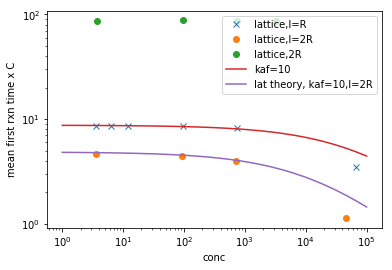

In [5]:
print('kaf',kaf)
rm = 0.005
R=2*rm
D = 1
kd= 4.0*math.pi*D*R
ka = kaf*kd
kon = (ka*kd)/(ka+kd)
voxelr=rm*1.0208582  
td =(2*voxelr)**2/(6*D)

def tautheory(c,kaf): #eq4.5 Agmon n Szabo
    ka = kaf*kd
    a=ka*R/(ka+kd)    
    return 1./(c*4*math.pi*D*a*(1+math.sqrt(4*math.pi*a**3*c)))

def taulattice(c,kaf):
    ka = kaf*kd
    F=0.2563
    l=2*R
    E=1+ka/(3*math.sqrt(2)*D*l*(1/F-1))
    ae=ka/(4*math.pi*D*E)
    konl=ka/E
    phi=4*math.pi*ae**3*c/3
    return 1./(c*konl*(1+math.sqrt(3*phi)))

latconc2R=np.array([3.59351308e+00 ,9.13858020e+01 ,7.08239965e+02, 4.60355977e+04])
lattime2R=np.array([1.29349300e+00 ,4.87325136e-02 ,5.63893468e-03 ,2.46461592e-05])
latconc=np.array([3.64871158e+00 ,6.30025812e+00 ,1.21675553e+01 ,9.55771445e+01,
 7.39314196e+02, 6.59368514e+04])
lattime=[2.36377904e+00, 1.38089638e+00, 7.03442977e-01, 9.09068837e-02,
 1.10260900e-02, 5.28925700e-05]
plt.semilogx(latconc,lattime*latconc,'x',label='lattice,l=R')
plt.semilogx(latconc2R,lattime2R*latconc2R,'o',label='lattice,l=2R')
#plt.plot(conc,[1/kon]*len(conc),label='1/kon')
#plt.plot(conc,[1/ka]*len(conc),label='1/ka')
#plt.plot(conc,[td]*len(conc),label='td')
plt.semilogx(conc,rxt*conc,'o',label='lattice,2R')

C=np.logspace(0,5,30)
tau=np.array([c*tautheory(c,10) for c in C])
plt.loglog(C,tau,'-',label='kaf='+str(10))

taulat=np.array([c*taulattice(c,10) for c in C])
plt.loglog(C,taulat,'-',label='lat theory, kaf='+str(10)+',l=2R')

plt.xlabel('conc')
plt.ylabel('mean first rxn time x C')
plt.legend()

array([87.4490651 , 87.70533083, 86.87305408, 87.14974778])

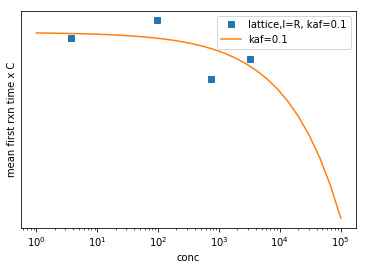

In [6]:
latconckf01=np.array([   3.65662978 ,  96.39070388,  731.08641562 ,3230.568262  ])
lattimekf01=np.array([23.91520891  ,0.90989408  ,0.11882734  ,0.0269766 ])

plt.semilogx(latconckf01,lattimekf01*latconckf01,'s',label='lattice,l=R, kaf=0.1')
C=np.logspace(0,5,30)
tau=np.array([c*tautheory(c,0.1) for c in C])
plt.loglog(C,tau,'-',label='kaf=0.1')
plt.xlabel('conc')
plt.ylabel('mean first rxn time x C')
plt.legend()
lattimekf01*latconckf01